In [2]:
#import dask.dataframe as dk
import pandas as pd
import numpy as np
import datetime as dt
import time as time
import matplotlib.pyplot as plt
idx=pd.IndexSlice
from sklearn.metrics import make_scorer, r2_score,accuracy_score,precision_score
from sklearn.externals import joblib
import os
import gc
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
from tqdm import tqdm
import numba
from numba import jit
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"] = ""

In [3]:
numba.__version__

'0.46.0'

In [4]:
### load Data 
#import tensorflow as tf
import keras as ks

from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

from random import random
from random import randint
from numpy import array
from numpy import zeros
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import BatchNormalization
from keras.layers import TimeDistributed
from keras.layers import Conv1D
from keras.layers import MaxPooling1D
from keras.layers import AveragePooling1D
from keras.callbacks import LambdaCallback
from keras import optimizers
from keras.layers.merge import concatenate
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
import multiprocessing



Using TensorFlow backend.


[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 13486425313204952652
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 18436984517836111799
physical_device_desc: "device: XLA_CPU device"
]


In [5]:
from keras.preprocessing.sequence import TimeseriesGenerator


In [6]:
scoring = {'AUC':'roc_auc','Accuracy':make_scorer(accuracy_score)}
mainFrame=pd.read_csv('/beegfs/sr4376/Finance Data/CNN-LSTM Data/correctmainFrame20052015.csv',parse_dates=['date'])
mainFrame.set_index(['entityID','date'],inplace=True)
mainFrame.dropna(axis=0,inplace=True)
mainFrame.sort_index(inplace=True)


In [7]:
targets=mainFrame.iloc[:,-7:]

gc.collect()
targets = targets['ztargetMedian5'].to_frame()
entityIDs=targets.index.get_level_values(0).unique()

In [8]:
train=mainFrame.iloc[:,:-7]

In [9]:
test=mainFrame.describe()

In [10]:
mainFrame

return1   return2   return3   return4   return5  \
entityID date                                                           
1034     2006-03-01  0.028760 -0.015813 -0.012377 -0.015813 -0.020151   
         2006-03-02 -0.025386  0.002645 -0.040797 -0.037448 -0.040797   
         2006-03-03 -0.045829 -0.070051 -0.043306 -0.084756 -0.081561   
         2006-03-06 -0.023151 -0.067920 -0.091581 -0.065455 -0.105946   
         2006-03-07 -0.027237 -0.049758 -0.093307 -0.116324 -0.090909   
...                       ...       ...       ...       ...       ...   
317260   2015-06-18 -0.030340 -0.041966 -0.056671 -0.078431 -0.078431   
         2015-06-19  0.003755 -0.026699 -0.038369 -0.053129 -0.074971   
         2015-06-22  0.031172  0.035044  0.003641 -0.008393 -0.023613   
         2015-06-23  0.015719  0.047382  0.051314  0.019417  0.007194   
         2015-06-24 -0.014286  0.001209  0.032419  0.036295  0.004854   

                      return6   return7   return8   return9  return10  ...  \
entityID date                                                          ...   
1034     2006-03-01  0.014672 -0.004797 -0.022920 -0.010178 -0.009548  ...   
         2006-03-02 -0.045025 -0.011086 -0.030061 -0.047724 -0.035305  ...   
         2006-03-03 -0.084756 -0.088791 -0.056407 -0.074512 -0.091366  ...   
         2006-03-06 -0.102825 -0.105946 -0.109887 -0.078252 -0.095939  ...   
         2006-03-07 -0.130297 -0.127261 -0.130297 -0.134131 -0.103358  ...   
...                       ...       ...       ...       ...       ...  ...   
317260   2015-06-18 -0.092045 -0.069849 -0.067678 -0.084765 -0.084765  ...   
         2015-06-19 -0.074971 -0.088636 -0.066356 -0.064177 -0.081329  ...   
         2015-06-22 -0.046136 -0.046136 -0.060227 -0.037253 -0.035006  ...   
         2015-06-23 -0.008264 -0.031142 -0.031142 -0.045455 -0.022119  ...   
         2015-06-24 -0.007194 -0.022432 -0.044983 -0.044983 -0.059091  ...   

                     momentum_stoch_signal  momentum_wr  momentum_ao  \
entityID date                                                          
1034     2006-03-01               0.074603     0.180447     0.070832   
         2006-03-02               0.024755     0.028564     0.054679   
         2006-03-03               0.028695     0.002436     0.036275   
         2006-03-06               0.004061     0.013265     0.020303   
         2006-03-07               0.002440     0.010304     0.013015   
...                                    ...          ...          ...   
317260   2015-06-18               0.156019     0.172159     0.715086   
         2015-06-19               0.175526     0.248586     0.641258   
         2015-06-22               0.270959     0.400402     0.590208   
         2015-06-23               0.388549     0.530889     0.579543   
         2015-06-24               0.484244     0.514623     0.591703   

                     ztargetMedian5  ztargetReturns5  ztargetPositive5  \
entityID date                                                            
1034     2006-03-01           False        -0.083869             False   
         2006-03-02           False        -0.089680             False   
         2006-03-03           False        -0.049758             False   
         2006-03-06            True         0.004245              True   
         2006-03-07           False        -0.001455             False   
...                             ...              ...               ...   
317260   2015-06-18            True         0.007509              True   
         2015-06-19            True         0.002494              True   
         2015-06-22           False        -0.027811             False   
         2015-06-23           False        -0.030952             False   
         2015-06-24           False        -0.042271             False   

                     ztargetTopDown5  ztargetTop5  ztargetDown5  yReturns5  
entityID date                                                               
103

In [10]:
def technicalAnalysisFeaturesAll(SP500DataPerDay):
    idx=pd.IndexSlice
    SP500DataPerDay.sort_index(inplace=True)
    technicalAnalysis = None
    technicalAnalysisFeature = None
    SP500Set=SP500DataPerDay
    SP500Set.sort_index(inplace=True)
    for entityID, new_df in SP500Set.groupby(level=0):
        print(entityID)
        if sum(new_df['Close'].isnull())==0:
            technicalAnalysis=ta.add_all_ta_features(df=new_df[['Open','High','Low','Close','Volume']],open='Open',high='High',low='Low',close='Close',volume='Volume')
            if technicalAnalysisFeature is None:
                technicalAnalysisFeature = technicalAnalysis
            else:
                technicalAnalysisFeature = technicalAnalysisFeature.append(technicalAnalysis)
    return technicalAnalysisFeature



for entityID, new_df in SP500Set.groupby(level=0):

    def rank(array):
        s = pd.Series(array)
        return s.rank(pct=True)[len(s)-1]

    starttime =time.time()

    ranked = pd.expanding_apply(new_df)



NameError: name 'SP500Set' is not defined

In [11]:
test=mainFrame.describe()

In [12]:
withoutTarget=mainFrame.iloc[:,:-7]

In [13]:
withoutTarget.columns[131]

'7'

In [14]:
withoutTarget.columns[129:138]

Index(['5', '6', '7', '8', '9', '10', '11', '12', '13'], dtype='object')

In [15]:
withoutTarget.drop(withoutTarget.columns[129:138],axis=1,inplace=True)

In [16]:
withoutTarget.columns[317:]

Index(['volume_adi', 'volume_obv', 'volume_obvm', 'volume_cmf', 'volume_fi',
       'volume_em', 'volume_vpt', 'volume_nvi', 'volatility_atr',
       'volatility_bbh', 'volatility_bbl', 'volatility_bbm', 'volatility_bbhi',
       'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl',
       'volatility_dch', 'volatility_dcl', 'volatility_dchi',
       'volatility_dcli', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff',
       'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos',
       'trend_vortex_ind_neg', 'trend_vortex_diff', 'trend_trix',
       'trend_mass_index', 'trend_cci', 'trend_dpo', 'trend_kst',
       'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_a',
       'trend_ichimoku_b', 'trend_visual_ichimoku_a',
       'trend_visual_ichimoku_b', 'trend_aroon_up', 'trend_aroon_down',
       'trend_aroon_ind', 'momentum_rsi', 'momentum_mfi', 'momentum_tsi',
       'momentum_uo', 'momentum_stoch', 'momentum_stoch_signal', 'momentum_wr',
       'moment

In [17]:
check=withoutTarget[withoutTarget.columns[213:]].describe()

In [18]:
returnColumns = withoutTarget.columns[:31]  # returns yes
priceColumns = withoutTarget.columns[31:63] # price yes 
timestd = withoutTarget.columns[63:93]    #timestd yes
crossRank = withoutTarget.columns[93:124] # crossRankRets  no
dates = withoutTarget.columns[124:152] # dates no
crossStd = withoutTarget.columns[152:183] # crossStd yes
crossRankStd = withoutTarget.columns[183:213]  # crossRankStd no
notNormalizedTA = withoutTarget.columns[213:266]  # use for normalization and drop
NormalizedTAButWrong = withoutTarget.columns[266:317] # probably wrong drop
TArankedButWrong = withoutTarget.columns[317:] # probably wrong drop

In [19]:
(withoutTarget.columns.isin(returnColumns)) | (withoutTarget.columns.isin(priceColumns))  | (withoutTarget.columns.isin(crossStd)) | (withoutTarget.columns.isin(timestd)) | (withoutTarget.columns.isin(notNormalizedTA)) 

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [20]:
toNormalize=withoutTarget.loc[:,(withoutTarget.columns.isin(returnColumns)) | (withoutTarget.columns.isin(priceColumns))  | (withoutTarget.columns.isin(crossStd)) | (withoutTarget.columns.isin(timestd)) | (withoutTarget.columns.isin(notNormalizedTA))]


In [22]:
toNormalize

return1   return2   return3   return4   return5  \
entityID date                                                           
1034     2006-03-01  0.028760 -0.015813 -0.012377 -0.015813 -0.020151   
         2006-03-02 -0.025386  0.002645 -0.040797 -0.037448 -0.040797   
         2006-03-03 -0.045829 -0.070051 -0.043306 -0.084756 -0.081561   
         2006-03-06 -0.023151 -0.067920 -0.091581 -0.065455 -0.105946   
         2006-03-07 -0.027237 -0.049758 -0.093307 -0.116324 -0.090909   
...                       ...       ...       ...       ...       ...   
317260   2015-06-18 -0.030340 -0.041966 -0.056671 -0.078431 -0.078431   
         2015-06-19  0.003755 -0.026699 -0.038369 -0.053129 -0.074971   
         2015-06-22  0.031172  0.035044  0.003641 -0.008393 -0.023613   
         2015-06-23  0.015719  0.047382  0.051314  0.019417  0.007194   
         2015-06-24 -0.014286  0.001209  0.032419  0.036295  0.004854   

                      return6   return7   return8   return9  return10  ...  \
entityID date                                                          ...   
1034     2006-03-01  0.014672 -0.004797 -0.022920 -0.010178 -0.009548  ...   
         2006-03-02 -0.045025 -0.011086 -0.030061 -0.047724 -0.035305  ...   
         2006-03-03 -0.084756 -0.088791 -0.056407 -0.074512 -0.091366  ...   
         2006-03-06 -0.102825 -0.105946 -0.109887 -0.078252 -0.095939  ...   
         2006-03-07 -0.130297 -0.127261 -0.130297 -0.134131 -0.103358  ...   
...                       ...       ...       ...       ...       ...  ...   
317260   2015-06-18 -0.092045 -0.069849 -0.067678 -0.084765 -0.084765  ...   
         2015-06-19 -0.074971 -0.088636 -0.066356 -0.064177 -0.081329  ...   
         2015-06-22 -0.046136 -0.046136 -0.060227 -0.037253 -0.035006  ...   
         2015-06-23 -0.008264 -0.031142 -0.031142 -0.045455 -0.022119  ...   
         2015-06-24 -0.007194 -0.022432 -0.044983 -0.044983 -0.059091  ...   

                     trend_aroon_down_x  trend_aroon_ind_x  momentum_rsi_x  \
entityID date                                                                
1034     2006-03-01                96.0              -80.0       45.723852   
         2006-03-02                92.0              -80.0       37.515538   
         2006-03-03               100.0              -92.0       27.494840   
         2006-03-06               100.0              -96.0       23.938583   
         2006-03-07               100.0              -92.0       20.433843   
...                                 ...                ...             ...   
317260   2015-06-18               100.0              -76.0       20.458390   
         2015-06-19                96.0              -76.0       22.886753   
         2015-06-22                92.0              -76.0       40.386463   
         2015-06-23                88.0              -76.0       47.530736   
         2015-06-24                84.0              -76.0       42.150496   

                     momentum_mfi_x  momentum_tsi_x  momentum_uo_x  \
entityID date                                                        
1034     2006-03-01       46.091065       12.437974      46.915751   
         2006-03-02       46.734412       11.250500      45.786644   
         2006-03-03       38.170622        9.306017      32.368327   
         2006-03-06       34.903061        7.180809      32.646095   
         2006-03-07       28.464840        4.849687      31.302103   
...                             ...             ...            ...   
317260   2015-06-18       16.942521      -14.109799      35.626917   
         2015-06-19       28.933698      -14.873546      33.514613   
         2015-06-22       28.876815      -15.095707      37.821427   
         2015-06-23       36.876317      -15.051132      39.535072   
         2015-06-24       37.864896      -15.178625      38.653679   

                     momentum_stoch_x  momentum_stoch_signal_x  momentum_wr_x  \
entityID date                                     

In [23]:
new_df=toNormalize.loc[1034]

In [20]:
def rank(array):
        s = pd.Series(array)
        return s.rank(pct=True)[len(s)-1]
ranked =new_df.expanding(21).apply(rank,raw=True)

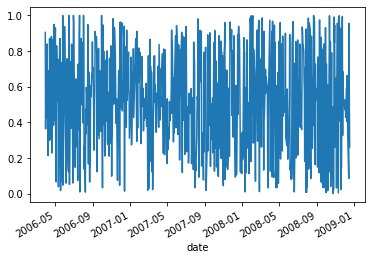

In [21]:
ranked['return1'].plot()

In [24]:
saveFrame={}
normalizedDF=None
@jit(nopython=True,parallel = False)
def rank(array):
        s = pd.Series(array)
        return s.rank(pct=True)[len(s)-1]
    
@jit(nopython=True,parallel = False)
def normalize(array):
        meanToFast = np.mean(array)
        stdToFast = np.std(array)
        normalize = (array-meanToFast)/stdToFast
        return normalize[len(normalize)-1]
counter=0
for entityID, new_df in tqdm(toNormalize.groupby(level=0)):


    starttime =time.time()
    print(starttime)
    columns=new_df.columns
    for jj in columns:
        new_df[jj]= new_df[jj].astype(float)
        new_df[jj]=pd.to_numeric(new_df[jj])

    #ranked =new_df.expanding(21).window().expanding().Expanding().apply(rank,kwgs={"use_numba_cache":"numba"},raw=True)
    ranked =new_df.rolling(252).apply(normalize,engine="numba",raw=True)
    
    saveFrame[counter]=ranked
    counter=counter+1
    

  0%|          | 0/5460 [00:00<?, ?it/s]

1588447061.1319902


/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  0%|          | 1/5460 [00:05<8:51:07,  5.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

1588447063.0059912


  0%|          | 2/5460 [00:06<6:35:58,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447063.8943253


  0%|          | 3/5460 [00:07<5:04:24,  3.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447064.8940864


  0%|          | 4/5460 [00:08<3:44:11,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447065.3022494


  0%|          | 5/5460 [00:09<3:07:31,  2.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447066.4256449


  0%|          | 6/5460 [00:10<2:38:33,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447067.4271069


  0%|          | 7/5460 [00:11<2:18:15,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447068.4280217


  0%|          | 8/5460 [00:11<1:51:22,  1.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447068.964001


  0%|          | 9/5460 [00:12<1:45:12,  1.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447069.963851


  0%|          | 10/5460 [00:13<1:25:11,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447070.3879864


  0%|          | 11/5460 [00:13<1:09:52,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447070.7642908


  0%|          | 12/5460 [00:14<1:15:58,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447071.7585933


  0%|          | 13/5460 [00:15<1:05:54,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447072.2259598


  0%|          | 14/5460 [00:16<1:13:31,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447073.2322745


  0%|          | 15/5460 [00:17<1:18:49,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447074.2372339


  0%|          | 16/5460 [00:18<1:22:33,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447075.2439427


  0%|          | 17/5460 [00:18<1:14:50,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447075.8703122


  0%|          | 18/5460 [00:19<1:19:39,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447076.8730078


  0%|          | 19/5460 [00:20<1:09:14,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447077.368736


  0%|          | 20/5460 [00:20<1:07:09,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447078.056563


  0%|          | 21/5460 [00:21<55:55,  1.62it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447078.3845043


  0%|          | 22/5460 [00:21<54:32,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447078.9510164


  0%|          | 23/5460 [00:22<51:51,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447079.4543753


  0%|          | 24/5460 [00:23<1:03:42,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447080.463181


  0%|          | 25/5460 [00:24<1:09:20,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447081.3739984


  0%|          | 26/5460 [00:25<1:15:44,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447082.3755414


  0%|          | 27/5460 [00:26<1:20:15,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447083.3783188


  1%|          | 28/5460 [00:26<1:14:27,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447084.0518749


  1%|          | 29/5460 [00:27<1:19:19,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447085.05427


  1%|          | 30/5460 [00:28<1:19:46,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447085.9476569


  1%|          | 31/5460 [00:29<1:26:42,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447087.085003


  1%|          | 32/5460 [00:30<1:27:54,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447088.0878766


  1%|          | 33/5460 [00:31<1:28:51,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447089.0950844


  1%|          | 34/5460 [00:32<1:29:27,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447090.100115


  1%|          | 35/5460 [00:33<1:29:51,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447091.1050816


  1%|          | 36/5460 [00:34<1:19:05,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447091.7024758


  1%|          | 37/5460 [00:35<1:19:58,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447092.610505


  1%|          | 38/5460 [00:35<1:09:52,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447093.123455


  1%|          | 39/5460 [00:36<1:02:18,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447093.6181037


  1%|          | 40/5460 [00:37<1:10:52,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447094.624247


  1%|          | 41/5460 [00:37<58:18,  1.55it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447094.9451056


  1%|          | 42/5460 [00:38<1:07:58,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447095.9482775


  1%|          | 43/5460 [00:39<1:14:46,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447096.9523604


  1%|          | 44/5460 [00:40<1:02:21,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447097.322413


  1%|          | 45/5460 [00:41<1:10:47,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447098.3251622


  1%|          | 46/5460 [00:41<59:29,  1.52it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447098.6923156


  1%|          | 47/5460 [00:42<1:05:33,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447099.5764313


  1%|          | 48/5460 [00:43<1:17:01,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447100.7277956


  1%|          | 49/5460 [00:44<1:21:07,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447101.7334378


  1%|          | 50/5460 [00:45<1:23:56,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447102.7379


  1%|          | 51/5460 [00:46<1:23:20,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447103.646968


  1%|          | 52/5460 [00:46<1:09:00,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447104.0417643


  1%|          | 53/5460 [00:47<1:15:25,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447105.0451624


  1%|          | 54/5460 [00:48<1:17:22,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447105.9547222


  1%|          | 55/5460 [00:49<1:02:51,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447106.2767594


  1%|          | 56/5460 [00:49<53:45,  1.68it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447106.6384864


  1%|          | 57/5460 [00:50<1:08:48,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447107.7928214


  1%|          | 58/5460 [00:51<1:15:37,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447108.8099794


  1%|          | 59/5460 [00:51<1:02:26,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447109.1617608


  1%|          | 60/5460 [00:53<1:10:54,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447110.1696854


  1%|          | 61/5460 [00:53<1:05:12,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447110.7467666


  1%|          | 62/5460 [00:54<1:03:12,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447111.3978915


  1%|          | 63/5460 [00:54<53:24,  1.68it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447111.7376976


  1%|          | 64/5460 [00:55<1:03:36,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447112.7102573


  1%|          | 65/5460 [00:56<1:11:46,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447113.7204247


  1%|          | 66/5460 [00:57<1:04:12,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447114.2384965


  1%|          | 67/5460 [00:57<1:08:57,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447115.1293662


  1%|          | 68/5460 [00:58<1:15:26,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447116.137747


  1%|▏         | 69/5460 [00:59<1:04:33,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447116.573816


  1%|▏         | 70/5460 [00:59<53:56,  1.67it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447116.898394


  1%|▏         | 71/5460 [01:00<58:15,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447117.6600757


  1%|▏         | 72/5460 [01:01<58:34,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447118.3204775


  1%|▏         | 73/5460 [01:01<58:43,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447118.978919


  1%|▏         | 74/5460 [01:02<1:08:19,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447119.9901881


  1%|▏         | 75/5460 [01:03<1:19:06,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447121.152046


  1%|▏         | 76/5460 [01:04<1:22:32,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447122.1613095


  1%|▏         | 77/5460 [01:05<1:24:51,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447123.1680665


  1%|▏         | 78/5460 [01:06<1:09:26,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447123.541541


  1%|▏         | 79/5460 [01:07<1:15:35,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447124.5449076


  1%|▏         | 80/5460 [01:08<1:19:59,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447125.551725


  1%|▏         | 81/5460 [01:09<1:22:59,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447126.5560846


  2%|▏         | 82/5460 [01:10<1:25:12,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447127.5648222


  2%|▏         | 83/5460 [01:11<1:26:28,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447128.563052


  2%|▏         | 84/5460 [01:12<1:31:35,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447129.7192743


  2%|▏         | 85/5460 [01:12<1:15:52,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447130.1567614


  2%|▏         | 86/5460 [01:13<1:19:55,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447131.1552517


  2%|▏         | 87/5460 [01:14<1:21:59,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447132.1252935


  2%|▏         | 88/5460 [01:15<1:10:53,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447132.6277316


  2%|▏         | 89/5460 [01:16<1:16:37,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447133.6340795


  2%|▏         | 90/5460 [01:16<1:04:21,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447134.0334706


  2%|▏         | 91/5460 [01:17<1:12:00,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447135.0382516


  2%|▏         | 92/5460 [01:18<59:44,  1.50it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447135.3860638


  2%|▏         | 93/5460 [01:19<1:08:52,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447136.3950024


  2%|▏         | 94/5460 [01:20<1:14:36,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447137.3793805


  2%|▏         | 95/5460 [01:21<1:19:05,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447138.3809118


  2%|▏         | 96/5460 [01:21<1:04:03,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447138.7051501


  2%|▏         | 97/5460 [01:22<1:11:49,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447139.7120628


  2%|▏         | 98/5460 [01:23<1:17:15,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447140.7187254


  2%|▏         | 99/5460 [01:24<1:14:59,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447141.4994426


  2%|▏         | 100/5460 [01:25<1:19:27,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447142.5057898


  2%|▏         | 101/5460 [01:26<1:17:55,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447143.3386989


  2%|▏         | 102/5460 [01:26<1:05:13,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447143.737336


  2%|▏         | 103/5460 [01:27<1:16:46,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447144.9001377


  2%|▏         | 104/5460 [01:28<1:19:24,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447145.858688


  2%|▏         | 105/5460 [01:29<1:22:43,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447146.8723514


  2%|▏         | 106/5460 [01:30<1:24:54,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447147.8814197


  2%|▏         | 107/5460 [01:31<1:08:44,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447148.229612


  2%|▏         | 108/5460 [01:32<1:14:59,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447149.2341068


  2%|▏         | 109/5460 [01:33<1:19:25,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447150.2408147


  2%|▏         | 110/5460 [01:34<1:22:29,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447151.2470045


  2%|▏         | 111/5460 [01:34<1:14:52,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447151.8877995


  2%|▏         | 112/5460 [01:35<1:02:55,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447152.2811584


  2%|▏         | 113/5460 [01:36<1:15:11,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447153.4466927


  2%|▏         | 114/5460 [01:37<1:14:56,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447154.2814162


  2%|▏         | 115/5460 [01:38<1:19:22,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447155.2890399


  2%|▏         | 116/5460 [01:39<1:22:45,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447156.3074062


  2%|▏         | 117/5460 [01:40<1:24:46,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447157.3122408


  2%|▏         | 118/5460 [01:41<1:26:19,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447158.3230891


  2%|▏         | 119/5460 [01:42<1:27:05,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447159.3221445


  2%|▏         | 120/5460 [01:43<1:27:52,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447160.3299654


  2%|▏         | 121/5460 [01:44<1:28:21,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447161.336426


  2%|▏         | 122/5460 [01:45<1:32:58,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447162.5030162


  2%|▏         | 123/5460 [01:45<1:15:35,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447162.8968065


  2%|▏         | 124/5460 [01:46<1:19:47,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447163.9049323


  2%|▏         | 125/5460 [01:47<1:22:41,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447164.9115143


  2%|▏         | 126/5460 [01:48<1:24:42,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447165.9178653


  2%|▏         | 127/5460 [01:49<1:25:58,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447166.9188054


  2%|▏         | 128/5460 [01:50<1:26:59,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447167.9248576


  2%|▏         | 129/5460 [01:51<1:27:37,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447168.9276805


  2%|▏         | 130/5460 [01:52<1:28:07,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447169.9332206


  2%|▏         | 131/5460 [01:53<1:28:35,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447170.9434683


  2%|▏         | 132/5460 [01:54<1:19:21,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447171.5950265


  2%|▏         | 133/5460 [01:55<1:22:10,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447172.5947702


  2%|▏         | 134/5460 [01:56<1:24:20,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447173.6027033


  2%|▏         | 135/5460 [01:57<1:25:45,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447174.6064863


  2%|▏         | 136/5460 [01:58<1:26:52,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447175.6149588


  3%|▎         | 137/5460 [01:59<1:27:41,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447176.6254704


  3%|▎         | 138/5460 [01:59<1:10:09,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447176.955481


  3%|▎         | 139/5460 [02:00<1:06:47,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447177.6206033


  3%|▎         | 140/5460 [02:01<1:02:19,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447178.2059066


  3%|▎         | 141/5460 [02:01<57:17,  1.55it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447178.7202787


  3%|▎         | 142/5460 [02:02<1:11:19,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447179.89485


  3%|▎         | 143/5460 [02:03<1:02:32,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447180.3696094


  3%|▎         | 144/5460 [02:04<1:10:34,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447181.378072


  3%|▎         | 145/5460 [02:04<1:01:53,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447181.8481438


  3%|▎         | 146/5460 [02:05<1:10:07,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447182.8576488


  3%|▎         | 147/5460 [02:06<1:15:48,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447183.8639295


  3%|▎         | 148/5460 [02:07<1:19:48,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447184.8708215


  3%|▎         | 149/5460 [02:08<1:22:34,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447185.8770964


  3%|▎         | 150/5460 [02:09<1:14:18,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447186.4993138


  3%|▎         | 151/5460 [02:09<1:01:59,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447186.8751485


  3%|▎         | 152/5460 [02:10<58:46,  1.51it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447187.455425


  3%|▎         | 153/5460 [02:11<1:07:46,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447188.4591813


  3%|▎         | 154/5460 [02:11<57:31,  1.54it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447188.8395572


  3%|▎         | 155/5460 [02:12<1:07:04,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447189.850475


  3%|▎         | 156/5460 [02:13<1:13:42,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447190.859866


  3%|▎         | 157/5460 [02:14<1:18:18,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447191.867769


  3%|▎         | 158/5460 [02:15<1:21:30,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447192.8752534


  3%|▎         | 159/5460 [02:16<1:23:37,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447193.8775544


  3%|▎         | 160/5460 [02:17<1:10:05,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447194.3140638


  3%|▎         | 161/5460 [02:17<1:03:39,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447194.8653986


  3%|▎         | 162/5460 [02:18<1:15:50,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447196.0466728


  3%|▎         | 163/5460 [02:19<1:19:41,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447197.051765


  3%|▎         | 164/5460 [02:20<1:22:44,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447198.070176


  3%|▎         | 165/5460 [02:21<1:24:42,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447199.0824468


  3%|▎         | 166/5460 [02:22<1:26:08,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447200.0970144


  3%|▎         | 167/5460 [02:23<1:10:48,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447200.494081


  3%|▎         | 168/5460 [02:24<1:16:14,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447201.502895


  3%|▎         | 169/5460 [02:25<1:16:28,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447202.3763747


  3%|▎         | 170/5460 [02:25<1:02:40,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447202.7222514


  3%|▎         | 171/5460 [02:26<1:10:15,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447203.7208095


  3%|▎         | 172/5460 [02:27<1:05:28,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447204.337398


  3%|▎         | 173/5460 [02:27<56:56,  1.55it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447204.7578585


  3%|▎         | 174/5460 [02:28<1:01:52,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447205.5908446


  3%|▎         | 175/5460 [02:29<1:09:55,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447206.5986028


  3%|▎         | 176/5460 [02:30<1:07:45,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447207.3109438


  3%|▎         | 177/5460 [02:30<1:00:30,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447207.8059192


  3%|▎         | 178/5460 [02:31<1:08:57,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447208.8136415


  3%|▎         | 179/5460 [02:32<1:04:54,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447209.4440844


  3%|▎         | 180/5460 [02:33<1:11:47,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447210.4430876


  3%|▎         | 181/5460 [02:34<1:16:37,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447211.442364


  3%|▎         | 182/5460 [02:35<1:20:11,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447212.4492483


  3%|▎         | 183/5460 [02:35<1:12:40,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447213.0764396


  3%|▎         | 184/5460 [02:36<1:17:26,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447214.0838518


  3%|▎         | 185/5460 [02:37<1:05:50,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447214.5253978


  3%|▎         | 186/5460 [02:38<1:12:37,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447215.531972


  3%|▎         | 187/5460 [02:39<1:17:23,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447216.5395305


  3%|▎         | 188/5460 [02:40<1:20:40,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447217.5455623


  3%|▎         | 189/5460 [02:41<1:22:59,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447218.5522788


  3%|▎         | 190/5460 [02:42<1:24:34,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447219.5573041


  3%|▎         | 191/5460 [02:43<1:25:42,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447220.5635827


  4%|▎         | 192/5460 [02:43<1:13:32,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447221.0782373


  4%|▎         | 193/5460 [02:45<1:22:39,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447222.2630308


  4%|▎         | 194/5460 [02:45<1:13:38,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447222.8622365


  4%|▎         | 195/5460 [02:46<1:07:44,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447223.478239


  4%|▎         | 196/5460 [02:46<58:08,  1.51it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447223.8858166


  4%|▎         | 197/5460 [02:47<1:05:15,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447224.8196874


  4%|▎         | 198/5460 [02:48<1:12:29,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447225.8389246


  4%|▎         | 199/5460 [02:49<1:17:14,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447226.846705


  4%|▎         | 200/5460 [02:50<1:18:28,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447227.7747135


  4%|▎         | 201/5460 [02:51<1:20:19,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447228.7408729


  4%|▎         | 202/5460 [02:52<1:21:00,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447229.6841276


  4%|▎         | 203/5460 [02:53<1:21:52,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447230.6420825


  4%|▎         | 204/5460 [02:54<1:28:42,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447231.8374958


  4%|▍         | 205/5460 [02:55<1:28:31,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447232.8433864


  4%|▍         | 206/5460 [02:56<1:28:31,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447233.8547194


  4%|▍         | 207/5460 [02:57<1:28:29,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447234.865298


  4%|▍         | 208/5460 [02:58<1:27:35,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447235.8421142


  4%|▍         | 209/5460 [02:59<1:27:38,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447236.8452647


  4%|▍         | 210/5460 [03:00<1:27:44,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447237.851153


  4%|▍         | 211/5460 [03:01<1:17:30,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447238.4644156


  4%|▍         | 212/5460 [03:01<1:06:39,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447238.937824


  4%|▍         | 213/5460 [03:02<1:05:21,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447239.6510508


  4%|▍         | 214/5460 [03:03<1:17:10,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447240.849495


  4%|▍         | 215/5460 [03:04<1:03:07,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447241.1965332


  4%|▍         | 216/5460 [03:04<1:04:45,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447241.9817543


  4%|▍         | 217/5460 [03:05<1:11:43,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447242.9890773


  4%|▍         | 218/5460 [03:06<1:18:56,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447244.085995


  4%|▍         | 219/5460 [03:07<1:06:12,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447244.5040152


  4%|▍         | 220/5460 [03:08<1:13:11,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447245.5291638


  4%|▍         | 221/5460 [03:09<1:17:34,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447246.5348222


  4%|▍         | 222/5460 [03:10<1:19:49,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447247.5096278


  4%|▍         | 223/5460 [03:11<1:22:29,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447248.5266528


  4%|▍         | 224/5460 [03:12<1:17:31,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447249.2824135


  4%|▍         | 225/5460 [03:13<1:21:37,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447250.328195


  4%|▍         | 226/5460 [03:13<1:05:38,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447250.6534283


  4%|▍         | 227/5460 [03:13<56:04,  1.56it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447251.0409217


  4%|▍         | 228/5460 [03:14<1:05:42,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447252.0525665


  4%|▍         | 229/5460 [03:15<1:12:19,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447253.0596006


  4%|▍         | 230/5460 [03:16<1:09:00,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447253.7629642


  4%|▍         | 231/5460 [03:17<1:14:39,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447254.7714875


  4%|▍         | 232/5460 [03:18<1:18:31,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447255.7764401


  4%|▍         | 233/5460 [03:19<1:21:05,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447256.7767007


  4%|▍         | 234/5460 [03:20<1:10:45,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447257.312168


  4%|▍         | 235/5460 [03:20<1:05:02,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447257.906388


  4%|▍         | 236/5460 [03:21<1:00:53,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447258.4949026


  4%|▍         | 237/5460 [03:21<52:58,  1.64it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447258.8917704


  4%|▍         | 238/5460 [03:22<1:03:39,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447259.9099073


  4%|▍         | 239/5460 [03:23<1:10:57,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447260.9213848


  4%|▍         | 240/5460 [03:24<1:07:39,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447261.611101


  4%|▍         | 241/5460 [03:24<55:52,  1.56it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447261.9375052


  4%|▍         | 242/5460 [03:25<1:05:20,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447262.943152


  4%|▍         | 243/5460 [03:26<58:57,  1.47it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447263.4498389


  4%|▍         | 244/5460 [03:27<1:07:29,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447264.4556444


  4%|▍         | 245/5460 [03:28<1:13:30,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447265.4635031


  5%|▍         | 246/5460 [03:29<1:17:40,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447266.4693937


  5%|▍         | 247/5460 [03:29<1:08:07,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447266.9975457


  5%|▍         | 248/5460 [03:30<56:11,  1.55it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447267.3242192


  5%|▍         | 249/5460 [03:31<1:05:35,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447268.3325503


  5%|▍         | 250/5460 [03:31<54:34,  1.59it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447268.66499


  5%|▍         | 251/5460 [03:32<1:04:29,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447269.6752007


  5%|▍         | 252/5460 [03:33<1:11:23,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447270.6832762


  5%|▍         | 253/5460 [03:34<1:16:22,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447271.6979778


  5%|▍         | 254/5460 [03:35<1:19:47,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447272.709399


  5%|▍         | 255/5460 [03:35<1:05:33,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447273.0827386


  5%|▍         | 256/5460 [03:36<55:17,  1.57it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447273.4440794


  5%|▍         | 257/5460 [03:37<1:04:53,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447274.4512393


  5%|▍         | 258/5460 [03:38<1:17:16,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447275.6766043


  5%|▍         | 259/5460 [03:38<1:05:33,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447276.1175067


  5%|▍         | 260/5460 [03:39<59:09,  1.47it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447276.628124


  5%|▍         | 261/5460 [03:40<57:45,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447277.2573342


  5%|▍         | 262/5460 [03:41<1:07:12,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447278.2877963


  5%|▍         | 263/5460 [03:42<1:13:52,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447279.3210502


  5%|▍         | 264/5460 [03:43<1:18:28,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447280.3513007


  5%|▍         | 265/5460 [03:44<1:21:49,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447281.3870203


  5%|▍         | 266/5460 [03:44<1:08:07,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447281.8049686


  5%|▍         | 267/5460 [03:45<1:18:25,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447282.98851


  5%|▍         | 268/5460 [03:46<1:10:23,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447283.5856202


  5%|▍         | 269/5460 [03:47<1:21:26,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447284.837815


  5%|▍         | 270/5460 [03:50<2:00:19,  1.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447287.2655373


  5%|▍         | 271/5460 [03:52<2:16:08,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447289.279827


  5%|▍         | 272/5460 [03:53<2:18:57,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447290.9510856


  5%|▌         | 273/5460 [03:54<1:54:27,  1.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447291.6267736


  5%|▌         | 274/5460 [03:56<2:12:14,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447293.6380584


  5%|▌         | 275/5460 [03:57<1:55:46,  1.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447294.5337958


  5%|▌         | 276/5460 [03:58<1:42:01,  1.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447295.33082


  5%|▌         | 277/5460 [04:00<2:03:41,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447297.348461


  5%|▌         | 278/5460 [04:01<2:00:40,  1.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447298.677803


  5%|▌         | 279/5460 [04:03<2:16:46,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447300.6967938


  5%|▌         | 280/5460 [04:04<1:59:15,  1.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447301.593053


  5%|▌         | 281/5460 [04:06<2:09:17,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447303.3639226


  5%|▌         | 282/5460 [04:07<1:56:36,  1.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447304.3729947


  5%|▌         | 283/5460 [04:07<1:30:24,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447304.7126148


  5%|▌         | 284/5460 [04:08<1:29:26,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447305.7243533


  5%|▌         | 285/5460 [04:09<1:20:59,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447306.4349425


  5%|▌         | 286/5460 [04:10<1:22:49,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447307.4452934


  5%|▌         | 287/5460 [04:11<1:24:06,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447308.4562736


  5%|▌         | 288/5460 [04:11<1:07:28,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447308.7889833


  5%|▌         | 289/5460 [04:12<1:13:12,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447309.7944195


  5%|▌         | 290/5460 [04:13<1:02:22,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447310.2251463


  5%|▌         | 291/5460 [04:14<1:09:54,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447311.240925


  5%|▌         | 292/5460 [04:15<1:14:55,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447312.2471874


  5%|▌         | 293/5460 [04:15<1:06:26,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447312.7893076


  5%|▌         | 294/5460 [04:15<55:08,  1.56it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447313.1238177


  5%|▌         | 295/5460 [04:16<1:04:47,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447314.1386406


  5%|▌         | 296/5460 [04:17<54:44,  1.57it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447314.5022743


  5%|▌         | 297/5460 [04:18<1:04:14,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447315.5067651


  5%|▌         | 298/5460 [04:18<53:28,  1.61it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447315.836656


  5%|▌         | 299/5460 [04:19<1:03:18,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447316.8395712


  5%|▌         | 300/5460 [04:20<1:10:16,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447317.846427


  6%|▌         | 301/5460 [04:21<1:15:26,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447318.8642728


  6%|▌         | 302/5460 [04:22<1:18:49,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447319.8733892


  6%|▌         | 303/5460 [04:23<1:05:08,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447320.2601044


  6%|▌         | 304/5460 [04:23<1:05:55,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447321.0491576


  6%|▌         | 305/5460 [04:24<54:58,  1.56it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447321.3914626


  6%|▌         | 306/5460 [04:25<1:04:26,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447322.3996813


  6%|▌         | 307/5460 [04:26<1:11:13,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447323.4132295


  6%|▌         | 308/5460 [04:27<1:15:51,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447324.423085


  6%|▌         | 309/5460 [04:27<1:01:35,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447324.7526894


  6%|▌         | 310/5460 [04:28<1:09:00,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447325.759105


  6%|▌         | 311/5460 [04:29<59:43,  1.44it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447326.203028


  6%|▌         | 312/5460 [04:30<1:07:47,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447327.2125437


  6%|▌         | 313/5460 [04:31<1:13:29,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447328.2249453


  6%|▌         | 314/5460 [04:31<1:09:43,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447328.9356623


  6%|▌         | 315/5460 [04:32<1:14:48,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447329.9471476


  6%|▌         | 316/5460 [04:33<1:19:02,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447330.984694


  6%|▌         | 317/5460 [04:34<1:03:55,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447331.3189015


  6%|▌         | 318/5460 [04:35<1:10:43,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447332.3297982


  6%|▌         | 319/5460 [04:35<58:00,  1.48it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447332.6604893


  6%|▌         | 320/5460 [04:35<49:31,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447333.0080407


  6%|▌         | 321/5460 [04:36<1:00:36,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447334.0180624


  6%|▌         | 322/5460 [04:37<1:05:21,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447334.9111855


  6%|▌         | 323/5460 [04:38<1:09:46,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447335.846784


  6%|▌         | 324/5460 [04:39<1:14:39,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447336.85223


  6%|▌         | 325/5460 [04:40<1:18:15,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447337.865143


  6%|▌         | 326/5460 [04:41<1:17:34,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447338.7539544


  6%|▌         | 327/5460 [04:42<1:09:02,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447339.3282483


  6%|▌         | 328/5460 [04:42<1:02:28,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447339.880044


  6%|▌         | 329/5460 [04:43<1:09:33,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447340.887348


  6%|▌         | 330/5460 [04:44<1:15:00,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447341.9133668


  6%|▌         | 331/5460 [04:45<1:18:21,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447342.9220889


  6%|▌         | 332/5460 [04:46<1:13:33,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447343.6518116


  6%|▌         | 333/5460 [04:46<1:01:13,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447344.0319474


  6%|▌         | 334/5460 [04:47<59:30,  1.44it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447344.6819665


  6%|▌         | 335/5460 [04:48<59:25,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447345.3753676


  6%|▌         | 336/5460 [04:48<50:04,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447345.7067187


  6%|▌         | 337/5460 [04:49<57:51,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447346.597365


  6%|▌         | 338/5460 [04:50<1:06:16,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447347.6040533


  6%|▌         | 339/5460 [04:51<1:12:07,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447348.6097128


  6%|▌         | 340/5460 [04:52<1:22:06,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447349.845133


  6%|▌         | 341/5460 [04:53<1:23:17,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447350.8540854


  6%|▋         | 342/5460 [04:54<1:10:23,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447351.3271062


  6%|▋         | 343/5460 [04:54<58:20,  1.46it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447351.6819596


  6%|▋         | 344/5460 [04:55<1:06:44,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447352.694519


  6%|▋         | 345/5460 [04:56<1:12:22,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447353.6981153


  6%|▋         | 346/5460 [04:57<1:16:27,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447354.7073479


  6%|▋         | 347/5460 [04:58<1:14:09,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447355.514641


  6%|▋         | 348/5460 [04:59<1:17:29,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447356.5161612


  6%|▋         | 349/5460 [05:00<1:19:57,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447357.5227506


  6%|▋         | 350/5460 [05:01<1:21:39,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447358.528766


  6%|▋         | 351/5460 [05:02<1:22:53,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447359.53666


  6%|▋         | 352/5460 [05:03<1:14:42,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447360.1898372


  6%|▋         | 353/5460 [05:03<1:10:56,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447360.9205067


  6%|▋         | 354/5460 [05:04<1:15:24,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447361.9293365


  7%|▋         | 355/5460 [05:05<1:06:56,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447362.484545


  7%|▋         | 356/5460 [05:05<1:03:52,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447363.1513805


  7%|▋         | 357/5460 [05:06<1:10:25,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447364.1598098


  7%|▋         | 358/5460 [05:07<1:07:29,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447364.8732383


  7%|▋         | 359/5460 [05:08<55:42,  1.53it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447365.205069


  7%|▋         | 360/5460 [05:08<1:00:34,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447366.0520067


  7%|▋         | 361/5460 [05:09<1:08:03,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447367.0583372


  7%|▋         | 362/5460 [05:10<56:39,  1.50it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447367.412697


  7%|▋         | 363/5460 [05:11<1:05:15,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447368.417719


  7%|▋         | 364/5460 [05:11<1:01:49,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447369.051757


  7%|▋         | 365/5460 [05:12<1:08:50,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447370.0553737


  7%|▋         | 366/5460 [05:13<59:02,  1.44it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447370.4816835


  7%|▋         | 367/5460 [05:14<1:07:01,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447371.4913778


  7%|▋         | 368/5460 [05:15<1:12:37,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447372.501209


  7%|▋         | 369/5460 [05:16<1:16:31,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447373.5105772


  7%|▋         | 370/5460 [05:17<1:19:14,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447374.5198023


  7%|▋         | 371/5460 [05:18<1:21:06,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447375.527969


  7%|▋         | 372/5460 [05:19<1:22:23,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447376.5356393


  7%|▋         | 373/5460 [05:19<1:06:12,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447376.871295


  7%|▋         | 374/5460 [05:20<55:54,  1.52it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447377.2474174


  7%|▋         | 375/5460 [05:21<1:04:33,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447378.2478254


  7%|▋         | 376/5460 [05:22<1:10:46,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447379.255003


  7%|▋         | 377/5460 [05:23<1:21:12,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447380.5016897


  7%|▋         | 378/5460 [05:23<1:09:49,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447381.0122619


  7%|▋         | 379/5460 [05:24<1:14:28,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447382.0206876


  7%|▋         | 380/5460 [05:25<1:17:50,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447383.0328197


  7%|▋         | 381/5460 [05:26<1:19:59,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447384.037868


  7%|▋         | 382/5460 [05:27<1:21:27,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447385.0409155


  7%|▋         | 383/5460 [05:28<1:22:38,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447386.0508053


  7%|▋         | 384/5460 [05:29<1:06:14,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447386.3816197


  7%|▋         | 385/5460 [05:30<1:11:52,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447387.3870523


  7%|▋         | 386/5460 [05:31<1:16:05,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447388.403493


  7%|▋         | 387/5460 [05:31<1:04:06,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447388.831326


  7%|▋         | 388/5460 [05:32<56:06,  1.51it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447389.2748373


  7%|▋         | 389/5460 [05:32<56:56,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447389.9721847


  7%|▋         | 390/5460 [05:33<1:05:23,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447390.9794757


  7%|▋         | 391/5460 [05:34<1:11:21,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447391.9895074


  7%|▋         | 392/5460 [05:35<1:15:43,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447393.0070848


  7%|▋         | 393/5460 [05:36<1:10:57,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447393.7157006


  7%|▋         | 394/5460 [05:37<1:15:09,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447394.7223759


  7%|▋         | 395/5460 [05:37<1:01:31,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447395.074469


  7%|▋         | 396/5460 [05:38<1:08:31,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447396.0805876


  7%|▋         | 397/5460 [05:39<1:13:29,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447397.0892723


  7%|▋         | 398/5460 [05:40<1:03:13,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447397.5546324


  7%|▋         | 399/5460 [05:40<52:27,  1.61it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447397.879053


  7%|▋         | 400/5460 [05:41<1:02:03,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447398.8813217


  7%|▋         | 401/5460 [05:42<1:01:01,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447399.5765553


  7%|▋         | 402/5460 [05:42<57:09,  1.47it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447400.1478148


  7%|▋         | 403/5460 [05:43<57:52,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447400.8545387


  7%|▋         | 404/5460 [05:44<1:06:00,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447401.8634958


  7%|▋         | 405/5460 [05:45<54:33,  1.54it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447402.1940267


  7%|▋         | 406/5460 [05:46<1:03:38,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447403.2020156


  7%|▋         | 407/5460 [05:47<1:10:01,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447404.2102168


  7%|▋         | 408/5460 [05:48<1:14:30,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447405.2197711


  7%|▋         | 409/5460 [05:48<1:01:04,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447405.5734353


  8%|▊         | 410/5460 [05:49<1:08:07,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447406.5785294


  8%|▊         | 411/5460 [05:50<1:13:09,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447407.5878768


  8%|▊         | 412/5460 [05:51<1:16:27,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447408.5886724


  8%|▊         | 413/5460 [05:52<1:18:49,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447409.591582


  8%|▊         | 414/5460 [05:53<1:26:43,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447410.842456


  8%|▊         | 415/5460 [05:54<1:14:29,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447411.3891206


  8%|▊         | 416/5460 [05:55<1:17:28,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447412.3941426


  8%|▊         | 417/5460 [05:56<1:14:00,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447413.1787863


  8%|▊         | 418/5460 [05:57<1:17:13,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447414.1877923


  8%|▊         | 419/5460 [05:57<1:16:44,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447415.0878983


  8%|▊         | 420/5460 [05:58<1:15:23,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447415.948238


  8%|▊         | 421/5460 [05:59<1:01:16,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447416.2858171


  8%|▊         | 422/5460 [06:00<1:08:12,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447417.2916837


  8%|▊         | 423/5460 [06:01<1:13:01,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447418.2959285


  8%|▊         | 424/5460 [06:01<59:31,  1.41it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447418.6297288


  8%|▊         | 425/5460 [06:02<1:07:01,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447419.6377141


  8%|▊         | 426/5460 [06:02<55:09,  1.52it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447419.9652007


  8%|▊         | 427/5460 [06:03<1:08:19,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447421.1465702


  8%|▊         | 428/5460 [06:04<1:13:07,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447422.1521337


  8%|▊         | 429/5460 [06:05<1:02:50,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447422.6160226


  8%|▊         | 430/5460 [06:05<55:58,  1.50it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447423.092492


  8%|▊         | 431/5460 [06:06<1:04:30,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447424.1000254


  8%|▊         | 432/5460 [06:07<1:07:33,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447424.9915512


  8%|▊         | 433/5460 [06:08<56:56,  1.47it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447425.3756495


  8%|▊         | 434/5460 [06:09<1:04:34,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447426.3599076


  8%|▊         | 435/5460 [06:09<1:01:21,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447427.003124


  8%|▊         | 436/5460 [06:10<1:08:19,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447428.0133624


  8%|▊         | 437/5460 [06:11<1:13:04,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447429.0194762


  8%|▊         | 438/5460 [06:12<1:01:56,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447429.4492881


  8%|▊         | 439/5460 [06:13<1:08:37,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447430.4563158


  8%|▊         | 440/5460 [06:14<1:19:41,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447431.7179248


  8%|▊         | 441/5460 [06:15<1:21:05,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447432.7266355


  8%|▊         | 442/5460 [06:16<1:15:54,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447433.49034


  8%|▊         | 443/5460 [06:17<1:18:44,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447434.5115564


  8%|▊         | 444/5460 [06:17<1:05:09,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447434.912047


  8%|▊         | 445/5460 [06:18<1:10:58,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447435.9238656


  8%|▊         | 446/5460 [06:19<1:11:45,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447436.8047488


  8%|▊         | 447/5460 [06:19<58:35,  1.43it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447437.1385047


  8%|▊         | 448/5460 [06:20<1:06:13,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447438.1454616


  8%|▊         | 449/5460 [06:21<56:43,  1.47it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447438.559162


  8%|▊         | 450/5460 [06:22<1:05:02,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447439.5712495


  8%|▊         | 451/5460 [06:22<57:02,  1.46it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447440.0312755


  8%|▊         | 452/5460 [06:23<1:03:34,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447440.975534


  8%|▊         | 453/5460 [06:24<1:06:05,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447441.838592


  8%|▊         | 454/5460 [06:25<57:08,  1.46it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447442.2734168


  8%|▊         | 455/5460 [06:26<1:05:13,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447443.281749


  8%|▊         | 456/5460 [06:27<1:10:09,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447444.261305


  8%|▊         | 457/5460 [06:27<57:34,  1.45it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447444.6001885


  8%|▊         | 458/5460 [06:27<52:12,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447445.076148


  8%|▊         | 459/5460 [06:28<58:20,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447445.9484587


  8%|▊         | 460/5460 [06:29<49:08,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447446.2808895


  8%|▊         | 461/5460 [06:30<59:33,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447447.2881026


  8%|▊         | 462/5460 [06:30<52:36,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447447.7247467


  8%|▊         | 463/5460 [06:31<1:01:58,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447448.7321057


  8%|▊         | 464/5460 [06:31<52:51,  1.58it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447449.111145


  9%|▊         | 465/5460 [06:32<1:00:11,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447450.0403411


  9%|▊         | 466/5460 [06:33<1:06:03,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447450.998815


  9%|▊         | 467/5460 [06:34<1:11:30,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447452.0116127


  9%|▊         | 468/5460 [06:35<1:05:28,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447452.6296554


  9%|▊         | 469/5460 [06:36<1:11:02,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447453.640223


  9%|▊         | 470/5460 [06:37<1:14:53,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447454.6492608


  9%|▊         | 471/5460 [06:38<1:11:20,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447455.4075646


  9%|▊         | 472/5460 [06:39<1:15:02,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447456.4147542


  9%|▊         | 473/5460 [06:40<1:17:37,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447457.4215055


  9%|▊         | 474/5460 [06:41<1:19:44,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447458.4409585


  9%|▊         | 475/5460 [06:42<1:20:57,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447459.4497795


  9%|▊         | 476/5460 [06:42<1:05:48,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447459.8167024


  9%|▊         | 477/5460 [06:43<1:09:31,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447460.7586057


  9%|▉         | 478/5460 [06:44<1:12:05,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447461.6996896


  9%|▉         | 479/5460 [06:45<1:15:32,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447462.706748


  9%|▉         | 480/5460 [06:46<1:24:24,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447463.9740071


  9%|▉         | 481/5460 [06:47<1:24:06,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447464.979276


  9%|▉         | 482/5460 [06:48<1:24:03,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447465.9913123


  9%|▉         | 483/5460 [06:49<1:23:59,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447467.002837


  9%|▉         | 484/5460 [06:50<1:09:49,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447467.4464173


  9%|▉         | 485/5460 [06:50<56:56,  1.46it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447467.770641


  9%|▉         | 486/5460 [06:51<52:25,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447468.2764165


  9%|▉         | 487/5460 [06:51<48:40,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447468.7582526


  9%|▉         | 488/5460 [06:52<58:59,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447469.7614653


  9%|▉         | 489/5460 [06:53<1:01:36,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447470.5792067


  9%|▉         | 490/5460 [06:54<1:08:10,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447471.587187


  9%|▉         | 491/5460 [06:55<1:05:15,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447472.2936394


  9%|▉         | 492/5460 [06:56<1:10:40,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447473.300128


  9%|▉         | 493/5460 [06:57<1:21:10,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447474.5774903


  9%|▉         | 494/5460 [06:58<1:21:58,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447475.5909421


  9%|▉         | 495/5460 [06:59<1:22:33,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447476.6054409


  9%|▉         | 496/5460 [06:59<1:09:58,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447477.0968704


  9%|▉         | 497/5460 [07:00<1:14:06,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447478.1098654


  9%|▉         | 498/5460 [07:01<1:15:38,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447479.0679927


  9%|▉         | 499/5460 [07:02<1:17:59,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447480.0781627


  9%|▉         | 500/5460 [07:03<1:10:10,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447480.7066114


  9%|▉         | 501/5460 [07:04<1:01:42,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447481.2144647


  9%|▉         | 502/5460 [07:04<1:00:44,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447481.9227135


  9%|▉         | 503/5460 [07:05<1:07:18,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447482.9233098


  9%|▉         | 504/5460 [07:06<1:12:04,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447483.931085


  9%|▉         | 505/5460 [07:07<1:15:22,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447484.937401


  9%|▉         | 506/5460 [07:09<1:24:29,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447486.2189493


  9%|▉         | 507/5460 [07:09<1:14:25,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447486.8359995


  9%|▉         | 508/5460 [07:10<1:16:32,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447487.824209


  9%|▉         | 509/5460 [07:11<1:18:32,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447488.83281


  9%|▉         | 510/5460 [07:12<1:20:01,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447489.845151


  9%|▉         | 511/5460 [07:13<1:13:23,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447490.5475357


  9%|▉         | 512/5460 [07:13<59:40,  1.38it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447490.883498


  9%|▉         | 513/5460 [07:14<1:06:42,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447491.8920975


  9%|▉         | 514/5460 [07:15<1:11:38,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447492.9011912


  9%|▉         | 515/5460 [07:16<1:15:05,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447493.9100857


  9%|▉         | 516/5460 [07:17<1:04:54,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447494.4098258


  9%|▉         | 517/5460 [07:18<1:10:25,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447495.4218192


  9%|▉         | 518/5460 [07:18<59:38,  1.38it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447495.8402731


 10%|▉         | 519/5460 [07:19<1:06:43,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447496.8517387


 10%|▉         | 520/5460 [07:20<1:18:26,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447498.1370847


 10%|▉         | 521/5460 [07:21<1:03:08,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447498.4707928


 10%|▉         | 522/5460 [07:22<1:09:07,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447499.48066


 10%|▉         | 523/5460 [07:23<1:11:32,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447500.418966


 10%|▉         | 524/5460 [07:23<1:00:31,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447500.842512


 10%|▉         | 525/5460 [07:24<1:05:35,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447501.7840273


 10%|▉         | 526/5460 [07:25<56:22,  1.46it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447502.208412


 10%|▉         | 527/5460 [07:25<49:43,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447502.6247125


 10%|▉         | 528/5460 [07:25<45:04,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447503.041582


 10%|▉         | 529/5460 [07:26<41:54,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447503.4615557


 10%|▉         | 530/5460 [07:26<39:36,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447503.8790712


 10%|▉         | 531/5460 [07:27<43:18,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447504.5115032


 10%|▉         | 532/5460 [07:27<40:01,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447504.9058988


 10%|▉         | 533/5460 [07:28<52:47,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447505.9115152


 10%|▉         | 534/5460 [07:30<1:08:50,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447507.206878


 10%|▉         | 535/5460 [07:30<56:34,  1.45it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447507.5477896


 10%|▉         | 536/5460 [07:30<49:25,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447507.9471655


 10%|▉         | 537/5460 [07:31<59:39,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447508.9657352


 10%|▉         | 538/5460 [07:32<50:54,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447509.3372762


 10%|▉         | 539/5460 [07:33<1:00:34,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447510.351389


 10%|▉         | 540/5460 [07:33<50:43,  1.62it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447510.6896691


 10%|▉         | 541/5460 [07:34<1:00:21,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447511.7009299


 10%|▉         | 542/5460 [07:35<1:07:06,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447512.712129


 10%|▉         | 543/5460 [07:36<1:11:15,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447513.7004223


 10%|▉         | 544/5460 [07:36<59:11,  1.38it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447514.079514


 10%|▉         | 545/5460 [07:37<1:06:13,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447515.0886703


 10%|█         | 546/5460 [07:38<1:11:10,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447516.0993037


 10%|█         | 547/5460 [07:39<1:13:22,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447517.0583382


 10%|█         | 548/5460 [07:40<1:06:12,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447517.6631267


 10%|█         | 549/5460 [07:40<55:04,  1.49it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447518.018888


 10%|█         | 550/5460 [07:41<46:41,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447518.35043


 10%|█         | 551/5460 [07:42<57:32,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447519.364201


 10%|█         | 552/5460 [07:43<1:01:56,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447520.246568


 10%|█         | 553/5460 [07:44<1:08:10,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447521.2589452


 10%|█         | 554/5460 [07:44<58:21,  1.40it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447521.6924791


 10%|█         | 555/5460 [07:45<1:05:35,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447522.7021935


 10%|█         | 556/5460 [07:46<1:10:41,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447523.712732


 10%|█         | 557/5460 [07:47<1:01:46,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447524.2146692


 10%|█         | 558/5460 [07:48<1:08:00,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447525.2256505


 10%|█         | 559/5460 [07:48<1:04:37,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447525.9201095


 10%|█         | 560/5460 [07:49<53:18,  1.53it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447526.2499273


 10%|█         | 561/5460 [07:49<57:36,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447527.078953


 10%|█         | 562/5460 [07:51<1:12:13,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447528.3819678


 10%|█         | 563/5460 [07:51<1:00:44,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447528.797758


 10%|█         | 564/5460 [07:52<52:43,  1.55it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447529.215184


 10%|█         | 565/5460 [07:52<47:12,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447529.636374


 10%|█         | 566/5460 [07:52<42:56,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447530.0408082


 10%|█         | 567/5460 [07:53<45:12,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447530.6601312


 10%|█         | 568/5460 [07:53<41:03,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447531.0452101


 10%|█         | 569/5460 [07:54<38:55,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447531.4617767


 10%|█         | 570/5460 [07:54<35:25,  2.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447531.796428


 10%|█         | 571/5460 [07:55<34:39,  2.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447532.199935


 10%|█         | 572/5460 [07:55<37:41,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447532.749511


 10%|█         | 573/5460 [07:56<41:29,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447533.3680632


 11%|█         | 574/5460 [07:56<39:06,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447533.7802043


 11%|█         | 575/5460 [07:57<52:03,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447534.7915437


 11%|█         | 576/5460 [07:58<58:11,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447535.6823795


 11%|█         | 577/5460 [07:59<1:02:48,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447536.5868907


 11%|█         | 578/5460 [07:59<54:36,  1.49it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447537.0229862


 11%|█         | 579/5460 [08:00<48:25,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447537.4409406


 11%|█         | 580/5460 [08:00<44:03,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447537.8581219


 11%|█         | 581/5460 [08:01<39:36,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447538.217854


 11%|█         | 582/5460 [08:01<44:59,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447538.9256728


 11%|█         | 583/5460 [08:02<56:04,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447539.934046


 11%|█         | 584/5460 [08:03<1:03:50,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447540.9433403


 11%|█         | 585/5460 [08:04<1:03:29,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447541.7151527


 11%|█         | 586/5460 [08:05<1:01:08,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447542.4006124


 11%|█         | 587/5460 [08:06<1:05:28,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447543.3316598


 11%|█         | 588/5460 [08:07<1:11:43,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447544.3949275


 11%|█         | 589/5460 [08:07<59:06,  1.37it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447544.7609127


 11%|█         | 590/5460 [08:08<1:01:51,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447545.6024215


 11%|█         | 591/5460 [08:08<54:14,  1.50it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447546.0519419


 11%|█         | 592/5460 [08:09<1:02:36,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447547.065077


 11%|█         | 593/5460 [08:10<55:47,  1.45it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447547.5568984


 11%|█         | 594/5460 [08:11<1:01:38,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447548.4858222


 11%|█         | 595/5460 [08:11<54:22,  1.49it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447548.9474833


 11%|█         | 596/5460 [08:12<50:11,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447549.4462032


 11%|█         | 597/5460 [08:13<54:50,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447550.2570572


 11%|█         | 598/5460 [08:13<47:13,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447550.6207728


 11%|█         | 599/5460 [08:14<57:27,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447551.6251194


 11%|█         | 600/5460 [08:14<51:10,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447552.0759454


 11%|█         | 601/5460 [08:15<45:19,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447552.4677224


 11%|█         | 602/5460 [08:15<40:29,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447552.8283017


 11%|█         | 603/5460 [08:16<45:49,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447553.548638


 11%|█         | 604/5460 [08:17<49:39,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447554.2732685


 11%|█         | 605/5460 [08:18<59:24,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447555.2889423


 11%|█         | 606/5460 [08:19<1:06:13,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447556.3044922


 11%|█         | 607/5460 [08:20<1:11:00,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447557.32078


 11%|█         | 608/5460 [08:20<58:36,  1.38it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447557.6879122


 11%|█         | 609/5460 [08:21<56:12,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447558.3139124


 11%|█         | 610/5460 [08:22<1:03:52,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447559.3261292


 11%|█         | 611/5460 [08:22<54:44,  1.48it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447559.740202


 11%|█         | 612/5460 [08:22<48:18,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447560.152179


 11%|█         | 613/5460 [08:23<42:02,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447560.4922528


 11%|█         | 614/5460 [08:23<38:41,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447560.8747725


 11%|█▏        | 615/5460 [08:24<37:00,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447561.284743


 11%|█▏        | 616/5460 [08:24<35:50,  2.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447561.694884


 11%|█▏        | 617/5460 [08:25<49:37,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447562.7083519


 11%|█▏        | 618/5460 [08:26<1:00:02,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447563.7540436


 11%|█▏        | 619/5460 [08:27<1:13:56,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447565.073198


 11%|█▏        | 620/5460 [08:28<1:00:47,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447565.4467003


 11%|█▏        | 621/5460 [08:29<1:03:13,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447566.301552


 11%|█▏        | 622/5460 [08:30<1:08:53,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447567.3203003


 11%|█▏        | 623/5460 [08:30<56:27,  1.43it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447567.6607115


 11%|█▏        | 624/5460 [08:30<48:48,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447568.0455496


 11%|█▏        | 625/5460 [08:31<58:37,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447569.0573847


 11%|█▏        | 626/5460 [08:32<51:00,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447569.4700165


 11%|█▏        | 627/5460 [08:32<45:45,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447569.886389


 12%|█▏        | 628/5460 [08:33<41:49,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447570.2923696


 12%|█▏        | 629/5460 [08:33<39:11,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447570.7028155


 12%|█▏        | 630/5460 [08:33<37:14,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447571.109495


 12%|█▏        | 631/5460 [08:34<50:29,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447572.121094


 12%|█▏        | 632/5460 [08:35<59:49,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447573.135642


 12%|█▏        | 633/5460 [08:37<1:13:47,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447574.4584458


 12%|█▏        | 634/5460 [08:37<1:03:40,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447574.9567034


 12%|█▏        | 635/5460 [08:38<52:41,  1.53it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447575.293548


 12%|█▏        | 636/5460 [08:39<1:01:20,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447576.3081048


 12%|█▏        | 637/5460 [08:39<51:41,  1.55it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447576.671398


 12%|█▏        | 638/5460 [08:39<45:55,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447577.0754824


 12%|█▏        | 639/5460 [08:40<47:35,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447577.7166996


 12%|█▏        | 640/5460 [08:40<42:02,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447578.0787704


 12%|█▏        | 641/5460 [08:41<40:53,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447578.5548158


 12%|█▏        | 642/5460 [08:42<53:14,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447579.5773246


 12%|█▏        | 643/5460 [08:43<58:10,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447580.4452057


 12%|█▏        | 644/5460 [08:43<48:55,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447580.7860875


 12%|█▏        | 645/5460 [08:44<51:02,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447581.484011


 12%|█▏        | 646/5460 [08:44<43:42,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447581.8158872


 12%|█▏        | 647/5460 [08:45<45:04,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447582.4175777


 12%|█▏        | 648/5460 [08:46<1:03:21,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447583.7401779


 12%|█▏        | 649/5460 [08:46<53:18,  1.50it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447584.1129768


 12%|█▏        | 650/5460 [08:47<1:01:40,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447585.126375


 12%|█▏        | 651/5460 [08:48<51:26,  1.56it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447585.4700093


 12%|█▏        | 652/5460 [08:49<1:00:33,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447586.4922178


 12%|█▏        | 653/5460 [08:50<1:06:55,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447587.5129597


 12%|█▏        | 654/5460 [08:50<57:13,  1.40it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447587.9449458


 12%|█▏        | 655/5460 [08:51<1:04:22,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447588.9576292


 12%|█▏        | 656/5460 [08:52<56:48,  1.41it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447589.4467082


 12%|█▏        | 657/5460 [08:53<1:02:21,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447590.388272


 12%|█▏        | 658/5460 [08:54<1:07:59,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447591.4026198


 12%|█▏        | 659/5460 [08:55<1:11:31,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447592.400085


 12%|█▏        | 660/5460 [08:56<1:14:25,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447593.4151304


 12%|█▏        | 661/5460 [08:56<1:00:11,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447593.7528968


 12%|█▏        | 662/5460 [08:56<51:35,  1.55it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447594.147103


 12%|█▏        | 663/5460 [08:58<1:08:10,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447595.484823


 12%|█▏        | 664/5460 [08:59<1:12:10,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447596.5051093


 12%|█▏        | 665/5460 [09:00<1:15:16,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447597.5380373


 12%|█▏        | 666/5460 [09:00<1:01:55,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447597.9235764


 12%|█▏        | 667/5460 [09:01<54:31,  1.47it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447598.3899007


 12%|█▏        | 668/5460 [09:02<1:02:31,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447599.4071066


 12%|█▏        | 669/5460 [09:02<51:50,  1.54it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447599.7440364


 12%|█▏        | 670/5460 [09:02<45:36,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447600.133628


 12%|█▏        | 671/5460 [09:03<54:20,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447601.0701478


 12%|█▏        | 672/5460 [09:04<1:02:44,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447602.102838


 12%|█▏        | 673/5460 [09:05<1:08:05,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447603.1127717


 12%|█▏        | 674/5460 [09:06<57:18,  1.39it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447603.516026


 12%|█▏        | 675/5460 [09:06<49:40,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447603.9160168


 12%|█▏        | 676/5460 [09:07<42:40,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447604.246471


 12%|█▏        | 677/5460 [09:07<41:02,  1.94it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447604.7140772


 12%|█▏        | 678/5460 [09:08<40:35,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447605.210307


 12%|█▏        | 679/5460 [09:09<1:00:08,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447606.5383763


 12%|█▏        | 680/5460 [09:09<52:56,  1.50it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447606.9919124


 12%|█▏        | 681/5460 [09:10<58:06,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447607.8732736


 12%|█▏        | 682/5460 [09:11<56:00,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447608.5154145


 13%|█▎        | 683/5460 [09:12<1:03:15,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447609.522877


 13%|█▎        | 684/5460 [09:12<52:29,  1.52it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447609.867148


 13%|█▎        | 685/5460 [09:13<54:21,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447610.6052139


 13%|█▎        | 686/5460 [09:13<47:04,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447610.9832907


 13%|█▎        | 687/5460 [09:14<57:11,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447611.9993565


 13%|█▎        | 688/5460 [09:15<48:00,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447612.3341033


 13%|█▎        | 689/5460 [09:16<55:38,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447613.2583


 13%|█▎        | 690/5460 [09:17<1:03:03,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447614.2693167


 13%|█▎        | 691/5460 [09:18<1:08:07,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447615.2756457


 13%|█▎        | 692/5460 [09:18<55:35,  1.43it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447615.6075976


 13%|█▎        | 693/5460 [09:19<1:03:13,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447616.62825


 13%|█▎        | 694/5460 [09:20<1:00:29,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447617.3096793


 13%|█▎        | 695/5460 [09:20<51:50,  1.53it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447617.7087226


 13%|█▎        | 696/5460 [09:20<45:45,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447618.1067638


 13%|█▎        | 697/5460 [09:21<56:42,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447619.1433504


 13%|█▎        | 698/5460 [09:22<51:52,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447619.6547356


 13%|█▎        | 699/5460 [09:23<1:01:14,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447620.7025943


 13%|█▎        | 700/5460 [09:24<1:07:35,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447621.7418425


 13%|█▎        | 701/5460 [09:25<1:11:50,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447622.7728004


 13%|█▎        | 702/5460 [09:26<1:12:07,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447623.6914272


 13%|█▎        | 703/5460 [09:27<1:01:53,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447624.171344


 13%|█▎        | 704/5460 [09:27<52:01,  1.52it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447624.536336


 13%|█▎        | 705/5460 [09:29<1:23:09,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447626.5027251


 13%|█▎        | 706/5460 [09:31<1:46:05,  1.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447628.5307882


 13%|█▎        | 707/5460 [09:33<2:02:35,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447630.5647867


 13%|█▎        | 708/5460 [09:35<2:13:55,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447632.5776584


 13%|█▎        | 709/5460 [09:36<1:49:23,  1.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447633.2377467


 13%|█▎        | 710/5460 [09:38<2:20:40,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447635.9497967


 13%|█▎        | 711/5460 [09:40<2:21:44,  1.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447637.75963


 13%|█▎        | 712/5460 [09:41<1:57:02,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447638.5237756


 13%|█▎        | 713/5460 [09:43<2:10:07,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447640.554794


 13%|█▎        | 714/5460 [09:44<2:04:45,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447641.962137


 13%|█▎        | 715/5460 [09:45<1:48:17,  1.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447642.846811


 13%|█▎        | 716/5460 [09:47<1:59:09,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447644.675936


 13%|█▎        | 717/5460 [09:47<1:31:21,  1.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447645.0115979


 13%|█▎        | 718/5460 [09:48<1:11:53,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447645.347274


 13%|█▎        | 719/5460 [09:48<59:46,  1.32it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447645.746092


 13%|█▎        | 720/5460 [09:49<1:05:43,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447646.7542212


 13%|█▎        | 721/5460 [09:50<1:09:54,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447647.7632833


 13%|█▎        | 722/5460 [09:51<1:02:18,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447648.3284202


 13%|█▎        | 723/5460 [09:52<1:07:25,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447649.334067


 13%|█▎        | 724/5460 [09:53<1:11:04,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447650.3427718


 13%|█▎        | 725/5460 [09:54<1:21:27,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447651.6827588


 13%|█▎        | 726/5460 [09:54<1:06:07,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447652.0679023


 13%|█▎        | 727/5460 [09:55<1:10:20,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447653.0845854


 13%|█▎        | 728/5460 [09:56<58:28,  1.35it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447653.4754598


 13%|█▎        | 729/5460 [09:57<1:01:58,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447654.3653378


 13%|█▎        | 730/5460 [09:58<1:07:18,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447655.3777437


 13%|█▎        | 731/5460 [09:59<1:10:53,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447656.3834658


 13%|█▎        | 732/5460 [10:00<1:13:32,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447657.3957105


 13%|█▎        | 733/5460 [10:01<1:15:24,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447658.4083781


 13%|█▎        | 734/5460 [10:01<1:02:38,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447658.8259742


 13%|█▎        | 735/5460 [10:02<54:25,  1.45it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447659.2737958


 13%|█▎        | 736/5460 [10:02<53:17,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447659.9172308


 13%|█▎        | 737/5460 [10:03<1:01:09,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447660.9278636


 14%|█▎        | 738/5460 [10:04<1:06:37,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447661.936976


 14%|█▎        | 739/5460 [10:05<1:05:46,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447662.748199


 14%|█▎        | 740/5460 [10:06<1:09:54,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447663.759927


 14%|█▎        | 741/5460 [10:07<1:04:41,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447664.4281473


 14%|█▎        | 742/5460 [10:08<1:09:15,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447665.4450777


 14%|█▎        | 743/5460 [10:09<1:12:30,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447666.4639812


 14%|█▎        | 744/5460 [10:09<59:04,  1.33it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447666.8174925


 14%|█▎        | 745/5460 [10:10<55:11,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447667.4047775


 14%|█▎        | 746/5460 [10:11<1:00:07,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447668.3171217


 14%|█▎        | 747/5460 [10:11<55:16,  1.42it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447668.8767781


 14%|█▎        | 748/5460 [10:12<47:33,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447669.2533019


 14%|█▎        | 749/5460 [10:13<56:57,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447670.2583134


 14%|█▎        | 750/5460 [10:14<1:03:37,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447671.2676916


 14%|█▍        | 751/5460 [10:14<52:14,  1.50it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447671.5953195


 14%|█▍        | 752/5460 [10:15<1:00:07,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447672.596662


 14%|█▍        | 753/5460 [10:15<51:22,  1.53it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447672.9912102


 14%|█▍        | 754/5460 [10:16<59:39,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447673.9986012


 14%|█▍        | 755/5460 [10:17<1:00:27,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447674.7935534


 14%|█▍        | 756/5460 [10:18<1:06:00,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447675.8010063


 14%|█▍        | 757/5460 [10:19<1:03:29,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447676.5367775


 14%|█▍        | 758/5460 [10:20<1:00:53,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447677.236656


 14%|█▍        | 759/5460 [10:21<1:06:17,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447678.2442772


 14%|█▍        | 760/5460 [10:22<1:10:09,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447679.25545


 14%|█▍        | 761/5460 [10:23<1:12:58,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447680.2714422


 14%|█▍        | 762/5460 [10:24<1:14:56,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447681.2876773


 14%|█▍        | 763/5460 [10:25<1:16:23,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447682.307109


 14%|█▍        | 764/5460 [10:26<1:17:12,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447683.3184726


 14%|█▍        | 765/5460 [10:27<1:17:40,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447684.3256466


 14%|█▍        | 766/5460 [10:28<1:18:02,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447685.3347194


 14%|█▍        | 767/5460 [10:29<1:18:17,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447686.3437736


 14%|█▍        | 768/5460 [10:30<1:17:59,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447687.3324058


 14%|█▍        | 769/5460 [10:31<1:18:17,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447688.3432946


 14%|█▍        | 770/5460 [10:31<1:05:54,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447688.8173785


 14%|█▍        | 771/5460 [10:32<1:09:44,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447689.8245373


 14%|█▍        | 772/5460 [10:33<58:23,  1.34it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447690.2331097


 14%|█▍        | 773/5460 [10:34<1:12:49,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447691.5969298


 14%|█▍        | 774/5460 [10:34<59:26,  1.31it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447691.9584417


 14%|█▍        | 775/5460 [10:35<50:58,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447692.3586433


 14%|█▍        | 776/5460 [10:35<45:00,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447692.7571902


 14%|█▍        | 777/5460 [10:35<40:39,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447693.1486979


 14%|█▍        | 778/5460 [10:36<37:37,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447693.5404625


 14%|█▍        | 779/5460 [10:36<35:40,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447693.9396458


 14%|█▍        | 780/5460 [10:37<33:36,  2.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447694.3089895


 14%|█▍        | 781/5460 [10:37<32:47,  2.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447694.7052693


 14%|█▍        | 782/5460 [10:37<32:11,  2.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447695.100437


 14%|█▍        | 783/5460 [10:38<31:40,  2.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447695.491626


 14%|█▍        | 784/5460 [10:38<29:55,  2.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447695.8232276


 14%|█▍        | 785/5460 [10:39<30:08,  2.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447696.2171578


 14%|█▍        | 786/5460 [10:39<30:06,  2.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447696.6029444


 14%|█▍        | 787/5460 [10:39<29:57,  2.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447696.9831436


 14%|█▍        | 788/5460 [10:40<29:48,  2.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447697.3621945


 14%|█▍        | 789/5460 [10:40<28:39,  2.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447697.6953151


 14%|█▍        | 790/5460 [10:41<37:06,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447698.4256773


 14%|█▍        | 791/5460 [10:41<35:06,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447698.817263


 15%|█▍        | 792/5460 [10:42<33:51,  2.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447699.2153938


 15%|█▍        | 793/5460 [10:42<32:54,  2.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447699.6096969


 15%|█▍        | 794/5460 [10:43<46:35,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447700.619798


 15%|█▍        | 795/5460 [10:43<41:43,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447701.0105908


 15%|█▍        | 796/5460 [10:44<36:55,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447701.3414657


 15%|█▍        | 797/5460 [10:44<33:36,  2.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447701.674485


 15%|█▍        | 798/5460 [10:45<41:18,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447702.4379344


 15%|█▍        | 799/5460 [10:46<52:41,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447703.4587023


 15%|█▍        | 800/5460 [10:46<45:16,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447703.8187675


 15%|█▍        | 801/5460 [10:47<40:41,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447704.2054348


 15%|█▍        | 802/5460 [10:47<50:03,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447705.1321812


 15%|█▍        | 803/5460 [10:48<58:29,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447706.1399884


 15%|█▍        | 804/5460 [10:49<54:29,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447706.7219539


 15%|█▍        | 805/5460 [10:50<1:01:41,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447707.73437


 15%|█▍        | 806/5460 [10:51<59:03,  1.31it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447708.4163735


 15%|█▍        | 807/5460 [10:52<1:04:41,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447709.4210994


 15%|█▍        | 808/5460 [10:52<54:03,  1.43it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447709.7985537


 15%|█▍        | 809/5460 [10:52<45:33,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447710.130336


 15%|█▍        | 810/5460 [10:53<47:46,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447710.8141398


 15%|█▍        | 811/5460 [10:54<42:29,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447711.203722


 15%|█▍        | 812/5460 [10:54<38:45,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447711.5916157


 15%|█▍        | 813/5460 [10:55<50:40,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447712.605352


 15%|█▍        | 814/5460 [10:55<44:27,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447712.9925792


 15%|█▍        | 815/5460 [10:56<38:59,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447713.3316903


 15%|█▍        | 816/5460 [10:56<36:16,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447713.7182426


 15%|█▍        | 817/5460 [10:57<48:50,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447714.7292511


 15%|█▍        | 818/5460 [10:58<57:37,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447715.739176


 15%|█▌        | 819/5460 [10:59<1:03:48,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447716.7511094


 15%|█▌        | 820/5460 [11:00<1:08:02,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447717.7593112


 15%|█▌        | 821/5460 [11:01<1:11:09,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447718.7741144


 15%|█▌        | 822/5460 [11:02<59:17,  1.30it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447719.1831384


 15%|█▌        | 823/5460 [11:02<58:01,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447719.8961883


 15%|█▌        | 824/5460 [11:03<49:16,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447720.2701545


 15%|█▌        | 825/5460 [11:03<43:32,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447720.66104


 15%|█▌        | 826/5460 [11:03<41:26,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447721.1342175


 15%|█▌        | 827/5460 [11:04<47:02,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447721.9127848


 15%|█▌        | 828/5460 [11:05<42:42,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447722.3354511


 15%|█▌        | 829/5460 [11:05<44:19,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447722.958797


 15%|█▌        | 830/5460 [11:06<54:31,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447723.9745855


 15%|█▌        | 831/5460 [11:07<47:04,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447724.3591223


 15%|█▌        | 832/5460 [11:07<43:06,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447724.7981706


 15%|█▌        | 833/5460 [11:08<53:33,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447725.809392


 15%|█▌        | 834/5460 [11:09<46:17,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447726.1903825


 15%|█▌        | 835/5460 [11:09<41:17,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447726.5751545


 15%|█▌        | 836/5460 [11:10<46:08,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447727.3210104


 15%|█▌        | 837/5460 [11:10<40:09,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447727.6611562


 15%|█▌        | 838/5460 [11:10<36:51,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447728.0400853


 15%|█▌        | 839/5460 [11:12<57:33,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447729.4152303


 15%|█▌        | 840/5460 [11:13<1:03:35,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447730.4238024


 15%|█▌        | 841/5460 [11:13<52:13,  1.47it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447730.758445


 15%|█▌        | 842/5460 [11:13<44:22,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447731.0970056


 15%|█▌        | 843/5460 [11:14<46:39,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447731.773066


 15%|█▌        | 844/5460 [11:14<41:16,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447732.146744


 15%|█▌        | 845/5460 [11:15<37:44,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447732.5305722


 15%|█▌        | 846/5460 [11:15<35:13,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447732.9125824


 16%|█▌        | 847/5460 [11:16<47:57,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447733.9233


 16%|█▌        | 848/5460 [11:17<41:17,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447734.258322


 16%|█▌        | 849/5460 [11:18<52:14,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447735.2706788


 16%|█▌        | 850/5460 [11:18<44:28,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447735.6140547


 16%|█▌        | 851/5460 [11:19<48:49,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447736.3826594


 16%|█▌        | 852/5460 [11:19<49:07,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447737.031297


 16%|█▌        | 853/5460 [11:20<42:53,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447737.4009633


 16%|█▌        | 854/5460 [11:20<45:39,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447738.0802834


 16%|█▌        | 855/5460 [11:21<49:43,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447738.851746


 16%|█▌        | 856/5460 [11:22<57:27,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447739.8360026


 16%|█▌        | 857/5460 [11:23<1:03:28,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447740.8473926


 16%|█▌        | 858/5460 [11:24<1:07:42,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447741.8590891


 16%|█▌        | 859/5460 [11:25<56:04,  1.37it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447742.2367127


 16%|█▌        | 860/5460 [11:25<48:23,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447742.634325


 16%|█▌        | 861/5460 [11:25<42:29,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447743.0093243


 16%|█▌        | 862/5460 [11:26<37:19,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447743.3392353


 16%|█▌        | 863/5460 [11:27<49:19,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447744.3487284


 16%|█▌        | 864/5460 [11:27<42:06,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447744.6788843


 16%|█▌        | 865/5460 [11:27<38:08,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447745.0560982


 16%|█▌        | 866/5460 [11:28<49:45,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447746.0606587


 16%|█▌        | 867/5460 [11:29<43:32,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447746.4400606


 16%|█▌        | 868/5460 [11:30<53:29,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447747.442601


 16%|█▌        | 869/5460 [11:30<45:52,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447747.8100688


 16%|█▌        | 870/5460 [11:31<40:47,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447748.188521


 16%|█▌        | 871/5460 [11:32<51:44,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447749.1997397


 16%|█▌        | 872/5460 [11:32<44:51,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447749.5764434


 16%|█▌        | 873/5460 [11:33<54:47,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447750.596843


 16%|█▌        | 874/5460 [11:33<50:52,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447751.1428525


 16%|█▌        | 875/5460 [11:34<58:50,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447752.1566513


 16%|█▌        | 876/5460 [11:36<1:04:36,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447753.1790607


 16%|█▌        | 877/5460 [11:36<1:00:10,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447753.8318357


 16%|█▌        | 878/5460 [11:37<1:05:30,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447754.8531961


 16%|█▌        | 879/5460 [11:38<57:27,  1.33it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447755.3599641


 16%|█▌        | 880/5460 [11:38<48:49,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447755.735809


 16%|█▌        | 881/5460 [11:38<42:44,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447756.1102734


 16%|█▌        | 882/5460 [11:39<38:35,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447756.4894032


 16%|█▌        | 883/5460 [11:40<50:06,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447757.4990344


 16%|█▌        | 884/5460 [11:41<58:14,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447758.5120692


 16%|█▌        | 885/5460 [11:41<48:20,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447758.8429608


 16%|█▌        | 886/5460 [11:42<42:19,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447759.2145982


 16%|█▌        | 887/5460 [11:43<52:49,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447760.2291977


 16%|█▋        | 888/5460 [11:43<44:54,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447760.5764956


 16%|█▋        | 889/5460 [11:44<54:27,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447761.5844598


 16%|█▋        | 890/5460 [11:44<46:07,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447761.9347105


 16%|█▋        | 891/5460 [11:45<49:37,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447762.694225


 16%|█▋        | 892/5460 [11:45<42:36,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447763.0387154


 16%|█▋        | 893/5460 [11:46<37:41,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447763.3837845


 16%|█▋        | 894/5460 [11:46<34:53,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447763.7567778


 16%|█▋        | 895/5460 [11:46<32:14,  2.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447764.0990868


 16%|█▋        | 896/5460 [11:47<30:06,  2.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447764.4297028


 16%|█▋        | 897/5460 [11:47<36:52,  2.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447765.1225717


 16%|█▋        | 898/5460 [11:48<34:20,  2.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447765.4967926


 16%|█▋        | 899/5460 [11:48<32:35,  2.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447765.8719757


 16%|█▋        | 900/5460 [11:49<30:19,  2.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447766.2013948


 17%|█▋        | 901/5460 [11:49<29:38,  2.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447766.5711136


 17%|█▋        | 902/5460 [11:49<28:35,  2.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447766.9150376


 17%|█▋        | 903/5460 [11:50<27:48,  2.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447767.2578115


 17%|█▋        | 904/5460 [11:50<27:50,  2.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447767.6254041


 17%|█▋        | 905/5460 [11:50<27:27,  2.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447767.975494


 17%|█▋        | 906/5460 [11:51<33:59,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447768.6246953


 17%|█▋        | 907/5460 [11:51<31:46,  2.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447768.9749317


 17%|█▋        | 908/5460 [11:52<30:19,  2.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447769.3307009


 17%|█▋        | 909/5460 [11:52<38:18,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447770.0814393


 17%|█▋        | 910/5460 [11:53<35:19,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447770.4556313


 17%|█▋        | 911/5460 [11:53<33:09,  2.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447770.826498


 17%|█▋        | 912/5460 [11:53<30:55,  2.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447771.1657612


 17%|█▋        | 913/5460 [11:54<29:15,  2.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447771.5011044


 17%|█▋        | 914/5460 [11:54<35:34,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447772.165382


 17%|█▋        | 915/5460 [11:55<33:13,  2.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447772.5316954


 17%|█▋        | 916/5460 [11:55<31:37,  2.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447772.9002142


 17%|█▋        | 917/5460 [11:56<30:22,  2.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447773.2628608


 17%|█▋        | 918/5460 [11:56<29:34,  2.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447773.6290276


 17%|█▋        | 919/5460 [11:56<29:01,  2.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447773.995746


 17%|█▋        | 920/5460 [11:57<28:32,  2.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447774.358596


 17%|█▋        | 921/5460 [11:57<27:51,  2.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447774.7058017


 17%|█▋        | 922/5460 [11:57<27:19,  2.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447775.05057


 17%|█▋        | 923/5460 [11:58<27:24,  2.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447775.4161236


 17%|█▋        | 924/5460 [11:58<27:14,  2.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447775.7711728


 17%|█▋        | 925/5460 [11:58<27:19,  2.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447776.135817


 17%|█▋        | 926/5460 [11:59<27:16,  2.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447776.49491


 17%|█▋        | 927/5460 [11:59<27:06,  2.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447776.848779


 17%|█▋        | 928/5460 [12:00<35:50,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447777.5936813


 17%|█▋        | 929/5460 [12:00<33:16,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447777.9553566


 17%|█▋        | 930/5460 [12:01<31:05,  2.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447778.299613


 17%|█▋        | 931/5460 [12:01<36:38,  2.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447778.9567873


 17%|█▋        | 932/5460 [12:02<33:22,  2.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447779.2979887


 17%|█▋        | 933/5460 [12:02<31:06,  2.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447779.640734


 17%|█▋        | 934/5460 [12:02<30:01,  2.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447780.005358


 17%|█▋        | 935/5460 [12:03<29:05,  2.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447780.3625517


 17%|█▋        | 936/5460 [12:03<28:26,  2.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447780.7199795


 17%|█▋        | 937/5460 [12:03<28:03,  2.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447781.0800269


 17%|█▋        | 938/5460 [12:04<27:38,  2.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447781.4339697


 17%|█▋        | 939/5460 [12:05<37:14,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447782.2261395


 17%|█▋        | 940/5460 [12:05<33:32,  2.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447782.5571365


 17%|█▋        | 941/5460 [12:05<31:02,  2.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447782.891899


 17%|█▋        | 942/5460 [12:06<29:20,  2.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447783.2291572


 17%|█▋        | 943/5460 [12:06<39:21,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447784.06247


 17%|█▋        | 944/5460 [12:07<35:34,  2.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447784.418289


 17%|█▋        | 945/5460 [12:07<41:48,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447785.1676605


 17%|█▋        | 946/5460 [12:08<37:25,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447785.529456


 17%|█▋        | 947/5460 [12:09<45:11,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447786.371499


 17%|█▋        | 948/5460 [12:09<39:18,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447786.7116416


 17%|█▋        | 949/5460 [12:10<50:18,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447787.72269


 17%|█▋        | 950/5460 [12:10<43:19,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447788.0825386


 17%|█▋        | 951/5460 [12:11<38:27,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447788.4435184


 17%|█▋        | 952/5460 [12:11<34:57,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447788.8004422


 17%|█▋        | 953/5460 [12:11<32:26,  2.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447789.153943


 17%|█▋        | 954/5460 [12:12<30:14,  2.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447789.4887767


 17%|█▋        | 955/5460 [12:12<29:15,  2.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447789.8478248


 18%|█▊        | 956/5460 [12:13<28:29,  2.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447790.2040496


 18%|█▊        | 957/5460 [12:13<28:02,  2.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447790.5635076


 18%|█▊        | 958/5460 [12:13<28:58,  2.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447790.9790244


 18%|█▊        | 959/5460 [12:14<27:50,  2.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447791.315357


 18%|█▊        | 960/5460 [12:14<27:31,  2.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447791.6724293


 18%|█▊        | 961/5460 [12:14<26:37,  2.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447791.999496


 18%|█▊        | 962/5460 [12:15<26:16,  2.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447792.3394916


 18%|█▊        | 963/5460 [12:15<26:02,  2.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447792.6799052


 18%|█▊        | 964/5460 [12:16<35:07,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447793.4322073


 18%|█▊        | 965/5460 [12:16<32:37,  2.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447793.7894566


 18%|█▊        | 966/5460 [12:16<30:38,  2.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447794.1368868


 18%|█▊        | 967/5460 [12:17<29:23,  2.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447794.491015


 18%|█▊        | 968/5460 [12:17<28:34,  2.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447794.8471737


 18%|█▊        | 969/5460 [12:18<28:05,  2.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447795.2075455


 18%|█▊        | 970/5460 [12:18<27:38,  2.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447795.5630717


 18%|█▊        | 971/5460 [12:19<36:35,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447796.3315523


 18%|█▊        | 972/5460 [12:19<33:34,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447796.6862912


 18%|█▊        | 973/5460 [12:19<31:32,  2.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447797.044698


 18%|█▊        | 974/5460 [12:20<36:47,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447797.7013679


 18%|█▊        | 975/5460 [12:20<33:42,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447798.055858


 18%|█▊        | 976/5460 [12:21<31:28,  2.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447798.4079938


 18%|█▊        | 977/5460 [12:21<29:53,  2.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447798.75904


 18%|█▊        | 978/5460 [12:22<43:31,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447799.7674437


 18%|█▊        | 979/5460 [12:22<37:56,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447800.1013153


 18%|█▊        | 980/5460 [12:23<34:14,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447800.4443102


 18%|█▊        | 981/5460 [12:23<31:30,  2.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447800.781543


 18%|█▊        | 982/5460 [12:24<38:52,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447801.5332015


 18%|█▊        | 983/5460 [12:24<34:58,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447801.8801568


 18%|█▊        | 984/5460 [12:25<41:34,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447802.644216


 18%|█▊        | 985/5460 [12:25<37:07,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447803.0031476


 18%|█▊        | 986/5460 [12:26<34:00,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447803.3613951


 18%|█▊        | 987/5460 [12:26<31:47,  2.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447803.7190185


 18%|█▊        | 988/5460 [12:26<30:02,  2.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447804.0674148


 18%|█▊        | 989/5460 [12:27<28:41,  2.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447804.4107356


 18%|█▊        | 990/5460 [12:27<27:41,  2.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447804.750767


 18%|█▊        | 991/5460 [12:27<27:06,  2.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447805.097164


 18%|█▊        | 992/5460 [12:28<26:33,  2.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447805.4361737


 18%|█▊        | 993/5460 [12:28<26:09,  2.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447805.7754295


 18%|█▊        | 994/5460 [12:28<25:43,  2.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447806.1076365


 18%|█▊        | 995/5460 [12:29<25:41,  2.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447806.452053


 18%|█▊        | 996/5460 [12:29<25:28,  2.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447806.7874866


 18%|█▊        | 997/5460 [12:29<25:31,  2.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447807.132884


 18%|█▊        | 998/5460 [12:30<25:41,  2.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447807.4837685


 18%|█▊        | 999/5460 [12:30<25:40,  2.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447807.828691


 18%|█▊        | 1000/5460 [12:31<40:26,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447808.8367932


 18%|█▊        | 1001/5460 [12:32<45:06,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447809.5904543


 18%|█▊        | 1002/5460 [12:32<39:18,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447809.9379356


 18%|█▊        | 1003/5460 [12:33<35:14,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447810.2846377


 18%|█▊        | 1004/5460 [12:33<32:28,  2.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447810.634933


 18%|█▊        | 1005/5460 [12:33<30:32,  2.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447810.9862761


 18%|█▊        | 1006/5460 [12:34<29:09,  2.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447811.3352678


 18%|█▊        | 1007/5460 [12:34<28:09,  2.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447811.683584


 18%|█▊        | 1008/5460 [12:34<27:32,  2.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447812.035412


 18%|█▊        | 1009/5460 [12:35<26:54,  2.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447812.3782322


 18%|█▊        | 1010/5460 [12:36<41:28,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447813.396044


 19%|█▊        | 1011/5460 [12:36<36:36,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447813.737227


 19%|█▊        | 1012/5460 [12:36<33:17,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447814.0816867


 19%|█▊        | 1013/5460 [12:37<31:04,  2.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447814.431664


 19%|█▊        | 1014/5460 [12:37<29:19,  2.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447814.7726102


 19%|█▊        | 1015/5460 [12:38<35:21,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447815.4403694


 19%|█▊        | 1016/5460 [12:38<32:14,  2.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447815.7774167


 19%|█▊        | 1017/5460 [12:38<29:59,  2.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447816.1119711


 19%|█▊        | 1018/5460 [12:39<28:31,  2.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447816.4511662


 19%|█▊        | 1019/5460 [12:40<40:52,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447817.3930852


 19%|█▊        | 1020/5460 [12:40<45:24,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447818.1502516


 19%|█▊        | 1021/5460 [12:41<39:29,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447818.4973297


 19%|█▊        | 1022/5460 [12:41<35:09,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447818.8363707


 19%|█▊        | 1023/5460 [12:42<43:59,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447819.7106936


 19%|█▉        | 1024/5460 [12:42<38:22,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447820.0523894


 19%|█▉        | 1025/5460 [12:43<34:22,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447820.3916416


 19%|█▉        | 1026/5460 [12:43<31:40,  2.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447820.7355113


 19%|█▉        | 1027/5460 [12:43<29:51,  2.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447821.0822775


 19%|█▉        | 1028/5460 [12:44<30:24,  2.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447821.5114033


 19%|█▉        | 1029/5460 [12:44<28:53,  2.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447821.8550518


 19%|█▉        | 1030/5460 [12:45<27:52,  2.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447822.2006702


 19%|█▉        | 1031/5460 [12:45<29:13,  2.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447822.6392555


 19%|█▉        | 1032/5460 [12:45<28:00,  2.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447822.9803393


 19%|█▉        | 1033/5460 [12:46<27:11,  2.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447823.3234138


 19%|█▉        | 1034/5460 [12:46<26:28,  2.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447823.6595678


 19%|█▉        | 1035/5460 [12:46<26:05,  2.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447824.0015965


 19%|█▉        | 1036/5460 [12:47<25:45,  2.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447824.340573


 19%|█▉        | 1037/5460 [12:47<25:32,  2.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447824.6803007


 19%|█▉        | 1038/5460 [12:47<26:26,  2.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447825.0675697


 19%|█▉        | 1039/5460 [12:48<36:15,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447825.8713763


 19%|█▉        | 1040/5460 [12:49<42:05,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447826.6277437


 19%|█▉        | 1041/5460 [12:49<36:59,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447826.968337


 19%|█▉        | 1042/5460 [12:50<33:31,  2.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447827.313917


 19%|█▉        | 1043/5460 [12:50<30:47,  2.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447827.6458664


 19%|█▉        | 1044/5460 [12:50<29:04,  2.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447827.9868793


 19%|█▉        | 1045/5460 [12:51<27:43,  2.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447828.320732


 19%|█▉        | 1046/5460 [12:51<26:59,  2.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447828.6648636


 19%|█▉        | 1047/5460 [12:51<26:22,  2.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447829.0039365


 19%|█▉        | 1048/5460 [12:52<25:51,  2.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447829.3393543


 19%|█▉        | 1049/5460 [12:52<25:40,  2.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447829.6832442


 19%|█▉        | 1050/5460 [12:52<25:33,  2.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447830.0275202


 19%|█▉        | 1051/5460 [12:53<40:15,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447831.0425854


 19%|█▉        | 1052/5460 [12:54<35:51,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447831.3909996


 19%|█▉        | 1053/5460 [12:55<47:23,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447832.4030201


 19%|█▉        | 1054/5460 [12:55<40:31,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447832.7371097


 19%|█▉        | 1055/5460 [12:55<35:49,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447833.0759447


 19%|█▉        | 1056/5460 [12:56<32:21,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447833.4069328


 19%|█▉        | 1057/5460 [12:56<30:03,  2.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447833.7433882


 19%|█▉        | 1058/5460 [12:56<28:19,  2.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447834.0749478


 19%|█▉        | 1059/5460 [12:57<36:34,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447834.836682


 19%|█▉        | 1060/5460 [12:58<33:11,  2.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447835.1816077


 19%|█▉        | 1061/5460 [12:58<30:43,  2.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447835.5220714


 19%|█▉        | 1062/5460 [12:58<29:03,  2.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447835.8662133


 19%|█▉        | 1063/5460 [12:59<27:43,  2.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447836.202028


 19%|█▉        | 1064/5460 [12:59<26:47,  2.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447836.5378814


 20%|█▉        | 1065/5460 [12:59<26:16,  2.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447836.8803873


 20%|█▉        | 1066/5460 [13:00<25:36,  2.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447837.2091703


 20%|█▉        | 1067/5460 [13:00<25:26,  2.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447837.5513198


 20%|█▉        | 1068/5460 [13:01<31:40,  2.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447838.1829002


 20%|█▉        | 1069/5460 [13:01<29:26,  2.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447838.5145426


 20%|█▉        | 1070/5460 [13:01<27:55,  2.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447838.8479066


 20%|█▉        | 1071/5460 [13:02<26:57,  2.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447839.1856935


 20%|█▉        | 1072/5460 [13:02<26:14,  2.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447839.5215163


 20%|█▉        | 1073/5460 [13:02<25:41,  2.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447839.8555048


 20%|█▉        | 1074/5460 [13:03<25:21,  2.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447840.1918519


 20%|█▉        | 1075/5460 [13:03<24:54,  2.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447840.5186508


 20%|█▉        | 1076/5460 [13:03<24:40,  2.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447840.8494067


 20%|█▉        | 1077/5460 [13:04<24:41,  2.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447841.1880734


 20%|█▉        | 1078/5460 [13:04<24:37,  2.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447841.5230145


 20%|█▉        | 1079/5460 [13:05<33:57,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447842.2872276


 20%|█▉        | 1080/5460 [13:05<31:08,  2.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447842.623525


 20%|█▉        | 1081/5460 [13:05<29:13,  2.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447842.9626474


 20%|█▉        | 1082/5460 [13:06<27:55,  2.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447843.3039076


 20%|█▉        | 1083/5460 [13:06<27:01,  2.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447843.6459782


 20%|█▉        | 1084/5460 [13:06<26:17,  2.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447843.9834673


 20%|█▉        | 1085/5460 [13:07<25:50,  2.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447844.323364


 20%|█▉        | 1086/5460 [13:07<34:54,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447845.0934508


 20%|█▉        | 1087/5460 [13:08<33:40,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447845.5164669


 20%|█▉        | 1088/5460 [13:09<40:29,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447846.2906554


 20%|█▉        | 1089/5460 [13:09<35:51,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447846.633913


 20%|█▉        | 1090/5460 [13:10<38:29,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447847.2475464


 20%|█▉        | 1091/5460 [13:10<34:16,  2.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447847.5827866


 20%|██        | 1092/5460 [13:10<31:22,  2.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447847.920976


 20%|██        | 1093/5460 [13:11<29:13,  2.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447848.2539418


 20%|██        | 1094/5460 [13:11<35:35,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447848.94786


 20%|██        | 1095/5460 [13:12<32:13,  2.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447849.2829394


 20%|██        | 1096/5460 [13:12<29:45,  2.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447849.6128087


 20%|██        | 1097/5460 [13:13<41:18,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447850.5516846


 20%|██        | 1098/5460 [13:13<37:52,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447850.9628365


 20%|██        | 1099/5460 [13:14<46:04,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447851.8603258


 20%|██        | 1100/5460 [13:15<45:20,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447852.4608977


 20%|██        | 1101/5460 [13:15<39:15,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447852.806218


 20%|██        | 1102/5460 [13:15<34:57,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447853.1495585


 20%|██        | 1103/5460 [13:16<31:52,  2.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447853.4899304


 20%|██        | 1104/5460 [13:16<29:38,  2.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447853.826332


 20%|██        | 1105/5460 [13:17<28:17,  2.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447854.1735094


 20%|██        | 1106/5460 [13:17<27:08,  2.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447854.5101552


 20%|██        | 1107/5460 [13:17<26:15,  2.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447854.8438425


 20%|██        | 1108/5460 [13:18<25:47,  2.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447855.185044


 20%|██        | 1109/5460 [13:18<25:32,  2.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447855.5290704


 20%|██        | 1110/5460 [13:19<39:54,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447856.5425851


 20%|██        | 1111/5460 [13:19<35:19,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447856.882611


 20%|██        | 1112/5460 [13:20<31:56,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447857.214117


 20%|██        | 1113/5460 [13:20<29:38,  2.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447857.5499108


 20%|██        | 1114/5460 [13:20<27:58,  2.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447857.882197


 20%|██        | 1115/5460 [13:21<37:06,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447858.6893303


 20%|██        | 1116/5460 [13:22<48:02,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447859.705406


 20%|██        | 1117/5460 [13:22<41:00,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447860.0452445


 20%|██        | 1118/5460 [13:23<50:47,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447861.063441


 20%|██        | 1119/5460 [13:24<57:10,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447862.0599842


 21%|██        | 1120/5460 [13:25<47:32,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447862.4063935


 21%|██        | 1121/5460 [13:25<40:38,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447862.7464976


 21%|██        | 1122/5460 [13:25<36:37,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447863.1235526


 21%|██        | 1123/5460 [13:26<32:51,  2.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447863.4569066


 21%|██        | 1124/5460 [13:26<31:48,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447863.863721


 21%|██        | 1125/5460 [13:27<44:21,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447864.8831472


 21%|██        | 1126/5460 [13:28<51:04,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447865.8076098


 21%|██        | 1127/5460 [13:29<57:38,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447866.8181825


 21%|██        | 1128/5460 [13:29<47:46,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447867.1616704


 21%|██        | 1129/5460 [13:30<40:45,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447867.4992528


 21%|██        | 1130/5460 [13:30<40:36,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447868.0579467


 21%|██        | 1131/5460 [13:31<35:38,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447868.3915675


 21%|██        | 1132/5460 [13:31<32:02,  2.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447868.7196832


 21%|██        | 1133/5460 [13:31<29:38,  2.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447869.0531263


 21%|██        | 1134/5460 [13:32<30:51,  2.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447869.5210197


 21%|██        | 1135/5460 [13:33<41:26,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447870.4390416


 21%|██        | 1136/5460 [13:33<36:14,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447870.773286


 21%|██        | 1137/5460 [13:34<47:18,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447871.7887316


 21%|██        | 1138/5460 [13:34<40:24,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447872.1263988


 21%|██        | 1139/5460 [13:35<35:21,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447872.4540915


 21%|██        | 1140/5460 [13:36<41:39,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447873.237628


 21%|██        | 1141/5460 [13:36<36:33,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447873.5801785


 21%|██        | 1142/5460 [13:36<33:00,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447873.9243674


 21%|██        | 1143/5460 [13:37<30:25,  2.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447874.2636566


 21%|██        | 1144/5460 [13:37<30:11,  2.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447874.6755257


 21%|██        | 1145/5460 [13:37<28:23,  2.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447875.012335


 21%|██        | 1146/5460 [13:38<41:40,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447876.0231926


 21%|██        | 1147/5460 [13:39<36:38,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447876.369947


 21%|██        | 1148/5460 [13:39<32:47,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447876.7010078


 21%|██        | 1149/5460 [13:39<30:05,  2.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447877.0325663


 21%|██        | 1150/5460 [13:40<28:16,  2.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447877.3675072


 21%|██        | 1151/5460 [13:40<26:53,  2.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447877.6969924


 21%|██        | 1152/5460 [13:41<29:53,  2.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447878.2110243


 21%|██        | 1153/5460 [13:42<42:43,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447879.223973


 21%|██        | 1154/5460 [13:42<37:19,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447879.5688362


 21%|██        | 1155/5460 [13:42<33:22,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447879.9055777


 21%|██        | 1156/5460 [13:43<30:41,  2.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447880.2465794


 21%|██        | 1157/5460 [13:44<43:17,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447881.2605863


 21%|██        | 1158/5460 [13:44<37:33,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447881.5976713


 21%|██        | 1159/5460 [13:44<33:26,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447881.9304743


 21%|██        | 1160/5460 [13:45<40:11,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447882.7117481


 21%|██▏       | 1161/5460 [13:45<35:26,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447883.0516362


 21%|██▏       | 1162/5460 [13:46<32:01,  2.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447883.388145


 21%|██▏       | 1163/5460 [13:46<29:47,  2.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447883.7316005


 21%|██▏       | 1164/5460 [13:46<28:12,  2.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447884.0738034


 21%|██▏       | 1165/5460 [13:47<27:10,  2.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447884.4203568


 21%|██▏       | 1166/5460 [13:47<26:21,  2.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447884.761802


 21%|██▏       | 1167/5460 [13:48<34:10,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447885.4950821


 21%|██▏       | 1168/5460 [13:48<31:14,  2.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447885.8359232


 21%|██▏       | 1169/5460 [13:49<29:52,  2.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447886.2099779


 21%|██▏       | 1170/5460 [13:49<28:00,  2.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447886.540102


 21%|██▏       | 1171/5460 [13:49<26:50,  2.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447886.8782554


 21%|██▏       | 1172/5460 [13:50<25:47,  2.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447887.204888


 21%|██▏       | 1173/5460 [13:50<36:23,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447888.060635


 22%|██▏       | 1174/5460 [13:51<32:31,  2.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447888.3901672


 22%|██▏       | 1175/5460 [13:52<44:33,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447889.4073734


 22%|██▏       | 1176/5460 [13:53<52:54,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447890.4214442


 22%|██▏       | 1177/5460 [13:53<44:03,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447890.7494678


 22%|██▏       | 1178/5460 [13:53<38:45,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447891.1194477


 22%|██▏       | 1179/5460 [13:54<45:21,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447891.9715855


 22%|██▏       | 1180/5460 [13:55<47:11,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447892.6935608


 22%|██▏       | 1181/5460 [13:56<50:06,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447893.491983


 22%|██▏       | 1182/5460 [13:56<42:15,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447893.8277884


 22%|██▏       | 1183/5460 [13:57<38:43,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447894.2556038


 22%|██▏       | 1184/5460 [13:57<34:16,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447894.5915022


 22%|██▏       | 1185/5460 [13:57<31:18,  2.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447894.934064


 22%|██▏       | 1186/5460 [13:58<43:43,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447895.9549606


 22%|██▏       | 1187/5460 [13:59<37:58,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447896.299755


 22%|██▏       | 1188/5460 [13:59<33:41,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447896.6329024


 22%|██▏       | 1189/5460 [13:59<34:46,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447897.1569488


 22%|██▏       | 1190/5460 [14:00<31:25,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447897.4888139


 22%|██▏       | 1191/5460 [14:00<29:09,  2.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447897.824772


 22%|██▏       | 1192/5460 [14:01<42:04,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447898.8402112


 22%|██▏       | 1193/5460 [14:02<51:20,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447899.8667886


 22%|██▏       | 1194/5460 [14:03<57:28,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447900.8766727


 22%|██▏       | 1195/5460 [14:04<53:09,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447901.4832597


 22%|██▏       | 1196/5460 [14:04<45:20,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447901.8651001


 22%|██▏       | 1197/5460 [14:05<53:23,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447902.8813527


 22%|██▏       | 1198/5460 [14:06<46:55,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447903.329468


 22%|██▏       | 1199/5460 [14:06<39:59,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447903.665262


 22%|██▏       | 1200/5460 [14:06<35:04,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447903.9981477


 22%|██▏       | 1201/5460 [14:07<31:30,  2.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447904.3251863


 22%|██▏       | 1202/5460 [14:08<44:34,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447905.3837113


 22%|██▏       | 1203/5460 [14:08<38:35,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447905.730977


 22%|██▏       | 1204/5460 [14:09<48:39,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447906.7483397


 22%|██▏       | 1205/5460 [14:09<41:15,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447907.0870214


 22%|██▏       | 1206/5460 [14:10<36:05,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447907.4264412


 22%|██▏       | 1207/5460 [14:10<32:27,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447907.7649777


 22%|██▏       | 1208/5460 [14:11<32:31,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447908.226461


 22%|██▏       | 1209/5460 [14:11<29:54,  2.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447908.5622303


 22%|██▏       | 1210/5460 [14:11<28:01,  2.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447908.8961673


 22%|██▏       | 1211/5460 [14:12<27:00,  2.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447909.244087


 22%|██▏       | 1212/5460 [14:12<26:00,  2.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447909.5786037


 22%|██▏       | 1213/5460 [14:13<39:45,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447910.5941153


 22%|██▏       | 1214/5460 [14:13<38:09,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447911.0809767


 22%|██▏       | 1215/5460 [14:14<33:47,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447911.4147103


 22%|██▏       | 1216/5460 [14:14<30:47,  2.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447911.7516162


 22%|██▏       | 1217/5460 [14:14<28:37,  2.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447912.0849664


 22%|██▏       | 1218/5460 [14:15<27:10,  2.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447912.4215975


 22%|██▏       | 1219/5460 [14:16<40:31,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447913.435864


 22%|██▏       | 1220/5460 [14:16<35:21,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447913.7662497


 22%|██▏       | 1221/5460 [14:17<46:13,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447914.779811


 22%|██▏       | 1222/5460 [14:18<53:50,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447915.7938879


 22%|██▏       | 1223/5460 [14:19<54:41,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447916.5973024


 22%|██▏       | 1224/5460 [14:19<45:41,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447916.9473064


 22%|██▏       | 1225/5460 [14:20<39:05,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447917.282858


 22%|██▏       | 1226/5460 [14:21<48:43,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447918.2929466


 22%|██▏       | 1227/5460 [14:21<41:26,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447918.6395016


 22%|██▏       | 1228/5460 [14:21<36:06,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447918.9747672


 23%|██▎       | 1229/5460 [14:22<46:59,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447920.0020528


 23%|██▎       | 1230/5460 [14:23<40:14,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447920.3499568


 23%|██▎       | 1231/5460 [14:24<46:40,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447921.2254481


 23%|██▎       | 1232/5460 [14:24<39:46,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447921.5617256


 23%|██▎       | 1233/5460 [14:25<49:39,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447922.5940979


 23%|██▎       | 1234/5460 [14:25<41:48,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447922.92775


 23%|██▎       | 1235/5460 [14:26<37:36,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447923.3227375


 23%|██▎       | 1236/5460 [14:27<48:12,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447924.3599055


 23%|██▎       | 1237/5460 [14:28<55:05,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447925.3712213


 23%|██▎       | 1238/5460 [14:28<45:42,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447925.7097914


 23%|██▎       | 1239/5460 [14:29<53:35,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447926.7337034


 23%|██▎       | 1240/5460 [14:29<45:49,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447927.1273885


 23%|██▎       | 1241/5460 [14:30<43:49,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447927.6849382


 23%|██▎       | 1242/5460 [14:31<52:37,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447928.7259674


 23%|██▎       | 1243/5460 [14:31<44:02,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447929.0680118


 23%|██▎       | 1244/5460 [14:32<48:11,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447929.8921418


 23%|██▎       | 1245/5460 [14:33<40:58,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447930.236159


 23%|██▎       | 1246/5460 [14:33<44:51,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447931.0038629


 23%|██▎       | 1247/5460 [14:34<53:25,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447932.0501907


 23%|██▎       | 1248/5460 [14:35<50:00,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447932.6489015


 23%|██▎       | 1249/5460 [14:36<56:58,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447933.693034


 23%|██▎       | 1250/5460 [14:36<48:49,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447934.1297948


 23%|██▎       | 1251/5460 [14:37<48:39,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447934.8187826


 23%|██▎       | 1252/5460 [14:38<48:10,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447935.4769564


 23%|██▎       | 1253/5460 [14:38<47:25,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447936.1417696


 23%|██▎       | 1254/5460 [14:39<47:27,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447936.8197694


 23%|██▎       | 1255/5460 [14:40<47:06,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447937.4807475


 23%|██▎       | 1256/5460 [14:41<1:05:56,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447939.0497963


 23%|██▎       | 1257/5460 [14:43<1:29:23,  1.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447941.0944107


 23%|██▎       | 1258/5460 [14:44<1:16:32,  1.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447941.772774


 23%|██▎       | 1259/5460 [14:45<1:13:16,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447942.7107623


 23%|██▎       | 1260/5460 [14:46<1:06:32,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447943.425523


 23%|██▎       | 1261/5460 [14:46<1:01:29,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447944.1488075


 23%|██▎       | 1262/5460 [14:48<1:23:06,  1.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447946.0577996


 23%|██▎       | 1263/5460 [14:50<1:32:48,  1.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447947.7088103


 23%|██▎       | 1264/5460 [14:51<1:25:05,  1.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447948.6562028


 23%|██▎       | 1265/5460 [14:53<1:41:58,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447950.6788697


 23%|██▎       | 1266/5460 [14:55<2:00:06,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447953.0157936


 23%|██▎       | 1267/5460 [14:56<1:44:35,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447953.982919


 23%|██▎       | 1268/5460 [14:57<1:27:10,  1.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447954.662802


 23%|██▎       | 1269/5460 [14:58<1:16:33,  1.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447955.3934681


 23%|██▎       | 1270/5460 [14:58<1:02:42,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447955.8290083


 23%|██▎       | 1271/5460 [14:59<1:05:15,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447956.8491013


 23%|██▎       | 1272/5460 [15:00<1:07:18,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447957.8826559


 23%|██▎       | 1273/5460 [15:01<1:08:26,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447958.902077


 23%|██▎       | 1274/5460 [15:02<55:34,  1.26it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447959.2685986


 23%|██▎       | 1275/5460 [15:03<1:00:17,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447960.2915847


 23%|██▎       | 1276/5460 [15:03<49:21,  1.41it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447960.6336474


 23%|██▎       | 1277/5460 [15:04<55:52,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447961.6541786


 23%|██▎       | 1278/5460 [15:04<46:10,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447961.9919891


 23%|██▎       | 1279/5460 [15:05<53:33,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447963.0087125


 23%|██▎       | 1280/5460 [15:06<58:50,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447964.030333


 23%|██▎       | 1281/5460 [15:07<48:24,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447964.3765142


 23%|██▎       | 1282/5460 [15:08<54:34,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447965.3676116


 23%|██▎       | 1283/5460 [15:09<59:36,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447966.3925579


 24%|██▎       | 1284/5460 [15:10<1:02:59,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447967.4115522


 24%|██▎       | 1285/5460 [15:10<51:25,  1.35it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447967.7629464


 24%|██▎       | 1286/5460 [15:11<44:45,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447968.1835728


 24%|██▎       | 1287/5460 [15:11<46:34,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447968.91502


 24%|██▎       | 1288/5460 [15:13<1:04:23,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447970.4390664


 24%|██▎       | 1289/5460 [15:13<54:30,  1.28it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447970.891469


 24%|██▎       | 1290/5460 [15:14<56:05,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447971.7521496


 24%|██▎       | 1291/5460 [15:15<53:15,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447972.4237733


 24%|██▎       | 1292/5460 [15:15<44:33,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447972.7731898


 24%|██▎       | 1293/5460 [15:16<48:44,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447973.6162295


 24%|██▎       | 1294/5460 [15:17<47:43,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447974.2695298


 24%|██▎       | 1295/5460 [15:18<54:47,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447975.2971165


 24%|██▎       | 1296/5460 [15:19<59:52,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447976.331109


 24%|██▍       | 1297/5460 [15:20<1:03:09,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447977.3525481


 24%|██▍       | 1298/5460 [15:21<1:05:28,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447978.3750834


 24%|██▍       | 1299/5460 [15:22<1:05:05,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447979.3008068


 24%|██▍       | 1300/5460 [15:23<1:06:50,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447980.324223


 24%|██▍       | 1301/5460 [15:24<1:08:12,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447981.3550835


 24%|██▍       | 1302/5460 [15:24<55:20,  1.25it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447981.7207527


 24%|██▍       | 1303/5460 [15:24<45:40,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447982.0546966


 24%|██▍       | 1304/5460 [15:25<43:26,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447982.6068003


 24%|██▍       | 1305/5460 [15:26<43:14,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447983.2250237


 24%|██▍       | 1306/5460 [15:26<40:37,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447983.7243054


 24%|██▍       | 1307/5460 [15:27<43:54,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447984.4694283


 24%|██▍       | 1308/5460 [15:28<48:30,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447985.3260634


 24%|██▍       | 1309/5460 [15:28<50:06,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447986.1047294


 24%|██▍       | 1310/5460 [15:29<54:20,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447987.03364


 24%|██▍       | 1311/5460 [15:30<59:12,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447988.0543518


 24%|██▍       | 1312/5460 [15:31<48:33,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447988.3974023


 24%|██▍       | 1313/5460 [15:32<50:42,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447989.2040944


 24%|██▍       | 1314/5460 [15:32<43:55,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447989.6111524


 24%|██▍       | 1315/5460 [15:33<52:10,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447990.6454778


 24%|██▍       | 1316/5460 [15:34<47:22,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447991.169627


 24%|██▍       | 1317/5460 [15:35<54:37,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447992.2059808


 24%|██▍       | 1318/5460 [15:35<45:43,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447992.567907


 24%|██▍       | 1319/5460 [15:36<48:26,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447993.3623984


 24%|██▍       | 1320/5460 [15:37<55:01,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447994.3823123


 24%|██▍       | 1321/5460 [15:37<53:05,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447995.0869555


 24%|██▍       | 1322/5460 [15:38<58:15,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447996.1068478


 24%|██▍       | 1323/5460 [15:39<1:01:59,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447997.1329217


 24%|██▍       | 1324/5460 [15:40<50:33,  1.36it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447997.4796057


 24%|██▍       | 1325/5460 [15:40<47:24,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447998.0609822


 24%|██▍       | 1326/5460 [15:41<40:08,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447998.3979332


 24%|██▍       | 1327/5460 [15:42<47:40,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447999.345889


 24%|██▍       | 1328/5460 [15:43<50:48,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448000.1904023


 24%|██▍       | 1329/5460 [15:44<56:26,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448001.2014377


 24%|██▍       | 1330/5460 [15:45<1:00:33,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448002.2208433


 24%|██▍       | 1331/5460 [15:45<53:54,  1.28it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448002.7796092


 24%|██▍       | 1332/5460 [15:46<58:51,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448003.8031504


 24%|██▍       | 1333/5460 [15:47<1:08:35,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448005.1315415


 24%|██▍       | 1334/5460 [15:48<55:14,  1.24it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448005.4825473


 24%|██▍       | 1335/5460 [15:49<59:51,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448006.510603


 24%|██▍       | 1336/5460 [15:50<1:02:51,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448007.5268075


 24%|██▍       | 1337/5460 [15:50<52:30,  1.31it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448007.9398947


 25%|██▍       | 1338/5460 [15:51<49:06,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448008.5401578


 25%|██▍       | 1339/5460 [15:52<54:37,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448009.523403


 25%|██▍       | 1340/5460 [15:53<59:21,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448010.5493422


 25%|██▍       | 1341/5460 [15:54<1:02:38,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448011.5739954


 25%|██▍       | 1342/5460 [15:55<1:05:01,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448012.6028724


 25%|██▍       | 1343/5460 [15:55<54:03,  1.27it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448013.018045


 25%|██▍       | 1344/5460 [15:56<53:02,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448013.7573361


 25%|██▍       | 1345/5460 [15:57<47:12,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448014.247409


 25%|██▍       | 1346/5460 [15:58<54:13,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448015.2774436


 25%|██▍       | 1347/5460 [15:58<46:34,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448015.6968791


 25%|██▍       | 1348/5460 [15:59<49:55,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448016.5395834


 25%|██▍       | 1349/5460 [16:00<55:52,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448017.5587294


 25%|██▍       | 1350/5460 [16:01<52:42,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448018.220684


 25%|██▍       | 1351/5460 [16:02<57:42,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448019.2336748


 25%|██▍       | 1352/5460 [16:02<50:43,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448019.7368643


 25%|██▍       | 1353/5460 [16:02<43:49,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448020.1421576


 25%|██▍       | 1354/5460 [16:03<40:57,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448020.6436598


 25%|██▍       | 1355/5460 [16:04<57:54,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448022.068403


 25%|██▍       | 1356/5460 [16:05<59:40,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448023.001945


 25%|██▍       | 1357/5460 [16:06<59:00,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448023.842623


 25%|██▍       | 1358/5460 [16:07<1:02:06,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448024.8575017


 25%|██▍       | 1359/5460 [16:08<51:22,  1.33it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448025.2426639


 25%|██▍       | 1360/5460 [16:09<56:51,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448026.262736


 25%|██▍       | 1361/5460 [16:09<52:13,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448026.8694649


 25%|██▍       | 1362/5460 [16:10<57:30,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448027.8923175


 25%|██▍       | 1363/5460 [16:11<52:14,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448028.477711


 25%|██▍       | 1364/5460 [16:12<57:23,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448029.4952402


 25%|██▌       | 1365/5460 [16:13<1:00:58,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448030.5116158


 25%|██▌       | 1366/5460 [16:14<1:03:30,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448031.5292013


 25%|██▌       | 1367/5460 [16:15<58:43,  1.16it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448032.226871


 25%|██▌       | 1368/5460 [16:15<58:30,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448033.078321


 25%|██▌       | 1369/5460 [16:16<1:01:44,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448034.094944


 25%|██▌       | 1370/5460 [16:17<1:03:44,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448035.0991852


 25%|██▌       | 1371/5460 [16:18<1:05:21,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448036.1135454


 25%|██▌       | 1372/5460 [16:19<1:06:22,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448037.1235113


 25%|██▌       | 1373/5460 [16:20<1:07:07,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448038.1351042


 25%|██▌       | 1374/5460 [16:21<55:08,  1.24it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448038.5343509


 25%|██▌       | 1375/5460 [16:22<53:29,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448039.264229


 25%|██▌       | 1376/5460 [16:23<57:59,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448040.2712145


 25%|██▌       | 1377/5460 [16:23<47:23,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448040.6040487


 25%|██▌       | 1378/5460 [16:24<1:04:22,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448042.1336818


 25%|██▌       | 1379/5460 [16:25<57:28,  1.18it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448042.742583


 25%|██▌       | 1380/5460 [16:26<1:00:45,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448043.7494369


 25%|██▌       | 1381/5460 [16:27<54:38,  1.24it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448044.3435025


 25%|██▌       | 1382/5460 [16:27<50:14,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448044.9318464


 25%|██▌       | 1383/5460 [16:28<42:06,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448045.2723403


 25%|██▌       | 1384/5460 [16:29<50:15,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448046.2932878


 25%|██▌       | 1385/5460 [16:30<55:50,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448047.3076737


 25%|██▌       | 1386/5460 [16:30<46:40,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448047.6799963


 25%|██▌       | 1387/5460 [16:31<44:31,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448048.2625434


 25%|██▌       | 1388/5460 [16:32<50:23,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448049.2070456


 25%|██▌       | 1389/5460 [16:32<53:23,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448050.0978005


 25%|██▌       | 1390/5460 [16:33<51:37,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448050.7981281


 25%|██▌       | 1391/5460 [16:34<45:15,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448051.2465723


 25%|██▌       | 1392/5460 [16:34<48:27,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448052.0719657


 26%|██▌       | 1393/5460 [16:35<54:24,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448053.0801702


 26%|██▌       | 1394/5460 [16:36<58:33,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448054.087797


 26%|██▌       | 1395/5460 [16:37<47:50,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448054.4246535


 26%|██▌       | 1396/5460 [16:38<54:03,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448055.4380846


 26%|██▌       | 1397/5460 [16:38<44:43,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448055.7771702


 26%|██▌       | 1398/5460 [16:38<38:43,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448056.1424768


 26%|██▌       | 1399/5460 [16:39<41:27,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448056.8498614


 26%|██▌       | 1400/5460 [16:40<35:48,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448057.184091


 26%|██▌       | 1401/5460 [16:41<45:31,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448058.1931713


 26%|██▌       | 1402/5460 [16:41<49:14,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448059.0500998


 26%|██▌       | 1403/5460 [16:42<54:57,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448060.0599685


 26%|██▌       | 1404/5460 [16:43<49:06,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448060.5848143


 26%|██▌       | 1405/5460 [16:44<53:30,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448061.52911


 26%|██▌       | 1406/5460 [16:45<56:01,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448062.4453394


 26%|██▌       | 1407/5460 [16:46<56:17,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448063.288384


 26%|██▌       | 1408/5460 [16:47<1:00:11,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448064.3148856


 26%|██▌       | 1409/5460 [16:47<55:33,  1.22it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448064.9778817


 26%|██▌       | 1410/5460 [16:48<59:37,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448066.002366


 26%|██▌       | 1411/5460 [16:49<48:36,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448066.3418064


 26%|██▌       | 1412/5460 [16:49<40:39,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448066.6697085


 26%|██▌       | 1413/5460 [16:49<35:42,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448067.0285356


 26%|██▌       | 1414/5460 [16:50<36:53,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448067.6171923


 26%|██▌       | 1415/5460 [16:51<39:54,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448068.313769


 26%|██▌       | 1416/5460 [16:52<48:34,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448069.3346043


 26%|██▌       | 1417/5460 [16:52<45:23,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448069.898443


 26%|██▌       | 1418/5460 [16:53<51:22,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448070.8691947


 26%|██▌       | 1419/5460 [16:54<56:22,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448071.8796442


 26%|██▌       | 1420/5460 [16:55<59:56,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448072.893644


 26%|██▌       | 1421/5460 [16:56<57:51,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448073.6819594


 26%|██▌       | 1422/5460 [16:57<1:00:52,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448074.691481


 26%|██▌       | 1423/5460 [16:58<1:02:54,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448075.6975882


 26%|██▌       | 1424/5460 [16:59<1:04:22,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448076.7061994


 26%|██▌       | 1425/5460 [17:01<1:16:10,  1.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448078.24902


 26%|██▌       | 1426/5460 [17:01<1:06:15,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448078.8905063


 26%|██▌       | 1427/5460 [17:02<58:25,  1.15it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448079.4881978


 26%|██▌       | 1428/5460 [17:03<1:01:21,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448080.5038118


 26%|██▌       | 1429/5460 [17:03<55:28,  1.21it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448081.1256816


 26%|██▌       | 1430/5460 [17:04<52:21,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448081.79765


 26%|██▌       | 1431/5460 [17:05<48:57,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448082.4090488


 26%|██▌       | 1432/5460 [17:06<54:38,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448083.4207523


 26%|██▌       | 1433/5460 [17:06<52:55,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448084.1498518


 26%|██▋       | 1434/5460 [17:07<45:52,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448084.5889091


 26%|██▋       | 1435/5460 [17:07<39:04,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448084.9349082


 26%|██▋       | 1436/5460 [17:08<47:58,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448085.9608386


 26%|██▋       | 1437/5460 [17:09<54:10,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448086.9851778


 26%|██▋       | 1438/5460 [17:10<58:23,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448088.0031705


 26%|██▋       | 1439/5460 [17:11<59:46,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448088.9442089


 26%|██▋       | 1440/5460 [17:12<1:02:14,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448089.959601


 26%|██▋       | 1441/5460 [17:13<1:04:00,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448090.9769685


 26%|██▋       | 1442/5460 [17:14<1:05:08,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448091.9902785


 26%|██▋       | 1443/5460 [17:15<55:04,  1.22it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448092.462502


 26%|██▋       | 1444/5460 [17:16<54:30,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448093.2572343


 26%|██▋       | 1445/5460 [17:17<58:32,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448094.2737434


 26%|██▋       | 1446/5460 [17:17<48:50,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448094.665214


 27%|██▋       | 1447/5460 [17:17<42:46,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448095.093574


 27%|██▋       | 1448/5460 [17:18<50:12,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448096.1045644


 27%|██▋       | 1449/5460 [17:20<1:06:15,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448097.6569557


 27%|██▋       | 1450/5460 [17:20<56:03,  1.19it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448098.1396878


 27%|██▋       | 1451/5460 [17:21<46:42,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448098.512332


 27%|██▋       | 1452/5460 [17:21<41:21,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448098.9452474


 27%|██▋       | 1453/5460 [17:22<49:09,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448099.9545805


 27%|██▋       | 1454/5460 [17:23<41:10,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448100.2921183


 27%|██▋       | 1455/5460 [17:23<41:42,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448100.9365776


 27%|██▋       | 1456/5460 [17:24<35:52,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448101.2697725


 27%|██▋       | 1457/5460 [17:25<45:31,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448102.2907484


 27%|██▋       | 1458/5460 [17:26<52:09,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448103.3047483


 27%|██▋       | 1459/5460 [17:27<56:43,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448104.3159986


 27%|██▋       | 1460/5460 [17:27<48:52,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448104.7747781


 27%|██▋       | 1461/5460 [17:28<42:55,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448105.211044


 27%|██▋       | 1462/5460 [17:29<50:17,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448106.2239304


 27%|██▋       | 1463/5460 [17:30<55:28,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448107.2384906


 27%|██▋       | 1464/5460 [17:31<59:10,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448108.2576764


 27%|██▋       | 1465/5460 [17:32<1:01:50,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448109.2799847


 27%|██▋       | 1466/5460 [17:33<1:03:36,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448110.2980556


 27%|██▋       | 1467/5460 [17:33<56:49,  1.17it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448110.9144144


 27%|██▋       | 1468/5460 [17:34<59:59,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448111.9277592


 27%|██▋       | 1469/5460 [17:35<1:02:16,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448112.9450958


 27%|██▋       | 1470/5460 [17:36<1:00:48,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448113.8082232


 27%|██▋       | 1471/5460 [17:37<1:02:50,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448114.825102


 27%|██▋       | 1472/5460 [17:38<1:04:04,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448115.8330405


 27%|██▋       | 1473/5460 [17:40<1:14:35,  1.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448117.3258188


 27%|██▋       | 1474/5460 [17:40<1:08:18,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448118.1339724


 27%|██▋       | 1475/5460 [17:41<56:21,  1.18it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448118.5627515


 27%|██▋       | 1476/5460 [17:41<47:59,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448118.9919524


 27%|██▋       | 1477/5460 [17:42<53:52,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448120.0108764


 27%|██▋       | 1478/5460 [17:43<46:14,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448120.439532


 27%|██▋       | 1479/5460 [17:44<52:27,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448121.4494774


 27%|██▋       | 1480/5460 [17:44<44:14,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448121.8280358


 27%|██▋       | 1481/5460 [17:45<38:53,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448122.2267632


 27%|██▋       | 1482/5460 [17:45<40:34,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448122.8986175


 27%|██▋       | 1483/5460 [17:46<44:45,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448123.7213516


 27%|██▋       | 1484/5460 [17:47<51:34,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448124.7399857


 27%|██▋       | 1485/5460 [17:48<46:25,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448125.2594454


 27%|██▋       | 1486/5460 [17:49<52:46,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448126.2808409


 27%|██▋       | 1487/5460 [17:50<57:04,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448127.2949283


 27%|██▋       | 1488/5460 [17:51<59:56,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448128.301374


 27%|██▋       | 1489/5460 [17:52<1:01:57,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448129.3090978


 27%|██▋       | 1490/5460 [17:53<1:03:35,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448130.3288743


 27%|██▋       | 1491/5460 [17:53<1:00:01,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448131.1110513


 27%|██▋       | 1492/5460 [17:54<1:02:19,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448132.1356227


 27%|██▋       | 1493/5460 [17:55<57:19,  1.15it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448132.826511


 27%|██▋       | 1494/5460 [17:56<1:00:15,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448133.842397


 27%|██▋       | 1495/5460 [17:57<1:02:19,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448134.8587005


 27%|██▋       | 1496/5460 [17:58<1:03:42,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448135.872756


 27%|██▋       | 1497/5460 [17:59<52:44,  1.25it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448136.2842958


 27%|██▋       | 1498/5460 [18:00<1:06:47,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448137.792653


 27%|██▋       | 1499/5460 [18:00<53:37,  1.23it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448138.139719


 27%|██▋       | 1500/5460 [18:01<55:53,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448139.0679255


 27%|██▋       | 1501/5460 [18:02<58:21,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448140.0396495


 28%|██▊       | 1502/5460 [18:03<52:44,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448140.640718


 28%|██▊       | 1503/5460 [18:04<57:09,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448141.6641846


 28%|██▊       | 1504/5460 [18:05<1:00:13,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448142.6871622


 28%|██▊       | 1505/5460 [18:06<1:03:17,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448143.7568004


 28%|██▊       | 1506/5460 [18:07<57:32,  1.15it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448144.4266987


 28%|██▊       | 1507/5460 [18:08<1:00:56,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448145.472753


 28%|██▊       | 1508/5460 [18:08<49:18,  1.34it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448145.809373


 28%|██▊       | 1509/5460 [18:09<46:42,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448146.4268198


 28%|██▊       | 1510/5460 [18:09<42:36,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448146.9296494


 28%|██▊       | 1511/5460 [18:10<36:43,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448147.2788374


 28%|██▊       | 1512/5460 [18:10<32:35,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448147.6279302


 28%|██▊       | 1513/5460 [18:10<29:32,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448147.9694579


 28%|██▊       | 1514/5460 [18:11<30:59,  2.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448148.492449


 28%|██▊       | 1515/5460 [18:11<28:17,  2.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448148.8272781


 28%|██▊       | 1516/5460 [18:12<39:57,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448149.849972


 28%|██▊       | 1517/5460 [18:13<47:52,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448150.8591452


 28%|██▊       | 1518/5460 [18:14<43:35,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448151.3710961


 28%|██▊       | 1519/5460 [18:15<50:39,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448152.3939042


 28%|██▊       | 1520/5460 [18:16<55:27,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448153.409297


 28%|██▊       | 1521/5460 [18:16<45:26,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448153.7458417


 28%|██▊       | 1522/5460 [18:17<51:37,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448154.753036


 28%|██▊       | 1523/5460 [18:18<47:47,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448155.345239


 28%|██▊       | 1524/5460 [18:18<47:11,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448156.0436175


 28%|██▊       | 1525/5460 [18:19<39:51,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448156.3909879


 28%|██▊       | 1526/5460 [18:19<34:37,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448156.7335541


 28%|██▊       | 1527/5460 [18:20<37:08,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448157.3902295


 28%|██▊       | 1528/5460 [18:20<32:44,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448157.7332292


 28%|██▊       | 1529/5460 [18:21<43:03,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448158.7584436


 28%|██▊       | 1530/5460 [18:22<50:11,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448159.7791464


 28%|██▊       | 1531/5460 [18:23<55:06,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448160.796445


 28%|██▊       | 1532/5460 [18:24<51:03,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448161.432551


 28%|██▊       | 1533/5460 [18:25<55:46,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448162.4533932


 28%|██▊       | 1534/5460 [18:26<58:20,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448163.4369915


 28%|██▊       | 1535/5460 [18:27<58:53,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448164.3570933


 28%|██▊       | 1536/5460 [18:27<48:47,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448164.7436252


 28%|██▊       | 1537/5460 [18:28<54:02,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448165.7582676


 28%|██▊       | 1538/5460 [18:29<55:23,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448166.6541183


 28%|██▊       | 1539/5460 [18:30<55:38,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448167.514704


 28%|██▊       | 1540/5460 [18:30<47:49,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448167.96775


 28%|██▊       | 1541/5460 [18:31<42:58,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448168.45318


 28%|██▊       | 1542/5460 [18:32<50:01,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448169.4717321


 28%|██▊       | 1543/5460 [18:32<41:59,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448169.8284433


 28%|██▊       | 1544/5460 [18:33<42:17,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448170.487483


 28%|██▊       | 1545/5460 [18:34<46:07,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448171.331503


 28%|██▊       | 1546/5460 [18:35<1:01:02,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448172.8019736


 28%|██▊       | 1547/5460 [18:35<49:13,  1.32it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448173.1341836


 28%|██▊       | 1548/5460 [18:36<53:42,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448174.1191943


 28%|██▊       | 1549/5460 [18:37<57:35,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448175.142007


 28%|██▊       | 1550/5460 [18:38<1:00:15,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448176.1628973


 28%|██▊       | 1551/5460 [18:39<59:15,  1.10it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448177.0370765


 28%|██▊       | 1552/5460 [18:40<1:01:30,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448178.062683


 28%|██▊       | 1553/5460 [18:41<56:27,  1.15it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448178.7489908


 28%|██▊       | 1554/5460 [18:42<56:30,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448179.619385


 28%|██▊       | 1555/5460 [18:43<51:55,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448180.253724


 28%|██▊       | 1556/5460 [18:44<54:53,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448181.2040205


 29%|██▊       | 1557/5460 [18:45<58:22,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448182.2266235


 29%|██▊       | 1558/5460 [18:45<47:28,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448182.5661752


 29%|██▊       | 1559/5460 [18:45<39:58,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448182.912483


 29%|██▊       | 1560/5460 [18:46<47:43,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448183.925637


 29%|██▊       | 1561/5460 [18:47<42:23,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448184.386461


 29%|██▊       | 1562/5460 [18:48<49:44,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448185.4167323


 29%|██▊       | 1563/5460 [18:48<49:26,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448186.1676302


 29%|██▊       | 1564/5460 [18:49<43:39,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448186.6324131


 29%|██▊       | 1565/5460 [18:49<39:56,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448187.1145694


 29%|██▊       | 1566/5460 [18:50<36:23,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448187.5479593


 29%|██▊       | 1567/5460 [18:50<35:55,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448188.0849211


 29%|██▊       | 1568/5460 [18:51<45:04,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448189.1099315


 29%|██▊       | 1569/5460 [18:52<38:25,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448189.4628398


 29%|██▉       | 1570/5460 [18:53<46:26,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448190.4681678


 29%|██▉       | 1571/5460 [18:54<1:00:21,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448191.9014559


 29%|██▉       | 1572/5460 [18:55<48:47,  1.33it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448192.2383685


 29%|██▉       | 1573/5460 [18:55<40:55,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448192.5869203


 29%|██▉       | 1574/5460 [18:56<48:32,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448193.6112962


 29%|██▉       | 1575/5460 [18:57<51:50,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448194.5315635


 29%|██▉       | 1576/5460 [18:57<42:43,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448194.8628197


 29%|██▉       | 1577/5460 [18:58<36:28,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448195.201601


 29%|██▉       | 1578/5460 [18:58<35:32,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448195.717332


 29%|██▉       | 1579/5460 [18:59<40:57,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448196.5470247


 29%|██▉       | 1580/5460 [18:59<40:08,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448197.1379616


 29%|██▉       | 1581/5460 [19:00<47:45,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448198.1523108


 29%|██▉       | 1582/5460 [19:01<41:51,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448198.5873072


 29%|██▉       | 1583/5460 [19:01<36:31,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448198.9610293


 29%|██▉       | 1584/5460 [19:02<45:26,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448199.9862723


 29%|██▉       | 1585/5460 [19:03<49:34,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448200.9032671


 29%|██▉       | 1586/5460 [19:04<41:03,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448201.231599


 29%|██▉       | 1587/5460 [19:05<48:37,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448202.259302


 29%|██▉       | 1588/5460 [19:06<53:36,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448203.2710357


 29%|██▉       | 1589/5460 [19:06<44:03,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448203.6082478


 29%|██▉       | 1590/5460 [19:07<46:23,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448204.4126344


 29%|██▉       | 1591/5460 [19:07<46:16,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448205.1263068


 29%|██▉       | 1592/5460 [19:08<39:51,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448205.5128212


 29%|██▉       | 1593/5460 [19:08<39:42,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448206.1235952


 29%|██▉       | 1594/5460 [19:09<40:09,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448206.7633603


 29%|██▉       | 1595/5460 [19:10<47:43,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448207.7794013


 29%|██▉       | 1596/5460 [19:11<53:05,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448208.7988915


 29%|██▉       | 1597/5460 [19:13<1:05:00,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448210.240981


 29%|██▉       | 1598/5460 [19:14<1:03:39,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448211.1810896


 29%|██▉       | 1599/5460 [19:15<1:04:13,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448212.2004855


 29%|██▉       | 1600/5460 [19:15<1:03:34,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448213.1654737


 29%|██▉       | 1601/5460 [19:16<51:33,  1.25it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448213.5317307


 29%|██▉       | 1602/5460 [19:17<55:42,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448214.5491817


 29%|██▉       | 1603/5460 [19:18<58:38,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448215.5684397


 29%|██▉       | 1604/5460 [19:18<47:38,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448215.9105003


 29%|██▉       | 1605/5460 [19:19<46:36,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448216.5992017


 29%|██▉       | 1606/5460 [19:19<39:44,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448216.968708


 29%|██▉       | 1607/5460 [19:20<47:00,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448217.9656112


 29%|██▉       | 1608/5460 [19:21<52:31,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448218.9845965


 29%|██▉       | 1609/5460 [19:22<45:07,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448219.4192815


 29%|██▉       | 1610/5460 [19:23<50:33,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448220.4049182


 30%|██▉       | 1611/5460 [19:24<54:57,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448221.4221797


 30%|██▉       | 1612/5460 [19:25<58:03,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448222.4408092


 30%|██▉       | 1613/5460 [19:26<1:00:16,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448223.4618275


 30%|██▉       | 1614/5460 [19:26<48:44,  1.32it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448223.8026054


 30%|██▉       | 1615/5460 [19:27<45:43,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448224.4066074


 30%|██▉       | 1616/5460 [19:28<51:43,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448225.4332623


 30%|██▉       | 1617/5460 [19:28<49:08,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448226.1066782


 30%|██▉       | 1618/5460 [19:29<53:49,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448227.1187868


 30%|██▉       | 1619/5460 [19:30<57:02,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448228.1277697


 30%|██▉       | 1620/5460 [19:31<59:24,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448229.1421914


 30%|██▉       | 1621/5460 [19:32<48:10,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448229.4857185


 30%|██▉       | 1622/5460 [19:33<1:00:38,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448230.8896217


 30%|██▉       | 1623/5460 [19:34<50:06,  1.28it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448231.289355


 30%|██▉       | 1624/5460 [19:35<54:46,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448232.3171682


 30%|██▉       | 1625/5460 [19:36<57:18,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448233.3064542


 30%|██▉       | 1626/5460 [19:36<52:36,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448233.9584236


 30%|██▉       | 1627/5460 [19:37<54:12,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448234.8659174


 30%|██▉       | 1628/5460 [19:38<52:00,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448235.6007516


 30%|██▉       | 1629/5460 [19:38<45:27,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448236.073221


 30%|██▉       | 1630/5460 [19:39<42:07,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448236.611961


 30%|██▉       | 1631/5460 [19:39<38:01,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448237.0586412


 30%|██▉       | 1632/5460 [19:40<36:12,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448237.5601056


 30%|██▉       | 1633/5460 [19:41<45:10,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448238.5963302


 30%|██▉       | 1634/5460 [19:42<51:39,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448239.6443255


 30%|██▉       | 1635/5460 [19:42<44:12,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448240.065327


 30%|██▉       | 1636/5460 [19:43<50:39,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448241.0969014


 30%|██▉       | 1637/5460 [19:44<44:07,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448241.5505455


 30%|███       | 1638/5460 [19:44<39:27,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448241.9996948


 30%|███       | 1639/5460 [19:45<47:35,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448243.0455165


 30%|███       | 1640/5460 [19:46<53:17,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448244.091596


 30%|███       | 1641/5460 [19:47<57:27,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448245.1587965


 30%|███       | 1642/5460 [19:50<1:19:14,  1.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448247.2038045


 30%|███       | 1643/5460 [19:52<1:34:55,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448249.2717829


 30%|███       | 1644/5460 [19:52<1:22:13,  1.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448250.0874536


 30%|███       | 1645/5460 [19:54<1:36:38,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448252.1372936


 30%|███       | 1646/5460 [19:57<1:46:40,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448254.1845744


 30%|███       | 1647/5460 [19:58<1:50:53,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448256.0977938


 30%|███       | 1648/5460 [19:59<1:33:25,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448256.9155567


 30%|███       | 1649/5460 [20:00<1:24:43,  1.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448257.930719


 30%|███       | 1650/5460 [20:02<1:38:16,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448259.9898021


 30%|███       | 1651/5460 [20:03<1:29:57,  1.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448261.0893264


 30%|███       | 1652/5460 [20:05<1:41:42,  1.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448263.125248


 30%|███       | 1653/5460 [20:07<1:47:55,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448265.0555449


 30%|███       | 1654/5460 [20:09<1:44:47,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448266.5939338


 30%|███       | 1655/5460 [20:10<1:32:24,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448267.5970614


 30%|███       | 1656/5460 [20:10<1:15:30,  1.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448268.1665578


 30%|███       | 1657/5460 [20:11<1:03:35,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448268.7319322


 30%|███       | 1658/5460 [20:12<1:03:56,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448269.7549934


 30%|███       | 1659/5460 [20:13<1:04:03,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448270.770704


 30%|███       | 1660/5460 [20:14<57:01,  1.11it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448271.4127476


 30%|███       | 1661/5460 [20:14<47:01,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448271.7877681


 30%|███       | 1662/5460 [20:15<47:44,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448272.5684514


 30%|███       | 1663/5460 [20:16<52:41,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448273.5843968


 30%|███       | 1664/5460 [20:17<56:01,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448274.5929172


 30%|███       | 1665/5460 [20:17<45:30,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448274.9253721


 31%|███       | 1666/5460 [20:18<46:02,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448275.673846


 31%|███       | 1667/5460 [20:18<39:57,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448276.081572


 31%|███       | 1668/5460 [20:19<34:16,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448276.4147024


 31%|███       | 1669/5460 [20:20<43:11,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448277.4279106


 31%|███       | 1670/5460 [20:21<47:19,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448278.3299453


 31%|███       | 1671/5460 [20:22<52:15,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448279.3403385


 31%|███       | 1672/5460 [20:23<56:04,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448280.370071


 31%|███       | 1673/5460 [20:24<1:09:58,  1.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448281.9930754


 31%|███       | 1674/5460 [20:25<1:01:00,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448282.6289396


 31%|███       | 1675/5460 [20:25<49:08,  1.28it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448282.9699073


 31%|███       | 1676/5460 [20:26<53:19,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448283.9703836


 31%|███       | 1677/5460 [20:27<56:41,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448284.9944997


 31%|███       | 1678/5460 [20:28<46:51,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448285.374136


 31%|███       | 1679/5460 [20:28<39:21,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448285.721476


 31%|███       | 1680/5460 [20:29<38:41,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448286.3115675


 31%|███       | 1681/5460 [20:30<46:13,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448287.3248794


 31%|███       | 1682/5460 [20:30<44:53,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448287.9885194


 31%|███       | 1683/5460 [20:31<50:42,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448289.0105557


 31%|███       | 1684/5460 [20:32<43:35,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448289.439644


 31%|███       | 1685/5460 [20:32<40:18,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448289.9592333


 31%|███       | 1686/5460 [20:33<39:32,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448290.559438


 31%|███       | 1687/5460 [20:33<36:46,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448291.0418806


 31%|███       | 1688/5460 [20:34<43:28,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448291.98297


 31%|███       | 1689/5460 [20:35<48:10,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448292.9242358


 31%|███       | 1690/5460 [20:36<52:48,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448293.9370522


 31%|███       | 1691/5460 [20:37<43:18,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448294.2739546


 31%|███       | 1692/5460 [20:38<48:28,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448295.2386968


 31%|███       | 1693/5460 [20:39<53:14,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448296.2644713


 31%|███       | 1694/5460 [20:40<56:25,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448297.2818763


 31%|███       | 1695/5460 [20:40<49:11,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448297.7973104


 31%|███       | 1696/5460 [20:41<41:46,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448298.1877449


 31%|███       | 1697/5460 [20:42<48:09,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448299.1936984


 31%|███       | 1698/5460 [20:42<48:48,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448299.996325


 31%|███       | 1699/5460 [20:43<52:23,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448300.9660232


 31%|███       | 1700/5460 [20:44<51:52,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448301.7752547


 31%|███       | 1701/5460 [20:45<53:09,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448302.6718435


 31%|███       | 1702/5460 [20:46<56:25,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448303.695351


 31%|███       | 1703/5460 [20:47<49:50,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448304.2461355


 31%|███       | 1704/5460 [20:48<53:59,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448305.2637565


 31%|███       | 1705/5460 [20:48<44:08,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448305.6023948


 31%|███       | 1706/5460 [20:48<37:05,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448305.9324386


 31%|███▏      | 1707/5460 [20:49<36:21,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448306.4866123


 31%|███▏      | 1708/5460 [20:50<44:33,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448307.5062256


 31%|███▏      | 1709/5460 [20:51<50:29,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448308.5353377


 31%|███▏      | 1710/5460 [20:52<54:40,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448309.5670764


 31%|███▏      | 1711/5460 [20:53<57:32,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448310.5954323


 31%|███▏      | 1712/5460 [20:54<54:21,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448311.3475597


 31%|███▏      | 1713/5460 [20:54<49:24,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448311.9539835


 31%|███▏      | 1714/5460 [20:55<45:36,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448312.5431273


 31%|███▏      | 1715/5460 [20:56<50:57,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448313.5603452


 31%|███▏      | 1716/5460 [20:57<54:33,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448314.569639


 31%|███▏      | 1717/5460 [20:57<44:24,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448314.902285


 31%|███▏      | 1718/5460 [20:58<40:32,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448315.4080567


 31%|███▏      | 1719/5460 [20:59<47:17,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448316.4198928


 32%|███▏      | 1720/5460 [21:00<52:15,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448317.444457


 32%|███▏      | 1721/5460 [21:01<55:51,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448318.4766674


 32%|███▏      | 1722/5460 [21:02<52:06,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448319.1724558


 32%|███▏      | 1723/5460 [21:03<56:01,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448320.2194808


 32%|███▏      | 1724/5460 [21:04<58:11,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448321.2358122


 32%|███▏      | 1725/5460 [21:04<57:29,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448322.1339178


 32%|███▏      | 1726/5460 [21:06<1:08:09,  1.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448323.6292832


 32%|███▏      | 1727/5460 [21:07<1:06:47,  1.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448324.6527824


 32%|███▏      | 1728/5460 [21:07<53:49,  1.16it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448325.0317397


 32%|███▏      | 1729/5460 [21:08<56:37,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448326.0483623


 32%|███▏      | 1730/5460 [21:09<49:22,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448326.5712376


 32%|███▏      | 1731/5460 [21:09<42:36,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448327.0026727


 32%|███▏      | 1732/5460 [21:10<48:47,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448328.0213194


 32%|███▏      | 1733/5460 [21:11<53:03,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448329.0362213


 32%|███▏      | 1734/5460 [21:12<43:24,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448329.3725085


 32%|███▏      | 1735/5460 [21:13<49:23,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448330.3938742


 32%|███▏      | 1736/5460 [21:14<53:36,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448331.4164727


 32%|███▏      | 1737/5460 [21:15<56:40,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448332.445707


 32%|███▏      | 1738/5460 [21:16<58:35,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448333.4628184


 32%|███▏      | 1739/5460 [21:17<1:00:00,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448334.4845386


 32%|███▏      | 1740/5460 [21:17<53:27,  1.16it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448335.1003456


 32%|███▏      | 1741/5460 [21:18<51:19,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448335.849301


 32%|███▏      | 1742/5460 [21:19<50:46,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448336.6478403


 32%|███▏      | 1743/5460 [21:20<47:52,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448337.3123193


 32%|███▏      | 1744/5460 [21:20<47:36,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448338.0711212


 32%|███▏      | 1745/5460 [21:21<52:20,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448339.095484


 32%|███▏      | 1746/5460 [21:22<53:55,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448340.0267339


 32%|███▏      | 1747/5460 [21:23<50:27,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448340.712074


 32%|███▏      | 1748/5460 [21:24<50:29,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448341.5297456


 32%|███▏      | 1749/5460 [21:25<54:11,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448342.5460613


 32%|███▏      | 1750/5460 [21:26<54:57,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448343.463997


 32%|███▏      | 1751/5460 [21:27<57:20,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448344.4824991


 32%|███▏      | 1752/5460 [21:28<58:07,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448345.4527283


 32%|███▏      | 1753/5460 [21:29<54:09,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448346.1804726


 32%|███▏      | 1754/5460 [21:29<44:09,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448346.517894


 32%|███▏      | 1755/5460 [21:29<37:48,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448346.890905


 32%|███▏      | 1756/5460 [21:30<35:09,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448347.360714


 32%|███▏      | 1757/5460 [21:30<32:50,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448347.8058999


 32%|███▏      | 1758/5460 [21:31<30:48,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448348.22811


 32%|███▏      | 1759/5460 [21:31<37:16,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448349.0773768


 32%|███▏      | 1760/5460 [21:32<45:05,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448350.1050842


 32%|███▏      | 1761/5460 [21:33<50:21,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448351.121782


 32%|███▏      | 1762/5460 [21:34<53:19,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448352.0994487


 32%|███▏      | 1763/5460 [21:35<56:11,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448353.1202555


 32%|███▏      | 1764/5460 [21:36<58:17,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448354.147028


 32%|███▏      | 1765/5460 [21:37<59:37,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448355.1660306


 32%|███▏      | 1766/5460 [21:39<1:00:38,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448356.1903982


 32%|███▏      | 1767/5460 [21:39<58:13,  1.06it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448357.045209


 32%|███▏      | 1768/5460 [21:40<59:38,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448358.0692518


 32%|███▏      | 1769/5460 [21:41<1:00:25,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448359.0819228


 32%|███▏      | 1770/5460 [21:42<51:08,  1.20it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448359.5612237


 32%|███▏      | 1771/5460 [21:43<54:26,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448360.5724084


 32%|███▏      | 1772/5460 [21:44<56:49,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448361.5882792


 32%|███▏      | 1773/5460 [21:44<46:40,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448361.962377


 32%|███▏      | 1774/5460 [21:45<39:35,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448362.338329


 33%|███▎      | 1775/5460 [21:45<33:53,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448362.6742115


 33%|███▎      | 1776/5460 [21:46<41:50,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448363.6581657


 33%|███▎      | 1777/5460 [21:47<48:08,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448364.6827533


 33%|███▎      | 1778/5460 [21:48<52:25,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448365.700555


 33%|███▎      | 1779/5460 [21:50<1:07:25,  1.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448367.3707507


 33%|███▎      | 1780/5460 [21:51<1:02:59,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448368.2298038


 33%|███▎      | 1781/5460 [21:51<50:25,  1.22it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448368.5741959


 33%|███▎      | 1782/5460 [21:52<54:11,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448369.6021643


 33%|███▎      | 1783/5460 [21:52<45:03,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448369.9900098


 33%|███▎      | 1784/5460 [21:53<37:56,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448370.3386905


 33%|███▎      | 1785/5460 [21:54<45:28,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448371.3685226


 33%|███▎      | 1786/5460 [21:55<50:39,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448372.393964


 33%|███▎      | 1787/5460 [21:56<54:04,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448373.408046


 33%|███▎      | 1788/5460 [21:57<56:27,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448374.4223728


 33%|███▎      | 1789/5460 [21:57<49:26,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448374.962584


 33%|███▎      | 1790/5460 [21:58<53:19,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448375.9831445


 33%|███▎      | 1791/5460 [21:59<56:10,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448377.0110586


 33%|███▎      | 1792/5460 [22:00<58:00,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448378.0304632


 33%|███▎      | 1793/5460 [22:01<46:50,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448378.3714547


 33%|███▎      | 1794/5460 [22:01<46:22,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448379.1125646


 33%|███▎      | 1795/5460 [22:02<39:45,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448379.511568


 33%|███▎      | 1796/5460 [22:03<46:24,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448380.525731


 33%|███▎      | 1797/5460 [22:03<43:41,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448381.1384714


 33%|███▎      | 1798/5460 [22:04<49:13,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448382.1570709


 33%|███▎      | 1799/5460 [22:06<53:01,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448383.1715713


 33%|███▎      | 1800/5460 [22:06<45:05,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448383.607997


 33%|███▎      | 1801/5460 [22:06<37:46,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448383.9475622


 33%|███▎      | 1802/5460 [22:07<40:06,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448384.695153


 33%|███▎      | 1803/5460 [22:08<46:43,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448385.7162218


 33%|███▎      | 1804/5460 [22:09<51:18,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448386.734363


 33%|███▎      | 1805/5460 [22:10<44:05,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448387.1819148


 33%|███▎      | 1806/5460 [22:10<38:26,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448387.5967104


 33%|███▎      | 1807/5460 [22:12<57:30,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448389.2729454


 33%|███▎      | 1808/5460 [22:13<58:48,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448390.289011


 33%|███▎      | 1809/5460 [22:14<59:33,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448391.2979195


 33%|███▎      | 1810/5460 [22:15<1:00:22,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448392.3218155


 33%|███▎      | 1811/5460 [22:16<1:00:49,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448393.340402


 33%|███▎      | 1812/5460 [22:16<49:28,  1.23it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448393.7191083


 33%|███▎      | 1813/5460 [22:17<49:58,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448394.560899


 33%|███▎      | 1814/5460 [22:17<41:22,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448394.911627


 33%|███▎      | 1815/5460 [22:18<47:35,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448395.934289


 33%|███▎      | 1816/5460 [22:19<44:14,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448396.534318


 33%|███▎      | 1817/5460 [22:20<42:44,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448397.1817613


 33%|███▎      | 1818/5460 [22:21<48:39,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448398.211141


 33%|███▎      | 1819/5460 [22:22<52:40,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448399.2338924


 33%|███▎      | 1820/5460 [22:22<52:33,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448400.0961266


 33%|███▎      | 1821/5460 [22:23<42:55,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448400.433435


 33%|███▎      | 1822/5460 [22:24<45:06,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448401.2623081


 33%|███▎      | 1823/5460 [22:24<41:07,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448401.7879362


 33%|███▎      | 1824/5460 [22:25<37:16,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448402.2548847


 33%|███▎      | 1825/5460 [22:25<32:21,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448402.6004188


 33%|███▎      | 1826/5460 [22:26<37:43,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448403.430253


 33%|███▎      | 1827/5460 [22:26<37:50,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448404.060286


 33%|███▎      | 1828/5460 [22:27<43:27,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448404.99501


 33%|███▎      | 1829/5460 [22:28<48:56,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448406.0153432


 34%|███▎      | 1830/5460 [22:29<52:48,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448407.0382555


 34%|███▎      | 1831/5460 [22:30<55:27,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448408.057422


 34%|███▎      | 1832/5460 [22:31<46:06,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448408.4597135


 34%|███▎      | 1833/5460 [22:31<39:57,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448408.883658


 34%|███▎      | 1834/5460 [22:32<46:17,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448409.8950286


 34%|███▎      | 1835/5460 [22:33<48:15,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448410.770278


 34%|███▎      | 1836/5460 [22:34<41:46,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448411.2121277


 34%|███▎      | 1837/5460 [22:34<45:52,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448412.130197


 34%|███▎      | 1838/5460 [22:35<46:17,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448412.9137337


 34%|███▎      | 1839/5460 [22:36<49:23,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448413.8528254


 34%|███▎      | 1840/5460 [22:37<41:09,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448414.2172601


 34%|███▎      | 1841/5460 [22:38<47:18,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448415.2402494


 34%|███▎      | 1842/5460 [22:38<43:37,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448415.8216004


 34%|███▍      | 1843/5460 [22:38<36:34,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448416.155036


 34%|███▍      | 1844/5460 [22:40<44:08,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448417.1812477


 34%|███▍      | 1845/5460 [22:40<47:15,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448418.0866342


 34%|███▍      | 1846/5460 [22:41<51:38,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448419.114923


 34%|███▍      | 1847/5460 [22:42<45:36,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448419.6387389


 34%|███▍      | 1848/5460 [22:42<41:22,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448420.1618204


 34%|███▍      | 1849/5460 [22:43<44:34,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448421.027329


 34%|███▍      | 1850/5460 [22:44<42:15,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448421.6407661


 34%|███▍      | 1851/5460 [22:45<45:25,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448422.5192876


 34%|███▍      | 1852/5460 [22:46<50:10,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448423.5382197


 34%|███▍      | 1853/5460 [22:47<53:25,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448424.5536249


 34%|███▍      | 1854/5460 [22:47<44:46,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448424.9635935


 34%|███▍      | 1855/5460 [22:48<37:29,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448425.304522


 34%|███▍      | 1856/5460 [22:48<40:49,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448426.1149843


 34%|███▍      | 1857/5460 [22:49<36:17,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448426.5429232


 34%|███▍      | 1858/5460 [22:50<43:37,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448427.555792


 34%|███▍      | 1859/5460 [22:51<48:48,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448428.5711935


 34%|███▍      | 1860/5460 [22:52<50:30,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448429.4791892


 34%|███▍      | 1861/5460 [22:52<46:52,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448430.1198692


 34%|███▍      | 1862/5460 [22:53<50:42,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448431.1154842


 34%|███▍      | 1863/5460 [22:54<53:57,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448432.1428216


 34%|███▍      | 1864/5460 [22:55<56:09,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448433.166081


 34%|███▍      | 1865/5460 [22:56<52:03,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448433.8758607


 34%|███▍      | 1866/5460 [22:57<55:03,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448434.912846


 34%|███▍      | 1867/5460 [22:58<44:50,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448435.2634642


 34%|███▍      | 1868/5460 [22:59<49:41,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448436.2836485


 34%|███▍      | 1869/5460 [22:59<41:52,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448436.6791549


 34%|███▍      | 1870/5460 [23:00<47:29,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448437.6925545


 34%|███▍      | 1871/5460 [23:01<51:40,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448438.7201402


 34%|███▍      | 1872/5460 [23:02<54:44,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448439.755649


 34%|███▍      | 1873/5460 [23:03<56:37,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448440.776936


 34%|███▍      | 1874/5460 [23:04<58:01,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448441.8033056


 34%|███▍      | 1875/5460 [23:05<59:59,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448442.8847785


 34%|███▍      | 1876/5460 [23:06<51:54,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448443.4387782


 34%|███▍      | 1877/5460 [23:06<48:14,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448444.103404


 34%|███▍      | 1878/5460 [23:07<52:03,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448445.1249363


 34%|███▍      | 1879/5460 [23:08<45:08,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448445.6110876


 34%|███▍      | 1880/5460 [23:09<49:44,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448446.6252077


 34%|███▍      | 1881/5460 [23:10<48:42,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448447.4024804


 34%|███▍      | 1882/5460 [23:11<51:05,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448448.3525736


 34%|███▍      | 1883/5460 [23:12<53:59,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448449.372501


 35%|███▍      | 1884/5460 [23:12<51:22,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448450.132409


 35%|███▍      | 1885/5460 [23:13<42:10,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448450.4805613


 35%|███▍      | 1886/5460 [23:14<47:45,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448451.501844


 35%|███▍      | 1887/5460 [23:15<51:28,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448452.5117822


 35%|███▍      | 1888/5460 [23:16<54:18,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448453.5361705


 35%|███▍      | 1889/5460 [23:17<56:05,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448454.548748


 35%|███▍      | 1890/5460 [23:18<58:47,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448455.6436226


 35%|███▍      | 1891/5460 [23:19<52:15,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448456.2666252


 35%|███▍      | 1892/5460 [23:19<43:39,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448456.663798


 35%|███▍      | 1893/5460 [23:20<48:51,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448457.690194


 35%|███▍      | 1894/5460 [23:21<52:34,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448458.7213


 35%|███▍      | 1895/5460 [23:22<55:06,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448459.7486618


 35%|███▍      | 1896/5460 [23:22<44:39,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448460.090747


 35%|███▍      | 1897/5460 [23:23<39:28,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448460.5520194


 35%|███▍      | 1898/5460 [23:24<43:57,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448461.469377


 35%|███▍      | 1899/5460 [23:24<39:20,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448461.95152


 35%|███▍      | 1900/5460 [23:25<42:45,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448462.8070836


 35%|███▍      | 1901/5460 [23:26<48:00,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448463.822997


 35%|███▍      | 1902/5460 [23:27<51:37,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448464.836058


 35%|███▍      | 1903/5460 [23:28<42:13,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448465.178764


 35%|███▍      | 1904/5460 [23:28<37:40,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448465.6355464


 35%|███▍      | 1905/5460 [23:29<37:45,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448466.2765534


 35%|███▍      | 1906/5460 [23:29<32:36,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448466.6246464


 35%|███▍      | 1907/5460 [23:29<32:04,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448467.1457422


 35%|███▍      | 1908/5460 [23:30<30:15,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448467.585566


 35%|███▍      | 1909/5460 [23:31<39:28,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448468.6163805


 35%|███▍      | 1910/5460 [23:31<33:41,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448468.9576552


 35%|███▌      | 1911/5460 [23:32<29:45,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448469.3058376


 35%|███▌      | 1912/5460 [23:32<29:00,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448469.7677608


 35%|███▌      | 1913/5460 [23:33<37:02,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448470.7112837


 35%|███▌      | 1914/5460 [23:33<31:49,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448471.04473


 35%|███▌      | 1915/5460 [23:34<40:22,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448472.0663133


 35%|███▌      | 1916/5460 [23:35<46:18,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448473.0848064


 35%|███▌      | 1917/5460 [23:36<50:00,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448474.0785453


 35%|███▌      | 1918/5460 [23:37<41:16,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448474.433013


 35%|███▌      | 1919/5460 [23:38<58:57,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448476.132118


 35%|███▌      | 1920/5460 [23:39<59:15,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448477.1486506


 35%|███▌      | 1921/5460 [23:41<59:36,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448478.1736743


 35%|███▌      | 1922/5460 [23:41<48:57,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448478.5830755


 35%|███▌      | 1923/5460 [23:42<52:23,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448479.6080723


 35%|███▌      | 1924/5460 [23:42<42:54,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448479.9617045


 35%|███▌      | 1925/5460 [23:43<48:00,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448480.9792118


 35%|███▌      | 1926/5460 [23:44<49:36,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448481.8848174


 35%|███▌      | 1927/5460 [23:45<52:36,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448482.8983395


 35%|███▌      | 1928/5460 [23:46<53:30,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448483.8428864


 35%|███▌      | 1929/5460 [23:47<55:36,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448484.872394


 35%|███▌      | 1930/5460 [23:48<53:12,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448485.6817374


 35%|███▌      | 1931/5460 [23:49<50:12,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448486.4173503


 35%|███▌      | 1932/5460 [23:49<41:03,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448486.7526052


 35%|███▌      | 1933/5460 [23:50<40:37,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448487.4273205


 35%|███▌      | 1934/5460 [23:50<39:37,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448488.0621643


 35%|███▌      | 1935/5460 [23:51<45:35,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448489.0761573


 35%|███▌      | 1936/5460 [23:52<43:54,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448489.7565298


 35%|███▌      | 1937/5460 [23:52<37:32,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448490.1435976


 35%|███▌      | 1938/5460 [23:53<44:09,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448491.1595955


 36%|███▌      | 1939/5460 [23:55<49:01,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448492.188816


 36%|███▌      | 1940/5460 [23:55<42:54,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448492.6776786


 36%|███▌      | 1941/5460 [23:56<48:03,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448493.7024653


 36%|███▌      | 1942/5460 [23:56<39:38,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448494.044275


 36%|███▌      | 1943/5460 [23:57<45:32,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448495.056385


 36%|███▌      | 1944/5460 [23:58<39:31,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448495.4917114


 36%|███▌      | 1945/5460 [23:59<44:07,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448496.428988


 36%|███▌      | 1946/5460 [23:59<37:04,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448496.7812896


 36%|███▌      | 1947/5460 [24:00<46:08,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448497.9311311


 36%|███▌      | 1948/5460 [24:01<50:12,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448498.9521866


 36%|███▌      | 1949/5460 [24:02<53:08,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448499.977601


 36%|███▌      | 1950/5460 [24:03<55:04,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448500.9965568


 36%|███▌      | 1951/5460 [24:04<48:19,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448501.554428


 36%|███▌      | 1952/5460 [24:05<51:47,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448502.57946


 36%|███▌      | 1953/5460 [24:05<45:28,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448503.1051922


 36%|███▌      | 1954/5460 [24:06<38:03,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448503.460914


 36%|███▌      | 1955/5460 [24:07<44:43,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448504.4933214


 36%|███▌      | 1956/5460 [24:07<38:32,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448504.9069576


 36%|███▌      | 1957/5460 [24:08<45:01,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448505.9373071


 36%|███▌      | 1958/5460 [24:09<46:06,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448506.7708023


 36%|███▌      | 1959/5460 [24:10<50:13,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448507.7968786


 36%|███▌      | 1960/5460 [24:11<42:50,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448508.236545


 36%|███▌      | 1961/5460 [24:11<38:21,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448508.7157915


 36%|███▌      | 1962/5460 [24:12<35:22,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448509.2030067


 36%|███▌      | 1963/5460 [24:12<35:13,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448509.802191


 36%|███▌      | 1964/5460 [24:12<30:50,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448510.1564083


 36%|███▌      | 1965/5460 [24:13<28:47,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448510.5691369


 36%|███▌      | 1966/5460 [24:14<30:50,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448511.1813693


 36%|███▌      | 1967/5460 [24:14<27:50,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448511.5391998


 36%|███▌      | 1968/5460 [24:14<25:20,  2.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448511.8748512


 36%|███▌      | 1969/5460 [24:15<24:00,  2.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448512.2340057


 36%|███▌      | 1970/5460 [24:16<34:31,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448513.2498424


 36%|███▌      | 1971/5460 [24:16<32:06,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448513.7052507


 36%|███▌      | 1972/5460 [24:16<30:19,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448514.1560216


 36%|███▌      | 1973/5460 [24:17<28:21,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448514.5655837


 36%|███▌      | 1974/5460 [24:18<37:40,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448515.5890098


 36%|███▌      | 1975/5460 [24:19<44:12,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448516.6127574


 36%|███▌      | 1976/5460 [24:20<51:46,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448517.809273


 36%|███▌      | 1977/5460 [24:21<53:58,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448518.8276405


 36%|███▌      | 1978/5460 [24:22<43:44,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448519.1709716


 36%|███▌      | 1979/5460 [24:23<48:35,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448520.2040877


 36%|███▋      | 1980/5460 [24:23<40:16,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448520.5640054


 36%|███▋      | 1981/5460 [24:23<34:24,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448520.9218483


 36%|███▋      | 1982/5460 [24:24<33:58,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448521.4912474


 36%|███▋      | 1983/5460 [24:24<33:33,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448522.053861


 36%|███▋      | 1984/5460 [24:25<39:44,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448522.9896889


 36%|███▋      | 1985/5460 [24:26<45:35,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448524.0124557


 36%|███▋      | 1986/5460 [24:27<49:05,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448525.002432


 36%|███▋      | 1987/5460 [24:28<52:09,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448526.0269854


 36%|███▋      | 1988/5460 [24:29<48:42,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448526.730024


 36%|███▋      | 1989/5460 [24:30<51:49,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448527.7524877


 36%|███▋      | 1990/5460 [24:31<54:08,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448528.7828755


 36%|███▋      | 1991/5460 [24:32<45:17,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448529.2091887


 36%|███▋      | 1992/5460 [24:33<49:14,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448530.221218


 37%|███▋      | 1993/5460 [24:33<45:27,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448530.8555157


 37%|███▋      | 1994/5460 [24:34<38:42,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448531.2537029


 37%|███▋      | 1995/5460 [24:34<35:20,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448531.7301056


 37%|███▋      | 1996/5460 [24:35<33:33,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448532.240065


 37%|███▋      | 1997/5460 [24:35<37:16,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448533.0368152


 37%|███▋      | 1998/5460 [24:36<33:05,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448533.441123


 37%|███▋      | 1999/5460 [24:36<29:00,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448533.7790935


 37%|███▋      | 2000/5460 [24:36<26:44,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448534.1513162


 37%|███▋      | 2001/5460 [24:37<30:57,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448534.8599372


 37%|███▋      | 2002/5460 [24:38<30:11,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448535.353087


 37%|███▋      | 2003/5460 [24:39<38:45,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448536.37308


 37%|███▋      | 2004/5460 [24:40<44:45,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448537.3933764


 37%|███▋      | 2005/5460 [24:40<44:02,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448538.130209


 37%|███▋      | 2006/5460 [24:42<1:00:51,  1.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448539.8694932


 37%|███▋      | 2007/5460 [24:43<55:51,  1.03it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448540.6377378


 37%|███▋      | 2008/5460 [24:43<44:58,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448540.9784691


 37%|███▋      | 2009/5460 [24:44<49:08,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448542.0028596


 37%|███▋      | 2010/5460 [24:45<52:12,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448543.0357575


 37%|███▋      | 2011/5460 [24:46<44:35,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448543.5031714


 37%|███▋      | 2012/5460 [24:47<48:51,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448544.5265293


 37%|███▋      | 2013/5460 [24:47<43:37,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448545.0743055


 37%|███▋      | 2014/5460 [24:48<48:12,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448546.1005793


 37%|███▋      | 2015/5460 [24:49<39:40,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448546.4448748


 37%|███▋      | 2016/5460 [24:50<45:29,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448547.4746754


 37%|███▋      | 2017/5460 [24:51<44:49,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448548.2294056


 37%|███▋      | 2018/5460 [24:51<39:27,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448548.6989586


 37%|███▋      | 2019/5460 [24:51<34:00,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448549.0708256


 37%|███▋      | 2020/5460 [24:52<40:10,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448550.0233448


 37%|███▋      | 2021/5460 [24:53<34:03,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448550.3682485


 37%|███▋      | 2022/5460 [24:53<29:41,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448550.7091475


 37%|███▋      | 2023/5460 [24:54<29:26,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448551.2137387


 37%|███▋      | 2024/5460 [24:54<29:21,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448551.7235603


 37%|███▋      | 2025/5460 [24:54<26:26,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448552.0667865


 37%|███▋      | 2026/5460 [24:55<24:06,  2.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448552.392787


 37%|███▋      | 2027/5460 [24:55<29:50,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448553.1489167


 37%|███▋      | 2028/5460 [24:56<37:53,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448554.1400418


 37%|███▋      | 2029/5460 [24:57<33:39,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448554.5562093


 37%|███▋      | 2030/5460 [24:58<41:00,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448555.5739381


 37%|███▋      | 2031/5460 [24:59<46:11,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448556.5944276


 37%|███▋      | 2032/5460 [25:00<49:49,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448557.6151805


 37%|███▋      | 2033/5460 [25:01<45:32,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448558.2380722


 37%|███▋      | 2034/5460 [25:01<38:21,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448558.617015


 37%|███▋      | 2035/5460 [25:03<56:30,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448560.3499875


 37%|███▋      | 2036/5460 [25:03<45:39,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448560.707021


 37%|███▋      | 2037/5460 [25:04<43:57,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448561.4082675


 37%|███▋      | 2038/5460 [25:05<48:09,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448562.4255314


 37%|███▋      | 2039/5460 [25:06<46:41,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448563.1848798


 37%|███▋      | 2040/5460 [25:06<42:54,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448563.78281


 37%|███▋      | 2041/5460 [25:07<37:47,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448564.2367404


 37%|███▋      | 2042/5460 [25:08<43:47,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448565.2516818


 37%|███▋      | 2043/5460 [25:08<37:37,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448565.6607127


 37%|███▋      | 2044/5460 [25:09<42:00,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448566.5783882


 37%|███▋      | 2045/5460 [25:09<35:33,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448566.9392774


 37%|███▋      | 2046/5460 [25:10<42:24,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448567.9664538


 37%|███▋      | 2047/5460 [25:11<35:37,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448568.314274


 38%|███▊      | 2048/5460 [25:12<42:19,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448569.334089


 38%|███▊      | 2049/5460 [25:12<39:20,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448569.9041688


 38%|███▊      | 2050/5460 [25:13<36:30,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448570.4309726


 38%|███▊      | 2051/5460 [25:13<31:17,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448570.767707


 38%|███▊      | 2052/5460 [25:13<27:43,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448571.1094294


 38%|███▊      | 2053/5460 [25:14<27:39,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448571.5944877


 38%|███▊      | 2054/5460 [25:14<25:29,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448571.9546802


 38%|███▊      | 2055/5460 [25:15<24:35,  2.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448572.3516364


 38%|███▊      | 2056/5460 [25:16<34:26,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448573.364454


 38%|███▊      | 2057/5460 [25:16<29:58,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448573.7091238


 38%|███▊      | 2058/5460 [25:16<27:12,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448574.07525


 38%|███▊      | 2059/5460 [25:17<26:06,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448574.490779


 38%|███▊      | 2060/5460 [25:17<25:39,  2.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448574.9255016


 38%|███▊      | 2061/5460 [25:18<35:15,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448575.943426


 38%|███▊      | 2062/5460 [25:19<31:46,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448576.3611777


 38%|███▊      | 2063/5460 [25:20<39:30,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448577.3783107


 38%|███▊      | 2064/5460 [25:20<33:25,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448577.7184517


 38%|███▊      | 2065/5460 [25:21<41:30,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448578.786765


 38%|███▊      | 2066/5460 [25:21<35:13,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448579.1497853


 38%|███▊      | 2067/5460 [25:22<30:31,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448579.4960806


 38%|███▊      | 2068/5460 [25:23<35:44,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448580.3438168


 38%|███▊      | 2069/5460 [25:23<34:38,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448580.9122982


 38%|███▊      | 2070/5460 [25:24<33:09,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448581.4377897


 38%|███▊      | 2071/5460 [25:25<40:22,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448582.4516757


 38%|███▊      | 2072/5460 [25:26<42:18,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448583.2808738


 38%|███▊      | 2073/5460 [25:26<40:18,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448583.9132493


 38%|███▊      | 2074/5460 [25:27<36:22,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448584.395672


 38%|███▊      | 2075/5460 [25:27<34:24,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448584.9247398


 38%|███▊      | 2076/5460 [25:28<30:04,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448585.2792287


 38%|███▊      | 2077/5460 [25:28<28:14,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448585.7044597


 38%|███▊      | 2078/5460 [25:29<30:11,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448586.3212304


 38%|███▊      | 2079/5460 [25:30<38:19,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448587.3388374


 38%|███▊      | 2080/5460 [25:31<44:24,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448588.3790033


 38%|███▊      | 2081/5460 [25:32<48:11,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448589.3921714


 38%|███▊      | 2082/5460 [25:32<39:36,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448589.7402933


 38%|███▊      | 2083/5460 [25:33<35:43,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448590.2142675


 38%|███▊      | 2084/5460 [25:33<30:48,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448590.5584056


 38%|███▊      | 2085/5460 [25:34<34:43,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448591.3387024


 38%|███▊      | 2086/5460 [25:35<41:51,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448592.380097


 38%|███▊      | 2087/5460 [25:35<39:00,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448592.9556952


 38%|███▊      | 2088/5460 [25:36<33:09,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448593.3032136


 38%|███▊      | 2089/5460 [25:36<31:37,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448593.8025475


 38%|███▊      | 2090/5460 [25:37<30:39,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448594.309306


 38%|███▊      | 2091/5460 [25:37<27:07,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448594.6452312


 38%|███▊      | 2092/5460 [25:38<36:32,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448595.6888802


 38%|███▊      | 2093/5460 [25:38<31:33,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448596.0443482


 38%|███▊      | 2094/5460 [25:39<27:58,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448596.3939385


 38%|███▊      | 2095/5460 [25:39<32:22,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448597.1537275


 38%|███▊      | 2096/5460 [25:43<1:22:07,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448600.6898937


 38%|███▊      | 2097/5460 [25:45<1:31:27,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448602.7228007


 38%|███▊      | 2098/5460 [25:46<1:17:43,  1.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448603.5273182


 38%|███▊      | 2099/5460 [25:48<1:28:29,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448605.568805


 38%|███▊      | 2100/5460 [25:49<1:12:59,  1.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448606.2277815


 38%|███▊      | 2101/5460 [25:49<1:06:40,  1.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448607.1568093


 38%|███▊      | 2102/5460 [25:52<1:21:32,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448609.2214403


 39%|███▊      | 2103/5460 [25:54<1:31:27,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448611.2828124


 39%|███▊      | 2104/5460 [25:56<1:38:32,  1.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448613.3291197


 39%|███▊      | 2105/5460 [25:57<1:39:02,  1.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448615.1225812


 39%|███▊      | 2106/5460 [26:00<1:43:59,  1.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448617.2027993


 39%|███▊      | 2107/5460 [26:01<1:39:19,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448618.7867978


 39%|███▊      | 2108/5460 [26:02<1:28:07,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448619.8864563


 39%|███▊      | 2109/5460 [26:03<1:15:11,  1.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448620.6933882


 39%|███▊      | 2110/5460 [26:04<1:04:25,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448621.3986647


 39%|███▊      | 2111/5460 [26:04<51:49,  1.08it/s]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448621.8008122


 39%|███▊      | 2112/5460 [26:05<44:08,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448622.2716846


 39%|███▊      | 2113/5460 [26:05<36:41,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448622.6180553


 39%|███▊      | 2114/5460 [26:06<42:46,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448623.6406548


 39%|███▊      | 2115/5460 [26:07<44:40,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448624.5220597


 39%|███▉      | 2116/5460 [26:07<36:55,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448624.8606796


 39%|███▉      | 2117/5460 [26:08<43:06,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448625.8938575


 39%|███▉      | 2118/5460 [26:09<44:30,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448626.751631


 39%|███▉      | 2119/5460 [26:10<48:22,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448627.7831354


 39%|███▉      | 2120/5460 [26:10<39:39,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448628.1309476


 39%|███▉      | 2121/5460 [26:11<44:51,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448629.1552572


 39%|███▉      | 2122/5460 [26:13<48:22,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448630.173318


 39%|███▉      | 2123/5460 [26:13<43:58,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448630.7796574


 39%|███▉      | 2124/5460 [26:14<37:30,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448631.1831858


 39%|███▉      | 2125/5460 [26:14<38:44,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448631.9326334


 39%|███▉      | 2126/5460 [26:16<49:58,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448633.3049257


 39%|███▉      | 2127/5460 [26:16<43:50,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448633.836398


 39%|███▉      | 2128/5460 [26:17<36:35,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448634.1913798


 39%|███▉      | 2129/5460 [26:17<34:44,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448634.7398777


 39%|███▉      | 2130/5460 [26:17<30:01,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448635.0830421


 39%|███▉      | 2131/5460 [26:18<31:49,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448635.7325056


 39%|███▉      | 2132/5460 [26:19<33:43,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448636.421247


 39%|███▉      | 2133/5460 [26:20<40:38,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448637.4453022


 39%|███▉      | 2134/5460 [26:21<44:30,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448638.4112709


 39%|███▉      | 2135/5460 [26:22<48:09,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448639.4346952


 39%|███▉      | 2136/5460 [26:22<44:14,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448640.0692983


 39%|███▉      | 2137/5460 [26:23<46:00,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448640.97491


 39%|███▉      | 2138/5460 [26:24<37:47,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448641.3114557


 39%|███▉      | 2139/5460 [26:25<43:36,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448642.3450193


 39%|███▉      | 2140/5460 [26:26<47:34,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448643.373072


 39%|███▉      | 2141/5460 [26:26<44:38,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448644.056863


 39%|███▉      | 2142/5460 [26:27<37:12,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448644.4164777


 39%|███▉      | 2143/5460 [26:27<31:48,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448644.7647572


 39%|███▉      | 2144/5460 [26:28<36:56,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448645.6499727


 39%|███▉      | 2145/5460 [26:28<33:54,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448646.1365173


 39%|███▉      | 2146/5460 [26:29<29:43,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448646.497752


 39%|███▉      | 2147/5460 [26:30<37:49,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448647.525747


 39%|███▉      | 2148/5460 [26:31<40:39,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448648.382901


 39%|███▉      | 2149/5460 [26:31<34:12,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448648.7305405


 39%|███▉      | 2150/5460 [26:32<39:00,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448649.6411927


 39%|███▉      | 2151/5460 [26:32<33:00,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448649.9860518


 39%|███▉      | 2152/5460 [26:33<29:13,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448650.3567421


 39%|███▉      | 2153/5460 [26:33<26:33,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448650.725775


 39%|███▉      | 2154/5460 [26:34<35:18,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448651.7379456


 39%|███▉      | 2155/5460 [26:35<41:19,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448652.7431102


 39%|███▉      | 2156/5460 [26:36<41:59,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448653.535003


 40%|███▉      | 2157/5460 [26:37<47:37,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448654.639134


 40%|███▉      | 2158/5460 [26:37<39:02,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448654.9851794


 40%|███▉      | 2159/5460 [26:38<44:26,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448656.0223184


 40%|███▉      | 2160/5460 [26:39<36:53,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448656.3733962


 40%|███▉      | 2161/5460 [26:39<35:37,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448656.9679658


 40%|███▉      | 2162/5460 [26:40<41:51,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448657.994492


 40%|███▉      | 2163/5460 [26:41<46:22,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448659.0309813


 40%|███▉      | 2164/5460 [26:42<43:40,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448659.7115903


 40%|███▉      | 2165/5460 [26:43<47:08,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448660.7184007


 40%|███▉      | 2166/5460 [26:44<49:59,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448661.750323


 40%|███▉      | 2167/5460 [26:45<51:57,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448662.7817838


 40%|███▉      | 2168/5460 [26:46<47:06,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448663.4341924


 40%|███▉      | 2169/5460 [26:47<49:40,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448664.4499516


 40%|███▉      | 2170/5460 [26:47<40:30,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448664.799058


 40%|███▉      | 2171/5460 [26:48<37:35,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448665.3612552


 40%|███▉      | 2172/5460 [26:48<34:34,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448665.864175


 40%|███▉      | 2173/5460 [26:49<41:08,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448666.8956258


 40%|███▉      | 2174/5460 [26:50<37:36,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448667.4320009


 40%|███▉      | 2175/5460 [26:51<42:52,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448668.440777


 40%|███▉      | 2176/5460 [26:52<46:45,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448669.4611785


 40%|███▉      | 2177/5460 [26:52<38:46,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448669.8295288


 40%|███▉      | 2178/5460 [26:53<38:00,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448670.4924018


 40%|███▉      | 2179/5460 [26:53<33:24,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448670.9070542


 40%|███▉      | 2180/5460 [26:54<28:57,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448671.24719


 40%|███▉      | 2181/5460 [26:54<32:15,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448671.979194


 40%|███▉      | 2182/5460 [26:55<39:21,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448673.0027468


 40%|███▉      | 2183/5460 [26:56<33:05,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448673.3417816


 40%|████      | 2184/5460 [26:56<33:08,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448673.9514291


 40%|████      | 2185/5460 [26:57<36:41,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448674.7757204


 40%|████      | 2186/5460 [26:58<35:00,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448675.3460946


 40%|████      | 2187/5460 [26:58<35:20,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448676.008204


 40%|████      | 2188/5460 [26:59<41:32,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448677.0359364


 40%|████      | 2189/5460 [27:01<48:48,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448678.2432806


 40%|████      | 2190/5460 [27:01<42:31,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448678.7543428


 40%|████      | 2191/5460 [27:01<36:19,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448679.1566339


 40%|████      | 2192/5460 [27:03<42:07,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448680.1791022


 40%|████      | 2193/5460 [27:04<46:18,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448681.2092724


 40%|████      | 2194/5460 [27:05<49:03,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448682.2290897


 40%|████      | 2195/5460 [27:06<51:07,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448683.2574432


 40%|████      | 2196/5460 [27:06<41:31,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448683.6102026


 40%|████      | 2197/5460 [27:07<45:55,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448684.6434984


 40%|████      | 2198/5460 [27:08<42:56,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448685.3063395


 40%|████      | 2199/5460 [27:08<37:50,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448685.7841036


 40%|████      | 2200/5460 [27:09<35:12,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448686.3196125


 40%|████      | 2201/5460 [27:10<41:28,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448687.3530266


 40%|████      | 2202/5460 [27:11<45:48,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448688.3831573


 40%|████      | 2203/5460 [27:11<40:33,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448688.9055018


 40%|████      | 2204/5460 [27:12<33:53,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448689.2434518


 40%|████      | 2205/5460 [27:13<40:27,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448690.2722418


 40%|████      | 2206/5460 [27:14<45:02,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448691.3006134


 40%|████      | 2207/5460 [27:14<41:35,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448691.9199867


 40%|████      | 2208/5460 [27:15<45:41,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448692.9398293


 40%|████      | 2209/5460 [27:16<40:36,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448693.471078


 40%|████      | 2210/5460 [27:17<40:34,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448694.2195063


 40%|████      | 2211/5460 [27:17<34:01,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448694.5653546


 41%|████      | 2212/5460 [27:17<29:20,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448694.9061399


 41%|████      | 2213/5460 [27:18<33:51,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448695.7275474


 41%|████      | 2214/5460 [27:18<29:14,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448696.0693798


 41%|████      | 2215/5460 [27:19<29:16,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448696.612667


 41%|████      | 2216/5460 [27:20<37:07,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448697.6384249


 41%|████      | 2217/5460 [27:21<42:45,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448698.6727614


 41%|████      | 2218/5460 [27:21<35:38,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448699.0256536


 41%|████      | 2219/5460 [27:22<38:54,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448699.8873935


 41%|████      | 2220/5460 [27:23<34:19,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448700.3258698


 41%|████      | 2221/5460 [27:24<45:05,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448701.6273026


 41%|████      | 2222/5460 [27:25<48:18,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448702.661595


 41%|████      | 2223/5460 [27:26<50:39,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448703.7028995


 41%|████      | 2224/5460 [27:26<41:53,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448704.1013954


 41%|████      | 2225/5460 [27:27<36:38,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448704.553838


 41%|████      | 2226/5460 [27:28<42:13,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448705.5793092


 41%|████      | 2227/5460 [27:29<41:19,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448706.3082502


 41%|████      | 2228/5460 [27:29<35:44,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448706.7300665


 41%|████      | 2229/5460 [27:30<33:47,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448707.2735107


 41%|████      | 2230/5460 [27:31<38:47,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448708.211533


 41%|████      | 2231/5460 [27:31<32:58,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448708.5726266


 41%|████      | 2232/5460 [27:31<29:56,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448708.9979658


 41%|████      | 2233/5460 [27:32<29:08,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448709.5055299


 41%|████      | 2234/5460 [27:32<29:37,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448710.0780227


 41%|████      | 2235/5460 [27:33<37:17,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448711.1054108


 41%|████      | 2236/5460 [27:34<43:09,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448712.1631625


 41%|████      | 2237/5460 [27:35<45:34,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448713.1172009


 41%|████      | 2238/5460 [27:36<37:30,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448713.4654067


 41%|████      | 2239/5460 [27:37<43:09,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448714.5162022


 41%|████      | 2240/5460 [27:38<41:15,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448715.2023234


 41%|████      | 2241/5460 [27:38<35:36,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448715.6212626


 41%|████      | 2242/5460 [27:38<31:17,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448716.0170143


 41%|████      | 2243/5460 [27:39<28:20,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448716.4173954


 41%|████      | 2244/5460 [27:39<29:57,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448717.0476367


 41%|████      | 2245/5460 [27:40<37:24,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448718.0703716


 41%|████      | 2246/5460 [27:41<33:23,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448718.5195436


 41%|████      | 2247/5460 [27:42<35:21,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448719.2663012


 41%|████      | 2248/5460 [27:43<41:16,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448720.2957013


 41%|████      | 2249/5460 [27:44<45:05,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448721.3053727


 41%|████      | 2250/5460 [27:44<36:55,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448721.6392682


 41%|████      | 2251/5460 [27:44<33:42,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448722.1303444


 41%|████      | 2252/5460 [27:45<34:43,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448722.8247695


 41%|████▏     | 2253/5460 [27:46<32:18,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448723.3235474


 41%|████▏     | 2254/5460 [27:47<42:42,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448724.577485


 41%|████▏     | 2255/5460 [27:47<35:32,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448724.9301586


 41%|████▏     | 2256/5460 [27:48<30:27,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448725.2789314


 41%|████▏     | 2257/5460 [27:49<35:49,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448726.1856248


 41%|████▏     | 2258/5460 [27:49<30:57,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448726.5531662


 41%|████▏     | 2259/5460 [27:49<29:21,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448727.0334845


 41%|████▏     | 2260/5460 [27:50<27:48,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448727.487197


 41%|████▏     | 2261/5460 [27:51<36:01,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448728.5238557


 41%|████▏     | 2262/5460 [27:51<33:08,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448729.019018


 41%|████▏     | 2263/5460 [27:52<29:38,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448729.4230657


 41%|████▏     | 2264/5460 [27:53<37:15,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448730.4568295


 41%|████▏     | 2265/5460 [27:54<39:03,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448731.2693975


 42%|████▏     | 2266/5460 [27:54<33:13,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448731.6380477


 42%|████▏     | 2267/5460 [27:55<40:16,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448732.7044141


 42%|████▏     | 2268/5460 [27:56<44:38,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448733.735473


 42%|████▏     | 2269/5460 [27:57<38:45,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448734.20661


 42%|████▏     | 2270/5460 [27:57<39:13,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448734.9655783


 42%|████▏     | 2271/5460 [27:58<33:42,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448735.3584673


 42%|████▏     | 2272/5460 [27:59<39:57,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448736.3855119


 42%|████▏     | 2273/5460 [27:59<34:04,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448736.7689936


 42%|████▏     | 2274/5460 [28:00<40:21,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448737.805321


 42%|████▏     | 2275/5460 [28:01<44:53,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448738.8515246


 42%|████▏     | 2276/5460 [28:02<48:56,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448739.9532


 42%|████▏     | 2277/5460 [28:03<51:02,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448741.007928


 42%|████▏     | 2278/5460 [28:04<52:02,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448742.0335577


 42%|████▏     | 2279/5460 [28:05<52:54,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448743.0706086


 42%|████▏     | 2280/5460 [28:06<44:03,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448743.5122309


 42%|████▏     | 2281/5460 [28:07<47:10,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448744.5404546


 42%|████▏     | 2282/5460 [28:07<39:49,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448744.9696667


 42%|████▏     | 2283/5460 [28:08<34:43,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448745.4009347


 42%|████▏     | 2284/5460 [28:08<36:08,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448746.1471357


 42%|████▏     | 2285/5460 [28:09<39:35,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448747.0481477


 42%|████▏     | 2286/5460 [28:11<46:16,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448748.217496


 42%|████▏     | 2287/5460 [28:12<48:53,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448749.2589073


 42%|████▏     | 2288/5460 [28:13<50:24,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448750.2799067


 42%|████▏     | 2289/5460 [28:13<41:02,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448750.6439757


 42%|████▏     | 2290/5460 [28:13<35:13,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448751.0545418


 42%|████▏     | 2291/5460 [28:14<36:11,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448751.7829366


 42%|████▏     | 2292/5460 [28:15<33:38,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448752.3081117


 42%|████▏     | 2293/5460 [28:15<35:12,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448753.0443091


 42%|████▏     | 2294/5460 [28:16<36:25,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448753.788884


 42%|████▏     | 2295/5460 [28:17<41:37,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448754.8086166


 42%|████▏     | 2296/5460 [28:18<41:15,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448755.5756211


 42%|████▏     | 2297/5460 [28:19<43:00,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448756.4699097


 42%|████▏     | 2298/5460 [28:20<46:36,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448757.5137432


 42%|████▏     | 2299/5460 [28:21<44:47,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448758.284369


 42%|████▏     | 2300/5460 [28:21<40:31,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448758.8653758


 42%|████▏     | 2301/5460 [28:22<39:54,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448759.596444


 42%|████▏     | 2302/5460 [28:22<36:25,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448760.1346564


 42%|████▏     | 2303/5460 [28:24<42:23,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448761.2053177


 42%|████▏     | 2304/5460 [28:25<46:01,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448762.242829


 42%|████▏     | 2305/5460 [28:25<39:24,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448762.699031


 42%|████▏     | 2306/5460 [28:26<43:38,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448763.71726


 42%|████▏     | 2307/5460 [28:27<43:53,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448764.5642512


 42%|████▏     | 2308/5460 [28:27<39:46,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448765.1396208


 42%|████▏     | 2309/5460 [28:28<43:51,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448766.1562219


 42%|████▏     | 2310/5460 [28:30<47:07,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448767.2002974


 42%|████▏     | 2311/5460 [28:30<40:21,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448767.6690998


 42%|████▏     | 2312/5460 [28:30<33:39,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448768.0130017


 42%|████▏     | 2313/5460 [28:31<37:37,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448768.9077356


 42%|████▏     | 2314/5460 [28:32<37:13,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448769.6006224


 42%|████▏     | 2315/5460 [28:33<42:27,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448770.6443439


 42%|████▏     | 2316/5460 [28:33<35:19,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448771.0005512


 42%|████▏     | 2317/5460 [28:34<38:03,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448771.849504


 42%|████▏     | 2318/5460 [28:35<32:41,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448772.2349565


 42%|████▏     | 2319/5460 [28:36<44:33,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448773.6161323


 42%|████▏     | 2320/5460 [28:37<46:15,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448774.576278


 43%|████▎     | 2321/5460 [28:37<39:11,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448775.0111487


 43%|████▎     | 2322/5460 [28:38<43:28,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448776.0334823


 43%|████▎     | 2323/5460 [28:39<45:32,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448776.9975295


 43%|████▎     | 2324/5460 [28:40<41:37,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448777.6193175


 43%|████▎     | 2325/5460 [28:41<45:11,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448778.6445422


 43%|████▎     | 2326/5460 [28:41<37:18,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448779.0071976


 43%|████▎     | 2327/5460 [28:42<34:15,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448779.5278518


 43%|████▎     | 2328/5460 [28:43<40:12,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448780.563892


 43%|████▎     | 2329/5460 [28:43<35:14,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448781.0180879


 43%|████▎     | 2330/5460 [28:44<37:12,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448781.8200824


 43%|████▎     | 2331/5460 [28:45<33:13,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448782.2796483


 43%|████▎     | 2332/5460 [28:45<31:07,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448782.7825885


 43%|████▎     | 2333/5460 [28:46<38:05,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448783.82663


 43%|████▎     | 2334/5460 [28:47<38:57,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448784.61416


 43%|████▎     | 2335/5460 [28:48<38:24,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448785.327017


 43%|████▎     | 2336/5460 [28:49<42:56,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448786.355776


 43%|████▎     | 2337/5460 [28:50<46:18,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448787.3965545


 43%|████▎     | 2338/5460 [28:50<40:53,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448787.9400802


 43%|████▎     | 2339/5460 [28:51<38:47,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448788.5925057


 43%|████▎     | 2340/5460 [28:52<43:14,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448789.6236908


 43%|████▎     | 2341/5460 [28:52<37:52,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448790.1118534


 43%|████▎     | 2342/5460 [28:53<38:36,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448790.8890467


 43%|████▎     | 2343/5460 [28:54<34:39,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448791.3786664


 43%|████▎     | 2344/5460 [28:54<35:05,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448792.0743325


 43%|████▎     | 2345/5460 [28:55<40:44,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448793.1137488


 43%|████▎     | 2346/5460 [28:56<39:12,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448793.8008783


 43%|████▎     | 2347/5460 [28:57<43:33,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448794.8368225


 43%|████▎     | 2348/5460 [28:58<46:19,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448795.8546329


 43%|████▎     | 2349/5460 [28:59<41:04,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448796.4114232


 43%|████▎     | 2350/5460 [29:00<44:48,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448797.4448826


 43%|████▎     | 2351/5460 [29:01<47:14,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448798.4667566


 43%|████▎     | 2352/5460 [29:01<42:30,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448799.0749032


 43%|████▎     | 2353/5460 [29:03<51:42,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448800.4882514


 43%|████▎     | 2354/5460 [29:03<41:48,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448800.8510065


 43%|████▎     | 2355/5460 [29:04<43:36,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448801.7749794


 43%|████▎     | 2356/5460 [29:05<38:41,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448802.3019273


 43%|████▎     | 2357/5460 [29:05<34:52,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448802.805095


 43%|████▎     | 2358/5460 [29:06<36:49,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448803.6061246


 43%|████▎     | 2359/5460 [29:07<41:38,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448804.6297925


 43%|████▎     | 2360/5460 [29:07<34:38,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448804.9848557


 43%|████▎     | 2361/5460 [29:08<29:38,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448805.3330827


 43%|████▎     | 2362/5460 [29:08<27:57,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448805.7986703


 43%|████▎     | 2363/5460 [29:08<25:03,  2.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448806.1534083


 43%|████▎     | 2364/5460 [29:09<32:33,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448807.1252904


 43%|████▎     | 2365/5460 [29:10<33:38,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448807.8261929


 43%|████▎     | 2366/5460 [29:11<30:52,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448808.3005278


 43%|████▎     | 2367/5460 [29:12<37:39,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448809.3385253


 43%|████▎     | 2368/5460 [29:12<31:57,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448809.7011907


 43%|████▎     | 2369/5460 [29:13<38:16,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448810.7303836


 43%|████▎     | 2370/5460 [29:13<32:12,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448811.081753


 43%|████▎     | 2371/5460 [29:14<38:36,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448812.1227558


 43%|████▎     | 2372/5460 [29:15<33:46,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448812.560253


 43%|████▎     | 2373/5460 [29:16<39:51,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448813.6108584


 43%|████▎     | 2374/5460 [29:17<42:03,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448814.52923


 43%|████▎     | 2375/5460 [29:18<45:34,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448815.5753706


 44%|████▎     | 2376/5460 [29:18<37:22,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448815.93066


 44%|████▎     | 2377/5460 [29:19<41:51,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448816.9492614


 44%|████▎     | 2378/5460 [29:20<36:53,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448817.4424324


 44%|████▎     | 2379/5460 [29:20<34:49,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448818.0278938


 44%|████▎     | 2380/5460 [29:21<40:05,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448819.0481036


 44%|████▎     | 2381/5460 [29:22<34:26,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448819.4633665


 44%|████▎     | 2382/5460 [29:23<39:57,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448820.4942234


 44%|████▎     | 2383/5460 [29:24<41:11,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448821.3540642


 44%|████▎     | 2384/5460 [29:24<36:22,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448821.8446572


 44%|████▎     | 2385/5460 [29:25<32:47,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448822.3216555


 44%|████▎     | 2386/5460 [29:25<29:29,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448822.7472596


 44%|████▎     | 2387/5460 [29:27<50:02,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448824.6616313


 44%|████▎     | 2388/5460 [29:28<43:59,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448825.2462497


 44%|████▍     | 2389/5460 [29:29<45:24,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448826.1980996


 44%|████▍     | 2390/5460 [29:29<38:01,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448826.6049058


 44%|████▍     | 2391/5460 [29:30<42:36,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448827.6475596


 44%|████▍     | 2392/5460 [29:30<35:45,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448828.034873


 44%|████▍     | 2393/5460 [29:31<39:57,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448829.0087204


 44%|████▍     | 2394/5460 [29:32<44:09,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448830.0663028


 44%|████▍     | 2395/5460 [29:33<36:33,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448830.4344027


 44%|████▍     | 2396/5460 [29:34<42:53,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448831.5650325


 44%|████▍     | 2397/5460 [29:34<36:41,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448832.0011296


 44%|████▍     | 2398/5460 [29:35<31:12,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448832.3620298


 44%|████▍     | 2399/5460 [29:35<28:28,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448832.795894


 44%|████▍     | 2400/5460 [29:36<27:26,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448833.2867317


 44%|████▍     | 2401/5460 [29:36<24:52,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448833.6573114


 44%|████▍     | 2402/5460 [29:36<25:11,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448834.1664472


 44%|████▍     | 2403/5460 [29:37<30:28,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448835.0073326


 44%|████▍     | 2404/5460 [29:38<36:07,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448835.9758034


 44%|████▍     | 2405/5460 [29:39<33:17,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448836.5007734


 44%|████▍     | 2406/5460 [29:39<30:06,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448836.9465756


 44%|████▍     | 2407/5460 [29:40<33:00,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448837.7288384


 44%|████▍     | 2408/5460 [29:40<28:28,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448838.0811067


 44%|████▍     | 2409/5460 [29:41<27:08,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448838.5542219


 44%|████▍     | 2410/5460 [29:41<24:34,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448838.9201422


 44%|████▍     | 2411/5460 [29:42<23:04,  2.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448839.3053677


 44%|████▍     | 2412/5460 [29:42<27:20,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448840.0400894


 44%|████▍     | 2413/5460 [29:43<34:41,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448841.0612307


 44%|████▍     | 2414/5460 [29:44<31:43,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448841.5500035


 44%|████▍     | 2415/5460 [29:45<37:37,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448842.5634146


 44%|████▍     | 2416/5460 [29:46<41:48,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448843.580762


 44%|████▍     | 2417/5460 [29:46<34:57,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448843.9548905


 44%|████▍     | 2418/5460 [29:47<29:46,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448844.3041906


 44%|████▍     | 2419/5460 [29:47<29:18,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448844.8614008


 44%|████▍     | 2420/5460 [29:48<26:39,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448845.265676


 44%|████▍     | 2421/5460 [29:49<44:46,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448846.985735


 44%|████▍     | 2422/5460 [29:50<39:53,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448847.5491323


 44%|████▍     | 2423/5460 [29:51<39:28,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448848.3100934


 44%|████▍     | 2424/5460 [29:51<33:39,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448848.707997


 44%|████▍     | 2425/5460 [29:52<36:46,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448849.579596


 44%|████▍     | 2426/5460 [29:52<32:08,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448850.0014825


 44%|████▍     | 2427/5460 [29:53<29:06,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448850.4379456


 44%|████▍     | 2428/5460 [29:54<36:02,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448851.471808


 44%|████▍     | 2429/5460 [29:54<30:55,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448851.848503


 45%|████▍     | 2430/5460 [29:55<31:20,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448852.488562


 45%|████▍     | 2431/5460 [29:55<29:20,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448852.978386


 45%|████▍     | 2432/5460 [29:56<31:09,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448853.679799


 45%|████▍     | 2433/5460 [29:57<35:28,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448854.5825853


 45%|████▍     | 2434/5460 [29:57<31:56,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448855.053036


 45%|████▍     | 2435/5460 [29:58<37:10,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448856.0338173


 45%|████▍     | 2436/5460 [29:59<36:12,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448856.7080235


 45%|████▍     | 2437/5460 [30:00<32:46,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448857.1998146


 45%|████▍     | 2438/5460 [30:00<28:23,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448857.561241


 45%|████▍     | 2439/5460 [30:00<25:15,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448857.918266


 45%|████▍     | 2440/5460 [30:01<24:39,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448858.380261


 45%|████▍     | 2441/5460 [30:02<30:27,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448859.2557292


 45%|████▍     | 2442/5460 [30:02<27:09,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448859.642644


 45%|████▍     | 2443/5460 [30:03<30:45,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448860.421607


 45%|████▍     | 2444/5460 [30:03<26:47,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448860.7720046


 45%|████▍     | 2445/5460 [30:03<24:08,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448861.1293917


 45%|████▍     | 2446/5460 [30:04<28:12,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448861.8800883


 45%|████▍     | 2447/5460 [30:05<29:26,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448862.524055


 45%|████▍     | 2448/5460 [30:06<34:19,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448863.4350755


 45%|████▍     | 2449/5460 [30:07<39:42,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448864.4778347


 45%|████▍     | 2450/5460 [30:08<43:00,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448865.4890807


 45%|████▍     | 2451/5460 [30:08<36:17,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448865.9007945


 45%|████▍     | 2452/5460 [30:09<30:57,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448866.270205


 45%|████▍     | 2453/5460 [30:09<30:19,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448866.8465023


 45%|████▍     | 2454/5460 [30:10<26:56,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448867.2275453


 45%|████▍     | 2455/5460 [30:11<47:56,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448869.1635303


 45%|████▍     | 2456/5460 [30:13<49:23,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448870.2183058


 45%|████▌     | 2457/5460 [30:14<50:10,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448871.2587037


 45%|████▌     | 2458/5460 [30:15<50:56,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448872.3128798


 45%|████▌     | 2459/5460 [30:15<41:06,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448872.6766474


 45%|████▌     | 2460/5460 [30:16<43:17,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448873.6456003


 45%|████▌     | 2461/5460 [30:17<43:12,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448874.506513


 45%|████▌     | 2462/5460 [30:17<35:37,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448874.867118


 45%|████▌     | 2463/5460 [30:18<40:26,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448875.9009783


 45%|████▌     | 2464/5460 [30:19<44:09,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448876.9600298


 45%|████▌     | 2465/5460 [30:20<37:09,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448877.3774168


 45%|████▌     | 2466/5460 [30:21<41:19,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448878.4012816


 45%|████▌     | 2467/5460 [30:22<44:23,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448879.4351447


 45%|████▌     | 2468/5460 [30:23<46:34,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448880.4719355


 45%|████▌     | 2469/5460 [30:24<48:03,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448881.506616


 45%|████▌     | 2470/5460 [30:24<39:04,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448881.8707423


 45%|████▌     | 2471/5460 [30:25<36:17,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448882.4688396


 45%|████▌     | 2472/5460 [30:25<30:45,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448882.8286846


 45%|████▌     | 2473/5460 [30:26<32:39,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448883.5738037


 45%|████▌     | 2474/5460 [30:27<32:13,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448884.201485


 45%|████▌     | 2475/5460 [30:28<38:01,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448885.2384453


 45%|████▌     | 2476/5460 [30:28<31:39,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448885.5767636


 45%|████▌     | 2477/5460 [30:29<32:17,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448886.2570157


 45%|████▌     | 2478/5460 [30:29<33:31,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448886.9897773


 45%|████▌     | 2479/5460 [30:30<32:41,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448887.6087706


 45%|████▌     | 2480/5460 [30:31<38:34,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448888.6621926


 45%|████▌     | 2481/5460 [30:31<32:10,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448889.0100532


 45%|████▌     | 2482/5460 [30:32<37:43,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448890.0322096


 45%|████▌     | 2483/5460 [30:33<36:43,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448890.7252262


 45%|████▌     | 2484/5460 [30:34<36:03,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448891.4220505


 46%|████▌     | 2485/5460 [30:35<40:27,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448892.445691


 46%|████▌     | 2486/5460 [30:36<43:38,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448893.4763718


 46%|████▌     | 2487/5460 [30:37<43:14,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448894.3310158


 46%|████▌     | 2488/5460 [30:37<35:40,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448894.694876


 46%|████▌     | 2489/5460 [30:38<40:25,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448895.7360063


 46%|████▌     | 2490/5460 [30:39<47:02,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448896.99854


 46%|████▌     | 2491/5460 [30:40<46:03,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448897.8845944


 46%|████▌     | 2492/5460 [30:41<44:54,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448898.7387795


 46%|████▌     | 2493/5460 [30:42<38:26,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448899.211544


 46%|████▌     | 2494/5460 [30:42<32:41,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448899.601392


 46%|████▌     | 2495/5460 [30:43<32:49,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448900.272632


 46%|████▌     | 2496/5460 [30:44<38:19,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448901.3095486


 46%|████▌     | 2497/5460 [30:44<32:03,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448901.662244


 46%|████▌     | 2498/5460 [30:45<37:52,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448902.7051637


 46%|████▌     | 2499/5460 [30:45<31:50,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448903.065653


 46%|████▌     | 2500/5460 [30:46<36:54,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448904.054574


 46%|████▌     | 2501/5460 [30:47<41:23,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448905.1067712


 46%|████▌     | 2502/5460 [30:48<44:34,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448906.1617742


 46%|████▌     | 2503/5460 [30:49<38:23,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448906.6491811


 46%|████▌     | 2504/5460 [30:50<42:28,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448907.7052186


 46%|████▌     | 2505/5460 [30:51<45:19,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448908.7608836


 46%|████▌     | 2506/5460 [30:52<43:35,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448909.565017


 46%|████▌     | 2507/5460 [30:53<44:37,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448910.5215194


 46%|████▌     | 2508/5460 [30:53<37:03,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448910.9166946


 46%|████▌     | 2509/5460 [30:54<37:49,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448911.7228067


 46%|████▌     | 2510/5460 [30:55<36:25,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448912.3979154


 46%|████▌     | 2511/5460 [30:55<32:45,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448912.89071


 46%|████▌     | 2512/5460 [30:56<31:14,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448913.4546928


 46%|████▌     | 2513/5460 [30:57<36:49,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448914.471202


 46%|████▌     | 2514/5460 [30:58<40:50,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448915.493557


 46%|████▌     | 2515/5460 [30:58<34:53,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448915.9221826


 46%|████▌     | 2516/5460 [30:59<33:47,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448916.5597763


 46%|████▌     | 2517/5460 [30:59<29:45,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448916.9752743


 46%|████▌     | 2518/5460 [31:01<46:01,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448918.6988044


 46%|████▌     | 2519/5460 [31:02<53:23,  1.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448920.1276612


 46%|████▌     | 2520/5460 [31:04<57:29,  1.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448921.5088053


 46%|████▌     | 2521/5460 [31:05<50:44,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448922.2121146


 46%|████▌     | 2522/5460 [31:07<1:06:36,  1.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448924.3305748


 46%|████▌     | 2523/5460 [31:07<57:17,  1.17s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448925.0574198


 46%|████▌     | 2524/5460 [31:09<1:10:44,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448927.1445322


 46%|████▌     | 2525/5460 [31:12<1:20:15,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448929.24045


 46%|████▋     | 2526/5460 [31:15<1:45:25,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448932.6118128


 46%|████▋     | 2527/5460 [31:16<1:24:21,  1.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448933.3204257


 46%|████▋     | 2528/5460 [31:17<1:19:48,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448934.749811


 46%|████▋     | 2529/5460 [31:18<1:06:55,  1.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448935.5068038


 46%|████▋     | 2530/5460 [31:19<56:57,  1.17s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448936.1854236


 46%|████▋     | 2531/5460 [31:21<1:10:41,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448938.303826


 46%|████▋     | 2532/5460 [31:22<1:08:38,  1.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448939.612851


 46%|████▋     | 2533/5460 [31:24<1:12:35,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448941.2799714


 46%|████▋     | 2534/5460 [31:24<1:03:26,  1.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448942.1441798


 46%|████▋     | 2535/5460 [31:25<49:41,  1.02s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448942.505936


 46%|████▋     | 2536/5460 [31:26<49:55,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448943.5421524


 46%|████▋     | 2537/5460 [31:27<44:14,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448944.1790671


 46%|████▋     | 2538/5460 [31:28<46:10,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448945.22033


 47%|████▋     | 2539/5460 [31:28<45:07,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448946.0976534


 47%|████▋     | 2540/5460 [31:29<36:47,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448946.4551988


 47%|████▋     | 2541/5460 [31:30<40:47,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448947.4864726


 47%|████▋     | 2542/5460 [31:30<36:37,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448948.0397534


 47%|████▋     | 2543/5460 [31:31<30:34,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448948.3791018


 47%|████▋     | 2544/5460 [31:32<33:06,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448949.1827688


 47%|████▋     | 2545/5460 [31:32<33:28,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448949.8892972


 47%|████▋     | 2546/5460 [31:33<33:38,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448950.59022


 47%|████▋     | 2547/5460 [31:33<31:27,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448951.134593


 47%|████▋     | 2548/5460 [31:35<37:05,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448952.170587


 47%|████▋     | 2549/5460 [31:35<40:24,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448953.1628475


 47%|████▋     | 2550/5460 [31:36<34:53,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448953.618117


 47%|████▋     | 2551/5460 [31:37<37:48,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448954.5384948


 47%|████▋     | 2552/5460 [31:38<41:28,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448955.572664


 47%|████▋     | 2553/5460 [31:38<36:45,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448956.1039827


 47%|████▋     | 2554/5460 [31:39<36:54,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448956.8733025


 47%|████▋     | 2555/5460 [31:40<40:53,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448957.9110386


 47%|████▋     | 2556/5460 [31:41<43:48,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448958.9576776


 47%|████▋     | 2557/5460 [31:42<45:42,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448959.9943767


 47%|████▋     | 2558/5460 [31:43<42:30,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448960.7197793


 47%|████▋     | 2559/5460 [31:44<42:52,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448961.6252859


 47%|████▋     | 2560/5460 [31:45<45:07,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448962.667791


 47%|████▋     | 2561/5460 [31:47<1:00:33,  1.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448964.6678169


 47%|████▋     | 2562/5460 [31:48<53:27,  1.11s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448965.4321773


 47%|████▋     | 2563/5460 [31:49<52:18,  1.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448966.461145


 47%|████▋     | 2564/5460 [31:50<48:42,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448967.2972627


 47%|████▋     | 2565/5460 [31:50<40:10,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448967.7173727


 47%|████▋     | 2566/5460 [31:51<43:04,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448968.7518466


 47%|████▋     | 2567/5460 [31:52<45:25,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448969.8086023


 47%|████▋     | 2568/5460 [31:53<40:46,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448970.4294343


 47%|████▋     | 2569/5460 [31:53<34:26,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448970.837995


 47%|████▋     | 2570/5460 [31:54<32:15,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448971.4023142


 47%|████▋     | 2571/5460 [31:54<29:12,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448971.8620834


 47%|████▋     | 2572/5460 [31:55<26:40,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448972.29441


 47%|████▋     | 2573/5460 [31:55<25:38,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448972.776772


 47%|████▋     | 2574/5460 [31:56<33:01,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448973.8226042


 47%|████▋     | 2575/5460 [31:57<37:58,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448974.8534017


 47%|████▋     | 2576/5460 [31:58<33:20,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448975.3225982


 47%|████▋     | 2577/5460 [31:58<28:40,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448975.6933675


 47%|████▋     | 2578/5460 [31:59<35:01,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448976.7319689


 47%|████▋     | 2579/5460 [32:00<32:25,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448977.2807684


 47%|████▋     | 2580/5460 [32:01<35:53,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448978.197567


 47%|████▋     | 2581/5460 [32:01<31:48,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448978.663068


 47%|████▋     | 2582/5460 [32:02<37:26,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448979.7185297


 47%|████▋     | 2583/5460 [32:03<41:16,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448980.7655723


 47%|████▋     | 2584/5460 [32:04<38:12,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448981.4139442


 47%|████▋     | 2585/5460 [32:05<37:51,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448982.1877372


 47%|████▋     | 2586/5460 [32:05<32:35,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448982.6126063


 47%|████▋     | 2587/5460 [32:06<37:49,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448983.6582513


 47%|████▋     | 2588/5460 [32:07<34:14,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448984.1995473


 47%|████▋     | 2589/5460 [32:08<38:49,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448985.2352211


 47%|████▋     | 2590/5460 [32:08<36:27,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448985.882693


 47%|████▋     | 2591/5460 [32:09<40:41,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448986.94055


 47%|████▋     | 2592/5460 [32:10<40:37,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448987.7885382


 47%|████▋     | 2593/5460 [32:11<43:07,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448988.813152


 48%|████▊     | 2594/5460 [32:12<37:49,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448989.3466563


 48%|████▊     | 2595/5460 [32:12<31:37,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448989.7060773


 48%|████▊     | 2596/5460 [32:12<27:16,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448990.0658278


 48%|████▊     | 2597/5460 [32:14<47:24,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448992.0442762


 48%|████▊     | 2598/5460 [32:15<48:17,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448993.1012416


 48%|████▊     | 2599/5460 [32:16<48:40,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448994.141502


 48%|████▊     | 2600/5460 [32:17<39:20,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448994.5107677


 48%|████▊     | 2601/5460 [32:18<42:27,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448995.5555196


 48%|████▊     | 2602/5460 [32:18<34:53,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448995.9175205


 48%|████▊     | 2603/5460 [32:19<30:54,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448996.371812


 48%|████▊     | 2604/5460 [32:20<34:28,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448997.2719607


 48%|████▊     | 2605/5460 [32:21<39:00,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448998.3145654


 48%|████▊     | 2606/5460 [32:22<41:18,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448999.2970176


 48%|████▊     | 2607/5460 [32:22<34:41,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448999.7016208


 48%|████▊     | 2608/5460 [32:23<33:04,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449000.318807


 48%|████▊     | 2609/5460 [32:23<32:06,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449000.9474678


 48%|████▊     | 2610/5460 [32:24<37:40,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449002.0152786


 48%|████▊     | 2611/5460 [32:25<41:29,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449003.0764203


 48%|████▊     | 2612/5460 [32:26<37:57,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449003.703867


 48%|████▊     | 2613/5460 [32:27<35:54,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449004.360403


 48%|████▊     | 2614/5460 [32:28<39:58,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449005.4031343


 48%|████▊     | 2615/5460 [32:28<34:18,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449005.8489058


 48%|████▊     | 2616/5460 [32:29<32:51,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449006.471001


 48%|████▊     | 2617/5460 [32:29<29:15,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449006.9113815


 48%|████▊     | 2618/5460 [32:30<32:15,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449007.7411895


 48%|████▊     | 2619/5460 [32:31<37:23,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449008.7848744


 48%|████▊     | 2620/5460 [32:32<40:06,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449009.7662685


 48%|████▊     | 2621/5460 [32:33<42:46,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449010.8021166


 48%|████▊     | 2622/5460 [32:34<44:34,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449011.8346634


 48%|████▊     | 2623/5460 [32:35<45:52,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449012.869299


 48%|████▊     | 2624/5460 [32:36<43:30,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449013.6734717


 48%|████▊     | 2625/5460 [32:37<37:41,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449014.1851146


 48%|████▊     | 2626/5460 [32:37<31:48,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449014.5680208


 48%|████▊     | 2627/5460 [32:38<36:45,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449015.591947


 48%|████▊     | 2628/5460 [32:39<40:19,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449016.6239033


 48%|████▊     | 2629/5460 [32:39<35:05,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449017.1092284


 48%|████▊     | 2630/5460 [32:40<29:15,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449017.440789


 48%|████▊     | 2631/5460 [32:40<25:17,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449017.7822628


 48%|████▊     | 2632/5460 [32:41<24:32,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449018.2654595


 48%|████▊     | 2633/5460 [32:42<31:42,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449019.2948563


 48%|████▊     | 2634/5460 [32:43<45:13,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449020.9246626


 48%|████▊     | 2635/5460 [32:44<46:30,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449021.977563


 48%|████▊     | 2636/5460 [32:45<40:03,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449022.509242


 48%|████▊     | 2637/5460 [32:45<33:12,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449022.8760924


 48%|████▊     | 2638/5460 [32:46<33:34,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449023.6086297


 48%|████▊     | 2639/5460 [32:46<28:52,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449023.9898589


 48%|████▊     | 2640/5460 [32:47<35:18,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449025.0619533


 48%|████▊     | 2641/5460 [32:48<29:56,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449025.432315


 48%|████▊     | 2642/5460 [32:48<26:35,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449025.8323107


 48%|████▊     | 2643/5460 [32:49<31:55,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449026.778601


 48%|████▊     | 2644/5460 [32:50<29:26,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449027.2822723


 48%|████▊     | 2645/5460 [32:51<35:31,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449028.3425758


 48%|████▊     | 2646/5460 [32:52<39:05,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449029.3539383


 48%|████▊     | 2647/5460 [32:52<32:29,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449029.7191436


 48%|████▊     | 2648/5460 [32:53<30:08,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449030.2461855


 49%|████▊     | 2649/5460 [32:53<29:49,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449030.8674948


 49%|████▊     | 2650/5460 [32:54<35:39,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449031.9197052


 49%|████▊     | 2651/5460 [32:55<39:37,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449032.9646978


 49%|████▊     | 2652/5460 [32:56<33:59,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449033.4105883


 49%|████▊     | 2653/5460 [32:56<34:11,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449034.1524625


 49%|████▊     | 2654/5460 [32:58<38:30,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449035.1911273


 49%|████▊     | 2655/5460 [32:58<37:34,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449035.9487293


 49%|████▊     | 2656/5460 [32:59<40:43,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449036.9786475


 49%|████▊     | 2657/5460 [33:00<34:01,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449037.3726964


 49%|████▊     | 2658/5460 [33:00<28:23,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449037.6993139


 49%|████▊     | 2659/5460 [33:01<27:47,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449038.265141


 49%|████▊     | 2660/5460 [33:01<30:20,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449039.0441794


 49%|████▊     | 2661/5460 [33:02<36:21,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449040.124973


 49%|████▉     | 2662/5460 [33:04<40:19,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449041.1887574


 49%|████▉     | 2663/5460 [33:04<40:40,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449042.0795326


 49%|████▉     | 2664/5460 [33:06<44:14,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449043.2079966


 49%|████▉     | 2665/5460 [33:07<45:54,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449044.277801


 49%|████▉     | 2666/5460 [33:07<41:41,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449044.9622452


 49%|████▉     | 2667/5460 [33:08<36:36,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449045.4950225


 49%|████▉     | 2668/5460 [33:08<32:06,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449045.9602838


 49%|████▉     | 2669/5460 [33:09<29:07,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449046.4369478


 49%|████▉     | 2670/5460 [33:10<39:00,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449047.773113


 49%|████▉     | 2671/5460 [33:10<32:37,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449048.1544576


 49%|████▉     | 2672/5460 [33:12<37:47,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449049.2275996


 49%|████▉     | 2673/5460 [33:13<41:17,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449050.2936819


 49%|████▉     | 2674/5460 [33:13<34:46,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449050.7150834


 49%|████▉     | 2675/5460 [33:14<31:28,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449051.2278216


 49%|████▉     | 2676/5460 [33:15<36:21,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449052.2577636


 49%|████▉     | 2677/5460 [33:15<30:51,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449052.647093


 49%|████▉     | 2678/5460 [33:16<29:39,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449053.2271583


 49%|████▉     | 2679/5460 [33:17<35:20,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449054.2757692


 49%|████▉     | 2680/5460 [33:18<39:16,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449055.3228705


 49%|████▉     | 2681/5460 [33:18<35:42,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449055.9150486


 49%|████▉     | 2682/5460 [33:19<39:53,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449056.9876974


 49%|████▉     | 2683/5460 [33:20<42:37,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449058.0469136


 49%|████▉     | 2684/5460 [33:21<37:25,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449058.5945964


 49%|████▉     | 2685/5460 [33:22<38:50,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449059.5065956


 49%|████▉     | 2686/5460 [33:22<35:08,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449060.0806973


 49%|████▉     | 2687/5460 [33:23<39:08,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449061.1297565


 49%|████▉     | 2688/5460 [33:24<37:32,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449061.8624225


 49%|████▉     | 2689/5460 [33:25<35:55,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449062.5601103


 49%|████▉     | 2690/5460 [33:25<31:54,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449063.048567


 49%|████▉     | 2691/5460 [33:26<35:53,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449064.0286605


 49%|████▉     | 2692/5460 [33:27<39:43,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449065.0840082


 49%|████▉     | 2693/5460 [33:28<42:18,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449066.1330895


 49%|████▉     | 2694/5460 [33:30<44:02,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449067.1767204


 49%|████▉     | 2695/5460 [33:31<45:12,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449068.218176


 49%|████▉     | 2696/5460 [33:32<47:11,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449069.3435636


 49%|████▉     | 2697/5460 [33:33<47:10,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449070.3679335


 49%|████▉     | 2698/5460 [33:34<47:19,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449071.4049058


 49%|████▉     | 2699/5460 [33:35<47:33,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449072.450391


 49%|████▉     | 2700/5460 [33:36<46:24,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449073.402293


 49%|████▉     | 2701/5460 [33:36<37:23,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449073.7580862


 49%|████▉     | 2702/5460 [33:37<34:08,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449074.3365045


 50%|████▉     | 2703/5460 [33:38<38:00,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449075.3614733


 50%|████▉     | 2704/5460 [33:39<38:18,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449076.2114868


 50%|████▉     | 2705/5460 [33:39<32:26,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449076.619875


 50%|████▉     | 2706/5460 [33:40<36:52,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449077.6499166


 50%|████▉     | 2707/5460 [33:42<53:47,  1.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449079.6835475


 50%|████▉     | 2708/5460 [33:43<46:45,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449080.3459935


 50%|████▉     | 2709/5460 [33:43<43:10,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449081.1064763


 50%|████▉     | 2710/5460 [33:44<36:57,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449081.5961032


 50%|████▉     | 2711/5460 [33:44<30:36,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449081.9423742


 50%|████▉     | 2712/5460 [33:45<35:15,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449082.9497304


 50%|████▉     | 2713/5460 [33:46<29:36,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449083.3083446


 50%|████▉     | 2714/5460 [33:46<31:03,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449084.0612524


 50%|████▉     | 2715/5460 [33:47<27:35,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449084.4888687


 50%|████▉     | 2716/5460 [33:48<33:09,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449085.4976816


 50%|████▉     | 2717/5460 [33:49<37:38,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449086.5509958


 50%|████▉     | 2718/5460 [33:49<32:19,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449086.9875696


 50%|████▉     | 2719/5460 [33:50<27:30,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449087.3442662


 50%|████▉     | 2720/5460 [33:50<29:46,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449088.1126406


 50%|████▉     | 2721/5460 [33:51<30:59,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449088.8536468


 50%|████▉     | 2722/5460 [33:52<34:09,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449089.7647624


 50%|████▉     | 2723/5460 [33:52<28:40,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449090.113992


 50%|████▉     | 2724/5460 [33:53<32:22,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449091.014128


 50%|████▉     | 2725/5460 [33:54<32:43,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449091.7501123


 50%|████▉     | 2726/5460 [33:54<28:34,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449092.165629


 50%|████▉     | 2727/5460 [33:55<27:06,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449092.686618


 50%|████▉     | 2728/5460 [33:55<23:56,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449093.050765


 50%|████▉     | 2729/5460 [33:56<21:41,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449093.4119565


 50%|█████     | 2730/5460 [33:56<19:59,  2.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449093.764236


 50%|█████     | 2731/5460 [33:57<28:14,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449094.8094428


 50%|█████     | 2732/5460 [33:58<28:16,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449095.432666


 50%|█████     | 2733/5460 [33:59<34:02,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449096.4792325


 50%|█████     | 2734/5460 [34:00<34:18,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449097.2487838


 50%|█████     | 2735/5460 [34:00<34:16,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449098.0020819


 50%|█████     | 2736/5460 [34:01<28:58,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449098.3677897


 50%|█████     | 2737/5460 [34:01<24:47,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449098.6994617


 50%|█████     | 2738/5460 [34:01<21:53,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449099.0339317


 50%|█████     | 2739/5460 [34:02<29:22,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449100.0673742


 50%|█████     | 2740/5460 [34:03<27:14,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449100.5583177


 50%|█████     | 2741/5460 [34:03<26:40,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449101.1186767


 50%|█████     | 2742/5460 [34:04<26:41,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449101.7091331


 50%|█████     | 2743/5460 [34:05<25:13,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449102.1910763


 50%|█████     | 2744/5460 [34:05<23:07,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449102.5942602


 50%|█████     | 2745/5460 [34:07<42:17,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449104.5175793


 50%|█████     | 2746/5460 [34:07<34:26,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449104.8743398


 50%|█████     | 2747/5460 [34:08<37:39,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449105.8737917


 50%|█████     | 2748/5460 [34:09<36:22,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449106.6138725


 50%|█████     | 2749/5460 [34:09<30:04,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449106.9544516


 50%|█████     | 2750/5460 [34:10<26:09,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449107.3318887


 50%|█████     | 2751/5460 [34:11<32:10,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449108.3565361


 50%|█████     | 2752/5460 [34:11<28:57,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449108.8319123


 50%|█████     | 2753/5460 [34:12<34:20,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449109.8719072


 50%|█████     | 2754/5460 [34:13<28:48,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449110.225507


 50%|█████     | 2755/5460 [34:13<28:35,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449110.8492494


 50%|█████     | 2756/5460 [34:14<25:50,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449111.2806551


 50%|█████     | 2757/5460 [34:14<26:34,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449111.90942


 51%|█████     | 2758/5460 [34:15<25:30,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449112.4211612


 51%|█████     | 2759/5460 [34:15<26:47,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449113.0827773


 51%|█████     | 2760/5460 [34:16<31:12,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449114.0056233


 51%|█████     | 2761/5460 [34:17<26:39,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449114.363143


 51%|█████     | 2762/5460 [34:17<23:58,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449114.7579288


 51%|█████     | 2763/5460 [34:18<27:38,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449115.5631032


 51%|█████     | 2764/5460 [34:18<24:16,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449115.9295013


 51%|█████     | 2765/5460 [34:19<28:57,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449116.817764


 51%|█████     | 2766/5460 [34:20<34:22,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449117.866382


 51%|█████     | 2767/5460 [34:21<32:03,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449118.45993


 51%|█████     | 2768/5460 [34:22<36:12,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449119.483846


 51%|█████     | 2769/5460 [34:23<37:11,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449120.36538


 51%|█████     | 2770/5460 [34:24<39:49,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449121.391548


 51%|█████     | 2771/5460 [34:25<41:18,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449122.390548


 51%|█████     | 2772/5460 [34:25<37:07,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449123.002124


 51%|█████     | 2773/5460 [34:26<40:03,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449124.050188


 51%|█████     | 2774/5460 [34:27<34:02,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449124.4972403


 51%|█████     | 2775/5460 [34:27<29:38,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449124.930683


 51%|█████     | 2776/5460 [34:28<33:30,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449125.8831356


 51%|█████     | 2777/5460 [34:29<37:23,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449126.9218907


 51%|█████     | 2778/5460 [34:30<31:53,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449127.349565


 51%|█████     | 2779/5460 [34:30<30:11,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449127.9365606


 51%|█████     | 2780/5460 [34:31<27:18,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449128.397366


 51%|█████     | 2781/5460 [34:32<32:52,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449129.4252868


 51%|█████     | 2782/5460 [34:34<47:21,  1.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449131.2448633


 51%|█████     | 2783/5460 [34:34<38:38,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449131.6556897


 51%|█████     | 2784/5460 [34:34<31:41,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449132.0038972


 51%|█████     | 2785/5460 [34:35<36:10,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449133.0506606


 51%|█████     | 2786/5460 [34:36<31:19,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449133.5003307


 51%|█████     | 2787/5460 [34:36<27:17,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449133.9016201


 51%|█████     | 2788/5460 [34:37<27:02,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449134.4966998


 51%|█████     | 2789/5460 [34:38<31:02,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449135.4045897


 51%|█████     | 2790/5460 [34:38<27:37,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449135.8463647


 51%|█████     | 2791/5460 [34:39<23:57,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449136.1929102


 51%|█████     | 2792/5460 [34:39<22:00,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449136.58661


 51%|█████     | 2793/5460 [34:40<25:32,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449137.3470702


 51%|█████     | 2794/5460 [34:41<31:31,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449138.3711207


 51%|█████     | 2795/5460 [34:41<26:46,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449138.7253704


 51%|█████     | 2796/5460 [34:42<29:07,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449139.5048995


 51%|█████     | 2797/5460 [34:43<34:00,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449140.529211


 51%|█████     | 2798/5460 [34:44<37:44,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449141.576649


 51%|█████▏    | 2799/5460 [34:45<36:06,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449142.3055358


 51%|█████▏    | 2800/5460 [34:45<30:17,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449142.6828878


 51%|█████▏    | 2801/5460 [34:46<28:07,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449143.2046046


 51%|█████▏    | 2802/5460 [34:46<25:41,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449143.656716


 51%|█████▏    | 2803/5460 [34:46<23:52,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449144.1006658


 51%|█████▏    | 2804/5460 [34:47<23:39,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449144.6235266


 51%|█████▏    | 2805/5460 [34:48<30:20,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449145.663011


 51%|█████▏    | 2806/5460 [34:48<26:00,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449146.022231


 51%|█████▏    | 2807/5460 [34:49<27:16,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449146.707237


 51%|█████▏    | 2808/5460 [34:50<32:43,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449147.7360003


 51%|█████▏    | 2809/5460 [34:51<36:30,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449148.7626488


 51%|█████▏    | 2810/5460 [34:52<39:23,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449149.8068619


 51%|█████▏    | 2811/5460 [34:53<41:22,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449150.8504684


 52%|█████▏    | 2812/5460 [34:54<42:34,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449151.8786309


 52%|█████▏    | 2813/5460 [34:55<43:37,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449152.9240892


 52%|█████▏    | 2814/5460 [34:56<44:13,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449153.959291


 52%|█████▏    | 2815/5460 [34:57<44:35,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449154.9913583


 52%|█████▏    | 2816/5460 [34:58<44:50,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449156.0227716


 52%|█████▏    | 2817/5460 [34:59<44:47,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449157.0377555


 52%|█████▏    | 2818/5460 [35:00<44:49,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449158.058506


 52%|█████▏    | 2819/5460 [35:01<44:52,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449159.0821054


 52%|█████▏    | 2820/5460 [35:02<44:53,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449160.103603


 52%|█████▏    | 2821/5460 [35:04<52:26,  1.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449161.6977754


 52%|█████▏    | 2822/5460 [35:05<45:29,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449162.3641398


 52%|█████▏    | 2823/5460 [35:05<37:07,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449162.7655559


 52%|█████▏    | 2824/5460 [35:05<30:42,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449163.1248033


 52%|█████▏    | 2825/5460 [35:07<35:18,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449164.17405


 52%|█████▏    | 2826/5460 [35:07<29:23,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449164.529357


 52%|█████▏    | 2827/5460 [35:08<34:15,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449165.5702415


 52%|█████▏    | 2828/5460 [35:09<32:02,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449166.1828592


 52%|█████▏    | 2829/5460 [35:09<32:39,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449166.9608643


 52%|█████▏    | 2830/5460 [35:10<30:50,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449167.5682588


 52%|█████▏    | 2831/5460 [35:11<35:24,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449168.6201262


 52%|█████▏    | 2832/5460 [35:12<38:42,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449169.6799977


 52%|█████▏    | 2833/5460 [35:13<40:54,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449170.7327


 52%|█████▏    | 2834/5460 [35:13<33:32,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449171.1070979


 52%|█████▏    | 2835/5460 [35:14<37:03,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449172.1420872


 52%|█████▏    | 2836/5460 [35:16<39:43,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449173.1932786


 52%|█████▏    | 2837/5460 [35:16<32:35,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449173.5585482


 52%|█████▏    | 2838/5460 [35:17<31:34,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449174.2275171


 52%|█████▏    | 2839/5460 [35:17<27:56,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449174.673589


 52%|█████▏    | 2840/5460 [35:18<33:06,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449175.7084675


 52%|█████▏    | 2841/5460 [35:19<35:34,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449176.6556609


 52%|█████▏    | 2842/5460 [35:19<29:33,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449177.0118117


 52%|█████▏    | 2843/5460 [35:20<34:04,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449178.0353384


 52%|█████▏    | 2844/5460 [35:21<37:11,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449179.0566857


 52%|█████▏    | 2845/5460 [35:22<30:36,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449179.406539


 52%|█████▏    | 2846/5460 [35:22<25:58,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449179.7554104


 52%|█████▏    | 2847/5460 [35:23<31:41,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449180.789783


 52%|█████▏    | 2848/5460 [35:24<30:07,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449181.3986092


 52%|█████▏    | 2849/5460 [35:25<34:27,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449182.4232504


 52%|█████▏    | 2850/5460 [35:26<37:24,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449183.4424422


 52%|█████▏    | 2851/5460 [35:27<39:36,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449184.4724247


 52%|█████▏    | 2852/5460 [35:28<41:10,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449185.5039165


 52%|█████▏    | 2853/5460 [35:29<42:04,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449186.5223439


 52%|█████▏    | 2854/5460 [35:30<42:51,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449187.551232


 52%|█████▏    | 2855/5460 [35:31<43:24,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449188.5813003


 52%|█████▏    | 2856/5460 [35:32<43:45,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449189.60984


 52%|█████▏    | 2857/5460 [35:33<44:02,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449190.6412804


 52%|█████▏    | 2858/5460 [35:34<44:11,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449191.6695268


 52%|█████▏    | 2859/5460 [35:35<49:03,  1.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449193.0640392


 52%|█████▏    | 2860/5460 [35:36<43:02,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449193.734092


 52%|█████▏    | 2861/5460 [35:37<41:05,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449194.5783265


 52%|█████▏    | 2862/5460 [35:37<33:29,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449194.9431782


 52%|█████▏    | 2863/5460 [35:38<36:39,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449195.9615476


 52%|█████▏    | 2864/5460 [35:39<37:24,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449196.86764


 52%|█████▏    | 2865/5460 [35:40<39:45,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449197.9138844


 52%|█████▏    | 2866/5460 [35:41<38:15,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449198.7194107


 53%|█████▎    | 2867/5460 [35:42<36:13,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449199.448287


 53%|█████▎    | 2868/5460 [35:43<38:43,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449200.4800146


 53%|█████▎    | 2869/5460 [35:44<40:40,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449201.5278616


 53%|█████▎    | 2870/5460 [35:44<33:16,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449201.8993108


 53%|█████▎    | 2871/5460 [35:45<36:57,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449202.955904


 53%|█████▎    | 2872/5460 [35:46<39:13,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449203.9892895


 53%|█████▎    | 2873/5460 [35:47<32:03,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449204.3454158


 53%|█████▎    | 2874/5460 [35:47<27:03,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449204.7027912


 53%|█████▎    | 2875/5460 [35:48<29:49,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449205.5458386


 53%|█████▎    | 2876/5460 [35:48<26:33,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449205.9865973


 53%|█████▎    | 2877/5460 [35:49<31:39,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449206.9992263


 53%|█████▎    | 2878/5460 [35:50<26:42,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449207.352223


 53%|█████▎    | 2879/5460 [35:50<23:52,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449207.7541401


 53%|█████▎    | 2880/5460 [35:51<29:43,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449208.7640543


 53%|█████▎    | 2881/5460 [35:52<28:26,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449209.3561325


 53%|█████▎    | 2882/5460 [35:52<25:46,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449209.811966


 53%|█████▎    | 2883/5460 [35:53<23:16,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449210.2180943


 53%|█████▎    | 2884/5460 [35:53<23:31,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449210.779927


 53%|█████▎    | 2885/5460 [35:54<29:42,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449211.8088002


 53%|█████▎    | 2886/5460 [35:55<34:16,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449212.8575044


 53%|█████▎    | 2887/5460 [35:56<34:45,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449213.6945844


 53%|█████▎    | 2888/5460 [35:57<33:45,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449214.4278047


 53%|█████▎    | 2889/5460 [35:58<35:46,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449215.3743074


 53%|█████▎    | 2890/5460 [35:58<35:07,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449216.1590583


 53%|█████▎    | 2891/5460 [36:00<38:05,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449217.2109663


 53%|█████▎    | 2892/5460 [36:00<38:14,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449218.113157


 53%|█████▎    | 2893/5460 [36:01<36:16,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449218.854519


 53%|█████▎    | 2894/5460 [36:02<38:44,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449219.8957465


 53%|█████▎    | 2895/5460 [36:03<35:50,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449220.5768263


 53%|█████▎    | 2896/5460 [36:04<38:18,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449221.6093593


 53%|█████▎    | 2897/5460 [36:04<32:58,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449222.08985


 53%|█████▎    | 2898/5460 [36:06<44:56,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449223.7968853


 53%|█████▎    | 2899/5460 [36:07<40:02,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449224.4688845


 53%|█████▎    | 2900/5460 [36:08<41:10,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449225.4969962


 53%|█████▎    | 2901/5460 [36:08<35:08,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449225.99101


 53%|█████▎    | 2902/5460 [36:09<29:43,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449226.3925898


 53%|█████▎    | 2903/5460 [36:10<33:09,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449227.3596528


 53%|█████▎    | 2904/5460 [36:11<33:44,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449228.1835601


 53%|█████▎    | 2905/5460 [36:11<28:29,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449228.5664573


 53%|█████▎    | 2906/5460 [36:12<32:57,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449229.5861895


 53%|█████▎    | 2907/5460 [36:13<36:13,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449230.6174304


 53%|█████▎    | 2908/5460 [36:13<31:11,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449231.0755806


 53%|█████▎    | 2909/5460 [36:14<28:51,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449231.6269846


 53%|█████▎    | 2910/5460 [36:14<24:42,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449231.98038


 53%|█████▎    | 2911/5460 [36:15<28:23,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449232.8518822


 53%|█████▎    | 2912/5460 [36:16<24:20,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449233.2032454


 53%|█████▎    | 2913/5460 [36:17<30:17,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449234.2446914


 53%|█████▎    | 2914/5460 [36:17<25:42,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449234.5994055


 53%|█████▎    | 2915/5460 [36:18<31:12,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449235.6382737


 53%|█████▎    | 2916/5460 [36:19<29:03,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449236.206626


 53%|█████▎    | 2917/5460 [36:19<29:39,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449236.9399877


 53%|█████▎    | 2918/5460 [36:20<33:45,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449237.9625194


 53%|█████▎    | 2919/5460 [36:21<34:01,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449238.7817655


 53%|█████▎    | 2920/5460 [36:22<36:50,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449239.808006


 53%|█████▎    | 2921/5460 [36:23<34:21,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449240.483559


 54%|█████▎    | 2922/5460 [36:24<37:11,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449241.5199013


 54%|█████▎    | 2923/5460 [36:24<30:32,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449241.8756385


 54%|█████▎    | 2924/5460 [36:25<30:05,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449242.56321


 54%|█████▎    | 2925/5460 [36:26<34:03,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449243.5898502


 54%|█████▎    | 2926/5460 [36:27<36:58,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449244.62734


 54%|█████▎    | 2927/5460 [36:27<31:23,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449245.0631416


 54%|█████▎    | 2928/5460 [36:28<26:43,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449245.438475


 54%|█████▎    | 2929/5460 [36:29<30:11,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449246.346977


 54%|█████▎    | 2930/5460 [36:29<25:18,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449246.6774716


 54%|█████▎    | 2931/5460 [36:30<30:42,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449247.7056758


 54%|█████▎    | 2932/5460 [36:31<34:37,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449248.7454894


 54%|█████▎    | 2933/5460 [36:32<33:45,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449249.4995327


 54%|█████▎    | 2934/5460 [36:33<36:37,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449250.5296173


 54%|█████▍    | 2935/5460 [36:34<38:37,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449251.5583713


 54%|█████▍    | 2936/5460 [36:35<34:51,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449252.1797051


 54%|█████▍    | 2937/5460 [36:35<28:41,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449252.5201557


 54%|█████▍    | 2938/5460 [36:37<46:38,  1.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449254.626677


 54%|█████▍    | 2939/5460 [36:38<45:40,  1.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449255.6616511


 54%|█████▍    | 2940/5460 [36:38<36:31,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449256.0240343


 54%|█████▍    | 2941/5460 [36:39<38:37,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449257.0619204


 54%|█████▍    | 2942/5460 [36:40<35:09,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449257.7079968


 54%|█████▍    | 2943/5460 [36:41<35:48,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449258.5978646


 54%|█████▍    | 2944/5460 [36:42<38:10,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449259.6419694


 54%|█████▍    | 2945/5460 [36:43<39:53,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449260.6891553


 54%|█████▍    | 2946/5460 [36:44<40:49,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449261.7159755


 54%|█████▍    | 2947/5460 [36:45<41:42,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449262.7619522


 54%|█████▍    | 2948/5460 [36:46<40:16,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449263.6450126


 54%|█████▍    | 2949/5460 [36:47<40:48,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449264.6507258


 54%|█████▍    | 2950/5460 [36:47<33:07,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449265.0148013


 54%|█████▍    | 2951/5460 [36:48<36:06,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449266.045734


 54%|█████▍    | 2952/5460 [36:49<33:39,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449266.7153924


 54%|█████▍    | 2953/5460 [36:50<36:42,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449267.7652624


 54%|█████▍    | 2954/5460 [36:51<33:22,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449268.3779335


 54%|█████▍    | 2955/5460 [36:51<29:48,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449268.8937466


 54%|█████▍    | 2956/5460 [36:52<27:17,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449269.407777


 54%|█████▍    | 2957/5460 [36:53<31:57,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449270.4356234


 54%|█████▍    | 2958/5460 [36:54<35:25,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449271.480232


 54%|█████▍    | 2959/5460 [36:55<37:41,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449272.5120487


 54%|█████▍    | 2960/5460 [36:55<32:07,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449272.9719615


 54%|█████▍    | 2961/5460 [36:56<31:47,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449273.7170064


 54%|█████▍    | 2962/5460 [36:57<28:58,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449274.255882


 54%|█████▍    | 2963/5460 [36:57<30:27,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449275.0713117


 54%|█████▍    | 2964/5460 [36:58<33:34,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449276.0535712


 54%|█████▍    | 2965/5460 [36:59<33:06,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449276.8245735


 54%|█████▍    | 2966/5460 [37:00<36:00,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449277.8552418


 54%|█████▍    | 2967/5460 [37:01<33:41,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449278.5364075


 54%|█████▍    | 2968/5460 [37:01<31:12,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449279.1491117


 54%|█████▍    | 2969/5460 [37:03<34:36,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449280.174043


 54%|█████▍    | 2970/5460 [37:03<34:54,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449281.033234


 54%|█████▍    | 2971/5460 [37:04<30:17,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449281.504621


 54%|█████▍    | 2972/5460 [37:04<28:38,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449282.1036422


 54%|█████▍    | 2973/5460 [37:05<32:55,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449283.1398945


 54%|█████▍    | 2974/5460 [37:07<36:08,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449284.194152


 54%|█████▍    | 2975/5460 [37:08<38:20,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449285.2445345


 55%|█████▍    | 2976/5460 [37:09<39:33,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449286.268682


 55%|█████▍    | 2977/5460 [37:11<54:48,  1.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449288.4549022


 55%|█████▍    | 2978/5460 [37:11<43:01,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449288.8306108


 55%|█████▍    | 2979/5460 [37:12<39:22,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449289.577924


 55%|█████▍    | 2980/5460 [37:13<40:49,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449290.648007


 55%|█████▍    | 2981/5460 [37:14<47:05,  1.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449292.1538086


 55%|█████▍    | 2982/5460 [37:16<56:02,  1.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449294.005023


 55%|█████▍    | 2983/5460 [37:17<50:31,  1.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449294.9183142


 55%|█████▍    | 2984/5460 [37:19<52:29,  1.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449296.3148396


 55%|█████▍    | 2985/5460 [37:20<49:08,  1.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449297.3061786


 55%|█████▍    | 2986/5460 [37:21<48:43,  1.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449298.4647408


 55%|█████▍    | 2987/5460 [37:23<59:54,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449300.5526514


 55%|█████▍    | 2988/5460 [37:25<1:07:29,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449302.6348026


 55%|█████▍    | 2989/5460 [37:27<1:13:14,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449304.739813


 55%|█████▍    | 2990/5460 [37:29<1:16:49,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449306.797877


 55%|█████▍    | 2991/5460 [37:31<1:19:05,  1.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449308.8638072


 55%|█████▍    | 2992/5460 [37:32<1:05:08,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449309.6577842


 55%|█████▍    | 2993/5460 [37:34<1:10:43,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449311.6837945


 55%|█████▍    | 2994/5460 [37:36<1:14:52,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449313.754799


 55%|█████▍    | 2995/5460 [37:38<1:16:01,  1.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449315.6614654


 55%|█████▍    | 2996/5460 [37:39<1:05:48,  1.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449316.685255


 55%|█████▍    | 2997/5460 [37:40<58:48,  1.43s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449317.7218153


 55%|█████▍    | 2998/5460 [37:41<53:53,  1.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449318.7570658


 55%|█████▍    | 2999/5460 [37:42<47:45,  1.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449319.5737963


 55%|█████▍    | 3000/5460 [37:43<44:51,  1.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449320.5029025


 55%|█████▍    | 3001/5460 [37:44<44:05,  1.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449321.5370743


 55%|█████▍    | 3002/5460 [37:45<43:23,  1.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449322.5568056


 55%|█████▌    | 3003/5460 [37:46<43:02,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449323.5890498


 55%|█████▌    | 3004/5460 [37:46<34:35,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449323.953197


 55%|█████▌    | 3005/5460 [37:47<28:38,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449324.3150575


 55%|█████▌    | 3006/5460 [37:47<26:30,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449324.8420336


 55%|█████▌    | 3007/5460 [37:48<24:28,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449325.3253784


 55%|█████▌    | 3008/5460 [37:49<29:41,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449326.3502963


 55%|█████▌    | 3009/5460 [37:50<33:19,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449327.3745337


 55%|█████▌    | 3010/5460 [37:51<34:53,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449328.318671


 55%|█████▌    | 3011/5460 [37:52<37:11,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449329.3623168


 55%|█████▌    | 3012/5460 [37:53<38:35,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449330.388708


 55%|█████▌    | 3013/5460 [37:54<37:46,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449331.2689867


 55%|█████▌    | 3014/5460 [37:54<30:54,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449331.6347268


 55%|█████▌    | 3015/5460 [37:55<34:18,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449332.6718404


 55%|█████▌    | 3016/5460 [37:56<34:15,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449333.510955


 55%|█████▌    | 3017/5460 [37:58<49:55,  1.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449335.6354403


 55%|█████▌    | 3018/5460 [37:59<47:25,  1.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449336.658467


 55%|█████▌    | 3019/5460 [37:59<37:17,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449336.9954665


 55%|█████▌    | 3020/5460 [38:00<32:30,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449337.5216067


 55%|█████▌    | 3021/5460 [38:00<30:21,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449338.1460614


 55%|█████▌    | 3022/5460 [38:02<33:50,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449339.1790962


 55%|█████▌    | 3023/5460 [38:02<27:48,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449339.5179684


 55%|█████▌    | 3024/5460 [38:03<28:03,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449340.22454


 55%|█████▌    | 3025/5460 [38:04<32:02,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449341.2440917


 55%|█████▌    | 3026/5460 [38:04<28:43,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449341.7619867


 55%|█████▌    | 3027/5460 [38:05<27:09,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449342.3428004


 55%|█████▌    | 3028/5460 [38:06<33:03,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449343.4985628


 55%|█████▌    | 3029/5460 [38:07<35:54,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449344.549007


 55%|█████▌    | 3030/5460 [38:08<34:38,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449345.3327997


 56%|█████▌    | 3031/5460 [38:09<37:06,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449346.3918614


 56%|█████▌    | 3032/5460 [38:09<30:11,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449346.7396672


 56%|█████▌    | 3033/5460 [38:10<29:46,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449347.4529927


 56%|█████▌    | 3034/5460 [38:10<26:28,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449347.9177077


 56%|█████▌    | 3035/5460 [38:11<23:39,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449348.3414445


 56%|█████▌    | 3036/5460 [38:12<29:01,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449349.370574


 56%|█████▌    | 3037/5460 [38:13<32:49,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449350.403636


 56%|█████▌    | 3038/5460 [38:14<35:22,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449351.42788


 56%|█████▌    | 3039/5460 [38:15<37:22,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449352.4701328


 56%|█████▌    | 3040/5460 [38:16<38:38,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449353.5032353


 56%|█████▌    | 3041/5460 [38:17<39:28,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449354.5308504


 56%|█████▌    | 3042/5460 [38:18<40:02,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449355.5586073


 56%|█████▌    | 3043/5460 [38:19<40:18,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449356.5759544


 56%|█████▌    | 3044/5460 [38:20<40:47,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449357.6170218


 56%|█████▌    | 3045/5460 [38:21<36:01,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449358.23748


 56%|█████▌    | 3046/5460 [38:22<37:32,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449359.2594547


 56%|█████▌    | 3047/5460 [38:23<38:52,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449360.3041186


 56%|█████▌    | 3048/5460 [38:24<39:37,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449361.3345249


 56%|█████▌    | 3049/5460 [38:25<38:41,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449362.2442536


 56%|█████▌    | 3050/5460 [38:26<39:32,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449363.2783275


 56%|█████▌    | 3051/5460 [38:27<39:13,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449364.2386253


 56%|█████▌    | 3052/5460 [38:27<31:46,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449364.5981863


 56%|█████▌    | 3053/5460 [38:28<34:42,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449365.6340895


 56%|█████▌    | 3054/5460 [38:29<35:02,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449366.5280247


 56%|█████▌    | 3055/5460 [38:30<37:00,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449367.5682926


 56%|█████▌    | 3056/5460 [38:30<30:31,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449367.9525983


 56%|█████▌    | 3057/5460 [38:31<25:56,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449368.3337936


 56%|█████▌    | 3058/5460 [38:32<36:22,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449369.851589


 56%|█████▌    | 3059/5460 [38:33<31:01,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449370.315417


 56%|█████▌    | 3060/5460 [38:34<34:18,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449371.3660576


 56%|█████▌    | 3061/5460 [38:35<36:19,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449372.3931556


 56%|█████▌    | 3062/5460 [38:36<35:39,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449373.2476225


 56%|█████▌    | 3063/5460 [38:37<37:20,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449374.2805753


 56%|█████▌    | 3064/5460 [38:38<38:36,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449375.3227246


 56%|█████▌    | 3065/5460 [38:39<39:21,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449376.3529403


 56%|█████▌    | 3066/5460 [38:39<31:53,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449376.7172017


 56%|█████▌    | 3067/5460 [38:39<26:32,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449377.0703633


 56%|█████▌    | 3068/5460 [38:40<30:58,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449378.1077561


 56%|█████▌    | 3069/5460 [38:41<32:51,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449379.0435953


 56%|█████▌    | 3070/5460 [38:42<32:38,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449379.850711


 56%|█████▌    | 3071/5460 [38:43<35:12,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449380.8856056


 56%|█████▋    | 3072/5460 [38:44<28:59,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449381.250224


 56%|█████▋    | 3073/5460 [38:44<25:51,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449381.7177668


 56%|█████▋    | 3074/5460 [38:45<30:16,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449382.7385795


 56%|█████▋    | 3075/5460 [38:46<29:41,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449383.4520144


 56%|█████▋    | 3076/5460 [38:46<25:34,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449383.8543127


 56%|█████▋    | 3077/5460 [38:47<28:31,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449384.746962


 56%|█████▋    | 3078/5460 [38:48<32:22,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449385.789655


 56%|█████▋    | 3079/5460 [38:49<28:04,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449386.2445939


 56%|█████▋    | 3080/5460 [38:50<31:47,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449387.2652395


 56%|█████▋    | 3081/5460 [38:50<30:21,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449387.9479399


 56%|█████▋    | 3082/5460 [38:51<31:43,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449388.829915


 56%|█████▋    | 3083/5460 [38:52<26:31,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449389.1938834


 56%|█████▋    | 3084/5460 [38:52<23:13,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449389.5865448


 57%|█████▋    | 3085/5460 [38:53<28:32,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449390.6214368


 57%|█████▋    | 3086/5460 [38:54<29:29,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449391.424294


 57%|█████▋    | 3087/5460 [38:55<29:54,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449392.205073


 57%|█████▋    | 3088/5460 [38:55<29:12,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449392.9035003


 57%|█████▋    | 3089/5460 [38:56<24:40,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449393.2608547


 57%|█████▋    | 3090/5460 [38:57<29:28,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449394.291358


 57%|█████▋    | 3091/5460 [38:58<32:53,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449395.3264067


 57%|█████▋    | 3092/5460 [38:58<27:10,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449395.6781394


 57%|█████▋    | 3093/5460 [38:58<23:11,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449396.0309954


 57%|█████▋    | 3094/5460 [38:59<21:41,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449396.492685


 57%|█████▋    | 3095/5460 [38:59<23:04,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449397.160195


 57%|█████▋    | 3096/5460 [39:00<23:58,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449397.8226159


 57%|█████▋    | 3097/5460 [39:01<26:46,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449398.6686296


 57%|█████▋    | 3098/5460 [39:02<31:08,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449399.7197084


 57%|█████▋    | 3099/5460 [39:04<41:54,  1.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449401.4232028


 57%|█████▋    | 3100/5460 [39:04<33:39,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449401.7906506


 57%|█████▋    | 3101/5460 [39:05<34:56,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449402.7569726


 57%|█████▋    | 3102/5460 [39:06<35:15,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449403.6736343


 57%|█████▋    | 3103/5460 [39:07<35:47,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449404.617122


 57%|█████▋    | 3104/5460 [39:08<32:49,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449405.2781725


 57%|█████▋    | 3105/5460 [39:09<35:08,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449406.311772


 57%|█████▋    | 3106/5460 [39:10<36:28,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449407.3213449


 57%|█████▋    | 3107/5460 [39:10<30:44,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449407.765533


 57%|█████▋    | 3108/5460 [39:11<33:33,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449408.7894282


 57%|█████▋    | 3109/5460 [39:12<29:00,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449409.2604609


 57%|█████▋    | 3110/5460 [39:12<25:03,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449409.665851


 57%|█████▋    | 3111/5460 [39:12<22:35,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449410.0964491


 57%|█████▋    | 3112/5460 [39:13<27:57,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449411.13086


 57%|█████▋    | 3113/5460 [39:14<31:43,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449412.1674404


 57%|█████▋    | 3114/5460 [39:15<26:53,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449412.5669458


 57%|█████▋    | 3115/5460 [39:16<30:23,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449413.5546625


 57%|█████▋    | 3116/5460 [39:16<27:46,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449414.110879


 57%|█████▋    | 3117/5460 [39:17<25:17,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449414.6098032


 57%|█████▋    | 3118/5460 [39:18<29:45,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449415.6405814


 57%|█████▋    | 3119/5460 [39:19<27:18,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449416.194168


 57%|█████▋    | 3120/5460 [39:19<23:47,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449416.5951025


 57%|█████▋    | 3121/5460 [39:19<21:51,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449417.0404081


 57%|█████▋    | 3122/5460 [39:20<27:17,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449418.0669498


 57%|█████▋    | 3123/5460 [39:21<31:23,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449419.1195376


 57%|█████▋    | 3124/5460 [39:22<31:56,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449419.9728217


 57%|█████▋    | 3125/5460 [39:23<34:32,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449421.0180805


 57%|█████▋    | 3126/5460 [39:24<34:30,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449421.9041243


 57%|█████▋    | 3127/5460 [39:25<31:50,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449422.5630994


 57%|█████▋    | 3128/5460 [39:26<32:44,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449423.460904


 57%|█████▋    | 3129/5460 [39:27<35:09,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449424.5114079


 57%|█████▋    | 3130/5460 [39:28<36:42,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449425.5515308


 57%|█████▋    | 3131/5460 [39:29<37:53,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449426.5991447


 57%|█████▋    | 3132/5460 [39:30<38:20,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449427.6159685


 57%|█████▋    | 3133/5460 [39:31<38:51,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449428.6493433


 57%|█████▋    | 3134/5460 [39:32<37:31,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449429.5387795


 57%|█████▋    | 3135/5460 [39:33<38:20,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449430.578625


 57%|█████▋    | 3136/5460 [39:34<38:46,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449431.6057615


 57%|█████▋    | 3137/5460 [39:35<33:56,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449432.1918826


 57%|█████▋    | 3138/5460 [39:35<28:34,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449432.6082878


 57%|█████▋    | 3139/5460 [39:36<28:57,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449433.3810914


 58%|█████▊    | 3140/5460 [39:38<44:43,  1.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449435.489934


 58%|█████▊    | 3141/5460 [39:39<43:23,  1.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449436.5333958


 58%|█████▊    | 3142/5460 [39:40<39:58,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449437.3625953


 58%|█████▊    | 3143/5460 [39:40<35:12,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449437.9870434


 58%|█████▊    | 3144/5460 [39:41<36:45,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449439.0339406


 58%|█████▊    | 3145/5460 [39:42<38:06,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449440.105353


 58%|█████▊    | 3146/5460 [39:44<39:02,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449441.1746895


 58%|█████▊    | 3147/5460 [39:45<39:33,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449442.2333353


 58%|█████▊    | 3148/5460 [39:45<35:02,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449442.870643


 58%|█████▊    | 3149/5460 [39:46<36:38,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449443.918822


 58%|█████▊    | 3150/5460 [39:47<30:08,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449444.309282


 58%|█████▊    | 3151/5460 [39:47<28:07,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449444.9186888


 58%|█████▊    | 3152/5460 [39:48<31:38,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449445.955742


 58%|█████▊    | 3153/5460 [39:49<34:21,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449447.014099


 58%|█████▊    | 3154/5460 [39:50<36:04,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449448.0588849


 58%|█████▊    | 3155/5460 [39:51<29:32,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449448.43149


 58%|█████▊    | 3156/5460 [39:51<24:51,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449448.794739


 58%|█████▊    | 3157/5460 [39:52<25:28,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449449.496609


 58%|█████▊    | 3158/5460 [39:53<29:58,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449450.5526469


 58%|█████▊    | 3159/5460 [39:53<25:09,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449450.9160187


 58%|█████▊    | 3160/5460 [39:54<22:23,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449451.332054


 58%|█████▊    | 3161/5460 [39:55<28:19,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449452.4337027


 58%|█████▊    | 3162/5460 [39:56<31:01,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449453.4085686


 58%|█████▊    | 3163/5460 [39:57<33:33,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449454.4400861


 58%|█████▊    | 3164/5460 [39:58<35:11,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449455.4604714


 58%|█████▊    | 3165/5460 [39:59<36:18,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449456.4784856


 58%|█████▊    | 3166/5460 [40:00<37:02,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449457.492913


 58%|█████▊    | 3167/5460 [40:00<30:00,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449457.8495452


 58%|█████▊    | 3168/5460 [40:01<26:24,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449458.3219104


 58%|█████▊    | 3169/5460 [40:01<22:32,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449458.6765406


 58%|█████▊    | 3170/5460 [40:02<27:34,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449459.7080364


 58%|█████▊    | 3171/5460 [40:03<31:02,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449460.734296


 58%|█████▊    | 3172/5460 [40:04<33:34,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449461.7702444


 58%|█████▊    | 3173/5460 [40:05<28:51,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449462.2402115


 58%|█████▊    | 3174/5460 [40:05<28:57,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449463.007607


 58%|█████▊    | 3175/5460 [40:06<32:09,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449464.04827


 58%|█████▊    | 3176/5460 [40:07<34:32,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449465.1035824


 58%|█████▊    | 3177/5460 [40:08<31:23,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449465.7357996


 58%|█████▊    | 3178/5460 [40:09<31:55,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449466.6092184


 58%|█████▊    | 3179/5460 [40:10<34:25,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449467.6691492


 58%|█████▊    | 3180/5460 [40:11<35:48,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449468.6973965


 58%|█████▊    | 3181/5460 [40:13<49:50,  1.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449470.8726664


 58%|█████▊    | 3182/5460 [40:14<45:40,  1.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449471.8200936


 58%|█████▊    | 3183/5460 [40:15<39:19,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449472.4681687


 58%|█████▊    | 3184/5460 [40:15<31:35,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449472.8258412


 58%|█████▊    | 3185/5460 [40:16<30:16,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449473.5442836


 58%|█████▊    | 3186/5460 [40:17<31:33,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449474.4565854


 58%|█████▊    | 3187/5460 [40:17<26:45,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449474.8680634


 58%|█████▊    | 3188/5460 [40:18<22:44,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449475.2214026


 58%|█████▊    | 3189/5460 [40:18<24:11,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449475.9515653


 58%|█████▊    | 3190/5460 [40:19<20:47,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449476.2919044


 58%|█████▊    | 3191/5460 [40:19<21:51,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449476.935949


 58%|█████▊    | 3192/5460 [40:20<27:00,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449477.9684796


 58%|█████▊    | 3193/5460 [40:21<23:07,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449478.3420246


 58%|█████▊    | 3194/5460 [40:22<27:43,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449479.360572


 59%|█████▊    | 3195/5460 [40:22<28:09,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449480.1343477


 59%|█████▊    | 3196/5460 [40:23<26:40,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449480.7495677


 59%|█████▊    | 3197/5460 [40:23<22:46,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449481.1131184


 59%|█████▊    | 3198/5460 [40:24<20:00,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449481.4734418


 59%|█████▊    | 3199/5460 [40:25<25:58,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449482.5323474


 59%|█████▊    | 3200/5460 [40:25<22:11,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449482.8881242


 59%|█████▊    | 3201/5460 [40:26<26:57,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449483.9007108


 59%|█████▊    | 3202/5460 [40:27<25:15,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449484.4669042


 59%|█████▊    | 3203/5460 [40:28<26:39,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449485.263653


 59%|█████▊    | 3204/5460 [40:28<24:22,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449485.7707338


 59%|█████▊    | 3205/5460 [40:29<28:42,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449486.8047688


 59%|█████▊    | 3206/5460 [40:30<30:56,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449487.7674305


 59%|█████▊    | 3207/5460 [40:31<32:34,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449488.7374663


 59%|█████▉    | 3208/5460 [40:32<34:31,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449489.7798107


 59%|█████▉    | 3209/5460 [40:33<29:01,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449490.2113712


 59%|█████▉    | 3210/5460 [40:34<32:00,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449491.2524364


 59%|█████▉    | 3211/5460 [40:35<34:09,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449492.297697


 59%|█████▉    | 3212/5460 [40:35<28:06,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449492.6724348


 59%|█████▉    | 3213/5460 [40:36<31:27,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449493.7221467


 59%|█████▉    | 3214/5460 [40:37<29:40,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449494.4037492


 59%|█████▉    | 3215/5460 [40:37<25:23,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449494.8166034


 59%|█████▉    | 3216/5460 [40:38<27:02,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449495.6430109


 59%|█████▉    | 3217/5460 [40:39<30:24,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449496.6677682


 59%|█████▉    | 3218/5460 [40:40<31:15,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449497.5574167


 59%|█████▉    | 3219/5460 [40:40<27:27,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449498.0563023


 59%|█████▉    | 3220/5460 [40:41<30:34,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449499.070975


 59%|█████▉    | 3221/5460 [40:42<32:57,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449500.1036377


 59%|█████▉    | 3222/5460 [40:43<28:20,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449500.5750756


 59%|█████▉    | 3223/5460 [40:44<28:58,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449501.3934042


 59%|█████▉    | 3224/5460 [40:46<44:53,  1.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449503.5960042


 59%|█████▉    | 3225/5460 [40:47<42:57,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449504.629673


 59%|█████▉    | 3226/5460 [40:48<41:35,  1.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449505.661185


 59%|█████▉    | 3227/5460 [40:49<38:39,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449506.5171764


 59%|█████▉    | 3228/5460 [40:49<31:49,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449506.9460683


 59%|█████▉    | 3229/5460 [40:50<27:37,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449507.426057


 59%|█████▉    | 3230/5460 [40:51<30:48,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449508.4559577


 59%|█████▉    | 3231/5460 [40:52<32:57,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449509.4789667


 59%|█████▉    | 3232/5460 [40:53<33:49,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449510.445268


 59%|█████▉    | 3233/5460 [40:53<30:34,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449511.0653222


 59%|█████▉    | 3234/5460 [40:54<33:05,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449512.1160438


 59%|█████▉    | 3235/5460 [40:55<34:47,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449513.1634524


 59%|█████▉    | 3236/5460 [40:57<35:47,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449514.1925359


 59%|█████▉    | 3237/5460 [40:58<36:54,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449515.2593575


 59%|█████▉    | 3238/5460 [40:58<35:35,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449516.1386988


 59%|█████▉    | 3239/5460 [41:00<36:33,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449517.1884167


 59%|█████▉    | 3240/5460 [41:01<37:11,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449518.2350955


 59%|█████▉    | 3241/5460 [41:02<37:34,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449519.27598


 59%|█████▉    | 3242/5460 [41:02<33:05,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449519.8898458


 59%|█████▉    | 3243/5460 [41:03<33:33,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449520.8277044


 59%|█████▉    | 3244/5460 [41:04<30:11,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449521.4335723


 59%|█████▉    | 3245/5460 [41:04<25:10,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449521.7997015


 59%|█████▉    | 3246/5460 [41:05<29:16,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449522.852963


 59%|█████▉    | 3247/5460 [41:06<25:36,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449523.3163643


 59%|█████▉    | 3248/5460 [41:07<28:12,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449524.2466526


 60%|█████▉    | 3249/5460 [41:07<25:59,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449524.811521


 60%|█████▉    | 3250/5460 [41:08<29:29,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449525.8356128


 60%|█████▉    | 3251/5460 [41:09<25:48,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449526.3038876


 60%|█████▉    | 3252/5460 [41:10<29:26,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449527.3351512


 60%|█████▉    | 3253/5460 [41:10<27:45,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449527.983216


 60%|█████▉    | 3254/5460 [41:11<30:07,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449528.9533377


 60%|█████▉    | 3255/5460 [41:12<32:27,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449529.9866185


 60%|█████▉    | 3256/5460 [41:13<34:17,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449531.0377972


 60%|█████▉    | 3257/5460 [41:14<34:23,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449531.9807181


 60%|█████▉    | 3258/5460 [41:15<35:24,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449533.0119915


 60%|█████▉    | 3259/5460 [41:16<29:34,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449533.447245


 60%|█████▉    | 3260/5460 [41:17<31:51,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449534.4636343


 60%|█████▉    | 3261/5460 [41:17<26:09,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449534.8153129


 60%|█████▉    | 3262/5460 [41:18<29:44,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449535.8564255


 60%|█████▉    | 3263/5460 [41:19<28:48,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449536.5841222


 60%|█████▉    | 3264/5460 [41:20<28:21,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449537.3314698


 60%|█████▉    | 3265/5460 [41:21<31:20,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449538.37891


 60%|█████▉    | 3266/5460 [41:21<25:45,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449538.727742


 60%|█████▉    | 3267/5460 [41:23<42:04,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449540.9216363


 60%|█████▉    | 3268/5460 [41:24<40:54,  1.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449541.9674442


 60%|█████▉    | 3269/5460 [41:25<39:59,  1.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449543.0049613


 60%|█████▉    | 3270/5460 [41:26<39:13,  1.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449544.032938


 60%|█████▉    | 3271/5460 [41:27<35:01,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449544.7247295


 60%|█████▉    | 3272/5460 [41:28<35:53,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449545.7656462


 60%|█████▉    | 3273/5460 [41:29<34:26,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449546.618759


 60%|█████▉    | 3274/5460 [41:30<35:35,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449547.6701233


 60%|█████▉    | 3275/5460 [41:30<28:40,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449548.0158694


 60%|██████    | 3276/5460 [41:31<31:12,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449549.0361972


 60%|██████    | 3277/5460 [41:32<33:15,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449550.0822823


 60%|██████    | 3278/5460 [41:33<28:49,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449550.5922723


 60%|██████    | 3279/5460 [41:33<25:17,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449551.0616863


 60%|██████    | 3280/5460 [41:34<29:06,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449552.1081522


 60%|██████    | 3281/5460 [41:35<31:38,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449553.143658


 60%|██████    | 3282/5460 [41:37<33:27,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449554.183459


 60%|██████    | 3283/5460 [41:38<34:33,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449555.2078185


 60%|██████    | 3284/5460 [41:39<35:36,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449556.2574837


 60%|██████    | 3285/5460 [41:39<32:05,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449556.917467


 60%|██████    | 3286/5460 [41:40<27:44,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449557.4034443


 60%|██████    | 3287/5460 [41:40<23:38,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449557.7932339


 60%|██████    | 3288/5460 [41:41<27:43,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449558.8234885


 60%|██████    | 3289/5460 [41:42<30:37,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449559.8571424


 60%|██████    | 3290/5460 [41:43<32:51,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449560.9113715


 60%|██████    | 3291/5460 [41:44<32:50,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449561.820717


 60%|██████    | 3292/5460 [41:45<27:06,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449562.2001467


 60%|██████    | 3293/5460 [41:45<22:54,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449562.564345


 60%|██████    | 3294/5460 [41:45<20:34,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449562.9843469


 60%|██████    | 3295/5460 [41:46<20:01,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449563.5041003


 60%|██████    | 3296/5460 [41:47<25:15,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449564.544237


 60%|██████    | 3297/5460 [41:48<28:44,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449565.5671077


 60%|██████    | 3298/5460 [41:48<23:56,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449565.921663


 60%|██████    | 3299/5460 [41:49<27:56,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449566.9573247


 60%|██████    | 3300/5460 [41:50<24:13,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449567.3903327


 60%|██████    | 3301/5460 [41:50<24:06,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449568.0532029


 60%|██████    | 3302/5460 [41:51<28:07,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449569.0967946


 60%|██████    | 3303/5460 [41:52<26:05,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449569.6918569


 61%|██████    | 3304/5460 [41:53<29:21,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449570.7210133


 61%|██████    | 3305/5460 [41:54<31:52,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449571.772493


 61%|██████    | 3306/5460 [41:55<33:23,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449572.8020973


 61%|██████    | 3307/5460 [41:56<31:11,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449573.5295925


 61%|██████    | 3308/5460 [41:57<32:52,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449574.5568156


 61%|██████    | 3309/5460 [41:57<26:38,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449574.8951936


 61%|██████    | 3310/5460 [41:59<42:43,  1.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449577.1350958


 61%|██████    | 3311/5460 [42:00<35:26,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449577.651502


 61%|██████    | 3312/5460 [42:01<32:31,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449578.3706143


 61%|██████    | 3313/5460 [42:02<33:52,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449579.4071357


 61%|██████    | 3314/5460 [42:02<28:13,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449579.8282762


 61%|██████    | 3315/5460 [42:03<30:57,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449580.873116


 61%|██████    | 3316/5460 [42:04<32:47,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449581.9112737


 61%|██████    | 3317/5460 [42:05<29:29,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449582.5222375


 61%|██████    | 3318/5460 [42:05<26:01,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449583.0259216


 61%|██████    | 3319/5460 [42:06<29:19,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449584.0647218


 61%|██████    | 3320/5460 [42:07<31:41,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449585.1082187


 61%|██████    | 3321/5460 [42:08<33:20,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449586.1527557


 61%|██████    | 3322/5460 [42:10<34:29,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449587.1973615


 61%|██████    | 3323/5460 [42:11<35:05,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449588.2219434


 61%|██████    | 3324/5460 [42:11<34:08,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449589.1210985


 61%|██████    | 3325/5460 [42:12<33:59,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449590.066121


 61%|██████    | 3326/5460 [42:13<30:44,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449590.7190282


 61%|██████    | 3327/5460 [42:14<30:40,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449591.578336


 61%|██████    | 3328/5460 [42:15<32:32,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449592.6182363


 61%|██████    | 3329/5460 [42:16<30:14,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449593.3192756


 61%|██████    | 3330/5460 [42:17<32:08,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449594.3506997


 61%|██████    | 3331/5460 [42:18<33:43,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449595.4054482


 61%|██████    | 3332/5460 [42:19<34:32,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449596.4350932


 61%|██████    | 3333/5460 [42:20<34:28,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449597.4039888


 61%|██████    | 3334/5460 [42:20<28:54,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449597.853256


 61%|██████    | 3335/5460 [42:21<31:06,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449598.8778555


 61%|██████    | 3336/5460 [42:22<32:40,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449599.9058533


 61%|██████    | 3337/5460 [42:23<33:52,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449600.9423115


 61%|██████    | 3338/5460 [42:24<33:58,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449601.9116473


 61%|██████    | 3339/5460 [42:25<34:47,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449602.9498403


 61%|██████    | 3340/5460 [42:26<35:24,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449603.993556


 61%|██████    | 3341/5460 [42:27<34:11,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449604.882754


 61%|██████    | 3342/5460 [42:28<28:46,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449605.3416212


 61%|██████    | 3343/5460 [42:29<30:57,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449606.3647156


 61%|██████    | 3344/5460 [42:29<29:18,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449607.0869546


 61%|██████▏   | 3345/5460 [42:30<31:25,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449608.1192465


 61%|██████▏   | 3346/5460 [42:31<26:08,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449608.5119164


 61%|██████▏   | 3347/5460 [42:32<29:05,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449609.534997


 61%|██████▏   | 3348/5460 [42:32<23:59,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449609.8781815


 61%|██████▏   | 3349/5460 [42:33<22:00,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449610.3735821


 61%|██████▏   | 3350/5460 [42:33<21:11,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449610.9230993


 61%|██████▏   | 3351/5460 [42:34<22:56,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449611.6917179


 61%|██████▏   | 3352/5460 [42:34<20:39,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449612.1293292


 61%|██████▏   | 3353/5460 [42:36<31:14,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449613.72289


 61%|██████▏   | 3354/5460 [42:36<26:30,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449614.1641047


 61%|██████▏   | 3355/5460 [42:37<22:26,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449614.5350528


 61%|██████▏   | 3356/5460 [42:38<24:13,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449615.3449948


 61%|██████▏   | 3357/5460 [42:38<25:05,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449616.1184902


 62%|██████▏   | 3358/5460 [42:39<27:22,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449617.0530198


 62%|██████▏   | 3359/5460 [42:40<30:05,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449618.0947518


 62%|██████▏   | 3360/5460 [42:41<26:41,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449618.6321442


 62%|██████▏   | 3361/5460 [42:42<28:08,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449619.5344326


 62%|██████▏   | 3362/5460 [42:42<25:39,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449620.1028478


 62%|██████▏   | 3363/5460 [42:43<22:40,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449620.5540733


 62%|██████▏   | 3364/5460 [42:43<20:13,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449620.9691198


 62%|██████▏   | 3365/5460 [42:44<25:09,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449622.0205092


 62%|██████▏   | 3366/5460 [42:45<21:21,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449622.378826


 62%|██████▏   | 3367/5460 [42:46<25:05,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449623.348847


 62%|██████▏   | 3368/5460 [42:46<24:33,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449624.0175352


 62%|██████▏   | 3369/5460 [42:47<23:51,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449624.6570623


 62%|██████▏   | 3370/5460 [42:48<27:36,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449625.701562


 62%|██████▏   | 3371/5460 [42:49<24:57,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449626.2419872


 62%|██████▏   | 3372/5460 [42:49<24:23,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449626.905601


 62%|██████▏   | 3373/5460 [42:50<27:57,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449627.9493198


 62%|██████▏   | 3374/5460 [42:51<30:35,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449629.006468


 62%|██████▏   | 3375/5460 [42:52<31:53,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449630.0123267


 62%|██████▏   | 3376/5460 [42:53<32:53,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449631.0290291


 62%|██████▏   | 3377/5460 [42:54<34:28,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449632.127982


 62%|██████▏   | 3378/5460 [42:56<35:00,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449633.1749158


 62%|██████▏   | 3379/5460 [42:57<35:19,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449634.2152128


 62%|██████▏   | 3380/5460 [42:58<35:22,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449635.240412


 62%|██████▏   | 3381/5460 [42:59<35:32,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449636.2786417


 62%|██████▏   | 3382/5460 [43:00<35:38,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449637.3159366


 62%|██████▏   | 3383/5460 [43:00<32:12,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449638.0162885


 62%|██████▏   | 3384/5460 [43:01<28:42,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449638.6110218


 62%|██████▏   | 3385/5460 [43:02<31:19,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449639.6944952


 62%|██████▏   | 3386/5460 [43:03<30:48,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449640.5521634


 62%|██████▏   | 3387/5460 [43:03<26:02,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449640.9848382


 62%|██████▏   | 3388/5460 [43:04<21:55,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449641.3413389


 62%|██████▏   | 3389/5460 [43:04<22:47,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449642.0610304


 62%|██████▏   | 3390/5460 [43:05<26:41,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449643.0993354


 62%|██████▏   | 3391/5460 [43:06<24:28,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449643.6595595


 62%|██████▏   | 3392/5460 [43:07<23:43,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449644.2977564


 62%|██████▏   | 3393/5460 [43:07<21:41,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449644.7914634


 62%|██████▏   | 3394/5460 [43:08<21:18,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449645.3846326


 62%|██████▏   | 3395/5460 [43:08<18:48,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449645.7624528


 62%|██████▏   | 3396/5460 [43:09<17:37,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449646.1950285


 62%|██████▏   | 3397/5460 [43:09<17:41,  1.94it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449646.7141836


 62%|██████▏   | 3398/5460 [43:11<35:17,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449648.9373336


 62%|██████▏   | 3399/5460 [43:12<35:21,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449649.9727905


 62%|██████▏   | 3400/5460 [43:13<34:15,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449650.896245


 62%|██████▏   | 3401/5460 [43:14<31:51,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449651.6630538


 62%|██████▏   | 3402/5460 [43:14<25:57,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449652.0187411


 62%|██████▏   | 3403/5460 [43:15<28:52,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449653.0607026


 62%|██████▏   | 3404/5460 [43:16<25:52,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449653.6118534


 62%|██████▏   | 3405/5460 [43:16<21:39,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449653.9587662


 62%|██████▏   | 3406/5460 [43:17<20:59,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449654.5272856


 62%|██████▏   | 3407/5460 [43:18<25:23,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449655.5692918


 62%|██████▏   | 3408/5460 [43:19<24:45,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449656.2514572


 62%|██████▏   | 3409/5460 [43:19<22:30,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449656.7563086


 62%|██████▏   | 3410/5460 [43:20<24:39,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449657.626165


 62%|██████▏   | 3411/5460 [43:20<21:18,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449658.0229862


 62%|██████▏   | 3412/5460 [43:21<19:18,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449658.4522173


 63%|██████▎   | 3413/5460 [43:21<19:54,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449659.0778005


 63%|██████▎   | 3414/5460 [43:22<24:29,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449660.1105144


 63%|██████▎   | 3415/5460 [43:23<27:46,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449661.1509082


 63%|██████▎   | 3416/5460 [43:25<29:52,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449662.171944


 63%|██████▎   | 3417/5460 [43:26<31:22,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449663.1969905


 63%|██████▎   | 3418/5460 [43:27<32:42,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449664.2515306


 63%|██████▎   | 3419/5460 [43:27<27:03,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449664.6603582


 63%|██████▎   | 3420/5460 [43:28<26:51,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449665.4369516


 63%|██████▎   | 3421/5460 [43:29<26:56,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449666.2359035


 63%|██████▎   | 3422/5460 [43:30<29:29,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449667.2813644


 63%|██████▎   | 3423/5460 [43:31<30:32,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449668.2531705


 63%|██████▎   | 3424/5460 [43:32<32:00,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449669.2980807


 63%|██████▎   | 3425/5460 [43:33<32:52,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449670.3286963


 63%|██████▎   | 3426/5460 [43:34<33:43,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449671.3823886


 63%|██████▎   | 3427/5460 [43:35<34:25,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449672.448396


 63%|██████▎   | 3428/5460 [43:36<35:00,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449673.5226896


 63%|██████▎   | 3429/5460 [43:36<30:08,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449674.0790968


 63%|██████▎   | 3430/5460 [43:37<31:02,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449675.0601509


 63%|██████▎   | 3431/5460 [43:38<27:53,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449675.6689355


 63%|██████▎   | 3432/5460 [43:39<26:05,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449676.3178563


 63%|██████▎   | 3433/5460 [43:39<21:45,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449676.6625605


 63%|██████▎   | 3434/5460 [43:41<32:16,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449678.3443372


 63%|██████▎   | 3435/5460 [43:43<43:27,  1.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449680.419795


 63%|██████▎   | 3436/5460 [43:44<42:09,  1.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449681.581782


 63%|██████▎   | 3437/5460 [43:46<48:26,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449683.4548


 63%|██████▎   | 3438/5460 [43:48<52:34,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449685.2896807


 63%|██████▎   | 3439/5460 [43:50<57:36,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449687.3618095


 63%|██████▎   | 3440/5460 [43:52<59:50,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449689.284848


 63%|██████▎   | 3441/5460 [43:54<1:02:22,  1.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449691.3160694


 63%|██████▎   | 3442/5460 [43:56<1:04:40,  1.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449693.4018652


 63%|██████▎   | 3443/5460 [44:00<1:29:46,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449697.8288045


 63%|██████▎   | 3444/5460 [44:01<1:12:23,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449698.7660904


 63%|██████▎   | 3445/5460 [44:02<57:49,  1.72s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449699.479175


 63%|██████▎   | 3446/5460 [44:03<47:50,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449700.21163


 63%|██████▎   | 3447/5460 [44:03<43:02,  1.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449701.1630764


 63%|██████▎   | 3448/5460 [44:04<37:44,  1.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449701.9221296


 63%|██████▎   | 3449/5460 [44:05<30:55,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449702.371258


 63%|██████▎   | 3450/5460 [44:06<31:56,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449703.3972518


 63%|██████▎   | 3451/5460 [44:07<31:57,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449704.3534958


 63%|██████▎   | 3452/5460 [44:07<25:52,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449704.7043433


 63%|██████▎   | 3453/5460 [44:07<22:18,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449705.122919


 63%|██████▎   | 3454/5460 [44:08<22:00,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449705.761188


 63%|██████▎   | 3455/5460 [44:09<20:23,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449706.258675


 63%|██████▎   | 3456/5460 [44:09<22:35,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449707.0907125


 63%|██████▎   | 3457/5460 [44:10<19:50,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449707.492553


 63%|██████▎   | 3458/5460 [44:11<22:49,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449708.3863964


 63%|██████▎   | 3459/5460 [44:12<25:55,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449709.380912


 63%|██████▎   | 3460/5460 [44:12<23:11,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449709.8857226


 63%|██████▎   | 3461/5460 [44:13<20:04,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449710.27059


 63%|██████▎   | 3462/5460 [44:13<20:21,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449710.9023476


 63%|██████▎   | 3463/5460 [44:14<24:38,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449711.9443154


 63%|██████▎   | 3464/5460 [44:15<27:30,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449712.9727619


 63%|██████▎   | 3465/5460 [44:16<29:33,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449714.007023


 63%|██████▎   | 3466/5460 [44:17<31:04,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449715.0502844


 63%|██████▎   | 3467/5460 [44:18<31:08,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449715.9925954


 64%|██████▎   | 3468/5460 [44:19<31:54,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449717.008704


 64%|██████▎   | 3469/5460 [44:20<32:35,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449718.0402286


 64%|██████▎   | 3470/5460 [44:21<33:06,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449719.0763414


 64%|██████▎   | 3471/5460 [44:22<26:54,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449719.4532413


 64%|██████▎   | 3472/5460 [44:22<23:03,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449719.878409


 64%|██████▎   | 3473/5460 [44:23<20:36,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449720.3288035


 64%|██████▎   | 3474/5460 [44:23<19:14,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449720.8149807


 64%|██████▎   | 3475/5460 [44:24<23:41,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449721.8456836


 64%|██████▎   | 3476/5460 [44:25<20:31,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449722.2427497


 64%|██████▎   | 3477/5460 [44:25<20:24,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449722.8540065


 64%|██████▎   | 3478/5460 [44:26<24:35,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449723.8950102


 64%|██████▎   | 3479/5460 [44:27<27:21,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449724.9194608


 64%|██████▎   | 3480/5460 [44:28<29:20,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449725.9492857


 64%|██████▍   | 3481/5460 [44:29<24:46,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449726.377998


 64%|██████▍   | 3482/5460 [44:29<21:01,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449726.752196


 64%|██████▍   | 3483/5460 [44:30<25:04,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449727.8009562


 64%|██████▍   | 3484/5460 [44:30<21:06,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449728.1608124


 64%|██████▍   | 3485/5460 [44:32<25:11,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449729.2175372


 64%|██████▍   | 3486/5460 [44:32<25:46,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449730.042932


 64%|██████▍   | 3487/5460 [44:33<28:18,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449731.0842237


 64%|██████▍   | 3488/5460 [44:35<37:02,  1.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449732.8331985


 64%|██████▍   | 3489/5460 [44:36<36:10,  1.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449733.873722


 64%|██████▍   | 3490/5460 [44:37<35:17,  1.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449734.8863566


 64%|██████▍   | 3491/5460 [44:38<34:49,  1.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449735.9164085


 64%|██████▍   | 3492/5460 [44:39<28:11,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449736.304947


 64%|██████▍   | 3493/5460 [44:40<30:12,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449737.371149


 64%|██████▍   | 3494/5460 [44:41<30:39,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449738.3399837


 64%|██████▍   | 3495/5460 [44:42<31:40,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449739.3806927


 64%|██████▍   | 3496/5460 [44:42<29:47,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449740.1580176


 64%|██████▍   | 3497/5460 [44:43<26:48,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449740.7654266


 64%|██████▍   | 3498/5460 [44:44<23:05,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449741.206868


 64%|██████▍   | 3499/5460 [44:44<20:08,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449741.613483


 64%|██████▍   | 3500/5460 [44:45<21:43,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449742.392195


 64%|██████▍   | 3501/5460 [44:45<19:05,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449742.7901514


 64%|██████▍   | 3502/5460 [44:46<19:05,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449743.3755517


 64%|██████▍   | 3503/5460 [44:47<23:24,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449744.403345


 64%|██████▍   | 3504/5460 [44:48<26:30,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449745.4389844


 64%|██████▍   | 3505/5460 [44:49<28:42,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449746.4779613


 64%|██████▍   | 3506/5460 [44:50<27:27,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449747.2324944


 64%|██████▍   | 3507/5460 [44:50<22:56,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449747.6139426


 64%|██████▍   | 3508/5460 [44:51<26:10,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449748.6526914


 64%|██████▍   | 3509/5460 [44:52<24:05,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449749.243888


 64%|██████▍   | 3510/5460 [44:52<20:17,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449749.596018


 64%|██████▍   | 3511/5460 [44:53<24:19,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449750.636104


 64%|██████▍   | 3512/5460 [44:54<24:41,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449751.4239128


 64%|██████▍   | 3513/5460 [44:55<27:08,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449752.4368536


 64%|██████▍   | 3514/5460 [44:55<22:25,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449752.7893724


 64%|██████▍   | 3515/5460 [44:56<23:36,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449753.6048255


 64%|██████▍   | 3516/5460 [44:56<19:59,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449753.9612632


 64%|██████▍   | 3517/5460 [44:57<17:44,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449754.3482432


 64%|██████▍   | 3518/5460 [44:57<18:55,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449755.019665


 64%|██████▍   | 3519/5460 [44:58<22:46,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449756.0022767


 64%|██████▍   | 3520/5460 [44:59<25:39,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449757.0044804


 64%|██████▍   | 3521/5460 [45:00<27:45,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449758.0160322


 65%|██████▍   | 3522/5460 [45:01<29:26,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449759.0503101


 65%|██████▍   | 3523/5460 [45:02<24:48,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449759.4839146


 65%|██████▍   | 3524/5460 [45:02<23:44,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449760.1439807


 65%|██████▍   | 3525/5460 [45:04<26:44,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449761.191017


 65%|██████▍   | 3526/5460 [45:04<24:24,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449761.7807972


 65%|██████▍   | 3527/5460 [45:05<20:52,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449762.1737518


 65%|██████▍   | 3528/5460 [45:05<23:38,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449763.1099331


 65%|██████▍   | 3529/5460 [45:06<26:15,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449764.1151912


 65%|██████▍   | 3530/5460 [45:07<21:55,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449764.4837637


 65%|██████▍   | 3531/5460 [45:07<20:19,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449765.0005996


 65%|██████▍   | 3532/5460 [45:08<17:26,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449765.3349087


 65%|██████▍   | 3533/5460 [45:08<17:44,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449765.910344


 65%|██████▍   | 3534/5460 [45:10<28:47,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449767.6101954


 65%|██████▍   | 3535/5460 [45:11<30:06,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449768.646708


 65%|██████▍   | 3536/5460 [45:12<30:53,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449769.6675463


 65%|██████▍   | 3537/5460 [45:13<30:46,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449770.620691


 65%|██████▍   | 3538/5460 [45:14<30:54,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449771.597345


 65%|██████▍   | 3539/5460 [45:15<31:49,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449772.6588972


 65%|██████▍   | 3540/5460 [45:15<25:42,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449773.0172112


 65%|██████▍   | 3541/5460 [45:16<27:19,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449773.9907894


 65%|██████▍   | 3542/5460 [45:17<28:59,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449775.0196877


 65%|██████▍   | 3543/5460 [45:18<27:11,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449775.7400255


 65%|██████▍   | 3544/5460 [45:19<23:32,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449776.2127662


 65%|██████▍   | 3545/5460 [45:20<26:26,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449777.254176


 65%|██████▍   | 3546/5460 [45:21<28:26,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449778.293311


 65%|██████▍   | 3547/5460 [45:22<29:48,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449779.328183


 65%|██████▍   | 3548/5460 [45:23<29:21,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449780.2182503


 65%|██████▌   | 3549/5460 [45:24<29:40,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449781.1747494


 65%|██████▌   | 3550/5460 [45:24<27:27,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449781.8754437


 65%|██████▌   | 3551/5460 [45:25<22:50,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449782.2553885


 65%|██████▌   | 3552/5460 [45:25<22:00,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449782.8871005


 65%|██████▌   | 3553/5460 [45:26<25:15,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449783.9222407


 65%|██████▌   | 3554/5460 [45:27<23:16,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449784.5097134


 65%|██████▌   | 3555/5460 [45:28<25:47,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449785.5085995


 65%|██████▌   | 3556/5460 [45:28<23:11,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449786.0487928


 65%|██████▌   | 3557/5460 [45:29<19:45,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449786.4204824


 65%|██████▌   | 3558/5460 [45:29<19:09,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449786.981896


 65%|██████▌   | 3559/5460 [45:30<17:55,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449787.4564471


 65%|██████▌   | 3560/5460 [45:31<21:49,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449788.4334288


 65%|██████▌   | 3561/5460 [45:32<25:26,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449789.5059152


 65%|██████▌   | 3562/5460 [45:33<27:29,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449790.5271943


 65%|██████▌   | 3563/5460 [45:33<25:19,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449791.1682117


 65%|██████▌   | 3564/5460 [45:34<25:50,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449792.0248833


 65%|██████▌   | 3565/5460 [45:35<26:04,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449792.8699071


 65%|██████▌   | 3566/5460 [45:36<24:40,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449793.5494359


 65%|██████▌   | 3567/5460 [45:36<20:34,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449793.8985438


 65%|██████▌   | 3568/5460 [45:37<23:46,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449794.890433


 65%|██████▌   | 3569/5460 [45:38<25:56,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449795.8756216


 65%|██████▌   | 3570/5460 [45:39<27:37,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449796.8789911


 65%|██████▌   | 3571/5460 [45:40<24:40,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449797.4442084


 65%|██████▌   | 3572/5460 [45:41<26:43,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449798.4473846


 65%|██████▌   | 3573/5460 [45:41<22:11,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449798.8171632


 65%|██████▌   | 3574/5460 [45:42<25:10,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449799.840748


 65%|██████▌   | 3575/5460 [45:43<21:26,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449800.2467813


 65%|██████▌   | 3576/5460 [45:44<24:01,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449801.2050433


 66%|██████▌   | 3577/5460 [45:45<26:14,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449802.2075212


 66%|██████▌   | 3578/5460 [45:46<27:30,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449803.1787632


 66%|██████▌   | 3579/5460 [45:46<27:55,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449804.102139


 66%|██████▌   | 3580/5460 [45:47<27:12,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449804.917639


 66%|██████▌   | 3581/5460 [45:50<40:41,  1.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449807.2226045


 66%|██████▌   | 3582/5460 [45:51<37:52,  1.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449808.2247453


 66%|██████▌   | 3583/5460 [45:52<35:33,  1.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449809.1899755


 66%|██████▌   | 3584/5460 [45:52<33:37,  1.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449810.1216917


 66%|██████▌   | 3585/5460 [45:53<32:01,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449811.0297368


 66%|██████▌   | 3586/5460 [45:54<26:13,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449811.4366138


 66%|██████▌   | 3587/5460 [45:54<23:14,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449811.9584641


 66%|██████▌   | 3588/5460 [45:55<25:02,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449812.8980398


 66%|██████▌   | 3589/5460 [45:56<20:46,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449813.244784


 66%|██████▌   | 3590/5460 [45:56<23:05,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449814.1595895


 66%|██████▌   | 3591/5460 [45:57<24:15,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449815.0275657


 66%|██████▌   | 3592/5460 [45:58<20:20,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449815.387914


 66%|██████▌   | 3593/5460 [45:58<17:30,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449815.7388375


 66%|██████▌   | 3594/5460 [45:59<21:38,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449816.74588


 66%|██████▌   | 3595/5460 [46:00<24:37,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449817.763761


 66%|██████▌   | 3596/5460 [46:01<21:30,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449818.2218661


 66%|██████▌   | 3597/5460 [46:02<24:14,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449819.2092724


 66%|██████▌   | 3598/5460 [46:03<26:10,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449820.1987798


 66%|██████▌   | 3599/5460 [46:03<21:55,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449820.5868866


 66%|██████▌   | 3600/5460 [46:03<20:27,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449821.1389208


 66%|██████▌   | 3601/5460 [46:04<23:37,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449822.1393237


 66%|██████▌   | 3602/5460 [46:05<25:55,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449823.1509287


 66%|██████▌   | 3603/5460 [46:06<21:41,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449823.5339472


 66%|██████▌   | 3604/5460 [46:06<20:51,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449824.1456382


 66%|██████▌   | 3605/5460 [46:07<18:04,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449824.5219717


 66%|██████▌   | 3606/5460 [46:08<21:12,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449825.4453278


 66%|██████▌   | 3607/5460 [46:08<21:15,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449826.1386645


 66%|██████▌   | 3608/5460 [46:09<21:18,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449826.8330028


 66%|██████▌   | 3609/5460 [46:10<23:52,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449827.8016279


 66%|██████▌   | 3610/5460 [46:11<22:54,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449828.4725447


 66%|██████▌   | 3611/5460 [46:12<24:35,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449829.3999755


 66%|██████▌   | 3612/5460 [46:12<22:53,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449830.0152497


 66%|██████▌   | 3613/5460 [46:13<25:20,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449831.0256155


 66%|██████▌   | 3614/5460 [46:14<22:56,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449831.5888562


 66%|██████▌   | 3615/5460 [46:15<25:01,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449832.563073


 66%|██████▌   | 3616/5460 [46:16<26:38,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449833.552592


 66%|██████▌   | 3617/5460 [46:17<25:46,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449834.3270886


 66%|██████▋   | 3618/5460 [46:18<27:00,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449835.3026364


 66%|██████▋   | 3619/5460 [46:18<22:32,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449835.6986852


 66%|██████▋   | 3620/5460 [46:19<24:46,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449836.6778016


 66%|██████▋   | 3621/5460 [46:20<26:32,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449837.6783657


 66%|██████▋   | 3622/5460 [46:21<27:27,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449838.6465585


 66%|██████▋   | 3623/5460 [46:22<27:55,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449839.5947604


 66%|██████▋   | 3624/5460 [46:22<23:52,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449840.0671754


 66%|██████▋   | 3625/5460 [46:23<24:55,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449840.9631896


 66%|██████▋   | 3626/5460 [46:24<23:53,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449841.6680212


 66%|██████▋   | 3627/5460 [46:25<25:13,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449842.5957932


 66%|██████▋   | 3628/5460 [46:27<34:18,  1.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449844.4140787


 66%|██████▋   | 3629/5460 [46:28<31:53,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449845.2759614


 66%|██████▋   | 3630/5460 [46:29<31:55,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449846.3281844


 67%|██████▋   | 3631/5460 [46:29<26:14,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449846.7543437


 67%|██████▋   | 3632/5460 [46:30<25:24,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449847.5262635


 67%|██████▋   | 3633/5460 [46:31<26:42,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449848.5031326


 67%|██████▋   | 3634/5460 [46:31<22:13,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449848.8914518


 67%|██████▋   | 3635/5460 [46:32<24:37,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449849.8857715


 67%|██████▋   | 3636/5460 [46:33<21:39,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449850.3716812


 67%|██████▋   | 3637/5460 [46:34<23:00,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449851.2331915


 67%|██████▋   | 3638/5460 [46:35<24:54,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449852.2004333


 67%|██████▋   | 3639/5460 [46:35<22:13,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449852.727926


 67%|██████▋   | 3640/5460 [46:36<24:38,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449853.727155


 67%|██████▋   | 3641/5460 [46:37<25:21,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449854.6203332


 67%|██████▋   | 3642/5460 [46:37<21:57,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449855.0844457


 67%|██████▋   | 3643/5460 [46:38<18:40,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449855.4483697


 67%|██████▋   | 3644/5460 [46:38<16:14,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449855.7981844


 67%|██████▋   | 3645/5460 [46:39<19:55,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449856.7416418


 67%|██████▋   | 3646/5460 [46:40<22:03,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449857.6375918


 67%|██████▋   | 3647/5460 [46:41<24:07,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449858.5958078


 67%|██████▋   | 3648/5460 [46:42<23:06,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449859.2839532


 67%|██████▋   | 3649/5460 [46:43<24:42,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449860.2269492


 67%|██████▋   | 3650/5460 [46:44<26:03,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449861.1968424


 67%|██████▋   | 3651/5460 [46:44<26:41,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449862.1311493


 67%|██████▋   | 3652/5460 [46:45<27:13,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449863.0781212


 67%|██████▋   | 3653/5460 [46:46<22:42,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449863.483584


 67%|██████▋   | 3654/5460 [46:46<19:28,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449863.8810756


 67%|██████▋   | 3655/5460 [46:47<21:32,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449864.7582598


 67%|██████▋   | 3656/5460 [46:48<20:34,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449865.3673546


 67%|██████▋   | 3657/5460 [46:49<22:15,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449866.2402842


 67%|██████▋   | 3658/5460 [46:50<24:06,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449867.1872418


 67%|██████▋   | 3659/5460 [46:50<25:32,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449868.151395


 67%|██████▋   | 3660/5460 [46:51<22:39,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449868.6838741


 67%|██████▋   | 3661/5460 [46:52<24:35,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449869.6558928


 67%|██████▋   | 3662/5460 [46:53<25:52,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449870.6197305


 67%|██████▋   | 3663/5460 [46:53<21:13,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449870.96611


 67%|██████▋   | 3664/5460 [46:54<18:11,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449871.338983


 67%|██████▋   | 3665/5460 [46:54<18:43,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449872.0080576


 67%|██████▋   | 3666/5460 [46:55<20:53,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449872.875985


 67%|██████▋   | 3667/5460 [46:56<17:54,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449873.2439678


 67%|██████▋   | 3668/5460 [46:56<19:54,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449874.0665112


 67%|██████▋   | 3669/5460 [46:57<17:02,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449874.4136164


 67%|██████▋   | 3670/5460 [46:58<20:07,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449875.3315709


 67%|██████▋   | 3671/5460 [46:59<22:26,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449876.2657588


 67%|██████▋   | 3672/5460 [46:59<23:02,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449877.0863202


 67%|██████▋   | 3673/5460 [47:00<24:43,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449878.0507119


 67%|██████▋   | 3674/5460 [47:01<26:10,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449879.0450573


 67%|██████▋   | 3675/5460 [47:04<38:35,  1.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449881.3175716


 67%|██████▋   | 3676/5460 [47:04<32:51,  1.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449881.9739058


 67%|██████▋   | 3677/5460 [47:05<27:19,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449882.4605024


 67%|██████▋   | 3678/5460 [47:05<24:22,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449883.0503879


 67%|██████▋   | 3679/5460 [47:06<25:44,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449884.0253203


 67%|██████▋   | 3680/5460 [47:07<25:11,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449884.833035


 67%|██████▋   | 3681/5460 [47:08<24:48,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449885.6411703


 67%|██████▋   | 3682/5460 [47:09<25:50,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449886.5952334


 67%|██████▋   | 3683/5460 [47:10<26:34,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449887.5520132


 67%|██████▋   | 3684/5460 [47:11<26:53,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449888.485444


 67%|██████▋   | 3685/5460 [47:12<25:11,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449889.205415


 68%|██████▊   | 3686/5460 [47:13<26:11,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449890.1706424


 68%|██████▊   | 3687/5460 [47:13<26:59,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449891.1490977


 68%|██████▊   | 3688/5460 [47:14<27:29,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449892.1197715


 68%|██████▊   | 3689/5460 [47:15<27:45,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449893.0836265


 68%|██████▊   | 3690/5460 [47:16<23:38,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449893.559229


 68%|██████▊   | 3691/5460 [47:17<25:17,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449894.5496473


 68%|██████▊   | 3692/5460 [47:18<25:45,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449895.4626489


 68%|██████▊   | 3693/5460 [47:18<21:31,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449895.8579836


 68%|██████▊   | 3694/5460 [47:19<17:59,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449896.1910822


 68%|██████▊   | 3695/5460 [47:19<19:33,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449896.9819257


 68%|██████▊   | 3696/5460 [47:20<22:31,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449897.9843934


 68%|██████▊   | 3697/5460 [47:21<20:24,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449898.5106955


 68%|██████▊   | 3698/5460 [47:22<22:38,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449899.461343


 68%|██████▊   | 3699/5460 [47:23<23:00,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449900.2744038


 68%|██████▊   | 3700/5460 [47:23<20:23,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449900.76178


 68%|██████▊   | 3701/5460 [47:24<21:57,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449901.6368055


 68%|██████▊   | 3702/5460 [47:25<21:31,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449902.3375568


 68%|██████▊   | 3703/5460 [47:25<20:08,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449902.9160502


 68%|██████▊   | 3704/5460 [47:26<20:05,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449903.5989056


 68%|██████▊   | 3705/5460 [47:27<20:19,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449904.3135018


 68%|██████▊   | 3706/5460 [47:28<22:26,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449905.2509944


 68%|██████▊   | 3707/5460 [47:29<24:02,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449906.2025728


 68%|██████▊   | 3708/5460 [47:29<20:05,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449906.5767915


 68%|██████▊   | 3709/5460 [47:29<17:12,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449906.9373124


 68%|██████▊   | 3710/5460 [47:30<16:52,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449907.4885132


 68%|██████▊   | 3711/5460 [47:30<16:29,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449908.0247488


 68%|██████▊   | 3712/5460 [47:31<18:56,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449908.872808


 68%|██████▊   | 3713/5460 [47:32<16:23,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449909.231149


 68%|██████▊   | 3714/5460 [47:33<19:51,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449910.192112


 68%|██████▊   | 3715/5460 [47:33<16:58,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449910.5464902


 68%|██████▊   | 3716/5460 [47:34<20:07,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449911.4926608


 68%|██████▊   | 3717/5460 [47:34<19:37,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449912.1279886


 68%|██████▊   | 3718/5460 [47:35<22:11,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449913.0991728


 68%|██████▊   | 3719/5460 [47:36<19:46,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449913.5873065


 68%|██████▊   | 3720/5460 [47:37<21:58,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449914.5229685


 68%|██████▊   | 3721/5460 [47:37<18:54,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449914.9301445


 68%|██████▊   | 3722/5460 [47:38<21:11,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449915.845921


 68%|██████▊   | 3723/5460 [47:40<33:05,  1.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449917.9500086


 68%|██████▊   | 3724/5460 [47:41<26:15,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449918.306867


 68%|██████▊   | 3725/5460 [47:42<26:14,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449919.2155151


 68%|██████▊   | 3726/5460 [47:43<27:16,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449920.2428756


 68%|██████▊   | 3727/5460 [47:44<27:14,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449921.184927


 68%|██████▊   | 3728/5460 [47:44<27:13,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449922.1289895


 68%|██████▊   | 3729/5460 [47:45<27:14,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449923.0757647


 68%|██████▊   | 3730/5460 [47:46<24:56,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449923.7558393


 68%|██████▊   | 3731/5460 [47:47<22:05,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449924.2917492


 68%|██████▊   | 3732/5460 [47:47<20:45,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449924.9057121


 68%|██████▊   | 3733/5460 [47:48<22:08,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449925.7877767


 68%|██████▊   | 3734/5460 [47:49<23:55,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449926.7662568


 68%|██████▊   | 3735/5460 [47:50<25:08,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449927.740868


 68%|██████▊   | 3736/5460 [47:51<25:53,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449928.7044861


 68%|██████▊   | 3737/5460 [47:52<24:09,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449929.4064395


 68%|██████▊   | 3738/5460 [47:53<25:04,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449930.35546


 68%|██████▊   | 3739/5460 [47:54<25:47,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449931.3144727


 68%|██████▊   | 3740/5460 [47:55<26:23,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449932.2854762


 69%|██████▊   | 3741/5460 [47:56<26:48,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449933.2550466


 69%|██████▊   | 3742/5460 [47:56<21:53,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449933.6204555


 69%|██████▊   | 3743/5460 [47:57<22:58,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449934.5133476


 69%|██████▊   | 3744/5460 [47:58<24:23,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449935.482075


 69%|██████▊   | 3745/5460 [47:58<20:37,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449935.8963969


 69%|██████▊   | 3746/5460 [47:59<22:27,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449936.8341181


 69%|██████▊   | 3747/5460 [48:00<23:55,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449937.7930264


 69%|██████▊   | 3748/5460 [48:01<21:43,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449938.3747687


 69%|██████▊   | 3749/5460 [48:02<23:59,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449939.4029005


 69%|██████▊   | 3750/5460 [48:03<25:40,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449940.4427204


 69%|██████▊   | 3751/5460 [48:04<25:41,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449941.3477714


 69%|██████▊   | 3752/5460 [48:05<26:01,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449942.2912679


 69%|██████▊   | 3753/5460 [48:06<27:22,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449943.3652086


 69%|██████▉   | 3754/5460 [48:07<28:18,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449944.4382365


 69%|██████▉   | 3755/5460 [48:08<28:43,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449945.4857836


 69%|██████▉   | 3756/5460 [48:09<29:00,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449946.5309768


 69%|██████▉   | 3757/5460 [48:10<29:23,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449947.6008437


 69%|██████▉   | 3758/5460 [48:11<29:34,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449948.659528


 69%|██████▉   | 3759/5460 [48:12<26:46,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449949.3746686


 69%|██████▉   | 3760/5460 [48:12<25:09,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449950.1311345


 69%|██████▉   | 3761/5460 [48:13<25:49,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449951.0997665


 69%|██████▉   | 3762/5460 [48:14<26:05,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449952.043586


 69%|██████▉   | 3763/5460 [48:15<21:18,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449952.4036162


 69%|██████▉   | 3764/5460 [48:16<22:51,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449953.3422008


 69%|██████▉   | 3765/5460 [48:16<20:15,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449953.8448079


 69%|██████▉   | 3766/5460 [48:17<17:49,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449954.2766914


 69%|██████▉   | 3767/5460 [48:17<18:40,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449955.0091088


 69%|██████▉   | 3768/5460 [48:18<20:06,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449955.8423913


 69%|██████▉   | 3769/5460 [48:19<22:06,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449956.7940536


 69%|██████▉   | 3770/5460 [48:20<22:38,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449957.642381


 69%|██████▉   | 3771/5460 [48:21<20:43,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449958.2202816


 69%|██████▉   | 3772/5460 [48:23<33:52,  1.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449960.5174267


 69%|██████▉   | 3773/5460 [48:24<30:56,  1.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449961.374399


 69%|██████▉   | 3774/5460 [48:25<29:45,  1.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449962.3374953


 69%|██████▉   | 3775/5460 [48:26<28:14,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449963.2193155


 69%|██████▉   | 3776/5460 [48:26<27:40,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449964.15863


 69%|██████▉   | 3777/5460 [48:27<27:29,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449965.1243515


 69%|██████▉   | 3778/5460 [48:28<24:07,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449965.7065806


 69%|██████▉   | 3779/5460 [48:29<24:52,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449966.6589324


 69%|██████▉   | 3780/5460 [48:29<20:33,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449967.0335207


 69%|██████▉   | 3781/5460 [48:30<17:50,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449967.4455037


 69%|██████▉   | 3782/5460 [48:30<15:57,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449967.859993


 69%|██████▉   | 3783/5460 [48:31<19:10,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449968.8152306


 69%|██████▉   | 3784/5460 [48:32<21:36,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449969.7938206


 69%|██████▉   | 3785/5460 [48:33<22:01,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449970.6175704


 69%|██████▉   | 3786/5460 [48:34<23:09,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449971.5433805


 69%|██████▉   | 3787/5460 [48:35<24:04,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449972.4849467


 69%|██████▉   | 3788/5460 [48:36<23:16,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449973.2534006


 69%|██████▉   | 3789/5460 [48:36<20:42,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449973.7827096


 69%|██████▉   | 3790/5460 [48:37<17:52,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449974.188066


 69%|██████▉   | 3791/5460 [48:37<16:08,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449974.6245327


 69%|██████▉   | 3792/5460 [48:37<14:18,  1.94it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449974.9856887


 69%|██████▉   | 3793/5460 [48:38<17:56,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449975.9381123


 69%|██████▉   | 3794/5460 [48:39<18:48,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449976.6893415


 70%|██████▉   | 3795/5460 [48:40<20:24,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449977.5594592


 70%|██████▉   | 3796/5460 [48:41<21:57,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449978.483285


 70%|██████▉   | 3797/5460 [48:41<18:22,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449978.846032


 70%|██████▉   | 3798/5460 [48:42<20:41,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449979.7894113


 70%|██████▉   | 3799/5460 [48:43<22:17,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449980.729282


 70%|██████▉   | 3800/5460 [48:44<23:25,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449981.6738415


 70%|██████▉   | 3801/5460 [48:44<19:30,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449982.0485678


 70%|██████▉   | 3802/5460 [48:45<21:19,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449982.9764454


 70%|██████▉   | 3803/5460 [48:46<22:41,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449983.9133043


 70%|██████▉   | 3804/5460 [48:47<19:20,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449984.3327122


 70%|██████▉   | 3805/5460 [48:47<16:22,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449984.675414


 70%|██████▉   | 3806/5460 [48:48<19:01,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449985.5915504


 70%|██████▉   | 3807/5460 [48:49<21:07,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449986.5371103


 70%|██████▉   | 3808/5460 [48:49<17:43,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449986.8932245


 70%|██████▉   | 3809/5460 [48:50<18:29,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449987.6305933


 70%|██████▉   | 3810/5460 [48:51<20:21,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449988.531136


 70%|██████▉   | 3811/5460 [48:52<22:01,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449989.4740915


 70%|██████▉   | 3812/5460 [48:52<18:41,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449989.873881


 70%|██████▉   | 3813/5460 [48:53<18:42,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449990.5568004


 70%|██████▉   | 3814/5460 [48:53<16:02,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449990.9151778


 70%|██████▉   | 3815/5460 [48:54<14:29,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449991.313791


 70%|██████▉   | 3816/5460 [48:54<15:08,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449991.921347


 70%|██████▉   | 3817/5460 [48:55<18:22,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449992.8694367


 70%|██████▉   | 3818/5460 [48:56<20:41,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449993.8236873


 70%|██████▉   | 3819/5460 [48:57<17:59,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449994.2523196


 70%|██████▉   | 3820/5460 [48:59<31:22,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449996.5434213


 70%|██████▉   | 3821/5460 [48:59<26:24,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449997.0871475


 70%|███████   | 3822/5460 [49:00<25:23,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449997.9322217


 70%|███████   | 3823/5460 [49:01<25:00,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449998.8179328


 70%|███████   | 3824/5460 [49:02<24:16,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449999.6467404


 70%|███████   | 3825/5460 [49:03<24:42,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450000.5910637


 70%|███████   | 3826/5460 [49:04<22:55,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450001.2826087


 70%|███████   | 3827/5460 [49:04<19:40,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450001.7264686


 70%|███████   | 3828/5460 [49:05<21:35,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450002.6873758


 70%|███████   | 3829/5460 [49:06<22:36,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450003.6074107


 70%|███████   | 3830/5460 [49:07<23:27,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450004.5454288


 70%|███████   | 3831/5460 [49:08<24:03,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450005.4834592


 70%|███████   | 3832/5460 [49:09<23:06,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450006.254907


 70%|███████   | 3833/5460 [49:09<21:11,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450006.872695


 70%|███████   | 3834/5460 [49:10<18:49,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450007.3650334


 70%|███████   | 3835/5460 [49:11<20:50,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450008.3097913


 70%|███████   | 3836/5460 [49:11<17:40,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450008.6899688


 70%|███████   | 3837/5460 [49:12<16:29,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450009.198381


 70%|███████   | 3838/5460 [49:12<14:54,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450009.613812


 70%|███████   | 3839/5460 [49:13<14:55,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450010.1689658


 70%|███████   | 3840/5460 [49:13<17:35,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450011.0514462


 70%|███████   | 3841/5460 [49:14<16:03,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450011.5147898


 70%|███████   | 3842/5460 [49:15<18:39,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450012.4337893


 70%|███████   | 3843/5460 [49:15<15:59,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450012.7967172


 70%|███████   | 3844/5460 [49:16<18:21,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450013.6833267


 70%|███████   | 3845/5460 [49:17<20:15,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450014.6027792


 70%|███████   | 3846/5460 [49:18<21:29,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450015.5085814


 70%|███████   | 3847/5460 [49:18<19:01,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450016.0041635


 70%|███████   | 3848/5460 [49:19<18:01,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450016.589119


 70%|███████   | 3849/5460 [49:20<19:33,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450017.4511838


 71%|███████   | 3850/5460 [49:20<17:10,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450017.8856232


 71%|███████   | 3851/5460 [49:21<18:21,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450018.6730268


 71%|███████   | 3852/5460 [49:22<20:00,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450019.56498


 71%|███████   | 3853/5460 [49:23<21:17,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450020.473718


 71%|███████   | 3854/5460 [49:24<20:52,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450021.2187688


 71%|███████   | 3855/5460 [49:24<20:21,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450021.9362361


 71%|███████   | 3856/5460 [49:25<19:24,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450022.578932


 71%|███████   | 3857/5460 [49:26<19:20,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450023.2995849


 71%|███████   | 3858/5460 [49:27<20:36,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450024.1825538


 71%|███████   | 3859/5460 [49:27<19:20,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450024.797264


 71%|███████   | 3860/5460 [49:28<21:04,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450025.7395465


 71%|███████   | 3861/5460 [49:29<20:10,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450026.4193523


 71%|███████   | 3862/5460 [49:29<19:18,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450027.0699635


 71%|███████   | 3863/5460 [49:30<20:42,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450027.9721746


 71%|███████   | 3864/5460 [49:31<18:19,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450028.4531052


 71%|███████   | 3865/5460 [49:31<18:03,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450029.110263


 71%|███████   | 3866/5460 [49:32<19:58,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450030.031887


 71%|███████   | 3867/5460 [49:33<19:00,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450030.663792


 71%|███████   | 3868/5460 [49:34<18:13,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450031.2832427


 71%|███████   | 3869/5460 [49:35<20:11,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450032.2182748


 71%|███████   | 3870/5460 [49:36<29:02,  1.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450034.0956602


 71%|███████   | 3871/5460 [49:37<23:58,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450034.5545955


 71%|███████   | 3872/5460 [49:37<20:46,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450035.0591888


 71%|███████   | 3873/5460 [49:38<17:21,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450035.4150429


 71%|███████   | 3874/5460 [49:38<16:09,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450035.9206493


 71%|███████   | 3875/5460 [49:39<15:10,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450036.4089837


 71%|███████   | 3876/5460 [49:39<14:32,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450036.904448


 71%|███████   | 3877/5460 [49:40<13:51,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450037.371057


 71%|███████   | 3878/5460 [49:40<13:06,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450037.8015578


 71%|███████   | 3879/5460 [49:41<12:05,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450038.1709273


 71%|███████   | 3880/5460 [49:41<11:40,  2.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450038.5795505


 71%|███████   | 3881/5460 [49:41<12:02,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450039.069615


 71%|███████   | 3882/5460 [49:42<11:55,  2.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450039.5130143


 71%|███████   | 3883/5460 [49:42<12:11,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450040.0018203


 71%|███████   | 3884/5460 [49:43<11:25,  2.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450040.3682494


 71%|███████   | 3885/5460 [49:43<10:50,  2.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450040.7304459


 71%|███████   | 3886/5460 [49:43<10:21,  2.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450041.0829368


 71%|███████   | 3887/5460 [49:44<10:32,  2.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450041.5019689


 71%|███████   | 3888/5460 [49:44<10:39,  2.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450041.9202507


 71%|███████   | 3889/5460 [49:45<10:07,  2.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450042.2598941


 71%|███████   | 3890/5460 [49:45<10:48,  2.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450042.7353272


 71%|███████▏  | 3891/5460 [49:45<10:17,  2.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450043.0831108


 71%|███████▏  | 3892/5460 [49:46<10:01,  2.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450043.444152


 71%|███████▏  | 3893/5460 [49:46<09:53,  2.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450043.8111649


 71%|███████▏  | 3894/5460 [49:46<09:42,  2.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450044.1681209


 71%|███████▏  | 3895/5460 [49:47<10:00,  2.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450044.578685


 71%|███████▏  | 3896/5460 [49:47<09:39,  2.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450044.9183376


 71%|███████▏  | 3897/5460 [49:48<10:27,  2.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450045.3914225


 71%|███████▏  | 3898/5460 [49:48<10:02,  2.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450045.7406032


 71%|███████▏  | 3899/5460 [49:49<10:40,  2.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450046.2088027


 71%|███████▏  | 3900/5460 [49:49<10:59,  2.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450046.659346


 71%|███████▏  | 3901/5460 [49:49<11:07,  2.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450047.1012862


 71%|███████▏  | 3902/5460 [49:50<10:52,  2.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450047.498676


 71%|███████▏  | 3903/5460 [49:50<11:16,  2.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450047.969289


 72%|███████▏  | 3904/5460 [49:51<11:00,  2.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450048.3702967


 72%|███████▏  | 3905/5460 [49:51<10:32,  2.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450048.7374206


 72%|███████▏  | 3906/5460 [49:52<11:04,  2.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450049.2130673


 72%|███████▏  | 3907/5460 [49:52<10:54,  2.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450049.6198893


 72%|███████▏  | 3908/5460 [49:52<10:20,  2.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450049.9694474


 72%|███████▏  | 3909/5460 [49:53<10:21,  2.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450050.3711526


 72%|███████▏  | 3910/5460 [49:53<10:06,  2.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450050.7416346


 72%|███████▏  | 3911/5460 [49:54<10:38,  2.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450051.201357


 72%|███████▏  | 3912/5460 [49:54<10:13,  2.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450051.5618193


 72%|███████▏  | 3913/5460 [49:54<10:01,  2.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450051.9331667


 72%|███████▏  | 3914/5460 [49:55<10:03,  2.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450052.3277087


 72%|███████▏  | 3915/5460 [49:55<10:11,  2.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450052.734547


 72%|███████▏  | 3916/5460 [49:56<10:40,  2.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450053.19462


 72%|███████▏  | 3917/5460 [49:56<10:47,  2.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450053.6258264


 72%|███████▏  | 3918/5460 [49:56<10:13,  2.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450053.9720392


 72%|███████▏  | 3919/5460 [49:58<21:07,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450055.7865412


 72%|███████▏  | 3920/5460 [49:59<18:11,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450056.2298539


 72%|███████▏  | 3921/5460 [49:59<16:15,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450056.6896434


 72%|███████▏  | 3922/5460 [49:59<14:04,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450057.040837


 72%|███████▏  | 3923/5460 [50:00<13:23,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450057.5025945


 72%|███████▏  | 3924/5460 [50:00<12:31,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450057.9123046


 72%|███████▏  | 3925/5460 [50:01<12:36,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450058.4146998


 72%|███████▏  | 3926/5460 [50:01<12:22,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450058.8782601


 72%|███████▏  | 3927/5460 [50:02<11:39,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450059.2692032


 72%|███████▏  | 3928/5460 [50:02<11:11,  2.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450059.6661954


 72%|███████▏  | 3929/5460 [50:02<11:21,  2.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450060.1270175


 72%|███████▏  | 3930/5460 [50:03<11:35,  2.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450060.6037817


 72%|███████▏  | 3931/5460 [50:03<11:46,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450061.0831282


 72%|███████▏  | 3932/5460 [50:04<11:50,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450061.555484


 72%|███████▏  | 3933/5460 [50:04<11:59,  2.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450062.041156


 72%|███████▏  | 3934/5460 [50:05<12:06,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450062.5285516


 72%|███████▏  | 3935/5460 [50:05<12:02,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450062.997707


 72%|███████▏  | 3936/5460 [50:06<11:56,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450063.4577584


 72%|███████▏  | 3937/5460 [50:06<11:54,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450063.926164


 72%|███████▏  | 3938/5460 [50:07<11:05,  2.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450064.2892053


 72%|███████▏  | 3939/5460 [50:07<11:22,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450064.7647254


 72%|███████▏  | 3940/5460 [50:08<11:10,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450065.1867814


 72%|███████▏  | 3941/5460 [50:08<11:17,  2.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450065.6445332


 72%|███████▏  | 3942/5460 [50:08<11:13,  2.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450066.0832798


 72%|███████▏  | 3943/5460 [50:09<11:07,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450066.5150886


 72%|███████▏  | 3944/5460 [50:09<11:01,  2.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450066.942


 72%|███████▏  | 3945/5460 [50:10<11:19,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450067.4193087


 72%|███████▏  | 3946/5460 [50:10<11:32,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450067.8966744


 72%|███████▏  | 3947/5460 [50:11<11:36,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450068.3636842


 72%|███████▏  | 3948/5460 [50:11<11:20,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450068.7891753


 72%|███████▏  | 3949/5460 [50:12<10:48,  2.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450069.1701229


 72%|███████▏  | 3950/5460 [50:12<11:05,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450069.638046


 72%|███████▏  | 3951/5460 [50:12<11:05,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450070.0803216


 72%|███████▏  | 3952/5460 [50:13<11:12,  2.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450070.5364873


 72%|███████▏  | 3953/5460 [50:13<11:34,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450071.0330253


 72%|███████▏  | 3954/5460 [50:14<11:41,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450071.509593


 72%|███████▏  | 3955/5460 [50:14<11:55,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450072.0078056


 72%|███████▏  | 3956/5460 [50:15<11:43,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450072.4578154


 72%|███████▏  | 3957/5460 [50:15<11:17,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450072.8692944


 72%|███████▏  | 3958/5460 [50:16<11:40,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450073.371325


 73%|███████▎  | 3959/5460 [50:17<14:37,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450074.2301319


 73%|███████▎  | 3960/5460 [50:17<15:37,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450074.9499493


 73%|███████▎  | 3961/5460 [50:18<17:14,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450075.7936175


 73%|███████▎  | 3962/5460 [50:19<18:54,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450076.7188256


 73%|███████▎  | 3963/5460 [50:20<20:05,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450077.6368072


 73%|███████▎  | 3964/5460 [50:21<20:28,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450078.4817555


 73%|███████▎  | 3965/5460 [50:22<21:11,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450079.4006972


 73%|███████▎  | 3966/5460 [50:23<21:25,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450080.2834935


 73%|███████▎  | 3967/5460 [50:24<21:55,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450081.2268066


 73%|███████▎  | 3968/5460 [50:24<22:18,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450082.1483788


 73%|███████▎  | 3969/5460 [50:25<21:31,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450082.955803


 73%|███████▎  | 3970/5460 [50:29<42:52,  1.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450086.6889849


 73%|███████▎  | 3971/5460 [50:30<36:28,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450087.5608258


 73%|███████▎  | 3972/5460 [50:31<30:52,  1.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450088.2685113


 73%|███████▎  | 3973/5460 [50:32<28:47,  1.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450089.235953


 73%|███████▎  | 3974/5460 [50:33<28:22,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450090.3568215


 73%|███████▎  | 3975/5460 [50:34<31:27,  1.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450091.9071388


 73%|███████▎  | 3976/5460 [50:35<27:24,  1.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450092.635056


 73%|███████▎  | 3977/5460 [50:37<32:50,  1.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450094.478939


 73%|███████▎  | 3978/5460 [50:38<28:15,  1.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450095.2048154


 73%|███████▎  | 3979/5460 [50:39<32:27,  1.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450096.9178264


 73%|███████▎  | 3980/5460 [50:41<34:30,  1.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450098.5015101


 73%|███████▎  | 3981/5460 [50:42<33:41,  1.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450099.7938864


 73%|███████▎  | 3982/5460 [50:43<30:33,  1.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450100.7400732


 73%|███████▎  | 3983/5460 [50:44<28:16,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450101.6746652


 73%|███████▎  | 3984/5460 [50:45<24:08,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450102.2651372


 73%|███████▎  | 3985/5460 [50:45<19:29,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450102.6193826


 73%|███████▎  | 3986/5460 [50:45<16:44,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450103.039695


 73%|███████▎  | 3987/5460 [50:46<18:03,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450103.9011052


 73%|███████▎  | 3988/5460 [50:47<19:20,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450104.812307


 73%|███████▎  | 3989/5460 [50:48<16:55,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450105.273537


 73%|███████▎  | 3990/5460 [50:49<19:00,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450106.2505512


 73%|███████▎  | 3991/5460 [50:49<19:56,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450107.1540992


 73%|███████▎  | 3992/5460 [50:50<17:10,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450107.5940173


 73%|███████▎  | 3993/5460 [50:50<15:50,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450108.1153147


 73%|███████▎  | 3994/5460 [50:51<15:58,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450108.783372


 73%|███████▎  | 3995/5460 [50:52<15:42,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450109.401711


 73%|███████▎  | 3996/5460 [50:52<14:41,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450109.907156


 73%|███████▎  | 3997/5460 [50:53<15:05,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450110.5666363


 73%|███████▎  | 3998/5460 [50:53<13:25,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450110.9582136


 73%|███████▎  | 3999/5460 [50:54<12:04,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450111.32599


 73%|███████▎  | 4000/5460 [50:55<14:51,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450112.2036707


 73%|███████▎  | 4001/5460 [50:55<14:30,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450112.7678564


 73%|███████▎  | 4002/5460 [50:56<16:37,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450113.6570992


 73%|███████▎  | 4003/5460 [50:57<15:45,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450114.2238865


 73%|███████▎  | 4004/5460 [50:57<17:33,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450115.1219757


 73%|███████▎  | 4005/5460 [50:58<18:47,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450116.0161562


 73%|███████▎  | 4006/5460 [50:59<19:48,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450116.9315789


 73%|███████▎  | 4007/5460 [51:00<17:37,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450117.4499733


 73%|███████▎  | 4008/5460 [51:01<18:14,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450118.2660758


 73%|███████▎  | 4009/5460 [51:01<16:37,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450118.7991135


 73%|███████▎  | 4010/5460 [51:01<14:13,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450119.156362


 73%|███████▎  | 4011/5460 [51:02<13:27,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450119.6413448


 73%|███████▎  | 4012/5460 [51:02<13:12,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450120.1652167


 73%|███████▎  | 4013/5460 [51:03<15:40,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450121.0556016


 74%|███████▎  | 4014/5460 [51:04<14:53,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450121.597058


 74%|███████▎  | 4015/5460 [51:05<16:44,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450122.473857


 74%|███████▎  | 4016/5460 [51:05<14:26,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450122.850749


 74%|███████▎  | 4017/5460 [51:06<16:37,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450123.7545445


 74%|███████▎  | 4018/5460 [51:07<18:08,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450124.657826


 74%|███████▎  | 4019/5460 [51:08<18:49,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450125.510247


 74%|███████▎  | 4020/5460 [51:10<29:49,  1.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450127.822614


 74%|███████▎  | 4021/5460 [51:11<27:24,  1.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450128.7324138


 74%|███████▎  | 4022/5460 [51:11<21:38,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450129.0769126


 74%|███████▎  | 4023/5460 [51:12<21:42,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450129.9898512


 74%|███████▎  | 4024/5460 [51:13<21:49,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450130.9151


 74%|███████▎  | 4025/5460 [51:14<21:35,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450131.7956812


 74%|███████▎  | 4026/5460 [51:15<20:46,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450132.5882673


 74%|███████▍  | 4027/5460 [51:15<18:24,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450133.1289089


 74%|███████▍  | 4028/5460 [51:16<19:25,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450134.0438275


 74%|███████▍  | 4029/5460 [51:17<20:06,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450134.95506


 74%|███████▍  | 4030/5460 [51:18<20:31,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450135.8593388


 74%|███████▍  | 4031/5460 [51:19<20:18,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450136.6904252


 74%|███████▍  | 4032/5460 [51:20<20:52,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450137.6260436


 74%|███████▍  | 4033/5460 [51:21<19:01,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450138.2460344


 74%|███████▍  | 4034/5460 [51:21<19:48,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450139.1581628


 74%|███████▍  | 4035/5460 [51:22<18:54,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450139.866125


 74%|███████▍  | 4036/5460 [51:23<19:42,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450140.775938


 74%|███████▍  | 4037/5460 [51:24<20:18,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450141.6920826


 74%|███████▍  | 4038/5460 [51:25<19:43,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450142.468416


 74%|███████▍  | 4039/5460 [51:26<19:09,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450143.2236772


 74%|███████▍  | 4040/5460 [51:26<19:48,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450144.126313


 74%|███████▍  | 4041/5460 [51:27<20:26,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450145.0551562


 74%|███████▍  | 4042/5460 [51:28<20:43,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450145.959619


 74%|███████▍  | 4043/5460 [51:29<21:03,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450146.886965


 74%|███████▍  | 4044/5460 [51:30<21:06,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450147.7874982


 74%|███████▍  | 4045/5460 [51:31<21:21,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450148.7195191


 74%|███████▍  | 4046/5460 [51:32<21:25,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450149.6358268


 74%|███████▍  | 4047/5460 [51:33<21:26,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450150.5504642


 74%|███████▍  | 4048/5460 [51:34<21:20,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450151.448189


 74%|███████▍  | 4049/5460 [51:35<21:19,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450152.3561118


 74%|███████▍  | 4050/5460 [51:36<21:17,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450153.2594318


 74%|███████▍  | 4051/5460 [51:36<20:00,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450153.9849453


 74%|███████▍  | 4052/5460 [51:37<20:21,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450154.8890138


 74%|███████▍  | 4053/5460 [51:38<20:39,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450155.8014746


 74%|███████▍  | 4054/5460 [51:39<20:48,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450156.706484


 74%|███████▍  | 4055/5460 [51:40<20:51,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450157.604358


 74%|███████▍  | 4056/5460 [51:41<20:50,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450158.4928555


 74%|███████▍  | 4057/5460 [51:42<20:59,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450159.4071107


 74%|███████▍  | 4058/5460 [51:43<21:00,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450160.3092477


 74%|███████▍  | 4059/5460 [51:44<20:51,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450161.189049


 74%|███████▍  | 4060/5460 [51:44<17:05,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450161.5461454


 74%|███████▍  | 4061/5460 [51:44<15:03,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450161.9910116


 74%|███████▍  | 4062/5460 [51:45<16:42,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450162.8729925


 74%|███████▍  | 4063/5460 [51:46<17:53,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450163.7614179


 74%|███████▍  | 4064/5460 [51:47<18:59,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450164.6901357


 74%|███████▍  | 4065/5460 [51:47<16:11,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450165.1070688


 74%|███████▍  | 4066/5460 [51:48<17:47,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450166.0350451


 74%|███████▍  | 4067/5460 [51:49<18:26,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450166.8961189


 75%|███████▍  | 4068/5460 [51:50<15:15,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450167.2346501


 75%|███████▍  | 4069/5460 [51:50<16:46,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450168.1127832


 75%|███████▍  | 4070/5460 [51:51<17:50,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450168.9913166


 75%|███████▍  | 4071/5460 [51:52<14:58,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450169.3493984


 75%|███████▍  | 4072/5460 [51:54<24:14,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450171.3338497


 75%|███████▍  | 4073/5460 [51:54<19:21,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450171.6791754


 75%|███████▍  | 4074/5460 [51:54<16:49,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450172.153184


 75%|███████▍  | 4075/5460 [51:55<15:02,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450172.6264322


 75%|███████▍  | 4076/5460 [51:56<14:27,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450173.1962726


 75%|███████▍  | 4077/5460 [51:56<16:17,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450174.0882063


 75%|███████▍  | 4078/5460 [51:57<16:23,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450174.811095


 75%|███████▍  | 4079/5460 [51:58<16:32,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450175.5457423


 75%|███████▍  | 4080/5460 [51:59<17:17,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450176.3750935


 75%|███████▍  | 4081/5460 [51:59<14:30,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450176.7260468


 75%|███████▍  | 4082/5460 [52:00<16:25,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450177.6354768


 75%|███████▍  | 4083/5460 [52:01<17:44,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450178.54464


 75%|███████▍  | 4084/5460 [52:02<18:45,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450179.4671135


 75%|███████▍  | 4085/5460 [52:03<19:20,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450180.3709505


 75%|███████▍  | 4086/5460 [52:04<19:29,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450181.2397177


 75%|███████▍  | 4087/5460 [52:04<18:45,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450181.9851198


 75%|███████▍  | 4088/5460 [52:05<19:23,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450182.899112


 75%|███████▍  | 4089/5460 [52:06<19:48,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450183.8102236


 75%|███████▍  | 4090/5460 [52:07<20:00,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450184.7082922


 75%|███████▍  | 4091/5460 [52:08<21:07,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450185.750797


 75%|███████▍  | 4092/5460 [52:09<21:11,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450186.6886535


 75%|███████▍  | 4093/5460 [52:10<20:31,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450187.522093


 75%|███████▍  | 4094/5460 [52:11<20:42,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450188.4529014


 75%|███████▌  | 4095/5460 [52:12<20:32,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450189.3398936


 75%|███████▌  | 4096/5460 [52:13<21:28,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450190.381087


 75%|███████▌  | 4097/5460 [52:14<22:03,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450191.4135265


 75%|███████▌  | 4098/5460 [52:15<22:35,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450192.4669182


 75%|███████▌  | 4099/5460 [52:16<21:37,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450193.3207479


 75%|███████▌  | 4100/5460 [52:17<21:45,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450194.2964137


 75%|███████▌  | 4101/5460 [52:18<21:42,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450195.2522385


 75%|███████▌  | 4102/5460 [52:19<22:01,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450196.2590873


 75%|███████▌  | 4103/5460 [52:20<22:14,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450197.2667737


 75%|███████▌  | 4104/5460 [52:21<22:30,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450198.2908893


 75%|███████▌  | 4105/5460 [52:22<22:25,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450199.2781463


 75%|███████▌  | 4106/5460 [52:23<22:02,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450200.215699


 75%|███████▌  | 4107/5460 [52:24<22:09,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450201.2118974


 75%|███████▌  | 4108/5460 [52:24<20:31,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450201.9571478


 75%|███████▌  | 4109/5460 [52:25<20:06,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450202.8069003


 75%|███████▌  | 4110/5460 [52:26<19:38,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450203.6324008


 75%|███████▌  | 4111/5460 [52:27<19:48,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450204.532463


 75%|███████▌  | 4112/5460 [52:28<19:55,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450205.434


 75%|███████▌  | 4113/5460 [52:29<19:58,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450206.33105


 75%|███████▌  | 4114/5460 [52:30<20:02,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450207.2322607


 75%|███████▌  | 4115/5460 [52:30<20:03,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450208.1305068


 75%|███████▌  | 4116/5460 [52:31<20:12,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450209.0504115


 75%|███████▌  | 4117/5460 [52:32<19:59,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450209.9224207


 75%|███████▌  | 4118/5460 [52:33<19:46,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450210.7859185


 75%|███████▌  | 4119/5460 [52:34<19:46,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450211.6721842


 75%|███████▌  | 4120/5460 [52:35<19:50,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450212.5694315


 75%|███████▌  | 4121/5460 [52:36<19:37,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450213.4267352


 75%|███████▌  | 4122/5460 [52:37<19:44,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450214.3271325


 76%|███████▌  | 4123/5460 [52:37<16:19,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450214.7021668


 76%|███████▌  | 4124/5460 [52:39<24:41,  1.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450216.690408


 76%|███████▌  | 4125/5460 [52:40<23:12,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450217.5799947


 76%|███████▌  | 4126/5460 [52:41<22:07,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450218.4638774


 76%|███████▌  | 4127/5460 [52:42<21:26,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450219.3584723


 76%|███████▌  | 4128/5460 [52:42<20:16,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450220.149303


 76%|███████▌  | 4129/5460 [52:43<20:08,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450221.0457678


 76%|███████▌  | 4130/5460 [52:44<19:14,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450221.8205848


 76%|███████▌  | 4131/5460 [52:45<19:30,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450222.730651


 76%|███████▌  | 4132/5460 [52:45<16:02,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450223.0917616


 76%|███████▌  | 4133/5460 [52:46<13:48,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450223.481614


 76%|███████▌  | 4134/5460 [52:47<15:24,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450224.348151


 76%|███████▌  | 4135/5460 [52:48<16:43,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450225.245759


 76%|███████▌  | 4136/5460 [52:48<16:18,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450225.9428935


 76%|███████▌  | 4137/5460 [52:49<17:24,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450226.85016


 76%|███████▌  | 4138/5460 [52:50<18:01,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450227.7355247


 76%|███████▌  | 4139/5460 [52:51<18:18,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450228.5975614


 76%|███████▌  | 4140/5460 [52:52<18:34,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450229.4713724


 76%|███████▌  | 4141/5460 [52:53<18:54,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450230.368182


 76%|███████▌  | 4142/5460 [52:53<16:21,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450230.8447816


 76%|███████▌  | 4143/5460 [52:54<17:18,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450231.734257


 76%|███████▌  | 4144/5460 [52:55<17:08,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450232.4990551


 76%|███████▌  | 4145/5460 [52:55<14:42,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450232.913088


 76%|███████▌  | 4146/5460 [52:56<16:10,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450233.8090835


 76%|███████▌  | 4147/5460 [52:57<16:44,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450234.636927


 76%|███████▌  | 4148/5460 [52:58<17:30,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450235.5210207


 76%|███████▌  | 4149/5460 [52:58<14:34,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450235.8749943


 76%|███████▌  | 4150/5460 [52:59<14:48,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450236.5789611


 76%|███████▌  | 4151/5460 [53:00<15:18,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450237.3357852


 76%|███████▌  | 4152/5460 [53:01<16:32,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450238.2278218


 76%|███████▌  | 4153/5460 [53:01<15:56,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450238.8980892


 76%|███████▌  | 4154/5460 [53:02<16:50,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450239.7683809


 76%|███████▌  | 4155/5460 [53:03<17:33,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450240.654654


 76%|███████▌  | 4156/5460 [53:04<16:36,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450241.3172386


 76%|███████▌  | 4157/5460 [53:04<15:14,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450241.8742976


 76%|███████▌  | 4158/5460 [53:05<15:59,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450242.6938012


 76%|███████▌  | 4159/5460 [53:06<17:04,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450243.5972428


 76%|███████▌  | 4160/5460 [53:07<16:19,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450244.272279


 76%|███████▌  | 4161/5460 [53:07<15:33,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450244.9090428


 76%|███████▌  | 4162/5460 [53:08<13:27,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450245.306443


 76%|███████▌  | 4163/5460 [53:08<12:11,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450245.7356288


 76%|███████▋  | 4164/5460 [53:09<12:10,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450246.2976494


 76%|███████▋  | 4165/5460 [53:09<13:37,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450247.0865488


 76%|███████▋  | 4166/5460 [53:10<12:57,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450247.6177604


 76%|███████▋  | 4167/5460 [53:10<11:27,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450247.987406


 76%|███████▋  | 4168/5460 [53:11<10:40,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450248.3996968


 76%|███████▋  | 4169/5460 [53:11<11:49,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450249.0745645


 76%|███████▋  | 4170/5460 [53:12<11:15,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450249.53644


 76%|███████▋  | 4171/5460 [53:12<10:38,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450249.967078


 76%|███████▋  | 4172/5460 [53:13<10:07,  2.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450250.384407


 76%|███████▋  | 4173/5460 [53:13<12:05,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450251.1630726


 76%|███████▋  | 4174/5460 [53:14<11:29,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450251.6332502


 76%|███████▋  | 4175/5460 [53:15<13:40,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450252.5106466


 76%|███████▋  | 4176/5460 [53:17<24:44,  1.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450254.8739467


 77%|███████▋  | 4177/5460 [53:18<19:43,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450255.2523246


 77%|███████▋  | 4178/5460 [53:18<17:29,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450255.8276422


 77%|███████▋  | 4179/5460 [53:19<17:46,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450256.6928558


 77%|███████▋  | 4180/5460 [53:20<17:54,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450257.549198


 77%|███████▋  | 4181/5460 [53:20<15:41,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450258.043956


 77%|███████▋  | 4182/5460 [53:21<16:37,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450258.9288676


 77%|███████▋  | 4183/5460 [53:22<14:12,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450259.3324444


 77%|███████▋  | 4184/5460 [53:22<13:20,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450259.864866


 77%|███████▋  | 4185/5460 [53:23<11:58,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450260.2803607


 77%|███████▋  | 4186/5460 [53:23<12:45,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450260.9692595


 77%|███████▋  | 4187/5460 [53:24<14:25,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450261.8326857


 77%|███████▋  | 4188/5460 [53:25<15:38,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450262.704712


 77%|███████▋  | 4189/5460 [53:26<14:11,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450263.2168646


 77%|███████▋  | 4190/5460 [53:26<12:52,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450263.6812618


 77%|███████▋  | 4191/5460 [53:26<11:19,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450264.0475569


 77%|███████▋  | 4192/5460 [53:27<10:33,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450264.4635644


 77%|███████▋  | 4193/5460 [53:27<11:42,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450265.1458092


 77%|███████▋  | 4194/5460 [53:28<10:49,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450265.562031


 77%|███████▋  | 4195/5460 [53:29<12:34,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450266.352957


 77%|███████▋  | 4196/5460 [53:29<12:01,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450266.864796


 77%|███████▋  | 4197/5460 [53:30<11:33,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450267.3623407


 77%|███████▋  | 4198/5460 [53:30<10:55,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450267.8120449


 77%|███████▋  | 4199/5460 [53:31<10:02,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450268.1941304


 77%|███████▋  | 4200/5460 [53:31<12:36,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450269.0795262


 77%|███████▋  | 4201/5460 [53:32<11:13,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450269.460718


 77%|███████▋  | 4202/5460 [53:32<11:19,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450270.015214


 77%|███████▋  | 4203/5460 [53:33<10:21,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450270.4008596


 77%|███████▋  | 4204/5460 [53:34<12:49,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450271.2907937


 77%|███████▋  | 4205/5460 [53:34<11:15,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450271.653603


 77%|███████▋  | 4206/5460 [53:35<12:03,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450272.3217325


 77%|███████▋  | 4207/5460 [53:35<12:05,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450272.9044955


 77%|███████▋  | 4208/5460 [53:36<11:26,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450273.3820179


 77%|███████▋  | 4209/5460 [53:37<13:30,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450274.2632306


 77%|███████▋  | 4210/5460 [53:37<14:54,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450275.1351905


 77%|███████▋  | 4211/5460 [53:38<15:57,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450276.0218806


 77%|███████▋  | 4212/5460 [53:39<14:22,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450276.5372038


 77%|███████▋  | 4213/5460 [53:39<12:51,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450276.9855797


 77%|███████▋  | 4214/5460 [53:40<14:29,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450277.8698099


 77%|███████▋  | 4215/5460 [53:41<12:27,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450278.2422612


 77%|███████▋  | 4216/5460 [53:41<10:57,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450278.602897


 77%|███████▋  | 4217/5460 [53:41<10:01,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450278.983797


 77%|███████▋  | 4218/5460 [53:42<09:16,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450279.3487313


 77%|███████▋  | 4219/5460 [53:42<09:19,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450279.806086


 77%|███████▋  | 4220/5460 [53:43<11:57,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450280.6824417


 77%|███████▋  | 4221/5460 [53:43<11:14,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450281.147829


 77%|███████▋  | 4222/5460 [53:44<10:10,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450281.5209742


 77%|███████▋  | 4223/5460 [53:44<09:22,  2.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450281.8855112


 77%|███████▋  | 4224/5460 [53:45<10:52,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450282.5853918


 77%|███████▋  | 4225/5460 [53:46<13:05,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450283.472756


 77%|███████▋  | 4226/5460 [53:47<14:33,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450284.3485317


 77%|███████▋  | 4227/5460 [53:48<15:35,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450285.2262712


 77%|███████▋  | 4228/5460 [53:48<13:33,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450285.657688


 77%|███████▋  | 4229/5460 [53:49<14:48,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450286.5213013


 77%|███████▋  | 4230/5460 [53:51<25:01,  1.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450288.9065456


 77%|███████▋  | 4231/5460 [53:52<22:55,  1.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450289.7902942


 78%|███████▊  | 4232/5460 [53:53<21:28,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450290.675951


 78%|███████▊  | 4233/5460 [53:54<20:17,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450291.534692


 78%|███████▊  | 4234/5460 [53:55<18:30,  1.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450292.2402568


 78%|███████▊  | 4235/5460 [53:55<18:21,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450293.1235704


 78%|███████▊  | 4236/5460 [53:56<16:45,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450293.7628949


 78%|███████▊  | 4237/5460 [53:57<16:04,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450294.4767923


 78%|███████▊  | 4238/5460 [53:57<14:58,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450295.0867536


 78%|███████▊  | 4239/5460 [53:58<15:48,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450295.9591906


 78%|███████▊  | 4240/5460 [53:59<15:24,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450296.673026


 78%|███████▊  | 4241/5460 [54:00<16:01,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450297.5339775


 78%|███████▊  | 4242/5460 [54:01<16:32,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450298.4098566


 78%|███████▊  | 4243/5460 [54:01<14:35,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450298.9069328


 78%|███████▊  | 4244/5460 [54:02<13:51,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450299.5066142


 78%|███████▊  | 4245/5460 [54:03<15:03,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450300.39092


 78%|███████▊  | 4246/5460 [54:04<15:51,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450301.267693


 78%|███████▊  | 4247/5460 [54:05<16:34,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450302.1729078


 78%|███████▊  | 4248/5460 [54:05<16:56,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450303.0560162


 78%|███████▊  | 4249/5460 [54:06<17:06,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450303.9241657


 78%|███████▊  | 4250/5460 [54:07<17:13,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450304.7925622


 78%|███████▊  | 4251/5460 [54:08<17:30,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450305.6976147


 78%|███████▊  | 4252/5460 [54:09<17:29,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450306.5656786


 78%|███████▊  | 4253/5460 [54:10<17:24,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450307.422583


 78%|███████▊  | 4254/5460 [54:11<17:20,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450308.2806463


 78%|███████▊  | 4255/5460 [54:11<17:17,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450309.1370013


 78%|███████▊  | 4256/5460 [54:12<17:19,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450310.0054488


 78%|███████▊  | 4257/5460 [54:13<16:49,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450310.787742


 78%|███████▊  | 4258/5460 [54:14<15:53,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450311.4729397


 78%|███████▊  | 4259/5460 [54:15<16:15,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450312.3293958


 78%|███████▊  | 4260/5460 [54:16<16:27,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450313.1767821


 78%|███████▊  | 4261/5460 [54:16<16:38,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450314.033646


 78%|███████▊  | 4262/5460 [54:17<16:49,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450314.8993936


 78%|███████▊  | 4263/5460 [54:18<14:14,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450315.3122365


 78%|███████▊  | 4264/5460 [54:19<15:12,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450316.1909409


 78%|███████▊  | 4265/5460 [54:19<14:28,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450316.8330326


 78%|███████▊  | 4266/5460 [54:20<15:19,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450317.7027514


 78%|███████▊  | 4267/5460 [54:21<14:20,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450318.310244


 78%|███████▊  | 4268/5460 [54:21<13:27,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450318.8866122


 78%|███████▊  | 4269/5460 [54:22<13:12,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450319.5244853


 78%|███████▊  | 4270/5460 [54:23<14:26,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450320.397434


 78%|███████▊  | 4271/5460 [54:24<15:15,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450321.2668195


 78%|███████▊  | 4272/5460 [54:24<15:00,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450321.9973812


 78%|███████▊  | 4273/5460 [54:25<14:19,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450322.6411953


 78%|███████▊  | 4274/5460 [54:26<15:10,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450323.5112262


 78%|███████▊  | 4275/5460 [54:27<15:37,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450324.3566713


 78%|███████▊  | 4276/5460 [54:28<16:10,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450325.241931


 78%|███████▊  | 4277/5460 [54:28<14:34,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450325.794198


 78%|███████▊  | 4278/5460 [54:29<13:23,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450326.3349473


 78%|███████▊  | 4279/5460 [54:30<14:19,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450327.1745045


 78%|███████▊  | 4280/5460 [54:30<14:29,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450327.9323003


 78%|███████▊  | 4281/5460 [54:31<15:11,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450328.7912383


 78%|███████▊  | 4282/5460 [54:32<15:37,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450329.6389673


 78%|███████▊  | 4283/5460 [54:32<13:59,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450330.1593266


 78%|███████▊  | 4284/5460 [54:35<23:49,  1.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450332.546216


 78%|███████▊  | 4285/5460 [54:35<20:11,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450333.14706


 78%|███████▊  | 4286/5460 [54:36<16:24,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450333.5356984


 79%|███████▊  | 4287/5460 [54:37<16:36,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450334.4113286


 79%|███████▊  | 4288/5460 [54:38<16:41,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450335.2765036


 79%|███████▊  | 4289/5460 [54:38<16:34,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450336.1133919


 79%|███████▊  | 4290/5460 [54:39<16:20,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450336.9258845


 79%|███████▊  | 4291/5460 [54:40<14:48,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450337.5028124


 79%|███████▊  | 4292/5460 [54:41<15:10,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450338.3288758


 79%|███████▊  | 4293/5460 [54:41<14:28,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450338.9918218


 79%|███████▊  | 4294/5460 [54:42<15:05,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450339.843261


 79%|███████▊  | 4295/5460 [54:43<12:46,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450340.2229424


 79%|███████▊  | 4296/5460 [54:43<13:55,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450341.080409


 79%|███████▊  | 4297/5460 [54:44<13:07,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450341.6636667


 79%|███████▊  | 4298/5460 [54:44<11:50,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450342.122855


 79%|███████▊  | 4299/5460 [54:45<13:16,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450342.9807408


 79%|███████▉  | 4300/5460 [54:46<13:03,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450343.6330662


 79%|███████▉  | 4301/5460 [54:47<14:10,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450344.5016673


 79%|███████▉  | 4302/5460 [54:47<12:07,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450344.884858


 79%|███████▉  | 4303/5460 [54:48<11:22,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450345.3850205


 79%|███████▉  | 4304/5460 [54:49<13:07,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450346.278031


 79%|███████▉  | 4305/5460 [54:49<11:18,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450346.647533


 79%|███████▉  | 4306/5460 [54:50<12:57,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450347.522864


 79%|███████▉  | 4307/5460 [54:51<13:53,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450348.3593235


 79%|███████▉  | 4308/5460 [54:51<14:11,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450349.1384296


 79%|███████▉  | 4309/5460 [54:52<13:43,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450349.796442


 79%|███████▉  | 4310/5460 [54:53<14:04,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450350.576895


 79%|███████▉  | 4311/5460 [54:54<14:19,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450351.3551915


 79%|███████▉  | 4312/5460 [54:55<14:48,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450352.1899438


 79%|███████▉  | 4313/5460 [54:55<15:20,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450353.0584652


 79%|███████▉  | 4314/5460 [54:56<13:01,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450353.458658


 79%|███████▉  | 4315/5460 [54:57<14:04,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450354.3256118


 79%|███████▉  | 4316/5460 [54:57<14:23,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450355.1201754


 79%|███████▉  | 4317/5460 [54:58<13:17,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450355.6845696


 79%|███████▉  | 4318/5460 [54:59<14:04,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450356.5230932


 79%|███████▉  | 4319/5460 [54:59<12:11,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450356.9346983


 79%|███████▉  | 4320/5460 [55:00<10:31,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450357.2831464


 79%|███████▉  | 4321/5460 [55:00<11:03,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450357.9340093


 79%|███████▉  | 4322/5460 [55:01<10:21,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450358.3936045


 79%|███████▉  | 4323/5460 [55:01<09:47,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450358.8426774


 79%|███████▉  | 4324/5460 [55:02<09:14,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450359.2647502


 79%|███████▉  | 4325/5460 [55:02<09:26,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450359.7879813


 79%|███████▉  | 4326/5460 [55:03<08:51,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450360.1861644


 79%|███████▉  | 4327/5460 [55:03<08:19,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450360.5635693


 79%|███████▉  | 4328/5460 [55:03<08:59,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450361.122854


 79%|███████▉  | 4329/5460 [55:04<10:34,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450361.8796647


 79%|███████▉  | 4330/5460 [55:05<12:12,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450362.731173


 79%|███████▉  | 4331/5460 [55:06<12:41,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450363.4677563


 79%|███████▉  | 4332/5460 [55:06<12:42,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450364.1467845


 79%|███████▉  | 4333/5460 [55:07<10:52,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450364.5009663


 79%|███████▉  | 4334/5460 [55:07<11:01,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450365.105944


 79%|███████▉  | 4335/5460 [55:08<09:53,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450365.4949763


 79%|███████▉  | 4336/5460 [55:08<10:15,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450366.089888


 79%|███████▉  | 4337/5460 [55:09<11:56,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450366.9391363


 79%|███████▉  | 4338/5460 [55:10<11:01,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450367.4160607


 79%|███████▉  | 4339/5460 [55:12<19:59,  1.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450369.6080801


 79%|███████▉  | 4340/5460 [55:13<18:49,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450370.4721804


 80%|███████▉  | 4341/5460 [55:14<18:02,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450371.3432336


 80%|███████▉  | 4342/5460 [55:15<17:21,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450372.1927884


 80%|███████▉  | 4343/5460 [55:15<14:35,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450372.6309302


 80%|███████▉  | 4344/5460 [55:16<15:10,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450373.5228405


 80%|███████▉  | 4345/5460 [55:16<13:43,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450374.080503


 80%|███████▉  | 4346/5460 [55:17<12:32,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450374.6093822


 80%|███████▉  | 4347/5460 [55:18<13:30,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450375.4605465


 80%|███████▉  | 4348/5460 [55:19<14:06,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450376.2989516


 80%|███████▉  | 4349/5460 [55:19<13:33,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450376.9641683


 80%|███████▉  | 4350/5460 [55:20<14:11,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450377.811221


 80%|███████▉  | 4351/5460 [55:21<14:45,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450378.682342


 80%|███████▉  | 4352/5460 [55:22<14:49,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450379.497419


 80%|███████▉  | 4353/5460 [55:22<12:31,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450379.8857973


 80%|███████▉  | 4354/5460 [55:23<13:35,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450380.7601552


 80%|███████▉  | 4355/5460 [55:24<14:10,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450381.6064801


 80%|███████▉  | 4356/5460 [55:25<14:34,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450382.451236


 80%|███████▉  | 4357/5460 [55:25<12:22,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450382.8449826


 80%|███████▉  | 4358/5460 [55:26<13:19,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450383.693453


 80%|███████▉  | 4359/5460 [55:27<14:04,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450384.5567982


 80%|███████▉  | 4360/5460 [55:27<13:10,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450385.1612074


 80%|███████▉  | 4361/5460 [55:28<13:43,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450385.9828224


 80%|███████▉  | 4362/5460 [55:29<14:08,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450386.8095763


 80%|███████▉  | 4363/5460 [55:30<14:32,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450387.6584115


 80%|███████▉  | 4364/5460 [55:31<14:33,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450388.4583447


 80%|███████▉  | 4365/5460 [55:31<13:11,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450389.0097044


 80%|███████▉  | 4366/5460 [55:32<13:55,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450389.8668747


 80%|███████▉  | 4367/5460 [55:33<14:20,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450390.710506


 80%|████████  | 4368/5460 [55:34<14:47,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450391.5822945


 80%|████████  | 4369/5460 [55:35<14:52,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450392.4136806


 80%|████████  | 4370/5460 [55:36<14:54,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450393.239054


 80%|████████  | 4371/5460 [55:36<12:28,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450393.6144056


 80%|████████  | 4372/5460 [55:37<11:57,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450394.208727


 80%|████████  | 4373/5460 [55:37<13:02,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450395.0701325


 80%|████████  | 4374/5460 [55:38<13:43,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450395.917938


 80%|████████  | 4375/5460 [55:39<12:51,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450396.518096


 80%|████████  | 4376/5460 [55:40<13:25,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450397.3362665


 80%|████████  | 4377/5460 [55:40<13:53,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450398.1669362


 80%|████████  | 4378/5460 [55:41<14:07,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450398.9836495


 80%|████████  | 4379/5460 [55:42<14:25,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450399.8237903


 80%|████████  | 4380/5460 [55:43<13:11,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450400.39729


 80%|████████  | 4381/5460 [55:44<13:33,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450401.201963


 80%|████████  | 4382/5460 [55:44<14:00,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450402.0400717


 80%|████████  | 4383/5460 [55:45<14:18,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450402.8781192


 80%|████████  | 4384/5460 [55:46<14:15,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450403.6696968


 80%|████████  | 4385/5460 [55:46<12:12,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450404.084744


 80%|████████  | 4386/5460 [55:47<12:59,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450404.9142156


 80%|████████  | 4387/5460 [55:48<13:35,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450405.7551112


 80%|████████  | 4388/5460 [55:49<12:40,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450406.3449883


 80%|████████  | 4389/5460 [55:49<11:31,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450406.8417406


 80%|████████  | 4390/5460 [55:50<12:22,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450407.6473618


 80%|████████  | 4391/5460 [55:51<12:21,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450408.3399544


 80%|████████  | 4392/5460 [55:51<12:46,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450409.1154687


 80%|████████  | 4393/5460 [55:52<10:55,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450409.4894764


 80%|████████  | 4394/5460 [55:54<19:15,  1.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450411.6690958


 80%|████████  | 4395/5460 [55:55<17:56,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450412.509536


 81%|████████  | 4396/5460 [55:55<15:51,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450413.1316187


 81%|████████  | 4397/5460 [55:56<15:05,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450413.8856149


 81%|████████  | 4398/5460 [55:57<14:39,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450414.6588414


 81%|████████  | 4399/5460 [55:57<12:13,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450415.0299504


 81%|████████  | 4400/5460 [55:58<12:12,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450415.7199821


 81%|████████  | 4401/5460 [55:59<12:15,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450416.422915


 81%|████████  | 4402/5460 [56:00<12:44,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450417.2101955


 81%|████████  | 4403/5460 [56:00<12:28,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450417.884059


 81%|████████  | 4404/5460 [56:01<11:52,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450418.4822886


 81%|████████  | 4405/5460 [56:02<12:07,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450419.2071183


 81%|████████  | 4406/5460 [56:02<12:13,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450419.91671


 81%|████████  | 4407/5460 [56:03<12:29,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450420.6661217


 81%|████████  | 4408/5460 [56:04<12:55,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450421.4617808


 81%|████████  | 4409/5460 [56:05<12:47,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450422.176273


 81%|████████  | 4410/5460 [56:05<12:22,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450422.831386


 81%|████████  | 4411/5460 [56:06<12:14,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450423.5148852


 81%|████████  | 4412/5460 [56:07<12:17,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450424.2248378


 81%|████████  | 4413/5460 [56:07<13:00,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450425.0671825


 81%|████████  | 4414/5460 [56:08<13:31,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450425.9154148


 81%|████████  | 4415/5460 [56:09<14:02,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450426.7907207


 81%|████████  | 4416/5460 [56:10<14:18,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450427.6511216


 81%|████████  | 4417/5460 [56:11<14:24,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450428.4951804


 81%|████████  | 4418/5460 [56:12<14:29,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450429.3421142


 81%|████████  | 4419/5460 [56:12<12:34,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450429.8120825


 81%|████████  | 4420/5460 [56:13<11:23,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450430.3113625


 81%|████████  | 4421/5460 [56:13<12:22,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450431.1605315


 81%|████████  | 4422/5460 [56:14<12:09,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450431.83439


 81%|████████  | 4423/5460 [56:15<11:36,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450432.4338222


 81%|████████  | 4424/5460 [56:16<12:24,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450433.2615542


 81%|████████  | 4425/5460 [56:16<13:04,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450434.1116428


 81%|████████  | 4426/5460 [56:17<13:18,  1.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450434.9181814


 81%|████████  | 4427/5460 [56:18<12:11,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450435.4774134


 81%|████████  | 4428/5460 [56:18<10:33,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450435.8712192


 81%|████████  | 4429/5460 [56:19<11:43,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450436.7142572


 81%|████████  | 4430/5460 [56:20<12:19,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450437.513517


 81%|████████  | 4431/5460 [56:21<12:53,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450438.345677


 81%|████████  | 4432/5460 [56:21<13:07,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450439.1457589


 81%|████████  | 4433/5460 [56:22<13:23,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450439.9656003


 81%|████████  | 4434/5460 [56:23<12:32,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450440.584839


 81%|████████  | 4435/5460 [56:23<10:57,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450441.0109422


 81%|████████  | 4436/5460 [56:24<12:00,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450441.8594077


 81%|████████▏ | 4437/5460 [56:25<10:19,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450442.2351127


 81%|████████▏ | 4438/5460 [56:25<09:34,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450442.697488


 81%|████████▏ | 4439/5460 [56:26<11:01,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450443.5447867


 81%|████████▏ | 4440/5460 [56:26<10:07,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450444.019179


 81%|████████▏ | 4441/5460 [56:27<09:52,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450444.5662556


 81%|████████▏ | 4442/5460 [56:28<11:12,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450445.4112432


 81%|████████▏ | 4443/5460 [56:28<09:39,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450445.7698994


 81%|████████▏ | 4444/5460 [56:29<10:58,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450446.600888


 81%|████████▏ | 4445/5460 [56:30<11:53,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450447.4307628


 81%|████████▏ | 4446/5460 [56:31<12:31,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450448.2617543


 81%|████████▏ | 4447/5460 [56:31<12:52,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450449.0729134


 81%|████████▏ | 4448/5460 [56:32<11:15,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450449.5200834


 81%|████████▏ | 4449/5460 [56:34<19:55,  1.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450451.9025085


 82%|████████▏ | 4450/5460 [56:35<17:28,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450452.6034513


 82%|████████▏ | 4451/5460 [56:36<16:30,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450453.4554665


 82%|████████▏ | 4452/5460 [56:37<15:25,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450454.2240338


 82%|████████▏ | 4453/5460 [56:37<15:06,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450455.081105


 82%|████████▏ | 4454/5460 [56:38<14:43,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450455.908851


 82%|████████▏ | 4455/5460 [56:39<12:41,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450456.3866289


 82%|████████▏ | 4456/5460 [56:39<11:30,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450456.9097154


 82%|████████▏ | 4457/5460 [56:40<11:03,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450457.5102377


 82%|████████▏ | 4458/5460 [56:41<12:01,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450458.3658457


 82%|████████▏ | 4459/5460 [56:42<12:38,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450459.2134402


 82%|████████▏ | 4460/5460 [56:42<12:11,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450459.8828616


 82%|████████▏ | 4461/5460 [56:43<12:39,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450460.7092288


 82%|████████▏ | 4462/5460 [56:43<10:59,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450461.1386058


 82%|████████▏ | 4463/5460 [56:44<11:53,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450461.9830034


 82%|████████▏ | 4464/5460 [56:45<12:14,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450462.7709455


 82%|████████▏ | 4465/5460 [56:46<11:28,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450463.3579273


 82%|████████▏ | 4466/5460 [56:46<09:48,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450463.7145288


 82%|████████▏ | 4467/5460 [56:47<09:06,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450464.1685393


 82%|████████▏ | 4468/5460 [56:47<09:48,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450464.8633304


 82%|████████▏ | 4469/5460 [56:48<08:42,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450465.2346923


 82%|████████▏ | 4470/5460 [56:48<10:10,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450466.062065


 82%|████████▏ | 4471/5460 [56:49<10:12,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450466.6851285


 82%|████████▏ | 4472/5460 [56:50<11:13,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450467.5132334


 82%|████████▏ | 4473/5460 [56:51<12:00,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450468.356727


 82%|████████▏ | 4474/5460 [56:52<12:24,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450469.1683586


 82%|████████▏ | 4475/5460 [56:52<11:48,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450469.8060272


 82%|████████▏ | 4476/5460 [56:53<12:21,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450470.63858


 82%|████████▏ | 4477/5460 [56:53<11:07,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450471.1439013


 82%|████████▏ | 4478/5460 [56:54<09:38,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450471.5231304


 82%|████████▏ | 4479/5460 [56:55<10:51,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450472.362871


 82%|████████▏ | 4480/5460 [56:56<11:45,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450473.2143235


 82%|████████▏ | 4481/5460 [56:56<10:51,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450473.7511687


 82%|████████▏ | 4482/5460 [56:56<09:17,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450474.1001232


 82%|████████▏ | 4483/5460 [56:57<10:33,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450474.9322114


 82%|████████▏ | 4484/5460 [56:58<11:27,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450475.766451


 82%|████████▏ | 4485/5460 [56:59<12:04,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450476.6001885


 82%|████████▏ | 4486/5460 [57:00<12:31,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450477.4391847


 82%|████████▏ | 4487/5460 [57:00<11:40,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450478.039123


 82%|████████▏ | 4488/5460 [57:01<12:09,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450478.8608801


 82%|████████▏ | 4489/5460 [57:02<10:18,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450479.2330718


 82%|████████▏ | 4490/5460 [57:02<11:10,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450480.0492032


 82%|████████▏ | 4491/5460 [57:03<11:49,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450480.8783875


 82%|████████▏ | 4492/5460 [57:04<12:19,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450481.716735


 82%|████████▏ | 4493/5460 [57:05<11:31,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450482.316461


 82%|████████▏ | 4494/5460 [57:05<11:16,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450482.9827378


 82%|████████▏ | 4495/5460 [57:06<11:18,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450483.6908395


 82%|████████▏ | 4496/5460 [57:07<11:26,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450484.4237192


 82%|████████▏ | 4497/5460 [57:08<12:03,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450485.2672176


 82%|████████▏ | 4498/5460 [57:08<10:14,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450485.6448412


 82%|████████▏ | 4499/5460 [57:08<09:15,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450486.0795896


 82%|████████▏ | 4500/5460 [57:09<09:50,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450486.7800493


 82%|████████▏ | 4501/5460 [57:10<10:50,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450487.6055179


 82%|████████▏ | 4502/5460 [57:11<11:38,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450488.4550643


 82%|████████▏ | 4503/5460 [57:11<10:44,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450488.9979148


 82%|████████▏ | 4504/5460 [57:12<11:30,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450489.8360176


 83%|████████▎ | 4505/5460 [57:13<12:01,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450490.6663527


 83%|████████▎ | 4506/5460 [57:16<23:25,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450493.8150907


 83%|████████▎ | 4507/5460 [57:18<23:57,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450495.4157975


 83%|████████▎ | 4508/5460 [57:19<24:08,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450496.9678106


 83%|████████▎ | 4509/5460 [57:21<23:33,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450498.3768005


 83%|████████▎ | 4510/5460 [57:21<19:56,  1.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450499.1018012


 83%|████████▎ | 4511/5460 [57:23<21:40,  1.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450500.7212405


 83%|████████▎ | 4512/5460 [57:24<21:08,  1.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450501.993797


 83%|████████▎ | 4513/5460 [57:26<20:53,  1.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450503.2737842


 83%|████████▎ | 4514/5460 [57:26<18:05,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450504.020801


 83%|████████▎ | 4515/5460 [57:27<16:45,  1.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450504.892936


 83%|████████▎ | 4516/5460 [57:28<15:59,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450505.7968059


 83%|████████▎ | 4517/5460 [57:29<14:51,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450506.5635624


 83%|████████▎ | 4518/5460 [57:31<17:59,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450508.1917927


 83%|████████▎ | 4519/5460 [57:32<20:18,  1.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450509.8348107


 83%|████████▎ | 4520/5460 [57:33<19:59,  1.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450511.0657976


 83%|████████▎ | 4521/5460 [57:34<18:48,  1.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450512.095809


 83%|████████▎ | 4522/5460 [57:36<20:47,  1.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450513.7218082


 83%|████████▎ | 4523/5460 [57:38<22:18,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450515.3818138


 83%|████████▎ | 4524/5460 [57:39<22:23,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450516.8328102


 83%|████████▎ | 4525/5460 [57:40<21:40,  1.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450518.1073644


 83%|████████▎ | 4526/5460 [57:42<21:55,  1.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450519.559141


 83%|████████▎ | 4527/5460 [57:43<18:22,  1.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450520.2106698


 83%|████████▎ | 4528/5460 [57:43<14:33,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450520.5759058


 83%|████████▎ | 4529/5460 [57:44<13:59,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450521.3957481


 83%|████████▎ | 4530/5460 [57:44<12:11,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450521.9143898


 83%|████████▎ | 4531/5460 [57:45<12:13,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450522.7114718


 83%|████████▎ | 4532/5460 [57:45<10:24,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450523.1111376


 83%|████████▎ | 4533/5460 [57:46<11:10,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450523.9525688


 83%|████████▎ | 4534/5460 [57:47<10:19,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450524.494565


 83%|████████▎ | 4535/5460 [57:47<09:57,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450525.0886161


 83%|████████▎ | 4536/5460 [57:48<10:43,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450525.9008808


 83%|████████▎ | 4537/5460 [57:49<11:20,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450526.732731


 83%|████████▎ | 4538/5460 [57:49<09:38,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450527.1055863


 83%|████████▎ | 4539/5460 [57:50<09:33,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450527.7170358


 83%|████████▎ | 4540/5460 [57:51<10:33,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450528.5594063


 83%|████████▎ | 4541/5460 [57:52<11:11,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450529.3895707


 83%|████████▎ | 4542/5460 [57:52<09:40,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450529.7920523


 83%|████████▎ | 4543/5460 [57:53<10:36,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450530.6303487


 83%|████████▎ | 4544/5460 [57:53<09:16,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450531.0363417


 83%|████████▎ | 4545/5460 [57:54<10:05,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450531.8252935


 83%|████████▎ | 4546/5460 [57:55<10:45,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450532.6354752


 83%|████████▎ | 4547/5460 [57:56<11:10,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450533.4355285


 83%|████████▎ | 4548/5460 [57:56<10:57,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450534.1262681


 83%|████████▎ | 4549/5460 [57:57<11:09,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450534.8931742


 83%|████████▎ | 4550/5460 [57:58<09:33,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450535.277365


 83%|████████▎ | 4551/5460 [57:58<10:15,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450536.0643232


 83%|████████▎ | 4552/5460 [57:59<10:49,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450536.868406


 83%|████████▎ | 4553/5460 [58:00<11:10,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450537.6656523


 83%|████████▎ | 4554/5460 [58:01<11:20,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450538.444243


 83%|████████▎ | 4555/5460 [58:02<11:34,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450539.2495668


 83%|████████▎ | 4556/5460 [58:02<10:03,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450539.6826847


 83%|████████▎ | 4557/5460 [58:02<08:55,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450540.103621


 83%|████████▎ | 4558/5460 [58:03<09:58,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450540.9329443


 83%|████████▎ | 4559/5460 [58:04<10:51,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450541.7948132


 84%|████████▎ | 4560/5460 [58:05<11:19,  1.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450542.6227682


 84%|████████▎ | 4561/5460 [58:06<10:32,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450543.206195


 84%|████████▎ | 4562/5460 [58:06<10:17,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450543.8557377


 84%|████████▎ | 4563/5460 [58:08<17:22,  1.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450546.1248412


 84%|████████▎ | 4564/5460 [58:09<13:54,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450546.5194592


 84%|████████▎ | 4565/5460 [58:09<11:24,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450546.896369


 84%|████████▎ | 4566/5460 [58:10<09:55,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450547.3327699


 84%|████████▎ | 4567/5460 [58:10<08:54,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450547.7743523


 84%|████████▎ | 4568/5460 [58:11<09:15,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450548.4538946


 84%|████████▎ | 4569/5460 [58:12<10:01,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450549.2495224


 84%|████████▎ | 4570/5460 [58:12<10:31,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450550.0380023


 84%|████████▎ | 4571/5460 [58:13<09:11,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450550.451678


 84%|████████▎ | 4572/5460 [58:13<08:15,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450550.86301


 84%|████████▍ | 4573/5460 [58:14<09:33,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450551.7157297


 84%|████████▍ | 4574/5460 [58:15<09:38,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450552.3838606


 84%|████████▍ | 4575/5460 [58:16<10:17,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450553.1847072


 84%|████████▍ | 4576/5460 [58:16<09:18,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450553.6641955


 84%|████████▍ | 4577/5460 [58:17<10:05,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450554.4756982


 84%|████████▍ | 4578/5460 [58:18<10:26,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450555.242717


 84%|████████▍ | 4579/5460 [58:18<09:23,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450555.718561


 84%|████████▍ | 4580/5460 [58:19<08:57,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450556.263012


 84%|████████▍ | 4581/5460 [58:19<09:51,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450557.0789545


 84%|████████▍ | 4582/5460 [58:20<10:13,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450557.837115


 84%|████████▍ | 4583/5460 [58:21<10:32,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450558.6127741


 84%|████████▍ | 4584/5460 [58:21<09:38,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450559.129384


 84%|████████▍ | 4585/5460 [58:22<10:21,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450559.9550564


 84%|████████▍ | 4586/5460 [58:23<10:43,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450560.754327


 84%|████████▍ | 4587/5460 [58:24<10:56,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450561.5423293


 84%|████████▍ | 4588/5460 [58:25<11:05,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450562.330432


 84%|████████▍ | 4589/5460 [58:25<10:35,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450562.9841866


 84%|████████▍ | 4590/5460 [58:26<09:36,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450563.4879544


 84%|████████▍ | 4591/5460 [58:27<09:41,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450564.171482


 84%|████████▍ | 4592/5460 [58:27<10:15,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450564.973823


 84%|████████▍ | 4593/5460 [58:28<10:06,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450565.650776


 84%|████████▍ | 4594/5460 [58:29<10:27,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450566.4357126


 84%|████████▍ | 4595/5460 [58:29<08:50,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450566.7887955


 84%|████████▍ | 4596/5460 [58:30<08:24,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450567.303985


 84%|████████▍ | 4597/5460 [58:30<09:15,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450568.0868528


 84%|████████▍ | 4598/5460 [58:31<09:39,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450568.8251173


 84%|████████▍ | 4599/5460 [58:32<09:59,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450569.5786881


 84%|████████▍ | 4600/5460 [58:32<09:17,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450570.1139605


 84%|████████▍ | 4601/5460 [58:33<09:49,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450570.887973


 84%|████████▍ | 4602/5460 [58:34<10:19,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450571.696152


 84%|████████▍ | 4603/5460 [58:35<09:34,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450572.244504


 84%|████████▍ | 4604/5460 [58:35<10:07,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450573.0472763


 84%|████████▍ | 4605/5460 [58:36<08:47,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450573.4464843


 84%|████████▍ | 4606/5460 [58:37<09:33,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450574.2460995


 84%|████████▍ | 4607/5460 [58:37<10:01,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450575.0304403


 84%|████████▍ | 4608/5460 [58:38<08:33,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450575.394229


 84%|████████▍ | 4609/5460 [58:38<09:12,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450576.1502354


 84%|████████▍ | 4610/5460 [58:39<09:45,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450576.930476


 84%|████████▍ | 4611/5460 [58:40<10:20,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450577.7624016


 84%|████████▍ | 4612/5460 [58:41<10:39,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450578.5682817


 84%|████████▍ | 4613/5460 [58:42<10:47,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450579.356656


 85%|████████▍ | 4614/5460 [58:42<09:17,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450579.7709165


 85%|████████▍ | 4615/5460 [58:43<09:36,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450580.506561


 85%|████████▍ | 4616/5460 [58:44<10:03,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450581.2985802


 85%|████████▍ | 4617/5460 [58:44<10:11,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450582.0478263


 85%|████████▍ | 4618/5460 [58:45<10:26,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450582.8357298


 85%|████████▍ | 4619/5460 [58:46<09:26,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450583.3441536


 85%|████████▍ | 4620/5460 [58:48<16:05,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450585.6051242


 85%|████████▍ | 4621/5460 [58:49<13:55,  1.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450586.2410083


 85%|████████▍ | 4622/5460 [58:49<13:10,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450587.0620847


 85%|████████▍ | 4623/5460 [58:50<11:02,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450587.5007055


 85%|████████▍ | 4624/5460 [58:50<09:29,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450587.925022


 85%|████████▍ | 4625/5460 [58:51<09:58,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450588.7237263


 85%|████████▍ | 4626/5460 [58:52<10:21,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450589.5342853


 85%|████████▍ | 4627/5460 [58:53<10:26,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450590.3015268


 85%|████████▍ | 4628/5460 [58:53<10:35,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450591.0933673


 85%|████████▍ | 4629/5460 [58:54<09:09,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450591.5167627


 85%|████████▍ | 4630/5460 [58:55<09:15,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450592.2052455


 85%|████████▍ | 4631/5460 [58:55<09:43,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450592.9874666


 85%|████████▍ | 4632/5460 [58:56<08:13,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450593.3320231


 85%|████████▍ | 4633/5460 [58:56<09:04,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450594.135919


 85%|████████▍ | 4634/5460 [58:57<08:50,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450594.7402608


 85%|████████▍ | 4635/5460 [58:58<08:55,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450595.404841


 85%|████████▍ | 4636/5460 [58:59<09:30,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450596.19819


 85%|████████▍ | 4637/5460 [58:59<08:17,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450596.5999956


 85%|████████▍ | 4638/5460 [58:59<07:43,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450597.0687828


 85%|████████▍ | 4639/5460 [59:00<08:16,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450597.7694635


 85%|████████▍ | 4640/5460 [59:01<09:03,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450598.5665832


 85%|████████▌ | 4641/5460 [59:01<08:37,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450599.126963


 85%|████████▌ | 4642/5460 [59:02<07:42,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450599.5353658


 85%|████████▌ | 4643/5460 [59:03<08:36,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450600.3261676


 85%|████████▌ | 4644/5460 [59:03<08:21,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450600.8986576


 85%|████████▌ | 4645/5460 [59:04<08:57,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450601.6611102


 85%|████████▌ | 4646/5460 [59:05<09:15,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450602.396928


 85%|████████▌ | 4647/5460 [59:05<09:25,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450603.125915


 85%|████████▌ | 4648/5460 [59:06<09:43,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450603.8974214


 85%|████████▌ | 4649/5460 [59:07<09:36,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450604.588118


 85%|████████▌ | 4650/5460 [59:07<08:13,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450604.9627836


 85%|████████▌ | 4651/5460 [59:08<08:49,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450605.7233849


 85%|████████▌ | 4652/5460 [59:09<08:35,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450606.322556


 85%|████████▌ | 4653/5460 [59:09<09:12,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450607.1151493


 85%|████████▌ | 4654/5460 [59:10<09:37,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450607.904978


 85%|████████▌ | 4655/5460 [59:11<08:58,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450608.4652157


 85%|████████▌ | 4656/5460 [59:12<09:24,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450609.2441354


 85%|████████▌ | 4657/5460 [59:12<09:48,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450610.0504668


 85%|████████▌ | 4658/5460 [59:13<09:19,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450610.662485


 85%|████████▌ | 4659/5460 [59:14<09:12,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450611.3365028


 85%|████████▌ | 4660/5460 [59:14<09:16,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450612.0431345


 85%|████████▌ | 4661/5460 [59:15<09:28,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450612.7929819


 85%|████████▌ | 4662/5460 [59:15<08:00,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450613.138033


 85%|████████▌ | 4663/5460 [59:16<07:13,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450613.5480955


 85%|████████▌ | 4664/5460 [59:16<07:19,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450614.119821


 85%|████████▌ | 4665/5460 [59:17<08:16,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450614.9127827


 85%|████████▌ | 4666/5460 [59:18<08:55,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450615.7030478


 85%|████████▌ | 4667/5460 [59:19<09:17,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450616.474007


 85%|████████▌ | 4668/5460 [59:20<09:30,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450617.235234


 86%|████████▌ | 4669/5460 [59:20<09:46,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450618.0253463


 86%|████████▌ | 4670/5460 [59:21<09:22,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450618.6694372


 86%|████████▌ | 4671/5460 [59:22<08:53,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450619.2634168


 86%|████████▌ | 4672/5460 [59:22<08:48,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450619.9178066


 86%|████████▌ | 4673/5460 [59:23<09:06,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450620.668384


 86%|████████▌ | 4674/5460 [59:24<08:19,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450621.1687357


 86%|████████▌ | 4675/5460 [59:24<08:51,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450621.9409335


 86%|████████▌ | 4676/5460 [59:25<09:15,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450622.7245176


 86%|████████▌ | 4677/5460 [59:26<09:32,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450623.5068042


 86%|████████▌ | 4678/5460 [59:27<09:45,  1.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450624.2973704


 86%|████████▌ | 4679/5460 [59:29<16:30,  1.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450626.7794178


 86%|████████▌ | 4680/5460 [59:30<14:30,  1.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450627.5409849


 86%|████████▌ | 4681/5460 [59:30<12:17,  1.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450628.089594


 86%|████████▌ | 4682/5460 [59:31<11:38,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450628.8723722


 86%|████████▌ | 4683/5460 [59:32<11:11,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450629.6585035


 86%|████████▌ | 4684/5460 [59:33<10:51,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450630.4432483


 86%|████████▌ | 4685/5460 [59:33<09:43,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450630.991113


 86%|████████▌ | 4686/5460 [59:34<08:15,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450631.3696747


 86%|████████▌ | 4687/5460 [59:34<08:04,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450631.9635289


 86%|████████▌ | 4688/5460 [59:35<07:09,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450632.3565693


 86%|████████▌ | 4689/5460 [59:35<07:33,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450633.0186954


 86%|████████▌ | 4690/5460 [59:36<08:21,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450633.8193166


 86%|████████▌ | 4691/5460 [59:37<07:28,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450634.2419968


 86%|████████▌ | 4692/5460 [59:37<07:09,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450634.7460358


 86%|████████▌ | 4693/5460 [59:38<07:58,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450635.5212126


 86%|████████▌ | 4694/5460 [59:39<08:36,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450636.3145165


 86%|████████▌ | 4695/5460 [59:39<07:27,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450636.6890576


 86%|████████▌ | 4696/5460 [59:40<07:56,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450637.4030852


 86%|████████▌ | 4697/5460 [59:40<06:55,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450637.7629337


 86%|████████▌ | 4698/5460 [59:41<07:50,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450638.5499253


 86%|████████▌ | 4699/5460 [59:42<08:24,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450639.31813


 86%|████████▌ | 4700/5460 [59:42<07:58,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450639.8692982


 86%|████████▌ | 4701/5460 [59:43<08:33,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450640.657586


 86%|████████▌ | 4702/5460 [59:44<08:31,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450641.326368


 86%|████████▌ | 4703/5460 [59:44<08:41,  1.45it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450642.047553


 86%|████████▌ | 4704/5460 [59:45<07:31,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450642.4323366


 86%|████████▌ | 4705/5460 [59:45<06:46,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450642.8326843


 86%|████████▌ | 4706/5460 [59:46<06:08,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450643.207592


 86%|████████▌ | 4707/5460 [59:46<05:42,  2.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450643.581913


 86%|████████▌ | 4708/5460 [59:47<06:57,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450644.371384


 86%|████████▌ | 4709/5460 [59:47<06:51,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450644.901087


 86%|████████▋ | 4710/5460 [59:48<07:20,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450645.5796146


 86%|████████▋ | 4711/5460 [59:49<07:35,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450646.2393672


 86%|████████▋ | 4712/5460 [59:49<08:07,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450646.9916134


 86%|████████▋ | 4713/5460 [59:50<08:01,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450647.6173363


 86%|████████▋ | 4714/5460 [59:50<06:57,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450647.981007


 86%|████████▋ | 4715/5460 [59:51<07:11,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450648.6034174


 86%|████████▋ | 4716/5460 [59:52<07:39,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450649.3133187


 86%|████████▋ | 4717/5460 [59:52<07:03,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450649.7693381


 86%|████████▋ | 4718/5460 [59:53<07:40,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450650.5090046


 86%|████████▋ | 4719/5460 [59:54<08:12,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450651.2761395


 86%|████████▋ | 4720/5460 [59:54<07:46,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450651.8287017


 86%|████████▋ | 4721/5460 [59:55<08:21,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450652.6203275


 86%|████████▋ | 4722/5460 [59:56<08:35,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450653.365627


 87%|████████▋ | 4723/5460 [59:56<08:43,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450654.1045115


 87%|████████▋ | 4724/5460 [59:57<09:00,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450654.8948982


 87%|████████▋ | 4725/5460 [59:58<08:57,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450655.6176825


 87%|████████▋ | 4726/5460 [59:58<08:11,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450656.1422126


 87%|████████▋ | 4727/5460 [59:59<07:06,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450656.5195732


 87%|████████▋ | 4728/5460 [1:00:00<07:38,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450657.2519894


 87%|████████▋ | 4729/5460 [1:00:00<07:21,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450657.8009264


 87%|████████▋ | 4730/5460 [1:00:01<06:32,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450658.1840756


 87%|████████▋ | 4731/5460 [1:00:01<05:52,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450658.5413046


 87%|████████▋ | 4732/5460 [1:00:01<05:27,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450658.9124956


 87%|████████▋ | 4733/5460 [1:00:02<05:03,  2.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450659.2548027


 87%|████████▋ | 4734/5460 [1:00:02<04:47,  2.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450659.598483


 87%|████████▋ | 4735/5460 [1:00:02<04:51,  2.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450660.0166755


 87%|████████▋ | 4736/5460 [1:00:03<04:42,  2.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450660.3811257


 87%|████████▋ | 4737/5460 [1:00:05<11:26,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450662.6323307


 87%|████████▋ | 4738/5460 [1:00:05<09:24,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450663.023075


 87%|████████▋ | 4739/5460 [1:00:06<08:52,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450663.6624336


 87%|████████▋ | 4740/5460 [1:00:06<07:29,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450664.0180159


 87%|████████▋ | 4741/5460 [1:00:07<07:35,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450664.6737025


 87%|████████▋ | 4742/5460 [1:00:08<07:41,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450665.340101


 87%|████████▋ | 4743/5460 [1:00:08<07:17,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450665.8712907


 87%|████████▋ | 4744/5460 [1:00:09<06:30,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450666.26453


 87%|████████▋ | 4745/5460 [1:00:09<07:10,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450667.0003843


 87%|████████▋ | 4746/5460 [1:00:10<07:08,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450667.595188


 87%|████████▋ | 4747/5460 [1:00:11<07:23,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450668.266717


 87%|████████▋ | 4748/5460 [1:00:11<07:04,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450668.8025994


 87%|████████▋ | 4749/5460 [1:00:12<06:22,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450669.2065506


 87%|████████▋ | 4750/5460 [1:00:12<06:04,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450669.6615193


 87%|████████▋ | 4751/5460 [1:00:13<06:41,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450670.3532517


 87%|████████▋ | 4752/5460 [1:00:13<05:53,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450670.693211


 87%|████████▋ | 4753/5460 [1:00:14<06:00,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450671.2312393


 87%|████████▋ | 4754/5460 [1:00:14<06:44,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450671.9484015


 87%|████████▋ | 4755/5460 [1:00:15<07:00,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450672.60299


 87%|████████▋ | 4756/5460 [1:00:15<06:16,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450672.9927921


 87%|████████▋ | 4757/5460 [1:00:16<06:47,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450673.6750913


 87%|████████▋ | 4758/5460 [1:00:17<06:34,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450674.1977928


 87%|████████▋ | 4759/5460 [1:00:17<05:51,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450674.5576801


 87%|████████▋ | 4760/5460 [1:00:18<06:47,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450675.3263667


 87%|████████▋ | 4761/5460 [1:00:18<06:32,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450675.8431485


 87%|████████▋ | 4762/5460 [1:00:19<06:59,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450676.5355284


 87%|████████▋ | 4763/5460 [1:00:20<07:29,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450677.2811983


 87%|████████▋ | 4764/5460 [1:00:20<07:29,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450677.9277093


 87%|████████▋ | 4765/5460 [1:00:21<07:46,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450678.6621897


 87%|████████▋ | 4766/5460 [1:00:22<08:01,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450679.4071646


 87%|████████▋ | 4767/5460 [1:00:22<08:02,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450680.1098511


 87%|████████▋ | 4768/5460 [1:00:23<08:13,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450680.8628616


 87%|████████▋ | 4769/5460 [1:00:24<08:22,  1.38it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450681.6221046


 87%|████████▋ | 4770/5460 [1:00:25<08:23,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450682.3595984


 87%|████████▋ | 4771/5460 [1:00:25<08:25,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450683.1029584


 87%|████████▋ | 4772/5460 [1:00:26<08:22,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450683.8257957


 87%|████████▋ | 4773/5460 [1:00:27<08:28,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450684.5863135


 87%|████████▋ | 4774/5460 [1:00:28<08:20,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450685.294013


 87%|████████▋ | 4775/5460 [1:00:28<08:25,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450686.0517979


 87%|████████▋ | 4776/5460 [1:00:29<07:59,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450686.6657755


 87%|████████▋ | 4777/5460 [1:00:30<08:00,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450687.374166


 88%|████████▊ | 4778/5460 [1:00:30<08:05,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450688.1073833


 88%|████████▊ | 4779/5460 [1:00:31<06:56,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450688.4861205


 88%|████████▊ | 4780/5460 [1:00:31<06:40,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450689.0228677


 88%|████████▊ | 4781/5460 [1:00:32<05:51,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450689.3717349


 88%|████████▊ | 4782/5460 [1:00:32<05:30,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450689.7884102


 88%|████████▊ | 4783/5460 [1:00:33<05:47,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450690.3604717


 88%|████████▊ | 4784/5460 [1:00:33<05:40,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450690.8442173


 88%|████████▊ | 4785/5460 [1:00:34<05:57,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450691.4329312


 88%|████████▊ | 4786/5460 [1:00:35<06:39,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450692.1710992


 88%|████████▊ | 4787/5460 [1:00:35<07:01,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450692.879057


 88%|████████▊ | 4788/5460 [1:00:36<07:21,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450693.6040857


 88%|████████▊ | 4789/5460 [1:00:37<07:35,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450694.3347085


 88%|████████▊ | 4790/5460 [1:00:37<07:44,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450695.063645


 88%|████████▊ | 4791/5460 [1:00:38<07:48,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450695.7794974


 88%|████████▊ | 4792/5460 [1:00:39<07:51,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450696.499348


 88%|████████▊ | 4793/5460 [1:00:40<07:54,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450697.2244973


 88%|████████▊ | 4794/5460 [1:00:40<07:56,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450697.947704


 88%|████████▊ | 4795/5460 [1:00:41<07:49,  1.42it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450698.6332824


 88%|████████▊ | 4796/5460 [1:00:42<07:42,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450699.308046


 88%|████████▊ | 4797/5460 [1:00:44<12:29,  1.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450701.4489248


 88%|████████▊ | 4798/5460 [1:00:44<09:56,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450701.8142362


 88%|████████▊ | 4799/5460 [1:00:45<09:15,  1.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450702.5162318


 88%|████████▊ | 4800/5460 [1:00:45<08:28,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450703.1235871


 88%|████████▊ | 4801/5460 [1:00:46<07:52,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450703.7138612


 88%|████████▊ | 4802/5460 [1:00:46<06:48,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450704.1093156


 88%|████████▊ | 4803/5460 [1:00:47<06:48,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450704.735257


 88%|████████▊ | 4804/5460 [1:00:48<07:06,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450705.4500194


 88%|████████▊ | 4805/5460 [1:00:48<07:00,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450706.074966


 88%|████████▊ | 4806/5460 [1:00:49<07:15,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450706.7968476


 88%|████████▊ | 4807/5460 [1:00:50<06:55,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450707.3611093


 88%|████████▊ | 4808/5460 [1:00:50<06:03,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450707.7352538


 88%|████████▊ | 4809/5460 [1:00:51<06:33,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450708.4513514


 88%|████████▊ | 4810/5460 [1:00:51<06:02,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450708.8967192


 88%|████████▊ | 4811/5460 [1:00:52<06:08,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450709.4908972


 88%|████████▊ | 4812/5460 [1:00:53<06:32,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450710.1833968


 88%|████████▊ | 4813/5460 [1:00:53<06:28,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450710.7711604


 88%|████████▊ | 4814/5460 [1:00:54<06:53,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450711.5067828


 88%|████████▊ | 4815/5460 [1:00:55<07:06,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450712.216277


 88%|████████▊ | 4816/5460 [1:00:55<06:07,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450712.5753675


 88%|████████▊ | 4817/5460 [1:00:56<06:32,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450713.279093


 88%|████████▊ | 4818/5460 [1:00:56<06:51,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450713.9908516


 88%|████████▊ | 4819/5460 [1:00:57<07:05,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450714.7103698


 88%|████████▊ | 4820/5460 [1:00:58<07:13,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450715.417863


 88%|████████▊ | 4821/5460 [1:00:58<06:32,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450715.886227


 88%|████████▊ | 4822/5460 [1:00:59<06:54,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450716.6153026


 88%|████████▊ | 4823/5460 [1:01:00<07:06,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450717.3311613


 88%|████████▊ | 4824/5460 [1:01:00<07:16,  1.46it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450718.0600548


 88%|████████▊ | 4825/5460 [1:01:01<06:37,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450718.5431948


 88%|████████▊ | 4826/5460 [1:01:01<06:09,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450719.0241747


 88%|████████▊ | 4827/5460 [1:01:02<05:39,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450719.4501822


 88%|████████▊ | 4828/5460 [1:01:02<06:04,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450720.1240892


 88%|████████▊ | 4829/5460 [1:01:03<06:22,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450720.799784


 88%|████████▊ | 4830/5460 [1:01:04<06:25,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450721.4245713


 88%|████████▊ | 4831/5460 [1:01:04<05:40,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450721.7985208


 88%|████████▊ | 4832/5460 [1:01:05<06:04,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450722.4719226


 89%|████████▊ | 4833/5460 [1:01:05<06:20,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450723.1427104


 89%|████████▊ | 4834/5460 [1:01:06<06:36,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450723.8358457


 89%|████████▊ | 4835/5460 [1:01:07<06:49,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450724.5431132


 89%|████████▊ | 4836/5460 [1:01:07<06:08,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450724.9817965


 89%|████████▊ | 4837/5460 [1:01:08<05:19,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450725.3153536


 89%|████████▊ | 4838/5460 [1:01:08<05:23,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450725.8490956


 89%|████████▊ | 4839/5460 [1:01:09<05:02,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450726.260787


 89%|████████▊ | 4840/5460 [1:01:09<04:57,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450726.7259293


 89%|████████▊ | 4841/5460 [1:01:10<05:25,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450727.3587055


 89%|████████▊ | 4842/5460 [1:01:10<05:52,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450728.0330749


 89%|████████▊ | 4843/5460 [1:01:11<06:13,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450728.7220213


 89%|████████▊ | 4844/5460 [1:01:12<06:25,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450729.394583


 89%|████████▊ | 4845/5460 [1:01:12<06:21,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450730.0034292


 89%|████████▉ | 4846/5460 [1:01:13<06:32,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450730.6843874


 89%|████████▉ | 4847/5460 [1:01:14<06:40,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450731.372523


 89%|████████▉ | 4848/5460 [1:01:14<06:48,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450732.0709207


 89%|████████▉ | 4849/5460 [1:01:15<06:03,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450732.4998157


 89%|████████▉ | 4850/5460 [1:01:15<05:47,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450733.0108752


 89%|████████▉ | 4851/5460 [1:01:16<06:09,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450733.7003307


 89%|████████▉ | 4852/5460 [1:01:17<06:24,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450734.3944635


 89%|████████▉ | 4853/5460 [1:01:17<06:32,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450735.0732236


 89%|████████▉ | 4854/5460 [1:01:18<06:40,  1.51it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450735.7698393


 89%|████████▉ | 4855/5460 [1:01:19<06:34,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450736.3983328


 89%|████████▉ | 4856/5460 [1:01:19<05:43,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450736.7717714


 89%|████████▉ | 4857/5460 [1:01:21<10:12,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450738.83459


 89%|████████▉ | 4858/5460 [1:01:22<09:11,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450739.515384


 89%|████████▉ | 4859/5460 [1:01:23<08:27,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450740.1915615


 89%|████████▉ | 4860/5460 [1:01:23<07:54,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450740.8588774


 89%|████████▉ | 4861/5460 [1:01:24<06:58,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450741.3415883


 89%|████████▉ | 4862/5460 [1:01:24<06:41,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450741.9516547


 89%|████████▉ | 4863/5460 [1:01:25<05:57,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450742.3776526


 89%|████████▉ | 4864/5460 [1:01:25<06:07,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450743.038395


 89%|████████▉ | 4865/5460 [1:01:26<06:15,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450743.705104


 89%|████████▉ | 4866/5460 [1:01:27<06:28,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450744.4099143


 89%|████████▉ | 4867/5460 [1:01:27<06:29,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450745.0711246


 89%|████████▉ | 4868/5460 [1:01:28<06:03,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450745.5889485


 89%|████████▉ | 4869/5460 [1:01:29<06:16,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450746.2792335


 89%|████████▉ | 4870/5460 [1:01:29<06:18,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450746.9302235


 89%|████████▉ | 4871/5460 [1:01:30<06:05,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450747.5012562


 89%|████████▉ | 4872/5460 [1:01:30<05:59,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450748.093887


 89%|████████▉ | 4873/5460 [1:01:31<06:05,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450748.738942


 89%|████████▉ | 4874/5460 [1:01:32<05:40,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450749.2266638


 89%|████████▉ | 4875/5460 [1:01:32<05:11,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450749.6471877


 89%|████████▉ | 4876/5460 [1:01:32<04:44,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450750.0252354


 89%|████████▉ | 4877/5460 [1:01:33<04:26,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450750.4113288


 89%|████████▉ | 4878/5460 [1:01:33<04:37,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450750.9373858


 89%|████████▉ | 4879/5460 [1:01:34<05:07,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450751.58527


 89%|████████▉ | 4880/5460 [1:01:35<05:30,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450752.2527854


 89%|████████▉ | 4881/5460 [1:01:35<05:24,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450752.789711


 89%|████████▉ | 4882/5460 [1:01:36<05:39,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450753.4405508


 89%|████████▉ | 4883/5460 [1:01:36<05:52,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450754.1054688


 89%|████████▉ | 4884/5460 [1:01:37<05:57,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450754.7519042


 89%|████████▉ | 4885/5460 [1:01:38<05:56,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450755.3669348


 89%|████████▉ | 4886/5460 [1:01:38<05:14,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450755.7456698


 90%|████████▉ | 4887/5460 [1:01:39<05:23,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450756.350774


 90%|████████▉ | 4888/5460 [1:01:39<04:49,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450756.7204754


 90%|████████▉ | 4889/5460 [1:01:39<04:28,  2.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450757.1084263


 90%|████████▉ | 4890/5460 [1:01:40<04:47,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450757.6933253


 90%|████████▉ | 4891/5460 [1:01:41<05:10,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450758.3343756


 90%|████████▉ | 4892/5460 [1:01:41<05:19,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450758.9349482


 90%|████████▉ | 4893/5460 [1:01:42<05:40,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450759.6274762


 90%|████████▉ | 4894/5460 [1:01:43<05:42,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450760.243269


 90%|████████▉ | 4895/5460 [1:01:43<05:34,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450760.803743


 90%|████████▉ | 4896/5460 [1:01:44<05:38,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450761.4217987


 90%|████████▉ | 4897/5460 [1:01:44<05:40,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450762.0397134


 90%|████████▉ | 4898/5460 [1:01:45<05:51,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450762.7133374


 90%|████████▉ | 4899/5460 [1:01:46<05:59,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450763.3863068


 90%|████████▉ | 4900/5460 [1:01:46<06:01,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450764.0470612


 90%|████████▉ | 4901/5460 [1:01:47<06:01,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450764.6963527


 90%|████████▉ | 4902/5460 [1:01:48<06:04,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450765.3614979


 90%|████████▉ | 4903/5460 [1:01:48<06:03,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450766.015362


 90%|████████▉ | 4904/5460 [1:01:49<05:29,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450766.4649136


 90%|████████▉ | 4905/5460 [1:01:49<04:55,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450766.8611047


 90%|████████▉ | 4906/5460 [1:01:50<05:10,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450767.4858136


 90%|████████▉ | 4907/5460 [1:01:50<05:08,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450768.039093


 90%|████████▉ | 4908/5460 [1:01:51<05:26,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450768.7060156


 90%|████████▉ | 4909/5460 [1:01:52<05:35,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450769.3597043


 90%|████████▉ | 4910/5460 [1:01:52<05:39,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450769.9937088


 90%|████████▉ | 4911/5460 [1:01:53<05:46,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450770.6580262


 90%|████████▉ | 4912/5460 [1:01:53<05:10,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450771.0753684


 90%|████████▉ | 4913/5460 [1:01:54<05:26,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450771.7402802


 90%|█████████ | 4914/5460 [1:01:54<04:57,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450772.1663187


 90%|█████████ | 4915/5460 [1:01:55<05:12,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450772.8048885


 90%|█████████ | 4916/5460 [1:01:56<05:10,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450773.3700721


 90%|█████████ | 4917/5460 [1:01:58<10:07,  1.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450775.764861


 90%|█████████ | 4918/5460 [1:01:59<08:54,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450776.4427233


 90%|█████████ | 4919/5460 [1:01:59<08:02,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450777.1152532


 90%|█████████ | 4920/5460 [1:02:00<07:17,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450777.737189


 90%|█████████ | 4921/5460 [1:02:01<06:36,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450778.2940357


 90%|█████████ | 4922/5460 [1:02:01<06:22,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450778.9490821


 90%|█████████ | 4923/5460 [1:02:02<06:13,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450779.6072497


 90%|█████████ | 4924/5460 [1:02:03<06:04,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450780.253723


 90%|█████████ | 4925/5460 [1:02:03<06:04,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450780.9377334


 90%|█████████ | 4926/5460 [1:02:04<06:00,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450781.5985224


 90%|█████████ | 4927/5460 [1:02:05<06:00,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450782.279828


 90%|█████████ | 4928/5460 [1:02:05<05:30,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450782.771906


 90%|█████████ | 4929/5460 [1:02:06<05:36,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450783.4342515


 90%|█████████ | 4930/5460 [1:02:06<05:40,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450784.0968914


 90%|█████████ | 4931/5460 [1:02:07<05:42,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450784.7570388


 90%|█████████ | 4932/5460 [1:02:08<05:43,  1.54it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450785.416909


 90%|█████████ | 4933/5460 [1:02:08<05:10,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450785.8577213


 90%|█████████ | 4934/5460 [1:02:09<05:22,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450786.5268703


 90%|█████████ | 4935/5460 [1:02:09<04:43,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450786.8972063


 90%|█████████ | 4936/5460 [1:02:10<04:34,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450787.3864615


 90%|█████████ | 4937/5460 [1:02:10<04:54,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450788.0389578


 90%|█████████ | 4938/5460 [1:02:11<04:48,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450788.567928


 90%|█████████ | 4939/5460 [1:02:11<04:34,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450789.032257


 90%|█████████ | 4940/5460 [1:02:12<04:40,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450789.5997272


 90%|█████████ | 4941/5460 [1:02:12<04:13,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450789.973993


 91%|█████████ | 4942/5460 [1:02:13<04:36,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450790.6108234


 91%|█████████ | 4943/5460 [1:02:13<04:14,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450791.003731


 91%|█████████ | 4944/5460 [1:02:14<04:42,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450791.6847513


 91%|█████████ | 4945/5460 [1:02:15<05:03,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450792.3729475


 91%|█████████ | 4946/5460 [1:02:15<05:03,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450792.960881


 91%|█████████ | 4947/5460 [1:02:16<05:11,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450793.6064036


 91%|█████████ | 4948/5460 [1:02:17<05:18,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450794.2619889


 91%|█████████ | 4949/5460 [1:02:17<05:16,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450794.874397


 91%|█████████ | 4950/5460 [1:02:18<04:35,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450795.234634


 91%|█████████ | 4951/5460 [1:02:18<04:20,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450795.6781483


 91%|█████████ | 4952/5460 [1:02:18<04:02,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450796.0767207


 91%|█████████ | 4953/5460 [1:02:19<03:44,  2.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450796.4398158


 91%|█████████ | 4954/5460 [1:02:19<03:41,  2.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450796.8655415


 91%|█████████ | 4955/5460 [1:02:20<04:12,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450797.5118465


 91%|█████████ | 4956/5460 [1:02:20<04:32,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450798.1449177


 91%|█████████ | 4957/5460 [1:02:21<04:02,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450798.4895601


 91%|█████████ | 4958/5460 [1:02:21<04:08,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450799.0185356


 91%|█████████ | 4959/5460 [1:02:22<04:30,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450799.6601377


 91%|█████████ | 4960/5460 [1:02:22<03:58,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450799.9891443


 91%|█████████ | 4961/5460 [1:02:23<04:20,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450800.6194124


 91%|█████████ | 4962/5460 [1:02:23<04:11,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450801.084438


 91%|█████████ | 4963/5460 [1:02:24<04:33,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450801.7420447


 91%|█████████ | 4964/5460 [1:02:25<04:43,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450802.364216


 91%|█████████ | 4965/5460 [1:02:25<04:35,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450802.886633


 91%|█████████ | 4966/5460 [1:02:26<04:45,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450803.5117862


 91%|█████████ | 4967/5460 [1:02:27<04:56,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450804.170932


 91%|█████████ | 4968/5460 [1:02:27<04:46,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450804.7099454


 91%|█████████ | 4969/5460 [1:02:28<04:43,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450805.2730997


 91%|█████████ | 4970/5460 [1:02:28<04:52,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450805.9139025


 91%|█████████ | 4971/5460 [1:02:29<04:55,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450806.5350192


 91%|█████████ | 4972/5460 [1:02:29<04:21,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450806.9124112


 91%|█████████ | 4973/5460 [1:02:30<04:33,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450807.5372179


 91%|█████████ | 4974/5460 [1:02:31<04:44,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450808.1738713


 91%|█████████ | 4975/5460 [1:02:31<04:50,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450808.8038604


 91%|█████████ | 4976/5460 [1:02:32<04:57,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450809.4585252


 91%|█████████ | 4977/5460 [1:02:32<04:57,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450810.0755064


 91%|█████████ | 4978/5460 [1:02:33<05:01,  1.60it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450810.7271302


 91%|█████████ | 4979/5460 [1:02:35<09:16,  1.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450813.1230004


 91%|█████████ | 4980/5460 [1:02:36<08:01,  1.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450813.765748


 91%|█████████ | 4981/5460 [1:02:37<07:12,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450814.431972


 91%|█████████ | 4982/5460 [1:02:37<05:59,  1.33it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450814.834205


 91%|█████████▏| 4983/5460 [1:02:38<05:34,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450815.4148118


 91%|█████████▏| 4984/5460 [1:02:38<05:23,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450816.0443568


 91%|█████████▏| 4985/5460 [1:02:39<05:07,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450816.6167512


 91%|█████████▏| 4986/5460 [1:02:40<05:10,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450817.290645


 91%|█████████▏| 4987/5460 [1:02:40<05:05,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450817.9156976


 91%|█████████▏| 4988/5460 [1:02:41<05:04,  1.55it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450818.5572042


 91%|█████████▏| 4989/5460 [1:02:42<05:00,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450819.180307


 91%|█████████▏| 4990/5460 [1:02:42<05:01,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450819.8299177


 91%|█████████▏| 4991/5460 [1:02:43<04:25,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450820.219659


 91%|█████████▏| 4992/5460 [1:02:43<04:36,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450820.8697524


 91%|█████████▏| 4993/5460 [1:02:44<04:09,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450821.2692547


 91%|█████████▏| 4994/5460 [1:02:44<04:36,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450822.0009022


 91%|█████████▏| 4995/5460 [1:02:45<04:47,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450822.678233


 92%|█████████▏| 4996/5460 [1:02:45<04:17,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450823.0829551


 92%|█████████▏| 4997/5460 [1:02:46<03:54,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450823.4801123


 92%|█████████▏| 4998/5460 [1:02:46<04:09,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450824.0955403


 92%|█████████▏| 4999/5460 [1:02:47<04:14,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450824.6791205


 92%|█████████▏| 5000/5460 [1:02:48<04:19,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450825.267404


 92%|█████████▏| 5001/5460 [1:02:48<03:52,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450825.6408904


 92%|█████████▏| 5002/5460 [1:02:49<04:06,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450826.2551086


 92%|█████████▏| 5003/5460 [1:02:49<04:17,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450826.8747194


 92%|█████████▏| 5004/5460 [1:02:50<04:23,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450827.4880471


 92%|█████████▏| 5005/5460 [1:02:50<04:34,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450828.1537046


 92%|█████████▏| 5006/5460 [1:02:51<04:36,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450828.7755833


 92%|█████████▏| 5007/5460 [1:02:52<04:20,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450829.2714567


 92%|█████████▏| 5008/5460 [1:02:52<03:48,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450829.6150732


 92%|█████████▏| 5009/5460 [1:02:53<04:04,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450830.2425401


 92%|█████████▏| 5010/5460 [1:02:53<04:13,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450830.8581946


 92%|█████████▏| 5011/5460 [1:02:54<03:55,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450831.2894754


 92%|█████████▏| 5012/5460 [1:02:54<03:38,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450831.6884046


 92%|█████████▏| 5013/5460 [1:02:54<03:24,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450832.079479


 92%|█████████▏| 5014/5460 [1:02:55<03:15,  2.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450832.4725776


 92%|█████████▏| 5015/5460 [1:02:55<03:34,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450833.0547683


 92%|█████████▏| 5016/5460 [1:02:56<03:50,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450833.6622431


 92%|█████████▏| 5017/5460 [1:02:57<03:59,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450834.2536273


 92%|█████████▏| 5018/5460 [1:02:57<03:36,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450834.6260064


 92%|█████████▏| 5019/5460 [1:02:57<03:37,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450835.1293244


 92%|█████████▏| 5020/5460 [1:02:58<03:50,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450835.7219787


 92%|█████████▏| 5021/5460 [1:02:59<03:43,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450836.2000473


 92%|█████████▏| 5022/5460 [1:02:59<03:57,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450836.8164308


 92%|█████████▏| 5023/5460 [1:03:00<03:42,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450837.2478864


 92%|█████████▏| 5024/5460 [1:03:00<03:43,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450837.7727175


 92%|█████████▏| 5025/5460 [1:03:01<03:55,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450838.3775182


 92%|█████████▏| 5026/5460 [1:03:01<04:04,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450838.9934516


 92%|█████████▏| 5027/5460 [1:03:02<03:35,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450839.3357854


 92%|█████████▏| 5028/5460 [1:03:02<03:44,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450839.9115262


 92%|█████████▏| 5029/5460 [1:03:03<03:29,  2.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450840.3141124


 92%|█████████▏| 5030/5460 [1:03:03<03:49,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450840.9596272


 92%|█████████▏| 5031/5460 [1:03:04<03:54,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450841.5361814


 92%|█████████▏| 5032/5460 [1:03:04<03:33,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450841.9247396


 92%|█████████▏| 5033/5460 [1:03:05<03:16,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450842.2957213


 92%|█████████▏| 5034/5460 [1:03:05<03:12,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450842.7238271


 92%|█████████▏| 5035/5460 [1:03:06<03:36,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450843.368648


 92%|█████████▏| 5036/5460 [1:03:06<03:50,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450843.9904714


 92%|█████████▏| 5037/5460 [1:03:07<03:56,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450844.5883374


 92%|█████████▏| 5038/5460 [1:03:08<04:05,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450845.2209587


 92%|█████████▏| 5039/5460 [1:03:08<03:55,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450845.731541


 92%|█████████▏| 5040/5460 [1:03:10<07:44,  1.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450848.1092832


 92%|█████████▏| 5041/5460 [1:03:11<06:44,  1.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450848.7487698


 92%|█████████▏| 5042/5460 [1:03:11<05:32,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450849.1461053


 92%|█████████▏| 5043/5460 [1:03:12<05:05,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450849.7367442


 92%|█████████▏| 5044/5460 [1:03:13<04:49,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450850.341332


 92%|█████████▏| 5045/5460 [1:03:13<04:17,  1.61it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450850.7862413


 92%|█████████▏| 5046/5460 [1:03:13<03:46,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450851.1658468


 92%|█████████▏| 5047/5460 [1:03:14<03:53,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450851.7733958


 92%|█████████▏| 5048/5460 [1:03:15<03:55,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450852.3616416


 92%|█████████▏| 5049/5460 [1:03:15<03:40,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450852.8160949


 92%|█████████▏| 5050/5460 [1:03:16<03:18,  2.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450853.177993


 93%|█████████▎| 5051/5460 [1:03:16<03:01,  2.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450853.5302207


 93%|█████████▎| 5052/5460 [1:03:16<03:15,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450854.0929713


 93%|█████████▎| 5053/5460 [1:03:17<03:03,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450854.4771297


 93%|█████████▎| 5054/5460 [1:03:17<02:58,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450854.8905725


 93%|█████████▎| 5055/5460 [1:03:18<03:15,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450855.4739156


 93%|█████████▎| 5056/5460 [1:03:18<03:33,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450856.1073782


 93%|█████████▎| 5057/5460 [1:03:19<03:39,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450856.6896427


 93%|█████████▎| 5058/5460 [1:03:20<03:49,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450857.3244185


 93%|█████████▎| 5059/5460 [1:03:20<03:54,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450857.9366324


 93%|█████████▎| 5060/5460 [1:03:21<03:54,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450858.5303707


 93%|█████████▎| 5061/5460 [1:03:21<03:58,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450859.155918


 93%|█████████▎| 5062/5460 [1:03:22<04:01,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450859.7830255


 93%|█████████▎| 5063/5460 [1:03:23<03:39,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450860.2086842


 93%|█████████▎| 5064/5460 [1:03:23<03:30,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450860.688845


 93%|█████████▎| 5065/5460 [1:03:24<03:28,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450861.2127752


 93%|█████████▎| 5066/5460 [1:03:24<03:37,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450861.8200176


 93%|█████████▎| 5067/5460 [1:03:25<03:42,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450862.418107


 93%|█████████▎| 5068/5460 [1:03:25<03:45,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450863.0126584


 93%|█████████▎| 5069/5460 [1:03:26<03:33,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450863.488608


 93%|█████████▎| 5070/5460 [1:03:26<03:34,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450864.0465343


 93%|█████████▎| 5071/5460 [1:03:27<03:41,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450864.6626039


 93%|█████████▎| 5072/5460 [1:03:27<03:16,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450865.020726


 93%|█████████▎| 5073/5460 [1:03:28<03:01,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450865.401622


 93%|█████████▎| 5074/5460 [1:03:28<03:18,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450866.0217183


 93%|█████████▎| 5075/5460 [1:03:29<03:31,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450866.6570332


 93%|█████████▎| 5076/5460 [1:03:30<03:36,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450867.2497926


 93%|█████████▎| 5077/5460 [1:03:30<03:30,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450867.769064


 93%|█████████▎| 5078/5460 [1:03:31<03:37,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450868.3846571


 93%|█████████▎| 5079/5460 [1:03:31<03:40,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450868.9876962


 93%|█████████▎| 5080/5460 [1:03:32<03:20,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450869.397361


 93%|█████████▎| 5081/5460 [1:03:32<03:32,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450870.0302894


 93%|█████████▎| 5082/5460 [1:03:33<03:11,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450870.4164534


 93%|█████████▎| 5083/5460 [1:03:33<02:52,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450870.7552986


 93%|█████████▎| 5084/5460 [1:03:34<03:11,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450871.389555


 93%|█████████▎| 5085/5460 [1:03:34<02:55,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450871.762104


 93%|█████████▎| 5086/5460 [1:03:35<03:07,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450872.341686


 93%|█████████▎| 5087/5460 [1:03:35<02:59,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450872.7781177


 93%|█████████▎| 5088/5460 [1:03:36<03:13,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450873.388265


 93%|█████████▎| 5089/5460 [1:03:36<03:23,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450874.005851


 93%|█████████▎| 5090/5460 [1:03:37<03:29,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450874.6131675


 93%|█████████▎| 5091/5460 [1:03:38<03:34,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450875.2311897


 93%|█████████▎| 5092/5460 [1:03:38<03:37,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450875.8436701


 93%|█████████▎| 5093/5460 [1:03:39<03:15,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450876.2406318


 93%|█████████▎| 5094/5460 [1:03:39<03:15,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450876.7753093


 93%|█████████▎| 5095/5460 [1:03:39<02:58,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450877.163486


 93%|█████████▎| 5096/5460 [1:03:40<03:03,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450877.7028918


 93%|█████████▎| 5097/5460 [1:03:40<02:53,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450878.1170945


 93%|█████████▎| 5098/5460 [1:03:41<03:09,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450878.7516165


 93%|█████████▎| 5099/5460 [1:03:42<03:14,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450879.3263235


 93%|█████████▎| 5100/5460 [1:03:42<03:22,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450879.9378808


 93%|█████████▎| 5101/5460 [1:03:43<02:58,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450880.2871587


 93%|█████████▎| 5102/5460 [1:03:43<03:08,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450880.8800323


 93%|█████████▎| 5103/5460 [1:03:46<06:30,  1.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450883.3013859


 93%|█████████▎| 5104/5460 [1:03:46<05:14,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450883.6886306


 93%|█████████▎| 5105/5460 [1:03:47<04:45,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450884.3133738


 94%|█████████▎| 5106/5460 [1:03:47<04:14,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450884.8348436


 94%|█████████▎| 5107/5460 [1:03:48<03:56,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450885.3923004


 94%|█████████▎| 5108/5460 [1:03:48<03:42,  1.58it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450885.9323816


 94%|█████████▎| 5109/5460 [1:03:49<03:34,  1.64it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450886.4903908


 94%|█████████▎| 5110/5460 [1:03:49<03:31,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450887.0789347


 94%|█████████▎| 5111/5460 [1:03:50<03:33,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450887.7135417


 94%|█████████▎| 5112/5460 [1:03:51<03:30,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450888.3035676


 94%|█████████▎| 5113/5460 [1:03:51<03:28,  1.67it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450888.889262


 94%|█████████▎| 5114/5460 [1:03:52<03:20,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450889.4178545


 94%|█████████▎| 5115/5460 [1:03:52<03:20,  1.72it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450890.00126


 94%|█████████▎| 5116/5460 [1:03:53<03:13,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450890.5232205


 94%|█████████▎| 5117/5460 [1:03:53<03:17,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450891.1312258


 94%|█████████▎| 5118/5460 [1:03:54<03:14,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450891.6820312


 94%|█████████▍| 5119/5460 [1:03:55<03:12,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450892.2399905


 94%|█████████▍| 5120/5460 [1:03:55<03:15,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450892.8410227


 94%|█████████▍| 5121/5460 [1:03:56<03:21,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450893.479092


 94%|█████████▍| 5122/5460 [1:03:56<03:20,  1.69it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450894.0657291


 94%|█████████▍| 5123/5460 [1:03:57<03:10,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450894.5723047


 94%|█████████▍| 5124/5460 [1:03:57<03:05,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450895.0920982


 94%|█████████▍| 5125/5460 [1:03:58<03:03,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450895.629863


 94%|█████████▍| 5126/5460 [1:03:58<02:53,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450896.0791378


 94%|█████████▍| 5127/5460 [1:03:59<02:49,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450896.5624194


 94%|█████████▍| 5128/5460 [1:03:59<02:37,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450896.9568772


 94%|█████████▍| 5129/5460 [1:04:00<02:28,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450897.3489206


 94%|█████████▍| 5130/5460 [1:04:00<02:43,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450897.9529111


 94%|█████████▍| 5131/5460 [1:04:01<02:51,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450898.5332892


 94%|█████████▍| 5132/5460 [1:04:01<02:54,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450899.093231


 94%|█████████▍| 5133/5460 [1:04:02<02:59,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450899.678755


 94%|█████████▍| 5134/5460 [1:04:02<02:45,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450900.0945072


 94%|█████████▍| 5135/5460 [1:04:03<02:50,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450900.6583343


 94%|█████████▍| 5136/5460 [1:04:04<02:53,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450901.218279


 94%|█████████▍| 5137/5460 [1:04:04<03:00,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450901.83501


 94%|█████████▍| 5138/5460 [1:04:05<02:53,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450902.3243976


 94%|█████████▍| 5139/5460 [1:04:05<02:44,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450902.780326


 94%|█████████▍| 5140/5460 [1:04:06<02:37,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450903.2218258


 94%|█████████▍| 5141/5460 [1:04:06<02:27,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450903.6105494


 94%|█████████▍| 5142/5460 [1:04:06<02:18,  2.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450903.9878848


 94%|█████████▍| 5143/5460 [1:04:07<02:18,  2.29it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450904.425275


 94%|█████████▍| 5144/5460 [1:04:07<02:30,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450904.9990165


 94%|█████████▍| 5145/5460 [1:04:08<02:22,  2.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450905.3972704


 94%|█████████▍| 5146/5460 [1:04:08<02:36,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450905.9954488


 94%|█████████▍| 5147/5460 [1:04:09<02:22,  2.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450906.3511126


 94%|█████████▍| 5148/5460 [1:04:09<02:32,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450906.9140944


 94%|█████████▍| 5149/5460 [1:04:10<02:37,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450907.4704573


 94%|█████████▍| 5150/5460 [1:04:10<02:45,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450908.0688102


 94%|█████████▍| 5151/5460 [1:04:11<02:27,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450908.4111843


 94%|█████████▍| 5152/5460 [1:04:11<02:37,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450909.0016353


 94%|█████████▍| 5153/5460 [1:04:12<02:39,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450909.545943


 94%|█████████▍| 5154/5460 [1:04:12<02:43,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450910.105528


 94%|█████████▍| 5155/5460 [1:04:13<02:42,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450910.634113


 94%|█████████▍| 5156/5460 [1:04:14<02:45,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450911.209574


 94%|█████████▍| 5157/5460 [1:04:14<02:34,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450911.6328938


 94%|█████████▍| 5158/5460 [1:04:14<02:26,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450912.0593078


 94%|█████████▍| 5159/5460 [1:04:15<02:29,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450912.5860023


 95%|█████████▍| 5160/5460 [1:04:15<02:34,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450913.1395266


 95%|█████████▍| 5161/5460 [1:04:16<02:41,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450913.7414625


 95%|█████████▍| 5162/5460 [1:04:17<02:44,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450914.320319


 95%|█████████▍| 5163/5460 [1:04:17<02:46,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450914.906077


 95%|█████████▍| 5164/5460 [1:04:18<02:34,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450915.3324273


 95%|█████████▍| 5165/5460 [1:04:18<02:39,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450915.9221838


 95%|█████████▍| 5166/5460 [1:04:21<05:22,  1.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450918.314689


 95%|█████████▍| 5167/5460 [1:04:21<04:33,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450918.8699746


 95%|█████████▍| 5168/5460 [1:04:22<04:04,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450919.475161


 95%|█████████▍| 5169/5460 [1:04:22<03:41,  1.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450920.0602186


 95%|█████████▍| 5170/5460 [1:04:23<03:26,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450920.6549702


 95%|█████████▍| 5171/5460 [1:04:24<03:16,  1.47it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450921.2603357


 95%|█████████▍| 5172/5460 [1:04:24<03:08,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450921.8607683


 95%|█████████▍| 5173/5460 [1:04:25<03:03,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450922.4569228


 95%|█████████▍| 5174/5460 [1:04:25<02:59,  1.59it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450923.0596697


 95%|█████████▍| 5175/5460 [1:04:26<02:45,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450923.5265832


 95%|█████████▍| 5176/5460 [1:04:26<02:29,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450923.935017


 95%|█████████▍| 5177/5460 [1:04:27<02:33,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450924.5129032


 95%|█████████▍| 5178/5460 [1:04:27<02:38,  1.77it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450925.1251523


 95%|█████████▍| 5179/5460 [1:04:28<02:40,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450925.7129629


 95%|█████████▍| 5180/5460 [1:04:29<02:41,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450926.3017704


 95%|█████████▍| 5181/5460 [1:04:29<02:44,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450926.9221616


 95%|█████████▍| 5182/5460 [1:04:30<02:45,  1.68it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450927.5250733


 95%|█████████▍| 5183/5460 [1:04:30<02:46,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450928.1423156


 95%|█████████▍| 5184/5460 [1:04:31<02:38,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450928.6609793


 95%|█████████▍| 5185/5460 [1:04:32<02:40,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450929.2652225


 95%|█████████▍| 5186/5460 [1:04:32<02:24,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450929.6562243


 95%|█████████▌| 5187/5460 [1:04:33<02:29,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450930.2486064


 95%|█████████▌| 5188/5460 [1:04:33<02:35,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450930.883038


 95%|█████████▌| 5189/5460 [1:04:34<02:22,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450931.300516


 95%|█████████▌| 5190/5460 [1:04:34<02:12,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450931.7136922


 95%|█████████▌| 5191/5460 [1:04:35<02:21,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450932.314429


 95%|█████████▌| 5192/5460 [1:04:35<02:20,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450932.8423426


 95%|█████████▌| 5193/5460 [1:04:36<02:08,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450933.2184567


 95%|█████████▌| 5194/5460 [1:04:36<02:12,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450933.7535477


 95%|█████████▌| 5195/5460 [1:04:37<02:18,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450934.3411605


 95%|█████████▌| 5196/5460 [1:04:37<02:18,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450934.8695805


 95%|█████████▌| 5197/5460 [1:04:38<02:20,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450935.4228776


 95%|█████████▌| 5198/5460 [1:04:38<02:24,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450936.0206323


 95%|█████████▌| 5199/5460 [1:04:39<02:24,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450936.5801687


 95%|█████████▌| 5200/5460 [1:04:39<02:24,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450937.143532


 95%|█████████▌| 5201/5460 [1:04:40<02:25,  1.78it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450937.7151194


 95%|█████████▌| 5202/5460 [1:04:41<02:27,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450938.3061604


 95%|█████████▌| 5203/5460 [1:04:41<02:29,  1.71it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450938.9186513


 95%|█████████▌| 5204/5460 [1:04:42<02:26,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450939.4686692


 95%|█████████▌| 5205/5460 [1:04:42<02:08,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450939.8150332


 95%|█████████▌| 5206/5460 [1:04:43<02:06,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450940.2952182


 95%|█████████▌| 5207/5460 [1:04:43<02:07,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450940.817555


 95%|█████████▌| 5208/5460 [1:04:44<02:12,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450941.3947961


 95%|█████████▌| 5209/5460 [1:04:44<02:13,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450941.9441004


 95%|█████████▌| 5210/5460 [1:04:45<02:16,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450942.520614


 95%|█████████▌| 5211/5460 [1:04:45<02:04,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450942.9166012


 95%|█████████▌| 5212/5460 [1:04:46<01:56,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450943.3084574


 95%|█████████▌| 5213/5460 [1:04:46<02:02,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450943.8753211


 95%|█████████▌| 5214/5460 [1:04:47<02:08,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450944.4573877


 96%|█████████▌| 5215/5460 [1:04:47<02:12,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450945.0452049


 96%|█████████▌| 5216/5460 [1:04:48<02:15,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450945.6282206


 96%|█████████▌| 5217/5460 [1:04:49<02:14,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450946.183145


 96%|█████████▌| 5218/5460 [1:04:49<02:12,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450946.7095432


 96%|█████████▌| 5219/5460 [1:04:50<02:13,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450947.280978


 96%|█████████▌| 5220/5460 [1:04:50<02:00,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450947.66476


 96%|█████████▌| 5221/5460 [1:04:50<01:57,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450948.129722


 96%|█████████▌| 5222/5460 [1:04:51<02:12,  1.80it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450948.8462245


 96%|█████████▌| 5223/5460 [1:04:52<02:55,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450950.020823


 96%|█████████▌| 5224/5460 [1:04:53<03:04,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450950.8910475


 96%|█████████▌| 5225/5460 [1:04:54<03:24,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450951.9798226


 96%|█████████▌| 5226/5460 [1:04:55<03:13,  1.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450952.6848822


 96%|█████████▌| 5227/5460 [1:04:56<03:29,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450953.7658105


 96%|█████████▌| 5228/5460 [1:04:57<03:35,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450954.7564292


 96%|█████████▌| 5229/5460 [1:05:02<08:05,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450959.5988011


 96%|█████████▌| 5230/5460 [1:05:03<06:56,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450960.7338183


 96%|█████████▌| 5231/5460 [1:05:04<06:13,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450961.9498138


 96%|█████████▌| 5232/5460 [1:05:05<05:41,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450963.1219983


 96%|█████████▌| 5233/5460 [1:05:06<05:08,  1.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450964.158774


 96%|█████████▌| 5234/5460 [1:05:08<04:56,  1.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450965.3546658


 96%|█████████▌| 5235/5460 [1:05:09<04:40,  1.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450966.471815


 96%|█████████▌| 5236/5460 [1:05:10<04:04,  1.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450967.18585


 96%|█████████▌| 5237/5460 [1:05:11<04:09,  1.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450968.3643403


 96%|█████████▌| 5238/5460 [1:05:12<04:15,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450969.5855722


 96%|█████████▌| 5239/5460 [1:05:13<04:12,  1.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450970.709532


 96%|█████████▌| 5240/5460 [1:05:14<03:57,  1.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450971.6431072


 96%|█████████▌| 5241/5460 [1:05:15<04:02,  1.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450972.8127894


 96%|█████████▌| 5242/5460 [1:05:16<03:48,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450973.725732


 96%|█████████▌| 5243/5460 [1:05:17<03:50,  1.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450974.8175123


 96%|█████████▌| 5244/5460 [1:05:18<03:34,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450975.6549654


 96%|█████████▌| 5245/5460 [1:05:19<03:40,  1.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450976.748818


 96%|█████████▌| 5246/5460 [1:05:20<03:10,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450977.3198676


 96%|█████████▌| 5247/5460 [1:05:20<02:48,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450977.8862689


 96%|█████████▌| 5248/5460 [1:05:21<02:30,  1.41it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450978.4072094


 96%|█████████▌| 5249/5460 [1:05:21<02:21,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450978.9834213


 96%|█████████▌| 5250/5460 [1:05:22<02:13,  1.57it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450979.5407126


 96%|█████████▌| 5251/5460 [1:05:22<01:55,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450979.897499


 96%|█████████▌| 5252/5460 [1:05:23<01:44,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450980.2783341


 96%|█████████▌| 5253/5460 [1:05:23<01:36,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450980.664772


 96%|█████████▌| 5254/5460 [1:05:24<01:42,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450981.233242


 96%|█████████▌| 5255/5460 [1:05:24<01:42,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450981.7354088


 96%|█████████▋| 5256/5460 [1:05:25<01:45,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450982.3016477


 96%|█████████▋| 5257/5460 [1:05:25<01:48,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450982.8779898


 96%|█████████▋| 5258/5460 [1:05:26<01:43,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450983.3381317


 96%|█████████▋| 5259/5460 [1:05:26<01:44,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450983.876373


 96%|█████████▋| 5260/5460 [1:05:27<01:44,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450984.395303


 96%|█████████▋| 5261/5460 [1:05:27<01:34,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450984.7693968


 96%|█████████▋| 5262/5460 [1:05:28<01:37,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450985.295397


 96%|█████████▋| 5263/5460 [1:05:28<01:41,  1.94it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450985.871101


 96%|█████████▋| 5264/5460 [1:05:29<01:45,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450986.4524846


 96%|█████████▋| 5265/5460 [1:05:29<01:33,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450986.806445


 96%|█████████▋| 5266/5460 [1:05:30<01:39,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450987.3868377


 96%|█████████▋| 5267/5460 [1:05:30<01:31,  2.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450987.7660098


 96%|█████████▋| 5268/5460 [1:05:31<01:32,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450988.2729805


 97%|█████████▋| 5269/5460 [1:05:31<01:36,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450988.8310292


 97%|█████████▋| 5270/5460 [1:05:32<01:38,  1.93it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450989.378662


 97%|█████████▋| 5271/5460 [1:05:32<01:38,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450989.9166703


 97%|█████████▋| 5272/5460 [1:05:33<01:32,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450990.3345795


 97%|█████████▋| 5273/5460 [1:05:33<01:31,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450990.823338


 97%|█████████▋| 5274/5460 [1:05:34<01:26,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450991.2360246


 97%|█████████▋| 5275/5460 [1:05:34<01:23,  2.21it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450991.6506317


 97%|█████████▋| 5276/5460 [1:05:34<01:25,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450992.1482868


 97%|█████████▋| 5277/5460 [1:05:35<01:30,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450992.7060428


 97%|█████████▋| 5278/5460 [1:05:35<01:27,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450993.1630607


 97%|█████████▋| 5279/5460 [1:05:36<01:21,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450993.5392282


 97%|█████████▋| 5280/5460 [1:05:36<01:17,  2.32it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450993.92386


 97%|█████████▋| 5281/5460 [1:05:37<01:23,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450994.4747646


 97%|█████████▋| 5282/5460 [1:05:37<01:27,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450995.0318837


 97%|█████████▋| 5283/5460 [1:05:38<01:21,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450995.4151673


 97%|█████████▋| 5284/5460 [1:05:38<01:20,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450995.8727279


 97%|█████████▋| 5285/5460 [1:05:39<01:24,  2.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450996.4076474


 97%|█████████▋| 5286/5460 [1:05:39<01:26,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450996.9317803


 97%|█████████▋| 5287/5460 [1:05:40<01:28,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450997.4899445


 97%|█████████▋| 5288/5460 [1:05:40<01:23,  2.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450997.9068346


 97%|█████████▋| 5289/5460 [1:05:41<01:18,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450998.3088655


 97%|█████████▋| 5290/5460 [1:05:41<01:18,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450998.7753618


 97%|█████████▋| 5291/5460 [1:05:42<01:20,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450999.2771316


 97%|█████████▋| 5292/5460 [1:05:42<01:23,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450999.8277617


 97%|█████████▋| 5293/5460 [1:05:43<01:24,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451000.3611698


 97%|█████████▋| 5294/5460 [1:05:45<02:53,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451002.6627696


 97%|█████████▋| 5295/5460 [1:05:46<02:28,  1.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451003.22366


 97%|█████████▋| 5296/5460 [1:05:46<02:08,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451003.7433152


 97%|█████████▋| 5297/5460 [1:05:47<01:53,  1.43it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451004.23553


 97%|█████████▋| 5298/5460 [1:05:47<01:43,  1.56it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451004.7427273


 97%|█████████▋| 5299/5460 [1:05:48<01:38,  1.63it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451005.2868354


 97%|█████████▋| 5300/5460 [1:05:48<01:36,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451005.8642843


 97%|█████████▋| 5301/5460 [1:05:49<01:31,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451006.3862753


 97%|█████████▋| 5302/5460 [1:05:49<01:30,  1.74it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451006.9496832


 97%|█████████▋| 5303/5460 [1:05:50<01:25,  1.84it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451007.427722


 97%|█████████▋| 5304/5460 [1:05:50<01:26,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451007.9976556


 97%|█████████▋| 5305/5460 [1:05:51<01:25,  1.81it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451008.5551348


 97%|█████████▋| 5306/5460 [1:05:51<01:18,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451008.969453


 97%|█████████▋| 5307/5460 [1:05:52<01:12,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451009.3576717


 97%|█████████▋| 5308/5460 [1:05:52<01:09,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451009.7687023


 97%|█████████▋| 5309/5460 [1:05:53<01:09,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451010.235622


 97%|█████████▋| 5310/5460 [1:05:53<01:14,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451010.8239162


 97%|█████████▋| 5311/5460 [1:05:54<01:17,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451011.403377


 97%|█████████▋| 5312/5460 [1:05:54<01:14,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451011.864712


 97%|█████████▋| 5313/5460 [1:05:55<01:12,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451012.3226168


 97%|█████████▋| 5314/5460 [1:05:55<01:07,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451012.7105155


 97%|█████████▋| 5315/5460 [1:05:56<01:10,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451013.263259


 97%|█████████▋| 5316/5460 [1:05:56<01:12,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451013.7953153


 97%|█████████▋| 5317/5460 [1:05:57<01:13,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451014.3327577


 97%|█████████▋| 5318/5460 [1:05:57<01:14,  1.90it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451014.8947272


 97%|█████████▋| 5319/5460 [1:05:58<01:13,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451015.4035592


 97%|█████████▋| 5320/5460 [1:05:58<01:08,  2.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451015.8119712


 97%|█████████▋| 5321/5460 [1:05:59<01:05,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451016.2425601


 97%|█████████▋| 5322/5460 [1:05:59<01:01,  2.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451016.6308098


 97%|█████████▋| 5323/5460 [1:05:59<01:02,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451017.1160617


 98%|█████████▊| 5324/5460 [1:06:00<01:06,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451017.6784444


 98%|█████████▊| 5325/5460 [1:06:01<01:07,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451018.2122755


 98%|█████████▊| 5326/5460 [1:06:01<01:07,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451018.728312


 98%|█████████▊| 5327/5460 [1:06:02<01:08,  1.94it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451019.2612712


 98%|█████████▊| 5328/5460 [1:06:02<01:09,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451019.8077543


 98%|█████████▊| 5329/5460 [1:06:03<01:06,  1.97it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451020.2767317


 98%|█████████▊| 5330/5460 [1:06:03<01:05,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451020.7698789


 98%|█████████▊| 5331/5460 [1:06:04<01:06,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451021.303788


 98%|█████████▊| 5332/5460 [1:06:04<01:00,  2.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451021.6737976


 98%|█████████▊| 5333/5460 [1:06:05<01:05,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451022.2841506


 98%|█████████▊| 5334/5460 [1:06:05<01:04,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451022.8004444


 98%|█████████▊| 5335/5460 [1:06:06<01:02,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451023.2599094


 98%|█████████▊| 5336/5460 [1:06:06<01:03,  1.96it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451023.8020725


 98%|█████████▊| 5337/5460 [1:06:07<01:04,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451024.3466012


 98%|█████████▊| 5338/5460 [1:06:07<01:03,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451024.8733149


 98%|█████████▊| 5339/5460 [1:06:08<00:59,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451025.2955832


 98%|█████████▊| 5340/5460 [1:06:08<00:56,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451025.7029004


 98%|█████████▊| 5341/5460 [1:06:08<00:52,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451026.0833304


 98%|█████████▊| 5342/5460 [1:06:09<00:54,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451026.595631


 98%|█████████▊| 5343/5460 [1:06:09<00:55,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451027.096176


 98%|█████████▊| 5344/5460 [1:06:10<00:55,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451027.578506


 98%|█████████▊| 5345/5460 [1:06:10<00:51,  2.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451027.9685357


 98%|█████████▊| 5346/5460 [1:06:11<00:51,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451028.4108708


 98%|█████████▊| 5347/5460 [1:06:11<00:47,  2.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451028.7734601


 98%|█████████▊| 5348/5460 [1:06:12<00:49,  2.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451029.273779


 98%|█████████▊| 5349/5460 [1:06:12<00:52,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451029.8165524


 98%|█████████▊| 5350/5460 [1:06:13<00:51,  2.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451030.27888


 98%|█████████▊| 5351/5460 [1:06:13<00:50,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451030.7367616


 98%|█████████▊| 5352/5460 [1:06:14<00:51,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451031.2404687


 98%|█████████▊| 5353/5460 [1:06:14<00:52,  2.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451031.7458959


 98%|█████████▊| 5354/5460 [1:06:15<00:52,  2.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451032.2696142


 98%|█████████▊| 5355/5460 [1:06:15<00:49,  2.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451032.6832187


 98%|█████████▊| 5356/5460 [1:06:15<00:49,  2.10it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451033.1673799


 98%|█████████▊| 5357/5460 [1:06:16<00:49,  2.06it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451033.6749752


 98%|█████████▊| 5358/5460 [1:06:16<00:46,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451034.072841


 98%|█████████▊| 5359/5460 [1:06:19<01:40,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451036.3102052


 98%|█████████▊| 5360/5460 [1:06:19<01:21,  1.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451036.7122612


 98%|█████████▊| 5361/5460 [1:06:20<01:10,  1.40it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451037.198887


 98%|█████████▊| 5362/5460 [1:06:20<01:04,  1.53it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451037.7058136


 98%|█████████▊| 5363/5460 [1:06:21<00:59,  1.62it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451038.240073


 98%|█████████▊| 5364/5460 [1:06:21<00:56,  1.70it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451038.7619708


 98%|█████████▊| 5365/5460 [1:06:22<00:54,  1.75it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451039.2896636


 98%|█████████▊| 5366/5460 [1:06:22<00:51,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451039.7755904


 98%|█████████▊| 5367/5460 [1:06:23<00:49,  1.86it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451040.291489


 98%|█████████▊| 5368/5460 [1:06:23<00:48,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451040.8126516


 98%|█████████▊| 5369/5460 [1:06:24<00:48,  1.87it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451041.353663


 98%|█████████▊| 5370/5460 [1:06:24<00:48,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451041.9105022


 98%|█████████▊| 5371/5460 [1:06:25<00:48,  1.82it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451042.4782104


 98%|█████████▊| 5372/5460 [1:06:25<00:47,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451042.9990163


 98%|█████████▊| 5373/5460 [1:06:26<00:46,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451043.5017657


 98%|█████████▊| 5374/5460 [1:06:26<00:44,  1.91it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451044.0109866


 98%|█████████▊| 5375/5460 [1:06:27<00:40,  2.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451044.393397


 98%|█████████▊| 5376/5460 [1:06:27<00:37,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451044.76873


 98%|█████████▊| 5377/5460 [1:06:28<00:36,  2.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451045.1815028


 98%|█████████▊| 5378/5460 [1:06:28<00:37,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451045.6868196


 99%|█████████▊| 5379/5460 [1:06:28<00:35,  2.31it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451046.05862


 99%|█████████▊| 5380/5460 [1:06:29<00:34,  2.34it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451046.473788


 99%|█████████▊| 5381/5460 [1:06:29<00:36,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451047.0057034


 99%|█████████▊| 5382/5460 [1:06:30<00:36,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451047.5159855


 99%|█████████▊| 5383/5460 [1:06:30<00:35,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451047.9441073


 99%|█████████▊| 5384/5460 [1:06:31<00:34,  2.23it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451048.366477


 99%|█████████▊| 5385/5460 [1:06:31<00:35,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451048.8973365


 99%|█████████▊| 5386/5460 [1:06:32<00:36,  2.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451049.4356484


 99%|█████████▊| 5387/5460 [1:06:32<00:35,  2.04it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451049.921143


 99%|█████████▊| 5388/5460 [1:06:33<00:36,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451050.458371


 99%|█████████▊| 5389/5460 [1:06:33<00:34,  2.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451050.8792324


 99%|█████████▊| 5390/5460 [1:06:34<00:32,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451051.2923822


 99%|█████████▊| 5391/5460 [1:06:34<00:30,  2.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451051.69149


 99%|█████████▉| 5392/5460 [1:06:35<00:31,  2.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451052.189005


 99%|█████████▉| 5393/5460 [1:06:35<00:31,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451052.671886


 99%|█████████▉| 5394/5460 [1:06:36<00:32,  2.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451053.2382576


 99%|█████████▉| 5395/5460 [1:06:36<00:30,  2.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451053.6212878


 99%|█████████▉| 5396/5460 [1:06:36<00:30,  2.11it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451054.124094


 99%|█████████▉| 5397/5460 [1:06:37<00:28,  2.19it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451054.541427


 99%|█████████▉| 5398/5460 [1:06:37<00:31,  2.00it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451055.1444056


 99%|█████████▉| 5399/5460 [1:06:38<00:33,  1.85it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451055.7796266


 99%|█████████▉| 5400/5460 [1:06:39<00:31,  1.88it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451056.2901456


 99%|█████████▉| 5401/5460 [1:06:39<00:30,  1.95it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451056.757882


 99%|█████████▉| 5402/5460 [1:06:39<00:26,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451057.0955284


 99%|█████████▉| 5403/5460 [1:06:40<00:28,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451057.7060127


 99%|█████████▉| 5404/5460 [1:06:40<00:25,  2.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451058.063093


 99%|█████████▉| 5405/5460 [1:06:41<00:25,  2.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451058.5467253


 99%|█████████▉| 5406/5460 [1:06:41<00:24,  2.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451058.9416769


 99%|█████████▉| 5407/5460 [1:06:42<00:31,  1.66it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451059.904556


 99%|█████████▉| 5408/5460 [1:06:43<00:38,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451060.9610658


 99%|█████████▉| 5409/5460 [1:06:44<00:33,  1.52it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451061.4356408


 99%|█████████▉| 5410/5460 [1:06:44<00:28,  1.76it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451061.7961547


 99%|█████████▉| 5411/5460 [1:06:45<00:35,  1.39it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451062.8703656


 99%|█████████▉| 5412/5460 [1:06:46<00:39,  1.22it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451063.920694


 99%|█████████▉| 5413/5460 [1:06:47<00:41,  1.12it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451064.9754086


 99%|█████████▉| 5414/5460 [1:06:48<00:43,  1.07it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451066.0200691


 99%|█████████▉| 5415/5460 [1:06:49<00:43,  1.03it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451067.0704422


 99%|█████████▉| 5416/5460 [1:06:50<00:43,  1.01it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451068.1101968


 99%|█████████▉| 5417/5460 [1:06:51<00:43,  1.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451069.1624305


 99%|█████████▉| 5418/5460 [1:06:52<00:33,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451069.501822


 99%|█████████▉| 5419/5460 [1:06:53<00:36,  1.14it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451070.546205


 99%|█████████▉| 5420/5460 [1:06:53<00:29,  1.37it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451070.9267676


 99%|█████████▉| 5421/5460 [1:06:54<00:28,  1.35it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451071.6973438


 99%|█████████▉| 5422/5460 [1:06:55<00:25,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451072.183756


 99%|█████████▉| 5423/5460 [1:06:56<00:28,  1.28it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451073.2409675


 99%|█████████▉| 5424/5460 [1:06:57<00:30,  1.17it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451074.2736437


 99%|█████████▉| 5425/5460 [1:06:59<00:45,  1.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451076.5793455


 99%|█████████▉| 5426/5460 [1:06:59<00:35,  1.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451077.0565965


 99%|█████████▉| 5427/5460 [1:07:00<00:34,  1.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451078.046804


 99%|█████████▉| 5428/5460 [1:07:01<00:30,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451078.8026493


 99%|█████████▉| 5429/5460 [1:07:02<00:30,  1.02it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451079.8581774


 99%|█████████▉| 5430/5460 [1:07:03<00:25,  1.20it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451080.358577


 99%|█████████▉| 5431/5460 [1:07:03<00:22,  1.30it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451080.9734848


 99%|█████████▉| 5432/5460 [1:07:04<00:23,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451082.0131793


100%|█████████▉| 5433/5460 [1:07:05<00:24,  1.09it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451083.092762


100%|█████████▉| 5434/5460 [1:07:06<00:22,  1.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451083.8577583


100%|█████████▉| 5435/5460 [1:07:07<00:23,  1.08it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451084.8930385


100%|█████████▉| 5436/5460 [1:07:08<00:19,  1.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451085.399532


100%|█████████▉| 5437/5460 [1:07:09<00:18,  1.24it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451086.2357047


100%|█████████▉| 5438/5460 [1:07:09<00:17,  1.27it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451086.9744985


100%|█████████▉| 5439/5460 [1:07:10<00:14,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451087.3762476


100%|█████████▉| 5440/5460 [1:07:11<00:15,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451088.444376


100%|█████████▉| 5441/5460 [1:07:11<00:12,  1.50it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451088.8192654


100%|█████████▉| 5442/5460 [1:07:12<00:14,  1.26it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451089.9029799


100%|█████████▉| 5443/5460 [1:07:13<00:14,  1.16it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451090.9387386


100%|█████████▉| 5444/5460 [1:07:14<00:11,  1.36it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451091.3734481


100%|█████████▉| 5445/5460 [1:07:14<00:10,  1.44it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451091.9783685


100%|█████████▉| 5446/5460 [1:07:15<00:09,  1.48it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451092.6025271


100%|█████████▉| 5447/5460 [1:07:16<00:08,  1.49it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451093.2646966


100%|█████████▉| 5448/5460 [1:07:16<00:07,  1.65it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451093.7172148


100%|█████████▉| 5449/5460 [1:07:16<00:05,  1.83it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451094.1210217


100%|█████████▉| 5450/5460 [1:07:17<00:05,  1.99it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451094.5204868


100%|█████████▉| 5451/5460 [1:07:18<00:05,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451095.2726872


100%|█████████▉| 5452/5460 [1:07:18<00:04,  1.73it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451095.8589027


100%|█████████▉| 5453/5460 [1:07:19<00:03,  1.92it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451096.239392


100%|█████████▉| 5454/5460 [1:07:19<00:03,  1.89it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451096.7859354


100%|█████████▉| 5455/5460 [1:07:20<00:02,  1.79it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451097.4187205


100%|█████████▉| 5456/5460 [1:07:20<00:02,  1.98it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451097.8011892


100%|█████████▉| 5457/5460 [1:07:21<00:01,  1.94it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451098.3360798


100%|█████████▉| 5458/5460 [1:07:21<00:00,  2.15it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451098.6849713


100%|█████████▉| 5459/5460 [1:07:21<00:00,  2.25it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451099.080584


100%|██████████| 5460/5460 [1:07:22<00:00,  1.35it/s]


In [25]:
saveFrame


{0:                       return1   return2   return3   return4   return5  \
 entityID date                                                           
 1034     2006-03-01       NaN       NaN       NaN       NaN       NaN   
          2006-03-02       NaN       NaN       NaN       NaN       NaN   
          2006-03-03       NaN       NaN       NaN       NaN       NaN   
          2006-03-06       NaN       NaN       NaN       NaN       NaN   
          2006-03-07       NaN       NaN       NaN       NaN       NaN   
 ...                       ...       ...       ...       ...       ...   
          2008-12-12 -0.328534 -0.306498 -0.193835 -0.269468 -0.242886   
          2008-12-15 -0.796878 -0.776192 -0.683863 -0.557898 -0.591407   
          2008-12-16  0.960358  0.094042 -0.110070 -0.151660 -0.093887   
          2008-12-17 -0.120451  0.581937  0.006573 -0.155480 -0.189857   
          2008-12-18 -0.386200 -0.352073  0.242858 -0.184258 -0.310753   
 
                       return6   

In [32]:
test=pd.DataFrame.from_dict(saveFrame,orient='index')

In [ ]:
df = pd.concat(saveFrame, axis=1)

In [ ]:
df = pd.concat([pd.concat(v) for k,v in dodf.items()])

In [190]:
new_df=new_df.astype(float)

In [192]:
new_df.expanding(21).apply(rank)

TypeError: cannot convert the series to <class 'float'>

In [181]:
new_df.dtypes[~(new_df.dtypes=='float64')]


Series([], dtype: object)

In [163]:
hi[hi.columns[24:36]]

,return120,return140,return160,return180,return200,return220,return240,price0,price1,price2,price3,price4
count,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000
mean,0.405591,0.495220,0.566710,0.644165,0.731842,0.807019,0.924484,10.934799,10.935014,10.935320,10.935693,10.936138
std,1.873569,2.122019,2.276013,2.438014,2.540717,2.708740,3.277884,9.655600,9.652118,9.648638,9.645365,9.642062
min,-0.953488,-0.960902,-0.964339,-0.960123,-0.964602,-0.969873,-0.967347,0.240000,0.263000,0.295000,0.305000,0.301000
25%,-0.344204,-0.369293,-0.427738,-0.445186,-0.501748,-0.535571,-0.554124,4.235000,4.245000,4.227500,4.235000,4.225000
50%,-0.010762,-0.035294,-0.039074,-0.033422,-0.060519,-0.046572,-0.088838,7.370000,7.380000,7.370000,7.380000,7.450000
75%,0.394194,0.543064,0.558240,0.561448,0.637660,0.705065,0.723869,16.615000,16.620000,16.602500,16.505000,16.555000
max,15.710183,17.669937,15.859463,15.467648,15.049046,15.181319,25.143791,40.660000,40.375000,39.850000,40.445000,40.160000


In [143]:


new_df=toNormalize.loc[1034]
def rank(array):
    s = pd.Series(array)
    return s.rank(pct=True)[len(s)-1]

starttime =time.time()

ranked = new_df.expanding(21).apply(rank)



In [95]:
toNormalize.groupby(level=1)['return1'].mean().mean()/toNormalize.groupby(level=1)['return1'].mean().std()*np.sqrt(252)

0.6786437098612285

In [137]:

def rank(array):
    s = pd.Series(array)
    return s.rank(pct=True)[len(s)-1]


In [112]:
pd.core.window.Expanding.apply(new_df['return1'],rank)


TypeError: super(type, obj): obj must be an instance or subtype of type

In [135]:
roll=new_df.rolling(252)

In [138]:
ranked=new_df.expanding(21).apply(rank)

In [140]:
ranked

,return1,return2,return3,return4,return5,return6,return7,return8,return9,return10,...,trend_aroon_down_x,trend_aroon_ind_x,momentum_rsi_x,momentum_mfi_x,momentum_tsi_x,momentum_uo_x,momentum_stoch_x,momentum_stoch_signal_x,momentum_wr_x,momentum_ao_x
date,,,,,,,,,,,,,,,,,,,,,
2006-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008-12-12,0.315341,0.339489,0.461648,0.399148,0.441761,0.413352,0.430398,0.414773,0.426136,0.446023,...,0.161932,0.637784,0.610795,0.370739,0.761364,0.850852,0.622159,0.801136,0.622159,0.916193
2008-12-15,0.086525,0.104965,0.137589,0.214184,0.208511,0.239716,0.228369,0.269504,0.278014,0.286525,...,0.117730,0.637589,0.242553,0.021277,0.753191,0.512057,0.124823,0.543262,0.124823,0.893617
2008-12-16,0.956091,0.694051,0.562323,0.523371,0.587819,0.531161,0.573654,0.529037,0.536827,0.508499,...,0.046742,0.637394,0.685552,0.184136,0.757790,0.803116,0.780453,0.521246,0.780453,0.875354


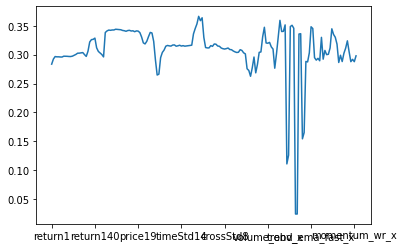

In [119]:
check.loc['std'].plot()

In [121]:
test2

,return1,return2,return3,return4,return5,return6,return7,return8,return9,return10,...,trend_aroon_down_x,trend_aroon_ind_x,momentum_rsi_x,momentum_mfi_x,momentum_tsi_x,momentum_uo_x,momentum_stoch_x,momentum_stoch_signal_x,momentum_wr_x,momentum_ao_x
date,,,,,,,,,,,,,,,,,,,,,
2006-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008-12-12,0.315341,0.339489,0.461648,0.399148,0.441761,0.413352,0.430398,0.414773,0.426136,0.446023,...,0.161932,0.637784,0.610795,0.370739,0.761364,0.850852,0.622159,0.801136,0.622159,0.916193
2008-12-15,0.086525,0.104965,0.137589,0.214184,0.208511,0.239716,0.228369,0.269504,0.278014,0.286525,...,0.117730,0.637589,0.242553,0.021277,0.753191,0.512057,0.124823,0.543262,0.124823,0.893617
2008-12-16,0.956091,0.694051,0.562323,0.523371,0.587819,0.531161,0.573654,0.529037,0.536827,0.508499,...,0.046742,0.637394,0.685552,0.184136,0.757790,0.803116,0.780453,0.521246,0.780453,0.875354


In [168]:
withoutTarget

return1   return2   return3   return4   return5  \
entityID date                                                           
1034     2006-03-01  0.028760 -0.015813 -0.012377 -0.015813 -0.020151   
         2006-03-02 -0.025386  0.002645 -0.040797 -0.037448 -0.040797   
         2006-03-03 -0.045829 -0.070051 -0.043306 -0.084756 -0.081561   
         2006-03-06 -0.023151 -0.067920 -0.091581 -0.065455 -0.105946   
         2006-03-07 -0.027237 -0.049758 -0.093307 -0.116324 -0.090909   
...                       ...       ...       ...       ...       ...   
317260   2015-06-18 -0.030340 -0.041966 -0.056671 -0.078431 -0.078431   
         2015-06-19  0.003755 -0.026699 -0.038369 -0.053129 -0.074971   
         2015-06-22  0.031172  0.035044  0.003641 -0.008393 -0.023613   
         2015-06-23  0.015719  0.047382  0.051314  0.019417  0.007194   
         2015-06-24 -0.014286  0.001209  0.032419  0.036295  0.004854   

                      return6   return7   return8   return9  return10  ...  \
entityID date                                                          ...   
1034     2006-03-01  0.014672 -0.004797 -0.022920 -0.010178 -0.009548  ...   
         2006-03-02 -0.045025 -0.011086 -0.030061 -0.047724 -0.035305  ...   
         2006-03-03 -0.084756 -0.088791 -0.056407 -0.074512 -0.091366  ...   
         2006-03-06 -0.102825 -0.105946 -0.109887 -0.078252 -0.095939  ...   
         2006-03-07 -0.130297 -0.127261 -0.130297 -0.134131 -0.103358  ...   
...                       ...       ...       ...       ...       ...  ...   
317260   2015-06-18 -0.092045 -0.069849 -0.067678 -0.084765 -0.084765  ...   
         2015-06-19 -0.074971 -0.088636 -0.066356 -0.064177 -0.081329  ...   
         2015-06-22 -0.046136 -0.046136 -0.060227 -0.037253 -0.035006  ...   
         2015-06-23 -0.008264 -0.031142 -0.031142 -0.045455 -0.022119  ...   
         2015-06-24 -0.007194 -0.022432 -0.044983 -0.044983 -0.059091  ...   

                     trend_aroon_down  trend_aroon_ind  momentum_rsi  \
entityID date                                                          
1034     2006-03-01          0.998653         0.001347      0.081336   
         2006-03-02          0.996464         0.001360      0.030740   
         2006-03-03          0.997834         0.000812      0.005956   
         2006-03-06          0.998105         0.001083      0.004331   
         2006-03-07          0.994306         0.002711      0.003796   
...                               ...              ...           ...   
317260   2015-06-18          0.709034         0.532392      0.074647   
         2015-06-19          0.673151         0.533590      0.120335   
         2015-06-22          0.646099         0.518220      0.435278   
         2015-06-23          0.626386         0.500339      0.603304   
         2015-06-24          0.599184         0.497393      0.597597   

                     momentum_mfi  momentum_tsi  momentum_uo  momentum_stoch  \
entityID date                                                                  
1034     2006-03-01      0.214113      0.345543     0.081874        0.180447   
         2006-03-02      0.230413      0.327258     0.061480        0.028564   
         2006-03-03      0.100433      0.299946     0.002166        0.002436   
         2006-03-06      0.074445      0.272334     0.004873        0.013265   
         2006-03-07      0.035521      0.240781     0.004338        0.010304   
...                           ...           ...          ...             ...   
317260   2015-06-18      0.129792      0.421206     0.115221        0.172159   
         2015-06-19      0.363040      0.409410     0.093418        0.248586   
         2015-06-22      0.350548      0.405097     0.180192        0.400402   
         2015-06-23      0.540620      0.406879     0.210907        0.530889   
         2015-06-24      0.555883      0.407844     0.226026        0.514623   

                     momentum_stoch_signal  momentum_wr  momentum_ao  
entityID

In [30]:
test.loc['std'][0:31]

return1      0.280291
return2      0.286326
return3      0.321145
return4      0.363101
return5      0.399021
return6      0.455792
return7      0.482090
return8      0.515212
return9      0.534142
return10     0.551124
return11     0.573360
return12     0.569545
return13     0.573771
return14     0.562948
return15     0.552378
return16     0.554217
return17     0.551415
return18     0.542496
return19     0.537288
return20     0.532612
return40     0.392291
return60     0.471837
return80     0.708871
return100    0.538452
return120    0.813310
return140    0.593253
return160    0.632858
return180    0.668704
return200    0.805932
return220    0.861852
return240    1.112037
Name: std, dtype: float64

In [9]:
target=mainFrame.iloc[:,-7].to_frame()

In [10]:
target

ztargetMedian5
entityID date                      
1034     2006-03-01           False
         2006-03-02           False
         2006-03-03           False
         2006-03-06            True
         2006-03-07           False
...                             ...
317260   2015-06-18            True
         2015-06-19            True
         2015-06-22           False
         2015-06-23           False
         2015-06-24           False

[7241001 rows x 1 columns]

In [11]:
mainFrame

return1   return2   return3   return4   return5  \
entityID date                                                           
1034     2006-03-01  0.028760 -0.015813 -0.012377 -0.015813 -0.020151   
         2006-03-02 -0.025386  0.002645 -0.040797 -0.037448 -0.040797   
         2006-03-03 -0.045829 -0.070051 -0.043306 -0.084756 -0.081561   
         2006-03-06 -0.023151 -0.067920 -0.091581 -0.065455 -0.105946   
         2006-03-07 -0.027237 -0.049758 -0.093307 -0.116324 -0.090909   
...                       ...       ...       ...       ...       ...   
317260   2015-06-18 -0.030340 -0.041966 -0.056671 -0.078431 -0.078431   
         2015-06-19  0.003755 -0.026699 -0.038369 -0.053129 -0.074971   
         2015-06-22  0.031172  0.035044  0.003641 -0.008393 -0.023613   
         2015-06-23  0.015719  0.047382  0.051314  0.019417  0.007194   
         2015-06-24 -0.014286  0.001209  0.032419  0.036295  0.004854   

                      return6   return7   return8   return9  return10  ...  \
entityID date                                                          ...   
1034     2006-03-01  0.014672 -0.004797 -0.022920 -0.010178 -0.009548  ...   
         2006-03-02 -0.045025 -0.011086 -0.030061 -0.047724 -0.035305  ...   
         2006-03-03 -0.084756 -0.088791 -0.056407 -0.074512 -0.091366  ...   
         2006-03-06 -0.102825 -0.105946 -0.109887 -0.078252 -0.095939  ...   
         2006-03-07 -0.130297 -0.127261 -0.130297 -0.134131 -0.103358  ...   
...                       ...       ...       ...       ...       ...  ...   
317260   2015-06-18 -0.092045 -0.069849 -0.067678 -0.084765 -0.084765  ...   
         2015-06-19 -0.074971 -0.088636 -0.066356 -0.064177 -0.081329  ...   
         2015-06-22 -0.046136 -0.046136 -0.060227 -0.037253 -0.035006  ...   
         2015-06-23 -0.008264 -0.031142 -0.031142 -0.045455 -0.022119  ...   
         2015-06-24 -0.007194 -0.022432 -0.044983 -0.044983 -0.059091  ...   

                     momentum_stoch_signal  momentum_wr  momentum_ao  \
entityID date                                                          
1034     2006-03-01               0.074603     0.180447     0.070832   
         2006-03-02               0.024755     0.028564     0.054679   
         2006-03-03               0.028695     0.002436     0.036275   
         2006-03-06               0.004061     0.013265     0.020303   
         2006-03-07               0.002440     0.010304     0.013015   
...                                    ...          ...          ...   
317260   2015-06-18               0.156019     0.172159     0.715086   
         2015-06-19               0.175526     0.248586     0.641258   
         2015-06-22               0.270959     0.400402     0.590208   
         2015-06-23               0.388549     0.530889     0.579543   
         2015-06-24               0.484244     0.514623     0.591703   

                     ztargetMedian5  ztargetReturns5  ztargetPositive5  \
entityID date                                                            
1034     2006-03-01           False        -0.083869             False   
         2006-03-02           False        -0.089680             False   
         2006-03-03           False        -0.049758             False   
         2006-03-06            True         0.004245              True   
         2006-03-07           False        -0.001455             False   
...                             ...              ...               ...   
317260   2015-06-18            True         0.007509              True   
         2015-06-19            True         0.002494              True   
         2015-06-22           False        -0.027811             False   
         2015-06-23           False        -0.030952             False   
         2015-06-24           False        -0.042271             False   

                     ztargetTopDown5  ztargetTop5  ztargetDown5  yReturns5  
entityID date                                                               
103

In [17]:
hi=TimeseriesGenerator(np.array(train),np.array(target),20,batch_size=1)



KeyboardInterrupt: 

In [ ]:
x,y=hi[25]
train

In [ ]:
entityIDs

In [12]:
import keras
import numpy as np
class DataGenerator(keras.utils.Sequence):
    def __init__(self, feature,target, length, batch_size=128):
        entityIDs=feature.index.get_level_values(0).unique()
        self.tgs = list()
        for i in tqdm(entityIDs):
         
            featuredf = feature[feature.index.get_level_values(0) == i]
            targetdf = target[target.index.get_level_values(0) == i]
            if len(targetdf)>length:
                self.tgs.append(TimeseriesGenerator(featuredf.values,targetdf.values,length,batch_size =batch_size))
        self.len = sum([len(tg) for tg in self.tgs])
        self.idx_i = list()
        self.idx_j = list()

        for i, tg in enumerate(self.tgs):
            self.idx_i.extend(list(range(len(tg))))
            self.idx_j.extend([i]*len(tg))    
        #print ( self.idx_i,  self.idx_j)

    def __len__(self):
        return self.len

    def __getitem__(self, index):
        return self.tgs[self.idx_j[index]][self.idx_i[index]]

# Test
H = DataGenerator(train,target,20,1)


100%|██████████| 5460/5460 [23:24<00:00,  3.89it/s]


In [13]:
import pickle

In [ ]:
H

In [ ]:
len(g)

In [ ]:
import pickle
import tqdm

In [14]:
pickle.dump(H, open( "/beegfs/sr4376/Finance Data/DataForCNNLSTM.pickle", "wb" ) )

In [19]:
trainData=list()
for ii in tqdm(range(0,len(H))):
    trainData.append(H[ii][0].reshape((1,20,377,1)))


100%|█████████▉| 7132521/7132522 [09:53<00:00, 12023.32it/s]


IndexError: list index out of range

In [20]:
trainData

[array([[[[ 0.02876033],
          [-0.01581278],
          [-0.01237702],
          ...,
          [ 0.07460275],
          [ 0.18044708],
          [ 0.07083221]],
 
         [[-0.0253856 ],
          [ 0.00264463],
          [-0.04079696],
          ...,
          [ 0.02475517],
          [ 0.02856366],
          [ 0.054679  ]],
 
         [[-0.04582921],
          [-0.07005141],
          [-0.04330579],
          ...,
          [ 0.02869518],
          [ 0.00243638],
          [ 0.03627504]],
 
         ...,
 
         [[ 0.00716981],
          [ 0.01870229],
          [-0.01001484],
          ...,
          [ 0.04755471],
          [ 0.1080789 ],
          [ 0.01567144]],
 
         [[ 0.00974148],
          [ 0.01698113],
          [ 0.02862595],
          ...,
          [ 0.11465309],
          [ 0.19421377],
          [ 0.01875167]],
 
         [[-0.0174397 ],
          [-0.00786812],
          [-0.00075472],
          ...,
          [ 0.12537072],
          [ 0.11997843],
    

In [18]:
import keras
import numpy as np
class DataGenerator(keras.utils.Sequence):
    def __init__(self, feature,target, length, batch_size=128):
        entityIDs=feature.index.get_level_values(0).unique()
        self.tgs = list()
        self.indexObject = None
        for i in tqdm(entityIDs):
         
            featuredf = feature[feature.index.get_level_values(0) == i]
            targetdf = target[target.index.get_level_values(0) == i]
            tmpIDX=pd.DataFrame([featuredf.index.get_level_values(0).values,featuredf.index.get_level_values(1).values]).T
            
            if self.indexObject is None:
                self.indexObject = tmpIDX.iloc[length:]
            else:
                self.indexObject = self.indexObject.append(tmpIDX.iloc[length:])
                
            if len(targetdf)>length:
                self.tgs.append(TimeseriesGenerator(featuredf.values,targetdf.values,length,batch_size =batch_size))
        self.len = sum([len(tg) for tg in self.tgs])
        self.idx_i = list()
        self.idx_j = list()

        for i, tg in enumerate(self.tgs):
            self.idx_i.extend(list(range(len(tg))))
            self.idx_j.extend([i]*len(tg))    
        #print ( self.idx_i,  self.idx_j)

    def __len__(self):
        return self.len

    def __getitem__(self, index):
        return self.tgs[self.idx_j[index]][self.idx_i[index]]

# Test
H = DataGenerator(train,target,20,1)

100%|██████████| 5460/5460 [51:28<00:00,  1.77it/s]  


In [23]:
desc=mainFrame.describe()

In [ ]:
import keras
import numpy as np
class DataGenerator(keras.utils.Sequence):
    def __init__(self, dt, length, batch_size=128):
        self.tgs = list()
        for i in range(dt['ids'].min(),dt['ids'].max()+1):
            adf = dt[dt['ids'] == i]
            self.tgs.append(TimeseriesGenerator(adf.values,adf.values,length,batch_size =batch_size))
        self.len = sum([len(tg) for tg in self.tgs])
        self.idx_i = list()
        self.idx_j = list()

        for i, tg in enumerate(self.tgs):
            self.idx_i.extend(list(range(len(tg))))
            self.idx_j.extend([i]*len(tg))    
        #print ( self.idx_i,  self.idx_j)

    def __len__(self):
        return self.len

    def __getitem__(self, index):
        return self.tgs[self.idx_j[index]][self.idx_i[index]]

# Test
g = DataGenerator(dt,3,3)
for i in range(len(g)):
    print (g[i])

In [ ]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None


keras.
for ii in tqdm(entityIDs):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):
        testData=pd.read_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex)),'gzip')
        flat_list = [item for sublist in np.array(testData) for item in sublist]
        dataCheck=np.reshape(flat_list,(np.shape(flat_list)[0],np.shape(flat_list)[1],np.shape(flat_list)[2],1))
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
            
        if counter >50:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(stockDateIndex)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1

In [12]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(np.arange(0,106)):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex))):
        testData=np.load(file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex)))
        dataCheck=testData['arr']
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
        print(np.shape(cnnLSTMFeature))    
        if counter >9:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(51)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1
        
        





  0%|          | 0/106 [00:00<?, ?it/s]

0






  1%|          | 1/106 [00:07<12:46,  7.30s/it]

(90104, 10, 377, 1)
(90104, 10, 377, 1)
1
(87847, 10, 377, 1)






  2%|▏         | 2/106 [00:18<14:32,  8.39s/it]

(177951, 10, 377, 1)
2
(98730, 10, 377, 1)






  3%|▎         | 3/106 [00:32<17:36, 10.26s/it]

(276681, 10, 377, 1)
3
(98751, 10, 377, 1)






  4%|▍         | 4/106 [00:49<20:39, 12.15s/it]

(375432, 10, 377, 1)
4
(88979, 10, 377, 1)






  5%|▍         | 5/106 [01:08<23:48, 14.15s/it]

(464411, 10, 377, 1)
5
(83853, 10, 377, 1)






  6%|▌         | 6/106 [01:29<27:02, 16.23s/it]

(548264, 10, 377, 1)
6
(88922, 10, 377, 1)






  7%|▋         | 7/106 [01:52<30:13, 18.32s/it]

(637186, 10, 377, 1)
7
(89839, 10, 377, 1)






  8%|▊         | 8/106 [02:18<33:39, 20.61s/it]

(727025, 10, 377, 1)
8
(84743, 10, 377, 1)






  8%|▊         | 9/106 [02:48<37:52, 23.42s/it]

(811768, 10, 377, 1)
9
(100569, 10, 377, 1)






  9%|▉         | 10/106 [03:25<44:11, 27.62s/it]

(912337, 10, 377, 1)
10
(72462, 10, 377, 1)
(984799, 10, 377, 1)






 10%|█         | 11/106 [11:20<4:16:02, 161.71s/it]

11






 11%|█▏        | 12/106 [11:25<2:59:39, 114.67s/it]

(57522, 10, 377, 1)
(57522, 10, 377, 1)
12
(70640, 10, 377, 1)






 12%|█▏        | 13/106 [11:34<2:08:39, 83.01s/it] 

(128162, 10, 377, 1)
13
(73181, 10, 377, 1)






 13%|█▎        | 14/106 [11:45<1:33:57, 61.27s/it]

(201343, 10, 377, 1)
14
(94676, 10, 377, 1)






 14%|█▍        | 15/106 [11:59<1:11:42, 47.28s/it]

(296019, 10, 377, 1)
15
(49659, 10, 377, 1)






 15%|█▌        | 16/106 [12:11<55:06, 36.74s/it]  

(345678, 10, 377, 1)
16
(52610, 10, 377, 1)






 16%|█▌        | 17/106 [12:25<44:19, 29.89s/it]

(398288, 10, 377, 1)
17
(35889, 10, 377, 1)






 17%|█▋        | 18/106 [12:38<36:27, 24.86s/it]

(434177, 10, 377, 1)
18
(23868, 10, 377, 1)






 18%|█▊        | 19/106 [12:52<30:59, 21.37s/it]

(458045, 10, 377, 1)
19
(24335, 10, 377, 1)






 19%|█▉        | 20/106 [13:05<27:21, 19.09s/it]

(482380, 10, 377, 1)
20
(16608, 10, 377, 1)
(498988, 10, 377, 1)






 20%|█▉        | 21/106 [17:06<2:01:09, 85.53s/it]

21






 21%|██        | 22/106 [17:09<1:25:12, 60.86s/it]

(32226, 10, 377, 1)
(32226, 10, 377, 1)
22
(29569, 10, 377, 1)






 22%|██▏       | 23/106 [17:13<1:00:34, 43.79s/it]

(61795, 10, 377, 1)
23
(39195, 10, 377, 1)






 23%|██▎       | 24/106 [17:19<44:09, 32.31s/it]  

(100990, 10, 377, 1)
24
(63098, 10, 377, 1)






 24%|██▎       | 25/106 [17:28<34:09, 25.30s/it]

(164088, 10, 377, 1)
25
(79131, 10, 377, 1)






 25%|██▍       | 26/106 [17:40<28:36, 21.46s/it]

(243219, 10, 377, 1)
26
(85113, 10, 377, 1)






 25%|██▌       | 27/106 [17:54<25:27, 19.33s/it]

(328332, 10, 377, 1)
27
(81761, 10, 377, 1)






 26%|██▋       | 28/106 [18:12<24:16, 18.67s/it]

(410093, 10, 377, 1)
28
(87346, 10, 377, 1)






 27%|██▋       | 29/106 [18:38<27:04, 21.09s/it]

(497439, 10, 377, 1)
29
(77730, 10, 377, 1)






 28%|██▊       | 30/106 [18:57<25:57, 20.49s/it]

(575169, 10, 377, 1)
30
(71430, 10, 377, 1)
(646599, 10, 377, 1)






 29%|██▉       | 31/106 [24:14<2:16:37, 109.30s/it]

31






 30%|███       | 32/106 [24:21<1:37:00, 78.66s/it] 

(85991, 10, 377, 1)
(85991, 10, 377, 1)
32
(79980, 10, 377, 1)






 31%|███       | 33/106 [24:31<1:10:43, 58.13s/it]

(165971, 10, 377, 1)
33
(89490, 10, 377, 1)






 32%|███▏      | 34/106 [24:45<53:34, 44.65s/it]  

(255461, 10, 377, 1)
34
(85012, 10, 377, 1)






 33%|███▎      | 35/106 [24:59<42:12, 35.67s/it]

(340473, 10, 377, 1)
35
(77757, 10, 377, 1)






 34%|███▍      | 36/106 [25:16<35:00, 30.01s/it]

(418230, 10, 377, 1)
36
(86565, 10, 377, 1)






 35%|███▍      | 37/106 [25:35<30:47, 26.77s/it]

(504795, 10, 377, 1)
37
(77739, 10, 377, 1)






 36%|███▌      | 38/106 [25:58<28:56, 25.54s/it]

(582534, 10, 377, 1)
38
(62132, 10, 377, 1)






 37%|███▋      | 39/106 [26:24<28:35, 25.61s/it]

(644666, 10, 377, 1)
39
(67621, 10, 377, 1)






 38%|███▊      | 40/106 [26:46<27:12, 24.73s/it]

(712287, 10, 377, 1)
40
(58628, 10, 377, 1)
(770915, 10, 377, 1)






 39%|███▊      | 41/106 [32:55<2:18:36, 127.95s/it]

41






 40%|███▉      | 42/106 [33:01<1:37:23, 91.31s/it] 

(70282, 10, 377, 1)
(70282, 10, 377, 1)
42
(73578, 10, 377, 1)






 41%|████      | 43/106 [33:11<1:10:10, 66.83s/it]

(143860, 10, 377, 1)
43
(60744, 10, 377, 1)






 42%|████▏     | 44/106 [33:21<51:31, 49.87s/it]  

(204604, 10, 377, 1)
44
(78793, 10, 377, 1)






 42%|████▏     | 45/106 [33:40<41:14, 40.57s/it]

(283397, 10, 377, 1)
45
(73413, 10, 377, 1)






 43%|████▎     | 46/106 [33:57<33:34, 33.57s/it]

(356810, 10, 377, 1)
46
(60149, 10, 377, 1)






 44%|████▍     | 47/106 [34:12<27:25, 27.90s/it]

(416959, 10, 377, 1)
47
(62342, 10, 377, 1)






 45%|████▌     | 48/106 [34:27<23:24, 24.21s/it]

(479301, 10, 377, 1)
48
(80273, 10, 377, 1)






 46%|████▌     | 49/106 [34:47<21:49, 22.97s/it]

(559574, 10, 377, 1)
49
(82485, 10, 377, 1)






 47%|████▋     | 50/106 [35:10<21:23, 22.93s/it]

(642059, 10, 377, 1)
50
(71912, 10, 377, 1)
(713971, 10, 377, 1)






 48%|████▊     | 51/106 [40:56<1:49:52, 119.86s/it]

51






 49%|████▉     | 52/106 [41:03<1:17:11, 85.77s/it] 

(73784, 10, 377, 1)
(73784, 10, 377, 1)
52
(80780, 10, 377, 1)






 50%|█████     | 53/106 [41:14<56:02, 63.44s/it]  

(154564, 10, 377, 1)
53
(60727, 10, 377, 1)






 51%|█████     | 54/106 [41:30<42:45, 49.33s/it]

(215291, 10, 377, 1)
54
(76964, 10, 377, 1)






 52%|█████▏    | 55/106 [41:43<32:37, 38.38s/it]

(292255, 10, 377, 1)
55
(85252, 10, 377, 1)






 53%|█████▎    | 56/106 [41:59<26:13, 31.48s/it]

(377507, 10, 377, 1)
56
(76214, 10, 377, 1)






 54%|█████▍    | 57/106 [42:15<21:55, 26.85s/it]

(453721, 10, 377, 1)
57
(88689, 10, 377, 1)






 55%|█████▍    | 58/106 [42:36<20:05, 25.12s/it]

(542410, 10, 377, 1)
58
(91078, 10, 377, 1)






 56%|█████▌    | 59/106 [43:00<19:35, 25.00s/it]

(633488, 10, 377, 1)
59
(88616, 10, 377, 1)






 57%|█████▋    | 60/106 [43:25<19:09, 24.99s/it]

(722104, 10, 377, 1)
60
(76633, 10, 377, 1)
(798737, 10, 377, 1)






 58%|█████▊    | 61/106 [49:52<1:40:01, 133.36s/it]

61






 58%|█████▊    | 62/106 [49:59<1:10:09, 95.67s/it] 

(94305, 10, 377, 1)
(94305, 10, 377, 1)
62
(76571, 10, 377, 1)






 59%|█████▉    | 63/106 [50:10<50:16, 70.16s/it]  

(170876, 10, 377, 1)
63
(97030, 10, 377, 1)






 60%|██████    | 64/106 [50:25<37:29, 53.55s/it]

(267906, 10, 377, 1)
64
(88701, 10, 377, 1)






 61%|██████▏   | 65/106 [50:41<28:52, 42.25s/it]

(356607, 10, 377, 1)
65
(81737, 10, 377, 1)






 62%|██████▏   | 66/106 [50:58<23:08, 34.70s/it]

(438344, 10, 377, 1)
66
(77851, 10, 377, 1)






 63%|██████▎   | 67/106 [51:18<19:42, 30.32s/it]

(516195, 10, 377, 1)
67
(74342, 10, 377, 1)






 64%|██████▍   | 68/106 [51:38<17:22, 27.43s/it]

(590537, 10, 377, 1)
68
(79107, 10, 377, 1)






 65%|██████▌   | 69/106 [52:06<16:52, 27.35s/it]

(669644, 10, 377, 1)
69
(80256, 10, 377, 1)






 66%|██████▌   | 70/106 [52:33<16:24, 27.35s/it]

(749900, 10, 377, 1)
70
(78457, 10, 377, 1)
(828357, 10, 377, 1)






 67%|██████▋   | 71/106 [59:18<1:22:04, 140.70s/it]

71






 68%|██████▊   | 72/106 [59:25<56:57, 100.53s/it]  

(82288, 10, 377, 1)
(82288, 10, 377, 1)
72
(77200, 10, 377, 1)






 69%|██████▉   | 73/106 [59:35<40:24, 73.46s/it] 

(159488, 10, 377, 1)
73
(83642, 10, 377, 1)






 70%|██████▉   | 74/106 [59:48<29:25, 55.18s/it]

(243130, 10, 377, 1)
74
(71651, 10, 377, 1)






 71%|███████   | 75/106 [1:00:01<21:58, 42.55s/it]

(314781, 10, 377, 1)
75
(40940, 10, 377, 1)






 72%|███████▏  | 76/106 [1:00:13<16:40, 33.36s/it]

(355721, 10, 377, 1)
76
(21158, 10, 377, 1)






 73%|███████▎  | 77/106 [1:00:25<13:05, 27.09s/it]

(376879, 10, 377, 1)
77
(48281, 10, 377, 1)






 74%|███████▎  | 78/106 [1:00:44<11:24, 24.46s/it]

(425160, 10, 377, 1)
78
(85461, 10, 377, 1)






 75%|███████▍  | 79/106 [1:01:03<10:19, 22.96s/it]

(510621, 10, 377, 1)
79
(85033, 10, 377, 1)






 75%|███████▌  | 80/106 [1:01:25<09:48, 22.64s/it]

(595654, 10, 377, 1)
80
(81688, 10, 377, 1)
(677342, 10, 377, 1)






 76%|███████▋  | 81/106 [1:06:56<47:55, 115.04s/it]

81






 77%|███████▋  | 82/106 [1:07:00<32:42, 81.75s/it] 

(48041, 10, 377, 1)
(48041, 10, 377, 1)
82
(73345, 10, 377, 1)






 78%|███████▊  | 83/106 [1:07:09<22:58, 59.96s/it]

(121386, 10, 377, 1)
83
(70336, 10, 377, 1)






 79%|███████▉  | 84/106 [1:07:19<16:34, 45.19s/it]

(191722, 10, 377, 1)
84
(60208, 10, 377, 1)






 80%|████████  | 85/106 [1:07:32<12:25, 35.50s/it]

(251930, 10, 377, 1)
85
(70710, 10, 377, 1)






 81%|████████  | 86/106 [1:07:46<09:35, 28.79s/it]

(322640, 10, 377, 1)
86
(67063, 10, 377, 1)






 82%|████████▏ | 87/106 [1:08:00<07:46, 24.53s/it]

(389703, 10, 377, 1)
87
(60364, 10, 377, 1)






 83%|████████▎ | 88/106 [1:08:22<07:07, 23.76s/it]

(450067, 10, 377, 1)
88
(58153, 10, 377, 1)






 84%|████████▍ | 89/106 [1:08:38<06:04, 21.42s/it]

(508220, 10, 377, 1)
89
(63924, 10, 377, 1)






 85%|████████▍ | 90/106 [1:08:57<05:33, 20.82s/it]

(572144, 10, 377, 1)
90
(60341, 10, 377, 1)
(632485, 10, 377, 1)






 86%|████████▌ | 91/106 [1:14:04<26:39, 106.62s/it]

91






 87%|████████▋ | 92/106 [1:14:09<17:43, 75.99s/it] 

(52798, 10, 377, 1)
(52798, 10, 377, 1)
92
(46131, 10, 377, 1)






 88%|████████▊ | 93/106 [1:14:15<11:55, 55.01s/it]

(98929, 10, 377, 1)
93
(52276, 10, 377, 1)






 89%|████████▊ | 94/106 [1:14:23<08:12, 41.03s/it]

(151205, 10, 377, 1)
94
(47122, 10, 377, 1)






 90%|████████▉ | 95/106 [1:14:32<05:46, 31.49s/it]

(198327, 10, 377, 1)
95
(47217, 10, 377, 1)






 91%|█████████ | 96/106 [1:14:42<04:09, 24.92s/it]

(245544, 10, 377, 1)
96
(41460, 10, 377, 1)






 92%|█████████▏| 97/106 [1:14:52<03:05, 20.57s/it]

(287004, 10, 377, 1)
97
(39775, 10, 377, 1)






 92%|█████████▏| 98/106 [1:15:03<02:21, 17.64s/it]

(326779, 10, 377, 1)
98
(36706, 10, 377, 1)






 93%|█████████▎| 99/106 [1:15:14<01:49, 15.62s/it]

(363485, 10, 377, 1)
99
(37632, 10, 377, 1)






 94%|█████████▍| 100/106 [1:15:29<01:32, 15.39s/it]

(401117, 10, 377, 1)
100
(37188, 10, 377, 1)
(438305, 10, 377, 1)






 95%|█████████▌| 101/106 [1:19:03<06:14, 74.92s/it]

101






 96%|█████████▌| 102/106 [1:19:06<03:33, 53.34s/it]

(35050, 10, 377, 1)
(35050, 10, 377, 1)
102
(29898, 10, 377, 1)






 97%|█████████▋| 103/106 [1:19:10<01:56, 38.67s/it]

(64948, 10, 377, 1)
103
(29920, 10, 377, 1)






 98%|█████████▊| 104/106 [1:19:15<00:57, 28.50s/it]

(94868, 10, 377, 1)
104
(26041, 10, 377, 1)






 99%|█████████▉| 105/106 [1:19:20<00:21, 21.56s/it]

(120909, 10, 377, 1)
105
(62774, 10, 377, 1)






100%|██████████| 106/106 [1:19:30<00:00, 45.01s/it]

(183683, 10, 377, 1)


In [13]:
np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(51)))
            

In [15]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 51
cnnLSTMTargets = None
for ii in tqdm(np.arange(0,11)):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex))):
        testData=np.load(file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex)))
        dataCheck=testData['arr']
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
        print(np.shape(cnnLSTMFeature))    
        if counter >10:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(500)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1
        






  0%|          | 0/11 [00:00<?, ?it/s]

0







  9%|▉         | 1/11 [01:18<13:00, 78.01s/it]

(984799, 10, 377, 1)
(984799, 10, 377, 1)
1
(498988, 10, 377, 1)







 18%|█▊        | 2/11 [02:41<11:56, 79.56s/it]

(1483787, 10, 377, 1)
2
(646599, 10, 377, 1)







 27%|██▋       | 3/11 [04:35<12:00, 90.08s/it]

(2130386, 10, 377, 1)
3
(770915, 10, 377, 1)







 36%|███▋      | 4/11 [07:09<12:43, 109.13s/it]

(2901301, 10, 377, 1)
4
(713971, 10, 377, 1)







 45%|████▌     | 5/11 [10:00<12:47, 127.86s/it]

(3615272, 10, 377, 1)
5
(798737, 10, 377, 1)







 55%|█████▍    | 6/11 [13:12<12:14, 146.94s/it]

(4414009, 10, 377, 1)
6
(828357, 10, 377, 1)







 64%|██████▎   | 7/11 [16:56<11:20, 170.09s/it]

(5242366, 10, 377, 1)
7
(677342, 10, 377, 1)







 73%|███████▎  | 8/11 [20:58<09:34, 191.58s/it]

(5919708, 10, 377, 1)
8
(632485, 10, 377, 1)







 82%|████████▏ | 9/11 [25:33<07:13, 216.60s/it]

(6552193, 10, 377, 1)
9
(438305, 10, 377, 1)







 91%|█████████ | 10/11 [30:39<04:03, 243.52s/it]

(6990498, 10, 377, 1)
10
(183683, 10, 377, 1)







100%|██████████| 11/11 [35:50<00:00, 195.52s/it]

(7174181, 10, 377, 1)


In [16]:
 np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(500)))
           

In [48]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(entityIDs):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):
        testData=pd.read_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex)),'gzip')
        flat_list = [item for sublist in np.array(testData) for item in sublist]
        dataCheck=np.reshape(flat_list,(np.shape(flat_list)[0],np.shape(flat_list)[1],np.shape(flat_list)[2],1))
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
            
        if counter >50:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(stockDateIndex)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1
        
        
        











  0%|          | 0/5460 [00:00<?, ?it/s]








  0%|          | 1/5460 [00:00<13:16,  6.86it/s]

1034
(699, 10, 377, 1)
1045











  0%|          | 2/5460 [00:00<27:30,  3.31it/s]

(2082, 10, 377, 1)
1050


(2471, 10, 377, 1)


  0%|          | 3/5460 [00:01<44:43,  2.03it/s]

1056
(492, 10, 377, 1)











  0%|          | 4/5460 [00:02<42:36,  2.13it/s]

1062
(2476, 10, 377, 1)











  0%|          | 5/5460 [00:03<56:44,  1.60it/s]

1072
(2476, 10, 377, 1)











  0%|          | 6/5460 [00:04<1:11:38,  1.27it/s]

1075
(2476, 10, 377, 1)











  0%|          | 7/5460 [00:05<1:25:23,  1.06it/s]

1076
(920, 10, 377, 1)











  0%|          | 8/5460 [00:06<1:23:19,  1.09it/s]

1078
(2476, 10, 377, 1)











  0%|          | 9/5460 [00:07<1:36:52,  1.07s/it]

1081
(543, 10, 377, 1)











  0%|          | 10/5460 [00:08<1:30:39,  1.00it/s]

1084
(387, 10, 377, 1)











  0%|          | 11/5460 [00:09<1:25:32,  1.06it/s]

1094
(2476, 10, 377, 1)











  0%|          | 12/5460 [00:11<1:41:38,  1.12s/it]

1104
(207, 10, 377, 1)











  0%|          | 13/5460 [00:11<1:35:54,  1.06s/it]

1177
(2476, 10, 377, 1)











  0%|          | 14/5460 [00:13<1:50:27,  1.22s/it]

1186
(2476, 10, 377, 1)











  0%|          | 15/5460 [00:15<2:02:46,  1.35s/it]

1209
(2476, 10, 377, 1)











  0%|          | 16/5460 [00:16<2:09:19,  1.43s/it]

1210
(1219, 10, 377, 1)











  0%|          | 17/5460 [00:18<2:07:20,  1.40s/it]

1230
(2476, 10, 377, 1)











  0%|          | 18/5460 [00:19<2:14:40,  1.48s/it]

1234
(781, 10, 377, 1)











  0%|          | 19/5460 [00:21<2:07:01,  1.40s/it]

1239
(1433, 10, 377, 1)











  0%|          | 20/5460 [00:22<2:07:15,  1.40s/it]

1240
(189, 10, 377, 1)











  0%|          | 21/5460 [00:23<2:00:19,  1.33s/it]

1243
(556, 10, 377, 1)











  0%|          | 22/5460 [00:24<2:00:58,  1.33s/it]

1246
(799, 10, 377, 1)











  0%|          | 23/5460 [00:26<1:57:19,  1.29s/it]

1254
(2476, 10, 377, 1)











  0%|          | 24/5460 [00:28<2:11:28,  1.45s/it]

1257
(2165, 10, 377, 1)











  0%|          | 25/5460 [00:29<2:21:36,  1.56s/it]

1266
(2476, 10, 377, 1)











  0%|          | 26/5460 [00:31<2:33:08,  1.69s/it]

1274
(2476, 10, 377, 1)











  0%|          | 27/5460 [00:33<2:42:21,  1.79s/it]

1279
(1382, 10, 377, 1)











  1%|          | 28/5460 [00:35<2:40:42,  1.78s/it]

1380
(2476, 10, 377, 1)











  1%|          | 29/5460 [00:37<2:47:53,  1.85s/it]

1382
(2082, 10, 377, 1)











  1%|          | 30/5460 [00:39<2:52:26,  1.91s/it]

1393
(2476, 10, 377, 1)











  1%|          | 31/5460 [00:41<2:59:38,  1.99s/it]

1439
(2476, 10, 377, 1)











  1%|          | 32/5460 [00:43<3:02:33,  2.02s/it]

1440
(2476, 10, 377, 1)











  1%|          | 33/5460 [00:46<3:06:20,  2.06s/it]

1447
(2476, 10, 377, 1)











  1%|          | 34/5460 [00:48<3:13:56,  2.14s/it]

1449
(2476, 10, 377, 1)











  1%|          | 35/5460 [00:50<3:17:33,  2.19s/it]

1611
(1121, 10, 377, 1)











  1%|          | 36/5460 [00:52<3:14:32,  2.15s/it]

1613
(2161, 10, 377, 1)











  1%|          | 37/5460 [00:55<3:24:48,  2.27s/it]

1618
(835, 10, 377, 1)











  1%|          | 38/5460 [00:57<3:22:22,  2.24s/it]

1619
(298, 10, 377, 1)











  1%|          | 39/5460 [00:59<3:20:10,  2.22s/it]

1632
(2476, 10, 377, 1)











  1%|          | 40/5460 [01:02<3:33:42,  2.37s/it]

1633
(1, 10, 377, 1)











  1%|          | 41/5460 [01:04<3:32:27,  2.35s/it]

1706
(2476, 10, 377, 1)











  1%|          | 42/5460 [01:07<3:37:41,  2.41s/it]

1722
(2476, 10, 377, 1)











  1%|          | 43/5460 [01:10<4:06:04,  2.73s/it]

1783
(363, 10, 377, 1)











  1%|          | 44/5460 [01:12<3:47:35,  2.52s/it]

1794
(2476, 10, 377, 1)











  1%|          | 45/5460 [01:15<3:54:36,  2.60s/it]

1797
(352, 10, 377, 1)











  1%|          | 46/5460 [01:17<3:47:26,  2.52s/it]

1823
(2076, 10, 377, 1)











  1%|          | 47/5460 [01:20<3:54:46,  2.60s/it]

1837
(2476, 10, 377, 1)











  1%|          | 48/5460 [01:23<4:02:42,  2.69s/it]

1919
(2476, 10, 377, 1)











  1%|          | 49/5460 [01:26<4:06:31,  2.73s/it]

1920
(2476, 10, 377, 1)











  1%|          | 50/5460 [01:29<4:12:15,  2.80s/it]

1926
(2151, 10, 377, 1)











  1%|          | 51/5460 [01:32<4:17:39,  2.86s/it]

2008
(439, 10, 377, 1)











  1%|          | 52/5460 [02:17<23:26:16, 15.60s/it]

2019











  1%|          | 53/5460 [02:18<16:40:16, 11.10s/it]

(2476, 10, 377, 1)
2025











  1%|          | 54/5460 [02:18<11:56:45,  7.96s/it]

(2160, 10, 377, 1)
2033
(15, 10, 377, 1)











  1%|          | 55/5460 [02:19<8:26:25,  5.62s/it] 

2034
(341, 10, 377, 1)











  1%|          | 56/5460 [02:19<6:00:43,  4.01s/it]

2044
(2476, 10, 377, 1)











  1%|          | 57/5460 [02:20<4:32:49,  3.03s/it]

2049
(2476, 10, 377, 1)











  1%|          | 58/5460 [02:20<3:34:28,  2.38s/it]

2052
(295, 10, 377, 1)











  1%|          | 59/5460 [02:21<2:41:18,  1.79s/it]

2055
(2476, 10, 377, 1)











  1%|          | 60/5460 [02:22<2:17:39,  1.53s/it]

2061
(1039, 10, 377, 1)











  1%|          | 61/5460 [02:22<1:51:52,  1.24s/it]

2111
(1289, 10, 377, 1)











  1%|          | 62/5460 [02:23<1:39:10,  1.10s/it]

2113
(267, 10, 377, 1)











  1%|          | 63/5460 [02:24<1:23:27,  1.08it/s]

2136
(2374, 10, 377, 1)











  1%|          | 64/5460 [02:25<1:27:29,  1.03it/s]

2137
(2476, 10, 377, 1)











  1%|          | 65/5460 [02:26<1:33:44,  1.04s/it]

2146
(336, 10, 377, 1)











  1%|          | 66/5460 [02:27<1:25:26,  1.05it/s]

2150
(2093, 10, 377, 1)











  1%|          | 67/5460 [02:28<1:31:02,  1.01s/it]

2154
(2476, 10, 377, 1)











  1%|          | 68/5460 [02:29<1:38:58,  1.10s/it]

2162
(571, 10, 377, 1)











  1%|▏         | 69/5460 [02:30<1:33:38,  1.04s/it]

2163
(53, 10, 377, 1)











  1%|▏         | 70/5460 [02:31<1:27:20,  1.03it/s]

2328
(1663, 10, 377, 1)











  1%|▏         | 71/5460 [02:32<1:33:13,  1.04s/it]

2337
(1329, 10, 377, 1)











  1%|▏         | 72/5460 [02:33<1:37:03,  1.08s/it]

2346
(1318, 10, 377, 1)











  1%|▏         | 73/5460 [02:34<1:40:55,  1.12s/it]

2352
(2476, 10, 377, 1)











  1%|▏         | 74/5460 [02:36<1:49:25,  1.22s/it]

2369
(2476, 10, 377, 1)











  1%|▏         | 75/5460 [02:37<1:59:53,  1.34s/it]

2393
(2476, 10, 377, 1)











  1%|▏         | 76/5460 [02:39<2:06:13,  1.41s/it]

2403
(2476, 10, 377, 1)











  1%|▏         | 77/5460 [02:41<2:13:20,  1.49s/it]

2408
(353, 10, 377, 1)











  1%|▏         | 78/5460 [02:42<2:05:04,  1.39s/it]

2435
(2476, 10, 377, 1)











  1%|▏         | 79/5460 [02:44<2:16:09,  1.52s/it]

2436
(2476, 10, 377, 1)











  1%|▏         | 80/5460 [02:46<2:27:28,  1.64s/it]

2444
(2476, 10, 377, 1)











  1%|▏         | 81/5460 [02:48<2:40:23,  1.79s/it]

2448
(2476, 10, 377, 1)











  2%|▏         | 82/5460 [02:50<2:59:22,  2.00s/it]

2526
(2476, 10, 377, 1)











  2%|▏         | 83/5460 [02:52<3:01:50,  2.03s/it]

2536
(2476, 10, 377, 1)











  2%|▏         | 84/5460 [02:54<3:05:23,  2.07s/it]

2537
(577, 10, 377, 1)











  2%|▏         | 85/5460 [02:56<2:56:46,  1.97s/it]

2538
(2476, 10, 377, 1)











  2%|▏         | 86/5460 [02:59<3:04:58,  2.07s/it]

2547
(2331, 10, 377, 1)











  2%|▏         | 87/5460 [03:01<3:11:56,  2.14s/it]

2620
(800, 10, 377, 1)











  2%|▏         | 88/5460 [03:03<3:07:05,  2.09s/it]

2628
(2476, 10, 377, 1)











  2%|▏         | 89/5460 [03:05<3:15:07,  2.18s/it]

2662
(458, 10, 377, 1)











  2%|▏         | 90/5460 [03:07<3:09:52,  2.12s/it]

2663
(2476, 10, 377, 1)











  2%|▏         | 91/5460 [03:10<3:20:14,  2.24s/it]

2677
(291, 10, 377, 1)











  2%|▏         | 92/5460 [03:12<3:16:07,  2.19s/it]

2696
(2476, 10, 377, 1)











  2%|▏         | 93/5460 [03:14<3:27:29,  2.32s/it]

2697
(1883, 10, 377, 1)











  2%|▏         | 94/5460 [03:17<3:34:02,  2.39s/it]

2698
(2476, 10, 377, 1)











  2%|▏         | 95/5460 [03:20<3:43:20,  2.50s/it]

2731
(22, 10, 377, 1)











  2%|▏         | 96/5460 [03:22<3:41:10,  2.47s/it]

2751
(2476, 10, 377, 1)











  2%|▏         | 97/5460 [03:26<4:10:43,  2.81s/it]

2771
(2476, 10, 377, 1)











  2%|▏         | 98/5460 [03:29<4:13:39,  2.84s/it]

2783
(1722, 10, 377, 1)











  2%|▏         | 99/5460 [03:31<4:12:54,  2.83s/it]

2787
(2476, 10, 377, 1)











  2%|▏         | 100/5460 [03:34<4:17:21,  2.88s/it]

2802
(1906, 10, 377, 1)











  2%|▏         | 101/5460 [03:37<4:19:05,  2.90s/it]

2803
(461, 10, 377, 1)











  2%|▏         | 102/5460 [03:40<4:11:00,  2.81s/it]

2807
(2476, 10, 377, 1)











  2%|▏         | 103/5460 [04:24<22:42:16, 15.26s/it]

2811











  2%|▏         | 104/5460 [04:25<16:08:23, 10.85s/it]

(2333, 10, 377, 1)
2817











  2%|▏         | 105/5460 [04:26<11:35:46,  7.80s/it]

(2476, 10, 377, 1)
2818
(2476, 10, 377, 1)











  2%|▏         | 106/5460 [04:26<8:27:42,  5.69s/it] 

2829
(286, 10, 377, 1)











  2%|▏         | 107/5460 [04:27<6:03:32,  4.07s/it]

3024
(2476, 10, 377, 1)











  2%|▏         | 108/5460 [04:27<4:36:59,  3.11s/it]

3026
(2476, 10, 377, 1)











  2%|▏         | 109/5460 [04:28<3:38:01,  2.44s/it]

3028
(2476, 10, 377, 1)











  2%|▏         | 110/5460 [04:29<2:58:09,  2.00s/it]

3031
(1256, 10, 377, 1)











  2%|▏         | 111/5460 [04:30<2:25:37,  1.63s/it]

3036
(434, 10, 377, 1)











  2%|▏         | 112/5460 [04:31<1:56:48,  1.31s/it]

3062
(2476, 10, 377, 1)











  2%|▏         | 113/5460 [04:32<1:51:16,  1.25s/it]

3071
(1916, 10, 377, 1)











  2%|▏         | 114/5460 [04:33<1:46:06,  1.19s/it]

3082
(2476, 10, 377, 1)











  2%|▏         | 115/5460 [04:34<1:47:52,  1.21s/it]

3138
(2476, 10, 377, 1)











  2%|▏         | 116/5460 [04:35<1:50:42,  1.24s/it]

3144
(2476, 10, 377, 1)











  2%|▏         | 117/5460 [04:37<1:54:30,  1.29s/it]

3153
(2476, 10, 377, 1)











  2%|▏         | 118/5460 [04:38<1:58:48,  1.33s/it]

3157
(2476, 10, 377, 1)











  2%|▏         | 119/5460 [04:40<2:03:40,  1.39s/it]

3158
(2476, 10, 377, 1)











  2%|▏         | 120/5460 [04:41<2:08:32,  1.44s/it]

3231
(2476, 10, 377, 1)











  2%|▏         | 121/5460 [04:43<2:13:40,  1.50s/it]

3238
(2476, 10, 377, 1)











  2%|▏         | 122/5460 [04:45<2:19:21,  1.57s/it]

3382
(429, 10, 377, 1)











  2%|▏         | 123/5460 [04:46<2:11:49,  1.48s/it]

3394
(2476, 10, 377, 1)











  2%|▏         | 124/5460 [04:48<2:20:04,  1.57s/it]

3413
(2476, 10, 377, 1)











  2%|▏         | 125/5460 [04:50<2:27:20,  1.66s/it]

3416
(2476, 10, 377, 1)











  2%|▏         | 126/5460 [04:52<2:34:35,  1.74s/it]

3424
(2476, 10, 377, 1)











  2%|▏         | 127/5460 [04:54<2:41:53,  1.82s/it]

3429
(2476, 10, 377, 1)











  2%|▏         | 128/5460 [04:56<2:48:27,  1.90s/it]

3439
(2476, 10, 377, 1)











  2%|▏         | 129/5460 [04:58<2:57:46,  2.00s/it]

3505
(2476, 10, 377, 1)











  2%|▏         | 130/5460 [05:00<3:09:17,  2.13s/it]

3532
(2476, 10, 377, 1)











  2%|▏         | 131/5460 [05:03<3:26:22,  2.32s/it]

3555
(712, 10, 377, 1)











  2%|▏         | 132/5460 [05:05<3:13:29,  2.18s/it]

3556
(2457, 10, 377, 1)











  2%|▏         | 133/5460 [05:07<3:17:00,  2.22s/it]

3562
(2476, 10, 377, 1)











  2%|▏         | 134/5460 [05:10<3:22:09,  2.28s/it]

3570
(2476, 10, 377, 1)











  2%|▏         | 135/5460 [05:12<3:22:05,  2.28s/it]

3580
(2476, 10, 377, 1)











  2%|▏         | 136/5460 [05:14<3:22:52,  2.29s/it]

3581
(2476, 10, 377, 1)











  3%|▎         | 137/5460 [05:17<3:28:33,  2.35s/it]

3592
(176, 10, 377, 1)











  3%|▎         | 138/5460 [05:19<3:15:09,  2.20s/it]

3594
(1352, 10, 377, 1)











  3%|▎         | 139/5460 [05:21<3:13:24,  2.18s/it]

3607
(1061, 10, 377, 1)











  3%|▎         | 140/5460 [05:23<3:12:29,  2.17s/it]

3612
(810, 10, 377, 1)











  3%|▎         | 141/5460 [05:25<3:08:27,  2.13s/it]

3619
(2476, 10, 377, 1)











  3%|▎         | 142/5460 [05:27<3:18:31,  2.24s/it]

3622
(699, 10, 377, 1)











  3%|▎         | 143/5460 [05:29<3:15:40,  2.21s/it]

3639
(2476, 10, 377, 1)











  3%|▎         | 144/5460 [05:32<3:28:44,  2.36s/it]

3761
(680, 10, 377, 1)











  3%|▎         | 145/5460 [05:35<3:30:31,  2.38s/it]

3897
(2476, 10, 377, 1)











  3%|▎         | 146/5460 [05:38<3:57:38,  2.68s/it]

3905
(2476, 10, 377, 1)











  3%|▎         | 147/5460 [05:41<3:58:20,  2.69s/it]

3937
(2476, 10, 377, 1)











  3%|▎         | 148/5460 [05:43<3:59:35,  2.71s/it]

3946
(2476, 10, 377, 1)











  3%|▎         | 149/5460 [05:46<4:02:12,  2.74s/it]

3964
(1199, 10, 377, 1)











  3%|▎         | 150/5460 [05:49<3:58:06,  2.69s/it]

4001
(379, 10, 377, 1)











  3%|▎         | 151/5460 [05:51<3:50:53,  2.61s/it]

4016
(464, 10, 377, 1)











  3%|▎         | 152/5460 [05:54<3:45:49,  2.55s/it]

4029
(2476, 10, 377, 1)











  3%|▎         | 153/5460 [05:56<3:49:21,  2.59s/it]

4034
(379, 10, 377, 1)











  3%|▎         | 154/5460 [06:44<23:46:32, 16.13s/it]

4036











  3%|▎         | 155/5460 [06:45<16:53:18, 11.46s/it]

(2476, 10, 377, 1)
4040











  3%|▎         | 156/5460 [06:45<12:06:22,  8.22s/it]

(2476, 10, 377, 1)
4045
(2476, 10, 377, 1)











  3%|▎         | 157/5460 [06:46<8:46:37,  5.96s/it] 

4058
(2476, 10, 377, 1)











  3%|▎         | 158/5460 [06:48<6:50:46,  4.65s/it]

4060
(2476, 10, 377, 1)











  3%|▎         | 159/5460 [06:49<5:14:42,  3.56s/it]

4062
(576, 10, 377, 1)











  3%|▎         | 160/5460 [06:49<3:54:36,  2.66s/it]

4065
(957, 10, 377, 1)











  3%|▎         | 161/5460 [06:50<3:01:03,  2.05s/it]

4066
(2476, 10, 377, 1)











  3%|▎         | 162/5460 [06:51<2:35:15,  1.76s/it]

4087
(2476, 10, 377, 1)











  3%|▎         | 163/5460 [06:52<2:19:45,  1.58s/it]

4091
(2476, 10, 377, 1)











  3%|▎         | 164/5460 [06:53<2:10:42,  1.48s/it]

4093
(2476, 10, 377, 1)











  3%|▎         | 165/5460 [06:55<2:04:43,  1.41s/it]

4094
(2476, 10, 377, 1)











  3%|▎         | 166/5460 [06:56<2:02:28,  1.39s/it]

4103
(439, 10, 377, 1)











  3%|▎         | 167/5460 [06:57<1:47:40,  1.22s/it]

4108
(2476, 10, 377, 1)











  3%|▎         | 168/5460 [06:58<1:49:02,  1.24s/it]

4127
(2003, 10, 377, 1)











  3%|▎         | 169/5460 [06:59<1:47:07,  1.21s/it]

4128
(282, 10, 377, 1)











  3%|▎         | 170/5460 [07:00<1:36:28,  1.09s/it]

4213
(2476, 10, 377, 1)











  3%|▎         | 171/5460 [07:01<1:41:43,  1.15s/it]

4222
(581, 10, 377, 1)











  3%|▎         | 172/5460 [07:02<1:35:31,  1.08s/it]

4230
(523, 10, 377, 1)











  3%|▎         | 173/5460 [07:03<1:33:46,  1.06s/it]

4273
(1905, 10, 377, 1)











  3%|▎         | 174/5460 [07:04<1:38:21,  1.12s/it]

4274
(2476, 10, 377, 1)











  3%|▎         | 175/5460 [07:06<1:46:42,  1.21s/it]

4279
(1505, 10, 377, 1)











  3%|▎         | 176/5460 [07:07<1:48:50,  1.24s/it]

4311
(770, 10, 377, 1)











  3%|▎         | 177/5460 [07:08<1:44:25,  1.19s/it]

4321
(2476, 10, 377, 1)











  3%|▎         | 178/5460 [07:10<1:57:07,  1.33s/it]

4322
(1228, 10, 377, 1)











  3%|▎         | 179/5460 [07:12<2:07:09,  1.44s/it]

4517
(2476, 10, 377, 1)











  3%|▎         | 180/5460 [07:13<2:11:33,  1.49s/it]

4560
(2476, 10, 377, 1)











  3%|▎         | 181/5460 [07:15<2:16:35,  1.55s/it]

4579
(2476, 10, 377, 1)











  3%|▎         | 182/5460 [07:17<2:21:23,  1.61s/it]

4595
(592, 10, 377, 1)











  3%|▎         | 183/5460 [07:18<2:15:30,  1.54s/it]

4598
(2476, 10, 377, 1)











  3%|▎         | 184/5460 [07:20<2:23:03,  1.63s/it]

4600
(585, 10, 377, 1)











  3%|▎         | 185/5460 [07:21<2:18:44,  1.58s/it]

4601
(2476, 10, 377, 1)











  3%|▎         | 186/5460 [07:23<2:26:30,  1.67s/it]

4674
(2476, 10, 377, 1)











  3%|▎         | 187/5460 [07:25<2:33:30,  1.75s/it]

4678
(2476, 10, 377, 1)











  3%|▎         | 188/5460 [07:27<2:38:48,  1.81s/it]

4685
(2476, 10, 377, 1)











  3%|▎         | 189/5460 [07:29<2:45:07,  1.88s/it]

4723
(2476, 10, 377, 1)











  3%|▎         | 190/5460 [07:31<2:52:33,  1.96s/it]

4737
(2476, 10, 377, 1)











  3%|▎         | 191/5460 [07:33<2:57:48,  2.02s/it]

4739
(840, 10, 377, 1)











  4%|▎         | 192/5460 [07:35<2:53:09,  1.97s/it]

4740
(2476, 10, 377, 1)











  4%|▎         | 193/5460 [07:38<3:02:32,  2.08s/it]

4768
(1126, 10, 377, 1)











  4%|▎         | 194/5460 [07:40<3:10:59,  2.18s/it]

4771
(1166, 10, 377, 1)











  4%|▎         | 195/5460 [07:42<3:07:27,  2.14s/it]

4790
(478, 10, 377, 1)











  4%|▎         | 196/5460 [07:44<3:01:28,  2.07s/it]

4826
(2229, 10, 377, 1)











  4%|▎         | 197/5460 [07:46<3:06:22,  2.12s/it]

4839
(2476, 10, 377, 1)











  4%|▎         | 198/5460 [07:49<3:12:22,  2.19s/it]

4842
(2476, 10, 377, 1)











  4%|▎         | 199/5460 [07:51<3:19:19,  2.27s/it]

4843
(2222, 10, 377, 1)











  4%|▎         | 200/5460 [07:53<3:23:43,  2.32s/it]

4844
(2339, 10, 377, 1)











  4%|▎         | 201/5460 [07:56<3:22:59,  2.32s/it]

4860
(2270, 10, 377, 1)











  4%|▎         | 202/5460 [07:58<3:28:54,  2.38s/it]

4864
(2331, 10, 377, 1)











  4%|▎         | 203/5460 [08:01<3:33:54,  2.44s/it]

4941
(2476, 10, 377, 1)











  4%|▎         | 204/5460 [08:03<3:35:17,  2.46s/it]

4973
(2476, 10, 377, 1)











  4%|▍         | 205/5460 [08:51<23:10:54, 15.88s/it]

4988











  4%|▍         | 206/5460 [08:51<16:26:19, 11.26s/it]

(2476, 10, 377, 1)
4990











  4%|▍         | 207/5460 [08:52<11:45:46,  8.06s/it]

(2476, 10, 377, 1)
5018











  4%|▍         | 208/5460 [08:52<8:30:23,  5.83s/it] 

(2378, 10, 377, 1)
5024
(2476, 10, 377, 1)











  4%|▍         | 209/5460 [08:53<6:15:27,  4.29s/it]

5071
(2476, 10, 377, 1)











  4%|▍         | 210/5460 [08:54<4:42:18,  3.23s/it]

5073
(1158, 10, 377, 1)











  4%|▍         | 211/5460 [08:54<3:32:03,  2.42s/it]

5074
(706, 10, 377, 1)











  4%|▍         | 212/5460 [08:55<2:40:01,  1.83s/it]

5142
(1505, 10, 377, 1)











  4%|▍         | 213/5460 [08:55<2:09:09,  1.48s/it]

5149
(2476, 10, 377, 1)











  4%|▍         | 214/5460 [08:56<1:53:34,  1.30s/it]

5216
(273, 10, 377, 1)











  4%|▍         | 215/5460 [08:57<1:31:39,  1.05s/it]

5229
(1739, 10, 377, 1)











  4%|▍         | 216/5460 [08:58<1:25:29,  1.02it/s]

5234
(2476, 10, 377, 1)











  4%|▍         | 217/5460 [08:59<1:25:00,  1.03it/s]

5237
(2476, 10, 377, 1)











  4%|▍         | 218/5460 [09:00<1:27:22,  1.00s/it]

5241
(429, 10, 377, 1)











  4%|▍         | 219/5460 [09:00<1:17:43,  1.12it/s]

5250
(2476, 10, 377, 1)











  4%|▍         | 220/5460 [09:01<1:23:49,  1.04it/s]

5252
(2476, 10, 377, 1)











  4%|▍         | 221/5460 [09:03<1:30:12,  1.03s/it]

5254
(2371, 10, 377, 1)











  4%|▍         | 222/5460 [09:04<1:35:10,  1.09s/it]

5256
(2476, 10, 377, 1)











  4%|▍         | 223/5460 [09:05<1:39:26,  1.14s/it]

5301
(1645, 10, 377, 1)











  4%|▍         | 224/5460 [09:06<1:38:52,  1.13s/it]

5313
(1949, 10, 377, 1)











  4%|▍         | 225/5460 [09:07<1:44:22,  1.20s/it]

5327
5330
(404, 10, 377, 1)











  4%|▍         | 227/5460 [09:09<1:29:27,  1.03s/it]

5338
(2476, 10, 377, 1)











  4%|▍         | 228/5460 [09:10<1:40:18,  1.15s/it]

5342
(2476, 10, 377, 1)











  4%|▍         | 229/5460 [09:12<1:49:35,  1.26s/it]

5357
(1463, 10, 377, 1)











  4%|▍         | 230/5460 [09:13<1:52:30,  1.29s/it]

5379
(2476, 10, 377, 1)











  4%|▍         | 231/5460 [09:15<2:00:31,  1.38s/it]

5439
(2476, 10, 377, 1)











  4%|▍         | 232/5460 [09:16<2:07:32,  1.46s/it]

5457
(2476, 10, 377, 1)











  4%|▍         | 233/5460 [09:18<2:14:11,  1.54s/it]

5458
(906, 10, 377, 1)











  4%|▍         | 234/5460 [09:19<2:11:11,  1.51s/it]

5475
(1108, 10, 377, 1)











  4%|▍         | 235/5460 [09:21<2:10:31,  1.50s/it]

5476
(418, 10, 377, 1)











  4%|▍         | 236/5460 [09:22<2:06:10,  1.45s/it]

5520
(435, 10, 377, 1)











  4%|▍         | 237/5460 [09:24<2:04:07,  1.43s/it]

5523
(2476, 10, 377, 1)











  4%|▍         | 238/5460 [09:25<2:11:13,  1.51s/it]

5526
(2476, 10, 377, 1)











  4%|▍         | 239/5460 [09:27<2:21:10,  1.62s/it]

5530
(1403, 10, 377, 1)











  4%|▍         | 240/5460 [09:29<2:20:26,  1.61s/it]

5578
(40, 10, 377, 1)











  4%|▍         | 241/5460 [09:30<2:16:31,  1.57s/it]

5581
(2476, 10, 377, 1)











  4%|▍         | 242/5460 [09:32<2:27:27,  1.70s/it]

5589
(808, 10, 377, 1)











  4%|▍         | 243/5460 [09:34<2:26:55,  1.69s/it]

5597
(2476, 10, 377, 1)











  4%|▍         | 244/5460 [09:36<2:38:07,  1.82s/it]

5606
(2476, 10, 377, 1)











  4%|▍         | 245/5460 [09:39<3:01:53,  2.09s/it]

5608
(2476, 10, 377, 1)











  5%|▍         | 246/5460 [09:41<3:05:06,  2.13s/it]

5619
(55, 10, 377, 1)











  5%|▍         | 247/5460 [09:43<2:54:40,  2.01s/it]

5763
(98, 10, 377, 1)











  5%|▍         | 248/5460 [09:44<2:47:02,  1.92s/it]

5764
(2476, 10, 377, 1)











  5%|▍         | 249/5460 [09:47<2:50:20,  1.96s/it]

5774
(146, 10, 377, 1)











  5%|▍         | 250/5460 [09:48<2:42:03,  1.87s/it]

5860
(2476, 10, 377, 1)











  5%|▍         | 251/5460 [09:50<2:52:30,  1.99s/it]

5862
(2476, 10, 377, 1)











  5%|▍         | 252/5460 [09:53<3:01:05,  2.09s/it]

5870
(2476, 10, 377, 1)











  5%|▍         | 253/5460 [09:55<3:08:31,  2.17s/it]

5878
(2476, 10, 377, 1)











  5%|▍         | 254/5460 [09:58<3:16:22,  2.26s/it]

5888
(358, 10, 377, 1)











  5%|▍         | 255/5460 [10:00<3:14:14,  2.24s/it]

5905
(332, 10, 377, 1)











  5%|▍         | 256/5460 [10:02<3:12:18,  2.22s/it]

5918
(2476, 10, 377, 1)











  5%|▍         | 257/5460 [10:49<22:44:52, 15.74s/it]

5959











  5%|▍         | 258/5460 [10:50<16:09:49, 11.19s/it]








  5%|▍         | 259/5460 [10:50<11:23:42,  7.89s/it]

(2476, 10, 377, 1)
5968
(537, 10, 377, 1)
5973











  5%|▍         | 260/5460 [10:50<8:04:23,  5.59s/it] 

(777, 10, 377, 1)
5980











  5%|▍         | 261/5460 [10:51<5:48:56,  4.03s/it]

(1163, 10, 377, 1)
5987


(2476, 10, 377, 1)


  5%|▍         | 262/5460 [10:51<4:23:32,  3.04s/it]

6003
(2476, 10, 377, 1)











  5%|▍         | 263/5460 [10:52<3:25:19,  2.37s/it]

6135
(2476, 10, 377, 1)











  5%|▍         | 264/5460 [10:53<2:46:10,  1.92s/it]

6136
(2476, 10, 377, 1)











  5%|▍         | 265/5460 [10:54<2:20:51,  1.63s/it]

6180
(472, 10, 377, 1)











  5%|▍         | 266/5460 [10:54<1:51:54,  1.29s/it]

6196
(2476, 10, 377, 1)











  5%|▍         | 267/5460 [10:55<1:44:13,  1.20s/it]

6207
(320, 10, 377, 1)











  5%|▍         | 268/5460 [10:56<1:28:16,  1.02s/it]

6213
(1429, 10, 377, 1)











  5%|▍         | 269/5460 [10:57<1:23:56,  1.03it/s]

6216
(2476, 10, 377, 1)











  5%|▍         | 270/5460 [10:58<1:27:52,  1.02s/it]

6223
(2476, 10, 377, 1)











  5%|▍         | 271/5460 [10:59<1:36:47,  1.12s/it]

6239
(1886, 10, 377, 1)











  5%|▍         | 272/5460 [11:01<1:57:06,  1.35s/it]

6241
(147, 10, 377, 1)











  5%|▌         | 273/5460 [11:02<1:45:31,  1.22s/it]

6304
(2476, 10, 377, 1)











  5%|▌         | 274/5460 [11:04<1:52:11,  1.30s/it]

6308
(698, 10, 377, 1)











  5%|▌         | 275/5460 [11:05<1:43:49,  1.20s/it]

6310
(438, 10, 377, 1)











  5%|▌         | 276/5460 [11:06<1:39:23,  1.15s/it]

6326
(2476, 10, 377, 1)











  5%|▌         | 277/5460 [11:07<1:46:57,  1.24s/it]

6370
(1328, 10, 377, 1)











  5%|▌         | 278/5460 [11:08<1:48:24,  1.26s/it]

6375
(2476, 10, 377, 1)











  5%|▌         | 279/5460 [11:10<1:58:31,  1.37s/it]

6376
(620, 10, 377, 1)











  5%|▌         | 280/5460 [11:11<1:48:12,  1.25s/it]

6379
(2476, 10, 377, 1)











  5%|▌         | 281/5460 [11:12<1:50:17,  1.28s/it]

6386
(2476, 10, 377, 1)











  5%|▌         | 282/5460 [11:14<1:55:11,  1.33s/it]

6403
(238, 10, 377, 1)











  5%|▌         | 283/5460 [11:15<1:47:23,  1.24s/it]

6532
(2476, 10, 377, 1)











  5%|▌         | 284/5460 [11:17<1:58:23,  1.37s/it]

6534
(1467, 10, 377, 1)











  5%|▌         | 285/5460 [11:18<2:08:24,  1.49s/it]

6543
(2476, 10, 377, 1)











  5%|▌         | 286/5460 [11:20<2:11:52,  1.53s/it]

6547
(2476, 10, 377, 1)











  5%|▌         | 287/5460 [11:22<2:15:45,  1.57s/it]

6552
(178, 10, 377, 1)











  5%|▌         | 288/5460 [11:23<2:07:46,  1.48s/it]

6565
(2476, 10, 377, 1)











  5%|▌         | 289/5460 [11:25<2:14:20,  1.56s/it]

6571
(549, 10, 377, 1)











  5%|▌         | 290/5460 [11:26<2:09:55,  1.51s/it]

6573
(2476, 10, 377, 1)











  5%|▌         | 291/5460 [11:28<2:17:21,  1.59s/it]

6574
(2476, 10, 377, 1)











  5%|▌         | 292/5460 [11:30<2:21:41,  1.65s/it]

6653
(63, 10, 377, 1)











  5%|▌         | 293/5460 [11:31<2:12:20,  1.54s/it]

6657
(210, 10, 377, 1)











  5%|▌         | 294/5460 [11:32<2:09:34,  1.50s/it]

6669
(2476, 10, 377, 1)











  5%|▌         | 295/5460 [11:34<2:19:46,  1.62s/it]

6678
(325, 10, 377, 1)











  5%|▌         | 296/5460 [11:36<2:17:18,  1.60s/it]

6682
(2476, 10, 377, 1)











  5%|▌         | 297/5460 [11:38<2:26:53,  1.71s/it]

6707
(105, 10, 377, 1)











  5%|▌         | 298/5460 [11:39<2:22:31,  1.66s/it]

6768
(2476, 10, 377, 1)











  5%|▌         | 299/5460 [11:41<2:34:34,  1.80s/it]

6774
(2476, 10, 377, 1)











  5%|▌         | 300/5460 [11:44<2:46:10,  1.93s/it]

6781
(2476, 10, 377, 1)











  6%|▌         | 301/5460 [11:46<2:59:26,  2.09s/it]

6900
(2476, 10, 377, 1)











  6%|▌         | 302/5460 [11:49<3:15:08,  2.27s/it]

6908
(405, 10, 377, 1)











  6%|▌         | 303/5460 [11:51<3:14:51,  2.27s/it]

6922
(1037, 10, 377, 1)











  6%|▌         | 304/5460 [11:53<3:07:20,  2.18s/it]

6924
(133, 10, 377, 1)











  6%|▌         | 305/5460 [11:55<3:04:22,  2.15s/it]

6930
(2476, 10, 377, 1)











  6%|▌         | 306/5460 [11:58<3:16:25,  2.29s/it]

6932
(2476, 10, 377, 1)











  6%|▌         | 307/5460 [12:00<3:27:09,  2.41s/it]

6946
(2476, 10, 377, 1)











  6%|▌         | 308/5460 [12:41<19:57:57, 13.95s/it]

6963
(77, 10, 377, 1)
6994











  6%|▌         | 310/5460 [12:42<14:05:50,  9.85s/it]

(2476, 10, 377, 1)
6995
(597, 10, 377, 1)











  6%|▌         | 311/5460 [12:42<9:56:41,  6.95s/it] 

7063











  6%|▌         | 312/5460 [12:43<7:13:24,  5.05s/it]

(2476, 10, 377, 1)
7065
(2476, 10, 377, 1)











  6%|▌         | 313/5460 [12:43<5:21:32,  3.75s/it]

7067
(1471, 10, 377, 1)











  6%|▌         | 314/5460 [12:44<4:00:07,  2.80s/it]

7085
(2476, 10, 377, 1)











  6%|▌         | 315/5460 [12:45<3:09:12,  2.21s/it]

7092
(1846, 10, 377, 1)











  6%|▌         | 316/5460 [12:45<2:31:13,  1.76s/it]

7139
(147, 10, 377, 1)











  6%|▌         | 317/5460 [12:46<1:55:26,  1.35s/it]

7146
(2476, 10, 377, 1)











  6%|▌         | 318/5460 [12:47<1:44:43,  1.22s/it]

7151
(74, 10, 377, 1)











  6%|▌         | 319/5460 [12:47<1:25:14,  1.01it/s]

7481
(267, 10, 377, 1)











  6%|▌         | 320/5460 [12:48<1:12:29,  1.18it/s]

7486
(2476, 10, 377, 1)











  6%|▌         | 321/5460 [12:49<1:15:35,  1.13it/s]

7506
(2082, 10, 377, 1)











  6%|▌         | 322/5460 [12:50<1:17:09,  1.11it/s]

7525
(2229, 10, 377, 1)











  6%|▌         | 323/5460 [12:51<1:20:55,  1.06it/s]

7543
(2476, 10, 377, 1)











  6%|▌         | 324/5460 [12:52<1:26:21,  1.01s/it]

7549
(2476, 10, 377, 1)











  6%|▌         | 325/5460 [12:53<1:32:40,  1.08s/it]

7691
(2069, 10, 377, 1)











  6%|▌         | 326/5460 [12:54<1:35:53,  1.12s/it]

7696
(1016, 10, 377, 1)











  6%|▌         | 327/5460 [12:55<1:33:11,  1.09s/it]

7741
7750
(2461, 10, 377, 1)











  6%|▌         | 329/5460 [12:57<1:21:48,  1.05it/s]

7759
(2476, 10, 377, 1)











  6%|▌         | 330/5460 [12:58<1:34:40,  1.11s/it]

7762
(2476, 10, 377, 1)











  6%|▌         | 331/5460 [13:00<1:45:41,  1.24s/it]

7772
(1528, 10, 377, 1)











  6%|▌         | 332/5460 [13:01<1:48:55,  1.27s/it]

7781
(363, 10, 377, 1)











  6%|▌         | 333/5460 [13:02<1:45:19,  1.23s/it]

7798
(1280, 10, 377, 1)











  6%|▌         | 334/5460 [13:03<1:45:45,  1.24s/it]

7799
(1390, 10, 377, 1)











  6%|▌         | 335/5460 [13:05<1:50:19,  1.29s/it]

7809
(196, 10, 377, 1)











  6%|▌         | 336/5460 [13:06<1:48:13,  1.27s/it]

7824
(2091, 10, 377, 1)











  6%|▌         | 337/5460 [13:08<1:56:43,  1.37s/it]

7866
(2476, 10, 377, 1)











  6%|▌         | 338/5460 [13:09<2:06:04,  1.48s/it]

7875
(2476, 10, 377, 1)











  6%|▌         | 339/5460 [13:11<2:14:18,  1.57s/it]

7881
(2476, 10, 377, 1)











  6%|▌         | 340/5460 [13:13<2:22:43,  1.67s/it]

7883
(2476, 10, 377, 1)











  6%|▌         | 341/5460 [13:15<2:29:37,  1.75s/it]

7912
(683, 10, 377, 1)











  6%|▋         | 342/5460 [13:17<2:27:14,  1.73s/it]

7919
(287, 10, 377, 1)











  6%|▋         | 343/5460 [13:18<2:23:36,  1.68s/it]

7921
(2476, 10, 377, 1)











  6%|▋         | 344/5460 [13:21<2:47:40,  1.97s/it]

7922
(2476, 10, 377, 1)











  6%|▋         | 345/5460 [13:23<2:54:41,  2.05s/it]

7923
(2476, 10, 377, 1)











  6%|▋         | 346/5460 [13:27<3:53:00,  2.73s/it]

7936
(1811, 10, 377, 1)











  6%|▋         | 347/5460 [13:32<4:43:43,  3.33s/it]

7938
(2476, 10, 377, 1)











  6%|▋         | 348/5460 [13:37<5:09:34,  3.63s/it]

7951
(2476, 10, 377, 1)











  6%|▋         | 349/5460 [13:41<5:34:59,  3.93s/it]

7980
(2476, 10, 377, 1)











  6%|▋         | 350/5460 [13:46<5:57:00,  4.19s/it]

7982
(2476, 10, 377, 1)











  6%|▋         | 351/5460 [13:52<6:35:38,  4.65s/it]

7983
(527, 10, 377, 1)











  6%|▋         | 352/5460 [13:57<6:48:36,  4.80s/it]

7984
(1550, 10, 377, 1)











  6%|▋         | 353/5460 [14:01<6:39:03,  4.69s/it]

7985
(2476, 10, 377, 1)











  6%|▋         | 354/5460 [14:05<6:25:57,  4.54s/it]

8009
(967, 10, 377, 1)











  7%|▋         | 355/5460 [14:09<5:49:54,  4.11s/it]

8017
(1344, 10, 377, 1)











  7%|▋         | 356/5460 [14:13<5:49:26,  4.11s/it]

8030
(2476, 10, 377, 1)











  7%|▋         | 357/5460 [14:16<5:22:42,  3.79s/it]

8031
(1455, 10, 377, 1)











  7%|▋         | 358/5460 [14:19<4:58:47,  3.51s/it]

8049
(210, 10, 377, 1)











  7%|▋         | 359/5460 [14:21<4:31:44,  3.20s/it]

8210
(1956, 10, 377, 1)











  7%|▋         | 360/5460 [15:06<22:18:54, 15.75s/it]

8213











  7%|▋         | 361/5460 [15:07<15:52:25, 11.21s/it]








  7%|▋         | 362/5460 [15:07<11:10:45,  7.89s/it]

(2476, 10, 377, 1)
8214
(295, 10, 377, 1)
8219











  7%|▋         | 363/5460 [15:08<8:07:41,  5.74s/it] 

(2476, 10, 377, 1)
8293











  7%|▋         | 364/5460 [15:08<5:48:28,  4.10s/it]

(450, 10, 377, 1)
8304
(2476, 10, 377, 1)











  7%|▋         | 365/5460 [15:09<4:24:29,  3.11s/it]

8307
(525, 10, 377, 1)











  7%|▋         | 366/5460 [15:09<3:15:17,  2.30s/it]

8348
(2476, 10, 377, 1)











  7%|▋         | 367/5460 [15:10<2:39:45,  1.88s/it]

8350
(2476, 10, 377, 1)











  7%|▋         | 368/5460 [15:11<2:16:40,  1.61s/it]

8357
(2476, 10, 377, 1)











  7%|▋         | 369/5460 [15:12<2:02:29,  1.44s/it]

8358
(2476, 10, 377, 1)











  7%|▋         | 370/5460 [15:13<1:58:45,  1.40s/it]

8363
(2476, 10, 377, 1)











  7%|▋         | 371/5460 [15:14<1:53:50,  1.34s/it]

8463
(2476, 10, 377, 1)











  7%|▋         | 372/5460 [15:16<1:52:09,  1.32s/it]

8465
(236, 10, 377, 1)











  7%|▋         | 373/5460 [15:17<1:39:02,  1.17s/it]

8470
(370, 10, 377, 1)











  7%|▋         | 374/5460 [15:17<1:30:05,  1.06s/it]

8475
(2476, 10, 377, 1)











  7%|▋         | 375/5460 [15:19<1:44:02,  1.23s/it]

8479
(2476, 10, 377, 1)











  7%|▋         | 376/5460 [15:20<1:50:15,  1.30s/it]

8486
(2476, 10, 377, 1)











  7%|▋         | 377/5460 [15:22<1:55:07,  1.36s/it]

8488
(814, 10, 377, 1)











  7%|▋         | 378/5460 [15:23<1:49:30,  1.29s/it]

8493
(2476, 10, 377, 1)











  7%|▋         | 379/5460 [15:25<1:57:10,  1.38s/it]

8549
(2476, 10, 377, 1)











  7%|▋         | 380/5460 [15:26<2:05:15,  1.48s/it]

8551
(2476, 10, 377, 1)











  7%|▋         | 381/5460 [15:28<2:13:17,  1.57s/it]

8577
(2476, 10, 377, 1)











  7%|▋         | 382/5460 [15:30<2:20:40,  1.66s/it]

8579
(2476, 10, 377, 1)











  7%|▋         | 383/5460 [15:32<2:27:39,  1.74s/it]

8626
(130, 10, 377, 1)











  7%|▋         | 384/5460 [15:33<2:18:45,  1.64s/it]

8633
(2476, 10, 377, 1)











  7%|▋         | 385/5460 [15:35<2:27:23,  1.74s/it]

8644
(2476, 10, 377, 1)











  7%|▋         | 386/5460 [15:37<2:36:18,  1.85s/it]

8655
(550, 10, 377, 1)











  7%|▋         | 387/5460 [15:39<2:32:05,  1.80s/it]

8675
(598, 10, 377, 1)











  7%|▋         | 388/5460 [15:41<2:29:32,  1.77s/it]

8687
(650, 10, 377, 1)











  7%|▋         | 389/5460 [15:43<2:27:33,  1.75s/it]

8692
(2476, 10, 377, 1)











  7%|▋         | 390/5460 [15:45<2:39:09,  1.88s/it]

8694
(2476, 10, 377, 1)











  7%|▋         | 391/5460 [15:47<2:50:57,  2.02s/it]

8699
(2476, 10, 377, 1)











  7%|▋         | 392/5460 [15:49<2:59:33,  2.13s/it]

8716
(1469, 10, 377, 1)











  7%|▋         | 393/5460 [15:52<3:04:53,  2.19s/it]

8717
(2476, 10, 377, 1)











  7%|▋         | 394/5460 [15:54<3:12:48,  2.28s/it]

8745
(283, 10, 377, 1)











  7%|▋         | 395/5460 [15:57<3:22:12,  2.40s/it]

8762
(2476, 10, 377, 1)











  7%|▋         | 396/5460 [15:59<3:21:43,  2.39s/it]

8858
(2476, 10, 377, 1)











  7%|▋         | 397/5460 [16:02<3:25:02,  2.43s/it]

8859
(665, 10, 377, 1)











  7%|▋         | 398/5460 [16:04<3:17:49,  2.34s/it]

8872
(63, 10, 377, 1)











  7%|▋         | 399/5460 [16:06<3:04:13,  2.18s/it]

8873
(2476, 10, 377, 1)











  7%|▋         | 400/5460 [16:08<3:15:51,  2.32s/it]

8881
(622, 10, 377, 1)











  7%|▋         | 401/5460 [16:11<3:26:15,  2.45s/it]

8892
(1018, 10, 377, 1)











  7%|▋         | 402/5460 [16:13<3:21:37,  2.39s/it]

8947
(1472, 10, 377, 1)











  7%|▋         | 403/5460 [16:16<3:24:53,  2.43s/it]

8958
(2476, 10, 377, 1)











  7%|▋         | 404/5460 [16:19<3:33:35,  2.53s/it]

9004
(105, 10, 377, 1)











  7%|▋         | 405/5460 [16:21<3:26:52,  2.46s/it]

9016
(2476, 10, 377, 1)











  7%|▋         | 406/5460 [16:24<3:31:59,  2.52s/it]

9023
(2476, 10, 377, 1)











  7%|▋         | 407/5460 [16:27<3:42:32,  2.64s/it]

9063
(2476, 10, 377, 1)











  7%|▋         | 408/5460 [16:29<3:48:20,  2.71s/it]

9112
(292, 10, 377, 1)











  7%|▋         | 409/5460 [16:32<3:42:16,  2.64s/it]

9125
(2476, 10, 377, 1)











  8%|▊         | 410/5460 [16:36<4:14:54,  3.03s/it]

9155
(2476, 10, 377, 1)











  8%|▊         | 411/5460 [17:21<21:59:55, 15.69s/it]

9203











  8%|▊         | 412/5460 [17:22<15:39:04, 11.16s/it]

(2476, 10, 377, 1)
9215











  8%|▊         | 413/5460 [17:22<11:14:38,  8.02s/it]

(2476, 10, 377, 1)
9216
(2476, 10, 377, 1)











  8%|▊         | 414/5460 [17:23<8:11:43,  5.85s/it] 

9217
(902, 10, 377, 1)











  8%|▊         | 415/5460 [17:24<5:55:11,  4.22s/it]

9225
(2476, 10, 377, 1)











  8%|▊         | 416/5460 [17:25<4:30:54,  3.22s/it]

9242
(1722, 10, 377, 1)











  8%|▊         | 417/5460 [17:25<3:29:04,  2.49s/it]

9273
(2476, 10, 377, 1)











  8%|▊         | 418/5460 [17:26<2:51:26,  2.04s/it]

9284
(2116, 10, 377, 1)











  8%|▊         | 419/5460 [17:27<2:25:18,  1.73s/it]

9289
(1979, 10, 377, 1)











  8%|▊         | 420/5460 [17:28<2:07:36,  1.52s/it]

9293
(231, 10, 377, 1)











  8%|▊         | 421/5460 [17:29<1:45:25,  1.26s/it]

9372
(2476, 10, 377, 1)











  8%|▊         | 422/5460 [17:30<1:43:49,  1.24s/it]

9445
(2476, 10, 377, 1)











  8%|▊         | 423/5460 [17:31<1:44:29,  1.24s/it]

9501
(194, 10, 377, 1)











  8%|▊         | 424/5460 [17:32<1:33:04,  1.11s/it]

9538
(2476, 10, 377, 1)











  8%|▊         | 425/5460 [17:34<1:38:35,  1.17s/it]

9590
(92, 10, 377, 1)











  8%|▊         | 426/5460 [17:34<1:32:05,  1.10s/it]

9664
(2229, 10, 377, 1)











  8%|▊         | 427/5460 [17:36<1:39:18,  1.18s/it]

9667
(2476, 10, 377, 1)











  8%|▊         | 428/5460 [17:37<1:46:46,  1.27s/it]

9689
(624, 10, 377, 1)











  8%|▊         | 429/5460 [17:38<1:42:11,  1.22s/it]

9698
(693, 10, 377, 1)











  8%|▊         | 430/5460 [17:39<1:38:50,  1.18s/it]

9699
(2476, 10, 377, 1)











  8%|▊         | 431/5460 [17:41<1:54:27,  1.37s/it]

9715
(2074, 10, 377, 1)











  8%|▊         | 432/5460 [17:43<2:04:53,  1.49s/it]

9753
(392, 10, 377, 1)











  8%|▊         | 433/5460 [17:44<2:01:49,  1.45s/it]

9761
(2397, 10, 377, 1)











  8%|▊         | 434/5460 [17:46<2:09:24,  1.54s/it]

9772
(1257, 10, 377, 1)











  8%|▊         | 435/5460 [17:48<2:10:12,  1.55s/it]

9815
(2476, 10, 377, 1)











  8%|▊         | 436/5460 [17:50<2:17:59,  1.65s/it]

9831
(2476, 10, 377, 1)











  8%|▊         | 437/5460 [17:52<2:26:06,  1.75s/it]

9841
(552, 10, 377, 1)











  8%|▊         | 438/5460 [17:53<2:20:56,  1.68s/it]

9846
(2476, 10, 377, 1)











  8%|▊         | 439/5460 [17:55<2:29:13,  1.78s/it]

9849
(2476, 10, 377, 1)











  8%|▊         | 440/5460 [17:57<2:37:51,  1.89s/it]

9850
(2476, 10, 377, 1)











  8%|▊         | 441/5460 [17:59<2:44:47,  1.97s/it]

9867
(1654, 10, 377, 1)











  8%|▊         | 442/5460 [18:02<2:46:32,  1.99s/it]

10035
(2476, 10, 377, 1)











  8%|▊         | 443/5460 [18:04<2:54:52,  2.09s/it]

10044
(440, 10, 377, 1)











  8%|▊         | 444/5460 [18:06<2:49:16,  2.02s/it]

10056
(2476, 10, 377, 1)











  8%|▊         | 445/5460 [18:08<2:58:10,  2.13s/it]

10063
(2057, 10, 377, 1)











  8%|▊         | 446/5460 [18:11<3:19:35,  2.39s/it]

10085
(185, 10, 377, 1)











  8%|▊         | 447/5460 [18:13<3:09:16,  2.27s/it]

10086
(2476, 10, 377, 1)











  8%|▊         | 448/5460 [18:16<3:15:35,  2.34s/it]

10109
(494, 10, 377, 1)











  8%|▊         | 449/5460 [18:18<3:16:14,  2.35s/it]

10115
(2476, 10, 377, 1)











  8%|▊         | 450/5460 [18:21<3:28:30,  2.50s/it]

10331
(654, 10, 377, 1)











  8%|▊         | 451/5460 [18:24<3:37:45,  2.61s/it]

10332
(2288, 10, 377, 1)











  8%|▊         | 452/5460 [18:26<3:38:14,  2.61s/it]

10345
(1136, 10, 377, 1)











  8%|▊         | 453/5460 [18:29<3:32:12,  2.54s/it]

10349
(565, 10, 377, 1)











  8%|▊         | 454/5460 [18:31<3:22:09,  2.42s/it]

10353
(2476, 10, 377, 1)











  8%|▊         | 455/5460 [18:33<3:21:42,  2.42s/it]

10374
(2362, 10, 377, 1)











  8%|▊         | 456/5460 [18:36<3:23:15,  2.44s/it]

10380
(64, 10, 377, 1)











  8%|▊         | 457/5460 [18:38<3:16:49,  2.36s/it]

10382
(690, 10, 377, 1)











  8%|▊         | 458/5460 [18:40<3:13:45,  2.32s/it]

10385
(2013, 10, 377, 1)











  8%|▊         | 459/5460 [18:43<3:16:22,  2.36s/it]

10386
(130, 10, 377, 1)











  8%|▊         | 460/5460 [18:45<3:13:55,  2.33s/it]

10390
(2476, 10, 377, 1)











  8%|▊         | 461/5460 [18:48<3:25:52,  2.47s/it]

10391
(561, 10, 377, 1)











  8%|▊         | 462/5460 [19:30<20:03:47, 14.45s/it]

10466











  8%|▊         | 463/5460 [19:31<14:17:09, 10.29s/it]








  8%|▊         | 464/5460 [19:31<10:03:42,  7.25s/it]

(2476, 10, 377, 1)
10470
(378, 10, 377, 1)
10498











  9%|▊         | 465/5460 [19:31<7:18:21,  5.27s/it] 

(2223, 10, 377, 1)
10540











  9%|▊         | 466/5460 [19:32<5:19:26,  3.84s/it]

(1440, 10, 377, 1)
10549
(2476, 10, 377, 1)











  9%|▊         | 467/5460 [19:33<4:03:47,  2.93s/it]

10553
(1159, 10, 377, 1)











  9%|▊         | 468/5460 [19:33<3:04:58,  2.22s/it]

10609
(2476, 10, 377, 1)











  9%|▊         | 469/5460 [19:34<2:31:40,  1.82s/it]

10614
(2476, 10, 377, 1)











  9%|▊         | 470/5460 [19:35<2:10:45,  1.57s/it]

10615
(1630, 10, 377, 1)











  9%|▊         | 471/5460 [19:36<1:52:55,  1.36s/it]

10618
(2476, 10, 377, 1)











  9%|▊         | 472/5460 [19:37<1:46:18,  1.28s/it]

10631
(2476, 10, 377, 1)











  9%|▊         | 473/5460 [19:38<1:43:42,  1.25s/it]

10671
(2476, 10, 377, 1)











  9%|▊         | 474/5460 [19:39<1:42:48,  1.24s/it]

10735
(2476, 10, 377, 1)











  9%|▊         | 475/5460 [19:41<1:44:10,  1.25s/it]

10740
(334, 10, 377, 1)











  9%|▊         | 476/5460 [19:42<1:33:41,  1.13s/it]

10757
(2255, 10, 377, 1)











  9%|▊         | 477/5460 [19:43<1:37:51,  1.18s/it]

10777
(2247, 10, 377, 1)











  9%|▉         | 478/5460 [19:44<1:41:18,  1.22s/it]

10787
(2476, 10, 377, 1)











  9%|▉         | 479/5460 [19:46<1:48:31,  1.31s/it]

10789
(2476, 10, 377, 1)











  9%|▉         | 480/5460 [19:47<1:54:38,  1.38s/it]

10860
(2476, 10, 377, 1)











  9%|▉         | 481/5460 [19:49<2:01:46,  1.47s/it]

10903
(2476, 10, 377, 1)











  9%|▉         | 482/5460 [19:51<2:07:03,  1.53s/it]

10905
(2476, 10, 377, 1)











  9%|▉         | 483/5460 [19:52<2:12:41,  1.60s/it]

10906
(579, 10, 377, 1)











  9%|▉         | 484/5460 [19:54<2:06:59,  1.53s/it]

10916
11051
(800, 10, 377, 1)











  9%|▉         | 486/5460 [19:55<1:46:16,  1.28s/it]

11056
(721, 10, 377, 1)











  9%|▉         | 487/5460 [19:57<1:51:57,  1.35s/it]

11060
(2476, 10, 377, 1)











  9%|▉         | 488/5460 [19:59<2:04:46,  1.51s/it]

11065
(1826, 10, 377, 1)











  9%|▉         | 489/5460 [20:00<2:12:02,  1.59s/it]

11094
(2476, 10, 377, 1)











  9%|▉         | 490/5460 [20:02<2:22:27,  1.72s/it]

11257
(1469, 10, 377, 1)











  9%|▉         | 491/5460 [20:04<2:24:41,  1.75s/it]

11259
(2476, 10, 377, 1)











  9%|▉         | 492/5460 [20:06<2:32:51,  1.85s/it]

11264
(2476, 10, 377, 1)











  9%|▉         | 493/5460 [20:08<2:40:05,  1.93s/it]

11300
(2476, 10, 377, 1)











  9%|▉         | 494/5460 [20:11<3:00:43,  2.18s/it]

11301
(2476, 10, 377, 1)











  9%|▉         | 495/5460 [20:13<2:59:30,  2.17s/it]

11302
(728, 10, 377, 1)











  9%|▉         | 496/5460 [20:15<2:48:36,  2.04s/it]

11304
(2476, 10, 377, 1)











  9%|▉         | 497/5460 [20:17<2:51:06,  2.07s/it]

11340
(2300, 10, 377, 1)











  9%|▉         | 498/5460 [20:19<2:56:46,  2.14s/it]

11343
(2476, 10, 377, 1)











  9%|▉         | 499/5460 [20:22<3:00:49,  2.19s/it]

11361
(1196, 10, 377, 1)











  9%|▉         | 500/5460 [20:24<2:57:35,  2.15s/it]

11366
(775, 10, 377, 1)











  9%|▉         | 501/5460 [20:26<2:55:06,  2.12s/it]

11371
(1465, 10, 377, 1)











  9%|▉         | 502/5460 [20:29<3:13:00,  2.34s/it]

11376
(2476, 10, 377, 1)











  9%|▉         | 503/5460 [20:31<3:14:38,  2.36s/it]

11399
(2476, 10, 377, 1)











  9%|▉         | 504/5460 [20:34<3:17:38,  2.39s/it]

11440
(2476, 10, 377, 1)











  9%|▉         | 505/5460 [20:38<4:10:10,  3.03s/it]

11446
(2475, 10, 377, 1)











  9%|▉         | 506/5460 [20:43<4:56:32,  3.59s/it]

11450
(1161, 10, 377, 1)











  9%|▉         | 507/5460 [20:46<4:36:46,  3.35s/it]

11455
(2393, 10, 377, 1)











  9%|▉         | 508/5460 [20:48<4:18:54,  3.14s/it]

11456
(2476, 10, 377, 1)











  9%|▉         | 509/5460 [20:51<4:09:51,  3.03s/it]

11465
(2476, 10, 377, 1)











  9%|▉         | 510/5460 [20:54<4:04:20,  2.96s/it]

11482
(1450, 10, 377, 1)











  9%|▉         | 511/5460 [20:57<3:58:00,  2.89s/it]

11573
(237, 10, 377, 1)











  9%|▉         | 512/5460 [21:02<4:57:13,  3.60s/it]

11580
(2476, 10, 377, 1)











  9%|▉         | 513/5460 [21:12<7:22:39,  5.37s/it]

11584
(2476, 10, 377, 1)











  9%|▉         | 514/5460 [22:12<29:54:42, 21.77s/it]

11600











  9%|▉         | 515/5460 [22:12<21:10:01, 15.41s/it]










(2476, 10, 377, 1)
11609
(780, 10, 377, 1)


  9%|▉         | 516/5460 [22:12<14:53:44, 10.85s/it]

11636











  9%|▉         | 517/5460 [22:13<10:41:01,  7.78s/it]

(2476, 10, 377, 1)
11756











  9%|▉         | 518/5460 [22:13<7:34:44,  5.52s/it] 

(505, 10, 377, 1)
11770
(2476, 10, 377, 1)











 10%|▉         | 519/5460 [22:14<5:35:28,  4.07s/it]

11781
(2476, 10, 377, 1)











 10%|▉         | 520/5460 [22:15<4:14:01,  3.09s/it]

11890
(85, 10, 377, 1)











 10%|▉         | 521/5460 [22:15<3:05:37,  2.25s/it]

11896
(2476, 10, 377, 1)











 10%|▉         | 522/5460 [22:16<2:30:52,  1.83s/it]

11903
(2229, 10, 377, 1)











 10%|▉         | 523/5460 [22:17<2:07:50,  1.55s/it]

11954
(509, 10, 377, 1)











 10%|▉         | 524/5460 [22:17<1:42:24,  1.24s/it]

11976
(2229, 10, 377, 1)











 10%|▉         | 525/5460 [22:18<1:35:37,  1.16s/it]

11983
(507, 10, 377, 1)











 10%|▉         | 526/5460 [22:19<1:22:24,  1.00s/it]

11996
(503, 10, 377, 1)











 10%|▉         | 527/5460 [22:20<1:14:25,  1.10it/s]

12009
(504, 10, 377, 1)











 10%|▉         | 528/5460 [22:20<1:08:37,  1.20it/s]

12019
(503, 10, 377, 1)











 10%|▉         | 529/5460 [22:21<1:02:34,  1.31it/s]

12033
(501, 10, 377, 1)











 10%|▉         | 530/5460 [22:21<59:41,  1.38it/s]  

12046
(1183, 10, 377, 1)











 10%|▉         | 531/5460 [22:22<1:01:42,  1.33it/s]

12047
(428, 10, 377, 1)











 10%|▉         | 532/5460 [22:23<1:01:21,  1.34it/s]

12053
(2476, 10, 377, 1)











 10%|▉         | 533/5460 [22:24<1:18:51,  1.04it/s]

12206
(2476, 10, 377, 1)











 10%|▉         | 534/5460 [22:26<1:37:03,  1.18s/it]

12304
(209, 10, 377, 1)











 10%|▉         | 535/5460 [22:27<1:37:21,  1.19s/it]

12311
(435, 10, 377, 1)











 10%|▉         | 536/5460 [22:29<1:37:40,  1.19s/it]

12321
(2476, 10, 377, 1)











 10%|▉         | 537/5460 [22:30<1:54:22,  1.39s/it]

12441
(336, 10, 377, 1)











 10%|▉         | 538/5460 [22:32<1:53:05,  1.38s/it]

12445
(2476, 10, 377, 1)











 10%|▉         | 539/5460 [22:34<2:04:57,  1.52s/it]

12458
(230, 10, 377, 1)











 10%|▉         | 540/5460 [22:35<1:59:04,  1.45s/it]

12459
(2476, 10, 377, 1)











 10%|▉         | 541/5460 [22:37<2:10:47,  1.60s/it]

12471
(2476, 10, 377, 1)











 10%|▉         | 542/5460 [22:39<2:23:49,  1.75s/it]

12478
(2411, 10, 377, 1)











 10%|▉         | 543/5460 [22:41<2:25:20,  1.77s/it]

12484
(365, 10, 377, 1)











 10%|▉         | 544/5460 [22:42<2:14:35,  1.64s/it]

12485
(2476, 10, 377, 1)











 10%|▉         | 545/5460 [22:44<2:19:14,  1.70s/it]

12559
(2476, 10, 377, 1)











 10%|█         | 546/5460 [22:46<2:24:49,  1.77s/it]

12598
(1360, 10, 377, 1)











 10%|█         | 547/5460 [22:48<2:23:38,  1.75s/it]

12677
(1109, 10, 377, 1)











 10%|█         | 548/5460 [22:49<2:19:41,  1.71s/it]

12679
(285, 10, 377, 1)











 10%|█         | 549/5460 [22:51<2:14:32,  1.64s/it]

12688
(58, 10, 377, 1)











 10%|█         | 550/5460 [22:52<2:09:22,  1.58s/it]

12689
(2476, 10, 377, 1)











 10%|█         | 551/5460 [22:54<2:20:25,  1.72s/it]

12691
(2055, 10, 377, 1)











 10%|█         | 552/5460 [22:56<2:28:15,  1.81s/it]

12726
(2476, 10, 377, 1)











 10%|█         | 553/5460 [22:58<2:35:50,  1.91s/it]

12734
(549, 10, 377, 1)











 10%|█         | 554/5460 [23:00<2:26:48,  1.80s/it]

12756
(2476, 10, 377, 1)











 10%|█         | 555/5460 [23:02<2:36:30,  1.91s/it]

12785
(2476, 10, 377, 1)











 10%|█         | 556/5460 [23:04<2:45:24,  2.02s/it]

12804
(781, 10, 377, 1)











 10%|█         | 557/5460 [23:06<2:42:14,  1.99s/it]

12815
(2476, 10, 377, 1)











 10%|█         | 558/5460 [23:09<2:55:07,  2.14s/it]

12821
(1415, 10, 377, 1)











 10%|█         | 559/5460 [23:12<3:12:19,  2.35s/it]

12855
(30, 10, 377, 1)











 10%|█         | 560/5460 [23:13<3:01:20,  2.22s/it]

12884
(1869, 10, 377, 1)











 10%|█         | 561/5460 [23:16<3:04:21,  2.26s/it]

12886
(2476, 10, 377, 1)











 10%|█         | 562/5460 [23:18<3:10:15,  2.33s/it]

12887
(475, 10, 377, 1)











 10%|█         | 563/5460 [23:20<3:00:58,  2.22s/it]

12888
(490, 10, 377, 1)











 10%|█         | 564/5460 [23:22<3:00:25,  2.21s/it]

12889
(490, 10, 377, 1)











 10%|█         | 565/5460 [23:58<16:47:30, 12.35s/it]

12892
(444, 10, 377, 1)
12926











 10%|█         | 567/5460 [23:59<11:49:35,  8.70s/it]








 10%|█         | 568/5460 [23:59<8:19:39,  6.13s/it] 

(1165, 10, 377, 1)
12932
(385, 10, 377, 1)
12939











 10%|█         | 569/5460 [23:59<5:53:24,  4.34s/it]








 10%|█         | 570/5460 [23:59<4:09:59,  3.07s/it]

(486, 10, 377, 1)
12944
(133, 10, 377, 1)
12978











 10%|█         | 571/5460 [23:59<2:58:59,  2.20s/it]

(447, 10, 377, 1)
12992











 10%|█         | 572/5460 [24:00<2:11:49,  1.62s/it]

(933, 10, 377, 1)
12994











 10%|█         | 573/5460 [24:00<1:41:46,  1.25s/it]

(1155, 10, 377, 1)
13038











 11%|█         | 574/5460 [24:00<1:17:41,  1.05it/s]

(482, 10, 377, 1)
13041
(2476, 10, 377, 1)











 11%|█         | 575/5460 [24:01<1:12:34,  1.12it/s]

13062
(1104, 10, 377, 1)











 11%|█         | 576/5460 [24:02<1:02:02,  1.31it/s]

13071
(2103, 10, 377, 1)











 11%|█         | 577/5460 [24:02<1:01:48,  1.32it/s]

13072
(482, 10, 377, 1)











 11%|█         | 578/5460 [24:03<53:42,  1.51it/s]  

13076
(482, 10, 377, 1)











 11%|█         | 579/5460 [24:03<47:17,  1.72it/s]

13107
(481, 10, 377, 1)











 11%|█         | 580/5460 [24:04<43:54,  1.85it/s]

13114
(302, 10, 377, 1)











 11%|█         | 581/5460 [24:04<41:11,  1.97it/s]

13124
(1470, 10, 377, 1)











 11%|█         | 582/5460 [24:05<46:15,  1.76it/s]

13125
(2476, 10, 377, 1)











 11%|█         | 583/5460 [24:06<56:18,  1.44it/s]

13142
(2476, 10, 377, 1)











 11%|█         | 584/5460 [24:07<1:05:01,  1.25it/s]

13163
(1670, 10, 377, 1)











 11%|█         | 585/5460 [24:08<1:09:48,  1.16it/s]

13166
(1385, 10, 377, 1)











 11%|█         | 586/5460 [24:09<1:10:32,  1.15it/s]

13174
(2220, 10, 377, 1)











 11%|█         | 587/5460 [24:10<1:25:35,  1.05s/it]

13184
(2476, 10, 377, 1)











 11%|█         | 588/5460 [24:12<1:39:26,  1.22s/it]

13259
(249, 10, 377, 1)











 11%|█         | 589/5460 [24:13<1:28:29,  1.09s/it]

13365
(834, 10, 377, 1)











 11%|█         | 590/5460 [24:13<1:23:39,  1.03s/it]

13401
(587, 10, 377, 1)











 11%|█         | 591/5460 [24:14<1:19:17,  1.02it/s]

13406
(2476, 10, 377, 1)











 11%|█         | 592/5460 [24:16<1:29:05,  1.10s/it]

13407
(739, 10, 377, 1)











 11%|█         | 593/5460 [24:17<1:23:48,  1.03s/it]

13453
(2212, 10, 377, 1)











 11%|█         | 594/5460 [24:18<1:32:11,  1.14s/it]

13463
(639, 10, 377, 1)











 11%|█         | 595/5460 [24:19<1:29:23,  1.10s/it]

13516
(766, 10, 377, 1)











 11%|█         | 596/5460 [24:20<1:31:14,  1.13s/it]

13520
(1802, 10, 377, 1)











 11%|█         | 597/5460 [24:21<1:35:02,  1.17s/it]

13525
(282, 10, 377, 1)











 11%|█         | 598/5460 [24:22<1:31:51,  1.13s/it]

13526
(2476, 10, 377, 1)











 11%|█         | 599/5460 [24:24<1:39:43,  1.23s/it]

13531
(610, 10, 377, 1)











 11%|█         | 600/5460 [24:25<1:36:24,  1.19s/it]

13540
(418, 10, 377, 1)











 11%|█         | 601/5460 [24:26<1:35:35,  1.18s/it]

13550
(309, 10, 377, 1)











 11%|█         | 602/5460 [24:27<1:31:51,  1.13s/it]

13554
(1520, 10, 377, 1)











 11%|█         | 603/5460 [24:29<1:39:02,  1.22s/it]

13557
(523, 10, 377, 1)











 11%|█         | 604/5460 [24:30<1:38:50,  1.22s/it]

13561
(2476, 10, 377, 1)











 11%|█         | 605/5460 [24:31<1:47:27,  1.33s/it]

13562
(2476, 10, 377, 1)











 11%|█         | 606/5460 [24:33<1:55:51,  1.43s/it]

13570
(2476, 10, 377, 1)











 11%|█         | 607/5460 [24:35<2:05:15,  1.55s/it]

13572
(314, 10, 377, 1)











 11%|█         | 608/5460 [24:36<1:58:37,  1.47s/it]

13597
(1188, 10, 377, 1)











 11%|█         | 609/5460 [24:38<2:02:22,  1.51s/it]

13646
(2476, 10, 377, 1)











 11%|█         | 610/5460 [24:40<2:13:25,  1.65s/it]

13656
(472, 10, 377, 1)











 11%|█         | 611/5460 [24:41<2:11:17,  1.62s/it]

13664
(472, 10, 377, 1)











 11%|█         | 612/5460 [24:43<2:11:11,  1.62s/it]

13679
(183, 10, 377, 1)











 11%|█         | 613/5460 [24:44<2:09:23,  1.60s/it]

13680
(374, 10, 377, 1)











 11%|█         | 614/5460 [24:46<2:07:18,  1.58s/it]

13695
(470, 10, 377, 1)











 11%|█▏        | 615/5460 [24:48<2:06:53,  1.57s/it]

13696
(470, 10, 377, 1)











 11%|█▏        | 616/5460 [25:15<12:40:53,  9.42s/it]

13700











 11%|█▏        | 617/5460 [25:16<9:06:09,  6.77s/it] 

(2476, 10, 377, 1)
13709











 11%|█▏        | 618/5460 [25:17<6:38:13,  4.93s/it]

(2476, 10, 377, 1)
13710











 11%|█▏        | 619/5460 [25:17<4:56:39,  3.68s/it]

(2476, 10, 377, 1)
13712
(329, 10, 377, 1)











 11%|█▏        | 620/5460 [25:18<3:35:02,  2.67s/it]

13800
(1924, 10, 377, 1)











 11%|█▏        | 621/5460 [25:18<2:46:19,  2.06s/it]

13824
(2476, 10, 377, 1)











 11%|█▏        | 622/5460 [25:19<2:16:56,  1.70s/it]

13828
(27, 10, 377, 1)











 11%|█▏        | 623/5460 [25:19<1:45:01,  1.30s/it]

13836
(349, 10, 377, 1)











 11%|█▏        | 624/5460 [25:20<1:23:12,  1.03s/it]

13839
(2476, 10, 377, 1)











 11%|█▏        | 625/5460 [25:21<1:20:40,  1.00s/it]

13857
(464, 10, 377, 1)











 11%|█▏        | 626/5460 [25:21<1:09:24,  1.16it/s]

13861
(465, 10, 377, 1)











 11%|█▏        | 627/5460 [25:22<1:01:19,  1.31it/s]

13871
(438, 10, 377, 1)











 12%|█▏        | 628/5460 [25:22<55:17,  1.46it/s]  

13885
(462, 10, 377, 1)











 12%|█▏        | 629/5460 [25:23<51:50,  1.55it/s]

13889
(460, 10, 377, 1)











 12%|█▏        | 630/5460 [25:24<50:37,  1.59it/s]

13962
(2476, 10, 377, 1)











 12%|█▏        | 631/5460 [25:25<1:00:57,  1.32it/s]

13963
(2476, 10, 377, 1)











 12%|█▏        | 632/5460 [25:26<1:10:39,  1.14it/s]

13988
(2476, 10, 377, 1)











 12%|█▏        | 633/5460 [25:27<1:17:58,  1.03it/s]

13992
(740, 10, 377, 1)











 12%|█▏        | 634/5460 [25:28<1:14:08,  1.08it/s]

14007
(26, 10, 377, 1)











 12%|█▏        | 635/5460 [25:28<1:08:46,  1.17it/s]

14010
(2476, 10, 377, 1)











 12%|█▏        | 636/5460 [25:30<1:19:07,  1.02it/s]

14011
(298, 10, 377, 1)











 12%|█▏        | 637/5460 [25:31<1:14:54,  1.07it/s]

14032
(435, 10, 377, 1)











 12%|█▏        | 638/5460 [25:31<1:13:13,  1.10it/s]

14049
(1222, 10, 377, 1)











 12%|█▏        | 639/5460 [25:32<1:16:52,  1.05it/s]

14077
(301, 10, 377, 1)











 12%|█▏        | 640/5460 [25:33<1:15:02,  1.07it/s]

14078
(681, 10, 377, 1)











 12%|█▏        | 641/5460 [25:34<1:14:55,  1.07it/s]

14084
(2476, 10, 377, 1)











 12%|█▏        | 642/5460 [25:36<1:26:24,  1.08s/it]

14102
(1965, 10, 377, 1)











 12%|█▏        | 643/5460 [25:37<1:33:28,  1.16s/it]

14131
(124, 10, 377, 1)











 12%|█▏        | 644/5460 [25:38<1:28:59,  1.11s/it]

14137
(1427, 10, 377, 1)











 12%|█▏        | 645/5460 [25:39<1:33:23,  1.16s/it]

14192
(15, 10, 377, 1)











 12%|█▏        | 646/5460 [25:40<1:29:53,  1.12s/it]

14201
(1092, 10, 377, 1)











 12%|█▏        | 647/5460 [25:42<1:31:30,  1.14s/it]

14219
(2476, 10, 377, 1)











 12%|█▏        | 648/5460 [25:43<1:43:16,  1.29s/it]

14221
(317, 10, 377, 1)











 12%|█▏        | 649/5460 [25:45<2:05:14,  1.56s/it]

14225
(2476, 10, 377, 1)











 12%|█▏        | 650/5460 [25:49<2:45:45,  2.07s/it]

14229
(96, 10, 377, 1)











 12%|█▏        | 651/5460 [25:51<2:50:31,  2.13s/it]

14253
(2476, 10, 377, 1)











 12%|█▏        | 652/5460 [25:54<3:19:19,  2.49s/it]

14256
(2476, 10, 377, 1)











 12%|█▏        | 653/5460 [25:58<3:42:23,  2.78s/it]

14275
(518, 10, 377, 1)











 12%|█▏        | 654/5460 [26:00<3:23:15,  2.54s/it]

14282
(2476, 10, 377, 1)











 12%|█▏        | 655/5460 [26:01<3:06:03,  2.32s/it]

14285
(727, 10, 377, 1)











 12%|█▏        | 656/5460 [26:03<2:42:23,  2.03s/it]

14304
(2229, 10, 377, 1)











 12%|█▏        | 657/5460 [26:05<2:37:52,  1.97s/it]

14311
(2476, 10, 377, 1)











 12%|█▏        | 658/5460 [26:07<2:36:57,  1.96s/it]

14316
(2437, 10, 377, 1)











 12%|█▏        | 659/5460 [26:08<2:34:04,  1.93s/it]

14324
(2476, 10, 377, 1)











 12%|█▏        | 660/5460 [26:11<2:57:13,  2.22s/it]

14326
(149, 10, 377, 1)











 12%|█▏        | 661/5460 [26:13<2:43:25,  2.04s/it]

14351
(415, 10, 377, 1)











 12%|█▏        | 662/5460 [26:15<2:33:26,  1.92s/it]

14353
(2476, 10, 377, 1)











 12%|█▏        | 663/5460 [26:17<2:40:08,  2.00s/it]

14369
(2476, 10, 377, 1)











 12%|█▏        | 664/5460 [26:19<2:44:55,  2.06s/it]

14370
(2476, 10, 377, 1)











 12%|█▏        | 665/5460 [26:22<2:57:03,  2.22s/it]

14384
(350, 10, 377, 1)











 12%|█▏        | 666/5460 [26:24<2:52:44,  2.16s/it]

14385
(638, 10, 377, 1)











 12%|█▏        | 667/5460 [27:05<18:29:01, 13.88s/it]

14391











 12%|█▏        | 668/5460 [27:06<13:19:26, 10.01s/it]








 12%|█▏        | 669/5460 [27:06<9:23:01,  7.05s/it] 

(2476, 10, 377, 1)
14401
(102, 10, 377, 1)
14402











 12%|█▏        | 670/5460 [27:06<6:41:02,  5.02s/it]

(386, 10, 377, 1)
14403











 12%|█▏        | 671/5460 [27:07<4:54:06,  3.68s/it]

(2216, 10, 377, 1)
14412











 12%|█▏        | 672/5460 [27:07<3:42:09,  2.78s/it]

(2476, 10, 377, 1)
14418
(2476, 10, 377, 1)











 12%|█▏        | 673/5460 [27:08<2:52:16,  2.16s/it]

14435
(449, 10, 377, 1)











 12%|█▏        | 674/5460 [27:08<2:08:13,  1.61s/it]

14438
(447, 10, 377, 1)











 12%|█▏        | 675/5460 [27:09<1:37:57,  1.23s/it]

14446
(101, 10, 377, 1)











 12%|█▏        | 676/5460 [27:09<1:15:07,  1.06it/s]

14450
(675, 10, 377, 1)











 12%|█▏        | 677/5460 [27:09<1:01:19,  1.30it/s]

14466
(777, 10, 377, 1)











 12%|█▏        | 678/5460 [27:10<52:51,  1.51it/s]  

14477
(2476, 10, 377, 1)











 12%|█▏        | 679/5460 [27:11<56:24,  1.41it/s]

14487
(626, 10, 377, 1)











 12%|█▏        | 680/5460 [27:11<50:32,  1.58it/s]

14489
(2055, 10, 377, 1)











 12%|█▏        | 681/5460 [27:12<53:54,  1.48it/s]

14490
(1241, 10, 377, 1)











 12%|█▏        | 682/5460 [27:13<53:59,  1.47it/s]

14535
(2476, 10, 377, 1)











 13%|█▎        | 683/5460 [27:14<1:00:08,  1.32it/s]

14551
(253, 10, 377, 1)











 13%|█▎        | 684/5460 [27:14<54:22,  1.46it/s]  

14555
(1558, 10, 377, 1)











 13%|█▎        | 685/5460 [27:15<57:45,  1.38it/s]

14565
(366, 10, 377, 1)











 13%|█▎        | 686/5460 [27:16<55:13,  1.44it/s]

14659
(2476, 10, 377, 1)











 13%|█▎        | 687/5460 [27:17<1:03:44,  1.25it/s]

14660
(118, 10, 377, 1)











 13%|█▎        | 688/5460 [27:17<59:36,  1.33it/s]  

14661
(2215, 10, 377, 1)











 13%|█▎        | 689/5460 [27:18<1:07:18,  1.18it/s]

14666
(2476, 10, 377, 1)











 13%|█▎        | 690/5460 [27:19<1:15:45,  1.05it/s]

14667
(2476, 10, 377, 1)











 13%|█▎        | 691/5460 [27:21<1:23:33,  1.05s/it]

14797
(108, 10, 377, 1)











 13%|█▎        | 692/5460 [27:22<1:30:31,  1.14s/it]

14804
(2476, 10, 377, 1)











 13%|█▎        | 693/5460 [27:25<2:03:18,  1.55s/it]

14810
(265, 10, 377, 1)











 13%|█▎        | 694/5460 [27:26<2:07:22,  1.60s/it]

14869
(400, 10, 377, 1)











 13%|█▎        | 695/5460 [27:28<1:58:09,  1.49s/it]

14879
(400, 10, 377, 1)











 13%|█▎        | 696/5460 [27:28<1:45:09,  1.32s/it]

14891
(2476, 10, 377, 1)











 13%|█▎        | 697/5460 [27:30<1:47:51,  1.36s/it]

14918
(758, 10, 377, 1)











 13%|█▎        | 698/5460 [27:31<1:41:00,  1.27s/it]

14934
(2476, 10, 377, 1)











 13%|█▎        | 699/5460 [27:32<1:45:27,  1.33s/it]

14954
(2476, 10, 377, 1)











 13%|█▎        | 700/5460 [27:34<1:50:30,  1.39s/it]

14960
(2476, 10, 377, 1)











 13%|█▎        | 701/5460 [27:36<2:04:44,  1.57s/it]

14995
(2165, 10, 377, 1)











 13%|█▎        | 702/5460 [27:38<2:04:37,  1.57s/it]

14996
(706, 10, 377, 1)











 13%|█▎        | 703/5460 [27:39<1:57:42,  1.48s/it]

15005
(134, 10, 377, 1)











 13%|█▎        | 704/5460 [27:40<1:50:42,  1.40s/it]

15037
(2476, 10, 377, 1)











 13%|█▎        | 705/5460 [27:42<1:57:56,  1.49s/it]

15055
(2476, 10, 377, 1)











 13%|█▎        | 706/5460 [27:44<2:04:52,  1.58s/it]

15060
(2476, 10, 377, 1)











 13%|█▎        | 707/5460 [27:45<2:11:29,  1.66s/it]

15070
(2476, 10, 377, 1)











 13%|█▎        | 708/5460 [27:47<2:15:49,  1.72s/it]

15084
(147, 10, 377, 1)











 13%|█▎        | 709/5460 [27:49<2:09:04,  1.63s/it]

15087
(2476, 10, 377, 1)











 13%|█▎        | 710/5460 [27:51<2:16:07,  1.72s/it]

15092
(2128, 10, 377, 1)











 13%|█▎        | 711/5460 [27:53<2:21:38,  1.79s/it]

15093
(364, 10, 377, 1)











 13%|█▎        | 712/5460 [27:54<2:16:32,  1.73s/it]

15101
(2476, 10, 377, 1)











 13%|█▎        | 713/5460 [27:56<2:24:07,  1.82s/it]

15106
(1468, 10, 377, 1)











 13%|█▎        | 714/5460 [27:58<2:25:42,  1.84s/it]

15110
(581, 10, 377, 1)











 13%|█▎        | 715/5460 [28:00<2:24:17,  1.82s/it]

15111
(2476, 10, 377, 1)











 13%|█▎        | 716/5460 [28:02<2:34:13,  1.95s/it]

15117
(217, 10, 377, 1)











 13%|█▎        | 717/5460 [28:04<2:37:03,  1.99s/it]

15123
(235, 10, 377, 1)











 13%|█▎        | 718/5460 [28:42<16:37:52, 12.63s/it]

15138
(435, 10, 377, 1)
15142











 13%|█▎        | 720/5460 [28:42<11:45:52,  8.94s/it]

(2476, 10, 377, 1)
15143











 13%|█▎        | 721/5460 [28:43<8:28:51,  6.44s/it] 

(2476, 10, 377, 1)
15150











 13%|█▎        | 722/5460 [28:43<6:04:47,  4.62s/it]

(986, 10, 377, 1)
15197
(2476, 10, 377, 1)











 13%|█▎        | 723/5460 [28:44<4:33:30,  3.46s/it]

15199
(2476, 10, 377, 1)











 13%|█▎        | 724/5460 [28:45<3:30:36,  2.67s/it]

15210
(2476, 10, 377, 1)











 13%|█▎        | 725/5460 [28:46<2:47:09,  2.12s/it]

15212
(381, 10, 377, 1)











 13%|█▎        | 726/5460 [28:46<2:08:02,  1.62s/it]

15226
(2476, 10, 377, 1)











 13%|█▎        | 727/5460 [28:47<1:51:08,  1.41s/it]

15235
(403, 10, 377, 1)











 13%|█▎        | 728/5460 [28:48<1:30:04,  1.14s/it]

15237
(2068, 10, 377, 1)











 13%|█▎        | 729/5460 [28:48<1:23:47,  1.06s/it]

15247
(2476, 10, 377, 1)











 13%|█▎        | 730/5460 [28:50<1:24:50,  1.08s/it]

15261
(2455, 10, 377, 1)











 13%|█▎        | 731/5460 [28:51<1:25:49,  1.09s/it]

15267
(2476, 10, 377, 1)











 13%|█▎        | 732/5460 [28:52<1:27:54,  1.12s/it]

15274
(2476, 10, 377, 1)











 13%|█▎        | 733/5460 [28:53<1:30:57,  1.15s/it]

15290
(481, 10, 377, 1)











 13%|█▎        | 734/5460 [28:54<1:23:34,  1.06s/it]

15327
(601, 10, 377, 1)











 13%|█▎        | 735/5460 [28:55<1:19:03,  1.00s/it]

15331
(1263, 10, 377, 1)











 13%|█▎        | 736/5460 [28:56<1:20:01,  1.02s/it]

15337
(2476, 10, 377, 1)











 13%|█▎        | 737/5460 [28:57<1:27:40,  1.11s/it]

15343
(2476, 10, 377, 1)











 14%|█▎        | 738/5460 [28:59<1:38:38,  1.25s/it]

15347
(1805, 10, 377, 1)











 14%|█▎        | 739/5460 [29:00<1:40:56,  1.28s/it]

15350
(2476, 10, 377, 1)











 14%|█▎        | 740/5460 [29:02<1:45:58,  1.35s/it]

15354
(125, 10, 377, 1)











 14%|█▎        | 741/5460 [29:03<1:38:41,  1.25s/it]

15363
(2476, 10, 377, 1)











 14%|█▎        | 742/5460 [29:04<1:44:07,  1.32s/it]

15364
(2476, 10, 377, 1)











 14%|█▎        | 743/5460 [29:06<1:51:43,  1.42s/it]

15365
(192, 10, 377, 1)











 14%|█▎        | 744/5460 [29:07<1:43:13,  1.31s/it]

15391
(1062, 10, 377, 1)











 14%|█▎        | 745/5460 [29:08<1:41:23,  1.29s/it]

15392
(2141, 10, 377, 1)











 14%|█▎        | 746/5460 [29:10<1:49:40,  1.40s/it]

15393
(959, 10, 377, 1)











 14%|█▎        | 747/5460 [29:11<1:51:37,  1.42s/it]

15396
(363, 10, 377, 1)











 14%|█▎        | 748/5460 [29:13<1:51:04,  1.41s/it]

15398
(2476, 10, 377, 1)











 14%|█▎        | 749/5460 [29:15<2:11:01,  1.67s/it]

15414
(2476, 10, 377, 1)











 14%|█▎        | 750/5460 [29:17<2:15:41,  1.73s/it]

15416
15417
(2476, 10, 377, 1)











 14%|█▍        | 752/5460 [29:19<1:57:50,  1.50s/it]

15452
(428, 10, 377, 1)











 14%|█▍        | 753/5460 [29:20<1:57:53,  1.50s/it]

15459
(2476, 10, 377, 1)











 14%|█▍        | 754/5460 [29:22<2:09:05,  1.65s/it]

15462
(1760, 10, 377, 1)











 14%|█▍        | 755/5460 [29:24<2:14:36,  1.72s/it]

15464
(2476, 10, 377, 1)











 14%|█▍        | 756/5460 [29:26<2:23:14,  1.83s/it]

15502
(428, 10, 377, 1)











 14%|█▍        | 757/5460 [29:28<2:18:58,  1.77s/it]

15520
(1455, 10, 377, 1)











 14%|█▍        | 758/5460 [29:30<2:22:50,  1.82s/it]

15521
(2476, 10, 377, 1)











 14%|█▍        | 759/5460 [29:32<2:31:02,  1.93s/it]

15533
(2476, 10, 377, 1)











 14%|█▍        | 760/5460 [29:34<2:35:04,  1.98s/it]

15576
(2476, 10, 377, 1)











 14%|█▍        | 761/5460 [29:36<2:37:58,  2.02s/it]

15580
(2476, 10, 377, 1)











 14%|█▍        | 762/5460 [29:38<2:45:55,  2.12s/it]

15581
(2467, 10, 377, 1)











 14%|█▍        | 763/5460 [29:41<2:48:13,  2.15s/it]

15582
(2476, 10, 377, 1)











 14%|█▍        | 764/5460 [29:43<2:58:59,  2.29s/it]

15633
(2476, 10, 377, 1)











 14%|█▍        | 765/5460 [29:47<3:27:00,  2.65s/it]

15704
(2476, 10, 377, 1)











 14%|█▍        | 766/5460 [29:49<3:25:28,  2.63s/it]

15706
(2476, 10, 377, 1)











 14%|█▍        | 767/5460 [29:52<3:26:27,  2.64s/it]

15708
(2400, 10, 377, 1)











 14%|█▍        | 768/5460 [29:55<3:26:49,  2.64s/it]

15709
(2476, 10, 377, 1)











 14%|█▍        | 769/5460 [29:57<3:28:56,  2.67s/it]

15752
(690, 10, 377, 1)











 14%|█▍        | 770/5460 [30:43<20:05:00, 15.42s/it]

15803











 14%|█▍        | 771/5460 [30:43<14:15:28, 10.95s/it]








 14%|█▍        | 772/5460 [30:43<10:02:29,  7.71s/it]

(2476, 10, 377, 1)
15847
(426, 10, 377, 1)
15855











 14%|█▍        | 773/5460 [30:44<7:16:42,  5.59s/it] 

(2476, 10, 377, 1)
15864
(299, 10, 377, 1)











 14%|█▍        | 774/5460 [30:44<5:10:24,  3.97s/it]

16007
(425, 10, 377, 1)











 14%|█▍        | 775/5460 [30:44<3:42:54,  2.85s/it]

16012
(424, 10, 377, 1)











 14%|█▍        | 776/5460 [30:45<2:41:24,  2.07s/it]

16022
(400, 10, 377, 1)











 14%|█▍        | 777/5460 [30:45<1:59:13,  1.53s/it]

16023
(407, 10, 377, 1)











 14%|█▍        | 778/5460 [30:45<1:29:17,  1.14s/it]

16024
(422, 10, 377, 1)











 14%|█▍        | 779/5460 [30:45<1:09:39,  1.12it/s]

16025
(338, 10, 377, 1)











 14%|█▍        | 780/5460 [30:46<54:24,  1.43it/s]  

16026
(423, 10, 377, 1)











 14%|█▍        | 781/5460 [30:46<45:21,  1.72it/s]

16066
(419, 10, 377, 1)











 14%|█▍        | 782/5460 [30:46<38:32,  2.02it/s]

16068
(418, 10, 377, 1)











 14%|█▍        | 783/5460 [30:47<34:04,  2.29it/s]

16070
(187, 10, 377, 1)











 14%|█▍        | 784/5460 [30:47<30:51,  2.53it/s]

16093
(418, 10, 377, 1)











 14%|█▍        | 785/5460 [30:47<29:40,  2.63it/s]

16101
(390, 10, 377, 1)











 14%|█▍        | 786/5460 [30:47<28:22,  2.75it/s]

16104
(375, 10, 377, 1)











 14%|█▍        | 787/5460 [30:48<28:16,  2.76it/s]

16113
(331, 10, 377, 1)











 14%|█▍        | 788/5460 [30:48<26:59,  2.89it/s]

16114
(155, 10, 377, 1)











 14%|█▍        | 789/5460 [30:48<26:46,  2.91it/s]

16116
(363, 10, 377, 1)











 14%|█▍        | 790/5460 [30:49<26:53,  2.89it/s]

16149
(411, 10, 377, 1)











 14%|█▍        | 791/5460 [30:49<27:18,  2.85it/s]

16150
(411, 10, 377, 1)











 15%|█▍        | 792/5460 [30:50<28:32,  2.73it/s]

16151
(411, 10, 377, 1)











 15%|█▍        | 793/5460 [30:50<29:41,  2.62it/s]

16188
(2476, 10, 377, 1)











 15%|█▍        | 794/5460 [30:51<42:01,  1.85it/s]

16225
(391, 10, 377, 1)











 15%|█▍        | 795/5460 [30:51<41:35,  1.87it/s]

16227
(66, 10, 377, 1)











 15%|█▍        | 796/5460 [30:52<39:24,  1.97it/s]

16235
(121, 10, 377, 1)











 15%|█▍        | 797/5460 [30:52<37:38,  2.06it/s]

16243
(1650, 10, 377, 1)











 15%|█▍        | 798/5460 [30:53<44:30,  1.75it/s]

16245
(2476, 10, 377, 1)











 15%|█▍        | 799/5460 [30:54<54:36,  1.42it/s]

16384
(292, 10, 377, 1)











 15%|█▍        | 800/5460 [30:55<51:37,  1.50it/s]

16416
(405, 10, 377, 1)











 15%|█▍        | 801/5460 [30:55<49:47,  1.56it/s]

16423
(2207, 10, 377, 1)











 15%|█▍        | 802/5460 [30:56<59:08,  1.31it/s]

16428
(2476, 10, 377, 1)











 15%|█▍        | 803/5460 [30:57<1:08:03,  1.14it/s]

16477
(1055, 10, 377, 1)











 15%|█▍        | 804/5460 [30:58<1:09:37,  1.11it/s]

16478
(2476, 10, 377, 1)











 15%|█▍        | 805/5460 [31:00<1:17:30,  1.00it/s]

16483
(22, 10, 377, 1)











 15%|█▍        | 806/5460 [31:00<1:11:51,  1.08it/s]

16484
(2476, 10, 377, 1)











 15%|█▍        | 807/5460 [31:02<1:21:09,  1.05s/it]

16486
(351, 10, 377, 1)











 15%|█▍        | 808/5460 [31:03<1:26:48,  1.12s/it]

16498
(54, 10, 377, 1)











 15%|█▍        | 809/5460 [31:05<1:37:55,  1.26s/it]

16504
(1382, 10, 377, 1)











 15%|█▍        | 810/5460 [31:07<1:53:03,  1.46s/it]

16526
(400, 10, 377, 1)











 15%|█▍        | 811/5460 [31:08<1:57:50,  1.52s/it]

16530
(398, 10, 377, 1)











 15%|█▍        | 812/5460 [31:10<2:00:27,  1.55s/it]

16531
(2476, 10, 377, 1)











 15%|█▍        | 813/5460 [31:11<1:53:28,  1.47s/it]

16533
(398, 10, 377, 1)











 15%|█▍        | 814/5460 [31:12<1:39:13,  1.28s/it]

16549
(32, 10, 377, 1)











 15%|█▍        | 815/5460 [31:13<1:29:20,  1.15s/it]

16568
(394, 10, 377, 1)











 15%|█▍        | 816/5460 [31:14<1:23:43,  1.08s/it]

16571
(2476, 10, 377, 1)











 15%|█▍        | 817/5460 [31:15<1:29:09,  1.15s/it]

16572
(2476, 10, 377, 1)











 15%|█▍        | 818/5460 [31:17<1:44:23,  1.35s/it]

16578
(2476, 10, 377, 1)











 15%|█▌        | 819/5460 [31:18<1:46:08,  1.37s/it]

16579
(2476, 10, 377, 1)











 15%|█▌        | 820/5460 [31:20<1:47:55,  1.40s/it]

16582
(2476, 10, 377, 1)











 15%|█▌        | 821/5460 [31:44<10:29:59,  8.15s/it]








 15%|█▌        | 822/5460 [31:44<7:24:43,  5.75s/it] 

16585
(465, 10, 377, 1)
16606











 15%|█▌        | 824/5460 [31:44<5:13:39,  4.06s/it]

(269, 10, 377, 1)
16607
(359, 10, 377, 1)
16608











 15%|█▌        | 825/5460 [31:44<3:45:17,  2.92s/it]

(393, 10, 377, 1)
16629











 15%|█▌        | 826/5460 [31:45<2:47:10,  2.16s/it]

(659, 10, 377, 1)
16641
(1685, 10, 377, 1)











 15%|█▌        | 827/5460 [31:46<2:24:42,  1.87s/it]

16642
(515, 10, 377, 1)











 15%|█▌        | 828/5460 [31:46<1:54:10,  1.48s/it]

16643
(1169, 10, 377, 1)











 15%|█▌        | 829/5460 [31:47<1:44:00,  1.35s/it]

16650
(2476, 10, 377, 1)











 15%|█▌        | 830/5460 [31:49<1:59:47,  1.55s/it]

16654
(371, 10, 377, 1)











 15%|█▌        | 831/5460 [31:50<1:45:41,  1.37s/it]

16665
(566, 10, 377, 1)











 15%|█▌        | 832/5460 [31:52<1:39:45,  1.29s/it]

16668
(2476, 10, 377, 1)











 15%|█▌        | 833/5460 [31:53<1:46:29,  1.38s/it]

16688
(390, 10, 377, 1)











 15%|█▌        | 834/5460 [31:54<1:32:52,  1.20s/it]

16697
(388, 10, 377, 1)











 15%|█▌        | 835/5460 [31:55<1:24:09,  1.09s/it]

16698
(1601, 10, 377, 1)











 15%|█▌        | 836/5460 [31:56<1:35:05,  1.23s/it]

16699
(234, 10, 377, 1)











 15%|█▌        | 837/5460 [31:57<1:29:55,  1.17s/it]

16700
(387, 10, 377, 1)











 15%|█▌        | 838/5460 [31:58<1:24:55,  1.10s/it]

16705
(2476, 10, 377, 1)











 15%|█▌        | 839/5460 [32:00<1:42:55,  1.34s/it]

16716
(2447, 10, 377, 1)











 15%|█▌        | 840/5460 [32:02<1:59:09,  1.55s/it]

16743
(117, 10, 377, 1)











 15%|█▌        | 841/5460 [32:03<1:49:35,  1.42s/it]

16747
(235, 10, 377, 1)











 15%|█▌        | 842/5460 [32:04<1:31:12,  1.19s/it]

16748
(1341, 10, 377, 1)











 15%|█▌        | 843/5460 [32:05<1:25:30,  1.11s/it]

16755
(343, 10, 377, 1)











 15%|█▌        | 844/5460 [32:06<1:14:43,  1.03it/s]

16798
(381, 10, 377, 1)











 15%|█▌        | 845/5460 [32:06<1:11:35,  1.07it/s]

16814
(379, 10, 377, 1)











 15%|█▌        | 846/5460 [32:08<1:19:08,  1.03s/it]

16821
(2476, 10, 377, 1)











 16%|█▌        | 847/5460 [32:13<2:58:11,  2.32s/it]

16824
(65, 10, 377, 1)











 16%|█▌        | 848/5460 [32:14<2:35:59,  2.03s/it]

16832
(2476, 10, 377, 1)











 16%|█▌        | 849/5460 [32:17<2:43:30,  2.13s/it]

16853
(249, 10, 377, 1)











 16%|█▌        | 850/5460 [32:18<2:26:51,  1.91s/it]

16878
(1661, 10, 377, 1)











 16%|█▌        | 851/5460 [32:20<2:34:19,  2.01s/it]

16910
(1251, 10, 377, 1)











 16%|█▌        | 852/5460 [32:22<2:34:14,  2.01s/it]

16927
(349, 10, 377, 1)











 16%|█▌        | 853/5460 [32:24<2:26:50,  1.91s/it]

16929
(1386, 10, 377, 1)











 16%|█▌        | 854/5460 [32:26<2:33:59,  2.01s/it]

16955
(1678, 10, 377, 1)











 16%|█▌        | 855/5460 [32:29<2:42:52,  2.12s/it]

16956
(1159, 10, 377, 1)











 16%|█▌        | 856/5460 [32:31<2:45:43,  2.16s/it]

16981
(2476, 10, 377, 1)











 16%|█▌        | 857/5460 [32:34<3:04:38,  2.41s/it]

17035
(2476, 10, 377, 1)











 16%|█▌        | 858/5460 [32:37<3:19:29,  2.60s/it]

17050
(349, 10, 377, 1)











 16%|█▌        | 859/5460 [32:39<3:09:24,  2.47s/it]

17053
(366, 10, 377, 1)











 16%|█▌        | 860/5460 [32:41<3:01:59,  2.37s/it]

17056
(344, 10, 377, 1)











 16%|█▌        | 861/5460 [32:44<3:17:08,  2.57s/it]

17057
(25, 10, 377, 1)











 16%|█▌        | 862/5460 [32:46<2:50:25,  2.22s/it]

17074
(2476, 10, 377, 1)











 16%|█▌        | 863/5460 [32:50<3:31:48,  2.76s/it]

17076
(11, 10, 377, 1)











 16%|█▌        | 864/5460 [32:53<3:39:36,  2.87s/it]

17094
(365, 10, 377, 1)











 16%|█▌        | 865/5460 [32:56<3:36:01,  2.82s/it]

17132
(2476, 10, 377, 1)











 16%|█▌        | 866/5460 [32:59<3:45:59,  2.95s/it]

17133
(362, 10, 377, 1)











 16%|█▌        | 867/5460 [33:01<3:31:33,  2.76s/it]

17136
(2476, 10, 377, 1)











 16%|█▌        | 868/5460 [33:04<3:41:13,  2.89s/it]

17142
(336, 10, 377, 1)











 16%|█▌        | 869/5460 [33:07<3:29:22,  2.74s/it]

17143
(362, 10, 377, 1)











 16%|█▌        | 870/5460 [33:09<3:22:35,  2.65s/it]

17145
(2476, 10, 377, 1)











 16%|█▌        | 871/5460 [33:12<3:35:09,  2.81s/it]

17146
(362, 10, 377, 1)











 16%|█▌        | 872/5460 [33:58<19:56:41, 15.65s/it]

17160











 16%|█▌        | 873/5460 [33:58<14:04:23, 11.05s/it]








 16%|█▌        | 874/5460 [33:58<9:55:18,  7.79s/it] 

(1257, 10, 377, 1)
17168
(907, 10, 377, 1)
17184











 16%|█▌        | 875/5460 [33:59<7:11:02,  5.64s/it]

(2476, 10, 377, 1)
17195











 16%|█▌        | 876/5460 [34:00<5:18:16,  4.17s/it]

(2476, 10, 377, 1)
17197
(1280, 10, 377, 1)











 16%|█▌        | 877/5460 [34:00<3:54:57,  3.08s/it]

17200
(2476, 10, 377, 1)











 16%|█▌        | 878/5460 [34:01<3:02:34,  2.39s/it]

17202
(782, 10, 377, 1)











 16%|█▌        | 879/5460 [34:02<2:18:40,  1.82s/it]

17210
(357, 10, 377, 1)











 16%|█▌        | 880/5460 [34:02<1:45:44,  1.39s/it]

17212
(357, 10, 377, 1)











 16%|█▌        | 881/5460 [34:02<1:23:16,  1.09s/it]

17214
(357, 10, 377, 1)











 16%|█▌        | 882/5460 [34:03<1:07:35,  1.13it/s]

17248
(2476, 10, 377, 1)











 16%|█▌        | 883/5460 [34:04<1:07:23,  1.13it/s]

17252
(2476, 10, 377, 1)











 16%|█▌        | 884/5460 [34:05<1:09:13,  1.10it/s]

17254
(149, 10, 377, 1)











 16%|█▌        | 885/5460 [34:05<1:00:15,  1.27it/s]

17265
(354, 10, 377, 1)











 16%|█▌        | 886/5460 [34:06<54:29,  1.40it/s]  

17266
(2476, 10, 377, 1)











 16%|█▌        | 887/5460 [34:07<1:02:37,  1.22it/s]

17269
(257, 10, 377, 1)











 16%|█▋        | 888/5460 [34:07<57:49,  1.32it/s]  

17280
(2476, 10, 377, 1)











 16%|█▋        | 889/5460 [34:08<1:06:24,  1.15it/s]

17306
(287, 10, 377, 1)











 16%|█▋        | 890/5460 [34:09<1:02:31,  1.22it/s]

17330
(349, 10, 377, 1)











 16%|█▋        | 891/5460 [34:10<1:10:49,  1.08it/s]

17336
(248, 10, 377, 1)











 16%|█▋        | 892/5460 [34:12<1:19:55,  1.05s/it]

17338
(248, 10, 377, 1)











 16%|█▋        | 893/5460 [34:12<1:11:48,  1.06it/s]

17339
(347, 10, 377, 1)











 16%|█▋        | 894/5460 [34:13<1:07:03,  1.13it/s]

17360
(226, 10, 377, 1)











 16%|█▋        | 895/5460 [34:14<1:03:15,  1.20it/s]

17362
(64, 10, 377, 1)











 16%|█▋        | 896/5460 [34:15<1:00:01,  1.27it/s]

17367
(1395, 10, 377, 1)











 16%|█▋        | 897/5460 [34:16<1:11:01,  1.07it/s]

17391
(340, 10, 377, 1)











 16%|█▋        | 898/5460 [34:17<1:07:51,  1.12it/s]

17402
(338, 10, 377, 1)











 16%|█▋        | 899/5460 [34:18<1:09:36,  1.09it/s]

17405
(80, 10, 377, 1)











 16%|█▋        | 900/5460 [34:18<1:05:40,  1.16it/s]

17411
(338, 10, 377, 1)











 17%|█▋        | 901/5460 [34:19<1:02:36,  1.21it/s]

17419
(269, 10, 377, 1)











 17%|█▋        | 902/5460 [34:20<1:05:03,  1.17it/s]

17422
(257, 10, 377, 1)











 17%|█▋        | 903/5460 [34:21<1:03:28,  1.20it/s]

17423
(337, 10, 377, 1)











 17%|█▋        | 904/5460 [34:22<1:03:46,  1.19it/s]

17437
(280, 10, 377, 1)











 17%|█▋        | 905/5460 [34:22<1:02:48,  1.21it/s]

17438
(1277, 10, 377, 1)











 17%|█▋        | 906/5460 [34:24<1:10:12,  1.08it/s]

17451
(284, 10, 377, 1)











 17%|█▋        | 907/5460 [34:24<1:08:43,  1.10it/s]

17454
(308, 10, 377, 1)











 17%|█▋        | 908/5460 [34:25<1:07:27,  1.12it/s]

17482
(329, 10, 377, 1)











 17%|█▋        | 909/5460 [34:27<1:15:19,  1.01it/s]

17489
(328, 10, 377, 1)











 17%|█▋        | 910/5460 [34:28<1:31:19,  1.20s/it]

17505
(306, 10, 377, 1)











 17%|█▋        | 911/5460 [34:30<1:42:15,  1.35s/it]

17507
(144, 10, 377, 1)











 17%|█▋        | 912/5460 [34:32<1:48:44,  1.43s/it]

17514
(51, 10, 377, 1)











 17%|█▋        | 913/5460 [34:33<1:52:12,  1.48s/it]

17534
(1310, 10, 377, 1)











 17%|█▋        | 914/5460 [34:35<2:05:12,  1.65s/it]

17539
(325, 10, 377, 1)











 17%|█▋        | 915/5460 [34:37<2:05:23,  1.66s/it]

17548
(324, 10, 377, 1)











 17%|█▋        | 916/5460 [34:39<2:06:22,  1.67s/it]

17550
(301, 10, 377, 1)











 17%|█▋        | 917/5460 [34:40<2:10:00,  1.72s/it]

17554
(322, 10, 377, 1)











 17%|█▋        | 918/5460 [34:42<2:14:42,  1.78s/it]

17555
(321, 10, 377, 1)











 17%|█▋        | 919/5460 [34:44<2:16:50,  1.81s/it]

17556
(320, 10, 377, 1)











 17%|█▋        | 920/5460 [34:47<2:45:05,  2.18s/it]

17566
(262, 10, 377, 1)











 17%|█▋        | 921/5460 [34:51<3:30:08,  2.78s/it]

17581
(267, 10, 377, 1)











 17%|█▋        | 922/5460 [34:56<4:11:19,  3.32s/it]

17604
(318, 10, 377, 1)











 17%|█▋        | 923/5460 [35:36<18:09:30, 14.41s/it]








 17%|█▋        | 924/5460 [35:36<12:45:12, 10.12s/it]

17605
(292, 10, 377, 1)
17606











 17%|█▋        | 925/5460 [35:37<8:59:01,  7.13s/it] 








 17%|█▋        | 926/5460 [35:37<6:20:37,  5.04s/it]

(318, 10, 377, 1)
17609
(318, 10, 377, 1)
17626











 17%|█▋        | 927/5460 [35:37<4:29:49,  3.57s/it]

(288, 10, 377, 1)
17628
(287, 10, 377, 1)











 17%|█▋        | 928/5460 [35:37<3:13:14,  2.56s/it]

17636
(315, 10, 377, 1)











 17%|█▋        | 929/5460 [35:37<2:21:05,  1.87s/it]

17639
(229, 10, 377, 1)











 17%|█▋        | 930/5460 [35:37<1:43:23,  1.37s/it]

17640











 17%|█▋        | 931/5460 [35:38<1:28:48,  1.18s/it]

(1280, 10, 377, 1)
17662











 17%|█▋        | 932/5460 [35:38<1:07:44,  1.11it/s]

(154, 10, 377, 1)
17667











 17%|█▋        | 933/5460 [35:39<53:39,  1.41it/s]  

(193, 10, 377, 1)
17672
(312, 10, 377, 1)











 17%|█▋        | 934/5460 [35:39<45:46,  1.65it/s]

17688
(287, 10, 377, 1)











 17%|█▋        | 935/5460 [35:39<38:40,  1.95it/s]

17692
(287, 10, 377, 1)











 17%|█▋        | 936/5460 [35:40<34:49,  2.16it/s]

17699
(303, 10, 377, 1)











 17%|█▋        | 937/5460 [35:40<32:04,  2.35it/s]

17702
(267, 10, 377, 1)











 17%|█▋        | 938/5460 [35:40<29:51,  2.52it/s]

17724
(1748, 10, 377, 1)











 17%|█▋        | 939/5460 [35:41<44:11,  1.71it/s]

17727
(113, 10, 377, 1)











 17%|█▋        | 940/5460 [35:42<40:24,  1.86it/s]

17759
(207, 10, 377, 1)











 17%|█▋        | 941/5460 [35:42<37:54,  1.99it/s]

17761
(96, 10, 377, 1)











 17%|█▋        | 942/5460 [35:43<36:37,  2.06it/s]

17762
(1872, 10, 377, 1)











 17%|█▋        | 943/5460 [35:44<51:21,  1.47it/s]

17769
(302, 10, 377, 1)











 17%|█▋        | 944/5460 [35:44<47:49,  1.57it/s]

17770
(303, 10, 377, 1)











 17%|█▋        | 945/5460 [35:45<45:59,  1.64it/s]

17777
(299, 10, 377, 1)











 17%|█▋        | 946/5460 [35:45<43:10,  1.74it/s]

17780
(1906, 10, 377, 1)











 17%|█▋        | 947/5460 [35:47<57:53,  1.30it/s]

17781
(118, 10, 377, 1)











 17%|█▋        | 948/5460 [35:47<54:12,  1.39it/s]

17828
(2476, 10, 377, 1)











 17%|█▋        | 949/5460 [35:49<1:13:29,  1.02it/s]

17839
(296, 10, 377, 1)











 17%|█▋        | 950/5460 [35:50<1:08:52,  1.09it/s]

17840
(296, 10, 377, 1)











 17%|█▋        | 951/5460 [35:50<1:05:40,  1.14it/s]

17866
(293, 10, 377, 1)











 17%|█▋        | 952/5460 [35:51<1:03:46,  1.18it/s]

17867
(287, 10, 377, 1)











 17%|█▋        | 953/5460 [35:52<1:03:27,  1.18it/s]

17877
(114, 10, 377, 1)











 17%|█▋        | 954/5460 [35:53<1:01:02,  1.23it/s]

17878
(292, 10, 377, 1)











 17%|█▋        | 955/5460 [35:54<1:02:26,  1.20it/s]

17886
(292, 10, 377, 1)











 18%|█▊        | 956/5460 [35:54<1:03:16,  1.19it/s]

17896
(291, 10, 377, 1)











 18%|█▊        | 957/5460 [35:55<1:04:04,  1.17it/s]

17908
(493, 10, 377, 1)











 18%|█▊        | 958/5460 [35:56<1:04:57,  1.16it/s]

17910
(235, 10, 377, 1)











 18%|█▊        | 959/5460 [35:57<1:06:02,  1.14it/s]

17913
(289, 10, 377, 1)











 18%|█▊        | 960/5460 [35:58<1:05:04,  1.15it/s]

17919
17933
(236, 10, 377, 1)











 18%|█▊        | 962/5460 [35:59<55:54,  1.34it/s]  

17941
(223, 10, 377, 1)











 18%|█▊        | 963/5460 [36:00<59:15,  1.26it/s]

17952
(277, 10, 377, 1)











 18%|█▊        | 964/5460 [36:01<1:01:45,  1.21it/s]

17953
(284, 10, 377, 1)











 18%|█▊        | 965/5460 [36:02<1:04:26,  1.16it/s]

17956
(223, 10, 377, 1)











 18%|█▊        | 966/5460 [36:03<1:05:43,  1.14it/s]

18005
(279, 10, 377, 1)











 18%|█▊        | 967/5460 [36:03<1:05:47,  1.14it/s]

18016
(279, 10, 377, 1)











 18%|█▊        | 968/5460 [36:04<1:07:19,  1.11it/s]

18018
(278, 10, 377, 1)











 18%|█▊        | 969/5460 [36:05<1:08:46,  1.09it/s]

18030
(277, 10, 377, 1)











 18%|█▊        | 970/5460 [36:06<1:10:26,  1.06it/s]

18037
(1653, 10, 377, 1)











 18%|█▊        | 971/5460 [36:08<1:25:02,  1.14s/it]

18038
(276, 10, 377, 1)











 18%|█▊        | 972/5460 [36:09<1:24:08,  1.12s/it]

18039
(276, 10, 377, 1)











 18%|█▊        | 973/5460 [36:11<1:33:39,  1.25s/it]

18040
(1283, 10, 377, 1)











 18%|█▊        | 974/5460 [36:13<2:07:37,  1.71s/it]

18041
(276, 10, 377, 1)











 18%|█▊        | 975/5460 [36:39<11:05:14,  8.90s/it]








 18%|█▊        | 976/5460 [36:39<7:48:45,  6.27s/it] 

18043
(259, 10, 377, 1)
18046











 18%|█▊        | 977/5460 [36:39<5:31:41,  4.44s/it]

(274, 10, 377, 1)
18049











 18%|█▊        | 978/5460 [36:41<4:18:10,  3.46s/it]

(2476, 10, 377, 1)
18068
(57, 10, 377, 1)











 18%|█▊        | 979/5460 [36:41<3:05:09,  2.48s/it]

18071
(238, 10, 377, 1)











 18%|█▊        | 980/5460 [36:41<2:15:44,  1.82s/it]

18073
(184, 10, 377, 1)











 18%|█▊        | 981/5460 [36:41<1:41:39,  1.36s/it]

18097
(270, 10, 377, 1)











 18%|█▊        | 982/5460 [36:42<1:17:51,  1.04s/it]

18100
(226, 10, 377, 1)











 18%|█▊        | 983/5460 [36:42<1:00:58,  1.22it/s]

18110
(1632, 10, 377, 1)











 18%|█▊        | 984/5460 [36:43<1:04:24,  1.16it/s]

18111
(270, 10, 377, 1)











 18%|█▊        | 985/5460 [36:43<56:05,  1.33it/s]  

18112
(270, 10, 377, 1)











 18%|█▊        | 986/5460 [36:44<49:14,  1.51it/s]

18117
(270, 10, 377, 1)











 18%|█▊        | 987/5460 [36:44<44:07,  1.69it/s]

18119
(268, 10, 377, 1)











 18%|█▊        | 988/5460 [36:45<41:15,  1.81it/s]

18145
(238, 10, 377, 1)











 18%|█▊        | 989/5460 [36:45<39:19,  1.89it/s]

18169
(223, 10, 377, 1)











 18%|█▊        | 990/5460 [36:46<39:38,  1.88it/s]

18172
(234, 10, 377, 1)











 18%|█▊        | 991/5460 [36:46<38:31,  1.93it/s]

18177
(238, 10, 377, 1)











 18%|█▊        | 992/5460 [36:47<37:57,  1.96it/s]

18179
(223, 10, 377, 1)











 18%|█▊        | 993/5460 [36:47<36:46,  2.02it/s]

18184
(90, 10, 377, 1)











 18%|█▊        | 994/5460 [36:48<37:09,  2.00it/s]

18185
(198, 10, 377, 1)











 18%|█▊        | 995/5460 [36:48<37:24,  1.99it/s]

18208
(127, 10, 377, 1)











 18%|█▊        | 996/5460 [36:49<37:39,  1.98it/s]

18210
(254, 10, 377, 1)











 18%|█▊        | 997/5460 [36:49<38:35,  1.93it/s]

18220
(254, 10, 377, 1)











 18%|█▊        | 998/5460 [36:50<39:30,  1.88it/s]

18229
(254, 10, 377, 1)











 18%|█▊        | 999/5460 [36:50<40:33,  1.83it/s]

18241
(2476, 10, 377, 1)











 18%|█▊        | 1000/5460 [36:52<1:04:44,  1.15it/s]

18242
(254, 10, 377, 1)











 18%|█▊        | 1001/5460 [36:53<58:57,  1.26it/s]  

18243
(254, 10, 377, 1)











 18%|█▊        | 1002/5460 [36:53<56:53,  1.31it/s]

18244
(254, 10, 377, 1)











 18%|█▊        | 1003/5460 [36:54<56:57,  1.30it/s]

18245
(254, 10, 377, 1)











 18%|█▊        | 1004/5460 [36:55<56:11,  1.32it/s]

18248
(254, 10, 377, 1)











 18%|█▊        | 1005/5460 [36:55<54:08,  1.37it/s]

18252
(252, 10, 377, 1)











 18%|█▊        | 1006/5460 [36:56<55:37,  1.33it/s]

18257
(252, 10, 377, 1)











 18%|█▊        | 1007/5460 [36:57<56:20,  1.32it/s]

18261
(251, 10, 377, 1)











 18%|█▊        | 1008/5460 [36:58<57:46,  1.28it/s]

18271
(225, 10, 377, 1)











 18%|█▊        | 1009/5460 [36:59<57:45,  1.28it/s]

18276
(2476, 10, 377, 1)











 18%|█▊        | 1010/5460 [37:00<1:20:34,  1.09s/it]

18287
(180, 10, 377, 1)











 19%|█▊        | 1011/5460 [37:01<1:16:18,  1.03s/it]

18289
(229, 10, 377, 1)











 19%|█▊        | 1012/5460 [37:02<1:14:36,  1.01s/it]

18293
(240, 10, 377, 1)











 19%|█▊        | 1013/5460 [37:03<1:13:12,  1.01it/s]

18306
(109, 10, 377, 1)











 19%|█▊        | 1014/5460 [37:04<1:11:21,  1.04it/s]

18307
(1321, 10, 377, 1)











 19%|█▊        | 1015/5460 [37:06<1:22:51,  1.12s/it]

18315
(224, 10, 377, 1)











 19%|█▊        | 1016/5460 [37:07<1:20:37,  1.09s/it]

18321
(199, 10, 377, 1)











 19%|█▊        | 1017/5460 [37:08<1:18:53,  1.07s/it]

18323
(243, 10, 377, 1)











 19%|█▊        | 1018/5460 [37:09<1:15:43,  1.02s/it]

18329
(2229, 10, 377, 1)











 19%|█▊        | 1019/5460 [37:11<1:37:19,  1.31s/it]

18339
(194, 10, 377, 1)











 19%|█▊        | 1020/5460 [37:12<1:31:30,  1.24s/it]

18357
(135, 10, 377, 1)











 19%|█▊        | 1021/5460 [37:13<1:29:46,  1.21s/it]

18359
(178, 10, 377, 1)











 19%|█▊        | 1022/5460 [37:14<1:29:01,  1.20s/it]

18364
(1998, 10, 377, 1)











 19%|█▊        | 1023/5460 [37:16<1:53:13,  1.53s/it]

18373
(228, 10, 377, 1)











 19%|█▉        | 1024/5460 [37:18<1:58:20,  1.60s/it]

18383
(166, 10, 377, 1)











 19%|█▉        | 1025/5460 [37:20<2:00:38,  1.63s/it]

18427
(233, 10, 377, 1)











 19%|█▉        | 1026/5460 [37:32<5:58:36,  4.85s/it]








 19%|█▉        | 1028/5460 [37:32<4:12:49,  3.42s/it]

18428
(194, 10, 377, 1)
18484
(523, 10, 377, 1)
18494











 19%|█▉        | 1030/5460 [37:32<2:58:45,  2.42s/it]

(221, 10, 377, 1)
18500
(225, 10, 377, 1)
18533
(552, 10, 377, 1)











 19%|█▉        | 1031/5460 [37:33<2:08:15,  1.74s/it]








 19%|█▉        | 1032/5460 [37:33<1:32:19,  1.25s/it]

18540
(219, 10, 377, 1)
18541
(219, 10, 377, 1)











 19%|█▉        | 1033/5460 [37:33<1:07:32,  1.09it/s]








 19%|█▉        | 1034/5460 [37:33<49:51,  1.48it/s]  

18542
(219, 10, 377, 1)
18543
(219, 10, 377, 1)











 19%|█▉        | 1035/5460 [37:33<37:41,  1.96it/s]








 19%|█▉        | 1036/5460 [37:33<29:38,  2.49it/s]

18544
(219, 10, 377, 1)
18547











 19%|█▉        | 1037/5460 [37:33<24:11,  3.05it/s]

(219, 10, 377, 1)
18549
(400, 10, 377, 1)











 19%|█▉        | 1038/5460 [37:34<21:30,  3.43it/s]

18560











 19%|█▉        | 1039/5460 [37:34<28:27,  2.59it/s]

(1797, 10, 377, 1)
18573











 19%|█▉        | 1040/5460 [37:34<25:18,  2.91it/s]

(181, 10, 377, 1)
18575











 19%|█▉        | 1041/5460 [37:35<22:50,  3.23it/s]

(217, 10, 377, 1)
18578











 19%|█▉        | 1042/5460 [37:35<20:58,  3.51it/s]

(186, 10, 377, 1)
18593
(36, 10, 377, 1)











 19%|█▉        | 1043/5460 [37:35<19:44,  3.73it/s]

18609
(189, 10, 377, 1)











 19%|█▉        | 1044/5460 [37:35<18:58,  3.88it/s]








 19%|█▉        | 1045/5460 [37:36<17:34,  4.19it/s]

18613
(36, 10, 377, 1)
18625











 19%|█▉        | 1046/5460 [37:36<17:36,  4.18it/s]

(181, 10, 377, 1)


18635
(135, 10, 377, 1)











 19%|█▉        | 1047/5460 [37:36<17:36,  4.18it/s]

18677
(189, 10, 377, 1)











 19%|█▉        | 1048/5460 [37:36<18:01,  4.08it/s]

18679
(26, 10, 377, 1)











 19%|█▉        | 1049/5460 [37:37<17:41,  4.16it/s]

18683
(198, 10, 377, 1)











 19%|█▉        | 1050/5460 [37:37<18:09,  4.05it/s]

18702
(2476, 10, 377, 1)











 19%|█▉        | 1051/5460 [37:38<31:58,  2.30it/s]

18705
(247, 10, 377, 1)











 19%|█▉        | 1052/5460 [37:38<31:00,  2.37it/s]

18732
(2476, 10, 377, 1)











 19%|█▉        | 1053/5460 [37:39<42:29,  1.73it/s]

18763
(190, 10, 377, 1)











 19%|█▉        | 1054/5460 [37:39<38:53,  1.89it/s]

18767
(194, 10, 377, 1)











 19%|█▉        | 1055/5460 [37:40<36:51,  1.99it/s]

18774
(137, 10, 377, 1)











 19%|█▉        | 1056/5460 [37:40<35:27,  2.07it/s]

18777
(192, 10, 377, 1)











 19%|█▉        | 1057/5460 [37:41<34:28,  2.13it/s]

18778
(31, 10, 377, 1)











 19%|█▉        | 1058/5460 [37:41<33:51,  2.17it/s]

18779
(191, 10, 377, 1)











 19%|█▉        | 1059/5460 [37:42<32:54,  2.23it/s]

18790
(190, 10, 377, 1)











 19%|█▉        | 1060/5460 [37:42<33:22,  2.20it/s]

18792
(178, 10, 377, 1)











 19%|█▉        | 1061/5460 [37:43<33:29,  2.19it/s]

18817
(174, 10, 377, 1)











 19%|█▉        | 1062/5460 [37:43<33:45,  2.17it/s]

18819
(162, 10, 377, 1)











 19%|█▉        | 1063/5460 [37:43<33:56,  2.16it/s]

18829
(99, 10, 377, 1)











 19%|█▉        | 1064/5460 [37:44<33:59,  2.16it/s]

18838
(161, 10, 377, 1)











 20%|█▉        | 1065/5460 [37:44<34:41,  2.11it/s]

18850
(2, 10, 377, 1)











 20%|█▉        | 1066/5460 [37:45<34:27,  2.13it/s]

18926
(156, 10, 377, 1)











 20%|█▉        | 1067/5460 [37:45<34:48,  2.10it/s]

18928
(1210, 10, 377, 1)











 20%|█▉        | 1068/5460 [37:46<41:44,  1.75it/s]

18929
(104, 10, 377, 1)











 20%|█▉        | 1069/5460 [37:47<41:25,  1.77it/s]

18939
(176, 10, 377, 1)











 20%|█▉        | 1070/5460 [37:47<40:48,  1.79it/s]

18959
(143, 10, 377, 1)











 20%|█▉        | 1071/5460 [37:48<40:22,  1.81it/s]

18975
(135, 10, 377, 1)











 20%|█▉        | 1072/5460 [37:48<39:41,  1.84it/s]

18976
(154, 10, 377, 1)











 20%|█▉        | 1073/5460 [37:49<40:09,  1.82it/s]

18977
(172, 10, 377, 1)











 20%|█▉        | 1074/5460 [37:49<40:15,  1.82it/s]

18998
(118, 10, 377, 1)











 20%|█▉        | 1075/5460 [37:50<40:16,  1.81it/s]

19001
(170, 10, 377, 1)











 20%|█▉        | 1076/5460 [37:51<40:29,  1.80it/s]

19003
(170, 10, 377, 1)











 20%|█▉        | 1077/5460 [37:59<3:34:27,  2.94s/it]








 20%|█▉        | 1080/5460 [37:59<2:30:53,  2.07s/it]

19004
(170, 10, 377, 1)
19005
(170, 10, 377, 1)
19006
(170, 10, 377, 1)
19007
(170, 10, 377, 1)
19008











 20%|█▉        | 1082/5460 [37:59<1:46:50,  1.46s/it]








 20%|█▉        | 1084/5460 [37:59<1:16:00,  1.04s/it]

(170, 10, 377, 1)
19009
(170, 10, 377, 1)
19010
(170, 10, 377, 1)
19011
(170, 10, 377, 1)
19024











 20%|█▉        | 1086/5460 [38:00<59:57,  1.22it/s]  

(1599, 10, 377, 1)
19038
(167, 10, 377, 1)
19049











 20%|█▉        | 1088/5460 [38:01<48:48,  1.49it/s]

(1493, 10, 377, 1)
19052
(144, 10, 377, 1)











 20%|█▉        | 1089/5460 [38:01<38:11,  1.91it/s]

19057
(1048, 10, 377, 1)











 20%|█▉        | 1090/5460 [38:01<35:05,  2.08it/s]








 20%|█▉        | 1091/5460 [38:01<28:44,  2.53it/s]

19060
(4, 10, 377, 1)
19082











 20%|██        | 1092/5460 [38:02<24:53,  2.93it/s]

(134, 10, 377, 1)
19084











 20%|██        | 1093/5460 [38:02<22:12,  3.28it/s]

(153, 10, 377, 1)
19094
(1417, 10, 377, 1)











 20%|██        | 1094/5460 [38:02<28:44,  2.53it/s]

19137
(53, 10, 377, 1)











 20%|██        | 1095/5460 [38:03<25:27,  2.86it/s]

19142
(110, 10, 377, 1)











 20%|██        | 1096/5460 [38:03<23:59,  3.03it/s]

19150
(2229, 10, 377, 1)











 20%|██        | 1097/5460 [38:04<34:27,  2.11it/s]

19152
(467, 10, 377, 1)











 20%|██        | 1098/5460 [38:04<33:19,  2.18it/s]

19156
(648, 10, 377, 1)











 20%|██        | 1099/5460 [38:05<33:35,  2.16it/s]

19159
(1085, 10, 377, 1)











 20%|██        | 1100/5460 [38:05<35:58,  2.02it/s]

19163
(156, 10, 377, 1)











 20%|██        | 1101/5460 [38:06<34:02,  2.13it/s]

19169
(156, 10, 377, 1)











 20%|██        | 1102/5460 [38:06<32:17,  2.25it/s]

19170
(148, 10, 377, 1)











 20%|██        | 1103/5460 [38:06<32:05,  2.26it/s]

19171
(112, 10, 377, 1)











 20%|██        | 1104/5460 [38:07<31:27,  2.31it/s]

19175
(149, 10, 377, 1)











 20%|██        | 1105/5460 [38:07<30:40,  2.37it/s]

19184
(114, 10, 377, 1)











 20%|██        | 1106/5460 [38:08<31:19,  2.32it/s]

19207
(9, 10, 377, 1)











 20%|██        | 1107/5460 [38:08<30:59,  2.34it/s]

19249
(147, 10, 377, 1)











 20%|██        | 1108/5460 [38:09<31:24,  2.31it/s]

19250
(146, 10, 377, 1)











 20%|██        | 1109/5460 [38:09<31:41,  2.29it/s]

19262
(2476, 10, 377, 1)











 20%|██        | 1110/5460 [38:11<1:01:55,  1.17it/s]

19269
(143, 10, 377, 1)











 20%|██        | 1111/5460 [38:12<1:07:27,  1.07it/s]

19273
(54, 10, 377, 1)











 20%|██        | 1112/5460 [38:13<1:00:53,  1.19it/s]

19275
(64, 10, 377, 1)











 20%|██        | 1113/5460 [38:13<54:05,  1.34it/s]  

19296
(135, 10, 377, 1)











 20%|██        | 1114/5460 [38:14<50:13,  1.44it/s]

19305
(1795, 10, 377, 1)











 20%|██        | 1115/5460 [38:15<56:25,  1.28it/s]

19318
(2476, 10, 377, 1)











 20%|██        | 1116/5460 [38:16<1:03:34,  1.14it/s]

19345
(137, 10, 377, 1)











 20%|██        | 1117/5460 [38:17<59:45,  1.21it/s]  

19355
(2476, 10, 377, 1)











 20%|██        | 1118/5460 [38:18<1:09:00,  1.05it/s]

19361
(957, 10, 377, 1)











 20%|██        | 1119/5460 [38:19<1:08:12,  1.06it/s]

19368
(132, 10, 377, 1)











 21%|██        | 1120/5460 [38:20<1:05:13,  1.11it/s]

19377
(108, 10, 377, 1)











 21%|██        | 1121/5460 [38:20<1:04:44,  1.12it/s]

19415
(322, 10, 377, 1)











 21%|██        | 1122/5460 [38:21<1:03:05,  1.15it/s]

19418
(58, 10, 377, 1)











 21%|██        | 1123/5460 [38:22<1:01:21,  1.18it/s]

19427
(439, 10, 377, 1)











 21%|██        | 1124/5460 [38:23<1:01:58,  1.17it/s]

19428
(2476, 10, 377, 1)











 21%|██        | 1125/5460 [38:24<1:14:10,  1.03s/it]

19433
(2155, 10, 377, 1)











 21%|██        | 1126/5460 [38:26<1:25:58,  1.19s/it]

19434
(2476, 10, 377, 1)











 21%|██        | 1127/5460 [38:27<1:34:11,  1.30s/it]

19440
(99, 10, 377, 1)











 21%|██        | 1128/5460 [38:44<7:01:10,  5.83s/it]

19507
(64, 10, 377, 1)
19508











 21%|██        | 1130/5460 [38:44<4:57:18,  4.12s/it]








 21%|██        | 1132/5460 [38:44<3:29:15,  2.90s/it]

(944, 10, 377, 1)
19517
(113, 10, 377, 1)
19520
(115, 10, 377, 1)
19526
(54, 10, 377, 1)
19537











 21%|██        | 1134/5460 [38:44<2:28:56,  2.07s/it]

(652, 10, 377, 1)
19538











 21%|██        | 1135/5460 [38:45<1:58:55,  1.65s/it]

(2172, 10, 377, 1)
19545
(113, 10, 377, 1)











 21%|██        | 1136/5460 [38:45<1:27:01,  1.21s/it]

19570
(2476, 10, 377, 1)











 21%|██        | 1137/5460 [38:46<1:17:57,  1.08s/it]

19574
(101, 10, 377, 1)











 21%|██        | 1138/5460 [38:46<59:56,  1.20it/s]  

19580
(27, 10, 377, 1)











 21%|██        | 1139/5460 [38:47<47:04,  1.53it/s]

19582
(22, 10, 377, 1)











 21%|██        | 1140/5460 [38:47<38:03,  1.89it/s]

19636
(110, 10, 377, 1)











 21%|██        | 1141/5460 [38:47<32:05,  2.24it/s]

19638
(110, 10, 377, 1)











 21%|██        | 1142/5460 [38:47<28:05,  2.56it/s]

19649
(50, 10, 377, 1)











 21%|██        | 1143/5460 [38:48<25:03,  2.87it/s]

19658
(443, 10, 377, 1)











 21%|██        | 1144/5460 [38:48<24:26,  2.94it/s]

19683
(76, 10, 377, 1)











 21%|██        | 1145/5460 [38:48<23:21,  3.08it/s]

19713
(2412, 10, 377, 1)











 21%|██        | 1146/5460 [38:49<34:54,  2.06it/s]

19735
(15, 10, 377, 1)











 21%|██        | 1147/5460 [38:49<32:11,  2.23it/s]

19740
19745
(80, 10, 377, 1)











 21%|██        | 1149/5460 [38:50<26:19,  2.73it/s]

19752
(99, 10, 377, 1)











 21%|██        | 1150/5460 [38:50<26:07,  2.75it/s]

19800
(56, 10, 377, 1)











 21%|██        | 1151/5460 [38:50<26:14,  2.74it/s]

19807
(785, 10, 377, 1)











 21%|██        | 1152/5460 [38:51<29:10,  2.46it/s]

19817
(2476, 10, 377, 1)











 21%|██        | 1153/5460 [38:52<41:44,  1.72it/s]

19845
(85, 10, 377, 1)











 21%|██        | 1154/5460 [38:52<39:20,  1.82it/s]

19851
(52, 10, 377, 1)











 21%|██        | 1155/5460 [38:53<37:24,  1.92it/s]

19865
(86, 10, 377, 1)











 21%|██        | 1156/5460 [38:53<36:18,  1.98it/s]

19873
(2476, 10, 377, 1)











 21%|██        | 1157/5460 [38:54<49:03,  1.46it/s]

19876
(66, 10, 377, 1)











 21%|██        | 1158/5460 [38:55<46:27,  1.54it/s]

19889
(60, 10, 377, 1)











 21%|██        | 1159/5460 [38:56<44:33,  1.61it/s]

19897
(83, 10, 377, 1)











 21%|██        | 1160/5460 [38:56<42:55,  1.67it/s]

19907
(54, 10, 377, 1)











 21%|██▏       | 1161/5460 [38:57<41:43,  1.72it/s]

19910
(59, 10, 377, 1)











 21%|██▏       | 1162/5460 [38:57<41:01,  1.75it/s]

19911
(148, 10, 377, 1)











 21%|██▏       | 1163/5460 [38:58<40:54,  1.75it/s]

19925
(80, 10, 377, 1)











 21%|██▏       | 1164/5460 [38:58<40:34,  1.76it/s]

19927
(51, 10, 377, 1)











 21%|██▏       | 1165/5460 [38:59<40:09,  1.78it/s]

19928
(14, 10, 377, 1)











 21%|██▏       | 1166/5460 [38:59<39:35,  1.81it/s]

19932
(1528, 10, 377, 1)











 21%|██▏       | 1167/5460 [39:00<46:25,  1.54it/s]

19935
(78, 10, 377, 1)











 21%|██▏       | 1168/5460 [39:01<45:22,  1.58it/s]

19944
(77, 10, 377, 1)











 21%|██▏       | 1169/5460 [39:02<45:15,  1.58it/s]

19959
(76, 10, 377, 1)











 21%|██▏       | 1170/5460 [39:02<44:55,  1.59it/s]

19965
(151, 10, 377, 1)











 21%|██▏       | 1171/5460 [39:03<44:24,  1.61it/s]

19974
(69, 10, 377, 1)











 21%|██▏       | 1172/5460 [39:03<44:23,  1.61it/s]

19997
(1951, 10, 377, 1)











 21%|██▏       | 1173/5460 [39:04<54:51,  1.30it/s]

20011
(7, 10, 377, 1)











 22%|██▏       | 1174/5460 [39:05<53:17,  1.34it/s]

20013
(2476, 10, 377, 1)











 22%|██▏       | 1175/5460 [39:06<1:05:39,  1.09it/s]

20019
(2476, 10, 377, 1)











 22%|██▏       | 1176/5460 [39:08<1:16:32,  1.07s/it]

20020
(29, 10, 377, 1)











 22%|██▏       | 1177/5460 [39:09<1:11:37,  1.00s/it]

20021
(337, 10, 377, 1)











 22%|██▏       | 1178/5460 [39:10<1:09:57,  1.02it/s]

20029
(1930, 10, 377, 1)











 22%|██▏       | 1179/5460 [39:11<1:17:10,  1.08s/it]

20036
(1505, 10, 377, 1)











 22%|██▏       | 1180/5460 [39:26<6:19:12,  5.32s/it]








 22%|██▏       | 1183/5460 [39:26<4:26:22,  3.74s/it]

20066
(65, 10, 377, 1)
20070
(65, 10, 377, 1)
20075
(504, 10, 377, 1)
20089
(2, 10, 377, 1)
20105
(51, 10, 377, 1)
20109











 22%|██▏       | 1186/5460 [39:27<3:11:22,  2.69s/it]

(2476, 10, 377, 1)
20115
(54, 10, 377, 1)











 22%|██▏       | 1187/5460 [39:27<2:16:46,  1.92s/it]








 22%|██▏       | 1188/5460 [39:27<1:38:11,  1.38s/it]

20130
(11, 10, 377, 1)
20134











 22%|██▏       | 1189/5460 [39:28<1:14:21,  1.04s/it]

(835, 10, 377, 1)
20163
(19, 10, 377, 1)











 22%|██▏       | 1190/5460 [39:28<55:11,  1.29it/s]  








 22%|██▏       | 1191/5460 [39:28<41:59,  1.69it/s]

20179
(37, 10, 377, 1)
20185











 22%|██▏       | 1192/5460 [39:29<45:24,  1.57it/s]

(2476, 10, 377, 1)
20190
(2476, 10, 377, 1)











 22%|██▏       | 1193/5460 [39:30<50:08,  1.42it/s]

20214
(2476, 10, 377, 1)











 22%|██▏       | 1194/5460 [39:30<55:25,  1.28it/s]

20237
(1123, 10, 377, 1)











 22%|██▏       | 1195/5460 [39:31<53:36,  1.33it/s]

20243
(374, 10, 377, 1)











 22%|██▏       | 1196/5460 [39:32<48:50,  1.45it/s]

20245
(2476, 10, 377, 1)











 22%|██▏       | 1197/5460 [39:33<59:33,  1.19it/s]

20247
(590, 10, 377, 1)











 22%|██▏       | 1198/5460 [39:33<54:59,  1.29it/s]

20277
(51, 10, 377, 1)











 22%|██▏       | 1199/5460 [39:34<50:17,  1.41it/s]

20280
(52, 10, 377, 1)











 22%|██▏       | 1200/5460 [39:35<46:48,  1.52it/s]

20295
(35, 10, 377, 1)











 22%|██▏       | 1201/5460 [39:35<44:54,  1.58it/s]

20296
(1066, 10, 377, 1)











 22%|██▏       | 1202/5460 [39:36<47:40,  1.49it/s]

20297
(189, 10, 377, 1)











 22%|██▏       | 1203/5460 [39:37<46:10,  1.54it/s]

20338
(2476, 10, 377, 1)











 22%|██▏       | 1204/5460 [39:38<58:55,  1.20it/s]

20344
(32, 10, 377, 1)











 22%|██▏       | 1205/5460 [39:38<54:09,  1.31it/s]

20412
(40, 10, 377, 1)











 22%|██▏       | 1206/5460 [39:39<52:16,  1.36it/s]

20422
(25, 10, 377, 1)











 22%|██▏       | 1207/5460 [39:40<49:30,  1.43it/s]

20423
(605, 10, 377, 1)











 22%|██▏       | 1208/5460 [39:40<52:01,  1.36it/s]

20430
(41, 10, 377, 1)











 22%|██▏       | 1209/5460 [39:41<50:51,  1.39it/s]

20463
(41, 10, 377, 1)











 22%|██▏       | 1210/5460 [39:42<50:18,  1.41it/s]

20465
(252, 10, 377, 1)











 22%|██▏       | 1211/5460 [39:43<50:07,  1.41it/s]

20467
(31, 10, 377, 1)











 22%|██▏       | 1212/5460 [39:43<49:32,  1.43it/s]

20488
(2476, 10, 377, 1)











 22%|██▏       | 1213/5460 [39:45<1:03:33,  1.11it/s]

20499
(701, 10, 377, 1)











 22%|██▏       | 1214/5460 [39:46<1:03:46,  1.11it/s]

20502
(10, 10, 377, 1)











 22%|██▏       | 1215/5460 [39:46<1:00:32,  1.17it/s]

20515
(7, 10, 377, 1)











 22%|██▏       | 1216/5460 [39:47<59:45,  1.18it/s]  

20534
(8, 10, 377, 1)











 22%|██▏       | 1217/5460 [39:48<58:59,  1.20it/s]

20539
(35, 10, 377, 1)











 22%|██▏       | 1218/5460 [39:49<58:41,  1.20it/s]

20548
(2476, 10, 377, 1)











 22%|██▏       | 1219/5460 [39:50<1:10:10,  1.01it/s]

20550
(35, 10, 377, 1)











 22%|██▏       | 1220/5460 [39:51<1:08:41,  1.03it/s]

20570
(2476, 10, 377, 1)











 22%|██▏       | 1221/5460 [39:53<1:20:01,  1.13s/it]

20600
(2476, 10, 377, 1)











 22%|██▏       | 1222/5460 [39:54<1:29:56,  1.27s/it]

20611
(8, 10, 377, 1)











 22%|██▏       | 1223/5460 [39:55<1:25:06,  1.21s/it]

20635
(210, 10, 377, 1)











 22%|██▏       | 1224/5460 [39:56<1:22:23,  1.17s/it]

20643
(6, 10, 377, 1)











 22%|██▏       | 1225/5460 [39:57<1:19:14,  1.12s/it]

20653
(2476, 10, 377, 1)











 22%|██▏       | 1226/5460 [39:59<1:30:30,  1.28s/it]

20655
(1, 10, 377, 1)











 22%|██▏       | 1227/5460 [40:00<1:26:19,  1.22s/it]

20664
(27, 10, 377, 1)











 22%|██▏       | 1228/5460 [40:01<1:23:32,  1.18s/it]

20670
(2476, 10, 377, 1)











 23%|██▎       | 1229/5460 [40:03<1:33:04,  1.32s/it]

20683
(228, 10, 377, 1)











 23%|██▎       | 1230/5460 [40:04<1:35:01,  1.35s/it]

20684
(2017, 10, 377, 1)











 23%|██▎       | 1231/5460 [40:46<15:57:23, 13.58s/it]

20693
(1, 10, 377, 1)
20695











 23%|██▎       | 1233/5460 [40:47<11:22:05,  9.68s/it]

(2476, 10, 377, 1)
20698
(23, 10, 377, 1)











 23%|██▎       | 1234/5460 [40:48<8:01:20,  6.83s/it] 

20704
(407, 10, 377, 1)











 23%|██▎       | 1235/5460 [40:48<5:43:24,  4.88s/it]

20721
(2476, 10, 377, 1)











 23%|██▎       | 1236/5460 [40:49<4:25:23,  3.77s/it]

20747
(2476, 10, 377, 1)











 23%|██▎       | 1237/5460 [40:50<3:34:05,  3.04s/it]

20761
(18, 10, 377, 1)











 23%|██▎       | 1238/5460 [40:51<2:37:56,  2.24s/it]

20779
(2476, 10, 377, 1)











 23%|██▎       | 1239/5460 [40:52<2:20:37,  2.00s/it]

20783
(377, 10, 377, 1)











 23%|██▎       | 1240/5460 [40:53<1:52:44,  1.60s/it]

20785
(894, 10, 377, 1)











 23%|██▎       | 1241/5460 [40:54<1:37:31,  1.39s/it]

20791
(2476, 10, 377, 1)











 23%|██▎       | 1242/5460 [40:55<1:42:52,  1.46s/it]

20819
(4, 10, 377, 1)











 23%|██▎       | 1243/5460 [40:56<1:26:46,  1.23s/it]

20844
(12, 10, 377, 1)











 23%|██▎       | 1244/5460 [40:57<1:16:12,  1.08s/it]

20846
(12, 10, 377, 1)











 23%|██▎       | 1245/5460 [40:58<1:07:57,  1.03it/s]

20847
(1566, 10, 377, 1)











 23%|██▎       | 1246/5460 [40:59<1:17:28,  1.10s/it]

20905
(2476, 10, 377, 1)











 23%|██▎       | 1247/5460 [41:01<1:32:44,  1.32s/it]

20909
(1046, 10, 377, 1)











 23%|██▎       | 1248/5460 [41:02<1:32:28,  1.32s/it]

20912
(2476, 10, 377, 1)











 23%|██▎       | 1249/5460 [41:04<1:47:13,  1.53s/it]

20917
(9, 10, 377, 1)











 23%|██▎       | 1250/5460 [41:05<1:37:41,  1.39s/it]

20960
(5, 10, 377, 1)











 23%|██▎       | 1251/5460 [41:06<1:31:19,  1.30s/it]

20964
(3, 10, 377, 1)











 23%|██▎       | 1252/5460 [41:07<1:26:56,  1.24s/it]

20974
(2, 10, 377, 1)











 23%|██▎       | 1253/5460 [41:09<1:23:54,  1.20s/it]

21026
21039
21061
(1689, 10, 377, 1)











 23%|██▎       | 1256/5460 [41:10<1:10:47,  1.01s/it]

21065
(2476, 10, 377, 1)











 23%|██▎       | 1257/5460 [41:12<1:36:21,  1.38s/it]

21093
21118
(656, 10, 377, 1)











 23%|██▎       | 1259/5460 [41:14<1:23:31,  1.19s/it]

21144
(279, 10, 377, 1)











 23%|██▎       | 1260/5460 [41:15<1:27:15,  1.25s/it]

21149
(292, 10, 377, 1)











 23%|██▎       | 1261/5460 [41:17<1:28:08,  1.26s/it]

21169
(2226, 10, 377, 1)











 23%|██▎       | 1262/5460 [41:19<1:57:57,  1.69s/it]

21186
(1832, 10, 377, 1)











 23%|██▎       | 1263/5460 [41:22<2:09:07,  1.85s/it]

21216
(681, 10, 377, 1)











 23%|██▎       | 1264/5460 [41:23<2:07:36,  1.82s/it]

21238
(2476, 10, 377, 1)











 23%|██▎       | 1265/5460 [41:26<2:25:44,  2.08s/it]

21241
(1356, 10, 377, 1)











 23%|██▎       | 1266/5460 [41:28<2:28:54,  2.13s/it]

21244
(676, 10, 377, 1)











 23%|██▎       | 1267/5460 [41:30<2:26:08,  2.09s/it]

21287
(59, 10, 377, 1)











 23%|██▎       | 1268/5460 [41:32<2:18:17,  1.98s/it]

21425
(955, 10, 377, 1)











 23%|██▎       | 1269/5460 [41:34<2:20:06,  2.01s/it]

21427
(517, 10, 377, 1)











 23%|██▎       | 1270/5460 [41:36<2:17:48,  1.97s/it]

21429
(2476, 10, 377, 1)











 23%|██▎       | 1271/5460 [41:39<2:34:09,  2.21s/it]

21440
(2476, 10, 377, 1)











 23%|██▎       | 1272/5460 [41:42<2:48:46,  2.42s/it]

21487
(2476, 10, 377, 1)











 23%|██▎       | 1273/5460 [41:45<2:59:38,  2.57s/it]

21490
(291, 10, 377, 1)











 23%|██▎       | 1274/5460 [41:47<2:50:06,  2.44s/it]

21503
(2476, 10, 377, 1)











 23%|██▎       | 1275/5460 [41:50<3:02:16,  2.61s/it]

21508
(16, 10, 377, 1)











 23%|██▎       | 1276/5460 [41:52<2:52:50,  2.48s/it]

21542
(2476, 10, 377, 1)











 23%|██▎       | 1277/5460 [41:55<3:07:10,  2.68s/it]

21686
(26, 10, 377, 1)











 23%|██▎       | 1278/5460 [41:57<3:00:05,  2.58s/it]

21711
(2476, 10, 377, 1)











 23%|██▎       | 1279/5460 [42:01<3:15:27,  2.80s/it]

21743
(2476, 10, 377, 1)











 23%|██▎       | 1280/5460 [42:04<3:28:05,  2.99s/it]

21763
(227, 10, 377, 1)











 23%|██▎       | 1281/5460 [42:07<3:21:13,  2.89s/it]

21776
(2357, 10, 377, 1)











 23%|██▎       | 1282/5460 [42:11<3:46:07,  3.25s/it]

21828
(2476, 10, 377, 1)











 23%|██▎       | 1283/5460 [42:16<4:15:30,  3.67s/it]

21864
(2476, 10, 377, 1)











 24%|██▎       | 1284/5460 [42:20<4:27:40,  3.85s/it]

21897
(16, 10, 377, 1)











 24%|██▎       | 1285/5460 [43:28<26:46:49, 23.09s/it]








 24%|██▎       | 1286/5460 [43:28<18:48:17, 16.22s/it]

21971
(481, 10, 377, 1)
22059











 24%|██▎       | 1287/5460 [43:29<13:25:46, 11.59s/it]

(1487, 10, 377, 1)
22086
(2476, 10, 377, 1)











 24%|██▎       | 1288/5460 [43:30<9:50:21,  8.49s/it] 

22122
(587, 10, 377, 1)











 24%|██▎       | 1289/5460 [43:31<7:05:28,  6.12s/it]

22205
(1928, 10, 377, 1)











 24%|██▎       | 1290/5460 [43:32<5:23:26,  4.65s/it]

22221
(1312, 10, 377, 1)











 24%|██▎       | 1291/5460 [43:33<4:09:05,  3.59s/it]

22248
(206, 10, 377, 1)











 24%|██▎       | 1292/5460 [43:34<3:07:57,  2.71s/it]

22253
(1858, 10, 377, 1)











 24%|██▎       | 1293/5460 [43:35<2:45:50,  2.39s/it]

22306
(1219, 10, 377, 1)











 24%|██▎       | 1294/5460 [43:37<2:25:13,  2.09s/it]

22325
(2476, 10, 377, 1)











 24%|██▎       | 1295/5460 [43:39<2:35:33,  2.24s/it]

22373
(2476, 10, 377, 1)











 24%|██▎       | 1296/5460 [43:42<2:39:29,  2.30s/it]

22461
(2476, 10, 377, 1)











 24%|██▍       | 1297/5460 [43:44<2:48:45,  2.43s/it]

22548
(2476, 10, 377, 1)











 24%|██▍       | 1298/5460 [43:47<3:00:19,  2.60s/it]

22570
(2145, 10, 377, 1)











 24%|██▍       | 1299/5460 [43:51<3:18:33,  2.86s/it]

22650
(2476, 10, 377, 1)











 24%|██▍       | 1300/5460 [43:55<3:48:07,  3.29s/it]

22717
(2476, 10, 377, 1)











 24%|██▍       | 1301/5460 [43:59<4:07:05,  3.56s/it]

22718
(274, 10, 377, 1)











 24%|██▍       | 1302/5460 [44:03<3:59:05,  3.45s/it]

22751
(23, 10, 377, 1)











 24%|██▍       | 1303/5460 [44:05<3:45:16,  3.25s/it]

22789
(942, 10, 377, 1)











 24%|██▍       | 1304/5460 [44:08<3:42:55,  3.22s/it]

22794
(1172, 10, 377, 1)











 24%|██▍       | 1305/5460 [44:13<4:19:04,  3.74s/it]

22810
(763, 10, 377, 1)











 24%|██▍       | 1306/5460 [44:17<4:18:55,  3.74s/it]

22817
(1583, 10, 377, 1)











 24%|██▍       | 1307/5460 [44:21<4:19:34,  3.75s/it]

22827
(1925, 10, 377, 1)











 24%|██▍       | 1308/5460 [44:25<4:26:41,  3.85s/it]

22829
(1685, 10, 377, 1)











 24%|██▍       | 1309/5460 [44:29<4:31:13,  3.92s/it]

22831
(531, 10, 377, 1)











 24%|██▍       | 1310/5460 [44:33<4:21:29,  3.78s/it]

22834
(2465, 10, 377, 1)











 24%|██▍       | 1311/5460 [44:37<4:40:29,  4.06s/it]

22974
(104, 10, 377, 1)











 24%|██▍       | 1312/5460 [44:41<4:29:17,  3.90s/it]

23048
(1739, 10, 377, 1)











 24%|██▍       | 1313/5460 [44:45<4:40:35,  4.06s/it]

23067
(404, 10, 377, 1)











 24%|██▍       | 1314/5460 [44:49<4:33:29,  3.96s/it]

23084
(2476, 10, 377, 1)











 24%|██▍       | 1315/5460 [44:54<4:58:07,  4.32s/it]

23088
(797, 10, 377, 1)











 24%|██▍       | 1316/5460 [44:59<5:15:48,  4.57s/it]

23111
(2476, 10, 377, 1)











 24%|██▍       | 1317/5460 [45:04<5:26:53,  4.73s/it]

23113
(210, 10, 377, 1)











 24%|██▍       | 1318/5460 [45:09<5:14:04,  4.55s/it]

23153
(1715, 10, 377, 1)











 24%|██▍       | 1319/5460 [45:14<5:23:44,  4.69s/it]

23220
(2476, 10, 377, 1)











 24%|██▍       | 1320/5460 [45:19<5:30:19,  4.79s/it]

23223
(1435, 10, 377, 1)











 24%|██▍       | 1321/5460 [45:23<5:27:20,  4.75s/it]

23224
(2476, 10, 377, 1)











 24%|██▍       | 1322/5460 [45:29<5:47:11,  5.03s/it]

23291
(2476, 10, 377, 1)











 24%|██▍       | 1323/5460 [45:35<6:06:31,  5.32s/it]

23387
(90, 10, 377, 1)











 24%|██▍       | 1324/5460 [45:40<5:56:54,  5.18s/it]

23450
(1038, 10, 377, 1)











 24%|██▍       | 1325/5460 [45:45<5:56:38,  5.18s/it]

23466
(9, 10, 377, 1)











 24%|██▍       | 1326/5460 [45:50<5:50:59,  5.09s/it]

23467
(2206, 10, 377, 1)











 24%|██▍       | 1327/5460 [45:56<6:04:12,  5.29s/it]

23468
(1892, 10, 377, 1)











 24%|██▍       | 1328/5460 [46:04<7:01:23,  6.12s/it]

23485
(2476, 10, 377, 1)











 24%|██▍       | 1329/5460 [46:11<7:18:08,  6.36s/it]

23500
(2476, 10, 377, 1)











 24%|██▍       | 1330/5460 [46:19<7:54:21,  6.89s/it]

23528
(941, 10, 377, 1)











 24%|██▍       | 1331/5460 [46:25<7:35:32,  6.62s/it]

23532
(2476, 10, 377, 1)











 24%|██▍       | 1332/5460 [46:31<7:39:36,  6.68s/it]

23553
(1826, 10, 377, 1)











 24%|██▍       | 1333/5460 [46:37<7:17:58,  6.37s/it]

23592
(85, 10, 377, 1)











 24%|██▍       | 1334/5460 [46:42<6:45:40,  5.90s/it]

23593
(2476, 10, 377, 1)











 24%|██▍       | 1335/5460 [46:46<6:13:49,  5.44s/it]

23616
(2438, 10, 377, 1)











 24%|██▍       | 1336/5460 [47:27<18:28:21, 16.13s/it]








 24%|██▍       | 1337/5460 [47:27<12:58:04, 11.32s/it]

23666
(407, 10, 377, 1)
23673











 25%|██▍       | 1338/5460 [47:28<9:10:00,  8.01s/it] 

(1040, 10, 377, 1)
23674











 25%|██▍       | 1339/5460 [47:28<6:38:53,  5.81s/it]

(2314, 10, 377, 1)
23675











 25%|██▍       | 1340/5460 [47:29<4:55:23,  4.30s/it]

(2476, 10, 377, 1)
23697
(2476, 10, 377, 1)











 25%|██▍       | 1341/5460 [47:30<3:44:40,  3.27s/it]

23714
(2476, 10, 377, 1)











 25%|██▍       | 1342/5460 [47:31<2:57:21,  2.58s/it]

23717
(442, 10, 377, 1)











 25%|██▍       | 1343/5460 [47:31<2:13:33,  1.95s/it]

23753
(1541, 10, 377, 1)











 25%|██▍       | 1344/5460 [47:32<1:48:53,  1.59s/it]

23793
(688, 10, 377, 1)











 25%|██▍       | 1345/5460 [47:33<1:28:44,  1.29s/it]

23803
(2476, 10, 377, 1)











 25%|██▍       | 1346/5460 [47:34<1:23:32,  1.22s/it]

23852
(294, 10, 377, 1)











 25%|██▍       | 1347/5460 [47:34<1:10:46,  1.03s/it]

23877
(1932, 10, 377, 1)











 25%|██▍       | 1348/5460 [47:35<1:09:53,  1.02s/it]

23898
(2476, 10, 377, 1)











 25%|██▍       | 1349/5460 [47:37<1:13:37,  1.07s/it]

23945
(1295, 10, 377, 1)











 25%|██▍       | 1350/5460 [47:38<1:12:34,  1.06s/it]

23978
(2476, 10, 377, 1)











 25%|██▍       | 1351/5460 [47:39<1:17:54,  1.14s/it]

23988
(796, 10, 377, 1)











 25%|██▍       | 1352/5460 [47:40<1:13:52,  1.08s/it]

24008
(451, 10, 377, 1)











 25%|██▍       | 1353/5460 [47:41<1:09:36,  1.02s/it]

24029
(755, 10, 377, 1)











 25%|██▍       | 1354/5460 [47:42<1:08:13,  1.00it/s]

24032
(2165, 10, 377, 1)











 25%|██▍       | 1355/5460 [47:43<1:16:28,  1.12s/it]

24059
(2206, 10, 377, 1)











 25%|██▍       | 1356/5460 [47:45<1:23:18,  1.22s/it]

24060
(1892, 10, 377, 1)











 25%|██▍       | 1357/5460 [47:46<1:28:06,  1.29s/it]

24099
(2476, 10, 377, 1)











 25%|██▍       | 1358/5460 [47:48<1:36:08,  1.41s/it]

24110
(354, 10, 377, 1)











 25%|██▍       | 1359/5460 [47:49<1:31:30,  1.34s/it]

24113
(2476, 10, 377, 1)











 25%|██▍       | 1360/5460 [47:51<1:40:13,  1.47s/it]

24148
(1108, 10, 377, 1)











 25%|██▍       | 1361/5460 [47:52<1:43:32,  1.52s/it]

24157
(2476, 10, 377, 1)











 25%|██▍       | 1362/5460 [47:54<1:49:39,  1.61s/it]

24204
(1049, 10, 377, 1)











 25%|██▍       | 1363/5460 [47:56<1:48:41,  1.59s/it]

24216
(2476, 10, 377, 1)











 25%|██▍       | 1364/5460 [47:58<2:05:05,  1.83s/it]

24232
(2476, 10, 377, 1)











 25%|██▌       | 1365/5460 [48:00<2:08:05,  1.88s/it]

24233
(2476, 10, 377, 1)











 25%|██▌       | 1366/5460 [48:02<2:12:13,  1.94s/it]

24283
(1389, 10, 377, 1)











 25%|██▌       | 1367/5460 [48:04<2:10:59,  1.92s/it]

24287
(1928, 10, 377, 1)











 25%|██▌       | 1368/5460 [48:06<2:13:26,  1.96s/it]

24291
(2476, 10, 377, 1)











 25%|██▌       | 1369/5460 [48:08<2:19:31,  2.05s/it]

24316
(2446, 10, 377, 1)











 25%|██▌       | 1370/5460 [48:12<2:51:49,  2.52s/it]

24318
(2476, 10, 377, 1)











 25%|██▌       | 1371/5460 [48:15<2:56:39,  2.59s/it]

24350
(2476, 10, 377, 1)











 25%|██▌       | 1372/5460 [48:17<2:53:38,  2.55s/it]

24352
(2476, 10, 377, 1)











 25%|██▌       | 1373/5460 [48:20<2:56:12,  2.59s/it]

24356
(439, 10, 377, 1)











 25%|██▌       | 1374/5460 [48:22<2:46:34,  2.45s/it]

24363
(1474, 10, 377, 1)











 25%|██▌       | 1375/5460 [48:24<2:43:21,  2.40s/it]

24370
(2476, 10, 377, 1)











 25%|██▌       | 1376/5460 [48:27<2:50:05,  2.50s/it]

24378
(52, 10, 377, 1)











 25%|██▌       | 1377/5460 [48:29<2:43:12,  2.40s/it]

24379
(2476, 10, 377, 1)











 25%|██▌       | 1378/5460 [48:32<2:55:03,  2.57s/it]

24415
(1093, 10, 377, 1)











 25%|██▌       | 1379/5460 [48:35<3:08:33,  2.77s/it]

24430
(2476, 10, 377, 1)











 25%|██▌       | 1380/5460 [48:38<3:11:38,  2.82s/it]

24440
(1050, 10, 377, 1)











 25%|██▌       | 1381/5460 [48:41<3:07:12,  2.75s/it]

24473
(1042, 10, 377, 1)











 25%|██▌       | 1382/5460 [48:44<3:03:53,  2.71s/it]

24474
(112, 10, 377, 1)











 25%|██▌       | 1383/5460 [48:46<2:57:37,  2.61s/it]

24476
(2476, 10, 377, 1)











 25%|██▌       | 1384/5460 [48:49<3:05:39,  2.73s/it]

24483
(2476, 10, 377, 1)











 25%|██▌       | 1385/5460 [48:52<3:12:13,  2.83s/it]

24490
(323, 10, 377, 1)











 25%|██▌       | 1386/5460 [48:55<3:07:31,  2.76s/it]

24553
(1040, 10, 377, 1)











 25%|██▌       | 1387/5460 [49:36<16:24:35, 14.50s/it]

24554











 25%|██▌       | 1388/5460 [49:37<11:38:43, 10.30s/it]

(2229, 10, 377, 1)
24555











 25%|██▌       | 1389/5460 [49:38<8:20:15,  7.37s/it] 

(2061, 10, 377, 1)
24559











 25%|██▌       | 1390/5460 [49:38<5:59:15,  5.30s/it]

(1417, 10, 377, 1)
24607











 25%|██▌       | 1391/5460 [49:38<4:17:17,  3.79s/it]

(582, 10, 377, 1)
24610
(1840, 10, 377, 1)











 25%|██▌       | 1392/5460 [49:39<3:11:40,  2.83s/it]

24617
(2476, 10, 377, 1)











 26%|██▌       | 1393/5460 [49:40<2:30:54,  2.23s/it]

24620
(2476, 10, 377, 1)











 26%|██▌       | 1394/5460 [49:40<2:03:00,  1.82s/it]

24621
(103, 10, 377, 1)











 26%|██▌       | 1395/5460 [49:41<1:34:21,  1.39s/it]

24624
(2476, 10, 377, 1)











 26%|██▌       | 1396/5460 [49:42<1:24:57,  1.25s/it]

24627
(177, 10, 377, 1)











 26%|██▌       | 1397/5460 [49:42<1:09:24,  1.03s/it]

24668
(320, 10, 377, 1)











 26%|██▌       | 1398/5460 [49:43<58:32,  1.16it/s]  

24669
(1450, 10, 377, 1)











 26%|██▌       | 1399/5460 [49:44<56:59,  1.19it/s]

24671
(202, 10, 377, 1)











 26%|██▌       | 1400/5460 [49:44<51:19,  1.32it/s]

24678
(2476, 10, 377, 1)











 26%|██▌       | 1401/5460 [49:45<57:23,  1.18it/s]

24682
(42, 10, 377, 1)











 26%|██▌       | 1402/5460 [49:46<52:30,  1.29it/s]

24683
(2476, 10, 377, 1)











 26%|██▌       | 1403/5460 [49:47<58:33,  1.15it/s]

24699
(815, 10, 377, 1)











 26%|██▌       | 1404/5460 [49:48<57:43,  1.17it/s]

24705
(2206, 10, 377, 1)











 26%|██▌       | 1405/5460 [49:49<1:03:31,  1.06it/s]

24708
(2094, 10, 377, 1)











 26%|██▌       | 1406/5460 [49:50<1:09:20,  1.03s/it]

24718
(1892, 10, 377, 1)











 26%|██▌       | 1407/5460 [49:51<1:12:57,  1.08s/it]

24720
(2476, 10, 377, 1)











 26%|██▌       | 1408/5460 [49:53<1:19:14,  1.17s/it]

24729
(1309, 10, 377, 1)











 26%|██▌       | 1409/5460 [49:54<1:19:50,  1.18s/it]

24731
(2476, 10, 377, 1)











 26%|██▌       | 1410/5460 [49:55<1:24:51,  1.26s/it]

24739
(64, 10, 377, 1)











 26%|██▌       | 1411/5460 [49:56<1:18:42,  1.17s/it]

24740
(31, 10, 377, 1)











 26%|██▌       | 1412/5460 [49:57<1:16:13,  1.13s/it]

24746
(273, 10, 377, 1)











 26%|██▌       | 1413/5460 [49:58<1:15:35,  1.12s/it]

24747
(1052, 10, 377, 1)











 26%|██▌       | 1414/5460 [50:00<1:16:04,  1.13s/it]

24750
(1417, 10, 377, 1)











 26%|██▌       | 1415/5460 [50:01<1:20:29,  1.19s/it]

24800
(2476, 10, 377, 1)











 26%|██▌       | 1416/5460 [50:03<1:28:29,  1.31s/it]

24805
(971, 10, 377, 1)











 26%|██▌       | 1417/5460 [50:04<1:28:33,  1.31s/it]

24806
(2314, 10, 377, 1)











 26%|██▌       | 1418/5460 [50:06<1:39:00,  1.47s/it]

24810
(2476, 10, 377, 1)











 26%|██▌       | 1419/5460 [50:08<1:46:25,  1.58s/it]

24818
(2476, 10, 377, 1)











 26%|██▌       | 1420/5460 [50:10<1:56:30,  1.73s/it]

24843
(1711, 10, 377, 1)











 26%|██▌       | 1421/5460 [50:13<2:31:31,  2.25s/it]

24853
(2476, 10, 377, 1)











 26%|██▌       | 1422/5460 [50:15<2:27:20,  2.19s/it]

24856
(2476, 10, 377, 1)











 26%|██▌       | 1423/5460 [50:17<2:24:25,  2.15s/it]

24888
(2476, 10, 377, 1)











 26%|██▌       | 1424/5460 [50:19<2:24:15,  2.14s/it]

24893
(2476, 10, 377, 1)











 26%|██▌       | 1425/5460 [50:21<2:24:23,  2.15s/it]

24934
(1217, 10, 377, 1)











 26%|██▌       | 1426/5460 [50:23<2:20:03,  2.08s/it]

24938
(1065, 10, 377, 1)











 26%|██▌       | 1427/5460 [50:26<2:32:57,  2.28s/it]

24939
(2476, 10, 377, 1)











 26%|██▌       | 1428/5460 [50:29<2:38:45,  2.36s/it]

24943
(1153, 10, 377, 1)











 26%|██▌       | 1429/5460 [50:31<2:37:20,  2.34s/it]

24949
(1329, 10, 377, 1)











 26%|██▌       | 1430/5460 [50:33<2:35:29,  2.31s/it]

24950
(1111, 10, 377, 1)











 26%|██▌       | 1431/5460 [50:35<2:30:42,  2.24s/it]

24980
(2476, 10, 377, 1)











 26%|██▌       | 1432/5460 [50:37<2:27:30,  2.20s/it]

24996
(1500, 10, 377, 1)











 26%|██▌       | 1433/5460 [50:39<2:23:12,  2.13s/it]

25000
(546, 10, 377, 1)











 26%|██▋       | 1434/5460 [50:41<2:16:46,  2.04s/it]

25007
(224, 10, 377, 1)











 26%|██▋       | 1435/5460 [50:43<2:15:10,  2.02s/it]

25034
(2476, 10, 377, 1)











 26%|██▋       | 1436/5460 [50:46<2:31:52,  2.26s/it]

25039
(2476, 10, 377, 1)











 26%|██▋       | 1437/5460 [50:48<2:32:46,  2.28s/it]

25040
(2476, 10, 377, 1)











 26%|██▋       | 1438/5460 [51:27<14:41:26, 13.15s/it]

25041











 26%|██▋       | 1439/5460 [51:27<10:26:29,  9.35s/it]

(2229, 10, 377, 1)
25042











 26%|██▋       | 1440/5460 [51:28<7:31:12,  6.73s/it] 

(2476, 10, 377, 1)
25047











 26%|██▋       | 1441/5460 [51:29<5:29:04,  4.91s/it]

(2476, 10, 377, 1)
25056
(2476, 10, 377, 1)











 26%|██▋       | 1442/5460 [51:29<4:05:00,  3.66s/it]

25061
(645, 10, 377, 1)











 26%|██▋       | 1443/5460 [51:30<2:59:46,  2.69s/it]

25062
(1751, 10, 377, 1)











 26%|██▋       | 1444/5460 [51:30<2:19:00,  2.08s/it]

25064
(2476, 10, 377, 1)











 26%|██▋       | 1445/5460 [51:31<1:54:06,  1.71s/it]

25075
(417, 10, 377, 1)











 26%|██▋       | 1446/5460 [51:32<1:29:16,  1.33s/it]

25099
(524, 10, 377, 1)











 27%|██▋       | 1447/5460 [51:32<1:12:31,  1.08s/it]

25108
(2476, 10, 377, 1)











 27%|██▋       | 1448/5460 [51:33<1:09:35,  1.04s/it]

25124
(2476, 10, 377, 1)











 27%|██▋       | 1449/5460 [51:34<1:08:50,  1.03s/it]

25132
(704, 10, 377, 1)











 27%|██▋       | 1450/5460 [51:35<1:01:13,  1.09it/s]

25150
(326, 10, 377, 1)











 27%|██▋       | 1451/5460 [51:35<54:45,  1.22it/s]  

25157
(519, 10, 377, 1)











 27%|██▋       | 1452/5460 [51:36<50:30,  1.32it/s]

25244
(2443, 10, 377, 1)











 27%|██▋       | 1453/5460 [51:37<56:50,  1.17it/s]

25245
(191, 10, 377, 1)











 27%|██▋       | 1454/5460 [51:38<52:11,  1.28it/s]

25246
(1209, 10, 377, 1)











 27%|██▋       | 1455/5460 [51:39<53:43,  1.24it/s]

25247
(17, 10, 377, 1)











 27%|██▋       | 1456/5460 [51:39<50:01,  1.33it/s]

25274
(2476, 10, 377, 1)











 27%|██▋       | 1457/5460 [51:40<57:29,  1.16it/s]

25283
(2476, 10, 377, 1)











 27%|██▋       | 1458/5460 [51:41<1:03:14,  1.05it/s]

25290
(2476, 10, 377, 1)











 27%|██▋       | 1459/5460 [51:43<1:11:18,  1.07s/it]

25291
(603, 10, 377, 1)











 27%|██▋       | 1460/5460 [51:44<1:07:02,  1.01s/it]

25296
(555, 10, 377, 1)











 27%|██▋       | 1461/5460 [51:45<1:05:25,  1.02it/s]

25297
(2472, 10, 377, 1)











 27%|██▋       | 1462/5460 [51:46<1:11:44,  1.08s/it]

25301
(2476, 10, 377, 1)











 27%|██▋       | 1463/5460 [51:47<1:17:46,  1.17s/it]

25313
(2476, 10, 377, 1)











 27%|██▋       | 1464/5460 [51:49<1:23:14,  1.25s/it]

25314
(2476, 10, 377, 1)











 27%|██▋       | 1465/5460 [51:50<1:27:46,  1.32s/it]

25318
(2476, 10, 377, 1)











 27%|██▋       | 1466/5460 [51:52<1:33:05,  1.40s/it]

25322
(1124, 10, 377, 1)











 27%|██▋       | 1467/5460 [51:53<1:31:36,  1.38s/it]

25329
(2476, 10, 377, 1)











 27%|██▋       | 1468/5460 [51:55<1:36:44,  1.45s/it]

25338
(2476, 10, 377, 1)











 27%|██▋       | 1469/5460 [51:56<1:41:37,  1.53s/it]

25367
(1982, 10, 377, 1)











 27%|██▋       | 1470/5460 [51:58<1:43:38,  1.56s/it]

25376
(2476, 10, 377, 1)











 27%|██▋       | 1471/5460 [52:00<1:47:35,  1.62s/it]

25405
(2476, 10, 377, 1)











 27%|██▋       | 1472/5460 [52:02<1:50:17,  1.66s/it]

25412
(2229, 10, 377, 1)











 27%|██▋       | 1473/5460 [52:03<1:52:24,  1.69s/it]

25415
(1766, 10, 377, 1)











 27%|██▋       | 1474/5460 [52:05<1:55:07,  1.73s/it]

25416
(538, 10, 377, 1)











 27%|██▋       | 1475/5460 [52:07<1:52:07,  1.69s/it]

25417
(506, 10, 377, 1)











 27%|██▋       | 1476/5460 [52:08<1:50:03,  1.66s/it]

25430
(2476, 10, 377, 1)











 27%|██▋       | 1477/5460 [52:11<2:16:47,  2.06s/it]

25433
(511, 10, 377, 1)











 27%|██▋       | 1478/5460 [52:14<2:28:30,  2.24s/it]

25434
(2476, 10, 377, 1)











 27%|██▋       | 1479/5460 [52:16<2:31:00,  2.28s/it]

25462
(368, 10, 377, 1)











 27%|██▋       | 1480/5460 [52:19<2:31:34,  2.28s/it]

25480
(398, 10, 377, 1)











 27%|██▋       | 1481/5460 [52:20<2:20:07,  2.11s/it]

25481
(1303, 10, 377, 1)











 27%|██▋       | 1482/5460 [52:22<2:14:13,  2.02s/it]

25495
(1785, 10, 377, 1)











 27%|██▋       | 1483/5460 [52:24<2:15:18,  2.04s/it]

25509
(2476, 10, 377, 1)











 27%|██▋       | 1484/5460 [52:26<2:16:57,  2.07s/it]

25514
(807, 10, 377, 1)











 27%|██▋       | 1485/5460 [52:28<2:11:26,  1.98s/it]

25524
(2476, 10, 377, 1)











 27%|██▋       | 1486/5460 [52:31<2:18:34,  2.09s/it]

25536
(2476, 10, 377, 1)











 27%|██▋       | 1487/5460 [52:33<2:24:10,  2.18s/it]

25537
(2476, 10, 377, 1)











 27%|██▋       | 1488/5460 [52:35<2:30:56,  2.28s/it]

25555
(2476, 10, 377, 1)











 27%|██▋       | 1489/5460 [53:17<15:28:17, 14.03s/it]

25567











 27%|██▋       | 1490/5460 [53:17<11:00:55,  9.99s/it]

(2476, 10, 377, 1)
25570











 27%|██▋       | 1491/5460 [53:18<7:51:20,  7.13s/it] 

(1686, 10, 377, 1)
25572











 27%|██▋       | 1492/5460 [53:19<5:42:41,  5.18s/it]

(2476, 10, 377, 1)
25574











 27%|██▋       | 1493/5460 [53:19<4:09:26,  3.77s/it]

(1362, 10, 377, 1)
25591
(2476, 10, 377, 1)











 27%|██▋       | 1494/5460 [53:20<3:08:49,  2.86s/it]

25593
(2476, 10, 377, 1)











 27%|██▋       | 1495/5460 [53:21<2:28:53,  2.25s/it]

25594
(2476, 10, 377, 1)











 27%|██▋       | 1496/5460 [53:21<2:01:31,  1.84s/it]

25595
(441, 10, 377, 1)











 27%|██▋       | 1497/5460 [53:22<1:34:48,  1.44s/it]

25597
(2269, 10, 377, 1)











 27%|██▋       | 1498/5460 [53:23<1:24:53,  1.29s/it]

25621
(210, 10, 377, 1)











 27%|██▋       | 1499/5460 [53:23<1:09:37,  1.05s/it]

25623
(2171, 10, 377, 1)











 27%|██▋       | 1500/5460 [53:24<1:06:35,  1.01s/it]

25627
(2327, 10, 377, 1)











 27%|██▋       | 1501/5460 [53:25<1:06:26,  1.01s/it]

25632
(1092, 10, 377, 1)











 28%|██▊       | 1502/5460 [53:26<1:01:54,  1.07it/s]

25633
(2476, 10, 377, 1)











 28%|██▊       | 1503/5460 [53:27<1:05:00,  1.01it/s]

25659
(2476, 10, 377, 1)











 28%|██▊       | 1504/5460 [53:28<1:08:30,  1.04s/it]

25665
(2476, 10, 377, 1)











 28%|██▊       | 1505/5460 [53:30<1:13:08,  1.11s/it]

25676
(1159, 10, 377, 1)











 28%|██▊       | 1506/5460 [53:31<1:11:11,  1.08s/it]

25680
(2476, 10, 377, 1)











 28%|██▊       | 1507/5460 [53:32<1:15:47,  1.15s/it]

25694
25709
(1118, 10, 377, 1)











 28%|██▊       | 1509/5460 [53:33<1:04:10,  1.03it/s]

25719
(746, 10, 377, 1)











 28%|██▊       | 1510/5460 [53:34<1:02:59,  1.05it/s]

25731
(267, 10, 377, 1)











 28%|██▊       | 1511/5460 [53:35<1:02:25,  1.05it/s]

25733
(272, 10, 377, 1)











 28%|██▊       | 1512/5460 [53:36<1:02:16,  1.06it/s]

25734
(236, 10, 377, 1)











 28%|██▊       | 1513/5460 [53:37<1:01:54,  1.06it/s]

25735
(825, 10, 377, 1)











 28%|██▊       | 1514/5460 [53:38<1:03:13,  1.04it/s]

25736
(12, 10, 377, 1)











 28%|██▊       | 1515/5460 [53:39<1:02:32,  1.05it/s]

25737
(2476, 10, 377, 1)











 28%|██▊       | 1516/5460 [53:40<1:12:43,  1.11s/it]

25742
(2476, 10, 377, 1)











 28%|██▊       | 1517/5460 [53:42<1:22:27,  1.25s/it]

25745
(809, 10, 377, 1)











 28%|██▊       | 1518/5460 [53:43<1:25:04,  1.29s/it]

25747
(2476, 10, 377, 1)











 28%|██▊       | 1519/5460 [53:45<1:36:30,  1.47s/it]

25751
(2476, 10, 377, 1)











 28%|██▊       | 1520/5460 [53:48<2:09:07,  1.97s/it]

25761
(174, 10, 377, 1)











 28%|██▊       | 1521/5460 [53:50<2:14:41,  2.05s/it]

25773
(559, 10, 377, 1)











 28%|██▊       | 1522/5460 [53:53<2:21:54,  2.16s/it]

25777
(1001, 10, 377, 1)











 28%|██▊       | 1523/5460 [53:55<2:12:25,  2.02s/it]

25783
(1383, 10, 377, 1)











 28%|██▊       | 1524/5460 [53:56<2:08:49,  1.96s/it]

25807
(250, 10, 377, 1)











 28%|██▊       | 1525/5460 [53:58<2:02:35,  1.87s/it]

25817
(95, 10, 377, 1)











 28%|██▊       | 1526/5460 [54:00<1:56:40,  1.78s/it]

25823
(1280, 10, 377, 1)











 28%|██▊       | 1527/5460 [54:01<1:57:48,  1.80s/it]

25844
(38, 10, 377, 1)











 28%|██▊       | 1528/5460 [54:03<1:53:39,  1.73s/it]

25870
(2476, 10, 377, 1)











 28%|██▊       | 1529/5460 [54:05<2:02:04,  1.86s/it]

25877
(2476, 10, 377, 1)











 28%|██▊       | 1530/5460 [54:07<2:10:07,  1.99s/it]

25880
(2476, 10, 377, 1)











 28%|██▊       | 1531/5460 [54:10<2:26:18,  2.23s/it]

25883
(1177, 10, 377, 1)











 28%|██▊       | 1532/5460 [54:14<2:54:47,  2.67s/it]

25895
(2476, 10, 377, 1)











 28%|██▊       | 1533/5460 [54:16<2:46:17,  2.54s/it]

25896
(2361, 10, 377, 1)











 28%|██▊       | 1534/5460 [54:18<2:40:15,  2.45s/it]

25918
(2137, 10, 377, 1)











 28%|██▊       | 1535/5460 [54:21<2:40:12,  2.45s/it]

25921
(366, 10, 377, 1)











 28%|██▊       | 1536/5460 [54:23<2:29:09,  2.28s/it]

25922
(2476, 10, 377, 1)











 28%|██▊       | 1537/5460 [54:25<2:29:24,  2.29s/it]

25923
(2069, 10, 377, 1)











 28%|██▊       | 1538/5460 [54:28<2:33:10,  2.34s/it]

25929
(1958, 10, 377, 1)











 28%|██▊       | 1539/5460 [54:30<2:36:35,  2.40s/it]

25941
(611, 10, 377, 1)











 28%|██▊       | 1540/5460 [54:32<2:34:08,  2.36s/it]

25943
(701, 10, 377, 1)











 28%|██▊       | 1541/5460 [55:10<14:03:19, 12.91s/it]

25950











 28%|██▊       | 1542/5460 [55:10<10:00:36,  9.20s/it]








 28%|██▊       | 1543/5460 [55:10<7:02:31,  6.47s/it] 

(2476, 10, 377, 1)
25961
(277, 10, 377, 1)
25972











 28%|██▊       | 1544/5460 [55:11<5:03:08,  4.64s/it]

(1300, 10, 377, 1)
25978











 28%|██▊       | 1545/5460 [55:11<3:42:50,  3.42s/it]

(1898, 10, 377, 1)
25980











 28%|██▊       | 1546/5460 [55:12<2:47:36,  2.57s/it]

(2073, 10, 377, 1)


25987
(44, 10, 377, 1)











 28%|██▊       | 1547/5460 [55:12<2:01:54,  1.87s/it]

26011
(2339, 10, 377, 1)











 28%|██▊       | 1548/5460 [55:13<1:39:11,  1.52s/it]

26012
(2476, 10, 377, 1)











 28%|██▊       | 1549/5460 [55:14<1:25:20,  1.31s/it]

26013
(2476, 10, 377, 1)











 28%|██▊       | 1550/5460 [55:15<1:16:41,  1.18s/it]

26016
(1972, 10, 377, 1)











 28%|██▊       | 1551/5460 [55:15<1:10:01,  1.07s/it]

26021
(2476, 10, 377, 1)











 28%|██▊       | 1552/5460 [55:16<1:07:19,  1.03s/it]

26022
(1344, 10, 377, 1)











 28%|██▊       | 1553/5460 [55:17<1:03:33,  1.02it/s]

26038
(1966, 10, 377, 1)











 28%|██▊       | 1554/5460 [55:18<1:05:51,  1.01s/it]

26044
(1191, 10, 377, 1)











 28%|██▊       | 1555/5460 [55:19<1:02:45,  1.04it/s]

26069
(2253, 10, 377, 1)











 28%|██▊       | 1556/5460 [55:20<1:05:12,  1.00s/it]

26071
(2476, 10, 377, 1)











 29%|██▊       | 1557/5460 [55:22<1:10:00,  1.08s/it]

26098
(27, 10, 377, 1)











 29%|██▊       | 1558/5460 [55:22<1:03:33,  1.02it/s]

26100
(103, 10, 377, 1)











 29%|██▊       | 1559/5460 [55:23<1:03:15,  1.03it/s]

26104
(2476, 10, 377, 1)











 29%|██▊       | 1560/5460 [55:24<1:07:30,  1.04s/it]

26109
(623, 10, 377, 1)











 29%|██▊       | 1561/5460 [55:25<1:04:53,  1.00it/s]

26116
(2476, 10, 377, 1)











 29%|██▊       | 1562/5460 [55:27<1:11:03,  1.09s/it]

26189
(1580, 10, 377, 1)











 29%|██▊       | 1563/5460 [55:28<1:13:32,  1.13s/it]

26244
(639, 10, 377, 1)











 29%|██▊       | 1564/5460 [55:29<1:11:14,  1.10s/it]

26264
(702, 10, 377, 1)











 29%|██▊       | 1565/5460 [55:30<1:09:49,  1.08s/it]

26342
(534, 10, 377, 1)











 29%|██▊       | 1566/5460 [55:31<1:07:28,  1.04s/it]

26523
(865, 10, 377, 1)











 29%|██▊       | 1567/5460 [55:32<1:08:14,  1.05s/it]

26539
(2476, 10, 377, 1)











 29%|██▊       | 1568/5460 [55:33<1:16:44,  1.18s/it]

26900
(262, 10, 377, 1)











 29%|██▊       | 1569/5460 [55:35<1:21:08,  1.25s/it]

26930
(2476, 10, 377, 1)











 29%|██▉       | 1570/5460 [55:36<1:28:18,  1.36s/it]

26934
(1965, 10, 377, 1)











 29%|██▉       | 1571/5460 [55:38<1:34:13,  1.45s/it]

26935
(27, 10, 377, 1)











 29%|██▉       | 1572/5460 [55:39<1:31:34,  1.41s/it]

27013
(204, 10, 377, 1)











 29%|██▉       | 1573/5460 [55:41<1:29:33,  1.38s/it]

27199
(2476, 10, 377, 1)











 29%|██▉       | 1574/5460 [55:43<1:37:09,  1.50s/it]

27265
(2150, 10, 377, 1)











 29%|██▉       | 1575/5460 [55:44<1:39:36,  1.54s/it]

27517
(40, 10, 377, 1)











 29%|██▉       | 1576/5460 [55:45<1:34:25,  1.46s/it]

27522
(70, 10, 377, 1)











 29%|██▉       | 1577/5460 [55:47<1:30:38,  1.40s/it]

27579
(811, 10, 377, 1)











 29%|██▉       | 1578/5460 [55:48<1:30:08,  1.39s/it]

27625
(1862, 10, 377, 1)











 29%|██▉       | 1579/5460 [55:50<1:32:59,  1.44s/it]

27747
(1038, 10, 377, 1)











 29%|██▉       | 1580/5460 [55:51<1:35:34,  1.48s/it]

27760
(2476, 10, 377, 1)











 29%|██▉       | 1581/5460 [55:53<1:40:21,  1.55s/it]

27771
(529, 10, 377, 1)











 29%|██▉       | 1582/5460 [55:54<1:35:55,  1.48s/it]

27792
(218, 10, 377, 1)











 29%|██▉       | 1583/5460 [55:56<1:35:09,  1.47s/it]

27823
(2476, 10, 377, 1)











 29%|██▉       | 1584/5460 [55:58<1:44:10,  1.61s/it]

27826
(2157, 10, 377, 1)











 29%|██▉       | 1585/5460 [56:00<1:51:03,  1.72s/it]

27842
(23, 10, 377, 1)











 29%|██▉       | 1586/5460 [56:01<1:48:06,  1.67s/it]

27845
(2476, 10, 377, 1)











 29%|██▉       | 1587/5460 [56:03<1:56:34,  1.81s/it]

27849
(2476, 10, 377, 1)











 29%|██▉       | 1588/5460 [56:05<2:02:52,  1.90s/it]

27851
(61, 10, 377, 1)











 29%|██▉       | 1589/5460 [56:07<1:57:26,  1.82s/it]

27852
(1760, 10, 377, 1)











 29%|██▉       | 1590/5460 [56:09<1:58:40,  1.84s/it]

27882
(1477, 10, 377, 1)











 29%|██▉       | 1591/5460 [56:12<2:26:04,  2.27s/it]

27903
(382, 10, 377, 1)











 29%|██▉       | 1592/5460 [56:46<12:42:39, 11.83s/it]

27906











 29%|██▉       | 1593/5460 [56:47<8:59:00,  8.36s/it] 

(1155, 10, 377, 1)
27911











 29%|██▉       | 1594/5460 [56:47<6:23:32,  5.95s/it]

(1249, 10, 377, 1)
27914











 29%|██▉       | 1595/5460 [56:48<4:40:39,  4.36s/it]

(2476, 10, 377, 1)
27928
(2476, 10, 377, 1)











 29%|██▉       | 1596/5460 [56:49<3:36:36,  3.36s/it]

27932
(1920, 10, 377, 1)











 29%|██▉       | 1597/5460 [56:50<2:51:19,  2.66s/it]

27936
(2210, 10, 377, 1)











 29%|██▉       | 1598/5460 [56:51<2:26:18,  2.27s/it]

27938
(2476, 10, 377, 1)











 29%|██▉       | 1599/5460 [56:53<2:15:31,  2.11s/it]

27947
(2269, 10, 377, 1)











 29%|██▉       | 1600/5460 [56:54<2:07:36,  1.98s/it]

27949
(305, 10, 377, 1)











 29%|██▉       | 1601/5460 [56:56<1:53:39,  1.77s/it]

27980
(2476, 10, 377, 1)











 29%|██▉       | 1602/5460 [56:58<2:02:23,  1.90s/it]

27981
(2476, 10, 377, 1)











 29%|██▉       | 1603/5460 [57:00<2:09:19,  2.01s/it]

27991
(24, 10, 377, 1)











 29%|██▉       | 1604/5460 [57:02<2:01:25,  1.89s/it]

27997
(1364, 10, 377, 1)











 29%|██▉       | 1605/5460 [57:03<1:57:01,  1.82s/it]

28001
(308, 10, 377, 1)











 29%|██▉       | 1606/5460 [57:05<1:49:40,  1.71s/it]

28022
(2412, 10, 377, 1)











 29%|██▉       | 1607/5460 [57:07<2:05:04,  1.95s/it]

28034
(2476, 10, 377, 1)











 29%|██▉       | 1608/5460 [57:10<2:21:55,  2.21s/it]

28078
(523, 10, 377, 1)











 29%|██▉       | 1609/5460 [57:13<2:23:25,  2.23s/it]

28080
(2381, 10, 377, 1)











 29%|██▉       | 1610/5460 [57:15<2:20:25,  2.19s/it]

28119
(2476, 10, 377, 1)











 30%|██▉       | 1611/5460 [57:17<2:22:58,  2.23s/it]

28131
(2476, 10, 377, 1)











 30%|██▉       | 1612/5460 [57:19<2:23:54,  2.24s/it]

28143
(2476, 10, 377, 1)











 30%|██▉       | 1613/5460 [57:22<2:33:20,  2.39s/it]

28144
(103, 10, 377, 1)











 30%|██▉       | 1614/5460 [57:23<2:15:58,  2.12s/it]

28152
(1133, 10, 377, 1)











 30%|██▉       | 1615/5460 [57:25<2:06:16,  1.97s/it]

28155
(2476, 10, 377, 1)











 30%|██▉       | 1616/5460 [57:27<2:01:43,  1.90s/it]

28168
(1312, 10, 377, 1)











 30%|██▉       | 1617/5460 [57:28<1:58:03,  1.84s/it]

28169
(2476, 10, 377, 1)











 30%|██▉       | 1618/5460 [57:30<1:57:59,  1.84s/it]

28194
(2476, 10, 377, 1)











 30%|██▉       | 1619/5460 [57:32<2:00:58,  1.89s/it]

28195
(2476, 10, 377, 1)











 30%|██▉       | 1620/5460 [57:35<2:08:13,  2.00s/it]

28200
(124, 10, 377, 1)











 30%|██▉       | 1621/5460 [57:37<2:09:04,  2.02s/it]

28206
(1819, 10, 377, 1)











 30%|██▉       | 1622/5460 [57:39<2:07:59,  2.00s/it]

28214
(409, 10, 377, 1)











 30%|██▉       | 1623/5460 [57:40<1:59:37,  1.87s/it]

28216
(2476, 10, 377, 1)











 30%|██▉       | 1624/5460 [57:43<2:13:41,  2.09s/it]

28236
(2367, 10, 377, 1)











 30%|██▉       | 1625/5460 [57:45<2:11:54,  2.06s/it]

28256
(1213, 10, 377, 1)











 30%|██▉       | 1626/5460 [57:46<2:04:32,  1.95s/it]

28273
(2082, 10, 377, 1)











 30%|██▉       | 1627/5460 [57:48<2:05:35,  1.97s/it]

28278
(1511, 10, 377, 1)











 30%|██▉       | 1628/5460 [57:50<2:04:15,  1.95s/it]

28283
(628, 10, 377, 1)











 30%|██▉       | 1629/5460 [57:52<1:57:06,  1.83s/it]

28285
(856, 10, 377, 1)











 30%|██▉       | 1630/5460 [57:54<1:54:35,  1.80s/it]

28292
(550, 10, 377, 1)











 30%|██▉       | 1631/5460 [57:55<1:53:05,  1.77s/it]

28294
(709, 10, 377, 1)











 30%|██▉       | 1632/5460 [57:57<1:50:23,  1.73s/it]

28295
(2476, 10, 377, 1)











 30%|██▉       | 1633/5460 [57:59<2:01:06,  1.90s/it]

28303
(2476, 10, 377, 1)











 30%|██▉       | 1634/5460 [58:02<2:08:31,  2.02s/it]

28306
(437, 10, 377, 1)











 30%|██▉       | 1635/5460 [58:03<2:06:51,  1.99s/it]

28308
(2476, 10, 377, 1)











 30%|██▉       | 1636/5460 [58:06<2:14:40,  2.11s/it]

28317
(551, 10, 377, 1)











 30%|██▉       | 1637/5460 [58:08<2:18:53,  2.18s/it]

28320
(533, 10, 377, 1)











 30%|███       | 1638/5460 [58:12<2:40:19,  2.52s/it]

28322
(2476, 10, 377, 1)











 30%|███       | 1639/5460 [58:16<3:13:33,  3.04s/it]

28323
(2476, 10, 377, 1)











 30%|███       | 1640/5460 [58:19<3:08:47,  2.97s/it]

28336
(1538, 10, 377, 1)











 30%|███       | 1641/5460 [58:21<3:02:33,  2.87s/it]

28338
(2476, 10, 377, 1)











 30%|███       | 1642/5460 [58:24<3:03:59,  2.89s/it]

28340
(2476, 10, 377, 1)











 30%|███       | 1643/5460 [59:08<16:02:38, 15.13s/it]








 30%|███       | 1644/5460 [59:08<11:16:38, 10.64s/it]

28342
(460, 10, 377, 1)
28349











 30%|███       | 1645/5460 [59:09<8:06:40,  7.65s/it] 

(2476, 10, 377, 1)
28378











 30%|███       | 1646/5460 [59:09<5:54:35,  5.58s/it]

(2476, 10, 377, 1)
28381
(41, 10, 377, 1)











 30%|███       | 1647/5460 [59:10<4:12:15,  3.97s/it]

28384
(538, 10, 377, 1)











 30%|███       | 1648/5460 [59:10<3:03:02,  2.88s/it]

28385
(808, 10, 377, 1)











 30%|███       | 1649/5460 [59:10<2:16:24,  2.15s/it]

28386
(2476, 10, 377, 1)











 30%|███       | 1650/5460 [59:11<1:51:49,  1.76s/it]

28388
(886, 10, 377, 1)











 30%|███       | 1651/5460 [59:12<1:28:28,  1.39s/it]

28397
(2476, 10, 377, 1)











 30%|███       | 1652/5460 [59:13<1:20:22,  1.27s/it]

28404
(2315, 10, 377, 1)











 30%|███       | 1653/5460 [59:14<1:15:42,  1.19s/it]

28406
(2169, 10, 377, 1)











 30%|███       | 1654/5460 [59:15<1:14:31,  1.17s/it]

28410
(2403, 10, 377, 1)











 30%|███       | 1655/5460 [59:16<1:13:56,  1.17s/it]

28435
(972, 10, 377, 1)











 30%|███       | 1656/5460 [59:17<1:08:04,  1.07s/it]

28457
(966, 10, 377, 1)











 30%|███       | 1657/5460 [59:18<1:03:24,  1.00s/it]

28459
(2476, 10, 377, 1)











 30%|███       | 1658/5460 [59:19<1:08:52,  1.09s/it]

28462
(2476, 10, 377, 1)











 30%|███       | 1659/5460 [59:20<1:13:32,  1.16s/it]

28463
(1233, 10, 377, 1)











 30%|███       | 1660/5460 [59:22<1:12:34,  1.15s/it]

28468
(284, 10, 377, 1)











 30%|███       | 1661/5460 [59:22<1:05:41,  1.04s/it]

28471
(1678, 10, 377, 1)











 30%|███       | 1662/5460 [59:24<1:09:58,  1.11s/it]

28477
(2476, 10, 377, 1)











 30%|███       | 1663/5460 [59:25<1:17:35,  1.23s/it]

28485
(2467, 10, 377, 1)











 30%|███       | 1664/5460 [59:27<1:24:21,  1.33s/it]

28501
(125, 10, 377, 1)











 30%|███       | 1665/5460 [59:28<1:19:05,  1.25s/it]

28518
(1583, 10, 377, 1)











 31%|███       | 1666/5460 [59:29<1:22:30,  1.30s/it]

28524
(440, 10, 377, 1)











 31%|███       | 1667/5460 [59:30<1:19:10,  1.25s/it]

28587
(103, 10, 377, 1)











 31%|███       | 1668/5460 [59:31<1:16:01,  1.20s/it]

28590
(2476, 10, 377, 1)











 31%|███       | 1669/5460 [59:33<1:21:41,  1.29s/it]

28595
(2068, 10, 377, 1)











 31%|███       | 1670/5460 [59:34<1:25:12,  1.35s/it]

28605
(2476, 10, 377, 1)











 31%|███       | 1671/5460 [59:36<1:32:32,  1.47s/it]

28606
(2476, 10, 377, 1)











 31%|███       | 1672/5460 [59:38<1:36:28,  1.53s/it]

28608
(2476, 10, 377, 1)











 31%|███       | 1673/5460 [59:40<1:40:36,  1.59s/it]

28616
(1204, 10, 377, 1)











 31%|███       | 1674/5460 [59:41<1:40:23,  1.59s/it]

28644
(57, 10, 377, 1)











 31%|███       | 1675/5460 [59:42<1:32:44,  1.47s/it]

28648
(2397, 10, 377, 1)











 31%|███       | 1676/5460 [59:44<1:38:55,  1.57s/it]

28654
(2476, 10, 377, 1)











 31%|███       | 1677/5460 [59:46<1:47:42,  1.71s/it]

28675
(356, 10, 377, 1)











 31%|███       | 1678/5460 [59:48<1:43:45,  1.65s/it]

28754
(147, 10, 377, 1)











 31%|███       | 1679/5460 [59:49<1:39:48,  1.58s/it]

28758
(1030, 10, 377, 1)











 31%|███       | 1680/5460 [59:51<1:40:15,  1.59s/it]

28762
(2476, 10, 377, 1)











 31%|███       | 1681/5460 [59:53<1:47:46,  1.71s/it]

28765
(1284, 10, 377, 1)











 31%|███       | 1682/5460 [59:54<1:49:25,  1.74s/it]

28769
(2476, 10, 377, 1)











 31%|███       | 1683/5460 [59:57<1:55:37,  1.84s/it]

28770
(512, 10, 377, 1)











 31%|███       | 1684/5460 [59:58<1:53:55,  1.81s/it]

28774
(818, 10, 377, 1)











 31%|███       | 1685/5460 [1:00:00<1:52:59,  1.80s/it]

28785
(1045, 10, 377, 1)











 31%|███       | 1686/5460 [1:00:02<1:53:24,  1.80s/it]

28787
(687, 10, 377, 1)











 31%|███       | 1687/5460 [1:00:04<1:53:02,  1.80s/it]

28791
(2229, 10, 377, 1)











 31%|███       | 1688/5460 [1:00:06<2:00:23,  1.92s/it]

28800
(2229, 10, 377, 1)











 31%|███       | 1689/5460 [1:00:08<2:06:27,  2.01s/it]

28819
(2476, 10, 377, 1)











 31%|███       | 1690/5460 [1:00:12<2:34:04,  2.45s/it]

28822
(85, 10, 377, 1)











 31%|███       | 1691/5460 [1:00:15<2:45:36,  2.64s/it]

28843
(2269, 10, 377, 1)











 31%|███       | 1692/5460 [1:00:17<2:41:29,  2.57s/it]

28853
(2476, 10, 377, 1)











 31%|███       | 1693/5460 [1:00:20<2:47:31,  2.67s/it]

28854
(2476, 10, 377, 1)











 31%|███       | 1694/5460 [1:01:00<14:24:53, 13.78s/it]








 31%|███       | 1695/5460 [1:01:00<10:08:07,  9.69s/it]

28858
(818, 10, 377, 1)
28866
(385, 10, 377, 1)
28877











 31%|███       | 1697/5460 [1:01:01<7:12:13,  6.89s/it] 

(2476, 10, 377, 1)
28890











 31%|███       | 1698/5460 [1:01:01<5:13:10,  4.99s/it]

(1760, 10, 377, 1)
28891
(249, 10, 377, 1)











 31%|███       | 1699/5460 [1:01:01<3:43:19,  3.56s/it]

28892











 31%|███       | 1700/5460 [1:01:02<2:46:54,  2.66s/it]

(1794, 10, 377, 1)


28900
(2035, 10, 377, 1)











 31%|███       | 1701/5460 [1:01:03<2:10:05,  2.08s/it]

28911
(2476, 10, 377, 1)











 31%|███       | 1702/5460 [1:01:03<1:47:08,  1.71s/it]

28940
(869, 10, 377, 1)











 31%|███       | 1703/5460 [1:01:04<1:24:44,  1.35s/it]

28943
(2476, 10, 377, 1)











 31%|███       | 1704/5460 [1:01:05<1:16:39,  1.22s/it]

28967
(33, 10, 377, 1)











 31%|███       | 1705/5460 [1:01:05<1:02:01,  1.01it/s]

28970
28984
(896, 10, 377, 1)











 31%|███▏      | 1707/5460 [1:01:06<48:49,  1.28it/s]  

29001
(2476, 10, 377, 1)











 31%|███▏      | 1708/5460 [1:01:07<52:50,  1.18it/s]

29006
(2476, 10, 377, 1)











 31%|███▏      | 1709/5460 [1:01:08<57:36,  1.09it/s]

29011
(2476, 10, 377, 1)











 31%|███▏      | 1710/5460 [1:01:09<1:00:34,  1.03it/s]

29028
(2476, 10, 377, 1)











 31%|███▏      | 1711/5460 [1:01:10<1:06:16,  1.06s/it]

29032
(1577, 10, 377, 1)











 31%|███▏      | 1712/5460 [1:01:11<1:05:41,  1.05s/it]

29040
(1106, 10, 377, 1)











 31%|███▏      | 1713/5460 [1:01:12<1:04:17,  1.03s/it]

29048
(1025, 10, 377, 1)











 31%|███▏      | 1714/5460 [1:01:13<1:03:31,  1.02s/it]

29051
(2476, 10, 377, 1)











 31%|███▏      | 1715/5460 [1:01:15<1:10:21,  1.13s/it]

29052
(2476, 10, 377, 1)











 31%|███▏      | 1716/5460 [1:01:16<1:15:28,  1.21s/it]

29057
(56, 10, 377, 1)











 31%|███▏      | 1717/5460 [1:01:17<1:10:38,  1.13s/it]

29061
(768, 10, 377, 1)











 31%|███▏      | 1718/5460 [1:01:18<1:10:57,  1.14s/it]

29082
(2476, 10, 377, 1)











 31%|███▏      | 1719/5460 [1:01:20<1:17:19,  1.24s/it]

29101
(2476, 10, 377, 1)











 32%|███▏      | 1720/5460 [1:01:21<1:22:25,  1.32s/it]

29108
(2476, 10, 377, 1)











 32%|███▏      | 1721/5460 [1:01:23<1:28:48,  1.43s/it]

29112
(1412, 10, 377, 1)











 32%|███▏      | 1722/5460 [1:01:24<1:29:59,  1.44s/it]

29129
(2476, 10, 377, 1)











 32%|███▏      | 1723/5460 [1:01:26<1:35:56,  1.54s/it]

29131
(2476, 10, 377, 1)











 32%|███▏      | 1724/5460 [1:01:28<1:48:11,  1.74s/it]

29135
(2079, 10, 377, 1)











 32%|███▏      | 1725/5460 [1:01:30<1:47:00,  1.72s/it]

29143
(2001, 10, 377, 1)











 32%|███▏      | 1726/5460 [1:01:32<1:50:15,  1.77s/it]

29156
(2476, 10, 377, 1)











 32%|███▏      | 1727/5460 [1:01:34<1:53:56,  1.83s/it]

29161
(343, 10, 377, 1)











 32%|███▏      | 1728/5460 [1:01:35<1:46:24,  1.71s/it]

29164
(2476, 10, 377, 1)











 32%|███▏      | 1729/5460 [1:01:37<1:53:33,  1.83s/it]

29165
(818, 10, 377, 1)











 32%|███▏      | 1730/5460 [1:01:39<1:51:22,  1.79s/it]

29170
(521, 10, 377, 1)











 32%|███▏      | 1731/5460 [1:01:41<1:48:22,  1.74s/it]

29173
(2476, 10, 377, 1)











 32%|███▏      | 1732/5460 [1:01:43<1:55:26,  1.86s/it]

29206
(2476, 10, 377, 1)











 32%|███▏      | 1733/5460 [1:01:45<2:01:04,  1.95s/it]

29210
(7, 10, 377, 1)











 32%|███▏      | 1734/5460 [1:01:47<1:56:08,  1.87s/it]

29211
(2476, 10, 377, 1)











 32%|███▏      | 1735/5460 [1:01:49<2:03:19,  1.99s/it]

29217
(2476, 10, 377, 1)











 32%|███▏      | 1736/5460 [1:01:51<2:08:50,  2.08s/it]

29219
(2476, 10, 377, 1)











 32%|███▏      | 1737/5460 [1:01:54<2:13:40,  2.15s/it]

29241
(2476, 10, 377, 1)











 32%|███▏      | 1738/5460 [1:01:56<2:18:19,  2.23s/it]

29246
(2476, 10, 377, 1)











 32%|███▏      | 1739/5460 [1:01:59<2:34:04,  2.48s/it]

29248
(1120, 10, 377, 1)











 32%|███▏      | 1740/5460 [1:02:01<2:28:24,  2.39s/it]

29253
(1570, 10, 377, 1)











 32%|███▏      | 1741/5460 [1:02:04<2:26:22,  2.36s/it]

29264
(1745, 10, 377, 1)











 32%|███▏      | 1742/5460 [1:02:06<2:26:57,  2.37s/it]

29265
(1281, 10, 377, 1)











 32%|███▏      | 1743/5460 [1:02:08<2:21:48,  2.29s/it]

29267
(1619, 10, 377, 1)











 32%|███▏      | 1744/5460 [1:02:12<2:44:04,  2.65s/it]

29268
(2476, 10, 377, 1)











 32%|███▏      | 1745/5460 [1:02:15<3:01:27,  2.93s/it]

29274
(2179, 10, 377, 1)











 32%|███▏      | 1746/5460 [1:02:59<15:35:05, 15.11s/it]

29278











 32%|███▏      | 1747/5460 [1:02:59<11:00:23, 10.67s/it]

(1382, 10, 377, 1)
29279











 32%|███▏      | 1748/5460 [1:02:59<7:50:23,  7.60s/it] 

(1760, 10, 377, 1)
29282











 32%|███▏      | 1749/5460 [1:03:00<5:41:47,  5.53s/it]

(2476, 10, 377, 1)
29289











 32%|███▏      | 1750/5460 [1:03:01<4:12:01,  4.08s/it]

(2148, 10, 377, 1)
29290
(2476, 10, 377, 1)











 32%|███▏      | 1751/5460 [1:03:02<3:10:41,  3.08s/it]

29304
(111, 10, 377, 1)











 32%|███▏      | 1752/5460 [1:03:02<2:19:44,  2.26s/it]

29312
(1497, 10, 377, 1)











 32%|███▏      | 1753/5460 [1:03:03<1:49:29,  1.77s/it]

29316
(130, 10, 377, 1)











 32%|███▏      | 1754/5460 [1:03:03<1:23:36,  1.35s/it]

29322
(290, 10, 377, 1)











 32%|███▏      | 1755/5460 [1:03:03<1:05:21,  1.06s/it]

29323
(649, 10, 377, 1)











 32%|███▏      | 1756/5460 [1:03:04<54:40,  1.13it/s]  

29338
(561, 10, 377, 1)











 32%|███▏      | 1757/5460 [1:03:04<45:51,  1.35it/s]

29341
(463, 10, 377, 1)











 32%|███▏      | 1758/5460 [1:03:05<40:27,  1.52it/s]

29353
(1875, 10, 377, 1)











 32%|███▏      | 1759/5460 [1:03:05<42:36,  1.45it/s]

29359
(2476, 10, 377, 1)











 32%|███▏      | 1760/5460 [1:03:06<47:49,  1.29it/s]

29382
(2476, 10, 377, 1)











 32%|███▏      | 1761/5460 [1:03:07<53:06,  1.16it/s]

29386
(2350, 10, 377, 1)











 32%|███▏      | 1762/5460 [1:03:09<1:02:13,  1.01s/it]

29389
(2476, 10, 377, 1)











 32%|███▏      | 1763/5460 [1:03:10<1:05:23,  1.06s/it]

29392
(2476, 10, 377, 1)











 32%|███▏      | 1764/5460 [1:03:11<1:07:42,  1.10s/it]

29412
(2476, 10, 377, 1)











 32%|███▏      | 1765/5460 [1:03:12<1:11:14,  1.16s/it]

29446
(2476, 10, 377, 1)











 32%|███▏      | 1766/5460 [1:03:14<1:14:01,  1.20s/it]

29448
(1898, 10, 377, 1)











 32%|███▏      | 1767/5460 [1:03:15<1:14:47,  1.22s/it]

29455
(2476, 10, 377, 1)











 32%|███▏      | 1768/5460 [1:03:16<1:18:45,  1.28s/it]

29486
(2476, 10, 377, 1)











 32%|███▏      | 1769/5460 [1:03:18<1:22:53,  1.35s/it]

29492
(694, 10, 377, 1)











 32%|███▏      | 1770/5460 [1:03:19<1:19:18,  1.29s/it]

29511
(2476, 10, 377, 1)











 32%|███▏      | 1771/5460 [1:03:21<1:23:54,  1.36s/it]

29517
(2476, 10, 377, 1)











 32%|███▏      | 1772/5460 [1:03:22<1:29:29,  1.46s/it]

29550
(316, 10, 377, 1)











 32%|███▏      | 1773/5460 [1:03:23<1:24:54,  1.38s/it]

29553
(339, 10, 377, 1)











 32%|███▏      | 1774/5460 [1:03:25<1:21:47,  1.33s/it]

29606
(22, 10, 377, 1)











 33%|███▎      | 1775/5460 [1:03:26<1:16:40,  1.25s/it]

29607
(2360, 10, 377, 1)











 33%|███▎      | 1776/5460 [1:03:28<1:26:53,  1.42s/it]

29612
(2476, 10, 377, 1)











 33%|███▎      | 1777/5460 [1:03:30<1:41:36,  1.66s/it]

29613
(2476, 10, 377, 1)











 33%|███▎      | 1778/5460 [1:03:32<1:44:49,  1.71s/it]

29621
(2476, 10, 377, 1)











 33%|███▎      | 1779/5460 [1:03:34<1:48:31,  1.77s/it]

29634
(1966, 10, 377, 1)











 33%|███▎      | 1780/5460 [1:03:35<1:49:37,  1.79s/it]

29639
(228, 10, 377, 1)











 33%|███▎      | 1781/5460 [1:03:37<1:41:59,  1.66s/it]

29649
(2476, 10, 377, 1)











 33%|███▎      | 1782/5460 [1:03:39<1:44:51,  1.71s/it]

29675
(330, 10, 377, 1)











 33%|███▎      | 1783/5460 [1:03:40<1:42:01,  1.66s/it]

29693
(110, 10, 377, 1)











 33%|███▎      | 1784/5460 [1:03:42<1:38:47,  1.61s/it]

29705
(2476, 10, 377, 1)











 33%|███▎      | 1785/5460 [1:03:44<1:51:56,  1.83s/it]

29710
(2476, 10, 377, 1)











 33%|███▎      | 1786/5460 [1:03:48<2:40:33,  2.62s/it]

29722
(2476, 10, 377, 1)











 33%|███▎      | 1787/5460 [1:03:53<3:23:45,  3.33s/it]

29724
(2476, 10, 377, 1)











 33%|███▎      | 1788/5460 [1:03:59<4:06:16,  4.02s/it]

29729
(891, 10, 377, 1)











 33%|███▎      | 1789/5460 [1:04:04<4:20:21,  4.26s/it]

29733
(2476, 10, 377, 1)











 33%|███▎      | 1790/5460 [1:04:17<7:06:57,  6.98s/it]

29734
(2476, 10, 377, 1)











 33%|███▎      | 1791/5460 [1:04:22<6:36:11,  6.48s/it]

29736
(2476, 10, 377, 1)











 33%|███▎      | 1792/5460 [1:04:27<5:54:48,  5.80s/it]

29741
(155, 10, 377, 1)











 33%|███▎      | 1793/5460 [1:04:31<5:22:21,  5.27s/it]

29742
(1547, 10, 377, 1)











 33%|███▎      | 1794/5460 [1:04:37<5:39:50,  5.56s/it]

29743
(421, 10, 377, 1)











 33%|███▎      | 1795/5460 [1:04:42<5:33:40,  5.46s/it]

29744
(2476, 10, 377, 1)











 33%|███▎      | 1796/5460 [1:04:48<5:38:55,  5.55s/it]

29746
(1095, 10, 377, 1)











 33%|███▎      | 1797/5460 [1:06:15<30:35:32, 30.07s/it]

29751











 33%|███▎      | 1798/5460 [1:06:17<21:49:09, 21.45s/it]

(2476, 10, 377, 1)
29755
(2476, 10, 377, 1)











 33%|███▎      | 1799/5460 [1:06:18<15:40:17, 15.41s/it]

29756
(542, 10, 377, 1)











 33%|███▎      | 1800/5460 [1:06:18<11:06:26, 10.93s/it]

29769
(130, 10, 377, 1)











 33%|███▎      | 1801/5460 [1:06:19<7:53:04,  7.76s/it] 

29778
(1548, 10, 377, 1)











 33%|███▎      | 1802/5460 [1:06:20<5:49:28,  5.73s/it]

29791
(2476, 10, 377, 1)











 33%|███▎      | 1803/5460 [1:06:21<4:32:45,  4.48s/it]

29830
(2476, 10, 377, 1)











 33%|███▎      | 1804/5460 [1:06:23<3:41:40,  3.64s/it]

29846
(568, 10, 377, 1)











 33%|███▎      | 1805/5460 [1:06:24<2:50:43,  2.80s/it]

29855
(469, 10, 377, 1)











 33%|███▎      | 1806/5460 [1:06:25<2:15:43,  2.23s/it]

29868
(2476, 10, 377, 1)











 33%|███▎      | 1807/5460 [1:06:26<1:52:56,  1.86s/it]

29870
(2476, 10, 377, 1)











 33%|███▎      | 1808/5460 [1:06:27<1:37:58,  1.61s/it]

29875
(2476, 10, 377, 1)











 33%|███▎      | 1809/5460 [1:06:28<1:27:54,  1.44s/it]

29887
(2476, 10, 377, 1)











 33%|███▎      | 1810/5460 [1:06:29<1:22:36,  1.36s/it]

29894
(2476, 10, 377, 1)











 33%|███▎      | 1811/5460 [1:06:30<1:19:32,  1.31s/it]

29934
(320, 10, 377, 1)











 33%|███▎      | 1812/5460 [1:06:31<1:09:57,  1.15s/it]

29942
(1865, 10, 377, 1)











 33%|███▎      | 1813/5460 [1:06:32<1:09:45,  1.15s/it]

29948
(246, 10, 377, 1)











 33%|███▎      | 1814/5460 [1:06:33<1:03:53,  1.05s/it]

29955
(2476, 10, 377, 1)











 33%|███▎      | 1815/5460 [1:06:34<1:09:26,  1.14s/it]

29962
(1087, 10, 377, 1)











 33%|███▎      | 1816/5460 [1:06:35<1:07:25,  1.11s/it]

29964
(1229, 10, 377, 1)











 33%|███▎      | 1817/5460 [1:06:36<1:06:16,  1.09s/it]

29968
(2476, 10, 377, 1)











 33%|███▎      | 1818/5460 [1:06:38<1:11:53,  1.18s/it]

29984
(2476, 10, 377, 1)











 33%|███▎      | 1819/5460 [1:06:39<1:17:39,  1.28s/it]

29985
(1938, 10, 377, 1)











 33%|███▎      | 1820/5460 [1:06:41<1:20:48,  1.33s/it]

29993
(45, 10, 377, 1)











 33%|███▎      | 1821/5460 [1:06:42<1:16:03,  1.25s/it]

30006
(1795, 10, 377, 1)











 33%|███▎      | 1822/5460 [1:06:43<1:18:09,  1.29s/it]

30008
(842, 10, 377, 1)











 33%|███▎      | 1823/5460 [1:06:44<1:17:21,  1.28s/it]

30012
(602, 10, 377, 1)











 33%|███▎      | 1824/5460 [1:06:46<1:16:03,  1.26s/it]

30016
(186, 10, 377, 1)











 33%|███▎      | 1825/5460 [1:06:47<1:14:59,  1.24s/it]

30024
(1862, 10, 377, 1)











 33%|███▎      | 1826/5460 [1:06:48<1:21:07,  1.34s/it]

30029
(1181, 10, 377, 1)











 33%|███▎      | 1827/5460 [1:06:50<1:23:42,  1.38s/it]

30030
(2179, 10, 377, 1)











 33%|███▎      | 1828/5460 [1:06:52<1:29:49,  1.48s/it]

30032
(2476, 10, 377, 1)











 33%|███▎      | 1829/5460 [1:06:54<1:44:16,  1.72s/it]

30059
(2476, 10, 377, 1)











 34%|███▎      | 1830/5460 [1:06:56<1:47:04,  1.77s/it]

30067
(2476, 10, 377, 1)











 34%|███▎      | 1831/5460 [1:06:58<1:50:40,  1.83s/it]

30072
(398, 10, 377, 1)











 34%|███▎      | 1832/5460 [1:07:00<1:53:23,  1.88s/it]

30075
(499, 10, 377, 1)











 34%|███▎      | 1833/5460 [1:07:03<2:15:22,  2.24s/it]

30094
(277, 10, 377, 1)











 34%|███▎      | 1834/5460 [1:07:06<2:25:25,  2.41s/it]

30098
(1991, 10, 377, 1)











 34%|███▎      | 1835/5460 [1:07:09<2:51:53,  2.84s/it]

30117
(484, 10, 377, 1)











 34%|███▎      | 1836/5460 [1:07:11<2:29:41,  2.48s/it]

30118
(2116, 10, 377, 1)











 34%|███▎      | 1837/5460 [1:07:13<2:18:48,  2.30s/it]

30128
(1639, 10, 377, 1)











 34%|███▎      | 1838/5460 [1:07:15<2:12:44,  2.20s/it]

30138
(2214, 10, 377, 1)











 34%|███▎      | 1839/5460 [1:07:17<2:11:40,  2.18s/it]

30143
(254, 10, 377, 1)











 34%|███▎      | 1840/5460 [1:07:19<2:04:00,  2.06s/it]

30146
(2476, 10, 377, 1)











 34%|███▎      | 1841/5460 [1:07:21<2:06:49,  2.10s/it]

30188
(982, 10, 377, 1)











 34%|███▎      | 1842/5460 [1:07:23<2:04:32,  2.07s/it]

30199
(18, 10, 377, 1)











 34%|███▍      | 1843/5460 [1:07:25<2:00:10,  1.99s/it]

30219
(2476, 10, 377, 1)











 34%|███▍      | 1844/5460 [1:07:27<2:08:44,  2.14s/it]

30220
(2080, 10, 377, 1)











 34%|███▍      | 1845/5460 [1:07:30<2:12:52,  2.21s/it]

30222
(2476, 10, 377, 1)











 34%|███▍      | 1846/5460 [1:07:32<2:18:31,  2.30s/it]

30232
(800, 10, 377, 1)











 34%|███▍      | 1847/5460 [1:07:34<2:17:01,  2.28s/it]

30233
(803, 10, 377, 1)











 34%|███▍      | 1848/5460 [1:08:31<18:35:10, 18.52s/it]

30234











 34%|███▍      | 1849/5460 [1:08:32<13:15:11, 13.21s/it]

(1951, 10, 377, 1)
30235











 34%|███▍      | 1850/5460 [1:08:32<9:25:23,  9.40s/it] 

(1111, 10, 377, 1)
30255
(2026, 10, 377, 1)











 34%|███▍      | 1851/5460 [1:08:33<6:54:51,  6.90s/it]

30259
(2476, 10, 377, 1)











 34%|███▍      | 1852/5460 [1:08:35<5:17:06,  5.27s/it]

30260
(2476, 10, 377, 1)











 34%|███▍      | 1853/5460 [1:08:36<4:09:30,  4.15s/it]

30261
(460, 10, 377, 1)











 34%|███▍      | 1854/5460 [1:08:37<3:07:41,  3.12s/it]

30265
(148, 10, 377, 1)











 34%|███▍      | 1855/5460 [1:08:38<2:22:12,  2.37s/it]

30277
(1781, 10, 377, 1)











 34%|███▍      | 1856/5460 [1:08:39<2:04:39,  2.08s/it]

30283
(504, 10, 377, 1)











 34%|███▍      | 1857/5460 [1:08:40<1:42:31,  1.71s/it]

30293
(2476, 10, 377, 1)











 34%|███▍      | 1858/5460 [1:08:42<1:43:24,  1.72s/it]

30298
(2476, 10, 377, 1)











 34%|███▍      | 1859/5460 [1:08:43<1:46:48,  1.78s/it]

30310
(2119, 10, 377, 1)











 34%|███▍      | 1860/5460 [1:08:45<1:49:27,  1.82s/it]

30328
(1242, 10, 377, 1)











 34%|███▍      | 1861/5460 [1:08:47<1:46:08,  1.77s/it]

30352
(22, 10, 377, 1)











 34%|███▍      | 1862/5460 [1:08:48<1:35:33,  1.59s/it]

30354
(2476, 10, 377, 1)











 34%|███▍      | 1863/5460 [1:08:50<1:46:35,  1.78s/it]

30384
(2476, 10, 377, 1)











 34%|███▍      | 1864/5460 [1:08:53<1:56:51,  1.95s/it]

30399
(1427, 10, 377, 1)











 34%|███▍      | 1865/5460 [1:08:55<1:58:04,  1.97s/it]

30443
(2476, 10, 377, 1)











 34%|███▍      | 1866/5460 [1:08:57<2:09:02,  2.15s/it]

30445
(105, 10, 377, 1)











 34%|███▍      | 1867/5460 [1:08:59<1:57:27,  1.96s/it]

30463
(2476, 10, 377, 1)











 34%|███▍      | 1868/5460 [1:09:02<2:10:42,  2.18s/it]

30467
(397, 10, 377, 1)











 34%|███▍      | 1869/5460 [1:09:03<2:05:23,  2.10s/it]

30477
(2476, 10, 377, 1)











 34%|███▍      | 1870/5460 [1:09:06<2:19:32,  2.33s/it]

30490
(2476, 10, 377, 1)











 34%|███▍      | 1871/5460 [1:09:09<2:30:33,  2.52s/it]

30495
(2476, 10, 377, 1)











 34%|███▍      | 1872/5460 [1:09:12<2:41:46,  2.71s/it]

30529
(2476, 10, 377, 1)











 34%|███▍      | 1873/5460 [1:09:16<2:54:03,  2.91s/it]

30536
(2476, 10, 377, 1)











 34%|███▍      | 1874/5460 [1:09:19<3:02:39,  3.06s/it]

30539
(2476, 10, 377, 1)











 34%|███▍      | 1875/5460 [1:09:23<3:09:59,  3.18s/it]

30540
(786, 10, 377, 1)











 34%|███▍      | 1876/5460 [1:09:25<3:02:08,  3.05s/it]

30554
(1267, 10, 377, 1)











 34%|███▍      | 1877/5460 [1:09:28<3:00:16,  3.02s/it]

30558
(2476, 10, 377, 1)











 34%|███▍      | 1878/5460 [1:09:32<3:12:44,  3.23s/it]

30559
(684, 10, 377, 1)











 34%|███▍      | 1879/5460 [1:09:35<3:08:12,  3.15s/it]

30576
(2476, 10, 377, 1)











 34%|███▍      | 1880/5460 [1:09:39<3:21:44,  3.38s/it]

30614
(1657, 10, 377, 1)











 34%|███▍      | 1881/5460 [1:09:43<3:27:40,  3.48s/it]

30618
(2285, 10, 377, 1)











 34%|███▍      | 1882/5460 [1:09:46<3:31:29,  3.55s/it]

30637
(2476, 10, 377, 1)











 34%|███▍      | 1883/5460 [1:09:51<3:46:50,  3.80s/it]

30640
(1599, 10, 377, 1)











 35%|███▍      | 1884/5460 [1:09:56<4:10:03,  4.20s/it]

30644
(137, 10, 377, 1)











 35%|███▍      | 1885/5460 [1:09:59<3:49:16,  3.85s/it]

30662
(2476, 10, 377, 1)











 35%|███▍      | 1886/5460 [1:10:05<4:35:51,  4.63s/it]

30671
(2476, 10, 377, 1)











 35%|███▍      | 1887/5460 [1:10:10<4:40:48,  4.72s/it]

30674
(2476, 10, 377, 1)











 35%|███▍      | 1888/5460 [1:10:17<5:15:24,  5.30s/it]

30683
(2476, 10, 377, 1)











 35%|███▍      | 1889/5460 [1:10:22<5:05:40,  5.14s/it]

30692
(460, 10, 377, 1)











 35%|███▍      | 1890/5460 [1:10:26<4:45:28,  4.80s/it]

30697
(1116, 10, 377, 1)











 35%|███▍      | 1891/5460 [1:10:30<4:34:43,  4.62s/it]

30701
(377, 10, 377, 1)











 35%|███▍      | 1892/5460 [1:10:34<4:23:01,  4.42s/it]

30771
(2476, 10, 377, 1)











 35%|███▍      | 1893/5460 [1:10:39<4:31:38,  4.57s/it]

30822
(2476, 10, 377, 1)











 35%|███▍      | 1894/5460 [1:10:44<4:42:39,  4.76s/it]

30861
(2476, 10, 377, 1)











 35%|███▍      | 1895/5460 [1:10:50<4:57:28,  5.01s/it]

30865
(147, 10, 377, 1)











 35%|███▍      | 1896/5460 [1:10:54<4:53:53,  4.95s/it]

30876
(609, 10, 377, 1)











 35%|███▍      | 1897/5460 [1:11:00<5:03:39,  5.11s/it]

30877
(2077, 10, 377, 1)











 35%|███▍      | 1898/5460 [1:11:06<5:22:07,  5.43s/it]

30888
(647, 10, 377, 1)











 35%|███▍      | 1899/5460 [1:12:36<30:18:03, 30.63s/it]

30899











 35%|███▍      | 1900/5460 [1:12:36<21:25:38, 21.67s/it]

(1882, 10, 377, 1)
30932
(2476, 10, 377, 1)











 35%|███▍      | 1901/5460 [1:12:38<15:21:24, 15.53s/it]

30990
(2476, 10, 377, 1)











 35%|███▍      | 1902/5460 [1:12:39<11:08:45, 11.28s/it]

31041
(127, 10, 377, 1)











 35%|███▍      | 1903/5460 [1:12:39<7:55:35,  8.02s/it] 

31062
(623, 10, 377, 1)











 35%|███▍      | 1904/5460 [1:12:40<5:43:04,  5.79s/it]

31095
(1181, 10, 377, 1)











 35%|███▍      | 1905/5460 [1:12:41<4:16:57,  4.34s/it]

31105
(240, 10, 377, 1)











 35%|███▍      | 1906/5460 [1:12:41<3:09:09,  3.19s/it]

31143
(799, 10, 377, 1)











 35%|███▍      | 1907/5460 [1:12:42<2:25:50,  2.46s/it]

31144
(542, 10, 377, 1)











 35%|███▍      | 1908/5460 [1:12:43<1:53:51,  1.92s/it]

31147
(2476, 10, 377, 1)











 35%|███▍      | 1909/5460 [1:12:44<1:46:34,  1.80s/it]

31166
(161, 10, 377, 1)











 35%|███▍      | 1910/5460 [1:12:45<1:26:51,  1.47s/it]

31168
(263, 10, 377, 1)











 35%|███▌      | 1911/5460 [1:12:46<1:14:19,  1.26s/it]

31242
(611, 10, 377, 1)











 35%|███▌      | 1912/5460 [1:12:47<1:06:40,  1.13s/it]

31255
(2229, 10, 377, 1)











 35%|███▌      | 1913/5460 [1:12:48<1:15:43,  1.28s/it]

31276
(52, 10, 377, 1)











 35%|███▌      | 1914/5460 [1:12:49<1:07:07,  1.14s/it]

31306
(2476, 10, 377, 1)











 35%|███▌      | 1915/5460 [1:12:51<1:19:34,  1.35s/it]

31368
(2476, 10, 377, 1)











 35%|███▌      | 1916/5460 [1:12:53<1:30:06,  1.53s/it]

31392
(2400, 10, 377, 1)











 35%|███▌      | 1917/5460 [1:12:55<1:38:54,  1.67s/it]

31418
(280, 10, 377, 1)











 35%|███▌      | 1918/5460 [1:12:56<1:31:20,  1.55s/it]

31424
(2476, 10, 377, 1)











 35%|███▌      | 1919/5460 [1:12:58<1:41:47,  1.72s/it]

31460
(2476, 10, 377, 1)











 35%|███▌      | 1920/5460 [1:13:00<1:52:07,  1.90s/it]

31519
(2476, 10, 377, 1)











 35%|███▌      | 1921/5460 [1:13:03<2:01:59,  2.07s/it]

31549
(390, 10, 377, 1)











 35%|███▌      | 1922/5460 [1:13:05<1:53:47,  1.93s/it]

31560
(2476, 10, 377, 1)











 35%|███▌      | 1923/5460 [1:13:07<2:03:38,  2.10s/it]

31567
(144, 10, 377, 1)











 35%|███▌      | 1924/5460 [1:13:09<1:55:55,  1.97s/it]

31607
(2476, 10, 377, 1)











 35%|███▌      | 1925/5460 [1:13:12<2:11:38,  2.23s/it]

31616
(2017, 10, 377, 1)











 35%|███▌      | 1926/5460 [1:13:14<2:23:08,  2.43s/it]

31673
(2476, 10, 377, 1)











 35%|███▌      | 1927/5460 [1:13:18<2:39:14,  2.70s/it]

31674
(2229, 10, 377, 1)











 35%|███▌      | 1928/5460 [1:13:21<2:43:33,  2.78s/it]

31692
(2476, 10, 377, 1)











 35%|███▌      | 1929/5460 [1:13:24<2:48:42,  2.87s/it]

31707
(1765, 10, 377, 1)











 35%|███▌      | 1930/5460 [1:13:27<2:49:46,  2.89s/it]

31718
(1522, 10, 377, 1)











 35%|███▌      | 1931/5460 [1:13:29<2:46:02,  2.82s/it]

31761
(22, 10, 377, 1)











 35%|███▌      | 1932/5460 [1:13:32<2:37:09,  2.67s/it]

31764
(1328, 10, 377, 1)











 35%|███▌      | 1933/5460 [1:13:35<2:40:16,  2.73s/it]

31778
(1208, 10, 377, 1)











 35%|███▌      | 1934/5460 [1:13:37<2:39:30,  2.71s/it]

31846
(2476, 10, 377, 1)











 35%|███▌      | 1935/5460 [1:13:40<2:47:33,  2.85s/it]

31849
(1375, 10, 377, 1)











 35%|███▌      | 1936/5460 [1:13:44<2:51:22,  2.92s/it]

31858
(352, 10, 377, 1)











 35%|███▌      | 1937/5460 [1:13:46<2:47:49,  2.86s/it]

31881
(2476, 10, 377, 1)











 35%|███▌      | 1938/5460 [1:13:50<3:02:12,  3.10s/it]

31887
(2476, 10, 377, 1)











 36%|███▌      | 1939/5460 [1:13:54<3:13:07,  3.29s/it]

31895
(688, 10, 377, 1)











 36%|███▌      | 1940/5460 [1:13:57<3:10:37,  3.25s/it]

32280
(2476, 10, 377, 1)











 36%|███▌      | 1941/5460 [1:14:01<3:23:07,  3.46s/it]

60796
(190, 10, 377, 1)











 36%|███▌      | 1942/5460 [1:14:04<3:27:37,  3.54s/it]

60800
(2476, 10, 377, 1)











 36%|███▌      | 1943/5460 [1:14:08<3:33:53,  3.65s/it]

60823
(543, 10, 377, 1)











 36%|███▌      | 1944/5460 [1:14:13<3:53:15,  3.98s/it]

60846
(2224, 10, 377, 1)











 36%|███▌      | 1945/5460 [1:14:20<4:40:14,  4.78s/it]

60875
(219, 10, 377, 1)











 36%|███▌      | 1946/5460 [1:14:24<4:35:29,  4.70s/it]

60893
(613, 10, 377, 1)











 36%|███▌      | 1947/5460 [1:14:30<4:55:34,  5.05s/it]

60894
(2476, 10, 377, 1)











 36%|███▌      | 1948/5460 [1:14:36<5:05:51,  5.23s/it]

60900
(2476, 10, 377, 1)











 36%|███▌      | 1949/5460 [1:14:41<5:04:30,  5.20s/it]

60902
(2476, 10, 377, 1)











 36%|███▌      | 1950/5460 [1:15:59<26:17:59, 26.97s/it]

60911











 36%|███▌      | 1951/5460 [1:15:59<18:30:02, 18.98s/it]

(925, 10, 377, 1)
60914











 36%|███▌      | 1952/5460 [1:16:00<13:17:06, 13.63s/it]

(2476, 10, 377, 1)
60920
(792, 10, 377, 1)











 36%|███▌      | 1953/5460 [1:16:01<9:25:32,  9.68s/it] 

60923
(130, 10, 377, 1)











 36%|███▌      | 1954/5460 [1:16:01<6:42:04,  6.88s/it]

60931
(2476, 10, 377, 1)











 36%|███▌      | 1955/5460 [1:16:03<5:14:09,  5.38s/it]

60950
(423, 10, 377, 1)











 36%|███▌      | 1956/5460 [1:16:03<3:48:56,  3.92s/it]

60979
(2476, 10, 377, 1)











 36%|███▌      | 1957/5460 [1:16:05<3:06:33,  3.20s/it]

61030
(1840, 10, 377, 1)











 36%|███▌      | 1958/5460 [1:16:07<2:39:54,  2.74s/it]

61034
(2476, 10, 377, 1)











 36%|███▌      | 1959/5460 [1:16:08<2:24:25,  2.48s/it]

61060
(512, 10, 377, 1)











 36%|███▌      | 1960/5460 [1:16:09<1:57:24,  2.01s/it]

61069
(674, 10, 377, 1)











 36%|███▌      | 1961/5460 [1:16:11<1:45:48,  1.81s/it]

61100
(712, 10, 377, 1)











 36%|███▌      | 1962/5460 [1:16:12<1:39:16,  1.70s/it]

61121
(1065, 10, 377, 1)











 36%|███▌      | 1963/5460 [1:16:14<1:37:04,  1.67s/it]

61166
(145, 10, 377, 1)











 36%|███▌      | 1964/5460 [1:16:15<1:30:33,  1.55s/it]

61171
(445, 10, 377, 1)











 36%|███▌      | 1965/5460 [1:16:16<1:28:29,  1.52s/it]

61179
(1152, 10, 377, 1)











 36%|███▌      | 1966/5460 [1:16:18<1:26:00,  1.48s/it]

61253
(267, 10, 377, 1)











 36%|███▌      | 1967/5460 [1:16:19<1:17:18,  1.33s/it]

61257
(65, 10, 377, 1)











 36%|███▌      | 1968/5460 [1:16:20<1:09:53,  1.20s/it]

61296
(270, 10, 377, 1)











 36%|███▌      | 1969/5460 [1:16:21<1:06:39,  1.15s/it]

61298
(2476, 10, 377, 1)











 36%|███▌      | 1970/5460 [1:16:23<1:20:14,  1.38s/it]

61339
(608, 10, 377, 1)











 36%|███▌      | 1971/5460 [1:16:24<1:17:55,  1.34s/it]

61355
(568, 10, 377, 1)











 36%|███▌      | 1972/5460 [1:16:25<1:16:52,  1.32s/it]

61376
(479, 10, 377, 1)











 36%|███▌      | 1973/5460 [1:16:26<1:15:07,  1.29s/it]

61380
(2476, 10, 377, 1)











 36%|███▌      | 1974/5460 [1:16:29<1:30:35,  1.56s/it]

61388
(2476, 10, 377, 1)











 36%|███▌      | 1975/5460 [1:16:31<1:41:56,  1.76s/it]

61396
(712, 10, 377, 1)











 36%|███▌      | 1976/5460 [1:16:32<1:39:19,  1.71s/it]

61399
(2476, 10, 377, 1)











 36%|███▌      | 1977/5460 [1:16:35<1:50:29,  1.90s/it]

61401
(26, 10, 377, 1)











 36%|███▌      | 1978/5460 [1:16:36<1:43:21,  1.78s/it]

61420
(2476, 10, 377, 1)











 36%|███▌      | 1979/5460 [1:16:39<1:55:13,  1.99s/it]

61425
(120, 10, 377, 1)











 36%|███▋      | 1980/5460 [1:16:40<1:48:32,  1.87s/it]

61427
(281, 10, 377, 1)











 36%|███▋      | 1981/5460 [1:16:42<1:45:03,  1.81s/it]

61441
(946, 10, 377, 1)











 36%|███▋      | 1982/5460 [1:16:44<1:44:11,  1.80s/it]

61444
(927, 10, 377, 1)











 36%|███▋      | 1983/5460 [1:16:46<1:46:42,  1.84s/it]

61448
(2201, 10, 377, 1)











 36%|███▋      | 1984/5460 [1:16:48<1:58:26,  2.04s/it]

61449
(2476, 10, 377, 1)











 36%|███▋      | 1985/5460 [1:16:52<2:21:10,  2.44s/it]

61452
(2334, 10, 377, 1)











 36%|███▋      | 1986/5460 [1:16:55<2:30:14,  2.59s/it]

61487
(2476, 10, 377, 1)











 36%|███▋      | 1987/5460 [1:16:57<2:34:16,  2.67s/it]

61489
(1406, 10, 377, 1)











 36%|███▋      | 1988/5460 [1:17:00<2:34:22,  2.67s/it]

61494
(2476, 10, 377, 1)











 36%|███▋      | 1989/5460 [1:17:03<2:43:25,  2.83s/it]

61513
(2476, 10, 377, 1)











 36%|███▋      | 1990/5460 [1:17:07<2:53:03,  2.99s/it]

61518
(461, 10, 377, 1)











 36%|███▋      | 1991/5460 [1:17:09<2:46:04,  2.87s/it]

61519
(2476, 10, 377, 1)











 36%|███▋      | 1992/5460 [1:17:13<2:57:28,  3.07s/it]

61523
(1122, 10, 377, 1)











 37%|███▋      | 1993/5460 [1:17:16<3:00:41,  3.13s/it]

61608
(423, 10, 377, 1)











 37%|███▋      | 1994/5460 [1:17:20<3:10:52,  3.30s/it]

61633
(681, 10, 377, 1)











 37%|███▋      | 1995/5460 [1:17:22<2:58:29,  3.09s/it]

61694
(778, 10, 377, 1)











 37%|███▋      | 1996/5460 [1:17:25<2:56:48,  3.06s/it]

61703
(1716, 10, 377, 1)











 37%|███▋      | 1997/5460 [1:17:29<3:01:37,  3.15s/it]

61706
(393, 10, 377, 1)











 37%|███▋      | 1998/5460 [1:17:32<2:57:34,  3.08s/it]

61719
(120, 10, 377, 1)











 37%|███▋      | 1999/5460 [1:17:34<2:49:02,  2.93s/it]

61721
(316, 10, 377, 1)











 37%|███▋      | 2000/5460 [1:17:37<2:50:16,  2.95s/it]

61725
(1433, 10, 377, 1)











 37%|███▋      | 2001/5460 [1:18:47<22:05:30, 22.99s/it]

61726











 37%|███▋      | 2002/5460 [1:18:47<15:31:50, 16.17s/it]

(753, 10, 377, 1)
61732











 37%|███▋      | 2003/5460 [1:18:48<11:12:23, 11.67s/it]

(2476, 10, 377, 1)
61735
(2476, 10, 377, 1)











 37%|███▋      | 2004/5460 [1:18:50<8:13:34,  8.57s/it] 

61737
(1511, 10, 377, 1)











 37%|███▋      | 2005/5460 [1:18:51<6:02:25,  6.29s/it]

61739
(2476, 10, 377, 1)











 37%|███▋      | 2006/5460 [1:18:52<4:39:43,  4.86s/it]

61743
(1644, 10, 377, 1)











 37%|███▋      | 2007/5460 [1:18:53<3:37:03,  3.77s/it]

61753
(11, 10, 377, 1)











 37%|███▋      | 2008/5460 [1:18:54<2:42:41,  2.83s/it]

61759
(2476, 10, 377, 1)











 37%|███▋      | 2009/5460 [1:18:56<2:21:41,  2.46s/it]

61763
(2476, 10, 377, 1)











 37%|███▋      | 2010/5460 [1:18:58<2:14:01,  2.33s/it]

61781
(624, 10, 377, 1)











 37%|███▋      | 2011/5460 [1:18:59<1:56:14,  2.02s/it]

61811
(2476, 10, 377, 1)











 37%|███▋      | 2012/5460 [1:19:02<2:05:51,  2.19s/it]

61832
(867, 10, 377, 1)











 37%|███▋      | 2013/5460 [1:19:03<2:01:02,  2.11s/it]

61839
(2476, 10, 377, 1)











 37%|███▋      | 2014/5460 [1:19:06<2:15:26,  2.36s/it]

61859
(217, 10, 377, 1)











 37%|███▋      | 2015/5460 [1:19:08<2:06:23,  2.20s/it]

61870
(2476, 10, 377, 1)











 37%|███▋      | 2016/5460 [1:19:11<2:17:51,  2.40s/it]

61871
(1578, 10, 377, 1)











 37%|███▋      | 2017/5460 [1:19:14<2:24:03,  2.51s/it]

61880
(609, 10, 377, 1)











 37%|███▋      | 2018/5460 [1:19:16<2:14:59,  2.35s/it]

61941
(315, 10, 377, 1)











 37%|███▋      | 2019/5460 [1:19:18<2:07:14,  2.22s/it]

62016
(2229, 10, 377, 1)











 37%|███▋      | 2020/5460 [1:19:21<2:29:42,  2.61s/it]

62036
(146, 10, 377, 1)











 37%|███▋      | 2021/5460 [1:19:23<2:19:44,  2.44s/it]

62055
(5, 10, 377, 1)











 37%|███▋      | 2022/5460 [1:19:25<2:10:47,  2.28s/it]

62064
(738, 10, 377, 1)











 37%|███▋      | 2023/5460 [1:19:27<2:09:25,  2.26s/it]

62070
(749, 10, 377, 1)











 37%|███▋      | 2024/5460 [1:19:30<2:05:51,  2.20s/it]

62078
(185, 10, 377, 1)











 37%|███▋      | 2025/5460 [1:19:32<2:13:37,  2.33s/it]

62079
(22, 10, 377, 1)











 37%|███▋      | 2026/5460 [1:19:34<2:06:32,  2.21s/it]

62088
(1550, 10, 377, 1)











 37%|███▋      | 2027/5460 [1:19:37<2:16:36,  2.39s/it]

62107
(2343, 10, 377, 1)











 37%|███▋      | 2028/5460 [1:19:40<2:29:57,  2.62s/it]

62191
(441, 10, 377, 1)











 37%|███▋      | 2029/5460 [1:19:42<2:24:57,  2.53s/it]

62204
(2476, 10, 377, 1)











 37%|███▋      | 2030/5460 [1:19:46<2:44:01,  2.87s/it]

62221
(2476, 10, 377, 1)











 37%|███▋      | 2031/5460 [1:19:50<2:54:42,  3.06s/it]

62266
(2476, 10, 377, 1)











 37%|███▋      | 2032/5460 [1:19:53<3:07:18,  3.28s/it]

62268
(1174, 10, 377, 1)











 37%|███▋      | 2033/5460 [1:19:57<3:10:20,  3.33s/it]

62285
(340, 10, 377, 1)











 37%|███▋      | 2034/5460 [1:20:00<3:02:38,  3.20s/it]

62290
(2476, 10, 377, 1)











 37%|███▋      | 2035/5460 [1:20:03<3:12:00,  3.36s/it]

62304
(36, 10, 377, 1)











 37%|███▋      | 2036/5460 [1:20:06<3:01:33,  3.18s/it]

62313
(1412, 10, 377, 1)











 37%|███▋      | 2037/5460 [1:20:10<3:09:54,  3.33s/it]

62317
(2476, 10, 377, 1)











 37%|███▋      | 2038/5460 [1:20:15<3:47:22,  3.99s/it]

62330
(1626, 10, 377, 1)











 37%|███▋      | 2039/5460 [1:20:20<3:58:33,  4.18s/it]

62335
(1011, 10, 377, 1)











 37%|███▋      | 2040/5460 [1:20:24<3:49:56,  4.03s/it]

62336
(539, 10, 377, 1)











 37%|███▋      | 2041/5460 [1:20:27<3:33:17,  3.74s/it]

62337
(2476, 10, 377, 1)











 37%|███▋      | 2042/5460 [1:20:31<3:34:51,  3.77s/it]

62460
(426, 10, 377, 1)











 37%|███▋      | 2043/5460 [1:20:34<3:26:56,  3.63s/it]

62472
(2119, 10, 377, 1)











 37%|███▋      | 2044/5460 [1:20:38<3:34:00,  3.76s/it]

62491
(81, 10, 377, 1)











 37%|███▋      | 2045/5460 [1:20:42<3:31:50,  3.72s/it]

62501
(2476, 10, 377, 1)











 37%|███▋      | 2046/5460 [1:20:47<4:02:09,  4.26s/it]

62511
(159, 10, 377, 1)











 37%|███▋      | 2047/5460 [1:20:51<3:46:55,  3.99s/it]

62516
(2476, 10, 377, 1)











 38%|███▊      | 2048/5460 [1:20:55<3:54:43,  4.13s/it]

62520
(954, 10, 377, 1)











 38%|███▊      | 2049/5460 [1:20:59<3:49:39,  4.04s/it]

62553
(797, 10, 377, 1)











 38%|███▊      | 2050/5460 [1:21:03<3:44:04,  3.94s/it]

62556
62559
(60, 10, 377, 1)











 38%|███▊      | 2052/5460 [1:21:06<3:04:59,  3.26s/it]

62571
(734, 10, 377, 1)











 38%|███▊      | 2053/5460 [1:22:15<21:42:39, 22.94s/it]








 38%|███▊      | 2054/5460 [1:22:15<15:14:19, 16.11s/it]

62599
(316, 10, 377, 1)
62709











 38%|███▊      | 2055/5460 [1:22:15<10:43:55, 11.35s/it]

(393, 10, 377, 1)
62730


(2476, 10, 377, 1)


 38%|███▊      | 2056/5460 [1:22:17<7:58:27,  8.43s/it] 

62733
(156, 10, 377, 1)











 38%|███▊      | 2057/5460 [1:22:17<5:41:03,  6.01s/it]

62804
(288, 10, 377, 1)











 38%|███▊      | 2058/5460 [1:22:17<4:05:14,  4.33s/it]

62874
(444, 10, 377, 1)











 38%|███▊      | 2059/5460 [1:22:18<2:58:12,  3.14s/it]

62895
(530, 10, 377, 1)











 38%|███▊      | 2060/5460 [1:22:18<2:11:21,  2.32s/it]

62897
(2476, 10, 377, 1)











 38%|███▊      | 2061/5460 [1:22:20<1:54:32,  2.02s/it]

62913
(480, 10, 377, 1)











 38%|███▊      | 2062/5460 [1:22:20<1:28:52,  1.57s/it]

62919
(2476, 10, 377, 1)











 38%|███▊      | 2063/5460 [1:22:22<1:26:04,  1.52s/it]

62956
(121, 10, 377, 1)











 38%|███▊      | 2064/5460 [1:22:22<1:10:23,  1.24s/it]

62957
(102, 10, 377, 1)











 38%|███▊      | 2065/5460 [1:22:23<59:29,  1.05s/it]  

62960
(271, 10, 377, 1)











 38%|███▊      | 2066/5460 [1:22:23<52:18,  1.08it/s]

62965
(60, 10, 377, 1)











 38%|███▊      | 2067/5460 [1:22:24<47:09,  1.20it/s]

62967
(1851, 10, 377, 1)











 38%|███▊      | 2068/5460 [1:22:25<56:23,  1.00it/s]

62972
(933, 10, 377, 1)











 38%|███▊      | 2069/5460 [1:22:26<56:36,  1.00s/it]

62976
(813, 10, 377, 1)











 38%|███▊      | 2070/5460 [1:22:27<56:16,  1.00it/s]

62979
(2476, 10, 377, 1)











 38%|███▊      | 2071/5460 [1:22:29<1:10:42,  1.25s/it]

62984
(1850, 10, 377, 1)











 38%|███▊      | 2072/5460 [1:22:31<1:18:06,  1.38s/it]

63000
(1153, 10, 377, 1)











 38%|███▊      | 2073/5460 [1:22:32<1:20:07,  1.42s/it]

63006
(691, 10, 377, 1)











 38%|███▊      | 2074/5460 [1:22:34<1:17:34,  1.37s/it]

63054
(820, 10, 377, 1)











 38%|███▊      | 2075/5460 [1:22:35<1:16:48,  1.36s/it]

63057
(38, 10, 377, 1)











 38%|███▊      | 2076/5460 [1:22:36<1:12:18,  1.28s/it]

63070
(503, 10, 377, 1)











 38%|███▊      | 2077/5460 [1:22:37<1:11:53,  1.28s/it]

63128
(1075, 10, 377, 1)











 38%|███▊      | 2078/5460 [1:22:39<1:19:00,  1.40s/it]

63135
(2476, 10, 377, 1)











 38%|███▊      | 2079/5460 [1:22:41<1:33:15,  1.66s/it]

63138
(2476, 10, 377, 1)











 38%|███▊      | 2080/5460 [1:22:44<1:46:33,  1.89s/it]

63139
(2382, 10, 377, 1)











 38%|███▊      | 2081/5460 [1:22:46<1:57:05,  2.08s/it]

63144
(68, 10, 377, 1)











 38%|███▊      | 2082/5460 [1:22:48<1:49:08,  1.94s/it]

63154
(592, 10, 377, 1)











 38%|███▊      | 2083/5460 [1:22:50<1:47:19,  1.91s/it]

63157
(99, 10, 377, 1)











 38%|███▊      | 2084/5460 [1:22:51<1:42:39,  1.82s/it]

63166
(1575, 10, 377, 1)











 38%|███▊      | 2085/5460 [1:22:54<1:50:26,  1.96s/it]

63172
(2476, 10, 377, 1)











 38%|███▊      | 2086/5460 [1:22:56<2:03:23,  2.19s/it]

63178
(985, 10, 377, 1)











 38%|███▊      | 2087/5460 [1:22:58<2:02:29,  2.18s/it]

63180
(105, 10, 377, 1)











 38%|███▊      | 2088/5460 [1:23:00<1:57:42,  2.09s/it]

63194
(712, 10, 377, 1)











 38%|███▊      | 2089/5460 [1:23:02<1:57:37,  2.09s/it]

63196
(714, 10, 377, 1)











 38%|███▊      | 2090/5460 [1:23:05<1:59:14,  2.12s/it]

63224
63232
(2476, 10, 377, 1)











 38%|███▊      | 2092/5460 [1:23:08<1:48:18,  1.93s/it]

63244
(52, 10, 377, 1)











 38%|███▊      | 2093/5460 [1:23:10<1:50:33,  1.97s/it]

63246
(87, 10, 377, 1)











 38%|███▊      | 2094/5460 [1:23:12<1:51:48,  1.99s/it]

63281
(568, 10, 377, 1)











 38%|███▊      | 2095/5460 [1:23:14<1:52:06,  2.00s/it]

63288
(2476, 10, 377, 1)











 38%|███▊      | 2096/5460 [1:23:17<2:10:43,  2.33s/it]

63290
(2476, 10, 377, 1)











 38%|███▊      | 2097/5460 [1:23:20<2:24:26,  2.58s/it]

63337
(434, 10, 377, 1)











 38%|███▊      | 2098/5460 [1:23:22<2:18:46,  2.48s/it]

63338
(2476, 10, 377, 1)











 38%|███▊      | 2099/5460 [1:23:26<2:34:40,  2.76s/it]

63384
(57, 10, 377, 1)











 38%|███▊      | 2100/5460 [1:23:28<2:30:12,  2.68s/it]

63385
(620, 10, 377, 1)











 38%|███▊      | 2101/5460 [1:23:31<2:31:15,  2.70s/it]

63405
(2476, 10, 377, 1)











 38%|███▊      | 2102/5460 [1:23:34<2:46:23,  2.97s/it]

63417
(2476, 10, 377, 1)











 39%|███▊      | 2103/5460 [1:23:38<3:01:23,  3.24s/it]

63422
(2476, 10, 377, 1)











 39%|███▊      | 2104/5460 [1:23:43<3:17:11,  3.53s/it]

63424
(2026, 10, 377, 1)











 39%|███▊      | 2105/5460 [1:24:47<20:11:38, 21.67s/it]

63447











 39%|███▊      | 2106/5460 [1:24:48<14:36:20, 15.68s/it]

(2476, 10, 377, 1)
63454
(1738, 10, 377, 1)











 39%|███▊      | 2107/5460 [1:24:50<10:41:38, 11.48s/it]

63456
(2229, 10, 377, 1)











 39%|███▊      | 2108/5460 [1:24:52<8:09:06,  8.75s/it] 

63462
(1735, 10, 377, 1)











 39%|███▊      | 2109/5460 [1:24:54<6:16:27,  6.74s/it]

63468
(1379, 10, 377, 1)











 39%|███▊      | 2110/5460 [1:24:57<5:00:58,  5.39s/it]

63474
(403, 10, 377, 1)











 39%|███▊      | 2111/5460 [1:24:58<3:57:48,  4.26s/it]

63479
(598, 10, 377, 1)











 39%|███▊      | 2112/5460 [1:25:00<3:14:54,  3.49s/it]

63486
(189, 10, 377, 1)











 39%|███▊      | 2113/5460 [1:25:02<2:43:07,  2.92s/it]

63538
(2476, 10, 377, 1)











 39%|███▊      | 2114/5460 [1:25:05<2:50:20,  3.05s/it]

63541
(1971, 10, 377, 1)











 39%|███▊      | 2115/5460 [1:25:08<2:50:05,  3.05s/it]

63551
(111, 10, 377, 1)











 39%|███▉      | 2116/5460 [1:25:10<2:31:26,  2.72s/it]

63562
(2476, 10, 377, 1)











 39%|███▉      | 2117/5460 [1:25:13<2:45:15,  2.97s/it]

63600
(1949, 10, 377, 1)











 39%|███▉      | 2118/5460 [1:25:18<3:05:07,  3.32s/it]

63643
(2476, 10, 377, 1)











 39%|███▉      | 2119/5460 [1:25:22<3:30:27,  3.78s/it]

63644
(246, 10, 377, 1)











 39%|███▉      | 2120/5460 [1:25:25<3:12:05,  3.45s/it]

63645
(2476, 10, 377, 1)











 39%|███▉      | 2121/5460 [1:25:29<3:18:42,  3.57s/it]

63650
(2476, 10, 377, 1)











 39%|███▉      | 2122/5460 [1:25:34<3:37:19,  3.91s/it]

63667
(1095, 10, 377, 1)











 39%|███▉      | 2123/5460 [1:25:38<3:36:26,  3.89s/it]

63669
(395, 10, 377, 1)











 39%|███▉      | 2124/5460 [1:25:40<3:15:52,  3.52s/it]

63671
(1543, 10, 377, 1)











 39%|███▉      | 2125/5460 [1:25:42<2:55:24,  3.16s/it]

63673
(1174, 10, 377, 1)











 39%|███▉      | 2126/5460 [1:25:45<2:50:38,  3.07s/it]

63679
(809, 10, 377, 1)











 39%|███▉      | 2127/5460 [1:25:47<2:29:58,  2.70s/it]

63690
(78, 10, 377, 1)











 39%|███▉      | 2128/5460 [1:25:49<2:11:18,  2.36s/it]

63698
(875, 10, 377, 1)











 39%|███▉      | 2129/5460 [1:25:51<2:02:21,  2.20s/it]

63705
(168, 10, 377, 1)











 39%|███▉      | 2130/5460 [1:25:52<1:53:02,  2.04s/it]

63707
(1246, 10, 377, 1)











 39%|███▉      | 2131/5460 [1:25:54<1:55:58,  2.09s/it]

63708
(1340, 10, 377, 1)











 39%|███▉      | 2132/5460 [1:25:57<1:58:06,  2.13s/it]

63724
(2476, 10, 377, 1)











 39%|███▉      | 2133/5460 [1:25:59<2:07:31,  2.30s/it]

63725
(2229, 10, 377, 1)











 39%|███▉      | 2134/5460 [1:26:02<2:19:47,  2.52s/it]

63847
(2476, 10, 377, 1)











 39%|███▉      | 2135/5460 [1:26:07<2:51:12,  3.09s/it]

63857
(1195, 10, 377, 1)











 39%|███▉      | 2136/5460 [1:26:11<3:10:10,  3.43s/it]

63866
(2116, 10, 377, 1)











 39%|███▉      | 2137/5460 [1:26:17<3:51:56,  4.19s/it]

63870
(64, 10, 377, 1)











 39%|███▉      | 2138/5460 [1:26:22<4:01:10,  4.36s/it]

63876
(2476, 10, 377, 1)











 39%|███▉      | 2139/5460 [1:26:25<3:48:31,  4.13s/it]

63892
(2476, 10, 377, 1)











 39%|███▉      | 2140/5460 [1:26:29<3:43:15,  4.03s/it]

63895
(1279, 10, 377, 1)











 39%|███▉      | 2141/5460 [1:26:33<3:37:54,  3.94s/it]

63896
(267, 10, 377, 1)











 39%|███▉      | 2142/5460 [1:26:36<3:26:25,  3.73s/it]

63907
(189, 10, 377, 1)











 39%|███▉      | 2143/5460 [1:26:39<3:15:56,  3.54s/it]

63914
(2033, 10, 377, 1)











 39%|███▉      | 2144/5460 [1:26:43<3:22:14,  3.66s/it]

63917
(686, 10, 377, 1)











 39%|███▉      | 2145/5460 [1:26:46<3:12:55,  3.49s/it]

63951
(306, 10, 377, 1)











 39%|███▉      | 2146/5460 [1:26:50<3:09:35,  3.43s/it]

63971
(2476, 10, 377, 1)











 39%|███▉      | 2147/5460 [1:26:54<3:23:25,  3.68s/it]

63986
(1886, 10, 377, 1)











 39%|███▉      | 2148/5460 [1:26:58<3:27:31,  3.76s/it]

63998
(147, 10, 377, 1)











 39%|███▉      | 2149/5460 [1:27:01<3:25:25,  3.72s/it]

64004
(2113, 10, 377, 1)











 39%|███▉      | 2150/5460 [1:27:06<3:37:47,  3.95s/it]

64048
(115, 10, 377, 1)











 39%|███▉      | 2151/5460 [1:27:09<3:30:49,  3.82s/it]

64055
(290, 10, 377, 1)











 39%|███▉      | 2152/5460 [1:27:13<3:26:26,  3.74s/it]

64060
(286, 10, 377, 1)











 39%|███▉      | 2153/5460 [1:27:17<3:24:44,  3.71s/it]

64061
(2476, 10, 377, 1)











 39%|███▉      | 2154/5460 [1:27:21<3:42:54,  4.05s/it]

64063
(2412, 10, 377, 1)











 39%|███▉      | 2155/5460 [1:27:27<3:59:29,  4.35s/it]

64082
(1686, 10, 377, 1)











 39%|███▉      | 2156/5460 [1:28:43<23:53:47, 26.04s/it]








 40%|███▉      | 2157/5460 [1:28:43<16:45:55, 18.27s/it]

64089
(207, 10, 377, 1)
64099
(113, 10, 377, 1)
64102











 40%|███▉      | 2159/5460 [1:28:45<11:53:41, 12.97s/it]

(2476, 10, 377, 1)
64121











 40%|███▉      | 2160/5460 [1:28:45<8:23:24,  9.15s/it] 

(219, 10, 377, 1)
64130











 40%|███▉      | 2161/5460 [1:28:45<6:01:47,  6.58s/it]

(1030, 10, 377, 1)


64135
(2476, 10, 377, 1)











 40%|███▉      | 2162/5460 [1:28:47<4:35:14,  5.01s/it]

64156
(2476, 10, 377, 1)











 40%|███▉      | 2163/5460 [1:28:48<3:38:14,  3.97s/it]

64160
(1296, 10, 377, 1)











 40%|███▉      | 2164/5460 [1:28:49<2:51:28,  3.12s/it]

64162
(2382, 10, 377, 1)











 40%|███▉      | 2165/5460 [1:28:51<2:27:51,  2.69s/it]

64165
(2475, 10, 377, 1)











 40%|███▉      | 2166/5460 [1:28:53<2:12:52,  2.42s/it]

64166
(2476, 10, 377, 1)











 40%|███▉      | 2167/5460 [1:28:55<2:06:05,  2.30s/it]

64169
(1229, 10, 377, 1)











 40%|███▉      | 2168/5460 [1:28:56<1:53:54,  2.08s/it]

64175
(2476, 10, 377, 1)











 40%|███▉      | 2169/5460 [1:28:59<1:54:21,  2.08s/it]

64177
(13, 10, 377, 1)











 40%|███▉      | 2170/5460 [1:29:00<1:39:27,  1.81s/it]

64189
(959, 10, 377, 1)











 40%|███▉      | 2171/5460 [1:29:01<1:34:34,  1.73s/it]

64194
(723, 10, 377, 1)











 40%|███▉      | 2172/5460 [1:29:03<1:31:19,  1.67s/it]

64218
(2476, 10, 377, 1)











 40%|███▉      | 2173/5460 [1:29:05<1:44:18,  1.90s/it]

64228
(806, 10, 377, 1)











 40%|███▉      | 2174/5460 [1:29:07<1:41:52,  1.86s/it]

64254
(2412, 10, 377, 1)











 40%|███▉      | 2175/5460 [1:29:09<1:53:03,  2.06s/it]

64275
(2476, 10, 377, 1)











 40%|███▉      | 2176/5460 [1:29:12<2:04:34,  2.28s/it]

64278
(293, 10, 377, 1)











 40%|███▉      | 2177/5460 [1:29:14<1:57:36,  2.15s/it]

64282
(1246, 10, 377, 1)











 40%|███▉      | 2178/5460 [1:29:16<2:00:46,  2.21s/it]

64375
(459, 10, 377, 1)











 40%|███▉      | 2179/5460 [1:29:18<1:53:58,  2.08s/it]

64381
(43, 10, 377, 1)











 40%|███▉      | 2180/5460 [1:29:20<1:50:14,  2.02s/it]

64383
(1507, 10, 377, 1)











 40%|███▉      | 2181/5460 [1:29:23<1:58:53,  2.18s/it]

64389
(2476, 10, 377, 1)











 40%|███▉      | 2182/5460 [1:29:26<2:13:43,  2.45s/it]

64392
(89, 10, 377, 1)











 40%|███▉      | 2183/5460 [1:29:28<2:08:31,  2.35s/it]

64397
(1079, 10, 377, 1)











 40%|████      | 2184/5460 [1:29:30<2:10:53,  2.40s/it]

64404
(1841, 10, 377, 1)











 40%|████      | 2185/5460 [1:29:33<2:21:06,  2.59s/it]

64408
(954, 10, 377, 1)











 40%|████      | 2186/5460 [1:29:36<2:22:09,  2.61s/it]

64418
(1303, 10, 377, 1)











 40%|████      | 2187/5460 [1:29:39<2:30:09,  2.75s/it]

64480
(2476, 10, 377, 1)











 40%|████      | 2188/5460 [1:29:43<2:43:31,  3.00s/it]

64486
(530, 10, 377, 1)











 40%|████      | 2189/5460 [1:29:46<2:40:36,  2.95s/it]

64488
(752, 10, 377, 1)











 40%|████      | 2190/5460 [1:29:48<2:36:12,  2.87s/it]

64545
(375, 10, 377, 1)











 40%|████      | 2191/5460 [1:29:51<2:31:24,  2.78s/it]

64547
(2476, 10, 377, 1)











 40%|████      | 2192/5460 [1:29:54<2:39:00,  2.92s/it]

64549
(2476, 10, 377, 1)











 40%|████      | 2193/5460 [1:29:58<2:50:46,  3.14s/it]

64552
(2476, 10, 377, 1)











 40%|████      | 2194/5460 [1:30:01<2:56:37,  3.24s/it]

64568
(2476, 10, 377, 1)











 40%|████      | 2195/5460 [1:30:05<3:02:57,  3.36s/it]

64578
(31, 10, 377, 1)











 40%|████      | 2196/5460 [1:30:08<2:55:27,  3.23s/it]

64582
(2476, 10, 377, 1)











 40%|████      | 2197/5460 [1:30:13<3:27:55,  3.82s/it]

64584
(1221, 10, 377, 1)











 40%|████      | 2198/5460 [1:30:18<3:50:45,  4.24s/it]

64606
(668, 10, 377, 1)











 40%|████      | 2199/5460 [1:30:21<3:35:30,  3.97s/it]

64621
(840, 10, 377, 1)











 40%|████      | 2200/5460 [1:30:25<3:21:05,  3.70s/it]

64630
(2476, 10, 377, 1)











 40%|████      | 2201/5460 [1:30:29<3:25:37,  3.79s/it]

64637
(2476, 10, 377, 1)











 40%|████      | 2202/5460 [1:30:33<3:36:39,  3.99s/it]

64661
(789, 10, 377, 1)











 40%|████      | 2203/5460 [1:30:36<3:25:47,  3.79s/it]

64668
(29, 10, 377, 1)











 40%|████      | 2204/5460 [1:30:40<3:20:50,  3.70s/it]

64690
(2476, 10, 377, 1)











 40%|████      | 2205/5460 [1:30:45<3:49:50,  4.24s/it]

64699
(2476, 10, 377, 1)











 40%|████      | 2206/5460 [1:30:50<3:57:29,  4.38s/it]

64708
(1097, 10, 377, 1)











 40%|████      | 2207/5460 [1:32:03<22:30:43, 24.91s/it]

64729











 40%|████      | 2208/5460 [1:32:04<16:02:53, 17.77s/it]

(2476, 10, 377, 1)
64739











 40%|████      | 2209/5460 [1:32:04<11:20:52, 12.57s/it]

(853, 10, 377, 1)
64741
(1581, 10, 377, 1)











 40%|████      | 2210/5460 [1:32:05<8:09:22,  9.03s/it] 

64747
(77, 10, 377, 1)











 40%|████      | 2211/5460 [1:32:05<5:47:36,  6.42s/it]

64748
(190, 10, 377, 1)











 41%|████      | 2212/5460 [1:32:06<4:07:41,  4.58s/it]

64775
(1812, 10, 377, 1)











 41%|████      | 2213/5460 [1:32:07<3:09:19,  3.50s/it]

64784
(16, 10, 377, 1)











 41%|████      | 2214/5460 [1:32:07<2:18:11,  2.55s/it]

64791
(840, 10, 377, 1)











 41%|████      | 2215/5460 [1:32:08<1:47:16,  1.98s/it]

64794
(2476, 10, 377, 1)











 41%|████      | 2216/5460 [1:32:09<1:38:19,  1.82s/it]

64821
(2476, 10, 377, 1)











 41%|████      | 2217/5460 [1:32:11<1:44:59,  1.94s/it]

64839
(226, 10, 377, 1)











 41%|████      | 2218/5460 [1:32:12<1:30:09,  1.67s/it]

64848
(1941, 10, 377, 1)











 41%|████      | 2219/5460 [1:32:14<1:35:07,  1.76s/it]

64850
(512, 10, 377, 1)











 41%|████      | 2220/5460 [1:32:16<1:27:42,  1.62s/it]

64867
(792, 10, 377, 1)











 41%|████      | 2221/5460 [1:32:17<1:24:45,  1.57s/it]

64891
(2476, 10, 377, 1)











 41%|████      | 2222/5460 [1:32:19<1:33:44,  1.74s/it]

64901
(2476, 10, 377, 1)











 41%|████      | 2223/5460 [1:32:21<1:40:15,  1.86s/it]

64902
(362, 10, 377, 1)











 41%|████      | 2224/5460 [1:32:23<1:31:42,  1.70s/it]

64915
(544, 10, 377, 1)











 41%|████      | 2225/5460 [1:32:24<1:25:41,  1.59s/it]

64925
(2476, 10, 377, 1)











 41%|████      | 2226/5460 [1:32:26<1:36:32,  1.79s/it]

64929
(1443, 10, 377, 1)











 41%|████      | 2227/5460 [1:32:28<1:41:38,  1.89s/it]

64930
(470, 10, 377, 1)











 41%|████      | 2228/5460 [1:32:30<1:37:02,  1.80s/it]

64934
(803, 10, 377, 1)











 41%|████      | 2229/5460 [1:32:32<1:35:23,  1.77s/it]

64942
(2122, 10, 377, 1)











 41%|████      | 2230/5460 [1:32:34<1:44:25,  1.94s/it]

64955
(13, 10, 377, 1)











 41%|████      | 2231/5460 [1:32:36<1:39:30,  1.85s/it]

64979
(476, 10, 377, 1)











 41%|████      | 2232/5460 [1:32:38<1:44:43,  1.95s/it]

64991
(736, 10, 377, 1)











 41%|████      | 2233/5460 [1:32:40<1:45:54,  1.97s/it]

64994
(942, 10, 377, 1)











 41%|████      | 2234/5460 [1:32:42<1:48:06,  2.01s/it]

64997
(2476, 10, 377, 1)











 41%|████      | 2235/5460 [1:32:45<2:02:32,  2.28s/it]

65009
(2476, 10, 377, 1)











 41%|████      | 2236/5460 [1:32:49<2:29:41,  2.79s/it]

65011
(2218, 10, 377, 1)











 41%|████      | 2237/5460 [1:32:52<2:36:14,  2.91s/it]

65014
(202, 10, 377, 1)











 41%|████      | 2238/5460 [1:32:55<2:28:43,  2.77s/it]

65026
(2476, 10, 377, 1)











 41%|████      | 2239/5460 [1:32:58<2:37:58,  2.94s/it]

65042
(1338, 10, 377, 1)











 41%|████      | 2240/5460 [1:33:00<2:30:37,  2.81s/it]

65045
(484, 10, 377, 1)











 41%|████      | 2241/5460 [1:33:03<2:20:03,  2.61s/it]

65048
(363, 10, 377, 1)











 41%|████      | 2242/5460 [1:33:05<2:13:13,  2.48s/it]

65069
(417, 10, 377, 1)











 41%|████      | 2243/5460 [1:33:07<2:08:22,  2.39s/it]

65072
(1172, 10, 377, 1)











 41%|████      | 2244/5460 [1:33:10<2:11:15,  2.45s/it]

65084
(2476, 10, 377, 1)











 41%|████      | 2245/5460 [1:33:13<2:22:38,  2.66s/it]

65088
(539, 10, 377, 1)











 41%|████      | 2246/5460 [1:33:15<2:18:41,  2.59s/it]

65105
(1533, 10, 377, 1)











 41%|████      | 2247/5460 [1:33:18<2:22:53,  2.67s/it]

65106
(2476, 10, 377, 1)











 41%|████      | 2248/5460 [1:33:21<2:33:40,  2.87s/it]

65108
(2476, 10, 377, 1)











 41%|████      | 2249/5460 [1:33:25<2:42:23,  3.03s/it]

65128
(112, 10, 377, 1)











 41%|████      | 2250/5460 [1:33:27<2:35:02,  2.90s/it]

65133
(707, 10, 377, 1)











 41%|████      | 2251/5460 [1:33:30<2:32:14,  2.85s/it]

65142
(1353, 10, 377, 1)











 41%|████      | 2252/5460 [1:33:33<2:36:17,  2.92s/it]

65156
(768, 10, 377, 1)











 41%|████▏     | 2253/5460 [1:33:36<2:35:23,  2.91s/it]

65170
(613, 10, 377, 1)











 41%|████▏     | 2254/5460 [1:33:39<2:35:21,  2.91s/it]

65183
(65, 10, 377, 1)











 41%|████▏     | 2255/5460 [1:33:42<2:32:27,  2.85s/it]

65235
(19, 10, 377, 1)











 41%|████▏     | 2256/5460 [1:33:44<2:27:10,  2.76s/it]

65244
(2084, 10, 377, 1)











 41%|████▏     | 2257/5460 [1:33:48<2:46:20,  3.12s/it]

65251
(294, 10, 377, 1)











 41%|████▏     | 2258/5460 [1:34:48<17:55:59, 20.16s/it]

65261











 41%|████▏     | 2259/5460 [1:34:48<12:37:01, 14.19s/it]








 41%|████▏     | 2260/5460 [1:34:48<8:52:37,  9.99s/it] 

(587, 10, 377, 1)
65266
(560, 10, 377, 1)
65270











 41%|████▏     | 2261/5460 [1:34:50<6:31:09,  7.34s/it]

(2476, 10, 377, 1)
65275
(689, 10, 377, 1)











 41%|████▏     | 2262/5460 [1:34:50<4:42:54,  5.31s/it]

65287
(428, 10, 377, 1)











 41%|████▏     | 2263/5460 [1:34:51<3:23:58,  3.83s/it]

65290
(2476, 10, 377, 1)











 41%|████▏     | 2264/5460 [1:34:52<2:43:58,  3.08s/it]

65317
(1475, 10, 377, 1)











 41%|████▏     | 2265/5460 [1:34:53<2:12:14,  2.48s/it]

65324
(172, 10, 377, 1)











 42%|████▏     | 2266/5460 [1:34:54<1:41:39,  1.91s/it]

65343
(2476, 10, 377, 1)











 42%|████▏     | 2267/5460 [1:34:55<1:35:13,  1.79s/it]

65345
(2476, 10, 377, 1)











 42%|████▏     | 2268/5460 [1:34:57<1:33:12,  1.75s/it]

65350
(627, 10, 377, 1)











 42%|████▏     | 2269/5460 [1:34:58<1:20:59,  1.52s/it]

65365
(1576, 10, 377, 1)











 42%|████▏     | 2270/5460 [1:34:59<1:19:48,  1.50s/it]

65368
(329, 10, 377, 1)











 42%|████▏     | 2271/5460 [1:35:00<1:11:35,  1.35s/it]

65376
(2476, 10, 377, 1)











 42%|████▏     | 2272/5460 [1:35:03<1:27:04,  1.64s/it]

65379
(253, 10, 377, 1)











 42%|████▏     | 2273/5460 [1:35:04<1:23:55,  1.58s/it]

65380
(2476, 10, 377, 1)











 42%|████▏     | 2274/5460 [1:35:06<1:32:49,  1.75s/it]

65393
(2467, 10, 377, 1)











 42%|████▏     | 2275/5460 [1:35:08<1:40:47,  1.90s/it]

65399
(2476, 10, 377, 1)











 42%|████▏     | 2276/5460 [1:35:11<1:47:47,  2.03s/it]

65406
(2476, 10, 377, 1)











 42%|████▏     | 2277/5460 [1:35:13<1:53:06,  2.13s/it]

65417
(2476, 10, 377, 1)











 42%|████▏     | 2278/5460 [1:35:16<2:01:02,  2.28s/it]

65430
(2476, 10, 377, 1)











 42%|████▏     | 2279/5460 [1:35:18<2:06:54,  2.39s/it]

65437
(513, 10, 377, 1)











 42%|████▏     | 2280/5460 [1:35:20<2:00:38,  2.28s/it]

65452
(2476, 10, 377, 1)











 42%|████▏     | 2281/5460 [1:35:23<2:10:46,  2.47s/it]

65461
(506, 10, 377, 1)











 42%|████▏     | 2282/5460 [1:35:25<2:05:55,  2.38s/it]

65469
(520, 10, 377, 1)











 42%|████▏     | 2283/5460 [1:35:28<2:03:14,  2.33s/it]

65474
(1546, 10, 377, 1)











 42%|████▏     | 2284/5460 [1:35:30<2:10:16,  2.46s/it]

65483
(2098, 10, 377, 1)











 42%|████▏     | 2285/5460 [1:35:34<2:20:14,  2.65s/it]

65494
(25, 10, 377, 1)











 42%|████▏     | 2286/5460 [1:35:36<2:17:29,  2.60s/it]

65496
(2476, 10, 377, 1)











 42%|████▏     | 2287/5460 [1:35:40<2:42:13,  3.07s/it]

65500
(2476, 10, 377, 1)











 42%|████▏     | 2288/5460 [1:35:43<2:44:55,  3.12s/it]

65510
(221, 10, 377, 1)











 42%|████▏     | 2289/5460 [1:35:46<2:34:46,  2.93s/it]

65518
(377, 10, 377, 1)











 42%|████▏     | 2290/5460 [1:35:49<2:30:58,  2.86s/it]

65521
(1455, 10, 377, 1)











 42%|████▏     | 2291/5460 [1:35:52<2:36:44,  2.97s/it]

65526
(749, 10, 377, 1)











 42%|████▏     | 2292/5460 [1:35:55<2:36:14,  2.96s/it]

65527
(1493, 10, 377, 1)











 42%|████▏     | 2293/5460 [1:35:58<2:41:22,  3.06s/it]

65532
(1536, 10, 377, 1)











 42%|████▏     | 2294/5460 [1:36:01<2:47:12,  3.17s/it]

65548
(2412, 10, 377, 1)











 42%|████▏     | 2295/5460 [1:36:05<2:57:43,  3.37s/it]

65553
(1556, 10, 377, 1)











 42%|████▏     | 2296/5460 [1:36:09<3:01:05,  3.43s/it]

65554
(1988, 10, 377, 1)











 42%|████▏     | 2297/5460 [1:36:15<3:41:32,  4.20s/it]

65556
(2476, 10, 377, 1)











 42%|████▏     | 2298/5460 [1:36:22<4:29:11,  5.11s/it]

65569
(1568, 10, 377, 1)











 42%|████▏     | 2299/5460 [1:36:27<4:19:38,  4.93s/it]

65570
(987, 10, 377, 1)











 42%|████▏     | 2300/5460 [1:36:31<4:05:30,  4.66s/it]

65576
(1449, 10, 377, 1)











 42%|████▏     | 2301/5460 [1:36:35<4:02:02,  4.60s/it]

65587
(672, 10, 377, 1)











 42%|████▏     | 2302/5460 [1:36:39<3:53:46,  4.44s/it]

65605
(2476, 10, 377, 1)











 42%|████▏     | 2303/5460 [1:36:45<4:11:43,  4.78s/it]

65609
(2476, 10, 377, 1)











 42%|████▏     | 2304/5460 [1:36:50<4:21:46,  4.98s/it]

65610
(555, 10, 377, 1)











 42%|████▏     | 2305/5460 [1:36:55<4:21:21,  4.97s/it]

65615
(2476, 10, 377, 1)











 42%|████▏     | 2306/5460 [1:37:00<4:24:05,  5.02s/it]

65621
(1895, 10, 377, 1)











 42%|████▏     | 2307/5460 [1:37:05<4:24:18,  5.03s/it]

65630
(941, 10, 377, 1)











 42%|████▏     | 2308/5460 [1:37:10<4:20:51,  4.97s/it]

65640
(2476, 10, 377, 1)











 42%|████▏     | 2309/5460 [1:38:30<24:02:26, 27.47s/it]

65643











 42%|████▏     | 2310/5460 [1:38:31<17:04:42, 19.52s/it]

(2476, 10, 377, 1)
65654
(589, 10, 377, 1)











 42%|████▏     | 2311/5460 [1:38:31<12:02:08, 13.76s/it]








 42%|████▏     | 2312/5460 [1:38:32<8:27:53,  9.68s/it] 

65681
(32, 10, 377, 1)
65689
(2050, 10, 377, 1)











 42%|████▏     | 2313/5460 [1:38:33<6:11:39,  7.09s/it]

65737
(1296, 10, 377, 1)











 42%|████▏     | 2314/5460 [1:38:33<4:32:24,  5.20s/it]

65739
(2476, 10, 377, 1)











 42%|████▏     | 2315/5460 [1:38:35<3:30:52,  4.02s/it]

65765
(243, 10, 377, 1)











 42%|████▏     | 2316/5460 [1:38:35<2:34:39,  2.95s/it]

65771
(1866, 10, 377, 1)











 42%|████▏     | 2317/5460 [1:38:36<2:07:00,  2.42s/it]

65773
(330, 10, 377, 1)











 42%|████▏     | 2318/5460 [1:38:37<1:38:51,  1.89s/it]

65796
(754, 10, 377, 1)











 42%|████▏     | 2319/5460 [1:38:38<1:21:45,  1.56s/it]

65808
(2262, 10, 377, 1)











 42%|████▏     | 2320/5460 [1:38:40<1:30:45,  1.73s/it]

65827
(450, 10, 377, 1)











 43%|████▎     | 2321/5460 [1:38:41<1:16:09,  1.46s/it]

65831
(2476, 10, 377, 1)











 43%|████▎     | 2322/5460 [1:38:43<1:25:52,  1.64s/it]

65850
(2228, 10, 377, 1)











 43%|████▎     | 2323/5460 [1:38:45<1:31:13,  1.74s/it]

65881
(1073, 10, 377, 1)











 43%|████▎     | 2324/5460 [1:38:46<1:23:30,  1.60s/it]

65886
(2476, 10, 377, 1)











 43%|████▎     | 2325/5460 [1:38:48<1:28:48,  1.70s/it]

65887
(214, 10, 377, 1)











 43%|████▎     | 2326/5460 [1:38:49<1:19:53,  1.53s/it]

65893
(735, 10, 377, 1)











 43%|████▎     | 2327/5460 [1:38:50<1:16:56,  1.47s/it]

65899
(2476, 10, 377, 1)











 43%|████▎     | 2328/5460 [1:38:52<1:26:37,  1.66s/it]

65911
(543, 10, 377, 1)











 43%|████▎     | 2329/5460 [1:38:54<1:23:00,  1.59s/it]

65937
(1683, 10, 377, 1)











 43%|████▎     | 2330/5460 [1:38:56<1:29:55,  1.72s/it]

65958
(561, 10, 377, 1)











 43%|████▎     | 2331/5460 [1:38:58<1:27:59,  1.69s/it]

65966
(678, 10, 377, 1)











 43%|████▎     | 2332/5460 [1:38:59<1:26:16,  1.65s/it]

65967
(2476, 10, 377, 1)











 43%|████▎     | 2333/5460 [1:39:02<1:37:52,  1.88s/it]

65971
(1493, 10, 377, 1)











 43%|████▎     | 2334/5460 [1:39:04<1:40:05,  1.92s/it]

65973
(1299, 10, 377, 1)











 43%|████▎     | 2335/5460 [1:39:06<1:44:03,  2.00s/it]

66016
(2476, 10, 377, 1)











 43%|████▎     | 2336/5460 [1:39:08<1:51:06,  2.13s/it]

66032
(2476, 10, 377, 1)











 43%|████▎     | 2337/5460 [1:39:11<2:01:03,  2.33s/it]

66050
(833, 10, 377, 1)











 43%|████▎     | 2338/5460 [1:39:13<1:54:49,  2.21s/it]

66059
(1237, 10, 377, 1)











 43%|████▎     | 2339/5460 [1:39:15<1:56:36,  2.24s/it]

66085
(2476, 10, 377, 1)











 43%|████▎     | 2340/5460 [1:39:18<2:07:10,  2.45s/it]

66115
(666, 10, 377, 1)











 43%|████▎     | 2341/5460 [1:39:20<2:03:37,  2.38s/it]

66239
(1630, 10, 377, 1)











 43%|████▎     | 2342/5460 [1:39:23<2:06:44,  2.44s/it]

66261
(663, 10, 377, 1)











 43%|████▎     | 2343/5460 [1:39:25<2:05:48,  2.42s/it]

66268
(1358, 10, 377, 1)











 43%|████▎     | 2344/5460 [1:39:28<2:10:20,  2.51s/it]

66281
(2476, 10, 377, 1)











 43%|████▎     | 2345/5460 [1:39:31<2:22:45,  2.75s/it]

66285
(1307, 10, 377, 1)











 43%|████▎     | 2346/5460 [1:39:34<2:24:28,  2.78s/it]

66290
(2476, 10, 377, 1)











 43%|████▎     | 2347/5460 [1:39:38<2:38:52,  3.06s/it]

66311
(2476, 10, 377, 1)











 43%|████▎     | 2348/5460 [1:39:42<2:57:15,  3.42s/it]

66325
(951, 10, 377, 1)











 43%|████▎     | 2349/5460 [1:39:49<3:47:05,  4.38s/it]

66354
(2476, 10, 377, 1)











 43%|████▎     | 2350/5460 [1:39:58<5:00:05,  5.79s/it]

66368
(2476, 10, 377, 1)











 43%|████▎     | 2351/5460 [1:40:07<5:44:10,  6.64s/it]

66371
(1085, 10, 377, 1)











 43%|████▎     | 2352/5460 [1:40:15<6:17:54,  7.30s/it]

66386
(838, 10, 377, 1)











 43%|████▎     | 2353/5460 [1:40:21<5:57:24,  6.90s/it]

66394
(69, 10, 377, 1)











 43%|████▎     | 2354/5460 [1:40:25<5:07:27,  5.94s/it]

66399
(2068, 10, 377, 1)











 43%|████▎     | 2355/5460 [1:40:30<4:52:22,  5.65s/it]

66404
(777, 10, 377, 1)











 43%|████▎     | 2356/5460 [1:40:34<4:30:32,  5.23s/it]

66431
(681, 10, 377, 1)











 43%|████▎     | 2357/5460 [1:40:38<4:11:51,  4.87s/it]

66438
(1678, 10, 377, 1)











 43%|████▎     | 2358/5460 [1:40:42<4:01:54,  4.68s/it]

66446
(2431, 10, 377, 1)











 43%|████▎     | 2359/5460 [1:40:47<4:01:13,  4.67s/it]

66447
(98, 10, 377, 1)











 43%|████▎     | 2360/5460 [1:42:04<22:43:12, 26.38s/it]

66452
(76, 10, 377, 1)
66455











 43%|████▎     | 2362/5460 [1:42:04<15:55:48, 18.51s/it]

(594, 10, 377, 1)
66468
(115, 10, 377, 1)
66496











 43%|████▎     | 2364/5460 [1:42:06<11:18:09, 13.14s/it]

(2200, 10, 377, 1)
66503
(1191, 10, 377, 1)











 43%|████▎     | 2365/5460 [1:42:07<8:07:56,  9.46s/it] 

66519
(603, 10, 377, 1)











 43%|████▎     | 2366/5460 [1:42:07<5:49:23,  6.78s/it]

66577
(2476, 10, 377, 1)











 43%|████▎     | 2367/5460 [1:42:09<4:28:13,  5.20s/it]

66582
(40, 10, 377, 1)











 43%|████▎     | 2368/5460 [1:42:09<3:16:00,  3.80s/it]

66586
(2476, 10, 377, 1)











 43%|████▎     | 2369/5460 [1:42:11<2:43:56,  3.18s/it]

66597
(82, 10, 377, 1)











 43%|████▎     | 2370/5460 [1:42:12<2:05:55,  2.45s/it]

66599
(2476, 10, 377, 1)











 43%|████▎     | 2371/5460 [1:42:14<2:03:37,  2.40s/it]

66602
(489, 10, 377, 1)











 43%|████▎     | 2372/5460 [1:42:15<1:47:48,  2.09s/it]

66605
(2476, 10, 377, 1)











 43%|████▎     | 2373/5460 [1:42:18<2:00:13,  2.34s/it]

66629
(2086, 10, 377, 1)











 43%|████▎     | 2374/5460 [1:42:21<2:08:39,  2.50s/it]

66630
(2476, 10, 377, 1)











 43%|████▎     | 2375/5460 [1:42:23<2:06:40,  2.46s/it]

66648
(14, 10, 377, 1)











 44%|████▎     | 2376/5460 [1:42:25<1:47:17,  2.09s/it]

66654
(2476, 10, 377, 1)











 44%|████▎     | 2377/5460 [1:42:27<1:50:17,  2.15s/it]

66660
(734, 10, 377, 1)











 44%|████▎     | 2378/5460 [1:42:29<1:41:38,  1.98s/it]

66698
(1029, 10, 377, 1)











 44%|████▎     | 2379/5460 [1:42:30<1:37:07,  1.89s/it]

66708
(2476, 10, 377, 1)











 44%|████▎     | 2380/5460 [1:42:33<1:48:04,  2.11s/it]

66723
(450, 10, 377, 1)











 44%|████▎     | 2381/5460 [1:42:34<1:41:31,  1.98s/it]

66731
(2476, 10, 377, 1)











 44%|████▎     | 2382/5460 [1:42:37<1:51:56,  2.18s/it]

66813
(1923, 10, 377, 1)











 44%|████▎     | 2383/5460 [1:42:40<1:55:21,  2.25s/it]

105222
(681, 10, 377, 1)











 44%|████▎     | 2384/5460 [1:42:42<1:51:36,  2.18s/it]

105239
(633, 10, 377, 1)











 44%|████▎     | 2385/5460 [1:42:43<1:47:34,  2.10s/it]

105241
(485, 10, 377, 1)











 44%|████▎     | 2386/5460 [1:42:46<1:46:37,  2.08s/it]

105365
(2476, 10, 377, 1)











 44%|████▎     | 2387/5460 [1:42:48<2:00:17,  2.35s/it]

105448
(967, 10, 377, 1)











 44%|████▎     | 2388/5460 [1:42:51<1:59:51,  2.34s/it]

105538
(2198, 10, 377, 1)











 44%|████▍     | 2389/5460 [1:42:54<2:09:53,  2.54s/it]

105576
(354, 10, 377, 1)











 44%|████▍     | 2390/5460 [1:42:56<2:11:32,  2.57s/it]

105670
(2476, 10, 377, 1)











 44%|████▍     | 2391/5460 [1:43:00<2:26:12,  2.86s/it]

105805
(258, 10, 377, 1)











 44%|████▍     | 2392/5460 [1:43:02<2:19:24,  2.73s/it]

105861
(2261, 10, 377, 1)











 44%|████▍     | 2393/5460 [1:43:06<2:28:29,  2.91s/it]

105936
(2476, 10, 377, 1)











 44%|████▍     | 2394/5460 [1:43:09<2:38:39,  3.10s/it]

106005
(149, 10, 377, 1)











 44%|████▍     | 2395/5460 [1:43:12<2:29:53,  2.93s/it]

106133
(2476, 10, 377, 1)











 44%|████▍     | 2396/5460 [1:43:16<2:55:11,  3.43s/it]

106156
(479, 10, 377, 1)











 44%|████▍     | 2397/5460 [1:43:19<2:46:15,  3.26s/it]

106158
(141, 10, 377, 1)











 44%|████▍     | 2398/5460 [1:43:22<2:34:41,  3.03s/it]

106210
(426, 10, 377, 1)











 44%|████▍     | 2399/5460 [1:43:25<2:31:31,  2.97s/it]

106281
(681, 10, 377, 1)











 44%|████▍     | 2400/5460 [1:43:28<2:32:31,  2.99s/it]

106291
(126, 10, 377, 1)











 44%|████▍     | 2401/5460 [1:43:30<2:24:41,  2.84s/it]

106369
(691, 10, 377, 1)











 44%|████▍     | 2402/5460 [1:43:33<2:27:38,  2.90s/it]

106418
(1814, 10, 377, 1)











 44%|████▍     | 2403/5460 [1:43:37<2:38:53,  3.12s/it]

106486
(2250, 10, 377, 1)











 44%|████▍     | 2404/5460 [1:43:41<2:51:37,  3.37s/it]

106501
(728, 10, 377, 1)











 44%|████▍     | 2405/5460 [1:43:44<2:49:38,  3.33s/it]

106502
(500, 10, 377, 1)











 44%|████▍     | 2406/5460 [1:43:47<2:47:03,  3.28s/it]

106519
(1658, 10, 377, 1)











 44%|████▍     | 2407/5460 [1:43:51<2:54:57,  3.44s/it]

106845
(6, 10, 377, 1)











 44%|████▍     | 2408/5460 [1:43:54<2:50:42,  3.36s/it]

106897
(641, 10, 377, 1)











 44%|████▍     | 2409/5460 [1:43:58<2:51:18,  3.37s/it]

106900
(288, 10, 377, 1)











 44%|████▍     | 2410/5460 [1:44:01<2:49:22,  3.33s/it]

106989
(396, 10, 377, 1)











 44%|████▍     | 2411/5460 [1:45:05<18:15:23, 21.56s/it]

107032











 44%|████▍     | 2412/5460 [1:45:06<12:56:58, 15.29s/it]

(1467, 10, 377, 1)
107325











 44%|████▍     | 2413/5460 [1:45:07<9:22:36, 11.08s/it] 

(2476, 10, 377, 1)
107362
(665, 10, 377, 1)











 44%|████▍     | 2414/5460 [1:45:07<6:41:04,  7.90s/it]

107426
(2476, 10, 377, 1)











 44%|████▍     | 2415/5460 [1:45:09<5:02:19,  5.96s/it]

107496
(2476, 10, 377, 1)











 44%|████▍     | 2416/5460 [1:45:10<3:57:12,  4.68s/it]

107528
(311, 10, 377, 1)











 44%|████▍     | 2417/5460 [1:45:11<2:55:57,  3.47s/it]

107606
(38, 10, 377, 1)











 44%|████▍     | 2418/5460 [1:45:12<2:11:33,  2.59s/it]

107706
(876, 10, 377, 1)











 44%|████▍     | 2419/5460 [1:45:13<1:45:59,  2.09s/it]

107710
(416, 10, 377, 1)











 44%|████▍     | 2420/5460 [1:45:13<1:25:37,  1.69s/it]

107755
(1876, 10, 377, 1)











 44%|████▍     | 2421/5460 [1:45:15<1:22:59,  1.64s/it]

107781
(948, 10, 377, 1)











 44%|████▍     | 2422/5460 [1:45:16<1:14:20,  1.47s/it]

107817
(1569, 10, 377, 1)











 44%|████▍     | 2423/5460 [1:45:17<1:14:46,  1.48s/it]

107898
(354, 10, 377, 1)











 44%|████▍     | 2424/5460 [1:45:18<1:07:38,  1.34s/it]

107917
(1975, 10, 377, 1)











 44%|████▍     | 2425/5460 [1:45:20<1:14:06,  1.47s/it]

108071
(423, 10, 377, 1)











 44%|████▍     | 2426/5460 [1:45:21<1:07:25,  1.33s/it]

108091
(458, 10, 377, 1)











 44%|████▍     | 2427/5460 [1:45:22<1:05:17,  1.29s/it]

108132
(2476, 10, 377, 1)











 44%|████▍     | 2428/5460 [1:45:24<1:18:17,  1.55s/it]

108188
(183, 10, 377, 1)











 44%|████▍     | 2429/5460 [1:45:26<1:14:08,  1.47s/it]

108297
(1107, 10, 377, 1)











 45%|████▍     | 2430/5460 [1:45:27<1:14:08,  1.47s/it]

108306
(640, 10, 377, 1)











 45%|████▍     | 2431/5460 [1:45:29<1:14:17,  1.47s/it]

108326
(1351, 10, 377, 1)











 45%|████▍     | 2432/5460 [1:45:31<1:20:11,  1.59s/it]

108449
(2008, 10, 377, 1)











 45%|████▍     | 2433/5460 [1:45:33<1:30:00,  1.78s/it]

108481
(604, 10, 377, 1)











 45%|████▍     | 2434/5460 [1:45:34<1:27:46,  1.74s/it]

108482
(2243, 10, 377, 1)











 45%|████▍     | 2435/5460 [1:45:37<1:39:17,  1.97s/it]

108518
(1281, 10, 377, 1)











 45%|████▍     | 2436/5460 [1:45:39<1:42:36,  2.04s/it]

108631
(670, 10, 377, 1)











 45%|████▍     | 2437/5460 [1:45:41<1:40:43,  2.00s/it]

108695
(29, 10, 377, 1)











 45%|████▍     | 2438/5460 [1:45:43<1:33:53,  1.86s/it]

108778
(201, 10, 377, 1)











 45%|████▍     | 2439/5460 [1:45:44<1:32:20,  1.83s/it]

109043
(573, 10, 377, 1)











 45%|████▍     | 2440/5460 [1:45:46<1:32:53,  1.85s/it]

109084
(1986, 10, 377, 1)











 45%|████▍     | 2441/5460 [1:45:49<1:44:08,  2.07s/it]

109181
(306, 10, 377, 1)











 45%|████▍     | 2442/5460 [1:45:51<1:41:37,  2.02s/it]

109183
(1601, 10, 377, 1)











 45%|████▍     | 2443/5460 [1:45:53<1:49:06,  2.17s/it]

109258
(67, 10, 377, 1)











 45%|████▍     | 2444/5460 [1:45:55<1:42:06,  2.03s/it]

109366
(153, 10, 377, 1)











 45%|████▍     | 2445/5460 [1:45:57<1:40:36,  2.00s/it]

109580
(1537, 10, 377, 1)











 45%|████▍     | 2446/5460 [1:45:59<1:46:11,  2.11s/it]

109584
(1174, 10, 377, 1)











 45%|████▍     | 2447/5460 [1:46:02<1:51:02,  2.21s/it]

109599
(2067, 10, 377, 1)











 45%|████▍     | 2448/5460 [1:46:05<2:00:41,  2.40s/it]

109621
(2476, 10, 377, 1)











 45%|████▍     | 2449/5460 [1:46:08<2:11:24,  2.62s/it]

109683
(2476, 10, 377, 1)











 45%|████▍     | 2450/5460 [1:46:11<2:21:21,  2.82s/it]

109699
(408, 10, 377, 1)











 45%|████▍     | 2451/5460 [1:46:13<2:13:57,  2.67s/it]

109823
(275, 10, 377, 1)











 45%|████▍     | 2452/5460 [1:46:16<2:09:13,  2.58s/it]

109831
(995, 10, 377, 1)











 45%|████▍     | 2453/5460 [1:46:18<2:10:26,  2.60s/it]

109842
(351, 10, 377, 1)











 45%|████▍     | 2454/5460 [1:46:21<2:07:12,  2.54s/it]

110065
(2476, 10, 377, 1)











 45%|████▍     | 2455/5460 [1:46:24<2:19:44,  2.79s/it]

110179
(2476, 10, 377, 1)











 45%|████▍     | 2456/5460 [1:46:28<2:29:20,  2.98s/it]

110246
(2476, 10, 377, 1)











 45%|████▌     | 2457/5460 [1:46:31<2:37:43,  3.15s/it]

110382
(2476, 10, 377, 1)











 45%|████▌     | 2458/5460 [1:46:35<2:45:12,  3.30s/it]

110387
(10, 10, 377, 1)











 45%|████▌     | 2459/5460 [1:46:38<2:38:25,  3.17s/it]

110529
(2229, 10, 377, 1)











 45%|████▌     | 2460/5460 [1:46:41<2:45:59,  3.32s/it]

110533
(1916, 10, 377, 1)











 45%|████▌     | 2461/5460 [1:46:45<2:50:40,  3.41s/it]

110534
(241, 10, 377, 1)











 45%|████▌     | 2462/5460 [1:47:52<18:48:55, 22.59s/it]

110566











 45%|████▌     | 2463/5460 [1:47:53<13:24:45, 16.11s/it]

(2476, 10, 377, 1)
110685
(2476, 10, 377, 1)











 45%|████▌     | 2464/5460 [1:47:54<9:40:45, 11.63s/it] 

110721
(398, 10, 377, 1)











 45%|████▌     | 2465/5460 [1:47:55<6:52:31,  8.26s/it]

110732
(2476, 10, 377, 1)











 45%|████▌     | 2466/5460 [1:47:56<5:09:29,  6.20s/it]

110807
(2476, 10, 377, 1)











 45%|████▌     | 2467/5460 [1:47:58<3:57:11,  4.75s/it]

111000
(2476, 10, 377, 1)











 45%|████▌     | 2468/5460 [1:47:59<3:09:25,  3.80s/it]

111486
(2462, 10, 377, 1)











 45%|████▌     | 2469/5460 [1:48:01<2:37:34,  3.16s/it]

111490
(236, 10, 377, 1)











 45%|████▌     | 2470/5460 [1:48:02<2:02:58,  2.47s/it]

111532
(1043, 10, 377, 1)











 45%|████▌     | 2471/5460 [1:48:03<1:42:37,  2.06s/it]

111581
(44, 10, 377, 1)











 45%|████▌     | 2472/5460 [1:48:04<1:24:31,  1.70s/it]

111629
(1480, 10, 377, 1)











 45%|████▌     | 2473/5460 [1:48:05<1:19:38,  1.60s/it]

111631
(1098, 10, 377, 1)











 45%|████▌     | 2474/5460 [1:48:06<1:13:53,  1.48s/it]

111662
(2476, 10, 377, 1)











 45%|████▌     | 2475/5460 [1:48:08<1:20:47,  1.62s/it]

111667
111721
(1316, 10, 377, 1)











 45%|████▌     | 2477/5460 [1:48:10<1:08:52,  1.39s/it]

111940
(1523, 10, 377, 1)











 45%|████▌     | 2478/5460 [1:48:12<1:16:35,  1.54s/it]

111976
(1096, 10, 377, 1)











 45%|████▌     | 2479/5460 [1:48:13<1:17:49,  1.57s/it]

112000
(2476, 10, 377, 1)











 45%|████▌     | 2480/5460 [1:48:16<1:30:56,  1.83s/it]

112004
(149, 10, 377, 1)











 45%|████▌     | 2481/5460 [1:48:17<1:26:43,  1.75s/it]

112006
(2476, 10, 377, 1)











 45%|████▌     | 2482/5460 [1:48:20<1:46:56,  2.15s/it]

112007
(1370, 10, 377, 1)











 45%|████▌     | 2483/5460 [1:48:24<2:02:17,  2.46s/it]

112033
(1383, 10, 377, 1)











 45%|████▌     | 2484/5460 [1:48:26<2:08:02,  2.58s/it]

112034
(2437, 10, 377, 1)











 46%|████▌     | 2485/5460 [1:48:30<2:21:22,  2.85s/it]

112035
(2476, 10, 377, 1)











 46%|████▌     | 2486/5460 [1:48:33<2:30:47,  3.04s/it]

112095
(1872, 10, 377, 1)











 46%|████▌     | 2487/5460 [1:48:36<2:27:38,  2.98s/it]

112112
(261, 10, 377, 1)











 46%|████▌     | 2488/5460 [1:48:39<2:28:13,  2.99s/it]

112168
(2476, 10, 377, 1)











 46%|████▌     | 2489/5460 [1:48:43<2:31:06,  3.05s/it]

112254
(102, 10, 377, 1)











 46%|████▌     | 2490/5460 [1:48:45<2:19:28,  2.82s/it]

112366
(1971, 10, 377, 1)











 46%|████▌     | 2491/5460 [1:48:48<2:22:54,  2.89s/it]

112410
(1794, 10, 377, 1)











 46%|████▌     | 2492/5460 [1:48:51<2:25:25,  2.94s/it]

112413
(577, 10, 377, 1)











 46%|████▌     | 2493/5460 [1:48:53<2:17:20,  2.78s/it]

112473
(277, 10, 377, 1)











 46%|████▌     | 2494/5460 [1:48:56<2:12:17,  2.68s/it]

112618
(1236, 10, 377, 1)











 46%|████▌     | 2495/5460 [1:48:59<2:16:36,  2.76s/it]

112626
(2476, 10, 377, 1)











 46%|████▌     | 2496/5460 [1:49:02<2:28:29,  3.01s/it]

112720
(24, 10, 377, 1)











 46%|████▌     | 2497/5460 [1:49:05<2:22:00,  2.88s/it]

112721
(2476, 10, 377, 1)











 46%|████▌     | 2498/5460 [1:49:09<2:39:37,  3.23s/it]

112752
(89, 10, 377, 1)











 46%|████▌     | 2499/5460 [1:49:12<2:36:29,  3.17s/it]

112759
(2285, 10, 377, 1)











 46%|████▌     | 2500/5460 [1:49:16<2:45:28,  3.35s/it]

112773
(2476, 10, 377, 1)











 46%|████▌     | 2501/5460 [1:49:19<2:50:12,  3.45s/it]

112774
(2476, 10, 377, 1)











 46%|████▌     | 2502/5460 [1:49:23<2:55:16,  3.56s/it]

112874
(614, 10, 377, 1)











 46%|████▌     | 2503/5460 [1:49:26<2:49:29,  3.44s/it]

112875
(2476, 10, 377, 1)











 46%|████▌     | 2504/5460 [1:49:30<2:58:48,  3.63s/it]

112876
(2476, 10, 377, 1)











 46%|████▌     | 2505/5460 [1:49:35<3:08:02,  3.82s/it]

112968
(1645, 10, 377, 1)











 46%|████▌     | 2506/5460 [1:49:40<3:27:47,  4.22s/it]

113140
(2159, 10, 377, 1)











 46%|████▌     | 2507/5460 [1:49:44<3:27:55,  4.22s/it]

113225
(350, 10, 377, 1)











 46%|████▌     | 2508/5460 [1:49:48<3:17:30,  4.01s/it]

113269
(1722, 10, 377, 1)











 46%|████▌     | 2509/5460 [1:49:52<3:19:37,  4.06s/it]

113270
(1254, 10, 377, 1)











 46%|████▌     | 2510/5460 [1:49:56<3:20:48,  4.08s/it]

113299
(670, 10, 377, 1)











 46%|████▌     | 2511/5460 [1:49:59<3:12:19,  3.91s/it]

113361
(865, 10, 377, 1)











 46%|████▌     | 2512/5460 [1:50:04<3:19:42,  4.06s/it]

113362
(2379, 10, 377, 1)











 46%|████▌     | 2513/5460 [1:50:11<4:02:41,  4.94s/it]

113419
(2476, 10, 377, 1)











 46%|████▌     | 2514/5460 [1:51:31<22:31:42, 27.53s/it]








 46%|████▌     | 2515/5460 [1:51:31<15:48:50, 19.33s/it]

113425
(474, 10, 377, 1)
113439











 46%|████▌     | 2516/5460 [1:51:32<11:12:42, 13.71s/it]

(1143, 10, 377, 1)
113459











 46%|████▌     | 2517/5460 [1:51:32<7:54:13,  9.67s/it] 

(383, 10, 377, 1)
113490
(2476, 10, 377, 1)











 46%|████▌     | 2518/5460 [1:51:33<5:50:20,  7.15s/it]

113530
(1418, 10, 377, 1)











 46%|████▌     | 2519/5460 [1:51:34<4:18:26,  5.27s/it]

113533
(1305, 10, 377, 1)











 46%|████▌     | 2520/5460 [1:51:35<3:14:47,  3.98s/it]

114211
114370
(2476, 10, 377, 1)











 46%|████▌     | 2522/5460 [1:51:37<2:26:58,  3.00s/it]

114487
(85, 10, 377, 1)











 46%|████▌     | 2523/5460 [1:51:37<1:51:31,  2.28s/it]

114524
(2476, 10, 377, 1)











 46%|████▌     | 2524/5460 [1:51:39<1:41:42,  2.08s/it]

114628
(2476, 10, 377, 1)











 46%|████▌     | 2525/5460 [1:51:41<1:37:23,  1.99s/it]

114698
(1716, 10, 377, 1)











 46%|████▋     | 2526/5460 [1:51:42<1:30:43,  1.86s/it]

114881
(55, 10, 377, 1)











 46%|████▋     | 2527/5460 [1:51:43<1:16:54,  1.57s/it]

114956
(1396, 10, 377, 1)











 46%|████▋     | 2528/5460 [1:51:45<1:14:19,  1.52s/it]

114979
(160, 10, 377, 1)











 46%|████▋     | 2529/5460 [1:51:45<1:06:12,  1.36s/it]

115121
115404
(2476, 10, 377, 1)











 46%|████▋     | 2531/5460 [1:51:47<1:00:33,  1.24s/it]

115554
(1125, 10, 377, 1)











 46%|████▋     | 2532/5460 [1:51:49<1:05:18,  1.34s/it]

115557
(2476, 10, 377, 1)











 46%|████▋     | 2533/5460 [1:51:51<1:17:48,  1.59s/it]

115766
(1813, 10, 377, 1)











 46%|████▋     | 2534/5460 [1:51:53<1:24:18,  1.73s/it]

115831
(200, 10, 377, 1)











 46%|████▋     | 2535/5460 [1:51:55<1:18:45,  1.62s/it]

115876
(2476, 10, 377, 1)











 46%|████▋     | 2536/5460 [1:51:57<1:30:14,  1.85s/it]

116004
(1154, 10, 377, 1)











 46%|████▋     | 2537/5460 [1:51:59<1:31:25,  1.88s/it]

116029
(2476, 10, 377, 1)











 46%|████▋     | 2538/5460 [1:52:01<1:41:26,  2.08s/it]

116064
(1956, 10, 377, 1)











 47%|████▋     | 2539/5460 [1:52:04<1:44:49,  2.15s/it]

116164
(230, 10, 377, 1)











 47%|████▋     | 2540/5460 [1:52:06<1:39:38,  2.05s/it]

116213
(2476, 10, 377, 1)











 47%|████▋     | 2541/5460 [1:52:08<1:50:29,  2.27s/it]

116224
(845, 10, 377, 1)











 47%|████▋     | 2542/5460 [1:52:11<1:48:31,  2.23s/it]

116395
(111, 10, 377, 1)











 47%|████▋     | 2543/5460 [1:52:12<1:43:48,  2.14s/it]

116503
(1721, 10, 377, 1)











 47%|████▋     | 2544/5460 [1:52:15<1:52:05,  2.31s/it]

116526
(1418, 10, 377, 1)











 47%|████▋     | 2545/5460 [1:52:18<1:57:44,  2.42s/it]

116586
(1417, 10, 377, 1)











 47%|████▋     | 2546/5460 [1:52:21<2:03:06,  2.53s/it]

116770
(865, 10, 377, 1)











 47%|████▋     | 2547/5460 [1:52:23<2:01:46,  2.51s/it]

116772
(2476, 10, 377, 1)











 47%|████▋     | 2548/5460 [1:52:27<2:16:52,  2.82s/it]

116787
(2332, 10, 377, 1)











 47%|████▋     | 2549/5460 [1:52:30<2:29:49,  3.09s/it]

116791
(518, 10, 377, 1)











 47%|████▋     | 2550/5460 [1:52:34<2:35:36,  3.21s/it]

116847
(2068, 10, 377, 1)











 47%|████▋     | 2551/5460 [1:52:37<2:37:45,  3.25s/it]

116900
(2476, 10, 377, 1)











 47%|████▋     | 2552/5460 [1:52:41<2:43:41,  3.38s/it]

116906
(823, 10, 377, 1)











 47%|████▋     | 2553/5460 [1:52:45<2:48:52,  3.49s/it]

117035
(1530, 10, 377, 1)











 47%|████▋     | 2554/5460 [1:52:49<3:04:22,  3.81s/it]

117036
(2476, 10, 377, 1)











 47%|████▋     | 2555/5460 [1:52:54<3:17:59,  4.09s/it]

117768
(2476, 10, 377, 1)











 47%|████▋     | 2556/5460 [1:52:58<3:15:00,  4.03s/it]

117824
(2476, 10, 377, 1)











 47%|████▋     | 2557/5460 [1:53:02<3:13:40,  4.00s/it]

117827
(1408, 10, 377, 1)











 47%|████▋     | 2558/5460 [1:53:05<3:07:59,  3.89s/it]

117828
(2050, 10, 377, 1)











 47%|████▋     | 2559/5460 [1:53:09<3:08:49,  3.91s/it]

117842
(2476, 10, 377, 1)











 47%|████▋     | 2560/5460 [1:53:13<3:08:35,  3.90s/it]

117861
(2476, 10, 377, 1)











 47%|████▋     | 2561/5460 [1:53:17<3:10:19,  3.94s/it]

117862
(1547, 10, 377, 1)











 47%|████▋     | 2562/5460 [1:53:22<3:21:16,  4.17s/it]

117902
(2476, 10, 377, 1)











 47%|████▋     | 2563/5460 [1:53:27<3:28:35,  4.32s/it]

117903
(1778, 10, 377, 1)











 47%|████▋     | 2564/5460 [1:53:31<3:29:27,  4.34s/it]

117905
(397, 10, 377, 1)











 47%|████▋     | 2565/5460 [1:53:35<3:19:29,  4.13s/it]

118042
(2476, 10, 377, 1)











 47%|████▋     | 2566/5460 [1:53:39<3:27:20,  4.30s/it]

118081
(2476, 10, 377, 1)











 47%|████▋     | 2567/5460 [1:55:00<21:50:59, 27.19s/it]

118122











 47%|████▋     | 2568/5460 [1:55:00<15:23:13, 19.15s/it]








 47%|████▋     | 2569/5460 [1:55:01<10:48:24, 13.46s/it]

(1032, 10, 377, 1)
118125
(352, 10, 377, 1)
118126











 47%|████▋     | 2570/5460 [1:55:01<7:39:19,  9.54s/it] 

(893, 10, 377, 1)
118141











 47%|████▋     | 2571/5460 [1:55:01<5:25:52,  6.77s/it]

(565, 10, 377, 1)
118227











 47%|████▋     | 2572/5460 [1:55:01<3:51:49,  4.82s/it]

(448, 10, 377, 1)
118228











 47%|████▋     | 2573/5460 [1:55:02<2:47:20,  3.48s/it]

(603, 10, 377, 1)
118264
(2476, 10, 377, 1)











 47%|████▋     | 2574/5460 [1:55:03<2:14:22,  2.79s/it]

118267
(2476, 10, 377, 1)











 47%|████▋     | 2575/5460 [1:55:04<1:53:11,  2.35s/it]

118304
(557, 10, 377, 1)











 47%|████▋     | 2576/5460 [1:55:05<1:27:59,  1.83s/it]

118307
(232, 10, 377, 1)











 47%|████▋     | 2577/5460 [1:55:05<1:09:17,  1.44s/it]

118502
(2476, 10, 377, 1)











 47%|████▋     | 2578/5460 [1:55:07<1:09:16,  1.44s/it]

118525
(891, 10, 377, 1)











 47%|████▋     | 2579/5460 [1:55:08<1:00:51,  1.27s/it]

118577
(2120, 10, 377, 1)











 47%|████▋     | 2580/5460 [1:55:09<1:03:33,  1.32s/it]

118733
(539, 10, 377, 1)











 47%|████▋     | 2581/5460 [1:55:10<56:49,  1.18s/it]  

118936
(2476, 10, 377, 1)











 47%|████▋     | 2582/5460 [1:55:12<1:04:36,  1.35s/it]

119082
(2476, 10, 377, 1)











 47%|████▋     | 2583/5460 [1:55:14<1:12:03,  1.50s/it]

119216
(1184, 10, 377, 1)











 47%|████▋     | 2584/5460 [1:55:15<1:11:04,  1.48s/it]

119217
(1561, 10, 377, 1)











 47%|████▋     | 2585/5460 [1:55:17<1:13:20,  1.53s/it]

119273
(408, 10, 377, 1)











 47%|████▋     | 2586/5460 [1:55:18<1:11:15,  1.49s/it]

119275
(2476, 10, 377, 1)











 47%|████▋     | 2587/5460 [1:55:21<1:26:26,  1.81s/it]

119295
(839, 10, 377, 1)











 47%|████▋     | 2588/5460 [1:55:22<1:21:38,  1.71s/it]

119414
(2476, 10, 377, 1)











 47%|████▋     | 2589/5460 [1:55:25<1:43:48,  2.17s/it]

119417
(1130, 10, 377, 1)











 47%|████▋     | 2590/5460 [1:55:28<1:55:51,  2.42s/it]

119594
(2476, 10, 377, 1)











 47%|████▋     | 2591/5460 [1:55:32<2:11:00,  2.74s/it]

119714
(1865, 10, 377, 1)











 47%|████▋     | 2592/5460 [1:55:34<2:04:42,  2.61s/it]

119756
(2476, 10, 377, 1)











 47%|████▋     | 2593/5460 [1:55:37<2:02:18,  2.56s/it]

119893
(775, 10, 377, 1)











 48%|████▊     | 2594/5460 [1:55:39<1:53:00,  2.37s/it]

119913
(154, 10, 377, 1)











 48%|████▊     | 2595/5460 [1:55:41<1:54:30,  2.40s/it]

119957
(75, 10, 377, 1)











 48%|████▊     | 2596/5460 [1:55:43<1:45:51,  2.22s/it]

120048
(2476, 10, 377, 1)











 48%|████▊     | 2597/5460 [1:55:45<1:50:47,  2.32s/it]

120093
(2476, 10, 377, 1)











 48%|████▊     | 2598/5460 [1:55:48<1:57:59,  2.47s/it]

120134
(2476, 10, 377, 1)











 48%|████▊     | 2599/5460 [1:55:51<2:03:16,  2.59s/it]

120193
(132, 10, 377, 1)











 48%|████▊     | 2600/5460 [1:55:53<1:54:06,  2.39s/it]

120297
(2476, 10, 377, 1)











 48%|████▊     | 2601/5460 [1:55:56<2:04:28,  2.61s/it]

120300
(217, 10, 377, 1)











 48%|████▊     | 2602/5460 [1:55:58<1:56:40,  2.45s/it]

120302
(476, 10, 377, 1)











 48%|████▊     | 2603/5460 [1:56:01<1:56:54,  2.46s/it]

120318
(2028, 10, 377, 1)











 48%|████▊     | 2604/5460 [1:56:04<2:05:38,  2.64s/it]

120358
(2476, 10, 377, 1)











 48%|████▊     | 2605/5460 [1:56:07<2:15:57,  2.86s/it]

120359
(2309, 10, 377, 1)











 48%|████▊     | 2606/5460 [1:56:10<2:22:57,  3.01s/it]

120456
(305, 10, 377, 1)











 48%|████▊     | 2607/5460 [1:56:13<2:17:56,  2.90s/it]

120513
(1040, 10, 377, 1)











 48%|████▊     | 2608/5460 [1:56:16<2:19:23,  2.93s/it]

120557
(1087, 10, 377, 1)











 48%|████▊     | 2609/5460 [1:56:19<2:20:52,  2.96s/it]

120860
(2476, 10, 377, 1)











 48%|████▊     | 2610/5460 [1:56:23<2:30:30,  3.17s/it]

120877
(2476, 10, 377, 1)











 48%|████▊     | 2611/5460 [1:56:27<2:39:08,  3.35s/it]

121153
(1066, 10, 377, 1)











 48%|████▊     | 2612/5460 [1:56:30<2:37:25,  3.32s/it]

121199
(1127, 10, 377, 1)











 48%|████▊     | 2613/5460 [1:56:33<2:38:48,  3.35s/it]

121257
(2476, 10, 377, 1)











 48%|████▊     | 2614/5460 [1:56:37<2:50:14,  3.59s/it]

121273
(478, 10, 377, 1)











 48%|████▊     | 2615/5460 [1:56:41<2:52:05,  3.63s/it]

121381
(1054, 10, 377, 1)











 48%|████▊     | 2616/5460 [1:56:46<3:07:08,  3.95s/it]

121437
(494, 10, 377, 1)











 48%|████▊     | 2617/5460 [1:56:49<2:59:48,  3.79s/it]

121493
(1784, 10, 377, 1)











 48%|████▊     | 2618/5460 [1:57:58<18:24:44, 23.32s/it]

121673











 48%|████▊     | 2619/5460 [1:58:00<13:14:33, 16.78s/it]

(2476, 10, 377, 1)
121713
(2229, 10, 377, 1)











 48%|████▊     | 2620/5460 [1:58:01<9:39:45, 12.25s/it] 

121718
(2476, 10, 377, 1)











 48%|████▊     | 2621/5460 [1:58:04<7:16:41,  9.23s/it]

121758
(2476, 10, 377, 1)











 48%|████▊     | 2622/5460 [1:58:06<5:40:02,  7.19s/it]

121816
(2476, 10, 377, 1)











 48%|████▊     | 2623/5460 [1:58:09<4:38:13,  5.88s/it]

121817
(1686, 10, 377, 1)











 48%|████▊     | 2624/5460 [1:58:11<3:47:45,  4.82s/it]

121833
(796, 10, 377, 1)











 48%|████▊     | 2625/5460 [1:58:13<3:02:31,  3.86s/it]

121844
(360, 10, 377, 1)











 48%|████▊     | 2626/5460 [1:58:14<2:24:42,  3.06s/it]

122015
(2476, 10, 377, 1)











 48%|████▊     | 2627/5460 [1:58:16<2:10:36,  2.77s/it]

122078
(2476, 10, 377, 1)











 48%|████▊     | 2628/5460 [1:58:18<2:02:02,  2.59s/it]

122094
(640, 10, 377, 1)











 48%|████▊     | 2629/5460 [1:58:20<1:46:39,  2.26s/it]

122099
(2, 10, 377, 1)











 48%|████▊     | 2630/5460 [1:58:21<1:30:45,  1.92s/it]

122101
(93, 10, 377, 1)











 48%|████▊     | 2631/5460 [1:58:22<1:21:47,  1.73s/it]

122143
(670, 10, 377, 1)











 48%|████▊     | 2632/5460 [1:58:24<1:18:16,  1.66s/it]

122172
(2476, 10, 377, 1)











 48%|████▊     | 2633/5460 [1:58:26<1:29:07,  1.89s/it]

122175
(1199, 10, 377, 1)











 48%|████▊     | 2634/5460 [1:58:28<1:30:39,  1.92s/it]

122211
(2476, 10, 377, 1)











 48%|████▊     | 2635/5460 [1:58:31<1:38:23,  2.09s/it]

122255
(784, 10, 377, 1)











 48%|████▊     | 2636/5460 [1:58:32<1:30:51,  1.93s/it]

122263
(64, 10, 377, 1)











 48%|████▊     | 2637/5460 [1:58:34<1:24:53,  1.80s/it]

122355
(1449, 10, 377, 1)











 48%|████▊     | 2638/5460 [1:58:36<1:27:49,  1.87s/it]

122357
(35, 10, 377, 1)











 48%|████▊     | 2639/5460 [1:58:37<1:25:22,  1.82s/it]

122380
(2476, 10, 377, 1)











 48%|████▊     | 2640/5460 [1:58:40<1:44:11,  2.22s/it]

122436
(210, 10, 377, 1)











 48%|████▊     | 2641/5460 [1:58:42<1:39:57,  2.13s/it]

122447
(276, 10, 377, 1)











 48%|████▊     | 2642/5460 [1:58:44<1:37:26,  2.07s/it]

122514
(2141, 10, 377, 1)











 48%|████▊     | 2643/5460 [1:58:47<1:47:20,  2.29s/it]

122515
(637, 10, 377, 1)











 48%|████▊     | 2644/5460 [1:58:49<1:44:59,  2.24s/it]

122536
(2476, 10, 377, 1)











 48%|████▊     | 2645/5460 [1:58:53<2:09:57,  2.77s/it]

122674
(2318, 10, 377, 1)











 48%|████▊     | 2646/5460 [1:58:57<2:22:57,  3.05s/it]

122678
(53, 10, 377, 1)











 48%|████▊     | 2647/5460 [1:58:59<2:12:25,  2.82s/it]

122741
(758, 10, 377, 1)











 48%|████▊     | 2648/5460 [1:59:02<2:08:54,  2.75s/it]

122778
(1068, 10, 377, 1)











 49%|████▊     | 2649/5460 [1:59:04<2:03:44,  2.64s/it]

122915
(2476, 10, 377, 1)











 49%|████▊     | 2650/5460 [1:59:07<2:08:54,  2.75s/it]

122916
(2476, 10, 377, 1)











 49%|████▊     | 2651/5460 [1:59:10<2:15:39,  2.90s/it]

123094
(469, 10, 377, 1)











 49%|████▊     | 2652/5460 [1:59:13<2:08:06,  2.74s/it]

123097
(1467, 10, 377, 1)











 49%|████▊     | 2653/5460 [1:59:16<2:09:18,  2.76s/it]

123215
(2476, 10, 377, 1)











 49%|████▊     | 2654/5460 [1:59:19<2:17:06,  2.93s/it]

123415
(1545, 10, 377, 1)











 49%|████▊     | 2655/5460 [1:59:22<2:18:08,  2.95s/it]

123455
(2476, 10, 377, 1)











 49%|████▊     | 2656/5460 [1:59:25<2:24:21,  3.09s/it]

123937
(380, 10, 377, 1)











 49%|████▊     | 2657/5460 [1:59:28<2:18:42,  2.97s/it]

123995
(21, 10, 377, 1)











 49%|████▊     | 2658/5460 [1:59:31<2:12:38,  2.84s/it]

123998
(965, 10, 377, 1)











 49%|████▊     | 2659/5460 [1:59:33<2:12:52,  2.85s/it]

124039
(1592, 10, 377, 1)











 49%|████▊     | 2660/5460 [1:59:36<2:15:16,  2.90s/it]

124042
(2476, 10, 377, 1)











 49%|████▊     | 2661/5460 [1:59:40<2:22:46,  3.06s/it]

124046
(2476, 10, 377, 1)











 49%|████▉     | 2662/5460 [1:59:44<2:32:55,  3.28s/it]

124196
(2007, 10, 377, 1)











 49%|████▉     | 2663/5460 [1:59:47<2:36:09,  3.35s/it]

124198
(2476, 10, 377, 1)











 49%|████▉     | 2664/5460 [1:59:52<2:49:36,  3.64s/it]

124254
(2476, 10, 377, 1)











 49%|████▉     | 2665/5460 [1:59:57<3:12:27,  4.13s/it]

124315
(1299, 10, 377, 1)











 49%|████▉     | 2666/5460 [2:00:01<3:09:52,  4.08s/it]

124319
(832, 10, 377, 1)











 49%|████▉     | 2667/5460 [2:00:04<3:03:11,  3.94s/it]

124320
(544, 10, 377, 1)











 49%|████▉     | 2668/5460 [2:00:08<2:58:13,  3.83s/it]

124321
(627, 10, 377, 1)











 49%|████▉     | 2669/5460 [2:01:23<19:38:00, 25.32s/it]








 49%|████▉     | 2670/5460 [2:01:24<13:46:02, 17.76s/it]

124361
(73, 10, 377, 1)
124374
(112, 10, 377, 1)
124394
(2476, 10, 377, 1)











 49%|████▉     | 2672/5460 [2:01:25<9:50:58, 12.72s/it] 

124434
(2476, 10, 377, 1)











 49%|████▉     | 2673/5460 [2:01:28<7:24:54,  9.58s/it]

124435
(360, 10, 377, 1)











 49%|████▉     | 2674/5460 [2:01:29<5:31:58,  7.15s/it]

124442
(731, 10, 377, 1)











 49%|████▉     | 2675/5460 [2:01:31<4:12:52,  5.45s/it]

124599
(2395, 10, 377, 1)











 49%|████▉     | 2676/5460 [2:01:33<3:33:04,  4.59s/it]

124615
(154, 10, 377, 1)











 49%|████▉     | 2677/5460 [2:01:34<2:44:40,  3.55s/it]

124678
(890, 10, 377, 1)











 49%|████▉     | 2678/5460 [2:01:36<2:16:43,  2.95s/it]

124775
(2476, 10, 377, 1)











 49%|████▉     | 2679/5460 [2:01:38<2:07:52,  2.76s/it]

125014
(2476, 10, 377, 1)











 49%|████▉     | 2680/5460 [2:01:41<2:05:07,  2.70s/it]

125054
(966, 10, 377, 1)











 49%|████▉     | 2681/5460 [2:01:42<1:50:30,  2.39s/it]

125237
(2476, 10, 377, 1)











 49%|████▉     | 2682/5460 [2:01:45<1:57:13,  2.53s/it]

125240
(2476, 10, 377, 1)











 49%|████▉     | 2683/5460 [2:01:48<2:01:21,  2.62s/it]

125276
(880, 10, 377, 1)











 49%|████▉     | 2684/5460 [2:01:50<1:52:42,  2.44s/it]

125360
(2008, 10, 377, 1)











 49%|████▉     | 2685/5460 [2:01:53<1:53:46,  2.46s/it]

125517
(930, 10, 377, 1)











 49%|████▉     | 2686/5460 [2:01:55<1:48:10,  2.34s/it]

125527
(2476, 10, 377, 1)











 49%|████▉     | 2687/5460 [2:01:58<2:01:12,  2.62s/it]

125531
(1487, 10, 377, 1)











 49%|████▉     | 2688/5460 [2:02:01<2:10:32,  2.83s/it]

125533
(1313, 10, 377, 1)











 49%|████▉     | 2689/5460 [2:02:04<2:14:07,  2.90s/it]

125583
(622, 10, 377, 1)











 49%|████▉     | 2690/5460 [2:02:06<2:01:13,  2.63s/it]

125601
(2325, 10, 377, 1)











 49%|████▉     | 2691/5460 [2:02:10<2:08:12,  2.78s/it]

125614
(2476, 10, 377, 1)











 49%|████▉     | 2692/5460 [2:02:12<2:07:14,  2.76s/it]

125674
(2476, 10, 377, 1)











 49%|████▉     | 2693/5460 [2:02:15<2:10:59,  2.84s/it]

125675
(2476, 10, 377, 1)











 49%|████▉     | 2694/5460 [2:02:19<2:22:16,  3.09s/it]

125834
(2476, 10, 377, 1)











 49%|████▉     | 2695/5460 [2:02:22<2:24:25,  3.13s/it]

125874
(2476, 10, 377, 1)











 49%|████▉     | 2696/5460 [2:02:25<2:26:03,  3.17s/it]

125894
(2464, 10, 377, 1)











 49%|████▉     | 2697/5460 [2:02:29<2:26:59,  3.19s/it]

125914
(2476, 10, 377, 1)











 49%|████▉     | 2698/5460 [2:02:32<2:34:13,  3.35s/it]

125954
(2476, 10, 377, 1)











 49%|████▉     | 2699/5460 [2:02:37<2:44:43,  3.58s/it]

125975
(2229, 10, 377, 1)











 49%|████▉     | 2700/5460 [2:02:41<2:50:52,  3.71s/it]

126036
(115, 10, 377, 1)











 49%|████▉     | 2701/5460 [2:02:43<2:38:45,  3.45s/it]

126046
(937, 10, 377, 1)











 49%|████▉     | 2702/5460 [2:02:47<2:37:02,  3.42s/it]

126174
(2476, 10, 377, 1)











 50%|████▉     | 2703/5460 [2:02:51<2:47:59,  3.66s/it]

126175
(1859, 10, 377, 1)











 50%|████▉     | 2704/5460 [2:02:55<2:49:28,  3.69s/it]

126496
(418, 10, 377, 1)











 50%|████▉     | 2705/5460 [2:02:58<2:45:48,  3.61s/it]

126554
(2476, 10, 377, 1)











 50%|████▉     | 2706/5460 [2:03:02<2:56:14,  3.84s/it]

126555
(2476, 10, 377, 1)











 50%|████▉     | 2707/5460 [2:03:07<3:07:28,  4.09s/it]

126601
(1216, 10, 377, 1)











 50%|████▉     | 2708/5460 [2:03:11<3:10:00,  4.14s/it]

126697
(1589, 10, 377, 1)











 50%|████▉     | 2709/5460 [2:03:17<3:31:26,  4.61s/it]

126714
(656, 10, 377, 1)











 50%|████▉     | 2710/5460 [2:03:21<3:22:07,  4.41s/it]

126794
(106, 10, 377, 1)











 50%|████▉     | 2711/5460 [2:03:26<3:30:49,  4.60s/it]

127094
(2439, 10, 377, 1)











 50%|████▉     | 2712/5460 [2:03:33<4:06:47,  5.39s/it]

127114
(181, 10, 377, 1)











 50%|████▉     | 2713/5460 [2:03:37<3:46:42,  4.95s/it]

127179
(1598, 10, 377, 1)











 50%|████▉     | 2714/5460 [2:03:41<3:36:12,  4.72s/it]

127279
(455, 10, 377, 1)











 50%|████▉     | 2715/5460 [2:03:45<3:26:19,  4.51s/it]

127282
(2439, 10, 377, 1)











 50%|████▉     | 2716/5460 [2:03:50<3:31:55,  4.63s/it]

127377
(2476, 10, 377, 1)











 50%|████▉     | 2717/5460 [2:03:55<3:34:13,  4.69s/it]

127436
(481, 10, 377, 1)











 50%|████▉     | 2718/5460 [2:04:00<3:29:10,  4.58s/it]

127438
(116, 10, 377, 1)











 50%|████▉     | 2719/5460 [2:04:04<3:23:34,  4.46s/it]

127439
(1668, 10, 377, 1)











 50%|████▉     | 2720/5460 [2:05:26<21:09:12, 27.79s/it]

127455











 50%|████▉     | 2721/5460 [2:05:27<14:59:04, 19.69s/it]

(1559, 10, 377, 1)
127475











 50%|████▉     | 2722/5460 [2:05:28<10:43:28, 14.10s/it]

(2072, 10, 377, 1)
127476











 50%|████▉     | 2723/5460 [2:05:28<7:34:12,  9.96s/it] 

(155, 10, 377, 1)
127481
(2013, 10, 377, 1)











 50%|████▉     | 2724/5460 [2:05:29<5:34:01,  7.33s/it]

127644
(1496, 10, 377, 1)











 50%|████▉     | 2725/5460 [2:05:30<4:08:09,  5.44s/it]

127958
(459, 10, 377, 1)











 50%|████▉     | 2726/5460 [2:05:31<3:01:30,  3.98s/it]

128121
(774, 10, 377, 1)











 50%|████▉     | 2727/5460 [2:05:32<2:21:12,  3.10s/it]

128541
(128, 10, 377, 1)











 50%|████▉     | 2728/5460 [2:05:33<1:46:31,  2.34s/it]

128581
(226, 10, 377, 1)











 50%|████▉     | 2729/5460 [2:05:33<1:22:45,  1.82s/it]

128618
(190, 10, 377, 1)











 50%|█████     | 2730/5460 [2:05:34<1:05:51,  1.45s/it]

128663
(2476, 10, 377, 1)











 50%|█████     | 2731/5460 [2:05:35<1:08:43,  1.51s/it]

128759
(1044, 10, 377, 1)











 50%|█████     | 2732/5460 [2:05:36<1:03:10,  1.39s/it]

128978
(2476, 10, 377, 1)











 50%|█████     | 2733/5460 [2:05:38<1:09:43,  1.53s/it]

129087
(1592, 10, 377, 1)











 50%|█████     | 2734/5460 [2:05:40<1:11:06,  1.57s/it]

129098
(1589, 10, 377, 1)











 50%|█████     | 2735/5460 [2:05:42<1:11:37,  1.58s/it]

129418
(106, 10, 377, 1)











 50%|█████     | 2736/5460 [2:05:43<1:04:50,  1.43s/it]

129419
(105, 10, 377, 1)











 50%|█████     | 2737/5460 [2:05:44<59:21,  1.31s/it]  

129441
(101, 10, 377, 1)











 50%|█████     | 2738/5460 [2:05:45<56:09,  1.24s/it]

129466
(2476, 10, 377, 1)











 50%|█████     | 2739/5460 [2:05:47<1:08:55,  1.52s/it]

129469
(667, 10, 377, 1)











 50%|█████     | 2740/5460 [2:05:48<1:07:47,  1.50s/it]

129823
(902, 10, 377, 1)











 50%|█████     | 2741/5460 [2:05:50<1:07:47,  1.50s/it]

129840
(983, 10, 377, 1)











 50%|█████     | 2742/5460 [2:05:51<1:08:45,  1.52s/it]

129849
(659, 10, 377, 1)











 50%|█████     | 2743/5460 [2:05:53<1:08:27,  1.51s/it]

129850
(436, 10, 377, 1)











 50%|█████     | 2744/5460 [2:05:54<1:07:36,  1.49s/it]

130041
(2057, 10, 377, 1)











 50%|█████     | 2745/5460 [2:05:57<1:21:58,  1.81s/it]

130048
(182, 10, 377, 1)











 50%|█████     | 2746/5460 [2:05:58<1:17:29,  1.71s/it]

130200
(2371, 10, 377, 1)











 50%|█████     | 2747/5460 [2:06:01<1:31:38,  2.03s/it]

130305
(1478, 10, 377, 1)











 50%|█████     | 2748/5460 [2:06:04<1:41:41,  2.25s/it]

130398
(61, 10, 377, 1)











 50%|█████     | 2749/5460 [2:06:06<1:43:50,  2.30s/it]

130421
(270, 10, 377, 1)











 50%|█████     | 2750/5460 [2:06:09<1:46:16,  2.35s/it]

130498
(2476, 10, 377, 1)











 50%|█████     | 2751/5460 [2:06:13<2:07:35,  2.83s/it]

130618
(628, 10, 377, 1)











 50%|█████     | 2752/5460 [2:06:15<1:55:10,  2.55s/it]

130762
(2476, 10, 377, 1)











 50%|█████     | 2753/5460 [2:06:17<1:56:21,  2.58s/it]

130766
(206, 10, 377, 1)











 50%|█████     | 2754/5460 [2:06:19<1:44:57,  2.33s/it]

131421
(1098, 10, 377, 1)











 50%|█████     | 2755/5460 [2:06:21<1:43:42,  2.30s/it]

132361
(489, 10, 377, 1)











 50%|█████     | 2756/5460 [2:06:23<1:39:28,  2.21s/it]

132366
(1080, 10, 377, 1)











 50%|█████     | 2757/5460 [2:06:26<1:42:21,  2.27s/it]

132367
(720, 10, 377, 1)











 51%|█████     | 2758/5460 [2:06:28<1:44:49,  2.33s/it]

132502
(1216, 10, 377, 1)











 51%|█████     | 2759/5460 [2:06:31<1:47:55,  2.40s/it]

132518
(2108, 10, 377, 1)











 51%|█████     | 2760/5460 [2:06:34<1:55:54,  2.58s/it]

132524
(46, 10, 377, 1)











 51%|█████     | 2761/5460 [2:06:36<1:50:15,  2.45s/it]

132599
(356, 10, 377, 1)











 51%|█████     | 2762/5460 [2:06:38<1:48:38,  2.42s/it]

132758
(1702, 10, 377, 1)











 51%|█████     | 2763/5460 [2:06:41<1:57:02,  2.60s/it]

132980
(283, 10, 377, 1)











 51%|█████     | 2764/5460 [2:06:44<1:54:33,  2.55s/it]

133246
(2037, 10, 377, 1)











 51%|█████     | 2765/5460 [2:06:47<1:59:54,  2.67s/it]

133289
(2476, 10, 377, 1)











 51%|█████     | 2766/5460 [2:06:50<2:11:37,  2.93s/it]

133328
(973, 10, 377, 1)











 51%|█████     | 2767/5460 [2:06:53<2:11:15,  2.92s/it]

133367
(2476, 10, 377, 1)











 51%|█████     | 2768/5460 [2:06:57<2:20:35,  3.13s/it]

133432
(1967, 10, 377, 1)











 51%|█████     | 2769/5460 [2:07:00<2:26:23,  3.26s/it]

133504
(2476, 10, 377, 1)











 51%|█████     | 2770/5460 [2:07:04<2:33:49,  3.43s/it]

133547
(2335, 10, 377, 1)











 51%|█████     | 2771/5460 [2:08:05<15:24:28, 20.63s/it]

133564











 51%|█████     | 2772/5460 [2:08:05<10:52:41, 14.57s/it]

(1088, 10, 377, 1)
133726











 51%|█████     | 2773/5460 [2:08:06<7:51:45, 10.53s/it] 

(2476, 10, 377, 1)
133731











 51%|█████     | 2774/5460 [2:08:07<5:35:11,  7.49s/it]

(482, 10, 377, 1)
133732
(522, 10, 377, 1)











 51%|█████     | 2775/5460 [2:08:07<3:59:54,  5.36s/it]

133766
(2196, 10, 377, 1)











 51%|█████     | 2776/5460 [2:08:08<3:03:21,  4.10s/it]

133768
(2476, 10, 377, 1)











 51%|█████     | 2777/5460 [2:08:10<2:26:59,  3.29s/it]

133769
(449, 10, 377, 1)











 51%|█████     | 2778/5460 [2:08:10<1:51:30,  2.49s/it]

133865
(1020, 10, 377, 1)











 51%|█████     | 2779/5460 [2:08:11<1:29:14,  2.00s/it]

133866
(597, 10, 377, 1)











 51%|█████     | 2780/5460 [2:08:12<1:12:22,  1.62s/it]

133944
(2476, 10, 377, 1)











 51%|█████     | 2781/5460 [2:08:14<1:11:56,  1.61s/it]

133964
(1717, 10, 377, 1)











 51%|█████     | 2782/5460 [2:08:15<1:08:46,  1.54s/it]

133985
(428, 10, 377, 1)











 51%|█████     | 2783/5460 [2:08:16<1:00:13,  1.35s/it]

134031
(12, 10, 377, 1)











 51%|█████     | 2784/5460 [2:08:17<53:18,  1.20s/it]  

134044
(2476, 10, 377, 1)











 51%|█████     | 2785/5460 [2:08:18<1:01:04,  1.37s/it]

134144
(511, 10, 377, 1)











 51%|█████     | 2786/5460 [2:08:19<56:09,  1.26s/it]  

134164
(436, 10, 377, 1)











 51%|█████     | 2787/5460 [2:08:20<53:25,  1.20s/it]

134308
(988, 10, 377, 1)











 51%|█████     | 2788/5460 [2:08:22<54:19,  1.22s/it]

134384
(2022, 10, 377, 1)











 51%|█████     | 2789/5460 [2:08:24<1:02:38,  1.41s/it]

134447
(456, 10, 377, 1)











 51%|█████     | 2790/5460 [2:08:25<1:00:17,  1.35s/it]

134452
134685
(368, 10, 377, 1)











 51%|█████     | 2792/5460 [2:08:26<50:07,  1.13s/it]  

135004
(1530, 10, 377, 1)











 51%|█████     | 2793/5460 [2:08:28<58:29,  1.32s/it]

135184
(2476, 10, 377, 1)











 51%|█████     | 2794/5460 [2:08:31<1:20:44,  1.82s/it]

135247
(79, 10, 377, 1)











 51%|█████     | 2795/5460 [2:08:33<1:26:19,  1.94s/it]

135249
(1592, 10, 377, 1)











 51%|█████     | 2796/5460 [2:08:36<1:44:17,  2.35s/it]

135484
(2476, 10, 377, 1)











 51%|█████     | 2797/5460 [2:08:40<2:08:30,  2.90s/it]

135544
(2476, 10, 377, 1)











 51%|█████     | 2798/5460 [2:08:46<2:38:52,  3.58s/it]

135844
(1416, 10, 377, 1)











 51%|█████▏    | 2799/5460 [2:08:51<3:01:17,  4.09s/it]

135865
(337, 10, 377, 1)











 51%|█████▏    | 2800/5460 [2:08:55<3:03:32,  4.14s/it]

135945
(771, 10, 377, 1)











 51%|█████▏    | 2801/5460 [2:08:59<2:52:44,  3.90s/it]

135966
(555, 10, 377, 1)











 51%|█████▏    | 2802/5460 [2:09:01<2:39:20,  3.60s/it]

135969
(495, 10, 377, 1)











 51%|█████▏    | 2803/5460 [2:09:04<2:25:29,  3.29s/it]

135986
(783, 10, 377, 1)











 51%|█████▏    | 2804/5460 [2:09:06<2:12:59,  3.00s/it]

136265
(2476, 10, 377, 1)











 51%|█████▏    | 2805/5460 [2:09:10<2:19:09,  3.14s/it]

136267
(210, 10, 377, 1)











 51%|█████▏    | 2806/5460 [2:09:12<2:08:45,  2.91s/it]

136307
(1383, 10, 377, 1)











 51%|█████▏    | 2807/5460 [2:09:15<2:09:02,  2.92s/it]

136364
(2476, 10, 377, 1)











 51%|█████▏    | 2808/5460 [2:09:18<2:15:16,  3.06s/it]

136384
(2476, 10, 377, 1)











 51%|█████▏    | 2809/5460 [2:09:22<2:17:15,  3.11s/it]

136404
(2476, 10, 377, 1)











 51%|█████▏    | 2810/5460 [2:09:25<2:16:49,  3.10s/it]

136424
(2476, 10, 377, 1)











 51%|█████▏    | 2811/5460 [2:09:28<2:21:39,  3.21s/it]

136444
(2476, 10, 377, 1)











 52%|█████▏    | 2812/5460 [2:09:32<2:22:12,  3.22s/it]

136445
(2476, 10, 377, 1)











 52%|█████▏    | 2813/5460 [2:09:35<2:23:45,  3.26s/it]

136464
(2476, 10, 377, 1)











 52%|█████▏    | 2814/5460 [2:09:39<2:29:17,  3.39s/it]

136504
(2476, 10, 377, 1)











 52%|█████▏    | 2815/5460 [2:09:42<2:36:33,  3.55s/it]

136524
(2476, 10, 377, 1)











 52%|█████▏    | 2816/5460 [2:09:47<2:44:56,  3.74s/it]

136544
(2476, 10, 377, 1)











 52%|█████▏    | 2817/5460 [2:09:51<2:59:10,  4.07s/it]

136564
(2476, 10, 377, 1)











 52%|█████▏    | 2818/5460 [2:09:56<3:04:39,  4.19s/it]

136584
(2476, 10, 377, 1)











 52%|█████▏    | 2819/5460 [2:10:01<3:13:59,  4.41s/it]

136604
(2476, 10, 377, 1)











 52%|█████▏    | 2820/5460 [2:10:06<3:25:45,  4.68s/it]

136646
(866, 10, 377, 1)











 52%|█████▏    | 2821/5460 [2:10:10<3:17:36,  4.49s/it]

136648
(1281, 10, 377, 1)











 52%|█████▏    | 2822/5460 [2:10:15<3:15:06,  4.44s/it]

136684
(378, 10, 377, 1)











 52%|█████▏    | 2823/5460 [2:11:35<19:51:12, 27.10s/it]

136727
(126, 10, 377, 1)
136804











 52%|█████▏    | 2825/5460 [2:11:36<14:01:18, 19.16s/it]

(2476, 10, 377, 1)
136824
(116, 10, 377, 1)











 52%|█████▏    | 2826/5460 [2:11:36<9:52:08, 13.49s/it] 

137110
(2476, 10, 377, 1)











 52%|█████▏    | 2827/5460 [2:11:37<7:10:09,  9.80s/it]

137130
(1073, 10, 377, 1)











 52%|█████▏    | 2828/5460 [2:11:38<5:10:48,  7.09s/it]

137139
(1589, 10, 377, 1)











 52%|█████▏    | 2829/5460 [2:11:39<3:50:21,  5.25s/it]

137143
(1013, 10, 377, 1)











 52%|█████▏    | 2830/5460 [2:11:40<2:52:16,  3.93s/it]

137171
(2476, 10, 377, 1)











 52%|█████▏    | 2831/5460 [2:11:42<2:27:26,  3.37s/it]

137230
(2476, 10, 377, 1)











 52%|█████▏    | 2832/5460 [2:11:44<2:05:02,  2.85s/it]

137232
(2476, 10, 377, 1)











 52%|█████▏    | 2833/5460 [2:11:45<1:50:22,  2.52s/it]

137252
(292, 10, 377, 1)











 52%|█████▏    | 2834/5460 [2:11:46<1:29:30,  2.05s/it]

137310
(2476, 10, 377, 1)











 52%|█████▏    | 2835/5460 [2:11:48<1:27:02,  1.99s/it]

137351
(2476, 10, 377, 1)











 52%|█████▏    | 2836/5460 [2:11:50<1:27:03,  1.99s/it]

137371
(199, 10, 377, 1)











 52%|█████▏    | 2837/5460 [2:11:51<1:15:50,  1.73s/it]

137432
(1287, 10, 377, 1)











 52%|█████▏    | 2838/5460 [2:11:53<1:14:17,  1.70s/it]

137515
(474, 10, 377, 1)











 52%|█████▏    | 2839/5460 [2:11:54<1:07:31,  1.55s/it]

137573
(2476, 10, 377, 1)











 52%|█████▏    | 2840/5460 [2:11:56<1:15:50,  1.74s/it]

137642
(2229, 10, 377, 1)











 52%|█████▏    | 2841/5460 [2:11:58<1:21:53,  1.88s/it]

137667
(24, 10, 377, 1)











 52%|█████▏    | 2842/5460 [2:12:00<1:15:20,  1.73s/it]

137680
(2476, 10, 377, 1)











 52%|█████▏    | 2843/5460 [2:12:02<1:24:20,  1.93s/it]

137704
(2476, 10, 377, 1)











 52%|█████▏    | 2844/5460 [2:12:05<1:31:44,  2.10s/it]

137801
(10, 10, 377, 1)











 52%|█████▏    | 2845/5460 [2:12:06<1:25:12,  1.96s/it]

137881
(150, 10, 377, 1)











 52%|█████▏    | 2846/5460 [2:12:08<1:22:37,  1.90s/it]

137943
(2476, 10, 377, 1)











 52%|█████▏    | 2847/5460 [2:12:11<1:32:18,  2.12s/it]

138201
(1120, 10, 377, 1)











 52%|█████▏    | 2848/5460 [2:12:13<1:33:30,  2.15s/it]

138241
(2476, 10, 377, 1)











 52%|█████▏    | 2849/5460 [2:12:16<1:43:51,  2.39s/it]

138242
(2476, 10, 377, 1)











 52%|█████▏    | 2850/5460 [2:12:19<1:53:10,  2.60s/it]

138243
(2476, 10, 377, 1)











 52%|█████▏    | 2851/5460 [2:12:22<2:01:25,  2.79s/it]

138261
(2476, 10, 377, 1)











 52%|█████▏    | 2852/5460 [2:12:26<2:08:33,  2.96s/it]

138262
(2476, 10, 377, 1)











 52%|█████▏    | 2853/5460 [2:12:29<2:14:24,  3.09s/it]

138263
(2476, 10, 377, 1)











 52%|█████▏    | 2854/5460 [2:12:32<2:20:23,  3.23s/it]

138264
(2476, 10, 377, 1)











 52%|█████▏    | 2855/5460 [2:12:36<2:27:16,  3.39s/it]

138265
(2476, 10, 377, 1)











 52%|█████▏    | 2856/5460 [2:12:40<2:32:42,  3.52s/it]

138266
(2476, 10, 377, 1)











 52%|█████▏    | 2857/5460 [2:12:45<2:50:34,  3.93s/it]

138267
(2476, 10, 377, 1)











 52%|█████▏    | 2858/5460 [2:12:50<2:58:32,  4.12s/it]

138343
(26, 10, 377, 1)











 52%|█████▏    | 2859/5460 [2:12:54<2:57:12,  4.09s/it]

138346
(1261, 10, 377, 1)











 52%|█████▏    | 2860/5460 [2:12:57<2:51:35,  3.96s/it]

138402
(1838, 10, 377, 1)











 52%|█████▏    | 2861/5460 [2:13:01<2:52:29,  3.98s/it]

138404
(9, 10, 377, 1)











 52%|█████▏    | 2862/5460 [2:13:05<2:43:28,  3.78s/it]

138483
(2476, 10, 377, 1)











 52%|█████▏    | 2863/5460 [2:13:09<2:52:01,  3.97s/it]

138521
(1998, 10, 377, 1)











 52%|█████▏    | 2864/5460 [2:13:13<2:56:29,  4.08s/it]

138613
(2476, 10, 377, 1)











 52%|█████▏    | 2865/5460 [2:13:18<3:02:44,  4.23s/it]

138662
(1703, 10, 377, 1)











 52%|█████▏    | 2866/5460 [2:13:22<3:04:43,  4.27s/it]

138741
(1460, 10, 377, 1)











 53%|█████▎    | 2867/5460 [2:13:27<3:08:27,  4.36s/it]

138743
(2476, 10, 377, 1)











 53%|█████▎    | 2868/5460 [2:13:32<3:18:04,  4.58s/it]

138861
(2476, 10, 377, 1)











 53%|█████▎    | 2869/5460 [2:13:37<3:26:07,  4.77s/it]

138901
(220, 10, 377, 1)











 53%|█████▎    | 2870/5460 [2:13:41<3:17:53,  4.58s/it]

139025
(2476, 10, 377, 1)











 53%|█████▎    | 2871/5460 [2:13:46<3:25:24,  4.76s/it]

139201
(2476, 10, 377, 1)











 53%|█████▎    | 2872/5460 [2:13:53<3:47:30,  5.27s/it]

139301
(5, 10, 377, 1)











 53%|█████▎    | 2873/5460 [2:13:58<3:39:23,  5.09s/it]

139381
(178, 10, 377, 1)











 53%|█████▎    | 2874/5460 [2:15:25<21:30:13, 29.94s/it]

139526











 53%|█████▎    | 2875/5460 [2:15:26<15:12:21, 21.18s/it]

(1863, 10, 377, 1)
139662
(542, 10, 377, 1)











 53%|█████▎    | 2876/5460 [2:15:26<10:42:00, 14.91s/it]

139665
(2476, 10, 377, 1)











 53%|█████▎    | 2877/5460 [2:15:28<7:44:01, 10.78s/it] 

139985
(102, 10, 377, 1)











 53%|█████▎    | 2878/5460 [2:15:28<5:28:32,  7.63s/it]

140027
(422, 10, 377, 1)











 53%|█████▎    | 2879/5460 [2:15:28<3:54:37,  5.45s/it]

140030
(2344, 10, 377, 1)











 53%|█████▎    | 2880/5460 [2:15:30<2:59:45,  4.18s/it]

140032
(950, 10, 377, 1)











 53%|█████▎    | 2881/5460 [2:15:30<2:14:46,  3.14s/it]

140050
(578, 10, 377, 1)











 53%|█████▎    | 2882/5460 [2:15:31<1:42:08,  2.38s/it]

140061
(368, 10, 377, 1)











 53%|█████▎    | 2883/5460 [2:15:31<1:18:41,  1.83s/it]

140071
(861, 10, 377, 1)











 53%|█████▎    | 2884/5460 [2:15:32<1:04:26,  1.50s/it]

140072
(2476, 10, 377, 1)











 53%|█████▎    | 2885/5460 [2:15:34<1:04:35,  1.51s/it]

140073
(2476, 10, 377, 1)











 53%|█████▎    | 2886/5460 [2:15:35<1:06:38,  1.55s/it]

140194
(1777, 10, 377, 1)











 53%|█████▎    | 2887/5460 [2:15:37<1:05:26,  1.53s/it]

140461
(1528, 10, 377, 1)











 53%|█████▎    | 2888/5460 [2:15:38<1:04:15,  1.50s/it]

140481
(2142, 10, 377, 1)











 53%|█████▎    | 2889/5460 [2:15:40<1:06:25,  1.55s/it]

140482
(1645, 10, 377, 1)











 53%|█████▎    | 2890/5460 [2:15:41<1:07:34,  1.58s/it]

140483
(2469, 10, 377, 1)











 53%|█████▎    | 2891/5460 [2:15:44<1:13:27,  1.72s/it]

140502
(2096, 10, 377, 1)











 53%|█████▎    | 2892/5460 [2:15:46<1:17:13,  1.80s/it]

140529
(1466, 10, 377, 1)











 53%|█████▎    | 2893/5460 [2:15:48<1:19:52,  1.87s/it]

140541
(2476, 10, 377, 1)











 53%|█████▎    | 2894/5460 [2:15:50<1:30:55,  2.13s/it]

140602
(1293, 10, 377, 1)











 53%|█████▎    | 2895/5460 [2:15:52<1:29:40,  2.10s/it]

140672
(2476, 10, 377, 1)











 53%|█████▎    | 2896/5460 [2:15:55<1:39:58,  2.34s/it]

140679
(681, 10, 377, 1)











 53%|█████▎    | 2897/5460 [2:15:57<1:37:36,  2.29s/it]

140736
(1209, 10, 377, 1)











 53%|█████▎    | 2898/5460 [2:16:00<1:46:16,  2.49s/it]

140757
(1335, 10, 377, 1)











 53%|█████▎    | 2899/5460 [2:16:03<1:47:54,  2.53s/it]

140760
(2476, 10, 377, 1)











 53%|█████▎    | 2900/5460 [2:16:06<1:55:47,  2.71s/it]

140761
(674, 10, 377, 1)











 53%|█████▎    | 2901/5460 [2:16:08<1:50:06,  2.58s/it]

140766
(409, 10, 377, 1)











 53%|█████▎    | 2902/5460 [2:16:11<1:48:27,  2.54s/it]

140857
(2226, 10, 377, 1)











 53%|█████▎    | 2903/5460 [2:16:15<2:09:21,  3.04s/it]

140897
(1804, 10, 377, 1)











 53%|█████▎    | 2904/5460 [2:16:19<2:15:10,  3.17s/it]

140962
(314, 10, 377, 1)











 53%|█████▎    | 2905/5460 [2:16:21<2:11:09,  3.08s/it]

140983
(2476, 10, 377, 1)











 53%|█████▎    | 2906/5460 [2:16:25<2:18:18,  3.25s/it]

141001
(2476, 10, 377, 1)











 53%|█████▎    | 2907/5460 [2:16:28<2:20:44,  3.31s/it]

141007
(546, 10, 377, 1)











 53%|█████▎    | 2908/5460 [2:16:31<2:12:14,  3.11s/it]

141044
(857, 10, 377, 1)











 53%|█████▎    | 2909/5460 [2:16:34<2:07:14,  2.99s/it]

141097
(26, 10, 377, 1)











 53%|█████▎    | 2910/5460 [2:16:36<2:00:11,  2.83s/it]

141236
(1982, 10, 377, 1)











 53%|█████▎    | 2911/5460 [2:16:39<2:02:52,  2.89s/it]

141339
(159, 10, 377, 1)











 53%|█████▎    | 2912/5460 [2:16:42<1:58:38,  2.79s/it]

141359
(2476, 10, 377, 1)











 53%|█████▎    | 2913/5460 [2:16:47<2:31:18,  3.56s/it]

141362
(104, 10, 377, 1)











 53%|█████▎    | 2914/5460 [2:16:51<2:38:46,  3.74s/it]

141363
(2476, 10, 377, 1)











 53%|█████▎    | 2915/5460 [2:16:57<2:57:47,  4.19s/it]

141376
(856, 10, 377, 1)











 53%|█████▎    | 2916/5460 [2:17:00<2:43:49,  3.86s/it]

141400
(1448, 10, 377, 1)











 53%|█████▎    | 2917/5460 [2:17:03<2:38:54,  3.75s/it]

141459
(2476, 10, 377, 1)











 53%|█████▎    | 2918/5460 [2:17:07<2:40:21,  3.79s/it]

141462
(1691, 10, 377, 1)











 53%|█████▎    | 2919/5460 [2:17:11<2:39:40,  3.77s/it]

141469
(2476, 10, 377, 1)











 53%|█████▎    | 2920/5460 [2:17:15<2:40:22,  3.79s/it]

141497
(1296, 10, 377, 1)











 53%|█████▎    | 2921/5460 [2:17:18<2:40:16,  3.79s/it]

141516
(2476, 10, 377, 1)











 54%|█████▎    | 2922/5460 [2:17:22<2:42:43,  3.85s/it]

141577
(169, 10, 377, 1)











 54%|█████▎    | 2923/5460 [2:17:26<2:33:33,  3.63s/it]

141641
(1318, 10, 377, 1)











 54%|█████▎    | 2924/5460 [2:17:30<2:37:37,  3.73s/it]

141720
(2476, 10, 377, 1)











 54%|█████▎    | 2925/5460 [2:18:43<17:25:47, 24.75s/it]

141913











 54%|█████▎    | 2926/5460 [2:18:44<12:24:48, 17.64s/it]

(2476, 10, 377, 1)
141957
(517, 10, 377, 1)











 54%|█████▎    | 2927/5460 [2:18:45<8:45:53, 12.46s/it] 

142027
(300, 10, 377, 1)











 54%|█████▎    | 2928/5460 [2:18:45<6:11:23,  8.80s/it]

142088
(2067, 10, 377, 1)











 54%|█████▎    | 2929/5460 [2:18:46<4:33:57,  6.49s/it]

142096
(19, 10, 377, 1)











 54%|█████▎    | 2930/5460 [2:18:46<3:15:39,  4.64s/it]

142188
(2476, 10, 377, 1)











 54%|█████▎    | 2931/5460 [2:18:48<2:34:12,  3.66s/it]

142230
(2476, 10, 377, 1)











 54%|█████▎    | 2932/5460 [2:18:49<2:06:43,  3.01s/it]

142253
(1599, 10, 377, 1)











 54%|█████▎    | 2933/5460 [2:18:50<1:44:03,  2.47s/it]

142260
(2476, 10, 377, 1)











 54%|█████▎    | 2934/5460 [2:18:52<1:33:40,  2.23s/it]

142281
(2476, 10, 377, 1)











 54%|█████▍    | 2935/5460 [2:18:54<1:28:30,  2.10s/it]

142382
(1137, 10, 377, 1)











 54%|█████▍    | 2936/5460 [2:18:55<1:18:35,  1.87s/it]

142443
(44, 10, 377, 1)











 54%|█████▍    | 2937/5460 [2:18:56<1:05:54,  1.57s/it]

142460
(2476, 10, 377, 1)











 54%|█████▍    | 2938/5460 [2:18:58<1:10:03,  1.67s/it]

142462
(2476, 10, 377, 1)











 54%|█████▍    | 2939/5460 [2:19:00<1:13:08,  1.74s/it]

142463
(70, 10, 377, 1)











 54%|█████▍    | 2940/5460 [2:19:01<1:05:41,  1.56s/it]

142546
(2476, 10, 377, 1)











 54%|█████▍    | 2941/5460 [2:19:03<1:12:05,  1.72s/it]

142644
(1218, 10, 377, 1)











 54%|█████▍    | 2942/5460 [2:19:05<1:12:08,  1.72s/it]

142748
(2033, 10, 377, 1)











 54%|█████▍    | 2943/5460 [2:19:07<1:15:10,  1.79s/it]

142789
(2476, 10, 377, 1)











 54%|█████▍    | 2944/5460 [2:19:09<1:22:50,  1.98s/it]

142811
(2476, 10, 377, 1)











 54%|█████▍    | 2945/5460 [2:19:12<1:29:11,  2.13s/it]

142812
(2476, 10, 377, 1)











 54%|█████▍    | 2946/5460 [2:19:14<1:35:10,  2.27s/it]

142934
(2476, 10, 377, 1)











 54%|█████▍    | 2947/5460 [2:19:17<1:45:46,  2.53s/it]

142935
(1934, 10, 377, 1)











 54%|█████▍    | 2948/5460 [2:19:21<1:52:01,  2.68s/it]

142936
(2363, 10, 377, 1)











 54%|█████▍    | 2949/5460 [2:19:26<2:25:11,  3.47s/it]

142937
(27, 10, 377, 1)











 54%|█████▍    | 2950/5460 [2:19:31<2:45:12,  3.95s/it]

142939
(2476, 10, 377, 1)











 54%|█████▍    | 2951/5460 [2:19:37<3:11:22,  4.58s/it]

142952
(1306, 10, 377, 1)











 54%|█████▍    | 2952/5460 [2:19:40<2:56:09,  4.21s/it]

142953
(2476, 10, 377, 1)











 54%|█████▍    | 2953/5460 [2:19:44<2:54:06,  4.17s/it]

143073
(1048, 10, 377, 1)











 54%|█████▍    | 2954/5460 [2:19:48<2:44:16,  3.93s/it]

143153
(736, 10, 377, 1)











 54%|█████▍    | 2955/5460 [2:19:51<2:36:57,  3.76s/it]

143285
(740, 10, 377, 1)











 54%|█████▍    | 2956/5460 [2:19:54<2:30:54,  3.62s/it]

143356
(2476, 10, 377, 1)











 54%|█████▍    | 2957/5460 [2:19:59<2:38:36,  3.80s/it]

143357
(2476, 10, 377, 1)











 54%|█████▍    | 2958/5460 [2:20:03<2:47:36,  4.02s/it]

143381
(2476, 10, 377, 1)











 54%|█████▍    | 2959/5460 [2:20:07<2:51:07,  4.11s/it]

143403
(607, 10, 377, 1)











 54%|█████▍    | 2960/5460 [2:20:11<2:43:39,  3.93s/it]

143466
(1589, 10, 377, 1)











 54%|█████▍    | 2961/5460 [2:20:15<2:44:59,  3.96s/it]

143527
(798, 10, 377, 1)











 54%|█████▍    | 2962/5460 [2:20:19<2:48:01,  4.04s/it]

143605
(1779, 10, 377, 1)











 54%|█████▍    | 2963/5460 [2:20:24<2:54:27,  4.19s/it]

143640
(2327, 10, 377, 1)











 54%|█████▍    | 2964/5460 [2:20:28<2:58:25,  4.29s/it]

143668
(1631, 10, 377, 1)











 54%|█████▍    | 2965/5460 [2:20:33<2:57:28,  4.27s/it]

143689
(2476, 10, 377, 1)











 54%|█████▍    | 2966/5460 [2:20:38<3:12:23,  4.63s/it]

143710
(1298, 10, 377, 1)











 54%|█████▍    | 2967/5460 [2:20:42<3:02:51,  4.40s/it]

143807
(1084, 10, 377, 1)











 54%|█████▍    | 2968/5460 [2:20:45<2:50:52,  4.11s/it]

143851
(2476, 10, 377, 1)











 54%|█████▍    | 2969/5460 [2:20:50<2:54:40,  4.21s/it]

143870
(1928, 10, 377, 1)











 54%|█████▍    | 2970/5460 [2:20:54<2:53:37,  4.18s/it]

143909
(557, 10, 377, 1)











 54%|█████▍    | 2971/5460 [2:20:57<2:45:50,  4.00s/it]

143910
(1072, 10, 377, 1)











 54%|█████▍    | 2972/5460 [2:21:01<2:46:23,  4.01s/it]

143974
(2476, 10, 377, 1)











 54%|█████▍    | 2973/5460 [2:21:06<2:56:31,  4.26s/it]

144009
(2476, 10, 377, 1)











 54%|█████▍    | 2974/5460 [2:21:11<3:06:34,  4.50s/it]

144066
(2476, 10, 377, 1)











 54%|█████▍    | 2975/5460 [2:21:16<3:13:53,  4.68s/it]

144097
(2389, 10, 377, 1)











 55%|█████▍    | 2976/5460 [2:22:51<21:45:50, 31.54s/it]

144115











 55%|█████▍    | 2977/5460 [2:22:52<15:32:45, 22.54s/it]

(2476, 10, 377, 1)
144119
(105, 10, 377, 1)











 55%|█████▍    | 2978/5460 [2:22:53<10:57:19, 15.89s/it]

144135
(1471, 10, 377, 1)











 55%|█████▍    | 2979/5460 [2:22:54<7:55:29, 11.50s/it] 

144217
(2476, 10, 377, 1)











 55%|█████▍    | 2980/5460 [2:22:56<5:58:57,  8.68s/it]

144218
(2476, 10, 377, 1)











 55%|█████▍    | 2981/5460 [2:23:00<5:03:39,  7.35s/it]

144219
(2089, 10, 377, 1)











 55%|█████▍    | 2982/5460 [2:23:02<3:53:20,  5.65s/it]

144235
(506, 10, 377, 1)











 55%|█████▍    | 2983/5460 [2:23:03<2:54:37,  4.23s/it]

144375
(1311, 10, 377, 1)











 55%|█████▍    | 2984/5460 [2:23:04<2:18:29,  3.36s/it]

144382
(704, 10, 377, 1)











 55%|█████▍    | 2985/5460 [2:23:05<1:50:20,  2.67s/it]

144383
(1013, 10, 377, 1)











 55%|█████▍    | 2986/5460 [2:23:06<1:31:51,  2.23s/it]

144435
(2476, 10, 377, 1)











 55%|█████▍    | 2987/5460 [2:23:08<1:28:53,  2.16s/it]

144496
(2476, 10, 377, 1)











 55%|█████▍    | 2988/5460 [2:23:10<1:28:26,  2.15s/it]

144516
(2476, 10, 377, 1)











 55%|█████▍    | 2989/5460 [2:23:13<1:31:19,  2.22s/it]

144517
(2476, 10, 377, 1)











 55%|█████▍    | 2990/5460 [2:23:15<1:33:16,  2.27s/it]

144518
(2476, 10, 377, 1)











 55%|█████▍    | 2991/5460 [2:23:18<1:35:41,  2.33s/it]

144519
(353, 10, 377, 1)











 55%|█████▍    | 2992/5460 [2:23:19<1:25:16,  2.07s/it]

144536
(2476, 10, 377, 1)











 55%|█████▍    | 2993/5460 [2:23:22<1:29:45,  2.18s/it]

144537
(2476, 10, 377, 1)











 55%|█████▍    | 2994/5460 [2:23:24<1:33:54,  2.28s/it]

144538
(2476, 10, 377, 1)











 55%|█████▍    | 2995/5460 [2:23:27<1:39:17,  2.42s/it]

144559
(2476, 10, 377, 1)











 55%|█████▍    | 2996/5460 [2:23:30<1:44:57,  2.56s/it]

144620
(2476, 10, 377, 1)











 55%|█████▍    | 2997/5460 [2:23:33<1:51:05,  2.71s/it]

144621
(2476, 10, 377, 1)











 55%|█████▍    | 2998/5460 [2:23:36<2:00:54,  2.95s/it]

144622
(1737, 10, 377, 1)











 55%|█████▍    | 2999/5460 [2:23:40<2:10:29,  3.18s/it]

144623
(2064, 10, 377, 1)











 55%|█████▍    | 3000/5460 [2:23:44<2:23:02,  3.49s/it]

144624
(2476, 10, 377, 1)











 55%|█████▍    | 3001/5460 [2:23:49<2:41:12,  3.93s/it]

144640
(2476, 10, 377, 1)











 55%|█████▍    | 3002/5460 [2:23:54<2:54:36,  4.26s/it]

144947
(2476, 10, 377, 1)











 55%|█████▌    | 3003/5460 [2:23:59<3:00:24,  4.41s/it]

144988
(77, 10, 377, 1)











 55%|█████▌    | 3004/5460 [2:24:03<2:50:13,  4.16s/it]

144989
(175, 10, 377, 1)











 55%|█████▌    | 3005/5460 [2:24:06<2:42:36,  3.97s/it]

144990
(795, 10, 377, 1)











 55%|█████▌    | 3006/5460 [2:24:10<2:40:25,  3.92s/it]

145003
(638, 10, 377, 1)











 55%|█████▌    | 3007/5460 [2:24:14<2:41:26,  3.95s/it]

145024
(2476, 10, 377, 1)











 55%|█████▌    | 3008/5460 [2:24:19<2:54:12,  4.26s/it]

145041
(2476, 10, 377, 1)











 55%|█████▌    | 3009/5460 [2:24:24<3:03:05,  4.48s/it]

145043
(2136, 10, 377, 1)











 55%|█████▌    | 3010/5460 [2:24:29<3:06:43,  4.57s/it]

145046
(2476, 10, 377, 1)











 55%|█████▌    | 3011/5460 [2:24:34<3:12:16,  4.71s/it]

145049
(2476, 10, 377, 1)











 55%|█████▌    | 3012/5460 [2:24:39<3:17:55,  4.85s/it]

145080
(1964, 10, 377, 1)











 55%|█████▌    | 3013/5460 [2:24:45<3:36:40,  5.31s/it]

145227
(277, 10, 377, 1)











 55%|█████▌    | 3014/5460 [2:24:54<4:18:32,  6.34s/it]

145308
(2476, 10, 377, 1)











 55%|█████▌    | 3015/5460 [2:24:59<4:01:42,  5.93s/it]

145367
(1841, 10, 377, 1)











 55%|█████▌    | 3016/5460 [2:25:04<3:43:40,  5.49s/it]

145414
(2476, 10, 377, 1)











 55%|█████▌    | 3017/5460 [2:25:09<3:40:37,  5.42s/it]

145415
(2476, 10, 377, 1)











 55%|█████▌    | 3018/5460 [2:25:14<3:40:26,  5.42s/it]

145431
145512
(761, 10, 377, 1)











 55%|█████▌    | 3020/5460 [2:25:19<3:02:36,  4.49s/it]

145636
(1152, 10, 377, 1)











 55%|█████▌    | 3021/5460 [2:25:24<3:06:52,  4.60s/it]

145701
(2476, 10, 377, 1)











 55%|█████▌    | 3022/5460 [2:25:29<3:18:09,  4.88s/it]

145721
(8, 10, 377, 1)











 55%|█████▌    | 3023/5460 [2:25:34<3:14:01,  4.78s/it]

145729
(1391, 10, 377, 1)











 55%|█████▌    | 3024/5460 [2:25:39<3:18:34,  4.89s/it]

145766
(2476, 10, 377, 1)











 55%|█████▌    | 3025/5460 [2:25:45<3:31:32,  5.21s/it]

145767
(747, 10, 377, 1)











 55%|█████▌    | 3026/5460 [2:25:50<3:32:52,  5.25s/it]

145768
(911, 10, 377, 1)











 55%|█████▌    | 3027/5460 [2:25:57<3:53:51,  5.77s/it]

145786
(2476, 10, 377, 1)











 55%|█████▌    | 3028/5460 [2:27:35<22:35:24, 33.44s/it]

145787











 55%|█████▌    | 3029/5460 [2:27:36<16:02:14, 23.75s/it]

(2476, 10, 377, 1)
145788
(1633, 10, 377, 1)











 55%|█████▌    | 3030/5460 [2:27:37<11:25:20, 16.92s/it]

145790
(2476, 10, 377, 1)











 56%|█████▌    | 3031/5460 [2:27:39<8:17:35, 12.29s/it] 

145809
(27, 10, 377, 1)











 56%|█████▌    | 3032/5460 [2:27:39<5:53:34,  8.74s/it]

145812
(1368, 10, 377, 1)











 56%|█████▌    | 3033/5460 [2:27:40<4:20:22,  6.44s/it]

145911
(560, 10, 377, 1)











 56%|█████▌    | 3034/5460 [2:27:41<3:11:01,  4.72s/it]

145935
(457, 10, 377, 1)











 56%|█████▌    | 3035/5460 [2:27:42<2:22:00,  3.51s/it]

145977
(2476, 10, 377, 1)











 56%|█████▌    | 3036/5460 [2:27:43<2:00:43,  2.99s/it]

146017
(2476, 10, 377, 1)











 56%|█████▌    | 3037/5460 [2:27:45<1:47:35,  2.66s/it]

146073
(2452, 10, 377, 1)











 56%|█████▌    | 3038/5460 [2:27:47<1:39:10,  2.46s/it]

146077
(2476, 10, 377, 1)











 56%|█████▌    | 3039/5460 [2:27:50<1:36:56,  2.40s/it]

146078
(2476, 10, 377, 1)











 56%|█████▌    | 3040/5460 [2:27:52<1:35:47,  2.38s/it]

146079
(2476, 10, 377, 1)











 56%|█████▌    | 3041/5460 [2:27:54<1:36:11,  2.39s/it]

146080
(2476, 10, 377, 1)











 56%|█████▌    | 3042/5460 [2:27:57<1:38:16,  2.44s/it]

146081
(2476, 10, 377, 1)











 56%|█████▌    | 3043/5460 [2:28:00<1:41:28,  2.52s/it]

146114
(2476, 10, 377, 1)











 56%|█████▌    | 3044/5460 [2:28:02<1:45:02,  2.61s/it]

146140
(1103, 10, 377, 1)











 56%|█████▌    | 3045/5460 [2:28:05<1:39:48,  2.48s/it]

146156
(2476, 10, 377, 1)











 56%|█████▌    | 3046/5460 [2:28:08<1:45:46,  2.63s/it]

146171
(2476, 10, 377, 1)











 56%|█████▌    | 3047/5460 [2:28:11<1:52:00,  2.79s/it]

146217
(2476, 10, 377, 1)











 56%|█████▌    | 3048/5460 [2:28:14<1:58:19,  2.94s/it]

146271
(2068, 10, 377, 1)











 56%|█████▌    | 3049/5460 [2:28:17<2:02:09,  3.04s/it]

146538
(2476, 10, 377, 1)











 56%|█████▌    | 3050/5460 [2:28:21<2:08:17,  3.19s/it]

146607
(2277, 10, 377, 1)











 56%|█████▌    | 3051/5460 [2:28:24<2:12:18,  3.30s/it]

146617
(194, 10, 377, 1)











 56%|█████▌    | 3052/5460 [2:28:27<2:04:12,  3.10s/it]

146651
(2476, 10, 377, 1)











 56%|█████▌    | 3053/5460 [2:28:31<2:11:30,  3.28s/it]

146659
(2004, 10, 377, 1)











 56%|█████▌    | 3054/5460 [2:28:34<2:13:08,  3.32s/it]

146669
(2476, 10, 377, 1)











 56%|█████▌    | 3055/5460 [2:28:38<2:17:20,  3.43s/it]

146714
(317, 10, 377, 1)











 56%|█████▌    | 3056/5460 [2:28:41<2:13:20,  3.33s/it]

146734
(347, 10, 377, 1)











 56%|█████▌    | 3057/5460 [2:28:44<2:10:20,  3.25s/it]

146735
(323, 10, 377, 1)











 56%|█████▌    | 3058/5460 [2:28:47<2:05:22,  3.13s/it]

146755
(547, 10, 377, 1)











 56%|█████▌    | 3059/5460 [2:28:50<2:05:36,  3.14s/it]

146885
(2476, 10, 377, 1)











 56%|█████▌    | 3060/5460 [2:28:54<2:19:18,  3.48s/it]

146886
(2476, 10, 377, 1)











 56%|█████▌    | 3061/5460 [2:28:59<2:32:59,  3.83s/it]

146887
(1917, 10, 377, 1)











 56%|█████▌    | 3062/5460 [2:29:04<2:51:01,  4.28s/it]

147175
(2461, 10, 377, 1)











 56%|█████▌    | 3063/5460 [2:29:09<2:52:45,  4.32s/it]

147204
(2476, 10, 377, 1)











 56%|█████▌    | 3064/5460 [2:29:13<2:49:30,  4.24s/it]

147208
(2476, 10, 377, 1)











 56%|█████▌    | 3065/5460 [2:29:17<2:51:10,  4.29s/it]

147220
(17, 10, 377, 1)











 56%|█████▌    | 3066/5460 [2:29:20<2:37:39,  3.95s/it]

147302
(36, 10, 377, 1)











 56%|█████▌    | 3067/5460 [2:29:24<2:31:37,  3.80s/it]

147303
(2476, 10, 377, 1)











 56%|█████▌    | 3068/5460 [2:29:28<2:39:50,  4.01s/it]

147307
(2140, 10, 377, 1)











 56%|█████▌    | 3069/5460 [2:29:33<2:45:21,  4.15s/it]

147340
(1720, 10, 377, 1)











 56%|█████▌    | 3070/5460 [2:29:37<2:48:39,  4.23s/it]

147398
(2476, 10, 377, 1)











 56%|█████▌    | 3071/5460 [2:29:42<2:55:49,  4.42s/it]

147411
(251, 10, 377, 1)











 56%|█████▋    | 3072/5460 [2:29:46<2:50:22,  4.28s/it]

147412
(530, 10, 377, 1)











 56%|█████▋    | 3073/5460 [2:29:50<2:43:27,  4.11s/it]

147432
(2476, 10, 377, 1)











 56%|█████▋    | 3074/5460 [2:29:55<2:58:58,  4.50s/it]

147449
(1412, 10, 377, 1)











 56%|█████▋    | 3075/5460 [2:30:05<3:58:23,  6.00s/it]

147452
(401, 10, 377, 1)











 56%|█████▋    | 3076/5460 [2:30:16<4:58:36,  7.52s/it]

147458
(2082, 10, 377, 1)











 56%|█████▋    | 3077/5460 [2:30:25<5:23:09,  8.14s/it]

147638
(2476, 10, 377, 1)











 56%|█████▋    | 3078/5460 [2:30:31<4:55:51,  7.45s/it]

147644
(548, 10, 377, 1)











 56%|█████▋    | 3079/5460 [2:32:01<21:21:01, 32.28s/it]

147657











 56%|█████▋    | 3080/5460 [2:32:02<15:09:31, 22.93s/it]

(2476, 10, 377, 1)
147658
(1281, 10, 377, 1)











 56%|█████▋    | 3081/5460 [2:32:03<10:46:09, 16.30s/it]

147708
(1943, 10, 377, 1)











 56%|█████▋    | 3082/5460 [2:32:04<7:45:58, 11.76s/it] 

147750
(50, 10, 377, 1)











 56%|█████▋    | 3083/5460 [2:32:05<5:31:10,  8.36s/it]

147811
(306, 10, 377, 1)











 56%|█████▋    | 3084/5460 [2:32:05<3:57:44,  6.00s/it]

147831
(2476, 10, 377, 1)











 57%|█████▋    | 3085/5460 [2:32:07<3:04:47,  4.67s/it]

147832
(1682, 10, 377, 1)











 57%|█████▋    | 3086/5460 [2:32:08<2:25:38,  3.68s/it]

147833
(1645, 10, 377, 1)











 57%|█████▋    | 3087/5460 [2:32:10<1:59:13,  3.01s/it]

147836
(1348, 10, 377, 1)











 57%|█████▋    | 3088/5460 [2:32:11<1:39:15,  2.51s/it]

147837
(45, 10, 377, 1)











 57%|█████▋    | 3089/5460 [2:32:12<1:18:25,  1.98s/it]

147841
(2476, 10, 377, 1)











 57%|█████▋    | 3090/5460 [2:32:14<1:18:37,  1.99s/it]

147849
(2476, 10, 377, 1)











 57%|█████▋    | 3091/5460 [2:32:16<1:21:59,  2.08s/it]

147895
(49, 10, 377, 1)











 57%|█████▋    | 3092/5460 [2:32:17<1:11:12,  1.80s/it]

147898
(206, 10, 377, 1)











 57%|█████▋    | 3093/5460 [2:32:19<1:04:34,  1.64s/it]

148009
(567, 10, 377, 1)











 57%|█████▋    | 3094/5460 [2:32:20<1:00:03,  1.52s/it]

148109
(1265, 10, 377, 1)











 57%|█████▋    | 3095/5460 [2:32:22<1:03:47,  1.62s/it]

148217
(1248, 10, 377, 1)











 57%|█████▋    | 3096/5460 [2:32:23<1:05:11,  1.65s/it]

148223
(1888, 10, 377, 1)











 57%|█████▋    | 3097/5460 [2:32:26<1:11:01,  1.80s/it]

148249
(2476, 10, 377, 1)











 57%|█████▋    | 3098/5460 [2:32:28<1:18:50,  2.00s/it]

148281
(928, 10, 377, 1)











 57%|█████▋    | 3099/5460 [2:32:30<1:17:36,  1.97s/it]

148289
(13, 10, 377, 1)











 57%|█████▋    | 3100/5460 [2:32:31<1:11:23,  1.82s/it]

148313
(2218, 10, 377, 1)











 57%|█████▋    | 3101/5460 [2:32:34<1:21:32,  2.07s/it]

148349
(2087, 10, 377, 1)











 57%|█████▋    | 3102/5460 [2:32:37<1:29:42,  2.28s/it]

148391
(2229, 10, 377, 1)











 57%|█████▋    | 3103/5460 [2:32:40<1:37:16,  2.48s/it]

148394
(1275, 10, 377, 1)











 57%|█████▋    | 3104/5460 [2:32:42<1:39:00,  2.52s/it]

148410
(2476, 10, 377, 1)











 57%|█████▋    | 3105/5460 [2:32:46<1:47:11,  2.73s/it]

148414
(2390, 10, 377, 1)











 57%|█████▋    | 3106/5460 [2:32:49<1:53:24,  2.89s/it]

148431
(451, 10, 377, 1)











 57%|█████▋    | 3107/5460 [2:32:51<1:48:01,  2.75s/it]

148432
(2476, 10, 377, 1)











 57%|█████▋    | 3108/5460 [2:32:55<1:57:19,  2.99s/it]

148433
(578, 10, 377, 1)











 57%|█████▋    | 3109/5460 [2:32:58<1:55:29,  2.95s/it]

148434
(394, 10, 377, 1)











 57%|█████▋    | 3110/5460 [2:33:01<2:01:38,  3.11s/it]

148436
(438, 10, 377, 1)











 57%|█████▋    | 3111/5460 [2:33:04<1:57:01,  2.99s/it]

148440
(2476, 10, 377, 1)











 57%|█████▋    | 3112/5460 [2:33:08<2:05:19,  3.20s/it]

148469
(2476, 10, 377, 1)











 57%|█████▋    | 3113/5460 [2:33:11<2:12:28,  3.39s/it]

148509
(386, 10, 377, 1)











 57%|█████▋    | 3114/5460 [2:33:14<2:06:42,  3.24s/it]

148531
(2343, 10, 377, 1)











 57%|█████▋    | 3115/5460 [2:33:18<2:14:38,  3.44s/it]

148650
(838, 10, 377, 1)











 57%|█████▋    | 3116/5460 [2:33:21<2:11:32,  3.37s/it]

148652
(697, 10, 377, 1)











 57%|█████▋    | 3117/5460 [2:33:24<2:06:19,  3.23s/it]

148770
(2476, 10, 377, 1)











 57%|█████▋    | 3118/5460 [2:33:28<2:16:16,  3.49s/it]

148870
(878, 10, 377, 1)











 57%|█████▋    | 3119/5460 [2:33:32<2:16:04,  3.49s/it]

148871
(379, 10, 377, 1)











 57%|█████▋    | 3120/5460 [2:33:37<2:32:55,  3.92s/it]

148930
(498, 10, 377, 1)











 57%|█████▋    | 3121/5460 [2:33:42<2:45:16,  4.24s/it]

148932
(2476, 10, 377, 1)











 57%|█████▋    | 3122/5460 [2:33:47<2:54:47,  4.49s/it]

148950
(2476, 10, 377, 1)











 57%|█████▋    | 3123/5460 [2:33:51<2:51:37,  4.41s/it]

149065
(1849, 10, 377, 1)











 57%|█████▋    | 3124/5460 [2:33:55<2:48:32,  4.33s/it]

149070
(2476, 10, 377, 1)











 57%|█████▋    | 3125/5460 [2:34:00<2:54:57,  4.50s/it]

149082
(1924, 10, 377, 1)











 57%|█████▋    | 3126/5460 [2:34:05<3:01:42,  4.67s/it]

149089
(1197, 10, 377, 1)











 57%|█████▋    | 3127/5460 [2:34:10<3:06:07,  4.79s/it]

149177
(1980, 10, 377, 1)











 57%|█████▋    | 3128/5460 [2:34:17<3:25:06,  5.28s/it]

149258
(2476, 10, 377, 1)











 57%|█████▋    | 3129/5460 [2:34:22<3:25:43,  5.30s/it]

149263
(2476, 10, 377, 1)











 57%|█████▋    | 3130/5460 [2:35:41<17:39:03, 27.27s/it]

149264











 57%|█████▋    | 3131/5460 [2:35:42<12:34:25, 19.44s/it]

(2476, 10, 377, 1)
149265
(2476, 10, 377, 1)











 57%|█████▋    | 3132/5460 [2:35:43<9:03:53, 14.02s/it] 

149266
(2476, 10, 377, 1)











 57%|█████▋    | 3133/5460 [2:35:45<6:38:28, 10.27s/it]

149268
(1949, 10, 377, 1)











 57%|█████▋    | 3134/5460 [2:35:46<4:55:25,  7.62s/it]

149318
(2476, 10, 377, 1)











 57%|█████▋    | 3135/5460 [2:35:48<3:47:08,  5.86s/it]

149337
(2445, 10, 377, 1)











 57%|█████▋    | 3136/5460 [2:35:50<3:01:22,  4.68s/it]

149618
(961, 10, 377, 1)











 57%|█████▋    | 3137/5460 [2:35:51<2:21:39,  3.66s/it]

149620
(494, 10, 377, 1)











 57%|█████▋    | 3138/5460 [2:35:52<1:51:53,  2.89s/it]

149659
(1658, 10, 377, 1)











 57%|█████▋    | 3139/5460 [2:35:54<1:38:08,  2.54s/it]

149683
(2229, 10, 377, 1)











 58%|█████▊    | 3140/5460 [2:35:56<1:32:00,  2.38s/it]

149697
(2476, 10, 377, 1)











 58%|█████▊    | 3141/5460 [2:35:58<1:31:26,  2.37s/it]

149698
(1823, 10, 377, 1)











 58%|█████▊    | 3142/5460 [2:36:00<1:28:18,  2.29s/it]

149699
(1111, 10, 377, 1)











 58%|█████▊    | 3143/5460 [2:36:02<1:22:20,  2.13s/it]

149701
(2476, 10, 377, 1)











 58%|█████▊    | 3144/5460 [2:36:05<1:31:01,  2.36s/it]

149719
(2476, 10, 377, 1)











 58%|█████▊    | 3145/5460 [2:36:08<1:35:35,  2.48s/it]

149720
(2476, 10, 377, 1)











 58%|█████▊    | 3146/5460 [2:36:10<1:39:39,  2.58s/it]

149737
(2476, 10, 377, 1)











 58%|█████▊    | 3147/5460 [2:36:13<1:43:35,  2.69s/it]

149738
(1077, 10, 377, 1)











 58%|█████▊    | 3148/5460 [2:36:16<1:39:34,  2.58s/it]

149903
(2476, 10, 377, 1)











 58%|█████▊    | 3149/5460 [2:36:19<1:43:19,  2.68s/it]

150044
(329, 10, 377, 1)











 58%|█████▊    | 3150/5460 [2:36:21<1:35:47,  2.49s/it]

150049
(1084, 10, 377, 1)











 58%|█████▊    | 3151/5460 [2:36:23<1:35:36,  2.48s/it]

150139
(2476, 10, 377, 1)











 58%|█████▊    | 3152/5460 [2:36:26<1:44:40,  2.72s/it]

150158
(2476, 10, 377, 1)











 58%|█████▊    | 3153/5460 [2:36:30<1:52:42,  2.93s/it]

150201
(2476, 10, 377, 1)











 58%|█████▊    | 3154/5460 [2:36:34<2:00:41,  3.14s/it]

150337
(30, 10, 377, 1)











 58%|█████▊    | 3155/5460 [2:36:36<1:53:11,  2.95s/it]

150397
(83, 10, 377, 1)











 58%|█████▊    | 3156/5460 [2:36:38<1:47:39,  2.80s/it]

150469
(1265, 10, 377, 1)











 58%|█████▊    | 3157/5460 [2:36:41<1:49:19,  2.85s/it]

150477
(2476, 10, 377, 1)











 58%|█████▊    | 3158/5460 [2:36:47<2:16:39,  3.56s/it]

150577
(273, 10, 377, 1)











 58%|█████▊    | 3159/5460 [2:36:51<2:21:17,  3.68s/it]

150616
(412, 10, 377, 1)











 58%|█████▊    | 3160/5460 [2:36:54<2:20:46,  3.67s/it]

150680
(2476, 10, 377, 1)











 58%|█████▊    | 3161/5460 [2:36:58<2:17:04,  3.58s/it]

150681
(2295, 10, 377, 1)











 58%|█████▊    | 3162/5460 [2:37:01<2:14:19,  3.51s/it]

150699
(2476, 10, 377, 1)











 58%|█████▊    | 3163/5460 [2:37:05<2:16:47,  3.57s/it]

150700
(2476, 10, 377, 1)











 58%|█████▊    | 3164/5460 [2:37:08<2:19:00,  3.63s/it]

150701
(2476, 10, 377, 1)











 58%|█████▊    | 3165/5460 [2:37:13<2:23:39,  3.76s/it]

150702
(2476, 10, 377, 1)











 58%|█████▊    | 3166/5460 [2:37:18<2:38:09,  4.14s/it]

150724
150725
(554, 10, 377, 1)











 58%|█████▊    | 3168/5460 [2:37:21<2:11:15,  3.44s/it]

150726
(15, 10, 377, 1)











 58%|█████▊    | 3169/5460 [2:37:25<2:13:24,  3.49s/it]

150837
(2476, 10, 377, 1)











 58%|█████▊    | 3170/5460 [2:37:30<2:29:11,  3.91s/it]

150838
(2476, 10, 377, 1)











 58%|█████▊    | 3171/5460 [2:37:34<2:38:36,  4.16s/it]

150937
(2476, 10, 377, 1)











 58%|█████▊    | 3172/5460 [2:37:39<2:45:12,  4.33s/it]

151016
(550, 10, 377, 1)











 58%|█████▊    | 3173/5460 [2:37:43<2:44:08,  4.31s/it]

151043
(1581, 10, 377, 1)











 58%|█████▊    | 3174/5460 [2:37:50<3:07:35,  4.92s/it]

151057
(2476, 10, 377, 1)











 58%|█████▊    | 3175/5460 [2:37:56<3:26:02,  5.41s/it]

151157
(2476, 10, 377, 1)











 58%|█████▊    | 3176/5460 [2:38:02<3:26:28,  5.42s/it]

151158
(1111, 10, 377, 1)











 58%|█████▊    | 3177/5460 [2:38:06<3:18:44,  5.22s/it]

151159
(1982, 10, 377, 1)











 58%|█████▊    | 3178/5460 [2:38:12<3:19:25,  5.24s/it]

151160
(2476, 10, 377, 1)











 58%|█████▊    | 3179/5460 [2:38:19<3:40:14,  5.79s/it]

151162
(2476, 10, 377, 1)











 58%|█████▊    | 3180/5460 [2:38:24<3:33:36,  5.62s/it]

151163
(2476, 10, 377, 1)











 58%|█████▊    | 3181/5460 [2:38:30<3:31:44,  5.57s/it]

151164
(2142, 10, 377, 1)











 58%|█████▊    | 3182/5460 [2:40:03<20:14:13, 31.98s/it]

151165











 58%|█████▊    | 3183/5460 [2:40:04<14:16:08, 22.56s/it]








 58%|█████▊    | 3184/5460 [2:40:04<10:00:10, 15.82s/it]

(1203, 10, 377, 1)
151222
(138, 10, 377, 1)
151385











 58%|█████▊    | 3185/5460 [2:40:05<7:07:49, 11.28s/it] 

(1401, 10, 377, 1)
151403
(2045, 10, 377, 1)











 58%|█████▊    | 3186/5460 [2:40:06<5:11:55,  8.23s/it]

151404
(397, 10, 377, 1)











 58%|█████▊    | 3187/5460 [2:40:06<3:42:58,  5.89s/it]

151423
(119, 10, 377, 1)











 58%|█████▊    | 3188/5460 [2:40:06<2:40:04,  4.23s/it]

151572
(1452, 10, 377, 1)











 58%|█████▊    | 3189/5460 [2:40:07<2:02:49,  3.24s/it]

151573
(24, 10, 377, 1)











 58%|█████▊    | 3190/5460 [2:40:08<1:30:21,  2.39s/it]

151574
(1210, 10, 377, 1)











 58%|█████▊    | 3191/5460 [2:40:09<1:13:26,  1.94s/it]

151575
(2476, 10, 377, 1)











 58%|█████▊    | 3192/5460 [2:40:10<1:08:24,  1.81s/it]

151608
(155, 10, 377, 1)











 58%|█████▊    | 3193/5460 [2:40:11<55:28,  1.47s/it]  

151610
(2476, 10, 377, 1)











 58%|█████▊    | 3194/5460 [2:40:12<57:38,  1.53s/it]

151611
(1607, 10, 377, 1)











 59%|█████▊    | 3195/5460 [2:40:14<55:48,  1.48s/it]

151616
(1060, 10, 377, 1)











 59%|█████▊    | 3196/5460 [2:40:15<51:42,  1.37s/it]

151617
(45, 10, 377, 1)











 59%|█████▊    | 3197/5460 [2:40:16<46:07,  1.22s/it]

151618
(182, 10, 377, 1)











 59%|█████▊    | 3198/5460 [2:40:17<42:27,  1.13s/it]

151619
(2476, 10, 377, 1)











 59%|█████▊    | 3199/5460 [2:40:19<51:24,  1.36s/it]

151621
(172, 10, 377, 1)











 59%|█████▊    | 3200/5460 [2:40:20<48:24,  1.29s/it]

151708
(2399, 10, 377, 1)











 59%|█████▊    | 3201/5460 [2:40:22<57:06,  1.52s/it]

151772
(860, 10, 377, 1)











 59%|█████▊    | 3202/5460 [2:40:23<56:10,  1.49s/it]

151928
(1690, 10, 377, 1)











 59%|█████▊    | 3203/5460 [2:40:25<1:01:55,  1.65s/it]

152012
(732, 10, 377, 1)











 59%|█████▊    | 3204/5460 [2:40:27<1:00:50,  1.62s/it]

152013
(2476, 10, 377, 1)











 59%|█████▊    | 3205/5460 [2:40:29<1:07:52,  1.81s/it]

152028
(2229, 10, 377, 1)











 59%|█████▊    | 3206/5460 [2:40:31<1:14:44,  1.99s/it]

152029
(2229, 10, 377, 1)











 59%|█████▊    | 3207/5460 [2:40:34<1:21:13,  2.16s/it]

152071
(2476, 10, 377, 1)











 59%|█████▉    | 3208/5460 [2:40:37<1:27:23,  2.33s/it]

152248
(467, 10, 377, 1)











 59%|█████▉    | 3209/5460 [2:40:39<1:22:59,  2.21s/it]

152249
(2476, 10, 377, 1)











 59%|█████▉    | 3210/5460 [2:40:42<1:31:19,  2.44s/it]

152548
(2476, 10, 377, 1)











 59%|█████▉    | 3211/5460 [2:40:45<1:39:30,  2.65s/it]

152692
(151, 10, 377, 1)











 59%|█████▉    | 3212/5460 [2:40:47<1:34:54,  2.53s/it]

152729
(2476, 10, 377, 1)











 59%|█████▉    | 3213/5460 [2:40:50<1:39:47,  2.66s/it]

152829
(1356, 10, 377, 1)











 59%|█████▉    | 3214/5460 [2:40:53<1:39:50,  2.67s/it]

152848
(368, 10, 377, 1)











 59%|█████▉    | 3215/5460 [2:40:55<1:36:55,  2.59s/it]

152889
(1831, 10, 377, 1)











 59%|█████▉    | 3216/5460 [2:40:58<1:40:38,  2.69s/it]

152909
(2476, 10, 377, 1)











 59%|█████▉    | 3217/5460 [2:41:01<1:49:17,  2.92s/it]

153028
(1991, 10, 377, 1)











 59%|█████▉    | 3218/5460 [2:41:05<1:54:33,  3.07s/it]

153070
(649, 10, 377, 1)











 59%|█████▉    | 3219/5460 [2:41:08<1:55:09,  3.08s/it]

153128
(2476, 10, 377, 1)











 59%|█████▉    | 3220/5460 [2:41:12<2:07:03,  3.40s/it]

153130
(2476, 10, 377, 1)











 59%|█████▉    | 3221/5460 [2:41:17<2:23:17,  3.84s/it]

153192
(645, 10, 377, 1)











 59%|█████▉    | 3222/5460 [2:41:20<2:15:57,  3.65s/it]

153232
(1831, 10, 377, 1)











 59%|█████▉    | 3223/5460 [2:41:24<2:14:20,  3.60s/it]

153252
(2476, 10, 377, 1)











 59%|█████▉    | 3224/5460 [2:41:28<2:19:59,  3.76s/it]

153253
(2476, 10, 377, 1)











 59%|█████▉    | 3225/5460 [2:41:34<2:46:32,  4.47s/it]

153568
(2476, 10, 377, 1)











 59%|█████▉    | 3226/5460 [2:41:40<3:00:02,  4.84s/it]

153668
(1955, 10, 377, 1)











 59%|█████▉    | 3227/5460 [2:41:45<3:01:59,  4.89s/it]

153689
(432, 10, 377, 1)











 59%|█████▉    | 3228/5460 [2:41:49<2:54:13,  4.68s/it]

153712
(633, 10, 377, 1)











 59%|█████▉    | 3229/5460 [2:41:53<2:50:03,  4.57s/it]

153713
(2476, 10, 377, 1)











 59%|█████▉    | 3230/5460 [2:41:58<2:56:49,  4.76s/it]

153728
(2476, 10, 377, 1)











 59%|█████▉    | 3231/5460 [2:42:04<3:01:10,  4.88s/it]

153769
(2229, 10, 377, 1)











 59%|█████▉    | 3232/5460 [2:42:09<3:03:42,  4.95s/it]

153771
(1068, 10, 377, 1)











 59%|█████▉    | 3233/5460 [2:43:27<16:39:55, 26.94s/it]

153772











 59%|█████▉    | 3234/5460 [2:43:28<11:50:46, 19.16s/it]

(2476, 10, 377, 1)
153773
(2476, 10, 377, 1)











 59%|█████▉    | 3235/5460 [2:43:29<8:30:34, 13.77s/it] 

153813
(2476, 10, 377, 1)











 59%|█████▉    | 3236/5460 [2:43:30<6:11:07, 10.01s/it]

154039
(2476, 10, 377, 1)











 59%|█████▉    | 3237/5460 [2:43:32<4:34:51,  7.42s/it]

154056
(1923, 10, 377, 1)











 59%|█████▉    | 3238/5460 [2:43:33<3:26:31,  5.58s/it]

154117
(2476, 10, 377, 1)











 59%|█████▉    | 3239/5460 [2:43:34<2:40:35,  4.34s/it]

154118
(2476, 10, 377, 1)











 59%|█████▉    | 3240/5460 [2:43:36<2:10:10,  3.52s/it]

154133
(2476, 10, 377, 1)











 59%|█████▉    | 3241/5460 [2:43:38<1:50:48,  3.00s/it]

154254
(1062, 10, 377, 1)











 59%|█████▉    | 3242/5460 [2:43:39<1:31:16,  2.47s/it]

154335
(2147, 10, 377, 1)











 59%|█████▉    | 3243/5460 [2:43:41<1:23:41,  2.27s/it]

154357
(1016, 10, 377, 1)











 59%|█████▉    | 3244/5460 [2:43:42<1:14:23,  2.01s/it]

154362
(20, 10, 377, 1)











 59%|█████▉    | 3245/5460 [2:43:43<1:04:22,  1.74s/it]

154374
(2476, 10, 377, 1)











 59%|█████▉    | 3246/5460 [2:43:45<1:08:15,  1.85s/it]

154433
(518, 10, 377, 1)











 59%|█████▉    | 3247/5460 [2:43:47<1:02:38,  1.70s/it]

154434
(2089, 10, 377, 1)











 59%|█████▉    | 3248/5460 [2:43:49<1:06:22,  1.80s/it]

154439
(914, 10, 377, 1)











 60%|█████▉    | 3249/5460 [2:43:50<1:03:57,  1.74s/it]

154585
(2476, 10, 377, 1)











 60%|█████▉    | 3250/5460 [2:43:53<1:10:11,  1.91s/it]

154595
(591, 10, 377, 1)











 60%|█████▉    | 3251/5460 [2:43:55<1:08:14,  1.85s/it]

154609
(2476, 10, 377, 1)











 60%|█████▉    | 3252/5460 [2:43:57<1:15:16,  2.05s/it]

154632
(1242, 10, 377, 1)











 60%|█████▉    | 3253/5460 [2:43:59<1:15:52,  2.06s/it]

154638
(2250, 10, 377, 1)











 60%|█████▉    | 3254/5460 [2:44:02<1:21:15,  2.21s/it]

154673
(2476, 10, 377, 1)











 60%|█████▉    | 3255/5460 [2:44:04<1:26:55,  2.37s/it]

154739
(2476, 10, 377, 1)











 60%|█████▉    | 3256/5460 [2:44:07<1:32:37,  2.52s/it]

154755
(2164, 10, 377, 1)











 60%|█████▉    | 3257/5460 [2:44:10<1:37:16,  2.65s/it]

154757
(2476, 10, 377, 1)











 60%|█████▉    | 3258/5460 [2:44:13<1:41:46,  2.77s/it]

154759
(523, 10, 377, 1)











 60%|█████▉    | 3259/5460 [2:44:16<1:38:04,  2.67s/it]

155035
(2476, 10, 377, 1)











 60%|█████▉    | 3260/5460 [2:44:19<1:43:06,  2.81s/it]

155073
(42, 10, 377, 1)











 60%|█████▉    | 3261/5460 [2:44:22<1:48:02,  2.95s/it]

155102
(2476, 10, 377, 1)











 60%|█████▉    | 3262/5460 [2:44:26<1:52:59,  3.08s/it]

155133
(1470, 10, 377, 1)











 60%|█████▉    | 3263/5460 [2:44:29<1:52:17,  3.07s/it]

155173
(1512, 10, 377, 1)











 60%|█████▉    | 3264/5460 [2:44:32<1:53:26,  3.10s/it]

155174
(2476, 10, 377, 1)











 60%|█████▉    | 3265/5460 [2:44:35<1:55:33,  3.16s/it]

155313
(152, 10, 377, 1)











 60%|█████▉    | 3266/5460 [2:44:37<1:47:31,  2.94s/it]

155321
(2476, 10, 377, 1)











 60%|█████▉    | 3267/5460 [2:44:41<1:56:01,  3.17s/it]

155323
(2476, 10, 377, 1)











 60%|█████▉    | 3268/5460 [2:44:45<2:03:21,  3.38s/it]

155324
(2476, 10, 377, 1)











 60%|█████▉    | 3269/5460 [2:44:51<2:29:42,  4.10s/it]

155326
(2476, 10, 377, 1)











 60%|█████▉    | 3270/5460 [2:45:02<3:43:11,  6.11s/it]

155335
(1264, 10, 377, 1)











 60%|█████▉    | 3271/5460 [2:45:09<4:01:19,  6.61s/it]

155336
(2476, 10, 377, 1)











 60%|█████▉    | 3272/5460 [2:45:18<4:20:40,  7.15s/it]

155338
(1831, 10, 377, 1)











 60%|█████▉    | 3273/5460 [2:45:25<4:25:02,  7.27s/it]

155458
(2451, 10, 377, 1)











 60%|█████▉    | 3274/5460 [2:45:31<4:12:22,  6.93s/it]

155693
155738
(2476, 10, 377, 1)











 60%|██████    | 3276/5460 [2:45:38<3:31:06,  5.80s/it]

155754
(2476, 10, 377, 1)











 60%|██████    | 3277/5460 [2:45:45<3:42:48,  6.12s/it]

155794
(709, 10, 377, 1)











 60%|██████    | 3278/5460 [2:45:49<3:23:35,  5.60s/it]

155856
(609, 10, 377, 1)











 60%|██████    | 3279/5460 [2:45:54<3:11:12,  5.26s/it]

155895
(2476, 10, 377, 1)











 60%|██████    | 3280/5460 [2:45:59<3:13:50,  5.33s/it]

155896
(2476, 10, 377, 1)











 60%|██████    | 3281/5460 [2:46:04<3:14:02,  5.34s/it]

155915
(2476, 10, 377, 1)











 60%|██████    | 3282/5460 [2:46:10<3:20:49,  5.53s/it]

155936
(2476, 10, 377, 1)











 60%|██████    | 3283/5460 [2:46:20<4:06:05,  6.78s/it]

155938
(2476, 10, 377, 1)











 60%|██████    | 3284/5460 [2:46:27<4:11:38,  6.94s/it]

155939
(1203, 10, 377, 1)











 60%|██████    | 3285/5460 [2:48:02<20:04:01, 33.21s/it]

156125











 60%|██████    | 3286/5460 [2:48:02<14:05:45, 23.34s/it]








 60%|██████    | 3287/5460 [2:48:02<9:53:19, 16.38s/it] 

(669, 10, 377, 1)
156133
(308, 10, 377, 1)
156153











 60%|██████    | 3288/5460 [2:48:04<7:07:51, 11.82s/it]

(2476, 10, 377, 1)
156155
(2476, 10, 377, 1)











 60%|██████    | 3289/5460 [2:48:05<5:13:42,  8.67s/it]

156156
(2476, 10, 377, 1)











 60%|██████    | 3290/5460 [2:48:06<3:55:10,  6.50s/it]

156157
(2022, 10, 377, 1)











 60%|██████    | 3291/5460 [2:48:08<2:59:30,  4.97s/it]

156178
(165, 10, 377, 1)











 60%|██████    | 3292/5460 [2:48:08<2:12:32,  3.67s/it]

156214
(122, 10, 377, 1)











 60%|██████    | 3293/5460 [2:48:09<1:39:33,  2.76s/it]

156291
(471, 10, 377, 1)











 60%|██████    | 3294/5460 [2:48:10<1:17:49,  2.16s/it]

156293
(788, 10, 377, 1)











 60%|██████    | 3295/5460 [2:48:11<1:04:25,  1.79s/it]

156383
(2476, 10, 377, 1)











 60%|██████    | 3296/5460 [2:48:12<1:03:30,  1.76s/it]

156384
(2476, 10, 377, 1)











 60%|██████    | 3297/5460 [2:48:14<1:04:28,  1.79s/it]

156415
(112, 10, 377, 1)











 60%|██████    | 3298/5460 [2:48:15<55:17,  1.53s/it]  

156513
(2476, 10, 377, 1)











 60%|██████    | 3299/5460 [2:48:17<59:45,  1.66s/it]

156514
(473, 10, 377, 1)











 60%|██████    | 3300/5460 [2:48:18<55:09,  1.53s/it]

156517
(1280, 10, 377, 1)











 60%|██████    | 3301/5460 [2:48:20<55:52,  1.55s/it]

156518
(2476, 10, 377, 1)











 60%|██████    | 3302/5460 [2:48:22<1:02:39,  1.74s/it]

156519
(1028, 10, 377, 1)











 60%|██████    | 3303/5460 [2:48:24<1:00:58,  1.70s/it]

156520
(2476, 10, 377, 1)











 61%|██████    | 3304/5460 [2:48:26<1:08:15,  1.90s/it]

156521
(2476, 10, 377, 1)











 61%|██████    | 3305/5460 [2:48:29<1:14:21,  2.07s/it]

156522
(2476, 10, 377, 1)











 61%|██████    | 3306/5460 [2:48:31<1:19:50,  2.22s/it]

156578
(1442, 10, 377, 1)











 61%|██████    | 3307/5460 [2:48:34<1:23:24,  2.32s/it]

156582
(2476, 10, 377, 1)











 61%|██████    | 3308/5460 [2:48:37<1:29:13,  2.49s/it]

156599
(54, 10, 377, 1)











 61%|██████    | 3309/5460 [2:48:38<1:22:44,  2.31s/it]

156614
(2476, 10, 377, 1)











 61%|██████    | 3310/5460 [2:48:41<1:29:35,  2.50s/it]

156615
(717, 10, 377, 1)











 61%|██████    | 3311/5460 [2:48:44<1:28:29,  2.47s/it]

156618
(1417, 10, 377, 1)











 61%|██████    | 3312/5460 [2:48:46<1:30:27,  2.53s/it]

156633
(2476, 10, 377, 1)











 61%|██████    | 3313/5460 [2:48:51<1:48:13,  3.02s/it]

156714
(406, 10, 377, 1)











 61%|██████    | 3314/5460 [2:48:53<1:41:28,  2.84s/it]

156735
(2476, 10, 377, 1)











 61%|██████    | 3315/5460 [2:48:56<1:46:28,  2.98s/it]

156825
(2476, 10, 377, 1)











 61%|██████    | 3316/5460 [2:49:00<1:51:29,  3.12s/it]

156859
(1068, 10, 377, 1)











 61%|██████    | 3317/5460 [2:49:03<1:49:05,  3.05s/it]

156860
(672, 10, 377, 1)











 61%|██████    | 3318/5460 [2:49:06<1:46:50,  2.99s/it]

156861
(2476, 10, 377, 1)











 61%|██████    | 3319/5460 [2:49:09<1:53:59,  3.19s/it]

156953
(2476, 10, 377, 1)











 61%|██████    | 3320/5460 [2:49:13<1:59:51,  3.36s/it]

157040
(2476, 10, 377, 1)











 61%|██████    | 3321/5460 [2:49:17<2:04:57,  3.50s/it]

157041
(2476, 10, 377, 1)











 61%|██████    | 3322/5460 [2:49:21<2:10:03,  3.65s/it]

157057
(2476, 10, 377, 1)











 61%|██████    | 3323/5460 [2:49:27<2:34:08,  4.33s/it]

157058
(1959, 10, 377, 1)











 61%|██████    | 3324/5460 [2:49:33<2:52:35,  4.85s/it]

157074
(2143, 10, 377, 1)











 61%|██████    | 3325/5460 [2:49:37<2:49:45,  4.77s/it]

157080
(1145, 10, 377, 1)











 61%|██████    | 3326/5460 [2:49:41<2:40:32,  4.51s/it]

157118
(1878, 10, 377, 1)











 61%|██████    | 3327/5460 [2:49:46<2:37:44,  4.44s/it]

157153
(2476, 10, 377, 1)











 61%|██████    | 3328/5460 [2:49:51<2:44:02,  4.62s/it]

157195
(1336, 10, 377, 1)











 61%|██████    | 3329/5460 [2:49:55<2:36:58,  4.42s/it]

157206
(2476, 10, 377, 1)











 61%|██████    | 3330/5460 [2:49:59<2:37:41,  4.44s/it]

157218
(2476, 10, 377, 1)











 61%|██████    | 3331/5460 [2:50:04<2:42:49,  4.59s/it]

157353
(2462, 10, 377, 1)











 61%|██████    | 3332/5460 [2:50:09<2:44:17,  4.63s/it]

157354
(2229, 10, 377, 1)











 61%|██████    | 3333/5460 [2:50:14<2:49:01,  4.77s/it]

157355
(469, 10, 377, 1)











 61%|██████    | 3334/5460 [2:50:18<2:44:15,  4.64s/it]

157415
(2442, 10, 377, 1)











 61%|██████    | 3335/5460 [2:50:23<2:44:44,  4.65s/it]

157418
(2476, 10, 377, 1)











 61%|██████    | 3336/5460 [2:51:47<16:47:20, 28.46s/it]

157452











 61%|██████    | 3337/5460 [2:51:48<11:55:46, 20.23s/it]

(2476, 10, 377, 1)
157454
(2229, 10, 377, 1)











 61%|██████    | 3338/5460 [2:51:49<8:32:12, 14.48s/it] 

157479
(2476, 10, 377, 1)











 61%|██████    | 3339/5460 [2:51:50<6:12:38, 10.54s/it]

157480
(2476, 10, 377, 1)











 61%|██████    | 3340/5460 [2:51:52<4:35:54,  7.81s/it]

157493
(2060, 10, 377, 1)











 61%|██████    | 3341/5460 [2:51:53<3:28:19,  5.90s/it]

157494
(566, 10, 377, 1)











 61%|██████    | 3342/5460 [2:51:54<2:34:51,  4.39s/it]

157583
(2476, 10, 377, 1)











 61%|██████    | 3343/5460 [2:51:56<2:05:26,  3.56s/it]

157635
(1443, 10, 377, 1)











 61%|██████    | 3344/5460 [2:51:57<1:42:39,  2.91s/it]

157642
(2476, 10, 377, 1)











 61%|██████▏   | 3345/5460 [2:51:59<1:33:09,  2.64s/it]

157735
(313, 10, 377, 1)











 61%|██████▏   | 3346/5460 [2:52:01<1:25:33,  2.43s/it]

157755
(2476, 10, 377, 1)











 61%|██████▏   | 3347/5460 [2:52:05<1:48:14,  3.07s/it]

157757
(186, 10, 377, 1)











 61%|██████▏   | 3348/5460 [2:52:09<1:47:37,  3.06s/it]

157758
(669, 10, 377, 1)











 61%|██████▏   | 3349/5460 [2:52:12<1:51:49,  3.18s/it]

157803
(852, 10, 377, 1)











 61%|██████▏   | 3350/5460 [2:52:16<1:57:51,  3.35s/it]

157853
(1633, 10, 377, 1)











 61%|██████▏   | 3351/5460 [2:52:20<2:06:56,  3.61s/it]

157856
(487, 10, 377, 1)











 61%|██████▏   | 3352/5460 [2:52:23<2:03:17,  3.51s/it]

157858
(317, 10, 377, 1)











 61%|██████▏   | 3353/5460 [2:52:27<2:03:40,  3.52s/it]

157859
(461, 10, 377, 1)











 61%|██████▏   | 3354/5460 [2:52:30<2:03:16,  3.51s/it]

157863
(248, 10, 377, 1)











 61%|██████▏   | 3355/5460 [2:52:34<2:01:06,  3.45s/it]

157877
(1674, 10, 377, 1)











 61%|██████▏   | 3356/5460 [2:52:39<2:24:34,  4.12s/it]

157878
(1609, 10, 377, 1)











 61%|██████▏   | 3357/5460 [2:52:44<2:35:21,  4.43s/it]

157954
(2098, 10, 377, 1)











 62%|██████▏   | 3358/5460 [2:52:48<2:23:28,  4.10s/it]

157955
(2476, 10, 377, 1)











 62%|██████▏   | 3359/5460 [2:52:51<2:17:40,  3.93s/it]

157959
(778, 10, 377, 1)











 62%|██████▏   | 3360/5460 [2:52:55<2:12:07,  3.78s/it]

158053
(1987, 10, 377, 1)











 62%|██████▏   | 3361/5460 [2:52:58<2:05:42,  3.59s/it]

158101
(865, 10, 377, 1)











 62%|██████▏   | 3362/5460 [2:53:00<1:53:13,  3.24s/it]

158235
(457, 10, 377, 1)











 62%|██████▏   | 3363/5460 [2:53:03<1:44:33,  2.99s/it]

158314
(360, 10, 377, 1)











 62%|██████▏   | 3364/5460 [2:53:05<1:36:35,  2.77s/it]

158354
(2476, 10, 377, 1)











 62%|██████▏   | 3365/5460 [2:53:08<1:41:04,  2.89s/it]

158370
(41, 10, 377, 1)











 62%|██████▏   | 3366/5460 [2:53:11<1:40:17,  2.87s/it]

158413
(2229, 10, 377, 1)











 62%|██████▏   | 3367/5460 [2:53:14<1:43:07,  2.96s/it]

158414
(1268, 10, 377, 1)











 62%|██████▏   | 3368/5460 [2:53:17<1:41:43,  2.92s/it]

158455
(1140, 10, 377, 1)











 62%|██████▏   | 3369/5460 [2:53:20<1:40:10,  2.87s/it]

158456
(2476, 10, 377, 1)











 62%|██████▏   | 3370/5460 [2:53:23<1:45:16,  3.02s/it]

158457
(791, 10, 377, 1)











 62%|██████▏   | 3371/5460 [2:53:26<1:42:00,  2.93s/it]

158473
(1237, 10, 377, 1)











 62%|██████▏   | 3372/5460 [2:53:29<1:42:08,  2.93s/it]

158493
(2476, 10, 377, 1)











 62%|██████▏   | 3373/5460 [2:53:32<1:48:54,  3.13s/it]

158494
(2476, 10, 377, 1)











 62%|██████▏   | 3374/5460 [2:53:37<2:00:16,  3.46s/it]

158537
(2445, 10, 377, 1)











 62%|██████▏   | 3375/5460 [2:53:41<2:10:22,  3.75s/it]

158553
(2209, 10, 377, 1)











 62%|██████▏   | 3376/5460 [2:53:45<2:15:18,  3.90s/it]

158554
(2476, 10, 377, 1)











 62%|██████▏   | 3377/5460 [2:53:50<2:25:36,  4.19s/it]

158555
(2476, 10, 377, 1)











 62%|██████▏   | 3378/5460 [2:53:55<2:31:11,  4.36s/it]

158556
(2476, 10, 377, 1)











 62%|██████▏   | 3379/5460 [2:54:00<2:37:19,  4.54s/it]

158557
(2476, 10, 377, 1)











 62%|██████▏   | 3380/5460 [2:54:05<2:42:18,  4.68s/it]

158558
(2476, 10, 377, 1)











 62%|██████▏   | 3381/5460 [2:54:10<2:48:54,  4.87s/it]

158559
(2476, 10, 377, 1)











 62%|██████▏   | 3382/5460 [2:54:15<2:53:36,  5.01s/it]

158736
(1377, 10, 377, 1)











 62%|██████▏   | 3383/5460 [2:54:20<2:52:49,  4.99s/it]

158740
(961, 10, 377, 1)











 62%|██████▏   | 3384/5460 [2:54:25<2:48:33,  4.87s/it]

158742
(2427, 10, 377, 1)











 62%|██████▏   | 3385/5460 [2:54:31<2:55:37,  5.08s/it]

158743
(1788, 10, 377, 1)











 62%|██████▏   | 3386/5460 [2:54:36<2:57:57,  5.15s/it]

158744
(440, 10, 377, 1)











 62%|██████▏   | 3387/5460 [2:56:03<17:02:42, 29.60s/it]

159125
(105, 10, 377, 1)
160163











 62%|██████▏   | 3389/5460 [2:56:03<11:59:41, 20.85s/it]

(1461, 10, 377, 1)
160173
(2476, 10, 377, 1)











 62%|██████▏   | 3390/5460 [2:56:05<8:36:53, 14.98s/it] 

160177
(693, 10, 377, 1)











 62%|██████▏   | 3391/5460 [2:56:05<6:07:18, 10.65s/it]

160179
(1092, 10, 377, 1)











 62%|██████▏   | 3392/5460 [2:56:06<4:23:53,  7.66s/it]

160181
(656, 10, 377, 1)











 62%|██████▏   | 3393/5460 [2:56:06<3:10:36,  5.53s/it]

160196
(978, 10, 377, 1)











 62%|██████▏   | 3394/5460 [2:56:07<2:21:14,  4.10s/it]

160202
(198, 10, 377, 1)











 62%|██████▏   | 3395/5460 [2:56:08<1:44:19,  3.03s/it]

160203
(498, 10, 377, 1)











 62%|██████▏   | 3396/5460 [2:56:08<1:19:27,  2.31s/it]

160206
(786, 10, 377, 1)











 62%|██████▏   | 3397/5460 [2:56:09<1:03:57,  1.86s/it]

160207
(2464, 10, 377, 1)











 62%|██████▏   | 3398/5460 [2:56:11<1:02:04,  1.81s/it]

160216
(2476, 10, 377, 1)











 62%|██████▏   | 3399/5460 [2:56:13<1:01:25,  1.79s/it]

160225
(2037, 10, 377, 1)











 62%|██████▏   | 3400/5460 [2:56:14<1:00:22,  1.76s/it]

160228
(1589, 10, 377, 1)











 62%|██████▏   | 3401/5460 [2:56:16<59:32,  1.74s/it]  

160231
(209, 10, 377, 1)











 62%|██████▏   | 3402/5460 [2:56:17<52:40,  1.54s/it]

160233
(2476, 10, 377, 1)











 62%|██████▏   | 3403/5460 [2:56:19<59:57,  1.75s/it]

160237
(835, 10, 377, 1)











 62%|██████▏   | 3404/5460 [2:56:21<56:56,  1.66s/it]

160250
(106, 10, 377, 1)











 62%|██████▏   | 3405/5460 [2:56:22<52:15,  1.53s/it]

160254
(913, 10, 377, 1)











 62%|██████▏   | 3406/5460 [2:56:23<51:05,  1.49s/it]

160255
(2476, 10, 377, 1)











 62%|██████▏   | 3407/5460 [2:56:26<1:00:10,  1.76s/it]

160256
(1264, 10, 377, 1)











 62%|██████▏   | 3408/5460 [2:56:28<1:03:15,  1.85s/it]

160260
(718, 10, 377, 1)











 62%|██████▏   | 3409/5460 [2:56:30<1:01:41,  1.80s/it]

160272
(1915, 10, 377, 1)











 62%|██████▏   | 3410/5460 [2:56:32<1:08:56,  2.02s/it]

160273
(316, 10, 377, 1)











 62%|██████▏   | 3411/5460 [2:56:34<1:06:08,  1.94s/it]

160281
(370, 10, 377, 1)











 62%|██████▏   | 3412/5460 [2:56:36<1:04:23,  1.89s/it]

160282
(1011, 10, 377, 1)











 63%|██████▎   | 3413/5460 [2:56:38<1:05:35,  1.92s/it]

160287
(2476, 10, 377, 1)











 63%|██████▎   | 3414/5460 [2:56:40<1:14:53,  2.20s/it]

160288
(2476, 10, 377, 1)











 63%|██████▎   | 3415/5460 [2:56:43<1:23:33,  2.45s/it]

160293
(2435, 10, 377, 1)











 63%|██████▎   | 3416/5460 [2:56:47<1:30:49,  2.67s/it]

160303
(2476, 10, 377, 1)











 63%|██████▎   | 3417/5460 [2:56:50<1:37:05,  2.85s/it]

160305
(2476, 10, 377, 1)











 63%|██████▎   | 3418/5460 [2:56:53<1:42:21,  3.01s/it]

160308
(402, 10, 377, 1)











 63%|██████▎   | 3419/5460 [2:56:56<1:37:57,  2.88s/it]

160310
(1596, 10, 377, 1)











 63%|██████▎   | 3420/5460 [2:56:59<1:40:04,  2.94s/it]

160312
(1628, 10, 377, 1)











 63%|██████▎   | 3421/5460 [2:57:02<1:41:41,  2.99s/it]

160329
(2476, 10, 377, 1)











 63%|██████▎   | 3422/5460 [2:57:06<1:46:54,  3.15s/it]

160331
(2157, 10, 377, 1)











 63%|██████▎   | 3423/5460 [2:57:09<1:52:51,  3.32s/it]

160341
(2370, 10, 377, 1)











 63%|██████▎   | 3424/5460 [2:57:14<2:03:41,  3.65s/it]

160373
(2305, 10, 377, 1)











 63%|██████▎   | 3425/5460 [2:57:18<2:12:14,  3.90s/it]

160375
(2476, 10, 377, 1)











 63%|██████▎   | 3426/5460 [2:57:23<2:18:32,  4.09s/it]

160376
(2450, 10, 377, 1)











 63%|██████▎   | 3427/5460 [2:57:27<2:17:41,  4.06s/it]

160378
(2476, 10, 377, 1)











 63%|██████▎   | 3428/5460 [2:57:31<2:21:41,  4.18s/it]

160414
(775, 10, 377, 1)











 63%|██████▎   | 3429/5460 [2:57:35<2:17:18,  4.06s/it]

160416
(2236, 10, 377, 1)











 63%|██████▎   | 3430/5460 [2:57:39<2:22:08,  4.20s/it]

160417
(1073, 10, 377, 1)











 63%|██████▎   | 3431/5460 [2:57:44<2:20:14,  4.15s/it]

160447
(1137, 10, 377, 1)











 63%|██████▎   | 3432/5460 [2:57:48<2:20:26,  4.15s/it]

160448
(101, 10, 377, 1)











 63%|██████▎   | 3433/5460 [2:57:51<2:15:51,  4.02s/it]

160474
(2136, 10, 377, 1)











 63%|██████▎   | 3434/5460 [2:57:56<2:19:00,  4.12s/it]

160479
(2476, 10, 377, 1)











 63%|██████▎   | 3435/5460 [2:58:01<2:27:29,  4.37s/it]

160503
(962, 10, 377, 1)











 63%|██████▎   | 3436/5460 [2:58:05<2:23:30,  4.25s/it]

160505
(2035, 10, 377, 1)











 63%|██████▎   | 3437/5460 [2:58:10<2:30:34,  4.47s/it]

160541
(2127, 10, 377, 1)











 63%|██████▎   | 3438/5460 [2:59:31<15:27:48, 27.53s/it]

160549











 63%|██████▎   | 3439/5460 [2:59:32<10:59:47, 19.59s/it]

(2476, 10, 377, 1)
160550
(2201, 10, 377, 1)











 63%|██████▎   | 3440/5460 [2:59:33<7:53:03, 14.05s/it] 

160551
(2333, 10, 377, 1)











 63%|██████▎   | 3441/5460 [2:59:34<5:44:02, 10.22s/it]

160554
(2476, 10, 377, 1)











 63%|██████▎   | 3442/5460 [2:59:36<4:15:37,  7.60s/it]

160557
(2201, 10, 377, 1)











 63%|██████▎   | 3443/5460 [2:59:37<3:13:53,  5.77s/it]

160578
(554, 10, 377, 1)











 63%|██████▎   | 3444/5460 [2:59:38<2:23:41,  4.28s/it]

160586
(114, 10, 377, 1)











 63%|██████▎   | 3445/5460 [2:59:39<1:47:46,  3.21s/it]

160595
(213, 10, 377, 1)











 63%|██████▎   | 3446/5460 [2:59:40<1:22:32,  2.46s/it]

160596
(215, 10, 377, 1)











 63%|██████▎   | 3447/5460 [2:59:40<1:05:24,  1.95s/it]

160597
(370, 10, 377, 1)











 63%|██████▎   | 3448/5460 [2:59:41<53:48,  1.60s/it]  

160607
(443, 10, 377, 1)











 63%|██████▎   | 3449/5460 [2:59:42<46:53,  1.40s/it]

160621
(2476, 10, 377, 1)











 63%|██████▎   | 3450/5460 [2:59:44<51:34,  1.54s/it]

160629
(2159, 10, 377, 1)











 63%|██████▎   | 3451/5460 [2:59:46<55:08,  1.65s/it]

160632
(40, 10, 377, 1)











 63%|██████▎   | 3452/5460 [2:59:47<48:37,  1.45s/it]

160633
(341, 10, 377, 1)











 63%|██████▎   | 3453/5460 [2:59:48<43:04,  1.29s/it]

160657
(1102, 10, 377, 1)











 63%|██████▎   | 3454/5460 [2:59:49<43:46,  1.31s/it]

160658
(656, 10, 377, 1)











 63%|██████▎   | 3455/5460 [2:59:51<43:58,  1.32s/it]

160661
(1763, 10, 377, 1)











 63%|██████▎   | 3456/5460 [2:59:52<50:10,  1.50s/it]

160667
(314, 10, 377, 1)











 63%|██████▎   | 3457/5460 [2:59:54<48:08,  1.44s/it]

160668
(1934, 10, 377, 1)











 63%|██████▎   | 3458/5460 [2:59:56<54:38,  1.64s/it]

160719
(2349, 10, 377, 1)











 63%|██████▎   | 3459/5460 [2:59:58<1:02:08,  1.86s/it]

160725
(654, 10, 377, 1)











 63%|██████▎   | 3460/5460 [3:00:00<1:00:52,  1.83s/it]

160726
(336, 10, 377, 1)











 63%|██████▎   | 3461/5460 [3:00:02<58:27,  1.75s/it]  

160742
(1077, 10, 377, 1)











 63%|██████▎   | 3462/5460 [3:00:03<59:50,  1.80s/it]

160749
(2476, 10, 377, 1)











 63%|██████▎   | 3463/5460 [3:00:06<1:08:21,  2.05s/it]

160750
(2476, 10, 377, 1)











 63%|██████▎   | 3464/5460 [3:00:09<1:15:53,  2.28s/it]

160776
(2476, 10, 377, 1)











 63%|██████▎   | 3465/5460 [3:00:13<1:37:03,  2.92s/it]

160785
(2476, 10, 377, 1)











 63%|██████▎   | 3466/5460 [3:00:17<1:45:17,  3.17s/it]

160797
(2206, 10, 377, 1)











 63%|██████▎   | 3467/5460 [3:00:21<1:48:20,  3.26s/it]

160802
(2476, 10, 377, 1)











 64%|██████▎   | 3468/5460 [3:00:24<1:49:34,  3.30s/it]

160807
(2476, 10, 377, 1)











 64%|██████▎   | 3469/5460 [3:00:27<1:46:13,  3.20s/it]

160808
(2476, 10, 377, 1)











 64%|██████▎   | 3470/5460 [3:00:30<1:44:35,  3.15s/it]

160810
(94, 10, 377, 1)











 64%|██████▎   | 3471/5460 [3:00:32<1:36:57,  2.92s/it]

160811
(447, 10, 377, 1)











 64%|██████▎   | 3472/5460 [3:00:35<1:31:45,  2.77s/it]

160837
(510, 10, 377, 1)











 64%|██████▎   | 3473/5460 [3:00:37<1:29:21,  2.70s/it]

160867
(709, 10, 377, 1)











 64%|██████▎   | 3474/5460 [3:00:40<1:27:47,  2.65s/it]

160888
(2417, 10, 377, 1)











 64%|██████▎   | 3475/5460 [3:00:43<1:33:11,  2.82s/it]

160890
(384, 10, 377, 1)











 64%|██████▎   | 3476/5460 [3:00:46<1:31:39,  2.77s/it]

160891
(1050, 10, 377, 1)











 64%|██████▎   | 3477/5460 [3:00:49<1:32:11,  2.79s/it]

160893
(2476, 10, 377, 1)











 64%|██████▎   | 3478/5460 [3:00:52<1:41:53,  3.08s/it]

160912
(2433, 10, 377, 1)











 64%|██████▎   | 3479/5460 [3:00:56<1:48:57,  3.30s/it]

160913
(2423, 10, 377, 1)











 64%|██████▎   | 3480/5460 [3:01:00<1:55:22,  3.50s/it]

160933
(424, 10, 377, 1)











 64%|██████▍   | 3481/5460 [3:01:03<1:54:07,  3.46s/it]

160934
(105, 10, 377, 1)











 64%|██████▍   | 3482/5460 [3:01:07<1:51:52,  3.39s/it]

160935
(2476, 10, 377, 1)











 64%|██████▍   | 3483/5460 [3:01:11<2:01:28,  3.69s/it]

160950
(221, 10, 377, 1)











 64%|██████▍   | 3484/5460 [3:01:14<1:58:03,  3.58s/it]

160952
(2476, 10, 377, 1)











 64%|██████▍   | 3485/5460 [3:01:19<2:09:33,  3.94s/it]

160953
(1789, 10, 377, 1)











 64%|██████▍   | 3486/5460 [3:01:25<2:27:34,  4.49s/it]

160955
(2476, 10, 377, 1)











 64%|██████▍   | 3487/5460 [3:01:30<2:30:01,  4.56s/it]

160957
(664, 10, 377, 1)











 64%|██████▍   | 3488/5460 [3:01:34<2:24:45,  4.40s/it]

160989
(2433, 10, 377, 1)











 64%|██████▍   | 3489/5460 [3:02:49<14:03:38, 25.68s/it]

160990











 64%|██████▍   | 3490/5460 [3:02:50<9:59:57, 18.27s/it] 

(2437, 10, 377, 1)
160991
(2432, 10, 377, 1)











 64%|██████▍   | 3491/5460 [3:02:51<7:11:21, 13.14s/it]

161012
(280, 10, 377, 1)











 64%|██████▍   | 3492/5460 [3:02:52<5:05:34,  9.32s/it]

161013
(2476, 10, 377, 1)











 64%|██████▍   | 3493/5460 [3:02:53<3:46:54,  6.92s/it]

161040
(2235, 10, 377, 1)











 64%|██████▍   | 3494/5460 [3:02:54<2:52:46,  5.27s/it]

161048
(2476, 10, 377, 1)











 64%|██████▍   | 3495/5460 [3:02:56<2:16:39,  4.17s/it]

161056
(1606, 10, 377, 1)











 64%|██████▍   | 3496/5460 [3:02:57<1:48:52,  3.33s/it]

161064
(1015, 10, 377, 1)











 64%|██████▍   | 3497/5460 [3:02:58<1:27:02,  2.66s/it]

161065
(492, 10, 377, 1)











 64%|██████▍   | 3498/5460 [3:02:59<1:10:43,  2.16s/it]

161066
(331, 10, 377, 1)











 64%|██████▍   | 3499/5460 [3:03:00<59:01,  1.81s/it]  

161067
(1596, 10, 377, 1)











 64%|██████▍   | 3500/5460 [3:03:02<56:09,  1.72s/it]

161075
(313, 10, 377, 1)











 64%|██████▍   | 3501/5460 [3:03:03<49:26,  1.51s/it]

161110
(914, 10, 377, 1)











 64%|██████▍   | 3502/5460 [3:03:04<46:58,  1.44s/it]

161120
(2399, 10, 377, 1)











 64%|██████▍   | 3503/5460 [3:03:06<51:55,  1.59s/it]

161125
(2476, 10, 377, 1)











 64%|██████▍   | 3504/5460 [3:03:08<57:44,  1.77s/it]

161791
(2476, 10, 377, 1)











 64%|██████▍   | 3505/5460 [3:03:11<1:03:24,  1.95s/it]

161797
(1523, 10, 377, 1)











 64%|██████▍   | 3506/5460 [3:03:13<1:04:37,  1.98s/it]

161798
161813
(2401, 10, 377, 1)











 64%|██████▍   | 3508/5460 [3:03:16<1:00:09,  1.85s/it]

161814
(1006, 10, 377, 1)











 64%|██████▍   | 3509/5460 [3:03:18<1:01:28,  1.89s/it]

161816
(117, 10, 377, 1)











 64%|██████▍   | 3510/5460 [3:03:20<59:49,  1.84s/it]  

161844
(2400, 10, 377, 1)











 64%|██████▍   | 3511/5460 [3:03:22<1:08:12,  2.10s/it]

161852
(1636, 10, 377, 1)











 64%|██████▍   | 3512/5460 [3:03:25<1:12:11,  2.22s/it]

161853
(2352, 10, 377, 1)











 64%|██████▍   | 3513/5460 [3:03:28<1:18:46,  2.43s/it]

161893
(48, 10, 377, 1)











 64%|██████▍   | 3514/5460 [3:03:30<1:14:58,  2.31s/it]

161909
(1771, 10, 377, 1)











 64%|██████▍   | 3515/5460 [3:03:32<1:19:34,  2.45s/it]

161924
161926
(282, 10, 377, 1)











 64%|██████▍   | 3517/5460 [3:03:35<1:06:31,  2.05s/it]

161941
(1228, 10, 377, 1)











 64%|██████▍   | 3518/5460 [3:03:39<1:25:51,  2.65s/it]

161942
(2268, 10, 377, 1)











 64%|██████▍   | 3519/5460 [3:03:43<1:42:07,  3.16s/it]

161952
(2370, 10, 377, 1)











 64%|██████▍   | 3520/5460 [3:03:47<1:49:23,  3.38s/it]

161953
(2372, 10, 377, 1)











 64%|██████▍   | 3521/5460 [3:03:51<1:52:51,  3.49s/it]

161954
(2455, 10, 377, 1)











 65%|██████▍   | 3522/5460 [3:03:55<1:57:10,  3.63s/it]

161961
(468, 10, 377, 1)











 65%|██████▍   | 3523/5460 [3:03:58<1:50:08,  3.41s/it]

161965
(1217, 10, 377, 1)











 65%|██████▍   | 3524/5460 [3:04:01<1:49:16,  3.39s/it]

161966
(2450, 10, 377, 1)











 65%|██████▍   | 3525/5460 [3:04:05<1:57:14,  3.64s/it]

161992
(1023, 10, 377, 1)











 65%|██████▍   | 3526/5460 [3:04:09<1:55:49,  3.59s/it]

162006
(291, 10, 377, 1)











 65%|██████▍   | 3527/5460 [3:04:12<1:50:48,  3.44s/it]

162024
(2149, 10, 377, 1)











 65%|██████▍   | 3528/5460 [3:04:16<1:56:52,  3.63s/it]

162069
(2447, 10, 377, 1)











 65%|██████▍   | 3529/5460 [3:04:20<2:05:44,  3.91s/it]

162075
(135, 10, 377, 1)











 65%|██████▍   | 3530/5460 [3:04:24<2:03:14,  3.83s/it]

162106
(781, 10, 377, 1)











 65%|██████▍   | 3531/5460 [3:04:29<2:12:44,  4.13s/it]

162107
(46, 10, 377, 1)











 65%|██████▍   | 3532/5460 [3:04:33<2:14:54,  4.20s/it]

162108
(952, 10, 377, 1)











 65%|██████▍   | 3533/5460 [3:04:37<2:15:28,  4.22s/it]

162122
(465, 10, 377, 1)











 65%|██████▍   | 3534/5460 [3:04:41<2:11:48,  4.11s/it]

162123
(2434, 10, 377, 1)











 65%|██████▍   | 3535/5460 [3:04:45<2:08:24,  4.00s/it]

162124
(2434, 10, 377, 1)











 65%|██████▍   | 3536/5460 [3:04:49<2:09:47,  4.05s/it]

162125
(2187, 10, 377, 1)











 65%|██████▍   | 3537/5460 [3:04:53<2:10:48,  4.08s/it]

162127
(2249, 10, 377, 1)











 65%|██████▍   | 3538/5460 [3:04:58<2:12:51,  4.15s/it]

162129
(2436, 10, 377, 1)











 65%|██████▍   | 3539/5460 [3:05:02<2:11:33,  4.11s/it]

162146
(67, 10, 377, 1)











 65%|██████▍   | 3540/5460 [3:05:05<2:06:38,  3.96s/it]

162160
(2259, 10, 377, 1)











 65%|██████▍   | 3541/5460 [3:05:10<2:11:13,  4.10s/it]

162171
(2434, 10, 377, 1)











 65%|██████▍   | 3542/5460 [3:06:29<14:16:31, 26.79s/it]

162175











 65%|██████▍   | 3543/5460 [3:06:30<10:05:15, 18.94s/it]

(1407, 10, 377, 1)
162198











 65%|██████▍   | 3544/5460 [3:06:31<7:10:32, 13.48s/it] 

(507, 10, 377, 1)
162219











 65%|██████▍   | 3545/5460 [3:06:32<5:12:47,  9.80s/it]

(2424, 10, 377, 1)
162254
(2375, 10, 377, 1)











 65%|██████▍   | 3546/5460 [3:06:33<3:51:06,  7.24s/it]

162264
(2419, 10, 377, 1)











 65%|██████▍   | 3547/5460 [3:06:35<2:55:40,  5.51s/it]

162272
(1877, 10, 377, 1)











 65%|██████▍   | 3548/5460 [3:06:36<2:16:08,  4.27s/it]

162276
(2199, 10, 377, 1)











 65%|██████▌   | 3549/5460 [3:06:38<1:50:17,  3.46s/it]

162283
(1258, 10, 377, 1)











 65%|██████▌   | 3550/5460 [3:06:39<1:29:40,  2.82s/it]

162293
(264, 10, 377, 1)











 65%|██████▌   | 3551/5460 [3:06:40<1:11:49,  2.26s/it]

162336
(1136, 10, 377, 1)











 65%|██████▌   | 3552/5460 [3:06:41<1:02:38,  1.97s/it]

162338
(2360, 10, 377, 1)











 65%|██████▌   | 3553/5460 [3:06:43<1:02:11,  1.96s/it]

162346
(990, 10, 377, 1)











 65%|██████▌   | 3554/5460 [3:06:45<56:53,  1.79s/it]  

162354
(2356, 10, 377, 1)











 65%|██████▌   | 3555/5460 [3:06:47<59:13,  1.87s/it]

162356
(789, 10, 377, 1)











 65%|██████▌   | 3556/5460 [3:06:48<55:11,  1.74s/it]

162378
(167, 10, 377, 1)











 65%|██████▌   | 3557/5460 [3:06:49<50:33,  1.59s/it]

162384
(881, 10, 377, 1)











 65%|██████▌   | 3558/5460 [3:06:51<49:53,  1.57s/it]

162386
(638, 10, 377, 1)











 65%|██████▌   | 3559/5460 [3:06:52<49:09,  1.55s/it]

162387
(2303, 10, 377, 1)











 65%|██████▌   | 3560/5460 [3:06:55<54:45,  1.73s/it]

162391
(2414, 10, 377, 1)











 65%|██████▌   | 3561/5460 [3:06:57<1:01:20,  1.94s/it]

162401
(2360, 10, 377, 1)











 65%|██████▌   | 3562/5460 [3:06:59<1:06:39,  2.11s/it]

162437
(1193, 10, 377, 1)











 65%|██████▌   | 3563/5460 [3:07:02<1:07:24,  2.13s/it]

162457
(1875, 10, 377, 1)











 65%|██████▌   | 3564/5460 [3:07:04<1:11:43,  2.27s/it]

162501
(1869, 10, 377, 1)











 65%|██████▌   | 3565/5460 [3:07:07<1:16:17,  2.42s/it]

162517
(1300, 10, 377, 1)











 65%|██████▌   | 3566/5460 [3:07:11<1:35:32,  3.03s/it]

162556
(72, 10, 377, 1)











 65%|██████▌   | 3567/5460 [3:07:16<1:50:48,  3.51s/it]

162557
(2291, 10, 377, 1)











 65%|██████▌   | 3568/5460 [3:07:22<2:09:48,  4.12s/it]

162559
(2303, 10, 377, 1)











 65%|██████▌   | 3569/5460 [3:07:27<2:20:53,  4.47s/it]

162568
(2394, 10, 377, 1)











 65%|██████▌   | 3570/5460 [3:07:33<2:36:58,  4.98s/it]

162569
(873, 10, 377, 1)











 65%|██████▌   | 3571/5460 [3:07:39<2:43:44,  5.20s/it]

162571
(2394, 10, 377, 1)











 65%|██████▌   | 3572/5460 [3:07:45<2:49:42,  5.39s/it]

162576
(293, 10, 377, 1)











 65%|██████▌   | 3573/5460 [3:07:48<2:32:31,  4.85s/it]

162577
(2394, 10, 377, 1)











 65%|██████▌   | 3574/5460 [3:07:52<2:26:28,  4.66s/it]

162701
(336, 10, 377, 1)











 65%|██████▌   | 3575/5460 [3:07:55<2:10:53,  4.17s/it]

162720
(2191, 10, 377, 1)











 65%|██████▌   | 3576/5460 [3:08:00<2:10:38,  4.16s/it]

162733
(2307, 10, 377, 1)











 66%|██████▌   | 3577/5460 [3:08:04<2:09:04,  4.11s/it]

162742
(2324, 10, 377, 1)











 66%|██████▌   | 3578/5460 [3:08:07<2:06:00,  4.02s/it]

162854
(2106, 10, 377, 1)











 66%|██████▌   | 3579/5460 [3:08:11<2:03:44,  3.95s/it]

162855
(1684, 10, 377, 1)











 66%|██████▌   | 3580/5460 [3:08:15<1:58:45,  3.79s/it]

162858
(2371, 10, 377, 1)











 66%|██████▌   | 3581/5460 [3:08:19<1:59:23,  3.81s/it]

162859
(2371, 10, 377, 1)











 66%|██████▌   | 3582/5460 [3:08:24<2:17:15,  4.39s/it]

162861
(2224, 10, 377, 1)











 66%|██████▌   | 3583/5460 [3:08:33<3:01:28,  5.80s/it]

162876
(2136, 10, 377, 1)











 66%|██████▌   | 3584/5460 [3:08:40<3:13:54,  6.20s/it]

162894
(2012, 10, 377, 1)











 66%|██████▌   | 3585/5460 [3:08:46<3:06:45,  5.98s/it]

162903
(369, 10, 377, 1)











 66%|██████▌   | 3586/5460 [3:08:50<2:53:26,  5.55s/it]

162919
(754, 10, 377, 1)











 66%|██████▌   | 3587/5460 [3:08:56<2:51:00,  5.48s/it]

162925
(2112, 10, 377, 1)











 66%|██████▌   | 3588/5460 [3:09:03<3:05:53,  5.96s/it]

162943
(165, 10, 377, 1)











 66%|██████▌   | 3589/5460 [3:09:08<2:55:22,  5.62s/it]

162957
(2112, 10, 377, 1)











 66%|██████▌   | 3590/5460 [3:09:14<2:57:39,  5.70s/it]

162958
(1970, 10, 377, 1)











 66%|██████▌   | 3591/5460 [3:09:20<3:00:20,  5.79s/it]

163020
(133, 10, 377, 1)











 66%|██████▌   | 3592/5460 [3:09:24<2:50:23,  5.47s/it]

163022
(204, 10, 377, 1)











 66%|██████▌   | 3593/5460 [3:10:45<14:34:00, 28.09s/it]

163024











 66%|██████▌   | 3594/5460 [3:10:46<10:22:54, 20.03s/it]

(2352, 10, 377, 1)
163025
(2352, 10, 377, 1)











 66%|██████▌   | 3595/5460 [3:10:48<7:27:24, 14.39s/it] 

163027
(584, 10, 377, 1)











 66%|██████▌   | 3596/5460 [3:10:48<5:17:56, 10.23s/it]

163029
(2352, 10, 377, 1)











 66%|██████▌   | 3597/5460 [3:10:50<3:55:37,  7.59s/it]

163036
(2270, 10, 377, 1)











 66%|██████▌   | 3598/5460 [3:10:51<2:58:59,  5.77s/it]

163042
(248, 10, 377, 1)











 66%|██████▌   | 3599/5460 [3:10:52<2:11:36,  4.24s/it]

163049
(897, 10, 377, 1)











 66%|██████▌   | 3600/5460 [3:10:53<1:40:44,  3.25s/it]

163051
(2294, 10, 377, 1)











 66%|██████▌   | 3601/5460 [3:10:54<1:26:01,  2.78s/it]

163060
(2336, 10, 377, 1)











 66%|██████▌   | 3602/5460 [3:10:56<1:17:15,  2.50s/it]

163087
(221, 10, 377, 1)











 66%|██████▌   | 3603/5460 [3:10:57<1:03:36,  2.05s/it]

163102
(1075, 10, 377, 1)











 66%|██████▌   | 3604/5460 [3:10:59<57:41,  1.87s/it]  

163112
(21, 10, 377, 1)











 66%|██████▌   | 3605/5460 [3:11:00<50:55,  1.65s/it]

163113
(2116, 10, 377, 1)











 66%|██████▌   | 3606/5460 [3:11:02<53:39,  1.74s/it]

163118
(1304, 10, 377, 1)











 66%|██████▌   | 3607/5460 [3:11:03<53:20,  1.73s/it]

163586
(1378, 10, 377, 1)











 66%|██████▌   | 3608/5460 [3:11:05<53:38,  1.74s/it]

163594
(2289, 10, 377, 1)











 66%|██████▌   | 3609/5460 [3:11:08<58:51,  1.91s/it]

163601
(1233, 10, 377, 1)











 66%|██████▌   | 3610/5460 [3:11:09<58:45,  1.91s/it]

163610
(2167, 10, 377, 1)











 66%|██████▌   | 3611/5460 [3:11:12<1:03:46,  2.07s/it]

163611
(994, 10, 377, 1)











 66%|██████▌   | 3612/5460 [3:11:14<1:02:19,  2.02s/it]

163612
(2330, 10, 377, 1)











 66%|██████▌   | 3613/5460 [3:11:16<1:06:21,  2.16s/it]

163613
(924, 10, 377, 1)











 66%|██████▌   | 3614/5460 [3:11:18<1:05:36,  2.13s/it]

163614
(2330, 10, 377, 1)











 66%|██████▌   | 3615/5460 [3:11:21<1:11:10,  2.31s/it]

163620
(2330, 10, 377, 1)











 66%|██████▌   | 3616/5460 [3:11:24<1:16:10,  2.48s/it]

163621
(1570, 10, 377, 1)











 66%|██████▌   | 3617/5460 [3:11:27<1:18:50,  2.57s/it]

163627
(2250, 10, 377, 1)











 66%|██████▋   | 3618/5460 [3:11:30<1:24:36,  2.76s/it]

163628
(380, 10, 377, 1)











 66%|██████▋   | 3619/5460 [3:11:33<1:26:15,  2.81s/it]

163631
(2280, 10, 377, 1)











 66%|██████▋   | 3620/5460 [3:11:38<1:46:06,  3.46s/it]

163632
(2342, 10, 377, 1)











 66%|██████▋   | 3621/5460 [3:11:43<2:01:42,  3.97s/it]

163668
(2269, 10, 377, 1)











 66%|██████▋   | 3622/5460 [3:11:47<2:02:51,  4.01s/it]

163669
(2247, 10, 377, 1)











 66%|██████▋   | 3623/5460 [3:11:51<2:00:32,  3.94s/it]

163673
(607, 10, 377, 1)











 66%|██████▋   | 3624/5460 [3:11:54<1:51:51,  3.66s/it]

163680
(2018, 10, 377, 1)











 66%|██████▋   | 3625/5460 [3:11:57<1:51:26,  3.64s/it]

163681
(1416, 10, 377, 1)











 66%|██████▋   | 3626/5460 [3:12:01<1:49:37,  3.59s/it]

163685
(2090, 10, 377, 1)











 66%|██████▋   | 3627/5460 [3:12:05<1:51:47,  3.66s/it]

163692
(707, 10, 377, 1)











 66%|██████▋   | 3628/5460 [3:12:08<1:48:01,  3.54s/it]

163731
(1853, 10, 377, 1)











 66%|██████▋   | 3629/5460 [3:12:12<1:53:59,  3.74s/it]

163732
(2476, 10, 377, 1)











 66%|██████▋   | 3630/5460 [3:12:18<2:09:19,  4.24s/it]

163733
(441, 10, 377, 1)











 67%|██████▋   | 3631/5460 [3:12:21<2:02:21,  4.01s/it]

163771
(1619, 10, 377, 1)











 67%|██████▋   | 3632/5460 [3:12:25<1:59:56,  3.94s/it]

163773
(2309, 10, 377, 1)











 67%|██████▋   | 3633/5460 [3:12:29<2:04:09,  4.08s/it]

163774
(321, 10, 377, 1)











 67%|██████▋   | 3634/5460 [3:12:33<1:56:50,  3.84s/it]

163807
(2309, 10, 377, 1)











 67%|██████▋   | 3635/5460 [3:12:37<2:03:53,  4.07s/it]

163808
(604, 10, 377, 1)











 67%|██████▋   | 3636/5460 [3:12:41<2:01:42,  4.00s/it]

163822
(1885, 10, 377, 1)











 67%|██████▋   | 3637/5460 [3:12:45<2:05:28,  4.13s/it]

163844
(2309, 10, 377, 1)











 67%|██████▋   | 3638/5460 [3:12:50<2:11:52,  4.34s/it]

163845
(751, 10, 377, 1)











 67%|██████▋   | 3639/5460 [3:12:54<2:10:33,  4.30s/it]

163846
(2309, 10, 377, 1)











 67%|██████▋   | 3640/5460 [3:13:00<2:17:35,  4.54s/it]

163847
(1879, 10, 377, 1)











 67%|██████▋   | 3641/5460 [3:13:04<2:20:48,  4.64s/it]

163848
(627, 10, 377, 1)











 67%|██████▋   | 3642/5460 [3:13:09<2:18:27,  4.57s/it]

163867
(127, 10, 377, 1)











 67%|██████▋   | 3643/5460 [3:13:13<2:15:01,  4.46s/it]

163872
(65, 10, 377, 1)











 67%|██████▋   | 3644/5460 [3:14:34<13:50:19, 27.43s/it]

163877











 67%|██████▋   | 3645/5460 [3:14:35<9:49:51, 19.50s/it] 

(2114, 10, 377, 1)
163878











 67%|██████▋   | 3646/5460 [3:14:36<7:02:32, 13.98s/it]

(1919, 10, 377, 1)
163884
(2284, 10, 377, 1)











 67%|██████▋   | 3647/5460 [3:14:38<5:07:45, 10.19s/it]

163887
(1385, 10, 377, 1)











 67%|██████▋   | 3648/5460 [3:14:39<3:45:11,  7.46s/it]

163891
(2237, 10, 377, 1)











 67%|██████▋   | 3649/5460 [3:14:40<2:50:47,  5.66s/it]

163899
(2300, 10, 377, 1)











 67%|██████▋   | 3650/5460 [3:14:42<2:16:10,  4.51s/it]

163916
(2177, 10, 377, 1)











 67%|██████▋   | 3651/5460 [3:14:44<1:57:01,  3.88s/it]

163921
(2230, 10, 377, 1)











 67%|██████▋   | 3652/5460 [3:14:47<1:45:21,  3.50s/it]

163923
(423, 10, 377, 1)











 67%|██████▋   | 3653/5460 [3:14:48<1:27:55,  2.92s/it]

163924
(335, 10, 377, 1)











 67%|██████▋   | 3654/5460 [3:14:50<1:13:49,  2.45s/it]

163927
(1930, 10, 377, 1)











 67%|██████▋   | 3655/5460 [3:14:52<1:13:35,  2.45s/it]

163929
(1034, 10, 377, 1)











 67%|██████▋   | 3656/5460 [3:14:54<1:08:43,  2.29s/it]

163930
(1945, 10, 377, 1)











 67%|██████▋   | 3657/5460 [3:14:56<1:08:11,  2.27s/it]

163935
(2201, 10, 377, 1)











 67%|██████▋   | 3658/5460 [3:14:58<1:05:50,  2.19s/it]

163939
(2245, 10, 377, 1)











 67%|██████▋   | 3659/5460 [3:15:01<1:06:20,  2.21s/it]

163941
(770, 10, 377, 1)











 67%|██████▋   | 3660/5460 [3:15:02<1:01:48,  2.06s/it]

163946
(2235, 10, 377, 1)











 67%|██████▋   | 3661/5460 [3:15:05<1:04:35,  2.15s/it]

163948
(2237, 10, 377, 1)











 67%|██████▋   | 3662/5460 [3:15:07<1:07:58,  2.27s/it]

163963
(180, 10, 377, 1)











 67%|██████▋   | 3663/5460 [3:15:09<1:05:04,  2.17s/it]

163976
(277, 10, 377, 1)











 67%|██████▋   | 3664/5460 [3:15:12<1:06:17,  2.21s/it]

163977
(1252, 10, 377, 1)











 67%|██████▋   | 3665/5460 [3:15:15<1:12:56,  2.44s/it]

163987
(1936, 10, 377, 1)











 67%|██████▋   | 3666/5460 [3:15:18<1:20:34,  2.69s/it]

163988
(133, 10, 377, 1)











 67%|██████▋   | 3667/5460 [3:15:20<1:19:04,  2.65s/it]

163989
(1747, 10, 377, 1)











 67%|██████▋   | 3668/5460 [3:15:24<1:26:44,  2.90s/it]

164004
(66, 10, 377, 1)











 67%|██████▋   | 3669/5460 [3:15:26<1:19:41,  2.67s/it]

164006
(2028, 10, 377, 1)











 67%|██████▋   | 3670/5460 [3:15:29<1:21:47,  2.74s/it]

164009
(2155, 10, 377, 1)











 67%|██████▋   | 3671/5460 [3:15:32<1:25:12,  2.86s/it]

164010
(1763, 10, 377, 1)











 67%|██████▋   | 3672/5460 [3:15:35<1:25:14,  2.86s/it]

164011
(2288, 10, 377, 1)











 67%|██████▋   | 3673/5460 [3:15:38<1:29:38,  3.01s/it]

164012
(2288, 10, 377, 1)











 67%|██████▋   | 3674/5460 [3:15:42<1:35:22,  3.20s/it]

164109
(2128, 10, 377, 1)











 67%|██████▋   | 3675/5460 [3:15:45<1:37:59,  3.29s/it]

164116
(1115, 10, 377, 1)











 67%|██████▋   | 3676/5460 [3:15:49<1:36:51,  3.26s/it]

164132
(560, 10, 377, 1)











 67%|██████▋   | 3677/5460 [3:15:51<1:33:19,  3.14s/it]

164143
(959, 10, 377, 1)











 67%|██████▋   | 3678/5460 [3:15:55<1:32:38,  3.12s/it]

164155
(2269, 10, 377, 1)











 67%|██████▋   | 3679/5460 [3:15:58<1:38:28,  3.32s/it]

164156
(1713, 10, 377, 1)











 67%|██████▋   | 3680/5460 [3:16:02<1:41:31,  3.42s/it]

164158
(1733, 10, 377, 1)











 67%|██████▋   | 3681/5460 [3:16:06<1:44:05,  3.51s/it]

164159
(2160, 10, 377, 1)











 67%|██████▋   | 3682/5460 [3:16:09<1:44:41,  3.53s/it]

164161
(2234, 10, 377, 1)











 67%|██████▋   | 3683/5460 [3:16:13<1:48:24,  3.66s/it]

164162
(2061, 10, 377, 1)











 67%|██████▋   | 3684/5460 [3:16:17<1:50:53,  3.75s/it]

164163
(1343, 10, 377, 1)











 67%|██████▋   | 3685/5460 [3:16:21<1:51:09,  3.76s/it]

164164
(2269, 10, 377, 1)











 68%|██████▊   | 3686/5460 [3:16:25<1:54:35,  3.88s/it]

164165
(2269, 10, 377, 1)











 68%|██████▊   | 3687/5460 [3:16:29<1:58:46,  4.02s/it]

164189
(2266, 10, 377, 1)











 68%|██████▊   | 3688/5460 [3:16:34<1:59:20,  4.04s/it]

164192
(2266, 10, 377, 1)











 68%|██████▊   | 3689/5460 [3:16:38<2:03:00,  4.17s/it]

164196
(589, 10, 377, 1)











 68%|██████▊   | 3690/5460 [3:16:42<1:59:51,  4.06s/it]

164197
(2266, 10, 377, 1)











 68%|██████▊   | 3691/5460 [3:16:47<2:09:38,  4.40s/it]

164266
(1971, 10, 377, 1)











 68%|██████▊   | 3692/5460 [3:16:53<2:24:11,  4.89s/it]

164275
(305, 10, 377, 1)











 68%|██████▊   | 3693/5460 [3:16:57<2:15:47,  4.61s/it]

164284
(92, 10, 377, 1)











 68%|██████▊   | 3694/5460 [3:17:01<2:09:49,  4.41s/it]

164290
(1606, 10, 377, 1)











 68%|██████▊   | 3695/5460 [3:18:26<14:00:44, 28.58s/it]

164296











 68%|██████▊   | 3696/5460 [3:18:27<9:56:42, 20.30s/it] 

(2261, 10, 377, 1)
164363











 68%|██████▊   | 3697/5460 [3:18:27<7:00:54, 14.32s/it]

(690, 10, 377, 1)
164364
(2192, 10, 377, 1)











 68%|██████▊   | 3698/5460 [3:18:28<5:04:45, 10.38s/it]

164365
(1661, 10, 377, 1)











 68%|██████▊   | 3699/5460 [3:18:30<3:42:26,  7.58s/it]

164368
(652, 10, 377, 1)











 68%|██████▊   | 3700/5460 [3:18:30<2:41:26,  5.50s/it]

164369
(1878, 10, 377, 1)











 68%|██████▊   | 3701/5460 [3:18:31<2:03:52,  4.23s/it]

164404
(1271, 10, 377, 1)











 68%|██████▊   | 3702/5460 [3:18:33<1:36:34,  3.30s/it]

164411
(989, 10, 377, 1)











 68%|██████▊   | 3703/5460 [3:18:34<1:15:54,  2.59s/it]

164415
(1303, 10, 377, 1)











 68%|██████▊   | 3704/5460 [3:18:35<1:03:55,  2.18s/it]

164420
(1375, 10, 377, 1)











 68%|██████▊   | 3705/5460 [3:18:36<56:16,  1.92s/it]  

164422
(2149, 10, 377, 1)











 68%|██████▊   | 3706/5460 [3:18:38<54:23,  1.86s/it]

164432
(2184, 10, 377, 1)











 68%|██████▊   | 3707/5460 [3:18:40<54:37,  1.87s/it]

164433
(280, 10, 377, 1)











 68%|██████▊   | 3708/5460 [3:18:41<49:12,  1.69s/it]

164443
(139, 10, 377, 1)











 68%|██████▊   | 3709/5460 [3:18:42<43:50,  1.50s/it]

164444
(841, 10, 377, 1)











 68%|██████▊   | 3710/5460 [3:18:43<41:54,  1.44s/it]

164471
(859, 10, 377, 1)











 68%|██████▊   | 3711/5460 [3:18:45<41:19,  1.42s/it]

164494
(1912, 10, 377, 1)











 68%|██████▊   | 3712/5460 [3:18:47<46:06,  1.58s/it]

164533
(215, 10, 377, 1)











 68%|██████▊   | 3713/5460 [3:18:48<43:38,  1.50s/it]

164534
(2237, 10, 377, 1)











 68%|██████▊   | 3714/5460 [3:18:50<48:57,  1.68s/it]

164556
(37, 10, 377, 1)











 68%|██████▊   | 3715/5460 [3:18:51<46:04,  1.58s/it]

164557
(2236, 10, 377, 1)











 68%|██████▊   | 3716/5460 [3:18:54<52:20,  1.80s/it]

164571
(1114, 10, 377, 1)











 68%|██████▊   | 3717/5460 [3:18:56<53:47,  1.85s/it]

164572
(2165, 10, 377, 1)











 68%|██████▊   | 3718/5460 [3:18:58<57:27,  1.98s/it]

164582
(664, 10, 377, 1)











 68%|██████▊   | 3719/5460 [3:19:00<56:19,  1.94s/it]

164585
(2192, 10, 377, 1)











 68%|██████▊   | 3720/5460 [3:19:02<1:01:56,  2.14s/it]

164605
(417, 10, 377, 1)











 68%|██████▊   | 3721/5460 [3:19:04<59:52,  2.07s/it]  

164606
(2032, 10, 377, 1)











 68%|██████▊   | 3722/5460 [3:19:07<1:04:31,  2.23s/it]

164611
(1587, 10, 377, 1)











 68%|██████▊   | 3723/5460 [3:19:10<1:07:53,  2.35s/it]

164613
(60, 10, 377, 1)











 68%|██████▊   | 3724/5460 [3:19:11<1:04:24,  2.23s/it]

164633
(2017, 10, 377, 1)











 68%|██████▊   | 3725/5460 [3:19:14<1:09:33,  2.41s/it]

164640
(2454, 10, 377, 1)











 68%|██████▊   | 3726/5460 [3:19:17<1:15:09,  2.60s/it]

164645
(2119, 10, 377, 1)











 68%|██████▊   | 3727/5460 [3:19:20<1:17:16,  2.68s/it]

164652
(2163, 10, 377, 1)











 68%|██████▊   | 3728/5460 [3:19:23<1:21:57,  2.84s/it]

164660
(2170, 10, 377, 1)











 68%|██████▊   | 3729/5460 [3:19:27<1:26:05,  2.98s/it]

164663
(1195, 10, 377, 1)











 68%|██████▊   | 3730/5460 [3:19:30<1:24:32,  2.93s/it]

164665
(843, 10, 377, 1)











 68%|██████▊   | 3731/5460 [3:19:32<1:23:16,  2.89s/it]

164668
(1067, 10, 377, 1)











 68%|██████▊   | 3732/5460 [3:19:35<1:23:24,  2.90s/it]

164680
(1941, 10, 377, 1)











 68%|██████▊   | 3733/5460 [3:19:39<1:28:57,  3.09s/it]

164684
(2224, 10, 377, 1)











 68%|██████▊   | 3734/5460 [3:19:42<1:33:53,  3.26s/it]

164688
(2224, 10, 377, 1)











 68%|██████▊   | 3735/5460 [3:19:46<1:38:51,  3.44s/it]

164689
(2224, 10, 377, 1)











 68%|██████▊   | 3736/5460 [3:19:51<1:46:00,  3.69s/it]

164702
(1384, 10, 377, 1)











 68%|██████▊   | 3737/5460 [3:19:55<1:55:16,  4.01s/it]

164708
(2199, 10, 377, 1)











 68%|██████▊   | 3738/5460 [3:19:59<1:55:31,  4.03s/it]

164756
(2172, 10, 377, 1)











 68%|██████▊   | 3739/5460 [3:20:04<1:56:55,  4.08s/it]

165052
(2165, 10, 377, 1)











 68%|██████▊   | 3740/5460 [3:20:08<1:58:26,  4.13s/it]

165075
(2196, 10, 377, 1)











 69%|██████▊   | 3741/5460 [3:20:12<1:59:53,  4.18s/it]

165077
(24, 10, 377, 1)











 69%|██████▊   | 3742/5460 [3:20:16<1:54:12,  3.99s/it]

165123
(1939, 10, 377, 1)











 69%|██████▊   | 3743/5460 [3:20:20<1:57:05,  4.09s/it]

165136
(2211, 10, 377, 1)











 69%|██████▊   | 3744/5460 [3:20:24<2:00:03,  4.20s/it]

165137
(466, 10, 377, 1)











 69%|██████▊   | 3745/5460 [3:20:28<1:53:10,  3.96s/it]

165138
(2211, 10, 377, 1)











 69%|██████▊   | 3746/5460 [3:21:47<12:39:38, 26.59s/it]

165225











 69%|██████▊   | 3747/5460 [3:21:48<8:58:54, 18.88s/it] 

(2202, 10, 377, 1)
165226











 69%|██████▊   | 3748/5460 [3:21:49<6:20:44, 13.34s/it]

(915, 10, 377, 1)
165233
(2476, 10, 377, 1)











 69%|██████▊   | 3749/5460 [3:21:50<4:36:31,  9.70s/it]

165234
(2454, 10, 377, 1)











 69%|██████▊   | 3750/5460 [3:21:51<3:24:46,  7.18s/it]

165235
(2102, 10, 377, 1)











 69%|██████▊   | 3751/5460 [3:21:52<2:33:43,  5.40s/it]

165236
(2221, 10, 377, 1)











 69%|██████▊   | 3752/5460 [3:21:54<1:59:56,  4.21s/it]

165237
(2200, 10, 377, 1)











 69%|██████▊   | 3753/5460 [3:21:55<1:37:04,  3.41s/it]

165238
(2455, 10, 377, 1)











 69%|██████▉   | 3754/5460 [3:21:57<1:22:40,  2.91s/it]

165239
(2476, 10, 377, 1)











 69%|██████▉   | 3755/5460 [3:21:59<1:14:08,  2.61s/it]

165240
(2476, 10, 377, 1)











 69%|██████▉   | 3756/5460 [3:22:01<1:08:40,  2.42s/it]

165241
(2456, 10, 377, 1)











 69%|██████▉   | 3757/5460 [3:22:03<1:05:46,  2.32s/it]

165242
(2476, 10, 377, 1)











 69%|██████▉   | 3758/5460 [3:22:05<1:04:33,  2.28s/it]

165244
(1387, 10, 377, 1)











 69%|██████▉   | 3759/5460 [3:22:07<1:01:32,  2.17s/it]

165255
(1535, 10, 377, 1)











 69%|██████▉   | 3760/5460 [3:22:09<1:00:21,  2.13s/it]

165262
(2191, 10, 377, 1)











 69%|██████▉   | 3761/5460 [3:22:12<1:02:15,  2.20s/it]

165264
(2188, 10, 377, 1)











 69%|██████▉   | 3762/5460 [3:22:14<1:04:28,  2.28s/it]

165284
(205, 10, 377, 1)











 69%|██████▉   | 3763/5460 [3:22:16<59:40,  2.11s/it]  

165358
(2124, 10, 377, 1)











 69%|██████▉   | 3764/5460 [3:22:18<1:01:22,  2.17s/it]

165403
(688, 10, 377, 1)











 69%|██████▉   | 3765/5460 [3:22:20<58:20,  2.07s/it]  

165411
(455, 10, 377, 1)











 69%|██████▉   | 3766/5460 [3:22:22<55:43,  1.97s/it]

165427
(1511, 10, 377, 1)











 69%|██████▉   | 3767/5460 [3:22:24<59:20,  2.10s/it]

165428
(1739, 10, 377, 1)











 69%|██████▉   | 3768/5460 [3:22:27<1:03:06,  2.24s/it]

165429
(2182, 10, 377, 1)











 69%|██████▉   | 3769/5460 [3:22:29<1:07:53,  2.41s/it]

165430
(1836, 10, 377, 1)











 69%|██████▉   | 3770/5460 [3:22:32<1:10:57,  2.52s/it]

165431
(905, 10, 377, 1)











 69%|██████▉   | 3771/5460 [3:22:35<1:10:02,  2.49s/it]

165432
(2182, 10, 377, 1)











 69%|██████▉   | 3772/5460 [3:22:37<1:12:45,  2.59s/it]

165433
(1935, 10, 377, 1)











 69%|██████▉   | 3773/5460 [3:22:40<1:17:09,  2.74s/it]

165434
(2182, 10, 377, 1)











 69%|██████▉   | 3774/5460 [3:22:44<1:21:09,  2.89s/it]

165435
(1921, 10, 377, 1)











 69%|██████▉   | 3775/5460 [3:22:47<1:24:49,  3.02s/it]

165436
(2181, 10, 377, 1)











 69%|██████▉   | 3776/5460 [3:22:51<1:36:15,  3.43s/it]

165437
(2181, 10, 377, 1)











 69%|██████▉   | 3777/5460 [3:22:55<1:36:46,  3.45s/it]

165438
(953, 10, 377, 1)











 69%|██████▉   | 3778/5460 [3:22:58<1:33:18,  3.33s/it]

165439
(2181, 10, 377, 1)











 69%|██████▉   | 3779/5460 [3:23:02<1:35:45,  3.42s/it]

165458
(194, 10, 377, 1)











 69%|██████▉   | 3780/5460 [3:23:04<1:29:00,  3.18s/it]

165462
(335, 10, 377, 1)











 69%|██████▉   | 3781/5460 [3:23:07<1:27:07,  3.11s/it]

165464
(340, 10, 377, 1)











 69%|██████▉   | 3782/5460 [3:23:10<1:25:46,  3.07s/it]

165466
(2156, 10, 377, 1)











 69%|██████▉   | 3783/5460 [3:23:14<1:32:08,  3.30s/it]

165565
(2168, 10, 377, 1)











 69%|██████▉   | 3784/5460 [3:23:18<1:36:13,  3.44s/it]

165566
(1679, 10, 377, 1)











 69%|██████▉   | 3785/5460 [3:23:22<1:39:21,  3.56s/it]

165567
(2090, 10, 377, 1)











 69%|██████▉   | 3786/5460 [3:23:25<1:40:38,  3.61s/it]

165568
(2168, 10, 377, 1)











 69%|██████▉   | 3787/5460 [3:23:29<1:45:38,  3.79s/it]

165569
(1532, 10, 377, 1)











 69%|██████▉   | 3788/5460 [3:23:33<1:46:52,  3.84s/it]

165570
(800, 10, 377, 1)











 69%|██████▉   | 3789/5460 [3:23:38<1:49:09,  3.92s/it]

165571
(354, 10, 377, 1)











 69%|██████▉   | 3790/5460 [3:23:41<1:46:18,  3.82s/it]

165572
(387, 10, 377, 1)











 69%|██████▉   | 3791/5460 [3:23:45<1:44:42,  3.76s/it]

165574
(5, 10, 377, 1)











 69%|██████▉   | 3792/5460 [3:23:49<1:48:00,  3.89s/it]

165606
(2162, 10, 377, 1)











 69%|██████▉   | 3793/5460 [3:23:53<1:52:26,  4.05s/it]

165640
(1489, 10, 377, 1)











 69%|██████▉   | 3794/5460 [3:23:59<2:02:32,  4.41s/it]

165642
(1900, 10, 377, 1)











 70%|██████▉   | 3795/5460 [3:24:03<2:03:08,  4.44s/it]

165649
(2114, 10, 377, 1)











 70%|██████▉   | 3796/5460 [3:24:08<2:06:04,  4.55s/it]

165651
(198, 10, 377, 1)











 70%|██████▉   | 3797/5460 [3:25:36<13:36:52, 29.47s/it]

165652











 70%|██████▉   | 3798/5460 [3:25:37<9:39:26, 20.92s/it] 

(2125, 10, 377, 1)
165675
(2136, 10, 377, 1)











 70%|██████▉   | 3799/5460 [3:25:38<6:54:59, 14.99s/it]

165678
(2147, 10, 377, 1)











 70%|██████▉   | 3800/5460 [3:25:39<5:00:41, 10.87s/it]

165679
(111, 10, 377, 1)











 70%|██████▉   | 3801/5460 [3:25:39<3:33:54,  7.74s/it]

165687
(2154, 10, 377, 1)











 70%|██████▉   | 3802/5460 [3:25:41<2:39:37,  5.78s/it]

165688
(2154, 10, 377, 1)











 70%|██████▉   | 3803/5460 [3:25:42<2:02:51,  4.45s/it]

165689
(449, 10, 377, 1)











 70%|██████▉   | 3804/5460 [3:25:43<1:31:13,  3.31s/it]

165690
(86, 10, 377, 1)











 70%|██████▉   | 3805/5460 [3:25:43<1:08:33,  2.49s/it]

165699
(2072, 10, 377, 1)











 70%|██████▉   | 3806/5460 [3:25:45<59:38,  2.16s/it]  

165724
(2150, 10, 377, 1)











 70%|██████▉   | 3807/5460 [3:25:46<54:28,  1.98s/it]

165733
(140, 10, 377, 1)











 70%|██████▉   | 3808/5460 [3:25:47<44:45,  1.63s/it]

165742
(1561, 10, 377, 1)











 70%|██████▉   | 3809/5460 [3:25:48<43:06,  1.57s/it]

165743
(2099, 10, 377, 1)











 70%|██████▉   | 3810/5460 [3:25:50<44:07,  1.60s/it]

165775
(2145, 10, 377, 1)











 70%|██████▉   | 3811/5460 [3:25:52<45:42,  1.66s/it]

165779
(388, 10, 377, 1)











 70%|██████▉   | 3812/5460 [3:25:53<41:44,  1.52s/it]

165809
(1270, 10, 377, 1)











 70%|██████▉   | 3813/5460 [3:25:55<41:42,  1.52s/it]

165816
165843
(376, 10, 377, 1)











 70%|██████▉   | 3815/5460 [3:25:56<33:40,  1.23s/it]

165844
(972, 10, 377, 1)











 70%|██████▉   | 3816/5460 [3:25:57<35:10,  1.28s/it]

165845
(2110, 10, 377, 1)











 70%|██████▉   | 3817/5460 [3:25:59<40:00,  1.46s/it]

165846
(2120, 10, 377, 1)











 70%|██████▉   | 3818/5460 [3:26:01<45:23,  1.66s/it]

165854
(462, 10, 377, 1)











 70%|██████▉   | 3819/5460 [3:26:03<44:00,  1.61s/it]

165856
(2117, 10, 377, 1)











 70%|██████▉   | 3820/5460 [3:26:05<49:09,  1.80s/it]

165912
(855, 10, 377, 1)











 70%|██████▉   | 3821/5460 [3:26:06<48:41,  1.78s/it]

165913
(1875, 10, 377, 1)











 70%|███████   | 3822/5460 [3:26:09<52:09,  1.91s/it]

165919
(1899, 10, 377, 1)











 70%|███████   | 3823/5460 [3:26:11<56:21,  2.07s/it]

165923
(1736, 10, 377, 1)











 70%|███████   | 3824/5460 [3:26:14<58:57,  2.16s/it]

165924
(2107, 10, 377, 1)











 70%|███████   | 3825/5460 [3:26:16<1:02:39,  2.30s/it]

165979
(1276, 10, 377, 1)











 70%|███████   | 3826/5460 [3:26:18<1:03:07,  2.32s/it]

165987
(460, 10, 377, 1)











 70%|███████   | 3827/5460 [3:26:20<1:00:24,  2.22s/it]

165993
(2116, 10, 377, 1)











 70%|███████   | 3828/5460 [3:26:23<1:04:26,  2.37s/it]

166009
(2114, 10, 377, 1)











 70%|███████   | 3829/5460 [3:26:26<1:08:09,  2.51s/it]

166015
(2113, 10, 377, 1)











 70%|███████   | 3830/5460 [3:26:29<1:12:04,  2.65s/it]

166016
(2113, 10, 377, 1)











 70%|███████   | 3831/5460 [3:26:32<1:13:17,  2.70s/it]

166017
(1522, 10, 377, 1)











 70%|███████   | 3832/5460 [3:26:35<1:14:33,  2.75s/it]

166028
(1000, 10, 377, 1)











 70%|███████   | 3833/5460 [3:26:37<1:14:34,  2.75s/it]

166051
(658, 10, 377, 1)











 70%|███████   | 3834/5460 [3:26:40<1:13:44,  2.72s/it]

166061
(2108, 10, 377, 1)











 70%|███████   | 3835/5460 [3:26:43<1:18:46,  2.91s/it]

166087
(62, 10, 377, 1)











 70%|███████   | 3836/5460 [3:26:46<1:16:42,  2.83s/it]

166144
(697, 10, 377, 1)











 70%|███████   | 3837/5460 [3:26:49<1:17:19,  2.86s/it]

166199
(317, 10, 377, 1)











 70%|███████   | 3838/5460 [3:26:52<1:16:56,  2.85s/it]

166208
(924, 10, 377, 1)











 70%|███████   | 3839/5460 [3:26:55<1:17:08,  2.86s/it]

166220
(1920, 10, 377, 1)











 70%|███████   | 3840/5460 [3:26:58<1:21:20,  3.01s/it]

166224
(585, 10, 377, 1)











 70%|███████   | 3841/5460 [3:27:01<1:20:31,  2.98s/it]

166363
(2048, 10, 377, 1)











 70%|███████   | 3842/5460 [3:27:05<1:25:06,  3.16s/it]

166365
(216, 10, 377, 1)











 70%|███████   | 3843/5460 [3:27:07<1:22:50,  3.07s/it]

166366
(1942, 10, 377, 1)











 70%|███████   | 3844/5460 [3:27:11<1:27:20,  3.24s/it]

166368
(2047, 10, 377, 1)











 70%|███████   | 3845/5460 [3:27:15<1:29:31,  3.33s/it]

166391
(2100, 10, 377, 1)











 70%|███████   | 3846/5460 [3:27:18<1:33:34,  3.48s/it]

166402
(667, 10, 377, 1)











 70%|███████   | 3847/5460 [3:27:22<1:33:47,  3.49s/it]

166433
(952, 10, 377, 1)











 70%|███████   | 3848/5460 [3:27:27<1:47:01,  3.98s/it]

166436
(1878, 10, 377, 1)











 70%|███████   | 3849/5460 [3:28:45<11:39:58, 26.07s/it]








 71%|███████   | 3850/5460 [3:28:45<8:11:12, 18.31s/it] 

166450
(424, 10, 377, 1)
166451











 71%|███████   | 3851/5460 [3:28:46<5:49:51, 13.05s/it]

(1681, 10, 377, 1)
166458











 71%|███████   | 3852/5460 [3:28:47<4:13:00,  9.44s/it]

(1998, 10, 377, 1)
166482
(2036, 10, 377, 1)











 71%|███████   | 3853/5460 [3:28:48<3:06:18,  6.96s/it]

166532
(1578, 10, 377, 1)











 71%|███████   | 3854/5460 [3:28:49<2:18:27,  5.17s/it]

166533
(1374, 10, 377, 1)











 71%|███████   | 3855/5460 [3:28:50<1:44:41,  3.91s/it]

166534
(1141, 10, 377, 1)











 71%|███████   | 3856/5460 [3:28:51<1:21:18,  3.04s/it]

166535
(1409, 10, 377, 1)











 71%|███████   | 3857/5460 [3:28:52<1:06:35,  2.49s/it]

166536
(1930, 10, 377, 1)











 71%|███████   | 3858/5460 [3:28:54<58:27,  2.19s/it]  

166537
(1007, 10, 377, 1)











 71%|███████   | 3859/5460 [3:28:55<49:51,  1.87s/it]

166563
(2052, 10, 377, 1)











 71%|███████   | 3860/5460 [3:28:56<48:52,  1.83s/it]

166564
(1337, 10, 377, 1)











 71%|███████   | 3861/5460 [3:28:58<47:22,  1.78s/it]

166569
(1209, 10, 377, 1)











 71%|███████   | 3862/5460 [3:29:00<45:29,  1.71s/it]

166580
(2087, 10, 377, 1)











 71%|███████   | 3863/5460 [3:29:02<48:07,  1.81s/it]

166622
(574, 10, 377, 1)











 71%|███████   | 3864/5460 [3:29:03<45:00,  1.69s/it]

166623
(1231, 10, 377, 1)











 71%|███████   | 3865/5460 [3:29:05<45:49,  1.72s/it]

166639
(2033, 10, 377, 1)











 71%|███████   | 3866/5460 [3:29:07<50:08,  1.89s/it]

166705
(1116, 10, 377, 1)











 71%|███████   | 3867/5460 [3:29:09<50:09,  1.89s/it]

166709
(1107, 10, 377, 1)











 71%|███████   | 3868/5460 [3:29:11<50:20,  1.90s/it]

166730
(2077, 10, 377, 1)











 71%|███████   | 3869/5460 [3:29:14<56:11,  2.12s/it]

166733
(616, 10, 377, 1)











 71%|███████   | 3870/5460 [3:29:16<56:01,  2.11s/it]

170297
(483, 10, 377, 1)











 71%|███████   | 3871/5460 [3:29:18<55:45,  2.11s/it]

170337
(632, 10, 377, 1)











 71%|███████   | 3872/5460 [3:29:20<56:20,  2.13s/it]

170338
(10, 10, 377, 1)











 71%|███████   | 3873/5460 [3:29:22<55:30,  2.10s/it]

170339
(632, 10, 377, 1)











 71%|███████   | 3874/5460 [3:29:24<57:23,  2.17s/it]

170340
(632, 10, 377, 1)











 71%|███████   | 3875/5460 [3:29:27<59:40,  2.26s/it]

170341
(632, 10, 377, 1)











 71%|███████   | 3876/5460 [3:29:29<59:20,  2.25s/it]

170342
(632, 10, 377, 1)











 71%|███████   | 3877/5460 [3:29:31<58:45,  2.23s/it]

170354
(418, 10, 377, 1)











 71%|███████   | 3878/5460 [3:29:33<58:00,  2.20s/it]

170359
(42, 10, 377, 1)











 71%|███████   | 3879/5460 [3:29:35<56:11,  2.13s/it]

170360
(366, 10, 377, 1)











 71%|███████   | 3880/5460 [3:29:37<55:58,  2.13s/it]

170375
(581, 10, 377, 1)











 71%|███████   | 3881/5460 [3:29:40<56:04,  2.13s/it]

170419
(494, 10, 377, 1)











 71%|███████   | 3882/5460 [3:29:42<56:25,  2.15s/it]

170444
(550, 10, 377, 1)











 71%|███████   | 3883/5460 [3:29:44<55:43,  2.12s/it]

170454
(4, 10, 377, 1)











 71%|███████   | 3884/5460 [3:29:46<54:39,  2.08s/it]

170465
170466
(72, 10, 377, 1)











 71%|███████   | 3886/5460 [3:29:48<46:18,  1.77s/it]

170473
(486, 10, 377, 1)











 71%|███████   | 3887/5460 [3:29:50<49:46,  1.90s/it]

170474
(450, 10, 377, 1)











 71%|███████   | 3888/5460 [3:29:52<51:58,  1.98s/it]

170475
(12, 10, 377, 1)











 71%|███████   | 3889/5460 [3:29:54<52:23,  2.00s/it]

170555
(564, 10, 377, 1)











 71%|███████   | 3890/5460 [3:29:57<54:19,  2.08s/it]

170575
(185, 10, 377, 1)











 71%|███████▏  | 3891/5460 [3:29:59<55:13,  2.11s/it]

170576
(16, 10, 377, 1)











 71%|███████▏  | 3892/5460 [3:30:01<55:10,  2.11s/it]

170579
(89, 10, 377, 1)











 71%|███████▏  | 3893/5460 [3:30:03<56:35,  2.17s/it]

170580
(86, 10, 377, 1)











 71%|███████▏  | 3894/5460 [3:30:05<56:33,  2.17s/it]

170581
(384, 10, 377, 1)











 71%|███████▏  | 3895/5460 [3:30:08<57:32,  2.21s/it]

170582
(44, 10, 377, 1)











 71%|███████▏  | 3896/5460 [3:30:10<56:52,  2.18s/it]

170589
(608, 10, 377, 1)











 71%|███████▏  | 3897/5460 [3:30:12<57:48,  2.22s/it]

170592
(215, 10, 377, 1)











 71%|███████▏  | 3898/5460 [3:30:14<57:40,  2.22s/it]

170612
(569, 10, 377, 1)











 71%|███████▏  | 3899/5460 [3:30:17<59:01,  2.27s/it]

170615
(534, 10, 377, 1)











 71%|███████▏  | 3900/5460 [3:30:19<59:32,  2.29s/it]

170621
(501, 10, 377, 1)











 71%|███████▏  | 3901/5460 [3:31:03<6:22:26, 14.72s/it]








 71%|███████▏  | 3902/5460 [3:31:03<4:28:36, 10.34s/it]

170623
(379, 10, 377, 1)
170624











 71%|███████▏  | 3903/5460 [3:31:03<3:09:52,  7.32s/it]








 72%|███████▏  | 3904/5460 [3:31:03<2:13:59,  5.17s/it]

(604, 10, 377, 1)
170625
(328, 10, 377, 1)
170639











 72%|███████▏  | 3905/5460 [3:31:03<1:34:36,  3.65s/it]

(8, 10, 377, 1)
170663











 72%|███████▏  | 3906/5460 [3:31:04<1:08:30,  2.65s/it]

(601, 10, 377, 1)
170682











 72%|███████▏  | 3907/5460 [3:31:04<50:10,  1.94s/it]  

(373, 10, 377, 1)
170687
(1, 10, 377, 1)











 72%|███████▏  | 3908/5460 [3:31:04<36:06,  1.40s/it]

170698
(272, 10, 377, 1)











 72%|███████▏  | 3909/5460 [3:31:04<27:08,  1.05s/it]

170714
(186, 10, 377, 1)











 72%|███████▏  | 3910/5460 [3:31:05<20:47,  1.24it/s]

170717
(595, 10, 377, 1)











 72%|███████▏  | 3911/5460 [3:31:05<17:35,  1.47it/s]

170719
(221, 10, 377, 1)











 72%|███████▏  | 3912/5460 [3:31:05<14:17,  1.81it/s]

170722
(202, 10, 377, 1)











 72%|███████▏  | 3913/5460 [3:31:05<12:09,  2.12it/s]

170723
(241, 10, 377, 1)











 72%|███████▏  | 3914/5460 [3:31:06<11:10,  2.31it/s]

170724
(320, 10, 377, 1)











 72%|███████▏  | 3915/5460 [3:31:06<10:14,  2.51it/s]

170736
(576, 10, 377, 1)











 72%|███████▏  | 3916/5460 [3:31:07<10:36,  2.43it/s]

170737
(442, 10, 377, 1)











 72%|███████▏  | 3917/5460 [3:31:07<10:33,  2.44it/s]

170741
(157, 10, 377, 1)











 72%|███████▏  | 3918/5460 [3:31:07<10:26,  2.46it/s]

170743
(339, 10, 377, 1)











 72%|███████▏  | 3919/5460 [3:31:08<10:42,  2.40it/s]

170748
(503, 10, 377, 1)











 72%|███████▏  | 3920/5460 [3:31:08<11:28,  2.24it/s]

170750
(428, 10, 377, 1)











 72%|███████▏  | 3921/5460 [3:31:09<12:22,  2.07it/s]

170751
(46, 10, 377, 1)











 72%|███████▏  | 3922/5460 [3:31:09<11:45,  2.18it/s]

170758
(570, 10, 377, 1)











 72%|███████▏  | 3923/5460 [3:31:10<12:51,  1.99it/s]

170759
(414, 10, 377, 1)











 72%|███████▏  | 3924/5460 [3:31:10<13:38,  1.88it/s]

170771
(589, 10, 377, 1)











 72%|███████▏  | 3925/5460 [3:31:11<14:29,  1.77it/s]

170772
(534, 10, 377, 1)











 72%|███████▏  | 3926/5460 [3:31:12<15:08,  1.69it/s]

170775
(317, 10, 377, 1)











 72%|███████▏  | 3927/5460 [3:31:12<15:33,  1.64it/s]

170778
(136, 10, 377, 1)











 72%|███████▏  | 3928/5460 [3:31:13<15:14,  1.68it/s]

170779
(522, 10, 377, 1)











 72%|███████▏  | 3929/5460 [3:31:14<16:07,  1.58it/s]

170781
(589, 10, 377, 1)











 72%|███████▏  | 3930/5460 [3:31:14<17:09,  1.49it/s]

170825
(585, 10, 377, 1)











 72%|███████▏  | 3931/5460 [3:31:15<18:01,  1.41it/s]

170841
(556, 10, 377, 1)











 72%|███████▏  | 3932/5460 [3:31:16<19:07,  1.33it/s]

170858
(580, 10, 377, 1)











 72%|███████▏  | 3933/5460 [3:31:17<19:50,  1.28it/s]

170873
(578, 10, 377, 1)











 72%|███████▏  | 3934/5460 [3:31:18<20:51,  1.22it/s]

170877
(577, 10, 377, 1)











 72%|███████▏  | 3935/5460 [3:31:19<21:16,  1.19it/s]

170886
(575, 10, 377, 1)











 72%|███████▏  | 3936/5460 [3:31:20<22:21,  1.14it/s]

170904
(551, 10, 377, 1)











 72%|███████▏  | 3937/5460 [3:31:21<23:00,  1.10it/s]

170914
(90, 10, 377, 1)











 72%|███████▏  | 3938/5460 [3:31:22<22:08,  1.15it/s]

170966
(566, 10, 377, 1)











 72%|███████▏  | 3939/5460 [3:31:23<23:06,  1.10it/s]

170967
(419, 10, 377, 1)











 72%|███████▏  | 3940/5460 [3:31:24<23:35,  1.07it/s]

170969
(502, 10, 377, 1)











 72%|███████▏  | 3941/5460 [3:31:25<24:30,  1.03it/s]

170981
(489, 10, 377, 1)











 72%|███████▏  | 3942/5460 [3:31:26<25:17,  1.00it/s]

170982
(400, 10, 377, 1)











 72%|███████▏  | 3943/5460 [3:31:27<25:28,  1.01s/it]

170983
(400, 10, 377, 1)











 72%|███████▏  | 3944/5460 [3:31:28<26:03,  1.03s/it]

170985
(565, 10, 377, 1)











 72%|███████▏  | 3945/5460 [3:31:29<26:43,  1.06s/it]

170991
(565, 10, 377, 1)











 72%|███████▏  | 3946/5460 [3:31:30<27:28,  1.09s/it]

171009
(466, 10, 377, 1)











 72%|███████▏  | 3947/5460 [3:31:31<27:20,  1.08s/it]

171011
(379, 10, 377, 1)











 72%|███████▏  | 3948/5460 [3:31:32<28:01,  1.11s/it]

171012
(222, 10, 377, 1)











 72%|███████▏  | 3949/5460 [3:31:33<28:01,  1.11s/it]

171013
(560, 10, 377, 1)











 72%|███████▏  | 3950/5460 [3:31:35<29:12,  1.16s/it]

171014
(478, 10, 377, 1)











 72%|███████▏  | 3951/5460 [3:31:36<30:13,  1.20s/it]

171015
(562, 10, 377, 1)











 72%|███████▏  | 3952/5460 [3:31:56<2:54:08,  6.93s/it]








 72%|███████▏  | 3953/5460 [3:31:56<2:03:11,  4.90s/it]

171023
(561, 10, 377, 1)
171049











 72%|███████▏  | 3954/5460 [3:31:57<1:27:28,  3.48s/it]

(474, 10, 377, 1)
171065
(557, 10, 377, 1)











 72%|███████▏  | 3955/5460 [3:31:57<1:02:52,  2.51s/it]

171097
(444, 10, 377, 1)











 72%|███████▏  | 3956/5460 [3:31:57<46:07,  1.84s/it]  

171102
(399, 10, 377, 1)











 72%|███████▏  | 3957/5460 [3:31:57<34:05,  1.36s/it]

171103
(552, 10, 377, 1)











 72%|███████▏  | 3958/5460 [3:31:58<26:07,  1.04s/it]

171108
(437, 10, 377, 1)











 73%|███████▎  | 3959/5460 [3:31:58<20:29,  1.22it/s]

171135
171139
(415, 10, 377, 1)











 73%|███████▎  | 3961/5460 [3:31:58<15:29,  1.61it/s]

171145
(547, 10, 377, 1)











 73%|███████▎  | 3962/5460 [3:31:59<13:46,  1.81it/s]

171146
(547, 10, 377, 1)











 73%|███████▎  | 3963/5460 [3:31:59<12:59,  1.92it/s]

171147
(456, 10, 377, 1)











 73%|███████▎  | 3964/5460 [3:32:00<12:08,  2.05it/s]

171148
(453, 10, 377, 1)











 73%|███████▎  | 3965/5460 [3:32:00<11:45,  2.12it/s]

171152
(547, 10, 377, 1)











 73%|███████▎  | 3966/5460 [3:32:00<11:58,  2.08it/s]

171153
(546, 10, 377, 1)











 73%|███████▎  | 3967/5460 [3:32:01<12:23,  2.01it/s]

171154
(546, 10, 377, 1)











 73%|███████▎  | 3968/5460 [3:32:02<12:33,  1.98it/s]

171171
(417, 10, 377, 1)











 73%|███████▎  | 3969/5460 [3:32:02<12:46,  1.94it/s]

171172
(513, 10, 377, 1)











 73%|███████▎  | 3970/5460 [3:32:03<13:28,  1.84it/s]

171173
(383, 10, 377, 1)











 73%|███████▎  | 3971/5460 [3:32:03<13:30,  1.84it/s]

171191
(131, 10, 377, 1)











 73%|███████▎  | 3972/5460 [3:32:04<13:30,  1.84it/s]

171212
(541, 10, 377, 1)











 73%|███████▎  | 3973/5460 [3:32:04<14:17,  1.73it/s]

174040
(791, 10, 377, 1)











 73%|███████▎  | 3974/5460 [3:32:05<15:42,  1.58it/s]

174049
(1518, 10, 377, 1)











 73%|███████▎  | 3975/5460 [3:32:06<20:17,  1.22it/s]

174050
(197, 10, 377, 1)











 73%|███████▎  | 3976/5460 [3:32:07<19:14,  1.29it/s]

174053
(2005, 10, 377, 1)











 73%|███████▎  | 3977/5460 [3:32:09<24:32,  1.01it/s]

174066
(62, 10, 377, 1)











 73%|███████▎  | 3978/5460 [3:32:09<22:51,  1.08it/s]

174080
(1812, 10, 377, 1)











 73%|███████▎  | 3979/5460 [3:32:11<26:47,  1.09s/it]

174081
(1666, 10, 377, 1)











 73%|███████▎  | 3980/5460 [3:32:12<30:21,  1.23s/it]

174093
(1413, 10, 377, 1)











 73%|███████▎  | 3981/5460 [3:32:14<33:02,  1.34s/it]

174095
(2058, 10, 377, 1)











 73%|███████▎  | 3982/5460 [3:32:16<37:37,  1.53s/it]

174101
(2057, 10, 377, 1)











 73%|███████▎  | 3983/5460 [3:32:18<41:29,  1.69s/it]

174108
(1040, 10, 377, 1)











 73%|███████▎  | 3984/5460 [3:32:20<40:45,  1.66s/it]

174114
174115
(421, 10, 377, 1)











 73%|███████▎  | 3986/5460 [3:32:21<33:48,  1.38s/it]

174118
(1928, 10, 377, 1)











 73%|███████▎  | 3987/5460 [3:32:23<39:32,  1.61s/it]

174119
(2023, 10, 377, 1)











 73%|███████▎  | 3988/5460 [3:32:25<44:33,  1.82s/it]

174130
(530, 10, 377, 1)











 73%|███████▎  | 3989/5460 [3:32:27<43:24,  1.77s/it]

174135
(2003, 10, 377, 1)











 73%|███████▎  | 3990/5460 [3:32:30<47:45,  1.95s/it]

174147
(2052, 10, 377, 1)











 73%|███████▎  | 3991/5460 [3:32:32<52:24,  2.14s/it]

174158
(415, 10, 377, 1)











 73%|███████▎  | 3992/5460 [3:32:34<50:22,  2.06s/it]

174159
(708, 10, 377, 1)











 73%|███████▎  | 3993/5460 [3:32:36<49:42,  2.03s/it]

174160
(1215, 10, 377, 1)











 73%|███████▎  | 3994/5460 [3:32:38<51:59,  2.13s/it]

174182
(1077, 10, 377, 1)











 73%|███████▎  | 3995/5460 [3:32:41<52:31,  2.15s/it]

174222
(735, 10, 377, 1)











 73%|███████▎  | 3996/5460 [3:32:43<51:58,  2.13s/it]

174236
(1197, 10, 377, 1)











 73%|███████▎  | 3997/5460 [3:32:45<53:44,  2.20s/it]

174280
(312, 10, 377, 1)











 73%|███████▎  | 3998/5460 [3:32:47<52:24,  2.15s/it]

174301
(1, 10, 377, 1)











 73%|███████▎  | 3999/5460 [3:32:49<51:11,  2.10s/it]

174310
(1915, 10, 377, 1)











 73%|███████▎  | 4000/5460 [3:32:52<55:44,  2.29s/it]

174312
(942, 10, 377, 1)











 73%|███████▎  | 4001/5460 [3:32:54<57:08,  2.35s/it]

174313
(1947, 10, 377, 1)











 73%|███████▎  | 4002/5460 [3:32:58<1:06:41,  2.74s/it]

174316
(828, 10, 377, 1)











 73%|███████▎  | 4003/5460 [3:33:00<1:04:53,  2.67s/it]

174317
(1907, 10, 377, 1)











 73%|███████▎  | 4004/5460 [3:33:03<1:07:27,  2.78s/it]

174319
(2040, 10, 377, 1)











 73%|███████▎  | 4005/5460 [3:33:53<6:47:24, 16.80s/it]

174357











 73%|███████▎  | 4006/5460 [3:33:54<4:54:03, 12.13s/it]

(2041, 10, 377, 1)
174359











 73%|███████▎  | 4007/5460 [3:33:55<3:29:17,  8.64s/it]

(699, 10, 377, 1)
174360
(1789, 10, 377, 1)











 73%|███████▎  | 4008/5460 [3:33:56<2:35:43,  6.43s/it]

174390
(751, 10, 377, 1)











 73%|███████▎  | 4009/5460 [3:33:56<1:52:39,  4.66s/it]

174449
(161, 10, 377, 1)











 73%|███████▎  | 4010/5460 [3:33:57<1:21:29,  3.37s/it]

174454
(619, 10, 377, 1)











 73%|███████▎  | 4011/5460 [3:33:57<1:00:38,  2.51s/it]

174471
(763, 10, 377, 1)











 73%|███████▎  | 4012/5460 [3:33:58<46:46,  1.94s/it]  

174490
(2001, 10, 377, 1)











 73%|███████▎  | 4013/5460 [3:33:59<41:42,  1.73s/it]

174507
(834, 10, 377, 1)











 74%|███████▎  | 4014/5460 [3:34:00<34:54,  1.45s/it]

174567
(1925, 10, 377, 1)











 74%|███████▎  | 4015/5460 [3:34:01<34:19,  1.43s/it]

174579
(183, 10, 377, 1)











 74%|███████▎  | 4016/5460 [3:34:02<29:03,  1.21s/it]

174637
(1950, 10, 377, 1)











 74%|███████▎  | 4017/5460 [3:34:04<31:07,  1.29s/it]

174648
(1988, 10, 377, 1)











 74%|███████▎  | 4018/5460 [3:34:05<33:15,  1.38s/it]

174656
(1946, 10, 377, 1)











 74%|███████▎  | 4019/5460 [3:34:07<35:24,  1.47s/it]

174729
(1991, 10, 377, 1)











 74%|███████▎  | 4020/5460 [3:34:09<37:41,  1.57s/it]

174744
(1983, 10, 377, 1)











 74%|███████▎  | 4021/5460 [3:34:10<40:03,  1.67s/it]

174839
(131, 10, 377, 1)











 74%|███████▎  | 4022/5460 [3:34:12<36:31,  1.52s/it]

174840
(2022, 10, 377, 1)











 74%|███████▎  | 4023/5460 [3:34:14<39:49,  1.66s/it]

174841
(2022, 10, 377, 1)











 74%|███████▎  | 4024/5460 [3:34:16<42:31,  1.78s/it]

174842
(2022, 10, 377, 1)











 74%|███████▎  | 4025/5460 [3:34:18<45:34,  1.91s/it]

174843
(1588, 10, 377, 1)











 74%|███████▎  | 4026/5460 [3:34:20<46:41,  1.95s/it]

174844
(715, 10, 377, 1)











 74%|███████▍  | 4027/5460 [3:34:22<45:05,  1.89s/it]

174845
(2022, 10, 377, 1)











 74%|███████▍  | 4028/5460 [3:34:24<48:29,  2.03s/it]

174846
(2022, 10, 377, 1)











 74%|███████▍  | 4029/5460 [3:34:27<51:26,  2.16s/it]

174847
(2012, 10, 377, 1)











 74%|███████▍  | 4030/5460 [3:34:29<54:27,  2.28s/it]

174848
(1743, 10, 377, 1)











 74%|███████▍  | 4031/5460 [3:34:32<56:14,  2.36s/it]

174849
(2022, 10, 377, 1)











 74%|███████▍  | 4032/5460 [3:34:34<57:54,  2.43s/it]

174854
(1114, 10, 377, 1)











 74%|███████▍  | 4033/5460 [3:34:37<58:04,  2.44s/it]

174855
(1995, 10, 377, 1)











 74%|███████▍  | 4034/5460 [3:34:39<59:46,  2.52s/it]

174856
(1402, 10, 377, 1)











 74%|███████▍  | 4035/5460 [3:34:42<1:01:37,  2.60s/it]

174857
(2022, 10, 377, 1)











 74%|███████▍  | 4036/5460 [3:34:45<1:05:04,  2.74s/it]

174858
(2022, 10, 377, 1)











 74%|███████▍  | 4037/5460 [3:34:49<1:09:13,  2.92s/it]

174859
(1653, 10, 377, 1)











 74%|███████▍  | 4038/5460 [3:34:52<1:12:14,  3.05s/it]

174860
(1534, 10, 377, 1)











 74%|███████▍  | 4039/5460 [3:34:56<1:19:39,  3.36s/it]

174861
(2022, 10, 377, 1)











 74%|███████▍  | 4040/5460 [3:34:59<1:18:57,  3.34s/it]

174862
(2022, 10, 377, 1)











 74%|███████▍  | 4041/5460 [3:35:03<1:20:11,  3.39s/it]

174876
(2019, 10, 377, 1)











 74%|███████▍  | 4042/5460 [3:35:06<1:21:45,  3.46s/it]

174888
(2019, 10, 377, 1)











 74%|███████▍  | 4043/5460 [3:35:10<1:23:45,  3.55s/it]

174889
(2019, 10, 377, 1)











 74%|███████▍  | 4044/5460 [3:35:14<1:26:36,  3.67s/it]

174890
(2019, 10, 377, 1)











 74%|███████▍  | 4045/5460 [3:35:21<1:47:11,  4.54s/it]

174891
(2019, 10, 377, 1)











 74%|███████▍  | 4046/5460 [3:35:28<2:04:18,  5.28s/it]

174892
(2019, 10, 377, 1)











 74%|███████▍  | 4047/5460 [3:35:34<2:13:27,  5.67s/it]

174893
(2019, 10, 377, 1)











 74%|███████▍  | 4048/5460 [3:35:41<2:19:08,  5.91s/it]

174894
(2019, 10, 377, 1)











 74%|███████▍  | 4049/5460 [3:35:46<2:16:04,  5.79s/it]

174895
(2019, 10, 377, 1)











 74%|███████▍  | 4050/5460 [3:35:51<2:06:50,  5.40s/it]

174896
(1506, 10, 377, 1)











 74%|███████▍  | 4051/5460 [3:35:55<1:59:56,  5.11s/it]

174898
(2018, 10, 377, 1)











 74%|███████▍  | 4052/5460 [3:36:00<1:59:55,  5.11s/it]

174899
(2018, 10, 377, 1)











 74%|███████▍  | 4053/5460 [3:36:05<2:00:05,  5.12s/it]

174900
(2015, 10, 377, 1)











 74%|███████▍  | 4054/5460 [3:36:12<2:06:47,  5.41s/it]

174901
(2010, 10, 377, 1)











 74%|███████▍  | 4055/5460 [3:36:16<1:59:21,  5.10s/it]

174902
(1992, 10, 377, 1)











 74%|███████▍  | 4056/5460 [3:37:47<12:04:27, 30.96s/it]

174926











 74%|███████▍  | 4057/5460 [3:37:48<8:33:26, 21.96s/it] 

(2016, 10, 377, 1)
174929


(1987, 10, 377, 1)


 74%|███████▍  | 4058/5460 [3:37:49<6:06:58, 15.71s/it]

174930
(1970, 10, 377, 1)











 74%|███████▍  | 4059/5460 [3:37:51<4:25:14, 11.36s/it]

174932
(93, 10, 377, 1)











 74%|███████▍  | 4060/5460 [3:37:51<3:08:33,  8.08s/it]

174935
(378, 10, 377, 1)











 74%|███████▍  | 4061/5460 [3:37:52<2:15:36,  5.82s/it]

174937
(1953, 10, 377, 1)











 74%|███████▍  | 4062/5460 [3:37:53<1:44:08,  4.47s/it]

174941
(1939, 10, 377, 1)











 74%|███████▍  | 4063/5460 [3:37:54<1:22:38,  3.55s/it]

174942
(2016, 10, 377, 1)











 74%|███████▍  | 4064/5460 [3:37:56<1:08:32,  2.95s/it]

174943
(390, 10, 377, 1)











 74%|███████▍  | 4065/5460 [3:37:57<53:57,  2.32s/it]  

174944
(2016, 10, 377, 1)











 74%|███████▍  | 4066/5460 [3:37:58<48:39,  2.09s/it]

174999
(1862, 10, 377, 1)











 74%|███████▍  | 4067/5460 [3:38:00<45:42,  1.97s/it]

175000
(130, 10, 377, 1)











 75%|███████▍  | 4068/5460 [3:38:01<38:46,  1.67s/it]

175006
(1951, 10, 377, 1)











 75%|███████▍  | 4069/5460 [3:38:03<39:27,  1.70s/it]

175007
(1900, 10, 377, 1)











 75%|███████▍  | 4070/5460 [3:38:04<40:39,  1.76s/it]

175060
(72, 10, 377, 1)











 75%|███████▍  | 4071/5460 [3:38:06<38:18,  1.66s/it]

175064
(660, 10, 377, 1)











 75%|███████▍  | 4072/5460 [3:38:07<35:48,  1.55s/it]

175083
(36, 10, 377, 1)











 75%|███████▍  | 4073/5460 [3:38:08<33:20,  1.44s/it]

175085
(554, 10, 377, 1)











 75%|███████▍  | 4074/5460 [3:38:10<32:59,  1.43s/it]

175087
(503, 10, 377, 1)











 75%|███████▍  | 4075/5460 [3:38:11<32:02,  1.39s/it]

175092
(831, 10, 377, 1)











 75%|███████▍  | 4076/5460 [3:38:13<33:14,  1.44s/it]

175110
(1986, 10, 377, 1)











 75%|███████▍  | 4077/5460 [3:38:15<37:28,  1.63s/it]

175111
(1369, 10, 377, 1)











 75%|███████▍  | 4078/5460 [3:38:17<41:52,  1.82s/it]

175113
(1421, 10, 377, 1)











 75%|███████▍  | 4079/5460 [3:38:19<43:27,  1.89s/it]

175127
(1611, 10, 377, 1)











 75%|███████▍  | 4080/5460 [3:38:21<45:35,  1.98s/it]

175130
(135, 10, 377, 1)











 75%|███████▍  | 4081/5460 [3:38:23<43:07,  1.88s/it]

175138
(2004, 10, 377, 1)











 75%|███████▍  | 4082/5460 [3:38:25<47:03,  2.05s/it]

175139
(2004, 10, 377, 1)











 75%|███████▍  | 4083/5460 [3:38:28<49:26,  2.15s/it]

175140
(2004, 10, 377, 1)











 75%|███████▍  | 4084/5460 [3:38:30<52:04,  2.27s/it]

175141
(2004, 10, 377, 1)











 75%|███████▍  | 4085/5460 [3:38:33<54:00,  2.36s/it]

175157
(1931, 10, 377, 1)











 75%|███████▍  | 4086/5460 [3:38:36<57:25,  2.51s/it]

175163
(1513, 10, 377, 1)











 75%|███████▍  | 4087/5460 [3:38:38<58:57,  2.58s/it]

175177
(2051, 10, 377, 1)











 75%|███████▍  | 4088/5460 [3:38:41<1:00:55,  2.66s/it]

175178
(2051, 10, 377, 1)











 75%|███████▍  | 4089/5460 [3:38:44<1:04:16,  2.81s/it]

175179
(2051, 10, 377, 1)











 75%|███████▍  | 4090/5460 [3:38:48<1:07:21,  2.95s/it]

175180
(2476, 10, 377, 1)











 75%|███████▍  | 4091/5460 [3:38:51<1:11:30,  3.13s/it]

175181
(2173, 10, 377, 1)











 75%|███████▍  | 4092/5460 [3:38:55<1:14:25,  3.26s/it]

175182
(1566, 10, 377, 1)











 75%|███████▍  | 4093/5460 [3:38:58<1:15:21,  3.31s/it]

175183
(2158, 10, 377, 1)











 75%|███████▍  | 4094/5460 [3:39:02<1:16:29,  3.36s/it]

175184
(1917, 10, 377, 1)











 75%|███████▌  | 4095/5460 [3:39:05<1:19:04,  3.48s/it]

175190
(2404, 10, 377, 1)











 75%|███████▌  | 4096/5460 [3:39:10<1:23:33,  3.68s/it]

175191
(2404, 10, 377, 1)











 75%|███████▌  | 4097/5460 [3:39:14<1:29:02,  3.92s/it]

175193
(2476, 10, 377, 1)











 75%|███████▌  | 4098/5460 [3:39:20<1:40:05,  4.41s/it]

175194
(1909, 10, 377, 1)











 75%|███████▌  | 4099/5460 [3:39:24<1:38:46,  4.35s/it]

175195
(2239, 10, 377, 1)











 75%|███████▌  | 4100/5460 [3:39:28<1:37:04,  4.28s/it]

175196
(2239, 10, 377, 1)











 75%|███████▌  | 4101/5460 [3:39:33<1:38:56,  4.37s/it]

175197
(2232, 10, 377, 1)











 75%|███████▌  | 4102/5460 [3:39:37<1:40:57,  4.46s/it]

175201
(2347, 10, 377, 1)











 75%|███████▌  | 4103/5460 [3:39:42<1:43:44,  4.59s/it]

175202
(2347, 10, 377, 1)











 75%|███████▌  | 4104/5460 [3:39:47<1:45:30,  4.67s/it]

175203
(2285, 10, 377, 1)











 75%|███████▌  | 4105/5460 [3:39:51<1:44:03,  4.61s/it]

175204
(2122, 10, 377, 1)











 75%|███████▌  | 4106/5460 [3:39:56<1:45:49,  4.69s/it]

175206
(2347, 10, 377, 1)











 75%|███████▌  | 4107/5460 [3:41:24<11:04:08, 29.45s/it]

175207











 75%|███████▌  | 4108/5460 [3:41:24<7:48:55, 20.81s/it] 

(1458, 10, 377, 1)
175208











 75%|███████▌  | 4109/5460 [3:41:25<5:33:54, 14.83s/it]

(1822, 10, 377, 1)
175209
(1799, 10, 377, 1)











 75%|███████▌  | 4110/5460 [3:41:26<4:00:16, 10.68s/it]

175210
(2051, 10, 377, 1)











 75%|███████▌  | 4111/5460 [3:41:27<2:55:19,  7.80s/it]

175211
(2051, 10, 377, 1)











 75%|███████▌  | 4112/5460 [3:41:28<2:11:13,  5.84s/it]

175212
(2051, 10, 377, 1)











 75%|███████▌  | 4113/5460 [3:41:30<1:40:47,  4.49s/it]

175213
(2051, 10, 377, 1)











 75%|███████▌  | 4114/5460 [3:41:31<1:20:06,  3.57s/it]

175215
(2051, 10, 377, 1)











 75%|███████▌  | 4115/5460 [3:41:33<1:05:53,  2.94s/it]

175216
(2051, 10, 377, 1)











 75%|███████▌  | 4116/5460 [3:41:34<57:02,  2.55s/it]  

175229
(1996, 10, 377, 1)











 75%|███████▌  | 4117/5460 [3:41:36<51:15,  2.29s/it]

175263
(1956, 10, 377, 1)











 75%|███████▌  | 4118/5460 [3:41:38<47:44,  2.13s/it]

175265
(1995, 10, 377, 1)











 75%|███████▌  | 4119/5460 [3:41:40<46:03,  2.06s/it]

175271
(1916, 10, 377, 1)











 75%|███████▌  | 4120/5460 [3:41:42<45:10,  2.02s/it]

175307
(1932, 10, 377, 1)











 75%|███████▌  | 4121/5460 [3:41:44<45:16,  2.03s/it]

175319
(1980, 10, 377, 1)











 75%|███████▌  | 4122/5460 [3:41:46<46:01,  2.06s/it]

175395
(208, 10, 377, 1)











 76%|███████▌  | 4123/5460 [3:41:47<41:54,  1.88s/it]

175399
(612, 10, 377, 1)











 76%|███████▌  | 4124/5460 [3:41:49<40:18,  1.81s/it]

175414
(1974, 10, 377, 1)











 76%|███████▌  | 4125/5460 [3:41:51<43:22,  1.95s/it]

175417
(1974, 10, 377, 1)











 76%|███████▌  | 4126/5460 [3:41:54<46:16,  2.08s/it]

175464
(1971, 10, 377, 1)











 76%|███████▌  | 4127/5460 [3:41:56<48:48,  2.20s/it]

175483
(1605, 10, 377, 1)











 76%|███████▌  | 4128/5460 [3:41:58<49:16,  2.22s/it]

175503
(1939, 10, 377, 1)











 76%|███████▌  | 4129/5460 [3:42:01<51:44,  2.33s/it]

175510
(1579, 10, 377, 1)











 76%|███████▌  | 4130/5460 [3:42:03<53:10,  2.40s/it]

175550
(1958, 10, 377, 1)











 76%|███████▌  | 4131/5460 [3:42:06<55:48,  2.52s/it]

175562
(143, 10, 377, 1)











 76%|███████▌  | 4132/5460 [3:42:08<53:21,  2.41s/it]

175566
(84, 10, 377, 1)











 76%|███████▌  | 4133/5460 [3:42:11<51:24,  2.32s/it]

175570
(1937, 10, 377, 1)











 76%|███████▌  | 4134/5460 [3:42:13<54:14,  2.45s/it]

175575
(1955, 10, 377, 1)











 76%|███████▌  | 4135/5460 [3:42:17<59:51,  2.71s/it]

175577
(1203, 10, 377, 1)











 76%|███████▌  | 4136/5460 [3:42:20<1:06:54,  3.03s/it]

175578
(1955, 10, 377, 1)











 76%|███████▌  | 4137/5460 [3:42:24<1:07:46,  3.07s/it]

175579
(1888, 10, 377, 1)











 76%|███████▌  | 4138/5460 [3:42:27<1:08:36,  3.11s/it]

175580
(1955, 10, 377, 1)











 76%|███████▌  | 4139/5460 [3:42:30<1:09:53,  3.17s/it]

175581
(1955, 10, 377, 1)











 76%|███████▌  | 4140/5460 [3:42:33<1:11:19,  3.24s/it]

175583
(1955, 10, 377, 1)











 76%|███████▌  | 4141/5460 [3:42:37<1:11:22,  3.25s/it]

175584
(609, 10, 377, 1)











 76%|███████▌  | 4142/5460 [3:42:40<1:09:43,  3.17s/it]

175585
(1955, 10, 377, 1)











 76%|███████▌  | 4143/5460 [3:42:43<1:12:36,  3.31s/it]

175586
(1606, 10, 377, 1)











 76%|███████▌  | 4144/5460 [3:42:47<1:17:18,  3.52s/it]

175588
(362, 10, 377, 1)











 76%|███████▌  | 4145/5460 [3:42:51<1:15:53,  3.46s/it]

175606
(1944, 10, 377, 1)











 76%|███████▌  | 4146/5460 [3:42:55<1:21:12,  3.71s/it]

175619
(1808, 10, 377, 1)











 76%|███████▌  | 4147/5460 [3:42:59<1:25:18,  3.90s/it]

175635
(1950, 10, 377, 1)











 76%|███████▌  | 4148/5460 [3:43:04<1:28:59,  4.07s/it]

175644
(67, 10, 377, 1)











 76%|███████▌  | 4149/5460 [3:43:08<1:27:01,  3.98s/it]

175646
(1320, 10, 377, 1)











 76%|███████▌  | 4150/5460 [3:43:13<1:39:17,  4.55s/it]

175674
(1455, 10, 377, 1)











 76%|███████▌  | 4151/5460 [3:43:20<1:55:28,  5.29s/it]

175680
(1906, 10, 377, 1)











 76%|███████▌  | 4152/5460 [3:43:28<2:07:34,  5.85s/it]

175686
(1307, 10, 377, 1)











 76%|███████▌  | 4153/5460 [3:43:32<1:59:50,  5.50s/it]

175688
(1920, 10, 377, 1)











 76%|███████▌  | 4154/5460 [3:43:37<1:55:05,  5.29s/it]

175689
(1941, 10, 377, 1)











 76%|███████▌  | 4155/5460 [3:43:41<1:48:17,  4.98s/it]

175692
(1203, 10, 377, 1)











 76%|███████▌  | 4156/5460 [3:43:46<1:44:12,  4.79s/it]

175693
(868, 10, 377, 1)











 76%|███████▌  | 4157/5460 [3:43:50<1:40:16,  4.62s/it]

175695
(1457, 10, 377, 1)











 76%|███████▌  | 4158/5460 [3:45:07<9:34:54, 26.49s/it]

175696











 76%|███████▌  | 4159/5460 [3:45:08<6:47:08, 18.78s/it]

(1877, 10, 377, 1)
175697











 76%|███████▌  | 4160/5460 [3:45:09<4:49:32, 13.36s/it]

(1158, 10, 377, 1)
175698











 76%|███████▌  | 4161/5460 [3:45:10<3:27:06,  9.57s/it]

(1124, 10, 377, 1)
175699
(317, 10, 377, 1)











 76%|███████▌  | 4162/5460 [3:45:10<2:27:10,  6.80s/it]

175700
(431, 10, 377, 1)











 76%|███████▌  | 4163/5460 [3:45:11<1:46:05,  4.91s/it]

175701
(822, 10, 377, 1)











 76%|███████▋  | 4164/5460 [3:45:11<1:18:09,  3.62s/it]

175702
(1662, 10, 377, 1)











 76%|███████▋  | 4165/5460 [3:45:12<1:01:11,  2.83s/it]

175709
(768, 10, 377, 1)











 76%|███████▋  | 4166/5460 [3:45:13<47:32,  2.20s/it]  

175710
(216, 10, 377, 1)











 76%|███████▋  | 4167/5460 [3:45:13<36:16,  1.68s/it]

175712
(431, 10, 377, 1)











 76%|███████▋  | 4168/5460 [3:45:14<29:16,  1.36s/it]

175713
(1282, 10, 377, 1)











 76%|███████▋  | 4169/5460 [3:45:15<27:17,  1.27s/it]

175714
(493, 10, 377, 1)











 76%|███████▋  | 4170/5460 [3:45:16<23:41,  1.10s/it]

175715
(426, 10, 377, 1)











 76%|███████▋  | 4171/5460 [3:45:16<21:13,  1.01it/s]

175716
(294, 10, 377, 1)











 76%|███████▋  | 4172/5460 [3:45:17<19:01,  1.13it/s]

175718
(1585, 10, 377, 1)











 76%|███████▋  | 4173/5460 [3:45:18<21:40,  1.01s/it]

175726
(586, 10, 377, 1)











 76%|███████▋  | 4174/5460 [3:45:19<20:41,  1.04it/s]

175727
(1938, 10, 377, 1)











 76%|███████▋  | 4175/5460 [3:45:21<24:23,  1.14s/it]

175741
(1937, 10, 377, 1)











 76%|███████▋  | 4176/5460 [3:45:22<27:45,  1.30s/it]

175742
(20, 10, 377, 1)











 77%|███████▋  | 4177/5460 [3:45:23<25:26,  1.19s/it]

175871
(917, 10, 377, 1)











 77%|███████▋  | 4178/5460 [3:45:25<25:15,  1.18s/it]

175872
(1932, 10, 377, 1)











 77%|███████▋  | 4179/5460 [3:45:26<29:07,  1.36s/it]

175873
(1921, 10, 377, 1)











 77%|███████▋  | 4180/5460 [3:45:28<32:05,  1.50s/it]

175886
(588, 10, 377, 1)











 77%|███████▋  | 4181/5460 [3:45:29<31:06,  1.46s/it]

175887
(1931, 10, 377, 1)











 77%|███████▋  | 4182/5460 [3:45:31<33:54,  1.59s/it]

175903
(307, 10, 377, 1)











 77%|███████▋  | 4183/5460 [3:45:33<32:07,  1.51s/it]

175948
(723, 10, 377, 1)











 77%|███████▋  | 4184/5460 [3:45:34<30:57,  1.46s/it]

175949
(412, 10, 377, 1)











 77%|███████▋  | 4185/5460 [3:45:35<30:32,  1.44s/it]

175953
(1321, 10, 377, 1)











 77%|███████▋  | 4186/5460 [3:45:37<33:14,  1.57s/it]

175955
(1897, 10, 377, 1)











 77%|███████▋  | 4187/5460 [3:45:39<37:02,  1.75s/it]

175978
(1915, 10, 377, 1)











 77%|███████▋  | 4188/5460 [3:45:42<39:37,  1.87s/it]

175983
(721, 10, 377, 1)











 77%|███████▋  | 4189/5460 [3:45:43<38:54,  1.84s/it]

175985
(594, 10, 377, 1)











 77%|███████▋  | 4190/5460 [3:45:45<37:50,  1.79s/it]

175986
(234, 10, 377, 1)











 77%|███████▋  | 4191/5460 [3:45:47<36:41,  1.73s/it]

175987
(384, 10, 377, 1)











 77%|███████▋  | 4192/5460 [3:45:48<36:22,  1.72s/it]

175988
(1314, 10, 377, 1)











 77%|███████▋  | 4193/5460 [3:45:50<38:53,  1.84s/it]

175989
(385, 10, 377, 1)











 77%|███████▋  | 4194/5460 [3:45:52<38:17,  1.81s/it]

175990
(1609, 10, 377, 1)











 77%|███████▋  | 4195/5460 [3:45:54<40:44,  1.93s/it]

175991
(753, 10, 377, 1)











 77%|███████▋  | 4196/5460 [3:45:57<41:28,  1.97s/it]

175992
(556, 10, 377, 1)











 77%|███████▋  | 4197/5460 [3:45:58<41:12,  1.96s/it]

175993
(478, 10, 377, 1)











 77%|███████▋  | 4198/5460 [3:46:00<41:08,  1.96s/it]

175995
(164, 10, 377, 1)











 77%|███████▋  | 4199/5460 [3:46:02<39:23,  1.87s/it]

176022
(1916, 10, 377, 1)











 77%|███████▋  | 4200/5460 [3:46:05<43:58,  2.09s/it]

176037
(75, 10, 377, 1)











 77%|███████▋  | 4201/5460 [3:46:06<41:56,  2.00s/it]

176038
(867, 10, 377, 1)











 77%|███████▋  | 4202/5460 [3:46:09<43:01,  2.05s/it]

176048
(187, 10, 377, 1)











 77%|███████▋  | 4203/5460 [3:46:11<43:02,  2.05s/it]

176060
(1915, 10, 377, 1)











 77%|███████▋  | 4204/5460 [3:46:14<47:51,  2.29s/it]

176068
(63, 10, 377, 1)











 77%|███████▋  | 4205/5460 [3:46:16<46:30,  2.22s/it]

176070
(1225, 10, 377, 1)











 77%|███████▋  | 4206/5460 [3:46:19<53:57,  2.58s/it]

176071
(955, 10, 377, 1)











 77%|███████▋  | 4207/5460 [3:46:21<51:54,  2.49s/it]

176083
(503, 10, 377, 1)











 77%|███████▋  | 4208/5460 [3:46:25<57:33,  2.76s/it]

176093
(1912, 10, 377, 1)











 77%|███████▋  | 4209/5460 [3:47:16<6:02:01, 17.36s/it]

176100











 77%|███████▋  | 4210/5460 [3:47:17<4:18:52, 12.43s/it]

(1911, 10, 377, 1)
176103











 77%|███████▋  | 4211/5460 [3:47:18<3:07:41,  9.02s/it]

(1911, 10, 377, 1)
176135
(680, 10, 377, 1)











 77%|███████▋  | 4212/5460 [3:47:19<2:14:29,  6.47s/it]

176138
(484, 10, 377, 1)











 77%|███████▋  | 4213/5460 [3:47:19<1:36:55,  4.66s/it]

176142
(1908, 10, 377, 1)











 77%|███████▋  | 4214/5460 [3:47:20<1:15:21,  3.63s/it]

176164
(139, 10, 377, 1)











 77%|███████▋  | 4215/5460 [3:47:21<56:01,  2.70s/it]  

176165
(72, 10, 377, 1)











 77%|███████▋  | 4216/5460 [3:47:21<41:55,  2.02s/it]

176172
(215, 10, 377, 1)











 77%|███████▋  | 4217/5460 [3:47:22<32:33,  1.57s/it]

176173
176174
(555, 10, 377, 1)











 77%|███████▋  | 4219/5460 [3:47:22<24:54,  1.20s/it]

176176
(1891, 10, 377, 1)











 77%|███████▋  | 4220/5460 [3:47:24<25:57,  1.26s/it]

176177
(506, 10, 377, 1)











 77%|███████▋  | 4221/5460 [3:47:25<23:13,  1.12s/it]

176199
(94, 10, 377, 1)











 77%|███████▋  | 4222/5460 [3:47:25<20:16,  1.02it/s]

176234
(136, 10, 377, 1)











 77%|███████▋  | 4223/5460 [3:47:26<18:29,  1.11it/s]

176235
(1286, 10, 377, 1)











 77%|███████▋  | 4224/5460 [3:47:27<20:40,  1.00s/it]

176237
(1873, 10, 377, 1)











 77%|███████▋  | 4225/5460 [3:47:29<24:03,  1.17s/it]

176239
(1896, 10, 377, 1)











 77%|███████▋  | 4226/5460 [3:47:30<27:13,  1.32s/it]

176247
(1895, 10, 377, 1)











 77%|███████▋  | 4227/5460 [3:47:32<29:42,  1.45s/it]

176248
(448, 10, 377, 1)











 77%|███████▋  | 4228/5460 [3:47:33<27:32,  1.34s/it]

176249
(1895, 10, 377, 1)











 77%|███████▋  | 4229/5460 [3:47:35<30:05,  1.47s/it]

176255
(1897, 10, 377, 1)











 77%|███████▋  | 4230/5460 [3:47:37<32:30,  1.59s/it]

176256
(1898, 10, 377, 1)











 77%|███████▋  | 4231/5460 [3:47:39<35:47,  1.75s/it]

176259
(1896, 10, 377, 1)











 78%|███████▊  | 4232/5460 [3:47:41<38:15,  1.87s/it]

176268
(1897, 10, 377, 1)











 78%|███████▊  | 4233/5460 [3:47:44<41:07,  2.01s/it]

176275
(1345, 10, 377, 1)











 78%|███████▊  | 4234/5460 [3:47:46<40:55,  2.00s/it]

176282
(1896, 10, 377, 1)











 78%|███████▊  | 4235/5460 [3:47:48<43:15,  2.12s/it]

176286
(1084, 10, 377, 1)











 78%|███████▊  | 4236/5460 [3:47:50<42:33,  2.09s/it]

176287
(1352, 10, 377, 1)











 78%|███████▊  | 4237/5460 [3:47:52<43:55,  2.15s/it]

176289
(1029, 10, 377, 1)











 78%|███████▊  | 4238/5460 [3:47:55<49:05,  2.41s/it]

176313
(1893, 10, 377, 1)











 78%|███████▊  | 4239/5460 [3:47:58<53:40,  2.64s/it]

176314
(1292, 10, 377, 1)











 78%|███████▊  | 4240/5460 [3:48:01<55:39,  2.74s/it]

176333
(1790, 10, 377, 1)











 78%|███████▊  | 4241/5460 [3:48:04<57:02,  2.81s/it]

176351
(1871, 10, 377, 1)











 78%|███████▊  | 4242/5460 [3:48:07<57:10,  2.82s/it]

176360
(558, 10, 377, 1)











 78%|███████▊  | 4243/5460 [3:48:09<52:05,  2.57s/it]

176375
(988, 10, 377, 1)











 78%|███████▊  | 4244/5460 [3:48:12<50:45,  2.50s/it]

176392
(1883, 10, 377, 1)











 78%|███████▊  | 4245/5460 [3:48:14<53:06,  2.62s/it]

176393
(1883, 10, 377, 1)











 78%|███████▊  | 4246/5460 [3:48:17<54:58,  2.72s/it]

176394
(1883, 10, 377, 1)











 78%|███████▊  | 4247/5460 [3:48:21<57:37,  2.85s/it]

176395
(1883, 10, 377, 1)











 78%|███████▊  | 4248/5460 [3:48:24<59:09,  2.93s/it]

176396
(1784, 10, 377, 1)











 78%|███████▊  | 4249/5460 [3:48:27<1:00:20,  2.99s/it]

176397
(1883, 10, 377, 1)











 78%|███████▊  | 4250/5460 [3:48:30<1:01:56,  3.07s/it]

176398
(1883, 10, 377, 1)











 78%|███████▊  | 4251/5460 [3:48:33<1:03:16,  3.14s/it]

176404
(1883, 10, 377, 1)











 78%|███████▊  | 4252/5460 [3:48:37<1:03:45,  3.17s/it]

176408
(1874, 10, 377, 1)











 78%|███████▊  | 4253/5460 [3:48:40<1:05:22,  3.25s/it]

176433
(1879, 10, 377, 1)











 78%|███████▊  | 4254/5460 [3:48:44<1:07:11,  3.34s/it]

176434
(1879, 10, 377, 1)











 78%|███████▊  | 4255/5460 [3:48:47<1:07:14,  3.35s/it]

176435
(1879, 10, 377, 1)











 78%|███████▊  | 4256/5460 [3:48:51<1:09:13,  3.45s/it]

176436
(1574, 10, 377, 1)











 78%|███████▊  | 4257/5460 [3:48:54<1:10:59,  3.54s/it]

176437
(1209, 10, 377, 1)











 78%|███████▊  | 4258/5460 [3:48:58<1:10:22,  3.51s/it]

176438
(1856, 10, 377, 1)











 78%|███████▊  | 4259/5460 [3:49:02<1:13:06,  3.65s/it]

176439
(1877, 10, 377, 1)











 78%|███████▊  | 4260/5460 [3:49:06<1:15:45,  3.79s/it]

176440
(1872, 10, 377, 1)











 78%|███████▊  | 4261/5460 [3:50:27<8:59:18, 26.99s/it]

176480











 78%|███████▊  | 4262/5460 [3:50:28<6:22:55, 19.18s/it]

(1876, 10, 377, 1)
176521
(387, 10, 377, 1)











 78%|███████▊  | 4263/5460 [3:50:28<4:29:29, 13.51s/it]

176523


(1860, 10, 377, 1)


 78%|███████▊  | 4264/5460 [3:50:29<3:14:54,  9.78s/it]

176540
(1174, 10, 377, 1)











 78%|███████▊  | 4265/5460 [3:50:30<2:22:11,  7.14s/it]

176541
(1870, 10, 377, 1)











 78%|███████▊  | 4266/5460 [3:50:31<1:46:23,  5.35s/it]

176542
(1048, 10, 377, 1)











 78%|███████▊  | 4267/5460 [3:50:32<1:19:00,  3.97s/it]

176543
(875, 10, 377, 1)











 78%|███████▊  | 4268/5460 [3:50:33<59:38,  3.00s/it]  

176544
(1149, 10, 377, 1)











 78%|███████▊  | 4269/5460 [3:50:34<48:06,  2.42s/it]

176545
(1870, 10, 377, 1)











 78%|███████▊  | 4270/5460 [3:50:36<42:17,  2.13s/it]

176548
(1870, 10, 377, 1)











 78%|███████▊  | 4271/5460 [3:50:37<37:48,  1.91s/it]

176556
(1403, 10, 377, 1)











 78%|███████▊  | 4272/5460 [3:50:38<34:01,  1.72s/it]

176558
(1115, 10, 377, 1)











 78%|███████▊  | 4273/5460 [3:50:39<31:25,  1.59s/it]

176559
(1869, 10, 377, 1)











 78%|███████▊  | 4274/5460 [3:50:41<31:36,  1.60s/it]

176560
(1869, 10, 377, 1)











 78%|███████▊  | 4275/5460 [3:50:43<32:19,  1.64s/it]

176561
(1869, 10, 377, 1)











 78%|███████▊  | 4276/5460 [3:50:45<32:43,  1.66s/it]

176565
(906, 10, 377, 1)











 78%|███████▊  | 4277/5460 [3:50:46<31:32,  1.60s/it]

176586
(803, 10, 377, 1)











 78%|███████▊  | 4278/5460 [3:50:47<30:37,  1.55s/it]

176591
(1866, 10, 377, 1)











 78%|███████▊  | 4279/5460 [3:50:49<33:21,  1.69s/it]

176592
(1558, 10, 377, 1)











 78%|███████▊  | 4280/5460 [3:50:51<34:24,  1.75s/it]

176595
(1859, 10, 377, 1)











 78%|███████▊  | 4281/5460 [3:50:54<37:01,  1.88s/it]

176606
(1865, 10, 377, 1)











 78%|███████▊  | 4282/5460 [3:50:56<39:17,  2.00s/it]

176607
(801, 10, 377, 1)











 78%|███████▊  | 4283/5460 [3:50:58<39:44,  2.03s/it]

176609
(1861, 10, 377, 1)











 78%|███████▊  | 4284/5460 [3:51:01<45:12,  2.31s/it]

176610
(966, 10, 377, 1)











 78%|███████▊  | 4285/5460 [3:51:03<47:03,  2.40s/it]

176611
(236, 10, 377, 1)











 78%|███████▊  | 4286/5460 [3:51:06<46:41,  2.39s/it]

176612
(1863, 10, 377, 1)











 79%|███████▊  | 4287/5460 [3:51:09<52:25,  2.68s/it]

176613
(1857, 10, 377, 1)











 79%|███████▊  | 4288/5460 [3:51:13<56:15,  2.88s/it]

176614
(1746, 10, 377, 1)











 79%|███████▊  | 4289/5460 [3:51:16<57:36,  2.95s/it]

176616
(1759, 10, 377, 1)











 79%|███████▊  | 4290/5460 [3:51:19<57:40,  2.96s/it]

176617
(873, 10, 377, 1)











 79%|███████▊  | 4291/5460 [3:51:21<56:47,  2.91s/it]

176619
(1762, 10, 377, 1)











 79%|███████▊  | 4292/5460 [3:51:25<58:19,  3.00s/it]

176620
(1238, 10, 377, 1)











 79%|███████▊  | 4293/5460 [3:51:28<58:52,  3.03s/it]

176621
(1865, 10, 377, 1)











 79%|███████▊  | 4294/5460 [3:51:31<59:47,  3.08s/it]

176622
(231, 10, 377, 1)











 79%|███████▊  | 4295/5460 [3:51:35<1:02:36,  3.22s/it]

176623
(1799, 10, 377, 1)











 79%|███████▊  | 4296/5460 [3:51:38<1:01:58,  3.19s/it]

176624
(891, 10, 377, 1)











 79%|███████▊  | 4297/5460 [3:51:41<1:00:38,  3.13s/it]

176625
(498, 10, 377, 1)











 79%|███████▊  | 4298/5460 [3:51:44<59:36,  3.08s/it]  

176627
(1865, 10, 377, 1)











 79%|███████▊  | 4299/5460 [3:51:47<1:01:18,  3.17s/it]

176628
(1213, 10, 377, 1)











 79%|███████▉  | 4300/5460 [3:51:50<1:03:00,  3.26s/it]

176629
(1835, 10, 377, 1)











 79%|███████▉  | 4301/5460 [3:51:54<1:05:52,  3.41s/it]

176630
(235, 10, 377, 1)











 79%|███████▉  | 4302/5460 [3:51:57<1:04:04,  3.32s/it]

176631
(670, 10, 377, 1)











 79%|███████▉  | 4303/5460 [3:52:00<1:01:32,  3.19s/it]

176652
(1862, 10, 377, 1)











 79%|███████▉  | 4304/5460 [3:52:04<1:04:45,  3.36s/it]

176657
(17, 10, 377, 1)











 79%|███████▉  | 4305/5460 [3:52:07<1:01:24,  3.19s/it]

176659
(1859, 10, 377, 1)











 79%|███████▉  | 4306/5460 [3:52:11<1:05:48,  3.42s/it]

176701
(1801, 10, 377, 1)











 79%|███████▉  | 4307/5460 [3:52:15<1:09:17,  3.61s/it]

176703
(1590, 10, 377, 1)











 79%|███████▉  | 4308/5460 [3:52:19<1:11:42,  3.73s/it]

176712
(1210, 10, 377, 1)











 79%|███████▉  | 4309/5460 [3:52:23<1:13:09,  3.81s/it]

176713
(1529, 10, 377, 1)











 79%|███████▉  | 4310/5460 [3:52:27<1:14:51,  3.91s/it]

176725
(1608, 10, 377, 1)











 79%|███████▉  | 4311/5460 [3:52:31<1:18:35,  4.10s/it]

176742
(1835, 10, 377, 1)











 79%|███████▉  | 4312/5460 [3:53:48<8:16:43, 25.96s/it]

176743











 79%|███████▉  | 4313/5460 [3:53:49<5:53:28, 18.49s/it]

(1853, 10, 377, 1)
176744
(327, 10, 377, 1)











 79%|███████▉  | 4314/5460 [3:53:50<4:08:45, 13.02s/it]

176760
(1842, 10, 377, 1)











 79%|███████▉  | 4315/5460 [3:53:51<3:00:13,  9.44s/it]

176764
(1602, 10, 377, 1)











 79%|███████▉  | 4316/5460 [3:53:52<2:12:08,  6.93s/it]

176765
(762, 10, 377, 1)











 79%|███████▉  | 4317/5460 [3:53:53<1:36:14,  5.05s/it]

176766
(1810, 10, 377, 1)











 79%|███████▉  | 4318/5460 [3:53:54<1:14:45,  3.93s/it]

176767
(326, 10, 377, 1)











 79%|███████▉  | 4319/5460 [3:53:55<55:59,  2.94s/it]  

176769
(97, 10, 377, 1)











 79%|███████▉  | 4320/5460 [3:53:55<42:32,  2.24s/it]

176770
(1124, 10, 377, 1)











 79%|███████▉  | 4321/5460 [3:53:56<35:20,  1.86s/it]

176771
(573, 10, 377, 1)











 79%|███████▉  | 4322/5460 [3:53:57<29:38,  1.56s/it]

176774
(493, 10, 377, 1)











 79%|███████▉  | 4323/5460 [3:53:58<25:07,  1.33s/it]

176775
(330, 10, 377, 1)











 79%|███████▉  | 4324/5460 [3:53:59<22:14,  1.18s/it]

176776
(689, 10, 377, 1)











 79%|███████▉  | 4325/5460 [3:53:59<20:43,  1.10s/it]

176777
(371, 10, 377, 1)











 79%|███████▉  | 4326/5460 [3:54:00<19:07,  1.01s/it]

176778
(251, 10, 377, 1)











 79%|███████▉  | 4327/5460 [3:54:01<17:47,  1.06it/s]

176779
(866, 10, 377, 1)











 79%|███████▉  | 4328/5460 [3:54:02<18:21,  1.03it/s]

176793
(1603, 10, 377, 1)











 79%|███████▉  | 4329/5460 [3:54:04<21:33,  1.14s/it]

176794
(1850, 10, 377, 1)











 79%|███████▉  | 4330/5460 [3:54:05<24:44,  1.31s/it]

176795
(1448, 10, 377, 1)











 79%|███████▉  | 4331/5460 [3:54:07<26:50,  1.43s/it]

176796
(1192, 10, 377, 1)











 79%|███████▉  | 4332/5460 [3:54:09<27:58,  1.49s/it]

176798
(3, 10, 377, 1)











 79%|███████▉  | 4333/5460 [3:54:10<26:02,  1.39s/it]

176799
(998, 10, 377, 1)











 79%|███████▉  | 4334/5460 [3:54:11<26:15,  1.40s/it]

176800
(100, 10, 377, 1)











 79%|███████▉  | 4335/5460 [3:54:12<25:13,  1.35s/it]

176833
(945, 10, 377, 1)











 79%|███████▉  | 4336/5460 [3:54:14<25:53,  1.38s/it]

176836
(1846, 10, 377, 1)











 79%|███████▉  | 4337/5460 [3:54:16<29:19,  1.57s/it]

176862
(558, 10, 377, 1)











 79%|███████▉  | 4338/5460 [3:54:17<28:38,  1.53s/it]

176867
(1262, 10, 377, 1)











 79%|███████▉  | 4339/5460 [3:54:19<30:26,  1.63s/it]

176886
(1841, 10, 377, 1)











 79%|███████▉  | 4340/5460 [3:54:21<33:35,  1.80s/it]

176914
(1832, 10, 377, 1)











 80%|███████▉  | 4341/5460 [3:54:24<36:12,  1.94s/it]

176928
(1831, 10, 377, 1)











 80%|███████▉  | 4342/5460 [3:54:26<38:44,  2.08s/it]

176939
(386, 10, 377, 1)











 80%|███████▉  | 4343/5460 [3:54:28<37:07,  1.99s/it]

176952
(1833, 10, 377, 1)











 80%|███████▉  | 4344/5460 [3:54:30<38:41,  2.08s/it]

176983
(884, 10, 377, 1)











 80%|███████▉  | 4345/5460 [3:54:32<38:23,  2.07s/it]

176999
(625, 10, 377, 1)











 80%|███████▉  | 4346/5460 [3:54:34<37:52,  2.04s/it]

177000
(1830, 10, 377, 1)











 80%|███████▉  | 4347/5460 [3:54:37<41:24,  2.23s/it]

177001
(1803, 10, 377, 1)











 80%|███████▉  | 4348/5460 [3:54:40<43:29,  2.35s/it]

177002
(1183, 10, 377, 1)











 80%|███████▉  | 4349/5460 [3:54:42<44:32,  2.41s/it]

177003
(1830, 10, 377, 1)











 80%|███████▉  | 4350/5460 [3:54:45<47:20,  2.56s/it]

177004
(1830, 10, 377, 1)











 80%|███████▉  | 4351/5460 [3:54:48<49:15,  2.67s/it]

177006
(1590, 10, 377, 1)











 80%|███████▉  | 4352/5460 [3:54:52<55:33,  3.01s/it]

177018
(49, 10, 377, 1)











 80%|███████▉  | 4353/5460 [3:54:54<50:34,  2.74s/it]

177052
(1827, 10, 377, 1)











 80%|███████▉  | 4354/5460 [3:54:57<52:48,  2.86s/it]

177053
(1827, 10, 377, 1)











 80%|███████▉  | 4355/5460 [3:55:00<54:55,  2.98s/it]

177055
(1827, 10, 377, 1)











 80%|███████▉  | 4356/5460 [3:55:04<57:01,  3.10s/it]

177057
(332, 10, 377, 1)











 80%|███████▉  | 4357/5460 [3:55:06<55:00,  2.99s/it]

177067
(1825, 10, 377, 1)











 80%|███████▉  | 4358/5460 [3:55:10<57:20,  3.12s/it]

177069
(1825, 10, 377, 1)











 80%|███████▉  | 4359/5460 [3:55:13<59:48,  3.26s/it]

177084
(956, 10, 377, 1)











 80%|███████▉  | 4360/5460 [3:55:16<57:25,  3.13s/it]

177088
(1767, 10, 377, 1)











 80%|███████▉  | 4361/5460 [3:55:20<59:40,  3.26s/it]

177099
(1745, 10, 377, 1)











 80%|███████▉  | 4362/5460 [3:55:23<1:02:06,  3.39s/it]

177108
(1809, 10, 377, 1)











 80%|███████▉  | 4363/5460 [3:56:28<6:37:56, 21.77s/it]

177124











 80%|███████▉  | 4364/5460 [3:56:29<4:44:46, 15.59s/it]

(1736, 10, 377, 1)
177125
(777, 10, 377, 1)











 80%|███████▉  | 4365/5460 [3:56:30<3:22:37, 11.10s/it]

177139
(1819, 10, 377, 1)











 80%|███████▉  | 4366/5460 [3:56:32<2:31:16,  8.30s/it]

177140
(1819, 10, 377, 1)











 80%|███████▉  | 4367/5460 [3:56:34<1:56:24,  6.39s/it]

177141
(1819, 10, 377, 1)











 80%|████████  | 4368/5460 [3:56:36<1:33:38,  5.14s/it]

177142
(1819, 10, 377, 1)











 80%|████████  | 4369/5460 [3:56:38<1:20:02,  4.40s/it]

177152
(1818, 10, 377, 1)











 80%|████████  | 4370/5460 [3:56:41<1:11:04,  3.91s/it]

177179
(161, 10, 377, 1)











 80%|████████  | 4371/5460 [3:56:43<58:30,  3.22s/it]  

177184
(1009, 10, 377, 1)











 80%|████████  | 4372/5460 [3:56:45<53:13,  2.94s/it]

177196
(1814, 10, 377, 1)











 80%|████████  | 4373/5460 [3:56:48<54:00,  2.98s/it]

177216
(1812, 10, 377, 1)











 80%|████████  | 4374/5460 [3:56:52<55:59,  3.09s/it]

177224
(990, 10, 377, 1)











 80%|████████  | 4375/5460 [3:56:55<55:16,  3.06s/it]

177225
(1803, 10, 377, 1)











 80%|████████  | 4376/5460 [3:56:58<58:09,  3.22s/it]

177244
(1809, 10, 377, 1)











 80%|████████  | 4377/5460 [3:57:02<1:01:53,  3.43s/it]

177255
(1796, 10, 377, 1)











 80%|████████  | 4378/5460 [3:57:06<1:06:58,  3.71s/it]

177256
(1791, 10, 377, 1)











 80%|████████  | 4379/5460 [3:57:11<1:12:09,  4.01s/it]

177259
(889, 10, 377, 1)











 80%|████████  | 4380/5460 [3:57:15<1:11:18,  3.96s/it]

177276
(1701, 10, 377, 1)











 80%|████████  | 4381/5460 [3:57:19<1:10:59,  3.95s/it]

177278
(1807, 10, 377, 1)











 80%|████████  | 4382/5460 [3:57:23<1:12:11,  4.02s/it]

177279
(1807, 10, 377, 1)











 80%|████████  | 4383/5460 [3:57:27<1:14:09,  4.13s/it]

177280
(1631, 10, 377, 1)











 80%|████████  | 4384/5460 [3:57:31<1:12:45,  4.06s/it]

177286
(386, 10, 377, 1)











 80%|████████  | 4385/5460 [3:57:33<1:00:35,  3.38s/it]

177300
(1752, 10, 377, 1)











 80%|████████  | 4386/5460 [3:57:36<59:40,  3.33s/it]  

177301
(1805, 10, 377, 1)











 80%|████████  | 4387/5460 [3:57:39<55:21,  3.10s/it]

177303
(1038, 10, 377, 1)











 80%|████████  | 4388/5460 [3:57:41<50:21,  2.82s/it]

177313
(679, 10, 377, 1)











 80%|████████  | 4389/5460 [3:57:43<46:19,  2.60s/it]

177358
(1756, 10, 377, 1)











 80%|████████  | 4390/5460 [3:57:46<46:15,  2.59s/it]

177359
(1384, 10, 377, 1)











 80%|████████  | 4391/5460 [3:57:48<45:57,  2.58s/it]

177360
(1542, 10, 377, 1)











 80%|████████  | 4392/5460 [3:57:51<46:12,  2.60s/it]

177362
(99, 10, 377, 1)











 80%|████████  | 4393/5460 [3:57:53<44:37,  2.51s/it]

177366
(982, 10, 377, 1)











 80%|████████  | 4394/5460 [3:57:56<48:12,  2.71s/it]

177386
(1798, 10, 377, 1)











 80%|████████  | 4395/5460 [3:58:01<55:37,  3.13s/it]

177407
(1104, 10, 377, 1)











 81%|████████  | 4396/5460 [3:58:04<57:59,  3.27s/it]

177408
(1459, 10, 377, 1)











 81%|████████  | 4397/5460 [3:58:08<1:01:24,  3.47s/it]

177409
(1469, 10, 377, 1)











 81%|████████  | 4398/5460 [3:58:12<1:01:26,  3.47s/it]

177410
(101, 10, 377, 1)











 81%|████████  | 4399/5460 [3:58:15<58:44,  3.32s/it]  

177411
(1329, 10, 377, 1)











 81%|████████  | 4400/5460 [3:58:18<1:00:07,  3.40s/it]

177412
(1348, 10, 377, 1)











 81%|████████  | 4401/5460 [3:58:22<1:02:24,  3.54s/it]

177413
(1595, 10, 377, 1)











 81%|████████  | 4402/5460 [3:58:27<1:08:30,  3.88s/it]

177414
(1255, 10, 377, 1)











 81%|████████  | 4403/5460 [3:58:30<1:06:01,  3.75s/it]

177415
(961, 10, 377, 1)











 81%|████████  | 4404/5460 [3:58:33<1:03:34,  3.61s/it]

177416
(1392, 10, 377, 1)











 81%|████████  | 4405/5460 [3:58:37<1:03:43,  3.62s/it]

177417
(1373, 10, 377, 1)











 81%|████████  | 4406/5460 [3:58:41<1:03:57,  3.64s/it]

177418
(1443, 10, 377, 1)











 81%|████████  | 4407/5460 [3:58:45<1:05:03,  3.71s/it]

177419
(1597, 10, 377, 1)











 81%|████████  | 4408/5460 [3:58:49<1:06:26,  3.79s/it]

177420
(1314, 10, 377, 1)











 81%|████████  | 4409/5460 [3:58:52<1:06:47,  3.81s/it]

177421
(1230, 10, 377, 1)











 81%|████████  | 4410/5460 [3:58:56<1:06:13,  3.78s/it]

177422
(1236, 10, 377, 1)











 81%|████████  | 4411/5460 [3:59:00<1:05:49,  3.77s/it]

177423
(1274, 10, 377, 1)











 81%|████████  | 4412/5460 [3:59:05<1:12:19,  4.14s/it]

177424
(1786, 10, 377, 1)











 81%|████████  | 4413/5460 [3:59:11<1:22:40,  4.74s/it]

177429
(1796, 10, 377, 1)











 81%|████████  | 4414/5460 [4:00:22<7:08:28, 24.58s/it]

177430











 81%|████████  | 4415/5460 [4:00:23<5:03:37, 17.43s/it]

(1796, 10, 377, 1)
177431











 81%|████████  | 4416/5460 [4:00:24<3:37:15, 12.49s/it]

(1796, 10, 377, 1)
177432
(1794, 10, 377, 1)











 81%|████████  | 4417/5460 [4:00:25<2:37:14,  9.05s/it]

177441
(1795, 10, 377, 1)











 81%|████████  | 4418/5460 [4:00:26<1:55:47,  6.67s/it]

177465
(525, 10, 377, 1)











 81%|████████  | 4419/5460 [4:00:26<1:24:18,  4.86s/it]

177467
(700, 10, 377, 1)











 81%|████████  | 4420/5460 [4:00:27<1:02:22,  3.60s/it]

177469
(1768, 10, 377, 1)











 81%|████████  | 4421/5460 [4:00:28<50:06,  2.89s/it]  

177502
(1174, 10, 377, 1)











 81%|████████  | 4422/5460 [4:00:29<41:00,  2.37s/it]

177522
(1000, 10, 377, 1)











 81%|████████  | 4423/5460 [4:00:31<34:34,  2.00s/it]

177532
(1786, 10, 377, 1)











 81%|████████  | 4424/5460 [4:00:32<32:33,  1.89s/it]

177533
(1786, 10, 377, 1)











 81%|████████  | 4425/5460 [4:00:34<32:30,  1.88s/it]

177534
(1653, 10, 377, 1)











 81%|████████  | 4426/5460 [4:00:36<30:32,  1.77s/it]

177535
(722, 10, 377, 1)











 81%|████████  | 4427/5460 [4:00:37<27:25,  1.59s/it]

177536
(264, 10, 377, 1)











 81%|████████  | 4428/5460 [4:00:38<24:26,  1.42s/it]

177537
(1786, 10, 377, 1)











 81%|████████  | 4429/5460 [4:00:39<25:34,  1.49s/it]

177556
(1636, 10, 377, 1)











 81%|████████  | 4430/5460 [4:00:41<26:45,  1.56s/it]

177557
(1784, 10, 377, 1)











 81%|████████  | 4431/5460 [4:00:43<28:13,  1.65s/it]

177558
(1681, 10, 377, 1)











 81%|████████  | 4432/5460 [4:00:45<29:43,  1.73s/it]

177559
(1739, 10, 377, 1)











 81%|████████  | 4433/5460 [4:00:47<31:08,  1.82s/it]

177560
(1051, 10, 377, 1)











 81%|████████  | 4434/5460 [4:00:49<30:36,  1.79s/it]

177576
(400, 10, 377, 1)











 81%|████████  | 4435/5460 [4:00:50<29:17,  1.71s/it]

177598
(1780, 10, 377, 1)











 81%|████████  | 4436/5460 [4:00:52<31:39,  1.85s/it]

177637
(132, 10, 377, 1)











 81%|████████▏ | 4437/5460 [4:00:54<29:55,  1.76s/it]

177640
(626, 10, 377, 1)











 81%|████████▏ | 4438/5460 [4:00:56<29:51,  1.75s/it]

177644
(1766, 10, 377, 1)











 81%|████████▏ | 4439/5460 [4:00:58<32:24,  1.90s/it]

177654
(582, 10, 377, 1)











 81%|████████▏ | 4440/5460 [4:01:00<32:16,  1.90s/it]

177662
(850, 10, 377, 1)











 81%|████████▏ | 4441/5460 [4:01:02<32:37,  1.92s/it]

177663
(1774, 10, 377, 1)











 81%|████████▏ | 4442/5460 [4:01:04<35:25,  2.09s/it]

177664
(116, 10, 377, 1)











 81%|████████▏ | 4443/5460 [4:01:06<34:18,  2.02s/it]

177665
(1774, 10, 377, 1)











 81%|████████▏ | 4444/5460 [4:01:09<36:46,  2.17s/it]

177685
(1771, 10, 377, 1)











 81%|████████▏ | 4445/5460 [4:01:11<39:09,  2.31s/it]

177736
(1767, 10, 377, 1)











 81%|████████▏ | 4446/5460 [4:01:14<40:33,  2.40s/it]

177739
(1764, 10, 377, 1)











 81%|████████▏ | 4447/5460 [4:01:17<42:31,  2.52s/it]

177748
(514, 10, 377, 1)











 81%|████████▏ | 4448/5460 [4:01:19<42:20,  2.51s/it]

177749
(1766, 10, 377, 1)











 81%|████████▏ | 4449/5460 [4:01:22<45:42,  2.71s/it]

177753
(1263, 10, 377, 1)











 82%|████████▏ | 4450/5460 [4:01:26<50:10,  2.98s/it]

177782
(1764, 10, 377, 1)











 82%|████████▏ | 4451/5460 [4:01:29<50:13,  2.99s/it]

177785
(1513, 10, 377, 1)











 82%|████████▏ | 4452/5460 [4:01:32<50:27,  3.00s/it]

177786
(1764, 10, 377, 1)











 82%|████████▏ | 4453/5460 [4:01:35<51:31,  3.07s/it]

177787
(1627, 10, 377, 1)











 82%|████████▏ | 4454/5460 [4:01:39<52:29,  3.13s/it]

177788
(564, 10, 377, 1)











 82%|████████▏ | 4455/5460 [4:01:41<50:48,  3.03s/it]

177789
(665, 10, 377, 1)











 82%|████████▏ | 4456/5460 [4:01:44<49:57,  2.99s/it]

177790
(1048, 10, 377, 1)











 82%|████████▏ | 4457/5460 [4:01:47<50:24,  3.02s/it]

177791
(1764, 10, 377, 1)











 82%|████████▏ | 4458/5460 [4:01:51<52:33,  3.15s/it]

177792
(1764, 10, 377, 1)











 82%|████████▏ | 4459/5460 [4:01:54<54:09,  3.25s/it]

177859
(1262, 10, 377, 1)











 82%|████████▏ | 4460/5460 [4:01:58<54:58,  3.30s/it]

177881
(1735, 10, 377, 1)











 82%|████████▏ | 4461/5460 [4:02:01<56:45,  3.41s/it]

177883
(431, 10, 377, 1)











 82%|████████▏ | 4462/5460 [4:02:04<55:20,  3.33s/it]

177884
(1738, 10, 377, 1)











 82%|████████▏ | 4463/5460 [4:02:08<57:09,  3.44s/it]

177885
(1623, 10, 377, 1)











 82%|████████▏ | 4464/5460 [4:02:12<1:00:07,  3.62s/it]

177898
(920, 10, 377, 1)











 82%|████████▏ | 4465/5460 [4:03:20<6:21:49, 23.02s/it]








 82%|████████▏ | 4467/5460 [4:03:21<4:27:16, 16.15s/it]

177905
(57, 10, 377, 1)
177906
(507, 10, 377, 1)


177909











 82%|████████▏ | 4468/5460 [4:03:21<3:09:52, 11.48s/it]

(1314, 10, 377, 1)
177910
(39, 10, 377, 1)











 82%|████████▏ | 4469/5460 [4:03:21<2:13:24,  8.08s/it]

177913


(1753, 10, 377, 1)


 82%|████████▏ | 4470/5460 [4:03:22<1:37:30,  5.91s/it]

177921
(1055, 10, 377, 1)











 82%|████████▏ | 4471/5460 [4:03:23<1:11:07,  4.31s/it]

177924
(1750, 10, 377, 1)











 82%|████████▏ | 4472/5460 [4:03:24<54:48,  3.33s/it]  

177925
(1751, 10, 377, 1)











 82%|████████▏ | 4473/5460 [4:03:25<43:22,  2.64s/it]

177930
(1705, 10, 377, 1)











 82%|████████▏ | 4474/5460 [4:03:26<36:09,  2.20s/it]

177945
(1149, 10, 377, 1)











 82%|████████▏ | 4475/5460 [4:03:27<30:17,  1.85s/it]

177953
(1748, 10, 377, 1)











 82%|████████▏ | 4476/5460 [4:03:28<27:44,  1.69s/it]

177966
(575, 10, 377, 1)











 82%|████████▏ | 4477/5460 [4:03:29<23:46,  1.45s/it]

177967
(24, 10, 377, 1)











 82%|████████▏ | 4478/5460 [4:03:30<19:56,  1.22s/it]

177983
(1739, 10, 377, 1)











 82%|████████▏ | 4479/5460 [4:03:31<20:44,  1.27s/it]

177996
(1745, 10, 377, 1)











 82%|████████▏ | 4480/5460 [4:03:33<22:01,  1.35s/it]

178003
(753, 10, 377, 1)











 82%|████████▏ | 4481/5460 [4:03:34<20:34,  1.26s/it]

178011
(155, 10, 377, 1)











 82%|████████▏ | 4482/5460 [4:03:35<18:53,  1.16s/it]

178013
(1744, 10, 377, 1)











 82%|████████▏ | 4483/5460 [4:03:37<21:17,  1.31s/it]

178019
(1743, 10, 377, 1)











 82%|████████▏ | 4484/5460 [4:03:38<22:59,  1.41s/it]

178020
(1743, 10, 377, 1)











 82%|████████▏ | 4485/5460 [4:03:40<25:13,  1.55s/it]

178021
(1743, 10, 377, 1)











 82%|████████▏ | 4486/5460 [4:03:42<26:45,  1.65s/it]

178058
(1008, 10, 377, 1)











 82%|████████▏ | 4487/5460 [4:03:44<26:24,  1.63s/it]

178071
(1736, 10, 377, 1)











 82%|████████▏ | 4488/5460 [4:03:46<28:14,  1.74s/it]

178074
(43, 10, 377, 1)











 82%|████████▏ | 4489/5460 [4:03:47<26:45,  1.65s/it]

178081
(1733, 10, 377, 1)











 82%|████████▏ | 4490/5460 [4:03:49<28:08,  1.74s/it]

178083
(1731, 10, 377, 1)











 82%|████████▏ | 4491/5460 [4:03:51<30:25,  1.88s/it]

178084
(1729, 10, 377, 1)











 82%|████████▏ | 4492/5460 [4:03:53<31:29,  1.95s/it]

178113
(884, 10, 377, 1)











 82%|████████▏ | 4493/5460 [4:03:55<31:25,  1.95s/it]

178132
(1200, 10, 377, 1)











 82%|████████▏ | 4494/5460 [4:03:57<32:37,  2.03s/it]

178144
(1326, 10, 377, 1)











 82%|████████▏ | 4495/5460 [4:04:00<33:56,  2.11s/it]

178165
(1454, 10, 377, 1)











 82%|████████▏ | 4496/5460 [4:04:02<35:25,  2.21s/it]

178248
(1722, 10, 377, 1)











 82%|████████▏ | 4497/5460 [4:04:05<37:12,  2.32s/it]

178258
(83, 10, 377, 1)











 82%|████████▏ | 4498/5460 [4:04:07<35:34,  2.22s/it]

178268
(511, 10, 377, 1)











 82%|████████▏ | 4499/5460 [4:04:09<35:34,  2.22s/it]

178270
(1305, 10, 377, 1)











 82%|████████▏ | 4500/5460 [4:04:12<38:27,  2.40s/it]

178289
(1716, 10, 377, 1)











 82%|████████▏ | 4501/5460 [4:04:15<42:01,  2.63s/it]

178309
(1713, 10, 377, 1)











 82%|████████▏ | 4502/5460 [4:04:18<45:45,  2.87s/it]

178319
(810, 10, 377, 1)











 82%|████████▏ | 4503/5460 [4:04:22<48:50,  3.06s/it]

178335
(1710, 10, 377, 1)











 82%|████████▏ | 4504/5460 [4:04:25<49:56,  3.13s/it]

178376
(1704, 10, 377, 1)











 83%|████████▎ | 4505/5460 [4:04:28<50:49,  3.19s/it]

178395
(1701, 10, 377, 1)











 83%|████████▎ | 4506/5460 [4:04:32<51:53,  3.26s/it]

178406
(1701, 10, 377, 1)











 83%|████████▎ | 4507/5460 [4:04:35<51:48,  3.26s/it]

178424
(1558, 10, 377, 1)











 83%|████████▎ | 4508/5460 [4:04:40<58:14,  3.67s/it]

178425
(1339, 10, 377, 1)











 83%|████████▎ | 4509/5460 [4:04:44<1:00:33,  3.82s/it]

178429
(158, 10, 377, 1)











 83%|████████▎ | 4510/5460 [4:04:47<58:40,  3.71s/it]  

178430
(1700, 10, 377, 1)











 83%|████████▎ | 4511/5460 [4:04:51<56:36,  3.58s/it]

178435
(1062, 10, 377, 1)











 83%|████████▎ | 4512/5460 [4:04:54<54:19,  3.44s/it]

178453
(1145, 10, 377, 1)











 83%|████████▎ | 4513/5460 [4:04:57<53:15,  3.37s/it]

178462
(198, 10, 377, 1)











 83%|████████▎ | 4514/5460 [4:05:00<51:22,  3.26s/it]

178463
(419, 10, 377, 1)











 83%|████████▎ | 4515/5460 [4:05:03<50:00,  3.18s/it]

178464
(473, 10, 377, 1)











 83%|████████▎ | 4516/5460 [4:06:05<5:27:06, 20.79s/it]

178465
(177, 10, 377, 1)
178507











 83%|████████▎ | 4518/5460 [4:06:06<3:50:22, 14.67s/it]

(1665, 10, 377, 1)
178509











 83%|████████▎ | 4519/5460 [4:06:07<2:45:07, 10.53s/it]

(1697, 10, 377, 1)
178519
(907, 10, 377, 1)











 83%|████████▎ | 4520/5460 [4:06:07<1:57:57,  7.53s/it]

178526
(687, 10, 377, 1)











 83%|████████▎ | 4521/5460 [4:06:08<1:24:44,  5.42s/it]

178527
(1654, 10, 377, 1)











 83%|████████▎ | 4522/5460 [4:06:09<1:03:52,  4.09s/it]

178528
(1694, 10, 377, 1)











 83%|████████▎ | 4523/5460 [4:06:10<49:40,  3.18s/it]  

178529
(1361, 10, 377, 1)











 83%|████████▎ | 4524/5460 [4:06:11<39:39,  2.54s/it]

178531
(1105, 10, 377, 1)











 83%|████████▎ | 4525/5460 [4:06:12<31:59,  2.05s/it]

178538
(1683, 10, 377, 1)











 83%|████████▎ | 4526/5460 [4:06:13<28:24,  1.83s/it]

178539
(1233, 10, 377, 1)











 83%|████████▎ | 4527/5460 [4:06:14<26:47,  1.72s/it]

178541
(218, 10, 377, 1)











 83%|████████▎ | 4528/5460 [4:06:15<22:36,  1.45s/it]

178545
(1691, 10, 377, 1)











 83%|████████▎ | 4529/5460 [4:06:17<22:54,  1.48s/it]

178548
(594, 10, 377, 1)











 83%|████████▎ | 4530/5460 [4:06:18<20:53,  1.35s/it]

178552
(1691, 10, 377, 1)











 83%|████████▎ | 4531/5460 [4:06:19<22:04,  1.43s/it]

178568
(281, 10, 377, 1)











 83%|████████▎ | 4532/5460 [4:06:21<20:42,  1.34s/it]

178570
(1690, 10, 377, 1)











 83%|████████▎ | 4533/5460 [4:06:22<22:22,  1.45s/it]

178571
(777, 10, 377, 1)











 83%|████████▎ | 4534/5460 [4:06:24<22:05,  1.43s/it]

178572
(933, 10, 377, 1)











 83%|████████▎ | 4535/5460 [4:06:25<22:25,  1.45s/it]

178573
(1690, 10, 377, 1)











 83%|████████▎ | 4536/5460 [4:06:27<25:05,  1.63s/it]

178575
(1690, 10, 377, 1)











 83%|████████▎ | 4537/5460 [4:06:29<26:56,  1.75s/it]

178596
(77, 10, 377, 1)











 83%|████████▎ | 4538/5460 [4:06:31<25:16,  1.64s/it]

178597
(1040, 10, 377, 1)











 83%|████████▎ | 4539/5460 [4:06:32<25:44,  1.68s/it]

178599
(1679, 10, 377, 1)











 83%|████████▎ | 4540/5460 [4:06:34<27:45,  1.81s/it]

178610
(1684, 10, 377, 1)











 83%|████████▎ | 4541/5460 [4:06:37<29:37,  1.93s/it]

178633
(303, 10, 377, 1)











 83%|████████▎ | 4542/5460 [4:06:38<28:43,  1.88s/it]

178672
(1682, 10, 377, 1)











 83%|████████▎ | 4543/5460 [4:06:41<30:58,  2.03s/it]

178676
(382, 10, 377, 1)











 83%|████████▎ | 4544/5460 [4:06:43<29:38,  1.94s/it]

178684
(1681, 10, 377, 1)











 83%|████████▎ | 4545/5460 [4:06:45<32:04,  2.10s/it]

178703
(1680, 10, 377, 1)











 83%|████████▎ | 4546/5460 [4:06:48<34:16,  2.25s/it]

178704
(1680, 10, 377, 1)











 83%|████████▎ | 4547/5460 [4:06:50<35:55,  2.36s/it]

178707
(1255, 10, 377, 1)











 83%|████████▎ | 4548/5460 [4:06:53<36:52,  2.43s/it]

178708
(1526, 10, 377, 1)











 83%|████████▎ | 4549/5460 [4:06:56<38:08,  2.51s/it]

178722
(72, 10, 377, 1)











 83%|████████▎ | 4550/5460 [4:06:58<35:45,  2.36s/it]

178739
(1677, 10, 377, 1)











 83%|████████▎ | 4551/5460 [4:07:00<37:11,  2.45s/it]

178752
(1675, 10, 377, 1)











 83%|████████▎ | 4552/5460 [4:07:03<39:10,  2.59s/it]

178763
(1675, 10, 377, 1)











 83%|████████▎ | 4553/5460 [4:07:06<40:20,  2.67s/it]

178764
(1675, 10, 377, 1)











 83%|████████▎ | 4554/5460 [4:07:09<42:24,  2.81s/it]

178767
(1674, 10, 377, 1)











 83%|████████▎ | 4555/5460 [4:07:12<44:20,  2.94s/it]

178779
(486, 10, 377, 1)











 83%|████████▎ | 4556/5460 [4:07:15<42:52,  2.85s/it]

178800
(320, 10, 377, 1)











 83%|████████▎ | 4557/5460 [4:07:18<42:57,  2.85s/it]

178803
(1669, 10, 377, 1)











 83%|████████▎ | 4558/5460 [4:07:22<49:33,  3.30s/it]

178811
(1555, 10, 377, 1)











 83%|████████▎ | 4559/5460 [4:07:26<50:21,  3.35s/it]

178814
(1666, 10, 377, 1)











 84%|████████▎ | 4560/5460 [4:07:29<51:12,  3.41s/it]

178815
(942, 10, 377, 1)











 84%|████████▎ | 4561/5460 [4:07:32<50:21,  3.36s/it]

178816
(1092, 10, 377, 1)











 84%|████████▎ | 4562/5460 [4:07:36<50:14,  3.36s/it]

178818
(1092, 10, 377, 1)











 84%|████████▎ | 4563/5460 [4:07:39<50:20,  3.37s/it]

178819
(202, 10, 377, 1)











 84%|████████▎ | 4564/5460 [4:07:42<49:18,  3.30s/it]

178820
(113, 10, 377, 1)











 84%|████████▎ | 4565/5460 [4:07:45<47:18,  3.17s/it]

178821
(383, 10, 377, 1)











 84%|████████▎ | 4566/5460 [4:07:48<47:12,  3.17s/it]

178823
(398, 10, 377, 1)











 84%|████████▎ | 4567/5460 [4:08:53<5:19:50, 21.49s/it]

178830











 84%|████████▎ | 4568/5460 [4:08:53<3:45:24, 15.16s/it]

(1107, 10, 377, 1)
178831











 84%|████████▎ | 4569/5460 [4:08:54<2:41:23, 10.87s/it]

(1670, 10, 377, 1)
178834
(1670, 10, 377, 1)











 84%|████████▎ | 4570/5460 [4:08:55<1:57:20,  7.91s/it]

178835
(328, 10, 377, 1)











 84%|████████▎ | 4571/5460 [4:08:55<1:23:48,  5.66s/it]

178839
(276, 10, 377, 1)











 84%|████████▎ | 4572/5460 [4:08:56<1:00:09,  4.06s/it]

178845
(1669, 10, 377, 1)











 84%|████████▍ | 4573/5460 [4:08:57<46:36,  3.15s/it]  

178846
(1135, 10, 377, 1)











 84%|████████▍ | 4574/5460 [4:08:58<40:05,  2.72s/it]

178851
(1643, 10, 377, 1)











 84%|████████▍ | 4575/5460 [4:09:00<33:53,  2.30s/it]

178855
(481, 10, 377, 1)











 84%|████████▍ | 4576/5460 [4:09:01<27:32,  1.87s/it]

178862
(1664, 10, 377, 1)











 84%|████████▍ | 4577/5460 [4:09:02<25:37,  1.74s/it]

178863
(1515, 10, 377, 1)











 84%|████████▍ | 4578/5460 [4:09:03<24:33,  1.67s/it]

178866
(464, 10, 377, 1)











 84%|████████▍ | 4579/5460 [4:09:04<21:21,  1.45s/it]

178868
(817, 10, 377, 1)











 84%|████████▍ | 4580/5460 [4:09:06<19:58,  1.36s/it]

178877
(1667, 10, 377, 1)











 84%|████████▍ | 4581/5460 [4:09:07<20:57,  1.43s/it]

178900
(1504, 10, 377, 1)











 84%|████████▍ | 4582/5460 [4:09:09<21:32,  1.47s/it]

178901
(1625, 10, 377, 1)











 84%|████████▍ | 4583/5460 [4:09:10<21:54,  1.50s/it]

178906
(642, 10, 377, 1)











 84%|████████▍ | 4584/5460 [4:09:11<20:21,  1.39s/it]

178913
(1659, 10, 377, 1)











 84%|████████▍ | 4585/5460 [4:09:13<21:23,  1.47s/it]

178916
(1664, 10, 377, 1)











 84%|████████▍ | 4586/5460 [4:09:15<22:26,  1.54s/it]

178917
(1664, 10, 377, 1)











 84%|████████▍ | 4587/5460 [4:09:17<23:56,  1.65s/it]

178918
(1659, 10, 377, 1)











 84%|████████▍ | 4588/5460 [4:09:19<24:54,  1.71s/it]

178919
(1167, 10, 377, 1)











 84%|████████▍ | 4589/5460 [4:09:20<24:30,  1.69s/it]

178921
(653, 10, 377, 1)











 84%|████████▍ | 4590/5460 [4:09:22<23:48,  1.64s/it]

178930
(1312, 10, 377, 1)











 84%|████████▍ | 4591/5460 [4:09:23<24:08,  1.67s/it]

178943
(1606, 10, 377, 1)











 84%|████████▍ | 4592/5460 [4:09:26<26:08,  1.81s/it]

178968
(1266, 10, 377, 1)











 84%|████████▍ | 4593/5460 [4:09:28<26:57,  1.87s/it]

178984
(1657, 10, 377, 1)











 84%|████████▍ | 4594/5460 [4:09:30<28:11,  1.95s/it]

178993
(161, 10, 377, 1)











 84%|████████▍ | 4595/5460 [4:09:31<26:44,  1.86s/it]

178997
(705, 10, 377, 1)











 84%|████████▍ | 4596/5460 [4:09:33<26:16,  1.82s/it]

179035
(1636, 10, 377, 1)











 84%|████████▍ | 4597/5460 [4:09:35<28:31,  1.98s/it]

179057
(1432, 10, 377, 1)











 84%|████████▍ | 4598/5460 [4:09:38<29:39,  2.06s/it]

179080
(1481, 10, 377, 1)











 84%|████████▍ | 4599/5460 [4:09:40<30:57,  2.16s/it]

179082
(700, 10, 377, 1)











 84%|████████▍ | 4600/5460 [4:09:42<29:37,  2.07s/it]

179084
(1641, 10, 377, 1)











 84%|████████▍ | 4601/5460 [4:09:44<31:24,  2.19s/it]

179087
(1646, 10, 377, 1)











 84%|████████▍ | 4602/5460 [4:09:47<33:05,  2.31s/it]

179097
(721, 10, 377, 1)











 84%|████████▍ | 4603/5460 [4:09:49<32:46,  2.29s/it]

179103
(1647, 10, 377, 1)











 84%|████████▍ | 4604/5460 [4:09:52<34:10,  2.40s/it]

179104
(195, 10, 377, 1)











 84%|████████▍ | 4605/5460 [4:09:54<33:14,  2.33s/it]

179105
(1647, 10, 377, 1)











 84%|████████▍ | 4606/5460 [4:09:57<34:51,  2.45s/it]

179135
(1643, 10, 377, 1)











 84%|████████▍ | 4607/5460 [4:10:00<36:36,  2.57s/it]

179148
(39, 10, 377, 1)











 84%|████████▍ | 4608/5460 [4:10:02<34:16,  2.41s/it]

179151
(1600, 10, 377, 1)











 84%|████████▍ | 4609/5460 [4:10:05<36:15,  2.56s/it]

179165
(1608, 10, 377, 1)











 84%|████████▍ | 4610/5460 [4:10:08<38:12,  2.70s/it]

179170
(1640, 10, 377, 1)











 84%|████████▍ | 4611/5460 [4:10:11<39:43,  2.81s/it]

179171
(1639, 10, 377, 1)











 84%|████████▍ | 4612/5460 [4:10:14<41:10,  2.91s/it]

179172
(1538, 10, 377, 1)











 84%|████████▍ | 4613/5460 [4:10:17<42:28,  3.01s/it]

179173
(367, 10, 377, 1)











 85%|████████▍ | 4614/5460 [4:10:20<40:22,  2.86s/it]

179191
(1329, 10, 377, 1)











 85%|████████▍ | 4615/5460 [4:10:23<43:44,  3.11s/it]

179192
(1636, 10, 377, 1)











 85%|████████▍ | 4616/5460 [4:10:28<50:44,  3.61s/it]

179213
(1461, 10, 377, 1)











 85%|████████▍ | 4617/5460 [4:10:32<50:38,  3.60s/it]

179216
(1628, 10, 377, 1)











 85%|████████▍ | 4618/5460 [4:11:34<4:57:57, 21.23s/it]

179231











 85%|████████▍ | 4619/5460 [4:11:34<3:29:51, 14.97s/it]

(621, 10, 377, 1)
179237











 85%|████████▍ | 4620/5460 [4:11:35<2:29:01, 10.64s/it]

(1067, 10, 377, 1)
179243











 85%|████████▍ | 4621/5460 [4:11:36<1:46:48,  7.64s/it]

(1022, 10, 377, 1)
179248
(1626, 10, 377, 1)











 85%|████████▍ | 4622/5460 [4:11:37<1:19:51,  5.72s/it]

179253
(405, 10, 377, 1)











 85%|████████▍ | 4623/5460 [4:11:37<58:19,  4.18s/it]  

179259
(380, 10, 377, 1)











 85%|████████▍ | 4624/5460 [4:11:38<43:10,  3.10s/it]

179285
(1614, 10, 377, 1)











 85%|████████▍ | 4625/5460 [4:11:39<36:05,  2.59s/it]

179288
(1609, 10, 377, 1)











 85%|████████▍ | 4626/5460 [4:11:41<31:33,  2.27s/it]

179298
(1558, 10, 377, 1)











 85%|████████▍ | 4627/5460 [4:11:43<31:16,  2.25s/it]

179299
(1618, 10, 377, 1)











 85%|████████▍ | 4628/5460 [4:11:46<32:46,  2.36s/it]

179303
(370, 10, 377, 1)











 85%|████████▍ | 4629/5460 [4:11:48<30:13,  2.18s/it]

179312
(1346, 10, 377, 1)











 85%|████████▍ | 4630/5460 [4:11:50<31:38,  2.29s/it]

179341
(1616, 10, 377, 1)











 85%|████████▍ | 4631/5460 [4:11:53<34:58,  2.53s/it]

179342
179349
(1615, 10, 377, 1)











 85%|████████▍ | 4633/5460 [4:11:56<30:56,  2.25s/it]

179361
(944, 10, 377, 1)











 85%|████████▍ | 4634/5460 [4:11:59<31:58,  2.32s/it]

179380
(1216, 10, 377, 1)











 85%|████████▍ | 4635/5460 [4:12:02<34:12,  2.49s/it]

179400
(1591, 10, 377, 1)











 85%|████████▍ | 4636/5460 [4:12:04<33:09,  2.41s/it]

179424
(261, 10, 377, 1)











 85%|████████▍ | 4637/5460 [4:12:06<30:00,  2.19s/it]

179425
(609, 10, 377, 1)











 85%|████████▍ | 4638/5460 [4:12:07<28:20,  2.07s/it]

179428
(1299, 10, 377, 1)











 85%|████████▍ | 4639/5460 [4:12:10<28:43,  2.10s/it]

179437
(1557, 10, 377, 1)











 85%|████████▍ | 4640/5460 [4:12:12<29:45,  2.18s/it]

179438
(903, 10, 377, 1)











 85%|████████▌ | 4641/5460 [4:12:14<28:54,  2.12s/it]

179459
(307, 10, 377, 1)











 85%|████████▌ | 4642/5460 [4:12:16<26:58,  1.98s/it]

179464
(1602, 10, 377, 1)











 85%|████████▌ | 4643/5460 [4:12:18<28:25,  2.09s/it]

179467
(866, 10, 377, 1)











 85%|████████▌ | 4644/5460 [4:12:20<27:35,  2.03s/it]

179501
(1571, 10, 377, 1)











 85%|████████▌ | 4645/5460 [4:12:22<28:13,  2.08s/it]

179502
(1403, 10, 377, 1)











 85%|████████▌ | 4646/5460 [4:12:24<28:22,  2.09s/it]

179504
(1326, 10, 377, 1)











 85%|████████▌ | 4647/5460 [4:12:26<28:30,  2.10s/it]

179505
(1599, 10, 377, 1)











 85%|████████▌ | 4648/5460 [4:12:29<29:28,  2.18s/it]

179520
(1377, 10, 377, 1)











 85%|████████▌ | 4649/5460 [4:12:31<30:33,  2.26s/it]

179523
(4, 10, 377, 1)











 85%|████████▌ | 4650/5460 [4:12:33<28:38,  2.12s/it]

179534
(1581, 10, 377, 1)











 85%|████████▌ | 4651/5460 [4:12:35<30:10,  2.24s/it]

179586
(985, 10, 377, 1)











 85%|████████▌ | 4652/5460 [4:12:37<29:13,  2.17s/it]

179605
(1586, 10, 377, 1)











 85%|████████▌ | 4653/5460 [4:12:40<31:29,  2.34s/it]

179621
(1583, 10, 377, 1)











 85%|████████▌ | 4654/5460 [4:12:44<38:06,  2.84s/it]

179647
(851, 10, 377, 1)











 85%|████████▌ | 4655/5460 [4:12:47<39:36,  2.95s/it]

179656
(1581, 10, 377, 1)











 85%|████████▌ | 4656/5460 [4:12:51<42:45,  3.19s/it]

179657
(1580, 10, 377, 1)











 85%|████████▌ | 4657/5460 [4:12:55<46:19,  3.46s/it]

179659
(1010, 10, 377, 1)











 85%|████████▌ | 4658/5460 [4:12:59<46:28,  3.48s/it]

179666
(1257, 10, 377, 1)











 85%|████████▌ | 4659/5460 [4:13:02<44:44,  3.35s/it]

179690
(1286, 10, 377, 1)











 85%|████████▌ | 4660/5460 [4:13:05<44:29,  3.34s/it]

179700
(1554, 10, 377, 1)











 85%|████████▌ | 4661/5460 [4:13:09<45:23,  3.41s/it]

179704
(194, 10, 377, 1)











 85%|████████▌ | 4662/5460 [4:13:12<43:54,  3.30s/it]

179708
(360, 10, 377, 1)











 85%|████████▌ | 4663/5460 [4:13:15<43:06,  3.25s/it]

179709
(1005, 10, 377, 1)











 85%|████████▌ | 4664/5460 [4:13:18<42:54,  3.23s/it]

179716
(1567, 10, 377, 1)











 85%|████████▌ | 4665/5460 [4:13:21<43:26,  3.28s/it]

179717
(1570, 10, 377, 1)











 85%|████████▌ | 4666/5460 [4:13:24<39:49,  3.01s/it]

179722
(1575, 10, 377, 1)











 85%|████████▌ | 4667/5460 [4:13:26<35:34,  2.69s/it]

179723
(1575, 10, 377, 1)











 85%|████████▌ | 4668/5460 [4:13:28<32:12,  2.44s/it]

179724
(1575, 10, 377, 1)











 86%|████████▌ | 4669/5460 [4:13:30<30:35,  2.32s/it]

179739
(1164, 10, 377, 1)











 86%|████████▌ | 4670/5460 [4:14:00<2:21:41, 10.76s/it]

179741











 86%|████████▌ | 4671/5460 [4:14:00<1:39:56,  7.60s/it]

(996, 10, 377, 1)
179782











 86%|████████▌ | 4672/5460 [4:14:01<1:11:16,  5.43s/it]

(1196, 10, 377, 1)
179817











 86%|████████▌ | 4673/5460 [4:14:01<51:45,  3.95s/it]  

(1541, 10, 377, 1)
179818











 86%|████████▌ | 4674/5460 [4:14:01<37:19,  2.85s/it]

(598, 10, 377, 1)
179819











 86%|████████▌ | 4675/5460 [4:14:02<28:18,  2.16s/it]

(1564, 10, 377, 1)
179831











 86%|████████▌ | 4676/5460 [4:14:03<22:10,  1.70s/it]

(1545, 10, 377, 1)
179832
(1555, 10, 377, 1)











 86%|████████▌ | 4677/5460 [4:14:03<17:58,  1.38s/it]

179843
(1558, 10, 377, 1)











 86%|████████▌ | 4678/5460 [4:14:04<15:06,  1.16s/it]

179854
(1563, 10, 377, 1)











 86%|████████▌ | 4679/5460 [4:14:05<13:22,  1.03s/it]

179889
(1541, 10, 377, 1)











 86%|████████▌ | 4680/5460 [4:14:05<12:25,  1.05it/s]

179891
(832, 10, 377, 1)











 86%|████████▌ | 4681/5460 [4:14:06<11:00,  1.18it/s]

179925
(1482, 10, 377, 1)











 86%|████████▌ | 4682/5460 [4:14:07<10:41,  1.21it/s]

179968
(1551, 10, 377, 1)











 86%|████████▌ | 4683/5460 [4:14:08<10:45,  1.20it/s]

179969
(1551, 10, 377, 1)











 86%|████████▌ | 4684/5460 [4:14:08<10:58,  1.18it/s]

179974
(747, 10, 377, 1)











 86%|████████▌ | 4685/5460 [4:14:09<10:23,  1.24it/s]

179977
(43, 10, 377, 1)











 86%|████████▌ | 4686/5460 [4:14:10<09:34,  1.35it/s]

180002
(884, 10, 377, 1)











 86%|████████▌ | 4687/5460 [4:14:10<09:20,  1.38it/s]

180030
(273, 10, 377, 1)











 86%|████████▌ | 4688/5460 [4:14:11<09:12,  1.40it/s]

180032
(1186, 10, 377, 1)











 86%|████████▌ | 4689/5460 [4:14:12<09:58,  1.29it/s]

180048
(1506, 10, 377, 1)











 86%|████████▌ | 4690/5460 [4:14:14<12:58,  1.01s/it]

180049
(401, 10, 377, 1)











 86%|████████▌ | 4691/5460 [4:14:14<12:03,  1.06it/s]

180077
(642, 10, 377, 1)











 86%|████████▌ | 4692/5460 [4:14:15<11:38,  1.10it/s]

180079
(1542, 10, 377, 1)











 86%|████████▌ | 4693/5460 [4:14:16<12:02,  1.06it/s]

180080
(1523, 10, 377, 1)











 86%|████████▌ | 4694/5460 [4:14:17<12:55,  1.01s/it]

180081
(26, 10, 377, 1)











 86%|████████▌ | 4695/5460 [4:14:18<12:07,  1.05it/s]

180100
(1332, 10, 377, 1)











 86%|████████▌ | 4696/5460 [4:14:19<12:48,  1.01s/it]

180101
(16, 10, 377, 1)











 86%|████████▌ | 4697/5460 [4:14:20<12:10,  1.04it/s]

180112
(1532, 10, 377, 1)











 86%|████████▌ | 4698/5460 [4:14:21<13:06,  1.03s/it]

180167
(1522, 10, 377, 1)











 86%|████████▌ | 4699/5460 [4:14:23<13:51,  1.09s/it]

180183
(810, 10, 377, 1)











 86%|████████▌ | 4700/5460 [4:14:24<13:49,  1.09s/it]

180193
(1522, 10, 377, 1)











 86%|████████▌ | 4701/5460 [4:14:25<14:39,  1.16s/it]

180198
(1215, 10, 377, 1)











 86%|████████▌ | 4702/5460 [4:14:26<15:12,  1.20s/it]

180209
(1360, 10, 377, 1)











 86%|████████▌ | 4703/5460 [4:14:28<15:23,  1.22s/it]

180210
(287, 10, 377, 1)











 86%|████████▌ | 4704/5460 [4:14:29<14:51,  1.18s/it]

180216
(230, 10, 377, 1)











 86%|████████▌ | 4705/5460 [4:14:30<14:33,  1.16s/it]

180217
(225, 10, 377, 1)











 86%|████████▌ | 4706/5460 [4:14:31<14:16,  1.14s/it]

180219
(101, 10, 377, 1)











 86%|████████▌ | 4707/5460 [4:14:32<13:54,  1.11s/it]

180220
(1519, 10, 377, 1)











 86%|████████▌ | 4708/5460 [4:14:33<15:05,  1.20s/it]

180221
(121, 10, 377, 1)











 86%|████████▌ | 4709/5460 [4:14:34<14:40,  1.17s/it]

180228
(1260, 10, 377, 1)











 86%|████████▋ | 4710/5460 [4:14:36<15:20,  1.23s/it]

180256
(1157, 10, 377, 1)











 86%|████████▋ | 4711/5460 [4:14:37<16:19,  1.31s/it]

180257
(1518, 10, 377, 1)











 86%|████████▋ | 4712/5460 [4:14:39<16:56,  1.36s/it]

180272
(1137, 10, 377, 1)











 86%|████████▋ | 4713/5460 [4:14:41<18:51,  1.52s/it]

180302
(3, 10, 377, 1)











 86%|████████▋ | 4714/5460 [4:14:42<17:38,  1.42s/it]

180303
(1048, 10, 377, 1)











 86%|████████▋ | 4715/5460 [4:14:43<17:43,  1.43s/it]

180304
(1385, 10, 377, 1)











 86%|████████▋ | 4716/5460 [4:14:45<18:16,  1.47s/it]

180305
(403, 10, 377, 1)











 86%|████████▋ | 4717/5460 [4:14:46<18:00,  1.45s/it]

180306
(1513, 10, 377, 1)











 86%|████████▋ | 4718/5460 [4:14:48<18:41,  1.51s/it]

180328
(1512, 10, 377, 1)











 86%|████████▋ | 4719/5460 [4:14:50<19:20,  1.57s/it]

180357
(744, 10, 377, 1)











 86%|████████▋ | 4720/5460 [4:14:51<19:12,  1.56s/it]

180395
(1480, 10, 377, 1)











 86%|████████▋ | 4721/5460 [4:15:17<1:50:22,  8.96s/it]

180402











 86%|████████▋ | 4722/5460 [4:15:18<1:18:33,  6.39s/it]

(1480, 10, 377, 1)
180405











 87%|████████▋ | 4723/5460 [4:15:18<56:34,  4.61s/it]  

(1503, 10, 377, 1)
180423











 87%|████████▋ | 4724/5460 [4:15:19<41:17,  3.37s/it]

(1480, 10, 377, 1)
180435











 87%|████████▋ | 4725/5460 [4:15:19<30:44,  2.51s/it]

(1369, 10, 377, 1)
180443











 87%|████████▋ | 4726/5460 [4:15:20<22:45,  1.86s/it]

(685, 10, 377, 1)
180448











 87%|████████▋ | 4727/5460 [4:15:20<16:42,  1.37s/it]

(60, 10, 377, 1)
180466
(1488, 10, 377, 1)











 87%|████████▋ | 4728/5460 [4:15:20<13:47,  1.13s/it]

180475
(722, 10, 377, 1)











 87%|████████▋ | 4729/5460 [4:15:21<11:01,  1.11it/s]

180487
(53, 10, 377, 1)











 87%|████████▋ | 4730/5460 [4:15:21<08:38,  1.41it/s]

180488
(259, 10, 377, 1)











 87%|████████▋ | 4731/5460 [4:15:21<07:15,  1.68it/s]

180489
(231, 10, 377, 1)











 87%|████████▋ | 4732/5460 [4:15:22<06:58,  1.74it/s]

180490
(31, 10, 377, 1)











 87%|████████▋ | 4733/5460 [4:15:22<06:46,  1.79it/s]

180491
(40, 10, 377, 1)











 87%|████████▋ | 4734/5460 [4:15:23<06:51,  1.77it/s]

180492
(486, 10, 377, 1)











 87%|████████▋ | 4735/5460 [4:15:24<07:27,  1.62it/s]

180508
180517
(936, 10, 377, 1)











 87%|████████▋ | 4737/5460 [4:15:25<06:47,  1.77it/s]

180555
(50, 10, 377, 1)











 87%|████████▋ | 4738/5460 [4:15:25<06:48,  1.77it/s]

180562
(1039, 10, 377, 1)











 87%|████████▋ | 4739/5460 [4:15:26<08:16,  1.45it/s]

180584
(98, 10, 377, 1)











 87%|████████▋ | 4740/5460 [4:15:27<08:25,  1.42it/s]

180597
(1151, 10, 377, 1)











 87%|████████▋ | 4741/5460 [4:15:28<10:06,  1.18it/s]

180652
(1189, 10, 377, 1)











 87%|████████▋ | 4742/5460 [4:15:29<11:45,  1.02it/s]

180658
(665, 10, 377, 1)











 87%|████████▋ | 4743/5460 [4:15:30<12:05,  1.01s/it]

180659
(257, 10, 377, 1)











 87%|████████▋ | 4744/5460 [4:15:31<11:28,  1.04it/s]

180669
(1459, 10, 377, 1)











 87%|████████▋ | 4745/5460 [4:15:33<13:30,  1.13s/it]

180688
(1015, 10, 377, 1)











 87%|████████▋ | 4746/5460 [4:15:34<12:45,  1.07s/it]

180711
(1232, 10, 377, 1)











 87%|████████▋ | 4747/5460 [4:15:35<11:47,  1.01it/s]

180712
(769, 10, 377, 1)











 87%|████████▋ | 4748/5460 [4:15:35<10:46,  1.10it/s]

180714
(166, 10, 377, 1)











 87%|████████▋ | 4749/5460 [4:15:36<09:31,  1.24it/s]

180716
(528, 10, 377, 1)











 87%|████████▋ | 4750/5460 [4:15:36<09:04,  1.30it/s]

180763
(1218, 10, 377, 1)











 87%|████████▋ | 4751/5460 [4:15:37<09:27,  1.25it/s]

180822
(116, 10, 377, 1)











 87%|████████▋ | 4752/5460 [4:15:38<08:52,  1.33it/s]

180832
(718, 10, 377, 1)











 87%|████████▋ | 4753/5460 [4:15:39<08:42,  1.35it/s]

180833
(1354, 10, 377, 1)











 87%|████████▋ | 4754/5460 [4:15:40<09:29,  1.24it/s]

180840
(1216, 10, 377, 1)











 87%|████████▋ | 4755/5460 [4:15:41<09:56,  1.18it/s]

180842
(325, 10, 377, 1)











 87%|████████▋ | 4756/5460 [4:15:41<09:42,  1.21it/s]

180843
(1207, 10, 377, 1)











 87%|████████▋ | 4757/5460 [4:15:42<10:20,  1.13it/s]

180943
(699, 10, 377, 1)











 87%|████████▋ | 4758/5460 [4:15:43<10:28,  1.12it/s]

181099
(137, 10, 377, 1)











 87%|████████▋ | 4759/5460 [4:15:44<10:08,  1.15it/s]

181269
(1435, 10, 377, 1)











 87%|████████▋ | 4760/5460 [4:15:45<11:00,  1.06it/s]

181272
(673, 10, 377, 1)











 87%|████████▋ | 4761/5460 [4:15:46<11:07,  1.05it/s]

181273
(1342, 10, 377, 1)











 87%|████████▋ | 4762/5460 [4:15:47<11:56,  1.03s/it]

181290
(1415, 10, 377, 1)











 87%|████████▋ | 4763/5460 [4:15:49<12:45,  1.10s/it]

181617
(1066, 10, 377, 1)











 87%|████████▋ | 4764/5460 [4:15:50<12:53,  1.11s/it]

181649
(1419, 10, 377, 1)











 87%|████████▋ | 4765/5460 [4:15:51<13:31,  1.17s/it]

181650
(1419, 10, 377, 1)











 87%|████████▋ | 4766/5460 [4:15:52<14:12,  1.23s/it]

181651
(1420, 10, 377, 1)











 87%|████████▋ | 4767/5460 [4:15:54<14:42,  1.27s/it]

181652
(1420, 10, 377, 1)











 87%|████████▋ | 4768/5460 [4:15:55<15:12,  1.32s/it]

181653
(1420, 10, 377, 1)











 87%|████████▋ | 4769/5460 [4:15:57<15:38,  1.36s/it]

181654
(1420, 10, 377, 1)











 87%|████████▋ | 4770/5460 [4:15:58<16:01,  1.39s/it]

181655
(1419, 10, 377, 1)











 87%|████████▋ | 4771/5460 [4:16:00<16:27,  1.43s/it]

181656
(1419, 10, 377, 1)











 87%|████████▋ | 4772/5460 [4:16:01<16:35,  1.45s/it]

181699
(1413, 10, 377, 1)











 87%|████████▋ | 4773/5460 [4:16:24<1:30:52,  7.94s/it]

181700











 87%|████████▋ | 4774/5460 [4:16:25<1:04:48,  5.67s/it]

(1385, 10, 377, 1)
181701











 87%|████████▋ | 4775/5460 [4:16:25<46:51,  4.10s/it]  

(1406, 10, 377, 1)
181702











 87%|████████▋ | 4776/5460 [4:16:25<33:52,  2.97s/it]

(1012, 10, 377, 1)
181703











 87%|████████▋ | 4777/5460 [4:16:26<25:11,  2.21s/it]

(1413, 10, 377, 1)
181704











 88%|████████▊ | 4778/5460 [4:16:26<19:27,  1.71s/it]

(1403, 10, 377, 1)
181729
(31, 10, 377, 1)











 88%|████████▊ | 4779/5460 [4:16:27<14:16,  1.26s/it]

181745
(764, 10, 377, 1)











 88%|████████▊ | 4780/5460 [4:16:27<11:17,  1.00it/s]

181774
(5, 10, 377, 1)











 88%|████████▊ | 4781/5460 [4:16:27<08:46,  1.29it/s]

181828
(411, 10, 377, 1)











 88%|████████▊ | 4782/5460 [4:16:28<07:08,  1.58it/s]

181904
(903, 10, 377, 1)











 88%|████████▊ | 4783/5460 [4:16:28<06:25,  1.75it/s]

181989
(605, 10, 377, 1)











 88%|████████▊ | 4784/5460 [4:16:28<05:53,  1.91it/s]

182012
(962, 10, 377, 1)











 88%|████████▊ | 4785/5460 [4:16:29<05:36,  2.01it/s]

182090
(1391, 10, 377, 1)











 88%|████████▊ | 4786/5460 [4:16:30<06:11,  1.81it/s]

182091
(1391, 10, 377, 1)











 88%|████████▊ | 4787/5460 [4:16:30<06:32,  1.71it/s]

182092
(1391, 10, 377, 1)











 88%|████████▊ | 4788/5460 [4:16:31<07:07,  1.57it/s]

182093
(1391, 10, 377, 1)











 88%|████████▊ | 4789/5460 [4:16:32<07:40,  1.46it/s]

182094
(1391, 10, 377, 1)











 88%|████████▊ | 4790/5460 [4:16:34<11:26,  1.02s/it]

182095
(1385, 10, 377, 1)











 88%|████████▊ | 4791/5460 [4:16:34<10:46,  1.04it/s]

182190
(1376, 10, 377, 1)











 88%|████████▊ | 4792/5460 [4:16:35<10:31,  1.06it/s]

182191
(1377, 10, 377, 1)











 88%|████████▊ | 4793/5460 [4:16:36<10:23,  1.07it/s]

182258
(1337, 10, 377, 1)











 88%|████████▊ | 4794/5460 [4:16:37<10:28,  1.06it/s]

182284
(1298, 10, 377, 1)











 88%|████████▊ | 4795/5460 [4:16:38<10:36,  1.04it/s]

182285
(1290, 10, 377, 1)











 88%|████████▊ | 4796/5460 [4:16:39<10:52,  1.02it/s]

182305
(556, 10, 377, 1)











 88%|████████▊ | 4797/5460 [4:16:40<10:25,  1.06it/s]

182316
(39, 10, 377, 1)











 88%|████████▊ | 4798/5460 [4:16:41<10:11,  1.08it/s]

182317
(1306, 10, 377, 1)











 88%|████████▊ | 4799/5460 [4:16:42<10:36,  1.04it/s]

182331
(996, 10, 377, 1)











 88%|████████▊ | 4800/5460 [4:16:43<10:43,  1.03it/s]

182383
(911, 10, 377, 1)











 88%|████████▊ | 4801/5460 [4:16:44<10:40,  1.03it/s]

182386
(94, 10, 377, 1)











 88%|████████▊ | 4802/5460 [4:16:45<10:11,  1.08it/s]

182387
(1047, 10, 377, 1)











 88%|████████▊ | 4803/5460 [4:16:46<10:24,  1.05it/s]

182401
(1358, 10, 377, 1)











 88%|████████▊ | 4804/5460 [4:16:47<11:21,  1.04s/it]

182405
(1023, 10, 377, 1)











 88%|████████▊ | 4805/5460 [4:16:48<12:23,  1.13s/it]

182417
(1354, 10, 377, 1)











 88%|████████▊ | 4806/5460 [4:16:50<12:49,  1.18s/it]

182491
(915, 10, 377, 1)











 88%|████████▊ | 4807/5460 [4:16:51<12:55,  1.19s/it]

182531
(97, 10, 377, 1)











 88%|████████▊ | 4808/5460 [4:16:52<12:26,  1.14s/it]

182550
(1345, 10, 377, 1)











 88%|████████▊ | 4809/5460 [4:16:53<13:10,  1.21s/it]

182645
(386, 10, 377, 1)











 88%|████████▊ | 4810/5460 [4:16:55<14:06,  1.30s/it]

182683
(966, 10, 377, 1)











 88%|████████▊ | 4811/5460 [4:16:56<13:54,  1.29s/it]

182701
(1277, 10, 377, 1)











 88%|████████▊ | 4812/5460 [4:16:57<13:58,  1.29s/it]

182719
(989, 10, 377, 1)











 88%|████████▊ | 4813/5460 [4:16:59<14:02,  1.30s/it]

182730
(1325, 10, 377, 1)











 88%|████████▊ | 4814/5460 [4:17:00<14:30,  1.35s/it]

182747
(1323, 10, 377, 1)











 88%|████████▊ | 4815/5460 [4:17:02<15:03,  1.40s/it]

182758
(14, 10, 377, 1)











 88%|████████▊ | 4816/5460 [4:17:03<14:27,  1.35s/it]

182788
(1308, 10, 377, 1)











 88%|████████▊ | 4817/5460 [4:17:04<14:40,  1.37s/it]

182789
(1319, 10, 377, 1)











 88%|████████▊ | 4818/5460 [4:17:06<14:50,  1.39s/it]

182813
(1317, 10, 377, 1)











 88%|████████▊ | 4819/5460 [4:17:07<15:35,  1.46s/it]

182853
(1310, 10, 377, 1)











 88%|████████▊ | 4820/5460 [4:17:10<18:03,  1.69s/it]

182871
(475, 10, 377, 1)











 88%|████████▊ | 4821/5460 [4:17:11<17:15,  1.62s/it]

182872
(1288, 10, 377, 1)











 88%|████████▊ | 4822/5460 [4:17:13<17:13,  1.62s/it]

182873
(1310, 10, 377, 1)











 88%|████████▊ | 4823/5460 [4:17:14<17:30,  1.65s/it]

182874
(1310, 10, 377, 1)











 88%|████████▊ | 4824/5460 [4:17:40<1:35:06,  8.97s/it]








 88%|████████▊ | 4825/5460 [4:17:41<1:06:55,  6.32s/it]

182921
(568, 10, 377, 1)
182922











 88%|████████▊ | 4826/5460 [4:17:41<47:17,  4.47s/it]  








 88%|████████▊ | 4827/5460 [4:17:41<33:31,  3.18s/it]

(558, 10, 377, 1)
182925
(493, 10, 377, 1)
182938











 88%|████████▊ | 4828/5460 [4:17:41<24:34,  2.33s/it]

(1296, 10, 377, 1)
182976











 88%|████████▊ | 4829/5460 [4:17:42<18:27,  1.76s/it]

(1290, 10, 377, 1)
183011











 88%|████████▊ | 4830/5460 [4:17:42<13:59,  1.33s/it]

(1022, 10, 377, 1)
183023
(62, 10, 377, 1)











 88%|████████▊ | 4831/5460 [4:17:42<10:18,  1.02it/s]

183036











 88%|████████▊ | 4832/5460 [4:17:43<08:39,  1.21it/s]

(1282, 10, 377, 1)
183054











 89%|████████▊ | 4833/5460 [4:17:43<07:33,  1.38it/s]

(1278, 10, 377, 1)
183062
(1276, 10, 377, 1)











 89%|████████▊ | 4834/5460 [4:17:44<07:01,  1.49it/s]

183063
(1276, 10, 377, 1)











 89%|████████▊ | 4835/5460 [4:17:44<06:43,  1.55it/s]

183064
(417, 10, 377, 1)











 89%|████████▊ | 4836/5460 [4:17:45<05:54,  1.76it/s]

183081
(87, 10, 377, 1)











 89%|████████▊ | 4837/5460 [4:17:45<05:08,  2.02it/s]

183101
(743, 10, 377, 1)











 89%|████████▊ | 4838/5460 [4:17:45<05:03,  2.05it/s]

183105
(415, 10, 377, 1)











 89%|████████▊ | 4839/5460 [4:17:46<04:53,  2.12it/s]

183108
(536, 10, 377, 1)











 89%|████████▊ | 4840/5460 [4:17:46<04:43,  2.19it/s]

183164
(1134, 10, 377, 1)











 89%|████████▊ | 4841/5460 [4:17:47<05:08,  2.01it/s]

183166
(1235, 10, 377, 1)











 89%|████████▊ | 4842/5460 [4:17:48<05:46,  1.78it/s]

183174
(1265, 10, 377, 1)











 89%|████████▊ | 4843/5460 [4:17:48<06:17,  1.63it/s]

183176
(1264, 10, 377, 1)











 89%|████████▊ | 4844/5460 [4:17:49<06:43,  1.53it/s]

183177
(1084, 10, 377, 1)











 89%|████████▊ | 4845/5460 [4:17:50<06:46,  1.51it/s]

183192
(1261, 10, 377, 1)











 89%|████████▉ | 4846/5460 [4:17:51<07:09,  1.43it/s]

183193
(1261, 10, 377, 1)











 89%|████████▉ | 4847/5460 [4:17:51<07:38,  1.34it/s]

183198
(1260, 10, 377, 1)











 89%|████████▉ | 4848/5460 [4:17:52<07:56,  1.29it/s]

183216
(368, 10, 377, 1)











 89%|████████▉ | 4849/5460 [4:17:53<07:39,  1.33it/s]

183222
(761, 10, 377, 1)











 89%|████████▉ | 4850/5460 [4:17:54<07:37,  1.33it/s]

183240
(1249, 10, 377, 1)











 89%|████████▉ | 4851/5460 [4:17:55<08:06,  1.25it/s]

183247
(1250, 10, 377, 1)











 89%|████████▉ | 4852/5460 [4:17:56<08:28,  1.20it/s]

183251
(1247, 10, 377, 1)











 89%|████████▉ | 4853/5460 [4:17:56<08:37,  1.17it/s]

183252
(1247, 10, 377, 1)











 89%|████████▉ | 4854/5460 [4:17:58<09:13,  1.10it/s]

183257
(1145, 10, 377, 1)











 89%|████████▉ | 4855/5460 [4:17:59<09:29,  1.06it/s]

183266
(201, 10, 377, 1)











 89%|████████▉ | 4856/5460 [4:17:59<09:04,  1.11it/s]

183284
(5, 10, 377, 1)











 89%|████████▉ | 4857/5460 [4:18:00<08:21,  1.20it/s]

183312
(1232, 10, 377, 1)











 89%|████████▉ | 4858/5460 [4:18:01<09:07,  1.10it/s]

183324
(1237, 10, 377, 1)











 89%|████████▉ | 4859/5460 [4:18:02<09:36,  1.04it/s]

183325
(1238, 10, 377, 1)











 89%|████████▉ | 4860/5460 [4:18:03<09:56,  1.01it/s]

183335
(491, 10, 377, 1)











 89%|████████▉ | 4861/5460 [4:18:04<09:33,  1.04it/s]

183337
(963, 10, 377, 1)











 89%|████████▉ | 4862/5460 [4:18:05<09:48,  1.02it/s]

183358
(355, 10, 377, 1)











 89%|████████▉ | 4863/5460 [4:18:06<09:48,  1.01it/s]

183366
(1168, 10, 377, 1)











 89%|████████▉ | 4864/5460 [4:18:07<10:18,  1.04s/it]

183387
(1223, 10, 377, 1)











 89%|████████▉ | 4865/5460 [4:18:09<10:47,  1.09s/it]

183388
(1228, 10, 377, 1)











 89%|████████▉ | 4866/5460 [4:18:10<11:22,  1.15s/it]

183407
(1226, 10, 377, 1)











 89%|████████▉ | 4867/5460 [4:18:11<11:31,  1.17s/it]

183446
(672, 10, 377, 1)











 89%|████████▉ | 4868/5460 [4:18:12<11:24,  1.16s/it]

183450
(1222, 10, 377, 1)











 89%|████████▉ | 4869/5460 [4:18:13<11:54,  1.21s/it]

183466
(1221, 10, 377, 1)











 89%|████████▉ | 4870/5460 [4:18:15<12:01,  1.22s/it]

183467
(773, 10, 377, 1)











 89%|████████▉ | 4871/5460 [4:18:16<12:04,  1.23s/it]

183528
(889, 10, 377, 1)











 89%|████████▉ | 4872/5460 [4:18:17<12:11,  1.24s/it]

183533
(1076, 10, 377, 1)











 89%|████████▉ | 4873/5460 [4:18:19<12:27,  1.27s/it]

183534
(700, 10, 377, 1)











 89%|████████▉ | 4874/5460 [4:18:20<12:28,  1.28s/it]

183554
(372, 10, 377, 1)











 89%|████████▉ | 4875/5460 [4:18:47<1:27:47,  9.00s/it]








 89%|████████▉ | 4877/5460 [4:18:47<1:01:26,  6.32s/it]

183557
(114, 10, 377, 1)
183560
(38, 10, 377, 1)
183570











 89%|████████▉ | 4878/5460 [4:18:47<44:01,  4.54s/it]  

(728, 10, 377, 1)
183581











 89%|████████▉ | 4879/5460 [4:18:48<33:19,  3.44s/it]

(1143, 10, 377, 1)
183584
(1203, 10, 377, 1)











 89%|████████▉ | 4880/5460 [4:18:49<25:59,  2.69s/it]

183592
(757, 10, 377, 1)











 89%|████████▉ | 4881/5460 [4:18:50<19:58,  2.07s/it]

183603
(1198, 10, 377, 1)











 89%|████████▉ | 4882/5460 [4:18:51<16:58,  1.76s/it]

183606
(1198, 10, 377, 1)











 89%|████████▉ | 4883/5460 [4:18:52<15:06,  1.57s/it]

183620
(1197, 10, 377, 1)











 89%|████████▉ | 4884/5460 [4:18:53<14:48,  1.54s/it]

183621
(1074, 10, 377, 1)











 89%|████████▉ | 4885/5460 [4:18:55<13:31,  1.41s/it]

183622
(60, 10, 377, 1)











 89%|████████▉ | 4886/5460 [4:18:55<11:24,  1.19s/it]

183623
(1077, 10, 377, 1)











 90%|████████▉ | 4887/5460 [4:18:57<11:27,  1.20s/it]

183650
(17, 10, 377, 1)











 90%|████████▉ | 4888/5460 [4:18:57<09:20,  1.02it/s]

183660
(247, 10, 377, 1)











 90%|████████▉ | 4889/5460 [4:18:58<08:04,  1.18it/s]

183667
(1001, 10, 377, 1)











 90%|████████▉ | 4890/5460 [4:18:58<08:03,  1.18it/s]

183674
(999, 10, 377, 1)











 90%|████████▉ | 4891/5460 [4:18:59<07:41,  1.23it/s]

183698
(1026, 10, 377, 1)











 90%|████████▉ | 4892/5460 [4:19:00<07:11,  1.32it/s]

183699
(1181, 10, 377, 1)











 90%|████████▉ | 4893/5460 [4:19:01<09:15,  1.02it/s]

183700
(1084, 10, 377, 1)











 90%|████████▉ | 4894/5460 [4:19:02<08:18,  1.14it/s]

183702
(818, 10, 377, 1)











 90%|████████▉ | 4895/5460 [4:19:02<07:26,  1.27it/s]

183736
(1102, 10, 377, 1)











 90%|████████▉ | 4896/5460 [4:19:03<06:56,  1.35it/s]

183754
(978, 10, 377, 1)











 90%|████████▉ | 4897/5460 [4:19:04<06:38,  1.41it/s]

183780
(1173, 10, 377, 1)











 90%|████████▉ | 4898/5460 [4:19:05<06:54,  1.35it/s]

183791
(1150, 10, 377, 1)











 90%|████████▉ | 4899/5460 [4:19:05<07:07,  1.31it/s]

183792
(1170, 10, 377, 1)











 90%|████████▉ | 4900/5460 [4:19:06<07:12,  1.30it/s]

183794
(1170, 10, 377, 1)











 90%|████████▉ | 4901/5460 [4:19:07<07:28,  1.25it/s]

183795
(1170, 10, 377, 1)











 90%|████████▉ | 4902/5460 [4:19:08<07:32,  1.23it/s]

183796
(1170, 10, 377, 1)











 90%|████████▉ | 4903/5460 [4:19:09<07:44,  1.20it/s]

183798
(427, 10, 377, 1)











 90%|████████▉ | 4904/5460 [4:19:09<07:18,  1.27it/s]

183799
(398, 10, 377, 1)











 90%|████████▉ | 4905/5460 [4:19:10<07:12,  1.28it/s]

183822
(1055, 10, 377, 1)











 90%|████████▉ | 4906/5460 [4:19:11<07:25,  1.24it/s]

183826
(806, 10, 377, 1)











 90%|████████▉ | 4907/5460 [4:19:12<07:27,  1.24it/s]

183828
(1164, 10, 377, 1)











 90%|████████▉ | 4908/5460 [4:19:13<07:52,  1.17it/s]

183830
(1145, 10, 377, 1)











 90%|████████▉ | 4909/5460 [4:19:14<08:20,  1.10it/s]

183833
(1103, 10, 377, 1)











 90%|████████▉ | 4910/5460 [4:19:15<08:32,  1.07it/s]

183857
(1160, 10, 377, 1)











 90%|████████▉ | 4911/5460 [4:19:16<08:53,  1.03it/s]

183858
(322, 10, 377, 1)











 90%|████████▉ | 4912/5460 [4:19:17<08:35,  1.06it/s]

183859
(1160, 10, 377, 1)











 90%|████████▉ | 4913/5460 [4:19:18<08:58,  1.02it/s]

183870
(122, 10, 377, 1)











 90%|█████████ | 4914/5460 [4:19:19<08:18,  1.10it/s]

183900
(1157, 10, 377, 1)











 90%|█████████ | 4915/5460 [4:19:20<08:46,  1.04it/s]

183902
(936, 10, 377, 1)











 90%|█████████ | 4916/5460 [4:19:21<09:01,  1.00it/s]

183906
(1156, 10, 377, 1)











 90%|█████████ | 4917/5460 [4:19:22<09:25,  1.04s/it]

183907
(1137, 10, 377, 1)











 90%|█████████ | 4918/5460 [4:19:23<09:51,  1.09s/it]

183908
(1156, 10, 377, 1)











 90%|█████████ | 4919/5460 [4:19:24<09:56,  1.10s/it]

183909
(1054, 10, 377, 1)











 90%|█████████ | 4920/5460 [4:19:25<10:00,  1.11s/it]

183910
(780, 10, 377, 1)











 90%|█████████ | 4921/5460 [4:19:27<10:08,  1.13s/it]

183911
(1156, 10, 377, 1)











 90%|█████████ | 4922/5460 [4:19:28<10:50,  1.21s/it]

183912
(1124, 10, 377, 1)











 90%|█████████ | 4923/5460 [4:19:29<11:16,  1.26s/it]

183918
(1154, 10, 377, 1)











 90%|█████████ | 4924/5460 [4:19:31<11:41,  1.31s/it]

183919
(1155, 10, 377, 1)











 90%|█████████ | 4925/5460 [4:19:32<11:39,  1.31s/it]

183920
(1147, 10, 377, 1)











 90%|█████████ | 4926/5460 [4:19:55<1:10:13,  7.89s/it]

183933











 90%|█████████ | 4927/5460 [4:19:56<50:01,  5.63s/it]  

(1154, 10, 377, 1)
183934
(550, 10, 377, 1)











 90%|█████████ | 4928/5460 [4:19:56<35:35,  4.01s/it]

183940











 90%|█████████ | 4929/5460 [4:19:56<26:01,  2.94s/it]

(1150, 10, 377, 1)
183948











 90%|█████████ | 4930/5460 [4:19:57<19:29,  2.21s/it]

(1149, 10, 377, 1)
183949











 90%|█████████ | 4931/5460 [4:19:57<15:04,  1.71s/it]

(1134, 10, 377, 1)
183950
(1149, 10, 377, 1)











 90%|█████████ | 4932/5460 [4:19:58<12:03,  1.37s/it]

183951
(430, 10, 377, 1)











 90%|█████████ | 4933/5460 [4:19:58<09:27,  1.08s/it]

183952
(1151, 10, 377, 1)











 90%|█████████ | 4934/5460 [4:19:59<08:14,  1.06it/s]

183953
(109, 10, 377, 1)











 90%|█████████ | 4935/5460 [4:19:59<06:43,  1.30it/s]

183954
(572, 10, 377, 1)











 90%|█████████ | 4936/5460 [4:20:00<05:58,  1.46it/s]

183963
(1116, 10, 377, 1)











 90%|█████████ | 4937/5460 [4:20:01<06:04,  1.43it/s]

183984
(822, 10, 377, 1)











 90%|█████████ | 4938/5460 [4:20:01<05:48,  1.50it/s]

183985
(534, 10, 377, 1)











 90%|█████████ | 4939/5460 [4:20:02<05:28,  1.59it/s]

183987
(864, 10, 377, 1)











 90%|█████████ | 4940/5460 [4:20:02<05:27,  1.59it/s]

183992
(229, 10, 377, 1)











 90%|█████████ | 4941/5460 [4:20:03<05:11,  1.67it/s]

184009
(1080, 10, 377, 1)











 91%|█████████ | 4942/5460 [4:20:04<05:32,  1.56it/s]

184010
(311, 10, 377, 1)











 91%|█████████ | 4943/5460 [4:20:04<05:22,  1.60it/s]

184013
(1143, 10, 377, 1)











 91%|█████████ | 4944/5460 [4:20:05<06:03,  1.42it/s]

184014
(1143, 10, 377, 1)











 91%|█████████ | 4945/5460 [4:20:06<06:32,  1.31it/s]

184035
(917, 10, 377, 1)











 91%|█████████ | 4946/5460 [4:20:07<06:35,  1.30it/s]

184036
(1139, 10, 377, 1)











 91%|█████████ | 4947/5460 [4:20:08<07:05,  1.21it/s]

184057
(1069, 10, 377, 1)











 91%|█████████ | 4948/5460 [4:20:09<07:21,  1.16it/s]

184070
(996, 10, 377, 1)











 91%|█████████ | 4949/5460 [4:20:10<07:27,  1.14it/s]

184075
(16, 10, 377, 1)











 91%|█████████ | 4950/5460 [4:20:10<06:47,  1.25it/s]

184088
(472, 10, 377, 1)











 91%|█████████ | 4951/5460 [4:20:11<06:44,  1.26it/s]

184123
(179, 10, 377, 1)











 91%|█████████ | 4952/5460 [4:20:12<06:30,  1.30it/s]

184125
(161, 10, 377, 1)











 91%|█████████ | 4953/5460 [4:20:12<06:23,  1.32it/s]

184126
(408, 10, 377, 1)











 91%|█████████ | 4954/5460 [4:20:13<06:21,  1.33it/s]

184146
(1121, 10, 377, 1)











 91%|█████████ | 4955/5460 [4:20:14<07:03,  1.19it/s]

184147
(1121, 10, 377, 1)











 91%|█████████ | 4956/5460 [4:20:15<07:32,  1.11it/s]

184148
(77, 10, 377, 1)











 91%|█████████ | 4957/5460 [4:20:16<07:48,  1.07it/s]

184149
(782, 10, 377, 1)











 91%|█████████ | 4958/5460 [4:20:17<07:51,  1.07it/s]

184157
(1115, 10, 377, 1)











 91%|█████████ | 4959/5460 [4:20:18<08:19,  1.00it/s]

184164
(1, 10, 377, 1)











 91%|█████████ | 4960/5460 [4:20:19<07:45,  1.07it/s]

184167
(1074, 10, 377, 1)











 91%|█████████ | 4961/5460 [4:20:20<08:12,  1.01it/s]

184173
(548, 10, 377, 1)











 91%|█████████ | 4962/5460 [4:20:21<08:17,  1.00it/s]

184174
(1117, 10, 377, 1)











 91%|█████████ | 4963/5460 [4:20:23<09:02,  1.09s/it]

184180
(982, 10, 377, 1)











 91%|█████████ | 4964/5460 [4:20:24<09:09,  1.11s/it]

184194
(775, 10, 377, 1)











 91%|█████████ | 4965/5460 [4:20:25<09:31,  1.15s/it]

184222
(1113, 10, 377, 1)











 91%|█████████ | 4966/5460 [4:20:26<09:57,  1.21s/it]

184224
(1113, 10, 377, 1)











 91%|█████████ | 4967/5460 [4:20:28<10:26,  1.27s/it]

184225
(670, 10, 377, 1)











 91%|█████████ | 4968/5460 [4:20:29<10:26,  1.27s/it]

184254
(817, 10, 377, 1)











 91%|█████████ | 4969/5460 [4:20:30<10:35,  1.29s/it]

184256
(1108, 10, 377, 1)











 91%|█████████ | 4970/5460 [4:20:32<10:49,  1.32s/it]

184258
(1045, 10, 377, 1)











 91%|█████████ | 4971/5460 [4:20:33<10:51,  1.33s/it]

184260
(222, 10, 377, 1)











 91%|█████████ | 4972/5460 [4:20:34<10:36,  1.30s/it]

184287
(1104, 10, 377, 1)











 91%|█████████ | 4973/5460 [4:20:36<10:46,  1.33s/it]

184293
(1102, 10, 377, 1)











 91%|█████████ | 4974/5460 [4:20:37<10:54,  1.35s/it]

184294
(1102, 10, 377, 1)











 91%|█████████ | 4975/5460 [4:20:39<11:12,  1.39s/it]

184295
(1102, 10, 377, 1)











 91%|█████████ | 4976/5460 [4:20:40<11:22,  1.41s/it]

184296
(1102, 10, 377, 1)











 91%|█████████ | 4977/5460 [4:21:02<1:00:13,  7.48s/it]

184297











 91%|█████████ | 4978/5460 [4:21:02<42:40,  5.31s/it]  

(1102, 10, 377, 1)
184298











 91%|█████████ | 4979/5460 [4:21:02<30:30,  3.80s/it]

(1102, 10, 377, 1)
184306











 91%|█████████ | 4980/5460 [4:21:03<22:04,  2.76s/it]

(1102, 10, 377, 1)
184307











 91%|█████████ | 4981/5460 [4:21:03<16:27,  2.06s/it]

(1102, 10, 377, 1)
184318











 91%|█████████ | 4982/5460 [4:21:03<12:04,  1.52s/it]

(372, 10, 377, 1)
184321











 91%|█████████▏| 4983/5460 [4:21:04<09:24,  1.18s/it]

(881, 10, 377, 1)
184323
(1039, 10, 377, 1)











 91%|█████████▏| 4984/5460 [4:21:04<07:37,  1.04it/s]

184329
(805, 10, 377, 1)











 91%|█████████▏| 4985/5460 [4:21:05<06:25,  1.23it/s]

184330
(1097, 10, 377, 1)











 91%|█████████▏| 4986/5460 [4:21:05<05:42,  1.38it/s]

184352
(1069, 10, 377, 1)











 91%|█████████▏| 4987/5460 [4:21:06<05:20,  1.48it/s]

184363
(1094, 10, 377, 1)











 91%|█████████▏| 4988/5460 [4:21:06<05:06,  1.54it/s]

184364
(1094, 10, 377, 1)











 91%|█████████▏| 4989/5460 [4:21:07<04:58,  1.58it/s]

184368
(1094, 10, 377, 1)











 91%|█████████▏| 4990/5460 [4:21:07<05:01,  1.56it/s]

184400
(137, 10, 377, 1)











 91%|█████████▏| 4991/5460 [4:21:08<04:32,  1.72it/s]

184414
(1139, 10, 377, 1)











 91%|█████████▏| 4992/5460 [4:21:09<04:54,  1.59it/s]

184415
(338, 10, 377, 1)











 91%|█████████▏| 4993/5460 [4:21:09<04:44,  1.64it/s]

184427
(1397, 10, 377, 1)











 91%|█████████▏| 4994/5460 [4:21:10<05:15,  1.48it/s]

184428
(1125, 10, 377, 1)











 91%|█████████▏| 4995/5460 [4:21:11<05:34,  1.39it/s]

184429
(219, 10, 377, 1)











 92%|█████████▏| 4996/5460 [4:21:11<05:19,  1.45it/s]

184431
(198, 10, 377, 1)











 92%|█████████▏| 4997/5460 [4:21:12<05:00,  1.54it/s]

184449
(1053, 10, 377, 1)











 92%|█████████▏| 4998/5460 [4:21:13<05:08,  1.50it/s]

184465
(837, 10, 377, 1)











 92%|█████████▏| 4999/5460 [4:21:13<05:05,  1.51it/s]

184473
(952, 10, 377, 1)











 92%|█████████▏| 5000/5460 [4:21:14<05:16,  1.45it/s]

184475
(10, 10, 377, 1)











 92%|█████████▏| 5001/5460 [4:21:15<05:04,  1.51it/s]

184477
(971, 10, 377, 1)











 92%|█████████▏| 5002/5460 [4:21:16<05:19,  1.43it/s]

184478
(1077, 10, 377, 1)











 92%|█████████▏| 5003/5460 [4:21:16<05:39,  1.35it/s]

184479
(1083, 10, 377, 1)











 92%|█████████▏| 5004/5460 [4:21:17<05:57,  1.28it/s]

184499
(1075, 10, 377, 1)











 92%|█████████▏| 5005/5460 [4:21:18<06:07,  1.24it/s]

184500
(1017, 10, 377, 1)











 92%|█████████▏| 5006/5460 [4:21:19<06:20,  1.19it/s]

184501
(611, 10, 377, 1)











 92%|█████████▏| 5007/5460 [4:21:20<06:22,  1.18it/s]

184511
(110, 10, 377, 1)











 92%|█████████▏| 5008/5460 [4:21:21<06:12,  1.21it/s]

184514
(1016, 10, 377, 1)











 92%|█████████▏| 5009/5460 [4:21:22<06:34,  1.14it/s]

184515
(914, 10, 377, 1)











 92%|█████████▏| 5010/5460 [4:21:23<06:41,  1.12it/s]

184518
(333, 10, 377, 1)











 92%|█████████▏| 5011/5460 [4:21:23<06:45,  1.11it/s]

184539
(379, 10, 377, 1)











 92%|█████████▏| 5012/5460 [4:21:24<06:43,  1.11it/s]

184540
(271, 10, 377, 1)











 92%|█████████▏| 5013/5460 [4:21:25<06:40,  1.12it/s]

184545
(320, 10, 377, 1)











 92%|█████████▏| 5014/5460 [4:21:26<06:35,  1.13it/s]

184569
(883, 10, 377, 1)











 92%|█████████▏| 5015/5460 [4:21:27<06:33,  1.13it/s]

184601
(1068, 10, 377, 1)











 92%|█████████▏| 5016/5460 [4:21:28<06:52,  1.08it/s]

184602
(1005, 10, 377, 1)











 92%|█████████▏| 5017/5460 [4:21:29<07:03,  1.05it/s]

184623
(192, 10, 377, 1)











 92%|█████████▏| 5018/5460 [4:21:30<07:21,  1.00it/s]

184624
(646, 10, 377, 1)











 92%|█████████▏| 5019/5460 [4:21:31<07:09,  1.03it/s]

184625
(978, 10, 377, 1)











 92%|█████████▏| 5020/5460 [4:21:32<07:25,  1.01s/it]

184626
(609, 10, 377, 1)











 92%|█████████▏| 5021/5460 [4:21:33<07:15,  1.01it/s]

184627
(980, 10, 377, 1)











 92%|█████████▏| 5022/5460 [4:21:34<07:34,  1.04s/it]

184628
(395, 10, 377, 1)











 92%|█████████▏| 5023/5460 [4:21:35<07:35,  1.04s/it]

184629
(583, 10, 377, 1)











 92%|█████████▏| 5024/5460 [4:21:36<07:39,  1.05s/it]

184630
(1059, 10, 377, 1)











 92%|█████████▏| 5025/5460 [4:21:38<08:01,  1.11s/it]

184631
(1008, 10, 377, 1)











 92%|█████████▏| 5026/5460 [4:21:39<08:12,  1.14s/it]

184634
(10, 10, 377, 1)











 92%|█████████▏| 5027/5460 [4:21:40<08:00,  1.11s/it]

184649
(824, 10, 377, 1)











 92%|█████████▏| 5028/5460 [4:21:59<47:46,  6.64s/it]

184650
(212, 10, 377, 1)
184665











 92%|█████████▏| 5030/5460 [4:22:00<33:38,  4.69s/it]

(1060, 10, 377, 1)
184666
(592, 10, 377, 1)











 92%|█████████▏| 5031/5460 [4:22:00<23:54,  3.34s/it]








 92%|█████████▏| 5032/5460 [4:22:00<16:56,  2.37s/it]

184669
(204, 10, 377, 1)
184684
(35, 10, 377, 1)
184687











 92%|█████████▏| 5034/5460 [4:22:00<12:01,  1.69s/it]

(346, 10, 377, 1)
184688











 92%|█████████▏| 5035/5460 [4:22:01<09:01,  1.27s/it]

(1058, 10, 377, 1)
184689











 92%|█████████▏| 5036/5460 [4:22:01<06:58,  1.01it/s]

(1059, 10, 377, 1)
184701











 92%|█████████▏| 5037/5460 [4:22:01<05:34,  1.27it/s]

(1056, 10, 377, 1)
184704
(993, 10, 377, 1)











 92%|█████████▏| 5038/5460 [4:22:02<04:53,  1.44it/s]

184715
(735, 10, 377, 1)











 92%|█████████▏| 5039/5460 [4:22:02<04:36,  1.52it/s]

184725
(980, 10, 377, 1)











 92%|█████████▏| 5040/5460 [4:22:03<04:47,  1.46it/s]

184735
(1054, 10, 377, 1)











 92%|█████████▏| 5041/5460 [4:22:04<05:08,  1.36it/s]

184738
(268, 10, 377, 1)











 92%|█████████▏| 5042/5460 [4:22:04<04:48,  1.45it/s]

184748
(1003, 10, 377, 1)











 92%|█████████▏| 5043/5460 [4:22:05<05:11,  1.34it/s]

184768
(1050, 10, 377, 1)











 92%|█████████▏| 5044/5460 [4:22:06<05:24,  1.28it/s]

184769
(479, 10, 377, 1)











 92%|█████████▏| 5045/5460 [4:22:07<05:34,  1.24it/s]

184771
(42, 10, 377, 1)











 92%|█████████▏| 5046/5460 [4:22:08<05:16,  1.31it/s]

184785
(931, 10, 377, 1)











 92%|█████████▏| 5047/5460 [4:22:09<05:45,  1.19it/s]

184822
(1003, 10, 377, 1)











 92%|█████████▏| 5048/5460 [4:22:10<06:08,  1.12it/s]

184823
(400, 10, 377, 1)











 92%|█████████▏| 5049/5460 [4:22:11<06:16,  1.09it/s]

184824
184852
(1, 10, 377, 1)











 93%|█████████▎| 5051/5460 [4:22:11<05:09,  1.32it/s]

184863
(762, 10, 377, 1)











 93%|█████████▎| 5052/5460 [4:22:13<05:53,  1.15it/s]

184876
(224, 10, 377, 1)











 93%|█████████▎| 5053/5460 [4:22:14<05:59,  1.13it/s]

184880
(376, 10, 377, 1)











 93%|█████████▎| 5054/5460 [4:22:14<05:52,  1.15it/s]

184885
(932, 10, 377, 1)











 93%|█████████▎| 5055/5460 [4:22:15<05:17,  1.28it/s]

184899
(1032, 10, 377, 1)











 93%|█████████▎| 5056/5460 [4:22:16<05:02,  1.34it/s]

184908
(948, 10, 377, 1)











 93%|█████████▎| 5057/5460 [4:22:16<04:47,  1.40it/s]

184936
(1030, 10, 377, 1)











 93%|█████████▎| 5058/5460 [4:22:17<04:49,  1.39it/s]

184947
(1030, 10, 377, 1)











 93%|█████████▎| 5059/5460 [4:22:18<04:54,  1.36it/s]

184994
(1014, 10, 377, 1)











 93%|█████████▎| 5060/5460 [4:22:19<04:58,  1.34it/s]

184995
(1025, 10, 377, 1)











 93%|█████████▎| 5061/5460 [4:22:19<05:02,  1.32it/s]

185018
(1010, 10, 377, 1)











 93%|█████████▎| 5062/5460 [4:22:20<05:12,  1.28it/s]

185021
(354, 10, 377, 1)











 93%|█████████▎| 5063/5460 [4:22:21<05:06,  1.30it/s]

185022
(560, 10, 377, 1)











 93%|█████████▎| 5064/5460 [4:22:22<05:10,  1.27it/s]

185023
(750, 10, 377, 1)











 93%|█████████▎| 5065/5460 [4:22:23<05:13,  1.26it/s]

185024
(907, 10, 377, 1)











 93%|█████████▎| 5066/5460 [4:22:23<05:22,  1.22it/s]

185025
(877, 10, 377, 1)











 93%|█████████▎| 5067/5460 [4:22:24<05:31,  1.19it/s]

185026
(918, 10, 377, 1)











 93%|█████████▎| 5068/5460 [4:22:25<05:47,  1.13it/s]

185030
(551, 10, 377, 1)











 93%|█████████▎| 5069/5460 [4:22:26<05:45,  1.13it/s]

185058
(855, 10, 377, 1)











 93%|█████████▎| 5070/5460 [4:22:27<05:54,  1.10it/s]

185069
(1019, 10, 377, 1)











 93%|█████████▎| 5071/5460 [4:22:28<06:05,  1.07it/s]

185126
(139, 10, 377, 1)











 93%|█████████▎| 5072/5460 [4:22:29<05:56,  1.09it/s]

185130
(159, 10, 377, 1)











 93%|█████████▎| 5073/5460 [4:22:30<05:53,  1.09it/s]

185156
(1009, 10, 377, 1)











 93%|█████████▎| 5074/5460 [4:22:31<06:09,  1.05it/s]

185157
(1009, 10, 377, 1)











 93%|█████████▎| 5075/5460 [4:22:32<06:32,  1.02s/it]

185177
(947, 10, 377, 1)











 93%|█████████▎| 5076/5460 [4:22:33<06:40,  1.04s/it]

185180
(656, 10, 377, 1)











 93%|█████████▎| 5077/5460 [4:22:34<06:41,  1.05s/it]

185190
(981, 10, 377, 1)











 93%|█████████▎| 5078/5460 [4:22:35<06:55,  1.09s/it]

185191
(970, 10, 377, 1)











 93%|█████████▎| 5079/5460 [4:22:37<06:56,  1.09s/it]

185201
(101, 10, 377, 1)











 93%|█████████▎| 5080/5460 [4:22:55<39:09,  6.18s/it]








 93%|█████████▎| 5081/5460 [4:22:55<27:41,  4.39s/it]

185207
(1002, 10, 377, 1)
185209











 93%|█████████▎| 5083/5460 [4:22:55<19:26,  3.09s/it]

(214, 10, 377, 1)
185212
(233, 10, 377, 1)
185229











 93%|█████████▎| 5084/5460 [4:22:55<14:00,  2.24s/it]








 93%|█████████▎| 5085/5460 [4:22:55<09:59,  1.60s/it]

(999, 10, 377, 1)
185238
(103, 10, 377, 1)
185240











 93%|█████████▎| 5086/5460 [4:22:56<07:25,  1.19s/it]

(857, 10, 377, 1)
185269
(423, 10, 377, 1)











 93%|█████████▎| 5087/5460 [4:22:56<05:30,  1.13it/s]

185276
(994, 10, 377, 1)











 93%|█████████▎| 5088/5460 [4:22:56<04:26,  1.39it/s]

185294











 93%|█████████▎| 5089/5460 [4:22:56<03:47,  1.63it/s]

(991, 10, 377, 1)
185295











 93%|█████████▎| 5090/5460 [4:22:57<03:25,  1.80it/s]

(990, 10, 377, 1)
185296
(990, 10, 377, 1)











 93%|█████████▎| 5091/5460 [4:22:57<03:04,  2.00it/s]

185315
(987, 10, 377, 1)











 93%|█████████▎| 5092/5460 [4:22:58<03:01,  2.03it/s]

185334
(316, 10, 377, 1)











 93%|█████████▎| 5093/5460 [4:22:58<02:45,  2.22it/s]

185339
(805, 10, 377, 1)











 93%|█████████▎| 5094/5460 [4:22:58<02:42,  2.26it/s]

185344
(277, 10, 377, 1)











 93%|█████████▎| 5095/5460 [4:22:59<02:31,  2.42it/s]

185345
(747, 10, 377, 1)











 93%|█████████▎| 5096/5460 [4:22:59<02:37,  2.31it/s]

185346
(334, 10, 377, 1)











 93%|█████████▎| 5097/5460 [4:23:00<02:31,  2.40it/s]

185349
(980, 10, 377, 1)











 93%|█████████▎| 5098/5460 [4:23:00<02:42,  2.22it/s]

185350
(980, 10, 377, 1)











 93%|█████████▎| 5099/5460 [4:23:01<02:53,  2.09it/s]

185351
(980, 10, 377, 1)











 93%|█████████▎| 5100/5460 [4:23:01<03:03,  1.97it/s]

185363
(238, 10, 377, 1)











 93%|█████████▎| 5101/5460 [4:23:02<02:56,  2.03it/s]

185370
(889, 10, 377, 1)











 93%|█████████▎| 5102/5460 [4:23:02<03:06,  1.92it/s]

185372
(1027, 10, 377, 1)











 93%|█████████▎| 5103/5460 [4:23:03<03:16,  1.82it/s]

185375
(306, 10, 377, 1)











 93%|█████████▎| 5104/5460 [4:23:04<03:23,  1.75it/s]

185376
(979, 10, 377, 1)











 93%|█████████▎| 5105/5460 [4:23:04<03:31,  1.68it/s]

185377
(730, 10, 377, 1)











 94%|█████████▎| 5106/5460 [4:23:05<03:36,  1.64it/s]

185396
(851, 10, 377, 1)











 94%|█████████▎| 5107/5460 [4:23:06<03:42,  1.59it/s]

185416
(852, 10, 377, 1)











 94%|█████████▎| 5108/5460 [4:23:06<03:49,  1.54it/s]

185428
(854, 10, 377, 1)











 94%|█████████▎| 5109/5460 [4:23:07<03:54,  1.50it/s]

185446
(967, 10, 377, 1)











 94%|█████████▎| 5110/5460 [4:23:08<04:05,  1.43it/s]

185447
(967, 10, 377, 1)











 94%|█████████▎| 5111/5460 [4:23:09<04:17,  1.35it/s]

185453
(966, 10, 377, 1)











 94%|█████████▎| 5112/5460 [4:23:09<04:25,  1.31it/s]

185481
(965, 10, 377, 1)











 94%|█████████▎| 5113/5460 [4:23:10<04:35,  1.26it/s]

185483
(708, 10, 377, 1)











 94%|█████████▎| 5114/5460 [4:23:11<04:40,  1.23it/s]

185484
(944, 10, 377, 1)











 94%|█████████▎| 5115/5460 [4:23:12<04:48,  1.20it/s]

185495
(671, 10, 377, 1)











 94%|█████████▎| 5116/5460 [4:23:13<04:51,  1.18it/s]

185499
(961, 10, 377, 1)











 94%|█████████▎| 5117/5460 [4:23:14<04:59,  1.14it/s]

185517
(777, 10, 377, 1)











 94%|█████████▎| 5118/5460 [4:23:15<05:05,  1.12it/s]

185518
(782, 10, 377, 1)











 94%|█████████▍| 5119/5460 [4:23:16<05:11,  1.09it/s]

185532
(895, 10, 377, 1)











 94%|█████████▍| 5120/5460 [4:23:17<05:19,  1.06it/s]

185533
(957, 10, 377, 1)











 94%|█████████▍| 5121/5460 [4:23:18<05:28,  1.03it/s]

185534
(957, 10, 377, 1)











 94%|█████████▍| 5122/5460 [4:23:19<05:33,  1.01it/s]

185535
(561, 10, 377, 1)











 94%|█████████▍| 5123/5460 [4:23:20<05:35,  1.01it/s]

185536
(650, 10, 377, 1)











 94%|█████████▍| 5124/5460 [4:23:21<05:38,  1.01s/it]

185537
(674, 10, 377, 1)











 94%|█████████▍| 5125/5460 [4:23:22<05:42,  1.02s/it]

185538
(390, 10, 377, 1)











 94%|█████████▍| 5126/5460 [4:23:23<05:40,  1.02s/it]

185539
(458, 10, 377, 1)











 94%|█████████▍| 5127/5460 [4:23:24<05:40,  1.02s/it]

185540
(258, 10, 377, 1)











 94%|█████████▍| 5128/5460 [4:23:25<05:37,  1.02s/it]

185541
(288, 10, 377, 1)











 94%|█████████▍| 5129/5460 [4:23:26<05:36,  1.02s/it]

185547
(954, 10, 377, 1)











 94%|█████████▍| 5130/5460 [4:23:27<05:51,  1.07s/it]

185548
(954, 10, 377, 1)











 94%|█████████▍| 5131/5460 [4:23:46<34:50,  6.36s/it]








 94%|█████████▍| 5132/5460 [4:23:46<24:37,  4.51s/it]

185549
(869, 10, 377, 1)
185565











 94%|█████████▍| 5133/5460 [4:23:46<17:35,  3.23s/it]








 94%|█████████▍| 5134/5460 [4:23:46<12:28,  2.30s/it]

(923, 10, 377, 1)
185581
(314, 10, 377, 1)
185582











 94%|█████████▍| 5135/5460 [4:23:47<09:02,  1.67s/it]

(771, 10, 377, 1)
185585











 94%|█████████▍| 5136/5460 [4:23:47<06:47,  1.26s/it]

(781, 10, 377, 1)
185593











 94%|█████████▍| 5137/5460 [4:23:47<05:11,  1.04it/s]

(901, 10, 377, 1)
185594











 94%|█████████▍| 5138/5460 [4:23:47<04:02,  1.33it/s]

(549, 10, 377, 1)
185595











 94%|█████████▍| 5139/5460 [4:23:48<03:14,  1.65it/s]

(498, 10, 377, 1)
185596











 94%|█████████▍| 5140/5460 [4:23:48<02:42,  1.97it/s]

(400, 10, 377, 1)
185597
185598











 94%|█████████▍| 5142/5460 [4:23:48<02:03,  2.58it/s]

(131, 10, 377, 1)
185599











 94%|█████████▍| 5143/5460 [4:23:49<01:53,  2.78it/s]

(535, 10, 377, 1)
185600
(946, 10, 377, 1)











 94%|█████████▍| 5144/5460 [4:23:49<01:57,  2.70it/s]

185605
(245, 10, 377, 1)











 94%|█████████▍| 5145/5460 [4:23:49<01:48,  2.92it/s]

185608
(944, 10, 377, 1)











 94%|█████████▍| 5146/5460 [4:23:50<01:55,  2.73it/s]

185610
(222, 10, 377, 1)











 94%|█████████▍| 5147/5460 [4:23:50<01:50,  2.83it/s]

185618
(905, 10, 377, 1)











 94%|█████████▍| 5148/5460 [4:23:50<01:58,  2.64it/s]

185619
(742, 10, 377, 1)











 94%|█████████▍| 5149/5460 [4:23:51<02:01,  2.55it/s]

185630
(943, 10, 377, 1)











 94%|█████████▍| 5150/5460 [4:23:51<02:11,  2.37it/s]

185631
(40, 10, 377, 1)











 94%|█████████▍| 5151/5460 [4:23:52<02:00,  2.56it/s]

185632
(943, 10, 377, 1)











 94%|█████████▍| 5152/5460 [4:23:52<02:13,  2.30it/s]

185644
(786, 10, 377, 1)











 94%|█████████▍| 5153/5460 [4:23:53<02:22,  2.16it/s]

185645
(815, 10, 377, 1)











 94%|█████████▍| 5154/5460 [4:23:53<02:29,  2.04it/s]

185654
(733, 10, 377, 1)











 94%|█████████▍| 5155/5460 [4:23:54<02:35,  1.96it/s]

185656
(938, 10, 377, 1)











 94%|█████████▍| 5156/5460 [4:23:54<02:42,  1.87it/s]

185659
(378, 10, 377, 1)











 94%|█████████▍| 5157/5460 [4:23:55<02:42,  1.86it/s]

185661
(285, 10, 377, 1)











 94%|█████████▍| 5158/5460 [4:23:55<02:39,  1.89it/s]

185689
(707, 10, 377, 1)











 94%|█████████▍| 5159/5460 [4:23:56<02:42,  1.86it/s]

185703
(861, 10, 377, 1)











 95%|█████████▍| 5160/5460 [4:23:57<02:50,  1.76it/s]

185704
(934, 10, 377, 1)











 95%|█████████▍| 5161/5460 [4:23:57<02:58,  1.67it/s]

185769
(918, 10, 377, 1)











 95%|█████████▍| 5162/5460 [4:23:58<03:03,  1.63it/s]

185770
(917, 10, 377, 1)











 95%|█████████▍| 5163/5460 [4:23:59<03:14,  1.53it/s]

185787
(484, 10, 377, 1)











 95%|█████████▍| 5164/5460 [4:23:59<03:17,  1.50it/s]

185808
(922, 10, 377, 1)











 95%|█████████▍| 5165/5460 [4:24:00<03:25,  1.44it/s]

185821
(921, 10, 377, 1)











 95%|█████████▍| 5166/5460 [4:24:01<03:32,  1.38it/s]

185824
(859, 10, 377, 1)











 95%|█████████▍| 5167/5460 [4:24:02<03:37,  1.35it/s]

185828
(920, 10, 377, 1)











 95%|█████████▍| 5168/5460 [4:24:03<03:45,  1.29it/s]

185835
(917, 10, 377, 1)











 95%|█████████▍| 5169/5460 [4:24:03<03:54,  1.24it/s]

185842
(916, 10, 377, 1)











 95%|█████████▍| 5170/5460 [4:24:04<04:00,  1.20it/s]

185866
(913, 10, 377, 1)











 95%|█████████▍| 5171/5460 [4:24:05<04:07,  1.17it/s]

185867
(913, 10, 377, 1)











 95%|█████████▍| 5172/5460 [4:24:06<04:20,  1.11it/s]

185881
(908, 10, 377, 1)











 95%|█████████▍| 5173/5460 [4:24:07<04:27,  1.07it/s]

185910
(910, 10, 377, 1)











 95%|█████████▍| 5174/5460 [4:24:08<04:26,  1.07it/s]

185943
(335, 10, 377, 1)











 95%|█████████▍| 5175/5460 [4:24:09<04:22,  1.09it/s]

185945
(105, 10, 377, 1)











 95%|█████████▍| 5176/5460 [4:24:10<04:18,  1.10it/s]

185965
(903, 10, 377, 1)











 95%|█████████▍| 5177/5460 [4:24:11<04:26,  1.06it/s]

185966
(903, 10, 377, 1)











 95%|█████████▍| 5178/5460 [4:24:12<04:35,  1.02it/s]

185967
(903, 10, 377, 1)











 95%|█████████▍| 5179/5460 [4:24:13<04:43,  1.01s/it]

185968
(903, 10, 377, 1)











 95%|█████████▍| 5180/5460 [4:24:14<04:49,  1.03s/it]

185969
(903, 10, 377, 1)











 95%|█████████▍| 5181/5460 [4:24:15<04:52,  1.05s/it]

186010
(879, 10, 377, 1)











 95%|█████████▍| 5182/5460 [4:24:16<04:58,  1.07s/it]

186033
(897, 10, 377, 1)











 95%|█████████▍| 5183/5460 [4:24:35<28:59,  6.28s/it]








 95%|█████████▍| 5184/5460 [4:24:35<20:25,  4.44s/it]

186034
(639, 10, 377, 1)
186035











 95%|█████████▍| 5185/5460 [4:24:35<14:32,  3.17s/it]

(887, 10, 377, 1)
186040
(71, 10, 377, 1)
186046











 95%|█████████▌| 5187/5460 [4:24:36<10:18,  2.27s/it]

(892, 10, 377, 1)
186047











 95%|█████████▌| 5188/5460 [4:24:36<07:32,  1.67s/it]

(894, 10, 377, 1)
186049
(280, 10, 377, 1)











 95%|█████████▌| 5189/5460 [4:24:36<05:29,  1.22s/it]








 95%|█████████▌| 5190/5460 [4:24:36<04:00,  1.12it/s]

186050
(55, 10, 377, 1)
186051











 95%|█████████▌| 5191/5460 [4:24:36<03:11,  1.41it/s]

(855, 10, 377, 1)
186084











 95%|█████████▌| 5192/5460 [4:24:37<02:34,  1.74it/s]

(672, 10, 377, 1)
186106
(104, 10, 377, 1)











 95%|█████████▌| 5193/5460 [4:24:37<02:03,  2.17it/s]

186139
(810, 10, 377, 1)











 95%|█████████▌| 5194/5460 [4:24:37<01:52,  2.37it/s]

186152
(883, 10, 377, 1)











 95%|█████████▌| 5195/5460 [4:24:38<01:50,  2.41it/s]

186180
(792, 10, 377, 1)











 95%|█████████▌| 5196/5460 [4:24:38<01:46,  2.49it/s]

186206
(802, 10, 377, 1)











 95%|█████████▌| 5197/5460 [4:24:38<01:44,  2.52it/s]

186210
(875, 10, 377, 1)











 95%|█████████▌| 5198/5460 [4:24:39<01:48,  2.41it/s]

186258
(869, 10, 377, 1)











 95%|█████████▌| 5199/5460 [4:24:39<01:49,  2.39it/s]

186259
(869, 10, 377, 1)











 95%|█████████▌| 5200/5460 [4:24:40<01:54,  2.28it/s]

186276
(788, 10, 377, 1)











 95%|█████████▌| 5201/5460 [4:24:40<01:55,  2.23it/s]

186278
(803, 10, 377, 1)











 95%|█████████▌| 5202/5460 [4:24:41<02:01,  2.12it/s]

186279
(865, 10, 377, 1)











 95%|█████████▌| 5203/5460 [4:24:41<02:08,  2.01it/s]

186289
(713, 10, 377, 1)











 95%|█████████▌| 5204/5460 [4:24:42<02:10,  1.96it/s]

186299
(227, 10, 377, 1)











 95%|█████████▌| 5205/5460 [4:24:42<02:07,  2.00it/s]

186300
(483, 10, 377, 1)











 95%|█████████▌| 5206/5460 [4:24:43<02:08,  1.98it/s]

186301
(713, 10, 377, 1)











 95%|█████████▌| 5207/5460 [4:24:43<02:11,  1.92it/s]

186302
(862, 10, 377, 1)











 95%|█████████▌| 5208/5460 [4:24:44<02:18,  1.82it/s]

186308
(793, 10, 377, 1)











 95%|█████████▌| 5209/5460 [4:24:45<02:24,  1.74it/s]

186310
(823, 10, 377, 1)











 95%|█████████▌| 5210/5460 [4:24:45<02:31,  1.65it/s]

186312
186322
(373, 10, 377, 1)











 95%|█████████▌| 5212/5460 [4:24:46<02:07,  1.94it/s]

186329
(860, 10, 377, 1)











 95%|█████████▌| 5213/5460 [4:24:47<03:15,  1.26it/s]

186331
(860, 10, 377, 1)











 95%|█████████▌| 5214/5460 [4:24:48<03:12,  1.28it/s]

186332
(830, 10, 377, 1)











 96%|█████████▌| 5215/5460 [4:24:49<03:08,  1.30it/s]

186340
(859, 10, 377, 1)











 96%|█████████▌| 5216/5460 [4:24:50<03:07,  1.30it/s]

186342
(782, 10, 377, 1)











 96%|█████████▌| 5217/5460 [4:24:50<03:05,  1.31it/s]

186344
(753, 10, 377, 1)











 96%|█████████▌| 5218/5460 [4:24:51<03:07,  1.29it/s]

186363
(788, 10, 377, 1)











 96%|█████████▌| 5219/5460 [4:24:52<03:10,  1.26it/s]

186392
(301, 10, 377, 1)











 96%|█████████▌| 5220/5460 [4:24:53<03:04,  1.30it/s]

186428
(541, 10, 377, 1)











 96%|█████████▌| 5221/5460 [4:24:53<03:05,  1.29it/s]

186451
(448, 10, 377, 1)











 96%|█████████▌| 5222/5460 [4:24:55<03:23,  1.17it/s]

186472
(811, 10, 377, 1)











 96%|█████████▌| 5223/5460 [4:24:55<03:27,  1.14it/s]

186493
(509, 10, 377, 1)











 96%|█████████▌| 5224/5460 [4:24:56<03:22,  1.16it/s]

186501
(787, 10, 377, 1)











 96%|█████████▌| 5225/5460 [4:24:57<03:25,  1.14it/s]

186517
(223, 10, 377, 1)











 96%|█████████▌| 5226/5460 [4:24:58<03:20,  1.17it/s]

186520
(764, 10, 377, 1)











 96%|█████████▌| 5227/5460 [4:24:59<03:24,  1.14it/s]

186527
(645, 10, 377, 1)











 96%|█████████▌| 5228/5460 [4:25:00<03:26,  1.12it/s]

186556
(841, 10, 377, 1)











 96%|█████████▌| 5229/5460 [4:25:01<03:29,  1.10it/s]

186557
(841, 10, 377, 1)











 96%|█████████▌| 5230/5460 [4:25:02<03:35,  1.07it/s]

186573
(841, 10, 377, 1)











 96%|█████████▌| 5231/5460 [4:25:03<03:35,  1.06it/s]

186574
(812, 10, 377, 1)











 96%|█████████▌| 5232/5460 [4:25:04<03:42,  1.02it/s]

186590
(586, 10, 377, 1)











 96%|█████████▌| 5233/5460 [4:25:05<03:42,  1.02it/s]

186591
(840, 10, 377, 1)











 96%|█████████▌| 5234/5460 [4:25:06<03:44,  1.01it/s]

186622
(836, 10, 377, 1)











 96%|█████████▌| 5235/5460 [4:25:24<23:22,  6.24s/it]








 96%|█████████▌| 5236/5460 [4:25:24<16:24,  4.40s/it]

186623
(224, 10, 377, 1)
186653











 96%|█████████▌| 5237/5460 [4:25:25<11:46,  3.17s/it]

(833, 10, 377, 1)
186670











 96%|█████████▌| 5238/5460 [4:25:25<08:37,  2.33s/it]

(991, 10, 377, 1)
186671











 96%|█████████▌| 5239/5460 [4:25:25<06:27,  1.75s/it]

(753, 10, 377, 1)
186683











 96%|█████████▌| 5240/5460 [4:25:26<04:50,  1.32s/it]

(529, 10, 377, 1)
186708











 96%|█████████▌| 5241/5460 [4:25:26<03:55,  1.07s/it]

(826, 10, 377, 1)
186710
(417, 10, 377, 1)











 96%|█████████▌| 5242/5460 [4:25:27<03:05,  1.17it/s]

186714
(754, 10, 377, 1)











 96%|█████████▌| 5243/5460 [4:25:27<02:43,  1.33it/s]

186741
(442, 10, 377, 1)











 96%|█████████▌| 5244/5460 [4:25:28<02:19,  1.55it/s]

186742
(823, 10, 377, 1)











 96%|█████████▌| 5245/5460 [4:25:28<02:16,  1.58it/s]

186743
(738, 10, 377, 1)











 96%|█████████▌| 5246/5460 [4:25:29<02:12,  1.61it/s]

186773
(739, 10, 377, 1)











 96%|█████████▌| 5247/5460 [4:25:29<02:11,  1.62it/s]

186783
(706, 10, 377, 1)











 96%|█████████▌| 5248/5460 [4:25:30<02:13,  1.59it/s]

186784
(819, 10, 377, 1)











 96%|█████████▌| 5249/5460 [4:25:31<02:14,  1.57it/s]

186785
(806, 10, 377, 1)











 96%|█████████▌| 5250/5460 [4:25:31<02:24,  1.45it/s]

186802
(96, 10, 377, 1)











 96%|█████████▌| 5251/5460 [4:25:32<02:14,  1.55it/s]

186803
(96, 10, 377, 1)











 96%|█████████▌| 5252/5460 [4:25:33<02:08,  1.62it/s]

186810
(96, 10, 377, 1)











 96%|█████████▌| 5253/5460 [4:25:33<02:03,  1.67it/s]

186817
(818, 10, 377, 1)











 96%|█████████▌| 5254/5460 [4:25:34<02:15,  1.52it/s]

186825
(623, 10, 377, 1)











 96%|█████████▌| 5255/5460 [4:25:34<02:04,  1.64it/s]

186826
(816, 10, 377, 1)











 96%|█████████▋| 5256/5460 [4:25:35<01:56,  1.75it/s]

186836
(810, 10, 377, 1)











 96%|█████████▋| 5257/5460 [4:25:35<01:50,  1.85it/s]

186843
(431, 10, 377, 1)











 96%|█████████▋| 5258/5460 [4:25:36<01:40,  2.02it/s]

186845
(735, 10, 377, 1)











 96%|█████████▋| 5259/5460 [4:25:36<01:41,  1.99it/s]

186846
(648, 10, 377, 1)











 96%|█████████▋| 5260/5460 [4:25:37<01:39,  2.00it/s]

186858
(136, 10, 377, 1)











 96%|█████████▋| 5261/5460 [4:25:37<01:33,  2.12it/s]

186874
(729, 10, 377, 1)











 96%|█████████▋| 5262/5460 [4:25:38<01:37,  2.04it/s]

186875
(806, 10, 377, 1)











 96%|█████████▋| 5263/5460 [4:25:38<01:41,  1.95it/s]

186893
(810, 10, 377, 1)











 96%|█████████▋| 5264/5460 [4:25:39<01:44,  1.88it/s]

186903
(116, 10, 377, 1)











 96%|█████████▋| 5265/5460 [4:25:39<01:39,  1.96it/s]

186955
(805, 10, 377, 1)











 96%|█████████▋| 5266/5460 [4:25:40<01:44,  1.86it/s]

186966
(166, 10, 377, 1)











 96%|█████████▋| 5267/5460 [4:25:40<01:41,  1.90it/s]

186967
(720, 10, 377, 1)











 96%|█████████▋| 5268/5460 [4:25:41<01:46,  1.80it/s]

186989
(758, 10, 377, 1)











 97%|█████████▋| 5269/5460 [4:25:42<01:50,  1.72it/s]

186990
(803, 10, 377, 1)











 97%|█████████▋| 5270/5460 [4:25:42<01:52,  1.68it/s]

186993
(797, 10, 377, 1)











 97%|█████████▋| 5271/5460 [4:25:43<01:55,  1.64it/s]

187001
(391, 10, 377, 1)











 97%|█████████▋| 5272/5460 [4:25:44<01:55,  1.63it/s]

187002
(590, 10, 377, 1)











 97%|█████████▋| 5273/5460 [4:25:44<01:57,  1.59it/s]

187003
(311, 10, 377, 1)











 97%|█████████▋| 5274/5460 [4:25:45<01:55,  1.61it/s]

187004
(280, 10, 377, 1)











 97%|█████████▋| 5275/5460 [4:25:45<01:55,  1.60it/s]

187005
(652, 10, 377, 1)











 97%|█████████▋| 5276/5460 [4:25:46<02:01,  1.51it/s]

187007
(696, 10, 377, 1)











 97%|█████████▋| 5277/5460 [4:25:47<02:04,  1.47it/s]

187011
(395, 10, 377, 1)











 97%|█████████▋| 5278/5460 [4:25:48<02:00,  1.51it/s]

187014
(247, 10, 377, 1)











 97%|█████████▋| 5279/5460 [4:25:48<02:01,  1.49it/s]

187018
(245, 10, 377, 1)











 97%|█████████▋| 5280/5460 [4:25:49<02:01,  1.48it/s]

187030
(803, 10, 377, 1)











 97%|█████████▋| 5281/5460 [4:25:50<02:07,  1.40it/s]

187039
(740, 10, 377, 1)











 97%|█████████▋| 5282/5460 [4:25:51<02:10,  1.36it/s]

187079
(324, 10, 377, 1)











 97%|█████████▋| 5283/5460 [4:25:51<02:18,  1.28it/s]

187097
(498, 10, 377, 1)











 97%|█████████▋| 5284/5460 [4:25:52<02:17,  1.28it/s]

187099
(798, 10, 377, 1)











 97%|█████████▋| 5285/5460 [4:25:53<02:19,  1.26it/s]

187144
(713, 10, 377, 1)











 97%|█████████▋| 5286/5460 [4:26:07<14:00,  4.83s/it]








 97%|█████████▋| 5287/5460 [4:26:07<09:54,  3.44s/it]

187145
(792, 10, 377, 1)
187148











 97%|█████████▋| 5288/5460 [4:26:08<07:00,  2.44s/it]

(345, 10, 377, 1)
187153
(292, 10, 377, 1)
187164











 97%|█████████▋| 5290/5460 [4:26:08<04:56,  1.74s/it]

(598, 10, 377, 1)
187167
(659, 10, 377, 1)











 97%|█████████▋| 5291/5460 [4:26:08<03:35,  1.27s/it]

187231
(785, 10, 377, 1)











 97%|█████████▋| 5292/5460 [4:26:08<02:41,  1.04it/s]

187250
(665, 10, 377, 1)











 97%|█████████▋| 5293/5460 [4:26:08<02:03,  1.35it/s]

187274
(403, 10, 377, 1)











 97%|█████████▋| 5294/5460 [4:26:09<01:37,  1.71it/s]

187283
(742, 10, 377, 1)











 97%|█████████▋| 5295/5460 [4:26:09<01:20,  2.04it/s]

187284
(777, 10, 377, 1)











 97%|█████████▋| 5296/5460 [4:26:09<01:10,  2.32it/s]

187285
(591, 10, 377, 1)











 97%|█████████▋| 5297/5460 [4:26:10<01:03,  2.57it/s]

187289
(620, 10, 377, 1)











 97%|█████████▋| 5298/5460 [4:26:10<00:59,  2.72it/s]

187290
(777, 10, 377, 1)











 97%|█████████▋| 5299/5460 [4:26:10<01:01,  2.63it/s]

187298
(778, 10, 377, 1)











 97%|█████████▋| 5300/5460 [4:26:11<01:01,  2.59it/s]

187299
(732, 10, 377, 1)











 97%|█████████▋| 5301/5460 [4:26:11<01:02,  2.53it/s]

187302
(778, 10, 377, 1)











 97%|█████████▋| 5302/5460 [4:26:11<01:03,  2.50it/s]

187303
(540, 10, 377, 1)











 97%|█████████▋| 5303/5460 [4:26:12<01:02,  2.52it/s]

187319
(724, 10, 377, 1)











 97%|█████████▋| 5304/5460 [4:26:12<01:04,  2.43it/s]

187393
(768, 10, 377, 1)











 97%|█████████▋| 5305/5460 [4:26:13<01:08,  2.25it/s]

187394
(319, 10, 377, 1)











 97%|█████████▋| 5306/5460 [4:26:13<01:07,  2.29it/s]

187395
(330, 10, 377, 1)











 97%|█████████▋| 5307/5460 [4:26:14<01:06,  2.29it/s]

187397
(242, 10, 377, 1)











 97%|█████████▋| 5308/5460 [4:26:14<01:04,  2.36it/s]

187398
(389, 10, 377, 1)











 97%|█████████▋| 5309/5460 [4:26:15<01:05,  2.32it/s]

187400
(769, 10, 377, 1)











 97%|█████████▋| 5310/5460 [4:26:15<01:10,  2.12it/s]

187405
(767, 10, 377, 1)











 97%|█████████▋| 5311/5460 [4:26:16<01:14,  2.00it/s]

187416
(502, 10, 377, 1)











 97%|█████████▋| 5312/5460 [4:26:16<01:18,  1.88it/s]

187429
(468, 10, 377, 1)











 97%|█████████▋| 5313/5460 [4:26:17<01:20,  1.84it/s]

187439
(11, 10, 377, 1)











 97%|█████████▋| 5314/5460 [4:26:17<01:15,  1.93it/s]

187447
(762, 10, 377, 1)











 97%|█████████▋| 5315/5460 [4:26:18<01:16,  1.91it/s]

187448
(762, 10, 377, 1)











 97%|█████████▋| 5316/5460 [4:26:18<01:19,  1.81it/s]

187462
(679, 10, 377, 1)











 97%|█████████▋| 5317/5460 [4:26:19<01:20,  1.78it/s]

187483
(760, 10, 377, 1)











 97%|█████████▋| 5318/5460 [4:26:20<01:23,  1.69it/s]

187490
(661, 10, 377, 1)











 97%|█████████▋| 5319/5460 [4:26:20<01:28,  1.60it/s]

187529
(296, 10, 377, 1)











 97%|█████████▋| 5320/5460 [4:26:21<01:28,  1.59it/s]

187549
(444, 10, 377, 1)











 97%|█████████▋| 5321/5460 [4:26:22<01:25,  1.62it/s]

187551
(12, 10, 377, 1)











 97%|█████████▋| 5322/5460 [4:26:22<01:25,  1.61it/s]

187575
(540, 10, 377, 1)











 97%|█████████▋| 5323/5460 [4:26:23<01:25,  1.60it/s]

187580
(750, 10, 377, 1)











 98%|█████████▊| 5324/5460 [4:26:24<01:30,  1.50it/s]

187629
(745, 10, 377, 1)











 98%|█████████▊| 5325/5460 [4:26:24<01:35,  1.41it/s]

187631
(565, 10, 377, 1)











 98%|█████████▊| 5326/5460 [4:26:25<01:36,  1.39it/s]

187633
(744, 10, 377, 1)











 98%|█████████▊| 5327/5460 [4:26:26<01:35,  1.39it/s]

187653
(676, 10, 377, 1)











 98%|█████████▊| 5328/5460 [4:26:27<01:40,  1.32it/s]

187687
(575, 10, 377, 1)











 98%|█████████▊| 5329/5460 [4:26:28<01:40,  1.30it/s]

187690
(518, 10, 377, 1)











 98%|█████████▊| 5330/5460 [4:26:28<01:41,  1.28it/s]

187694
(735, 10, 377, 1)











 98%|█████████▊| 5331/5460 [4:26:29<01:42,  1.26it/s]

187709
(169, 10, 377, 1)











 98%|█████████▊| 5332/5460 [4:26:31<02:20,  1.09s/it]

187741
(916, 10, 377, 1)











 98%|█████████▊| 5333/5460 [4:26:32<02:15,  1.06s/it]

187754
(693, 10, 377, 1)











 98%|█████████▊| 5334/5460 [4:26:33<02:10,  1.04s/it]

187773
(371, 10, 377, 1)











 98%|█████████▊| 5335/5460 [4:26:34<02:08,  1.03s/it]

187774
(664, 10, 377, 1)











 98%|█████████▊| 5336/5460 [4:26:35<02:09,  1.05s/it]

187804
(720, 10, 377, 1)











 98%|█████████▊| 5337/5460 [4:26:49<10:19,  5.04s/it]








 98%|█████████▊| 5338/5460 [4:26:50<07:14,  3.56s/it]

187810
(636, 10, 377, 1)
187814











 98%|█████████▊| 5340/5460 [4:26:50<05:01,  2.51s/it]

(400, 10, 377, 1)
187821
(29, 10, 377, 1)
187958
(198, 10, 377, 1)
187962











 98%|█████████▊| 5342/5460 [4:26:50<03:32,  1.80s/it]

(713, 10, 377, 1)
188255
(699, 10, 377, 1)











 98%|█████████▊| 5343/5460 [4:26:50<02:35,  1.33s/it]








 98%|█████████▊| 5344/5460 [4:26:50<01:54,  1.02it/s]

188855
(565, 10, 377, 1)
188856











 98%|█████████▊| 5345/5460 [4:26:51<01:25,  1.34it/s]

(392, 10, 377, 1)
189459











 98%|█████████▊| 5346/5460 [4:26:51<01:06,  1.72it/s]

(541, 10, 377, 1)
189471
(81, 10, 377, 1)











 98%|█████████▊| 5347/5460 [4:26:51<00:50,  2.22it/s]

189490
(655, 10, 377, 1)











 98%|█████████▊| 5348/5460 [4:26:51<00:44,  2.54it/s]

189491
(680, 10, 377, 1)











 98%|█████████▊| 5349/5460 [4:26:51<00:38,  2.87it/s]

189516
(546, 10, 377, 1)











 98%|█████████▊| 5350/5460 [4:26:52<00:37,  2.97it/s]

189540
(407, 10, 377, 1)











 98%|█████████▊| 5351/5460 [4:26:52<00:33,  3.22it/s]

189541
(695, 10, 377, 1)











 98%|█████████▊| 5352/5460 [4:26:52<00:34,  3.10it/s]

189542
(694, 10, 377, 1)











 98%|█████████▊| 5353/5460 [4:26:53<00:34,  3.07it/s]

189543
(692, 10, 377, 1)











 98%|█████████▊| 5354/5460 [4:26:53<00:35,  2.99it/s]

189551
(411, 10, 377, 1)











 98%|█████████▊| 5355/5460 [4:26:53<00:34,  3.05it/s]

189566
(691, 10, 377, 1)











 98%|█████████▊| 5356/5460 [4:26:54<00:36,  2.87it/s]

189567
(654, 10, 377, 1)











 98%|█████████▊| 5357/5460 [4:26:54<00:37,  2.76it/s]

189604
(404, 10, 377, 1)











 98%|█████████▊| 5358/5460 [4:26:54<00:37,  2.75it/s]

189605
(183, 10, 377, 1)











 98%|█████████▊| 5359/5460 [4:26:55<00:34,  2.93it/s]

189758
(333, 10, 377, 1)











 98%|█████████▊| 5360/5460 [4:26:55<00:34,  2.90it/s]

189860
(556, 10, 377, 1)











 98%|█████████▊| 5361/5460 [4:26:55<00:36,  2.74it/s]

190590
(669, 10, 377, 1)











 98%|█████████▊| 5362/5460 [4:26:56<00:37,  2.59it/s]

190760
(675, 10, 377, 1)











 98%|█████████▊| 5363/5460 [4:26:56<00:40,  2.40it/s]

190770
(631, 10, 377, 1)











 98%|█████████▊| 5364/5460 [4:26:57<00:42,  2.29it/s]

190771
(632, 10, 377, 1)











 98%|█████████▊| 5365/5460 [4:26:57<00:42,  2.22it/s]

190772
(606, 10, 377, 1)











 98%|█████████▊| 5366/5460 [4:26:58<00:44,  2.10it/s]

190773
(547, 10, 377, 1)











 98%|█████████▊| 5367/5460 [4:26:58<00:46,  2.02it/s]

190774
(656, 10, 377, 1)











 98%|█████████▊| 5368/5460 [4:26:59<00:46,  1.99it/s]

190959
(668, 10, 377, 1)











 98%|█████████▊| 5369/5460 [4:27:00<00:46,  1.96it/s]

191255
(652, 10, 377, 1)











 98%|█████████▊| 5370/5460 [4:27:00<00:47,  1.88it/s]

191355
(670, 10, 377, 1)











 98%|█████████▊| 5371/5460 [4:27:01<00:48,  1.83it/s]

191356
(670, 10, 377, 1)











 98%|█████████▊| 5372/5460 [4:27:01<00:50,  1.75it/s]

191555
(670, 10, 377, 1)











 98%|█████████▊| 5373/5460 [4:27:02<00:50,  1.72it/s]

191964
(649, 10, 377, 1)











 98%|█████████▊| 5374/5460 [4:27:03<00:51,  1.66it/s]

191965
(28, 10, 377, 1)











 98%|█████████▊| 5375/5460 [4:27:03<00:49,  1.73it/s]

191968
(24, 10, 377, 1)











 98%|█████████▊| 5376/5460 [4:27:04<00:47,  1.77it/s]

192458
(95, 10, 377, 1)











 98%|█████████▊| 5377/5460 [4:27:04<00:46,  1.80it/s]

192856
(656, 10, 377, 1)











 98%|█████████▊| 5378/5460 [4:27:05<00:47,  1.71it/s]

193164
(124, 10, 377, 1)











 99%|█████████▊| 5379/5460 [4:27:05<00:46,  1.72it/s]

194256
(227, 10, 377, 1)











 99%|█████████▊| 5380/5460 [4:27:06<00:46,  1.71it/s]

194456
(659, 10, 377, 1)











 99%|█████████▊| 5381/5460 [4:27:07<00:47,  1.65it/s]

194755
(640, 10, 377, 1)











 99%|█████████▊| 5382/5460 [4:27:07<00:48,  1.60it/s]

195556
(366, 10, 377, 1)











 99%|█████████▊| 5383/5460 [4:27:08<00:47,  1.63it/s]

196159
(387, 10, 377, 1)











 99%|█████████▊| 5384/5460 [4:27:09<00:47,  1.60it/s]

196161
(630, 10, 377, 1)











 99%|█████████▊| 5385/5460 [4:27:09<00:48,  1.53it/s]

196275
(654, 10, 377, 1)











 99%|█████████▊| 5386/5460 [4:27:10<00:50,  1.47it/s]

196555
(650, 10, 377, 1)











 99%|█████████▊| 5387/5460 [4:27:11<00:51,  1.43it/s]

196762
(651, 10, 377, 1)











 99%|█████████▊| 5388/5460 [4:27:23<05:01,  4.18s/it]








 99%|█████████▊| 5390/5460 [4:27:23<03:26,  2.95s/it]

197555
(380, 10, 377, 1)
197956
(390, 10, 377, 1)
199055











 99%|█████████▉| 5392/5460 [4:27:23<02:22,  2.10s/it]

(151, 10, 377, 1)
199456
(600, 10, 377, 1)
199557











 99%|█████████▉| 5393/5460 [4:27:24<01:42,  1.53s/it]

(545, 10, 377, 1)
199655
(73, 10, 377, 1)
199757
(237, 10, 377, 1)











 99%|█████████▉| 5395/5460 [4:27:24<01:11,  1.10s/it]

199763
(641, 10, 377, 1)











 99%|█████████▉| 5396/5460 [4:27:24<00:53,  1.19it/s]








 99%|█████████▉| 5397/5460 [4:27:24<00:40,  1.57it/s]

210032
(410, 10, 377, 1)
216212











 99%|█████████▉| 5398/5460 [4:27:25<00:33,  1.85it/s]

(943, 10, 377, 1)
216216











 99%|█████████▉| 5399/5460 [4:27:25<00:28,  2.11it/s]

(1007, 10, 377, 1)
216217











 99%|█████████▉| 5400/5460 [4:27:25<00:25,  2.38it/s]

(593, 10, 377, 1)
216218











 99%|█████████▉| 5401/5460 [4:27:25<00:22,  2.65it/s]

(473, 10, 377, 1)
216223
(1, 10, 377, 1)











 99%|█████████▉| 5402/5460 [4:27:26<00:18,  3.15it/s]

216226
(1040, 10, 377, 1)











 99%|█████████▉| 5403/5460 [4:27:26<00:19,  2.87it/s]

216228
(86, 10, 377, 1)











 99%|█████████▉| 5404/5460 [4:27:26<00:17,  3.20it/s]

243145
(623, 10, 377, 1)











 99%|█████████▉| 5405/5460 [4:27:27<00:18,  3.04it/s]

243243
(297, 10, 377, 1)











 99%|█████████▉| 5406/5460 [4:27:27<00:17,  3.10it/s]

244641
(2202, 10, 377, 1)











 99%|█████████▉| 5407/5460 [4:27:28<00:24,  2.18it/s]

249158
(2476, 10, 377, 1)











 99%|█████████▉| 5408/5460 [4:27:29<00:30,  1.68it/s]

258852
(533, 10, 377, 1)











 99%|█████████▉| 5409/5460 [4:27:29<00:28,  1.78it/s]

260758
(83, 10, 377, 1)











 99%|█████████▉| 5410/5460 [4:27:30<00:26,  1.92it/s]

260779
(2476, 10, 377, 1)











 99%|█████████▉| 5411/5460 [4:27:30<00:32,  1.52it/s]

260846
(2476, 10, 377, 1)











 99%|█████████▉| 5412/5460 [4:27:32<00:37,  1.29it/s]

260847
(2476, 10, 377, 1)











 99%|█████████▉| 5413/5460 [4:27:33<00:41,  1.13it/s]

260849
(2476, 10, 377, 1)











 99%|█████████▉| 5414/5460 [4:27:34<00:45,  1.02it/s]

260850
(2476, 10, 377, 1)











 99%|█████████▉| 5415/5460 [4:27:35<00:47,  1.05s/it]

260852
(2476, 10, 377, 1)











 99%|█████████▉| 5416/5460 [4:27:36<00:49,  1.13s/it]

260853
(2476, 10, 377, 1)











 99%|█████████▉| 5417/5460 [4:27:38<00:52,  1.21s/it]

260892
(118, 10, 377, 1)











 99%|█████████▉| 5418/5460 [4:27:39<00:47,  1.12s/it]

260893
(2476, 10, 377, 1)











 99%|█████████▉| 5419/5460 [4:27:40<00:49,  1.22s/it]

264266
(129, 10, 377, 1)











 99%|█████████▉| 5420/5460 [4:27:41<00:46,  1.15s/it]

264386
(1535, 10, 377, 1)











 99%|█████████▉| 5421/5460 [4:27:42<00:46,  1.18s/it]

264388
(647, 10, 377, 1)











 99%|█████████▉| 5422/5460 [4:27:44<00:44,  1.16s/it]

264391
(2476, 10, 377, 1)











 99%|█████████▉| 5423/5460 [4:27:45<00:46,  1.26s/it]

264395
(2476, 10, 377, 1)











 99%|█████████▉| 5424/5460 [4:27:47<00:49,  1.37s/it]

264398
(307, 10, 377, 1)











 99%|█████████▉| 5425/5460 [4:27:48<00:46,  1.32s/it]

264407
(663, 10, 377, 1)











 99%|█████████▉| 5426/5460 [4:27:49<00:44,  1.31s/it]

264468
(2250, 10, 377, 1)











 99%|█████████▉| 5427/5460 [4:27:51<00:46,  1.42s/it]

264507
(1500, 10, 377, 1)











 99%|█████████▉| 5428/5460 [4:27:53<00:48,  1.52s/it]

264509
(2476, 10, 377, 1)











 99%|█████████▉| 5429/5460 [4:27:55<00:50,  1.64s/it]

264510
(663, 10, 377, 1)











 99%|█████████▉| 5430/5460 [4:27:56<00:51,  1.72s/it]

264565
(1046, 10, 377, 1)











 99%|█████████▉| 5431/5460 [4:27:58<00:48,  1.68s/it]

264645
(2476, 10, 377, 1)











 99%|█████████▉| 5432/5460 [4:28:00<00:49,  1.76s/it]

264647
(2476, 10, 377, 1)











100%|█████████▉| 5433/5460 [4:28:02<00:49,  1.84s/it]

264684
(1633, 10, 377, 1)











100%|█████████▉| 5434/5460 [4:28:04<00:48,  1.86s/it]

264686
(2476, 10, 377, 1)











100%|█████████▉| 5435/5460 [4:28:06<00:47,  1.88s/it]

264709
(640, 10, 377, 1)











100%|█████████▉| 5436/5460 [4:28:08<00:44,  1.84s/it]

264846
(1765, 10, 377, 1)











100%|█████████▉| 5437/5460 [4:28:09<00:42,  1.85s/it]

265664
(1355, 10, 377, 1)











100%|█████████▉| 5438/5460 [4:28:11<00:41,  1.89s/it]

266196
(75, 10, 377, 1)











100%|█████████▉| 5439/5460 [4:28:41<03:33, 10.17s/it]

266214











100%|█████████▉| 5440/5460 [4:28:41<02:25,  7.27s/it]

(2476, 10, 377, 1)
266216
(84, 10, 377, 1)
266257
(2476, 10, 377, 1)











100%|█████████▉| 5442/5460 [4:28:43<01:35,  5.28s/it]

266315
(2476, 10, 377, 1)











100%|█████████▉| 5443/5460 [4:28:44<01:09,  4.10s/it]

266316
(475, 10, 377, 1)











100%|█████████▉| 5444/5460 [4:28:45<00:48,  3.04s/it]

271794
(966, 10, 377, 1)











100%|█████████▉| 5445/5460 [4:28:45<00:35,  2.36s/it]

273726
(1059, 10, 377, 1)











100%|█████████▉| 5446/5460 [4:28:46<00:26,  1.91s/it]

274165
(1237, 10, 377, 1)











100%|█████████▉| 5447/5460 [4:28:47<00:21,  1.66s/it]

276731
(391, 10, 377, 1)











100%|█████████▉| 5448/5460 [4:28:48<00:16,  1.38s/it]

277579
(359, 10, 377, 1)











100%|█████████▉| 5449/5460 [4:28:49<00:12,  1.18s/it]

278317
(276, 10, 377, 1)











100%|█████████▉| 5450/5460 [4:28:49<00:10,  1.03s/it]

282189
(1455, 10, 377, 1)











100%|█████████▉| 5451/5460 [4:28:51<00:10,  1.12s/it]

282553
(928, 10, 377, 1)











100%|█████████▉| 5452/5460 [4:28:52<00:08,  1.11s/it]

285135
(65, 10, 377, 1)











100%|█████████▉| 5453/5460 [4:28:53<00:07,  1.02s/it]

287462
(836, 10, 377, 1)











100%|█████████▉| 5454/5460 [4:28:54<00:06,  1.03s/it]

294524
(1050, 10, 377, 1)











100%|█████████▉| 5455/5460 [4:28:55<00:04,  1.03it/s]

295786
(188, 10, 377, 1)











100%|█████████▉| 5456/5460 [4:28:55<00:03,  1.17it/s]

296318
(698, 10, 377, 1)











100%|█████████▉| 5457/5460 [4:28:56<00:02,  1.27it/s]

315887
(136, 10, 377, 1)











100%|█████████▉| 5458/5460 [4:28:56<00:01,  1.45it/s]

316056
(153, 10, 377, 1)











100%|█████████▉| 5459/5460 [4:28:57<00:00,  1.56it/s]

317260
(12, 10, 377, 1)











100%|██████████| 5460/5460 [4:28:57<00:00,  2.96s/it]


In [ ]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(entityIDs):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):
        testData=pd.read_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex)),'gzip')
        dataCheck=np.reshape(flat_list,(np.shape(flat_list)[0],np.shape(flat_list)[1],np.shape(flat_list)[2],1))
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
            
        if counter >50:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(stockDateIndex)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1
        

In [4]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(np.arange(0,28)):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):
        testData=pd.read_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex)),'gzip')
        dataCheck=testData['arr']
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
            
        if counter >4:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(51)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1



  0%|          | 0/28 [00:00<?, ?it/s]

0


OSError: Not a gzipped file (b'-\x00')

In [4]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(entityIDs):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):

        maskEntity=targets.index.get_level_values(0)==ii
        stockData = targets[maskEntity]          
        stockDates= stockData.index.get_level_values(1).unique()
        maskStockDataPoint = (stockData.index.get_level_values(1)>=stockDates[stockDateIndex])
        targetsCurrentStock=stockData[maskStockDataPoint]['ztargetMedian5'].to_frame()
        print(np.shape(targetsCurrentStock))
        if cnnLSTMTargets is None:
            cnnLSTMTargets =targetsCurrentStock
        else :
            cnnLSTMTargets = cnnLSTMTargets.append(targetsCurrentStock)
        print(np.shape(cnnLSTMTargets))
        counter=counter +1
        

  0%|          | 2/5460 [00:00<07:55, 11.48it/s]

1034
(699, 1)
(699, 1)
1045
(2082, 1)
(2781, 1)
1050


  0%|          | 4/5460 [00:00<07:57, 11.43it/s]

(2471, 1)
(5252, 1)
1056
(492, 1)
(5744, 1)
1062
(2476, 1)
(8220, 1)
1072


  0%|          | 8/5460 [00:00<08:02, 11.31it/s]

(2476, 1)
(10696, 1)
1075
(2476, 1)
(13172, 1)
1076
(920, 1)
(14092, 1)
1078


  0%|          | 10/5460 [00:00<08:02, 11.29it/s]

(2476, 1)
(16568, 1)
1081
(543, 1)
(17111, 1)
1084
(387, 1)
(17498, 1)
1094


  0%|          | 14/5460 [00:01<08:03, 11.27it/s]

(2476, 1)
(19974, 1)
1104
(207, 1)
(20181, 1)
1177
(2476, 1)
(22657, 1)
1186


  0%|          | 16/5460 [00:01<08:02, 11.28it/s]

(2476, 1)
(25133, 1)
1209
(2476, 1)
(27609, 1)
1210
(1219, 1)
(28828, 1)
1230


  0%|          | 20/5460 [00:01<08:04, 11.23it/s]

(2476, 1)
(31304, 1)
1234
(781, 1)
(32085, 1)
1239
(1433, 1)
(33518, 1)
1240


  0%|          | 22/5460 [00:01<08:05, 11.20it/s]

(189, 1)
(33707, 1)
1243
(556, 1)
(34263, 1)
1246
(799, 1)
(35062, 1)
1254


  0%|          | 26/5460 [00:02<08:05, 11.20it/s]

(2476, 1)
(37538, 1)
1257
(2165, 1)
(39703, 1)
1266
(2476, 1)
(42179, 1)
1274


  1%|          | 28/5460 [00:02<08:04, 11.20it/s]

(2476, 1)
(44655, 1)
1279
(1382, 1)
(46037, 1)
1380
(2476, 1)
(48513, 1)
1382


  1%|          | 32/5460 [00:02<08:05, 11.19it/s]

(2082, 1)
(50595, 1)
1393
(2476, 1)
(53071, 1)
1439
(2476, 1)
(55547, 1)
1440


  1%|          | 34/5460 [00:03<08:05, 11.18it/s]

(2476, 1)
(58023, 1)
1447
(2476, 1)
(60499, 1)
1449
(2476, 1)
(62975, 1)
1611


  1%|          | 38/5460 [00:03<08:06, 11.14it/s]

(1121, 1)
(64096, 1)
1613
(2161, 1)
(66257, 1)
1618
(835, 1)
(67092, 1)
1619


  1%|          | 40/5460 [00:03<08:08, 11.09it/s]

(298, 1)
(67390, 1)
1632
(2476, 1)
(69866, 1)
1633
(1, 1)
(69867, 1)
1706


  1%|          | 44/5460 [00:03<08:07, 11.11it/s]

(2476, 1)
(72343, 1)
1722
(2476, 1)
(74819, 1)
1783
(363, 1)
(75182, 1)
1794


  1%|          | 46/5460 [00:04<08:10, 11.05it/s]

(2476, 1)
(77658, 1)
1797
(352, 1)
(78010, 1)
1823
(2076, 1)
(80086, 1)
1837


  1%|          | 50/5460 [00:04<08:09, 11.04it/s]

(2476, 1)
(82562, 1)
1919
(2476, 1)
(85038, 1)
1920
(2476, 1)
(87514, 1)
1926


  1%|          | 52/5460 [00:04<08:09, 11.05it/s]

(2151, 1)
(89665, 1)
2008
(439, 1)
(90104, 1)
2019
(2476, 1)
(92580, 1)
2025


  1%|          | 56/5460 [00:05<08:09, 11.04it/s]

(2160, 1)
(94740, 1)
2033
(15, 1)
(94755, 1)
2034
(341, 1)
(95096, 1)
2044


  1%|          | 58/5460 [00:05<08:09, 11.03it/s]

(2476, 1)
(97572, 1)
2049
(2476, 1)
(100048, 1)
2052
(295, 1)
(100343, 1)
2055


  1%|          | 62/5460 [00:05<08:09, 11.02it/s]

(2476, 1)
(102819, 1)
2061
(1039, 1)
(103858, 1)
2111
(1289, 1)
(105147, 1)
2113


  1%|          | 64/5460 [00:05<08:11, 10.98it/s]

(267, 1)
(105414, 1)
2136
(2374, 1)
(107788, 1)
2137
(2476, 1)
(110264, 1)
2146


  1%|          | 68/5460 [00:06<08:11, 10.97it/s]

(336, 1)
(110600, 1)
2150
(2093, 1)
(112693, 1)
2154
(2476, 1)
(115169, 1)
2162


  1%|▏         | 70/5460 [00:06<08:11, 10.97it/s]

(571, 1)
(115740, 1)
2163
(53, 1)
(115793, 1)
2328
(1663, 1)
(117456, 1)
2337


  1%|▏         | 74/5460 [00:06<08:11, 10.96it/s]

(1329, 1)
(118785, 1)
2346
(1318, 1)
(120103, 1)
2352
(2476, 1)
(122579, 1)
2369


  1%|▏         | 76/5460 [00:06<08:12, 10.93it/s]

(2476, 1)
(125055, 1)
2393
(2476, 1)
(127531, 1)
2403
(2476, 1)
(130007, 1)
2408


  1%|▏         | 80/5460 [00:07<08:14, 10.89it/s]

(353, 1)
(130360, 1)
2435
(2476, 1)
(132836, 1)
2436
(2476, 1)
(135312, 1)
2444


  2%|▏         | 82/5460 [00:07<08:15, 10.86it/s]

(2476, 1)
(137788, 1)
2448
(2476, 1)
(140264, 1)
2526
(2476, 1)
(142740, 1)
2536


  2%|▏         | 86/5460 [00:07<08:13, 10.89it/s]

(2476, 1)
(145216, 1)
2537
(577, 1)
(145793, 1)
2538
(2476, 1)
(148269, 1)
2547


  2%|▏         | 88/5460 [00:07<08:14, 10.87it/s]

(2331, 1)
(150600, 1)
2620
(800, 1)
(151400, 1)
2628
(2476, 1)
(153876, 1)
2662


  2%|▏         | 92/5460 [00:08<08:13, 10.88it/s]

(458, 1)
(154334, 1)
2663
(2476, 1)
(156810, 1)
2677
(291, 1)
(157101, 1)
2696


  2%|▏         | 94/5460 [00:08<08:14, 10.85it/s]

(2476, 1)
(159577, 1)
2697
(1883, 1)
(161460, 1)
2698
(2476, 1)
(163936, 1)
2731


  2%|▏         | 98/5460 [00:08<08:13, 10.86it/s]

(22, 1)
(163958, 1)
2751
(2476, 1)
(166434, 1)
2771
(2476, 1)
(168910, 1)
2783


  2%|▏         | 100/5460 [00:09<08:15, 10.81it/s]

(1722, 1)
(170632, 1)
2787
(2476, 1)
(173108, 1)
2802
(1906, 1)
(175014, 1)
2803


  2%|▏         | 104/5460 [00:09<08:14, 10.83it/s]

(461, 1)
(175475, 1)
2807
(2476, 1)
(177951, 1)
2811
(2333, 1)
(180284, 1)
2817


  2%|▏         | 106/5460 [00:09<08:16, 10.78it/s]

(2476, 1)
(182760, 1)
2818
(2476, 1)
(185236, 1)
2829
(286, 1)
(185522, 1)
3024


  2%|▏         | 110/5460 [00:09<08:17, 10.75it/s]

(2476, 1)
(187998, 1)
3026
(2476, 1)
(190474, 1)
3028
(2476, 1)
(192950, 1)
3031


  2%|▏         | 112/5460 [00:10<08:16, 10.77it/s]

(1256, 1)
(194206, 1)
3036
(434, 1)
(194640, 1)
3062
(2476, 1)
(197116, 1)
3071


  2%|▏         | 116/5460 [00:10<08:16, 10.75it/s]

(1916, 1)
(199032, 1)
3082
(2476, 1)
(201508, 1)
3138
(2476, 1)
(203984, 1)
3144


  2%|▏         | 118/5460 [00:10<08:19, 10.69it/s]

(2476, 1)
(206460, 1)
3153
(2476, 1)
(208936, 1)
3157
(2476, 1)
(211412, 1)
3158


  2%|▏         | 122/5460 [00:11<08:21, 10.65it/s]

(2476, 1)
(213888, 1)
3231
(2476, 1)
(216364, 1)
3238
(2476, 1)
(218840, 1)
3382


  2%|▏         | 124/5460 [00:11<08:19, 10.67it/s]

(429, 1)
(219269, 1)
3394
(2476, 1)
(221745, 1)
3413
(2476, 1)
(224221, 1)
3416


  2%|▏         | 128/5460 [00:11<08:18, 10.69it/s]

(2476, 1)
(226697, 1)
3424
(2476, 1)
(229173, 1)
3429
(2476, 1)
(231649, 1)
3439


  2%|▏         | 130/5460 [00:11<08:18, 10.69it/s]

(2476, 1)
(234125, 1)
3505
(2476, 1)
(236601, 1)
3532
(2476, 1)
(239077, 1)
3555


  2%|▏         | 134/5460 [00:12<08:18, 10.69it/s]

(712, 1)
(239789, 1)
3556
(2457, 1)
(242246, 1)
3562
(2476, 1)
(244722, 1)
3570


  2%|▏         | 136/5460 [00:12<08:19, 10.65it/s]

(2476, 1)
(247198, 1)
3580
(2476, 1)
(249674, 1)
3581
(2476, 1)
(252150, 1)
3592


  3%|▎         | 140/5460 [00:12<08:20, 10.64it/s]

(176, 1)
(252326, 1)
3594
(1352, 1)
(253678, 1)
3607
(1061, 1)
(254739, 1)
3612


  3%|▎         | 142/5460 [00:12<08:20, 10.63it/s]

(810, 1)
(255549, 1)
3619
(2476, 1)
(258025, 1)
3622
(699, 1)
(258724, 1)
3639


  3%|▎         | 146/5460 [00:13<08:21, 10.60it/s]

(2476, 1)
(261200, 1)
3761
(680, 1)
(261880, 1)
3897
(2476, 1)
(264356, 1)
3905


  3%|▎         | 148/5460 [00:13<08:23, 10.55it/s]

(2476, 1)
(266832, 1)
3937
(2476, 1)
(269308, 1)
3946
(2476, 1)


  3%|▎         | 150/5460 [00:13<08:24, 10.53it/s]

(271784, 1)
3964
(1199, 1)
(272983, 1)
4001
(379, 1)
(273362, 1)
4016


  3%|▎         | 154/5460 [00:14<08:22, 10.55it/s]

(464, 1)
(273826, 1)
4029
(2476, 1)
(276302, 1)
4034
(379, 1)
(276681, 1)
4036

  3%|▎         | 156/5460 [00:14<08:24, 10.51it/s]


(2476, 1)
(279157, 1)
4040
(2476, 1)
(281633, 1)
4045


  3%|▎         | 158/5460 [00:14<08:25, 10.50it/s]

(2476, 1)
(284109, 1)
4058
(2476, 1)
(286585, 1)
4060
(2476, 1)


  3%|▎         | 160/5460 [00:14<08:26, 10.46it/s]

(289061, 1)
4062
(576, 1)
(289637, 1)
4065
(957, 1)
(290594, 1)
4066


  3%|▎         | 162/5460 [00:14<08:27, 10.45it/s]

(2476, 1)
(293070, 1)
4087
(2476, 1)
(295546, 1)
4091
(2476, 1)


  3%|▎         | 166/5460 [00:15<08:27, 10.44it/s]

(298022, 1)
4093
(2476, 1)
(300498, 1)
4094
(2476, 1)
(302974, 1)
4103


  3%|▎         | 168/5460 [00:15<08:28, 10.42it/s]

(439, 1)
(303413, 1)
4108
(2476, 1)
(305889, 1)
4127
(2003, 1)


  3%|▎         | 170/5460 [00:15<08:28, 10.41it/s]

(307892, 1)
4128
(282, 1)
(308174, 1)
4213
(2476, 1)
(310650, 1)
4222


  3%|▎         | 172/5460 [00:15<08:29, 10.38it/s]

(581, 1)
(311231, 1)
4230
(523, 1)
(311754, 1)
4273
(1905, 1)


  3%|▎         | 176/5460 [00:16<08:28, 10.40it/s]

(313659, 1)
4274
(2476, 1)
(316135, 1)
4279
(1505, 1)
(317640, 1)
4311


  3%|▎         | 178/5460 [00:16<08:28, 10.38it/s]

(770, 1)
(318410, 1)
4321
(2476, 1)
(320886, 1)
4322
(1228, 1)


  3%|▎         | 180/5460 [00:16<08:29, 10.36it/s]

(322114, 1)
4517
(2476, 1)
(324590, 1)
4560
(2476, 1)
(327066, 1)
4579


  3%|▎         | 182/5460 [00:16<08:38, 10.18it/s]

(2476, 1)
(329542, 1)
4595
(592, 1)
(330134, 1)
4598
(2476, 1)


  3%|▎         | 186/5460 [00:17<08:32, 10.29it/s]

(332610, 1)
4600
(585, 1)
(333195, 1)
4601
(2476, 1)
(335671, 1)
4674


  3%|▎         | 188/5460 [00:17<08:33, 10.27it/s]

(2476, 1)
(338147, 1)
4678
(2476, 1)
(340623, 1)
4685
(2476, 1)


  3%|▎         | 190/5460 [00:17<08:33, 10.27it/s]

(343099, 1)
4723
(2476, 1)
(345575, 1)
4737
(2476, 1)
(348051, 1)
4739


  4%|▎         | 192/5460 [00:17<08:34, 10.24it/s]

(840, 1)
(348891, 1)
4740
(2476, 1)
(351367, 1)
4768
(1126, 1)


  4%|▎         | 196/5460 [00:18<08:32, 10.27it/s]

(352493, 1)
4771
(1166, 1)
(353659, 1)
4790
(478, 1)
(354137, 1)
4826


  4%|▎         | 198/5460 [00:18<08:32, 10.26it/s]

(2229, 1)
(356366, 1)
4839
(2476, 1)
(358842, 1)
4842
(2476, 1)


  4%|▎         | 200/5460 [00:18<08:34, 10.23it/s]

(361318, 1)
4843
(2222, 1)
(363540, 1)
4844
(2339, 1)
(365879, 1)
4860


  4%|▎         | 202/5460 [00:18<08:35, 10.19it/s]

(2270, 1)
(368149, 1)
4864
(2331, 1)
(370480, 1)
4941
(2476, 1)


  4%|▍         | 206/5460 [00:19<08:34, 10.21it/s]

(372956, 1)
4973
(2476, 1)
(375432, 1)
4988
(2476, 1)
(377908, 1)
4990


  4%|▍         | 208/5460 [00:19<08:35, 10.18it/s]

(2476, 1)
(380384, 1)
5018
(2378, 1)
(382762, 1)
5024
(2476, 1)


  4%|▍         | 210/5460 [00:19<08:35, 10.18it/s]

(385238, 1)
5071
(2476, 1)
(387714, 1)
5073


  4%|▍         | 212/5460 [00:19<09:12,  9.50it/s]

(1158, 1)
(388872, 1)
5074
(706, 1)
(389578, 1)
5142
(1505, 1)


  4%|▍         | 215/5460 [00:20<08:55,  9.80it/s]

(391083, 1)
5149
(2476, 1)
(393559, 1)
5216
(273, 1)
(393832, 1)
5229


  4%|▍         | 216/5460 [00:20<08:54,  9.80it/s]

(1739, 1)
(395571, 1)
5234
(2476, 1)
(398047, 1)
5237
(2476, 1)


  4%|▍         | 220/5460 [00:20<08:45,  9.97it/s]

(400523, 1)
5241
(429, 1)
(400952, 1)
5250
(2476, 1)
(403428, 1)
5252


  4%|▍         | 222/5460 [00:20<08:42, 10.03it/s]

(2476, 1)
(405904, 1)
5254
(2371, 1)
(408275, 1)
5256
(2476, 1)


  4%|▍         | 226/5460 [00:21<07:24, 11.79it/s]

(410751, 1)
5301
(1645, 1)
(412396, 1)
5313
(1949, 1)
(414345, 1)
5327


  4%|▍         | 228/5460 [00:21<07:46, 11.22it/s]

5330
(404, 1)
(414749, 1)
5338
(2476, 1)
(417225, 1)
5342


  4%|▍         | 230/5460 [00:21<08:03, 10.82it/s]

(2476, 1)
(419701, 1)
5357
(1463, 1)
(421164, 1)
5379
(2476, 1)


  4%|▍         | 232/5460 [00:21<08:15, 10.56it/s]

(423640, 1)
5439
(2476, 1)
(426116, 1)
5457
(2476, 1)
(428592, 1)
5458


  4%|▍         | 234/5460 [00:21<08:22, 10.39it/s]

(906, 1)
(429498, 1)
5475
(1108, 1)
(430606, 1)
5476
(418, 1)


  4%|▍         | 238/5460 [00:22<08:31, 10.21it/s]

(431024, 1)
5520
(435, 1)
(431459, 1)
5523
(2476, 1)
(433935, 1)
5526


  4%|▍         | 240/5460 [00:22<08:35, 10.13it/s]

(2476, 1)
(436411, 1)
5530
(1403, 1)
(437814, 1)
5578


  4%|▍         | 242/5460 [00:22<08:46,  9.91it/s]

(40, 1)
(437854, 1)
5581
(2476, 1)
(440330, 1)
5589
(808, 1)
(441138, 1)
5597
(2476, 1)


  4%|▍         | 245/5460 [00:23<12:06,  7.17it/s]

(443614, 1)
5606
(2476, 1)
(446090, 1)
5608


  5%|▍         | 246/5460 [00:23<13:28,  6.45it/s]

(2476, 1)
(448566, 1)
5619
(55, 1)


  5%|▍         | 247/5460 [00:23<14:35,  5.96it/s]

(448621, 1)
5763
(98, 1)


  5%|▍         | 248/5460 [00:23<15:29,  5.61it/s]

(448719, 1)
5764
(2476, 1)
(451195, 1)

  5%|▍         | 249/5460 [00:24<16:05,  5.40it/s]


5774
(146, 1)
(451341, 1)

  5%|▍         | 250/5460 [00:24<16:29,  5.26it/s]


5860
(2476, 1)
(453817, 1)


  5%|▍         | 252/5460 [00:24<16:49,  5.16it/s]

5862
(2476, 1)
(456293, 1)
5870


  5%|▍         | 253/5460 [00:24<16:57,  5.12it/s]

(2476, 1)
(458769, 1)
5878


  5%|▍         | 254/5460 [00:25<16:59,  5.10it/s]

(2476, 1)
(461245, 1)
5888
(358, 1)


  5%|▍         | 255/5460 [00:25<17:01,  5.10it/s]

(461603, 1)
5905
(332, 1)
(461935, 1)

  5%|▍         | 257/5460 [00:25<17:12,  5.04it/s]


5918
(2476, 1)
(464411, 1)
5959


  5%|▍         | 258/5460 [00:25<17:15,  5.02it/s]

(2476, 1)
(466887, 1)
5968
(537, 1)

  5%|▍         | 259/5460 [00:26<17:14,  5.03it/s]


(467424, 1)
5973
(777, 1)

  5%|▍         | 260/5460 [00:26<17:17,  5.01it/s]


(468201, 1)
5980
(1163, 1)


  5%|▍         | 261/5460 [00:26<17:18,  5.00it/s]

(469364, 1)
5987
(2476, 1)
(471840, 1)

  5%|▍         | 263/5460 [00:26<17:15,  5.02it/s]


6003
(2476, 1)
(474316, 1)
6135


  5%|▍         | 264/5460 [00:27<17:17,  5.01it/s]

(2476, 1)
(476792, 1)
6136
(2476, 1)


  5%|▍         | 265/5460 [00:27<17:18,  5.00it/s]

(479268, 1)
6180
(472, 1)
(479740, 1)

  5%|▍         | 266/5460 [00:27<17:19,  5.00it/s]


6196
(2476, 1)


  5%|▍         | 267/5460 [00:27<17:24,  4.97it/s]

(482216, 1)
6207
(320, 1)
(482536, 1)

  5%|▍         | 268/5460 [00:27<17:23,  4.97it/s]


6213
(1429, 1)
(483965, 1)

  5%|▍         | 270/5460 [00:28<17:15,  5.01it/s]


6216
(2476, 1)
(486441, 1)
6223


  5%|▍         | 271/5460 [00:28<17:17,  5.00it/s]

(2476, 1)
(488917, 1)
6239
(1886, 1)


  5%|▌         | 273/5460 [00:28<17:09,  5.04it/s]

(490803, 1)
6241
(147, 1)
(490950, 1)
6304


  5%|▌         | 274/5460 [00:29<17:14,  5.01it/s]

(2476, 1)
(493426, 1)
6308
(698, 1)


  5%|▌         | 275/5460 [00:29<17:18,  4.99it/s]

(494124, 1)
6310
(438, 1)
(494562, 1)

  5%|▌         | 276/5460 [00:29<17:20,  4.98it/s]


6326
(2476, 1)
(497038, 1)

  5%|▌         | 277/5460 [00:29<17:21,  4.98it/s]


6370
(1328, 1)
(498366, 1)

  5%|▌         | 278/5460 [00:29<17:20,  4.98it/s]


6375
(2476, 1)


  5%|▌         | 280/5460 [00:30<17:38,  4.89it/s]

(500842, 1)
6376
(620, 1)
(501462, 1)
6379


  5%|▌         | 281/5460 [00:30<17:34,  4.91it/s]

(2476, 1)
(503938, 1)
6386
(2476, 1)

  5%|▌         | 282/5460 [00:30<17:31,  4.92it/s]


(506414, 1)
6403
(238, 1)

  5%|▌         | 283/5460 [00:30<17:27,  4.94it/s]


(506652, 1)
6532


  5%|▌         | 284/5460 [00:31<17:26,  4.95it/s]

(2476, 1)
(509128, 1)
6534


  5%|▌         | 285/5460 [00:31<17:47,  4.85it/s]

(1467, 1)
(510595, 1)
6543
(2476, 1)

  5%|▌         | 286/5460 [00:31<17:39,  4.88it/s]


(513071, 1)
6547
(2476, 1)

  5%|▌         | 287/5460 [00:31<17:32,  4.92it/s]


(515547, 1)
6552
(178, 1)

  5%|▌         | 288/5460 [00:31<17:28,  4.93it/s]


(515725, 1)
6565
(2476, 1)

  5%|▌         | 289/5460 [00:32<17:26,  4.94it/s]


(518201, 1)
6571
(549, 1)

  5%|▌         | 290/5460 [00:32<17:24,  4.95it/s]


(518750, 1)
6573


  5%|▌         | 291/5460 [00:32<17:23,  4.95it/s]

(2476, 1)
(521226, 1)
6574


  5%|▌         | 292/5460 [00:32<17:24,  4.95it/s]

(2476, 1)
(523702, 1)
6653
(63, 1)

  5%|▌         | 293/5460 [00:32<17:22,  4.96it/s]


(523765, 1)
6657
(210, 1)

  5%|▌         | 295/5460 [00:33<16:14,  5.30it/s]


(523975, 1)
6669
(2476, 1)
(526451, 1)
6678


  5%|▌         | 297/5460 [00:33<12:32,  6.86it/s]

(325, 1)
(526776, 1)
6682
(2476, 1)
(529252, 1)
6707


  5%|▌         | 299/5460 [00:33<10:46,  7.98it/s]

(105, 1)
(529357, 1)
6768
(2476, 1)
(531833, 1)
6774


  6%|▌         | 301/5460 [00:33<09:53,  8.70it/s]

(2476, 1)
(534309, 1)
6781
(2476, 1)
(536785, 1)
6900


  6%|▌         | 303/5460 [00:34<09:27,  9.09it/s]

(2476, 1)
(539261, 1)
6908
(405, 1)
(539666, 1)
6922


  6%|▌         | 305/5460 [00:34<09:15,  9.28it/s]

(1037, 1)
(540703, 1)
6924
(133, 1)
(540836, 1)
6930


  6%|▌         | 307/5460 [00:34<09:09,  9.38it/s]

(2476, 1)
(543312, 1)
6932
(2476, 1)
(545788, 1)
6946


  6%|▌         | 309/5460 [00:34<09:07,  9.40it/s]

(2476, 1)
(548264, 1)
6963
(77, 1)
(548341, 1)
6994


  6%|▌         | 311/5460 [00:34<09:07,  9.40it/s]

(2476, 1)
(550817, 1)
6995
(597, 1)
(551414, 1)
7063


  6%|▌         | 313/5460 [00:35<09:06,  9.41it/s]

(2476, 1)
(553890, 1)
7065
(2476, 1)
(556366, 1)
7067


  6%|▌         | 315/5460 [00:35<09:05,  9.44it/s]

(1471, 1)
(557837, 1)
7085
(2476, 1)
(560313, 1)
7092


  6%|▌         | 317/5460 [00:35<09:06,  9.41it/s]

(1846, 1)
(562159, 1)
7139
(147, 1)
(562306, 1)
7146


  6%|▌         | 319/5460 [00:35<09:06,  9.41it/s]

(2476, 1)
(564782, 1)
7151
(74, 1)
(564856, 1)
7481


  6%|▌         | 321/5460 [00:35<09:08,  9.37it/s]

(267, 1)
(565123, 1)
7486
(2476, 1)
(567599, 1)
7506


  6%|▌         | 323/5460 [00:36<09:10,  9.33it/s]

(2082, 1)
(569681, 1)
7525
(2229, 1)
(571910, 1)
7543


  6%|▌         | 325/5460 [00:36<09:10,  9.33it/s]

(2476, 1)
(574386, 1)
7549
(2476, 1)
(576862, 1)
7691


  6%|▌         | 327/5460 [00:36<09:10,  9.32it/s]

(2069, 1)
(578931, 1)
7696
(1016, 1)
(579947, 1)
7741
7750


  6%|▌         | 329/5460 [00:36<07:49, 10.92it/s]

(2461, 1)
(582408, 1)
7759
(2476, 1)
(584884, 1)
7762


  6%|▌         | 331/5460 [00:36<08:12, 10.41it/s]

(2476, 1)
(587360, 1)
7772
(1528, 1)
(588888, 1)
7781


  6%|▌         | 333/5460 [00:37<08:27, 10.10it/s]

(363, 1)
(589251, 1)
7798
(1280, 1)
(590531, 1)
7799


  6%|▌         | 335/5460 [00:37<08:38,  9.88it/s]

(1390, 1)
(591921, 1)
7809
(196, 1)
(592117, 1)
7824


  6%|▌         | 337/5460 [00:37<08:45,  9.74it/s]

(2091, 1)
(594208, 1)
7866
(2476, 1)
(596684, 1)
7875


  6%|▌         | 340/5460 [00:37<08:57,  9.53it/s]

(2476, 1)
(599160, 1)
7881
(2476, 1)
(601636, 1)
7883


  6%|▋         | 342/5460 [00:38<09:03,  9.41it/s]

(2476, 1)
(604112, 1)
7912
(683, 1)
(604795, 1)
7919


  6%|▋         | 344/5460 [00:38<09:08,  9.33it/s]

(287, 1)
(605082, 1)
7921
(2476, 1)
(607558, 1)
7922


  6%|▋         | 346/5460 [00:38<09:11,  9.28it/s]

(2476, 1)
(610034, 1)
7923
(2476, 1)
(612510, 1)
7936


  6%|▋         | 348/5460 [00:38<09:11,  9.28it/s]

(1811, 1)
(614321, 1)
7938
(2476, 1)
(616797, 1)
7951


  6%|▋         | 350/5460 [00:38<09:10,  9.28it/s]

(2476, 1)
(619273, 1)
7980
(2476, 1)
(621749, 1)
7982


  6%|▋         | 352/5460 [00:39<09:26,  9.02it/s]

(2476, 1)
(624225, 1)
7983
(527, 1)
(624752, 1)
7984


  6%|▋         | 354/5460 [00:39<09:21,  9.10it/s]

(1550, 1)
(626302, 1)
7985
(2476, 1)
(628778, 1)
8009


  7%|▋         | 356/5460 [00:39<09:18,  9.14it/s]

(967, 1)
(629745, 1)
8017
(1344, 1)
(631089, 1)
8030


  7%|▋         | 358/5460 [00:39<09:18,  9.14it/s]

(2476, 1)
(633565, 1)
8031
(1455, 1)
(635020, 1)
8049


  7%|▋         | 360/5460 [00:40<09:15,  9.18it/s]

(210, 1)
(635230, 1)
8210
(1956, 1)
(637186, 1)
8213


  7%|▋         | 362/5460 [00:40<09:16,  9.16it/s]

(2476, 1)
(639662, 1)
8214
(295, 1)
(639957, 1)
8219


  7%|▋         | 364/5460 [00:40<09:16,  9.16it/s]

(2476, 1)
(642433, 1)
8293
(450, 1)
(642883, 1)
8304


  7%|▋         | 366/5460 [00:40<09:16,  9.15it/s]

(2476, 1)
(645359, 1)
8307
(525, 1)
(645884, 1)
8348


  7%|▋         | 368/5460 [00:40<09:16,  9.15it/s]

(2476, 1)
(648360, 1)
8350
(2476, 1)
(650836, 1)
8357


  7%|▋         | 370/5460 [00:41<09:17,  9.13it/s]

(2476, 1)
(653312, 1)
8358
(2476, 1)
(655788, 1)
8363


  7%|▋         | 372/5460 [00:41<09:18,  9.11it/s]

(2476, 1)
(658264, 1)
8463
(2476, 1)
(660740, 1)
8465


  7%|▋         | 374/5460 [00:41<09:20,  9.08it/s]

(236, 1)
(660976, 1)
8470
(370, 1)
(661346, 1)
8475


  7%|▋         | 376/5460 [00:41<09:22,  9.05it/s]

(2476, 1)
(663822, 1)
8479
(2476, 1)
(666298, 1)
8486


  7%|▋         | 378/5460 [00:42<09:21,  9.05it/s]

(2476, 1)
(668774, 1)
8488
(814, 1)
(669588, 1)
8493


  7%|▋         | 380/5460 [00:42<09:22,  9.04it/s]

(2476, 1)
(672064, 1)
8549
(2476, 1)
(674540, 1)
8551


  7%|▋         | 382/5460 [00:42<09:23,  9.02it/s]

(2476, 1)
(677016, 1)
8577
(2476, 1)
(679492, 1)
8579


  7%|▋         | 384/5460 [00:42<09:24,  9.00it/s]

(2476, 1)
(681968, 1)
8626
(130, 1)
(682098, 1)
8633


  7%|▋         | 386/5460 [00:42<09:24,  8.99it/s]

(2476, 1)
(684574, 1)
8644
(2476, 1)
(687050, 1)
8655


  7%|▋         | 388/5460 [00:43<09:24,  8.99it/s]

(550, 1)
(687600, 1)
8675
(598, 1)
(688198, 1)
8687


  7%|▋         | 390/5460 [00:43<09:22,  9.01it/s]

(650, 1)
(688848, 1)
8692
(2476, 1)
(691324, 1)
8694


  7%|▋         | 392/5460 [00:43<09:25,  8.96it/s]

(2476, 1)
(693800, 1)
8699
(2476, 1)
(696276, 1)
8716


  7%|▋         | 394/5460 [00:43<09:26,  8.95it/s]

(1469, 1)
(697745, 1)
8717
(2476, 1)
(700221, 1)
8745


  7%|▋         | 396/5460 [00:44<09:25,  8.95it/s]

(283, 1)
(700504, 1)
8762
(2476, 1)
(702980, 1)
8858


  7%|▋         | 398/5460 [00:44<09:25,  8.95it/s]

(2476, 1)
(705456, 1)
8859
(665, 1)
(706121, 1)
8872


  7%|▋         | 400/5460 [00:44<09:26,  8.94it/s]

(63, 1)
(706184, 1)
8873
(2476, 1)
(708660, 1)
8881


  7%|▋         | 402/5460 [00:44<09:27,  8.92it/s]

(622, 1)
(709282, 1)
8892
(1018, 1)
(710300, 1)
8947


  7%|▋         | 404/5460 [00:44<09:27,  8.91it/s]

(1472, 1)
(711772, 1)
8958
(2476, 1)
(714248, 1)
9004


  7%|▋         | 406/5460 [00:45<09:26,  8.92it/s]

(105, 1)
(714353, 1)
9016
(2476, 1)
(716829, 1)
9023


  7%|▋         | 408/5460 [00:45<09:27,  8.90it/s]

(2476, 1)
(719305, 1)
9063
(2476, 1)
(721781, 1)
9112


  8%|▊         | 410/5460 [00:45<09:27,  8.91it/s]

(292, 1)
(722073, 1)
9125
(2476, 1)
(724549, 1)
9155


  8%|▊         | 412/5460 [00:45<09:30,  8.85it/s]

(2476, 1)
(727025, 1)
9203
(2476, 1)
(729501, 1)
9215


  8%|▊         | 414/5460 [00:46<09:30,  8.85it/s]

(2476, 1)
(731977, 1)
9216
(2476, 1)
(734453, 1)
9217


  8%|▊         | 416/5460 [00:46<09:30,  8.84it/s]

(902, 1)
(735355, 1)
9225
(2476, 1)
(737831, 1)
9242


  8%|▊         | 418/5460 [00:46<09:29,  8.85it/s]

(1722, 1)
(739553, 1)
9273
(2476, 1)
(742029, 1)
9284


  8%|▊         | 420/5460 [00:46<09:30,  8.83it/s]

(2116, 1)
(744145, 1)
9289
(1979, 1)
(746124, 1)
9293


  8%|▊         | 422/5460 [00:47<09:30,  8.83it/s]

(231, 1)
(746355, 1)
9372
(2476, 1)
(748831, 1)
9445


  8%|▊         | 424/5460 [00:47<09:30,  8.82it/s]

(2476, 1)
(751307, 1)
9501
(194, 1)
(751501, 1)
9538


  8%|▊         | 426/5460 [00:47<09:29,  8.84it/s]

(2476, 1)
(753977, 1)
9590
(92, 1)
(754069, 1)
9664


  8%|▊         | 428/5460 [00:47<09:30,  8.82it/s]

(2229, 1)
(756298, 1)
9667
(2476, 1)
(758774, 1)
9689


  8%|▊         | 430/5460 [00:47<09:31,  8.81it/s]

(624, 1)
(759398, 1)
9698
(693, 1)
(760091, 1)
9699


  8%|▊         | 432/5460 [00:48<09:33,  8.77it/s]

(2476, 1)
(762567, 1)
9715
(2074, 1)
(764641, 1)
9753


  8%|▊         | 434/5460 [00:48<09:32,  8.77it/s]

(392, 1)
(765033, 1)
9761
(2397, 1)
(767430, 1)
9772


  8%|▊         | 436/5460 [00:48<09:33,  8.75it/s]

(1257, 1)
(768687, 1)
9815
(2476, 1)
(771163, 1)
9831


  8%|▊         | 438/5460 [00:48<09:32,  8.77it/s]

(2476, 1)
(773639, 1)
9841
(552, 1)
(774191, 1)
9846


  8%|▊         | 440/5460 [00:49<09:37,  8.69it/s]

(2476, 1)
(776667, 1)
9849
(2476, 1)
(779143, 1)
9850


  8%|▊         | 442/5460 [00:49<09:36,  8.70it/s]

(2476, 1)
(781619, 1)
9867
(1654, 1)
(783273, 1)
10035


  8%|▊         | 444/5460 [00:49<09:33,  8.75it/s]

(2476, 1)
(785749, 1)
10044
(440, 1)
(786189, 1)
10056


  8%|▊         | 446/5460 [00:49<09:34,  8.73it/s]

(2476, 1)
(788665, 1)
10063
(2057, 1)
(790722, 1)
10085


  8%|▊         | 448/5460 [00:49<09:33,  8.74it/s]

(185, 1)
(790907, 1)
10086
(2476, 1)
(793383, 1)
10109


  8%|▊         | 450/5460 [00:50<09:33,  8.74it/s]

(494, 1)
(793877, 1)
10115
(2476, 1)
(796353, 1)
10331


  8%|▊         | 452/5460 [00:50<09:32,  8.74it/s]

(654, 1)
(797007, 1)
10332
(2288, 1)
(799295, 1)
10345


  8%|▊         | 454/5460 [00:50<09:31,  8.75it/s]

(1136, 1)
(800431, 1)
10349
(565, 1)
(800996, 1)
10353


  8%|▊         | 456/5460 [00:50<09:38,  8.65it/s]

(2476, 1)
(803472, 1)
10374
(2362, 1)
(805834, 1)
10380


  8%|▊         | 458/5460 [00:51<09:37,  8.66it/s]

(64, 1)
(805898, 1)
10382
(690, 1)
(806588, 1)
10385


  8%|▊         | 460/5460 [00:51<09:34,  8.70it/s]

(2013, 1)
(808601, 1)
10386
(130, 1)
(808731, 1)
10390


  8%|▊         | 462/5460 [00:51<09:35,  8.68it/s]

(2476, 1)
(811207, 1)
10391
(561, 1)
(811768, 1)
10466


  8%|▊         | 464/5460 [00:51<09:36,  8.67it/s]

(2476, 1)
(814244, 1)
10470
(378, 1)
(814622, 1)
10498


  9%|▊         | 466/5460 [00:52<09:35,  8.67it/s]

(2223, 1)
(816845, 1)
10540
(1440, 1)
(818285, 1)
10549


  9%|▊         | 468/5460 [00:52<09:36,  8.66it/s]

(2476, 1)
(820761, 1)
10553
(1159, 1)
(821920, 1)
10609


  9%|▊         | 470/5460 [00:52<09:34,  8.69it/s]

(2476, 1)
(824396, 1)
10614
(2476, 1)
(826872, 1)
10615


  9%|▊         | 472/5460 [00:52<09:34,  8.68it/s]

(1630, 1)
(828502, 1)
10618
(2476, 1)
(830978, 1)
10631


  9%|▊         | 474/5460 [00:52<09:36,  8.65it/s]

(2476, 1)
(833454, 1)
10671
(2476, 1)
(835930, 1)
10735


  9%|▊         | 476/5460 [00:53<09:34,  8.68it/s]

(2476, 1)
(838406, 1)
10740
(334, 1)
(838740, 1)
10757


  9%|▉         | 478/5460 [00:53<09:37,  8.63it/s]

(2255, 1)
(840995, 1)
10777
(2247, 1)
(843242, 1)
10787


  9%|▉         | 480/5460 [00:53<09:36,  8.64it/s]

(2476, 1)
(845718, 1)
10789
(2476, 1)
(848194, 1)
10860


  9%|▉         | 482/5460 [00:53<09:38,  8.61it/s]

(2476, 1)
(850670, 1)
10903
(2476, 1)
(853146, 1)
10905


  9%|▉         | 484/5460 [00:54<09:37,  8.61it/s]

(2476, 1)
(855622, 1)
10906
(579, 1)
(856201, 1)
10916
11051


  9%|▉         | 486/5460 [00:54<08:12, 10.11it/s]

(800, 1)
(857001, 1)
11056
(721, 1)
(857722, 1)
11060


  9%|▉         | 488/5460 [00:54<08:37,  9.61it/s]

(2476, 1)
(860198, 1)
11065
(1826, 1)
(862024, 1)
11094


  9%|▉         | 491/5460 [00:54<09:06,  9.09it/s]

(2476, 1)
(864500, 1)
11257
(1469, 1)
(865969, 1)
11259


  9%|▉         | 493/5460 [00:55<09:32,  8.67it/s]

(2476, 1)
(868445, 1)
11264
(2476, 1)
(870921, 1)
11300


  9%|▉         | 495/5460 [00:55<09:36,  8.61it/s]

(2476, 1)
(873397, 1)
11301
(2476, 1)
(875873, 1)
11302


  9%|▉         | 497/5460 [00:55<09:40,  8.55it/s]

(728, 1)
(876601, 1)
11304
(2476, 1)
(879077, 1)
11340


  9%|▉         | 499/5460 [00:55<09:41,  8.53it/s]

(2300, 1)
(881377, 1)
11343
(2476, 1)
(883853, 1)
11361


  9%|▉         | 501/5460 [00:56<09:39,  8.56it/s]

(1196, 1)
(885049, 1)
11366
(775, 1)
(885824, 1)
11371


  9%|▉         | 503/5460 [00:56<09:40,  8.54it/s]

(1465, 1)
(887289, 1)
11376
(2476, 1)
(889765, 1)
11399


  9%|▉         | 505/5460 [00:56<09:41,  8.53it/s]

(2476, 1)
(892241, 1)
11440
(2476, 1)
(894717, 1)
11446


  9%|▉         | 507/5460 [00:56<09:44,  8.47it/s]

(2475, 1)
(897192, 1)
11450
(1161, 1)
(898353, 1)
11455


  9%|▉         | 509/5460 [00:56<09:44,  8.47it/s]

(2393, 1)
(900746, 1)
11456
(2476, 1)
(903222, 1)
11465


  9%|▉         | 511/5460 [00:57<09:46,  8.44it/s]

(2476, 1)
(905698, 1)
11482
(1450, 1)
(907148, 1)
11573


  9%|▉         | 513/5460 [00:57<09:49,  8.39it/s]

(237, 1)
(907385, 1)
11580
(2476, 1)
(909861, 1)
11584


  9%|▉         | 515/5460 [00:57<09:50,  8.38it/s]

(2476, 1)
(912337, 1)
11600
(2476, 1)
(914813, 1)
11609


  9%|▉         | 517/5460 [00:57<09:50,  8.36it/s]

(780, 1)
(915593, 1)
11636
(2476, 1)
(918069, 1)
11756


 10%|▉         | 519/5460 [00:58<09:48,  8.40it/s]

(505, 1)
(918574, 1)
11770
(2476, 1)
(921050, 1)
11781


 10%|▉         | 521/5460 [00:58<09:47,  8.41it/s]

(2476, 1)
(923526, 1)
11890
(85, 1)
(923611, 1)
11896


 10%|▉         | 523/5460 [00:58<09:46,  8.41it/s]

(2476, 1)
(926087, 1)
11903
(2229, 1)
(928316, 1)
11954


 10%|▉         | 525/5460 [00:58<09:45,  8.43it/s]

(509, 1)
(928825, 1)
11976
(2229, 1)
(931054, 1)
11983


 10%|▉         | 527/5460 [00:59<09:45,  8.43it/s]

(507, 1)
(931561, 1)
11996
(503, 1)
(932064, 1)
12009


 10%|▉         | 529/5460 [00:59<09:44,  8.44it/s]

(504, 1)
(932568, 1)
12019
(503, 1)
(933071, 1)
12033


 10%|▉         | 531/5460 [00:59<09:46,  8.41it/s]

(501, 1)
(933572, 1)
12046
(1183, 1)
(934755, 1)
12047


 10%|▉         | 533/5460 [00:59<09:49,  8.36it/s]

(428, 1)
(935183, 1)
12053
(2476, 1)
(937659, 1)
12206


 10%|▉         | 535/5460 [01:00<10:13,  8.03it/s]

(2476, 1)
(940135, 1)
12304
(209, 1)
(940344, 1)
12311


 10%|▉         | 537/5460 [01:00<10:02,  8.18it/s]

(435, 1)
(940779, 1)
12321
(2476, 1)
(943255, 1)
12441


 10%|▉         | 539/5460 [01:00<09:57,  8.24it/s]

(336, 1)
(943591, 1)
12445
(2476, 1)
(946067, 1)
12458


 10%|▉         | 541/5460 [01:00<09:53,  8.29it/s]

(230, 1)
(946297, 1)
12459
(2476, 1)
(948773, 1)
12471


 10%|▉         | 543/5460 [01:01<09:53,  8.29it/s]

(2476, 1)
(951249, 1)
12478
(2411, 1)
(953660, 1)
12484


 10%|▉         | 545/5460 [01:01<09:53,  8.29it/s]

(365, 1)
(954025, 1)
12485
(2476, 1)
(956501, 1)
12559


 10%|█         | 547/5460 [01:01<09:53,  8.28it/s]

(2476, 1)
(958977, 1)
12598
(1360, 1)
(960337, 1)
12677


 10%|█         | 549/5460 [01:01<09:53,  8.28it/s]

(1109, 1)
(961446, 1)
12679
(285, 1)
(961731, 1)
12688


 10%|█         | 551/5460 [01:02<09:54,  8.26it/s]

(58, 1)
(961789, 1)
12689
(2476, 1)
(964265, 1)
12691


 10%|█         | 553/5460 [01:02<09:56,  8.22it/s]

(2055, 1)
(966320, 1)
12726
(2476, 1)
(968796, 1)
12734


 10%|█         | 555/5460 [01:02<09:52,  8.27it/s]

(549, 1)
(969345, 1)
12756
(2476, 1)
(971821, 1)
12785


 10%|█         | 557/5460 [01:02<09:53,  8.27it/s]

(2476, 1)
(974297, 1)
12804
(781, 1)
(975078, 1)
12815


 10%|█         | 559/5460 [01:02<09:54,  8.25it/s]

(2476, 1)
(977554, 1)
12821
(1415, 1)
(978969, 1)
12855


 10%|█         | 561/5460 [01:03<09:55,  8.23it/s]

(30, 1)
(978999, 1)
12884
(1869, 1)
(980868, 1)
12886


 10%|█         | 563/5460 [01:03<09:56,  8.21it/s]

(2476, 1)
(983344, 1)
12887
(475, 1)
(983819, 1)
12888


 10%|█         | 565/5460 [01:03<09:55,  8.22it/s]

(490, 1)
(984309, 1)
12889
(490, 1)
(984799, 1)
12892


 10%|█         | 567/5460 [01:03<09:54,  8.24it/s]

(444, 1)
(985243, 1)
12926
(1165, 1)
(986408, 1)
12932


 10%|█         | 569/5460 [01:04<09:54,  8.22it/s]

(385, 1)
(986793, 1)
12939
(486, 1)
(987279, 1)
12944


 10%|█         | 571/5460 [01:04<09:53,  8.23it/s]

(133, 1)
(987412, 1)
12978
(447, 1)
(987859, 1)
12992


 10%|█         | 573/5460 [01:04<09:55,  8.21it/s]

(933, 1)
(988792, 1)
12994
(1155, 1)
(989947, 1)
13038


 11%|█         | 575/5460 [01:04<09:54,  8.22it/s]

(482, 1)
(990429, 1)
13041
(2476, 1)
(992905, 1)
13062


 11%|█         | 577/5460 [01:05<09:56,  8.19it/s]

(1104, 1)
(994009, 1)
13071
(2103, 1)
(996112, 1)
13072


 11%|█         | 579/5460 [01:05<09:54,  8.21it/s]

(482, 1)
(996594, 1)
13076
(482, 1)
(997076, 1)
13107


 11%|█         | 581/5460 [01:05<09:54,  8.21it/s]

(481, 1)
(997557, 1)
13114
(302, 1)
(997859, 1)
13124


 11%|█         | 583/5460 [01:05<09:55,  8.20it/s]

(1470, 1)
(999329, 1)
13125
(2476, 1)
(1001805, 1)
13142


 11%|█         | 585/5460 [01:06<09:54,  8.20it/s]

(2476, 1)
(1004281, 1)
13163
(1670, 1)
(1005951, 1)
13166


 11%|█         | 587/5460 [01:06<09:56,  8.17it/s]

(1385, 1)
(1007336, 1)
13174
(2220, 1)
(1009556, 1)
13184


 11%|█         | 589/5460 [01:06<09:57,  8.16it/s]

(2476, 1)
(1012032, 1)
13259
(249, 1)
(1012281, 1)
13365


 11%|█         | 591/5460 [01:06<09:56,  8.17it/s]

(834, 1)
(1013115, 1)
13401
(587, 1)
(1013702, 1)
13406


 11%|█         | 593/5460 [01:07<09:55,  8.17it/s]

(2476, 1)
(1016178, 1)
13407
(739, 1)
(1016917, 1)
13453


 11%|█         | 595/5460 [01:07<09:58,  8.13it/s]

(2212, 1)
(1019129, 1)
13463
(639, 1)
(1019768, 1)
13516


 11%|█         | 597/5460 [01:07<09:58,  8.13it/s]

(766, 1)
(1020534, 1)
13520
(1802, 1)
(1022336, 1)
13525


 11%|█         | 599/5460 [01:07<09:58,  8.12it/s]

(282, 1)
(1022618, 1)
13526
(2476, 1)
(1025094, 1)
13531


 11%|█         | 601/5460 [01:08<09:57,  8.13it/s]

(610, 1)
(1025704, 1)
13540
(418, 1)
(1026122, 1)
13550


 11%|█         | 603/5460 [01:08<09:57,  8.13it/s]

(309, 1)
(1026431, 1)
13554
(1520, 1)
(1027951, 1)
13557


 11%|█         | 605/5460 [01:08<09:56,  8.14it/s]

(523, 1)
(1028474, 1)
13561
(2476, 1)
(1030950, 1)
13562


 11%|█         | 607/5460 [01:08<09:58,  8.10it/s]

(2476, 1)
(1033426, 1)
13570
(2476, 1)
(1035902, 1)
13572


 11%|█         | 609/5460 [01:09<09:57,  8.12it/s]

(314, 1)
(1036216, 1)
13597
(1188, 1)
(1037404, 1)
13646


 11%|█         | 611/5460 [01:09<09:58,  8.10it/s]

(2476, 1)
(1039880, 1)
13656
(472, 1)
(1040352, 1)
13664


 11%|█         | 613/5460 [01:09<10:09,  7.95it/s]

(472, 1)
(1040824, 1)
13679
(183, 1)
(1041007, 1)
13680


 11%|█▏        | 615/5460 [01:09<10:02,  8.04it/s]

(374, 1)
(1041381, 1)
13695
(470, 1)
(1041851, 1)
13696


 11%|█▏        | 617/5460 [01:10<10:18,  7.83it/s]

(470, 1)
(1042321, 1)
13700
(2476, 1)
(1044797, 1)
13709


 11%|█▏        | 619/5460 [01:10<10:13,  7.89it/s]

(2476, 1)
(1047273, 1)
13710
(2476, 1)
(1049749, 1)
13712


 11%|█▏        | 621/5460 [01:10<10:09,  7.94it/s]

(329, 1)
(1050078, 1)
13800
(1924, 1)
(1052002, 1)
13824


 11%|█▏        | 623/5460 [01:10<10:19,  7.81it/s]

(2476, 1)
(1054478, 1)
13828
(27, 1)
(1054505, 1)
13836


 11%|█▏        | 625/5460 [01:11<10:13,  7.88it/s]

(349, 1)
(1054854, 1)
13839
(2476, 1)
(1057330, 1)
13857


 11%|█▏        | 627/5460 [01:11<10:26,  7.72it/s]

(464, 1)
(1057794, 1)
13861
(465, 1)
(1058259, 1)
13871


 12%|█▏        | 629/5460 [01:11<10:13,  7.87it/s]

(438, 1)
(1058697, 1)
13885
(462, 1)
(1059159, 1)
13889


 12%|█▏        | 631/5460 [01:11<10:08,  7.93it/s]

(460, 1)
(1059619, 1)
13962
(2476, 1)
(1062095, 1)
13963


 12%|█▏        | 633/5460 [01:12<10:20,  7.78it/s]

(2476, 1)
(1064571, 1)
13988
(2476, 1)
(1067047, 1)
13992


 12%|█▏        | 635/5460 [01:12<10:14,  7.85it/s]

(740, 1)
(1067787, 1)
14007
(26, 1)
(1067813, 1)
14010


 12%|█▏        | 637/5460 [01:12<10:20,  7.77it/s]

(2476, 1)
(1070289, 1)
14011
(298, 1)
(1070587, 1)
14032


 12%|█▏        | 639/5460 [01:12<10:11,  7.88it/s]

(435, 1)
(1071022, 1)
14049
(1222, 1)
(1072244, 1)
14077


 12%|█▏        | 641/5460 [01:13<10:08,  7.92it/s]

(301, 1)
(1072545, 1)
14078
(681, 1)
(1073226, 1)
14084


 12%|█▏        | 643/5460 [01:13<10:15,  7.83it/s]

(2476, 1)
(1075702, 1)
14102
(1965, 1)
(1077667, 1)
14131


 12%|█▏        | 645/5460 [01:13<10:10,  7.89it/s]

(124, 1)
(1077791, 1)
14137
(1427, 1)
(1079218, 1)
14192


 12%|█▏        | 647/5460 [01:13<10:21,  7.74it/s]

(15, 1)
(1079233, 1)
14201
(1092, 1)
(1080325, 1)
14219


 12%|█▏        | 649/5460 [01:14<10:12,  7.85it/s]

(2476, 1)
(1082801, 1)
14221
(317, 1)
(1083118, 1)
14225


 12%|█▏        | 651/5460 [01:14<10:09,  7.89it/s]

(2476, 1)
(1085594, 1)
14229
(96, 1)
(1085690, 1)
14253


 12%|█▏        | 653/5460 [01:14<10:13,  7.83it/s]

(2476, 1)
(1088166, 1)
14256
(2476, 1)
(1090642, 1)
14275


 12%|█▏        | 654/5460 [01:14<10:14,  7.82it/s]

(518, 1)
(1091160, 1)
14282
(2476, 1)


 12%|█▏        | 656/5460 [01:15<10:55,  7.33it/s]

(1093636, 1)
14285
(727, 1)
(1094363, 1)
14304


 12%|█▏        | 658/5460 [01:15<10:30,  7.61it/s]

(2229, 1)
(1096592, 1)
14311
(2476, 1)
(1099068, 1)
14316


 12%|█▏        | 660/5460 [01:15<10:29,  7.63it/s]

(2437, 1)
(1101505, 1)
14324
(2476, 1)
(1103981, 1)
14326


 12%|█▏        | 662/5460 [01:15<10:21,  7.72it/s]

(149, 1)
(1104130, 1)
14351
(415, 1)
(1104545, 1)
14353


 12%|█▏        | 664/5460 [01:16<10:21,  7.72it/s]

(2476, 1)
(1107021, 1)
14369
(2476, 1)
(1109497, 1)
14370


 12%|█▏        | 666/5460 [01:16<10:16,  7.77it/s]

(2476, 1)
(1111973, 1)
14384
(350, 1)
(1112323, 1)
14385


 12%|█▏        | 668/5460 [01:16<10:28,  7.62it/s]

(638, 1)
(1112961, 1)
14391
(2476, 1)
(1115437, 1)
14401


 12%|█▏        | 670/5460 [01:16<10:19,  7.73it/s]

(102, 1)
(1115539, 1)
14402
(386, 1)
(1115925, 1)
14403


 12%|█▏        | 672/5460 [01:17<10:20,  7.72it/s]

(2216, 1)
(1118141, 1)
14412
(2476, 1)
(1120617, 1)
14418


 12%|█▏        | 674/5460 [01:17<10:17,  7.75it/s]

(2476, 1)
(1123093, 1)
14435
(449, 1)
(1123542, 1)
14438


 12%|█▏        | 676/5460 [01:17<10:17,  7.75it/s]

(447, 1)
(1123989, 1)
14446
(101, 1)
(1124090, 1)
14450


 12%|█▏        | 678/5460 [01:17<10:19,  7.72it/s]

(675, 1)
(1124765, 1)
14466
(777, 1)
(1125542, 1)
14477


 12%|█▏        | 680/5460 [01:18<10:14,  7.77it/s]

(2476, 1)
(1128018, 1)
14487
(626, 1)
(1128644, 1)
14489


 12%|█▏        | 682/5460 [01:18<10:17,  7.74it/s]

(2055, 1)
(1130699, 1)
14490
(1241, 1)
(1131940, 1)
14535


 13%|█▎        | 684/5460 [01:18<10:13,  7.79it/s]

(2476, 1)
(1134416, 1)
14551
(253, 1)
(1134669, 1)
14555


 13%|█▎        | 686/5460 [01:19<10:16,  7.75it/s]

(1558, 1)
(1136227, 1)
14565
(366, 1)
(1136593, 1)
14659


 13%|█▎        | 688/5460 [01:19<10:14,  7.77it/s]

(2476, 1)
(1139069, 1)
14660
(118, 1)
(1139187, 1)
14661


 13%|█▎        | 690/5460 [01:19<10:19,  7.70it/s]

(2215, 1)
(1141402, 1)
14666
(2476, 1)
(1143878, 1)
14667


 13%|█▎        | 692/5460 [01:19<10:14,  7.77it/s]

(2476, 1)
(1146354, 1)
14797
(108, 1)
(1146462, 1)
14804


 13%|█▎        | 694/5460 [01:20<10:16,  7.73it/s]

(2476, 1)
(1148938, 1)
14810
(265, 1)
(1149203, 1)
14869


 13%|█▎        | 696/5460 [01:20<10:20,  7.68it/s]

(400, 1)
(1149603, 1)
14879
(400, 1)
(1150003, 1)
14891


 13%|█▎        | 698/5460 [01:20<10:15,  7.73it/s]

(2476, 1)
(1152479, 1)
14918
(758, 1)
(1153237, 1)
14934


 13%|█▎        | 700/5460 [01:20<10:19,  7.69it/s]

(2476, 1)
(1155713, 1)
14954
(2476, 1)
(1158189, 1)
14960


 13%|█▎        | 702/5460 [01:21<10:14,  7.74it/s]

(2476, 1)
(1160665, 1)
14995
(2165, 1)
(1162830, 1)
14996


 13%|█▎        | 704/5460 [01:21<10:17,  7.71it/s]

(706, 1)
(1163536, 1)
15005
(134, 1)
(1163670, 1)
15037


 13%|█▎        | 706/5460 [01:21<10:18,  7.69it/s]

(2476, 1)
(1166146, 1)
15055
(2476, 1)
(1168622, 1)
15060


 13%|█▎        | 708/5460 [01:21<10:20,  7.66it/s]

(2476, 1)
(1171098, 1)
15070
(2476, 1)
(1173574, 1)
15084


 13%|█▎        | 710/5460 [01:22<10:32,  7.51it/s]

(147, 1)
(1173721, 1)
15087
(2476, 1)
(1176197, 1)
15092


 13%|█▎        | 712/5460 [01:22<10:24,  7.61it/s]

(2128, 1)
(1178325, 1)
15093
(364, 1)
(1178689, 1)
15101


 13%|█▎        | 714/5460 [01:22<10:40,  7.41it/s]

(2476, 1)
(1181165, 1)
15106
(1468, 1)
(1182633, 1)
15110


 13%|█▎        | 716/5460 [01:22<10:28,  7.54it/s]

(581, 1)
(1183214, 1)
15111
(2476, 1)
(1185690, 1)
15117


 13%|█▎        | 718/5460 [01:23<10:22,  7.62it/s]

(217, 1)
(1185907, 1)
15123
(235, 1)
(1186142, 1)
15138


 13%|█▎        | 720/5460 [01:23<10:29,  7.53it/s]

(435, 1)
(1186577, 1)
15142
(2476, 1)
(1189053, 1)
15143


 13%|█▎        | 722/5460 [01:23<10:25,  7.57it/s]

(2476, 1)
(1191529, 1)
15150
(986, 1)
(1192515, 1)
15197


 13%|█▎        | 724/5460 [01:24<10:37,  7.43it/s]

(2476, 1)
(1194991, 1)
15199
(2476, 1)
(1197467, 1)
15210


 13%|█▎        | 726/5460 [01:24<10:25,  7.57it/s]

(2476, 1)
(1199943, 1)
15212
(381, 1)
(1200324, 1)
15226


 13%|█▎        | 728/5460 [01:24<10:21,  7.62it/s]

(2476, 1)
(1202800, 1)
15235
(403, 1)
(1203203, 1)
15237


 13%|█▎        | 730/5460 [01:24<10:30,  7.51it/s]

(2068, 1)
(1205271, 1)
15247
(2476, 1)
(1207747, 1)
15261


 13%|█▎        | 732/5460 [01:25<10:22,  7.59it/s]

(2455, 1)
(1210202, 1)
15267
(2476, 1)
(1212678, 1)
15274


 13%|█▎        | 734/5460 [01:25<10:31,  7.48it/s]

(2476, 1)
(1215154, 1)
15290
(481, 1)
(1215635, 1)
15327


 13%|█▎        | 736/5460 [01:25<10:25,  7.55it/s]

(601, 1)
(1216236, 1)
15331
(1263, 1)
(1217499, 1)
15337


 14%|█▎        | 738/5460 [01:25<10:22,  7.58it/s]

(2476, 1)
(1219975, 1)
15343
(2476, 1)
(1222451, 1)
15347


 14%|█▎        | 740/5460 [01:26<10:30,  7.49it/s]

(1805, 1)
(1224256, 1)
15350
(2476, 1)
(1226732, 1)
15354


 14%|█▎        | 742/5460 [01:26<10:26,  7.53it/s]

(125, 1)
(1226857, 1)
15363
(2476, 1)
(1229333, 1)
15364


 14%|█▎        | 744/5460 [01:26<10:37,  7.39it/s]

(2476, 1)
(1231809, 1)
15365
(192, 1)
(1232001, 1)
15391


 14%|█▎        | 746/5460 [01:26<10:31,  7.46it/s]

(1062, 1)
(1233063, 1)
15392
(2141, 1)
(1235204, 1)
15393


 14%|█▎        | 748/5460 [01:27<10:34,  7.42it/s]

(959, 1)
(1236163, 1)
15396
(363, 1)
(1236526, 1)
15398


 14%|█▎        | 750/5460 [01:27<10:27,  7.51it/s]

(2476, 1)
(1239002, 1)
15414
(2476, 1)
(1241478, 1)
15416
15417


 14%|█▍        | 753/5460 [01:27<09:26,  8.30it/s]

(2476, 1)
(1243954, 1)
15452
(428, 1)
(1244382, 1)
15459


 14%|█▍        | 755/5460 [01:28<09:57,  7.88it/s]

(2476, 1)
(1246858, 1)
15462
(1760, 1)
(1248618, 1)
15464


 14%|█▍        | 757/5460 [01:28<10:21,  7.57it/s]

(2476, 1)
(1251094, 1)
15502
(428, 1)
(1251522, 1)
15520


 14%|█▍        | 759/5460 [01:28<10:21,  7.57it/s]

(1455, 1)
(1252977, 1)
15521
(2476, 1)
(1255453, 1)
15533


 14%|█▍        | 761/5460 [01:28<10:33,  7.42it/s]

(2476, 1)
(1257929, 1)
15576
(2476, 1)
(1260405, 1)
15580


 14%|█▍        | 763/5460 [01:29<10:29,  7.46it/s]

(2476, 1)
(1262881, 1)
15581
(2467, 1)
(1265348, 1)
15582


 14%|█▍        | 765/5460 [01:29<10:36,  7.37it/s]

(2476, 1)
(1267824, 1)
15633
(2476, 1)
(1270300, 1)
15704


 14%|█▍        | 767/5460 [01:29<10:36,  7.37it/s]

(2476, 1)
(1272776, 1)
15706
(2476, 1)
(1275252, 1)
15708


 14%|█▍        | 769/5460 [01:29<10:32,  7.42it/s]

(2400, 1)
(1277652, 1)
15709
(2476, 1)
(1280128, 1)
15752


 14%|█▍        | 771/5460 [01:30<10:40,  7.32it/s]

(690, 1)
(1280818, 1)
15803
(2476, 1)
(1283294, 1)
15847


 14%|█▍        | 773/5460 [01:30<10:32,  7.41it/s]

(426, 1)
(1283720, 1)
15855
(2476, 1)
(1286196, 1)
15864


 14%|█▍        | 775/5460 [01:30<10:33,  7.40it/s]

(299, 1)
(1286495, 1)
16007
(425, 1)
(1286920, 1)
16012


 14%|█▍        | 777/5460 [01:30<10:31,  7.42it/s]

(424, 1)
(1287344, 1)
16022
(400, 1)
(1287744, 1)
16023


 14%|█▍        | 779/5460 [01:31<10:32,  7.40it/s]

(407, 1)
(1288151, 1)
16024
(422, 1)
(1288573, 1)
16025


 14%|█▍        | 781/5460 [01:31<10:35,  7.36it/s]

(338, 1)
(1288911, 1)
16026
(423, 1)
(1289334, 1)
16066


 14%|█▍        | 783/5460 [01:31<10:29,  7.43it/s]

(419, 1)
(1289753, 1)
16068
(418, 1)
(1290171, 1)
16070


 14%|█▍        | 785/5460 [01:32<10:29,  7.43it/s]

(187, 1)
(1290358, 1)
16093
(418, 1)
(1290776, 1)
16101


 14%|█▍        | 787/5460 [01:32<10:28,  7.43it/s]

(390, 1)
(1291166, 1)
16104
(375, 1)
(1291541, 1)
16113


 14%|█▍        | 789/5460 [01:32<10:29,  7.42it/s]

(331, 1)
(1291872, 1)
16114
(155, 1)
(1292027, 1)
16116


 14%|█▍        | 791/5460 [01:32<10:33,  7.37it/s]

(363, 1)
(1292390, 1)
16149
(411, 1)
(1292801, 1)
16150


 15%|█▍        | 793/5460 [01:33<10:27,  7.44it/s]

(411, 1)
(1293212, 1)
16151
(411, 1)
(1293623, 1)
16188


 15%|█▍        | 795/5460 [01:33<10:32,  7.38it/s]

(2476, 1)
(1296099, 1)
16225
(391, 1)
(1296490, 1)
16227


 15%|█▍        | 797/5460 [01:33<10:25,  7.45it/s]

(66, 1)
(1296556, 1)
16235
(121, 1)
(1296677, 1)
16243


 15%|█▍        | 799/5460 [01:33<10:28,  7.42it/s]

(1650, 1)
(1298327, 1)
16245
(2476, 1)
(1300803, 1)
16384


 15%|█▍        | 801/5460 [01:34<10:28,  7.41it/s]

(292, 1)
(1301095, 1)
16416
(405, 1)
(1301500, 1)
16423


 15%|█▍        | 803/5460 [01:34<10:27,  7.43it/s]

(2207, 1)
(1303707, 1)
16428
(2476, 1)
(1306183, 1)
16477


 15%|█▍        | 805/5460 [01:34<10:35,  7.32it/s]

(1055, 1)
(1307238, 1)
16478
(2476, 1)
(1309714, 1)
16483


 15%|█▍        | 807/5460 [01:35<10:30,  7.37it/s]

(22, 1)
(1309736, 1)
16484
(2476, 1)
(1312212, 1)
16486


 15%|█▍        | 809/5460 [01:35<10:42,  7.24it/s]

(351, 1)
(1312563, 1)
16498
(54, 1)
(1312617, 1)
16504


 15%|█▍        | 811/5460 [01:35<10:34,  7.33it/s]

(1382, 1)
(1313999, 1)
16526
(400, 1)
(1314399, 1)
16530


 15%|█▍        | 813/5460 [01:35<10:47,  7.18it/s]

(398, 1)
(1314797, 1)
16531
(2476, 1)
(1317273, 1)
16533


 15%|█▍        | 815/5460 [01:36<10:35,  7.31it/s]

(398, 1)
(1317671, 1)
16549
(32, 1)
(1317703, 1)
16568


 15%|█▍        | 817/5460 [01:36<10:33,  7.33it/s]

(394, 1)
(1318097, 1)
16571
(2476, 1)
(1320573, 1)
16572


 15%|█▌        | 819/5460 [01:36<10:42,  7.22it/s]

(2476, 1)
(1323049, 1)
16578
(2476, 1)
(1325525, 1)
16579


 15%|█▌        | 821/5460 [01:36<10:35,  7.30it/s]

(2476, 1)
(1328001, 1)
16582
(2476, 1)
(1330477, 1)
16585


 15%|█▌        | 823/5460 [01:37<10:44,  7.19it/s]

(465, 1)
(1330942, 1)
16606
(269, 1)
(1331211, 1)
16607


 15%|█▌        | 825/5460 [01:37<10:34,  7.30it/s]

(359, 1)
(1331570, 1)
16608
(393, 1)
(1331963, 1)
16629


 15%|█▌        | 827/5460 [01:37<10:34,  7.31it/s]

(659, 1)
(1332622, 1)
16641
(1685, 1)
(1334307, 1)
16642


 15%|█▌        | 829/5460 [01:38<10:38,  7.26it/s]

(515, 1)
(1334822, 1)
16643
(1169, 1)
(1335991, 1)
16650


 15%|█▌        | 831/5460 [01:38<10:32,  7.32it/s]

(2476, 1)
(1338467, 1)
16654
(371, 1)
(1338838, 1)
16665


 15%|█▌        | 833/5460 [01:38<10:39,  7.24it/s]

(566, 1)
(1339404, 1)
16668
(2476, 1)
(1341880, 1)
16688


 15%|█▌        | 835/5460 [01:38<10:31,  7.32it/s]

(390, 1)
(1342270, 1)
16697
(388, 1)
(1342658, 1)
16698


 15%|█▌        | 837/5460 [01:39<10:39,  7.23it/s]

(1601, 1)
(1344259, 1)
16699
(234, 1)
(1344493, 1)
16700


 15%|█▌        | 839/5460 [01:39<10:32,  7.31it/s]

(387, 1)
(1344880, 1)
16705
(2476, 1)
(1347356, 1)
16716


 15%|█▌        | 841/5460 [01:39<10:39,  7.22it/s]

(2447, 1)
(1349803, 1)
16743
(117, 1)
(1349920, 1)
16747


 15%|█▌        | 843/5460 [01:40<10:33,  7.29it/s]

(235, 1)
(1350155, 1)
16748
(1341, 1)
(1351496, 1)
16755


 15%|█▌        | 845/5460 [01:40<10:39,  7.22it/s]

(343, 1)
(1351839, 1)
16798
(381, 1)
(1352220, 1)
16814


 16%|█▌        | 847/5460 [01:40<10:34,  7.27it/s]

(379, 1)
(1352599, 1)
16821
(2476, 1)
(1355075, 1)
16824


 16%|█▌        | 849/5460 [01:40<10:41,  7.19it/s]

(65, 1)
(1355140, 1)
16832
(2476, 1)
(1357616, 1)
16853


 16%|█▌        | 851/5460 [01:41<10:35,  7.26it/s]

(249, 1)
(1357865, 1)
16878
(1661, 1)
(1359526, 1)
16910


 16%|█▌        | 853/5460 [01:41<10:41,  7.18it/s]

(1251, 1)
(1360777, 1)
16927
(349, 1)
(1361126, 1)
16929


 16%|█▌        | 855/5460 [01:41<10:35,  7.25it/s]

(1386, 1)
(1362512, 1)
16955
(1678, 1)
(1364190, 1)
16956


 16%|█▌        | 857/5460 [01:41<10:41,  7.18it/s]

(1159, 1)
(1365349, 1)
16981
(2476, 1)
(1367825, 1)
17035


 16%|█▌        | 859/5460 [01:42<10:43,  7.15it/s]

(2476, 1)
(1370301, 1)
17050
(349, 1)
(1370650, 1)
17053


 16%|█▌        | 861/5460 [01:42<10:35,  7.24it/s]

(366, 1)
(1371016, 1)
17056
(344, 1)
(1371360, 1)
17057


 16%|█▌        | 863/5460 [01:42<10:35,  7.23it/s]

(25, 1)
(1371385, 1)
17074
(2476, 1)
(1373861, 1)
17076


 16%|█▌        | 865/5460 [01:43<10:32,  7.27it/s]

(11, 1)
(1373872, 1)
17094
(365, 1)
(1374237, 1)
17132


 16%|█▌        | 867/5460 [01:43<10:35,  7.23it/s]

(2476, 1)
(1376713, 1)
17133
(362, 1)
(1377075, 1)
17136


 16%|█▌        | 869/5460 [01:43<10:33,  7.25it/s]

(2476, 1)
(1379551, 1)
17142
(336, 1)
(1379887, 1)
17143


 16%|█▌        | 871/5460 [01:43<10:35,  7.22it/s]

(362, 1)
(1380249, 1)
17145
(2476, 1)
(1382725, 1)
17146


 16%|█▌        | 873/5460 [01:44<10:38,  7.19it/s]

(362, 1)
(1383087, 1)
17160
(1257, 1)
(1384344, 1)
17168


 16%|█▌        | 875/5460 [01:44<10:33,  7.23it/s]

(907, 1)
(1385251, 1)
17184
(2476, 1)
(1387727, 1)
17195


 16%|█▌        | 877/5460 [01:44<10:36,  7.20it/s]

(2476, 1)
(1390203, 1)
17197
(1280, 1)
(1391483, 1)
17200


 16%|█▌        | 879/5460 [01:45<10:38,  7.18it/s]

(2476, 1)
(1393959, 1)
17202
(782, 1)
(1394741, 1)
17210


 16%|█▌        | 881/5460 [01:45<10:33,  7.23it/s]

(357, 1)
(1395098, 1)
17212
(357, 1)
(1395455, 1)
17214


 16%|█▌        | 883/5460 [01:45<10:36,  7.19it/s]

(357, 1)
(1395812, 1)
17248
(2476, 1)
(1398288, 1)
17252


 16%|█▌        | 885/5460 [01:45<10:32,  7.24it/s]

(2476, 1)
(1400764, 1)
17254
(149, 1)
(1400913, 1)
17265


 16%|█▌        | 887/5460 [01:46<10:33,  7.22it/s]

(354, 1)
(1401267, 1)
17266
(2476, 1)
(1403743, 1)
17269


 16%|█▋        | 889/5460 [01:46<10:36,  7.18it/s]

(257, 1)
(1404000, 1)
17280
(2476, 1)
(1406476, 1)
17306


 16%|█▋        | 891/5460 [01:46<10:34,  7.20it/s]

(287, 1)
(1406763, 1)
17330
(349, 1)
(1407112, 1)
17336


 16%|█▋        | 893/5460 [01:46<10:34,  7.19it/s]

(248, 1)
(1407360, 1)
17338
(248, 1)
(1407608, 1)
17339


 16%|█▋        | 895/5460 [01:47<10:43,  7.10it/s]

(347, 1)
(1407955, 1)
17360
(226, 1)
(1408181, 1)


 16%|█▋        | 896/5460 [01:47<10:42,  7.10it/s]

17362
(64, 1)
(1408245, 1)
17367


 16%|█▋        | 898/5460 [01:47<10:36,  7.17it/s]

(1395, 1)
(1409640, 1)
17391
(340, 1)
(1409980, 1)
17402


 16%|█▋        | 900/5460 [01:47<10:46,  7.06it/s]

(338, 1)
(1410318, 1)
17405
(80, 1)
(1410398, 1)
17411


 17%|█▋        | 902/5460 [01:48<10:36,  7.16it/s]

(338, 1)
(1410736, 1)
17419
(269, 1)
(1411005, 1)
17422


 17%|█▋        | 903/5460 [01:48<10:34,  7.18it/s]

(257, 1)
(1411262, 1)
17423
(337, 1)
(1411599, 1)

 17%|█▋        | 905/5460 [01:48<10:41,  7.10it/s]


17437
(280, 1)
(1411879, 1)
17438


 17%|█▋        | 907/5460 [01:48<10:37,  7.14it/s]

(1277, 1)
(1413156, 1)
17451
(284, 1)
(1413440, 1)
17454


 17%|█▋        | 908/5460 [01:49<10:36,  7.15it/s]

(308, 1)
(1413748, 1)
17482
(329, 1)
(1414077, 1)

 17%|█▋        | 910/5460 [01:49<10:40,  7.10it/s]


17489
(328, 1)
(1414405, 1)
17505


 17%|█▋        | 912/5460 [01:49<10:33,  7.18it/s]

(306, 1)
(1414711, 1)
17507
(144, 1)
(1414855, 1)
17514


 17%|█▋        | 914/5460 [01:49<10:42,  7.08it/s]

(51, 1)
(1414906, 1)
17534
(1310, 1)
(1416216, 1)


 17%|█▋        | 915/5460 [01:50<10:39,  7.11it/s]

17539
(325, 1)
(1416541, 1)
17548


 17%|█▋        | 917/5460 [01:50<10:33,  7.18it/s]

(324, 1)
(1416865, 1)
17550
(301, 1)
(1417166, 1)
17554


 17%|█▋        | 919/5460 [01:50<10:35,  7.14it/s]

(322, 1)
(1417488, 1)
17555
(321, 1)
(1417809, 1)
17556


 17%|█▋        | 921/5460 [01:50<10:32,  7.18it/s]

(320, 1)
(1418129, 1)
17566
(262, 1)
(1418391, 1)
17581


 17%|█▋        | 923/5460 [01:51<10:38,  7.11it/s]

(267, 1)
(1418658, 1)
17604
(318, 1)
(1418976, 1)


 17%|█▋        | 924/5460 [01:51<10:37,  7.12it/s]

17605
(292, 1)
(1419268, 1)
17606


 17%|█▋        | 926/5460 [01:51<10:32,  7.16it/s]

(318, 1)
(1419586, 1)
17609
(318, 1)
(1419904, 1)
17626


 17%|█▋        | 928/5460 [01:51<10:38,  7.10it/s]

(288, 1)
(1420192, 1)
17628
(287, 1)
(1420479, 1)
17636


 17%|█▋        | 930/5460 [01:52<10:31,  7.18it/s]

(315, 1)
(1420794, 1)
17639
(229, 1)
(1421023, 1)
17640


 17%|█▋        | 932/5460 [01:52<10:34,  7.13it/s]

(1280, 1)
(1422303, 1)
17662
(154, 1)
(1422457, 1)
17667


 17%|█▋        | 934/5460 [01:52<10:32,  7.16it/s]

(193, 1)
(1422650, 1)
17672
(312, 1)
(1422962, 1)
17688


 17%|█▋        | 936/5460 [01:52<10:37,  7.10it/s]

(287, 1)
(1423249, 1)
17692
(287, 1)
(1423536, 1)


 17%|█▋        | 937/5460 [01:53<10:34,  7.12it/s]

17699
(303, 1)
(1423839, 1)
17702


 17%|█▋        | 939/5460 [01:53<10:37,  7.09it/s]

(267, 1)
(1424106, 1)
17724
(1748, 1)
(1425854, 1)
17727


 17%|█▋        | 941/5460 [01:53<10:30,  7.16it/s]

(113, 1)
(1425967, 1)
17759
(207, 1)
(1426174, 1)
17761


 17%|█▋        | 943/5460 [01:53<10:39,  7.07it/s]

(96, 1)
(1426270, 1)
17762
(1872, 1)
(1428142, 1)


 17%|█▋        | 944/5460 [01:54<10:35,  7.11it/s]

17769
(302, 1)
(1428444, 1)
17770


 17%|█▋        | 945/5460 [01:54<10:33,  7.13it/s]

(303, 1)
(1428747, 1)
17777
(299, 1)


 17%|█▋        | 947/5460 [01:54<10:46,  6.98it/s]

(1429046, 1)
17780
(1906, 1)
(1430952, 1)
17781


 17%|█▋        | 949/5460 [01:54<10:43,  7.01it/s]

(118, 1)
(1431070, 1)
17828
(2476, 1)
(1433546, 1)
17839


 17%|█▋        | 951/5460 [01:55<10:33,  7.12it/s]

(296, 1)
(1433842, 1)
17840
(296, 1)
(1434138, 1)
17866


 17%|█▋        | 953/5460 [01:55<10:33,  7.11it/s]

(293, 1)
(1434431, 1)
17867
(287, 1)
(1434718, 1)
17877


 17%|█▋        | 955/5460 [01:55<10:36,  7.08it/s]

(114, 1)
(1434832, 1)
17878
(292, 1)
(1435124, 1)
17886


 18%|█▊        | 957/5460 [01:55<10:32,  7.12it/s]

(292, 1)
(1435416, 1)
17896
(291, 1)
(1435707, 1)
17908


 18%|█▊        | 959/5460 [01:56<10:34,  7.09it/s]

(493, 1)
(1436200, 1)
17910
(235, 1)
(1436435, 1)
17913


 18%|█▊        | 962/5460 [01:56<08:57,  8.37it/s]

(289, 1)
(1436724, 1)
17919
17933
(236, 1)
(1436960, 1)
17941


 18%|█▊        | 964/5460 [01:56<09:44,  7.70it/s]

(223, 1)
(1437183, 1)
17952
(277, 1)
(1437460, 1)
17953


 18%|█▊        | 966/5460 [01:57<10:10,  7.36it/s]

(284, 1)
(1437744, 1)
17956
(223, 1)
(1437967, 1)
18005


 18%|█▊        | 968/5460 [01:57<10:19,  7.26it/s]

(279, 1)
(1438246, 1)
18016
(279, 1)
(1438525, 1)
18018


 18%|█▊        | 969/5460 [01:57<10:26,  7.17it/s]

(278, 1)
(1438803, 1)
18030
(277, 1)


 18%|█▊        | 971/5460 [01:57<10:45,  6.95it/s]

(1439080, 1)
18037
(1653, 1)
(1440733, 1)
18038


 18%|█▊        | 973/5460 [01:58<10:40,  7.01it/s]

(276, 1)
(1441009, 1)
18039
(276, 1)
(1441285, 1)
18040


 18%|█▊        | 975/5460 [01:58<10:30,  7.11it/s]

(1283, 1)
(1442568, 1)
18041
(276, 1)
(1442844, 1)
18043


 18%|█▊        | 977/5460 [01:58<10:31,  7.09it/s]

(259, 1)
(1443103, 1)
18046
(274, 1)
(1443377, 1)
18049


 18%|█▊        | 979/5460 [01:58<10:34,  7.07it/s]

(2476, 1)
(1445853, 1)
18068
(57, 1)
(1445910, 1)
18071


 18%|█▊        | 981/5460 [01:59<10:32,  7.09it/s]

(238, 1)
(1446148, 1)
18073
(184, 1)
(1446332, 1)
18097


 18%|█▊        | 983/5460 [01:59<10:31,  7.09it/s]

(270, 1)
(1446602, 1)
18100
(226, 1)
(1446828, 1)
18110


 18%|█▊        | 984/5460 [01:59<10:30,  7.10it/s]

(1632, 1)
(1448460, 1)
18111
(270, 1)


 18%|█▊        | 986/5460 [01:59<10:39,  6.99it/s]

(1448730, 1)
18112
(270, 1)
(1449000, 1)
18117


 18%|█▊        | 988/5460 [02:00<10:32,  7.07it/s]

(270, 1)
(1449270, 1)
18119
(268, 1)
(1449538, 1)
18145


 18%|█▊        | 990/5460 [02:00<10:40,  6.98it/s]

(238, 1)
(1449776, 1)
18169
(223, 1)
(1449999, 1)
18172


 18%|█▊        | 992/5460 [02:00<10:31,  7.07it/s]

(234, 1)
(1450233, 1)
18177
(238, 1)
(1450471, 1)
18179


 18%|█▊        | 993/5460 [02:00<10:33,  7.05it/s]

(223, 1)
(1450694, 1)
18184
(90, 1)


 18%|█▊        | 995/5460 [02:01<10:39,  6.98it/s]

(1450784, 1)
18185
(198, 1)
(1450982, 1)
18208


 18%|█▊        | 997/5460 [02:01<10:33,  7.04it/s]

(127, 1)
(1451109, 1)
18210
(254, 1)
(1451363, 1)
18220


 18%|█▊        | 998/5460 [02:01<10:45,  6.92it/s]

(254, 1)
(1451617, 1)
18229
(254, 1)


 18%|█▊        | 1000/5460 [02:01<10:34,  7.03it/s]

(1451871, 1)
18241
(2476, 1)
(1454347, 1)
18242


 18%|█▊        | 1002/5460 [02:02<10:29,  7.08it/s]

(254, 1)
(1454601, 1)
18243
(254, 1)
(1454855, 1)
18244


 18%|█▊        | 1003/5460 [02:02<10:38,  6.98it/s]

(254, 1)
(1455109, 1)
18245
(254, 1)


 18%|█▊        | 1005/5460 [02:02<10:32,  7.05it/s]

(1455363, 1)
18248
(254, 1)
(1455617, 1)
18252


 18%|█▊        | 1007/5460 [02:02<10:27,  7.09it/s]

(252, 1)
(1455869, 1)
18257
(252, 1)
(1456121, 1)
18261


 18%|█▊        | 1009/5460 [02:03<10:33,  7.02it/s]

(251, 1)
(1456372, 1)
18271
(225, 1)
(1456597, 1)
18276


 19%|█▊        | 1011/5460 [02:03<10:28,  7.08it/s]

(2476, 1)
(1459073, 1)
18287
(180, 1)
(1459253, 1)
18289


 19%|█▊        | 1013/5460 [02:03<10:32,  7.03it/s]

(229, 1)
(1459482, 1)
18293
(240, 1)
(1459722, 1)
18306


 19%|█▊        | 1015/5460 [02:04<10:26,  7.10it/s]

(109, 1)
(1459831, 1)
18307
(1321, 1)
(1461152, 1)
18315


 19%|█▊        | 1016/5460 [02:04<10:37,  6.97it/s]

(224, 1)
(1461376, 1)
18321
(199, 1)


 19%|█▊        | 1018/5460 [02:04<10:27,  7.07it/s]

(1461575, 1)
18323
(243, 1)
(1461818, 1)
18329


 19%|█▊        | 1020/5460 [02:04<10:27,  7.07it/s]

(2229, 1)
(1464047, 1)
18339
(194, 1)
(1464241, 1)
18357


 19%|█▊        | 1022/5460 [02:05<10:30,  7.04it/s]

(135, 1)
(1464376, 1)
18359
(178, 1)
(1464554, 1)
18364


 19%|█▊        | 1023/5460 [02:05<10:29,  7.05it/s]

(1998, 1)
(1466552, 1)
18373
(228, 1)


 19%|█▉        | 1025/5460 [02:05<10:32,  7.01it/s]

(1466780, 1)
18383
(166, 1)
(1466946, 1)
18427


 19%|█▉        | 1027/5460 [02:05<10:26,  7.07it/s]

(233, 1)
(1467179, 1)
18428
(194, 1)
(1467373, 1)
18484


 19%|█▉        | 1029/5460 [02:06<10:28,  7.05it/s]

(523, 1)
(1467896, 1)
18494
(221, 1)
(1468117, 1)


 19%|█▉        | 1030/5460 [02:06<10:26,  7.07it/s]

18500
(225, 1)
(1468342, 1)
18533


 19%|█▉        | 1031/5460 [02:06<10:25,  7.08it/s]

(552, 1)
(1468894, 1)
18540
(219, 1)


 19%|█▉        | 1033/5460 [02:06<10:32,  7.00it/s]

(1469113, 1)
18541
(219, 1)
(1469332, 1)
18542


 19%|█▉        | 1034/5460 [02:06<10:30,  7.02it/s]

(219, 1)
(1469551, 1)
18543
(219, 1)


 19%|█▉        | 1036/5460 [02:07<10:39,  6.92it/s]

(1469770, 1)
18544
(219, 1)
(1469989, 1)
18547


 19%|█▉        | 1038/5460 [02:07<10:35,  6.96it/s]

(219, 1)
(1470208, 1)
18549
(400, 1)
(1470608, 1)


 19%|█▉        | 1039/5460 [02:07<10:31,  7.00it/s]

18560
(1797, 1)
(1472405, 1)
18573


 19%|█▉        | 1041/5460 [02:07<10:33,  6.98it/s]

(181, 1)
(1472586, 1)
18575
(217, 1)
(1472803, 1)


 19%|█▉        | 1042/5460 [02:07<10:30,  7.01it/s]

18578
(186, 1)
(1472989, 1)
18593


 19%|█▉        | 1044/5460 [02:08<10:25,  7.06it/s]

(36, 1)
(1473025, 1)
18609
(189, 1)
(1473214, 1)
18613


 19%|█▉        | 1046/5460 [02:08<10:24,  7.07it/s]

(36, 1)
(1473250, 1)
18625
(181, 1)
(1473431, 1)
18635


 19%|█▉        | 1048/5460 [02:08<10:26,  7.05it/s]

(135, 1)
(1473566, 1)
18677
(189, 1)
(1473755, 1)
18679

 19%|█▉        | 1049/5460 [02:08<10:25,  7.05it/s]


(26, 1)
(1473781, 1)
18683


 19%|█▉        | 1051/5460 [02:09<10:27,  7.03it/s]

(198, 1)
(1473979, 1)
18702
(2476, 1)
(1476455, 1)
18705


 19%|█▉        | 1053/5460 [02:09<10:22,  7.08it/s]

(247, 1)
(1476702, 1)
18732
(2476, 1)
(1479178, 1)
18763


 19%|█▉        | 1055/5460 [02:09<10:23,  7.06it/s]

(190, 1)
(1479368, 1)
18767
(194, 1)
(1479562, 1)


 19%|█▉        | 1056/5460 [02:09<10:24,  7.05it/s]

18774
(137, 1)
(1479699, 1)
18777


 19%|█▉        | 1057/5460 [02:10<10:31,  6.98it/s]

(192, 1)
(1479891, 1)
18778
(31, 1)


 19%|█▉        | 1059/5460 [02:10<10:27,  7.02it/s]

(1479922, 1)
18779
(191, 1)
(1480113, 1)
18790


 19%|█▉        | 1061/5460 [02:10<10:26,  7.02it/s]

(190, 1)
(1480303, 1)
18792
(178, 1)
(1480481, 1)


 19%|█▉        | 1062/5460 [02:10<10:24,  7.04it/s]

18817
(174, 1)
(1480655, 1)
18819


 19%|█▉        | 1064/5460 [02:11<10:27,  7.00it/s]

(162, 1)
(1480817, 1)
18829
(99, 1)
(1480916, 1)


 20%|█▉        | 1065/5460 [02:11<10:26,  7.02it/s]

18838
(161, 1)
(1481077, 1)
18850


 20%|█▉        | 1066/5460 [02:11<10:25,  7.02it/s]

(2, 1)
(1481079, 1)
18926
(156, 1)
(1481235, 1)


 20%|█▉        | 1068/5460 [02:11<10:26,  7.02it/s]

18928
(1210, 1)
(1482445, 1)
18929


 20%|█▉        | 1070/5460 [02:11<10:23,  7.04it/s]

(104, 1)
(1482549, 1)
18939
(176, 1)
(1482725, 1)
18959


 20%|█▉        | 1072/5460 [02:12<10:21,  7.06it/s]

(143, 1)
(1482868, 1)
18975
(135, 1)
(1483003, 1)
18976


 20%|█▉        | 1074/5460 [02:12<10:28,  6.98it/s]

(154, 1)
(1483157, 1)
18977
(172, 1)
(1483329, 1)


 20%|█▉        | 1075/5460 [02:12<10:26,  7.00it/s]

18998
(118, 1)
(1483447, 1)
19001


 20%|█▉        | 1076/5460 [02:12<10:25,  7.01it/s]

(170, 1)
(1483617, 1)
19003
(170, 1)


 20%|█▉        | 1078/5460 [02:13<10:32,  6.93it/s]

(1483787, 1)
19004
(170, 1)
(1483957, 1)
19005


 20%|█▉        | 1080/5460 [02:13<10:23,  7.03it/s]

(170, 1)
(1484127, 1)
19006
(170, 1)
(1484297, 1)
19007


 20%|█▉        | 1081/5460 [02:13<10:34,  6.90it/s]

(170, 1)
(1484467, 1)
19008
(170, 1)


 20%|█▉        | 1083/5460 [02:13<10:24,  7.01it/s]

(1484637, 1)
19009
(170, 1)
(1484807, 1)
19010


 20%|█▉        | 1085/5460 [02:14<10:20,  7.05it/s]

(170, 1)
(1484977, 1)
19011
(170, 1)
(1485147, 1)
19024


 20%|█▉        | 1086/5460 [02:14<10:33,  6.90it/s]

(1599, 1)
(1486746, 1)
19038
(167, 1)


 20%|█▉        | 1088/5460 [02:14<10:25,  6.99it/s]

(1486913, 1)
19049
(1493, 1)
(1488406, 1)
19052


 20%|█▉        | 1090/5460 [02:14<10:19,  7.05it/s]

(144, 1)
(1488550, 1)
19057
(1048, 1)
(1489598, 1)
19060


 20%|██        | 1092/5460 [02:15<10:24,  6.99it/s]

(4, 1)
(1489602, 1)
19082
(134, 1)
(1489736, 1)
19084


 20%|██        | 1094/5460 [02:15<10:20,  7.03it/s]

(153, 1)
(1489889, 1)
19094
(1417, 1)
(1491306, 1)
19137


 20%|██        | 1095/5460 [02:15<10:31,  6.91it/s]

(53, 1)
(1491359, 1)
19142
(110, 1)


 20%|██        | 1097/5460 [02:15<10:26,  6.97it/s]

(1491469, 1)
19150
(2229, 1)
(1493698, 1)
19152


 20%|██        | 1099/5460 [02:16<10:23,  6.99it/s]

(467, 1)
(1494165, 1)
19156
(648, 1)
(1494813, 1)


 20%|██        | 1100/5460 [02:16<10:34,  6.87it/s]

19159
(1085, 1)
(1495898, 1)
19163


 20%|██        | 1102/5460 [02:16<10:27,  6.95it/s]

(156, 1)
(1496054, 1)
19169
(156, 1)
(1496210, 1)


 20%|██        | 1103/5460 [02:16<10:24,  6.97it/s]

19170
(148, 1)
(1496358, 1)
19171


 20%|██        | 1105/5460 [02:16<10:29,  6.92it/s]

(112, 1)
(1496470, 1)
19175
(149, 1)
(1496619, 1)
19184


 20%|██        | 1106/5460 [02:17<10:25,  6.96it/s]

(114, 1)
(1496733, 1)
19207


 20%|██        | 1107/5460 [02:17<10:23,  6.98it/s]

(9, 1)
(1496742, 1)
19249
(147, 1)


 20%|██        | 1109/5460 [02:17<10:28,  6.93it/s]

(1496889, 1)
19250
(146, 1)
(1497035, 1)
19262


 20%|██        | 1111/5460 [02:17<10:24,  6.97it/s]

(2476, 1)
(1499511, 1)
19269
(143, 1)
(1499654, 1)


 20%|██        | 1112/5460 [02:17<10:29,  6.91it/s]

19273
(54, 1)
(1499708, 1)
19275


 20%|██        | 1114/5460 [02:18<10:22,  6.98it/s]

(64, 1)
(1499772, 1)
19296
(135, 1)
(1499907, 1)
19305


 20%|██        | 1115/5460 [02:18<10:23,  6.97it/s]

(1795, 1)
(1501702, 1)
19318
(2476, 1)


 20%|██        | 1117/5460 [02:18<10:23,  6.96it/s]

(1504178, 1)
19345
(137, 1)
(1504315, 1)
19355


 20%|██        | 1118/5460 [02:18<10:24,  6.96it/s]

(2476, 1)
(1506791, 1)
19361
(957, 1)


 21%|██        | 1120/5460 [02:19<10:28,  6.91it/s]

(1507748, 1)
19368
(132, 1)
(1507880, 1)
19377


 21%|██        | 1121/5460 [02:19<10:25,  6.94it/s]

(108, 1)
(1507988, 1)
19415
(322, 1)


 21%|██        | 1123/5460 [02:19<10:29,  6.89it/s]

(1508310, 1)
19418
(58, 1)
(1508368, 1)
19427


 21%|██        | 1124/5460 [02:19<10:27,  6.90it/s]

(439, 1)
(1508807, 1)
19428
(2476, 1)


 21%|██        | 1126/5460 [02:19<10:27,  6.90it/s]

(1511283, 1)
19433
(2155, 1)
(1513438, 1)
19434


 21%|██        | 1127/5460 [02:20<10:28,  6.89it/s]

(2476, 1)
(1515914, 1)
19440
(99, 1)


 21%|██        | 1129/5460 [02:20<10:26,  6.91it/s]

(1516013, 1)
19507
(64, 1)
(1516077, 1)
19508


 21%|██        | 1130/5460 [02:20<10:27,  6.90it/s]

(944, 1)
(1517021, 1)
19517
(113, 1)


 21%|██        | 1132/5460 [02:20<10:27,  6.89it/s]

(1517134, 1)
19520
(115, 1)
(1517249, 1)
19526


 21%|██        | 1133/5460 [02:20<10:26,  6.90it/s]

(54, 1)
(1517303, 1)
19537
(652, 1)
(1517955, 1)

 21%|██        | 1135/5460 [02:21<10:28,  6.89it/s]


19538
(2172, 1)
(1520127, 1)
19545


 21%|██        | 1136/5460 [02:21<10:26,  6.90it/s]

(113, 1)
(1520240, 1)
19570
(2476, 1)


 21%|██        | 1138/5460 [02:21<10:26,  6.90it/s]

(1522716, 1)
19574
(101, 1)
(1522817, 1)
19580


 21%|██        | 1140/5460 [02:21<10:19,  6.97it/s]

(27, 1)
(1522844, 1)
19582
(22, 1)
(1522866, 1)
19636


 21%|██        | 1142/5460 [02:22<10:19,  6.97it/s]

(110, 1)
(1522976, 1)
19638
(110, 1)
(1523086, 1)
19649


 21%|██        | 1143/5460 [02:22<10:20,  6.96it/s]

(50, 1)
(1523136, 1)
19658
(443, 1)


 21%|██        | 1145/5460 [02:22<10:32,  6.82it/s]

(1523579, 1)
19683
(76, 1)
(1523655, 1)
19713


 21%|██        | 1146/5460 [02:22<12:38,  5.69it/s]

(2412, 1)
(1526067, 1)
19735


 21%|██        | 1147/5460 [02:23<14:46,  4.86it/s]

(15, 1)
(1526082, 1)
19740
19745


 21%|██        | 1149/5460 [02:23<13:20,  5.38it/s]

(80, 1)
(1526162, 1)
19752


 21%|██        | 1150/5460 [02:23<15:41,  4.58it/s]

(99, 1)
(1526261, 1)
19800


 21%|██        | 1151/5460 [02:24<17:14,  4.17it/s]

(56, 1)
(1526317, 1)
19807


 21%|██        | 1152/5460 [02:24<17:52,  4.02it/s]

(785, 1)
(1527102, 1)
19817


 21%|██        | 1153/5460 [02:24<18:37,  3.85it/s]

(2476, 1)
(1529578, 1)
19845


 21%|██        | 1154/5460 [02:24<19:09,  3.75it/s]

(85, 1)
(1529663, 1)
19851


 21%|██        | 1155/5460 [02:25<19:43,  3.64it/s]

(52, 1)
(1529715, 1)
19865


 21%|██        | 1156/5460 [02:25<19:56,  3.60it/s]

(86, 1)
(1529801, 1)
19873


 21%|██        | 1157/5460 [02:25<20:14,  3.54it/s]

(2476, 1)
(1532277, 1)
19876


 21%|██        | 1158/5460 [02:26<20:08,  3.56it/s]

(66, 1)
(1532343, 1)
19889


 21%|██        | 1159/5460 [02:26<20:11,  3.55it/s]

(60, 1)
(1532403, 1)
19897


 21%|██        | 1160/5460 [02:26<20:29,  3.50it/s]

(83, 1)
(1532486, 1)
19907


 21%|██▏       | 1161/5460 [02:26<20:30,  3.49it/s]

(54, 1)
(1532540, 1)
19910


 21%|██▏       | 1162/5460 [02:27<20:13,  3.54it/s]

(59, 1)
(1532599, 1)
19911


 21%|██▏       | 1163/5460 [02:27<20:22,  3.51it/s]

(148, 1)
(1532747, 1)
19925


 21%|██▏       | 1164/5460 [02:27<21:12,  3.38it/s]

(80, 1)
(1532827, 1)
19927


 21%|██▏       | 1165/5460 [02:28<21:00,  3.41it/s]

(51, 1)
(1532878, 1)
19928


 21%|██▏       | 1166/5460 [02:28<20:32,  3.48it/s]

(14, 1)
(1532892, 1)
19932


 21%|██▏       | 1167/5460 [02:28<20:21,  3.51it/s]

(1528, 1)
(1534420, 1)
19935


 21%|██▏       | 1168/5460 [02:28<20:27,  3.50it/s]

(78, 1)
(1534498, 1)
19944


 21%|██▏       | 1169/5460 [02:29<20:41,  3.46it/s]

(77, 1)
(1534575, 1)
19959


 21%|██▏       | 1170/5460 [02:29<20:32,  3.48it/s]

(76, 1)
(1534651, 1)
19965


 21%|██▏       | 1171/5460 [02:29<20:16,  3.53it/s]

(151, 1)
(1534802, 1)
19974


 21%|██▏       | 1172/5460 [02:30<20:07,  3.55it/s]

(69, 1)
(1534871, 1)
19997


 21%|██▏       | 1173/5460 [02:30<20:34,  3.47it/s]

(1951, 1)
(1536822, 1)
20011


 22%|██▏       | 1174/5460 [02:30<20:38,  3.46it/s]

(7, 1)
(1536829, 1)
20013


 22%|██▏       | 1175/5460 [02:30<20:16,  3.52it/s]

(2476, 1)
(1539305, 1)
20019


 22%|██▏       | 1176/5460 [02:31<20:22,  3.50it/s]

(2476, 1)
(1541781, 1)
20020


 22%|██▏       | 1177/5460 [02:31<20:17,  3.52it/s]

(29, 1)
(1541810, 1)
20021


 22%|██▏       | 1178/5460 [02:31<20:46,  3.44it/s]

(337, 1)
(1542147, 1)
20029


 22%|██▏       | 1179/5460 [02:32<20:40,  3.45it/s]

(1930, 1)
(1544077, 1)
20036


 22%|██▏       | 1180/5460 [02:32<20:51,  3.42it/s]

(1505, 1)
(1545582, 1)
20066


 22%|██▏       | 1181/5460 [02:32<20:35,  3.46it/s]

(65, 1)
(1545647, 1)
20070


 22%|██▏       | 1182/5460 [02:33<21:07,  3.38it/s]

(65, 1)
(1545712, 1)
20075


 22%|██▏       | 1183/5460 [02:33<21:22,  3.34it/s]

(504, 1)
(1546216, 1)
20089


 22%|██▏       | 1184/5460 [02:33<21:20,  3.34it/s]

(2, 1)
(1546218, 1)
20105


 22%|██▏       | 1185/5460 [02:33<21:06,  3.38it/s]

(51, 1)
(1546269, 1)
20109


 22%|██▏       | 1186/5460 [02:34<18:49,  3.78it/s]

(2476, 1)
(1548745, 1)
20115
(54, 1)


 22%|██▏       | 1188/5460 [02:34<14:44,  4.83it/s]

(1548799, 1)
20130
(11, 1)
(1548810, 1)
20134


 22%|██▏       | 1189/5460 [02:34<13:33,  5.25it/s]

(835, 1)
(1549645, 1)
20163
(19, 1)


 22%|██▏       | 1191/5460 [02:34<12:15,  5.80it/s]

(1549664, 1)
20179
(37, 1)
(1549701, 1)
20185


 22%|██▏       | 1192/5460 [02:35<11:50,  6.01it/s]

(2476, 1)
(1552177, 1)
20190
(2476, 1)


 22%|██▏       | 1194/5460 [02:35<11:23,  6.24it/s]

(1554653, 1)
20214
(2476, 1)
(1557129, 1)
20237


 22%|██▏       | 1195/5460 [02:35<11:10,  6.36it/s]

(1123, 1)
(1558252, 1)
20243
(374, 1)


 22%|██▏       | 1197/5460 [02:35<10:50,  6.56it/s]

(1558626, 1)
20245
(2476, 1)
(1561102, 1)
20247


 22%|██▏       | 1198/5460 [02:35<10:51,  6.54it/s]

(590, 1)
(1561692, 1)
20277
(51, 1)


 22%|██▏       | 1200/5460 [02:36<10:38,  6.68it/s]

(1561743, 1)
20280
(52, 1)
(1561795, 1)
20295


 22%|██▏       | 1201/5460 [02:36<10:34,  6.71it/s]

(35, 1)
(1561830, 1)
20296
(1066, 1)


 22%|██▏       | 1203/5460 [02:36<10:32,  6.73it/s]

(1562896, 1)
20297
(189, 1)
(1563085, 1)
20338


 22%|██▏       | 1204/5460 [02:36<10:31,  6.74it/s]

(2476, 1)
(1565561, 1)
20344
(32, 1)


 22%|██▏       | 1206/5460 [02:37<10:39,  6.65it/s]

(1565593, 1)
20412
(40, 1)
(1565633, 1)
20422


 22%|██▏       | 1207/5460 [02:37<10:36,  6.69it/s]

(25, 1)
(1565658, 1)
20423
(605, 1)


 22%|██▏       | 1209/5460 [02:37<10:45,  6.58it/s]

(1566263, 1)
20430
(41, 1)
(1566304, 1)
20463


 22%|██▏       | 1210/5460 [02:37<10:45,  6.59it/s]

(41, 1)
(1566345, 1)
20465
(252, 1)


 22%|██▏       | 1212/5460 [02:38<10:29,  6.75it/s]

(1566597, 1)
20467
(31, 1)
(1566628, 1)
20488


 22%|██▏       | 1213/5460 [02:38<10:26,  6.78it/s]

(2476, 1)
(1569104, 1)
20499
(701, 1)


 22%|██▏       | 1215/5460 [02:38<10:22,  6.82it/s]

(1569805, 1)
20502
(10, 1)
(1569815, 1)
20515


 22%|██▏       | 1216/5460 [02:38<10:19,  6.85it/s]

(7, 1)
(1569822, 1)
20534
(8, 1)


 22%|██▏       | 1218/5460 [02:38<10:17,  6.86it/s]

(1569830, 1)
20539
(35, 1)
(1569865, 1)
20548


 22%|██▏       | 1219/5460 [02:39<10:16,  6.88it/s]

(2476, 1)
(1572341, 1)
20550
(35, 1)


 22%|██▏       | 1221/5460 [02:39<10:17,  6.86it/s]

(1572376, 1)
20570
(2476, 1)
(1574852, 1)
20600


 22%|██▏       | 1222/5460 [02:39<10:19,  6.84it/s]

(2476, 1)
(1577328, 1)
20611
(8, 1)


 22%|██▏       | 1224/5460 [02:39<10:18,  6.84it/s]

(1577336, 1)
20635
(210, 1)
(1577546, 1)
20643


 22%|██▏       | 1225/5460 [02:39<10:18,  6.85it/s]

(6, 1)
(1577552, 1)
20653
(2476, 1)


 22%|██▏       | 1227/5460 [02:40<10:17,  6.86it/s]

(1580028, 1)
20655
(1, 1)
(1580029, 1)
20664


 22%|██▏       | 1228/5460 [02:40<10:15,  6.87it/s]

(27, 1)
(1580056, 1)
20670
(2476, 1)


 23%|██▎       | 1230/5460 [02:40<10:23,  6.78it/s]

(1582532, 1)
20683
(228, 1)
(1582760, 1)
20684


 23%|██▎       | 1231/5460 [02:40<10:20,  6.81it/s]

(2017, 1)
(1584777, 1)
20693
(1, 1)


 23%|██▎       | 1233/5460 [02:41<10:14,  6.88it/s]

(1584778, 1)
20695
(2476, 1)
(1587254, 1)
20698


 23%|██▎       | 1234/5460 [02:41<10:10,  6.92it/s]

(23, 1)
(1587277, 1)
20704
(407, 1)


 23%|██▎       | 1236/5460 [02:41<10:09,  6.93it/s]

(1587684, 1)
20721
(2476, 1)
(1590160, 1)
20747


 23%|██▎       | 1237/5460 [02:41<10:07,  6.95it/s]

(2476, 1)
(1592636, 1)
20761
(18, 1)


 23%|██▎       | 1239/5460 [02:41<10:04,  6.98it/s]

(1592654, 1)
20779
(2476, 1)
(1595130, 1)
20783


 23%|██▎       | 1241/5460 [02:42<09:57,  7.06it/s]

(377, 1)
(1595507, 1)
20785
(894, 1)
(1596401, 1)


 23%|██▎       | 1242/5460 [02:42<09:56,  7.07it/s]

20791
(2476, 1)
(1598877, 1)
20819


 23%|██▎       | 1243/5460 [02:42<09:59,  7.03it/s]

(4, 1)
(1598881, 1)
20844
(12, 1)
(1598893, 1)

 23%|██▎       | 1245/5460 [02:42<10:09,  6.91it/s]


20846
(12, 1)
(1598905, 1)
20847


 23%|██▎       | 1246/5460 [02:42<10:05,  6.96it/s]

(1566, 1)
(1600471, 1)
20905
(2476, 1)
(1602947, 1)


 23%|██▎       | 1248/5460 [02:43<09:57,  7.04it/s]

20909
(1046, 1)
(1603993, 1)
20912


 23%|██▎       | 1250/5460 [02:43<10:02,  6.99it/s]

(2476, 1)
(1606469, 1)
20917
(9, 1)
(1606478, 1)


 23%|██▎       | 1251/5460 [02:43<09:58,  7.03it/s]

20960
(5, 1)
(1606483, 1)
20964


 23%|██▎       | 1252/5460 [02:43<09:56,  7.06it/s]

(3, 1)
(1606486, 1)
20974
(2, 1)


 23%|██▎       | 1256/5460 [02:44<08:03,  8.69it/s]

(1606488, 1)
21026
21039
21061
(1689, 1)
(1608177, 1)
21065


 23%|██▎       | 1258/5460 [02:44<07:06,  9.85it/s]

(2476, 1)
(1610653, 1)
21093
21118
(656, 1)
(1611309, 1)
21144


 23%|██▎       | 1260/5460 [02:44<07:52,  8.88it/s]

(279, 1)
(1611588, 1)
21149
(292, 1)


 23%|██▎       | 1262/5460 [02:44<08:32,  8.19it/s]

(1611880, 1)
21169
(2226, 1)
(1614106, 1)
21186


 23%|██▎       | 1264/5460 [02:45<09:10,  7.63it/s]

(1832, 1)
(1615938, 1)
21216
(681, 1)
(1616619, 1)


 23%|██▎       | 1265/5460 [02:45<09:20,  7.48it/s]

21238
(2476, 1)
(1619095, 1)
21241


 23%|██▎       | 1266/5460 [02:45<09:48,  7.12it/s]

(1356, 1)
(1620451, 1)
21244
(676, 1)


 23%|██▎       | 1268/5460 [02:45<09:49,  7.11it/s]

(1621127, 1)
21287
(59, 1)
(1621186, 1)
21425


 23%|██▎       | 1269/5460 [02:45<09:51,  7.09it/s]

(955, 1)
(1622141, 1)
21427
(517, 1)


 23%|██▎       | 1271/5460 [02:46<09:57,  7.01it/s]

(1622658, 1)
21429
(2476, 1)
(1625134, 1)
21440


 23%|██▎       | 1272/5460 [02:46<09:55,  7.03it/s]

(2476, 1)
(1627610, 1)
21487
(2476, 1)


 23%|██▎       | 1274/5460 [02:46<09:51,  7.08it/s]

(1630086, 1)
21490
(291, 1)
(1630377, 1)
21503


 23%|██▎       | 1275/5460 [02:46<10:01,  6.96it/s]

(2476, 1)
(1632853, 1)
21508
(16, 1)


 23%|██▎       | 1277/5460 [02:46<09:53,  7.05it/s]

(1632869, 1)
21542
(2476, 1)
(1635345, 1)
21686


 23%|██▎       | 1278/5460 [02:47<09:51,  7.07it/s]

(26, 1)
(1635371, 1)
21711
(2476, 1)


 23%|██▎       | 1280/5460 [02:47<10:05,  6.91it/s]

(1637847, 1)
21743
(2476, 1)
(1640323, 1)
21763


 23%|██▎       | 1281/5460 [02:47<10:02,  6.94it/s]

(227, 1)
(1640550, 1)
21776
(2357, 1)


 23%|██▎       | 1283/5460 [02:47<10:04,  6.91it/s]

(1642907, 1)
21828
(2476, 1)
(1645383, 1)
21864


 24%|██▎       | 1284/5460 [02:47<09:59,  6.96it/s]

(2476, 1)
(1647859, 1)
21897
(16, 1)


 24%|██▎       | 1286/5460 [02:48<09:51,  7.05it/s]

(1647875, 1)
21971
(481, 1)
(1648356, 1)
22059


 24%|██▎       | 1287/5460 [02:48<09:58,  6.97it/s]

(1487, 1)
(1649843, 1)
22086
(2476, 1)


 24%|██▎       | 1289/5460 [02:48<09:51,  7.06it/s]

(1652319, 1)
22122
(587, 1)
(1652906, 1)
22205


 24%|██▎       | 1290/5460 [02:48<09:56,  6.99it/s]

(1928, 1)
(1654834, 1)
22221
(1312, 1)


 24%|██▎       | 1292/5460 [02:49<09:55,  7.00it/s]

(1656146, 1)
22248
(206, 1)
(1656352, 1)
22253


 24%|██▎       | 1293/5460 [02:49<09:53,  7.02it/s]

(1858, 1)
(1658210, 1)
22306
(1219, 1)


 24%|██▎       | 1295/5460 [02:49<09:58,  6.96it/s]

(1659429, 1)
22325
(2476, 1)
(1661905, 1)
22373


 24%|██▎       | 1296/5460 [02:49<09:56,  6.98it/s]

(2476, 1)
(1664381, 1)
22461
(2476, 1)


 24%|██▍       | 1298/5460 [02:49<10:07,  6.85it/s]

(1666857, 1)
22548
(2476, 1)
(1669333, 1)
22570


 24%|██▍       | 1299/5460 [02:50<10:06,  6.86it/s]

(2145, 1)
(1671478, 1)
22650
(2476, 1)


 24%|██▍       | 1301/5460 [02:50<10:09,  6.82it/s]

(1673954, 1)
22717
(2476, 1)
(1676430, 1)
22718


 24%|██▍       | 1302/5460 [02:50<10:05,  6.87it/s]

(274, 1)
(1676704, 1)
22751
(23, 1)


 24%|██▍       | 1304/5460 [02:50<09:59,  6.94it/s]

(1676727, 1)
22789
(942, 1)
(1677669, 1)
22794


 24%|██▍       | 1305/5460 [02:50<09:56,  6.96it/s]

(1172, 1)
(1678841, 1)
22810
(763, 1)


 24%|██▍       | 1307/5460 [02:51<09:56,  6.96it/s]

(1679604, 1)
22817
(1583, 1)
(1681187, 1)
22827


 24%|██▍       | 1308/5460 [02:51<09:54,  6.98it/s]

(1925, 1)
(1683112, 1)
22829
(1685, 1)


 24%|██▍       | 1310/5460 [02:51<09:55,  6.97it/s]

(1684797, 1)
22831
(531, 1)
(1685328, 1)
22834


 24%|██▍       | 1311/5460 [02:51<09:55,  6.96it/s]

(2465, 1)
(1687793, 1)
22974
(104, 1)


 24%|██▍       | 1313/5460 [02:52<09:56,  6.95it/s]

(1687897, 1)
23048
(1739, 1)
(1689636, 1)
23067


 24%|██▍       | 1314/5460 [02:52<09:56,  6.96it/s]

(404, 1)
(1690040, 1)
23084
(2476, 1)


 24%|██▍       | 1316/5460 [02:52<09:56,  6.95it/s]

(1692516, 1)
23088
(797, 1)
(1693313, 1)
23111


 24%|██▍       | 1317/5460 [02:52<09:59,  6.91it/s]

(2476, 1)
(1695789, 1)
23113
(210, 1)


 24%|██▍       | 1319/5460 [02:52<09:54,  6.97it/s]

(1695999, 1)
23153
(1715, 1)
(1697714, 1)
23220


 24%|██▍       | 1320/5460 [02:53<09:57,  6.93it/s]

(2476, 1)
(1700190, 1)
23223
(1435, 1)


 24%|██▍       | 1322/5460 [02:53<09:53,  6.97it/s]

(1701625, 1)
23224
(2476, 1)
(1704101, 1)
23291


 24%|██▍       | 1323/5460 [02:53<09:56,  6.93it/s]

(2476, 1)
(1706577, 1)
23387
(90, 1)


 24%|██▍       | 1325/5460 [02:53<09:51,  6.99it/s]

(1706667, 1)
23450
(1038, 1)
(1707705, 1)
23466


 24%|██▍       | 1326/5460 [02:54<09:55,  6.94it/s]

(9, 1)
(1707714, 1)
23467
(2206, 1)


 24%|██▍       | 1328/5460 [02:54<09:49,  7.01it/s]

(1709920, 1)
23468
(1892, 1)
(1711812, 1)
23485


 24%|██▍       | 1329/5460 [02:54<09:51,  6.99it/s]

(2476, 1)
(1714288, 1)
23500
(2476, 1)


 24%|██▍       | 1331/5460 [02:54<09:50,  6.99it/s]

(1716764, 1)
23528
(941, 1)
(1717705, 1)
23532


 24%|██▍       | 1332/5460 [02:54<09:51,  6.98it/s]

(2476, 1)
(1720181, 1)
23553
(1826, 1)


 24%|██▍       | 1334/5460 [02:55<09:58,  6.90it/s]

(1722007, 1)
23592
(85, 1)
(1722092, 1)
23593


 24%|██▍       | 1335/5460 [02:55<10:04,  6.82it/s]

(2476, 1)
(1724568, 1)
23616
(2438, 1)


 24%|██▍       | 1337/5460 [02:55<09:57,  6.90it/s]

(1727006, 1)
23666
(407, 1)
(1727413, 1)
23673


 25%|██▍       | 1338/5460 [02:55<09:54,  6.93it/s]

(1040, 1)
(1728453, 1)
23674
(2314, 1)


 25%|██▍       | 1340/5460 [02:56<10:00,  6.86it/s]

(1730767, 1)
23675
(2476, 1)
(1733243, 1)
23697


 25%|██▍       | 1341/5460 [02:56<09:56,  6.90it/s]

(2476, 1)
(1735719, 1)
23714
(2476, 1)


 25%|██▍       | 1343/5460 [02:56<09:48,  6.99it/s]

(1738195, 1)
23717
(442, 1)
(1738637, 1)
23753


 25%|██▍       | 1344/5460 [02:56<10:01,  6.85it/s]

(1541, 1)
(1740178, 1)
23793
(688, 1)


 25%|██▍       | 1346/5460 [02:56<09:54,  6.92it/s]

(1740866, 1)
23803
(2476, 1)
(1743342, 1)
23852


 25%|██▍       | 1347/5460 [02:57<09:53,  6.93it/s]

(294, 1)
(1743636, 1)
23877
(1932, 1)


 25%|██▍       | 1349/5460 [02:57<09:59,  6.86it/s]

(1745568, 1)
23898
(2476, 1)
(1748044, 1)
23945


 25%|██▍       | 1350/5460 [02:57<09:57,  6.88it/s]

(1295, 1)
(1749339, 1)
23978
(2476, 1)


 25%|██▍       | 1352/5460 [02:57<09:54,  6.91it/s]

(1751815, 1)
23988
(796, 1)
(1752611, 1)
24008


 25%|██▍       | 1353/5460 [02:57<10:04,  6.80it/s]

(451, 1)
(1753062, 1)
24029
(755, 1)


 25%|██▍       | 1355/5460 [02:58<09:56,  6.88it/s]

(1753817, 1)
24032
(2165, 1)
(1755982, 1)
24059


 25%|██▍       | 1356/5460 [02:58<09:56,  6.88it/s]

(2206, 1)
(1758188, 1)
24060
(1892, 1)


 25%|██▍       | 1358/5460 [02:58<10:00,  6.83it/s]

(1760080, 1)
24099
(2476, 1)
(1762556, 1)
24110


 25%|██▍       | 1359/5460 [02:58<09:58,  6.85it/s]

(354, 1)
(1762910, 1)
24113
(2476, 1)


 25%|██▍       | 1361/5460 [02:59<10:08,  6.74it/s]

(1765386, 1)
24148
(1108, 1)
(1766494, 1)
24157


 25%|██▍       | 1362/5460 [02:59<10:04,  6.78it/s]

(2476, 1)
(1768970, 1)
24204
(1049, 1)


 25%|██▍       | 1364/5460 [02:59<09:55,  6.87it/s]

(1770019, 1)
24216
(2476, 1)
(1772495, 1)
24232


 25%|██▌       | 1365/5460 [02:59<09:56,  6.86it/s]

(2476, 1)
(1774971, 1)
24233
(2476, 1)


 25%|██▌       | 1367/5460 [02:59<10:01,  6.81it/s]

(1777447, 1)
24283
(1389, 1)
(1778836, 1)
24287


 25%|██▌       | 1368/5460 [03:00<10:31,  6.48it/s]

(1928, 1)
(1780764, 1)
24291
(2476, 1)


 25%|██▌       | 1370/5460 [03:00<10:18,  6.61it/s]

(1783240, 1)
24316
(2446, 1)
(1785686, 1)
24318


 25%|██▌       | 1371/5460 [03:00<10:11,  6.69it/s]

(2476, 1)
(1788162, 1)
24350
(2476, 1)


 25%|██▌       | 1373/5460 [03:00<10:01,  6.80it/s]

(1790638, 1)
24352
(2476, 1)
(1793114, 1)
24356


 25%|██▌       | 1374/5460 [03:01<10:05,  6.74it/s]

(439, 1)
(1793553, 1)
24363
(1474, 1)


 25%|██▌       | 1376/5460 [03:01<10:00,  6.80it/s]

(1795027, 1)
24370
(2476, 1)
(1797503, 1)
24378


 25%|██▌       | 1377/5460 [03:01<10:06,  6.73it/s]

(52, 1)
(1797555, 1)
24379
(2476, 1)


 25%|██▌       | 1379/5460 [03:01<09:59,  6.81it/s]

(1800031, 1)
24415
(1093, 1)
(1801124, 1)
24430


 25%|██▌       | 1380/5460 [03:01<09:59,  6.81it/s]

(2476, 1)
(1803600, 1)
24440
(1050, 1)


 25%|██▌       | 1382/5460 [03:02<10:03,  6.75it/s]

(1804650, 1)
24473
(1042, 1)
(1805692, 1)
24474


 25%|██▌       | 1383/5460 [03:02<10:01,  6.78it/s]

(112, 1)
(1805804, 1)
24476
(2476, 1)


 25%|██▌       | 1385/5460 [03:02<10:07,  6.70it/s]

(1808280, 1)
24483
(2476, 1)
(1810756, 1)
24490


 25%|██▌       | 1386/5460 [03:02<10:12,  6.65it/s]

(323, 1)
(1811079, 1)
24553
(1040, 1)


 25%|██▌       | 1388/5460 [03:03<10:04,  6.73it/s]

(1812119, 1)
24554
(2229, 1)
(1814348, 1)
24555


 25%|██▌       | 1389/5460 [03:03<10:03,  6.74it/s]

(2061, 1)
(1816409, 1)
24559
(1417, 1)


 25%|██▌       | 1391/5460 [03:03<10:04,  6.73it/s]

(1817826, 1)
24607
(582, 1)
(1818408, 1)
24610


 25%|██▌       | 1392/5460 [03:03<10:06,  6.70it/s]

(1840, 1)
(1820248, 1)
24617
(2476, 1)


 26%|██▌       | 1394/5460 [03:04<10:06,  6.71it/s]

(1822724, 1)
24620
(2476, 1)
(1825200, 1)
24621


 26%|██▌       | 1395/5460 [03:04<10:04,  6.72it/s]

(103, 1)
(1825303, 1)
24624
(2476, 1)


 26%|██▌       | 1397/5460 [03:04<10:04,  6.72it/s]

(1827779, 1)
24627
(177, 1)
(1827956, 1)
24668


 26%|██▌       | 1398/5460 [03:04<10:02,  6.74it/s]

(320, 1)
(1828276, 1)
24669
(1450, 1)


 26%|██▌       | 1400/5460 [03:04<10:01,  6.75it/s]

(1829726, 1)
24671
(202, 1)
(1829928, 1)
24678


 26%|██▌       | 1401/5460 [03:05<10:00,  6.76it/s]

(2476, 1)
(1832404, 1)
24682
(42, 1)


 26%|██▌       | 1403/5460 [03:05<10:01,  6.75it/s]

(1832446, 1)
24683
(2476, 1)
(1834922, 1)
24699


 26%|██▌       | 1404/5460 [03:05<10:00,  6.76it/s]

(815, 1)
(1835737, 1)
24705
(2206, 1)


 26%|██▌       | 1406/5460 [03:05<10:02,  6.73it/s]

(1837943, 1)
24708
(2094, 1)
(1840037, 1)
24718


 26%|██▌       | 1407/5460 [03:05<10:00,  6.75it/s]

(1892, 1)
(1841929, 1)
24720
(2476, 1)


 26%|██▌       | 1409/5460 [03:06<10:03,  6.71it/s]

(1844405, 1)
24729
(1309, 1)
(1845714, 1)
24731


 26%|██▌       | 1410/5460 [03:06<10:02,  6.73it/s]

(2476, 1)
(1848190, 1)
24739
(64, 1)


 26%|██▌       | 1412/5460 [03:06<10:02,  6.72it/s]

(1848254, 1)
24740
(31, 1)
(1848285, 1)
24746


 26%|██▌       | 1413/5460 [03:06<10:02,  6.72it/s]

(273, 1)
(1848558, 1)
24747
(1052, 1)


 26%|██▌       | 1415/5460 [03:07<10:02,  6.72it/s]

(1849610, 1)
24750
(1417, 1)
(1851027, 1)
24800


 26%|██▌       | 1416/5460 [03:07<10:00,  6.73it/s]

(2476, 1)
(1853503, 1)
24805
(971, 1)


 26%|██▌       | 1418/5460 [03:07<10:00,  6.73it/s]

(1854474, 1)
24806
(2314, 1)
(1856788, 1)
24810


 26%|██▌       | 1419/5460 [03:07<10:00,  6.73it/s]

(2476, 1)
(1859264, 1)
24818
(2476, 1)


 26%|██▌       | 1421/5460 [03:08<10:07,  6.65it/s]

(1861740, 1)
24843
(1711, 1)
(1863451, 1)
24853


 26%|██▌       | 1422/5460 [03:08<10:07,  6.65it/s]

(2476, 1)
(1865927, 1)
24856
(2476, 1)


 26%|██▌       | 1424/5460 [03:08<10:15,  6.56it/s]

(1868403, 1)
24888
(2476, 1)
(1870879, 1)
24893


 26%|██▌       | 1425/5460 [03:08<10:13,  6.57it/s]

(2476, 1)
(1873355, 1)
24934
(1217, 1)


 26%|██▌       | 1427/5460 [03:08<10:07,  6.64it/s]

(1874572, 1)
24938
(1065, 1)
(1875637, 1)
24939


 26%|██▌       | 1428/5460 [03:09<10:19,  6.51it/s]

(2476, 1)
(1878113, 1)
24943
(1153, 1)


 26%|██▌       | 1430/5460 [03:09<10:07,  6.63it/s]

(1879266, 1)
24949
(1329, 1)
(1880595, 1)
24950


 26%|██▌       | 1431/5460 [03:09<10:06,  6.64it/s]

(1111, 1)
(1881706, 1)
24980
(2476, 1)


 26%|██▌       | 1433/5460 [03:09<10:14,  6.55it/s]

(1884182, 1)
24996
(1500, 1)
(1885682, 1)
25000


 26%|██▋       | 1434/5460 [03:10<10:11,  6.58it/s]

(546, 1)
(1886228, 1)
25007
(224, 1)


 26%|██▋       | 1436/5460 [03:10<10:37,  6.32it/s]

(1886452, 1)
25034
(2476, 1)
(1888928, 1)
25039


 26%|██▋       | 1437/5460 [03:10<10:36,  6.32it/s]

(2476, 1)
(1891404, 1)
25040
(2476, 1)


 26%|██▋       | 1439/5460 [03:10<10:20,  6.49it/s]

(1893880, 1)
25041
(2229, 1)
(1896109, 1)
25042


 26%|██▋       | 1440/5460 [03:10<10:16,  6.52it/s]

(2476, 1)
(1898585, 1)
25047
(2476, 1)


 26%|██▋       | 1442/5460 [03:11<10:15,  6.53it/s]

(1901061, 1)
25056
(2476, 1)
(1903537, 1)
25061


 26%|██▋       | 1443/5460 [03:11<10:14,  6.54it/s]

(645, 1)
(1904182, 1)
25062
(1751, 1)


 26%|██▋       | 1445/5460 [03:11<10:21,  6.47it/s]

(1905933, 1)
25064
(2476, 1)
(1908409, 1)
25075


 26%|██▋       | 1446/5460 [03:11<10:17,  6.50it/s]

(417, 1)
(1908826, 1)
25099
(524, 1)


 27%|██▋       | 1448/5460 [03:12<10:09,  6.58it/s]

(1909350, 1)
25108
(2476, 1)
(1911826, 1)
25124


 27%|██▋       | 1449/5460 [03:12<10:20,  6.46it/s]

(2476, 1)
(1914302, 1)
25132
(704, 1)


 27%|██▋       | 1451/5460 [03:12<10:12,  6.54it/s]

(1915006, 1)
25150
(326, 1)
(1915332, 1)
25157


 27%|██▋       | 1452/5460 [03:12<10:09,  6.57it/s]

(519, 1)
(1915851, 1)
25244
(2443, 1)


 27%|██▋       | 1454/5460 [03:13<10:11,  6.55it/s]

(1918294, 1)
25245
(191, 1)
(1918485, 1)
25246


 27%|██▋       | 1455/5460 [03:13<10:10,  6.57it/s]

(1209, 1)
(1919694, 1)
25247
(17, 1)


 27%|██▋       | 1457/5460 [03:13<10:13,  6.53it/s]

(1919711, 1)
25274
(2476, 1)
(1922187, 1)
25283


 27%|██▋       | 1458/5460 [03:13<10:15,  6.51it/s]

(2476, 1)
(1924663, 1)
25290
(2476, 1)


 27%|██▋       | 1460/5460 [03:14<10:17,  6.48it/s]

(1927139, 1)
25291
(603, 1)
(1927742, 1)
25296


 27%|██▋       | 1461/5460 [03:14<10:16,  6.48it/s]

(555, 1)
(1928297, 1)
25297
(2472, 1)


 27%|██▋       | 1463/5460 [03:14<10:11,  6.53it/s]

(1930769, 1)
25301
(2476, 1)
(1933245, 1)
25313


 27%|██▋       | 1464/5460 [03:14<10:22,  6.42it/s]

(2476, 1)
(1935721, 1)
25314
(2476, 1)


 27%|██▋       | 1466/5460 [03:14<10:15,  6.49it/s]

(1938197, 1)
25318
(2476, 1)
(1940673, 1)
25322


 27%|██▋       | 1467/5460 [03:15<10:28,  6.36it/s]

(1124, 1)
(1941797, 1)
25329
(2476, 1)


 27%|██▋       | 1469/5460 [03:15<10:24,  6.39it/s]

(1944273, 1)
25338
(2476, 1)
(1946749, 1)
25367


 27%|██▋       | 1470/5460 [03:15<10:20,  6.43it/s]

(1982, 1)
(1948731, 1)
25376
(2476, 1)


 27%|██▋       | 1472/5460 [03:15<10:20,  6.43it/s]

(1951207, 1)
25405
(2476, 1)
(1953683, 1)
25412


 27%|██▋       | 1473/5460 [03:16<10:16,  6.46it/s]

(2229, 1)
(1955912, 1)
25415
(1766, 1)


 27%|██▋       | 1475/5460 [03:16<10:15,  6.47it/s]

(1957678, 1)
25416
(538, 1)
(1958216, 1)
25417


 27%|██▋       | 1476/5460 [03:16<10:14,  6.49it/s]

(506, 1)
(1958722, 1)
25430
(2476, 1)


 27%|██▋       | 1478/5460 [03:16<10:15,  6.47it/s]

(1961198, 1)
25433
(511, 1)
(1961709, 1)
25434


 27%|██▋       | 1479/5460 [03:16<10:17,  6.45it/s]

(2476, 1)
(1964185, 1)
25462
(368, 1)


 27%|██▋       | 1481/5460 [03:17<10:18,  6.44it/s]

(1964553, 1)
25480
(398, 1)
(1964951, 1)
25481


 27%|██▋       | 1482/5460 [03:17<10:16,  6.45it/s]

(1303, 1)
(1966254, 1)
25495
(1785, 1)


 27%|██▋       | 1484/5460 [03:17<10:18,  6.42it/s]

(1968039, 1)
25509
(2476, 1)
(1970515, 1)
25514


 27%|██▋       | 1485/5460 [03:17<10:16,  6.44it/s]

(807, 1)
(1971322, 1)
25524
(2476, 1)


 27%|██▋       | 1487/5460 [03:18<10:20,  6.40it/s]

(1973798, 1)
25536
(2476, 1)
(1976274, 1)
25537


 27%|██▋       | 1488/5460 [03:18<10:17,  6.43it/s]

(2476, 1)
(1978750, 1)
25555
(2476, 1)


 27%|██▋       | 1490/5460 [03:18<10:18,  6.42it/s]

(1981226, 1)
25567
(2476, 1)
(1983702, 1)
25570


 27%|██▋       | 1491/5460 [03:18<10:19,  6.40it/s]

(1686, 1)
(1985388, 1)
25572
(2476, 1)


 27%|██▋       | 1493/5460 [03:19<10:20,  6.39it/s]

(1987864, 1)
25574
(1362, 1)
(1989226, 1)
25591


 27%|██▋       | 1494/5460 [03:19<10:20,  6.39it/s]

(2476, 1)
(1991702, 1)
25593
(2476, 1)


 27%|██▋       | 1496/5460 [03:19<10:20,  6.38it/s]

(1994178, 1)
25594
(2476, 1)
(1996654, 1)
25595


 27%|██▋       | 1497/5460 [03:19<10:19,  6.40it/s]

(441, 1)
(1997095, 1)
25597
(2269, 1)


 27%|██▋       | 1499/5460 [03:20<10:24,  6.34it/s]

(1999364, 1)
25621
(210, 1)
(1999574, 1)
25623


 27%|██▋       | 1500/5460 [03:20<10:22,  6.36it/s]

(2171, 1)
(2001745, 1)
25627
(2327, 1)


 28%|██▊       | 1502/5460 [03:20<10:23,  6.34it/s]

(2004072, 1)
25632
(1092, 1)
(2005164, 1)
25633


 28%|██▊       | 1503/5460 [03:20<10:20,  6.38it/s]

(2476, 1)
(2007640, 1)
25659
(2476, 1)


 28%|██▊       | 1505/5460 [03:21<10:29,  6.28it/s]

(2010116, 1)
25665
(2476, 1)
(2012592, 1)
25676


 28%|██▊       | 1506/5460 [03:21<10:26,  6.31it/s]

(1159, 1)
(2013751, 1)
25680
(2476, 1)


 28%|██▊       | 1509/5460 [03:21<08:49,  7.46it/s]

(2016227, 1)
25694
25709
(1118, 1)
(2017345, 1)
25719


 28%|██▊       | 1510/5460 [03:21<09:27,  6.96it/s]

(746, 1)
(2018091, 1)
25731
(267, 1)


 28%|██▊       | 1512/5460 [03:21<09:49,  6.70it/s]

(2018358, 1)
25733
(272, 1)
(2018630, 1)
25734


 28%|██▊       | 1513/5460 [03:22<09:56,  6.62it/s]

(236, 1)
(2018866, 1)
25735
(825, 1)


 28%|██▊       | 1515/5460 [03:22<10:13,  6.43it/s]

(2019691, 1)
25736
(12, 1)
(2019703, 1)
25737


 28%|██▊       | 1516/5460 [03:22<10:15,  6.40it/s]

(2476, 1)
(2022179, 1)
25742
(2476, 1)


 28%|██▊       | 1518/5460 [03:22<10:13,  6.43it/s]

(2024655, 1)
25745
(809, 1)
(2025464, 1)
25747


 28%|██▊       | 1519/5460 [03:23<10:26,  6.29it/s]

(2476, 1)
(2027940, 1)
25751
(2476, 1)


 28%|██▊       | 1521/5460 [03:23<10:19,  6.36it/s]

(2030416, 1)
25761
(174, 1)
(2030590, 1)
25773


 28%|██▊       | 1522/5460 [03:23<10:19,  6.36it/s]

(559, 1)
(2031149, 1)
25777
(1001, 1)


 28%|██▊       | 1524/5460 [03:23<10:24,  6.30it/s]

(2032150, 1)
25783
(1383, 1)
(2033533, 1)
25807


 28%|██▊       | 1525/5460 [03:24<10:22,  6.33it/s]

(250, 1)
(2033783, 1)
25817
(95, 1)


 28%|██▊       | 1527/5460 [03:24<10:24,  6.29it/s]

(2033878, 1)
25823
(1280, 1)
(2035158, 1)
25844


 28%|██▊       | 1528/5460 [03:24<10:23,  6.30it/s]

(38, 1)
(2035196, 1)
25870
(2476, 1)


 28%|██▊       | 1530/5460 [03:24<10:27,  6.26it/s]

(2037672, 1)
25877
(2476, 1)
(2040148, 1)
25880


 28%|██▊       | 1531/5460 [03:25<10:25,  6.29it/s]

(2476, 1)
(2042624, 1)
25883
(1177, 1)


 28%|██▊       | 1533/5460 [03:25<10:18,  6.35it/s]

(2043801, 1)
25895
(2476, 1)
(2046277, 1)
25896


 28%|██▊       | 1534/5460 [03:25<10:26,  6.27it/s]

(2361, 1)
(2048638, 1)
25918
(2137, 1)


 28%|██▊       | 1536/5460 [03:25<10:20,  6.32it/s]

(2050775, 1)
25921
(366, 1)
(2051141, 1)
25922


 28%|██▊       | 1537/5460 [03:25<10:21,  6.32it/s]

(2476, 1)
(2053617, 1)
25923
(2069, 1)


 28%|██▊       | 1539/5460 [03:26<10:22,  6.30it/s]

(2055686, 1)
25929
(1958, 1)
(2057644, 1)
25941


 28%|██▊       | 1540/5460 [03:26<10:20,  6.32it/s]

(611, 1)
(2058255, 1)
25943
(701, 1)


 28%|██▊       | 1542/5460 [03:26<10:21,  6.30it/s]

(2058956, 1)
25950
(2476, 1)
(2061432, 1)
25961


 28%|██▊       | 1543/5460 [03:26<10:22,  6.29it/s]

(277, 1)
(2061709, 1)
25972
(1300, 1)


 28%|██▊       | 1545/5460 [03:27<10:27,  6.24it/s]

(2063009, 1)
25978
(1898, 1)
(2064907, 1)
25980


 28%|██▊       | 1546/5460 [03:27<10:24,  6.27it/s]

(2073, 1)
(2066980, 1)
25987
(44, 1)


 28%|██▊       | 1548/5460 [03:27<10:29,  6.21it/s]

(2067024, 1)
26011
(2339, 1)
(2069363, 1)
26012


 28%|██▊       | 1549/5460 [03:27<10:33,  6.17it/s]

(2476, 1)
(2071839, 1)
26013
(2476, 1)


 28%|██▊       | 1551/5460 [03:28<10:26,  6.24it/s]

(2074315, 1)
26016
(1972, 1)
(2076287, 1)
26021


 28%|██▊       | 1552/5460 [03:28<10:25,  6.24it/s]

(2476, 1)
(2078763, 1)
26022
(1344, 1)


 28%|██▊       | 1554/5460 [03:28<10:24,  6.25it/s]

(2080107, 1)
26038
(1966, 1)
(2082073, 1)
26044


 28%|██▊       | 1555/5460 [03:28<10:28,  6.22it/s]

(1191, 1)
(2083264, 1)
26069
(2253, 1)


 29%|██▊       | 1557/5460 [03:29<10:21,  6.28it/s]

(2085517, 1)
26071
(2476, 1)
(2087993, 1)
26098


 29%|██▊       | 1558/5460 [03:29<10:27,  6.22it/s]

(27, 1)
(2088020, 1)
26100
(103, 1)


 29%|██▊       | 1560/5460 [03:29<10:21,  6.27it/s]

(2088123, 1)
26104
(2476, 1)
(2090599, 1)
26109


 29%|██▊       | 1561/5460 [03:29<10:25,  6.23it/s]

(623, 1)
(2091222, 1)
26116
(2476, 1)


 29%|██▊       | 1563/5460 [03:30<10:21,  6.27it/s]

(2093698, 1)
26189
(1580, 1)
(2095278, 1)
26244


 29%|██▊       | 1564/5460 [03:30<10:25,  6.23it/s]

(639, 1)
(2095917, 1)
26264
(702, 1)


 29%|██▊       | 1566/5460 [03:30<10:21,  6.26it/s]

(2096619, 1)
26342
(534, 1)
(2097153, 1)
26523


 29%|██▊       | 1567/5460 [03:30<10:26,  6.21it/s]

(865, 1)
(2098018, 1)
26539
(2476, 1)


 29%|██▊       | 1569/5460 [03:31<10:26,  6.21it/s]

(2100494, 1)
26900
(262, 1)
(2100756, 1)
26930


 29%|██▉       | 1570/5460 [03:31<10:24,  6.23it/s]

(2476, 1)
(2103232, 1)
26934
(1965, 1)


 29%|██▉       | 1572/5460 [03:31<10:25,  6.21it/s]

(2105197, 1)
26935
(27, 1)
(2105224, 1)
27013


 29%|██▉       | 1573/5460 [03:31<10:25,  6.22it/s]

(204, 1)
(2105428, 1)
27199
(2476, 1)


 29%|██▉       | 1575/5460 [03:32<10:27,  6.20it/s]

(2107904, 1)
27265
(2150, 1)
(2110054, 1)
27517


 29%|██▉       | 1576/5460 [03:32<10:24,  6.22it/s]

(40, 1)
(2110094, 1)
27522
(70, 1)


 29%|██▉       | 1578/5460 [03:32<10:24,  6.22it/s]

(2110164, 1)
27579
(811, 1)
(2110975, 1)
27625


 29%|██▉       | 1579/5460 [03:32<10:30,  6.15it/s]

(1862, 1)
(2112837, 1)
27747
(1038, 1)


 29%|██▉       | 1581/5460 [03:33<10:49,  5.98it/s]

(2113875, 1)
27760
(2476, 1)
(2116351, 1)
27771


 29%|██▉       | 1582/5460 [03:33<10:48,  5.98it/s]

(529, 1)
(2116880, 1)
27792
(218, 1)


 29%|██▉       | 1584/5460 [03:33<10:48,  5.98it/s]

(2117098, 1)
27823
(2476, 1)
(2119574, 1)
27826


 29%|██▉       | 1585/5460 [03:33<10:39,  6.06it/s]

(2157, 1)
(2121731, 1)
27842
(23, 1)


 29%|██▉       | 1587/5460 [03:34<10:27,  6.17it/s]

(2121754, 1)
27845
(2476, 1)
(2124230, 1)
27849


 29%|██▉       | 1588/5460 [03:34<10:44,  6.01it/s]

(2476, 1)
(2126706, 1)
27851
(61, 1)


 29%|██▉       | 1590/5460 [03:34<10:30,  6.14it/s]

(2126767, 1)
27852
(1760, 1)
(2128527, 1)
27882


 29%|██▉       | 1591/5460 [03:34<10:26,  6.17it/s]

(1477, 1)
(2130004, 1)
27903
(382, 1)


 29%|██▉       | 1593/5460 [03:35<10:31,  6.13it/s]

(2130386, 1)
27906
(1155, 1)
(2131541, 1)
27911


 29%|██▉       | 1594/5460 [03:35<10:34,  6.09it/s]

(1249, 1)
(2132790, 1)
27914
(2476, 1)


 29%|██▉       | 1596/5460 [03:35<10:52,  5.92it/s]

(2135266, 1)
27928
(2476, 1)
(2137742, 1)
27932


 29%|██▉       | 1597/5460 [03:35<10:42,  6.01it/s]

(1920, 1)
(2139662, 1)
27936
(2210, 1)


 29%|██▉       | 1599/5460 [03:36<10:50,  5.93it/s]

(2141872, 1)
27938
(2476, 1)
(2144348, 1)
27947


 29%|██▉       | 1600/5460 [03:36<10:41,  6.02it/s]

(2269, 1)
(2146617, 1)
27949
(305, 1)


 29%|██▉       | 1602/5460 [03:36<10:35,  6.07it/s]

(2146922, 1)
27980
(2476, 1)
(2149398, 1)
27981


 29%|██▉       | 1603/5460 [03:36<10:40,  6.02it/s]

(2476, 1)
(2151874, 1)
27991
(24, 1)


 29%|██▉       | 1605/5460 [03:37<10:42,  6.00it/s]

(2151898, 1)
27997
(1364, 1)
(2153262, 1)
28001


 29%|██▉       | 1606/5460 [03:37<10:35,  6.07it/s]

(308, 1)
(2153570, 1)
28022
(2412, 1)


 29%|██▉       | 1608/5460 [03:37<10:32,  6.09it/s]

(2155982, 1)
28034
(2476, 1)
(2158458, 1)
28078


 29%|██▉       | 1609/5460 [03:37<10:42,  6.00it/s]

(523, 1)
(2158981, 1)
28080
(2381, 1)


 30%|██▉       | 1611/5460 [03:38<10:39,  6.02it/s]

(2161362, 1)
28119
(2476, 1)
(2163838, 1)
28131


 30%|██▉       | 1612/5460 [03:38<10:35,  6.06it/s]

(2476, 1)
(2166314, 1)
28143
(2476, 1)


 30%|██▉       | 1614/5460 [03:38<10:39,  6.02it/s]

(2168790, 1)
28144
(103, 1)
(2168893, 1)
28152


 30%|██▉       | 1615/5460 [03:38<10:39,  6.01it/s]

(1133, 1)
(2170026, 1)
28155
(2476, 1)


 30%|██▉       | 1617/5460 [03:39<10:39,  6.01it/s]

(2172502, 1)
28168
(1312, 1)
(2173814, 1)
28169


 30%|██▉       | 1618/5460 [03:39<10:41,  5.99it/s]

(2476, 1)
(2176290, 1)
28194
(2476, 1)


 30%|██▉       | 1620/5460 [03:39<10:41,  5.99it/s]

(2178766, 1)
28195
(2476, 1)
(2181242, 1)
28200


 30%|██▉       | 1621/5460 [03:39<10:42,  5.98it/s]

(124, 1)
(2181366, 1)
28206
(1819, 1)


 30%|██▉       | 1623/5460 [03:40<10:39,  6.00it/s]

(2183185, 1)
28214
(409, 1)
(2183594, 1)
28216


 30%|██▉       | 1624/5460 [03:40<10:38,  6.01it/s]

(2476, 1)
(2186070, 1)
28236
(2367, 1)


 30%|██▉       | 1626/5460 [03:40<10:43,  5.96it/s]

(2188437, 1)
28256
(1213, 1)
(2189650, 1)
28273


 30%|██▉       | 1627/5460 [03:40<10:38,  6.01it/s]

(2082, 1)
(2191732, 1)
28278
(1511, 1)


 30%|██▉       | 1629/5460 [03:41<10:44,  5.95it/s]

(2193243, 1)
28283
(628, 1)
(2193871, 1)
28285


 30%|██▉       | 1630/5460 [03:41<10:37,  6.00it/s]

(856, 1)
(2194727, 1)
28292
(550, 1)


 30%|██▉       | 1632/5460 [03:41<10:33,  6.04it/s]

(2195277, 1)
28294
(709, 1)
(2195986, 1)
28295


 30%|██▉       | 1633/5460 [03:41<10:44,  5.94it/s]

(2476, 1)
(2198462, 1)
28303
(2476, 1)


 30%|██▉       | 1635/5460 [03:42<10:34,  6.02it/s]

(2200938, 1)
28306
(437, 1)
(2201375, 1)
28308


 30%|██▉       | 1636/5460 [03:42<10:30,  6.06it/s]

(2476, 1)
(2203851, 1)
28317
(551, 1)


 30%|███       | 1638/5460 [03:42<10:29,  6.07it/s]

(2204402, 1)
28320
(533, 1)
(2204935, 1)
28322


 30%|███       | 1639/5460 [03:42<10:38,  5.99it/s]

(2476, 1)
(2207411, 1)
28323
(2476, 1)


 30%|███       | 1641/5460 [03:43<10:38,  5.98it/s]

(2209887, 1)
28336
(1538, 1)
(2211425, 1)
28338


 30%|███       | 1642/5460 [03:43<10:45,  5.92it/s]

(2476, 1)
(2213901, 1)
28340
(2476, 1)


 30%|███       | 1644/5460 [03:43<10:43,  5.93it/s]

(2216377, 1)
28342
(460, 1)
(2216837, 1)
28349


 30%|███       | 1645/5460 [03:43<10:43,  5.92it/s]

(2476, 1)
(2219313, 1)
28378
(2476, 1)


 30%|███       | 1647/5460 [03:44<10:36,  5.99it/s]

(2221789, 1)
28381
(41, 1)
(2221830, 1)
28384


 30%|███       | 1648/5460 [03:44<10:31,  6.04it/s]

(538, 1)
(2222368, 1)
28385
(808, 1)


 30%|███       | 1650/5460 [03:44<10:35,  5.99it/s]

(2223176, 1)
28386
(2476, 1)
(2225652, 1)
28388


 30%|███       | 1651/5460 [03:44<10:40,  5.95it/s]

(886, 1)
(2226538, 1)
28397
(2476, 1)


 30%|███       | 1653/5460 [03:45<10:49,  5.86it/s]

(2229014, 1)
28404
(2315, 1)
(2231329, 1)
28406


 30%|███       | 1654/5460 [03:45<11:10,  5.67it/s]

(2169, 1)
(2233498, 1)
28410
(2403, 1)


 30%|███       | 1656/5460 [03:45<10:48,  5.87it/s]

(2235901, 1)
28435
(972, 1)
(2236873, 1)
28457


 30%|███       | 1657/5460 [03:45<10:53,  5.82it/s]

(966, 1)
(2237839, 1)
28459
(2476, 1)


 30%|███       | 1659/5460 [03:46<10:48,  5.86it/s]

(2240315, 1)
28462
(2476, 1)
(2242791, 1)
28463


 30%|███       | 1660/5460 [03:46<10:45,  5.89it/s]

(1233, 1)
(2244024, 1)
28468
(284, 1)


 30%|███       | 1662/5460 [03:46<10:48,  5.85it/s]

(2244308, 1)
28471
(1678, 1)
(2245986, 1)
28477


 30%|███       | 1663/5460 [03:46<10:56,  5.79it/s]

(2476, 1)
(2248462, 1)
28485
(2467, 1)


 30%|███       | 1665/5460 [03:47<10:49,  5.84it/s]

(2250929, 1)
28501
(125, 1)
(2251054, 1)
28518


 31%|███       | 1666/5460 [03:47<10:49,  5.84it/s]

(1583, 1)
(2252637, 1)
28524
(440, 1)


 31%|███       | 1668/5460 [03:47<10:46,  5.86it/s]

(2253077, 1)
28587
(103, 1)
(2253180, 1)
28590


 31%|███       | 1669/5460 [03:47<10:47,  5.86it/s]

(2476, 1)
(2255656, 1)
28595
(2068, 1)


 31%|███       | 1671/5460 [03:48<10:40,  5.92it/s]

(2257724, 1)
28605
(2476, 1)
(2260200, 1)
28606


 31%|███       | 1672/5460 [03:48<10:48,  5.85it/s]

(2476, 1)
(2262676, 1)
28608
(2476, 1)


 31%|███       | 1674/5460 [03:48<10:47,  5.85it/s]

(2265152, 1)
28616
(1204, 1)
(2266356, 1)
28644


 31%|███       | 1675/5460 [03:48<10:42,  5.89it/s]

(57, 1)
(2266413, 1)
28648
(2397, 1)


 31%|███       | 1677/5460 [03:49<10:54,  5.78it/s]

(2268810, 1)
28654
(2476, 1)
(2271286, 1)
28675


 31%|███       | 1678/5460 [03:49<10:48,  5.83it/s]

(356, 1)
(2271642, 1)
28754
(147, 1)


 31%|███       | 1680/5460 [03:49<10:55,  5.77it/s]

(2271789, 1)
28758
(1030, 1)
(2272819, 1)
28762


 31%|███       | 1681/5460 [03:49<10:54,  5.77it/s]

(2476, 1)
(2275295, 1)
28765
(1284, 1)


 31%|███       | 1683/5460 [03:50<10:49,  5.82it/s]

(2276579, 1)
28769
(2476, 1)
(2279055, 1)
28770


 31%|███       | 1684/5460 [03:50<10:43,  5.87it/s]

(512, 1)
(2279567, 1)
28774
(818, 1)


 31%|███       | 1686/5460 [03:50<10:34,  5.94it/s]

(2280385, 1)
28785
(1045, 1)
(2281430, 1)
28787


 31%|███       | 1687/5460 [03:50<10:49,  5.80it/s]

(687, 1)
(2282117, 1)
28791
(2229, 1)


 31%|███       | 1689/5460 [03:51<10:49,  5.81it/s]

(2284346, 1)
28800
(2229, 1)
(2286575, 1)
28819


 31%|███       | 1690/5460 [03:51<10:43,  5.86it/s]

(2476, 1)
(2289051, 1)
28822
(85, 1)


 31%|███       | 1692/5460 [03:51<10:53,  5.76it/s]

(2289136, 1)
28843
(2269, 1)
(2291405, 1)
28853


 31%|███       | 1693/5460 [03:51<10:53,  5.77it/s]

(2476, 1)
(2293881, 1)
28854
(2476, 1)


 31%|███       | 1695/5460 [03:52<10:43,  5.85it/s]

(2296357, 1)
28858
(818, 1)
(2297175, 1)
28866


 31%|███       | 1696/5460 [03:52<10:40,  5.88it/s]

(385, 1)
(2297560, 1)
28877
(2476, 1)


 31%|███       | 1698/5460 [03:52<10:48,  5.80it/s]

(2300036, 1)
28890
(1760, 1)
(2301796, 1)
28891


 31%|███       | 1699/5460 [03:52<10:42,  5.86it/s]

(249, 1)
(2302045, 1)
28892
(1794, 1)


 31%|███       | 1701/5460 [03:53<10:42,  5.85it/s]

(2303839, 1)
28900
(2035, 1)
(2305874, 1)
28911


 31%|███       | 1702/5460 [03:53<10:50,  5.78it/s]

(2476, 1)
(2308350, 1)
28940
(869, 1)


 31%|███       | 1704/5460 [03:53<10:59,  5.69it/s]

(2309219, 1)
28943
(2476, 1)
(2311695, 1)
28967


 31%|███       | 1705/5460 [03:53<10:49,  5.78it/s]

(33, 1)
(2311728, 1)
28970
28984
(896, 1)


 31%|███▏      | 1708/5460 [03:54<09:35,  6.52it/s]

(2312624, 1)
29001
(2476, 1)
(2315100, 1)
29006


 31%|███▏      | 1709/5460 [03:54<09:59,  6.26it/s]

(2476, 1)
(2317576, 1)
29011
(2476, 1)


 31%|███▏      | 1711/5460 [03:54<10:24,  6.00it/s]

(2320052, 1)
29028
(2476, 1)
(2322528, 1)
29032


 31%|███▏      | 1712/5460 [03:55<10:33,  5.91it/s]

(1577, 1)
(2324105, 1)
29040
(1106, 1)


 31%|███▏      | 1714/5460 [03:55<10:40,  5.84it/s]

(2325211, 1)
29048
(1025, 1)
(2326236, 1)
29051


 31%|███▏      | 1715/5460 [03:55<10:51,  5.75it/s]

(2476, 1)
(2328712, 1)
29052
(2476, 1)


 31%|███▏      | 1717/5460 [03:55<10:40,  5.84it/s]

(2331188, 1)
29057
(56, 1)
(2331244, 1)
29061


 31%|███▏      | 1718/5460 [03:56<10:44,  5.80it/s]

(768, 1)
(2332012, 1)
29082
(2476, 1)


 32%|███▏      | 1720/5460 [03:56<10:38,  5.85it/s]

(2334488, 1)
29101
(2476, 1)
(2336964, 1)
29108


 32%|███▏      | 1721/5460 [03:56<10:38,  5.85it/s]

(2476, 1)
(2339440, 1)
29112
(1412, 1)


 32%|███▏      | 1723/5460 [03:56<10:48,  5.76it/s]

(2340852, 1)
29129
(2476, 1)
(2343328, 1)
29131


 32%|███▏      | 1724/5460 [03:57<11:01,  5.65it/s]

(2476, 1)
(2345804, 1)
29135
(2079, 1)


 32%|███▏      | 1726/5460 [03:57<10:55,  5.70it/s]

(2347883, 1)
29143
(2001, 1)
(2349884, 1)
29156


 32%|███▏      | 1727/5460 [03:57<10:47,  5.76it/s]

(2476, 1)
(2352360, 1)
29161
(343, 1)


 32%|███▏      | 1729/5460 [03:57<10:46,  5.77it/s]

(2352703, 1)
29164
(2476, 1)
(2355179, 1)
29165


 32%|███▏      | 1730/5460 [03:58<10:43,  5.79it/s]

(818, 1)
(2355997, 1)
29170
(521, 1)


 32%|███▏      | 1732/5460 [03:58<10:39,  5.83it/s]

(2356518, 1)
29173
(2476, 1)
(2358994, 1)
29206


 32%|███▏      | 1733/5460 [03:58<10:50,  5.73it/s]

(2476, 1)
(2361470, 1)
29210
(7, 1)


 32%|███▏      | 1735/5460 [03:59<10:55,  5.68it/s]

(2361477, 1)
29211
(2476, 1)
(2363953, 1)
29217


 32%|███▏      | 1736/5460 [03:59<10:50,  5.73it/s]

(2476, 1)
(2366429, 1)
29219
(2476, 1)


 32%|███▏      | 1738/5460 [03:59<10:45,  5.77it/s]

(2368905, 1)
29241
(2476, 1)
(2371381, 1)
29246


 32%|███▏      | 1739/5460 [03:59<10:42,  5.79it/s]

(2476, 1)
(2373857, 1)
29248
(1120, 1)


 32%|███▏      | 1741/5460 [04:00<10:36,  5.84it/s]

(2374977, 1)
29253
(1570, 1)
(2376547, 1)
29264


 32%|███▏      | 1742/5460 [04:00<10:53,  5.69it/s]

(1745, 1)
(2378292, 1)
29265
(1281, 1)


 32%|███▏      | 1744/5460 [04:00<11:03,  5.60it/s]

(2379573, 1)
29267
(1619, 1)
(2381192, 1)
29268


 32%|███▏      | 1745/5460 [04:00<10:59,  5.63it/s]

(2476, 1)
(2383668, 1)
29274
(2179, 1)


 32%|███▏      | 1747/5460 [04:01<10:59,  5.63it/s]

(2385847, 1)
29278
(1382, 1)
(2387229, 1)
29279


 32%|███▏      | 1748/5460 [04:01<10:52,  5.69it/s]

(1760, 1)
(2388989, 1)
29282
(2476, 1)


 32%|███▏      | 1750/5460 [04:01<10:49,  5.71it/s]

(2391465, 1)
29289
(2148, 1)
(2393613, 1)
29290


 32%|███▏      | 1751/5460 [04:01<10:52,  5.69it/s]

(2476, 1)
(2396089, 1)
29304
(111, 1)


 32%|███▏      | 1753/5460 [04:02<11:04,  5.58it/s]

(2396200, 1)
29312
(1497, 1)
(2397697, 1)
29316


 32%|███▏      | 1754/5460 [04:02<10:55,  5.65it/s]

(130, 1)
(2397827, 1)
29322
(290, 1)


 32%|███▏      | 1756/5460 [04:02<10:58,  5.62it/s]

(2398117, 1)
29323
(649, 1)
(2398766, 1)
29338


 32%|███▏      | 1757/5460 [04:02<10:50,  5.69it/s]

(561, 1)
(2399327, 1)
29341
(463, 1)


 32%|███▏      | 1759/5460 [04:03<10:47,  5.71it/s]

(2399790, 1)
29353
(1875, 1)
(2401665, 1)
29359


 32%|███▏      | 1760/5460 [04:03<10:59,  5.61it/s]

(2476, 1)
(2404141, 1)
29382
(2476, 1)


 32%|███▏      | 1762/5460 [04:03<10:46,  5.72it/s]

(2406617, 1)
29386
(2350, 1)
(2408967, 1)
29389


 32%|███▏      | 1763/5460 [04:03<10:43,  5.75it/s]

(2476, 1)
(2411443, 1)
29392
(2476, 1)


 32%|███▏      | 1765/5460 [04:04<11:01,  5.58it/s]

(2413919, 1)
29412
(2476, 1)
(2416395, 1)
29446


 32%|███▏      | 1766/5460 [04:04<11:01,  5.59it/s]

(2476, 1)
(2418871, 1)
29448
(1898, 1)


 32%|███▏      | 1768/5460 [04:04<11:04,  5.55it/s]

(2420769, 1)
29455
(2476, 1)
(2423245, 1)
29486


 32%|███▏      | 1769/5460 [04:05<11:03,  5.56it/s]

(2476, 1)
(2425721, 1)
29492
(694, 1)


 32%|███▏      | 1771/5460 [04:05<10:56,  5.62it/s]

(2426415, 1)
29511
(2476, 1)
(2428891, 1)
29517


 32%|███▏      | 1772/5460 [04:05<10:49,  5.68it/s]

(2476, 1)
(2431367, 1)
29550
(316, 1)


 32%|███▏      | 1774/5460 [04:05<10:47,  5.70it/s]

(2431683, 1)
29553
(339, 1)
(2432022, 1)
29606


 33%|███▎      | 1775/5460 [04:06<10:42,  5.73it/s]

(22, 1)
(2432044, 1)
29607
(2360, 1)


 33%|███▎      | 1777/5460 [04:06<10:53,  5.63it/s]

(2434404, 1)
29612
(2476, 1)
(2436880, 1)
29613


 33%|███▎      | 1778/5460 [04:06<10:54,  5.63it/s]

(2476, 1)
(2439356, 1)
29621
(2476, 1)


 33%|███▎      | 1780/5460 [04:06<10:58,  5.59it/s]

(2441832, 1)
29634
(1966, 1)
(2443798, 1)
29639


 33%|███▎      | 1781/5460 [04:07<10:58,  5.59it/s]

(228, 1)
(2444026, 1)
29649
(2476, 1)


 33%|███▎      | 1783/5460 [04:07<10:50,  5.65it/s]

(2446502, 1)
29675
(330, 1)
(2446832, 1)
29693


 33%|███▎      | 1784/5460 [04:07<10:55,  5.61it/s]

(110, 1)
(2446942, 1)
29705
(2476, 1)


 33%|███▎      | 1786/5460 [04:08<11:01,  5.56it/s]

(2449418, 1)
29710
(2476, 1)
(2451894, 1)
29722


 33%|███▎      | 1787/5460 [04:08<11:02,  5.54it/s]

(2476, 1)
(2454370, 1)
29724
(2476, 1)


 33%|███▎      | 1789/5460 [04:08<10:57,  5.58it/s]

(2456846, 1)
29729
(891, 1)
(2457737, 1)
29733


 33%|███▎      | 1790/5460 [04:08<11:06,  5.51it/s]

(2476, 1)
(2460213, 1)
29734
(2476, 1)


 33%|███▎      | 1792/5460 [04:09<11:08,  5.49it/s]

(2462689, 1)
29736
(2476, 1)
(2465165, 1)
29741


 33%|███▎      | 1793/5460 [04:09<10:58,  5.57it/s]

(155, 1)
(2465320, 1)
29742
(1547, 1)


 33%|███▎      | 1795/5460 [04:09<10:50,  5.64it/s]

(2466867, 1)
29743
(421, 1)
(2467288, 1)
29744


 33%|███▎      | 1796/5460 [04:09<10:50,  5.63it/s]

(2476, 1)
(2469764, 1)
29746
(1095, 1)


 33%|███▎      | 1798/5460 [04:10<10:49,  5.64it/s]

(2470859, 1)
29751
(2476, 1)
(2473335, 1)
29755


 33%|███▎      | 1799/5460 [04:10<10:58,  5.56it/s]

(2476, 1)
(2475811, 1)
29756
(542, 1)


 33%|███▎      | 1801/5460 [04:10<10:58,  5.56it/s]

(2476353, 1)
29769
(130, 1)
(2476483, 1)
29778


 33%|███▎      | 1802/5460 [04:10<10:59,  5.55it/s]

(1548, 1)
(2478031, 1)
29791
(2476, 1)


 33%|███▎      | 1804/5460 [04:11<10:57,  5.56it/s]

(2480507, 1)
29830
(2476, 1)
(2482983, 1)
29846


 33%|███▎      | 1805/5460 [04:11<10:59,  5.54it/s]

(568, 1)
(2483551, 1)
29855
(469, 1)


 33%|███▎      | 1807/5460 [04:11<10:56,  5.56it/s]

(2484020, 1)
29868
(2476, 1)
(2486496, 1)
29870


 33%|███▎      | 1808/5460 [04:11<10:57,  5.55it/s]

(2476, 1)
(2488972, 1)
29875
(2476, 1)


 33%|███▎      | 1810/5460 [04:12<11:04,  5.49it/s]

(2491448, 1)
29887
(2476, 1)
(2493924, 1)
29894


 33%|███▎      | 1811/5460 [04:12<10:57,  5.55it/s]

(2476, 1)
(2496400, 1)
29934
(320, 1)


 33%|███▎      | 1813/5460 [04:12<10:58,  5.54it/s]

(2496720, 1)
29942
(1865, 1)
(2498585, 1)
29948


 33%|███▎      | 1814/5460 [04:13<10:54,  5.57it/s]

(246, 1)
(2498831, 1)
29955
(2476, 1)


 33%|███▎      | 1816/5460 [04:13<10:45,  5.65it/s]

(2501307, 1)
29962
(1087, 1)
(2502394, 1)
29964


 33%|███▎      | 1817/5460 [04:13<10:59,  5.53it/s]

(1229, 1)
(2503623, 1)
29968
(2476, 1)


 33%|███▎      | 1819/5460 [04:13<10:47,  5.62it/s]

(2506099, 1)
29984
(2476, 1)
(2508575, 1)
29985


 33%|███▎      | 1820/5460 [04:14<11:00,  5.52it/s]

(1938, 1)
(2510513, 1)
29993
(45, 1)


 33%|███▎      | 1822/5460 [04:14<10:48,  5.61it/s]

(2510558, 1)
30006
(1795, 1)
(2512353, 1)
30008


 33%|███▎      | 1823/5460 [04:14<10:47,  5.62it/s]

(842, 1)
(2513195, 1)
30012
(602, 1)


 33%|███▎      | 1825/5460 [04:15<11:03,  5.48it/s]

(2513797, 1)
30016
(186, 1)
(2513983, 1)
30024


 33%|███▎      | 1826/5460 [04:15<11:18,  5.36it/s]

(1862, 1)
(2515845, 1)
30029
(1181, 1)


 33%|███▎      | 1828/5460 [04:15<10:56,  5.53it/s]

(2517026, 1)
30030
(2179, 1)
(2519205, 1)
30032


 33%|███▎      | 1829/5460 [04:15<11:13,  5.39it/s]

(2476, 1)
(2521681, 1)
30059
(2476, 1)


 34%|███▎      | 1831/5460 [04:16<11:12,  5.40it/s]

(2524157, 1)
30067
(2476, 1)
(2526633, 1)
30072


 34%|███▎      | 1832/5460 [04:16<11:03,  5.47it/s]

(398, 1)
(2527031, 1)
30075
(499, 1)


 34%|███▎      | 1834/5460 [04:16<11:09,  5.41it/s]

(2527530, 1)
30094
(277, 1)
(2527807, 1)
30098


 34%|███▎      | 1835/5460 [04:16<11:00,  5.48it/s]

(1991, 1)
(2529798, 1)
30117
(484, 1)


 34%|███▎      | 1837/5460 [04:17<11:01,  5.48it/s]

(2530282, 1)
30118
(2116, 1)
(2532398, 1)
30128


 34%|███▎      | 1838/5460 [04:17<11:02,  5.47it/s]

(1639, 1)
(2534037, 1)
30138
(2214, 1)


 34%|███▎      | 1840/5460 [04:17<11:11,  5.39it/s]

(2536251, 1)
30143
(254, 1)
(2536505, 1)
30146


 34%|███▎      | 1841/5460 [04:18<11:02,  5.46it/s]

(2476, 1)
(2538981, 1)
30188
(982, 1)


 34%|███▍      | 1843/5460 [04:18<10:49,  5.57it/s]

(2539963, 1)
30199
(18, 1)
(2539981, 1)
30219


 34%|███▍      | 1844/5460 [04:18<10:56,  5.51it/s]

(2476, 1)
(2542457, 1)
30220
(2080, 1)


 34%|███▍      | 1846/5460 [04:18<11:13,  5.36it/s]

(2544537, 1)
30222
(2476, 1)
(2547013, 1)
30232


 34%|███▍      | 1847/5460 [04:19<11:14,  5.36it/s]

(800, 1)
(2547813, 1)
30233
(803, 1)


 34%|███▍      | 1849/5460 [04:19<10:53,  5.53it/s]

(2548616, 1)
30234
(1951, 1)
(2550567, 1)
30235


 34%|███▍      | 1850/5460 [04:19<10:47,  5.57it/s]

(1111, 1)
(2551678, 1)
30255
(2026, 1)


 34%|███▍      | 1852/5460 [04:20<11:02,  5.45it/s]

(2553704, 1)
30259
(2476, 1)
(2556180, 1)
30260


 34%|███▍      | 1853/5460 [04:20<10:55,  5.50it/s]

(2476, 1)
(2558656, 1)
30261
(460, 1)


 34%|███▍      | 1855/5460 [04:20<10:57,  5.48it/s]

(2559116, 1)
30265
(148, 1)
(2559264, 1)
30277


 34%|███▍      | 1856/5460 [04:20<10:52,  5.53it/s]

(1781, 1)
(2561045, 1)
30283
(504, 1)


 34%|███▍      | 1858/5460 [04:21<11:00,  5.45it/s]

(2561549, 1)
30293
(2476, 1)
(2564025, 1)
30298


 34%|███▍      | 1859/5460 [04:21<11:01,  5.44it/s]

(2476, 1)
(2566501, 1)
30310
(2119, 1)


 34%|███▍      | 1861/5460 [04:21<10:53,  5.50it/s]

(2568620, 1)
30328
(1242, 1)
(2569862, 1)
30352


 34%|███▍      | 1862/5460 [04:21<10:50,  5.53it/s]

(22, 1)
(2569884, 1)
30354
(2476, 1)


 34%|███▍      | 1864/5460 [04:22<10:59,  5.45it/s]

(2572360, 1)
30384
(2476, 1)
(2574836, 1)
30399


 34%|███▍      | 1865/5460 [04:22<10:57,  5.47it/s]

(1427, 1)
(2576263, 1)
30443
(2476, 1)


 34%|███▍      | 1867/5460 [04:22<11:20,  5.28it/s]

(2578739, 1)
30445
(105, 1)
(2578844, 1)
30463
(2476, 1)


 34%|███▍      | 1868/5460 [04:23<13:35,  4.41it/s]

(2581320, 1)
30467
(397, 1)


 34%|███▍      | 1869/5460 [04:23<15:39,  3.82it/s]

(2581717, 1)
30477
(2476, 1)


 34%|███▍      | 1870/5460 [04:23<17:47,  3.36it/s]

(2584193, 1)
30490
(2476, 1)


 34%|███▍      | 1871/5460 [04:24<18:43,  3.19it/s]

(2586669, 1)
30495
(2476, 1)


 34%|███▍      | 1872/5460 [04:24<19:41,  3.04it/s]

(2589145, 1)
30529
(2476, 1)


 34%|███▍      | 1873/5460 [04:24<20:12,  2.96it/s]

(2591621, 1)
30536
(2476, 1)


 34%|███▍      | 1874/5460 [04:25<20:46,  2.88it/s]

(2594097, 1)
30539
(2476, 1)


 34%|███▍      | 1875/5460 [04:25<21:26,  2.79it/s]

(2596573, 1)
30540
(786, 1)


 34%|███▍      | 1876/5460 [04:26<21:39,  2.76it/s]

(2597359, 1)
30554
(1267, 1)


 34%|███▍      | 1877/5460 [04:26<22:03,  2.71it/s]

(2598626, 1)
30558
(2476, 1)


 34%|███▍      | 1878/5460 [04:26<21:52,  2.73it/s]

(2601102, 1)
30559
(684, 1)


 34%|███▍      | 1879/5460 [04:27<21:41,  2.75it/s]

(2601786, 1)
30576
(2476, 1)


 34%|███▍      | 1880/5460 [04:27<21:39,  2.75it/s]

(2604262, 1)
30614
(1657, 1)


 34%|███▍      | 1881/5460 [04:27<21:19,  2.80it/s]

(2605919, 1)
30618
(2285, 1)


 34%|███▍      | 1882/5460 [04:28<21:30,  2.77it/s]

(2608204, 1)
30637
(2476, 1)


 34%|███▍      | 1883/5460 [04:28<21:25,  2.78it/s]

(2610680, 1)
30640
(1599, 1)


 35%|███▍      | 1884/5460 [04:28<21:35,  2.76it/s]

(2612279, 1)
30644
(137, 1)


 35%|███▍      | 1885/5460 [04:29<21:28,  2.78it/s]

(2612416, 1)
30662
(2476, 1)


 35%|███▍      | 1886/5460 [04:29<21:58,  2.71it/s]

(2614892, 1)
30671
(2476, 1)


 35%|███▍      | 1887/5460 [04:30<22:10,  2.69it/s]

(2617368, 1)
30674
(2476, 1)


 35%|███▍      | 1888/5460 [04:30<22:00,  2.71it/s]

(2619844, 1)
30683
(2476, 1)


 35%|███▍      | 1889/5460 [04:30<21:54,  2.72it/s]

(2622320, 1)
30692
(460, 1)


 35%|███▍      | 1890/5460 [04:31<22:04,  2.70it/s]

(2622780, 1)
30697
(1116, 1)


 35%|███▍      | 1891/5460 [04:31<22:04,  2.69it/s]

(2623896, 1)
30701
(377, 1)


 35%|███▍      | 1892/5460 [04:31<21:43,  2.74it/s]

(2624273, 1)
30771
(2476, 1)


 35%|███▍      | 1893/5460 [04:32<21:39,  2.74it/s]

(2626749, 1)
30822
(2476, 1)


 35%|███▍      | 1894/5460 [04:32<21:32,  2.76it/s]

(2629225, 1)
30861
(2476, 1)


 35%|███▍      | 1895/5460 [04:32<21:50,  2.72it/s]

(2631701, 1)
30865
(147, 1)


 35%|███▍      | 1896/5460 [04:33<21:39,  2.74it/s]

(2631848, 1)
30876
(609, 1)


 35%|███▍      | 1897/5460 [04:33<21:28,  2.76it/s]

(2632457, 1)
30877
(2077, 1)


 35%|███▍      | 1898/5460 [04:34<21:38,  2.74it/s]

(2634534, 1)
30888
(647, 1)


 35%|███▍      | 1899/5460 [04:34<21:48,  2.72it/s]

(2635181, 1)
30899
(1882, 1)


 35%|███▍      | 1900/5460 [04:34<21:45,  2.73it/s]

(2637063, 1)
30932
(2476, 1)


 35%|███▍      | 1902/5460 [04:35<16:48,  3.53it/s]

(2639539, 1)
30990
(2476, 1)
(2642015, 1)
31041


 35%|███▍      | 1903/5460 [04:35<14:59,  3.95it/s]

(127, 1)
(2642142, 1)
31062
(623, 1)


 35%|███▍      | 1905/5460 [04:35<12:47,  4.63it/s]

(2642765, 1)
31095
(1181, 1)
(2643946, 1)
31105


 35%|███▍      | 1906/5460 [04:35<12:10,  4.86it/s]

(240, 1)
(2644186, 1)
31143
(799, 1)


 35%|███▍      | 1908/5460 [04:36<11:26,  5.17it/s]

(2644985, 1)
31144
(542, 1)
(2645527, 1)
31147


 35%|███▍      | 1909/5460 [04:36<11:14,  5.27it/s]

(2476, 1)
(2648003, 1)
31166
(161, 1)


 35%|███▌      | 1911/5460 [04:36<10:59,  5.38it/s]

(2648164, 1)
31168
(263, 1)
(2648427, 1)
31242


 35%|███▌      | 1912/5460 [04:37<11:02,  5.36it/s]

(611, 1)
(2649038, 1)
31255
(2229, 1)


 35%|███▌      | 1914/5460 [04:37<10:58,  5.39it/s]

(2651267, 1)
31276
(52, 1)
(2651319, 1)
31306


 35%|███▌      | 1915/5460 [04:37<11:00,  5.37it/s]

(2476, 1)
(2653795, 1)
31368
(2476, 1)


 35%|███▌      | 1917/5460 [04:37<11:12,  5.27it/s]

(2656271, 1)
31392
(2400, 1)
(2658671, 1)
31418


 35%|███▌      | 1918/5460 [04:38<11:15,  5.24it/s]

(280, 1)
(2658951, 1)
31424
(2476, 1)


 35%|███▌      | 1920/5460 [04:38<11:13,  5.26it/s]

(2661427, 1)
31460
(2476, 1)
(2663903, 1)
31519


 35%|███▌      | 1921/5460 [04:38<11:05,  5.32it/s]

(2476, 1)
(2666379, 1)
31549
(390, 1)


 35%|███▌      | 1923/5460 [04:39<11:00,  5.35it/s]

(2666769, 1)
31560
(2476, 1)
(2669245, 1)
31567


 35%|███▌      | 1924/5460 [04:39<11:11,  5.27it/s]

(144, 1)
(2669389, 1)
31607
(2476, 1)


 35%|███▌      | 1926/5460 [04:39<11:11,  5.26it/s]

(2671865, 1)
31616
(2017, 1)
(2673882, 1)
31673


 35%|███▌      | 1927/5460 [04:39<11:18,  5.21it/s]

(2476, 1)
(2676358, 1)
31674
(2229, 1)


 35%|███▌      | 1929/5460 [04:40<11:17,  5.21it/s]

(2678587, 1)
31692
(2476, 1)
(2681063, 1)
31707


 35%|███▌      | 1930/5460 [04:40<11:07,  5.29it/s]

(1765, 1)
(2682828, 1)
31718
(1522, 1)


 35%|███▌      | 1932/5460 [04:40<11:04,  5.31it/s]

(2684350, 1)
31761
(22, 1)
(2684372, 1)
31764


 35%|███▌      | 1933/5460 [04:41<10:57,  5.36it/s]

(1328, 1)
(2685700, 1)
31778
(1208, 1)


 35%|███▌      | 1934/5460 [04:41<11:00,  5.34it/s]

(2686908, 1)
31846
(2476, 1)


 35%|███▌      | 1936/5460 [04:41<11:15,  5.22it/s]

(2689384, 1)
31849
(1375, 1)
(2690759, 1)
31858


 35%|███▌      | 1937/5460 [04:41<11:07,  5.28it/s]

(352, 1)
(2691111, 1)
31881
(2476, 1)


 36%|███▌      | 1939/5460 [04:42<11:08,  5.27it/s]

(2693587, 1)
31887
(2476, 1)
(2696063, 1)
31895


 36%|███▌      | 1940/5460 [04:42<11:01,  5.33it/s]

(688, 1)
(2696751, 1)
32280
(2476, 1)


 36%|███▌      | 1942/5460 [04:42<11:06,  5.28it/s]

(2699227, 1)
60796
(190, 1)
(2699417, 1)
60800


 36%|███▌      | 1943/5460 [04:42<11:00,  5.33it/s]

(2476, 1)
(2701893, 1)
60823
(543, 1)


 36%|███▌      | 1945/5460 [04:43<11:01,  5.32it/s]

(2702436, 1)
60846
(2224, 1)
(2704660, 1)
60875


 36%|███▌      | 1946/5460 [04:43<10:59,  5.33it/s]

(219, 1)
(2704879, 1)
60893
(613, 1)


 36%|███▌      | 1948/5460 [04:43<11:01,  5.31it/s]

(2705492, 1)
60894
(2476, 1)
(2707968, 1)
60900


 36%|███▌      | 1949/5460 [04:44<11:13,  5.21it/s]

(2476, 1)
(2710444, 1)
60902
(2476, 1)


 36%|███▌      | 1951/5460 [04:44<11:11,  5.23it/s]

(2712920, 1)
60911
(925, 1)
(2713845, 1)
60914


 36%|███▌      | 1952/5460 [04:44<11:22,  5.14it/s]

(2476, 1)
(2716321, 1)
60920
(792, 1)

 36%|███▌      | 1953/5460 [04:44<11:13,  5.21it/s]


(2717113, 1)
60923
(130, 1)


 36%|███▌      | 1955/5460 [04:45<11:07,  5.25it/s]

(2717243, 1)
60931
(2476, 1)
(2719719, 1)
60950


 36%|███▌      | 1956/5460 [04:45<11:01,  5.29it/s]

(423, 1)
(2720142, 1)
60979
(2476, 1)


 36%|███▌      | 1958/5460 [04:45<11:03,  5.28it/s]

(2722618, 1)
61030
(1840, 1)
(2724458, 1)
61034


 36%|███▌      | 1959/5460 [04:45<11:08,  5.24it/s]

(2476, 1)
(2726934, 1)
61060
(512, 1)


 36%|███▌      | 1961/5460 [04:46<11:07,  5.24it/s]

(2727446, 1)
61069
(674, 1)
(2728120, 1)
61100


 36%|███▌      | 1962/5460 [04:46<11:00,  5.30it/s]

(712, 1)
(2728832, 1)
61121
(1065, 1)


 36%|███▌      | 1964/5460 [04:46<10:55,  5.33it/s]

(2729897, 1)
61166
(145, 1)
(2730042, 1)
61171


 36%|███▌      | 1965/5460 [04:47<10:52,  5.35it/s]

(445, 1)
(2730487, 1)
61179
(1152, 1)


 36%|███▌      | 1967/5460 [04:47<10:53,  5.34it/s]

(2731639, 1)
61253
(267, 1)
(2731906, 1)
61257


 36%|███▌      | 1968/5460 [04:47<10:54,  5.33it/s]

(65, 1)
(2731971, 1)
61296
(270, 1)


 36%|███▌      | 1970/5460 [04:48<10:56,  5.32it/s]

(2732241, 1)
61298
(2476, 1)
(2734717, 1)
61339


 36%|███▌      | 1971/5460 [04:48<11:08,  5.22it/s]

(608, 1)
(2735325, 1)
61355
(568, 1)


 36%|███▌      | 1973/5460 [04:48<10:57,  5.30it/s]

(2735893, 1)
61376
(479, 1)
(2736372, 1)
61380


 36%|███▌      | 1974/5460 [04:48<10:52,  5.34it/s]

(2476, 1)
(2738848, 1)
61388
(2476, 1)


 36%|███▌      | 1976/5460 [04:49<10:55,  5.31it/s]

(2741324, 1)
61396
(712, 1)
(2742036, 1)
61399


 36%|███▌      | 1977/5460 [04:49<10:56,  5.31it/s]

(2476, 1)
(2744512, 1)
61401
(26, 1)


 36%|███▌      | 1979/5460 [04:49<10:54,  5.32it/s]

(2744538, 1)
61420
(2476, 1)
(2747014, 1)
61425


 36%|███▋      | 1980/5460 [04:49<10:55,  5.31it/s]

(120, 1)
(2747134, 1)
61427
(281, 1)


 36%|███▋      | 1982/5460 [04:50<11:03,  5.24it/s]

(2747415, 1)
61441
(946, 1)
(2748361, 1)


 36%|███▋      | 1983/5460 [04:50<11:13,  5.16it/s]

61444
(927, 1)
(2749288, 1)
61448


 36%|███▋      | 1984/5460 [04:50<11:12,  5.17it/s]

(2201, 1)
(2751489, 1)
61449
(2476, 1)


 36%|███▋      | 1986/5460 [04:51<10:57,  5.28it/s]

(2753965, 1)
61452
(2334, 1)
(2756299, 1)
61487


 36%|███▋      | 1987/5460 [04:51<11:09,  5.19it/s]

(2476, 1)
(2758775, 1)
61489
(1406, 1)


 36%|███▋      | 1989/5460 [04:51<11:02,  5.24it/s]

(2760181, 1)
61494
(2476, 1)
(2762657, 1)
61513


 36%|███▋      | 1990/5460 [04:51<10:58,  5.27it/s]

(2476, 1)
(2765133, 1)
61518
(461, 1)


 36%|███▋      | 1992/5460 [04:52<10:55,  5.29it/s]

(2765594, 1)
61519
(2476, 1)
(2768070, 1)
61523


 37%|███▋      | 1993/5460 [04:52<11:07,  5.19it/s]

(1122, 1)
(2769192, 1)
61608
(423, 1)


 37%|███▋      | 1995/5460 [04:52<10:56,  5.28it/s]

(2769615, 1)
61633
(681, 1)
(2770296, 1)
61694


 37%|███▋      | 1996/5460 [04:52<10:53,  5.30it/s]

(778, 1)
(2771074, 1)
61703
(1716, 1)


 37%|███▋      | 1998/5460 [04:53<10:53,  5.30it/s]

(2772790, 1)
61706
(393, 1)
(2773183, 1)
61719


 37%|███▋      | 1999/5460 [04:53<10:50,  5.32it/s]

(120, 1)
(2773303, 1)
61721
(316, 1)


 37%|███▋      | 2001/5460 [04:53<10:46,  5.35it/s]

(2773619, 1)
61725
(1433, 1)
(2775052, 1)
61726


 37%|███▋      | 2002/5460 [04:54<10:46,  5.35it/s]

(753, 1)
(2775805, 1)
61732
(2476, 1)


 37%|███▋      | 2004/5460 [04:54<10:55,  5.27it/s]

(2778281, 1)
61735
(2476, 1)
(2780757, 1)
61737


 37%|███▋      | 2005/5460 [04:54<11:06,  5.18it/s]

(1511, 1)
(2782268, 1)
61739
(2476, 1)


 37%|███▋      | 2007/5460 [04:55<10:54,  5.27it/s]

(2784744, 1)
61743
(1644, 1)
(2786388, 1)
61753


 37%|███▋      | 2008/5460 [04:55<11:13,  5.13it/s]

(11, 1)
(2786399, 1)
61759


 37%|███▋      | 2009/5460 [04:55<11:14,  5.12it/s]

(2476, 1)
(2788875, 1)
61763
(2476, 1)


 37%|███▋      | 2010/5460 [04:55<11:10,  5.15it/s]

(2791351, 1)
61781
(624, 1)


 37%|███▋      | 2012/5460 [04:56<11:08,  5.15it/s]

(2791975, 1)
61811
(2476, 1)
(2794451, 1)
61832


 37%|███▋      | 2013/5460 [04:56<11:21,  5.06it/s]

(867, 1)
(2795318, 1)
61839


 37%|███▋      | 2014/5460 [04:56<11:26,  5.02it/s]

(2476, 1)
(2797794, 1)
61859


 37%|███▋      | 2015/5460 [04:56<11:15,  5.10it/s]

(217, 1)
(2798011, 1)
61870
(2476, 1)


 37%|███▋      | 2016/5460 [04:56<11:06,  5.17it/s]

(2800487, 1)
61871
(1578, 1)


 37%|███▋      | 2018/5460 [04:57<11:06,  5.17it/s]

(2802065, 1)
61880
(609, 1)
(2802674, 1)
61941


 37%|███▋      | 2019/5460 [04:57<10:59,  5.22it/s]

(315, 1)
(2802989, 1)
62016
(2229, 1)


 37%|███▋      | 2021/5460 [04:57<11:04,  5.18it/s]

(2805218, 1)
62036
(146, 1)
(2805364, 1)
62055


 37%|███▋      | 2022/5460 [04:57<10:59,  5.21it/s]

(5, 1)
(2805369, 1)
62064
(738, 1)


 37%|███▋      | 2024/5460 [04:58<10:56,  5.23it/s]

(2806107, 1)
62070
(749, 1)
(2806856, 1)
62078


 37%|███▋      | 2025/5460 [04:58<10:59,  5.21it/s]

(185, 1)
(2807041, 1)
62079
(22, 1)


 37%|███▋      | 2027/5460 [04:58<10:55,  5.24it/s]

(2807063, 1)
62088
(1550, 1)
(2808613, 1)
62107


 37%|███▋      | 2028/5460 [04:59<10:52,  5.26it/s]

(2343, 1)
(2810956, 1)
62191
(441, 1)


 37%|███▋      | 2030/5460 [04:59<10:58,  5.21it/s]

(2811397, 1)
62204
(2476, 1)
(2813873, 1)
62221


 37%|███▋      | 2031/5460 [04:59<11:15,  5.08it/s]

(2476, 1)
(2816349, 1)
62266


 37%|███▋      | 2032/5460 [04:59<11:16,  5.07it/s]

(2476, 1)
(2818825, 1)
62268
(1174, 1)


 37%|███▋      | 2033/5460 [05:00<11:10,  5.11it/s]

(2819999, 1)
62285
(340, 1)


 37%|███▋      | 2035/5460 [05:00<11:13,  5.08it/s]

(2820339, 1)
62290
(2476, 1)
(2822815, 1)
62304


 37%|███▋      | 2036/5460 [05:00<11:05,  5.15it/s]

(36, 1)
(2822851, 1)
62313
(1412, 1)


 37%|███▋      | 2037/5460 [05:00<10:59,  5.19it/s]

(2824263, 1)
62317
(2476, 1)


 37%|███▋      | 2039/5460 [05:01<11:05,  5.14it/s]

(2826739, 1)
62330
(1626, 1)
(2828365, 1)
62335


 37%|███▋      | 2040/5460 [05:01<11:05,  5.14it/s]

(1011, 1)
(2829376, 1)
62336
(539, 1)


 37%|███▋      | 2042/5460 [05:01<10:57,  5.20it/s]

(2829915, 1)
62337
(2476, 1)
(2832391, 1)
62460


 37%|███▋      | 2043/5460 [05:02<10:59,  5.18it/s]

(426, 1)
(2832817, 1)
62472
(2119, 1)


 37%|███▋      | 2045/5460 [05:02<11:04,  5.14it/s]

(2834936, 1)
62491
(81, 1)
(2835017, 1)
62501


 37%|███▋      | 2046/5460 [05:02<11:11,  5.09it/s]

(2476, 1)
(2837493, 1)
62511
(159, 1)


 38%|███▊      | 2048/5460 [05:03<11:06,  5.12it/s]

(2837652, 1)
62516
(2476, 1)
(2840128, 1)
62520


 38%|███▊      | 2049/5460 [05:03<11:00,  5.17it/s]

(954, 1)
(2841082, 1)
62553
(797, 1)


 38%|███▊      | 2052/5460 [05:03<09:18,  6.10it/s]

(2841879, 1)
62556
62559
(60, 1)
(2841939, 1)
62571


 38%|███▊      | 2053/5460 [05:03<09:49,  5.78it/s]

(734, 1)
(2842673, 1)
62599
(316, 1)


 38%|███▊      | 2055/5460 [05:04<10:30,  5.40it/s]

(2842989, 1)
62709
(393, 1)
(2843382, 1)
62730


 38%|███▊      | 2056/5460 [05:04<10:35,  5.35it/s]

(2476, 1)
(2845858, 1)
62733
(156, 1)


 38%|███▊      | 2058/5460 [05:04<10:39,  5.32it/s]

(2846014, 1)
62804
(288, 1)
(2846302, 1)
62874


 38%|███▊      | 2059/5460 [05:04<10:51,  5.22it/s]

(444, 1)
(2846746, 1)
62895
(530, 1)


 38%|███▊      | 2061/5460 [05:05<10:50,  5.23it/s]

(2847276, 1)
62897
(2476, 1)
(2849752, 1)
62913


 38%|███▊      | 2062/5460 [05:05<10:47,  5.25it/s]

(480, 1)
(2850232, 1)
62919
(2476, 1)


 38%|███▊      | 2064/5460 [05:05<10:52,  5.20it/s]

(2852708, 1)
62956
(121, 1)
(2852829, 1)
62957


 38%|███▊      | 2065/5460 [05:06<10:49,  5.23it/s]

(102, 1)
(2852931, 1)
62960
(271, 1)


 38%|███▊      | 2067/5460 [05:06<10:48,  5.23it/s]

(2853202, 1)
62965
(60, 1)
(2853262, 1)
62967


 38%|███▊      | 2068/5460 [05:06<10:57,  5.16it/s]

(1851, 1)
(2855113, 1)
62972
(933, 1)


 38%|███▊      | 2070/5460 [05:07<10:55,  5.17it/s]

(2856046, 1)
62976
(813, 1)
(2856859, 1)
62979


 38%|███▊      | 2071/5460 [05:07<10:57,  5.16it/s]

(2476, 1)
(2859335, 1)
62984
(1850, 1)


 38%|███▊      | 2073/5460 [05:07<10:55,  5.16it/s]

(2861185, 1)
63000
(1153, 1)
(2862338, 1)
63006


 38%|███▊      | 2074/5460 [05:07<10:51,  5.20it/s]

(691, 1)
(2863029, 1)
63054
(820, 1)


 38%|███▊      | 2076/5460 [05:08<10:51,  5.19it/s]

(2863849, 1)
63057
(38, 1)
(2863887, 1)
63070


 38%|███▊      | 2077/5460 [05:08<10:49,  5.21it/s]

(503, 1)
(2864390, 1)
63128
(1075, 1)


 38%|███▊      | 2079/5460 [05:08<10:51,  5.19it/s]

(2865465, 1)
63135
(2476, 1)
(2867941, 1)
63138


 38%|███▊      | 2080/5460 [05:09<10:48,  5.21it/s]

(2476, 1)
(2870417, 1)
63139
(2382, 1)


 38%|███▊      | 2082/5460 [05:09<10:55,  5.15it/s]

(2872799, 1)
63144
(68, 1)
(2872867, 1)
63154


 38%|███▊      | 2083/5460 [05:09<10:59,  5.12it/s]

(592, 1)
(2873459, 1)
63157
(99, 1)


 38%|███▊      | 2085/5460 [05:09<10:51,  5.18it/s]

(2873558, 1)
63166
(1575, 1)
(2875133, 1)
63172


 38%|███▊      | 2086/5460 [05:10<10:50,  5.19it/s]

(2476, 1)
(2877609, 1)
63178
(985, 1)


 38%|███▊      | 2088/5460 [05:10<10:44,  5.23it/s]

(2878594, 1)
63180
(105, 1)
(2878699, 1)
63194


 38%|███▊      | 2089/5460 [05:10<10:44,  5.23it/s]

(712, 1)
(2879411, 1)
63196
(714, 1)


 38%|███▊      | 2092/5460 [05:11<09:16,  6.05it/s]

(2880125, 1)
63224
63232
(2476, 1)
(2882601, 1)
63244


 38%|███▊      | 2093/5460 [05:11<09:43,  5.77it/s]

(52, 1)
(2882653, 1)
63246
(87, 1)


 38%|███▊      | 2095/5460 [05:11<10:20,  5.42it/s]

(2882740, 1)
63281
(568, 1)
(2883308, 1)
63288


 38%|███▊      | 2096/5460 [05:11<10:27,  5.36it/s]

(2476, 1)
(2885784, 1)
63290
(2476, 1)


 38%|███▊      | 2098/5460 [05:12<10:37,  5.27it/s]

(2888260, 1)
63337
(434, 1)
(2888694, 1)
63338


 38%|███▊      | 2099/5460 [05:12<10:56,  5.12it/s]

(2476, 1)
(2891170, 1)
63384


 38%|███▊      | 2100/5460 [05:12<10:52,  5.15it/s]

(57, 1)
(2891227, 1)
63385
(620, 1)


 38%|███▊      | 2102/5460 [05:13<10:50,  5.17it/s]

(2891847, 1)
63405
(2476, 1)
(2894323, 1)
63417


 39%|███▊      | 2103/5460 [05:13<10:47,  5.18it/s]

(2476, 1)
(2896799, 1)
63422
(2476, 1)


 39%|███▊      | 2104/5460 [05:13<10:45,  5.20it/s]

(2899275, 1)
63424
(2026, 1)


 39%|███▊      | 2106/5460 [05:13<11:08,  5.02it/s]

(2901301, 1)
63447
(2476, 1)
(2903777, 1)
63454


 39%|███▊      | 2107/5460 [05:14<11:08,  5.01it/s]

(1738, 1)
(2905515, 1)
63456


 39%|███▊      | 2108/5460 [05:14<11:26,  4.88it/s]

(2229, 1)
(2907744, 1)
63462


 39%|███▊      | 2109/5460 [05:14<11:13,  4.98it/s]

(1735, 1)
(2909479, 1)
63468
(1379, 1)


 39%|███▊      | 2111/5460 [05:14<11:10,  4.99it/s]

(2910858, 1)
63474
(403, 1)
(2911261, 1)
63479


 39%|███▊      | 2112/5460 [05:15<11:03,  5.04it/s]

(598, 1)
(2911859, 1)
63486
(189, 1)


 39%|███▊      | 2113/5460 [05:15<10:57,  5.09it/s]

(2912048, 1)
63538
(2476, 1)


 39%|███▊      | 2115/5460 [05:15<10:55,  5.11it/s]

(2914524, 1)
63541
(1971, 1)
(2916495, 1)
63551


 39%|███▉      | 2116/5460 [05:15<10:50,  5.14it/s]

(111, 1)
(2916606, 1)
63562
(2476, 1)


 39%|███▉      | 2118/5460 [05:16<11:03,  5.04it/s]

(2919082, 1)
63600
(1949, 1)
(2921031, 1)
63643


 39%|███▉      | 2119/5460 [05:16<11:03,  5.03it/s]

(2476, 1)
(2923507, 1)
63644
(246, 1)


 39%|███▉      | 2121/5460 [05:16<11:04,  5.03it/s]

(2923753, 1)
63645
(2476, 1)
(2926229, 1)


 39%|███▉      | 2122/5460 [05:17<11:03,  5.03it/s]

63650
(2476, 1)
(2928705, 1)
63667


 39%|███▉      | 2123/5460 [05:17<11:04,  5.02it/s]

(1095, 1)
(2929800, 1)
63669
(395, 1)

 39%|███▉      | 2124/5460 [05:17<10:58,  5.07it/s]


(2930195, 1)
63671
(1543, 1)


 39%|███▉      | 2126/5460 [05:17<10:56,  5.08it/s]

(2931738, 1)
63673
(1174, 1)
(2932912, 1)


 39%|███▉      | 2127/5460 [05:18<10:59,  5.06it/s]

63679
(809, 1)
(2933721, 1)
63690


 39%|███▉      | 2128/5460 [05:18<10:53,  5.10it/s]

(78, 1)
(2933799, 1)
63698
(875, 1)


 39%|███▉      | 2130/5460 [05:18<10:52,  5.11it/s]

(2934674, 1)
63705
(168, 1)
(2934842, 1)
63707


 39%|███▉      | 2131/5460 [05:18<10:56,  5.07it/s]

(1246, 1)
(2936088, 1)
63708
(1340, 1)


 39%|███▉      | 2133/5460 [05:19<10:58,  5.05it/s]

(2937428, 1)
63724
(2476, 1)
(2939904, 1)


 39%|███▉      | 2134/5460 [05:19<10:53,  5.09it/s]

63725
(2229, 1)
(2942133, 1)
63847


 39%|███▉      | 2135/5460 [05:19<11:01,  5.02it/s]

(2476, 1)
(2944609, 1)
63857
(1195, 1)


 39%|███▉      | 2136/5460 [05:19<11:01,  5.03it/s]

(2945804, 1)
63866
(2116, 1)


 39%|███▉      | 2138/5460 [05:20<10:56,  5.06it/s]

(2947920, 1)
63870
(64, 1)
(2947984, 1)
63876


 39%|███▉      | 2139/5460 [05:20<10:55,  5.07it/s]

(2476, 1)
(2950460, 1)
63892
(2476, 1)


 39%|███▉      | 2141/5460 [05:20<10:57,  5.05it/s]

(2952936, 1)
63895
(1279, 1)
(2954215, 1)
63896


 39%|███▉      | 2142/5460 [05:21<11:01,  5.02it/s]

(267, 1)
(2954482, 1)
63907
(189, 1)


 39%|███▉      | 2144/5460 [05:21<10:52,  5.09it/s]

(2954671, 1)
63914
(2033, 1)
(2956704, 1)
63917


 39%|███▉      | 2145/5460 [05:21<10:54,  5.06it/s]

(686, 1)
(2957390, 1)
63951


 39%|███▉      | 2146/5460 [05:21<10:52,  5.08it/s]

(306, 1)
(2957696, 1)
63971
(2476, 1)


 39%|███▉      | 2148/5460 [05:22<10:48,  5.11it/s]

(2960172, 1)
63986
(1886, 1)
(2962058, 1)
63998


 39%|███▉      | 2149/5460 [05:22<10:45,  5.13it/s]

(147, 1)
(2962205, 1)
64004
(2113, 1)


 39%|███▉      | 2151/5460 [05:22<10:55,  5.05it/s]

(2964318, 1)
64048
(115, 1)
(2964433, 1)
64055


 39%|███▉      | 2152/5460 [05:23<11:02,  5.00it/s]

(290, 1)
(2964723, 1)
64060


 39%|███▉      | 2153/5460 [05:23<10:54,  5.05it/s]

(286, 1)
(2965009, 1)
64061
(2476, 1)


 39%|███▉      | 2155/5460 [05:23<10:50,  5.08it/s]

(2967485, 1)
64063
(2412, 1)
(2969897, 1)
64082


 39%|███▉      | 2156/5460 [05:23<11:05,  4.97it/s]

(1686, 1)
(2971583, 1)
64089


 40%|███▉      | 2157/5460 [05:24<10:56,  5.03it/s]

(207, 1)
(2971790, 1)
64099
(113, 1)


 40%|███▉      | 2159/5460 [05:24<10:55,  5.04it/s]

(2971903, 1)
64102
(2476, 1)
(2974379, 1)


 40%|███▉      | 2160/5460 [05:24<10:52,  5.06it/s]

64121
(219, 1)
(2974598, 1)
64130


 40%|███▉      | 2161/5460 [05:24<10:48,  5.09it/s]

(1030, 1)
(2975628, 1)
64135
(2476, 1)


 40%|███▉      | 2163/5460 [05:25<10:47,  5.10it/s]

(2978104, 1)
64156
(2476, 1)
(2980580, 1)
64160


 40%|███▉      | 2164/5460 [05:25<10:54,  5.03it/s]

(1296, 1)
(2981876, 1)
64162


 40%|███▉      | 2165/5460 [05:25<10:59,  5.00it/s]

(2382, 1)
(2984258, 1)
64165
(2475, 1)

 40%|███▉      | 2166/5460 [05:25<10:55,  5.03it/s]


(2986733, 1)
64166
(2476, 1)


 40%|███▉      | 2168/5460 [05:26<11:00,  4.98it/s]

(2989209, 1)
64169
(1229, 1)
(2990438, 1)
64175


 40%|███▉      | 2169/5460 [05:26<10:54,  5.03it/s]

(2476, 1)
(2992914, 1)
64177
(13, 1)


 40%|███▉      | 2171/5460 [05:26<10:44,  5.10it/s]

(2992927, 1)
64189
(959, 1)
(2993886, 1)
64194


 40%|███▉      | 2172/5460 [05:26<10:49,  5.06it/s]

(723, 1)
(2994609, 1)
64218
(2476, 1)

 40%|███▉      | 2173/5460 [05:27<10:53,  5.03it/s]


(2997085, 1)
64228
(806, 1)


 40%|███▉      | 2175/5460 [05:27<10:46,  5.08it/s]

(2997891, 1)
64254
(2412, 1)
(3000303, 1)
64275


 40%|███▉      | 2176/5460 [05:27<11:14,  4.87it/s]

(2476, 1)
(3002779, 1)
64278


 40%|███▉      | 2177/5460 [05:27<11:04,  4.94it/s]

(293, 1)
(3003072, 1)
64282
(1246, 1)


 40%|███▉      | 2179/5460 [05:28<10:51,  5.03it/s]

(3004318, 1)
64375
(459, 1)
(3004777, 1)
64381


 40%|███▉      | 2180/5460 [05:28<10:47,  5.06it/s]

(43, 1)
(3004820, 1)
64383
(1507, 1)


 40%|███▉      | 2181/5460 [05:28<11:02,  4.95it/s]

(3006327, 1)
64389
(2476, 1)


 40%|███▉      | 2182/5460 [05:28<11:03,  4.94it/s]

(3008803, 1)
64392
(89, 1)
(3008892, 1)

 40%|████      | 2184/5460 [05:29<10:55,  5.00it/s]


64397
(1079, 1)
(3009971, 1)
64404


 40%|████      | 2185/5460 [05:29<10:48,  5.05it/s]

(1841, 1)
(3011812, 1)
64408
(954, 1)


 40%|████      | 2187/5460 [05:29<10:44,  5.08it/s]

(3012766, 1)
64418
(1303, 1)
(3014069, 1)
64480


 40%|████      | 2188/5460 [05:30<10:59,  4.96it/s]

(2476, 1)
(3016545, 1)
64486


 40%|████      | 2189/5460 [05:30<10:53,  5.00it/s]

(530, 1)
(3017075, 1)
64488
(752, 1)


 40%|████      | 2191/5460 [05:30<10:45,  5.06it/s]

(3017827, 1)
64545
(375, 1)
(3018202, 1)
64547


 40%|████      | 2192/5460 [05:30<10:43,  5.08it/s]

(2476, 1)
(3020678, 1)
64549
(2476, 1)


 40%|████      | 2193/5460 [05:31<10:49,  5.03it/s]

(3023154, 1)
64552
(2476, 1)


 40%|████      | 2195/5460 [05:31<10:56,  4.98it/s]

(3025630, 1)
64568
(2476, 1)
(3028106, 1)
64578


 40%|████      | 2196/5460 [05:31<10:51,  5.01it/s]

(31, 1)
(3028137, 1)
64582
(2476, 1)


 40%|████      | 2197/5460 [05:31<10:55,  4.98it/s]

(3030613, 1)
64584
(1221, 1)


 40%|████      | 2199/5460 [05:32<10:50,  5.01it/s]

(3031834, 1)
64606
(668, 1)
(3032502, 1)
64621


 40%|████      | 2200/5460 [05:32<10:47,  5.03it/s]

(840, 1)
(3033342, 1)
64630
(2476, 1)


 40%|████      | 2201/5460 [05:32<10:53,  4.98it/s]

(3035818, 1)
64637
(2476, 1)


 40%|████      | 2202/5460 [05:32<10:57,  4.96it/s]

(3038294, 1)
64661
(789, 1)


 40%|████      | 2204/5460 [05:33<10:57,  4.95it/s]

(3039083, 1)
64668
(29, 1)
(3039112, 1)
64690


 40%|████      | 2205/5460 [05:33<11:03,  4.91it/s]

(2476, 1)
(3041588, 1)
64699
(2476, 1)


 40%|████      | 2206/5460 [05:33<11:03,  4.91it/s]

(3044064, 1)
64708
(1097, 1)


 40%|████      | 2208/5460 [05:34<11:03,  4.90it/s]

(3045161, 1)
64729
(2476, 1)
(3047637, 1)
64739


 40%|████      | 2209/5460 [05:34<11:11,  4.84it/s]

(853, 1)
(3048490, 1)
64741


 40%|████      | 2210/5460 [05:34<11:12,  4.84it/s]

(1581, 1)
(3050071, 1)
64747


 40%|████      | 2211/5460 [05:34<11:03,  4.90it/s]

(77, 1)
(3050148, 1)
64748
(190, 1)


 41%|████      | 2212/5460 [05:35<10:56,  4.95it/s]

(3050338, 1)
64775
(1812, 1)


 41%|████      | 2214/5460 [05:35<10:53,  4.97it/s]

(3052150, 1)
64784
(16, 1)
(3052166, 1)
64791


 41%|████      | 2215/5460 [05:35<10:47,  5.01it/s]

(840, 1)
(3053006, 1)
64794
(2476, 1)


 41%|████      | 2217/5460 [05:36<10:58,  4.92it/s]

(3055482, 1)
64821
(2476, 1)
(3057958, 1)
64839


 41%|████      | 2218/5460 [05:36<10:59,  4.92it/s]

(226, 1)
(3058184, 1)
64848


 41%|████      | 2219/5460 [05:36<11:01,  4.90it/s]

(1941, 1)
(3060125, 1)
64850


 41%|████      | 2220/5460 [05:36<10:53,  4.96it/s]

(512, 1)
(3060637, 1)
64867
(792, 1)


 41%|████      | 2221/5460 [05:36<10:49,  4.99it/s]

(3061429, 1)
64891
(2476, 1)


 41%|████      | 2222/5460 [05:37<11:01,  4.90it/s]

(3063905, 1)
64901
(2476, 1)


 41%|████      | 2224/5460 [05:37<10:59,  4.91it/s]

(3066381, 1)
64902
(362, 1)
(3066743, 1)
64915


 41%|████      | 2225/5460 [05:37<10:59,  4.90it/s]

(544, 1)
(3067287, 1)
64925
(2476, 1)


 41%|████      | 2226/5460 [05:37<10:59,  4.90it/s]

(3069763, 1)
64929
(1443, 1)


 41%|████      | 2228/5460 [05:38<10:51,  4.96it/s]

(3071206, 1)
64930
(470, 1)
(3071676, 1)
64934


 41%|████      | 2229/5460 [05:38<10:46,  5.00it/s]

(803, 1)
(3072479, 1)
64942
(2122, 1)


 41%|████      | 2231/5460 [05:38<10:49,  4.97it/s]

(3074601, 1)
64955
(13, 1)
(3074614, 1)
64979


 41%|████      | 2232/5460 [05:39<10:50,  4.97it/s]

(476, 1)
(3075090, 1)
64991


 41%|████      | 2233/5460 [05:39<10:54,  4.93it/s]

(736, 1)
(3075826, 1)
64994


 41%|████      | 2234/5460 [05:39<10:49,  4.96it/s]

(942, 1)
(3076768, 1)
64997
(2476, 1)


 41%|████      | 2235/5460 [05:39<10:52,  4.95it/s]

(3079244, 1)
65009
(2476, 1)


 41%|████      | 2236/5460 [05:39<10:54,  4.93it/s]

(3081720, 1)
65011
(2218, 1)


 41%|████      | 2237/5460 [05:40<11:03,  4.86it/s]

(3083938, 1)
65014
(202, 1)


 41%|████      | 2239/5460 [05:40<11:03,  4.86it/s]

(3084140, 1)
65026
(2476, 1)
(3086616, 1)
65042


 41%|████      | 2240/5460 [05:40<10:58,  4.89it/s]

(1338, 1)
(3087954, 1)
65045
(484, 1)


 41%|████      | 2241/5460 [05:40<10:59,  4.88it/s]

(3088438, 1)
65048
(363, 1)
(3088801, 1)

 41%|████      | 2243/5460 [05:41<10:49,  4.96it/s]


65069
(417, 1)
(3089218, 1)
65072


 41%|████      | 2244/5460 [05:41<10:48,  4.96it/s]

(1172, 1)
(3090390, 1)
65084


 41%|████      | 2245/5460 [05:41<10:47,  4.96it/s]

(2476, 1)
(3092866, 1)
65088
(539, 1)


 41%|████      | 2246/5460 [05:41<10:52,  4.92it/s]

(3093405, 1)
65105
(1533, 1)
(3094938, 1)

 41%|████      | 2248/5460 [05:42<10:45,  4.97it/s]


65106
(2476, 1)
(3097414, 1)
65108


 41%|████      | 2249/5460 [05:42<10:55,  4.90it/s]

(2476, 1)
(3099890, 1)
65128


 41%|████      | 2250/5460 [05:42<10:50,  4.94it/s]

(112, 1)
(3100002, 1)
65133
(707, 1)

 41%|████      | 2251/5460 [05:42<11:06,  4.82it/s]


(3100709, 1)
65142


 41%|████      | 2252/5460 [05:43<10:58,  4.87it/s]

(1353, 1)
(3102062, 1)
65156


 41%|████▏     | 2253/5460 [05:43<11:03,  4.84it/s]

(768, 1)
(3102830, 1)
65170


 41%|████▏     | 2254/5460 [05:43<10:55,  4.89it/s]

(613, 1)
(3103443, 1)
65183


 41%|████▏     | 2255/5460 [05:43<10:53,  4.90it/s]

(65, 1)
(3103508, 1)
65235
(19, 1)


 41%|████▏     | 2256/5460 [05:43<10:49,  4.93it/s]

(3103527, 1)
65244
(2084, 1)


 41%|████▏     | 2258/5460 [05:44<10:47,  4.94it/s]

(3105611, 1)
65251
(294, 1)
(3105905, 1)
65261


 41%|████▏     | 2259/5460 [05:44<10:45,  4.96it/s]

(587, 1)
(3106492, 1)
65266
(560, 1)


 41%|████▏     | 2261/5460 [05:45<10:45,  4.96it/s]

(3107052, 1)
65270
(2476, 1)
(3109528, 1)


 41%|████▏     | 2262/5460 [05:45<10:43,  4.97it/s]

65275
(689, 1)
(3110217, 1)
65287


 41%|████▏     | 2263/5460 [05:45<10:45,  4.95it/s]

(428, 1)
(3110645, 1)
65290
(2476, 1)


 41%|████▏     | 2265/5460 [05:45<10:45,  4.95it/s]

(3113121, 1)
65317
(1475, 1)
(3114596, 1)
65324


 42%|████▏     | 2266/5460 [05:46<10:42,  4.97it/s]

(172, 1)
(3114768, 1)
65343
(2476, 1)


 42%|████▏     | 2267/5460 [05:46<10:40,  4.98it/s]

(3117244, 1)
65345
(2476, 1)


 42%|████▏     | 2269/5460 [05:46<10:47,  4.93it/s]

(3119720, 1)
65350
(627, 1)
(3120347, 1)
65365


 42%|████▏     | 2270/5460 [05:46<10:50,  4.90it/s]

(1576, 1)
(3121923, 1)
65368


 42%|████▏     | 2271/5460 [05:47<11:32,  4.61it/s]

(329, 1)
(3122252, 1)
65376
(2476, 1)


 42%|████▏     | 2272/5460 [05:47<11:23,  4.67it/s]

(3124728, 1)
65379
(253, 1)


 42%|████▏     | 2274/5460 [05:47<11:03,  4.80it/s]

(3124981, 1)
65380
(2476, 1)
(3127457, 1)


 42%|████▏     | 2275/5460 [05:47<10:55,  4.86it/s]

65393
(2467, 1)
(3129924, 1)
65399


 42%|████▏     | 2276/5460 [05:48<10:56,  4.85it/s]

(2476, 1)
(3132400, 1)
65406


 42%|████▏     | 2277/5460 [05:48<10:57,  4.84it/s]

(2476, 1)
(3134876, 1)
65417


 42%|████▏     | 2278/5460 [05:48<11:09,  4.76it/s]

(2476, 1)
(3137352, 1)
65430


 42%|████▏     | 2279/5460 [05:48<11:07,  4.76it/s]

(2476, 1)
(3139828, 1)
65437


 42%|████▏     | 2280/5460 [05:48<10:58,  4.83it/s]

(513, 1)
(3140341, 1)
65452
(2476, 1)


 42%|████▏     | 2281/5460 [05:49<11:01,  4.81it/s]

(3142817, 1)
65461
(506, 1)
(3143323, 1)


 42%|████▏     | 2283/5460 [05:49<10:48,  4.90it/s]

65469
(520, 1)
(3143843, 1)
65474


 42%|████▏     | 2284/5460 [05:49<10:47,  4.91it/s]

(1546, 1)
(3145389, 1)
65483


 42%|████▏     | 2285/5460 [05:49<10:44,  4.93it/s]

(2098, 1)
(3147487, 1)
65494
(25, 1)


 42%|████▏     | 2286/5460 [05:50<10:41,  4.95it/s]

(3147512, 1)
65496
(2476, 1)


 42%|████▏     | 2287/5460 [05:50<10:47,  4.90it/s]

(3149988, 1)
65500
(2476, 1)
(3152464, 1)

 42%|████▏     | 2288/5460 [05:50<10:45,  4.91it/s]


65510
(221, 1)
(3152685, 1)

 42%|████▏     | 2289/5460 [05:50<10:44,  4.92it/s]


65518
(377, 1)
(3153062, 1)

 42%|████▏     | 2290/5460 [05:50<10:42,  4.93it/s]


65521
(1455, 1)


 42%|████▏     | 2291/5460 [05:51<10:59,  4.81it/s]

(3154517, 1)
65526
(749, 1)


 42%|████▏     | 2292/5460 [05:51<10:55,  4.83it/s]

(3155266, 1)
65527
(1493, 1)


 42%|████▏     | 2293/5460 [05:51<10:56,  4.83it/s]

(3156759, 1)
65532
(1536, 1)


 42%|████▏     | 2294/5460 [05:51<10:58,  4.80it/s]

(3158295, 1)
65548
(2412, 1)


 42%|████▏     | 2295/5460 [05:52<10:59,  4.80it/s]

(3160707, 1)
65553
(1556, 1)


 42%|████▏     | 2296/5460 [05:52<10:53,  4.84it/s]

(3162263, 1)
65554
(1988, 1)


 42%|████▏     | 2298/5460 [05:52<10:44,  4.90it/s]

(3164251, 1)
65556
(2476, 1)
(3166727, 1)


 42%|████▏     | 2299/5460 [05:52<10:43,  4.92it/s]

65569
(1568, 1)
(3168295, 1)
65570
(987, 1)


 42%|████▏     | 2301/5460 [05:53<10:49,  4.86it/s]

(3169282, 1)
65576
(1449, 1)
(3170731, 1)
65587
(672, 1)


 42%|████▏     | 2302/5460 [05:53<11:05,  4.74it/s]

(3171403, 1)
65605
(2476, 1)


 42%|████▏     | 2303/5460 [05:53<11:13,  4.69it/s]

(3173879, 1)
65609
(2476, 1)


 42%|████▏     | 2304/5460 [05:53<11:16,  4.67it/s]

(3176355, 1)
65610
(555, 1)


 42%|████▏     | 2305/5460 [05:54<11:07,  4.73it/s]

(3176910, 1)
65615
(2476, 1)
(3179386, 1)

 42%|████▏     | 2306/5460 [05:54<10:58,  4.79it/s]


65621
(1895, 1)


 42%|████▏     | 2307/5460 [05:54<11:03,  4.75it/s]

(3181281, 1)
65630
(941, 1)
(3182222, 1)


 42%|████▏     | 2308/5460 [05:54<10:55,  4.81it/s]

65640
(2476, 1)


 42%|████▏     | 2309/5460 [05:54<10:51,  4.84it/s]

(3184698, 1)
65643
(2476, 1)


 42%|████▏     | 2310/5460 [05:55<11:13,  4.68it/s]

(3187174, 1)
65654
(589, 1)


 42%|████▏     | 2311/5460 [05:55<11:08,  4.71it/s]

(3187763, 1)
65681
(32, 1)


 42%|████▏     | 2312/5460 [05:55<11:05,  4.73it/s]

(3187795, 1)
65689
(2050, 1)


 42%|████▏     | 2313/5460 [05:55<11:06,  4.72it/s]

(3189845, 1)
65737
(1296, 1)


 42%|████▏     | 2314/5460 [05:55<10:59,  4.77it/s]

(3191141, 1)
65739
(2476, 1)


 42%|████▏     | 2315/5460 [05:56<10:59,  4.77it/s]

(3193617, 1)
65765
(243, 1)


 42%|████▏     | 2316/5460 [05:56<11:01,  4.75it/s]

(3193860, 1)
65771
(1866, 1)


 42%|████▏     | 2317/5460 [05:56<10:55,  4.80it/s]

(3195726, 1)
65773
(330, 1)


 42%|████▏     | 2318/5460 [05:56<10:56,  4.79it/s]

(3196056, 1)
65796
(754, 1)


 42%|████▏     | 2319/5460 [05:57<11:00,  4.76it/s]

(3196810, 1)
65808
(2262, 1)


 42%|████▏     | 2320/5460 [05:57<11:01,  4.75it/s]

(3199072, 1)
65827
(450, 1)


 43%|████▎     | 2321/5460 [05:57<11:03,  4.73it/s]

(3199522, 1)
65831
(2476, 1)


 43%|████▎     | 2322/5460 [05:57<10:56,  4.78it/s]

(3201998, 1)
65850
(2228, 1)


 43%|████▎     | 2323/5460 [05:57<10:57,  4.77it/s]

(3204226, 1)
65881
(1073, 1)


 43%|████▎     | 2324/5460 [05:58<11:05,  4.71it/s]

(3205299, 1)
65886
(2476, 1)


 43%|████▎     | 2325/5460 [05:58<11:12,  4.66it/s]

(3207775, 1)
65887
(214, 1)


 43%|████▎     | 2326/5460 [05:58<11:08,  4.69it/s]

(3207989, 1)
65893
(735, 1)


 43%|████▎     | 2327/5460 [05:58<10:58,  4.76it/s]

(3208724, 1)
65899
(2476, 1)
(3211200, 1)

 43%|████▎     | 2328/5460 [05:58<10:50,  4.81it/s]


65911
(543, 1)


 43%|████▎     | 2329/5460 [05:59<10:51,  4.80it/s]

(3211743, 1)
65937
(1683, 1)


 43%|████▎     | 2330/5460 [05:59<10:56,  4.77it/s]

(3213426, 1)
65958
(561, 1)


 43%|████▎     | 2331/5460 [05:59<10:55,  4.78it/s]

(3213987, 1)
65966
(678, 1)


 43%|████▎     | 2332/5460 [05:59<10:50,  4.81it/s]

(3214665, 1)
65967
(2476, 1)


 43%|████▎     | 2333/5460 [05:59<11:06,  4.70it/s]

(3217141, 1)
65971
(1493, 1)


 43%|████▎     | 2334/5460 [06:00<10:58,  4.74it/s]

(3218634, 1)
65973
(1299, 1)


 43%|████▎     | 2335/5460 [06:00<11:01,  4.73it/s]

(3219933, 1)
66016
(2476, 1)


 43%|████▎     | 2336/5460 [06:00<11:03,  4.71it/s]

(3222409, 1)
66032
(2476, 1)


 43%|████▎     | 2337/5460 [06:00<11:07,  4.68it/s]

(3224885, 1)
66050
(833, 1)


 43%|████▎     | 2338/5460 [06:01<11:06,  4.68it/s]

(3225718, 1)
66059
(1237, 1)


 43%|████▎     | 2339/5460 [06:01<11:00,  4.73it/s]

(3226955, 1)
66085
(2476, 1)


 43%|████▎     | 2340/5460 [06:01<10:53,  4.77it/s]

(3229431, 1)
66115
(666, 1)


 43%|████▎     | 2341/5460 [06:01<10:52,  4.78it/s]

(3230097, 1)
66239
(1630, 1)


 43%|████▎     | 2342/5460 [06:01<10:54,  4.77it/s]

(3231727, 1)
66261
(663, 1)


 43%|████▎     | 2343/5460 [06:02<10:52,  4.77it/s]

(3232390, 1)
66268
(1358, 1)


 43%|████▎     | 2344/5460 [06:02<10:46,  4.82it/s]

(3233748, 1)
66281
(2476, 1)


 43%|████▎     | 2345/5460 [06:02<10:53,  4.77it/s]

(3236224, 1)
66285
(1307, 1)


 43%|████▎     | 2346/5460 [06:02<10:58,  4.73it/s]

(3237531, 1)
66290
(2476, 1)


 43%|████▎     | 2347/5460 [06:02<10:58,  4.73it/s]

(3240007, 1)
66311
(2476, 1)


 43%|████▎     | 2348/5460 [06:03<11:01,  4.70it/s]

(3242483, 1)
66325
(951, 1)


 43%|████▎     | 2349/5460 [06:03<11:09,  4.65it/s]

(3243434, 1)
66354
(2476, 1)


 43%|████▎     | 2350/5460 [06:03<11:03,  4.69it/s]

(3245910, 1)
66368
(2476, 1)


 43%|████▎     | 2351/5460 [06:03<10:55,  4.75it/s]

(3248386, 1)
66371
(1085, 1)


 43%|████▎     | 2352/5460 [06:04<10:52,  4.76it/s]

(3249471, 1)
66386
(838, 1)


 43%|████▎     | 2353/5460 [06:04<10:47,  4.80it/s]

(3250309, 1)
66394
(69, 1)


 43%|████▎     | 2354/5460 [06:04<10:47,  4.80it/s]

(3250378, 1)
66399
(2068, 1)


 43%|████▎     | 2355/5460 [06:04<10:52,  4.76it/s]

(3252446, 1)
66404
(777, 1)


 43%|████▎     | 2356/5460 [06:04<10:48,  4.79it/s]

(3253223, 1)
66431
(681, 1)


 43%|████▎     | 2357/5460 [06:05<10:45,  4.81it/s]

(3253904, 1)
66438
(1678, 1)


 43%|████▎     | 2358/5460 [06:05<10:48,  4.78it/s]

(3255582, 1)
66446
(2431, 1)


 43%|████▎     | 2359/5460 [06:05<10:46,  4.80it/s]

(3258013, 1)
66447
(98, 1)


 43%|████▎     | 2360/5460 [06:05<10:43,  4.81it/s]

(3258111, 1)
66452
(76, 1)


 43%|████▎     | 2361/5460 [06:05<10:49,  4.77it/s]

(3258187, 1)
66455
(594, 1)


 43%|████▎     | 2362/5460 [06:06<10:45,  4.80it/s]

(3258781, 1)
66468
(115, 1)


 43%|████▎     | 2363/5460 [06:06<10:51,  4.76it/s]

(3258896, 1)
66496
(2200, 1)


 43%|████▎     | 2364/5460 [06:06<10:52,  4.75it/s]

(3261096, 1)
66503
(1191, 1)


 43%|████▎     | 2365/5460 [06:06<10:48,  4.77it/s]

(3262287, 1)
66519
(603, 1)


 43%|████▎     | 2366/5460 [06:06<10:52,  4.74it/s]

(3262890, 1)
66577
(2476, 1)


 43%|████▎     | 2367/5460 [06:07<10:46,  4.78it/s]

(3265366, 1)
66582
(40, 1)


 43%|████▎     | 2368/5460 [06:07<10:42,  4.81it/s]

(3265406, 1)
66586
(2476, 1)


 43%|████▎     | 2369/5460 [06:07<10:41,  4.82it/s]

(3267882, 1)
66597
(82, 1)


 43%|████▎     | 2370/5460 [06:07<10:38,  4.84it/s]

(3267964, 1)
66599
(2476, 1)


 43%|████▎     | 2371/5460 [06:07<10:45,  4.78it/s]

(3270440, 1)
66602
(489, 1)


 43%|████▎     | 2372/5460 [06:08<10:42,  4.81it/s]

(3270929, 1)
66605
(2476, 1)


 43%|████▎     | 2373/5460 [06:08<10:46,  4.77it/s]

(3273405, 1)
66629
(2086, 1)


 43%|████▎     | 2374/5460 [06:08<10:51,  4.74it/s]

(3275491, 1)
66630
(2476, 1)


 43%|████▎     | 2375/5460 [06:08<10:54,  4.72it/s]

(3277967, 1)
66648
(14, 1)


 44%|████▎     | 2376/5460 [06:09<10:55,  4.71it/s]

(3277981, 1)
66654
(2476, 1)


 44%|████▎     | 2377/5460 [06:09<11:05,  4.63it/s]

(3280457, 1)
66660
(734, 1)


 44%|████▎     | 2378/5460 [06:09<10:58,  4.68it/s]

(3281191, 1)
66698
(1029, 1)


 44%|████▎     | 2379/5460 [06:09<10:52,  4.72it/s]

(3282220, 1)
66708
(2476, 1)


 44%|████▎     | 2380/5460 [06:09<10:49,  4.74it/s]

(3284696, 1)
66723
(450, 1)


 44%|████▎     | 2381/5460 [06:10<10:45,  4.77it/s]

(3285146, 1)
66731
(2476, 1)


 44%|████▎     | 2382/5460 [06:10<10:41,  4.80it/s]

(3287622, 1)
66813
(1923, 1)


 44%|████▎     | 2383/5460 [06:10<10:39,  4.81it/s]

(3289545, 1)
105222
(681, 1)


 44%|████▎     | 2384/5460 [06:10<10:38,  4.82it/s]

(3290226, 1)
105239
(633, 1)


 44%|████▎     | 2385/5460 [06:10<10:44,  4.77it/s]

(3290859, 1)
105241
(485, 1)


 44%|████▎     | 2386/5460 [06:11<10:48,  4.74it/s]

(3291344, 1)
105365
(2476, 1)


 44%|████▎     | 2387/5460 [06:11<10:50,  4.72it/s]

(3293820, 1)
105448
(967, 1)


 44%|████▎     | 2388/5460 [06:11<10:46,  4.76it/s]

(3294787, 1)
105538
(2198, 1)


 44%|████▍     | 2389/5460 [06:11<10:49,  4.73it/s]

(3296985, 1)
105576
(354, 1)


 44%|████▍     | 2390/5460 [06:11<10:52,  4.70it/s]

(3297339, 1)
105670
(2476, 1)


 44%|████▍     | 2391/5460 [06:12<11:03,  4.62it/s]

(3299815, 1)
105805
(258, 1)


 44%|████▍     | 2392/5460 [06:12<10:54,  4.69it/s]

(3300073, 1)
105861
(2261, 1)


 44%|████▍     | 2393/5460 [06:12<10:48,  4.73it/s]

(3302334, 1)
105936
(2476, 1)


 44%|████▍     | 2394/5460 [06:12<10:45,  4.75it/s]

(3304810, 1)
106005
(149, 1)


 44%|████▍     | 2395/5460 [06:13<10:41,  4.77it/s]

(3304959, 1)
106133
(2476, 1)


 44%|████▍     | 2396/5460 [06:13<10:38,  4.80it/s]

(3307435, 1)
106156
(479, 1)


 44%|████▍     | 2397/5460 [06:13<10:37,  4.80it/s]

(3307914, 1)
106158
(141, 1)


 44%|████▍     | 2398/5460 [06:13<10:43,  4.76it/s]

(3308055, 1)
106210
(426, 1)


 44%|████▍     | 2399/5460 [06:13<10:47,  4.73it/s]

(3308481, 1)
106281
(681, 1)


 44%|████▍     | 2400/5460 [06:14<10:42,  4.76it/s]

(3309162, 1)
106291
(126, 1)


 44%|████▍     | 2401/5460 [06:14<10:40,  4.78it/s]

(3309288, 1)
106369
(691, 1)


 44%|████▍     | 2402/5460 [06:14<10:41,  4.77it/s]

(3309979, 1)
106418
(1814, 1)


 44%|████▍     | 2403/5460 [06:14<10:42,  4.76it/s]

(3311793, 1)
106486
(2250, 1)


 44%|████▍     | 2404/5460 [06:14<10:54,  4.67it/s]

(3314043, 1)
106501
(728, 1)


 44%|████▍     | 2405/5460 [06:15<10:58,  4.64it/s]

(3314771, 1)
106502
(500, 1)


 44%|████▍     | 2406/5460 [06:15<11:01,  4.62it/s]

(3315271, 1)
106519
(1658, 1)


 44%|████▍     | 2407/5460 [06:15<11:09,  4.56it/s]

(3316929, 1)
106845
(6, 1)


 44%|████▍     | 2408/5460 [06:15<11:08,  4.56it/s]

(3316935, 1)
106897
(641, 1)


 44%|████▍     | 2409/5460 [06:16<11:00,  4.62it/s]

(3317576, 1)
106900
(288, 1)


 44%|████▍     | 2410/5460 [06:16<10:51,  4.68it/s]

(3317864, 1)
106989
(396, 1)


 44%|████▍     | 2411/5460 [06:16<10:55,  4.65it/s]

(3318260, 1)
107032
(1467, 1)


 44%|████▍     | 2412/5460 [06:16<10:49,  4.69it/s]

(3319727, 1)
107325
(2476, 1)


 44%|████▍     | 2413/5460 [06:16<11:09,  4.55it/s]

(3322203, 1)
107362
(665, 1)


 44%|████▍     | 2414/5460 [06:17<11:05,  4.58it/s]

(3322868, 1)
107426
(2476, 1)


 44%|████▍     | 2415/5460 [06:17<10:55,  4.64it/s]

(3325344, 1)
107496
(2476, 1)


 44%|████▍     | 2416/5460 [06:17<10:48,  4.69it/s]

(3327820, 1)
107528
(311, 1)


 44%|████▍     | 2417/5460 [06:17<10:50,  4.68it/s]

(3328131, 1)
107606
(38, 1)


 44%|████▍     | 2418/5460 [06:17<10:51,  4.67it/s]

(3328169, 1)
107706
(876, 1)


 44%|████▍     | 2419/5460 [06:18<10:54,  4.65it/s]

(3329045, 1)
107710
(416, 1)


 44%|████▍     | 2420/5460 [06:18<10:47,  4.70it/s]

(3329461, 1)
107755
(1876, 1)


 44%|████▍     | 2421/5460 [06:18<10:42,  4.73it/s]

(3331337, 1)
107781
(948, 1)


 44%|████▍     | 2422/5460 [06:18<10:53,  4.65it/s]

(3332285, 1)
107817
(1569, 1)


 44%|████▍     | 2423/5460 [06:19<10:55,  4.64it/s]

(3333854, 1)
107898
(354, 1)


 44%|████▍     | 2424/5460 [06:19<10:53,  4.65it/s]

(3334208, 1)
107917
(1975, 1)


 44%|████▍     | 2425/5460 [06:19<10:54,  4.64it/s]

(3336183, 1)
108071
(423, 1)


 44%|████▍     | 2426/5460 [06:19<10:47,  4.69it/s]

(3336606, 1)
108091
(458, 1)


 44%|████▍     | 2427/5460 [06:19<10:47,  4.69it/s]

(3337064, 1)
108132
(2476, 1)


 44%|████▍     | 2428/5460 [06:20<10:59,  4.60it/s]

(3339540, 1)
108188
(183, 1)


 44%|████▍     | 2429/5460 [06:20<10:55,  4.62it/s]

(3339723, 1)
108297
(1107, 1)


 45%|████▍     | 2430/5460 [06:20<10:48,  4.67it/s]

(3340830, 1)
108306
(640, 1)


 45%|████▍     | 2431/5460 [06:20<10:48,  4.67it/s]

(3341470, 1)
108326
(1351, 1)


 45%|████▍     | 2432/5460 [06:20<10:44,  4.70it/s]

(3342821, 1)
108449
(2008, 1)


 45%|████▍     | 2433/5460 [06:21<10:48,  4.67it/s]

(3344829, 1)
108481
(604, 1)


 45%|████▍     | 2434/5460 [06:21<10:57,  4.61it/s]

(3345433, 1)
108482
(2243, 1)


 45%|████▍     | 2435/5460 [06:21<10:49,  4.66it/s]

(3347676, 1)
108518
(1281, 1)


 45%|████▍     | 2436/5460 [06:21<10:55,  4.62it/s]

(3348957, 1)
108631
(670, 1)


 45%|████▍     | 2437/5460 [06:22<10:48,  4.66it/s]

(3349627, 1)
108695
(29, 1)


 45%|████▍     | 2438/5460 [06:22<10:52,  4.63it/s]

(3349656, 1)
108778
(201, 1)


 45%|████▍     | 2439/5460 [06:22<10:46,  4.67it/s]

(3349857, 1)
109043
(573, 1)


 45%|████▍     | 2440/5460 [06:22<10:46,  4.67it/s]

(3350430, 1)
109084
(1986, 1)


 45%|████▍     | 2441/5460 [06:22<10:41,  4.71it/s]

(3352416, 1)
109181
(306, 1)


 45%|████▍     | 2442/5460 [06:23<10:48,  4.66it/s]

(3352722, 1)
109183
(1601, 1)


 45%|████▍     | 2443/5460 [06:23<10:43,  4.69it/s]

(3354323, 1)
109258
(67, 1)


 45%|████▍     | 2444/5460 [06:23<10:43,  4.68it/s]

(3354390, 1)
109366
(153, 1)


 45%|████▍     | 2445/5460 [06:23<10:39,  4.72it/s]

(3354543, 1)
109580
(1537, 1)


 45%|████▍     | 2446/5460 [06:23<10:40,  4.70it/s]

(3356080, 1)
109584
(1174, 1)


 45%|████▍     | 2447/5460 [06:24<10:43,  4.69it/s]

(3357254, 1)
109599
(2067, 1)


 45%|████▍     | 2448/5460 [06:24<10:42,  4.69it/s]

(3359321, 1)
109621
(2476, 1)


 45%|████▍     | 2449/5460 [06:24<10:58,  4.57it/s]

(3361797, 1)
109683
(2476, 1)


 45%|████▍     | 2450/5460 [06:24<10:50,  4.63it/s]

(3364273, 1)
109699
(408, 1)


 45%|████▍     | 2451/5460 [06:25<10:47,  4.65it/s]

(3364681, 1)
109823
(275, 1)


 45%|████▍     | 2452/5460 [06:25<10:43,  4.68it/s]

(3364956, 1)
109831
(995, 1)


 45%|████▍     | 2453/5460 [06:25<10:40,  4.69it/s]

(3365951, 1)
109842
(351, 1)


 45%|████▍     | 2454/5460 [06:25<10:38,  4.71it/s]

(3366302, 1)
110065
(2476, 1)


 45%|████▍     | 2455/5460 [06:25<10:51,  4.61it/s]

(3368778, 1)
110179
(2476, 1)


 45%|████▍     | 2456/5460 [06:26<10:45,  4.65it/s]

(3371254, 1)
110246
(2476, 1)


 45%|████▌     | 2457/5460 [06:26<10:49,  4.62it/s]

(3373730, 1)
110382
(2476, 1)


 45%|████▌     | 2458/5460 [06:26<10:44,  4.66it/s]

(3376206, 1)
110387
(10, 1)


 45%|████▌     | 2459/5460 [06:26<10:48,  4.63it/s]

(3376216, 1)
110529
(2229, 1)


 45%|████▌     | 2460/5460 [06:26<10:43,  4.66it/s]

(3378445, 1)
110533
(1916, 1)


 45%|████▌     | 2461/5460 [06:27<10:55,  4.58it/s]

(3380361, 1)
110534
(241, 1)


 45%|████▌     | 2462/5460 [06:27<10:48,  4.62it/s]

(3380602, 1)
110566
(2476, 1)


 45%|████▌     | 2463/5460 [06:27<10:44,  4.65it/s]

(3383078, 1)
110685
(2476, 1)


 45%|████▌     | 2464/5460 [06:27<11:01,  4.53it/s]

(3385554, 1)
110721
(398, 1)


 45%|████▌     | 2465/5460 [06:28<10:52,  4.59it/s]

(3385952, 1)
110732
(2476, 1)


 45%|████▌     | 2466/5460 [06:28<10:47,  4.63it/s]

(3388428, 1)
110807
(2476, 1)


 45%|████▌     | 2467/5460 [06:28<10:50,  4.60it/s]

(3390904, 1)
111000
(2476, 1)


 45%|████▌     | 2468/5460 [06:28<10:51,  4.59it/s]

(3393380, 1)
111486
(2462, 1)


 45%|████▌     | 2469/5460 [06:28<10:46,  4.63it/s]

(3395842, 1)
111490
(236, 1)


 45%|████▌     | 2470/5460 [06:29<10:42,  4.65it/s]

(3396078, 1)
111532
(1043, 1)


 45%|████▌     | 2471/5460 [06:29<10:45,  4.63it/s]

(3397121, 1)
111581
(44, 1)


 45%|████▌     | 2472/5460 [06:29<10:47,  4.61it/s]

(3397165, 1)
111629
(1480, 1)


 45%|████▌     | 2473/5460 [06:29<10:41,  4.66it/s]

(3398645, 1)
111631
(1098, 1)


 45%|████▌     | 2474/5460 [06:30<10:39,  4.67it/s]

(3399743, 1)
111662
(2476, 1)


 45%|████▌     | 2475/5460 [06:30<10:45,  4.63it/s]

(3402219, 1)
111667
111721
(1316, 1)


 45%|████▌     | 2477/5460 [06:30<09:10,  5.42it/s]

(3403535, 1)
111940
(1523, 1)


 45%|████▌     | 2478/5460 [06:30<09:41,  5.13it/s]

(3405058, 1)
111976
(1096, 1)


 45%|████▌     | 2479/5460 [06:30<09:56,  5.00it/s]

(3406154, 1)
112000
(2476, 1)


 45%|████▌     | 2480/5460 [06:31<10:09,  4.89it/s]

(3408630, 1)
112004
(149, 1)


 45%|████▌     | 2481/5460 [06:31<10:15,  4.84it/s]

(3408779, 1)
112006
(2476, 1)


 45%|████▌     | 2482/5460 [06:31<10:27,  4.74it/s]

(3411255, 1)
112007
(1370, 1)


 45%|████▌     | 2483/5460 [06:31<10:28,  4.74it/s]

(3412625, 1)
112033
(1383, 1)


 45%|████▌     | 2484/5460 [06:31<10:29,  4.73it/s]

(3414008, 1)
112034
(2437, 1)


 46%|████▌     | 2485/5460 [06:32<10:36,  4.67it/s]

(3416445, 1)
112035
(2476, 1)


 46%|████▌     | 2486/5460 [06:32<10:52,  4.56it/s]

(3418921, 1)
112095
(1872, 1)


 46%|████▌     | 2487/5460 [06:32<10:46,  4.60it/s]

(3420793, 1)
112112
(261, 1)


 46%|████▌     | 2488/5460 [06:32<10:41,  4.63it/s]

(3421054, 1)
112168
(2476, 1)


 46%|████▌     | 2489/5460 [06:33<10:45,  4.60it/s]

(3423530, 1)
112254
(102, 1)


 46%|████▌     | 2490/5460 [06:33<10:40,  4.63it/s]

(3423632, 1)
112366
(1971, 1)


 46%|████▌     | 2491/5460 [06:33<10:37,  4.65it/s]

(3425603, 1)
112410
(1794, 1)


 46%|████▌     | 2492/5460 [06:33<10:35,  4.67it/s]

(3427397, 1)
112413
(577, 1)


 46%|████▌     | 2493/5460 [06:33<10:41,  4.62it/s]

(3427974, 1)
112473
(277, 1)


 46%|████▌     | 2494/5460 [06:34<10:44,  4.60it/s]

(3428251, 1)
112618
(1236, 1)


 46%|████▌     | 2495/5460 [06:34<10:40,  4.63it/s]

(3429487, 1)
112626
(2476, 1)


 46%|████▌     | 2496/5460 [06:34<10:37,  4.65it/s]

(3431963, 1)
112720
(24, 1)


 46%|████▌     | 2497/5460 [06:34<10:48,  4.57it/s]

(3431987, 1)
112721
(2476, 1)


 46%|████▌     | 2498/5460 [06:35<10:49,  4.56it/s]

(3434463, 1)
112752
(89, 1)


 46%|████▌     | 2499/5460 [06:35<10:44,  4.59it/s]

(3434552, 1)
112759
(2285, 1)


 46%|████▌     | 2500/5460 [06:35<11:04,  4.45it/s]

(3436837, 1)
112773
(2476, 1)


 46%|████▌     | 2501/5460 [06:35<10:55,  4.52it/s]

(3439313, 1)
112774
(2476, 1)


 46%|████▌     | 2502/5460 [06:35<10:55,  4.52it/s]

(3441789, 1)
112874
(614, 1)


 46%|████▌     | 2503/5460 [06:36<10:53,  4.53it/s]

(3442403, 1)
112875
(2476, 1)


 46%|████▌     | 2504/5460 [06:36<10:52,  4.53it/s]

(3444879, 1)
112876
(2476, 1)


 46%|████▌     | 2505/5460 [06:36<10:55,  4.51it/s]

(3447355, 1)
112968
(1645, 1)


 46%|████▌     | 2506/5460 [06:36<10:51,  4.54it/s]

(3449000, 1)
113140
(2159, 1)


 46%|████▌     | 2507/5460 [06:37<11:01,  4.46it/s]

(3451159, 1)
113225
(350, 1)


 46%|████▌     | 2508/5460 [06:37<11:00,  4.47it/s]

(3451509, 1)
113269
(1722, 1)


 46%|████▌     | 2509/5460 [06:37<10:51,  4.53it/s]

(3453231, 1)
113270
(1254, 1)


 46%|████▌     | 2510/5460 [06:37<11:02,  4.46it/s]

(3454485, 1)
113299
(670, 1)


 46%|████▌     | 2511/5460 [06:37<10:52,  4.52it/s]

(3455155, 1)
113361
(865, 1)


 46%|████▌     | 2512/5460 [06:38<11:01,  4.46it/s]

(3456020, 1)
113362
(2379, 1)


 46%|████▌     | 2513/5460 [06:38<10:53,  4.51it/s]

(3458399, 1)
113419
(2476, 1)


 46%|████▌     | 2514/5460 [06:38<10:53,  4.51it/s]

(3460875, 1)
113425
(474, 1)


 46%|████▌     | 2515/5460 [06:38<10:56,  4.49it/s]

(3461349, 1)
113439
(1143, 1)


 46%|████▌     | 2516/5460 [06:38<10:47,  4.54it/s]

(3462492, 1)
113459
(383, 1)


 46%|████▌     | 2517/5460 [06:39<10:41,  4.58it/s]

(3462875, 1)
113490
(2476, 1)


 46%|████▌     | 2518/5460 [06:39<10:53,  4.50it/s]

(3465351, 1)
113530
(1418, 1)


 46%|████▌     | 2519/5460 [06:39<10:46,  4.55it/s]

(3466769, 1)
113533
(1305, 1)


 46%|████▌     | 2520/5460 [06:39<10:48,  4.53it/s]

(3468074, 1)
114211
114370
(2476, 1)


 46%|████▌     | 2522/5460 [06:40<09:12,  5.32it/s]

(3470550, 1)
114487
(85, 1)


 46%|████▌     | 2523/5460 [06:40<09:42,  5.04it/s]

(3470635, 1)
114524
(2476, 1)


 46%|████▌     | 2524/5460 [06:40<10:10,  4.81it/s]

(3473111, 1)
114628
(2476, 1)


 46%|████▌     | 2525/5460 [06:40<10:22,  4.71it/s]

(3475587, 1)
114698
(1716, 1)


 46%|████▋     | 2526/5460 [06:40<10:25,  4.69it/s]

(3477303, 1)
114881
(55, 1)


 46%|████▋     | 2527/5460 [06:41<10:32,  4.63it/s]

(3477358, 1)
114956
(1396, 1)


 46%|████▋     | 2528/5460 [06:41<10:31,  4.65it/s]

(3478754, 1)
114979
(160, 1)


 46%|████▋     | 2529/5460 [06:41<10:50,  4.51it/s]

(3478914, 1)
115121
115404
(2476, 1)


 46%|████▋     | 2531/5460 [06:41<09:09,  5.33it/s]

(3481390, 1)
115554
(1125, 1)


 46%|████▋     | 2532/5460 [06:42<09:38,  5.06it/s]

(3482515, 1)
115557
(2476, 1)


 46%|████▋     | 2533/5460 [06:42<10:00,  4.88it/s]

(3484991, 1)
115766
(1813, 1)


 46%|████▋     | 2534/5460 [06:42<10:13,  4.77it/s]

(3486804, 1)
115831
(200, 1)


 46%|████▋     | 2535/5460 [06:42<10:17,  4.73it/s]

(3487004, 1)
115876
(2476, 1)


 46%|████▋     | 2536/5460 [06:42<10:28,  4.66it/s]

(3489480, 1)
116004
(1154, 1)


 46%|████▋     | 2537/5460 [06:43<10:40,  4.56it/s]

(3490634, 1)
116029
(2476, 1)


 46%|████▋     | 2538/5460 [06:43<10:50,  4.49it/s]

(3493110, 1)
116064
(1956, 1)


 47%|████▋     | 2539/5460 [06:43<10:48,  4.51it/s]

(3495066, 1)
116164
(230, 1)


 47%|████▋     | 2540/5460 [06:43<10:46,  4.51it/s]

(3495296, 1)
116213
(2476, 1)


 47%|████▋     | 2541/5460 [06:44<10:47,  4.51it/s]

(3497772, 1)
116224
(845, 1)


 47%|████▋     | 2542/5460 [06:44<10:51,  4.48it/s]

(3498617, 1)
116395
(111, 1)


 47%|████▋     | 2543/5460 [06:44<10:47,  4.50it/s]

(3498728, 1)
116503
(1721, 1)


 47%|████▋     | 2544/5460 [06:44<10:41,  4.55it/s]

(3500449, 1)
116526
(1418, 1)


 47%|████▋     | 2545/5460 [06:44<10:47,  4.50it/s]

(3501867, 1)
116586
(1417, 1)


 47%|████▋     | 2546/5460 [06:45<10:41,  4.54it/s]

(3503284, 1)
116770
(865, 1)


 47%|████▋     | 2547/5460 [06:45<11:04,  4.38it/s]

(3504149, 1)
116772
(2476, 1)


 47%|████▋     | 2548/5460 [06:45<11:13,  4.32it/s]

(3506625, 1)
116787
(2332, 1)


 47%|████▋     | 2549/5460 [06:46<14:41,  3.30it/s]

(3508957, 1)
116791
(518, 1)


 47%|████▋     | 2550/5460 [06:46<16:33,  2.93it/s]

(3509475, 1)
116847
(2068, 1)


 47%|████▋     | 2551/5460 [06:47<17:47,  2.73it/s]

(3511543, 1)
116900
(2476, 1)


 47%|████▋     | 2552/5460 [06:47<19:01,  2.55it/s]

(3514019, 1)
116906
(823, 1)


 47%|████▋     | 2553/5460 [06:47<19:29,  2.49it/s]

(3514842, 1)
117035
(1530, 1)


 47%|████▋     | 2554/5460 [06:48<20:11,  2.40it/s]

(3516372, 1)
117036
(2476, 1)


 47%|████▋     | 2555/5460 [06:48<20:37,  2.35it/s]

(3518848, 1)
117768
(2476, 1)


 47%|████▋     | 2556/5460 [06:49<20:57,  2.31it/s]

(3521324, 1)
117824
(2476, 1)


 47%|████▋     | 2557/5460 [06:49<20:51,  2.32it/s]

(3523800, 1)
117827
(1408, 1)


 47%|████▋     | 2558/5460 [06:50<20:49,  2.32it/s]

(3525208, 1)
117828
(2050, 1)


 47%|████▋     | 2559/5460 [06:50<21:04,  2.29it/s]

(3527258, 1)
117842
(2476, 1)


 47%|████▋     | 2560/5460 [06:50<21:11,  2.28it/s]

(3529734, 1)
117861
(2476, 1)


 47%|████▋     | 2561/5460 [06:51<21:12,  2.28it/s]

(3532210, 1)
117862
(1547, 1)


 47%|████▋     | 2562/5460 [06:51<21:16,  2.27it/s]

(3533757, 1)
117902
(2476, 1)


 47%|████▋     | 2563/5460 [06:52<21:23,  2.26it/s]

(3536233, 1)
117903
(1778, 1)


 47%|████▋     | 2564/5460 [06:52<21:09,  2.28it/s]

(3538011, 1)
117905
(397, 1)


 47%|████▋     | 2565/5460 [06:53<21:14,  2.27it/s]

(3538408, 1)
118042
(2476, 1)


 47%|████▋     | 2566/5460 [06:53<21:21,  2.26it/s]

(3540884, 1)
118081
(2476, 1)


 47%|████▋     | 2567/5460 [06:54<21:08,  2.28it/s]

(3543360, 1)
118122
(1032, 1)


 47%|████▋     | 2568/5460 [06:54<20:56,  2.30it/s]

(3544392, 1)
118125
(352, 1)


 47%|████▋     | 2569/5460 [06:54<20:51,  2.31it/s]

(3544744, 1)
118126
(893, 1)


 47%|████▋     | 2570/5460 [06:55<20:45,  2.32it/s]

(3545637, 1)
118141
(565, 1)


 47%|████▋     | 2571/5460 [06:55<20:38,  2.33it/s]

(3546202, 1)
118227
(448, 1)


 47%|████▋     | 2572/5460 [06:56<20:59,  2.29it/s]

(3546650, 1)
118228
(603, 1)


 47%|████▋     | 2573/5460 [06:56<20:51,  2.31it/s]

(3547253, 1)
118264
(2476, 1)


 47%|████▋     | 2574/5460 [06:57<21:02,  2.29it/s]

(3549729, 1)
118267
(2476, 1)


 47%|████▋     | 2575/5460 [06:57<21:14,  2.26it/s]

(3552205, 1)
118304
(557, 1)


 47%|████▋     | 2576/5460 [06:57<21:00,  2.29it/s]

(3552762, 1)
118307
(232, 1)


 47%|████▋     | 2577/5460 [06:58<20:52,  2.30it/s]

(3552994, 1)
118502
(2476, 1)


 47%|████▋     | 2578/5460 [06:58<20:11,  2.38it/s]

(3555470, 1)
118525
(891, 1)


 47%|████▋     | 2579/5460 [06:59<17:16,  2.78it/s]

(3556361, 1)
118577
(2120, 1)


 47%|████▋     | 2580/5460 [06:59<15:20,  3.13it/s]

(3558481, 1)
118733
(539, 1)


 47%|████▋     | 2581/5460 [06:59<14:01,  3.42it/s]

(3559020, 1)
118936
(2476, 1)


 47%|████▋     | 2582/5460 [06:59<12:57,  3.70it/s]

(3561496, 1)
119082
(2476, 1)


 47%|████▋     | 2583/5460 [06:59<12:22,  3.88it/s]

(3563972, 1)
119216
(1184, 1)


 47%|████▋     | 2584/5460 [07:00<11:48,  4.06it/s]

(3565156, 1)
119217
(1561, 1)


 47%|████▋     | 2585/5460 [07:00<11:39,  4.11it/s]

(3566717, 1)
119273
(408, 1)


 47%|████▋     | 2586/5460 [07:00<11:18,  4.23it/s]

(3567125, 1)
119275
(2476, 1)


 47%|████▋     | 2587/5460 [07:00<11:02,  4.34it/s]

(3569601, 1)
119295
(839, 1)


 47%|████▋     | 2588/5460 [07:01<10:52,  4.40it/s]

(3570440, 1)
119414
(2476, 1)


 47%|████▋     | 2589/5460 [07:01<10:53,  4.39it/s]

(3572916, 1)
119417
(1130, 1)


 47%|████▋     | 2590/5460 [07:01<10:45,  4.45it/s]

(3574046, 1)
119594
(2476, 1)


 47%|████▋     | 2591/5460 [07:01<10:46,  4.44it/s]

(3576522, 1)
119714
(1865, 1)


 47%|████▋     | 2592/5460 [07:01<10:46,  4.43it/s]

(3578387, 1)
119756
(2476, 1)


 47%|████▋     | 2593/5460 [07:02<10:47,  4.43it/s]

(3580863, 1)
119893
(775, 1)


 48%|████▊     | 2594/5460 [07:02<10:40,  4.47it/s]

(3581638, 1)
119913
(154, 1)


 48%|████▊     | 2595/5460 [07:02<10:43,  4.45it/s]

(3581792, 1)
119957
(75, 1)


 48%|████▊     | 2596/5460 [07:02<10:37,  4.49it/s]

(3581867, 1)
120048
(2476, 1)


 48%|████▊     | 2597/5460 [07:03<10:34,  4.51it/s]

(3584343, 1)
120093
(2476, 1)


 48%|████▊     | 2598/5460 [07:03<10:40,  4.47it/s]

(3586819, 1)
120134
(2476, 1)


 48%|████▊     | 2599/5460 [07:03<10:42,  4.45it/s]

(3589295, 1)
120193
(132, 1)


 48%|████▊     | 2600/5460 [07:03<10:37,  4.48it/s]

(3589427, 1)
120297
(2476, 1)


 48%|████▊     | 2601/5460 [07:03<10:34,  4.51it/s]

(3591903, 1)
120300
(217, 1)


 48%|████▊     | 2602/5460 [07:04<10:32,  4.52it/s]

(3592120, 1)
120302
(476, 1)


 48%|████▊     | 2603/5460 [07:04<10:29,  4.54it/s]

(3592596, 1)
120318
(2028, 1)


 48%|████▊     | 2604/5460 [07:04<10:27,  4.55it/s]

(3594624, 1)
120358
(2476, 1)


 48%|████▊     | 2605/5460 [07:04<10:43,  4.44it/s]

(3597100, 1)
120359
(2309, 1)


 48%|████▊     | 2606/5460 [07:05<10:44,  4.43it/s]

(3599409, 1)
120456
(305, 1)


 48%|████▊     | 2607/5460 [07:05<10:41,  4.44it/s]

(3599714, 1)
120513
(1040, 1)


 48%|████▊     | 2608/5460 [07:05<10:42,  4.44it/s]

(3600754, 1)
120557
(1087, 1)


 48%|████▊     | 2609/5460 [07:05<10:37,  4.47it/s]

(3601841, 1)
120860
(2476, 1)


 48%|████▊     | 2610/5460 [07:05<10:34,  4.49it/s]

(3604317, 1)
120877
(2476, 1)


 48%|████▊     | 2611/5460 [07:06<10:38,  4.46it/s]

(3606793, 1)
121153
(1066, 1)


 48%|████▊     | 2612/5460 [07:06<10:34,  4.49it/s]

(3607859, 1)
121199
(1127, 1)


 48%|████▊     | 2613/5460 [07:06<10:39,  4.45it/s]

(3608986, 1)
121257
(2476, 1)


 48%|████▊     | 2614/5460 [07:06<10:51,  4.37it/s]

(3611462, 1)
121273
(478, 1)


 48%|████▊     | 2615/5460 [07:07<10:47,  4.39it/s]

(3611940, 1)
121381
(1054, 1)


 48%|████▊     | 2616/5460 [07:07<10:52,  4.36it/s]

(3612994, 1)
121437
(494, 1)


 48%|████▊     | 2617/5460 [07:07<10:46,  4.40it/s]

(3613488, 1)
121493
(1784, 1)


 48%|████▊     | 2618/5460 [07:07<10:50,  4.37it/s]

(3615272, 1)
121673
(2476, 1)


 48%|████▊     | 2619/5460 [07:08<11:00,  4.30it/s]

(3617748, 1)
121713
(2229, 1)


 48%|████▊     | 2620/5460 [07:08<10:56,  4.32it/s]

(3619977, 1)
121718
(2476, 1)


 48%|████▊     | 2621/5460 [07:08<10:55,  4.33it/s]

(3622453, 1)
121758
(2476, 1)


 48%|████▊     | 2622/5460 [07:08<10:54,  4.33it/s]

(3624929, 1)
121816
(2476, 1)


 48%|████▊     | 2623/5460 [07:08<11:09,  4.23it/s]

(3627405, 1)
121817
(1686, 1)


 48%|████▊     | 2624/5460 [07:09<11:29,  4.11it/s]

(3629091, 1)
121833
(796, 1)


 48%|████▊     | 2625/5460 [07:09<11:18,  4.18it/s]

(3629887, 1)
121844
(360, 1)


 48%|████▊     | 2626/5460 [07:09<11:08,  4.24it/s]

(3630247, 1)
122015
(2476, 1)


 48%|████▊     | 2627/5460 [07:09<11:03,  4.27it/s]

(3632723, 1)
122078
(2476, 1)


 48%|████▊     | 2628/5460 [07:10<11:40,  4.04it/s]

(3635199, 1)
122094
(640, 1)


 48%|████▊     | 2629/5460 [07:10<11:25,  4.13it/s]

(3635839, 1)
122099
(2, 1)


 48%|████▊     | 2630/5460 [07:10<11:13,  4.20it/s]

(3635841, 1)
122101
(93, 1)


 48%|████▊     | 2631/5460 [07:10<11:05,  4.25it/s]

(3635934, 1)
122143
(670, 1)


 48%|████▊     | 2632/5460 [07:11<10:52,  4.33it/s]

(3636604, 1)
122172
(2476, 1)


 48%|████▊     | 2633/5460 [07:11<10:58,  4.30it/s]

(3639080, 1)
122175
(1199, 1)


 48%|████▊     | 2634/5460 [07:11<11:12,  4.20it/s]

(3640279, 1)
122211
(2476, 1)


 48%|████▊     | 2635/5460 [07:11<11:03,  4.26it/s]

(3642755, 1)
122255
(784, 1)


 48%|████▊     | 2636/5460 [07:12<10:59,  4.28it/s]

(3643539, 1)
122263
(64, 1)


 48%|████▊     | 2637/5460 [07:12<10:59,  4.28it/s]

(3643603, 1)
122355
(1449, 1)


 48%|████▊     | 2638/5460 [07:12<10:54,  4.31it/s]

(3645052, 1)
122357
(35, 1)


 48%|████▊     | 2639/5460 [07:12<10:56,  4.30it/s]

(3645087, 1)
122380
(2476, 1)


 48%|████▊     | 2640/5460 [07:12<10:54,  4.31it/s]

(3647563, 1)
122436
(210, 1)


 48%|████▊     | 2641/5460 [07:13<10:55,  4.30it/s]

(3647773, 1)
122447
(276, 1)


 48%|████▊     | 2642/5460 [07:13<10:46,  4.36it/s]

(3648049, 1)
122514
(2141, 1)


 48%|████▊     | 2643/5460 [07:13<10:52,  4.31it/s]

(3650190, 1)
122515
(637, 1)


 48%|████▊     | 2644/5460 [07:13<10:51,  4.33it/s]

(3650827, 1)
122536
(2476, 1)


 48%|████▊     | 2645/5460 [07:14<10:49,  4.33it/s]

(3653303, 1)
122674
(2318, 1)


 48%|████▊     | 2646/5460 [07:14<11:27,  4.10it/s]

(3655621, 1)
122678
(53, 1)


 48%|████▊     | 2647/5460 [07:14<11:17,  4.15it/s]

(3655674, 1)
122741
(758, 1)


 48%|████▊     | 2648/5460 [07:14<11:00,  4.25it/s]

(3656432, 1)
122778
(1068, 1)


 49%|████▊     | 2649/5460 [07:15<10:52,  4.31it/s]

(3657500, 1)
122915
(2476, 1)


 49%|████▊     | 2650/5460 [07:15<10:51,  4.32it/s]

(3659976, 1)
122916
(2476, 1)


 49%|████▊     | 2651/5460 [07:15<11:10,  4.19it/s]

(3662452, 1)
123094
(469, 1)


 49%|████▊     | 2652/5460 [07:15<11:25,  4.10it/s]

(3662921, 1)
123097
(1467, 1)


 49%|████▊     | 2653/5460 [07:16<11:13,  4.17it/s]

(3664388, 1)
123215
(2476, 1)


 49%|████▊     | 2654/5460 [07:16<11:25,  4.09it/s]

(3666864, 1)
123415
(1545, 1)


 49%|████▊     | 2655/5460 [07:16<11:14,  4.16it/s]

(3668409, 1)
123455
(2476, 1)


 49%|████▊     | 2656/5460 [07:16<11:01,  4.24it/s]

(3670885, 1)
123937
(380, 1)


 49%|████▊     | 2657/5460 [07:16<11:00,  4.25it/s]

(3671265, 1)
123995
(21, 1)


 49%|████▊     | 2658/5460 [07:17<10:48,  4.32it/s]

(3671286, 1)
123998
(965, 1)


 49%|████▊     | 2659/5460 [07:17<11:08,  4.19it/s]

(3672251, 1)
124039
(1592, 1)


 49%|████▊     | 2660/5460 [07:17<11:21,  4.11it/s]

(3673843, 1)
124042
(2476, 1)


 49%|████▊     | 2661/5460 [07:17<11:28,  4.07it/s]

(3676319, 1)
124046
(2476, 1)


 49%|████▉     | 2662/5460 [07:18<11:17,  4.13it/s]

(3678795, 1)
124196
(2007, 1)


 49%|████▉     | 2663/5460 [07:18<11:25,  4.08it/s]

(3680802, 1)
124198
(2476, 1)


 49%|████▉     | 2664/5460 [07:18<11:30,  4.05it/s]

(3683278, 1)
124254
(2476, 1)


 49%|████▉     | 2665/5460 [07:18<11:19,  4.12it/s]

(3685754, 1)
124315
(1299, 1)


 49%|████▉     | 2666/5460 [07:19<11:27,  4.07it/s]

(3687053, 1)
124319
(832, 1)


 49%|████▉     | 2667/5460 [07:19<11:16,  4.13it/s]

(3687885, 1)
124320
(544, 1)


 49%|████▉     | 2668/5460 [07:19<11:07,  4.18it/s]

(3688429, 1)
124321
(627, 1)


 49%|████▉     | 2669/5460 [07:19<11:17,  4.12it/s]

(3689056, 1)
124361
(73, 1)


 49%|████▉     | 2670/5460 [07:20<11:06,  4.19it/s]

(3689129, 1)
124374
(112, 1)


 49%|████▉     | 2671/5460 [07:20<10:59,  4.23it/s]

(3689241, 1)
124394
(2476, 1)


 49%|████▉     | 2672/5460 [07:20<10:56,  4.25it/s]

(3691717, 1)
124434
(2476, 1)


 49%|████▉     | 2673/5460 [07:20<11:10,  4.16it/s]

(3694193, 1)
124435
(360, 1)


 49%|████▉     | 2674/5460 [07:21<11:01,  4.21it/s]

(3694553, 1)
124442
(731, 1)


 49%|████▉     | 2675/5460 [07:21<10:49,  4.29it/s]

(3695284, 1)
124599
(2395, 1)


 49%|████▉     | 2676/5460 [07:21<10:40,  4.35it/s]

(3697679, 1)
124615
(154, 1)


 49%|████▉     | 2677/5460 [07:21<10:42,  4.33it/s]

(3697833, 1)
124678
(890, 1)


 49%|████▉     | 2678/5460 [07:21<10:36,  4.37it/s]

(3698723, 1)
124775
(2476, 1)


 49%|████▉     | 2679/5460 [07:22<10:38,  4.36it/s]

(3701199, 1)
125014
(2476, 1)


 49%|████▉     | 2680/5460 [07:22<11:15,  4.12it/s]

(3703675, 1)
125054
(966, 1)


 49%|████▉     | 2681/5460 [07:22<11:06,  4.17it/s]

(3704641, 1)
125237
(2476, 1)


 49%|████▉     | 2682/5460 [07:22<11:18,  4.09it/s]

(3707117, 1)
125240
(2476, 1)


 49%|████▉     | 2683/5460 [07:23<11:25,  4.05it/s]

(3709593, 1)
125276
(880, 1)


 49%|████▉     | 2684/5460 [07:23<11:06,  4.17it/s]

(3710473, 1)
125360
(2008, 1)


 49%|████▉     | 2685/5460 [07:23<11:17,  4.10it/s]

(3712481, 1)
125517
(930, 1)


 49%|████▉     | 2686/5460 [07:23<11:43,  3.94it/s]

(3713411, 1)
125527
(2476, 1)


 49%|████▉     | 2687/5460 [07:24<11:42,  3.94it/s]

(3715887, 1)
125531
(1487, 1)


 49%|████▉     | 2688/5460 [07:24<11:16,  4.10it/s]

(3717374, 1)
125533
(1313, 1)


 49%|████▉     | 2689/5460 [07:24<10:58,  4.21it/s]

(3718687, 1)
125583
(622, 1)


 49%|████▉     | 2690/5460 [07:24<10:47,  4.28it/s]

(3719309, 1)
125601
(2325, 1)


 49%|████▉     | 2691/5460 [07:25<10:46,  4.28it/s]

(3721634, 1)
125614
(2476, 1)


 49%|████▉     | 2692/5460 [07:25<10:47,  4.27it/s]

(3724110, 1)
125674
(2476, 1)


 49%|████▉     | 2693/5460 [07:25<11:20,  4.07it/s]

(3726586, 1)
125675
(2476, 1)


 49%|████▉     | 2694/5460 [07:25<11:27,  4.02it/s]

(3729062, 1)
125834
(2476, 1)


 49%|████▉     | 2695/5460 [07:26<11:31,  4.00it/s]

(3731538, 1)
125874
(2476, 1)


 49%|████▉     | 2696/5460 [07:26<11:51,  3.88it/s]

(3734014, 1)
125894
(2464, 1)


 49%|████▉     | 2697/5460 [07:26<11:32,  3.99it/s]

(3736478, 1)
125914
(2476, 1)


 49%|████▉     | 2698/5460 [07:26<11:17,  4.08it/s]

(3738954, 1)
125954
(2476, 1)


 49%|████▉     | 2699/5460 [07:27<11:07,  4.14it/s]

(3741430, 1)
125975
(2229, 1)


 49%|████▉     | 2700/5460 [07:27<11:17,  4.07it/s]

(3743659, 1)
126036
(115, 1)


 49%|████▉     | 2701/5460 [07:27<11:11,  4.11it/s]

(3743774, 1)
126046
(937, 1)


 49%|████▉     | 2702/5460 [07:27<11:03,  4.15it/s]

(3744711, 1)
126174
(2476, 1)


 50%|████▉     | 2703/5460 [07:28<11:32,  3.98it/s]

(3747187, 1)
126175
(1859, 1)


 50%|████▉     | 2704/5460 [07:28<11:18,  4.06it/s]

(3749046, 1)
126496
(418, 1)


 50%|████▉     | 2705/5460 [07:28<11:09,  4.12it/s]

(3749464, 1)
126554
(2476, 1)


 50%|████▉     | 2706/5460 [07:28<11:36,  3.95it/s]

(3751940, 1)
126555
(2476, 1)


 50%|████▉     | 2707/5460 [07:29<11:21,  4.04it/s]

(3754416, 1)
126601
(1216, 1)


 50%|████▉     | 2708/5460 [07:29<11:11,  4.10it/s]

(3755632, 1)
126697
(1589, 1)


 50%|████▉     | 2709/5460 [07:29<11:20,  4.04it/s]

(3757221, 1)
126714
(656, 1)


 50%|████▉     | 2710/5460 [07:29<11:10,  4.10it/s]

(3757877, 1)
126794
(106, 1)


 50%|████▉     | 2711/5460 [07:30<10:55,  4.19it/s]

(3757983, 1)
127094
(2439, 1)


 50%|████▉     | 2712/5460 [07:30<11:09,  4.10it/s]

(3760422, 1)
127114
(181, 1)


 50%|████▉     | 2713/5460 [07:30<11:01,  4.15it/s]

(3760603, 1)
127179
(1598, 1)


 50%|████▉     | 2714/5460 [07:30<10:56,  4.18it/s]

(3762201, 1)
127279
(455, 1)


 50%|████▉     | 2715/5460 [07:31<10:45,  4.25it/s]

(3762656, 1)
127282
(2439, 1)


 50%|████▉     | 2716/5460 [07:31<11:02,  4.14it/s]

(3765095, 1)
127377
(2476, 1)


 50%|████▉     | 2717/5460 [07:31<11:14,  4.07it/s]

(3767571, 1)
127436
(481, 1)


 50%|████▉     | 2718/5460 [07:31<11:13,  4.07it/s]

(3768052, 1)
127438
(116, 1)


 50%|████▉     | 2719/5460 [07:32<10:56,  4.17it/s]

(3768168, 1)
127439
(1668, 1)


 50%|████▉     | 2720/5460 [07:32<11:01,  4.14it/s]

(3769836, 1)
127455
(1559, 1)


 50%|████▉     | 2721/5460 [07:32<11:14,  4.06it/s]

(3771395, 1)
127475
(2072, 1)


 50%|████▉     | 2722/5460 [07:32<11:15,  4.06it/s]

(3773467, 1)
127476
(155, 1)


 50%|████▉     | 2723/5460 [07:32<11:05,  4.11it/s]

(3773622, 1)
127481
(2013, 1)


 50%|████▉     | 2724/5460 [07:33<11:00,  4.14it/s]

(3775635, 1)
127644
(1496, 1)


 50%|████▉     | 2725/5460 [07:33<11:12,  4.07it/s]

(3777131, 1)
127958
(459, 1)


 50%|████▉     | 2726/5460 [07:33<11:04,  4.12it/s]

(3777590, 1)
128121
(774, 1)


 50%|████▉     | 2727/5460 [07:33<11:06,  4.10it/s]

(3778364, 1)
128541
(128, 1)


 50%|████▉     | 2728/5460 [07:34<11:07,  4.09it/s]

(3778492, 1)
128581
(226, 1)


 50%|████▉     | 2729/5460 [07:34<10:58,  4.15it/s]

(3778718, 1)
128618
(190, 1)


 50%|█████     | 2730/5460 [07:34<10:45,  4.23it/s]

(3778908, 1)
128663
(2476, 1)


 50%|█████     | 2731/5460 [07:34<10:36,  4.29it/s]

(3781384, 1)
128759
(1044, 1)


 50%|█████     | 2732/5460 [07:35<10:44,  4.23it/s]

(3782428, 1)
128978
(2476, 1)


 50%|█████     | 2733/5460 [07:35<10:59,  4.13it/s]

(3784904, 1)
129087
(1592, 1)


 50%|█████     | 2734/5460 [07:35<11:01,  4.12it/s]

(3786496, 1)
129098
(1589, 1)


 50%|█████     | 2735/5460 [07:35<10:49,  4.20it/s]

(3788085, 1)
129418
(106, 1)


 50%|█████     | 2736/5460 [07:36<10:53,  4.17it/s]

(3788191, 1)
129419
(105, 1)


 50%|█████     | 2737/5460 [07:36<11:07,  4.08it/s]

(3788296, 1)
129441
(101, 1)


 50%|█████     | 2738/5460 [07:36<11:03,  4.10it/s]

(3788397, 1)
129466
(2476, 1)


 50%|█████     | 2739/5460 [07:36<10:53,  4.16it/s]

(3790873, 1)
129469
(667, 1)


 50%|█████     | 2740/5460 [07:37<10:52,  4.17it/s]

(3791540, 1)
129823
(902, 1)


 50%|█████     | 2741/5460 [07:37<10:45,  4.21it/s]

(3792442, 1)
129840
(983, 1)


 50%|█████     | 2742/5460 [07:37<10:45,  4.21it/s]

(3793425, 1)
129849
(659, 1)


 50%|█████     | 2743/5460 [07:37<10:48,  4.19it/s]

(3794084, 1)
129850
(436, 1)


 50%|█████     | 2744/5460 [07:38<11:04,  4.09it/s]

(3794520, 1)
130041
(2057, 1)


 50%|█████     | 2745/5460 [07:38<11:20,  3.99it/s]

(3796577, 1)
130048
(182, 1)


 50%|█████     | 2746/5460 [07:38<11:21,  3.98it/s]

(3796759, 1)
130200
(2371, 1)


 50%|█████     | 2747/5460 [07:38<11:02,  4.10it/s]

(3799130, 1)
130305
(1478, 1)


 50%|█████     | 2748/5460 [07:39<10:51,  4.16it/s]

(3800608, 1)
130398
(61, 1)


 50%|█████     | 2749/5460 [07:39<10:43,  4.21it/s]

(3800669, 1)
130421
(270, 1)


 50%|█████     | 2750/5460 [07:39<10:34,  4.27it/s]

(3800939, 1)
130498
(2476, 1)


 50%|█████     | 2751/5460 [07:39<10:39,  4.24it/s]

(3803415, 1)
130618
(628, 1)


 50%|█████     | 2752/5460 [07:39<10:42,  4.21it/s]

(3804043, 1)
130762
(2476, 1)


 50%|█████     | 2753/5460 [07:40<10:59,  4.11it/s]

(3806519, 1)
130766
(206, 1)


 50%|█████     | 2754/5460 [07:40<11:14,  4.01it/s]

(3806725, 1)
131421
(1098, 1)


 50%|█████     | 2755/5460 [07:40<11:07,  4.05it/s]

(3807823, 1)
132361
(489, 1)


 50%|█████     | 2756/5460 [07:40<10:51,  4.15it/s]

(3808312, 1)
132366
(1080, 1)


 50%|█████     | 2757/5460 [07:41<10:50,  4.15it/s]

(3809392, 1)
132367
(720, 1)


 51%|█████     | 2758/5460 [07:41<10:47,  4.17it/s]

(3810112, 1)
132502
(1216, 1)


 51%|█████     | 2759/5460 [07:41<11:05,  4.06it/s]

(3811328, 1)
132518
(2108, 1)


 51%|█████     | 2760/5460 [07:41<11:18,  3.98it/s]

(3813436, 1)
132524
(46, 1)


 51%|█████     | 2761/5460 [07:42<11:21,  3.96it/s]

(3813482, 1)
132599
(356, 1)


 51%|█████     | 2762/5460 [07:42<11:01,  4.08it/s]

(3813838, 1)
132758
(1702, 1)


 51%|█████     | 2763/5460 [07:42<10:47,  4.17it/s]

(3815540, 1)
132980
(283, 1)


 51%|█████     | 2764/5460 [07:42<10:37,  4.23it/s]

(3815823, 1)
133246
(2037, 1)


 51%|█████     | 2765/5460 [07:43<10:30,  4.27it/s]

(3817860, 1)
133289
(2476, 1)


 51%|█████     | 2766/5460 [07:43<10:25,  4.31it/s]

(3820336, 1)
133328
(973, 1)


 51%|█████     | 2767/5460 [07:43<10:21,  4.33it/s]

(3821309, 1)
133367
(2476, 1)


 51%|█████     | 2768/5460 [07:43<10:27,  4.29it/s]

(3823785, 1)
133432
(1967, 1)


 51%|█████     | 2769/5460 [07:44<10:30,  4.27it/s]

(3825752, 1)
133504
(2476, 1)


 51%|█████     | 2770/5460 [07:44<11:09,  4.02it/s]

(3828228, 1)
133547
(2335, 1)


 51%|█████     | 2771/5460 [07:44<11:35,  3.87it/s]

(3830563, 1)
133564
(1088, 1)


 51%|█████     | 2772/5460 [07:44<11:36,  3.86it/s]

(3831651, 1)
133726
(2476, 1)


 51%|█████     | 2773/5460 [07:45<11:18,  3.96it/s]

(3834127, 1)
133731
(482, 1)


 51%|█████     | 2774/5460 [07:45<11:07,  4.02it/s]

(3834609, 1)
133732
(522, 1)


 51%|█████     | 2775/5460 [07:45<11:33,  3.87it/s]

(3835131, 1)
133766
(2196, 1)


 51%|█████     | 2776/5460 [07:45<11:09,  4.01it/s]

(3837327, 1)
133768
(2476, 1)


 51%|█████     | 2777/5460 [07:46<10:52,  4.11it/s]

(3839803, 1)
133769
(449, 1)


 51%|█████     | 2778/5460 [07:46<10:40,  4.19it/s]

(3840252, 1)
133865
(1020, 1)


 51%|█████     | 2779/5460 [07:46<10:32,  4.24it/s]

(3841272, 1)
133866
(597, 1)


 51%|█████     | 2780/5460 [07:46<10:27,  4.27it/s]

(3841869, 1)
133944
(2476, 1)


 51%|█████     | 2781/5460 [07:47<10:23,  4.30it/s]

(3844345, 1)
133964
(1717, 1)


 51%|█████     | 2782/5460 [07:47<10:28,  4.26it/s]

(3846062, 1)
133985
(428, 1)


 51%|█████     | 2783/5460 [07:47<10:31,  4.24it/s]

(3846490, 1)
134031
(12, 1)


 51%|█████     | 2784/5460 [07:47<10:40,  4.18it/s]

(3846502, 1)
134044
(2476, 1)


 51%|█████     | 2785/5460 [07:48<10:56,  4.07it/s]

(3848978, 1)
134144
(511, 1)


 51%|█████     | 2786/5460 [07:48<10:52,  4.10it/s]

(3849489, 1)
134164
(436, 1)


 51%|█████     | 2787/5460 [07:48<10:48,  4.12it/s]

(3849925, 1)
134308
(988, 1)


 51%|█████     | 2788/5460 [07:48<10:44,  4.14it/s]

(3850913, 1)
134384
(2022, 1)


 51%|█████     | 2789/5460 [07:49<11:17,  3.94it/s]

(3852935, 1)
134447
(456, 1)


 51%|█████     | 2790/5460 [07:49<11:04,  4.02it/s]

(3853391, 1)
134452
134685
(368, 1)


 51%|█████     | 2792/5460 [07:49<09:20,  4.76it/s]

(3853759, 1)
135004
(1530, 1)


 51%|█████     | 2793/5460 [07:49<10:00,  4.44it/s]

(3855289, 1)
135184
(2476, 1)


 51%|█████     | 2794/5460 [07:49<10:03,  4.41it/s]

(3857765, 1)
135247
(79, 1)


 51%|█████     | 2795/5460 [07:50<10:05,  4.40it/s]

(3857844, 1)
135249
(1592, 1)


 51%|█████     | 2796/5460 [07:50<10:08,  4.38it/s]

(3859436, 1)
135484
(2476, 1)


 51%|█████     | 2797/5460 [07:50<10:17,  4.32it/s]

(3861912, 1)
135544
(2476, 1)


 51%|█████     | 2798/5460 [07:50<10:22,  4.28it/s]

(3864388, 1)
135844
(1416, 1)


 51%|█████▏    | 2799/5460 [07:51<10:59,  4.03it/s]

(3865804, 1)
135865
(337, 1)


 51%|█████▏    | 2800/5460 [07:51<10:53,  4.07it/s]

(3866141, 1)
135945
(771, 1)


 51%|█████▏    | 2801/5460 [07:51<11:05,  4.00it/s]

(3866912, 1)
135966
(555, 1)


 51%|█████▏    | 2802/5460 [07:51<10:48,  4.10it/s]

(3867467, 1)
135969
(495, 1)


 51%|█████▏    | 2803/5460 [07:52<10:37,  4.17it/s]

(3867962, 1)
135986
(783, 1)


 51%|█████▏    | 2804/5460 [07:52<10:29,  4.22it/s]

(3868745, 1)
136265
(2476, 1)


 51%|█████▏    | 2805/5460 [07:52<10:47,  4.10it/s]

(3871221, 1)
136267
(210, 1)


 51%|█████▏    | 2806/5460 [07:52<10:44,  4.12it/s]

(3871431, 1)
136307
(1383, 1)


 51%|█████▏    | 2807/5460 [07:53<11:15,  3.93it/s]

(3872814, 1)
136364
(2476, 1)


 51%|█████▏    | 2808/5460 [07:53<11:03,  4.00it/s]

(3875290, 1)
136384
(2476, 1)


 51%|█████▏    | 2809/5460 [07:53<10:49,  4.08it/s]

(3877766, 1)
136404
(2476, 1)


 51%|█████▏    | 2810/5460 [07:53<10:45,  4.10it/s]

(3880242, 1)
136424
(2476, 1)


 51%|█████▏    | 2811/5460 [07:54<11:02,  4.00it/s]

(3882718, 1)
136444
(2476, 1)


 52%|█████▏    | 2812/5460 [07:54<11:29,  3.84it/s]

(3885194, 1)
136445
(2476, 1)


 52%|█████▏    | 2813/5460 [07:54<11:32,  3.82it/s]

(3887670, 1)
136464
(2476, 1)


 52%|█████▏    | 2814/5460 [07:54<11:32,  3.82it/s]

(3890146, 1)
136504
(2476, 1)


 52%|█████▏    | 2815/5460 [07:55<11:15,  3.91it/s]

(3892622, 1)
136524
(2476, 1)


 52%|█████▏    | 2816/5460 [07:55<11:20,  3.88it/s]

(3895098, 1)
136544
(2476, 1)


 52%|█████▏    | 2817/5460 [07:55<11:07,  3.96it/s]

(3897574, 1)
136564
(2476, 1)


 52%|█████▏    | 2818/5460 [07:55<11:16,  3.91it/s]

(3900050, 1)
136584
(2476, 1)


 52%|█████▏    | 2819/5460 [07:56<11:20,  3.88it/s]

(3902526, 1)
136604
(2476, 1)


 52%|█████▏    | 2820/5460 [07:56<11:42,  3.76it/s]

(3905002, 1)
136646
(866, 1)


 52%|█████▏    | 2821/5460 [07:56<11:22,  3.86it/s]

(3905868, 1)
136648
(1281, 1)


 52%|█████▏    | 2822/5460 [07:57<11:26,  3.84it/s]

(3907149, 1)
136684
(378, 1)


 52%|█████▏    | 2823/5460 [07:57<11:09,  3.94it/s]

(3907527, 1)
136727
(126, 1)


 52%|█████▏    | 2824/5460 [07:57<10:58,  4.00it/s]

(3907653, 1)
136804
(2476, 1)


 52%|█████▏    | 2825/5460 [07:57<10:58,  4.00it/s]

(3910129, 1)
136824
(116, 1)


 52%|█████▏    | 2826/5460 [07:57<10:48,  4.06it/s]

(3910245, 1)
137110
(2476, 1)


 52%|█████▏    | 2827/5460 [07:58<10:44,  4.09it/s]

(3912721, 1)
137130
(1073, 1)


 52%|█████▏    | 2828/5460 [07:58<10:43,  4.09it/s]

(3913794, 1)
137139
(1589, 1)


 52%|█████▏    | 2829/5460 [07:58<10:40,  4.11it/s]

(3915383, 1)
137143
(1013, 1)


 52%|█████▏    | 2830/5460 [07:58<10:47,  4.06it/s]

(3916396, 1)
137171
(2476, 1)


 52%|█████▏    | 2831/5460 [07:59<11:01,  3.97it/s]

(3918872, 1)
137230
(2476, 1)


 52%|█████▏    | 2832/5460 [07:59<11:17,  3.88it/s]

(3921348, 1)
137232
(2476, 1)


 52%|█████▏    | 2833/5460 [07:59<11:21,  3.86it/s]

(3923824, 1)
137252
(292, 1)


 52%|█████▏    | 2834/5460 [08:00<11:48,  3.71it/s]

(3924116, 1)
137310
(2476, 1)


 52%|█████▏    | 2835/5460 [08:00<11:26,  3.82it/s]

(3926592, 1)
137351
(2476, 1)


 52%|█████▏    | 2836/5460 [08:00<11:33,  3.78it/s]

(3929068, 1)
137371
(199, 1)


 52%|█████▏    | 2837/5460 [08:00<11:06,  3.93it/s]

(3929267, 1)
137432
(1287, 1)


 52%|█████▏    | 2838/5460 [08:01<10:56,  3.99it/s]

(3930554, 1)
137515
(474, 1)


 52%|█████▏    | 2839/5460 [08:01<10:42,  4.08it/s]

(3931028, 1)
137573
(2476, 1)


 52%|█████▏    | 2840/5460 [08:01<10:32,  4.14it/s]

(3933504, 1)
137642
(2229, 1)


 52%|█████▏    | 2841/5460 [08:01<10:56,  3.99it/s]

(3935733, 1)
137667
(24, 1)


 52%|█████▏    | 2842/5460 [08:02<10:50,  4.03it/s]

(3935757, 1)
137680
(2476, 1)


 52%|█████▏    | 2843/5460 [08:02<11:06,  3.93it/s]

(3938233, 1)
137704
(2476, 1)


 52%|█████▏    | 2844/5460 [08:02<11:18,  3.85it/s]

(3940709, 1)
137801
(10, 1)


 52%|█████▏    | 2845/5460 [08:02<11:04,  3.94it/s]

(3940719, 1)
137881
(150, 1)


 52%|█████▏    | 2846/5460 [08:03<11:17,  3.86it/s]

(3940869, 1)
137943
(2476, 1)


 52%|█████▏    | 2847/5460 [08:03<11:20,  3.84it/s]

(3943345, 1)
138201
(1120, 1)


 52%|█████▏    | 2848/5460 [08:03<11:02,  3.95it/s]

(3944465, 1)
138241
(2476, 1)


 52%|█████▏    | 2849/5460 [08:03<10:57,  3.97it/s]

(3946941, 1)
138242
(2476, 1)


 52%|█████▏    | 2850/5460 [08:04<11:14,  3.87it/s]

(3949417, 1)
138243
(2476, 1)


 52%|█████▏    | 2851/5460 [08:04<10:53,  3.99it/s]

(3951893, 1)
138261
(2476, 1)


 52%|█████▏    | 2852/5460 [08:04<10:51,  4.01it/s]

(3954369, 1)
138262
(2476, 1)


 52%|█████▏    | 2853/5460 [08:04<11:05,  3.92it/s]

(3956845, 1)
138263
(2476, 1)


 52%|█████▏    | 2854/5460 [08:05<11:31,  3.77it/s]

(3959321, 1)
138264
(2476, 1)


 52%|█████▏    | 2855/5460 [08:05<11:50,  3.66it/s]

(3961797, 1)
138265
(2476, 1)


 52%|█████▏    | 2856/5460 [08:05<11:23,  3.81it/s]

(3964273, 1)
138266
(2476, 1)


 52%|█████▏    | 2857/5460 [08:05<11:09,  3.89it/s]

(3966749, 1)
138267
(2476, 1)


 52%|█████▏    | 2858/5460 [08:06<11:18,  3.84it/s]

(3969225, 1)
138343
(26, 1)


 52%|█████▏    | 2859/5460 [08:06<11:06,  3.90it/s]

(3969251, 1)
138346
(1261, 1)


 52%|█████▏    | 2860/5460 [08:06<10:55,  3.97it/s]

(3970512, 1)
138402
(1838, 1)


 52%|█████▏    | 2861/5460 [08:06<11:09,  3.88it/s]

(3972350, 1)
138404
(9, 1)


 52%|█████▏    | 2862/5460 [08:07<10:52,  3.98it/s]

(3972359, 1)
138483
(2476, 1)


 52%|█████▏    | 2863/5460 [08:07<10:38,  4.07it/s]

(3974835, 1)
138521
(1998, 1)


 52%|█████▏    | 2864/5460 [08:07<10:39,  4.06it/s]

(3976833, 1)
138613
(2476, 1)


 52%|█████▏    | 2865/5460 [08:07<11:12,  3.86it/s]

(3979309, 1)
138662
(1703, 1)


 52%|█████▏    | 2866/5460 [08:08<11:36,  3.73it/s]

(3981012, 1)
138741
(1460, 1)


 53%|█████▎    | 2867/5460 [08:08<11:10,  3.87it/s]

(3982472, 1)
138743
(2476, 1)


 53%|█████▎    | 2868/5460 [08:08<10:58,  3.93it/s]

(3984948, 1)
138861
(2476, 1)


 53%|█████▎    | 2869/5460 [08:08<10:50,  3.98it/s]

(3987424, 1)
138901
(220, 1)


 53%|█████▎    | 2870/5460 [08:09<11:05,  3.89it/s]

(3987644, 1)
139025
(2476, 1)


 53%|█████▎    | 2871/5460 [08:09<11:13,  3.84it/s]

(3990120, 1)
139201
(2476, 1)


 53%|█████▎    | 2872/5460 [08:09<11:02,  3.91it/s]

(3992596, 1)
139301
(5, 1)


 53%|█████▎    | 2873/5460 [08:09<10:52,  3.96it/s]

(3992601, 1)
139381
(178, 1)


 53%|█████▎    | 2874/5460 [08:10<10:46,  4.00it/s]

(3992779, 1)
139526
(1863, 1)


 53%|█████▎    | 2875/5460 [08:10<10:34,  4.07it/s]

(3994642, 1)
139662
(542, 1)


 53%|█████▎    | 2876/5460 [08:10<10:26,  4.12it/s]

(3995184, 1)
139665
(2476, 1)


 53%|█████▎    | 2877/5460 [08:10<10:21,  4.15it/s]

(3997660, 1)
139985
(102, 1)


 53%|█████▎    | 2878/5460 [08:11<10:44,  4.00it/s]

(3997762, 1)
140027
(422, 1)


 53%|█████▎    | 2879/5460 [08:11<10:41,  4.03it/s]

(3998184, 1)
140030
(2344, 1)


 53%|█████▎    | 2880/5460 [08:11<10:38,  4.04it/s]

(4000528, 1)
140032
(950, 1)


 53%|█████▎    | 2881/5460 [08:11<10:54,  3.94it/s]

(4001478, 1)
140050
(578, 1)


 53%|█████▎    | 2882/5460 [08:12<10:40,  4.03it/s]

(4002056, 1)
140061
(368, 1)


 53%|█████▎    | 2883/5460 [08:12<10:29,  4.10it/s]

(4002424, 1)
140071
(861, 1)


 53%|█████▎    | 2884/5460 [08:12<10:23,  4.13it/s]

(4003285, 1)
140072
(2476, 1)


 53%|█████▎    | 2885/5460 [08:12<10:26,  4.11it/s]

(4005761, 1)
140073
(2476, 1)


 53%|█████▎    | 2886/5460 [08:13<10:45,  3.99it/s]

(4008237, 1)
140194
(1777, 1)


 53%|█████▎    | 2887/5460 [08:13<11:16,  3.81it/s]

(4010014, 1)
140461
(1528, 1)


 53%|█████▎    | 2888/5460 [08:13<11:04,  3.87it/s]

(4011542, 1)
140481
(2142, 1)


 53%|█████▎    | 2889/5460 [08:13<10:55,  3.92it/s]

(4013684, 1)
140482
(1645, 1)


 53%|█████▎    | 2890/5460 [08:14<11:04,  3.87it/s]

(4015329, 1)
140483
(2469, 1)


 53%|█████▎    | 2891/5460 [08:14<10:56,  3.91it/s]

(4017798, 1)
140502
(2096, 1)


 53%|█████▎    | 2892/5460 [08:14<11:22,  3.76it/s]

(4019894, 1)
140529
(1466, 1)


 53%|█████▎    | 2893/5460 [08:15<11:08,  3.84it/s]

(4021360, 1)
140541
(2476, 1)


 53%|█████▎    | 2894/5460 [08:15<10:58,  3.90it/s]

(4023836, 1)
140602
(1293, 1)


 53%|█████▎    | 2895/5460 [08:15<11:07,  3.84it/s]

(4025129, 1)
140672
(2476, 1)


 53%|█████▎    | 2896/5460 [08:15<11:14,  3.80it/s]

(4027605, 1)
140679
(681, 1)


 53%|█████▎    | 2897/5460 [08:16<11:19,  3.77it/s]

(4028286, 1)
140736
(1209, 1)


 53%|█████▎    | 2898/5460 [08:16<10:57,  3.90it/s]

(4029495, 1)
140757
(1335, 1)


 53%|█████▎    | 2899/5460 [08:16<10:42,  3.99it/s]

(4030830, 1)
140760
(2476, 1)


 53%|█████▎    | 2900/5460 [08:16<10:55,  3.91it/s]

(4033306, 1)
140761
(674, 1)


 53%|█████▎    | 2901/5460 [08:17<10:47,  3.95it/s]

(4033980, 1)
140766
(409, 1)


 53%|█████▎    | 2902/5460 [08:17<10:42,  3.98it/s]

(4034389, 1)
140857
(2226, 1)


 53%|█████▎    | 2903/5460 [08:17<10:55,  3.90it/s]

(4036615, 1)
140897
(1804, 1)


 53%|█████▎    | 2904/5460 [08:17<10:49,  3.94it/s]

(4038419, 1)
140962
(314, 1)


 53%|█████▎    | 2905/5460 [08:18<11:02,  3.86it/s]

(4038733, 1)
140983
(2476, 1)


 53%|█████▎    | 2906/5460 [08:18<11:09,  3.81it/s]

(4041209, 1)
141001
(2476, 1)


 53%|█████▎    | 2907/5460 [08:18<11:15,  3.78it/s]

(4043685, 1)
141007
(546, 1)


 53%|█████▎    | 2908/5460 [08:18<10:55,  3.89it/s]

(4044231, 1)
141044
(857, 1)


 53%|█████▎    | 2909/5460 [08:19<11:05,  3.83it/s]

(4045088, 1)
141097
(26, 1)


 53%|█████▎    | 2910/5460 [08:19<10:46,  3.95it/s]

(4045114, 1)
141236
(1982, 1)


 53%|█████▎    | 2911/5460 [08:19<10:33,  4.02it/s]

(4047096, 1)
141339
(159, 1)


 53%|█████▎    | 2912/5460 [08:19<10:25,  4.07it/s]

(4047255, 1)
141359
(2476, 1)


 53%|█████▎    | 2913/5460 [08:20<10:27,  4.06it/s]

(4049731, 1)
141362
(104, 1)


 53%|█████▎    | 2914/5460 [08:20<10:20,  4.10it/s]

(4049835, 1)
141363
(2476, 1)


 53%|█████▎    | 2915/5460 [08:20<10:39,  3.98it/s]

(4052311, 1)
141376
(856, 1)


 53%|█████▎    | 2916/5460 [08:20<10:28,  4.05it/s]

(4053167, 1)
141400
(1448, 1)


 53%|█████▎    | 2917/5460 [08:21<10:45,  3.94it/s]

(4054615, 1)
141459
(2476, 1)


 53%|█████▎    | 2918/5460 [08:21<10:56,  3.87it/s]

(4057091, 1)
141462
(1691, 1)


 53%|█████▎    | 2919/5460 [08:21<11:04,  3.82it/s]

(4058782, 1)
141469
(2476, 1)


 53%|█████▎    | 2920/5460 [08:21<11:11,  3.78it/s]

(4061258, 1)
141497
(1296, 1)


 53%|█████▎    | 2921/5460 [08:22<11:15,  3.76it/s]

(4062554, 1)
141516
(2476, 1)


 54%|█████▎    | 2922/5460 [08:22<11:02,  3.83it/s]

(4065030, 1)
141577
(169, 1)


 54%|█████▎    | 2923/5460 [08:22<10:47,  3.92it/s]

(4065199, 1)
141641
(1318, 1)


 54%|█████▎    | 2924/5460 [08:22<10:59,  3.85it/s]

(4066517, 1)
141720
(2476, 1)


 54%|█████▎    | 2925/5460 [08:23<10:49,  3.90it/s]

(4068993, 1)
141913
(2476, 1)


 54%|█████▎    | 2926/5460 [08:23<11:00,  3.84it/s]

(4071469, 1)
141957
(517, 1)


 54%|█████▎    | 2927/5460 [08:23<10:51,  3.89it/s]

(4071986, 1)
142027
(300, 1)


 54%|█████▎    | 2928/5460 [08:23<10:43,  3.93it/s]

(4072286, 1)
142088
(2067, 1)


 54%|█████▎    | 2929/5460 [08:24<10:38,  3.97it/s]

(4074353, 1)
142096
(19, 1)


 54%|█████▎    | 2930/5460 [08:24<10:44,  3.92it/s]

(4074372, 1)
142188
(2476, 1)


 54%|█████▎    | 2931/5460 [08:24<10:53,  3.87it/s]

(4076848, 1)
142230
(2476, 1)


 54%|█████▎    | 2932/5460 [08:25<10:47,  3.91it/s]

(4079324, 1)
142253
(1599, 1)


 54%|█████▎    | 2933/5460 [08:25<10:57,  3.84it/s]

(4080923, 1)
142260
(2476, 1)


 54%|█████▎    | 2934/5460 [08:25<11:43,  3.59it/s]

(4083399, 1)
142281
(2476, 1)


 54%|█████▍    | 2935/5460 [08:25<11:29,  3.66it/s]

(4085875, 1)
142382
(1137, 1)


 54%|█████▍    | 2936/5460 [08:26<11:12,  3.76it/s]

(4087012, 1)
142443
(44, 1)


 54%|█████▍    | 2937/5460 [08:26<10:58,  3.83it/s]

(4087056, 1)
142460
(2476, 1)


 54%|█████▍    | 2938/5460 [08:26<10:56,  3.84it/s]

(4089532, 1)
142462
(2476, 1)


 54%|█████▍    | 2939/5460 [08:26<11:21,  3.70it/s]

(4092008, 1)
142463
(70, 1)


 54%|█████▍    | 2940/5460 [08:27<11:12,  3.75it/s]

(4092078, 1)
142546
(2476, 1)


 54%|█████▍    | 2941/5460 [08:27<10:59,  3.82it/s]

(4094554, 1)
142644
(1218, 1)


 54%|█████▍    | 2942/5460 [08:27<10:56,  3.84it/s]

(4095772, 1)
142748
(2033, 1)


 54%|█████▍    | 2943/5460 [08:27<11:03,  3.79it/s]

(4097805, 1)
142789
(2476, 1)


 54%|█████▍    | 2944/5460 [08:28<11:15,  3.72it/s]

(4100281, 1)
142811
(2476, 1)


 54%|█████▍    | 2945/5460 [08:28<11:00,  3.81it/s]

(4102757, 1)
142812
(2476, 1)


 54%|█████▍    | 2946/5460 [08:28<11:31,  3.64it/s]

(4105233, 1)
142934
(2476, 1)


 54%|█████▍    | 2947/5460 [08:29<11:11,  3.74it/s]

(4107709, 1)
142935
(1934, 1)


 54%|█████▍    | 2948/5460 [08:29<11:37,  3.60it/s]

(4109643, 1)
142936
(2363, 1)


 54%|█████▍    | 2949/5460 [08:29<11:08,  3.76it/s]

(4112006, 1)
142937
(27, 1)


 54%|█████▍    | 2950/5460 [08:29<11:00,  3.80it/s]

(4112033, 1)
142939
(2476, 1)


 54%|█████▍    | 2951/5460 [08:30<10:54,  3.83it/s]

(4114509, 1)
142952
(1306, 1)


 54%|█████▍    | 2952/5460 [08:30<10:45,  3.88it/s]

(4115815, 1)
142953
(2476, 1)


 54%|█████▍    | 2953/5460 [08:30<11:18,  3.70it/s]

(4118291, 1)
143073
(1048, 1)


 54%|█████▍    | 2954/5460 [08:30<11:06,  3.76it/s]

(4119339, 1)
143153
(736, 1)


 54%|█████▍    | 2955/5460 [08:31<11:12,  3.73it/s]

(4120075, 1)
143285
(740, 1)


 54%|█████▍    | 2956/5460 [08:31<10:54,  3.83it/s]

(4120815, 1)
143356
(2476, 1)


 54%|█████▍    | 2957/5460 [08:31<10:50,  3.85it/s]

(4123291, 1)
143357
(2476, 1)


 54%|█████▍    | 2958/5460 [08:31<11:03,  3.77it/s]

(4125767, 1)
143381
(2476, 1)


 54%|█████▍    | 2959/5460 [08:32<11:25,  3.65it/s]

(4128243, 1)
143403
(607, 1)


 54%|█████▍    | 2960/5460 [08:32<11:10,  3.73it/s]

(4128850, 1)
143466
(1589, 1)


 54%|█████▍    | 2961/5460 [08:32<11:17,  3.69it/s]

(4130439, 1)
143527
(798, 1)


 54%|█████▍    | 2962/5460 [08:33<10:53,  3.82it/s]

(4131237, 1)
143605
(1779, 1)


 54%|█████▍    | 2963/5460 [08:33<10:40,  3.90it/s]

(4133016, 1)
143640
(2327, 1)


 54%|█████▍    | 2964/5460 [08:33<10:55,  3.81it/s]

(4135343, 1)
143668
(1631, 1)


 54%|█████▍    | 2965/5460 [08:33<11:05,  3.75it/s]

(4136974, 1)
143689
(2476, 1)


 54%|█████▍    | 2966/5460 [08:34<10:54,  3.81it/s]

(4139450, 1)
143710
(1298, 1)


 54%|█████▍    | 2967/5460 [08:34<10:49,  3.84it/s]

(4140748, 1)
143807
(1084, 1)


 54%|█████▍    | 2968/5460 [08:34<10:44,  3.87it/s]

(4141832, 1)
143851
(2476, 1)


 54%|█████▍    | 2969/5460 [08:34<11:16,  3.68it/s]

(4144308, 1)
143870
(1928, 1)


 54%|█████▍    | 2970/5460 [08:35<11:17,  3.67it/s]

(4146236, 1)
143909
(557, 1)


 54%|█████▍    | 2971/5460 [08:35<11:02,  3.75it/s]

(4146793, 1)
143910
(1072, 1)


 54%|█████▍    | 2972/5460 [08:35<11:08,  3.72it/s]

(4147865, 1)
143974
(2476, 1)


 54%|█████▍    | 2973/5460 [08:35<10:56,  3.79it/s]

(4150341, 1)
144009
(2476, 1)


 54%|█████▍    | 2974/5460 [08:36<11:04,  3.74it/s]

(4152817, 1)
144066
(2476, 1)


 54%|█████▍    | 2975/5460 [08:36<11:09,  3.71it/s]

(4155293, 1)
144097
(2389, 1)


 55%|█████▍    | 2976/5460 [08:36<10:55,  3.79it/s]

(4157682, 1)
144115
(2476, 1)


 55%|█████▍    | 2977/5460 [08:36<10:46,  3.84it/s]

(4160158, 1)
144119
(105, 1)


 55%|█████▍    | 2978/5460 [08:37<10:38,  3.89it/s]

(4160263, 1)
144135
(1471, 1)


 55%|█████▍    | 2979/5460 [08:37<10:34,  3.91it/s]

(4161734, 1)
144217
(2476, 1)


 55%|█████▍    | 2980/5460 [08:37<11:06,  3.72it/s]

(4164210, 1)
144218
(2476, 1)


 55%|█████▍    | 2981/5460 [08:38<11:10,  3.70it/s]

(4166686, 1)
144219
(2089, 1)


 55%|█████▍    | 2982/5460 [08:38<10:56,  3.77it/s]

(4168775, 1)
144235
(506, 1)


 55%|█████▍    | 2983/5460 [08:38<11:04,  3.73it/s]

(4169281, 1)
144375
(1311, 1)


 55%|█████▍    | 2984/5460 [08:38<10:51,  3.80it/s]

(4170592, 1)
144382
(704, 1)


 55%|█████▍    | 2985/5460 [08:39<10:37,  3.88it/s]

(4171296, 1)
144383
(1013, 1)


 55%|█████▍    | 2986/5460 [08:39<10:33,  3.90it/s]

(4172309, 1)
144435
(2476, 1)


 55%|█████▍    | 2987/5460 [08:39<10:48,  3.81it/s]

(4174785, 1)
144496
(2476, 1)


 55%|█████▍    | 2988/5460 [08:39<10:59,  3.75it/s]

(4177261, 1)
144516
(2476, 1)


 55%|█████▍    | 2989/5460 [08:40<10:48,  3.81it/s]

(4179737, 1)
144517
(2476, 1)


 55%|█████▍    | 2990/5460 [08:40<11:16,  3.65it/s]

(4182213, 1)
144518
(2476, 1)


 55%|█████▍    | 2991/5460 [08:40<11:17,  3.64it/s]

(4184689, 1)
144519
(353, 1)


 55%|█████▍    | 2992/5460 [08:40<11:00,  3.74it/s]

(4185042, 1)
144536
(2476, 1)


 55%|█████▍    | 2993/5460 [08:41<10:41,  3.84it/s]

(4187518, 1)
144537
(2476, 1)


 55%|█████▍    | 2994/5460 [08:41<10:36,  3.87it/s]

(4189994, 1)
144538
(2476, 1)


 55%|█████▍    | 2995/5460 [08:41<10:50,  3.79it/s]

(4192470, 1)
144559
(2476, 1)


 55%|█████▍    | 2996/5460 [08:42<11:03,  3.71it/s]

(4194946, 1)
144620
(2476, 1)


 55%|█████▍    | 2997/5460 [08:42<11:09,  3.68it/s]

(4197422, 1)
144621
(2476, 1)


 55%|█████▍    | 2998/5460 [08:42<11:32,  3.55it/s]

(4199898, 1)
144622
(1737, 1)


 55%|█████▍    | 2999/5460 [08:42<12:04,  3.39it/s]

(4201635, 1)
144623
(2064, 1)


 55%|█████▍    | 3000/5460 [08:43<12:45,  3.21it/s]

(4203699, 1)
144624
(2476, 1)


 55%|█████▍    | 3001/5460 [08:43<13:13,  3.10it/s]

(4206175, 1)
144640
(2476, 1)


 55%|█████▍    | 3002/5460 [08:43<13:34,  3.02it/s]

(4208651, 1)
144947
(2476, 1)


 55%|█████▌    | 3003/5460 [08:44<13:49,  2.96it/s]

(4211127, 1)
144988
(77, 1)


 55%|█████▌    | 3004/5460 [08:44<14:12,  2.88it/s]

(4211204, 1)
144989
(175, 1)


 55%|█████▌    | 3005/5460 [08:45<14:29,  2.82it/s]

(4211379, 1)
144990
(795, 1)


 55%|█████▌    | 3006/5460 [08:45<14:41,  2.79it/s]

(4212174, 1)
145003
(638, 1)


 55%|█████▌    | 3007/5460 [08:45<14:47,  2.76it/s]

(4212812, 1)
145024
(2476, 1)


 55%|█████▌    | 3008/5460 [08:46<14:55,  2.74it/s]

(4215288, 1)
145041
(2476, 1)


 55%|█████▌    | 3009/5460 [08:46<14:58,  2.73it/s]

(4217764, 1)
145043
(2136, 1)


 55%|█████▌    | 3010/5460 [08:46<15:02,  2.71it/s]

(4219900, 1)
145046
(2476, 1)


 55%|█████▌    | 3011/5460 [08:47<15:04,  2.71it/s]

(4222376, 1)
145049
(2476, 1)


 55%|█████▌    | 3012/5460 [08:47<15:05,  2.70it/s]

(4224852, 1)
145080
(1964, 1)


 55%|█████▌    | 3013/5460 [08:48<15:07,  2.70it/s]

(4226816, 1)
145227
(277, 1)


 55%|█████▌    | 3014/5460 [08:48<15:08,  2.69it/s]

(4227093, 1)
145308
(2476, 1)


 55%|█████▌    | 3015/5460 [08:48<15:09,  2.69it/s]

(4229569, 1)
145367
(1841, 1)


 55%|█████▌    | 3016/5460 [08:49<15:08,  2.69it/s]

(4231410, 1)
145414
(2476, 1)


 55%|█████▌    | 3017/5460 [08:49<15:08,  2.69it/s]

(4233886, 1)
145415
(2476, 1)


 55%|█████▌    | 3018/5460 [08:49<15:08,  2.69it/s]

(4236362, 1)
145431
145512
(761, 1)


 55%|█████▌    | 3020/5460 [08:50<12:51,  3.16it/s]

(4237123, 1)
145636
(1152, 1)


 55%|█████▌    | 3021/5460 [08:50<13:35,  2.99it/s]

(4238275, 1)
145701
(2476, 1)


 55%|█████▌    | 3022/5460 [08:51<14:03,  2.89it/s]

(4240751, 1)
145721
(8, 1)


 55%|█████▌    | 3023/5460 [08:51<14:21,  2.83it/s]

(4240759, 1)
145729
(1391, 1)


 55%|█████▌    | 3024/5460 [08:51<14:35,  2.78it/s]

(4242150, 1)
145766
(2476, 1)


 55%|█████▌    | 3025/5460 [08:52<14:46,  2.75it/s]

(4244626, 1)
145767
(747, 1)


 55%|█████▌    | 3026/5460 [08:52<14:50,  2.73it/s]

(4245373, 1)
145768
(911, 1)


 55%|█████▌    | 3027/5460 [08:52<14:59,  2.70it/s]

(4246284, 1)
145786
(2476, 1)


 55%|█████▌    | 3028/5460 [08:53<15:08,  2.68it/s]

(4248760, 1)
145787
(2476, 1)


 55%|█████▌    | 3029/5460 [08:53<15:14,  2.66it/s]

(4251236, 1)
145788
(1633, 1)


 55%|█████▌    | 3030/5460 [08:54<15:12,  2.66it/s]

(4252869, 1)
145790
(2476, 1)


 56%|█████▌    | 3031/5460 [08:54<15:18,  2.64it/s]

(4255345, 1)
145809
(27, 1)


 56%|█████▌    | 3032/5460 [08:54<15:21,  2.64it/s]

(4255372, 1)
145812
(1368, 1)


 56%|█████▌    | 3033/5460 [08:55<15:16,  2.65it/s]

(4256740, 1)
145911
(560, 1)


 56%|█████▌    | 3034/5460 [08:55<15:18,  2.64it/s]

(4257300, 1)
145935
(457, 1)


 56%|█████▌    | 3035/5460 [08:55<15:20,  2.63it/s]

(4257757, 1)
145977
(2476, 1)


 56%|█████▌    | 3036/5460 [08:56<15:15,  2.65it/s]

(4260233, 1)
146017
(2476, 1)


 56%|█████▌    | 3037/5460 [08:56<15:21,  2.63it/s]

(4262709, 1)
146073
(2452, 1)


 56%|█████▌    | 3038/5460 [08:57<15:22,  2.62it/s]

(4265161, 1)
146077
(2476, 1)


 56%|█████▌    | 3039/5460 [08:57<15:23,  2.62it/s]

(4267637, 1)
146078
(2476, 1)


 56%|█████▌    | 3040/5460 [08:57<15:21,  2.63it/s]

(4270113, 1)
146079
(2476, 1)


 56%|█████▌    | 3041/5460 [08:58<15:21,  2.63it/s]

(4272589, 1)
146080
(2476, 1)


 56%|█████▌    | 3042/5460 [08:58<15:15,  2.64it/s]

(4275065, 1)
146081
(2476, 1)


 56%|█████▌    | 3043/5460 [08:58<15:18,  2.63it/s]

(4277541, 1)
146114
(2476, 1)


 56%|█████▌    | 3044/5460 [08:59<15:22,  2.62it/s]

(4280017, 1)
146140
(1103, 1)


 56%|█████▌    | 3045/5460 [08:59<15:21,  2.62it/s]

(4281120, 1)
146156
(2476, 1)


 56%|█████▌    | 3046/5460 [09:00<15:19,  2.62it/s]

(4283596, 1)
146171
(2476, 1)


 56%|█████▌    | 3047/5460 [09:00<15:17,  2.63it/s]

(4286072, 1)
146217
(2476, 1)


 56%|█████▌    | 3048/5460 [09:00<15:16,  2.63it/s]

(4288548, 1)
146271
(2068, 1)


 56%|█████▌    | 3049/5460 [09:01<15:15,  2.63it/s]

(4290616, 1)
146538
(2476, 1)


 56%|█████▌    | 3050/5460 [09:01<15:14,  2.63it/s]

(4293092, 1)
146607
(2277, 1)


 56%|█████▌    | 3051/5460 [09:02<15:15,  2.63it/s]

(4295369, 1)
146617
(194, 1)


 56%|█████▌    | 3052/5460 [09:02<15:15,  2.63it/s]

(4295563, 1)
146651
(2476, 1)


 56%|█████▌    | 3053/5460 [09:02<15:14,  2.63it/s]

(4298039, 1)
146659
(2004, 1)


 56%|█████▌    | 3054/5460 [09:03<15:12,  2.64it/s]

(4300043, 1)
146669
(2476, 1)


 56%|█████▌    | 3055/5460 [09:03<15:11,  2.64it/s]

(4302519, 1)
146714
(317, 1)


 56%|█████▌    | 3056/5460 [09:03<15:12,  2.63it/s]

(4302836, 1)
146734
(347, 1)


 56%|█████▌    | 3057/5460 [09:04<15:10,  2.64it/s]

(4303183, 1)
146735
(323, 1)


 56%|█████▌    | 3058/5460 [09:04<15:09,  2.64it/s]

(4303506, 1)
146755
(547, 1)


 56%|█████▌    | 3059/5460 [09:05<15:07,  2.65it/s]

(4304053, 1)
146885
(2476, 1)


 56%|█████▌    | 3060/5460 [09:05<15:07,  2.64it/s]

(4306529, 1)
146886
(2476, 1)


 56%|█████▌    | 3061/5460 [09:05<15:08,  2.64it/s]

(4309005, 1)
146887
(1917, 1)


 56%|█████▌    | 3062/5460 [09:06<15:08,  2.64it/s]

(4310922, 1)
147175
(2461, 1)


 56%|█████▌    | 3063/5460 [09:06<15:07,  2.64it/s]

(4313383, 1)
147204
(2476, 1)


 56%|█████▌    | 3064/5460 [09:06<15:07,  2.64it/s]

(4315859, 1)
147208
(2476, 1)


 56%|█████▌    | 3065/5460 [09:07<15:06,  2.64it/s]

(4318335, 1)
147220
(17, 1)


 56%|█████▌    | 3066/5460 [09:07<15:07,  2.64it/s]

(4318352, 1)
147302
(36, 1)


 56%|█████▌    | 3067/5460 [09:08<15:07,  2.64it/s]

(4318388, 1)
147303
(2476, 1)


 56%|█████▌    | 3068/5460 [09:08<15:07,  2.64it/s]

(4320864, 1)
147307
(2140, 1)


 56%|█████▌    | 3069/5460 [09:08<15:08,  2.63it/s]

(4323004, 1)
147340
(1720, 1)


 56%|█████▌    | 3070/5460 [09:09<15:08,  2.63it/s]

(4324724, 1)
147398
(2476, 1)


 56%|█████▌    | 3071/5460 [09:09<15:08,  2.63it/s]

(4327200, 1)
147411
(251, 1)


 56%|█████▋    | 3072/5460 [09:09<15:09,  2.63it/s]

(4327451, 1)
147412
(530, 1)


 56%|█████▋    | 3073/5460 [09:10<15:07,  2.63it/s]

(4327981, 1)
147432
(2476, 1)


 56%|█████▋    | 3074/5460 [09:10<15:07,  2.63it/s]

(4330457, 1)
147449
(1412, 1)


 56%|█████▋    | 3075/5460 [09:11<15:06,  2.63it/s]

(4331869, 1)
147452
(401, 1)


 56%|█████▋    | 3076/5460 [09:11<15:05,  2.63it/s]

(4332270, 1)
147458
(2082, 1)


 56%|█████▋    | 3077/5460 [09:11<15:05,  2.63it/s]

(4334352, 1)
147638
(2476, 1)


 56%|█████▋    | 3078/5460 [09:12<15:05,  2.63it/s]

(4336828, 1)
147644
(548, 1)


 56%|█████▋    | 3079/5460 [09:12<15:04,  2.63it/s]

(4337376, 1)
147657
(2476, 1)


 56%|█████▋    | 3080/5460 [09:13<15:05,  2.63it/s]

(4339852, 1)
147658
(1281, 1)


 56%|█████▋    | 3081/5460 [09:13<15:05,  2.63it/s]

(4341133, 1)
147708
(1943, 1)


 56%|█████▋    | 3082/5460 [09:13<15:05,  2.63it/s]

(4343076, 1)
147750
(50, 1)


 56%|█████▋    | 3083/5460 [09:14<15:04,  2.63it/s]

(4343126, 1)
147811
(306, 1)


 56%|█████▋    | 3084/5460 [09:14<15:04,  2.63it/s]

(4343432, 1)
147831
(2476, 1)


 57%|█████▋    | 3085/5460 [09:14<15:03,  2.63it/s]

(4345908, 1)
147832
(1682, 1)


 57%|█████▋    | 3086/5460 [09:15<15:04,  2.63it/s]

(4347590, 1)
147833
(1645, 1)


 57%|█████▋    | 3087/5460 [09:15<15:07,  2.62it/s]

(4349235, 1)
147836
(1348, 1)


 57%|█████▋    | 3088/5460 [09:16<15:07,  2.61it/s]

(4350583, 1)
147837
(45, 1)


 57%|█████▋    | 3089/5460 [09:16<15:08,  2.61it/s]

(4350628, 1)
147841
(2476, 1)


 57%|█████▋    | 3090/5460 [09:16<15:07,  2.61it/s]

(4353104, 1)
147849
(2476, 1)


 57%|█████▋    | 3091/5460 [09:17<15:07,  2.61it/s]

(4355580, 1)
147895
(49, 1)


 57%|█████▋    | 3092/5460 [09:17<15:06,  2.61it/s]

(4355629, 1)
147898
(206, 1)


 57%|█████▋    | 3093/5460 [09:17<15:06,  2.61it/s]

(4355835, 1)
148009
(567, 1)


 57%|█████▋    | 3094/5460 [09:18<15:06,  2.61it/s]

(4356402, 1)
148109
(1265, 1)


 57%|█████▋    | 3095/5460 [09:18<15:05,  2.61it/s]

(4357667, 1)
148217
(1248, 1)


 57%|█████▋    | 3096/5460 [09:19<15:08,  2.60it/s]

(4358915, 1)
148223
(1888, 1)


 57%|█████▋    | 3097/5460 [09:19<15:06,  2.61it/s]

(4360803, 1)
148249
(2476, 1)


 57%|█████▋    | 3098/5460 [09:20<17:53,  2.20it/s]

(4363279, 1)
148281
(928, 1)


 57%|█████▋    | 3099/5460 [09:20<21:39,  1.82it/s]

(4364207, 1)
148289
(13, 1)


 57%|█████▋    | 3100/5460 [09:21<24:19,  1.62it/s]

(4364220, 1)
148313
(2218, 1)


 57%|█████▋    | 3101/5460 [09:22<26:14,  1.50it/s]

(4366438, 1)
148349
(2087, 1)


 57%|█████▋    | 3102/5460 [09:23<27:42,  1.42it/s]

(4368525, 1)
148391
(2229, 1)


 57%|█████▋    | 3103/5460 [09:24<28:20,  1.39it/s]

(4370754, 1)
148394
(1275, 1)


 57%|█████▋    | 3104/5460 [09:24<29:11,  1.35it/s]

(4372029, 1)
148410
(2476, 1)


 57%|█████▋    | 3105/5460 [09:25<29:34,  1.33it/s]

(4374505, 1)
148414
(2390, 1)


 57%|█████▋    | 3106/5460 [09:26<29:53,  1.31it/s]

(4376895, 1)
148431
(451, 1)


 57%|█████▋    | 3107/5460 [09:27<29:58,  1.31it/s]

(4377346, 1)
148432
(2476, 1)


 57%|█████▋    | 3108/5460 [09:27<30:09,  1.30it/s]

(4379822, 1)
148433
(578, 1)


 57%|█████▋    | 3109/5460 [09:28<30:21,  1.29it/s]

(4380400, 1)
148434
(394, 1)


 57%|█████▋    | 3110/5460 [09:29<30:24,  1.29it/s]

(4380794, 1)
148436
(438, 1)


 57%|█████▋    | 3111/5460 [09:30<30:26,  1.29it/s]

(4381232, 1)
148440
(2476, 1)


 57%|█████▋    | 3112/5460 [09:31<30:24,  1.29it/s]

(4383708, 1)
148469
(2476, 1)


 57%|█████▋    | 3113/5460 [09:31<30:23,  1.29it/s]

(4386184, 1)
148509
(386, 1)


 57%|█████▋    | 3114/5460 [09:32<30:22,  1.29it/s]

(4386570, 1)
148531
(2343, 1)


 57%|█████▋    | 3115/5460 [09:33<30:34,  1.28it/s]

(4388913, 1)
148650
(838, 1)


 57%|█████▋    | 3116/5460 [09:33<27:35,  1.42it/s]

(4389751, 1)
148652
(697, 1)


 57%|█████▋    | 3117/5460 [09:34<23:53,  1.63it/s]

(4390448, 1)
148770
(2476, 1)


 57%|█████▋    | 3118/5460 [09:34<21:17,  1.83it/s]

(4392924, 1)
148870
(878, 1)


 57%|█████▋    | 3119/5460 [09:35<19:28,  2.00it/s]

(4393802, 1)
148871
(379, 1)


 57%|█████▋    | 3120/5460 [09:35<18:11,  2.14it/s]

(4394181, 1)
148930
(498, 1)


 57%|█████▋    | 3121/5460 [09:35<17:17,  2.25it/s]

(4394679, 1)
148932
(2476, 1)


 57%|█████▋    | 3122/5460 [09:36<16:42,  2.33it/s]

(4397155, 1)
148950
(2476, 1)


 57%|█████▋    | 3123/5460 [09:36<16:14,  2.40it/s]

(4399631, 1)
149065
(1849, 1)


 57%|█████▋    | 3124/5460 [09:37<15:54,  2.45it/s]

(4401480, 1)
149070
(2476, 1)


 57%|█████▋    | 3125/5460 [09:37<15:39,  2.49it/s]

(4403956, 1)
149082
(1924, 1)


 57%|█████▋    | 3126/5460 [09:37<15:29,  2.51it/s]

(4405880, 1)
149089
(1197, 1)


 57%|█████▋    | 3127/5460 [09:38<15:22,  2.53it/s]

(4407077, 1)
149177
(1980, 1)


 57%|█████▋    | 3128/5460 [09:38<15:17,  2.54it/s]

(4409057, 1)
149258
(2476, 1)


 57%|█████▋    | 3129/5460 [09:39<15:13,  2.55it/s]

(4411533, 1)
149263
(2476, 1)


 57%|█████▋    | 3130/5460 [09:39<15:11,  2.56it/s]

(4414009, 1)
149264
(2476, 1)


 57%|█████▋    | 3131/5460 [09:39<15:10,  2.56it/s]

(4416485, 1)
149265
(2476, 1)


 57%|█████▋    | 3132/5460 [09:40<15:09,  2.56it/s]

(4418961, 1)
149266
(2476, 1)


 57%|█████▋    | 3133/5460 [09:40<15:08,  2.56it/s]

(4421437, 1)
149268
(1949, 1)


 57%|█████▋    | 3134/5460 [09:40<15:07,  2.56it/s]

(4423386, 1)
149318
(2476, 1)


 57%|█████▋    | 3135/5460 [09:41<15:06,  2.56it/s]

(4425862, 1)
149337
(2445, 1)


 57%|█████▋    | 3136/5460 [09:41<15:06,  2.56it/s]

(4428307, 1)
149618
(961, 1)


 57%|█████▋    | 3137/5460 [09:42<15:07,  2.56it/s]

(4429268, 1)
149620
(494, 1)


 57%|█████▋    | 3138/5460 [09:42<15:08,  2.56it/s]

(4429762, 1)
149659
(1658, 1)


 57%|█████▋    | 3139/5460 [09:42<15:07,  2.56it/s]

(4431420, 1)
149683
(2229, 1)


 58%|█████▊    | 3140/5460 [09:43<15:07,  2.56it/s]

(4433649, 1)
149697
(2476, 1)


 58%|█████▊    | 3141/5460 [09:43<15:06,  2.56it/s]

(4436125, 1)
149698
(1823, 1)


 58%|█████▊    | 3142/5460 [09:44<15:05,  2.56it/s]

(4437948, 1)
149699
(1111, 1)


 58%|█████▊    | 3143/5460 [09:44<15:05,  2.56it/s]

(4439059, 1)
149701
(2476, 1)


 58%|█████▊    | 3144/5460 [09:44<15:05,  2.56it/s]

(4441535, 1)
149719
(2476, 1)


 58%|█████▊    | 3145/5460 [09:45<15:04,  2.56it/s]

(4444011, 1)
149720
(2476, 1)


 58%|█████▊    | 3146/5460 [09:45<15:02,  2.56it/s]

(4446487, 1)
149737
(2476, 1)


 58%|█████▊    | 3147/5460 [09:46<15:03,  2.56it/s]

(4448963, 1)
149738
(1077, 1)


 58%|█████▊    | 3148/5460 [09:46<15:04,  2.56it/s]

(4450040, 1)
149903
(2476, 1)


 58%|█████▊    | 3149/5460 [09:46<15:03,  2.56it/s]

(4452516, 1)
150044
(329, 1)


 58%|█████▊    | 3150/5460 [09:47<15:02,  2.56it/s]

(4452845, 1)
150049
(1084, 1)


 58%|█████▊    | 3151/5460 [09:47<15:02,  2.56it/s]

(4453929, 1)
150139
(2476, 1)


 58%|█████▊    | 3152/5460 [09:47<15:03,  2.56it/s]

(4456405, 1)
150158
(2476, 1)


 58%|█████▊    | 3153/5460 [09:48<15:04,  2.55it/s]

(4458881, 1)
150201
(2476, 1)


 58%|█████▊    | 3154/5460 [09:48<15:04,  2.55it/s]

(4461357, 1)
150337
(30, 1)


 58%|█████▊    | 3155/5460 [09:49<15:04,  2.55it/s]

(4461387, 1)
150397
(83, 1)


 58%|█████▊    | 3156/5460 [09:49<15:04,  2.55it/s]

(4461470, 1)
150469
(1265, 1)


 58%|█████▊    | 3157/5460 [09:49<15:03,  2.55it/s]

(4462735, 1)
150477
(2476, 1)


 58%|█████▊    | 3158/5460 [09:50<15:05,  2.54it/s]

(4465211, 1)
150577
(273, 1)


 58%|█████▊    | 3159/5460 [09:50<15:13,  2.52it/s]

(4465484, 1)
150616
(412, 1)


 58%|█████▊    | 3160/5460 [09:51<15:10,  2.53it/s]

(4465896, 1)
150680
(2476, 1)


 58%|█████▊    | 3161/5460 [09:51<15:07,  2.53it/s]

(4468372, 1)
150681
(2295, 1)


 58%|█████▊    | 3162/5460 [09:51<15:06,  2.54it/s]

(4470667, 1)
150699
(2476, 1)


 58%|█████▊    | 3163/5460 [09:52<15:04,  2.54it/s]

(4473143, 1)
150700
(2476, 1)


 58%|█████▊    | 3164/5460 [09:52<15:04,  2.54it/s]

(4475619, 1)
150701
(2476, 1)


 58%|█████▊    | 3165/5460 [09:53<15:03,  2.54it/s]

(4478095, 1)
150702
(2476, 1)


 58%|█████▊    | 3166/5460 [09:53<15:02,  2.54it/s]

(4480571, 1)
150724
150725
(554, 1)


 58%|█████▊    | 3168/5460 [09:53<12:46,  2.99it/s]

(4481125, 1)
150726
(15, 1)


 58%|█████▊    | 3169/5460 [09:54<13:30,  2.83it/s]

(4481140, 1)
150837
(2476, 1)


 58%|█████▊    | 3170/5460 [09:54<14:00,  2.73it/s]

(4483616, 1)
150838
(2476, 1)


 58%|█████▊    | 3171/5460 [09:55<14:24,  2.65it/s]

(4486092, 1)
150937
(2476, 1)


 58%|█████▊    | 3172/5460 [09:55<14:45,  2.59it/s]

(4488568, 1)
151016
(550, 1)


 58%|█████▊    | 3173/5460 [09:55<14:56,  2.55it/s]

(4489118, 1)
151043
(1581, 1)


 58%|█████▊    | 3174/5460 [09:56<14:57,  2.55it/s]

(4490699, 1)
151057
(2476, 1)


 58%|█████▊    | 3175/5460 [09:56<15:04,  2.53it/s]

(4493175, 1)
151157
(2476, 1)


 58%|█████▊    | 3176/5460 [09:57<15:09,  2.51it/s]

(4495651, 1)
151158
(1111, 1)


 58%|█████▊    | 3177/5460 [09:57<15:11,  2.50it/s]

(4496762, 1)
151159
(1982, 1)


 58%|█████▊    | 3178/5460 [09:57<15:08,  2.51it/s]

(4498744, 1)
151160
(2476, 1)


 58%|█████▊    | 3179/5460 [09:58<15:11,  2.50it/s]

(4501220, 1)
151162
(2476, 1)


 58%|█████▊    | 3180/5460 [09:58<15:16,  2.49it/s]

(4503696, 1)
151163
(2476, 1)


 58%|█████▊    | 3181/5460 [09:59<15:16,  2.49it/s]

(4506172, 1)
151164
(2142, 1)


 58%|█████▊    | 3182/5460 [09:59<15:14,  2.49it/s]

(4508314, 1)
151165
(1203, 1)


 58%|█████▊    | 3183/5460 [09:59<15:14,  2.49it/s]

(4509517, 1)
151222
(138, 1)


 58%|█████▊    | 3184/5460 [10:00<15:13,  2.49it/s]

(4509655, 1)
151385
(1401, 1)


 58%|█████▊    | 3185/5460 [10:00<15:12,  2.49it/s]

(4511056, 1)
151403
(2045, 1)


 58%|█████▊    | 3186/5460 [10:01<15:15,  2.48it/s]

(4513101, 1)
151404
(397, 1)


 58%|█████▊    | 3187/5460 [10:01<15:13,  2.49it/s]

(4513498, 1)
151423
(119, 1)


 58%|█████▊    | 3188/5460 [10:01<15:12,  2.49it/s]

(4513617, 1)
151572
(1452, 1)


 58%|█████▊    | 3189/5460 [10:02<15:14,  2.48it/s]

(4515069, 1)
151573
(24, 1)


 58%|█████▊    | 3190/5460 [10:02<15:11,  2.49it/s]

(4515093, 1)
151574
(1210, 1)


 58%|█████▊    | 3191/5460 [10:03<15:09,  2.50it/s]

(4516303, 1)
151575
(2476, 1)


 58%|█████▊    | 3192/5460 [10:03<15:06,  2.50it/s]

(4518779, 1)
151608
(155, 1)


 58%|█████▊    | 3193/5460 [10:03<15:06,  2.50it/s]

(4518934, 1)
151610
(2476, 1)


 58%|█████▊    | 3194/5460 [10:04<15:07,  2.50it/s]

(4521410, 1)
151611
(1607, 1)


 59%|█████▊    | 3195/5460 [10:04<15:05,  2.50it/s]

(4523017, 1)
151616
(1060, 1)


 59%|█████▊    | 3196/5460 [10:05<15:03,  2.51it/s]

(4524077, 1)
151617
(45, 1)


 59%|█████▊    | 3197/5460 [10:05<15:02,  2.51it/s]

(4524122, 1)
151618
(182, 1)


 59%|█████▊    | 3198/5460 [10:05<15:01,  2.51it/s]

(4524304, 1)
151619
(2476, 1)


 59%|█████▊    | 3199/5460 [10:06<15:00,  2.51it/s]

(4526780, 1)
151621
(172, 1)


 59%|█████▊    | 3200/5460 [10:06<14:59,  2.51it/s]

(4526952, 1)
151708
(2399, 1)


 59%|█████▊    | 3201/5460 [10:07<14:59,  2.51it/s]

(4529351, 1)
151772
(860, 1)


 59%|█████▊    | 3202/5460 [10:07<14:58,  2.51it/s]

(4530211, 1)
151928
(1690, 1)


 59%|█████▊    | 3203/5460 [10:07<14:57,  2.51it/s]

(4531901, 1)
152012
(732, 1)


 59%|█████▊    | 3204/5460 [10:08<14:58,  2.51it/s]

(4532633, 1)
152013
(2476, 1)


 59%|█████▊    | 3205/5460 [10:08<14:58,  2.51it/s]

(4535109, 1)
152028
(2229, 1)


 59%|█████▊    | 3206/5460 [10:09<14:58,  2.51it/s]

(4537338, 1)
152029
(2229, 1)


 59%|█████▊    | 3207/5460 [10:09<14:58,  2.51it/s]

(4539567, 1)
152071
(2476, 1)


 59%|█████▉    | 3208/5460 [10:09<14:58,  2.51it/s]

(4542043, 1)
152248
(467, 1)


 59%|█████▉    | 3209/5460 [10:10<14:58,  2.51it/s]

(4542510, 1)
152249
(2476, 1)


 59%|█████▉    | 3210/5460 [10:10<14:57,  2.51it/s]

(4544986, 1)
152548
(2476, 1)


 59%|█████▉    | 3211/5460 [10:11<14:56,  2.51it/s]

(4547462, 1)
152692
(151, 1)


 59%|█████▉    | 3212/5460 [10:11<14:56,  2.51it/s]

(4547613, 1)
152729
(2476, 1)


 59%|█████▉    | 3213/5460 [10:11<14:55,  2.51it/s]

(4550089, 1)
152829
(1356, 1)


 59%|█████▉    | 3214/5460 [10:12<14:55,  2.51it/s]

(4551445, 1)
152848
(368, 1)


 59%|█████▉    | 3215/5460 [10:12<14:54,  2.51it/s]

(4551813, 1)
152889
(1831, 1)


 59%|█████▉    | 3216/5460 [10:13<14:54,  2.51it/s]

(4553644, 1)
152909
(2476, 1)


 59%|█████▉    | 3217/5460 [10:13<14:54,  2.51it/s]

(4556120, 1)
153028
(1991, 1)


 59%|█████▉    | 3218/5460 [10:13<14:56,  2.50it/s]

(4558111, 1)
153070
(649, 1)


 59%|█████▉    | 3219/5460 [10:14<14:55,  2.50it/s]

(4558760, 1)
153128
(2476, 1)


 59%|█████▉    | 3220/5460 [10:14<14:55,  2.50it/s]

(4561236, 1)
153130
(2476, 1)


 59%|█████▉    | 3221/5460 [10:15<14:54,  2.50it/s]

(4563712, 1)
153192
(645, 1)


 59%|█████▉    | 3222/5460 [10:15<14:55,  2.50it/s]

(4564357, 1)
153232
(1831, 1)


 59%|█████▉    | 3223/5460 [10:15<14:55,  2.50it/s]

(4566188, 1)
153252
(2476, 1)


 59%|█████▉    | 3224/5460 [10:16<14:57,  2.49it/s]

(4568664, 1)
153253
(2476, 1)


 59%|█████▉    | 3225/5460 [10:16<14:55,  2.50it/s]

(4571140, 1)
153568
(2476, 1)


 59%|█████▉    | 3226/5460 [10:17<14:55,  2.50it/s]

(4573616, 1)
153668
(1955, 1)


 59%|█████▉    | 3227/5460 [10:17<14:54,  2.50it/s]

(4575571, 1)
153689
(432, 1)


 59%|█████▉    | 3228/5460 [10:17<14:54,  2.49it/s]

(4576003, 1)
153712
(633, 1)


 59%|█████▉    | 3229/5460 [10:18<14:57,  2.49it/s]

(4576636, 1)
153713
(2476, 1)


 59%|█████▉    | 3230/5460 [10:18<14:56,  2.49it/s]

(4579112, 1)
153728
(2476, 1)


 59%|█████▉    | 3231/5460 [10:19<14:55,  2.49it/s]

(4581588, 1)
153769
(2229, 1)


 59%|█████▉    | 3232/5460 [10:19<14:54,  2.49it/s]

(4583817, 1)
153771
(1068, 1)


 59%|█████▉    | 3233/5460 [10:19<14:55,  2.49it/s]

(4584885, 1)
153772
(2476, 1)


 59%|█████▉    | 3234/5460 [10:20<14:54,  2.49it/s]

(4587361, 1)
153773
(2476, 1)


 59%|█████▉    | 3235/5460 [10:20<14:55,  2.49it/s]

(4589837, 1)
153813
(2476, 1)


 59%|█████▉    | 3236/5460 [10:21<14:54,  2.49it/s]

(4592313, 1)
154039
(2476, 1)


 59%|█████▉    | 3237/5460 [10:21<14:56,  2.48it/s]

(4594789, 1)
154056
(1923, 1)


 59%|█████▉    | 3238/5460 [10:21<14:56,  2.48it/s]

(4596712, 1)
154117
(2476, 1)


 59%|█████▉    | 3239/5460 [10:22<15:00,  2.47it/s]

(4599188, 1)
154118
(2476, 1)


 59%|█████▉    | 3240/5460 [10:22<15:06,  2.45it/s]

(4601664, 1)
154133
(2476, 1)


 59%|█████▉    | 3241/5460 [10:23<15:09,  2.44it/s]

(4604140, 1)
154254
(1062, 1)


 59%|█████▉    | 3242/5460 [10:23<15:11,  2.43it/s]

(4605202, 1)
154335
(2147, 1)


 59%|█████▉    | 3243/5460 [10:23<15:05,  2.45it/s]

(4607349, 1)
154357
(1016, 1)


 59%|█████▉    | 3244/5460 [10:24<15:06,  2.44it/s]

(4608365, 1)
154362
(20, 1)


 59%|█████▉    | 3245/5460 [10:24<15:07,  2.44it/s]

(4608385, 1)
154374
(2476, 1)


 59%|█████▉    | 3246/5460 [10:25<15:09,  2.43it/s]

(4610861, 1)
154433
(518, 1)


 59%|█████▉    | 3247/5460 [10:25<15:08,  2.44it/s]

(4611379, 1)
154434
(2089, 1)


 59%|█████▉    | 3248/5460 [10:26<15:03,  2.45it/s]

(4613468, 1)
154439
(914, 1)


 60%|█████▉    | 3249/5460 [10:26<15:05,  2.44it/s]

(4614382, 1)
154585
(2476, 1)


 60%|█████▉    | 3250/5460 [10:26<15:05,  2.44it/s]

(4616858, 1)
154595
(591, 1)


 60%|█████▉    | 3251/5460 [10:27<15:04,  2.44it/s]

(4617449, 1)
154609
(2476, 1)


 60%|█████▉    | 3252/5460 [10:27<15:03,  2.44it/s]

(4619925, 1)
154632
(1242, 1)


 60%|█████▉    | 3253/5460 [10:28<15:09,  2.43it/s]

(4621167, 1)
154638
(2250, 1)


 60%|█████▉    | 3254/5460 [10:28<15:06,  2.43it/s]

(4623417, 1)
154673
(2476, 1)


 60%|█████▉    | 3255/5460 [10:28<15:04,  2.44it/s]

(4625893, 1)
154739
(2476, 1)


 60%|█████▉    | 3256/5460 [10:29<15:02,  2.44it/s]

(4628369, 1)
154755
(2164, 1)


 60%|█████▉    | 3257/5460 [10:29<15:02,  2.44it/s]

(4630533, 1)
154757
(2476, 1)


 60%|█████▉    | 3258/5460 [10:30<15:03,  2.44it/s]

(4633009, 1)
154759
(523, 1)


 60%|█████▉    | 3259/5460 [10:30<15:04,  2.43it/s]

(4633532, 1)
155035
(2476, 1)


 60%|█████▉    | 3260/5460 [10:30<15:02,  2.44it/s]

(4636008, 1)
155073
(42, 1)


 60%|█████▉    | 3261/5460 [10:31<15:00,  2.44it/s]

(4636050, 1)
155102
(2476, 1)


 60%|█████▉    | 3262/5460 [10:31<14:58,  2.45it/s]

(4638526, 1)
155133
(1470, 1)


 60%|█████▉    | 3263/5460 [10:32<14:55,  2.45it/s]

(4639996, 1)
155173
(1512, 1)


 60%|█████▉    | 3264/5460 [10:32<14:53,  2.46it/s]

(4641508, 1)
155174
(2476, 1)


 60%|█████▉    | 3265/5460 [10:32<14:52,  2.46it/s]

(4643984, 1)
155313
(152, 1)


 60%|█████▉    | 3266/5460 [10:33<14:52,  2.46it/s]

(4644136, 1)
155321
(2476, 1)


 60%|█████▉    | 3267/5460 [10:33<14:52,  2.46it/s]

(4646612, 1)
155323
(2476, 1)


 60%|█████▉    | 3268/5460 [10:34<14:52,  2.46it/s]

(4649088, 1)
155324
(2476, 1)


 60%|█████▉    | 3269/5460 [10:34<14:51,  2.46it/s]

(4651564, 1)
155326
(2476, 1)


 60%|█████▉    | 3270/5460 [10:35<14:51,  2.46it/s]

(4654040, 1)
155335
(1264, 1)


 60%|█████▉    | 3271/5460 [10:35<14:51,  2.46it/s]

(4655304, 1)
155336
(2476, 1)


 60%|█████▉    | 3272/5460 [10:35<14:50,  2.46it/s]

(4657780, 1)
155338
(1831, 1)


 60%|█████▉    | 3273/5460 [10:36<14:53,  2.45it/s]

(4659611, 1)
155458
(2451, 1)


 60%|█████▉    | 3274/5460 [10:36<14:51,  2.45it/s]

(4662062, 1)
155693
155738
(2476, 1)


 60%|██████    | 3276/5460 [10:37<12:36,  2.89it/s]

(4664538, 1)
155754
(2476, 1)


 60%|██████    | 3277/5460 [10:37<13:15,  2.74it/s]

(4667014, 1)
155794
(709, 1)


 60%|██████    | 3278/5460 [10:37<13:44,  2.65it/s]

(4667723, 1)
155856
(609, 1)


 60%|██████    | 3279/5460 [10:38<14:03,  2.58it/s]

(4668332, 1)
155895
(2476, 1)


 60%|██████    | 3280/5460 [10:38<14:16,  2.54it/s]

(4670808, 1)
155896
(2476, 1)


 60%|██████    | 3281/5460 [10:39<14:29,  2.51it/s]

(4673284, 1)
155915
(2476, 1)


 60%|██████    | 3282/5460 [10:39<14:35,  2.49it/s]

(4675760, 1)
155936
(2476, 1)


 60%|██████    | 3283/5460 [10:39<14:40,  2.47it/s]

(4678236, 1)
155938
(2476, 1)


 60%|██████    | 3284/5460 [10:40<14:42,  2.47it/s]

(4680712, 1)
155939
(1203, 1)


 60%|██████    | 3285/5460 [10:40<14:44,  2.46it/s]

(4681915, 1)
156125
(669, 1)


 60%|██████    | 3286/5460 [10:41<14:45,  2.45it/s]

(4682584, 1)
156133
(308, 1)


 60%|██████    | 3287/5460 [10:41<14:46,  2.45it/s]

(4682892, 1)
156153
(2476, 1)


 60%|██████    | 3288/5460 [10:41<14:46,  2.45it/s]

(4685368, 1)
156155
(2476, 1)


 60%|██████    | 3289/5460 [10:42<14:50,  2.44it/s]

(4687844, 1)
156156
(2476, 1)


 60%|██████    | 3290/5460 [10:42<14:48,  2.44it/s]

(4690320, 1)
156157
(2022, 1)


 60%|██████    | 3291/5460 [10:43<14:47,  2.44it/s]

(4692342, 1)
156178
(165, 1)


 60%|██████    | 3292/5460 [10:43<14:46,  2.44it/s]

(4692507, 1)
156214
(122, 1)


 60%|██████    | 3293/5460 [10:44<14:47,  2.44it/s]

(4692629, 1)
156291
(471, 1)


 60%|██████    | 3294/5460 [10:44<14:47,  2.44it/s]

(4693100, 1)
156293
(788, 1)


 60%|██████    | 3295/5460 [10:44<14:47,  2.44it/s]

(4693888, 1)
156383
(2476, 1)


 60%|██████    | 3296/5460 [10:45<14:48,  2.44it/s]

(4696364, 1)
156384
(2476, 1)


 60%|██████    | 3297/5460 [10:45<14:48,  2.43it/s]

(4698840, 1)
156415
(112, 1)


 60%|██████    | 3298/5460 [10:46<14:47,  2.44it/s]

(4698952, 1)
156513
(2476, 1)


 60%|██████    | 3299/5460 [10:46<14:48,  2.43it/s]

(4701428, 1)
156514
(473, 1)


 60%|██████    | 3300/5460 [10:46<14:48,  2.43it/s]

(4701901, 1)
156517
(1280, 1)


 60%|██████    | 3301/5460 [10:47<14:48,  2.43it/s]

(4703181, 1)
156518
(2476, 1)


 60%|██████    | 3302/5460 [10:47<14:46,  2.43it/s]

(4705657, 1)
156519
(1028, 1)


 60%|██████    | 3303/5460 [10:48<14:45,  2.44it/s]

(4706685, 1)
156520
(2476, 1)


 61%|██████    | 3304/5460 [10:48<14:45,  2.43it/s]

(4709161, 1)
156521
(2476, 1)


 61%|██████    | 3305/5460 [10:48<14:49,  2.42it/s]

(4711637, 1)
156522
(2476, 1)


 61%|██████    | 3306/5460 [10:49<14:52,  2.41it/s]

(4714113, 1)
156578
(1442, 1)


 61%|██████    | 3307/5460 [10:49<14:57,  2.40it/s]

(4715555, 1)
156582
(2476, 1)


 61%|██████    | 3308/5460 [10:50<14:59,  2.39it/s]

(4718031, 1)
156599
(54, 1)


 61%|██████    | 3309/5460 [10:50<14:54,  2.40it/s]

(4718085, 1)
156614
(2476, 1)


 61%|██████    | 3310/5460 [10:51<14:57,  2.40it/s]

(4720561, 1)
156615
(717, 1)


 61%|██████    | 3311/5460 [10:51<14:58,  2.39it/s]

(4721278, 1)
156618
(1417, 1)


 61%|██████    | 3312/5460 [10:51<14:58,  2.39it/s]

(4722695, 1)
156633
(2476, 1)


 61%|██████    | 3313/5460 [10:52<14:53,  2.40it/s]

(4725171, 1)
156714
(406, 1)


 61%|██████    | 3314/5460 [10:52<14:56,  2.39it/s]

(4725577, 1)
156735
(2476, 1)


 61%|██████    | 3315/5460 [10:53<14:57,  2.39it/s]

(4728053, 1)
156825
(2476, 1)


 61%|██████    | 3316/5460 [10:53<14:57,  2.39it/s]

(4730529, 1)
156859
(1068, 1)


 61%|██████    | 3317/5460 [10:53<14:56,  2.39it/s]

(4731597, 1)
156860
(672, 1)


 61%|██████    | 3318/5460 [10:54<14:55,  2.39it/s]

(4732269, 1)
156861
(2476, 1)


 61%|██████    | 3319/5460 [10:54<14:53,  2.40it/s]

(4734745, 1)
156953
(2476, 1)


 61%|██████    | 3320/5460 [10:55<14:54,  2.39it/s]

(4737221, 1)
157040
(2476, 1)


 61%|██████    | 3321/5460 [10:55<14:54,  2.39it/s]

(4739697, 1)
157041
(2476, 1)


 61%|██████    | 3322/5460 [10:56<14:55,  2.39it/s]

(4742173, 1)
157057
(2476, 1)


 61%|██████    | 3323/5460 [10:56<14:54,  2.39it/s]

(4744649, 1)
157058
(1959, 1)


 61%|██████    | 3324/5460 [10:56<14:54,  2.39it/s]

(4746608, 1)
157074
(2143, 1)


 61%|██████    | 3325/5460 [10:57<14:55,  2.39it/s]

(4748751, 1)
157080
(1145, 1)


 61%|██████    | 3326/5460 [10:57<14:53,  2.39it/s]

(4749896, 1)
157118
(1878, 1)


 61%|██████    | 3327/5460 [10:58<14:51,  2.39it/s]

(4751774, 1)
157153
(2476, 1)


 61%|██████    | 3328/5460 [10:58<14:52,  2.39it/s]

(4754250, 1)
157195
(1336, 1)


 61%|██████    | 3329/5460 [10:59<14:49,  2.40it/s]

(4755586, 1)
157206
(2476, 1)


 61%|██████    | 3330/5460 [10:59<14:47,  2.40it/s]

(4758062, 1)
157218
(2476, 1)


 61%|██████    | 3331/5460 [10:59<14:46,  2.40it/s]

(4760538, 1)
157353
(2462, 1)


 61%|██████    | 3332/5460 [11:00<14:45,  2.40it/s]

(4763000, 1)
157354
(2229, 1)


 61%|██████    | 3333/5460 [11:00<14:44,  2.40it/s]

(4765229, 1)
157355
(469, 1)


 61%|██████    | 3334/5460 [11:01<14:44,  2.40it/s]

(4765698, 1)
157415
(2442, 1)


 61%|██████    | 3335/5460 [11:01<14:44,  2.40it/s]

(4768140, 1)
157418
(2476, 1)


 61%|██████    | 3336/5460 [11:01<14:43,  2.40it/s]

(4770616, 1)
157452
(2476, 1)


 61%|██████    | 3337/5460 [11:02<14:43,  2.40it/s]

(4773092, 1)
157454
(2229, 1)


 61%|██████    | 3338/5460 [11:02<14:43,  2.40it/s]

(4775321, 1)
157479
(2476, 1)


 61%|██████    | 3339/5460 [11:03<14:42,  2.40it/s]

(4777797, 1)
157480
(2476, 1)


 61%|██████    | 3340/5460 [11:03<14:43,  2.40it/s]

(4780273, 1)
157493
(2060, 1)


 61%|██████    | 3341/5460 [11:04<14:45,  2.39it/s]

(4782333, 1)
157494
(566, 1)


 61%|██████    | 3342/5460 [11:04<14:44,  2.39it/s]

(4782899, 1)
157583
(2476, 1)


 61%|██████    | 3343/5460 [11:04<14:45,  2.39it/s]

(4785375, 1)
157635
(1443, 1)


 61%|██████    | 3344/5460 [11:05<14:43,  2.39it/s]

(4786818, 1)
157642
(2476, 1)


 61%|██████▏   | 3345/5460 [11:05<14:41,  2.40it/s]

(4789294, 1)
157735
(313, 1)


 61%|██████▏   | 3346/5460 [11:06<14:41,  2.40it/s]

(4789607, 1)
157755
(2476, 1)


 61%|██████▏   | 3347/5460 [11:06<14:42,  2.40it/s]

(4792083, 1)
157757
(186, 1)


 61%|██████▏   | 3348/5460 [11:06<14:41,  2.40it/s]

(4792269, 1)
157758
(669, 1)


 61%|██████▏   | 3349/5460 [11:07<14:40,  2.40it/s]

(4792938, 1)
157803
(852, 1)


 61%|██████▏   | 3350/5460 [11:07<14:39,  2.40it/s]

(4793790, 1)
157853
(1633, 1)


 61%|██████▏   | 3351/5460 [11:08<14:38,  2.40it/s]

(4795423, 1)
157856
(487, 1)


 61%|██████▏   | 3352/5460 [11:08<14:37,  2.40it/s]

(4795910, 1)
157858
(317, 1)


 61%|██████▏   | 3353/5460 [11:09<14:37,  2.40it/s]

(4796227, 1)
157859
(461, 1)


 61%|██████▏   | 3354/5460 [11:09<14:36,  2.40it/s]

(4796688, 1)
157863
(248, 1)


 61%|██████▏   | 3355/5460 [11:09<14:36,  2.40it/s]

(4796936, 1)
157877
(1674, 1)


 61%|██████▏   | 3356/5460 [11:10<14:37,  2.40it/s]

(4798610, 1)
157878
(1609, 1)


 61%|██████▏   | 3357/5460 [11:10<14:38,  2.39it/s]

(4800219, 1)
157954
(2098, 1)


 62%|██████▏   | 3358/5460 [11:11<14:38,  2.39it/s]

(4802317, 1)
157955
(2476, 1)


 62%|██████▏   | 3359/5460 [11:11<14:38,  2.39it/s]

(4804793, 1)
157959
(778, 1)


 62%|██████▏   | 3360/5460 [11:11<14:37,  2.39it/s]

(4805571, 1)
158053
(1987, 1)


 62%|██████▏   | 3361/5460 [11:12<14:36,  2.39it/s]

(4807558, 1)
158101
(865, 1)


 62%|██████▏   | 3362/5460 [11:12<14:36,  2.39it/s]

(4808423, 1)
158235
(457, 1)


 62%|██████▏   | 3363/5460 [11:13<14:35,  2.39it/s]

(4808880, 1)
158314
(360, 1)


 62%|██████▏   | 3364/5460 [11:13<14:36,  2.39it/s]

(4809240, 1)
158354
(2476, 1)


 62%|██████▏   | 3365/5460 [11:14<14:36,  2.39it/s]

(4811716, 1)
158370
(41, 1)


 62%|██████▏   | 3366/5460 [11:14<14:36,  2.39it/s]

(4811757, 1)
158413
(2229, 1)


 62%|██████▏   | 3367/5460 [11:14<14:35,  2.39it/s]

(4813986, 1)
158414
(1268, 1)


 62%|██████▏   | 3368/5460 [11:15<14:34,  2.39it/s]

(4815254, 1)
158455
(1140, 1)


 62%|██████▏   | 3369/5460 [11:15<14:32,  2.40it/s]

(4816394, 1)
158456
(2476, 1)


 62%|██████▏   | 3370/5460 [11:16<14:37,  2.38it/s]

(4818870, 1)
158457
(791, 1)


 62%|██████▏   | 3371/5460 [11:16<14:39,  2.37it/s]

(4819661, 1)
158473
(1237, 1)


 62%|██████▏   | 3372/5460 [11:16<14:45,  2.36it/s]

(4820898, 1)
158493
(2476, 1)


 62%|██████▏   | 3373/5460 [11:17<14:41,  2.37it/s]

(4823374, 1)
158494
(2476, 1)


 62%|██████▏   | 3374/5460 [11:17<14:45,  2.36it/s]

(4825850, 1)
158537
(2445, 1)


 62%|██████▏   | 3375/5460 [11:18<14:47,  2.35it/s]

(4828295, 1)
158553
(2209, 1)


 62%|██████▏   | 3376/5460 [11:18<14:47,  2.35it/s]

(4830504, 1)
158554
(2476, 1)


 62%|██████▏   | 3377/5460 [11:19<14:43,  2.36it/s]

(4832980, 1)
158555
(2476, 1)


 62%|██████▏   | 3378/5460 [11:19<14:44,  2.35it/s]

(4835456, 1)
158556
(2476, 1)


 62%|██████▏   | 3379/5460 [11:19<14:46,  2.35it/s]

(4837932, 1)
158557
(2476, 1)


 62%|██████▏   | 3380/5460 [11:20<14:47,  2.34it/s]

(4840408, 1)
158558
(2476, 1)


 62%|██████▏   | 3381/5460 [11:20<14:46,  2.34it/s]

(4842884, 1)
158559
(2476, 1)


 62%|██████▏   | 3382/5460 [11:21<14:44,  2.35it/s]

(4845360, 1)
158736
(1377, 1)


 62%|██████▏   | 3383/5460 [11:21<14:43,  2.35it/s]

(4846737, 1)
158740
(961, 1)


 62%|██████▏   | 3384/5460 [11:22<14:42,  2.35it/s]

(4847698, 1)
158742
(2427, 1)


 62%|██████▏   | 3385/5460 [11:22<14:41,  2.35it/s]

(4850125, 1)
158743
(1788, 1)


 62%|██████▏   | 3386/5460 [11:22<14:44,  2.35it/s]

(4851913, 1)
158744
(440, 1)


 62%|██████▏   | 3387/5460 [11:23<14:45,  2.34it/s]

(4852353, 1)
159125
(105, 1)


 62%|██████▏   | 3388/5460 [11:23<14:42,  2.35it/s]

(4852458, 1)
160163
(1461, 1)


 62%|██████▏   | 3389/5460 [11:24<14:41,  2.35it/s]

(4853919, 1)
160173
(2476, 1)


 62%|██████▏   | 3390/5460 [11:24<14:39,  2.35it/s]

(4856395, 1)
160177
(693, 1)


 62%|██████▏   | 3391/5460 [11:25<14:39,  2.35it/s]

(4857088, 1)
160179
(1092, 1)


 62%|██████▏   | 3392/5460 [11:25<14:41,  2.35it/s]

(4858180, 1)
160181
(656, 1)


 62%|██████▏   | 3393/5460 [11:25<14:40,  2.35it/s]

(4858836, 1)
160196
(978, 1)


 62%|██████▏   | 3394/5460 [11:26<14:36,  2.36it/s]

(4859814, 1)
160202
(198, 1)


 62%|██████▏   | 3395/5460 [11:26<14:36,  2.36it/s]

(4860012, 1)
160203
(498, 1)


 62%|██████▏   | 3396/5460 [11:27<14:33,  2.36it/s]

(4860510, 1)
160206
(786, 1)


 62%|██████▏   | 3397/5460 [11:27<14:31,  2.37it/s]

(4861296, 1)
160207
(2464, 1)


 62%|██████▏   | 3398/5460 [11:28<14:31,  2.37it/s]

(4863760, 1)
160216
(2476, 1)


 62%|██████▏   | 3399/5460 [11:28<14:35,  2.35it/s]

(4866236, 1)
160225
(2037, 1)


 62%|██████▏   | 3400/5460 [11:28<14:34,  2.36it/s]

(4868273, 1)
160228
(1589, 1)


 62%|██████▏   | 3401/5460 [11:29<14:32,  2.36it/s]

(4869862, 1)
160231
(209, 1)


 62%|██████▏   | 3402/5460 [11:29<14:31,  2.36it/s]

(4870071, 1)
160233
(2476, 1)


 62%|██████▏   | 3403/5460 [11:30<14:31,  2.36it/s]

(4872547, 1)
160237
(835, 1)


 62%|██████▏   | 3404/5460 [11:30<14:31,  2.36it/s]

(4873382, 1)
160250
(106, 1)


 62%|██████▏   | 3405/5460 [11:30<14:31,  2.36it/s]

(4873488, 1)
160254
(913, 1)


 62%|██████▏   | 3406/5460 [11:31<14:31,  2.36it/s]

(4874401, 1)
160255
(2476, 1)


 62%|██████▏   | 3407/5460 [11:31<14:30,  2.36it/s]

(4876877, 1)
160256
(1264, 1)


 62%|██████▏   | 3408/5460 [11:32<14:30,  2.36it/s]

(4878141, 1)
160260
(718, 1)


 62%|██████▏   | 3409/5460 [11:32<14:29,  2.36it/s]

(4878859, 1)
160272
(1915, 1)


 62%|██████▏   | 3410/5460 [11:33<14:28,  2.36it/s]

(4880774, 1)
160273
(316, 1)


 62%|██████▏   | 3411/5460 [11:33<14:27,  2.36it/s]

(4881090, 1)
160281
(370, 1)


 62%|██████▏   | 3412/5460 [11:33<14:27,  2.36it/s]

(4881460, 1)
160282
(1011, 1)


 63%|██████▎   | 3413/5460 [11:34<14:27,  2.36it/s]

(4882471, 1)
160287
(2476, 1)


 63%|██████▎   | 3414/5460 [11:34<14:26,  2.36it/s]

(4884947, 1)
160288
(2476, 1)


 63%|██████▎   | 3415/5460 [11:35<14:25,  2.36it/s]

(4887423, 1)
160293
(2435, 1)


 63%|██████▎   | 3416/5460 [11:35<14:26,  2.36it/s]

(4889858, 1)
160303
(2476, 1)


 63%|██████▎   | 3417/5460 [11:36<14:25,  2.36it/s]

(4892334, 1)
160305
(2476, 1)


 63%|██████▎   | 3418/5460 [11:36<14:25,  2.36it/s]

(4894810, 1)
160308
(402, 1)


 63%|██████▎   | 3419/5460 [11:36<14:26,  2.36it/s]

(4895212, 1)
160310
(1596, 1)


 63%|██████▎   | 3420/5460 [11:37<14:26,  2.35it/s]

(4896808, 1)
160312
(1628, 1)


 63%|██████▎   | 3421/5460 [11:37<14:26,  2.35it/s]

(4898436, 1)
160329
(2476, 1)


 63%|██████▎   | 3422/5460 [11:38<14:26,  2.35it/s]

(4900912, 1)
160331
(2157, 1)


 63%|██████▎   | 3423/5460 [11:38<14:26,  2.35it/s]

(4903069, 1)
160341
(2370, 1)


 63%|██████▎   | 3424/5460 [11:39<14:26,  2.35it/s]

(4905439, 1)
160373
(2305, 1)


 63%|██████▎   | 3425/5460 [11:39<14:25,  2.35it/s]

(4907744, 1)
160375
(2476, 1)


 63%|██████▎   | 3426/5460 [11:39<14:25,  2.35it/s]

(4910220, 1)
160376
(2450, 1)


 63%|██████▎   | 3427/5460 [11:40<14:23,  2.35it/s]

(4912670, 1)
160378
(2476, 1)


 63%|██████▎   | 3428/5460 [11:40<14:24,  2.35it/s]

(4915146, 1)
160414
(775, 1)


 63%|██████▎   | 3429/5460 [11:41<14:25,  2.35it/s]

(4915921, 1)
160416
(2236, 1)


 63%|██████▎   | 3430/5460 [11:41<14:24,  2.35it/s]

(4918157, 1)
160417
(1073, 1)


 63%|██████▎   | 3431/5460 [11:42<14:24,  2.35it/s]

(4919230, 1)
160447
(1137, 1)


 63%|██████▎   | 3432/5460 [11:42<14:24,  2.35it/s]

(4920367, 1)
160448
(101, 1)


 63%|██████▎   | 3433/5460 [11:42<14:25,  2.34it/s]

(4920468, 1)
160474
(2136, 1)


 63%|██████▎   | 3434/5460 [11:43<14:30,  2.33it/s]

(4922604, 1)
160479
(2476, 1)


 63%|██████▎   | 3435/5460 [11:43<14:32,  2.32it/s]

(4925080, 1)
160503
(962, 1)


 63%|██████▎   | 3436/5460 [11:44<14:37,  2.31it/s]

(4926042, 1)
160505
(2035, 1)


 63%|██████▎   | 3437/5460 [11:44<14:33,  2.32it/s]

(4928077, 1)
160541
(2127, 1)


 63%|██████▎   | 3438/5460 [11:45<14:36,  2.31it/s]

(4930204, 1)
160549
(2476, 1)


 63%|██████▎   | 3439/5460 [11:45<14:38,  2.30it/s]

(4932680, 1)
160550
(2201, 1)


 63%|██████▎   | 3440/5460 [11:45<14:37,  2.30it/s]

(4934881, 1)
160551
(2333, 1)


 63%|██████▎   | 3441/5460 [11:46<14:36,  2.30it/s]

(4937214, 1)
160554
(2476, 1)


 63%|██████▎   | 3442/5460 [11:46<14:35,  2.30it/s]

(4939690, 1)
160557
(2201, 1)


 63%|██████▎   | 3443/5460 [11:47<14:33,  2.31it/s]

(4941891, 1)
160578
(554, 1)


 63%|██████▎   | 3444/5460 [11:47<14:34,  2.31it/s]

(4942445, 1)
160586
(114, 1)


 63%|██████▎   | 3445/5460 [11:48<14:33,  2.31it/s]

(4942559, 1)
160595
(213, 1)


 63%|██████▎   | 3446/5460 [11:48<14:33,  2.31it/s]

(4942772, 1)
160596
(215, 1)


 63%|██████▎   | 3447/5460 [11:48<14:32,  2.31it/s]

(4942987, 1)
160597
(370, 1)


 63%|██████▎   | 3448/5460 [11:49<14:31,  2.31it/s]

(4943357, 1)
160607
(443, 1)


 63%|██████▎   | 3449/5460 [11:49<14:35,  2.30it/s]

(4943800, 1)
160621
(2476, 1)


 63%|██████▎   | 3450/5460 [11:50<14:34,  2.30it/s]

(4946276, 1)
160629
(2159, 1)


 63%|██████▎   | 3451/5460 [11:50<14:31,  2.30it/s]

(4948435, 1)
160632
(40, 1)


 63%|██████▎   | 3452/5460 [11:51<14:29,  2.31it/s]

(4948475, 1)
160633
(341, 1)


 63%|██████▎   | 3453/5460 [11:51<14:30,  2.31it/s]

(4948816, 1)
160657
(1102, 1)


 63%|██████▎   | 3454/5460 [11:52<14:28,  2.31it/s]

(4949918, 1)
160658
(656, 1)


 63%|██████▎   | 3455/5460 [11:52<14:27,  2.31it/s]

(4950574, 1)
160661
(1763, 1)


 63%|██████▎   | 3456/5460 [11:52<14:26,  2.31it/s]

(4952337, 1)
160667
(314, 1)


 63%|██████▎   | 3457/5460 [11:53<14:25,  2.31it/s]

(4952651, 1)
160668
(1934, 1)


 63%|██████▎   | 3458/5460 [11:53<14:23,  2.32it/s]

(4954585, 1)
160719
(2349, 1)


 63%|██████▎   | 3459/5460 [11:54<14:22,  2.32it/s]

(4956934, 1)
160725
(654, 1)


 63%|██████▎   | 3460/5460 [11:54<14:20,  2.32it/s]

(4957588, 1)
160726
(336, 1)


 63%|██████▎   | 3461/5460 [11:55<14:19,  2.33it/s]

(4957924, 1)
160742
(1077, 1)


 63%|██████▎   | 3462/5460 [11:55<14:18,  2.33it/s]

(4959001, 1)
160749
(2476, 1)


 63%|██████▎   | 3463/5460 [11:55<14:20,  2.32it/s]

(4961477, 1)
160750
(2476, 1)


 63%|██████▎   | 3464/5460 [11:56<14:19,  2.32it/s]

(4963953, 1)
160776
(2476, 1)


 63%|██████▎   | 3465/5460 [11:56<14:18,  2.32it/s]

(4966429, 1)
160785
(2476, 1)


 63%|██████▎   | 3466/5460 [11:57<14:18,  2.32it/s]

(4968905, 1)
160797
(2206, 1)


 63%|██████▎   | 3467/5460 [11:57<14:16,  2.33it/s]

(4971111, 1)
160802
(2476, 1)


 64%|██████▎   | 3468/5460 [11:58<14:16,  2.32it/s]

(4973587, 1)
160807
(2476, 1)


 64%|██████▎   | 3469/5460 [11:58<14:16,  2.32it/s]

(4976063, 1)
160808
(2476, 1)


 64%|██████▎   | 3470/5460 [11:58<14:16,  2.32it/s]

(4978539, 1)
160810
(94, 1)


 64%|██████▎   | 3471/5460 [11:59<14:17,  2.32it/s]

(4978633, 1)
160811
(447, 1)


 64%|██████▎   | 3472/5460 [11:59<14:19,  2.31it/s]

(4979080, 1)
160837
(510, 1)


 64%|██████▎   | 3473/5460 [12:00<14:18,  2.32it/s]

(4979590, 1)
160867
(709, 1)


 64%|██████▎   | 3474/5460 [12:00<14:16,  2.32it/s]

(4980299, 1)
160888
(2417, 1)


 64%|██████▎   | 3475/5460 [12:01<14:16,  2.32it/s]

(4982716, 1)
160890
(384, 1)


 64%|██████▎   | 3476/5460 [12:01<14:15,  2.32it/s]

(4983100, 1)
160891
(1050, 1)


 64%|██████▎   | 3477/5460 [12:01<14:13,  2.32it/s]

(4984150, 1)
160893
(2476, 1)


 64%|██████▎   | 3478/5460 [12:02<14:12,  2.33it/s]

(4986626, 1)
160912
(2433, 1)


 64%|██████▎   | 3479/5460 [12:02<14:12,  2.32it/s]

(4989059, 1)
160913
(2423, 1)


 64%|██████▎   | 3480/5460 [12:03<14:13,  2.32it/s]

(4991482, 1)
160933
(424, 1)


 64%|██████▍   | 3481/5460 [12:03<14:12,  2.32it/s]

(4991906, 1)
160934
(105, 1)


 64%|██████▍   | 3482/5460 [12:04<14:12,  2.32it/s]

(4992011, 1)
160935
(2476, 1)


 64%|██████▍   | 3483/5460 [12:04<14:12,  2.32it/s]

(4994487, 1)
160950
(221, 1)


 64%|██████▍   | 3484/5460 [12:05<16:33,  1.99it/s]

(4994708, 1)
160952
(2476, 1)


 64%|██████▍   | 3485/5460 [12:05<19:42,  1.67it/s]

(4997184, 1)
160953
(1789, 1)


 64%|██████▍   | 3486/5460 [12:06<22:19,  1.47it/s]

(4998973, 1)
160955
(2476, 1)


 64%|██████▍   | 3487/5460 [12:07<24:07,  1.36it/s]

(5001449, 1)
160957
(664, 1)


 64%|██████▍   | 3488/5460 [12:08<25:19,  1.30it/s]

(5002113, 1)
160989
(2433, 1)


 64%|██████▍   | 3489/5460 [12:09<26:16,  1.25it/s]

(5004546, 1)
160990
(2437, 1)


 64%|██████▍   | 3490/5460 [12:10<26:49,  1.22it/s]

(5006983, 1)
160991
(2432, 1)


 64%|██████▍   | 3491/5460 [12:11<27:08,  1.21it/s]

(5009415, 1)
161012
(280, 1)


 64%|██████▍   | 3492/5460 [12:12<27:25,  1.20it/s]

(5009695, 1)
161013
(2476, 1)


 64%|██████▍   | 3493/5460 [12:12<27:42,  1.18it/s]

(5012171, 1)
161040
(2235, 1)


 64%|██████▍   | 3494/5460 [12:13<27:47,  1.18it/s]

(5014406, 1)
161048
(2476, 1)


 64%|██████▍   | 3495/5460 [12:14<27:51,  1.18it/s]

(5016882, 1)
161056
(1606, 1)


 64%|██████▍   | 3496/5460 [12:15<28:02,  1.17it/s]

(5018488, 1)
161064
(1015, 1)


 64%|██████▍   | 3497/5460 [12:16<28:03,  1.17it/s]

(5019503, 1)
161065
(492, 1)


 64%|██████▍   | 3498/5460 [12:17<28:13,  1.16it/s]

(5019995, 1)
161066
(331, 1)


 64%|██████▍   | 3499/5460 [12:18<28:30,  1.15it/s]

(5020326, 1)
161067
(1596, 1)


 64%|██████▍   | 3500/5460 [12:18<28:38,  1.14it/s]

(5021922, 1)
161075
(313, 1)


 64%|██████▍   | 3501/5460 [12:19<25:57,  1.26it/s]

(5022235, 1)
161110
(914, 1)


 64%|██████▍   | 3502/5460 [12:20<22:30,  1.45it/s]

(5023149, 1)
161120
(2399, 1)


 64%|██████▍   | 3503/5460 [12:20<20:03,  1.63it/s]

(5025548, 1)
161125
(2476, 1)


 64%|██████▍   | 3504/5460 [12:20<18:26,  1.77it/s]

(5028024, 1)
161791
(2476, 1)


 64%|██████▍   | 3505/5460 [12:21<17:13,  1.89it/s]

(5030500, 1)
161797
(1523, 1)


 64%|██████▍   | 3506/5460 [12:21<16:21,  1.99it/s]

(5032023, 1)
161798
161813
(2401, 1)


 64%|██████▍   | 3508/5460 [12:22<13:32,  2.40it/s]

(5034424, 1)
161814
(1006, 1)


 64%|██████▍   | 3509/5460 [12:22<13:44,  2.36it/s]

(5035430, 1)
161816
(117, 1)


 64%|██████▍   | 3510/5460 [12:23<13:53,  2.34it/s]

(5035547, 1)
161844
(2400, 1)


 64%|██████▍   | 3511/5460 [12:23<14:01,  2.32it/s]

(5037947, 1)
161852
(1636, 1)


 64%|██████▍   | 3512/5460 [12:23<14:05,  2.30it/s]

(5039583, 1)
161853
(2352, 1)


 64%|██████▍   | 3513/5460 [12:24<14:11,  2.29it/s]

(5041935, 1)
161893
(48, 1)


 64%|██████▍   | 3514/5460 [12:24<14:11,  2.29it/s]

(5041983, 1)
161909
(1771, 1)


 64%|██████▍   | 3515/5460 [12:25<14:10,  2.29it/s]

(5043754, 1)
161924
161926
(282, 1)


 64%|██████▍   | 3517/5460 [12:25<12:03,  2.69it/s]

(5044036, 1)
161941
(1228, 1)


 64%|██████▍   | 3518/5460 [12:26<12:40,  2.55it/s]

(5045264, 1)
161942
(2268, 1)


 64%|██████▍   | 3519/5460 [12:26<13:06,  2.47it/s]

(5047532, 1)
161952
(2370, 1)


 64%|██████▍   | 3520/5460 [12:27<13:24,  2.41it/s]

(5049902, 1)
161953
(2372, 1)


 64%|██████▍   | 3521/5460 [12:27<13:38,  2.37it/s]

(5052274, 1)
161954
(2455, 1)


 65%|██████▍   | 3522/5460 [12:27<13:46,  2.34it/s]

(5054729, 1)
161961
(468, 1)


 65%|██████▍   | 3523/5460 [12:28<14:11,  2.28it/s]

(5055197, 1)
161965
(1217, 1)


 65%|██████▍   | 3524/5460 [12:28<14:08,  2.28it/s]

(5056414, 1)
161966
(2450, 1)


 65%|██████▍   | 3525/5460 [12:29<14:06,  2.29it/s]

(5058864, 1)
161992
(1023, 1)


 65%|██████▍   | 3526/5460 [12:29<14:05,  2.29it/s]

(5059887, 1)
162006
(291, 1)


 65%|██████▍   | 3527/5460 [12:30<14:04,  2.29it/s]

(5060178, 1)
162024
(2149, 1)


 65%|██████▍   | 3528/5460 [12:30<14:02,  2.29it/s]

(5062327, 1)
162069
(2447, 1)


 65%|██████▍   | 3529/5460 [12:31<14:02,  2.29it/s]

(5064774, 1)
162075
(135, 1)


 65%|██████▍   | 3530/5460 [12:31<14:02,  2.29it/s]

(5064909, 1)
162106
(781, 1)


 65%|██████▍   | 3531/5460 [12:31<14:02,  2.29it/s]

(5065690, 1)
162107
(46, 1)


 65%|██████▍   | 3532/5460 [12:32<14:02,  2.29it/s]

(5065736, 1)
162108
(952, 1)


 65%|██████▍   | 3533/5460 [12:32<14:01,  2.29it/s]

(5066688, 1)
162122
(465, 1)


 65%|██████▍   | 3534/5460 [12:33<14:00,  2.29it/s]

(5067153, 1)
162123
(2434, 1)


 65%|██████▍   | 3535/5460 [12:33<14:00,  2.29it/s]

(5069587, 1)
162124
(2434, 1)


 65%|██████▍   | 3536/5460 [12:34<14:00,  2.29it/s]

(5072021, 1)
162125
(2187, 1)


 65%|██████▍   | 3537/5460 [12:34<14:01,  2.28it/s]

(5074208, 1)
162127
(2249, 1)


 65%|██████▍   | 3538/5460 [12:34<14:02,  2.28it/s]

(5076457, 1)
162129
(2436, 1)


 65%|██████▍   | 3539/5460 [12:35<14:01,  2.28it/s]

(5078893, 1)
162146
(67, 1)


 65%|██████▍   | 3540/5460 [12:35<14:01,  2.28it/s]

(5078960, 1)
162160
(2259, 1)


 65%|██████▍   | 3541/5460 [12:36<14:00,  2.28it/s]

(5081219, 1)
162171
(2434, 1)


 65%|██████▍   | 3542/5460 [12:36<14:00,  2.28it/s]

(5083653, 1)
162175
(1407, 1)


 65%|██████▍   | 3543/5460 [12:37<14:00,  2.28it/s]

(5085060, 1)
162198
(507, 1)


 65%|██████▍   | 3544/5460 [12:37<14:00,  2.28it/s]

(5085567, 1)
162219
(2424, 1)


 65%|██████▍   | 3545/5460 [12:38<13:58,  2.28it/s]

(5087991, 1)
162254
(2375, 1)


 65%|██████▍   | 3546/5460 [12:38<13:56,  2.29it/s]

(5090366, 1)
162264
(2419, 1)


 65%|██████▍   | 3547/5460 [12:38<13:57,  2.28it/s]

(5092785, 1)
162272
(1877, 1)


 65%|██████▍   | 3548/5460 [12:39<13:56,  2.28it/s]

(5094662, 1)
162276
(2199, 1)


 65%|██████▌   | 3549/5460 [12:39<13:56,  2.28it/s]

(5096861, 1)
162283
(1258, 1)


 65%|██████▌   | 3550/5460 [12:40<13:56,  2.28it/s]

(5098119, 1)
162293
(264, 1)


 65%|██████▌   | 3551/5460 [12:40<13:55,  2.28it/s]

(5098383, 1)
162336
(1136, 1)


 65%|██████▌   | 3552/5460 [12:41<13:54,  2.29it/s]

(5099519, 1)
162338
(2360, 1)


 65%|██████▌   | 3553/5460 [12:41<13:56,  2.28it/s]

(5101879, 1)
162346
(990, 1)


 65%|██████▌   | 3554/5460 [12:41<13:55,  2.28it/s]

(5102869, 1)
162354
(2356, 1)


 65%|██████▌   | 3555/5460 [12:42<13:57,  2.28it/s]

(5105225, 1)
162356
(789, 1)


 65%|██████▌   | 3556/5460 [12:42<13:55,  2.28it/s]

(5106014, 1)
162378
(167, 1)


 65%|██████▌   | 3557/5460 [12:43<13:55,  2.28it/s]

(5106181, 1)
162384
(881, 1)


 65%|██████▌   | 3558/5460 [12:43<13:53,  2.28it/s]

(5107062, 1)
162386
(638, 1)


 65%|██████▌   | 3559/5460 [12:44<13:54,  2.28it/s]

(5107700, 1)
162387
(2303, 1)


 65%|██████▌   | 3560/5460 [12:44<13:54,  2.28it/s]

(5110003, 1)
162391
(2414, 1)


 65%|██████▌   | 3561/5460 [12:45<14:02,  2.25it/s]

(5112417, 1)
162401
(2360, 1)


 65%|██████▌   | 3562/5460 [12:45<14:04,  2.25it/s]

(5114777, 1)
162437
(1193, 1)


 65%|██████▌   | 3563/5460 [12:45<14:07,  2.24it/s]

(5115970, 1)
162457
(1875, 1)


 65%|██████▌   | 3564/5460 [12:46<14:08,  2.23it/s]

(5117845, 1)
162501
(1869, 1)


 65%|██████▌   | 3565/5460 [12:46<14:04,  2.24it/s]

(5119714, 1)
162517
(1300, 1)


 65%|██████▌   | 3566/5460 [12:47<14:05,  2.24it/s]

(5121014, 1)
162556
(72, 1)


 65%|██████▌   | 3567/5460 [12:47<14:05,  2.24it/s]

(5121086, 1)
162557
(2291, 1)


 65%|██████▌   | 3568/5460 [12:48<14:04,  2.24it/s]

(5123377, 1)
162559
(2303, 1)


 65%|██████▌   | 3569/5460 [12:48<14:05,  2.24it/s]

(5125680, 1)
162568
(2394, 1)


 65%|██████▌   | 3570/5460 [12:49<14:05,  2.23it/s]

(5128074, 1)
162569
(873, 1)


 65%|██████▌   | 3571/5460 [12:49<14:02,  2.24it/s]

(5128947, 1)
162571
(2394, 1)


 65%|██████▌   | 3572/5460 [12:49<14:01,  2.24it/s]

(5131341, 1)
162576
(293, 1)


 65%|██████▌   | 3573/5460 [12:50<14:03,  2.24it/s]

(5131634, 1)
162577
(2394, 1)


 65%|██████▌   | 3574/5460 [12:50<14:01,  2.24it/s]

(5134028, 1)
162701
(336, 1)


 65%|██████▌   | 3575/5460 [12:51<14:00,  2.24it/s]

(5134364, 1)
162720
(2191, 1)


 65%|██████▌   | 3576/5460 [12:51<14:02,  2.24it/s]

(5136555, 1)
162733
(2307, 1)


 66%|██████▌   | 3577/5460 [12:52<14:03,  2.23it/s]

(5138862, 1)
162742
(2324, 1)


 66%|██████▌   | 3578/5460 [12:52<14:00,  2.24it/s]

(5141186, 1)
162854
(2106, 1)


 66%|██████▌   | 3579/5460 [12:53<13:58,  2.24it/s]

(5143292, 1)
162855
(1684, 1)


 66%|██████▌   | 3580/5460 [12:53<13:58,  2.24it/s]

(5144976, 1)
162858
(2371, 1)


 66%|██████▌   | 3581/5460 [12:53<13:59,  2.24it/s]

(5147347, 1)
162859
(2371, 1)


 66%|██████▌   | 3582/5460 [12:54<13:58,  2.24it/s]

(5149718, 1)
162861
(2224, 1)


 66%|██████▌   | 3583/5460 [12:54<13:56,  2.24it/s]

(5151942, 1)
162876
(2136, 1)


 66%|██████▌   | 3584/5460 [12:55<13:54,  2.25it/s]

(5154078, 1)
162894
(2012, 1)


 66%|██████▌   | 3585/5460 [12:55<13:51,  2.26it/s]

(5156090, 1)
162903
(369, 1)


 66%|██████▌   | 3586/5460 [12:56<13:52,  2.25it/s]

(5156459, 1)
162919
(754, 1)


 66%|██████▌   | 3587/5460 [12:56<13:51,  2.25it/s]

(5157213, 1)
162925
(2112, 1)


 66%|██████▌   | 3588/5460 [12:57<13:52,  2.25it/s]

(5159325, 1)
162943
(165, 1)


 66%|██████▌   | 3589/5460 [12:57<13:51,  2.25it/s]

(5159490, 1)
162957
(2112, 1)


 66%|██████▌   | 3590/5460 [12:57<13:50,  2.25it/s]

(5161602, 1)
162958
(1970, 1)


 66%|██████▌   | 3591/5460 [12:58<13:49,  2.25it/s]

(5163572, 1)
163020
(133, 1)


 66%|██████▌   | 3592/5460 [12:58<13:49,  2.25it/s]

(5163705, 1)
163022
(204, 1)


 66%|██████▌   | 3593/5460 [12:59<13:48,  2.25it/s]

(5163909, 1)
163024
(2352, 1)


 66%|██████▌   | 3594/5460 [12:59<13:47,  2.26it/s]

(5166261, 1)
163025
(2352, 1)


 66%|██████▌   | 3595/5460 [13:00<13:47,  2.25it/s]

(5168613, 1)
163027
(584, 1)


 66%|██████▌   | 3596/5460 [13:00<13:47,  2.25it/s]

(5169197, 1)
163029
(2352, 1)


 66%|██████▌   | 3597/5460 [13:01<13:46,  2.25it/s]

(5171549, 1)
163036
(2270, 1)


 66%|██████▌   | 3598/5460 [13:01<13:46,  2.25it/s]

(5173819, 1)
163042
(248, 1)


 66%|██████▌   | 3599/5460 [13:01<13:47,  2.25it/s]

(5174067, 1)
163049
(897, 1)


 66%|██████▌   | 3600/5460 [13:02<13:46,  2.25it/s]

(5174964, 1)
163051
(2294, 1)


 66%|██████▌   | 3601/5460 [13:02<13:46,  2.25it/s]

(5177258, 1)
163060
(2336, 1)


 66%|██████▌   | 3602/5460 [13:03<13:46,  2.25it/s]

(5179594, 1)
163087
(221, 1)


 66%|██████▌   | 3603/5460 [13:03<13:45,  2.25it/s]

(5179815, 1)
163102
(1075, 1)


 66%|██████▌   | 3604/5460 [13:04<13:44,  2.25it/s]

(5180890, 1)
163112
(21, 1)


 66%|██████▌   | 3605/5460 [13:04<13:42,  2.25it/s]

(5180911, 1)
163113
(2116, 1)


 66%|██████▌   | 3606/5460 [13:05<13:42,  2.25it/s]

(5183027, 1)
163118
(1304, 1)


 66%|██████▌   | 3607/5460 [13:05<13:42,  2.25it/s]

(5184331, 1)
163586
(1378, 1)


 66%|██████▌   | 3608/5460 [13:05<13:42,  2.25it/s]

(5185709, 1)
163594
(2289, 1)


 66%|██████▌   | 3609/5460 [13:06<13:41,  2.25it/s]

(5187998, 1)
163601
(1233, 1)


 66%|██████▌   | 3610/5460 [13:06<13:41,  2.25it/s]

(5189231, 1)
163610
(2167, 1)


 66%|██████▌   | 3611/5460 [13:07<13:40,  2.25it/s]

(5191398, 1)
163611
(994, 1)


 66%|██████▌   | 3612/5460 [13:07<13:41,  2.25it/s]

(5192392, 1)
163612
(2330, 1)


 66%|██████▌   | 3613/5460 [13:08<13:43,  2.24it/s]

(5194722, 1)
163613
(924, 1)


 66%|██████▌   | 3614/5460 [13:08<13:42,  2.24it/s]

(5195646, 1)
163614
(2330, 1)


 66%|██████▌   | 3615/5460 [13:09<13:42,  2.24it/s]

(5197976, 1)
163620
(2330, 1)


 66%|██████▌   | 3616/5460 [13:09<13:41,  2.24it/s]

(5200306, 1)
163621
(1570, 1)


 66%|██████▌   | 3617/5460 [13:09<13:43,  2.24it/s]

(5201876, 1)
163627
(2250, 1)


 66%|██████▋   | 3618/5460 [13:10<13:41,  2.24it/s]

(5204126, 1)
163628
(380, 1)


 66%|██████▋   | 3619/5460 [13:10<13:40,  2.24it/s]

(5204506, 1)
163631
(2280, 1)


 66%|██████▋   | 3620/5460 [13:11<13:40,  2.24it/s]

(5206786, 1)
163632
(2342, 1)


 66%|██████▋   | 3621/5460 [13:11<13:39,  2.24it/s]

(5209128, 1)
163668
(2269, 1)


 66%|██████▋   | 3622/5460 [13:12<13:44,  2.23it/s]

(5211397, 1)
163669
(2247, 1)


 66%|██████▋   | 3623/5460 [13:12<13:46,  2.22it/s]

(5213644, 1)
163673
(607, 1)


 66%|██████▋   | 3624/5460 [13:13<13:51,  2.21it/s]

(5214251, 1)
163680
(2018, 1)


 66%|██████▋   | 3625/5460 [13:13<13:53,  2.20it/s]

(5216269, 1)
163681
(1416, 1)


 66%|██████▋   | 3626/5460 [13:14<13:48,  2.21it/s]

(5217685, 1)
163685
(2090, 1)


 66%|██████▋   | 3627/5460 [13:14<13:50,  2.21it/s]

(5219775, 1)
163692
(707, 1)


 66%|██████▋   | 3628/5460 [13:14<13:51,  2.20it/s]

(5220482, 1)
163731
(1853, 1)


 66%|██████▋   | 3629/5460 [13:15<13:51,  2.20it/s]

(5222335, 1)
163732
(2476, 1)


 66%|██████▋   | 3630/5460 [13:15<13:51,  2.20it/s]

(5224811, 1)
163733
(441, 1)


 67%|██████▋   | 3631/5460 [13:16<13:51,  2.20it/s]

(5225252, 1)
163771
(1619, 1)


 67%|██████▋   | 3632/5460 [13:16<13:49,  2.20it/s]

(5226871, 1)
163773
(2309, 1)


 67%|██████▋   | 3633/5460 [13:17<13:44,  2.21it/s]

(5229180, 1)
163774
(321, 1)


 67%|██████▋   | 3634/5460 [13:17<13:48,  2.20it/s]

(5229501, 1)
163807
(2309, 1)


 67%|██████▋   | 3635/5460 [13:18<13:46,  2.21it/s]

(5231810, 1)
163808
(604, 1)


 67%|██████▋   | 3636/5460 [13:18<13:44,  2.21it/s]

(5232414, 1)
163822
(1885, 1)


 67%|██████▋   | 3637/5460 [13:19<13:47,  2.20it/s]

(5234299, 1)
163844
(2309, 1)


 67%|██████▋   | 3638/5460 [13:19<13:48,  2.20it/s]

(5236608, 1)
163845
(751, 1)


 67%|██████▋   | 3639/5460 [13:19<13:46,  2.20it/s]

(5237359, 1)
163846
(2309, 1)


 67%|██████▋   | 3640/5460 [13:20<13:44,  2.21it/s]

(5239668, 1)
163847
(1879, 1)


 67%|██████▋   | 3641/5460 [13:20<13:43,  2.21it/s]

(5241547, 1)
163848
(627, 1)


 67%|██████▋   | 3642/5460 [13:21<13:44,  2.21it/s]

(5242174, 1)
163867
(127, 1)


 67%|██████▋   | 3643/5460 [13:21<13:43,  2.21it/s]

(5242301, 1)
163872
(65, 1)


 67%|██████▋   | 3644/5460 [13:22<13:42,  2.21it/s]

(5242366, 1)
163877
(2114, 1)


 67%|██████▋   | 3645/5460 [13:22<13:39,  2.21it/s]

(5244480, 1)
163878
(1919, 1)


 67%|██████▋   | 3646/5460 [13:23<13:40,  2.21it/s]

(5246399, 1)
163884
(2284, 1)


 67%|██████▋   | 3647/5460 [13:23<13:38,  2.22it/s]

(5248683, 1)
163887
(1385, 1)


 67%|██████▋   | 3648/5460 [13:24<13:37,  2.22it/s]

(5250068, 1)
163891
(2237, 1)


 67%|██████▋   | 3649/5460 [13:24<13:37,  2.22it/s]

(5252305, 1)
163899
(2300, 1)


 67%|██████▋   | 3650/5460 [13:24<13:36,  2.22it/s]

(5254605, 1)
163916
(2177, 1)


 67%|██████▋   | 3651/5460 [13:25<13:34,  2.22it/s]

(5256782, 1)
163921
(2230, 1)


 67%|██████▋   | 3652/5460 [13:25<13:33,  2.22it/s]

(5259012, 1)
163923
(423, 1)


 67%|██████▋   | 3653/5460 [13:26<13:33,  2.22it/s]

(5259435, 1)
163924
(335, 1)


 67%|██████▋   | 3654/5460 [13:26<13:34,  2.22it/s]

(5259770, 1)
163927
(1930, 1)


 67%|██████▋   | 3655/5460 [13:27<13:33,  2.22it/s]

(5261700, 1)
163929
(1034, 1)


 67%|██████▋   | 3656/5460 [13:27<13:32,  2.22it/s]

(5262734, 1)
163930
(1945, 1)


 67%|██████▋   | 3657/5460 [13:28<13:31,  2.22it/s]

(5264679, 1)
163935
(2201, 1)


 67%|██████▋   | 3658/5460 [13:28<13:31,  2.22it/s]

(5266880, 1)
163939
(2245, 1)


 67%|██████▋   | 3659/5460 [13:28<13:31,  2.22it/s]

(5269125, 1)
163941
(770, 1)


 67%|██████▋   | 3660/5460 [13:29<13:30,  2.22it/s]

(5269895, 1)
163946
(2235, 1)


 67%|██████▋   | 3661/5460 [13:29<13:30,  2.22it/s]

(5272130, 1)
163948
(2237, 1)


 67%|██████▋   | 3662/5460 [13:30<13:30,  2.22it/s]

(5274367, 1)
163963
(180, 1)


 67%|██████▋   | 3663/5460 [13:30<13:30,  2.22it/s]

(5274547, 1)
163976
(277, 1)


 67%|██████▋   | 3664/5460 [13:31<13:30,  2.22it/s]

(5274824, 1)
163977
(1252, 1)


 67%|██████▋   | 3665/5460 [13:31<13:29,  2.22it/s]

(5276076, 1)
163987
(1936, 1)


 67%|██████▋   | 3666/5460 [13:32<13:29,  2.22it/s]

(5278012, 1)
163988
(133, 1)


 67%|██████▋   | 3667/5460 [13:32<13:29,  2.22it/s]

(5278145, 1)
163989
(1747, 1)


 67%|██████▋   | 3668/5460 [13:33<13:28,  2.22it/s]

(5279892, 1)
164004
(66, 1)


 67%|██████▋   | 3669/5460 [13:33<13:30,  2.21it/s]

(5279958, 1)
164006
(2028, 1)


 67%|██████▋   | 3670/5460 [13:33<13:29,  2.21it/s]

(5281986, 1)
164009
(2155, 1)


 67%|██████▋   | 3671/5460 [13:34<13:29,  2.21it/s]

(5284141, 1)
164010
(1763, 1)


 67%|██████▋   | 3672/5460 [13:34<13:28,  2.21it/s]

(5285904, 1)
164011
(2288, 1)


 67%|██████▋   | 3673/5460 [13:35<13:29,  2.21it/s]

(5288192, 1)
164012
(2288, 1)


 67%|██████▋   | 3674/5460 [13:35<13:28,  2.21it/s]

(5290480, 1)
164109
(2128, 1)


 67%|██████▋   | 3675/5460 [13:36<13:28,  2.21it/s]

(5292608, 1)
164116
(1115, 1)


 67%|██████▋   | 3676/5460 [13:36<13:27,  2.21it/s]

(5293723, 1)
164132
(560, 1)


 67%|██████▋   | 3677/5460 [13:37<13:27,  2.21it/s]

(5294283, 1)
164143
(959, 1)


 67%|██████▋   | 3678/5460 [13:37<13:26,  2.21it/s]

(5295242, 1)
164155
(2269, 1)


 67%|██████▋   | 3679/5460 [13:38<13:25,  2.21it/s]

(5297511, 1)
164156
(1713, 1)


 67%|██████▋   | 3680/5460 [13:38<13:25,  2.21it/s]

(5299224, 1)
164158
(1733, 1)


 67%|██████▋   | 3681/5460 [13:38<13:26,  2.21it/s]

(5300957, 1)
164159
(2160, 1)


 67%|██████▋   | 3682/5460 [13:39<13:26,  2.21it/s]

(5303117, 1)
164161
(2234, 1)


 67%|██████▋   | 3683/5460 [13:39<13:29,  2.20it/s]

(5305351, 1)
164162
(2061, 1)


 67%|██████▋   | 3684/5460 [13:40<13:31,  2.19it/s]

(5307412, 1)
164163
(1343, 1)


 67%|██████▋   | 3685/5460 [13:40<13:35,  2.18it/s]

(5308755, 1)
164164
(2269, 1)


 68%|██████▊   | 3686/5460 [13:41<13:38,  2.17it/s]

(5311024, 1)
164165
(2269, 1)


 68%|██████▊   | 3687/5460 [13:41<13:39,  2.16it/s]

(5313293, 1)
164189
(2266, 1)


 68%|██████▊   | 3688/5460 [13:42<13:33,  2.18it/s]

(5315559, 1)
164192
(2266, 1)


 68%|██████▊   | 3689/5460 [13:42<13:34,  2.18it/s]

(5317825, 1)
164196
(589, 1)


 68%|██████▊   | 3690/5460 [13:43<13:33,  2.17it/s]

(5318414, 1)
164197
(2266, 1)


 68%|██████▊   | 3691/5460 [13:43<13:36,  2.17it/s]

(5320680, 1)
164266
(1971, 1)


 68%|██████▊   | 3692/5460 [13:43<13:35,  2.17it/s]

(5322651, 1)
164275
(305, 1)


 68%|██████▊   | 3693/5460 [13:44<13:33,  2.17it/s]

(5322956, 1)
164284
(92, 1)


 68%|██████▊   | 3694/5460 [13:44<13:32,  2.17it/s]

(5323048, 1)
164290
(1606, 1)


 68%|██████▊   | 3695/5460 [13:45<13:30,  2.18it/s]

(5324654, 1)
164296
(2261, 1)


 68%|██████▊   | 3696/5460 [13:45<13:30,  2.18it/s]

(5326915, 1)
164363
(690, 1)


 68%|██████▊   | 3697/5460 [13:46<13:33,  2.17it/s]

(5327605, 1)
164364
(2192, 1)


 68%|██████▊   | 3698/5460 [13:46<13:31,  2.17it/s]

(5329797, 1)
164365
(1661, 1)


 68%|██████▊   | 3699/5460 [13:47<13:29,  2.17it/s]

(5331458, 1)
164368
(652, 1)


 68%|██████▊   | 3700/5460 [13:47<13:30,  2.17it/s]

(5332110, 1)
164369
(1878, 1)


 68%|██████▊   | 3701/5460 [13:48<13:28,  2.18it/s]

(5333988, 1)
164404
(1271, 1)


 68%|██████▊   | 3702/5460 [13:48<13:27,  2.18it/s]

(5335259, 1)
164411
(989, 1)


 68%|██████▊   | 3703/5460 [13:49<13:28,  2.17it/s]

(5336248, 1)
164415
(1303, 1)


 68%|██████▊   | 3704/5460 [13:49<13:27,  2.17it/s]

(5337551, 1)
164420
(1375, 1)


 68%|██████▊   | 3705/5460 [13:49<13:24,  2.18it/s]

(5338926, 1)
164422
(2149, 1)


 68%|██████▊   | 3706/5460 [13:50<13:22,  2.19it/s]

(5341075, 1)
164432
(2184, 1)


 68%|██████▊   | 3707/5460 [13:50<13:21,  2.19it/s]

(5343259, 1)
164433
(280, 1)


 68%|██████▊   | 3708/5460 [13:51<13:20,  2.19it/s]

(5343539, 1)
164443
(139, 1)


 68%|██████▊   | 3709/5460 [13:51<13:18,  2.19it/s]

(5343678, 1)
164444
(841, 1)


 68%|██████▊   | 3710/5460 [13:52<13:17,  2.19it/s]

(5344519, 1)
164471
(859, 1)


 68%|██████▊   | 3711/5460 [13:52<13:15,  2.20it/s]

(5345378, 1)
164494
(1912, 1)


 68%|██████▊   | 3712/5460 [13:53<13:16,  2.20it/s]

(5347290, 1)
164533
(215, 1)


 68%|██████▊   | 3713/5460 [13:53<13:15,  2.19it/s]

(5347505, 1)
164534
(2237, 1)


 68%|██████▊   | 3714/5460 [13:54<13:16,  2.19it/s]

(5349742, 1)
164556
(37, 1)


 68%|██████▊   | 3715/5460 [13:54<13:16,  2.19it/s]

(5349779, 1)
164557
(2236, 1)


 68%|██████▊   | 3716/5460 [13:54<13:15,  2.19it/s]

(5352015, 1)
164571
(1114, 1)


 68%|██████▊   | 3717/5460 [13:55<13:14,  2.19it/s]

(5353129, 1)
164572
(2165, 1)


 68%|██████▊   | 3718/5460 [13:55<13:14,  2.19it/s]

(5355294, 1)
164582
(664, 1)


 68%|██████▊   | 3719/5460 [13:56<13:13,  2.19it/s]

(5355958, 1)
164585
(2192, 1)


 68%|██████▊   | 3720/5460 [13:56<13:12,  2.20it/s]

(5358150, 1)
164605
(417, 1)


 68%|██████▊   | 3721/5460 [13:57<13:11,  2.20it/s]

(5358567, 1)
164606
(2032, 1)


 68%|██████▊   | 3722/5460 [13:57<13:11,  2.20it/s]

(5360599, 1)
164611
(1587, 1)


 68%|██████▊   | 3723/5460 [13:58<13:11,  2.20it/s]

(5362186, 1)
164613
(60, 1)


 68%|██████▊   | 3724/5460 [13:58<13:11,  2.19it/s]

(5362246, 1)
164633
(2017, 1)


 68%|██████▊   | 3725/5460 [13:59<13:10,  2.19it/s]

(5364263, 1)
164640
(2454, 1)


 68%|██████▊   | 3726/5460 [13:59<13:10,  2.19it/s]

(5366717, 1)
164645
(2119, 1)


 68%|██████▊   | 3727/5460 [13:59<13:10,  2.19it/s]

(5368836, 1)
164652
(2163, 1)


 68%|██████▊   | 3728/5460 [14:00<13:11,  2.19it/s]

(5370999, 1)
164660
(2170, 1)


 68%|██████▊   | 3729/5460 [14:00<13:11,  2.19it/s]

(5373169, 1)
164663
(1195, 1)


 68%|██████▊   | 3730/5460 [14:01<13:12,  2.18it/s]

(5374364, 1)
164665
(843, 1)


 68%|██████▊   | 3731/5460 [14:01<13:11,  2.18it/s]

(5375207, 1)
164668
(1067, 1)


 68%|██████▊   | 3732/5460 [14:02<13:10,  2.19it/s]

(5376274, 1)
164680
(1941, 1)


 68%|██████▊   | 3733/5460 [14:02<13:11,  2.18it/s]

(5378215, 1)
164684
(2224, 1)


 68%|██████▊   | 3734/5460 [14:03<13:09,  2.19it/s]

(5380439, 1)
164688
(2224, 1)


 68%|██████▊   | 3735/5460 [14:03<13:09,  2.19it/s]

(5382663, 1)
164689
(2224, 1)


 68%|██████▊   | 3736/5460 [14:04<13:09,  2.18it/s]

(5384887, 1)
164702
(1384, 1)


 68%|██████▊   | 3737/5460 [14:04<13:08,  2.19it/s]

(5386271, 1)
164708
(2199, 1)


 68%|██████▊   | 3738/5460 [14:05<13:11,  2.18it/s]

(5388470, 1)
164756
(2172, 1)


 68%|██████▊   | 3739/5460 [14:05<13:09,  2.18it/s]

(5390642, 1)
165052
(2165, 1)


 68%|██████▊   | 3740/5460 [14:05<13:07,  2.18it/s]

(5392807, 1)
165075
(2196, 1)


 69%|██████▊   | 3741/5460 [14:06<13:05,  2.19it/s]

(5395003, 1)
165077
(24, 1)


 69%|██████▊   | 3742/5460 [14:06<13:08,  2.18it/s]

(5395027, 1)
165123
(1939, 1)


 69%|██████▊   | 3743/5460 [14:07<13:14,  2.16it/s]

(5396966, 1)
165136
(2211, 1)


 69%|██████▊   | 3744/5460 [14:07<13:19,  2.15it/s]

(5399177, 1)
165137
(466, 1)


 69%|██████▊   | 3745/5460 [14:08<13:22,  2.14it/s]

(5399643, 1)
165138
(2211, 1)


 69%|██████▊   | 3746/5460 [14:08<13:19,  2.14it/s]

(5401854, 1)
165225
(2202, 1)


 69%|██████▊   | 3747/5460 [14:09<13:19,  2.14it/s]

(5404056, 1)
165226
(915, 1)


 69%|██████▊   | 3748/5460 [14:09<13:19,  2.14it/s]

(5404971, 1)
165233
(2476, 1)


 69%|██████▊   | 3749/5460 [14:10<13:18,  2.14it/s]

(5407447, 1)
165234
(2454, 1)


 69%|██████▊   | 3750/5460 [14:10<13:18,  2.14it/s]

(5409901, 1)
165235
(2102, 1)


 69%|██████▊   | 3751/5460 [14:11<13:18,  2.14it/s]

(5412003, 1)
165236
(2221, 1)


 69%|██████▊   | 3752/5460 [14:11<13:17,  2.14it/s]

(5414224, 1)
165237
(2200, 1)


 69%|██████▊   | 3753/5460 [14:12<13:16,  2.14it/s]

(5416424, 1)
165238
(2455, 1)


 69%|██████▉   | 3754/5460 [14:12<13:15,  2.15it/s]

(5418879, 1)
165239
(2476, 1)


 69%|██████▉   | 3755/5460 [14:12<13:13,  2.15it/s]

(5421355, 1)
165240
(2476, 1)


 69%|██████▉   | 3756/5460 [14:13<13:18,  2.14it/s]

(5423831, 1)
165241
(2456, 1)


 69%|██████▉   | 3757/5460 [14:13<13:16,  2.14it/s]

(5426287, 1)
165242
(2476, 1)


 69%|██████▉   | 3758/5460 [14:14<13:13,  2.14it/s]

(5428763, 1)
165244
(1387, 1)


 69%|██████▉   | 3759/5460 [14:14<13:13,  2.14it/s]

(5430150, 1)
165255
(1535, 1)


 69%|██████▉   | 3760/5460 [14:15<13:12,  2.15it/s]

(5431685, 1)
165262
(2191, 1)


 69%|██████▉   | 3761/5460 [14:15<13:11,  2.15it/s]

(5433876, 1)
165264
(2188, 1)


 69%|██████▉   | 3762/5460 [14:16<13:12,  2.14it/s]

(5436064, 1)
165284
(205, 1)


 69%|██████▉   | 3763/5460 [14:16<13:11,  2.14it/s]

(5436269, 1)
165358
(2124, 1)


 69%|██████▉   | 3764/5460 [14:17<13:09,  2.15it/s]

(5438393, 1)
165403
(688, 1)


 69%|██████▉   | 3765/5460 [14:17<13:07,  2.15it/s]

(5439081, 1)
165411
(455, 1)


 69%|██████▉   | 3766/5460 [14:18<13:06,  2.15it/s]

(5439536, 1)
165427
(1511, 1)


 69%|██████▉   | 3767/5460 [14:18<13:04,  2.16it/s]

(5441047, 1)
165428
(1739, 1)


 69%|██████▉   | 3768/5460 [14:18<13:04,  2.16it/s]

(5442786, 1)
165429
(2182, 1)


 69%|██████▉   | 3769/5460 [14:19<13:03,  2.16it/s]

(5444968, 1)
165430
(1836, 1)


 69%|██████▉   | 3770/5460 [14:19<13:04,  2.16it/s]

(5446804, 1)
165431
(905, 1)


 69%|██████▉   | 3771/5460 [14:20<13:03,  2.16it/s]

(5447709, 1)
165432
(2182, 1)


 69%|██████▉   | 3772/5460 [14:20<13:03,  2.16it/s]

(5449891, 1)
165433
(1935, 1)


 69%|██████▉   | 3773/5460 [14:21<13:02,  2.16it/s]

(5451826, 1)
165434
(2182, 1)


 69%|██████▉   | 3774/5460 [14:21<13:01,  2.16it/s]

(5454008, 1)
165435
(1921, 1)


 69%|██████▉   | 3775/5460 [14:22<13:01,  2.16it/s]

(5455929, 1)
165436
(2181, 1)


 69%|██████▉   | 3776/5460 [14:22<13:01,  2.15it/s]

(5458110, 1)
165437
(2181, 1)


 69%|██████▉   | 3777/5460 [14:23<12:59,  2.16it/s]

(5460291, 1)
165438
(953, 1)


 69%|██████▉   | 3778/5460 [14:23<12:59,  2.16it/s]

(5461244, 1)
165439
(2181, 1)


 69%|██████▉   | 3779/5460 [14:24<13:00,  2.15it/s]

(5463425, 1)
165458
(194, 1)


 69%|██████▉   | 3780/5460 [14:24<13:00,  2.15it/s]

(5463619, 1)
165462
(335, 1)


 69%|██████▉   | 3781/5460 [14:25<12:59,  2.15it/s]

(5463954, 1)
165464
(340, 1)


 69%|██████▉   | 3782/5460 [14:25<12:59,  2.15it/s]

(5464294, 1)
165466
(2156, 1)


 69%|██████▉   | 3783/5460 [14:25<12:57,  2.16it/s]

(5466450, 1)
165565
(2168, 1)


 69%|██████▉   | 3784/5460 [14:26<12:58,  2.15it/s]

(5468618, 1)
165566
(1679, 1)


 69%|██████▉   | 3785/5460 [14:26<12:58,  2.15it/s]

(5470297, 1)
165567
(2090, 1)


 69%|██████▉   | 3786/5460 [14:27<12:58,  2.15it/s]

(5472387, 1)
165568
(2168, 1)


 69%|██████▉   | 3787/5460 [14:27<12:57,  2.15it/s]

(5474555, 1)
165569
(1532, 1)


 69%|██████▉   | 3788/5460 [14:28<12:57,  2.15it/s]

(5476087, 1)
165570
(800, 1)


 69%|██████▉   | 3789/5460 [14:28<12:55,  2.15it/s]

(5476887, 1)
165571
(354, 1)


 69%|██████▉   | 3790/5460 [14:29<12:55,  2.15it/s]

(5477241, 1)
165572
(387, 1)


 69%|██████▉   | 3791/5460 [14:29<12:56,  2.15it/s]

(5477628, 1)
165574
(5, 1)


 69%|██████▉   | 3792/5460 [14:30<12:57,  2.15it/s]

(5477633, 1)
165606
(2162, 1)


 69%|██████▉   | 3793/5460 [14:30<12:56,  2.15it/s]

(5479795, 1)
165640
(1489, 1)


 69%|██████▉   | 3794/5460 [14:31<12:56,  2.15it/s]

(5481284, 1)
165642
(1900, 1)


 70%|██████▉   | 3795/5460 [14:31<12:55,  2.15it/s]

(5483184, 1)
165649
(2114, 1)


 70%|██████▉   | 3796/5460 [14:31<12:54,  2.15it/s]

(5485298, 1)
165651
(198, 1)


 70%|██████▉   | 3797/5460 [14:32<12:54,  2.15it/s]

(5485496, 1)
165652
(2125, 1)


 70%|██████▉   | 3798/5460 [14:32<12:53,  2.15it/s]

(5487621, 1)
165675
(2136, 1)


 70%|██████▉   | 3799/5460 [14:33<12:54,  2.14it/s]

(5489757, 1)
165678
(2147, 1)


 70%|██████▉   | 3800/5460 [14:33<12:56,  2.14it/s]

(5491904, 1)
165679
(111, 1)


 70%|██████▉   | 3801/5460 [14:34<12:59,  2.13it/s]

(5492015, 1)
165687
(2154, 1)


 70%|██████▉   | 3802/5460 [14:34<14:13,  1.94it/s]

(5494169, 1)
165688
(2154, 1)


 70%|██████▉   | 3803/5460 [14:35<17:42,  1.56it/s]

(5496323, 1)
165689
(449, 1)


 70%|██████▉   | 3804/5460 [14:36<20:09,  1.37it/s]

(5496772, 1)
165690
(86, 1)


 70%|██████▉   | 3805/5460 [14:37<21:56,  1.26it/s]

(5496858, 1)
165699
(2072, 1)


 70%|██████▉   | 3806/5460 [14:38<23:11,  1.19it/s]

(5498930, 1)
165724
(2150, 1)


 70%|██████▉   | 3807/5460 [14:39<23:56,  1.15it/s]

(5501080, 1)
165733
(140, 1)


 70%|██████▉   | 3808/5460 [14:40<24:36,  1.12it/s]

(5501220, 1)
165742
(1561, 1)


 70%|██████▉   | 3809/5460 [14:41<25:02,  1.10it/s]

(5502781, 1)
165743
(2099, 1)


 70%|██████▉   | 3810/5460 [14:42<25:13,  1.09it/s]

(5504880, 1)
165775
(2145, 1)


 70%|██████▉   | 3811/5460 [14:43<25:24,  1.08it/s]

(5507025, 1)
165779
(388, 1)


 70%|██████▉   | 3812/5460 [14:44<25:26,  1.08it/s]

(5507413, 1)
165809
(1270, 1)


 70%|██████▉   | 3813/5460 [14:45<25:37,  1.07it/s]

(5508683, 1)
165816
165843
(376, 1)


 70%|██████▉   | 3815/5460 [14:46<21:49,  1.26it/s]

(5509059, 1)
165844
(972, 1)


 70%|██████▉   | 3816/5460 [14:47<22:55,  1.20it/s]

(5510031, 1)
165845
(2110, 1)


 70%|██████▉   | 3817/5460 [14:48<23:51,  1.15it/s]

(5512141, 1)
165846
(2120, 1)


 70%|██████▉   | 3818/5460 [14:49<24:20,  1.12it/s]

(5514261, 1)
165854
(462, 1)


 70%|██████▉   | 3819/5460 [14:49<24:26,  1.12it/s]

(5514723, 1)
165856
(2117, 1)


 70%|██████▉   | 3820/5460 [14:50<20:59,  1.30it/s]

(5516840, 1)
165912
(855, 1)


 70%|██████▉   | 3821/5460 [14:50<18:31,  1.47it/s]

(5517695, 1)
165913
(1875, 1)


 70%|███████   | 3822/5460 [14:51<16:49,  1.62it/s]

(5519570, 1)
165919
(1899, 1)


 70%|███████   | 3823/5460 [14:51<15:37,  1.75it/s]

(5521469, 1)
165923
(1736, 1)


 70%|███████   | 3824/5460 [14:52<14:46,  1.84it/s]

(5523205, 1)
165924
(2107, 1)


 70%|███████   | 3825/5460 [14:52<14:11,  1.92it/s]

(5525312, 1)
165979
(1276, 1)


 70%|███████   | 3826/5460 [14:53<13:47,  1.97it/s]

(5526588, 1)
165987
(460, 1)


 70%|███████   | 3827/5460 [14:53<13:29,  2.02it/s]

(5527048, 1)
165993
(2116, 1)


 70%|███████   | 3828/5460 [14:54<13:16,  2.05it/s]

(5529164, 1)
166009
(2114, 1)


 70%|███████   | 3829/5460 [14:54<13:06,  2.07it/s]

(5531278, 1)
166015
(2113, 1)


 70%|███████   | 3830/5460 [14:55<12:59,  2.09it/s]

(5533391, 1)
166016
(2113, 1)


 70%|███████   | 3831/5460 [14:55<12:54,  2.10it/s]

(5535504, 1)
166017
(1522, 1)


 70%|███████   | 3832/5460 [14:56<12:51,  2.11it/s]

(5537026, 1)
166028
(1000, 1)


 70%|███████   | 3833/5460 [14:56<12:49,  2.12it/s]

(5538026, 1)
166051
(658, 1)


 70%|███████   | 3834/5460 [14:57<12:47,  2.12it/s]

(5538684, 1)
166061
(2108, 1)


 70%|███████   | 3835/5460 [14:57<12:45,  2.12it/s]

(5540792, 1)
166087
(62, 1)


 70%|███████   | 3836/5460 [14:57<12:44,  2.12it/s]

(5540854, 1)
166144
(697, 1)


 70%|███████   | 3837/5460 [14:58<12:43,  2.13it/s]

(5541551, 1)
166199
(317, 1)


 70%|███████   | 3838/5460 [14:58<12:42,  2.13it/s]

(5541868, 1)
166208
(924, 1)


 70%|███████   | 3839/5460 [14:59<12:42,  2.13it/s]

(5542792, 1)
166220
(1920, 1)


 70%|███████   | 3840/5460 [14:59<12:42,  2.12it/s]

(5544712, 1)
166224
(585, 1)


 70%|███████   | 3841/5460 [15:00<12:42,  2.12it/s]

(5545297, 1)
166363
(2048, 1)


 70%|███████   | 3842/5460 [15:00<12:41,  2.12it/s]

(5547345, 1)
166365
(216, 1)


 70%|███████   | 3843/5460 [15:01<12:41,  2.12it/s]

(5547561, 1)
166366
(1942, 1)


 70%|███████   | 3844/5460 [15:01<12:40,  2.12it/s]

(5549503, 1)
166368
(2047, 1)


 70%|███████   | 3845/5460 [15:02<12:40,  2.12it/s]

(5551550, 1)
166391
(2100, 1)


 70%|███████   | 3846/5460 [15:02<12:39,  2.12it/s]

(5553650, 1)
166402
(667, 1)


 70%|███████   | 3847/5460 [15:03<12:40,  2.12it/s]

(5554317, 1)
166433
(952, 1)


 70%|███████   | 3848/5460 [15:03<12:39,  2.12it/s]

(5555269, 1)
166436
(1878, 1)


 70%|███████   | 3849/5460 [15:04<12:39,  2.12it/s]

(5557147, 1)
166450
(424, 1)


 71%|███████   | 3850/5460 [15:04<12:39,  2.12it/s]

(5557571, 1)
166451
(1681, 1)


 71%|███████   | 3851/5460 [15:05<12:38,  2.12it/s]

(5559252, 1)
166458
(1998, 1)


 71%|███████   | 3852/5460 [15:05<12:38,  2.12it/s]

(5561250, 1)
166482
(2036, 1)


 71%|███████   | 3853/5460 [15:05<12:38,  2.12it/s]

(5563286, 1)
166532
(1578, 1)


 71%|███████   | 3854/5460 [15:06<12:37,  2.12it/s]

(5564864, 1)
166533
(1374, 1)


 71%|███████   | 3855/5460 [15:06<12:37,  2.12it/s]

(5566238, 1)
166534
(1141, 1)


 71%|███████   | 3856/5460 [15:07<12:36,  2.12it/s]

(5567379, 1)
166535
(1409, 1)


 71%|███████   | 3857/5460 [15:07<12:36,  2.12it/s]

(5568788, 1)
166536
(1930, 1)


 71%|███████   | 3858/5460 [15:08<12:36,  2.12it/s]

(5570718, 1)
166537
(1007, 1)


 71%|███████   | 3859/5460 [15:08<12:39,  2.11it/s]

(5571725, 1)
166563
(2052, 1)


 71%|███████   | 3860/5460 [15:09<12:43,  2.10it/s]

(5573777, 1)
166564
(1337, 1)


 71%|███████   | 3861/5460 [15:09<12:45,  2.09it/s]

(5575114, 1)
166569
(1209, 1)


 71%|███████   | 3862/5460 [15:10<12:42,  2.10it/s]

(5576323, 1)
166580
(2087, 1)


 71%|███████   | 3863/5460 [15:10<12:46,  2.08it/s]

(5578410, 1)
166622
(574, 1)


 71%|███████   | 3864/5460 [15:11<12:46,  2.08it/s]

(5578984, 1)
166623
(1231, 1)


 71%|███████   | 3865/5460 [15:11<12:46,  2.08it/s]

(5580215, 1)
166639
(2033, 1)


 71%|███████   | 3866/5460 [15:12<12:45,  2.08it/s]

(5582248, 1)
166705
(1116, 1)


 71%|███████   | 3867/5460 [15:12<12:45,  2.08it/s]

(5583364, 1)
166709
(1107, 1)


 71%|███████   | 3868/5460 [15:13<12:43,  2.08it/s]

(5584471, 1)
166730
(2077, 1)


 71%|███████   | 3869/5460 [15:13<12:42,  2.09it/s]

(5586548, 1)
166733
(616, 1)


 71%|███████   | 3870/5460 [15:14<12:42,  2.09it/s]

(5587164, 1)
170297
(483, 1)


 71%|███████   | 3871/5460 [15:14<12:42,  2.08it/s]

(5587647, 1)
170337
(632, 1)


 71%|███████   | 3872/5460 [15:15<12:43,  2.08it/s]

(5588279, 1)
170338
(10, 1)


 71%|███████   | 3873/5460 [15:15<12:42,  2.08it/s]

(5588289, 1)
170339
(632, 1)


 71%|███████   | 3874/5460 [15:16<12:40,  2.09it/s]

(5588921, 1)
170340
(632, 1)


 71%|███████   | 3875/5460 [15:16<12:37,  2.09it/s]

(5589553, 1)
170341
(632, 1)


 71%|███████   | 3876/5460 [15:16<12:38,  2.09it/s]

(5590185, 1)
170342
(632, 1)


 71%|███████   | 3877/5460 [15:17<12:37,  2.09it/s]

(5590817, 1)
170354
(418, 1)


 71%|███████   | 3878/5460 [15:17<12:37,  2.09it/s]

(5591235, 1)
170359
(42, 1)


 71%|███████   | 3879/5460 [15:18<12:37,  2.09it/s]

(5591277, 1)
170360
(366, 1)


 71%|███████   | 3880/5460 [15:18<12:35,  2.09it/s]

(5591643, 1)
170375
(581, 1)


 71%|███████   | 3881/5460 [15:19<12:33,  2.10it/s]

(5592224, 1)
170419
(494, 1)


 71%|███████   | 3882/5460 [15:19<12:30,  2.10it/s]

(5592718, 1)
170444
(550, 1)


 71%|███████   | 3883/5460 [15:20<12:29,  2.11it/s]

(5593268, 1)
170454
(4, 1)


 71%|███████   | 3884/5460 [15:20<12:28,  2.11it/s]

(5593272, 1)
170465
170466
(72, 1)


 71%|███████   | 3886/5460 [15:21<10:35,  2.48it/s]

(5593344, 1)
170473
(486, 1)


 71%|███████   | 3887/5460 [15:21<11:08,  2.35it/s]

(5593830, 1)
170474
(450, 1)


 71%|███████   | 3888/5460 [15:22<11:31,  2.27it/s]

(5594280, 1)
170475
(12, 1)


 71%|███████   | 3889/5460 [15:22<11:47,  2.22it/s]

(5594292, 1)
170555
(564, 1)


 71%|███████   | 3890/5460 [15:23<11:58,  2.18it/s]

(5594856, 1)
170575
(185, 1)


 71%|███████▏  | 3891/5460 [15:23<12:06,  2.16it/s]

(5595041, 1)
170576
(16, 1)


 71%|███████▏  | 3892/5460 [15:24<12:13,  2.14it/s]

(5595057, 1)
170579
(89, 1)


 71%|███████▏  | 3893/5460 [15:24<12:16,  2.13it/s]

(5595146, 1)
170580
(86, 1)


 71%|███████▏  | 3894/5460 [15:25<12:19,  2.12it/s]

(5595232, 1)
170581
(384, 1)


 71%|███████▏  | 3895/5460 [15:25<12:20,  2.11it/s]

(5595616, 1)
170582
(44, 1)


 71%|███████▏  | 3896/5460 [15:26<12:20,  2.11it/s]

(5595660, 1)
170589
(608, 1)


 71%|███████▏  | 3897/5460 [15:26<12:20,  2.11it/s]

(5596268, 1)
170592
(215, 1)


 71%|███████▏  | 3898/5460 [15:26<12:21,  2.11it/s]

(5596483, 1)
170612
(569, 1)


 71%|███████▏  | 3899/5460 [15:27<12:20,  2.11it/s]

(5597052, 1)
170615
(534, 1)


 71%|███████▏  | 3900/5460 [15:27<12:20,  2.11it/s]

(5597586, 1)
170621
(501, 1)


 71%|███████▏  | 3901/5460 [15:28<12:19,  2.11it/s]

(5598087, 1)
170623
(379, 1)


 71%|███████▏  | 3902/5460 [15:28<12:17,  2.11it/s]

(5598466, 1)
170624
(604, 1)


 71%|███████▏  | 3903/5460 [15:29<12:17,  2.11it/s]

(5599070, 1)
170625
(328, 1)


 72%|███████▏  | 3904/5460 [15:29<12:16,  2.11it/s]

(5599398, 1)
170639
(8, 1)


 72%|███████▏  | 3905/5460 [15:30<12:17,  2.11it/s]

(5599406, 1)
170663
(601, 1)


 72%|███████▏  | 3906/5460 [15:30<12:16,  2.11it/s]

(5600007, 1)
170682
(373, 1)


 72%|███████▏  | 3907/5460 [15:31<12:15,  2.11it/s]

(5600380, 1)
170687
(1, 1)


 72%|███████▏  | 3908/5460 [15:31<12:15,  2.11it/s]

(5600381, 1)
170698
(272, 1)


 72%|███████▏  | 3909/5460 [15:32<12:17,  2.10it/s]

(5600653, 1)
170714
(186, 1)


 72%|███████▏  | 3910/5460 [15:32<12:15,  2.11it/s]

(5600839, 1)
170717
(595, 1)


 72%|███████▏  | 3911/5460 [15:33<12:14,  2.11it/s]

(5601434, 1)
170719
(221, 1)


 72%|███████▏  | 3912/5460 [15:33<12:14,  2.11it/s]

(5601655, 1)
170722
(202, 1)


 72%|███████▏  | 3913/5460 [15:34<12:13,  2.11it/s]

(5601857, 1)
170723
(241, 1)


 72%|███████▏  | 3914/5460 [15:34<12:13,  2.11it/s]

(5602098, 1)
170724
(320, 1)


 72%|███████▏  | 3915/5460 [15:35<12:12,  2.11it/s]

(5602418, 1)
170736
(576, 1)


 72%|███████▏  | 3916/5460 [15:35<12:16,  2.10it/s]

(5602994, 1)
170737
(442, 1)


 72%|███████▏  | 3917/5460 [15:36<12:18,  2.09it/s]

(5603436, 1)
170741
(157, 1)


 72%|███████▏  | 3918/5460 [15:36<12:22,  2.08it/s]

(5603593, 1)
170743
(339, 1)


 72%|███████▏  | 3919/5460 [15:36<12:22,  2.07it/s]

(5603932, 1)
170748
(503, 1)


 72%|███████▏  | 3920/5460 [15:37<12:23,  2.07it/s]

(5604435, 1)
170750
(428, 1)


 72%|███████▏  | 3921/5460 [15:37<12:19,  2.08it/s]

(5604863, 1)
170751
(46, 1)


 72%|███████▏  | 3922/5460 [15:38<12:20,  2.08it/s]

(5604909, 1)
170758
(570, 1)


 72%|███████▏  | 3923/5460 [15:38<12:19,  2.08it/s]

(5605479, 1)
170759
(414, 1)


 72%|███████▏  | 3924/5460 [15:39<12:19,  2.08it/s]

(5605893, 1)
170771
(589, 1)


 72%|███████▏  | 3925/5460 [15:39<12:19,  2.08it/s]

(5606482, 1)
170772
(534, 1)


 72%|███████▏  | 3926/5460 [15:40<12:18,  2.08it/s]

(5607016, 1)
170775
(317, 1)


 72%|███████▏  | 3927/5460 [15:40<12:16,  2.08it/s]

(5607333, 1)
170778
(136, 1)


 72%|███████▏  | 3928/5460 [15:41<12:17,  2.08it/s]

(5607469, 1)
170779
(522, 1)


 72%|███████▏  | 3929/5460 [15:41<12:15,  2.08it/s]

(5607991, 1)
170781
(589, 1)


 72%|███████▏  | 3930/5460 [15:42<12:16,  2.08it/s]

(5608580, 1)
170825
(585, 1)


 72%|███████▏  | 3931/5460 [15:42<12:16,  2.08it/s]

(5609165, 1)
170841
(556, 1)


 72%|███████▏  | 3932/5460 [15:43<12:16,  2.08it/s]

(5609721, 1)
170858
(580, 1)


 72%|███████▏  | 3933/5460 [15:43<12:14,  2.08it/s]

(5610301, 1)
170873
(578, 1)


 72%|███████▏  | 3934/5460 [15:44<12:14,  2.08it/s]

(5610879, 1)
170877
(577, 1)


 72%|███████▏  | 3935/5460 [15:44<12:12,  2.08it/s]

(5611456, 1)
170886
(575, 1)


 72%|███████▏  | 3936/5460 [15:45<12:14,  2.07it/s]

(5612031, 1)
170904
(551, 1)


 72%|███████▏  | 3937/5460 [15:45<12:10,  2.09it/s]

(5612582, 1)
170914
(90, 1)


 72%|███████▏  | 3938/5460 [15:46<12:08,  2.09it/s]

(5612672, 1)
170966
(566, 1)


 72%|███████▏  | 3939/5460 [15:46<12:06,  2.09it/s]

(5613238, 1)
170967
(419, 1)


 72%|███████▏  | 3940/5460 [15:47<12:04,  2.10it/s]

(5613657, 1)
170969
(502, 1)


 72%|███████▏  | 3941/5460 [15:47<12:02,  2.10it/s]

(5614159, 1)
170981
(489, 1)


 72%|███████▏  | 3942/5460 [15:48<12:00,  2.11it/s]

(5614648, 1)
170982
(400, 1)


 72%|███████▏  | 3943/5460 [15:48<12:00,  2.10it/s]

(5615048, 1)
170983
(400, 1)


 72%|███████▏  | 3944/5460 [15:48<12:00,  2.10it/s]

(5615448, 1)
170985
(565, 1)


 72%|███████▏  | 3945/5460 [15:49<12:00,  2.10it/s]

(5616013, 1)
170991
(565, 1)


 72%|███████▏  | 3946/5460 [15:49<11:59,  2.10it/s]

(5616578, 1)
171009
(466, 1)


 72%|███████▏  | 3947/5460 [15:50<11:59,  2.10it/s]

(5617044, 1)
171011
(379, 1)


 72%|███████▏  | 3948/5460 [15:50<11:58,  2.10it/s]

(5617423, 1)
171012
(222, 1)


 72%|███████▏  | 3949/5460 [15:51<11:59,  2.10it/s]

(5617645, 1)
171013
(560, 1)


 72%|███████▏  | 3950/5460 [15:51<11:59,  2.10it/s]

(5618205, 1)
171014
(478, 1)


 72%|███████▏  | 3951/5460 [15:52<11:59,  2.10it/s]

(5618683, 1)
171015
(562, 1)


 72%|███████▏  | 3952/5460 [15:52<11:58,  2.10it/s]

(5619245, 1)
171023
(561, 1)


 72%|███████▏  | 3953/5460 [15:53<11:56,  2.10it/s]

(5619806, 1)
171049
(474, 1)


 72%|███████▏  | 3954/5460 [15:53<11:55,  2.10it/s]

(5620280, 1)
171065
(557, 1)


 72%|███████▏  | 3955/5460 [15:54<11:56,  2.10it/s]

(5620837, 1)
171097
(444, 1)


 72%|███████▏  | 3956/5460 [15:54<11:55,  2.10it/s]

(5621281, 1)
171102
(399, 1)


 72%|███████▏  | 3957/5460 [15:55<11:56,  2.10it/s]

(5621680, 1)
171103
(552, 1)


 72%|███████▏  | 3958/5460 [15:55<11:55,  2.10it/s]

(5622232, 1)
171108
(437, 1)


 73%|███████▎  | 3959/5460 [15:56<11:54,  2.10it/s]

(5622669, 1)
171135
171139
(415, 1)


 73%|███████▎  | 3961/5460 [15:56<10:06,  2.47it/s]

(5623084, 1)
171145
(547, 1)


 73%|███████▎  | 3962/5460 [15:57<10:38,  2.35it/s]

(5623631, 1)
171146
(547, 1)


 73%|███████▎  | 3963/5460 [15:57<11:01,  2.26it/s]

(5624178, 1)
171147
(456, 1)


 73%|███████▎  | 3964/5460 [15:58<11:17,  2.21it/s]

(5624634, 1)
171148
(453, 1)


 73%|███████▎  | 3965/5460 [15:58<11:26,  2.18it/s]

(5625087, 1)
171152
(547, 1)


 73%|███████▎  | 3966/5460 [15:58<11:33,  2.15it/s]

(5625634, 1)
171153
(546, 1)


 73%|███████▎  | 3967/5460 [15:59<11:38,  2.14it/s]

(5626180, 1)
171154
(546, 1)


 73%|███████▎  | 3968/5460 [15:59<11:42,  2.12it/s]

(5626726, 1)
171171
(417, 1)


 73%|███████▎  | 3969/5460 [16:00<11:44,  2.12it/s]

(5627143, 1)
171172
(513, 1)


 73%|███████▎  | 3970/5460 [16:00<11:45,  2.11it/s]

(5627656, 1)
171173
(383, 1)


 73%|███████▎  | 3971/5460 [16:01<11:46,  2.11it/s]

(5628039, 1)
171191
(131, 1)


 73%|███████▎  | 3972/5460 [16:01<11:47,  2.10it/s]

(5628170, 1)
171212
(541, 1)


 73%|███████▎  | 3973/5460 [16:02<11:48,  2.10it/s]

(5628711, 1)
174040
(791, 1)


 73%|███████▎  | 3974/5460 [16:02<11:54,  2.08it/s]

(5629502, 1)
174049
(1518, 1)


 73%|███████▎  | 3975/5460 [16:03<11:54,  2.08it/s]

(5631020, 1)
174050
(197, 1)


 73%|███████▎  | 3976/5460 [16:03<11:57,  2.07it/s]

(5631217, 1)
174053
(2005, 1)


 73%|███████▎  | 3977/5460 [16:04<11:58,  2.06it/s]

(5633222, 1)
174066
(62, 1)


 73%|███████▎  | 3978/5460 [16:04<11:58,  2.06it/s]

(5633284, 1)
174080
(1812, 1)


 73%|███████▎  | 3979/5460 [16:05<11:57,  2.06it/s]

(5635096, 1)
174081
(1666, 1)


 73%|███████▎  | 3980/5460 [16:05<11:56,  2.06it/s]

(5636762, 1)
174093
(1413, 1)


 73%|███████▎  | 3981/5460 [16:06<11:56,  2.06it/s]

(5638175, 1)
174095
(2058, 1)


 73%|███████▎  | 3982/5460 [16:06<11:52,  2.08it/s]

(5640233, 1)
174101
(2057, 1)


 73%|███████▎  | 3983/5460 [16:07<11:52,  2.07it/s]

(5642290, 1)
174108
(1040, 1)


 73%|███████▎  | 3984/5460 [16:07<11:52,  2.07it/s]

(5643330, 1)
174114
174115
(421, 1)


 73%|███████▎  | 3986/5460 [16:08<10:06,  2.43it/s]

(5643751, 1)
174118
(1928, 1)


 73%|███████▎  | 3987/5460 [16:08<10:35,  2.32it/s]

(5645679, 1)
174119
(2023, 1)


 73%|███████▎  | 3988/5460 [16:09<10:59,  2.23it/s]

(5647702, 1)
174130
(530, 1)


 73%|███████▎  | 3989/5460 [16:09<11:15,  2.18it/s]

(5648232, 1)
174135
(2003, 1)


 73%|███████▎  | 3990/5460 [16:10<11:24,  2.15it/s]

(5650235, 1)
174147
(2052, 1)


 73%|███████▎  | 3991/5460 [16:10<11:32,  2.12it/s]

(5652287, 1)
174158
(415, 1)


 73%|███████▎  | 3992/5460 [16:11<11:36,  2.11it/s]

(5652702, 1)
174159
(708, 1)


 73%|███████▎  | 3993/5460 [16:11<11:38,  2.10it/s]

(5653410, 1)
174160
(1215, 1)


 73%|███████▎  | 3994/5460 [16:11<11:41,  2.09it/s]

(5654625, 1)
174182
(1077, 1)


 73%|███████▎  | 3995/5460 [16:12<11:42,  2.09it/s]

(5655702, 1)
174222
(735, 1)


 73%|███████▎  | 3996/5460 [16:12<11:41,  2.09it/s]

(5656437, 1)
174236
(1197, 1)


 73%|███████▎  | 3997/5460 [16:13<11:39,  2.09it/s]

(5657634, 1)
174280
(312, 1)


 73%|███████▎  | 3998/5460 [16:13<11:39,  2.09it/s]

(5657946, 1)
174301
(1, 1)


 73%|███████▎  | 3999/5460 [16:14<11:39,  2.09it/s]

(5657947, 1)
174310
(1915, 1)


 73%|███████▎  | 4000/5460 [16:14<11:38,  2.09it/s]

(5659862, 1)
174312
(942, 1)


 73%|███████▎  | 4001/5460 [16:15<11:38,  2.09it/s]

(5660804, 1)
174313
(1947, 1)


 73%|███████▎  | 4002/5460 [16:15<11:37,  2.09it/s]

(5662751, 1)
174316
(828, 1)


 73%|███████▎  | 4003/5460 [16:16<11:37,  2.09it/s]

(5663579, 1)
174317
(1907, 1)


 73%|███████▎  | 4004/5460 [16:16<11:36,  2.09it/s]

(5665486, 1)
174319
(2040, 1)


 73%|███████▎  | 4005/5460 [16:17<11:36,  2.09it/s]

(5667526, 1)
174357
(2041, 1)


 73%|███████▎  | 4006/5460 [16:17<11:35,  2.09it/s]

(5669567, 1)
174359
(699, 1)


 73%|███████▎  | 4007/5460 [16:18<11:35,  2.09it/s]

(5670266, 1)
174360
(1789, 1)


 73%|███████▎  | 4008/5460 [16:18<11:34,  2.09it/s]

(5672055, 1)
174390
(751, 1)


 73%|███████▎  | 4009/5460 [16:19<11:33,  2.09it/s]

(5672806, 1)
174449
(161, 1)


 73%|███████▎  | 4010/5460 [16:19<11:33,  2.09it/s]

(5672967, 1)
174454
(619, 1)


 73%|███████▎  | 4011/5460 [16:20<11:32,  2.09it/s]

(5673586, 1)
174471
(763, 1)


 73%|███████▎  | 4012/5460 [16:20<11:33,  2.09it/s]

(5674349, 1)
174490
(2001, 1)


 73%|███████▎  | 4013/5460 [16:21<11:32,  2.09it/s]

(5676350, 1)
174507
(834, 1)


 74%|███████▎  | 4014/5460 [16:21<11:32,  2.09it/s]

(5677184, 1)
174567
(1925, 1)


 74%|███████▎  | 4015/5460 [16:22<11:32,  2.09it/s]

(5679109, 1)
174579
(183, 1)


 74%|███████▎  | 4016/5460 [16:22<11:32,  2.09it/s]

(5679292, 1)
174637
(1950, 1)


 74%|███████▎  | 4017/5460 [16:22<11:32,  2.08it/s]

(5681242, 1)
174648
(1988, 1)


 74%|███████▎  | 4018/5460 [16:23<11:31,  2.08it/s]

(5683230, 1)
174656
(1946, 1)


 74%|███████▎  | 4019/5460 [16:23<11:32,  2.08it/s]

(5685176, 1)
174729
(1991, 1)


 74%|███████▎  | 4020/5460 [16:24<11:31,  2.08it/s]

(5687167, 1)
174744
(1983, 1)


 74%|███████▎  | 4021/5460 [16:24<11:30,  2.08it/s]

(5689150, 1)
174839
(131, 1)


 74%|███████▎  | 4022/5460 [16:25<11:30,  2.08it/s]

(5689281, 1)
174840
(2022, 1)


 74%|███████▎  | 4023/5460 [16:25<11:29,  2.08it/s]

(5691303, 1)
174841
(2022, 1)


 74%|███████▎  | 4024/5460 [16:26<11:29,  2.08it/s]

(5693325, 1)
174842
(2022, 1)


 74%|███████▎  | 4025/5460 [16:26<11:29,  2.08it/s]

(5695347, 1)
174843
(1588, 1)


 74%|███████▎  | 4026/5460 [16:27<11:29,  2.08it/s]

(5696935, 1)
174844
(715, 1)


 74%|███████▍  | 4027/5460 [16:27<11:29,  2.08it/s]

(5697650, 1)
174845
(2022, 1)


 74%|███████▍  | 4028/5460 [16:28<11:30,  2.07it/s]

(5699672, 1)
174846
(2022, 1)


 74%|███████▍  | 4029/5460 [16:28<11:29,  2.08it/s]

(5701694, 1)
174847
(2012, 1)


 74%|███████▍  | 4030/5460 [16:29<11:29,  2.07it/s]

(5703706, 1)
174848
(1743, 1)


 74%|███████▍  | 4031/5460 [16:29<11:32,  2.06it/s]

(5705449, 1)
174849
(2022, 1)


 74%|███████▍  | 4032/5460 [16:30<11:34,  2.06it/s]

(5707471, 1)
174854
(1114, 1)


 74%|███████▍  | 4033/5460 [16:30<11:37,  2.05it/s]

(5708585, 1)
174855
(1995, 1)


 74%|███████▍  | 4034/5460 [16:31<11:39,  2.04it/s]

(5710580, 1)
174856
(1402, 1)


 74%|███████▍  | 4035/5460 [16:31<11:36,  2.05it/s]

(5711982, 1)
174857
(2022, 1)


 74%|███████▍  | 4036/5460 [16:32<11:36,  2.04it/s]

(5714004, 1)
174858
(2022, 1)


 74%|███████▍  | 4037/5460 [16:32<11:37,  2.04it/s]

(5716026, 1)
174859
(1653, 1)


 74%|███████▍  | 4038/5460 [16:33<11:36,  2.04it/s]

(5717679, 1)
174860
(1534, 1)


 74%|███████▍  | 4039/5460 [16:33<11:35,  2.04it/s]

(5719213, 1)
174861
(2022, 1)


 74%|███████▍  | 4040/5460 [16:34<11:35,  2.04it/s]

(5721235, 1)
174862
(2022, 1)


 74%|███████▍  | 4041/5460 [16:34<11:34,  2.04it/s]

(5723257, 1)
174876
(2019, 1)


 74%|███████▍  | 4042/5460 [16:35<11:33,  2.04it/s]

(5725276, 1)
174888
(2019, 1)


 74%|███████▍  | 4043/5460 [16:35<11:31,  2.05it/s]

(5727295, 1)
174889
(2019, 1)


 74%|███████▍  | 4044/5460 [16:36<11:32,  2.05it/s]

(5729314, 1)
174890
(2019, 1)


 74%|███████▍  | 4045/5460 [16:36<11:33,  2.04it/s]

(5731333, 1)
174891
(2019, 1)


 74%|███████▍  | 4046/5460 [16:37<11:33,  2.04it/s]

(5733352, 1)
174892
(2019, 1)


 74%|███████▍  | 4047/5460 [16:37<11:32,  2.04it/s]

(5735371, 1)
174893
(2019, 1)


 74%|███████▍  | 4048/5460 [16:38<11:29,  2.05it/s]

(5737390, 1)
174894
(2019, 1)


 74%|███████▍  | 4049/5460 [16:38<11:29,  2.05it/s]

(5739409, 1)
174895
(2019, 1)


 74%|███████▍  | 4050/5460 [16:39<11:29,  2.05it/s]

(5741428, 1)
174896
(1506, 1)


 74%|███████▍  | 4051/5460 [16:39<11:29,  2.04it/s]

(5742934, 1)
174898
(2018, 1)


 74%|███████▍  | 4052/5460 [16:40<11:27,  2.05it/s]

(5744952, 1)
174899
(2018, 1)


 74%|███████▍  | 4053/5460 [16:40<11:25,  2.05it/s]

(5746970, 1)
174900
(2015, 1)


 74%|███████▍  | 4054/5460 [16:40<11:24,  2.05it/s]

(5748985, 1)
174901
(2010, 1)


 74%|███████▍  | 4055/5460 [16:41<11:24,  2.05it/s]

(5750995, 1)
174902
(1992, 1)


 74%|███████▍  | 4056/5460 [16:41<11:23,  2.05it/s]

(5752987, 1)
174926
(2016, 1)


 74%|███████▍  | 4057/5460 [16:42<11:22,  2.06it/s]

(5755003, 1)
174929
(1987, 1)


 74%|███████▍  | 4058/5460 [16:42<11:21,  2.06it/s]

(5756990, 1)
174930
(1970, 1)


 74%|███████▍  | 4059/5460 [16:43<11:21,  2.06it/s]

(5758960, 1)
174932
(93, 1)


 74%|███████▍  | 4060/5460 [16:43<11:20,  2.06it/s]

(5759053, 1)
174935
(378, 1)


 74%|███████▍  | 4061/5460 [16:44<11:19,  2.06it/s]

(5759431, 1)
174937
(1953, 1)


 74%|███████▍  | 4062/5460 [16:44<11:19,  2.06it/s]

(5761384, 1)
174941
(1939, 1)


 74%|███████▍  | 4063/5460 [16:45<11:19,  2.06it/s]

(5763323, 1)
174942
(2016, 1)


 74%|███████▍  | 4064/5460 [16:45<11:19,  2.05it/s]

(5765339, 1)
174943
(390, 1)


 74%|███████▍  | 4065/5460 [16:46<11:19,  2.05it/s]

(5765729, 1)
174944
(2016, 1)


 74%|███████▍  | 4066/5460 [16:46<11:19,  2.05it/s]

(5767745, 1)
174999
(1862, 1)


 74%|███████▍  | 4067/5460 [16:47<11:18,  2.05it/s]

(5769607, 1)
175000
(130, 1)


 75%|███████▍  | 4068/5460 [16:47<11:17,  2.05it/s]

(5769737, 1)
175006
(1951, 1)


 75%|███████▍  | 4069/5460 [16:48<11:17,  2.05it/s]

(5771688, 1)
175007
(1900, 1)


 75%|███████▍  | 4070/5460 [16:48<11:17,  2.05it/s]

(5773588, 1)
175060
(72, 1)


 75%|███████▍  | 4071/5460 [16:49<11:16,  2.05it/s]

(5773660, 1)
175064
(660, 1)


 75%|███████▍  | 4072/5460 [16:49<11:16,  2.05it/s]

(5774320, 1)
175083
(36, 1)


 75%|███████▍  | 4073/5460 [16:50<11:15,  2.05it/s]

(5774356, 1)
175085
(554, 1)


 75%|███████▍  | 4074/5460 [16:50<11:14,  2.05it/s]

(5774910, 1)
175087
(503, 1)


 75%|███████▍  | 4075/5460 [16:51<11:15,  2.05it/s]

(5775413, 1)
175092
(831, 1)


 75%|███████▍  | 4076/5460 [16:51<11:15,  2.05it/s]

(5776244, 1)
175110
(1986, 1)


 75%|███████▍  | 4077/5460 [16:52<11:16,  2.05it/s]

(5778230, 1)
175111
(1369, 1)


 75%|███████▍  | 4078/5460 [16:52<11:15,  2.05it/s]

(5779599, 1)
175113
(1421, 1)


 75%|███████▍  | 4079/5460 [16:53<11:14,  2.05it/s]

(5781020, 1)
175127
(1611, 1)


 75%|███████▍  | 4080/5460 [16:53<11:13,  2.05it/s]

(5782631, 1)
175130
(135, 1)


 75%|███████▍  | 4081/5460 [16:54<11:13,  2.05it/s]

(5782766, 1)
175138
(2004, 1)


 75%|███████▍  | 4082/5460 [16:54<11:13,  2.05it/s]

(5784770, 1)
175139
(2004, 1)


 75%|███████▍  | 4083/5460 [16:55<11:12,  2.05it/s]

(5786774, 1)
175140
(2004, 1)


 75%|███████▍  | 4084/5460 [16:55<11:11,  2.05it/s]

(5788778, 1)
175141
(2004, 1)


 75%|███████▍  | 4085/5460 [16:56<11:10,  2.05it/s]

(5790782, 1)
175157
(1931, 1)


 75%|███████▍  | 4086/5460 [16:56<11:10,  2.05it/s]

(5792713, 1)
175163
(1513, 1)


 75%|███████▍  | 4087/5460 [16:57<11:15,  2.03it/s]

(5794226, 1)
175177
(2051, 1)


 75%|███████▍  | 4088/5460 [16:57<11:17,  2.03it/s]

(5796277, 1)
175178
(2051, 1)


 75%|███████▍  | 4089/5460 [16:58<11:19,  2.02it/s]

(5798328, 1)
175179
(2051, 1)


 75%|███████▍  | 4090/5460 [16:58<11:20,  2.01it/s]

(5800379, 1)
175180
(2476, 1)


 75%|███████▍  | 4091/5460 [16:59<11:20,  2.01it/s]

(5802855, 1)
175181
(2173, 1)


 75%|███████▍  | 4092/5460 [16:59<11:20,  2.01it/s]

(5805028, 1)
175182
(1566, 1)


 75%|███████▍  | 4093/5460 [17:00<11:20,  2.01it/s]

(5806594, 1)
175183
(2158, 1)


 75%|███████▍  | 4094/5460 [17:00<11:21,  2.00it/s]

(5808752, 1)
175184
(1917, 1)


 75%|███████▌  | 4095/5460 [17:01<11:20,  2.01it/s]

(5810669, 1)
175190
(2404, 1)


 75%|███████▌  | 4096/5460 [17:01<11:19,  2.01it/s]

(5813073, 1)
175191
(2404, 1)


 75%|███████▌  | 4097/5460 [17:02<11:17,  2.01it/s]

(5815477, 1)
175193
(2476, 1)


 75%|███████▌  | 4098/5460 [17:02<11:16,  2.01it/s]

(5817953, 1)
175194
(1909, 1)


 75%|███████▌  | 4099/5460 [17:03<11:15,  2.01it/s]

(5819862, 1)
175195
(2239, 1)


 75%|███████▌  | 4100/5460 [17:03<11:18,  2.01it/s]

(5822101, 1)
175196
(2239, 1)


 75%|███████▌  | 4101/5460 [17:04<11:16,  2.01it/s]

(5824340, 1)
175197
(2232, 1)


 75%|███████▌  | 4102/5460 [17:04<11:15,  2.01it/s]

(5826572, 1)
175201
(2347, 1)


 75%|███████▌  | 4103/5460 [17:05<11:13,  2.02it/s]

(5828919, 1)
175202
(2347, 1)


 75%|███████▌  | 4104/5460 [17:05<11:11,  2.02it/s]

(5831266, 1)
175203
(2285, 1)


 75%|███████▌  | 4105/5460 [17:06<11:11,  2.02it/s]

(5833551, 1)
175204
(2122, 1)


 75%|███████▌  | 4106/5460 [17:06<11:10,  2.02it/s]

(5835673, 1)
175206
(2347, 1)


 75%|███████▌  | 4107/5460 [17:07<11:11,  2.01it/s]

(5838020, 1)
175207
(1458, 1)


 75%|███████▌  | 4108/5460 [17:07<11:10,  2.02it/s]

(5839478, 1)
175208
(1822, 1)


 75%|███████▌  | 4109/5460 [17:08<11:11,  2.01it/s]

(5841300, 1)
175209
(1799, 1)


 75%|███████▌  | 4110/5460 [17:08<11:09,  2.02it/s]

(5843099, 1)
175210
(2051, 1)


 75%|███████▌  | 4111/5460 [17:09<11:07,  2.02it/s]

(5845150, 1)
175211
(2051, 1)


 75%|███████▌  | 4112/5460 [17:09<11:05,  2.02it/s]

(5847201, 1)
175212
(2051, 1)


 75%|███████▌  | 4113/5460 [17:10<11:05,  2.02it/s]

(5849252, 1)
175213
(2051, 1)


 75%|███████▌  | 4114/5460 [17:10<11:04,  2.02it/s]

(5851303, 1)
175215
(2051, 1)


 75%|███████▌  | 4115/5460 [17:10<11:04,  2.02it/s]

(5853354, 1)
175216
(2051, 1)


 75%|███████▌  | 4116/5460 [17:11<11:03,  2.02it/s]

(5855405, 1)
175229
(1996, 1)


 75%|███████▌  | 4117/5460 [17:11<11:03,  2.02it/s]

(5857401, 1)
175263
(1956, 1)


 75%|███████▌  | 4118/5460 [17:12<11:02,  2.03it/s]

(5859357, 1)
175265
(1995, 1)


 75%|███████▌  | 4119/5460 [17:12<11:02,  2.02it/s]

(5861352, 1)
175271
(1916, 1)


 75%|███████▌  | 4120/5460 [17:13<11:02,  2.02it/s]

(5863268, 1)
175307
(1932, 1)


 75%|███████▌  | 4121/5460 [17:13<11:02,  2.02it/s]

(5865200, 1)
175319
(1980, 1)


 75%|███████▌  | 4122/5460 [17:14<11:01,  2.02it/s]

(5867180, 1)
175395
(208, 1)


 76%|███████▌  | 4123/5460 [17:14<11:01,  2.02it/s]

(5867388, 1)
175399
(612, 1)


 76%|███████▌  | 4124/5460 [17:15<11:00,  2.02it/s]

(5868000, 1)
175414
(1974, 1)


 76%|███████▌  | 4125/5460 [17:15<10:59,  2.02it/s]

(5869974, 1)
175417
(1974, 1)


 76%|███████▌  | 4126/5460 [17:16<10:59,  2.02it/s]

(5871948, 1)
175464
(1971, 1)


 76%|███████▌  | 4127/5460 [17:16<10:59,  2.02it/s]

(5873919, 1)
175483
(1605, 1)


 76%|███████▌  | 4128/5460 [17:17<10:58,  2.02it/s]

(5875524, 1)
175503
(1939, 1)


 76%|███████▌  | 4129/5460 [17:17<10:59,  2.02it/s]

(5877463, 1)
175510
(1579, 1)


 76%|███████▌  | 4130/5460 [17:18<10:58,  2.02it/s]

(5879042, 1)
175550
(1958, 1)


 76%|███████▌  | 4131/5460 [17:18<11:00,  2.01it/s]

(5881000, 1)
175562
(143, 1)


 76%|███████▌  | 4132/5460 [17:19<10:58,  2.02it/s]

(5881143, 1)
175566
(84, 1)


 76%|███████▌  | 4133/5460 [17:19<10:57,  2.02it/s]

(5881227, 1)
175570
(1937, 1)


 76%|███████▌  | 4134/5460 [17:20<10:56,  2.02it/s]

(5883164, 1)
175575
(1955, 1)


 76%|███████▌  | 4135/5460 [17:20<10:55,  2.02it/s]

(5885119, 1)
175577
(1203, 1)


 76%|███████▌  | 4136/5460 [17:21<10:55,  2.02it/s]

(5886322, 1)
175578
(1955, 1)


 76%|███████▌  | 4137/5460 [17:21<10:55,  2.02it/s]

(5888277, 1)
175579
(1888, 1)


 76%|███████▌  | 4138/5460 [17:22<10:55,  2.02it/s]

(5890165, 1)
175580
(1955, 1)


 76%|███████▌  | 4139/5460 [17:22<10:54,  2.02it/s]

(5892120, 1)
175581
(1955, 1)


 76%|███████▌  | 4140/5460 [17:23<10:54,  2.02it/s]

(5894075, 1)
175583
(1955, 1)


 76%|███████▌  | 4141/5460 [17:23<10:53,  2.02it/s]

(5896030, 1)
175584
(609, 1)


 76%|███████▌  | 4142/5460 [17:24<10:58,  2.00it/s]

(5896639, 1)
175585
(1955, 1)


 76%|███████▌  | 4143/5460 [17:24<11:01,  1.99it/s]

(5898594, 1)
175586
(1606, 1)


 76%|███████▌  | 4144/5460 [17:25<11:02,  1.99it/s]

(5900200, 1)
175588
(362, 1)


 76%|███████▌  | 4145/5460 [17:25<11:03,  1.98it/s]

(5900562, 1)
175606
(1944, 1)


 76%|███████▌  | 4146/5460 [17:26<11:02,  1.98it/s]

(5902506, 1)
175619
(1808, 1)


 76%|███████▌  | 4147/5460 [17:26<11:01,  1.98it/s]

(5904314, 1)
175635
(1950, 1)


 76%|███████▌  | 4148/5460 [17:27<11:01,  1.98it/s]

(5906264, 1)
175644
(67, 1)


 76%|███████▌  | 4149/5460 [17:27<11:01,  1.98it/s]

(5906331, 1)
175646
(1320, 1)


 76%|███████▌  | 4150/5460 [17:28<11:00,  1.98it/s]

(5907651, 1)
175674
(1455, 1)


 76%|███████▌  | 4151/5460 [17:28<11:00,  1.98it/s]

(5909106, 1)
175680
(1906, 1)


 76%|███████▌  | 4152/5460 [17:29<10:58,  1.99it/s]

(5911012, 1)
175686
(1307, 1)


 76%|███████▌  | 4153/5460 [17:29<10:56,  1.99it/s]

(5912319, 1)
175688
(1920, 1)


 76%|███████▌  | 4154/5460 [17:30<10:58,  1.98it/s]

(5914239, 1)
175689
(1941, 1)


 76%|███████▌  | 4155/5460 [17:31<12:19,  1.77it/s]

(5916180, 1)
175692
(1203, 1)


 76%|███████▌  | 4156/5460 [17:32<15:07,  1.44it/s]

(5917383, 1)
175693
(868, 1)


 76%|███████▌  | 4157/5460 [17:33<16:58,  1.28it/s]

(5918251, 1)
175695
(1457, 1)


 76%|███████▌  | 4158/5460 [17:34<18:22,  1.18it/s]

(5919708, 1)
175696
(1877, 1)


 76%|███████▌  | 4159/5460 [17:35<19:24,  1.12it/s]

(5921585, 1)
175697
(1158, 1)


 76%|███████▌  | 4160/5460 [17:36<20:03,  1.08it/s]

(5922743, 1)
175698
(1124, 1)


 76%|███████▌  | 4161/5460 [17:37<20:28,  1.06it/s]

(5923867, 1)
175699
(317, 1)


 76%|███████▌  | 4162/5460 [17:38<20:48,  1.04it/s]

(5924184, 1)
175700
(431, 1)


 76%|███████▌  | 4163/5460 [17:39<20:58,  1.03it/s]

(5924615, 1)
175701
(822, 1)


 76%|███████▋  | 4164/5460 [17:40<21:04,  1.02it/s]

(5925437, 1)
175702
(1662, 1)


 76%|███████▋  | 4165/5460 [17:41<21:07,  1.02it/s]

(5927099, 1)
175709
(768, 1)


 76%|███████▋  | 4166/5460 [17:42<21:11,  1.02it/s]

(5927867, 1)
175710
(216, 1)


 76%|███████▋  | 4167/5460 [17:43<21:19,  1.01it/s]

(5928083, 1)
175712
(431, 1)


 76%|███████▋  | 4168/5460 [17:44<21:17,  1.01it/s]

(5928514, 1)
175713
(1282, 1)


 76%|███████▋  | 4169/5460 [17:45<21:18,  1.01it/s]

(5929796, 1)
175714
(493, 1)


 76%|███████▋  | 4170/5460 [17:46<21:15,  1.01it/s]

(5930289, 1)
175715
(426, 1)


 76%|███████▋  | 4171/5460 [17:46<19:47,  1.09it/s]

(5930715, 1)
175716
(294, 1)


 76%|███████▋  | 4172/5460 [17:47<17:03,  1.26it/s]

(5931009, 1)
175718
(1585, 1)


 76%|███████▋  | 4173/5460 [17:47<15:08,  1.42it/s]

(5932594, 1)
175726
(586, 1)


 76%|███████▋  | 4174/5460 [17:48<13:47,  1.55it/s]

(5933180, 1)
175727
(1938, 1)


 76%|███████▋  | 4175/5460 [17:48<12:50,  1.67it/s]

(5935118, 1)
175741
(1937, 1)


 76%|███████▋  | 4176/5460 [17:49<12:10,  1.76it/s]

(5937055, 1)
175742
(20, 1)


 77%|███████▋  | 4177/5460 [17:49<11:43,  1.82it/s]

(5937075, 1)
175871
(917, 1)


 77%|███████▋  | 4178/5460 [17:50<11:24,  1.87it/s]

(5937992, 1)
175872
(1932, 1)


 77%|███████▋  | 4179/5460 [17:50<11:09,  1.91it/s]

(5939924, 1)
175873
(1921, 1)


 77%|███████▋  | 4180/5460 [17:51<11:00,  1.94it/s]

(5941845, 1)
175886
(588, 1)


 77%|███████▋  | 4181/5460 [17:51<10:52,  1.96it/s]

(5942433, 1)
175887
(1931, 1)


 77%|███████▋  | 4182/5460 [17:52<10:49,  1.97it/s]

(5944364, 1)
175903
(307, 1)


 77%|███████▋  | 4183/5460 [17:52<10:44,  1.98it/s]

(5944671, 1)
175948
(723, 1)


 77%|███████▋  | 4184/5460 [17:53<10:41,  1.99it/s]

(5945394, 1)
175949
(412, 1)


 77%|███████▋  | 4185/5460 [17:53<10:40,  1.99it/s]

(5945806, 1)
175953
(1321, 1)


 77%|███████▋  | 4186/5460 [17:54<10:39,  1.99it/s]

(5947127, 1)
175955
(1897, 1)


 77%|███████▋  | 4187/5460 [17:54<10:39,  1.99it/s]

(5949024, 1)
175978
(1915, 1)


 77%|███████▋  | 4188/5460 [17:55<10:37,  1.99it/s]

(5950939, 1)
175983
(721, 1)


 77%|███████▋  | 4189/5460 [17:55<10:36,  2.00it/s]

(5951660, 1)
175985
(594, 1)


 77%|███████▋  | 4190/5460 [17:56<10:35,  2.00it/s]

(5952254, 1)
175986
(234, 1)


 77%|███████▋  | 4191/5460 [17:56<10:34,  2.00it/s]

(5952488, 1)
175987
(384, 1)


 77%|███████▋  | 4192/5460 [17:57<10:33,  2.00it/s]

(5952872, 1)
175988
(1314, 1)


 77%|███████▋  | 4193/5460 [17:57<10:33,  2.00it/s]

(5954186, 1)
175989
(385, 1)


 77%|███████▋  | 4194/5460 [17:58<10:32,  2.00it/s]

(5954571, 1)
175990
(1609, 1)


 77%|███████▋  | 4195/5460 [17:58<10:33,  2.00it/s]

(5956180, 1)
175991
(753, 1)


 77%|███████▋  | 4196/5460 [17:59<10:37,  1.98it/s]

(5956933, 1)
175992
(556, 1)


 77%|███████▋  | 4197/5460 [17:59<10:39,  1.97it/s]

(5957489, 1)
175993
(478, 1)


 77%|███████▋  | 4198/5460 [18:00<10:41,  1.97it/s]

(5957967, 1)
175995
(164, 1)


 77%|███████▋  | 4199/5460 [18:00<10:37,  1.98it/s]

(5958131, 1)
176022
(1916, 1)


 77%|███████▋  | 4200/5460 [18:01<10:38,  1.97it/s]

(5960047, 1)
176037
(75, 1)


 77%|███████▋  | 4201/5460 [18:01<10:38,  1.97it/s]

(5960122, 1)
176038
(867, 1)


 77%|███████▋  | 4202/5460 [18:02<10:39,  1.97it/s]

(5960989, 1)
176048
(187, 1)


 77%|███████▋  | 4203/5460 [18:02<10:38,  1.97it/s]

(5961176, 1)
176060
(1915, 1)


 77%|███████▋  | 4204/5460 [18:03<10:39,  1.97it/s]

(5963091, 1)
176068
(63, 1)


 77%|███████▋  | 4205/5460 [18:03<10:37,  1.97it/s]

(5963154, 1)
176070
(1225, 1)


 77%|███████▋  | 4206/5460 [18:04<10:37,  1.97it/s]

(5964379, 1)
176071
(955, 1)


 77%|███████▋  | 4207/5460 [18:04<10:37,  1.96it/s]

(5965334, 1)
176083
(503, 1)


 77%|███████▋  | 4208/5460 [18:05<10:37,  1.96it/s]

(5965837, 1)
176093
(1912, 1)


 77%|███████▋  | 4209/5460 [18:05<10:36,  1.97it/s]

(5967749, 1)
176100
(1911, 1)


 77%|███████▋  | 4210/5460 [18:06<10:40,  1.95it/s]

(5969660, 1)
176103
(1911, 1)


 77%|███████▋  | 4211/5460 [18:06<10:38,  1.96it/s]

(5971571, 1)
176135
(680, 1)


 77%|███████▋  | 4212/5460 [18:07<10:35,  1.96it/s]

(5972251, 1)
176138
(484, 1)


 77%|███████▋  | 4213/5460 [18:07<10:34,  1.96it/s]

(5972735, 1)
176142
(1908, 1)


 77%|███████▋  | 4214/5460 [18:08<10:31,  1.97it/s]

(5974643, 1)
176164
(139, 1)


 77%|███████▋  | 4215/5460 [18:08<10:29,  1.98it/s]

(5974782, 1)
176165
(72, 1)


 77%|███████▋  | 4216/5460 [18:09<10:27,  1.98it/s]

(5974854, 1)
176172
(215, 1)


 77%|███████▋  | 4217/5460 [18:09<10:25,  1.99it/s]

(5975069, 1)
176173
176174
(555, 1)


 77%|███████▋  | 4219/5460 [18:10<08:51,  2.34it/s]

(5975624, 1)
176176
(1891, 1)


 77%|███████▋  | 4220/5460 [18:10<09:18,  2.22it/s]

(5977515, 1)
176177
(506, 1)


 77%|███████▋  | 4221/5460 [18:11<09:37,  2.15it/s]

(5978021, 1)
176199
(94, 1)


 77%|███████▋  | 4222/5460 [18:11<09:50,  2.10it/s]

(5978115, 1)
176234
(136, 1)


 77%|███████▋  | 4223/5460 [18:12<09:59,  2.06it/s]

(5978251, 1)
176235
(1286, 1)


 77%|███████▋  | 4224/5460 [18:12<10:04,  2.04it/s]

(5979537, 1)
176237
(1873, 1)


 77%|███████▋  | 4225/5460 [18:13<10:09,  2.03it/s]

(5981410, 1)
176239
(1896, 1)


 77%|███████▋  | 4226/5460 [18:13<10:11,  2.02it/s]

(5983306, 1)
176247
(1895, 1)


 77%|███████▋  | 4227/5460 [18:14<10:14,  2.01it/s]

(5985201, 1)
176248
(448, 1)


 77%|███████▋  | 4228/5460 [18:14<10:14,  2.00it/s]

(5985649, 1)
176249
(1895, 1)


 77%|███████▋  | 4229/5460 [18:15<10:15,  2.00it/s]

(5987544, 1)
176255
(1897, 1)


 77%|███████▋  | 4230/5460 [18:15<10:15,  2.00it/s]

(5989441, 1)
176256
(1898, 1)


 77%|███████▋  | 4231/5460 [18:16<10:15,  2.00it/s]

(5991339, 1)
176259
(1896, 1)


 78%|███████▊  | 4232/5460 [18:16<10:15,  1.99it/s]

(5993235, 1)
176268
(1897, 1)


 78%|███████▊  | 4233/5460 [18:17<10:17,  1.99it/s]

(5995132, 1)
176275
(1345, 1)


 78%|███████▊  | 4234/5460 [18:18<10:16,  1.99it/s]

(5996477, 1)
176282
(1896, 1)


 78%|███████▊  | 4235/5460 [18:18<10:16,  1.99it/s]

(5998373, 1)
176286
(1084, 1)


 78%|███████▊  | 4236/5460 [18:19<10:15,  1.99it/s]

(5999457, 1)
176287
(1352, 1)


 78%|███████▊  | 4237/5460 [18:19<10:15,  1.99it/s]

(6000809, 1)
176289
(1029, 1)


 78%|███████▊  | 4238/5460 [18:20<10:14,  1.99it/s]

(6001838, 1)
176313
(1893, 1)


 78%|███████▊  | 4239/5460 [18:20<10:15,  1.98it/s]

(6003731, 1)
176314
(1292, 1)


 78%|███████▊  | 4240/5460 [18:21<10:13,  1.99it/s]

(6005023, 1)
176333
(1790, 1)


 78%|███████▊  | 4241/5460 [18:21<10:11,  1.99it/s]

(6006813, 1)
176351
(1871, 1)


 78%|███████▊  | 4242/5460 [18:22<10:10,  1.99it/s]

(6008684, 1)
176360
(558, 1)


 78%|███████▊  | 4243/5460 [18:22<10:12,  1.99it/s]

(6009242, 1)
176375
(988, 1)


 78%|███████▊  | 4244/5460 [18:23<10:11,  1.99it/s]

(6010230, 1)
176392
(1883, 1)


 78%|███████▊  | 4245/5460 [18:23<10:10,  1.99it/s]

(6012113, 1)
176393
(1883, 1)


 78%|███████▊  | 4246/5460 [18:24<10:09,  1.99it/s]

(6013996, 1)
176394
(1883, 1)


 78%|███████▊  | 4247/5460 [18:24<10:08,  1.99it/s]

(6015879, 1)
176395
(1883, 1)


 78%|███████▊  | 4248/5460 [18:25<10:09,  1.99it/s]

(6017762, 1)
176396
(1784, 1)


 78%|███████▊  | 4249/5460 [18:25<10:09,  1.99it/s]

(6019546, 1)
176397
(1883, 1)


 78%|███████▊  | 4250/5460 [18:26<10:11,  1.98it/s]

(6021429, 1)
176398
(1883, 1)


 78%|███████▊  | 4251/5460 [18:26<10:15,  1.97it/s]

(6023312, 1)
176404
(1883, 1)


 78%|███████▊  | 4252/5460 [18:27<10:17,  1.96it/s]

(6025195, 1)
176408
(1874, 1)


 78%|███████▊  | 4253/5460 [18:27<10:18,  1.95it/s]

(6027069, 1)
176433
(1879, 1)


 78%|███████▊  | 4254/5460 [18:28<10:20,  1.94it/s]

(6028948, 1)
176434
(1879, 1)


 78%|███████▊  | 4255/5460 [18:28<10:19,  1.95it/s]

(6030827, 1)
176435
(1879, 1)


 78%|███████▊  | 4256/5460 [18:29<10:18,  1.95it/s]

(6032706, 1)
176436
(1574, 1)


 78%|███████▊  | 4257/5460 [18:29<10:17,  1.95it/s]

(6034280, 1)
176437
(1209, 1)


 78%|███████▊  | 4258/5460 [18:30<10:14,  1.96it/s]

(6035489, 1)
176438
(1856, 1)


 78%|███████▊  | 4259/5460 [18:30<10:14,  1.95it/s]

(6037345, 1)
176439
(1877, 1)


 78%|███████▊  | 4260/5460 [18:31<10:16,  1.95it/s]

(6039222, 1)
176440
(1872, 1)


 78%|███████▊  | 4261/5460 [18:31<10:14,  1.95it/s]

(6041094, 1)
176480
(1876, 1)


 78%|███████▊  | 4262/5460 [18:32<10:12,  1.96it/s]

(6042970, 1)
176521
(387, 1)


 78%|███████▊  | 4263/5460 [18:32<10:14,  1.95it/s]

(6043357, 1)
176523
(1860, 1)


 78%|███████▊  | 4264/5460 [18:33<10:13,  1.95it/s]

(6045217, 1)
176540
(1174, 1)


 78%|███████▊  | 4265/5460 [18:33<10:11,  1.95it/s]

(6046391, 1)
176541
(1870, 1)


 78%|███████▊  | 4266/5460 [18:34<10:11,  1.95it/s]

(6048261, 1)
176542
(1048, 1)


 78%|███████▊  | 4267/5460 [18:34<10:09,  1.96it/s]

(6049309, 1)
176543
(875, 1)


 78%|███████▊  | 4268/5460 [18:35<10:11,  1.95it/s]

(6050184, 1)
176544
(1149, 1)


 78%|███████▊  | 4269/5460 [18:35<10:09,  1.95it/s]

(6051333, 1)
176545
(1870, 1)


 78%|███████▊  | 4270/5460 [18:36<10:09,  1.95it/s]

(6053203, 1)
176548
(1870, 1)


 78%|███████▊  | 4271/5460 [18:36<10:07,  1.96it/s]

(6055073, 1)
176556
(1403, 1)


 78%|███████▊  | 4272/5460 [18:37<10:06,  1.96it/s]

(6056476, 1)
176558
(1115, 1)


 78%|███████▊  | 4273/5460 [18:37<10:04,  1.96it/s]

(6057591, 1)
176559
(1869, 1)


 78%|███████▊  | 4274/5460 [18:38<10:02,  1.97it/s]

(6059460, 1)
176560
(1869, 1)


 78%|███████▊  | 4275/5460 [18:38<10:02,  1.97it/s]

(6061329, 1)
176561
(1869, 1)


 78%|███████▊  | 4276/5460 [18:39<10:01,  1.97it/s]

(6063198, 1)
176565
(906, 1)


 78%|███████▊  | 4277/5460 [18:39<10:00,  1.97it/s]

(6064104, 1)
176586
(803, 1)


 78%|███████▊  | 4278/5460 [18:40<10:00,  1.97it/s]

(6064907, 1)
176591
(1866, 1)


 78%|███████▊  | 4279/5460 [18:40<10:00,  1.97it/s]

(6066773, 1)
176592
(1558, 1)


 78%|███████▊  | 4280/5460 [18:41<10:00,  1.97it/s]

(6068331, 1)
176595
(1859, 1)


 78%|███████▊  | 4281/5460 [18:41<09:59,  1.97it/s]

(6070190, 1)
176606
(1865, 1)


 78%|███████▊  | 4282/5460 [18:42<09:57,  1.97it/s]

(6072055, 1)
176607
(801, 1)


 78%|███████▊  | 4283/5460 [18:42<09:56,  1.97it/s]

(6072856, 1)
176609
(1861, 1)


 78%|███████▊  | 4284/5460 [18:43<09:56,  1.97it/s]

(6074717, 1)
176610
(966, 1)


 78%|███████▊  | 4285/5460 [18:43<09:56,  1.97it/s]

(6075683, 1)
176611
(236, 1)


 78%|███████▊  | 4286/5460 [18:44<09:56,  1.97it/s]

(6075919, 1)
176612
(1863, 1)


 79%|███████▊  | 4287/5460 [18:44<09:56,  1.97it/s]

(6077782, 1)
176613
(1857, 1)


 79%|███████▊  | 4288/5460 [18:45<09:55,  1.97it/s]

(6079639, 1)
176614
(1746, 1)


 79%|███████▊  | 4289/5460 [18:45<09:54,  1.97it/s]

(6081385, 1)
176616
(1759, 1)


 79%|███████▊  | 4290/5460 [18:46<09:54,  1.97it/s]

(6083144, 1)
176617
(873, 1)


 79%|███████▊  | 4291/5460 [18:46<09:54,  1.97it/s]

(6084017, 1)
176619
(1762, 1)


 79%|███████▊  | 4292/5460 [18:47<09:54,  1.96it/s]

(6085779, 1)
176620
(1238, 1)


 79%|███████▊  | 4293/5460 [18:48<09:54,  1.96it/s]

(6087017, 1)
176621
(1865, 1)


 79%|███████▊  | 4294/5460 [18:48<09:54,  1.96it/s]

(6088882, 1)
176622
(231, 1)


 79%|███████▊  | 4295/5460 [18:49<09:54,  1.96it/s]

(6089113, 1)
176623
(1799, 1)


 79%|███████▊  | 4296/5460 [18:49<09:53,  1.96it/s]

(6090912, 1)
176624
(891, 1)


 79%|███████▊  | 4297/5460 [18:50<09:53,  1.96it/s]

(6091803, 1)
176625
(498, 1)


 79%|███████▊  | 4298/5460 [18:50<09:52,  1.96it/s]

(6092301, 1)
176627
(1865, 1)


 79%|███████▊  | 4299/5460 [18:51<09:51,  1.96it/s]

(6094166, 1)
176628
(1213, 1)


 79%|███████▉  | 4300/5460 [18:51<09:50,  1.97it/s]

(6095379, 1)
176629
(1835, 1)


 79%|███████▉  | 4301/5460 [18:52<09:49,  1.97it/s]

(6097214, 1)
176630
(235, 1)


 79%|███████▉  | 4302/5460 [18:52<09:48,  1.97it/s]

(6097449, 1)
176631
(670, 1)


 79%|███████▉  | 4303/5460 [18:53<09:48,  1.97it/s]

(6098119, 1)
176652
(1862, 1)


 79%|███████▉  | 4304/5460 [18:53<09:51,  1.96it/s]

(6099981, 1)
176657
(17, 1)


 79%|███████▉  | 4305/5460 [18:54<09:54,  1.94it/s]

(6099998, 1)
176659
(1859, 1)


 79%|███████▉  | 4306/5460 [18:54<09:56,  1.93it/s]

(6101857, 1)
176701
(1801, 1)


 79%|███████▉  | 4307/5460 [18:55<09:57,  1.93it/s]

(6103658, 1)
176703
(1590, 1)


 79%|███████▉  | 4308/5460 [18:55<09:57,  1.93it/s]

(6105248, 1)
176712
(1210, 1)


 79%|███████▉  | 4309/5460 [18:56<09:55,  1.93it/s]

(6106458, 1)
176713
(1529, 1)


 79%|███████▉  | 4310/5460 [18:56<09:55,  1.93it/s]

(6107987, 1)
176725
(1608, 1)


 79%|███████▉  | 4311/5460 [18:57<09:54,  1.93it/s]

(6109595, 1)
176742
(1835, 1)


 79%|███████▉  | 4312/5460 [18:57<09:53,  1.93it/s]

(6111430, 1)
176743
(1853, 1)


 79%|███████▉  | 4313/5460 [18:58<09:52,  1.94it/s]

(6113283, 1)
176744
(327, 1)


 79%|███████▉  | 4314/5460 [18:58<09:51,  1.94it/s]

(6113610, 1)
176760
(1842, 1)


 79%|███████▉  | 4315/5460 [18:59<09:51,  1.94it/s]

(6115452, 1)
176764
(1602, 1)


 79%|███████▉  | 4316/5460 [18:59<09:52,  1.93it/s]

(6117054, 1)
176765
(762, 1)


 79%|███████▉  | 4317/5460 [19:00<09:51,  1.93it/s]

(6117816, 1)
176766
(1810, 1)


 79%|███████▉  | 4318/5460 [19:00<09:50,  1.93it/s]

(6119626, 1)
176767
(326, 1)


 79%|███████▉  | 4319/5460 [19:01<09:49,  1.94it/s]

(6119952, 1)
176769
(97, 1)


 79%|███████▉  | 4320/5460 [19:01<09:50,  1.93it/s]

(6120049, 1)
176770
(1124, 1)


 79%|███████▉  | 4321/5460 [19:02<09:48,  1.94it/s]

(6121173, 1)
176771
(573, 1)


 79%|███████▉  | 4322/5460 [19:02<09:48,  1.93it/s]

(6121746, 1)
176774
(493, 1)


 79%|███████▉  | 4323/5460 [19:03<09:45,  1.94it/s]

(6122239, 1)
176775
(330, 1)


 79%|███████▉  | 4324/5460 [19:03<09:44,  1.94it/s]

(6122569, 1)
176776
(689, 1)


 79%|███████▉  | 4325/5460 [19:04<09:42,  1.95it/s]

(6123258, 1)
176777
(371, 1)


 79%|███████▉  | 4326/5460 [19:04<09:41,  1.95it/s]

(6123629, 1)
176778
(251, 1)


 79%|███████▉  | 4327/5460 [19:05<09:40,  1.95it/s]

(6123880, 1)
176779
(866, 1)


 79%|███████▉  | 4328/5460 [19:06<09:40,  1.95it/s]

(6124746, 1)
176793
(1603, 1)


 79%|███████▉  | 4329/5460 [19:06<09:39,  1.95it/s]

(6126349, 1)
176794
(1850, 1)


 79%|███████▉  | 4330/5460 [19:07<09:39,  1.95it/s]

(6128199, 1)
176795
(1448, 1)


 79%|███████▉  | 4331/5460 [19:07<09:39,  1.95it/s]

(6129647, 1)
176796
(1192, 1)


 79%|███████▉  | 4332/5460 [19:08<09:38,  1.95it/s]

(6130839, 1)
176798
(3, 1)


 79%|███████▉  | 4333/5460 [19:08<09:37,  1.95it/s]

(6130842, 1)
176799
(998, 1)


 79%|███████▉  | 4334/5460 [19:09<09:36,  1.95it/s]

(6131840, 1)
176800
(100, 1)


 79%|███████▉  | 4335/5460 [19:09<09:36,  1.95it/s]

(6131940, 1)
176833
(945, 1)


 79%|███████▉  | 4336/5460 [19:10<09:36,  1.95it/s]

(6132885, 1)
176836
(1846, 1)


 79%|███████▉  | 4337/5460 [19:10<09:36,  1.95it/s]

(6134731, 1)
176862
(558, 1)


 79%|███████▉  | 4338/5460 [19:11<09:36,  1.95it/s]

(6135289, 1)
176867
(1262, 1)


 79%|███████▉  | 4339/5460 [19:11<09:35,  1.95it/s]

(6136551, 1)
176886
(1841, 1)


 79%|███████▉  | 4340/5460 [19:12<09:34,  1.95it/s]

(6138392, 1)
176914
(1832, 1)


 80%|███████▉  | 4341/5460 [19:12<09:34,  1.95it/s]

(6140224, 1)
176928
(1831, 1)


 80%|███████▉  | 4342/5460 [19:13<09:33,  1.95it/s]

(6142055, 1)
176939
(386, 1)


 80%|███████▉  | 4343/5460 [19:13<09:33,  1.95it/s]

(6142441, 1)
176952
(1833, 1)


 80%|███████▉  | 4344/5460 [19:14<09:33,  1.95it/s]

(6144274, 1)
176983
(884, 1)


 80%|███████▉  | 4345/5460 [19:14<09:32,  1.95it/s]

(6145158, 1)
176999
(625, 1)


 80%|███████▉  | 4346/5460 [19:15<09:32,  1.95it/s]

(6145783, 1)
177000
(1830, 1)


 80%|███████▉  | 4347/5460 [19:15<09:31,  1.95it/s]

(6147613, 1)
177001
(1803, 1)


 80%|███████▉  | 4348/5460 [19:16<09:30,  1.95it/s]

(6149416, 1)
177002
(1183, 1)


 80%|███████▉  | 4349/5460 [19:16<09:30,  1.95it/s]

(6150599, 1)
177003
(1830, 1)


 80%|███████▉  | 4350/5460 [19:17<09:30,  1.95it/s]

(6152429, 1)
177004
(1830, 1)


 80%|███████▉  | 4351/5460 [19:17<09:30,  1.95it/s]

(6154259, 1)
177006
(1590, 1)


 80%|███████▉  | 4352/5460 [19:18<09:29,  1.94it/s]

(6155849, 1)
177018
(49, 1)


 80%|███████▉  | 4353/5460 [19:18<09:29,  1.94it/s]

(6155898, 1)
177052
(1827, 1)


 80%|███████▉  | 4354/5460 [19:19<09:28,  1.94it/s]

(6157725, 1)
177053
(1827, 1)


 80%|███████▉  | 4355/5460 [19:19<09:28,  1.94it/s]

(6159552, 1)
177055
(1827, 1)


 80%|███████▉  | 4356/5460 [19:20<09:35,  1.92it/s]

(6161379, 1)
177057
(332, 1)


 80%|███████▉  | 4357/5460 [19:20<09:34,  1.92it/s]

(6161711, 1)
177067
(1825, 1)


 80%|███████▉  | 4358/5460 [19:21<09:36,  1.91it/s]

(6163536, 1)
177069
(1825, 1)


 80%|███████▉  | 4359/5460 [19:21<09:36,  1.91it/s]

(6165361, 1)
177084
(956, 1)


 80%|███████▉  | 4360/5460 [19:22<09:35,  1.91it/s]

(6166317, 1)
177088
(1767, 1)


 80%|███████▉  | 4361/5460 [19:23<09:35,  1.91it/s]

(6168084, 1)
177099
(1745, 1)


 80%|███████▉  | 4362/5460 [19:23<09:34,  1.91it/s]

(6169829, 1)
177108
(1809, 1)


 80%|███████▉  | 4363/5460 [19:24<09:33,  1.91it/s]

(6171638, 1)
177124
(1736, 1)


 80%|███████▉  | 4364/5460 [19:24<09:32,  1.92it/s]

(6173374, 1)
177125
(777, 1)


 80%|███████▉  | 4365/5460 [19:25<09:30,  1.92it/s]

(6174151, 1)
177139
(1819, 1)


 80%|███████▉  | 4366/5460 [19:25<09:29,  1.92it/s]

(6175970, 1)
177140
(1819, 1)


 80%|███████▉  | 4367/5460 [19:26<09:28,  1.92it/s]

(6177789, 1)
177141
(1819, 1)


 80%|████████  | 4368/5460 [19:26<09:29,  1.92it/s]

(6179608, 1)
177142
(1819, 1)


 80%|████████  | 4369/5460 [19:27<09:30,  1.91it/s]

(6181427, 1)
177152
(1818, 1)


 80%|████████  | 4370/5460 [19:27<09:29,  1.91it/s]

(6183245, 1)
177179
(161, 1)


 80%|████████  | 4371/5460 [19:28<09:28,  1.92it/s]

(6183406, 1)
177184
(1009, 1)


 80%|████████  | 4372/5460 [19:28<09:27,  1.92it/s]

(6184415, 1)
177196
(1814, 1)


 80%|████████  | 4373/5460 [19:29<09:25,  1.92it/s]

(6186229, 1)
177216
(1812, 1)


 80%|████████  | 4374/5460 [19:29<09:26,  1.92it/s]

(6188041, 1)
177224
(990, 1)


 80%|████████  | 4375/5460 [19:30<09:24,  1.92it/s]

(6189031, 1)
177225
(1803, 1)


 80%|████████  | 4376/5460 [19:30<09:22,  1.93it/s]

(6190834, 1)
177244
(1809, 1)


 80%|████████  | 4377/5460 [19:31<09:22,  1.93it/s]

(6192643, 1)
177255
(1796, 1)


 80%|████████  | 4378/5460 [19:31<09:20,  1.93it/s]

(6194439, 1)
177256
(1791, 1)


 80%|████████  | 4379/5460 [19:32<09:19,  1.93it/s]

(6196230, 1)
177259
(889, 1)


 80%|████████  | 4380/5460 [19:32<09:17,  1.94it/s]

(6197119, 1)
177276
(1701, 1)


 80%|████████  | 4381/5460 [19:33<09:17,  1.94it/s]

(6198820, 1)
177278
(1807, 1)


 80%|████████  | 4382/5460 [19:33<09:17,  1.93it/s]

(6200627, 1)
177279
(1807, 1)


 80%|████████  | 4383/5460 [19:34<09:17,  1.93it/s]

(6202434, 1)
177280
(1631, 1)


 80%|████████  | 4384/5460 [19:34<09:17,  1.93it/s]

(6204065, 1)
177286
(386, 1)


 80%|████████  | 4385/5460 [19:35<09:16,  1.93it/s]

(6204451, 1)
177300
(1752, 1)


 80%|████████  | 4386/5460 [19:36<09:16,  1.93it/s]

(6206203, 1)
177301
(1805, 1)


 80%|████████  | 4387/5460 [19:36<09:15,  1.93it/s]

(6208008, 1)
177303
(1038, 1)


 80%|████████  | 4388/5460 [19:37<09:15,  1.93it/s]

(6209046, 1)
177313
(679, 1)


 80%|████████  | 4389/5460 [19:37<09:14,  1.93it/s]

(6209725, 1)
177358
(1756, 1)


 80%|████████  | 4390/5460 [19:38<09:13,  1.93it/s]

(6211481, 1)
177359
(1384, 1)


 80%|████████  | 4391/5460 [19:38<09:13,  1.93it/s]

(6212865, 1)
177360
(1542, 1)


 80%|████████  | 4392/5460 [19:39<09:12,  1.93it/s]

(6214407, 1)
177362
(99, 1)


 80%|████████  | 4393/5460 [19:39<09:12,  1.93it/s]

(6214506, 1)
177366
(982, 1)


 80%|████████  | 4394/5460 [19:40<09:12,  1.93it/s]

(6215488, 1)
177386
(1798, 1)


 80%|████████  | 4395/5460 [19:40<09:11,  1.93it/s]

(6217286, 1)
177407
(1104, 1)


 81%|████████  | 4396/5460 [19:41<09:10,  1.93it/s]

(6218390, 1)
177408
(1459, 1)


 81%|████████  | 4397/5460 [19:41<09:10,  1.93it/s]

(6219849, 1)
177409
(1469, 1)


 81%|████████  | 4398/5460 [19:42<09:10,  1.93it/s]

(6221318, 1)
177410
(101, 1)


 81%|████████  | 4399/5460 [19:42<09:10,  1.93it/s]

(6221419, 1)
177411
(1329, 1)


 81%|████████  | 4400/5460 [19:43<09:10,  1.93it/s]

(6222748, 1)
177412
(1348, 1)


 81%|████████  | 4401/5460 [19:43<09:10,  1.92it/s]

(6224096, 1)
177413
(1595, 1)


 81%|████████  | 4402/5460 [19:44<09:10,  1.92it/s]

(6225691, 1)
177414
(1255, 1)


 81%|████████  | 4403/5460 [19:44<09:09,  1.92it/s]

(6226946, 1)
177415
(961, 1)


 81%|████████  | 4404/5460 [19:45<09:09,  1.92it/s]

(6227907, 1)
177416
(1392, 1)


 81%|████████  | 4405/5460 [19:45<09:08,  1.93it/s]

(6229299, 1)
177417
(1373, 1)


 81%|████████  | 4406/5460 [19:46<09:07,  1.93it/s]

(6230672, 1)
177418
(1443, 1)


 81%|████████  | 4407/5460 [19:46<09:07,  1.92it/s]

(6232115, 1)
177419
(1597, 1)


 81%|████████  | 4408/5460 [19:47<09:06,  1.92it/s]

(6233712, 1)
177420
(1314, 1)


 81%|████████  | 4409/5460 [19:47<09:10,  1.91it/s]

(6235026, 1)
177421
(1230, 1)


 81%|████████  | 4410/5460 [19:48<09:12,  1.90it/s]

(6236256, 1)
177422
(1236, 1)


 81%|████████  | 4411/5460 [19:49<09:13,  1.89it/s]

(6237492, 1)
177423
(1274, 1)


 81%|████████  | 4412/5460 [19:49<09:12,  1.90it/s]

(6238766, 1)
177424
(1786, 1)


 81%|████████  | 4413/5460 [19:50<09:12,  1.90it/s]

(6240552, 1)
177429
(1796, 1)


 81%|████████  | 4414/5460 [19:50<09:12,  1.89it/s]

(6242348, 1)
177430
(1796, 1)


 81%|████████  | 4415/5460 [19:51<09:11,  1.89it/s]

(6244144, 1)
177431
(1796, 1)


 81%|████████  | 4416/5460 [19:51<09:11,  1.89it/s]

(6245940, 1)
177432
(1794, 1)


 81%|████████  | 4417/5460 [19:52<09:10,  1.90it/s]

(6247734, 1)
177441
(1795, 1)


 81%|████████  | 4418/5460 [19:52<09:08,  1.90it/s]

(6249529, 1)
177465
(525, 1)


 81%|████████  | 4419/5460 [19:53<09:07,  1.90it/s]

(6250054, 1)
177467
(700, 1)


 81%|████████  | 4420/5460 [19:53<09:07,  1.90it/s]

(6250754, 1)
177469
(1768, 1)


 81%|████████  | 4421/5460 [19:54<09:08,  1.89it/s]

(6252522, 1)
177502
(1174, 1)


 81%|████████  | 4422/5460 [19:54<09:08,  1.89it/s]

(6253696, 1)
177522
(1000, 1)


 81%|████████  | 4423/5460 [19:55<09:06,  1.90it/s]

(6254696, 1)
177532
(1786, 1)


 81%|████████  | 4424/5460 [19:55<09:06,  1.90it/s]

(6256482, 1)
177533
(1786, 1)


 81%|████████  | 4425/5460 [19:56<09:05,  1.90it/s]

(6258268, 1)
177534
(1653, 1)


 81%|████████  | 4426/5460 [19:56<09:04,  1.90it/s]

(6259921, 1)
177535
(722, 1)


 81%|████████  | 4427/5460 [19:57<09:03,  1.90it/s]

(6260643, 1)
177536
(264, 1)


 81%|████████  | 4428/5460 [19:57<09:02,  1.90it/s]

(6260907, 1)
177537
(1786, 1)


 81%|████████  | 4429/5460 [19:58<09:00,  1.91it/s]

(6262693, 1)
177556
(1636, 1)


 81%|████████  | 4430/5460 [19:59<08:58,  1.91it/s]

(6264329, 1)
177557
(1784, 1)


 81%|████████  | 4431/5460 [19:59<08:57,  1.91it/s]

(6266113, 1)
177558
(1681, 1)


 81%|████████  | 4432/5460 [20:00<08:57,  1.91it/s]

(6267794, 1)
177559
(1739, 1)


 81%|████████  | 4433/5460 [20:00<08:57,  1.91it/s]

(6269533, 1)
177560
(1051, 1)


 81%|████████  | 4434/5460 [20:01<08:56,  1.91it/s]

(6270584, 1)
177576
(400, 1)


 81%|████████  | 4435/5460 [20:01<08:55,  1.91it/s]

(6270984, 1)
177598
(1780, 1)


 81%|████████  | 4436/5460 [20:02<08:55,  1.91it/s]

(6272764, 1)
177637
(132, 1)


 81%|████████▏ | 4437/5460 [20:02<08:54,  1.91it/s]

(6272896, 1)
177640
(626, 1)


 81%|████████▏ | 4438/5460 [20:03<08:53,  1.91it/s]

(6273522, 1)
177644
(1766, 1)


 81%|████████▏ | 4439/5460 [20:03<08:53,  1.91it/s]

(6275288, 1)
177654
(582, 1)


 81%|████████▏ | 4440/5460 [20:04<08:53,  1.91it/s]

(6275870, 1)
177662
(850, 1)


 81%|████████▏ | 4441/5460 [20:04<08:52,  1.91it/s]

(6276720, 1)
177663
(1774, 1)


 81%|████████▏ | 4442/5460 [20:05<08:53,  1.91it/s]

(6278494, 1)
177664
(116, 1)


 81%|████████▏ | 4443/5460 [20:05<08:52,  1.91it/s]

(6278610, 1)
177665
(1774, 1)


 81%|████████▏ | 4444/5460 [20:06<08:51,  1.91it/s]

(6280384, 1)
177685
(1771, 1)


 81%|████████▏ | 4445/5460 [20:06<08:51,  1.91it/s]

(6282155, 1)
177736
(1767, 1)


 81%|████████▏ | 4446/5460 [20:07<08:50,  1.91it/s]

(6283922, 1)
177739
(1764, 1)


 81%|████████▏ | 4447/5460 [20:07<08:50,  1.91it/s]

(6285686, 1)
177748
(514, 1)


 81%|████████▏ | 4448/5460 [20:08<08:49,  1.91it/s]

(6286200, 1)
177749
(1766, 1)


 81%|████████▏ | 4449/5460 [20:08<08:48,  1.91it/s]

(6287966, 1)
177753
(1263, 1)


 82%|████████▏ | 4450/5460 [20:09<08:48,  1.91it/s]

(6289229, 1)
177782
(1764, 1)


 82%|████████▏ | 4451/5460 [20:10<08:48,  1.91it/s]

(6290993, 1)
177785
(1513, 1)


 82%|████████▏ | 4452/5460 [20:10<08:47,  1.91it/s]

(6292506, 1)
177786
(1764, 1)


 82%|████████▏ | 4453/5460 [20:11<10:12,  1.64it/s]

(6294270, 1)
177787
(1627, 1)


 82%|████████▏ | 4454/5460 [20:12<12:10,  1.38it/s]

(6295897, 1)
177788
(564, 1)


 82%|████████▏ | 4455/5460 [20:13<13:46,  1.22it/s]

(6296461, 1)
177789
(665, 1)


 82%|████████▏ | 4456/5460 [20:14<14:49,  1.13it/s]

(6297126, 1)
177790
(1048, 1)


 82%|████████▏ | 4457/5460 [20:15<15:37,  1.07it/s]

(6298174, 1)
177791
(1764, 1)


 82%|████████▏ | 4458/5460 [20:16<16:10,  1.03it/s]

(6299938, 1)
177792
(1764, 1)


 82%|████████▏ | 4459/5460 [20:17<16:32,  1.01it/s]

(6301702, 1)
177859
(1262, 1)


 82%|████████▏ | 4460/5460 [20:18<16:53,  1.01s/it]

(6302964, 1)
177881
(1735, 1)


 82%|████████▏ | 4461/5460 [20:19<17:09,  1.03s/it]

(6304699, 1)
177883
(431, 1)


 82%|████████▏ | 4462/5460 [20:20<17:07,  1.03s/it]

(6305130, 1)
177884
(1738, 1)


 82%|████████▏ | 4463/5460 [20:21<17:18,  1.04s/it]

(6306868, 1)
177885
(1623, 1)


 82%|████████▏ | 4464/5460 [20:22<17:22,  1.05s/it]

(6308491, 1)
177898
(920, 1)


 82%|████████▏ | 4465/5460 [20:23<17:28,  1.05s/it]

(6309411, 1)
177905
(57, 1)


 82%|████████▏ | 4466/5460 [20:24<17:29,  1.06s/it]

(6309468, 1)
177906
(507, 1)


 82%|████████▏ | 4467/5460 [20:26<17:27,  1.05s/it]

(6309975, 1)
177909
(1314, 1)


 82%|████████▏ | 4468/5460 [20:27<17:30,  1.06s/it]

(6311289, 1)
177910
(39, 1)


 82%|████████▏ | 4469/5460 [20:27<15:13,  1.09it/s]

(6311328, 1)
177913
(1753, 1)


 82%|████████▏ | 4470/5460 [20:28<13:17,  1.24it/s]

(6313081, 1)
177921
(1055, 1)


 82%|████████▏ | 4471/5460 [20:28<11:55,  1.38it/s]

(6314136, 1)
177924
(1750, 1)


 82%|████████▏ | 4472/5460 [20:29<10:58,  1.50it/s]

(6315886, 1)
177925
(1751, 1)


 82%|████████▏ | 4473/5460 [20:29<10:17,  1.60it/s]

(6317637, 1)
177930
(1705, 1)


 82%|████████▏ | 4474/5460 [20:30<09:49,  1.67it/s]

(6319342, 1)
177945
(1149, 1)


 82%|████████▏ | 4475/5460 [20:30<09:28,  1.73it/s]

(6320491, 1)
177953
(1748, 1)


 82%|████████▏ | 4476/5460 [20:31<09:13,  1.78it/s]

(6322239, 1)
177966
(575, 1)


 82%|████████▏ | 4477/5460 [20:31<09:02,  1.81it/s]

(6322814, 1)
177967
(24, 1)


 82%|████████▏ | 4478/5460 [20:32<08:56,  1.83it/s]

(6322838, 1)
177983
(1739, 1)


 82%|████████▏ | 4479/5460 [20:33<08:49,  1.85it/s]

(6324577, 1)
177996
(1745, 1)


 82%|████████▏ | 4480/5460 [20:33<08:43,  1.87it/s]

(6326322, 1)
178003
(753, 1)


 82%|████████▏ | 4481/5460 [20:34<08:40,  1.88it/s]

(6327075, 1)
178011
(155, 1)


 82%|████████▏ | 4482/5460 [20:34<08:37,  1.89it/s]

(6327230, 1)
178013
(1744, 1)


 82%|████████▏ | 4483/5460 [20:35<08:36,  1.89it/s]

(6328974, 1)
178019
(1743, 1)


 82%|████████▏ | 4484/5460 [20:35<08:34,  1.90it/s]

(6330717, 1)
178020
(1743, 1)


 82%|████████▏ | 4485/5460 [20:36<08:34,  1.90it/s]

(6332460, 1)
178021
(1743, 1)


 82%|████████▏ | 4486/5460 [20:36<08:33,  1.90it/s]

(6334203, 1)
178058
(1008, 1)


 82%|████████▏ | 4487/5460 [20:37<08:33,  1.90it/s]

(6335211, 1)
178071
(1736, 1)


 82%|████████▏ | 4488/5460 [20:37<08:32,  1.90it/s]

(6336947, 1)
178074
(43, 1)


 82%|████████▏ | 4489/5460 [20:38<08:31,  1.90it/s]

(6336990, 1)
178081
(1733, 1)


 82%|████████▏ | 4490/5460 [20:38<08:30,  1.90it/s]

(6338723, 1)
178083
(1731, 1)


 82%|████████▏ | 4491/5460 [20:39<08:30,  1.90it/s]

(6340454, 1)
178084
(1729, 1)


 82%|████████▏ | 4492/5460 [20:39<08:29,  1.90it/s]

(6342183, 1)
178113
(884, 1)


 82%|████████▏ | 4493/5460 [20:40<08:29,  1.90it/s]

(6343067, 1)
178132
(1200, 1)


 82%|████████▏ | 4494/5460 [20:40<08:28,  1.90it/s]

(6344267, 1)
178144
(1326, 1)


 82%|████████▏ | 4495/5460 [20:41<08:28,  1.90it/s]

(6345593, 1)
178165
(1454, 1)


 82%|████████▏ | 4496/5460 [20:41<08:27,  1.90it/s]

(6347047, 1)
178248
(1722, 1)


 82%|████████▏ | 4497/5460 [20:42<08:27,  1.90it/s]

(6348769, 1)
178258
(83, 1)


 82%|████████▏ | 4498/5460 [20:43<08:27,  1.90it/s]

(6348852, 1)
178268
(511, 1)


 82%|████████▏ | 4499/5460 [20:43<08:26,  1.90it/s]

(6349363, 1)
178270
(1305, 1)


 82%|████████▏ | 4500/5460 [20:44<08:26,  1.90it/s]

(6350668, 1)
178289
(1716, 1)


 82%|████████▏ | 4501/5460 [20:44<08:25,  1.90it/s]

(6352384, 1)
178309
(1713, 1)


 82%|████████▏ | 4502/5460 [20:45<08:25,  1.89it/s]

(6354097, 1)
178319
(810, 1)


 82%|████████▏ | 4503/5460 [20:45<08:24,  1.90it/s]

(6354907, 1)
178335
(1710, 1)


 82%|████████▏ | 4504/5460 [20:46<08:24,  1.89it/s]

(6356617, 1)
178376
(1704, 1)


 83%|████████▎ | 4505/5460 [20:46<08:24,  1.89it/s]

(6358321, 1)
178395
(1701, 1)


 83%|████████▎ | 4506/5460 [20:47<08:23,  1.89it/s]

(6360022, 1)
178406
(1701, 1)


 83%|████████▎ | 4507/5460 [20:47<08:22,  1.90it/s]

(6361723, 1)
178424
(1558, 1)


 83%|████████▎ | 4508/5460 [20:48<08:22,  1.89it/s]

(6363281, 1)
178425
(1339, 1)


 83%|████████▎ | 4509/5460 [20:48<08:22,  1.89it/s]

(6364620, 1)
178429
(158, 1)


 83%|████████▎ | 4510/5460 [20:49<08:22,  1.89it/s]

(6364778, 1)
178430
(1700, 1)


 83%|████████▎ | 4511/5460 [20:49<08:21,  1.89it/s]

(6366478, 1)
178435
(1062, 1)


 83%|████████▎ | 4512/5460 [20:50<08:23,  1.88it/s]

(6367540, 1)
178453
(1145, 1)


 83%|████████▎ | 4513/5460 [20:50<08:25,  1.87it/s]

(6368685, 1)
178462
(198, 1)


 83%|████████▎ | 4514/5460 [20:51<08:26,  1.87it/s]

(6368883, 1)
178463
(419, 1)


 83%|████████▎ | 4515/5460 [20:52<08:26,  1.87it/s]

(6369302, 1)
178464
(473, 1)


 83%|████████▎ | 4516/5460 [20:52<08:25,  1.87it/s]

(6369775, 1)
178465
(177, 1)


 83%|████████▎ | 4517/5460 [20:53<08:24,  1.87it/s]

(6369952, 1)
178507
(1665, 1)


 83%|████████▎ | 4518/5460 [20:53<08:24,  1.87it/s]

(6371617, 1)
178509
(1697, 1)


 83%|████████▎ | 4519/5460 [20:54<08:24,  1.86it/s]

(6373314, 1)
178519
(907, 1)


 83%|████████▎ | 4520/5460 [20:54<08:23,  1.87it/s]

(6374221, 1)
178526
(687, 1)


 83%|████████▎ | 4521/5460 [20:55<08:24,  1.86it/s]

(6374908, 1)
178527
(1654, 1)


 83%|████████▎ | 4522/5460 [20:55<08:22,  1.87it/s]

(6376562, 1)
178528
(1694, 1)


 83%|████████▎ | 4523/5460 [20:56<08:24,  1.86it/s]

(6378256, 1)
178529
(1361, 1)


 83%|████████▎ | 4524/5460 [20:56<08:24,  1.86it/s]

(6379617, 1)
178531
(1105, 1)


 83%|████████▎ | 4525/5460 [20:57<08:23,  1.86it/s]

(6380722, 1)
178538
(1683, 1)


 83%|████████▎ | 4526/5460 [20:57<08:21,  1.86it/s]

(6382405, 1)
178539
(1233, 1)


 83%|████████▎ | 4527/5460 [20:58<08:20,  1.86it/s]

(6383638, 1)
178541
(218, 1)


 83%|████████▎ | 4528/5460 [20:59<08:22,  1.86it/s]

(6383856, 1)
178545
(1691, 1)


 83%|████████▎ | 4529/5460 [20:59<08:21,  1.86it/s]

(6385547, 1)
178548
(594, 1)


 83%|████████▎ | 4530/5460 [21:00<08:18,  1.87it/s]

(6386141, 1)
178552
(1691, 1)


 83%|████████▎ | 4531/5460 [21:00<08:17,  1.87it/s]

(6387832, 1)
178568
(281, 1)


 83%|████████▎ | 4532/5460 [21:01<08:15,  1.87it/s]

(6388113, 1)
178570
(1690, 1)


 83%|████████▎ | 4533/5460 [21:01<08:14,  1.88it/s]

(6389803, 1)
178571
(777, 1)


 83%|████████▎ | 4534/5460 [21:02<08:12,  1.88it/s]

(6390580, 1)
178572
(933, 1)


 83%|████████▎ | 4535/5460 [21:02<08:12,  1.88it/s]

(6391513, 1)
178573
(1690, 1)


 83%|████████▎ | 4536/5460 [21:03<08:11,  1.88it/s]

(6393203, 1)
178575
(1690, 1)


 83%|████████▎ | 4537/5460 [21:03<08:11,  1.88it/s]

(6394893, 1)
178596
(77, 1)


 83%|████████▎ | 4538/5460 [21:04<08:10,  1.88it/s]

(6394970, 1)
178597
(1040, 1)


 83%|████████▎ | 4539/5460 [21:04<08:14,  1.86it/s]

(6396010, 1)
178599
(1679, 1)


 83%|████████▎ | 4540/5460 [21:05<08:12,  1.87it/s]

(6397689, 1)
178610
(1684, 1)


 83%|████████▎ | 4541/5460 [21:05<08:11,  1.87it/s]

(6399373, 1)
178633
(303, 1)


 83%|████████▎ | 4542/5460 [21:06<08:09,  1.88it/s]

(6399676, 1)
178672
(1682, 1)


 83%|████████▎ | 4543/5460 [21:07<08:08,  1.88it/s]

(6401358, 1)
178676
(382, 1)


 83%|████████▎ | 4544/5460 [21:07<08:06,  1.88it/s]

(6401740, 1)
178684
(1681, 1)


 83%|████████▎ | 4545/5460 [21:08<08:06,  1.88it/s]

(6403421, 1)
178703
(1680, 1)


 83%|████████▎ | 4546/5460 [21:08<08:06,  1.88it/s]

(6405101, 1)
178704
(1680, 1)


 83%|████████▎ | 4547/5460 [21:09<08:05,  1.88it/s]

(6406781, 1)
178707
(1255, 1)


 83%|████████▎ | 4548/5460 [21:09<08:05,  1.88it/s]

(6408036, 1)
178708
(1526, 1)


 83%|████████▎ | 4549/5460 [21:10<08:04,  1.88it/s]

(6409562, 1)
178722
(72, 1)


 83%|████████▎ | 4550/5460 [21:10<08:04,  1.88it/s]

(6409634, 1)
178739
(1677, 1)


 83%|████████▎ | 4551/5460 [21:11<08:03,  1.88it/s]

(6411311, 1)
178752
(1675, 1)


 83%|████████▎ | 4552/5460 [21:11<08:02,  1.88it/s]

(6412986, 1)
178763
(1675, 1)


 83%|████████▎ | 4553/5460 [21:12<08:02,  1.88it/s]

(6414661, 1)
178764
(1675, 1)


 83%|████████▎ | 4554/5460 [21:12<08:02,  1.88it/s]

(6416336, 1)
178767
(1674, 1)


 83%|████████▎ | 4555/5460 [21:13<08:01,  1.88it/s]

(6418010, 1)
178779
(486, 1)


 83%|████████▎ | 4556/5460 [21:13<08:01,  1.88it/s]

(6418496, 1)
178800
(320, 1)


 83%|████████▎ | 4557/5460 [21:14<08:00,  1.88it/s]

(6418816, 1)
178803
(1669, 1)


 83%|████████▎ | 4558/5460 [21:14<08:00,  1.88it/s]

(6420485, 1)
178811
(1555, 1)


 83%|████████▎ | 4559/5460 [21:15<08:00,  1.88it/s]

(6422040, 1)
178814
(1666, 1)


 84%|████████▎ | 4560/5460 [21:16<07:59,  1.88it/s]

(6423706, 1)
178815
(942, 1)


 84%|████████▎ | 4561/5460 [21:16<08:03,  1.86it/s]

(6424648, 1)
178816
(1092, 1)


 84%|████████▎ | 4562/5460 [21:17<08:05,  1.85it/s]

(6425740, 1)
178818
(1092, 1)


 84%|████████▎ | 4563/5460 [21:17<08:04,  1.85it/s]

(6426832, 1)
178819
(202, 1)


 84%|████████▎ | 4564/5460 [21:18<08:05,  1.85it/s]

(6427034, 1)
178820
(113, 1)


 84%|████████▎ | 4565/5460 [21:18<08:05,  1.84it/s]

(6427147, 1)
178821
(383, 1)


 84%|████████▎ | 4566/5460 [21:19<08:04,  1.85it/s]

(6427530, 1)
178823
(398, 1)


 84%|████████▎ | 4567/5460 [21:19<08:03,  1.85it/s]

(6427928, 1)
178830
(1107, 1)


 84%|████████▎ | 4568/5460 [21:20<08:02,  1.85it/s]

(6429035, 1)
178831
(1670, 1)


 84%|████████▎ | 4569/5460 [21:20<08:02,  1.85it/s]

(6430705, 1)
178834
(1670, 1)


 84%|████████▎ | 4570/5460 [21:21<08:01,  1.85it/s]

(6432375, 1)
178835
(328, 1)


 84%|████████▎ | 4571/5460 [21:22<08:02,  1.84it/s]

(6432703, 1)
178839
(276, 1)


 84%|████████▎ | 4572/5460 [21:22<08:00,  1.85it/s]

(6432979, 1)
178845
(1669, 1)


 84%|████████▍ | 4573/5460 [21:23<07:58,  1.85it/s]

(6434648, 1)
178846
(1135, 1)


 84%|████████▍ | 4574/5460 [21:23<08:00,  1.84it/s]

(6435783, 1)
178851
(1643, 1)


 84%|████████▍ | 4575/5460 [21:24<08:00,  1.84it/s]

(6437426, 1)
178855
(481, 1)


 84%|████████▍ | 4576/5460 [21:24<07:58,  1.85it/s]

(6437907, 1)
178862
(1664, 1)


 84%|████████▍ | 4577/5460 [21:25<07:57,  1.85it/s]

(6439571, 1)
178863
(1515, 1)


 84%|████████▍ | 4578/5460 [21:25<07:55,  1.85it/s]

(6441086, 1)
178866
(464, 1)


 84%|████████▍ | 4579/5460 [21:26<07:55,  1.85it/s]

(6441550, 1)
178868
(817, 1)


 84%|████████▍ | 4580/5460 [21:26<07:53,  1.86it/s]

(6442367, 1)
178877
(1667, 1)


 84%|████████▍ | 4581/5460 [21:27<07:52,  1.86it/s]

(6444034, 1)
178900
(1504, 1)


 84%|████████▍ | 4582/5460 [21:27<07:51,  1.86it/s]

(6445538, 1)
178901
(1625, 1)


 84%|████████▍ | 4583/5460 [21:28<07:51,  1.86it/s]

(6447163, 1)
178906
(642, 1)


 84%|████████▍ | 4584/5460 [21:29<07:50,  1.86it/s]

(6447805, 1)
178913
(1659, 1)


 84%|████████▍ | 4585/5460 [21:29<07:49,  1.86it/s]

(6449464, 1)
178916
(1664, 1)


 84%|████████▍ | 4586/5460 [21:30<07:48,  1.86it/s]

(6451128, 1)
178917
(1664, 1)


 84%|████████▍ | 4587/5460 [21:30<07:48,  1.86it/s]

(6452792, 1)
178918
(1659, 1)


 84%|████████▍ | 4588/5460 [21:31<07:47,  1.86it/s]

(6454451, 1)
178919
(1167, 1)


 84%|████████▍ | 4589/5460 [21:31<07:46,  1.87it/s]

(6455618, 1)
178921
(653, 1)


 84%|████████▍ | 4590/5460 [21:32<07:45,  1.87it/s]

(6456271, 1)
178930
(1312, 1)


 84%|████████▍ | 4591/5460 [21:32<07:44,  1.87it/s]

(6457583, 1)
178943
(1606, 1)


 84%|████████▍ | 4592/5460 [21:33<07:45,  1.87it/s]

(6459189, 1)
178968
(1266, 1)


 84%|████████▍ | 4593/5460 [21:33<07:44,  1.87it/s]

(6460455, 1)
178984
(1657, 1)


 84%|████████▍ | 4594/5460 [21:34<07:43,  1.87it/s]

(6462112, 1)
178993
(161, 1)


 84%|████████▍ | 4595/5460 [21:34<07:43,  1.87it/s]

(6462273, 1)
178997
(705, 1)


 84%|████████▍ | 4596/5460 [21:35<07:43,  1.86it/s]

(6462978, 1)
179035
(1636, 1)


 84%|████████▍ | 4597/5460 [21:36<07:42,  1.86it/s]

(6464614, 1)
179057
(1432, 1)


 84%|████████▍ | 4598/5460 [21:36<07:41,  1.87it/s]

(6466046, 1)
179080
(1481, 1)


 84%|████████▍ | 4599/5460 [21:37<07:40,  1.87it/s]

(6467527, 1)
179082
(700, 1)


 84%|████████▍ | 4600/5460 [21:37<07:39,  1.87it/s]

(6468227, 1)
179084
(1641, 1)


 84%|████████▍ | 4601/5460 [21:38<07:39,  1.87it/s]

(6469868, 1)
179087
(1646, 1)


 84%|████████▍ | 4602/5460 [21:38<07:39,  1.87it/s]

(6471514, 1)
179097
(721, 1)


 84%|████████▍ | 4603/5460 [21:39<07:39,  1.87it/s]

(6472235, 1)
179103
(1647, 1)


 84%|████████▍ | 4604/5460 [21:39<07:38,  1.87it/s]

(6473882, 1)
179104
(195, 1)


 84%|████████▍ | 4605/5460 [21:40<07:38,  1.86it/s]

(6474077, 1)
179105
(1647, 1)


 84%|████████▍ | 4606/5460 [21:40<07:38,  1.86it/s]

(6475724, 1)
179135
(1643, 1)


 84%|████████▍ | 4607/5460 [21:41<07:37,  1.86it/s]

(6477367, 1)
179148
(39, 1)


 84%|████████▍ | 4608/5460 [21:41<07:36,  1.87it/s]

(6477406, 1)
179151
(1600, 1)


 84%|████████▍ | 4609/5460 [21:42<07:35,  1.87it/s]

(6479006, 1)
179165
(1608, 1)


 84%|████████▍ | 4610/5460 [21:42<07:36,  1.86it/s]

(6480614, 1)
179170
(1640, 1)


 84%|████████▍ | 4611/5460 [21:43<07:34,  1.87it/s]

(6482254, 1)
179171
(1639, 1)


 84%|████████▍ | 4612/5460 [21:44<07:34,  1.87it/s]

(6483893, 1)
179172
(1538, 1)


 84%|████████▍ | 4613/5460 [21:44<07:35,  1.86it/s]

(6485431, 1)
179173
(367, 1)


 85%|████████▍ | 4614/5460 [21:45<07:36,  1.85it/s]

(6485798, 1)
179191
(1329, 1)


 85%|████████▍ | 4615/5460 [21:45<07:37,  1.85it/s]

(6487127, 1)
179192
(1636, 1)


 85%|████████▍ | 4616/5460 [21:46<07:38,  1.84it/s]

(6488763, 1)
179213
(1461, 1)


 85%|████████▍ | 4617/5460 [21:46<07:38,  1.84it/s]

(6490224, 1)
179216
(1628, 1)


 85%|████████▍ | 4618/5460 [21:47<07:38,  1.84it/s]

(6491852, 1)
179231
(621, 1)


 85%|████████▍ | 4619/5460 [21:47<07:38,  1.84it/s]

(6492473, 1)
179237
(1067, 1)


 85%|████████▍ | 4620/5460 [21:48<07:38,  1.83it/s]

(6493540, 1)
179243
(1022, 1)


 85%|████████▍ | 4621/5460 [21:48<07:38,  1.83it/s]

(6494562, 1)
179248
(1626, 1)


 85%|████████▍ | 4622/5460 [21:49<07:37,  1.83it/s]

(6496188, 1)
179253
(405, 1)


 85%|████████▍ | 4623/5460 [21:50<07:35,  1.84it/s]

(6496593, 1)
179259
(380, 1)


 85%|████████▍ | 4624/5460 [21:50<07:35,  1.84it/s]

(6496973, 1)
179285
(1614, 1)


 85%|████████▍ | 4625/5460 [21:51<07:36,  1.83it/s]

(6498587, 1)
179288
(1609, 1)


 85%|████████▍ | 4626/5460 [21:51<07:35,  1.83it/s]

(6500196, 1)
179298
(1558, 1)


 85%|████████▍ | 4627/5460 [21:52<07:33,  1.84it/s]

(6501754, 1)
179299
(1618, 1)


 85%|████████▍ | 4628/5460 [21:52<07:33,  1.84it/s]

(6503372, 1)
179303
(370, 1)


 85%|████████▍ | 4629/5460 [21:53<07:31,  1.84it/s]

(6503742, 1)
179312
(1346, 1)


 85%|████████▍ | 4630/5460 [21:53<07:31,  1.84it/s]

(6505088, 1)
179341
(1616, 1)


 85%|████████▍ | 4631/5460 [21:54<07:30,  1.84it/s]

(6506704, 1)
179342
179349
(1615, 1)


 85%|████████▍ | 4633/5460 [21:54<06:21,  2.17it/s]

(6508319, 1)
179361
(944, 1)


 85%|████████▍ | 4634/5460 [21:55<06:40,  2.06it/s]

(6509263, 1)
179380
(1216, 1)


 85%|████████▍ | 4635/5460 [21:56<06:52,  2.00it/s]

(6510479, 1)
179400
(1591, 1)


 85%|████████▍ | 4636/5460 [21:56<07:00,  1.96it/s]

(6512070, 1)
179424
(261, 1)


 85%|████████▍ | 4637/5460 [21:57<07:06,  1.93it/s]

(6512331, 1)
179425
(609, 1)


 85%|████████▍ | 4638/5460 [21:57<07:10,  1.91it/s]

(6512940, 1)
179428
(1299, 1)


 85%|████████▍ | 4639/5460 [21:58<07:13,  1.89it/s]

(6514239, 1)
179437
(1557, 1)


 85%|████████▍ | 4640/5460 [21:58<07:15,  1.88it/s]

(6515796, 1)
179438
(903, 1)


 85%|████████▌ | 4641/5460 [21:59<07:17,  1.87it/s]

(6516699, 1)
179459
(307, 1)


 85%|████████▌ | 4642/5460 [21:59<07:18,  1.87it/s]

(6517006, 1)
179464
(1602, 1)


 85%|████████▌ | 4643/5460 [22:00<07:18,  1.86it/s]

(6518608, 1)
179467
(866, 1)


 85%|████████▌ | 4644/5460 [22:00<07:19,  1.86it/s]

(6519474, 1)
179501
(1571, 1)


 85%|████████▌ | 4645/5460 [22:01<07:19,  1.85it/s]

(6521045, 1)
179502
(1403, 1)


 85%|████████▌ | 4646/5460 [22:01<07:19,  1.85it/s]

(6522448, 1)
179504
(1326, 1)


 85%|████████▌ | 4647/5460 [22:02<07:18,  1.85it/s]

(6523774, 1)
179505
(1599, 1)


 85%|████████▌ | 4648/5460 [22:03<07:18,  1.85it/s]

(6525373, 1)
179520
(1377, 1)


 85%|████████▌ | 4649/5460 [22:03<07:17,  1.85it/s]

(6526750, 1)
179523
(4, 1)


 85%|████████▌ | 4650/5460 [22:04<07:17,  1.85it/s]

(6526754, 1)
179534
(1581, 1)


 85%|████████▌ | 4651/5460 [22:04<07:16,  1.85it/s]

(6528335, 1)
179586
(985, 1)


 85%|████████▌ | 4652/5460 [22:05<07:16,  1.85it/s]

(6529320, 1)
179605
(1586, 1)


 85%|████████▌ | 4653/5460 [22:05<07:16,  1.85it/s]

(6530906, 1)
179621
(1583, 1)


 85%|████████▌ | 4654/5460 [22:06<07:15,  1.85it/s]

(6532489, 1)
179647
(851, 1)


 85%|████████▌ | 4655/5460 [22:06<07:15,  1.85it/s]

(6533340, 1)
179656
(1581, 1)


 85%|████████▌ | 4656/5460 [22:07<07:15,  1.85it/s]

(6534921, 1)
179657
(1580, 1)


 85%|████████▌ | 4657/5460 [22:07<07:15,  1.85it/s]

(6536501, 1)
179659
(1010, 1)


 85%|████████▌ | 4658/5460 [22:08<07:14,  1.85it/s]

(6537511, 1)
179666
(1257, 1)


 85%|████████▌ | 4659/5460 [22:08<07:13,  1.85it/s]

(6538768, 1)
179690
(1286, 1)


 85%|████████▌ | 4660/5460 [22:09<07:13,  1.85it/s]

(6540054, 1)
179700
(1554, 1)


 85%|████████▌ | 4661/5460 [22:10<07:12,  1.85it/s]

(6541608, 1)
179704
(194, 1)


 85%|████████▌ | 4662/5460 [22:10<07:11,  1.85it/s]

(6541802, 1)
179708
(360, 1)


 85%|████████▌ | 4663/5460 [22:11<07:11,  1.85it/s]

(6542162, 1)
179709
(1005, 1)


 85%|████████▌ | 4664/5460 [22:11<07:13,  1.83it/s]

(6543167, 1)
179716
(1567, 1)


 85%|████████▌ | 4665/5460 [22:12<07:13,  1.83it/s]

(6544734, 1)
179717
(1570, 1)


 85%|████████▌ | 4666/5460 [22:12<07:15,  1.83it/s]

(6546304, 1)
179722
(1575, 1)


 85%|████████▌ | 4667/5460 [22:13<07:15,  1.82it/s]

(6547879, 1)
179723
(1575, 1)


 85%|████████▌ | 4668/5460 [22:13<07:14,  1.82it/s]

(6549454, 1)
179724
(1575, 1)


 86%|████████▌ | 4669/5460 [22:14<07:13,  1.82it/s]

(6551029, 1)
179739
(1164, 1)


 86%|████████▌ | 4670/5460 [22:14<07:13,  1.82it/s]

(6552193, 1)
179741
(996, 1)


 86%|████████▌ | 4671/5460 [22:15<07:13,  1.82it/s]

(6553189, 1)
179782
(1196, 1)


 86%|████████▌ | 4672/5460 [22:16<07:13,  1.82it/s]

(6554385, 1)
179817
(1541, 1)


 86%|████████▌ | 4673/5460 [22:16<07:14,  1.81it/s]

(6555926, 1)
179818
(598, 1)


 86%|████████▌ | 4674/5460 [22:17<07:13,  1.81it/s]

(6556524, 1)
179819
(1564, 1)


 86%|████████▌ | 4675/5460 [22:17<07:11,  1.82it/s]

(6558088, 1)
179831
(1545, 1)


 86%|████████▌ | 4676/5460 [22:18<07:12,  1.81it/s]

(6559633, 1)
179832
(1555, 1)


 86%|████████▌ | 4677/5460 [22:18<07:11,  1.81it/s]

(6561188, 1)
179843
(1558, 1)


 86%|████████▌ | 4678/5460 [22:19<07:11,  1.81it/s]

(6562746, 1)
179854
(1563, 1)


 86%|████████▌ | 4679/5460 [22:19<07:10,  1.82it/s]

(6564309, 1)
179889
(1541, 1)


 86%|████████▌ | 4680/5460 [22:20<07:08,  1.82it/s]

(6565850, 1)
179891
(832, 1)


 86%|████████▌ | 4681/5460 [22:21<07:06,  1.82it/s]

(6566682, 1)
179925
(1482, 1)


 86%|████████▌ | 4682/5460 [22:21<07:06,  1.82it/s]

(6568164, 1)
179968
(1551, 1)


 86%|████████▌ | 4683/5460 [22:22<07:05,  1.83it/s]

(6569715, 1)
179969
(1551, 1)


 86%|████████▌ | 4684/5460 [22:22<07:03,  1.83it/s]

(6571266, 1)
179974
(747, 1)


 86%|████████▌ | 4685/5460 [22:23<07:02,  1.83it/s]

(6572013, 1)
179977
(43, 1)


 86%|████████▌ | 4686/5460 [22:23<07:01,  1.84it/s]

(6572056, 1)
180002
(884, 1)


 86%|████████▌ | 4687/5460 [22:24<07:01,  1.83it/s]

(6572940, 1)
180030
(273, 1)


 86%|████████▌ | 4688/5460 [22:24<07:00,  1.84it/s]

(6573213, 1)
180032
(1186, 1)


 86%|████████▌ | 4689/5460 [22:25<06:59,  1.84it/s]

(6574399, 1)
180048
(1506, 1)


 86%|████████▌ | 4690/5460 [22:25<06:58,  1.84it/s]

(6575905, 1)
180049
(401, 1)


 86%|████████▌ | 4691/5460 [22:26<06:57,  1.84it/s]

(6576306, 1)
180077
(642, 1)


 86%|████████▌ | 4692/5460 [22:27<06:58,  1.84it/s]

(6576948, 1)
180079
(1542, 1)


 86%|████████▌ | 4693/5460 [22:27<06:57,  1.84it/s]

(6578490, 1)
180080
(1523, 1)


 86%|████████▌ | 4694/5460 [22:28<06:56,  1.84it/s]

(6580013, 1)
180081
(26, 1)


 86%|████████▌ | 4695/5460 [22:28<06:56,  1.84it/s]

(6580039, 1)
180100
(1332, 1)


 86%|████████▌ | 4696/5460 [22:29<06:55,  1.84it/s]

(6581371, 1)
180101
(16, 1)


 86%|████████▌ | 4697/5460 [22:29<06:55,  1.84it/s]

(6581387, 1)
180112
(1532, 1)


 86%|████████▌ | 4698/5460 [22:30<06:54,  1.84it/s]

(6582919, 1)
180167
(1522, 1)


 86%|████████▌ | 4699/5460 [22:30<06:53,  1.84it/s]

(6584441, 1)
180183
(810, 1)


 86%|████████▌ | 4700/5460 [22:31<06:53,  1.84it/s]

(6585251, 1)
180193
(1522, 1)


 86%|████████▌ | 4701/5460 [22:31<06:53,  1.84it/s]

(6586773, 1)
180198
(1215, 1)


 86%|████████▌ | 4702/5460 [22:32<06:52,  1.84it/s]

(6587988, 1)
180209
(1360, 1)


 86%|████████▌ | 4703/5460 [22:33<06:53,  1.83it/s]

(6589348, 1)
180210
(287, 1)


 86%|████████▌ | 4704/5460 [22:33<06:52,  1.83it/s]

(6589635, 1)
180216
(230, 1)


 86%|████████▌ | 4705/5460 [22:34<06:51,  1.84it/s]

(6589865, 1)
180217
(225, 1)


 86%|████████▌ | 4706/5460 [22:34<06:50,  1.84it/s]

(6590090, 1)
180219
(101, 1)


 86%|████████▌ | 4707/5460 [22:35<06:50,  1.84it/s]

(6590191, 1)
180220
(1519, 1)


 86%|████████▌ | 4708/5460 [22:35<06:48,  1.84it/s]

(6591710, 1)
180221
(121, 1)


 86%|████████▌ | 4709/5460 [22:36<06:48,  1.84it/s]

(6591831, 1)
180228
(1260, 1)


 86%|████████▋ | 4710/5460 [22:36<06:48,  1.84it/s]

(6593091, 1)
180256
(1157, 1)


 86%|████████▋ | 4711/5460 [22:37<06:47,  1.84it/s]

(6594248, 1)
180257
(1518, 1)


 86%|████████▋ | 4712/5460 [22:37<06:47,  1.84it/s]

(6595766, 1)
180272
(1137, 1)


 86%|████████▋ | 4713/5460 [22:38<06:46,  1.84it/s]

(6596903, 1)
180302
(3, 1)


 86%|████████▋ | 4714/5460 [22:39<06:47,  1.83it/s]

(6596906, 1)
180303
(1048, 1)


 86%|████████▋ | 4715/5460 [22:39<06:47,  1.83it/s]

(6597954, 1)
180304
(1385, 1)


 86%|████████▋ | 4716/5460 [22:40<06:49,  1.82it/s]

(6599339, 1)
180305
(403, 1)


 86%|████████▋ | 4717/5460 [22:40<06:49,  1.81it/s]

(6599742, 1)
180306
(1513, 1)


 86%|████████▋ | 4718/5460 [22:41<06:49,  1.81it/s]

(6601255, 1)
180328
(1512, 1)


 86%|████████▋ | 4719/5460 [22:41<06:48,  1.81it/s]

(6602767, 1)
180357
(744, 1)


 86%|████████▋ | 4720/5460 [22:42<06:47,  1.81it/s]

(6603511, 1)
180395
(1480, 1)


 86%|████████▋ | 4721/5460 [22:42<06:47,  1.82it/s]

(6604991, 1)
180402
(1480, 1)


 86%|████████▋ | 4722/5460 [22:43<06:46,  1.82it/s]

(6606471, 1)
180405
(1503, 1)


 87%|████████▋ | 4723/5460 [22:43<06:46,  1.81it/s]

(6607974, 1)
180423
(1480, 1)


 87%|████████▋ | 4724/5460 [22:44<06:45,  1.81it/s]

(6609454, 1)
180435
(1369, 1)


 87%|████████▋ | 4725/5460 [22:45<06:44,  1.82it/s]

(6610823, 1)
180443
(685, 1)


 87%|████████▋ | 4726/5460 [22:45<06:46,  1.81it/s]

(6611508, 1)
180448
(60, 1)


 87%|████████▋ | 4727/5460 [22:46<06:46,  1.80it/s]

(6611568, 1)
180466
(1488, 1)


 87%|████████▋ | 4728/5460 [22:46<06:44,  1.81it/s]

(6613056, 1)
180475
(722, 1)


 87%|████████▋ | 4729/5460 [22:47<06:44,  1.81it/s]

(6613778, 1)
180487
(53, 1)


 87%|████████▋ | 4730/5460 [22:47<06:42,  1.81it/s]

(6613831, 1)
180488
(259, 1)


 87%|████████▋ | 4731/5460 [22:48<06:42,  1.81it/s]

(6614090, 1)
180489
(231, 1)


 87%|████████▋ | 4732/5460 [22:48<06:41,  1.81it/s]

(6614321, 1)
180490
(31, 1)


 87%|████████▋ | 4733/5460 [22:49<06:39,  1.82it/s]

(6614352, 1)
180491
(40, 1)


 87%|████████▋ | 4734/5460 [22:50<06:38,  1.82it/s]

(6614392, 1)
180492
(486, 1)


 87%|████████▋ | 4735/5460 [22:50<06:37,  1.82it/s]

(6614878, 1)
180508
180517
(936, 1)


 87%|████████▋ | 4737/5460 [22:51<05:36,  2.15it/s]

(6615814, 1)
180555
(50, 1)


 87%|████████▋ | 4738/5460 [22:51<05:53,  2.04it/s]

(6615864, 1)
180562
(1039, 1)


 87%|████████▋ | 4739/5460 [22:52<06:05,  1.97it/s]

(6616903, 1)
180584
(98, 1)


 87%|████████▋ | 4740/5460 [22:52<06:14,  1.92it/s]

(6617001, 1)
180597
(1151, 1)


 87%|████████▋ | 4741/5460 [22:53<06:20,  1.89it/s]

(6618152, 1)
180652
(1189, 1)


 87%|████████▋ | 4742/5460 [22:53<06:23,  1.87it/s]

(6619341, 1)
180658
(665, 1)


 87%|████████▋ | 4743/5460 [22:54<06:26,  1.86it/s]

(6620006, 1)
180659
(257, 1)


 87%|████████▋ | 4744/5460 [22:54<06:26,  1.85it/s]

(6620263, 1)
180669
(1459, 1)


 87%|████████▋ | 4745/5460 [22:55<06:27,  1.85it/s]

(6621722, 1)
180688
(1015, 1)


 87%|████████▋ | 4746/5460 [22:56<06:28,  1.84it/s]

(6622737, 1)
180711
(1232, 1)


 87%|████████▋ | 4747/5460 [22:56<06:28,  1.84it/s]

(6623969, 1)
180712
(769, 1)


 87%|████████▋ | 4748/5460 [22:57<06:28,  1.83it/s]

(6624738, 1)
180714
(166, 1)


 87%|████████▋ | 4749/5460 [22:57<06:28,  1.83it/s]

(6624904, 1)
180716
(528, 1)


 87%|████████▋ | 4750/5460 [22:58<06:28,  1.83it/s]

(6625432, 1)
180763
(1218, 1)


 87%|████████▋ | 4751/5460 [22:58<06:28,  1.83it/s]

(6626650, 1)
180822
(116, 1)


 87%|████████▋ | 4752/5460 [22:59<06:27,  1.83it/s]

(6626766, 1)
180832
(718, 1)


 87%|████████▋ | 4753/5460 [22:59<06:27,  1.83it/s]

(6627484, 1)
180833
(1354, 1)


 87%|████████▋ | 4754/5460 [23:00<06:26,  1.83it/s]

(6628838, 1)
180840
(1216, 1)


 87%|████████▋ | 4755/5460 [23:00<06:25,  1.83it/s]

(6630054, 1)
180842
(325, 1)


 87%|████████▋ | 4756/5460 [23:01<06:25,  1.83it/s]

(6630379, 1)
180843
(1207, 1)


 87%|████████▋ | 4757/5460 [23:02<06:25,  1.82it/s]

(6631586, 1)
180943
(699, 1)


 87%|████████▋ | 4758/5460 [23:02<06:24,  1.82it/s]

(6632285, 1)
181099
(137, 1)


 87%|████████▋ | 4759/5460 [23:03<06:24,  1.82it/s]

(6632422, 1)
181269
(1435, 1)


 87%|████████▋ | 4760/5460 [23:03<06:23,  1.83it/s]

(6633857, 1)
181272
(673, 1)


 87%|████████▋ | 4761/5460 [23:04<06:23,  1.82it/s]

(6634530, 1)
181273
(1342, 1)


 87%|████████▋ | 4762/5460 [23:04<06:22,  1.82it/s]

(6635872, 1)
181290
(1415, 1)


 87%|████████▋ | 4763/5460 [23:05<06:21,  1.83it/s]

(6637287, 1)
181617
(1066, 1)


 87%|████████▋ | 4764/5460 [23:05<06:21,  1.83it/s]

(6638353, 1)
181649
(1419, 1)


 87%|████████▋ | 4765/5460 [23:06<06:23,  1.81it/s]

(6639772, 1)
181650
(1419, 1)


 87%|████████▋ | 4766/5460 [23:07<06:24,  1.80it/s]

(6641191, 1)
181651
(1420, 1)


 87%|████████▋ | 4767/5460 [23:07<06:24,  1.80it/s]

(6642611, 1)
181652
(1420, 1)


 87%|████████▋ | 4768/5460 [23:08<06:24,  1.80it/s]

(6644031, 1)
181653
(1420, 1)


 87%|████████▋ | 4769/5460 [23:08<06:24,  1.80it/s]

(6645451, 1)
181654
(1420, 1)


 87%|████████▋ | 4770/5460 [23:09<06:23,  1.80it/s]

(6646871, 1)
181655
(1419, 1)


 87%|████████▋ | 4771/5460 [23:09<06:22,  1.80it/s]

(6648290, 1)
181656
(1419, 1)


 87%|████████▋ | 4772/5460 [23:10<06:22,  1.80it/s]

(6649709, 1)
181699
(1413, 1)


 87%|████████▋ | 4773/5460 [23:10<06:22,  1.79it/s]

(6651122, 1)
181700
(1385, 1)


 87%|████████▋ | 4774/5460 [23:11<06:21,  1.80it/s]

(6652507, 1)
181701
(1406, 1)


 87%|████████▋ | 4775/5460 [23:12<06:20,  1.80it/s]

(6653913, 1)
181702
(1012, 1)


 87%|████████▋ | 4776/5460 [23:12<06:21,  1.79it/s]

(6654925, 1)
181703
(1413, 1)


 87%|████████▋ | 4777/5460 [23:13<06:21,  1.79it/s]

(6656338, 1)
181704
(1403, 1)


 88%|████████▊ | 4778/5460 [23:13<06:19,  1.80it/s]

(6657741, 1)
181729
(31, 1)


 88%|████████▊ | 4779/5460 [23:14<06:19,  1.80it/s]

(6657772, 1)
181745
(764, 1)


 88%|████████▊ | 4780/5460 [23:14<06:17,  1.80it/s]

(6658536, 1)
181774
(5, 1)


 88%|████████▊ | 4781/5460 [23:15<06:17,  1.80it/s]

(6658541, 1)
181828
(411, 1)


 88%|████████▊ | 4782/5460 [23:15<06:16,  1.80it/s]

(6658952, 1)
181904
(903, 1)


 88%|████████▊ | 4783/5460 [23:16<06:14,  1.81it/s]

(6659855, 1)
181989
(605, 1)


 88%|████████▊ | 4784/5460 [23:17<06:13,  1.81it/s]

(6660460, 1)
182012
(962, 1)


 88%|████████▊ | 4785/5460 [23:17<06:12,  1.81it/s]

(6661422, 1)
182090
(1391, 1)


 88%|████████▊ | 4786/5460 [23:18<07:02,  1.60it/s]

(6662813, 1)
182091
(1391, 1)


 88%|████████▊ | 4787/5460 [23:19<08:36,  1.30it/s]

(6664204, 1)
182092
(1391, 1)


 88%|████████▊ | 4788/5460 [23:20<09:39,  1.16it/s]

(6665595, 1)
182093
(1391, 1)


 88%|████████▊ | 4789/5460 [23:21<10:26,  1.07it/s]

(6666986, 1)
182094
(1391, 1)


 88%|████████▊ | 4790/5460 [23:22<10:58,  1.02it/s]

(6668377, 1)
182095
(1385, 1)


 88%|████████▊ | 4791/5460 [23:23<11:21,  1.02s/it]

(6669762, 1)
182190
(1376, 1)


 88%|████████▊ | 4792/5460 [23:24<11:35,  1.04s/it]

(6671138, 1)
182191
(1377, 1)


 88%|████████▊ | 4793/5460 [23:26<11:44,  1.06s/it]

(6672515, 1)
182258
(1337, 1)


 88%|████████▊ | 4794/5460 [23:27<11:52,  1.07s/it]

(6673852, 1)
182284
(1298, 1)


 88%|████████▊ | 4795/5460 [23:28<11:54,  1.07s/it]

(6675150, 1)
182285
(1290, 1)


 88%|████████▊ | 4796/5460 [23:29<11:56,  1.08s/it]

(6676440, 1)
182305
(556, 1)


 88%|████████▊ | 4797/5460 [23:30<11:59,  1.09s/it]

(6676996, 1)
182316
(39, 1)


 88%|████████▊ | 4798/5460 [23:31<12:01,  1.09s/it]

(6677035, 1)
182317
(1306, 1)


 88%|████████▊ | 4799/5460 [23:32<12:02,  1.09s/it]

(6678341, 1)
182331
(996, 1)


 88%|████████▊ | 4800/5460 [23:33<12:02,  1.10s/it]

(6679337, 1)
182383
(911, 1)


 88%|████████▊ | 4801/5460 [23:34<12:02,  1.10s/it]

(6680248, 1)
182386
(94, 1)


 88%|████████▊ | 4802/5460 [23:35<10:24,  1.05it/s]

(6680342, 1)
182387
(1047, 1)


 88%|████████▊ | 4803/5460 [23:35<09:04,  1.21it/s]

(6681389, 1)
182401
(1358, 1)


 88%|████████▊ | 4804/5460 [23:36<08:09,  1.34it/s]

(6682747, 1)
182405
(1023, 1)


 88%|████████▊ | 4805/5460 [23:37<07:30,  1.45it/s]

(6683770, 1)
182417
(1354, 1)


 88%|████████▊ | 4806/5460 [23:37<07:03,  1.55it/s]

(6685124, 1)
182491
(915, 1)


 88%|████████▊ | 4807/5460 [23:38<06:43,  1.62it/s]

(6686039, 1)
182531
(97, 1)


 88%|████████▊ | 4808/5460 [23:38<06:30,  1.67it/s]

(6686136, 1)
182550
(1345, 1)


 88%|████████▊ | 4809/5460 [23:39<06:20,  1.71it/s]

(6687481, 1)
182645
(386, 1)


 88%|████████▊ | 4810/5460 [23:39<06:13,  1.74it/s]

(6687867, 1)
182683
(966, 1)


 88%|████████▊ | 4811/5460 [23:40<06:08,  1.76it/s]

(6688833, 1)
182701
(1277, 1)


 88%|████████▊ | 4812/5460 [23:40<06:04,  1.78it/s]

(6690110, 1)
182719
(989, 1)


 88%|████████▊ | 4813/5460 [23:41<06:04,  1.78it/s]

(6691099, 1)
182730
(1325, 1)


 88%|████████▊ | 4814/5460 [23:42<06:02,  1.78it/s]

(6692424, 1)
182747
(1323, 1)


 88%|████████▊ | 4815/5460 [23:42<06:03,  1.78it/s]

(6693747, 1)
182758
(14, 1)


 88%|████████▊ | 4816/5460 [23:43<06:02,  1.78it/s]

(6693761, 1)
182788
(1308, 1)


 88%|████████▊ | 4817/5460 [23:43<06:02,  1.77it/s]

(6695069, 1)
182789
(1319, 1)


 88%|████████▊ | 4818/5460 [23:44<06:01,  1.78it/s]

(6696388, 1)
182813
(1317, 1)


 88%|████████▊ | 4819/5460 [23:44<06:00,  1.78it/s]

(6697705, 1)
182853
(1310, 1)


 88%|████████▊ | 4820/5460 [23:45<05:59,  1.78it/s]

(6699015, 1)
182871
(475, 1)


 88%|████████▊ | 4821/5460 [23:46<05:59,  1.78it/s]

(6699490, 1)
182872
(1288, 1)


 88%|████████▊ | 4822/5460 [23:46<05:58,  1.78it/s]

(6700778, 1)
182873
(1310, 1)


 88%|████████▊ | 4823/5460 [23:47<05:57,  1.78it/s]

(6702088, 1)
182874
(1310, 1)


 88%|████████▊ | 4824/5460 [23:47<05:56,  1.78it/s]

(6703398, 1)
182921
(568, 1)


 88%|████████▊ | 4825/5460 [23:48<05:57,  1.78it/s]

(6703966, 1)
182922
(558, 1)


 88%|████████▊ | 4826/5460 [23:48<05:55,  1.78it/s]

(6704524, 1)
182925
(493, 1)


 88%|████████▊ | 4827/5460 [23:49<05:55,  1.78it/s]

(6705017, 1)
182938
(1296, 1)


 88%|████████▊ | 4828/5460 [23:49<05:54,  1.78it/s]

(6706313, 1)
182976
(1290, 1)


 88%|████████▊ | 4829/5460 [23:50<05:54,  1.78it/s]

(6707603, 1)
183011
(1022, 1)


 88%|████████▊ | 4830/5460 [23:51<05:52,  1.78it/s]

(6708625, 1)
183023
(62, 1)


 88%|████████▊ | 4831/5460 [23:51<05:52,  1.79it/s]

(6708687, 1)
183036
(1282, 1)


 88%|████████▊ | 4832/5460 [23:52<05:50,  1.79it/s]

(6709969, 1)
183054
(1278, 1)


 89%|████████▊ | 4833/5460 [23:52<05:50,  1.79it/s]

(6711247, 1)
183062
(1276, 1)


 89%|████████▊ | 4834/5460 [23:53<05:48,  1.80it/s]

(6712523, 1)
183063
(1276, 1)


 89%|████████▊ | 4835/5460 [23:53<05:47,  1.80it/s]

(6713799, 1)
183064
(417, 1)


 89%|████████▊ | 4836/5460 [23:54<05:46,  1.80it/s]

(6714216, 1)
183081
(87, 1)


 89%|████████▊ | 4837/5460 [23:54<05:46,  1.80it/s]

(6714303, 1)
183101
(743, 1)


 89%|████████▊ | 4838/5460 [23:55<05:44,  1.80it/s]

(6715046, 1)
183105
(415, 1)


 89%|████████▊ | 4839/5460 [23:56<05:44,  1.80it/s]

(6715461, 1)
183108
(536, 1)


 89%|████████▊ | 4840/5460 [23:56<05:43,  1.80it/s]

(6715997, 1)
183164
(1134, 1)


 89%|████████▊ | 4841/5460 [23:57<05:43,  1.80it/s]

(6717131, 1)
183166
(1235, 1)


 89%|████████▊ | 4842/5460 [23:57<05:42,  1.81it/s]

(6718366, 1)
183174
(1265, 1)


 89%|████████▊ | 4843/5460 [23:58<05:41,  1.80it/s]

(6719631, 1)
183176
(1264, 1)


 89%|████████▊ | 4844/5460 [23:58<05:41,  1.81it/s]

(6720895, 1)
183177
(1084, 1)


 89%|████████▊ | 4845/5460 [23:59<05:40,  1.80it/s]

(6721979, 1)
183192
(1261, 1)


 89%|████████▉ | 4846/5460 [23:59<05:40,  1.80it/s]

(6723240, 1)
183193
(1261, 1)


 89%|████████▉ | 4847/5460 [24:00<05:40,  1.80it/s]

(6724501, 1)
183198
(1260, 1)


 89%|████████▉ | 4848/5460 [24:01<05:39,  1.80it/s]

(6725761, 1)
183216
(368, 1)


 89%|████████▉ | 4849/5460 [24:01<05:39,  1.80it/s]

(6726129, 1)
183222
(761, 1)


 89%|████████▉ | 4850/5460 [24:02<05:39,  1.80it/s]

(6726890, 1)
183240
(1249, 1)


 89%|████████▉ | 4851/5460 [24:02<05:38,  1.80it/s]

(6728139, 1)
183247
(1250, 1)


 89%|████████▉ | 4852/5460 [24:03<05:38,  1.80it/s]

(6729389, 1)
183251
(1247, 1)


 89%|████████▉ | 4853/5460 [24:03<05:37,  1.80it/s]

(6730636, 1)
183252
(1247, 1)


 89%|████████▉ | 4854/5460 [24:04<05:36,  1.80it/s]

(6731883, 1)
183257
(1145, 1)


 89%|████████▉ | 4855/5460 [24:04<05:36,  1.80it/s]

(6733028, 1)
183266
(201, 1)


 89%|████████▉ | 4856/5460 [24:05<05:36,  1.80it/s]

(6733229, 1)
183284
(5, 1)


 89%|████████▉ | 4857/5460 [24:06<05:35,  1.80it/s]

(6733234, 1)
183312
(1232, 1)


 89%|████████▉ | 4858/5460 [24:06<05:34,  1.80it/s]

(6734466, 1)
183324
(1237, 1)


 89%|████████▉ | 4859/5460 [24:07<05:34,  1.80it/s]

(6735703, 1)
183325
(1238, 1)


 89%|████████▉ | 4860/5460 [24:07<05:32,  1.80it/s]

(6736941, 1)
183335
(491, 1)


 89%|████████▉ | 4861/5460 [24:08<05:32,  1.80it/s]

(6737432, 1)
183337
(963, 1)


 89%|████████▉ | 4862/5460 [24:08<05:32,  1.80it/s]

(6738395, 1)
183358
(355, 1)


 89%|████████▉ | 4863/5460 [24:09<05:35,  1.78it/s]

(6738750, 1)
183366
(1168, 1)


 89%|████████▉ | 4864/5460 [24:09<05:35,  1.78it/s]

(6739918, 1)
183387
(1223, 1)


 89%|████████▉ | 4865/5460 [24:10<05:35,  1.78it/s]

(6741141, 1)
183388
(1228, 1)


 89%|████████▉ | 4866/5460 [24:11<05:34,  1.78it/s]

(6742369, 1)
183407
(1226, 1)


 89%|████████▉ | 4867/5460 [24:11<05:33,  1.78it/s]

(6743595, 1)
183446
(672, 1)


 89%|████████▉ | 4868/5460 [24:12<05:32,  1.78it/s]

(6744267, 1)
183450
(1222, 1)


 89%|████████▉ | 4869/5460 [24:12<05:31,  1.78it/s]

(6745489, 1)
183466
(1221, 1)


 89%|████████▉ | 4870/5460 [24:13<05:31,  1.78it/s]

(6746710, 1)
183467
(773, 1)


 89%|████████▉ | 4871/5460 [24:13<05:30,  1.78it/s]

(6747483, 1)
183528
(889, 1)


 89%|████████▉ | 4872/5460 [24:14<05:30,  1.78it/s]

(6748372, 1)
183533
(1076, 1)


 89%|████████▉ | 4873/5460 [24:15<05:29,  1.78it/s]

(6749448, 1)
183534
(700, 1)


 89%|████████▉ | 4874/5460 [24:15<05:30,  1.77it/s]

(6750148, 1)
183554
(372, 1)


 89%|████████▉ | 4875/5460 [24:16<05:30,  1.77it/s]

(6750520, 1)
183557
(114, 1)


 89%|████████▉ | 4876/5460 [24:16<05:28,  1.78it/s]

(6750634, 1)
183560
(38, 1)


 89%|████████▉ | 4877/5460 [24:17<05:29,  1.77it/s]

(6750672, 1)
183570
(728, 1)


 89%|████████▉ | 4878/5460 [24:17<05:27,  1.78it/s]

(6751400, 1)
183581
(1143, 1)


 89%|████████▉ | 4879/5460 [24:18<05:26,  1.78it/s]

(6752543, 1)
183584
(1203, 1)


 89%|████████▉ | 4880/5460 [24:18<05:24,  1.78it/s]

(6753746, 1)
183592
(757, 1)


 89%|████████▉ | 4881/5460 [24:19<05:23,  1.79it/s]

(6754503, 1)
183603
(1198, 1)


 89%|████████▉ | 4882/5460 [24:20<05:22,  1.79it/s]

(6755701, 1)
183606
(1198, 1)


 89%|████████▉ | 4883/5460 [24:20<05:21,  1.79it/s]

(6756899, 1)
183620
(1197, 1)


 89%|████████▉ | 4884/5460 [24:21<05:21,  1.79it/s]

(6758096, 1)
183621
(1074, 1)


 89%|████████▉ | 4885/5460 [24:21<05:21,  1.79it/s]

(6759170, 1)
183622
(60, 1)


 89%|████████▉ | 4886/5460 [24:22<05:20,  1.79it/s]

(6759230, 1)
183623
(1077, 1)


 90%|████████▉ | 4887/5460 [24:22<05:19,  1.79it/s]

(6760307, 1)
183650
(17, 1)


 90%|████████▉ | 4888/5460 [24:23<05:18,  1.79it/s]

(6760324, 1)
183660
(247, 1)


 90%|████████▉ | 4889/5460 [24:23<05:18,  1.79it/s]

(6760571, 1)
183667
(1001, 1)


 90%|████████▉ | 4890/5460 [24:24<05:17,  1.79it/s]

(6761572, 1)
183674
(999, 1)


 90%|████████▉ | 4891/5460 [24:25<05:17,  1.79it/s]

(6762571, 1)
183698
(1026, 1)


 90%|████████▉ | 4892/5460 [24:25<05:16,  1.79it/s]

(6763597, 1)
183699
(1181, 1)


 90%|████████▉ | 4893/5460 [24:26<05:17,  1.79it/s]

(6764778, 1)
183700
(1084, 1)


 90%|████████▉ | 4894/5460 [24:26<05:16,  1.79it/s]

(6765862, 1)
183702
(818, 1)


 90%|████████▉ | 4895/5460 [24:27<05:15,  1.79it/s]

(6766680, 1)
183736
(1102, 1)


 90%|████████▉ | 4896/5460 [24:27<05:14,  1.79it/s]

(6767782, 1)
183754
(978, 1)


 90%|████████▉ | 4897/5460 [24:28<05:13,  1.79it/s]

(6768760, 1)
183780
(1173, 1)


 90%|████████▉ | 4898/5460 [24:29<05:13,  1.79it/s]

(6769933, 1)
183791
(1150, 1)


 90%|████████▉ | 4899/5460 [24:29<05:13,  1.79it/s]

(6771083, 1)
183792
(1170, 1)


 90%|████████▉ | 4900/5460 [24:30<05:13,  1.79it/s]

(6772253, 1)
183794
(1170, 1)


 90%|████████▉ | 4901/5460 [24:30<05:12,  1.79it/s]

(6773423, 1)
183795
(1170, 1)


 90%|████████▉ | 4902/5460 [24:31<05:11,  1.79it/s]

(6774593, 1)
183796
(1170, 1)


 90%|████████▉ | 4903/5460 [24:31<05:11,  1.79it/s]

(6775763, 1)
183798
(427, 1)


 90%|████████▉ | 4904/5460 [24:32<05:10,  1.79it/s]

(6776190, 1)
183799
(398, 1)


 90%|████████▉ | 4905/5460 [24:32<05:09,  1.79it/s]

(6776588, 1)
183822
(1055, 1)


 90%|████████▉ | 4906/5460 [24:33<05:09,  1.79it/s]

(6777643, 1)
183826
(806, 1)


 90%|████████▉ | 4907/5460 [24:34<05:09,  1.79it/s]

(6778449, 1)
183828
(1164, 1)


 90%|████████▉ | 4908/5460 [24:34<05:08,  1.79it/s]

(6779613, 1)
183830
(1145, 1)


 90%|████████▉ | 4909/5460 [24:35<05:08,  1.79it/s]

(6780758, 1)
183833
(1103, 1)


 90%|████████▉ | 4910/5460 [24:35<05:08,  1.78it/s]

(6781861, 1)
183857
(1160, 1)


 90%|████████▉ | 4911/5460 [24:36<05:09,  1.77it/s]

(6783021, 1)
183858
(322, 1)


 90%|████████▉ | 4912/5460 [24:36<05:09,  1.77it/s]

(6783343, 1)
183859
(1160, 1)


 90%|████████▉ | 4913/5460 [24:37<05:09,  1.77it/s]

(6784503, 1)
183870
(122, 1)


 90%|█████████ | 4914/5460 [24:38<05:09,  1.77it/s]

(6784625, 1)
183900
(1157, 1)


 90%|█████████ | 4915/5460 [24:38<05:08,  1.77it/s]

(6785782, 1)
183902
(936, 1)


 90%|█████████ | 4916/5460 [24:39<05:07,  1.77it/s]

(6786718, 1)
183906
(1156, 1)


 90%|█████████ | 4917/5460 [24:39<05:07,  1.77it/s]

(6787874, 1)
183907
(1137, 1)


 90%|█████████ | 4918/5460 [24:40<05:06,  1.77it/s]

(6789011, 1)
183908
(1156, 1)


 90%|█████████ | 4919/5460 [24:40<05:06,  1.76it/s]

(6790167, 1)
183909
(1054, 1)


 90%|█████████ | 4920/5460 [24:41<05:05,  1.77it/s]

(6791221, 1)
183910
(780, 1)


 90%|█████████ | 4921/5460 [24:41<05:05,  1.76it/s]

(6792001, 1)
183911
(1156, 1)


 90%|█████████ | 4922/5460 [24:42<05:06,  1.75it/s]

(6793157, 1)
183912
(1124, 1)


 90%|█████████ | 4923/5460 [24:43<05:05,  1.76it/s]

(6794281, 1)
183918
(1154, 1)


 90%|█████████ | 4924/5460 [24:43<05:04,  1.76it/s]

(6795435, 1)
183919
(1155, 1)


 90%|█████████ | 4925/5460 [24:44<05:02,  1.77it/s]

(6796590, 1)
183920
(1147, 1)


 90%|█████████ | 4926/5460 [24:44<05:02,  1.76it/s]

(6797737, 1)
183933
(1154, 1)


 90%|█████████ | 4927/5460 [24:45<05:01,  1.77it/s]

(6798891, 1)
183934
(550, 1)


 90%|█████████ | 4928/5460 [24:45<05:01,  1.77it/s]

(6799441, 1)
183940
(1150, 1)


 90%|█████████ | 4929/5460 [24:46<04:59,  1.77it/s]

(6800591, 1)
183948
(1149, 1)


 90%|█████████ | 4930/5460 [24:47<04:58,  1.78it/s]

(6801740, 1)
183949
(1134, 1)


 90%|█████████ | 4931/5460 [24:47<04:57,  1.78it/s]

(6802874, 1)
183950
(1149, 1)


 90%|█████████ | 4932/5460 [24:48<04:56,  1.78it/s]

(6804023, 1)
183951
(430, 1)


 90%|█████████ | 4933/5460 [24:48<04:55,  1.78it/s]

(6804453, 1)
183952
(1151, 1)


 90%|█████████ | 4934/5460 [24:49<04:55,  1.78it/s]

(6805604, 1)
183953
(109, 1)


 90%|█████████ | 4935/5460 [24:49<04:55,  1.78it/s]

(6805713, 1)
183954
(572, 1)


 90%|█████████ | 4936/5460 [24:50<04:54,  1.78it/s]

(6806285, 1)
183963
(1116, 1)


 90%|█████████ | 4937/5460 [24:50<04:54,  1.78it/s]

(6807401, 1)
183984
(822, 1)


 90%|█████████ | 4938/5460 [24:51<04:53,  1.78it/s]

(6808223, 1)
183985
(534, 1)


 90%|█████████ | 4939/5460 [24:52<04:52,  1.78it/s]

(6808757, 1)
183987
(864, 1)


 90%|█████████ | 4940/5460 [24:52<04:51,  1.78it/s]

(6809621, 1)
183992
(229, 1)


 90%|█████████ | 4941/5460 [24:53<04:51,  1.78it/s]

(6809850, 1)
184009
(1080, 1)


 91%|█████████ | 4942/5460 [24:53<04:50,  1.78it/s]

(6810930, 1)
184010
(311, 1)


 91%|█████████ | 4943/5460 [24:54<04:50,  1.78it/s]

(6811241, 1)
184013
(1143, 1)


 91%|█████████ | 4944/5460 [24:54<04:49,  1.78it/s]

(6812384, 1)
184014
(1143, 1)


 91%|█████████ | 4945/5460 [24:55<04:49,  1.78it/s]

(6813527, 1)
184035
(917, 1)


 91%|█████████ | 4946/5460 [24:56<04:48,  1.78it/s]

(6814444, 1)
184036
(1139, 1)


 91%|█████████ | 4947/5460 [24:56<04:48,  1.78it/s]

(6815583, 1)
184057
(1069, 1)


 91%|█████████ | 4948/5460 [24:57<04:47,  1.78it/s]

(6816652, 1)
184070
(996, 1)


 91%|█████████ | 4949/5460 [24:57<04:46,  1.78it/s]

(6817648, 1)
184075
(16, 1)


 91%|█████████ | 4950/5460 [24:58<04:46,  1.78it/s]

(6817664, 1)
184088
(472, 1)


 91%|█████████ | 4951/5460 [24:58<04:46,  1.78it/s]

(6818136, 1)
184123
(179, 1)


 91%|█████████ | 4952/5460 [24:59<04:45,  1.78it/s]

(6818315, 1)
184125
(161, 1)


 91%|█████████ | 4953/5460 [24:59<04:44,  1.78it/s]

(6818476, 1)
184126
(408, 1)


 91%|█████████ | 4954/5460 [25:00<04:44,  1.78it/s]

(6818884, 1)
184146
(1121, 1)


 91%|█████████ | 4955/5460 [25:01<04:44,  1.78it/s]

(6820005, 1)
184147
(1121, 1)


 91%|█████████ | 4956/5460 [25:01<04:43,  1.78it/s]

(6821126, 1)
184148
(77, 1)


 91%|█████████ | 4957/5460 [25:02<04:43,  1.78it/s]

(6821203, 1)
184149
(782, 1)


 91%|█████████ | 4958/5460 [25:02<04:43,  1.77it/s]

(6821985, 1)
184157
(1115, 1)


 91%|█████████ | 4959/5460 [25:03<04:44,  1.76it/s]

(6823100, 1)
184164
(1, 1)


 91%|█████████ | 4960/5460 [25:03<04:44,  1.76it/s]

(6823101, 1)
184167
(1074, 1)


 91%|█████████ | 4961/5460 [25:04<04:44,  1.76it/s]

(6824175, 1)
184173
(548, 1)


 91%|█████████ | 4962/5460 [25:05<04:44,  1.75it/s]

(6824723, 1)
184174
(1117, 1)


 91%|█████████ | 4963/5460 [25:05<04:43,  1.75it/s]

(6825840, 1)
184180
(982, 1)


 91%|█████████ | 4964/5460 [25:06<04:42,  1.75it/s]

(6826822, 1)
184194
(775, 1)


 91%|█████████ | 4965/5460 [25:06<04:41,  1.76it/s]

(6827597, 1)
184222
(1113, 1)


 91%|█████████ | 4966/5460 [25:07<04:41,  1.76it/s]

(6828710, 1)
184224
(1113, 1)


 91%|█████████ | 4967/5460 [25:07<04:41,  1.75it/s]

(6829823, 1)
184225
(670, 1)


 91%|█████████ | 4968/5460 [25:08<04:40,  1.76it/s]

(6830493, 1)
184254
(817, 1)


 91%|█████████ | 4969/5460 [25:09<04:39,  1.76it/s]

(6831310, 1)
184256
(1108, 1)


 91%|█████████ | 4970/5460 [25:09<04:40,  1.75it/s]

(6832418, 1)
184258
(1045, 1)


 91%|█████████ | 4971/5460 [25:10<04:39,  1.75it/s]

(6833463, 1)
184260
(222, 1)


 91%|█████████ | 4972/5460 [25:10<04:38,  1.75it/s]

(6833685, 1)
184287
(1104, 1)


 91%|█████████ | 4973/5460 [25:11<04:37,  1.76it/s]

(6834789, 1)
184293
(1102, 1)


 91%|█████████ | 4974/5460 [25:11<04:36,  1.76it/s]

(6835891, 1)
184294
(1102, 1)


 91%|█████████ | 4975/5460 [25:12<04:35,  1.76it/s]

(6836993, 1)
184295
(1102, 1)


 91%|█████████ | 4976/5460 [25:13<04:35,  1.76it/s]

(6838095, 1)
184296
(1102, 1)


 91%|█████████ | 4977/5460 [25:13<04:33,  1.77it/s]

(6839197, 1)
184297
(1102, 1)


 91%|█████████ | 4978/5460 [25:14<04:32,  1.77it/s]

(6840299, 1)
184298
(1102, 1)


 91%|█████████ | 4979/5460 [25:14<04:31,  1.77it/s]

(6841401, 1)
184306
(1102, 1)


 91%|█████████ | 4980/5460 [25:15<04:30,  1.77it/s]

(6842503, 1)
184307
(1102, 1)


 91%|█████████ | 4981/5460 [25:15<04:30,  1.77it/s]

(6843605, 1)
184318
(372, 1)


 91%|█████████ | 4982/5460 [25:16<04:29,  1.77it/s]

(6843977, 1)
184321
(881, 1)


 91%|█████████▏| 4983/5460 [25:17<04:29,  1.77it/s]

(6844858, 1)
184323
(1039, 1)


 91%|█████████▏| 4984/5460 [25:17<04:28,  1.77it/s]

(6845897, 1)
184329
(805, 1)


 91%|█████████▏| 4985/5460 [25:18<04:28,  1.77it/s]

(6846702, 1)
184330
(1097, 1)


 91%|█████████▏| 4986/5460 [25:18<04:27,  1.77it/s]

(6847799, 1)
184352
(1069, 1)


 91%|█████████▏| 4987/5460 [25:19<04:26,  1.78it/s]

(6848868, 1)
184363
(1094, 1)


 91%|█████████▏| 4988/5460 [25:19<04:26,  1.77it/s]

(6849962, 1)
184364
(1094, 1)


 91%|█████████▏| 4989/5460 [25:20<04:25,  1.77it/s]

(6851056, 1)
184368
(1094, 1)


 91%|█████████▏| 4990/5460 [25:20<04:25,  1.77it/s]

(6852150, 1)
184400
(137, 1)


 91%|█████████▏| 4991/5460 [25:21<04:24,  1.77it/s]

(6852287, 1)
184414
(1139, 1)


 91%|█████████▏| 4992/5460 [25:22<04:24,  1.77it/s]

(6853426, 1)
184415
(338, 1)


 91%|█████████▏| 4993/5460 [25:22<04:23,  1.77it/s]

(6853764, 1)
184427
(1397, 1)


 91%|█████████▏| 4994/5460 [25:23<04:23,  1.77it/s]

(6855161, 1)
184428
(1125, 1)


 91%|█████████▏| 4995/5460 [25:23<04:22,  1.77it/s]

(6856286, 1)
184429
(219, 1)


 92%|█████████▏| 4996/5460 [25:24<04:22,  1.77it/s]

(6856505, 1)
184431
(198, 1)


 92%|█████████▏| 4997/5460 [25:24<04:21,  1.77it/s]

(6856703, 1)
184449
(1053, 1)


 92%|█████████▏| 4998/5460 [25:25<04:21,  1.77it/s]

(6857756, 1)
184465
(837, 1)


 92%|█████████▏| 4999/5460 [25:26<04:20,  1.77it/s]

(6858593, 1)
184473
(952, 1)


 92%|█████████▏| 5000/5460 [25:26<04:20,  1.77it/s]

(6859545, 1)
184475
(10, 1)


 92%|█████████▏| 5001/5460 [25:27<04:19,  1.77it/s]

(6859555, 1)
184477
(971, 1)


 92%|█████████▏| 5002/5460 [25:27<04:19,  1.77it/s]

(6860526, 1)
184478
(1077, 1)


 92%|█████████▏| 5003/5460 [25:28<04:18,  1.77it/s]

(6861603, 1)
184479
(1083, 1)


 92%|█████████▏| 5004/5460 [25:28<04:17,  1.77it/s]

(6862686, 1)
184499
(1075, 1)


 92%|█████████▏| 5005/5460 [25:29<04:17,  1.77it/s]

(6863761, 1)
184500
(1017, 1)


 92%|█████████▏| 5006/5460 [25:30<04:18,  1.76it/s]

(6864778, 1)
184501
(611, 1)


 92%|█████████▏| 5007/5460 [25:30<04:17,  1.76it/s]

(6865389, 1)
184511
(110, 1)


 92%|█████████▏| 5008/5460 [25:31<04:18,  1.75it/s]

(6865499, 1)
184514
(1016, 1)


 92%|█████████▏| 5009/5460 [25:31<04:18,  1.74it/s]

(6866515, 1)
184515
(914, 1)


 92%|█████████▏| 5010/5460 [25:32<04:18,  1.74it/s]

(6867429, 1)
184518
(333, 1)


 92%|█████████▏| 5011/5460 [25:32<04:17,  1.74it/s]

(6867762, 1)
184539
(379, 1)


 92%|█████████▏| 5012/5460 [25:33<04:17,  1.74it/s]

(6868141, 1)
184540
(271, 1)


 92%|█████████▏| 5013/5460 [25:34<04:16,  1.74it/s]

(6868412, 1)
184545
(320, 1)


 92%|█████████▏| 5014/5460 [25:34<04:16,  1.74it/s]

(6868732, 1)
184569
(883, 1)


 92%|█████████▏| 5015/5460 [25:35<04:15,  1.75it/s]

(6869615, 1)
184601
(1068, 1)


 92%|█████████▏| 5016/5460 [25:35<04:14,  1.75it/s]

(6870683, 1)
184602
(1005, 1)


 92%|█████████▏| 5017/5460 [25:36<04:13,  1.74it/s]

(6871688, 1)
184623
(192, 1)


 92%|█████████▏| 5018/5460 [25:36<04:14,  1.74it/s]

(6871880, 1)
184624
(646, 1)


 92%|█████████▏| 5019/5460 [25:37<04:12,  1.74it/s]

(6872526, 1)
184625
(978, 1)


 92%|█████████▏| 5020/5460 [25:38<04:12,  1.75it/s]

(6873504, 1)
184626
(609, 1)


 92%|█████████▏| 5021/5460 [25:38<04:11,  1.75it/s]

(6874113, 1)
184627
(980, 1)


 92%|█████████▏| 5022/5460 [25:39<04:10,  1.75it/s]

(6875093, 1)
184628
(395, 1)


 92%|█████████▏| 5023/5460 [25:39<04:09,  1.75it/s]

(6875488, 1)
184629
(583, 1)


 92%|█████████▏| 5024/5460 [25:40<04:08,  1.75it/s]

(6876071, 1)
184630
(1059, 1)


 92%|█████████▏| 5025/5460 [25:40<04:07,  1.76it/s]

(6877130, 1)
184631
(1008, 1)


 92%|█████████▏| 5026/5460 [25:41<04:06,  1.76it/s]

(6878138, 1)
184634
(10, 1)


 92%|█████████▏| 5027/5460 [25:42<04:05,  1.76it/s]

(6878148, 1)
184649
(824, 1)


 92%|█████████▏| 5028/5460 [25:42<04:05,  1.76it/s]

(6878972, 1)
184650
(212, 1)


 92%|█████████▏| 5029/5460 [25:43<04:04,  1.76it/s]

(6879184, 1)
184665
(1060, 1)


 92%|█████████▏| 5030/5460 [25:43<04:04,  1.76it/s]

(6880244, 1)
184666
(592, 1)


 92%|█████████▏| 5031/5460 [25:44<04:03,  1.76it/s]

(6880836, 1)
184669
(204, 1)


 92%|█████████▏| 5032/5460 [25:44<04:03,  1.76it/s]

(6881040, 1)
184684
(35, 1)


 92%|█████████▏| 5033/5460 [25:45<04:02,  1.76it/s]

(6881075, 1)
184687
(346, 1)


 92%|█████████▏| 5034/5460 [25:45<04:01,  1.76it/s]

(6881421, 1)
184688
(1058, 1)


 92%|█████████▏| 5035/5460 [25:46<04:01,  1.76it/s]

(6882479, 1)
184689
(1059, 1)


 92%|█████████▏| 5036/5460 [25:47<04:00,  1.76it/s]

(6883538, 1)
184701
(1056, 1)


 92%|█████████▏| 5037/5460 [25:47<03:59,  1.76it/s]

(6884594, 1)
184704
(993, 1)


 92%|█████████▏| 5038/5460 [25:48<03:59,  1.76it/s]

(6885587, 1)
184715
(735, 1)


 92%|█████████▏| 5039/5460 [25:48<03:58,  1.76it/s]

(6886322, 1)
184725
(980, 1)


 92%|█████████▏| 5040/5460 [25:49<03:58,  1.76it/s]

(6887302, 1)
184735
(1054, 1)


 92%|█████████▏| 5041/5460 [25:49<03:57,  1.76it/s]

(6888356, 1)
184738
(268, 1)


 92%|█████████▏| 5042/5460 [25:50<03:57,  1.76it/s]

(6888624, 1)
184748
(1003, 1)


 92%|█████████▏| 5043/5460 [25:51<03:56,  1.76it/s]

(6889627, 1)
184768
(1050, 1)


 92%|█████████▏| 5044/5460 [25:51<03:56,  1.76it/s]

(6890677, 1)
184769
(479, 1)


 92%|█████████▏| 5045/5460 [25:52<03:55,  1.76it/s]

(6891156, 1)
184771
(42, 1)


 92%|█████████▏| 5046/5460 [25:52<03:55,  1.76it/s]

(6891198, 1)
184785
(931, 1)


 92%|█████████▏| 5047/5460 [25:53<03:54,  1.76it/s]

(6892129, 1)
184822
(1003, 1)


 92%|█████████▏| 5048/5460 [25:53<03:53,  1.76it/s]

(6893132, 1)
184823
(400, 1)


 92%|█████████▏| 5049/5460 [25:54<03:53,  1.76it/s]

(6893532, 1)
184824
184852
(1, 1)


 93%|█████████▎| 5051/5460 [25:55<03:17,  2.07it/s]

(6893533, 1)
184863
(762, 1)


 93%|█████████▎| 5052/5460 [25:55<03:26,  1.97it/s]

(6894295, 1)
184876
(224, 1)


 93%|█████████▎| 5053/5460 [25:56<03:33,  1.90it/s]

(6894519, 1)
184880
(376, 1)


 93%|█████████▎| 5054/5460 [25:56<03:38,  1.86it/s]

(6894895, 1)
184885
(932, 1)


 93%|█████████▎| 5055/5460 [25:57<03:44,  1.81it/s]

(6895827, 1)
184899
(1032, 1)


 93%|█████████▎| 5056/5460 [25:57<03:47,  1.78it/s]

(6896859, 1)
184908
(948, 1)


 93%|█████████▎| 5057/5460 [25:58<03:48,  1.76it/s]

(6897807, 1)
184936
(1030, 1)


 93%|█████████▎| 5058/5460 [25:59<03:49,  1.76it/s]

(6898837, 1)
184947
(1030, 1)


 93%|█████████▎| 5059/5460 [25:59<03:49,  1.75it/s]

(6899867, 1)
184994
(1014, 1)


 93%|█████████▎| 5060/5460 [26:00<03:49,  1.75it/s]

(6900881, 1)
184995
(1025, 1)


 93%|█████████▎| 5061/5460 [26:00<03:49,  1.74it/s]

(6901906, 1)
185018
(1010, 1)


 93%|█████████▎| 5062/5460 [26:01<03:48,  1.74it/s]

(6902916, 1)
185021
(354, 1)


 93%|█████████▎| 5063/5460 [26:01<03:47,  1.74it/s]

(6903270, 1)
185022
(560, 1)


 93%|█████████▎| 5064/5460 [26:02<03:47,  1.74it/s]

(6903830, 1)
185023
(750, 1)


 93%|█████████▎| 5065/5460 [26:03<03:46,  1.74it/s]

(6904580, 1)
185024
(907, 1)


 93%|█████████▎| 5066/5460 [26:03<03:46,  1.74it/s]

(6905487, 1)
185025
(877, 1)


 93%|█████████▎| 5067/5460 [26:04<03:46,  1.74it/s]

(6906364, 1)
185026
(918, 1)


 93%|█████████▎| 5068/5460 [26:04<03:47,  1.72it/s]

(6907282, 1)
185030
(551, 1)


 93%|█████████▎| 5069/5460 [26:05<03:45,  1.73it/s]

(6907833, 1)
185058
(855, 1)


 93%|█████████▎| 5070/5460 [26:06<03:44,  1.73it/s]

(6908688, 1)
185069
(1019, 1)


 93%|█████████▎| 5071/5460 [26:06<03:44,  1.73it/s]

(6909707, 1)
185126
(139, 1)


 93%|█████████▎| 5072/5460 [26:07<03:43,  1.74it/s]

(6909846, 1)
185130
(159, 1)


 93%|█████████▎| 5073/5460 [26:07<03:42,  1.74it/s]

(6910005, 1)
185156
(1009, 1)


 93%|█████████▎| 5074/5460 [26:08<03:41,  1.74it/s]

(6911014, 1)
185157
(1009, 1)


 93%|█████████▎| 5075/5460 [26:08<03:39,  1.75it/s]

(6912023, 1)
185177
(947, 1)


 93%|█████████▎| 5076/5460 [26:09<03:38,  1.75it/s]

(6912970, 1)
185180
(656, 1)


 93%|█████████▎| 5077/5460 [26:10<03:38,  1.75it/s]

(6913626, 1)
185190
(981, 1)


 93%|█████████▎| 5078/5460 [26:10<03:37,  1.76it/s]

(6914607, 1)
185191
(970, 1)


 93%|█████████▎| 5079/5460 [26:11<03:36,  1.76it/s]

(6915577, 1)
185201
(101, 1)


 93%|█████████▎| 5080/5460 [26:11<03:35,  1.76it/s]

(6915678, 1)
185207
(1002, 1)


 93%|█████████▎| 5081/5460 [26:12<03:35,  1.76it/s]

(6916680, 1)
185209
(214, 1)


 93%|█████████▎| 5082/5460 [26:12<03:34,  1.76it/s]

(6916894, 1)
185212
(233, 1)


 93%|█████████▎| 5083/5460 [26:13<03:34,  1.76it/s]

(6917127, 1)
185229
(999, 1)


 93%|█████████▎| 5084/5460 [26:13<03:33,  1.76it/s]

(6918126, 1)
185238
(103, 1)


 93%|█████████▎| 5085/5460 [26:14<03:32,  1.76it/s]

(6918229, 1)
185240
(857, 1)


 93%|█████████▎| 5086/5460 [26:15<03:32,  1.76it/s]

(6919086, 1)
185269
(423, 1)


 93%|█████████▎| 5087/5460 [26:15<03:32,  1.76it/s]

(6919509, 1)
185276
(994, 1)


 93%|█████████▎| 5088/5460 [26:16<03:31,  1.76it/s]

(6920503, 1)
185294
(991, 1)


 93%|█████████▎| 5089/5460 [26:16<03:30,  1.76it/s]

(6921494, 1)
185295
(990, 1)


 93%|█████████▎| 5090/5460 [26:17<03:30,  1.76it/s]

(6922484, 1)
185296
(990, 1)


 93%|█████████▎| 5091/5460 [26:17<03:30,  1.75it/s]

(6923474, 1)
185315
(987, 1)


 93%|█████████▎| 5092/5460 [26:18<03:29,  1.76it/s]

(6924461, 1)
185334
(316, 1)


 93%|█████████▎| 5093/5460 [26:19<03:29,  1.75it/s]

(6924777, 1)
185339
(805, 1)


 93%|█████████▎| 5094/5460 [26:19<03:28,  1.76it/s]

(6925582, 1)
185344
(277, 1)


 93%|█████████▎| 5095/5460 [26:20<03:27,  1.76it/s]

(6925859, 1)
185345
(747, 1)


 93%|█████████▎| 5096/5460 [26:20<03:27,  1.76it/s]

(6926606, 1)
185346
(334, 1)


 93%|█████████▎| 5097/5460 [26:21<03:26,  1.75it/s]

(6926940, 1)
185349
(980, 1)


 93%|█████████▎| 5098/5460 [26:21<03:26,  1.75it/s]

(6927920, 1)
185350
(980, 1)


 93%|█████████▎| 5099/5460 [26:22<03:25,  1.75it/s]

(6928900, 1)
185351
(980, 1)


 93%|█████████▎| 5100/5460 [26:23<03:25,  1.75it/s]

(6929880, 1)
185363
(238, 1)


 93%|█████████▎| 5101/5460 [26:23<03:24,  1.75it/s]

(6930118, 1)
185370
(889, 1)


 93%|█████████▎| 5102/5460 [26:24<03:23,  1.76it/s]

(6931007, 1)
185372
(1027, 1)


 93%|█████████▎| 5103/5460 [26:24<03:25,  1.74it/s]

(6932034, 1)
185375
(306, 1)


 93%|█████████▎| 5104/5460 [26:25<03:25,  1.73it/s]

(6932340, 1)
185376
(979, 1)


 93%|█████████▎| 5105/5460 [26:25<03:25,  1.73it/s]

(6933319, 1)
185377
(730, 1)


 94%|█████████▎| 5106/5460 [26:26<03:24,  1.73it/s]

(6934049, 1)
185396
(851, 1)


 94%|█████████▎| 5107/5460 [26:27<03:24,  1.73it/s]

(6934900, 1)
185416
(852, 1)


 94%|█████████▎| 5108/5460 [26:27<03:23,  1.73it/s]

(6935752, 1)
185428
(854, 1)


 94%|█████████▎| 5109/5460 [26:28<03:22,  1.73it/s]

(6936606, 1)
185446
(967, 1)


 94%|█████████▎| 5110/5460 [26:28<03:23,  1.72it/s]

(6937573, 1)
185447
(967, 1)


 94%|█████████▎| 5111/5460 [26:29<03:22,  1.72it/s]

(6938540, 1)
185453
(966, 1)


 94%|█████████▎| 5112/5460 [26:30<03:21,  1.72it/s]

(6939506, 1)
185481
(965, 1)


 94%|█████████▎| 5113/5460 [26:30<03:21,  1.72it/s]

(6940471, 1)
185483
(708, 1)


 94%|█████████▎| 5114/5460 [26:31<03:20,  1.73it/s]

(6941179, 1)
185484
(944, 1)


 94%|█████████▎| 5115/5460 [26:31<03:19,  1.73it/s]

(6942123, 1)
185495
(671, 1)


 94%|█████████▎| 5116/5460 [26:32<03:18,  1.73it/s]

(6942794, 1)
185499
(961, 1)


 94%|█████████▎| 5117/5460 [26:32<03:18,  1.73it/s]

(6943755, 1)
185517
(777, 1)


 94%|█████████▎| 5118/5460 [26:33<03:17,  1.73it/s]

(6944532, 1)
185518
(782, 1)


 94%|█████████▍| 5119/5460 [26:34<03:16,  1.73it/s]

(6945314, 1)
185532
(895, 1)


 94%|█████████▍| 5120/5460 [26:34<03:15,  1.74it/s]

(6946209, 1)
185533
(957, 1)


 94%|█████████▍| 5121/5460 [26:35<03:14,  1.74it/s]

(6947166, 1)
185534
(957, 1)


 94%|█████████▍| 5122/5460 [26:35<03:23,  1.66it/s]

(6948123, 1)
185535
(561, 1)


 94%|█████████▍| 5123/5460 [26:37<04:15,  1.32it/s]

(6948684, 1)
185536
(650, 1)


 94%|█████████▍| 5124/5460 [26:38<04:52,  1.15it/s]

(6949334, 1)
185537
(674, 1)


 94%|█████████▍| 5125/5460 [26:39<05:17,  1.05it/s]

(6950008, 1)
185538
(390, 1)


 94%|█████████▍| 5126/5460 [26:40<05:36,  1.01s/it]

(6950398, 1)
185539
(458, 1)


 94%|█████████▍| 5127/5460 [26:41<05:48,  1.05s/it]

(6950856, 1)
185540
(258, 1)


 94%|█████████▍| 5128/5460 [26:42<05:55,  1.07s/it]

(6951114, 1)
185541
(288, 1)


 94%|█████████▍| 5129/5460 [26:43<06:01,  1.09s/it]

(6951402, 1)
185547
(954, 1)


 94%|█████████▍| 5130/5460 [26:44<06:05,  1.11s/it]

(6952356, 1)
185548
(954, 1)


 94%|█████████▍| 5131/5460 [26:46<06:06,  1.11s/it]

(6953310, 1)
185549
(869, 1)


 94%|█████████▍| 5132/5460 [26:47<06:07,  1.12s/it]

(6954179, 1)
185565
(923, 1)


 94%|█████████▍| 5133/5460 [26:48<06:07,  1.12s/it]

(6955102, 1)
185581
(314, 1)


 94%|█████████▍| 5134/5460 [26:49<06:08,  1.13s/it]

(6955416, 1)
185582
(771, 1)


 94%|█████████▍| 5135/5460 [26:50<06:07,  1.13s/it]

(6956187, 1)
185585
(781, 1)


 94%|█████████▍| 5136/5460 [26:51<06:07,  1.13s/it]

(6956968, 1)
185593
(901, 1)


 94%|█████████▍| 5137/5460 [26:52<06:06,  1.13s/it]

(6957869, 1)
185594
(549, 1)


 94%|█████████▍| 5138/5460 [26:53<05:28,  1.02s/it]

(6958418, 1)
185595
(498, 1)


 94%|█████████▍| 5139/5460 [26:54<04:44,  1.13it/s]

(6958916, 1)
185596
(400, 1)


 94%|█████████▍| 5140/5460 [26:54<04:13,  1.26it/s]

(6959316, 1)
185597
185598
(131, 1)


 94%|█████████▍| 5142/5460 [26:55<03:23,  1.56it/s]

(6959447, 1)
185599
(535, 1)


 94%|█████████▍| 5143/5460 [26:55<03:16,  1.62it/s]

(6959982, 1)
185600
(946, 1)


 94%|█████████▍| 5144/5460 [26:56<03:11,  1.65it/s]

(6960928, 1)
185605
(245, 1)


 94%|█████████▍| 5145/5460 [26:57<03:07,  1.68it/s]

(6961173, 1)
185608
(944, 1)


 94%|█████████▍| 5146/5460 [26:57<03:04,  1.70it/s]

(6962117, 1)
185610
(222, 1)


 94%|█████████▍| 5147/5460 [26:58<03:02,  1.71it/s]

(6962339, 1)
185618
(905, 1)


 94%|█████████▍| 5148/5460 [26:58<03:01,  1.72it/s]

(6963244, 1)
185619
(742, 1)


 94%|█████████▍| 5149/5460 [26:59<02:59,  1.73it/s]

(6963986, 1)
185630
(943, 1)


 94%|█████████▍| 5150/5460 [26:59<02:59,  1.73it/s]

(6964929, 1)
185631
(40, 1)


 94%|█████████▍| 5151/5460 [27:00<02:58,  1.73it/s]

(6964969, 1)
185632
(943, 1)


 94%|█████████▍| 5152/5460 [27:01<02:58,  1.72it/s]

(6965912, 1)
185644
(786, 1)


 94%|█████████▍| 5153/5460 [27:01<02:58,  1.72it/s]

(6966698, 1)
185645
(815, 1)


 94%|█████████▍| 5154/5460 [27:02<02:57,  1.72it/s]

(6967513, 1)
185654
(733, 1)


 94%|█████████▍| 5155/5460 [27:02<02:57,  1.72it/s]

(6968246, 1)
185656
(938, 1)


 94%|█████████▍| 5156/5460 [27:03<02:56,  1.72it/s]

(6969184, 1)
185659
(378, 1)


 94%|█████████▍| 5157/5460 [27:04<02:55,  1.72it/s]

(6969562, 1)
185661
(285, 1)


 94%|█████████▍| 5158/5460 [27:04<02:55,  1.72it/s]

(6969847, 1)
185689
(707, 1)


 94%|█████████▍| 5159/5460 [27:05<02:54,  1.72it/s]

(6970554, 1)
185703
(861, 1)


 95%|█████████▍| 5160/5460 [27:05<02:53,  1.72it/s]

(6971415, 1)
185704
(934, 1)


 95%|█████████▍| 5161/5460 [27:06<02:53,  1.72it/s]

(6972349, 1)
185769
(918, 1)


 95%|█████████▍| 5162/5460 [27:06<02:53,  1.71it/s]

(6973267, 1)
185770
(917, 1)


 95%|█████████▍| 5163/5460 [27:07<02:52,  1.72it/s]

(6974184, 1)
185787
(484, 1)


 95%|█████████▍| 5164/5460 [27:08<02:52,  1.72it/s]

(6974668, 1)
185808
(922, 1)


 95%|█████████▍| 5165/5460 [27:08<02:51,  1.72it/s]

(6975590, 1)
185821
(921, 1)


 95%|█████████▍| 5166/5460 [27:09<02:50,  1.73it/s]

(6976511, 1)
185824
(859, 1)


 95%|█████████▍| 5167/5460 [27:09<02:49,  1.73it/s]

(6977370, 1)
185828
(920, 1)


 95%|█████████▍| 5168/5460 [27:10<02:48,  1.73it/s]

(6978290, 1)
185835
(917, 1)


 95%|█████████▍| 5169/5460 [27:11<02:47,  1.74it/s]

(6979207, 1)
185842
(916, 1)


 95%|█████████▍| 5170/5460 [27:11<02:47,  1.74it/s]

(6980123, 1)
185866
(913, 1)


 95%|█████████▍| 5171/5460 [27:12<02:46,  1.74it/s]

(6981036, 1)
185867
(913, 1)


 95%|█████████▍| 5172/5460 [27:12<02:46,  1.73it/s]

(6981949, 1)
185881
(908, 1)


 95%|█████████▍| 5173/5460 [27:13<02:46,  1.73it/s]

(6982857, 1)
185910
(910, 1)


 95%|█████████▍| 5174/5460 [27:13<02:45,  1.73it/s]

(6983767, 1)
185943
(335, 1)


 95%|█████████▍| 5175/5460 [27:14<02:44,  1.74it/s]

(6984102, 1)
185945
(105, 1)


 95%|█████████▍| 5176/5460 [27:15<02:43,  1.74it/s]

(6984207, 1)
185965
(903, 1)


 95%|█████████▍| 5177/5460 [27:15<02:42,  1.74it/s]

(6985110, 1)
185966
(903, 1)


 95%|█████████▍| 5178/5460 [27:16<02:41,  1.74it/s]

(6986013, 1)
185967
(903, 1)


 95%|█████████▍| 5179/5460 [27:16<02:41,  1.74it/s]

(6986916, 1)
185968
(903, 1)


 95%|█████████▍| 5180/5460 [27:17<02:40,  1.74it/s]

(6987819, 1)
185969
(903, 1)


 95%|█████████▍| 5181/5460 [27:17<02:40,  1.74it/s]

(6988722, 1)
186010
(879, 1)


 95%|█████████▍| 5182/5460 [27:18<02:39,  1.74it/s]

(6989601, 1)
186033
(897, 1)


 95%|█████████▍| 5183/5460 [27:19<02:39,  1.74it/s]

(6990498, 1)
186034
(639, 1)


 95%|█████████▍| 5184/5460 [27:19<02:38,  1.74it/s]

(6991137, 1)
186035
(887, 1)


 95%|█████████▍| 5185/5460 [27:20<02:38,  1.74it/s]

(6992024, 1)
186040
(71, 1)


 95%|█████████▍| 5186/5460 [27:20<02:37,  1.74it/s]

(6992095, 1)
186046
(892, 1)


 95%|█████████▌| 5187/5460 [27:21<02:36,  1.74it/s]

(6992987, 1)
186047
(894, 1)


 95%|█████████▌| 5188/5460 [27:21<02:36,  1.74it/s]

(6993881, 1)
186049
(280, 1)


 95%|█████████▌| 5189/5460 [27:22<02:35,  1.74it/s]

(6994161, 1)
186050
(55, 1)


 95%|█████████▌| 5190/5460 [27:23<02:35,  1.74it/s]

(6994216, 1)
186051
(855, 1)


 95%|█████████▌| 5191/5460 [27:23<02:34,  1.74it/s]

(6995071, 1)
186084
(672, 1)


 95%|█████████▌| 5192/5460 [27:24<02:34,  1.74it/s]

(6995743, 1)
186106
(104, 1)


 95%|█████████▌| 5193/5460 [27:24<02:33,  1.74it/s]

(6995847, 1)
186139
(810, 1)


 95%|█████████▌| 5194/5460 [27:25<02:33,  1.74it/s]

(6996657, 1)
186152
(883, 1)


 95%|█████████▌| 5195/5460 [27:25<02:32,  1.74it/s]

(6997540, 1)
186180
(792, 1)


 95%|█████████▌| 5196/5460 [27:26<02:32,  1.74it/s]

(6998332, 1)
186206
(802, 1)


 95%|█████████▌| 5197/5460 [27:27<02:31,  1.74it/s]

(6999134, 1)
186210
(875, 1)


 95%|█████████▌| 5198/5460 [27:27<02:31,  1.73it/s]

(7000009, 1)
186258
(869, 1)


 95%|█████████▌| 5199/5460 [27:28<02:31,  1.72it/s]

(7000878, 1)
186259
(869, 1)


 95%|█████████▌| 5200/5460 [27:28<02:31,  1.72it/s]

(7001747, 1)
186276
(788, 1)


 95%|█████████▌| 5201/5460 [27:29<02:30,  1.72it/s]

(7002535, 1)
186278
(803, 1)


 95%|█████████▌| 5202/5460 [27:30<02:30,  1.72it/s]

(7003338, 1)
186279
(865, 1)


 95%|█████████▌| 5203/5460 [27:30<02:30,  1.71it/s]

(7004203, 1)
186289
(713, 1)


 95%|█████████▌| 5204/5460 [27:31<02:29,  1.71it/s]

(7004916, 1)
186299
(227, 1)


 95%|█████████▌| 5205/5460 [27:31<02:28,  1.71it/s]

(7005143, 1)
186300
(483, 1)


 95%|█████████▌| 5206/5460 [27:32<02:27,  1.72it/s]

(7005626, 1)
186301
(713, 1)


 95%|█████████▌| 5207/5460 [27:32<02:27,  1.72it/s]

(7006339, 1)
186302
(862, 1)


 95%|█████████▌| 5208/5460 [27:33<02:27,  1.71it/s]

(7007201, 1)
186308
(793, 1)


 95%|█████████▌| 5209/5460 [27:34<02:26,  1.71it/s]

(7007994, 1)
186310
(823, 1)


 95%|█████████▌| 5210/5460 [27:34<02:25,  1.71it/s]

(7008817, 1)
186312
186322
(373, 1)


 95%|█████████▌| 5212/5460 [27:35<02:02,  2.02it/s]

(7009190, 1)
186329
(860, 1)


 95%|█████████▌| 5213/5460 [27:35<02:08,  1.92it/s]

(7010050, 1)
186331
(860, 1)


 95%|█████████▌| 5214/5460 [27:36<02:12,  1.85it/s]

(7010910, 1)
186332
(830, 1)


 96%|█████████▌| 5215/5460 [27:37<02:14,  1.81it/s]

(7011740, 1)
186340
(859, 1)


 96%|█████████▌| 5216/5460 [27:37<02:16,  1.79it/s]

(7012599, 1)
186342
(782, 1)


 96%|█████████▌| 5217/5460 [27:38<02:17,  1.77it/s]

(7013381, 1)
186344
(753, 1)


 96%|█████████▌| 5218/5460 [27:38<02:17,  1.76it/s]

(7014134, 1)
186363
(788, 1)


 96%|█████████▌| 5219/5460 [27:39<02:17,  1.75it/s]

(7014922, 1)
186392
(301, 1)


 96%|█████████▌| 5220/5460 [27:39<02:17,  1.75it/s]

(7015223, 1)
186428
(541, 1)


 96%|█████████▌| 5221/5460 [27:40<02:16,  1.75it/s]

(7015764, 1)
186451
(448, 1)


 96%|█████████▌| 5222/5460 [27:41<02:16,  1.74it/s]

(7016212, 1)
186472
(811, 1)


 96%|█████████▌| 5223/5460 [27:41<02:16,  1.74it/s]

(7017023, 1)
186493
(509, 1)


 96%|█████████▌| 5224/5460 [27:42<02:15,  1.74it/s]

(7017532, 1)
186501
(787, 1)


 96%|█████████▌| 5225/5460 [27:42<02:15,  1.74it/s]

(7018319, 1)
186517
(223, 1)


 96%|█████████▌| 5226/5460 [27:43<02:14,  1.74it/s]

(7018542, 1)
186520
(764, 1)


 96%|█████████▌| 5227/5460 [27:43<02:14,  1.74it/s]

(7019306, 1)
186527
(645, 1)


 96%|█████████▌| 5228/5460 [27:44<02:13,  1.74it/s]

(7019951, 1)
186556
(841, 1)


 96%|█████████▌| 5229/5460 [27:45<02:12,  1.74it/s]

(7020792, 1)
186557
(841, 1)


 96%|█████████▌| 5230/5460 [27:45<02:12,  1.74it/s]

(7021633, 1)
186573
(841, 1)


 96%|█████████▌| 5231/5460 [27:46<02:11,  1.74it/s]

(7022474, 1)
186574
(812, 1)


 96%|█████████▌| 5232/5460 [27:46<02:11,  1.74it/s]

(7023286, 1)
186590
(586, 1)


 96%|█████████▌| 5233/5460 [27:47<02:10,  1.74it/s]

(7023872, 1)
186591
(840, 1)


 96%|█████████▌| 5234/5460 [27:47<02:10,  1.74it/s]

(7024712, 1)
186622
(836, 1)


 96%|█████████▌| 5235/5460 [27:48<02:09,  1.73it/s]

(7025548, 1)
186623
(224, 1)


 96%|█████████▌| 5236/5460 [27:49<02:09,  1.74it/s]

(7025772, 1)
186653
(833, 1)


 96%|█████████▌| 5237/5460 [27:49<02:08,  1.73it/s]

(7026605, 1)
186670
(991, 1)


 96%|█████████▌| 5238/5460 [27:50<02:07,  1.74it/s]

(7027596, 1)
186671
(753, 1)


 96%|█████████▌| 5239/5460 [27:50<02:07,  1.73it/s]

(7028349, 1)
186683
(529, 1)


 96%|█████████▌| 5240/5460 [27:51<02:06,  1.73it/s]

(7028878, 1)
186708
(826, 1)


 96%|█████████▌| 5241/5460 [27:51<02:06,  1.73it/s]

(7029704, 1)
186710
(417, 1)


 96%|█████████▌| 5242/5460 [27:52<02:05,  1.73it/s]

(7030121, 1)
186714
(754, 1)


 96%|█████████▌| 5243/5460 [27:53<02:05,  1.73it/s]

(7030875, 1)
186741
(442, 1)


 96%|█████████▌| 5244/5460 [27:53<02:04,  1.73it/s]

(7031317, 1)
186742
(823, 1)


 96%|█████████▌| 5245/5460 [27:54<02:04,  1.72it/s]

(7032140, 1)
186743
(738, 1)


 96%|█████████▌| 5246/5460 [27:54<02:04,  1.72it/s]

(7032878, 1)
186773
(739, 1)


 96%|█████████▌| 5247/5460 [27:55<02:04,  1.72it/s]

(7033617, 1)
186783
(706, 1)


 96%|█████████▌| 5248/5460 [27:56<02:03,  1.71it/s]

(7034323, 1)
186784
(819, 1)


 96%|█████████▌| 5249/5460 [27:56<02:03,  1.71it/s]

(7035142, 1)
186785
(806, 1)


 96%|█████████▌| 5250/5460 [27:57<02:02,  1.71it/s]

(7035948, 1)
186802
(96, 1)


 96%|█████████▌| 5251/5460 [27:57<02:02,  1.71it/s]

(7036044, 1)
186803
(96, 1)


 96%|█████████▌| 5252/5460 [27:58<02:02,  1.70it/s]

(7036140, 1)
186810
(96, 1)


 96%|█████████▌| 5253/5460 [27:59<02:01,  1.70it/s]

(7036236, 1)
186817
(818, 1)


 96%|█████████▌| 5254/5460 [27:59<02:00,  1.71it/s]

(7037054, 1)
186825
(623, 1)


 96%|█████████▌| 5255/5460 [28:00<02:00,  1.71it/s]

(7037677, 1)
186826
(816, 1)


 96%|█████████▋| 5256/5460 [28:00<01:59,  1.71it/s]

(7038493, 1)
186836
(810, 1)


 96%|█████████▋| 5257/5460 [28:01<01:59,  1.70it/s]

(7039303, 1)
186843
(431, 1)


 96%|█████████▋| 5258/5460 [28:01<01:58,  1.71it/s]

(7039734, 1)
186845
(735, 1)


 96%|█████████▋| 5259/5460 [28:02<01:57,  1.71it/s]

(7040469, 1)
186846
(648, 1)


 96%|█████████▋| 5260/5460 [28:03<01:56,  1.71it/s]

(7041117, 1)
186858
(136, 1)


 96%|█████████▋| 5261/5460 [28:03<01:56,  1.71it/s]

(7041253, 1)
186874
(729, 1)


 96%|█████████▋| 5262/5460 [28:04<01:55,  1.72it/s]

(7041982, 1)
186875
(806, 1)


 96%|█████████▋| 5263/5460 [28:04<01:54,  1.72it/s]

(7042788, 1)
186893
(810, 1)


 96%|█████████▋| 5264/5460 [28:05<01:53,  1.72it/s]

(7043598, 1)
186903
(116, 1)


 96%|█████████▋| 5265/5460 [28:05<01:53,  1.73it/s]

(7043714, 1)
186955
(805, 1)


 96%|█████████▋| 5266/5460 [28:06<01:52,  1.73it/s]

(7044519, 1)
186966
(166, 1)


 96%|█████████▋| 5267/5460 [28:07<01:51,  1.73it/s]

(7044685, 1)
186967
(720, 1)


 96%|█████████▋| 5268/5460 [28:07<01:51,  1.73it/s]

(7045405, 1)
186989
(758, 1)


 97%|█████████▋| 5269/5460 [28:08<01:50,  1.73it/s]

(7046163, 1)
186990
(803, 1)


 97%|█████████▋| 5270/5460 [28:08<01:49,  1.73it/s]

(7046966, 1)
186993
(797, 1)


 97%|█████████▋| 5271/5460 [28:09<01:49,  1.73it/s]

(7047763, 1)
187001
(391, 1)


 97%|█████████▋| 5272/5460 [28:10<01:48,  1.73it/s]

(7048154, 1)
187002
(590, 1)


 97%|█████████▋| 5273/5460 [28:10<01:48,  1.73it/s]

(7048744, 1)
187003
(311, 1)


 97%|█████████▋| 5274/5460 [28:11<01:47,  1.73it/s]

(7049055, 1)
187004
(280, 1)


 97%|█████████▋| 5275/5460 [28:11<01:46,  1.73it/s]

(7049335, 1)
187005
(652, 1)


 97%|█████████▋| 5276/5460 [28:12<01:46,  1.73it/s]

(7049987, 1)
187007
(696, 1)


 97%|█████████▋| 5277/5460 [28:12<01:45,  1.73it/s]

(7050683, 1)
187011
(395, 1)


 97%|█████████▋| 5278/5460 [28:13<01:45,  1.73it/s]

(7051078, 1)
187014
(247, 1)


 97%|█████████▋| 5279/5460 [28:14<01:44,  1.73it/s]

(7051325, 1)
187018
(245, 1)


 97%|█████████▋| 5280/5460 [28:14<01:43,  1.73it/s]

(7051570, 1)
187030
(803, 1)


 97%|█████████▋| 5281/5460 [28:15<01:43,  1.73it/s]

(7052373, 1)
187039
(740, 1)


 97%|█████████▋| 5282/5460 [28:15<01:42,  1.73it/s]

(7053113, 1)
187079
(324, 1)


 97%|█████████▋| 5283/5460 [28:16<01:42,  1.73it/s]

(7053437, 1)
187097
(498, 1)


 97%|█████████▋| 5284/5460 [28:16<01:41,  1.73it/s]

(7053935, 1)
187099
(798, 1)


 97%|█████████▋| 5285/5460 [28:17<01:41,  1.73it/s]

(7054733, 1)
187144
(713, 1)


 97%|█████████▋| 5286/5460 [28:18<01:40,  1.73it/s]

(7055446, 1)
187145
(792, 1)


 97%|█████████▋| 5287/5460 [28:18<01:39,  1.73it/s]

(7056238, 1)
187148
(345, 1)


 97%|█████████▋| 5288/5460 [28:19<01:39,  1.73it/s]

(7056583, 1)
187153
(292, 1)


 97%|█████████▋| 5289/5460 [28:19<01:38,  1.73it/s]

(7056875, 1)
187164
(598, 1)


 97%|█████████▋| 5290/5460 [28:20<01:38,  1.73it/s]

(7057473, 1)
187167
(659, 1)


 97%|█████████▋| 5291/5460 [28:21<01:37,  1.73it/s]

(7058132, 1)
187231
(785, 1)


 97%|█████████▋| 5292/5460 [28:21<01:38,  1.71it/s]

(7058917, 1)
187250
(665, 1)


 97%|█████████▋| 5293/5460 [28:22<01:37,  1.71it/s]

(7059582, 1)
187274
(403, 1)


 97%|█████████▋| 5294/5460 [28:22<01:37,  1.71it/s]

(7059985, 1)
187283
(742, 1)


 97%|█████████▋| 5295/5460 [28:23<01:36,  1.70it/s]

(7060727, 1)
187284
(777, 1)


 97%|█████████▋| 5296/5460 [28:23<01:36,  1.70it/s]

(7061504, 1)
187285
(591, 1)


 97%|█████████▋| 5297/5460 [28:24<01:36,  1.70it/s]

(7062095, 1)
187289
(620, 1)


 97%|█████████▋| 5298/5460 [28:25<01:35,  1.70it/s]

(7062715, 1)
187290
(777, 1)


 97%|█████████▋| 5299/5460 [28:25<01:34,  1.70it/s]

(7063492, 1)
187298
(778, 1)


 97%|█████████▋| 5300/5460 [28:26<01:33,  1.71it/s]

(7064270, 1)
187299
(732, 1)


 97%|█████████▋| 5301/5460 [28:26<01:33,  1.70it/s]

(7065002, 1)
187302
(778, 1)


 97%|█████████▋| 5302/5460 [28:27<01:32,  1.71it/s]

(7065780, 1)
187303
(540, 1)


 97%|█████████▋| 5303/5460 [28:28<01:32,  1.70it/s]

(7066320, 1)
187319
(724, 1)


 97%|█████████▋| 5304/5460 [28:28<01:31,  1.70it/s]

(7067044, 1)
187393
(768, 1)


 97%|█████████▋| 5305/5460 [28:29<01:31,  1.70it/s]

(7067812, 1)
187394
(319, 1)


 97%|█████████▋| 5306/5460 [28:29<01:30,  1.71it/s]

(7068131, 1)
187395
(330, 1)


 97%|█████████▋| 5307/5460 [28:30<01:29,  1.71it/s]

(7068461, 1)
187397
(242, 1)


 97%|█████████▋| 5308/5460 [28:31<01:28,  1.71it/s]

(7068703, 1)
187398
(389, 1)


 97%|█████████▋| 5309/5460 [28:31<01:28,  1.71it/s]

(7069092, 1)
187400
(769, 1)


 97%|█████████▋| 5310/5460 [28:32<01:27,  1.71it/s]

(7069861, 1)
187405
(767, 1)


 97%|█████████▋| 5311/5460 [28:32<01:26,  1.72it/s]

(7070628, 1)
187416
(502, 1)


 97%|█████████▋| 5312/5460 [28:33<01:26,  1.72it/s]

(7071130, 1)
187429
(468, 1)


 97%|█████████▋| 5313/5460 [28:33<01:25,  1.72it/s]

(7071598, 1)
187439
(11, 1)


 97%|█████████▋| 5314/5460 [28:34<01:24,  1.72it/s]

(7071609, 1)
187447
(762, 1)


 97%|█████████▋| 5315/5460 [28:35<01:24,  1.72it/s]

(7072371, 1)
187448
(762, 1)


 97%|█████████▋| 5316/5460 [28:35<01:23,  1.72it/s]

(7073133, 1)
187462
(679, 1)


 97%|█████████▋| 5317/5460 [28:36<01:23,  1.72it/s]

(7073812, 1)
187483
(760, 1)


 97%|█████████▋| 5318/5460 [28:36<01:22,  1.72it/s]

(7074572, 1)
187490
(661, 1)


 97%|█████████▋| 5319/5460 [28:37<01:22,  1.72it/s]

(7075233, 1)
187529
(296, 1)


 97%|█████████▋| 5320/5460 [28:37<01:21,  1.72it/s]

(7075529, 1)
187549
(444, 1)


 97%|█████████▋| 5321/5460 [28:38<01:20,  1.72it/s]

(7075973, 1)
187551
(12, 1)


 97%|█████████▋| 5322/5460 [28:39<01:20,  1.72it/s]

(7075985, 1)
187575
(540, 1)


 97%|█████████▋| 5323/5460 [28:39<01:19,  1.72it/s]

(7076525, 1)
187580
(750, 1)


 98%|█████████▊| 5324/5460 [28:40<01:19,  1.72it/s]

(7077275, 1)
187629
(745, 1)


 98%|█████████▊| 5325/5460 [28:40<01:18,  1.72it/s]

(7078020, 1)
187631
(565, 1)


 98%|█████████▊| 5326/5460 [28:41<01:17,  1.72it/s]

(7078585, 1)
187633
(744, 1)


 98%|█████████▊| 5327/5460 [28:42<01:17,  1.72it/s]

(7079329, 1)
187653
(676, 1)


 98%|█████████▊| 5328/5460 [28:42<01:16,  1.72it/s]

(7080005, 1)
187687
(575, 1)


 98%|█████████▊| 5329/5460 [28:43<01:16,  1.72it/s]

(7080580, 1)
187690
(518, 1)


 98%|█████████▊| 5330/5460 [28:43<01:15,  1.72it/s]

(7081098, 1)
187694
(735, 1)


 98%|█████████▊| 5331/5460 [28:44<01:14,  1.72it/s]

(7081833, 1)
187709
(169, 1)


 98%|█████████▊| 5332/5460 [28:44<01:14,  1.72it/s]

(7082002, 1)
187741
(916, 1)


 98%|█████████▊| 5333/5460 [28:45<01:13,  1.72it/s]

(7082918, 1)
187754
(693, 1)


 98%|█████████▊| 5334/5460 [28:46<01:13,  1.72it/s]

(7083611, 1)
187773
(371, 1)


 98%|█████████▊| 5335/5460 [28:46<01:12,  1.72it/s]

(7083982, 1)
187774
(664, 1)


 98%|█████████▊| 5336/5460 [28:47<01:11,  1.73it/s]

(7084646, 1)
187804
(720, 1)


 98%|█████████▊| 5337/5460 [28:47<01:11,  1.73it/s]

(7085366, 1)
187810
(636, 1)


 98%|█████████▊| 5338/5460 [28:48<01:10,  1.72it/s]

(7086002, 1)
187814
(400, 1)


 98%|█████████▊| 5339/5460 [28:49<01:11,  1.70it/s]

(7086402, 1)
187821
(29, 1)


 98%|█████████▊| 5340/5460 [28:49<01:10,  1.70it/s]

(7086431, 1)
187958
(198, 1)


 98%|█████████▊| 5341/5460 [28:50<01:10,  1.70it/s]

(7086629, 1)
187962
(713, 1)


 98%|█████████▊| 5342/5460 [28:50<01:09,  1.70it/s]

(7087342, 1)
188255
(699, 1)


 98%|█████████▊| 5343/5460 [28:51<01:08,  1.70it/s]

(7088041, 1)
188855
(565, 1)


 98%|█████████▊| 5344/5460 [28:51<01:08,  1.70it/s]

(7088606, 1)
188856
(392, 1)


 98%|█████████▊| 5345/5460 [28:52<01:07,  1.69it/s]

(7088998, 1)
189459
(541, 1)


 98%|█████████▊| 5346/5460 [28:53<01:07,  1.70it/s]

(7089539, 1)
189471
(81, 1)


 98%|█████████▊| 5347/5460 [28:53<01:06,  1.70it/s]

(7089620, 1)
189490
(655, 1)


 98%|█████████▊| 5348/5460 [28:54<01:05,  1.70it/s]

(7090275, 1)
189491
(680, 1)


 98%|█████████▊| 5349/5460 [28:54<01:05,  1.69it/s]

(7090955, 1)
189516
(546, 1)


 98%|█████████▊| 5350/5460 [28:55<01:05,  1.69it/s]

(7091501, 1)
189540
(407, 1)


 98%|█████████▊| 5351/5460 [28:56<01:04,  1.70it/s]

(7091908, 1)
189541
(695, 1)


 98%|█████████▊| 5352/5460 [28:56<01:03,  1.70it/s]

(7092603, 1)
189542
(694, 1)


 98%|█████████▊| 5353/5460 [28:57<01:03,  1.70it/s]

(7093297, 1)
189543
(692, 1)


 98%|█████████▊| 5354/5460 [28:57<01:02,  1.70it/s]

(7093989, 1)
189551
(411, 1)


 98%|█████████▊| 5355/5460 [28:58<01:01,  1.70it/s]

(7094400, 1)
189566
(691, 1)


 98%|█████████▊| 5356/5460 [28:59<01:01,  1.70it/s]

(7095091, 1)
189567
(654, 1)


 98%|█████████▊| 5357/5460 [28:59<01:00,  1.71it/s]

(7095745, 1)
189604
(404, 1)


 98%|█████████▊| 5358/5460 [29:00<00:59,  1.71it/s]

(7096149, 1)
189605
(183, 1)


 98%|█████████▊| 5359/5460 [29:00<00:59,  1.71it/s]

(7096332, 1)
189758
(333, 1)


 98%|█████████▊| 5360/5460 [29:01<00:58,  1.71it/s]

(7096665, 1)
189860
(556, 1)


 98%|█████████▊| 5361/5460 [29:01<00:57,  1.71it/s]

(7097221, 1)
190590
(669, 1)


 98%|█████████▊| 5362/5460 [29:02<00:57,  1.71it/s]

(7097890, 1)
190760
(675, 1)


 98%|█████████▊| 5363/5460 [29:03<00:56,  1.71it/s]

(7098565, 1)
190770
(631, 1)


 98%|█████████▊| 5364/5460 [29:03<00:56,  1.71it/s]

(7099196, 1)
190771
(632, 1)


 98%|█████████▊| 5365/5460 [29:04<00:55,  1.71it/s]

(7099828, 1)
190772
(606, 1)


 98%|█████████▊| 5366/5460 [29:04<00:54,  1.71it/s]

(7100434, 1)
190773
(547, 1)


 98%|█████████▊| 5367/5460 [29:05<00:54,  1.71it/s]

(7100981, 1)
190774
(656, 1)


 98%|█████████▊| 5368/5460 [29:06<00:53,  1.71it/s]

(7101637, 1)
190959
(668, 1)


 98%|█████████▊| 5369/5460 [29:06<00:53,  1.71it/s]

(7102305, 1)
191255
(652, 1)


 98%|█████████▊| 5370/5460 [29:07<00:52,  1.71it/s]

(7102957, 1)
191355
(670, 1)


 98%|█████████▊| 5371/5460 [29:07<00:51,  1.71it/s]

(7103627, 1)
191356
(670, 1)


 98%|█████████▊| 5372/5460 [29:08<00:51,  1.71it/s]

(7104297, 1)
191555
(670, 1)


 98%|█████████▊| 5373/5460 [29:08<00:50,  1.71it/s]

(7104967, 1)
191964
(649, 1)


 98%|█████████▊| 5374/5460 [29:09<00:50,  1.72it/s]

(7105616, 1)
191965
(28, 1)


 98%|█████████▊| 5375/5460 [29:10<00:49,  1.72it/s]

(7105644, 1)
191968
(24, 1)


 98%|█████████▊| 5376/5460 [29:10<00:48,  1.72it/s]

(7105668, 1)
192458
(95, 1)


 98%|█████████▊| 5377/5460 [29:11<00:48,  1.71it/s]

(7105763, 1)
192856
(656, 1)


 98%|█████████▊| 5378/5460 [29:11<00:47,  1.72it/s]

(7106419, 1)
193164
(124, 1)


 99%|█████████▊| 5379/5460 [29:12<00:47,  1.72it/s]

(7106543, 1)
194256
(227, 1)


 99%|█████████▊| 5380/5460 [29:13<00:46,  1.72it/s]

(7106770, 1)
194456
(659, 1)


 99%|█████████▊| 5381/5460 [29:13<00:46,  1.72it/s]

(7107429, 1)
194755
(640, 1)


 99%|█████████▊| 5382/5460 [29:14<00:45,  1.72it/s]

(7108069, 1)
195556
(366, 1)


 99%|█████████▊| 5383/5460 [29:14<00:44,  1.71it/s]

(7108435, 1)
196159
(387, 1)


 99%|█████████▊| 5384/5460 [29:15<00:44,  1.72it/s]

(7108822, 1)
196161
(630, 1)


 99%|█████████▊| 5385/5460 [29:15<00:43,  1.71it/s]

(7109452, 1)
196275
(654, 1)


 99%|█████████▊| 5386/5460 [29:16<00:43,  1.70it/s]

(7110106, 1)
196555
(650, 1)


 99%|█████████▊| 5387/5460 [29:17<00:43,  1.69it/s]

(7110756, 1)
196762
(651, 1)


 99%|█████████▊| 5388/5460 [29:17<00:43,  1.65it/s]

(7111407, 1)
197555
(380, 1)


 99%|█████████▊| 5389/5460 [29:18<00:42,  1.67it/s]

(7111787, 1)
197956
(390, 1)


 99%|█████████▊| 5390/5460 [29:18<00:41,  1.68it/s]

(7112177, 1)
199055
(151, 1)


 99%|█████████▊| 5391/5460 [29:19<00:41,  1.68it/s]

(7112328, 1)
199456
(600, 1)


 99%|█████████▉| 5392/5460 [29:20<00:40,  1.69it/s]

(7112928, 1)
199557
(545, 1)


 99%|█████████▉| 5393/5460 [29:20<00:39,  1.68it/s]

(7113473, 1)
199655
(73, 1)


 99%|█████████▉| 5394/5460 [29:21<00:39,  1.69it/s]

(7113546, 1)
199757
(237, 1)


 99%|█████████▉| 5395/5460 [29:21<00:38,  1.69it/s]

(7113783, 1)
199763
(641, 1)


 99%|█████████▉| 5396/5460 [29:22<00:37,  1.69it/s]

(7114424, 1)
210032
(410, 1)


 99%|█████████▉| 5397/5460 [29:23<00:37,  1.69it/s]

(7114834, 1)
216212
(943, 1)


 99%|█████████▉| 5398/5460 [29:23<00:36,  1.69it/s]

(7115777, 1)
216216
(1007, 1)


 99%|█████████▉| 5399/5460 [29:24<00:35,  1.70it/s]

(7116784, 1)
216217
(593, 1)


 99%|█████████▉| 5400/5460 [29:24<00:35,  1.70it/s]

(7117377, 1)
216218
(473, 1)


 99%|█████████▉| 5401/5460 [29:25<00:34,  1.69it/s]

(7117850, 1)
216223
(1, 1)


 99%|█████████▉| 5402/5460 [29:26<00:34,  1.70it/s]

(7117851, 1)
216226
(1040, 1)


 99%|█████████▉| 5403/5460 [29:26<00:33,  1.70it/s]

(7118891, 1)
216228
(86, 1)


 99%|█████████▉| 5404/5460 [29:27<00:32,  1.71it/s]

(7118977, 1)
243145
(623, 1)


 99%|█████████▉| 5405/5460 [29:27<00:32,  1.71it/s]

(7119600, 1)
243243
(297, 1)


 99%|█████████▉| 5406/5460 [29:28<00:31,  1.71it/s]

(7119897, 1)
244641
(2202, 1)


 99%|█████████▉| 5407/5460 [29:28<00:31,  1.71it/s]

(7122099, 1)
249158
(2476, 1)


 99%|█████████▉| 5408/5460 [29:29<00:30,  1.71it/s]

(7124575, 1)
258852
(533, 1)


 99%|█████████▉| 5409/5460 [29:30<00:29,  1.71it/s]

(7125108, 1)
260758
(83, 1)


 99%|█████████▉| 5410/5460 [29:30<00:29,  1.71it/s]

(7125191, 1)
260779
(2476, 1)


 99%|█████████▉| 5411/5460 [29:31<00:28,  1.71it/s]

(7127667, 1)
260846
(2476, 1)


 99%|█████████▉| 5412/5460 [29:31<00:28,  1.71it/s]

(7130143, 1)
260847
(2476, 1)


 99%|█████████▉| 5413/5460 [29:32<00:27,  1.71it/s]

(7132619, 1)
260849
(2476, 1)


 99%|█████████▉| 5414/5460 [29:33<00:26,  1.71it/s]

(7135095, 1)
260850
(2476, 1)


 99%|█████████▉| 5415/5460 [29:33<00:26,  1.71it/s]

(7137571, 1)
260852
(2476, 1)


 99%|█████████▉| 5416/5460 [29:34<00:25,  1.71it/s]

(7140047, 1)
260853
(2476, 1)


 99%|█████████▉| 5417/5460 [29:34<00:25,  1.71it/s]

(7142523, 1)
260892
(118, 1)


 99%|█████████▉| 5418/5460 [29:35<00:24,  1.71it/s]

(7142641, 1)
260893
(2476, 1)


 99%|█████████▉| 5419/5460 [29:36<00:27,  1.51it/s]

(7145117, 1)
264266
(129, 1)


 99%|█████████▉| 5420/5460 [29:37<00:32,  1.24it/s]

(7145246, 1)
264386
(1535, 1)


 99%|█████████▉| 5421/5460 [29:38<00:35,  1.09it/s]

(7146781, 1)
264388
(647, 1)


 99%|█████████▉| 5422/5460 [29:39<00:37,  1.01it/s]

(7147428, 1)
264391
(2476, 1)


 99%|█████████▉| 5423/5460 [29:40<00:38,  1.04s/it]

(7149904, 1)
264395
(2476, 1)


 99%|█████████▉| 5424/5460 [29:42<00:39,  1.08s/it]

(7152380, 1)
264398
(307, 1)


 99%|█████████▉| 5425/5460 [29:43<00:38,  1.11s/it]

(7152687, 1)
264407
(663, 1)


 99%|█████████▉| 5426/5460 [29:44<00:38,  1.12s/it]

(7153350, 1)
264468
(2250, 1)


 99%|█████████▉| 5427/5460 [29:45<00:37,  1.13s/it]

(7155600, 1)
264507
(1500, 1)


 99%|█████████▉| 5428/5460 [29:46<00:36,  1.14s/it]

(7157100, 1)
264509
(2476, 1)


 99%|█████████▉| 5429/5460 [29:47<00:35,  1.15s/it]

(7159576, 1)
264510
(663, 1)


 99%|█████████▉| 5430/5460 [29:49<00:34,  1.16s/it]

(7160239, 1)
264565
(1046, 1)


 99%|█████████▉| 5431/5460 [29:50<00:33,  1.17s/it]

(7161285, 1)
264645
(2476, 1)


 99%|█████████▉| 5432/5460 [29:51<00:32,  1.17s/it]

(7163761, 1)
264647
(2476, 1)


100%|█████████▉| 5433/5460 [29:52<00:32,  1.19s/it]

(7166237, 1)
264684
(1633, 1)


100%|█████████▉| 5434/5460 [29:53<00:30,  1.19s/it]

(7167870, 1)
264686
(2476, 1)


100%|█████████▉| 5435/5460 [29:54<00:25,  1.02s/it]

(7170346, 1)
264709
(640, 1)


100%|█████████▉| 5436/5460 [29:55<00:21,  1.12it/s]

(7170986, 1)
264846
(1765, 1)


100%|█████████▉| 5437/5460 [29:55<00:18,  1.24it/s]

(7172751, 1)
265664
(1355, 1)


100%|█████████▉| 5438/5460 [29:56<00:16,  1.35it/s]

(7174106, 1)
266196
(75, 1)


100%|█████████▉| 5439/5460 [29:56<00:14,  1.44it/s]

(7174181, 1)
266214
(2476, 1)


100%|█████████▉| 5440/5460 [29:57<00:13,  1.50it/s]

(7176657, 1)
266216
(84, 1)


100%|█████████▉| 5441/5460 [29:58<00:12,  1.55it/s]

(7176741, 1)
266257
(2476, 1)


100%|█████████▉| 5442/5460 [29:58<00:11,  1.58it/s]

(7179217, 1)
266315
(2476, 1)


100%|█████████▉| 5443/5460 [29:59<00:10,  1.61it/s]

(7181693, 1)
266316
(475, 1)


100%|█████████▉| 5444/5460 [29:59<00:09,  1.63it/s]

(7182168, 1)
271794
(966, 1)


100%|█████████▉| 5445/5460 [30:00<00:09,  1.65it/s]

(7183134, 1)
273726
(1059, 1)


100%|█████████▉| 5446/5460 [30:01<00:08,  1.66it/s]

(7184193, 1)
274165
(1237, 1)


100%|█████████▉| 5447/5460 [30:01<00:07,  1.67it/s]

(7185430, 1)
276731
(391, 1)


100%|█████████▉| 5448/5460 [30:02<00:07,  1.68it/s]

(7185821, 1)
277579
(359, 1)


100%|█████████▉| 5449/5460 [30:02<00:06,  1.68it/s]

(7186180, 1)
278317
(276, 1)


100%|█████████▉| 5450/5460 [30:03<00:05,  1.69it/s]

(7186456, 1)
282189
(1455, 1)


100%|█████████▉| 5451/5460 [30:03<00:05,  1.69it/s]

(7187911, 1)
282553
(928, 1)


100%|█████████▉| 5452/5460 [30:04<00:04,  1.70it/s]

(7188839, 1)
285135
(65, 1)


100%|█████████▉| 5453/5460 [30:05<00:04,  1.70it/s]

(7188904, 1)
287462
(836, 1)


100%|█████████▉| 5454/5460 [30:05<00:03,  1.70it/s]

(7189740, 1)
294524
(1050, 1)


100%|█████████▉| 5455/5460 [30:06<00:02,  1.70it/s]

(7190790, 1)
295786
(188, 1)


100%|█████████▉| 5456/5460 [30:06<00:02,  1.70it/s]

(7190978, 1)
296318
(698, 1)


100%|█████████▉| 5457/5460 [30:07<00:01,  1.70it/s]

(7191676, 1)
315887
(136, 1)


100%|█████████▉| 5458/5460 [30:08<00:01,  1.70it/s]

(7191812, 1)
316056
(153, 1)


100%|█████████▉| 5459/5460 [30:08<00:00,  1.70it/s]

(7191965, 1)
317260
(12, 1)


100%|██████████| 5460/5460 [30:09<00:00,  3.02it/s]

(7191977, 1)


In [6]:
cnnLSTMTargets.to_csv('/beegfs/sr4376/Finance Data/CNN-LSTM Data/CNNLSTMTargets.csv')

In [2]:
testData=np.load(file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(0),str(500)))
dataCheck=testData['arr']

In [3]:
np.shape(testData)

()

In [1]:
pd.DataFrame([[cnnLSTMFeature]]).to_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(stockDateIndex)),'gzip')

NameError: name 'pd' is not defined

In [32]:
np.shape(cnnLSTMFeature)

(1057330, 10, 377, 1)

In [33]:
np.shape(cnnLSTMTargets)


(1057330, 1)

In [19]:
dataCheck.tolist()


KeyboardInterrupt: 

In [10]:
# function for creating a naive inception block
def inception_module(layer_in, f1, f2, f3):
# 1x1 conv
    conv1 =TimeDistributed( Conv1D(f1, kernel_size=1, padding='same', activation='relu', kernel_initializer='glorot_normal'))(layer_in)
# 3x3 conv
    conv3 = TimeDistributed(Conv1D(f2, kernel_size=3, padding='same', activation='relu', kernel_initializer='glorot_normal'))(layer_in)
# 5x5 conv
    conv5 = TimeDistributed(Conv1D(f3, kernel_size=5, padding='same', activation='relu', kernel_initializer='glorot_normal'))(layer_in)
# 3x3 max pooling
    pool = TimeDistributed(AveragePooling1D(pool_size=3, strides=1, padding='same'))(layer_in)
# concatenate filters, assumes filters/channels last
    layer_out = concatenate([conv1, conv3, conv5, pool], axis=-1)
    return layer_out

In [11]:
APPENDweights=[]
size=377

momentum =0.9
visible = Input(shape=(None,size,1))
layer1 = inception_module(visible, f1=3, f2=3, f3=3)
layer2 = TimeDistributed(BatchNormalization(momentum=momentum))(layer1)
layer2 = TimeDistributed(Conv1D(1, kernel_size=100, activation='relu', kernel_initializer='glorot_normal'))(layer2)
layer3 = TimeDistributed(Flatten())(layer2)
layer4= LSTM(10, kernel_initializer='glorot_normal',bias_initializer='glorot_normal')(layer3)
layer5 = Dense(1, activation='sigmoid')(layer4)

model = Model(inputs=visible,outputs=layer5)
model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc']) 


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, 377, 1) 0                                            
__________________________________________________________________________________________________
time_distributed_1 (TimeDistrib (None, None, 377, 3) 6           input_1[0][0]                    
__________________________________________________________________________________________________
time_distributed_2 (TimeDistrib (None, None, 377, 3) 12          input_1[0][0]                    
__________________________________________________________________________________________________
time_distributed_3 (TimeDistrib (None, None, 377, 3) 18          input_1[0][0]                    
__________________________________________________________________________________________________
time_distr

In [ ]:
print_weights = LambdaCallback(on_epoch_end=lambda batch, logs: APPENDweights.append(model.layers[-2].get_weights()[0]))

# fit model
#X, y = generate_examples(size, 5000)
history =model.fit(X_train, y_train, batch_size=512, epochs=200,callbacks = [print_weights], validation_data=(X_test, y_test),verbose=2)
